In [4]:
!pip install SimpleITK

  Using cached SimpleITK-2.1.1.2-cp39-cp39-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (48.4 MB)


In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"]

'1'

In [3]:
def show(im):
    plt.imshow(im.detach().cpu(), cmap="gray")
    plt.xticks([])
    plt.yticks([])
    plt.colorbar()
    plt.show()
    
def check(A, B):
    plt.imshow(itk.checker_board_image_filter(
        A.detach().cpu().numpy(),
        B.detach().cpu().numpy(),
        checker_pattern=9
    ))

In [4]:
import preprocess_data
import random
import torch
import matplotlib.pyplot as plt

In [5]:
dxa, _ = preprocess_data.dxa_dataset()

In [6]:
BATCH_SIZE=32

In [8]:
radio, _ = preprocess_data.radiograph_dataset()

GDCMImageIO (0x55ba57c745e0): Converting from MONOCHROME1 to MONOCHROME2 may impact the meaning of DICOM attributes related to pixel values.

Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.


In [7]:

import numpy
with open("./categories.txt", "r") as f:
    categories = numpy.fromstring(" ".join(f.readlines()), sep="\n ")

dxa_s = dxa[:, :, ::4, ::4]
radio_s = torch.load("/playpen/tgreer/radio_dataset")[categories==49]

def make_batch():
    idx_dxa = range(len(dxa))
    idx_radio = range(len(radio_s))
    imgs = [
        dxa_s[random.choice(idx_dxa)][None] if (random.random() > .5) 
        else torch.flip(radio_s[random.choice(idx_radio)][None], dims=(3,))
        for i in range(BATCH_SIZE)
    ]
    return torch.cat(imgs).cuda().float()

def make_double_batch():
    
    is_dxa = [random.random() > .5 for i in range(BATCH_SIZE)]
    
    idx_dxa = range(len(dxa))
    idx_radio = range(len(radio_s))
    
    imgs1 = [
        dxa_s[random.choice(idx_dxa)][None] if is_dxa[i] 
        else torch.flip(radio_s[random.choice(idx_radio)][None], dims=(3,))
        for i in range(BATCH_SIZE)
    ]
    
    imgs2 = [
        dxa_s[random.choice(idx_dxa)][None] if is_dxa[i] 
        else torch.flip(radio_s[random.choice(idx_radio)][None], dims=(3,))
        for i in range(BATCH_SIZE)
    ]
    
    
    return torch.cat(imgs1).cuda().float(), torch.cat(imgs2).cuda().float()
def make_batch_radio():
    idx_radio = range(len(radio_s))
    imgs = [
        torch.flip(radio_s[random.choice(idx_radio)][None], dims=(3,))
        for i in range(BATCH_SIZE)
    ]
    return torch.cat(imgs).cuda().float()

def make_batch_dxa():
    idx_dxa = range(len(dxa))
    imgs = [
        dxa_s[random.choice(idx_dxa)][None]
        for i in range(BATCH_SIZE)
    ]
    return torch.cat(imgs).cuda().float()
    

In [8]:
print(radio_s.shape)

torch.Size([534, 1, 212, 160])


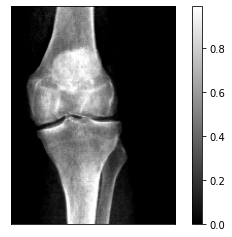

In [13]:
image_A, image_B = make_double_batch()
show(image_A[0, 0])

In [14]:
import itk
import numpy as np
import icon_registration as icon
import icon_registration.networks as networks
BATCH_SIZE = 128
inner_net = icon.FunctionFromVectorField(networks.tallUNet2(dimension=2))
for _ in range(3):
    inner_net = icon.TwoStepRegistration(
        icon.DownsampleRegistration(inner_net, 2), 
        icon.FunctionFromVectorField(networks.tallUNet2(dimension=2))
    )

netGrad = icon.GradientICON(
    inner_net,
    icon.LNCC(sigma=5),
    10
)
input_shape = make_batch().shape
netGrad.assign_identity_map(input_shape)
netGrad.cuda()
optimizerGrad = torch.optim.Adam(netGrad.parameters(), lr=0.0001)
netGrad.train()
0

0

In [15]:
#netGrad.regis_net.load_state_dict(torch.load("results/images/))

In [16]:
import importlib
importlib.reload(icon.train)
importlib.reload(icon)
icon.train_batchfunction(netGrad, optimizerGrad, make_double_batch, steps=64000)

Input name of experiment:
just_high_energy
Saving results to results/just_high_energy/
ICONLoss(all_loss=1.5192883014678955, inverse_consistency_loss=0.0, similarity_loss=1.5192883014678955, transform_magnitude=0.0, flips=0.0)
ICONLoss(all_loss=1.5041629076004028, inverse_consistency_loss=0.0009492982644587755, similarity_loss=1.4946699142456055, transform_magnitude=3.1705931178294122e-06, flips=0.0)
ICONLoss(all_loss=1.547995924949646, inverse_consistency_loss=0.0019106578547507524, similarity_loss=1.5288892984390259, transform_magnitude=4.71899102194584e-06, flips=0.0)
ICONLoss(all_loss=1.5339391231536865, inverse_consistency_loss=0.000634832656942308, similarity_loss=1.5275907516479492, transform_magnitude=4.700961653725244e-06, flips=0.0)
ICONLoss(all_loss=1.5335681438446045, inverse_consistency_loss=0.0008302442729473114, similarity_loss=1.5252656936645508, transform_magnitude=4.157300736551406e-06, flips=0.0)
ICONLoss(all_loss=1.5076630115509033, inverse_consistency_loss=0.000780

ICONLoss(all_loss=1.331259846687317, inverse_consistency_loss=0.0018138433806598186, similarity_loss=1.3131214380264282, transform_magnitude=0.0021900595165789127, flips=0.0)
ICONLoss(all_loss=1.2936593294143677, inverse_consistency_loss=0.0018615309381857514, similarity_loss=1.2750439643859863, transform_magnitude=0.00252549652941525, flips=0.0)
ICONLoss(all_loss=1.317397117614746, inverse_consistency_loss=0.0014777726028114557, similarity_loss=1.3026193380355835, transform_magnitude=0.0025744412560015917, flips=0.0)
ICONLoss(all_loss=1.295447826385498, inverse_consistency_loss=0.0019545266404747963, similarity_loss=1.275902509689331, transform_magnitude=0.0023959383834153414, flips=0.0)
ICONLoss(all_loss=1.290035605430603, inverse_consistency_loss=0.0013933010632172227, similarity_loss=1.2761025428771973, transform_magnitude=0.002725061494857073, flips=0.0)
ICONLoss(all_loss=1.3020399808883667, inverse_consistency_loss=0.0016092633595690131, similarity_loss=1.285947322845459, transfo

ICONLoss(all_loss=1.2489155530929565, inverse_consistency_loss=0.001644418342038989, similarity_loss=1.2324713468551636, transform_magnitude=0.002968535991385579, flips=0.0)
ICONLoss(all_loss=1.2421960830688477, inverse_consistency_loss=0.0019276563543826342, similarity_loss=1.2229194641113281, transform_magnitude=0.0029299654997885227, flips=0.0)
ICONLoss(all_loss=1.225192666053772, inverse_consistency_loss=0.0017667259089648724, similarity_loss=1.207525372505188, transform_magnitude=0.002990999724715948, flips=0.0)
ICONLoss(all_loss=1.2159626483917236, inverse_consistency_loss=0.0019057872705161572, similarity_loss=1.1969047784805298, transform_magnitude=0.002643687417730689, flips=0.0)
ICONLoss(all_loss=1.2548019886016846, inverse_consistency_loss=0.0021513677202165127, similarity_loss=1.233288288116455, transform_magnitude=0.002441487740725279, flips=0.0)
ICONLoss(all_loss=1.2159761190414429, inverse_consistency_loss=0.001967324875295162, similarity_loss=1.196302890777588, transfor

ICONLoss(all_loss=1.240718960762024, inverse_consistency_loss=0.0021259193308651447, similarity_loss=1.2194597721099854, transform_magnitude=0.002435110742226243, flips=0.0)
ICONLoss(all_loss=1.2234528064727783, inverse_consistency_loss=0.002077223267406225, similarity_loss=1.2026805877685547, transform_magnitude=0.002477973001077771, flips=0.0)
ICONLoss(all_loss=1.2414524555206299, inverse_consistency_loss=0.002002094406634569, similarity_loss=1.2214314937591553, transform_magnitude=0.0028575414326041937, flips=0.0)
ICONLoss(all_loss=1.244591474533081, inverse_consistency_loss=0.0019467327510938048, similarity_loss=1.2251241207122803, transform_magnitude=0.003101944923400879, flips=0.0)
ICONLoss(all_loss=1.2205222845077515, inverse_consistency_loss=0.0019117214251309633, similarity_loss=1.2014050483703613, transform_magnitude=0.0030414555221796036, flips=0.0)
ICONLoss(all_loss=1.223307490348816, inverse_consistency_loss=0.0019142706878483295, similarity_loss=1.204164743423462, transfo

ICONLoss(all_loss=1.1918631792068481, inverse_consistency_loss=0.0019703926518559456, similarity_loss=1.172159194946289, transform_magnitude=0.003318220376968384, flips=0.0)
ICONLoss(all_loss=1.224178671836853, inverse_consistency_loss=0.0018537307623773813, similarity_loss=1.2056413888931274, transform_magnitude=0.0031303339637815952, flips=0.0)
ICONLoss(all_loss=1.2086594104766846, inverse_consistency_loss=0.002012798795476556, similarity_loss=1.1885313987731934, transform_magnitude=0.0030215876176953316, flips=0.0)
ICONLoss(all_loss=1.1909106969833374, inverse_consistency_loss=0.001969186356291175, similarity_loss=1.1712188720703125, transform_magnitude=0.003142203437164426, flips=0.0)
ICONLoss(all_loss=1.2193018198013306, inverse_consistency_loss=0.001889221603050828, similarity_loss=1.2004096508026123, transform_magnitude=0.0027930394280701876, flips=0.0)
ICONLoss(all_loss=1.204079031944275, inverse_consistency_loss=0.0018408417236059904, similarity_loss=1.1856706142425537, transf

ICONLoss(all_loss=1.1857863664627075, inverse_consistency_loss=0.0017947974847629666, similarity_loss=1.1678383350372314, transform_magnitude=0.0035205651074647903, flips=0.0)
ICONLoss(all_loss=1.1732293367385864, inverse_consistency_loss=0.0019168313592672348, similarity_loss=1.1540610790252686, transform_magnitude=0.002876946935430169, flips=0.0)
ICONLoss(all_loss=1.1911485195159912, inverse_consistency_loss=0.0018524553161114454, similarity_loss=1.1726239919662476, transform_magnitude=0.002970566041767597, flips=0.0)
ICONLoss(all_loss=1.1815766096115112, inverse_consistency_loss=0.0017342409119009972, similarity_loss=1.1642341613769531, transform_magnitude=0.00343472883105278, flips=0.0)
ICONLoss(all_loss=1.21103835105896, inverse_consistency_loss=0.0019739349372684956, similarity_loss=1.1912989616394043, transform_magnitude=0.0031309169717133045, flips=0.0)
ICONLoss(all_loss=1.195831537246704, inverse_consistency_loss=0.0018833691719919443, similarity_loss=1.1769979000091553, trans

ICONLoss(all_loss=1.1977723836898804, inverse_consistency_loss=0.002026856876909733, similarity_loss=1.1775038242340088, transform_magnitude=0.002851970726624131, flips=0.0)
ICONLoss(all_loss=1.2238329648971558, inverse_consistency_loss=0.0020617477130144835, similarity_loss=1.203215479850769, transform_magnitude=0.003541648155078292, flips=0.0)
ICONLoss(all_loss=1.1969352960586548, inverse_consistency_loss=0.0018823433201760054, similarity_loss=1.1781119108200073, transform_magnitude=0.0032235514372587204, flips=0.0)
ICONLoss(all_loss=1.1944761276245117, inverse_consistency_loss=0.0019292546203359962, similarity_loss=1.1751835346221924, transform_magnitude=0.0031716639641672373, flips=0.0)
ICONLoss(all_loss=1.1946262121200562, inverse_consistency_loss=0.001971920020878315, similarity_loss=1.1749069690704346, transform_magnitude=0.0029176357202231884, flips=0.0)
ICONLoss(all_loss=1.222713828086853, inverse_consistency_loss=0.0018667711410671473, similarity_loss=1.2040461301803589, tran

ICONLoss(all_loss=1.166263461112976, inverse_consistency_loss=0.001994506688788533, similarity_loss=1.1463184356689453, transform_magnitude=0.00303356209769845, flips=0.0)
ICONLoss(all_loss=1.1847399473190308, inverse_consistency_loss=0.0017906830180436373, similarity_loss=1.1668331623077393, transform_magnitude=0.0032913689501583576, flips=0.0)
ICONLoss(all_loss=1.1879969835281372, inverse_consistency_loss=0.0020743508357554674, similarity_loss=1.1672534942626953, transform_magnitude=0.0030795224010944366, flips=0.0)
ICONLoss(all_loss=1.1932284832000732, inverse_consistency_loss=0.002181410789489746, similarity_loss=1.1714143753051758, transform_magnitude=0.002788740675896406, flips=0.0)
ICONLoss(all_loss=1.1853904724121094, inverse_consistency_loss=0.0021612236741930246, similarity_loss=1.1637781858444214, transform_magnitude=0.0030469715129584074, flips=0.0)
ICONLoss(all_loss=1.181801199913025, inverse_consistency_loss=0.001857012277469039, similarity_loss=1.1632311344146729, transf

ICONLoss(all_loss=1.154497742652893, inverse_consistency_loss=0.0018992022378370166, similarity_loss=1.1355056762695312, transform_magnitude=0.0030890104826539755, flips=0.0)
ICONLoss(all_loss=1.1711044311523438, inverse_consistency_loss=0.0020818421617150307, similarity_loss=1.1502859592437744, transform_magnitude=0.0031866179779171944, flips=0.0)
ICONLoss(all_loss=1.185017466545105, inverse_consistency_loss=0.0018938030116260052, similarity_loss=1.1660794019699097, transform_magnitude=0.003391529433429241, flips=0.0)
ICONLoss(all_loss=1.1796746253967285, inverse_consistency_loss=0.001782056293450296, similarity_loss=1.1618540287017822, transform_magnitude=0.0033611420076340437, flips=0.0)
ICONLoss(all_loss=1.181197166442871, inverse_consistency_loss=0.0020973717328161, similarity_loss=1.1602234840393066, transform_magnitude=0.003375874599441886, flips=0.0)
ICONLoss(all_loss=1.1933537721633911, inverse_consistency_loss=0.001914018066599965, similarity_loss=1.1742136478424072, transfor

ICONLoss(all_loss=1.1411666870117188, inverse_consistency_loss=0.0018502509919926524, similarity_loss=1.122664213180542, transform_magnitude=0.0034607837442308664, flips=0.0)
ICONLoss(all_loss=1.1749666929244995, inverse_consistency_loss=0.0024594441056251526, similarity_loss=1.1503722667694092, transform_magnitude=0.002801969414576888, flips=0.0)
ICONLoss(all_loss=1.168073058128357, inverse_consistency_loss=0.0018220498459413648, similarity_loss=1.1498525142669678, transform_magnitude=0.003187197959050536, flips=0.0)
ICONLoss(all_loss=1.1657607555389404, inverse_consistency_loss=0.002197956433519721, similarity_loss=1.1437811851501465, transform_magnitude=0.003038218943402171, flips=0.0)
ICONLoss(all_loss=1.1709719896316528, inverse_consistency_loss=0.0020771315321326256, similarity_loss=1.1502007246017456, transform_magnitude=0.003264072583988309, flips=0.0)
ICONLoss(all_loss=1.1533256769180298, inverse_consistency_loss=0.0017745648510754108, similarity_loss=1.135580062866211, transf

ICONLoss(all_loss=1.1601389646530151, inverse_consistency_loss=0.0024332415778189898, similarity_loss=1.1358065605163574, transform_magnitude=0.0034840586595237255, flips=0.0)
ICONLoss(all_loss=1.190152645111084, inverse_consistency_loss=0.002508381148800254, similarity_loss=1.1650688648223877, transform_magnitude=0.002955598756670952, flips=0.0)
ICONLoss(all_loss=1.1557453870773315, inverse_consistency_loss=0.0026625730097293854, similarity_loss=1.129119634628296, transform_magnitude=0.0032511672470718622, flips=0.0)
ICONLoss(all_loss=1.1674267053604126, inverse_consistency_loss=0.0022017606534063816, similarity_loss=1.145409107208252, transform_magnitude=0.0033116484992206097, flips=0.0)
ICONLoss(all_loss=1.191605567932129, inverse_consistency_loss=0.0022946158424019814, similarity_loss=1.1686594486236572, transform_magnitude=0.0036870650947093964, flips=0.0)
ICONLoss(all_loss=1.1712368726730347, inverse_consistency_loss=0.0024020089767873287, similarity_loss=1.147216796875, transfor

ICONLoss(all_loss=1.1559994220733643, inverse_consistency_loss=0.002120906487107277, similarity_loss=1.134790301322937, transform_magnitude=0.003252242226153612, flips=0.0)
ICONLoss(all_loss=1.1611098051071167, inverse_consistency_loss=0.002300726715475321, similarity_loss=1.1381025314331055, transform_magnitude=0.003190005663782358, flips=0.0)
ICONLoss(all_loss=1.1564216613769531, inverse_consistency_loss=0.001959911547601223, similarity_loss=1.1368225812911987, transform_magnitude=0.0034365938045084476, flips=0.0)
ICONLoss(all_loss=1.1713029146194458, inverse_consistency_loss=0.0021477933041751385, similarity_loss=1.1498249769210815, transform_magnitude=0.0032082279212772846, flips=0.0)
ICONLoss(all_loss=1.1728918552398682, inverse_consistency_loss=0.001986808842048049, similarity_loss=1.1530237197875977, transform_magnitude=0.0035685531329363585, flips=0.0)
ICONLoss(all_loss=1.1658772230148315, inverse_consistency_loss=0.0022581908851861954, similarity_loss=1.1432952880859375, trans

ICONLoss(all_loss=1.1724613904953003, inverse_consistency_loss=0.0021558115258812904, similarity_loss=1.1509032249450684, transform_magnitude=0.003671320155262947, flips=0.0)
ICONLoss(all_loss=1.1529130935668945, inverse_consistency_loss=0.00236256024800241, similarity_loss=1.1292874813079834, transform_magnitude=0.003522885497659445, flips=0.0)
ICONLoss(all_loss=1.1431262493133545, inverse_consistency_loss=0.0023543706629425287, similarity_loss=1.1195825338363647, transform_magnitude=0.0034628338180482388, flips=0.0)
ICONLoss(all_loss=1.1538406610488892, inverse_consistency_loss=0.002227367600426078, similarity_loss=1.1315670013427734, transform_magnitude=0.0033572569955140352, flips=0.0)
ICONLoss(all_loss=1.1761510372161865, inverse_consistency_loss=0.0026874917093664408, similarity_loss=1.1492761373519897, transform_magnitude=0.003256008494645357, flips=0.0)
ICONLoss(all_loss=1.1500787734985352, inverse_consistency_loss=0.0022703378926962614, similarity_loss=1.1273753643035889, tran

ICONLoss(all_loss=1.1443886756896973, inverse_consistency_loss=0.002836373634636402, similarity_loss=1.1160249710083008, transform_magnitude=0.003125488990917802, flips=0.0)
ICONLoss(all_loss=1.1447811126708984, inverse_consistency_loss=0.002231166698038578, similarity_loss=1.122469425201416, transform_magnitude=0.003193247364833951, flips=0.0)
ICONLoss(all_loss=1.1276417970657349, inverse_consistency_loss=0.002659906866028905, similarity_loss=1.1010427474975586, transform_magnitude=0.0032578499522060156, flips=0.0)
ICONLoss(all_loss=1.1481727361679077, inverse_consistency_loss=0.0023127200547605753, similarity_loss=1.1250455379486084, transform_magnitude=0.0031236365903168917, flips=0.0)
ICONLoss(all_loss=1.1465588808059692, inverse_consistency_loss=0.0025045936927199364, similarity_loss=1.1215128898620605, transform_magnitude=0.003626433666795492, flips=0.0)
ICONLoss(all_loss=1.146860957145691, inverse_consistency_loss=0.002345195272937417, similarity_loss=1.1234090328216553, transfo

ICONLoss(all_loss=1.1172170639038086, inverse_consistency_loss=0.0026006782427430153, similarity_loss=1.0912102460861206, transform_magnitude=0.002769215265288949, flips=0.0)
ICONLoss(all_loss=1.1164300441741943, inverse_consistency_loss=0.0025533945299685, similarity_loss=1.0908961296081543, transform_magnitude=0.0034171235747635365, flips=0.0)
ICONLoss(all_loss=1.1123031377792358, inverse_consistency_loss=0.0026170487981289625, similarity_loss=1.0861326456069946, transform_magnitude=0.0030816132202744484, flips=0.0)
ICONLoss(all_loss=1.1315281391143799, inverse_consistency_loss=0.0025669760070741177, similarity_loss=1.105858325958252, transform_magnitude=0.002770361490547657, flips=0.0)
ICONLoss(all_loss=1.0954803228378296, inverse_consistency_loss=0.002501449780538678, similarity_loss=1.0704658031463623, transform_magnitude=0.003547140397131443, flips=0.0)
ICONLoss(all_loss=1.1083438396453857, inverse_consistency_loss=0.0026496658101677895, similarity_loss=1.0818471908569336, transf

ICONLoss(all_loss=1.1025136709213257, inverse_consistency_loss=0.002493232022970915, similarity_loss=1.0775814056396484, transform_magnitude=0.003949151840060949, flips=0.0)
ICONLoss(all_loss=1.1305506229400635, inverse_consistency_loss=0.002707362174987793, similarity_loss=1.1034770011901855, transform_magnitude=0.0038473031017929316, flips=0.0)
ICONLoss(all_loss=1.111808180809021, inverse_consistency_loss=0.002870045369490981, similarity_loss=1.0831077098846436, transform_magnitude=0.003333651926368475, flips=0.0)
ICONLoss(all_loss=1.1058096885681152, inverse_consistency_loss=0.002829938195645809, similarity_loss=1.0775103569030762, transform_magnitude=0.003271394642069936, flips=0.0)
ICONLoss(all_loss=1.1171625852584839, inverse_consistency_loss=0.0026684561744332314, similarity_loss=1.0904780626296997, transform_magnitude=0.004086061846464872, flips=0.0)
ICONLoss(all_loss=1.0991264581680298, inverse_consistency_loss=0.002856105100363493, similarity_loss=1.0705654621124268, transfor

ICONLoss(all_loss=1.115321397781372, inverse_consistency_loss=0.003427661256864667, similarity_loss=1.0810447931289673, transform_magnitude=0.0036844792775809765, flips=0.0)
ICONLoss(all_loss=1.0886863470077515, inverse_consistency_loss=0.0029452068265527487, similarity_loss=1.0592342615127563, transform_magnitude=0.0036844948772341013, flips=0.0)
ICONLoss(all_loss=1.1009758710861206, inverse_consistency_loss=0.0032858061604201794, similarity_loss=1.0681178569793701, transform_magnitude=0.0035270110238343477, flips=0.0)
ICONLoss(all_loss=1.0895181894302368, inverse_consistency_loss=0.0028645885176956654, similarity_loss=1.0608723163604736, transform_magnitude=0.0030694412998855114, flips=0.0)
ICONLoss(all_loss=1.0946601629257202, inverse_consistency_loss=0.0034362461883574724, similarity_loss=1.0602977275848389, transform_magnitude=0.003456266364082694, flips=0.0)
ICONLoss(all_loss=1.0892375707626343, inverse_consistency_loss=0.0029669213108718395, similarity_loss=1.0595684051513672, t

ICONLoss(all_loss=1.1050952672958374, inverse_consistency_loss=0.003110681427642703, similarity_loss=1.073988437652588, transform_magnitude=0.003871041815727949, flips=0.0)
ICONLoss(all_loss=1.078184723854065, inverse_consistency_loss=0.002791436854749918, similarity_loss=1.0502703189849854, transform_magnitude=0.0037409476935863495, flips=0.0)
ICONLoss(all_loss=1.0791466236114502, inverse_consistency_loss=0.003268409287557006, similarity_loss=1.0464625358581543, transform_magnitude=0.0036155765410512686, flips=0.0)
ICONLoss(all_loss=1.114936113357544, inverse_consistency_loss=0.0026921271346509457, similarity_loss=1.088014841079712, transform_magnitude=0.004044350236654282, flips=0.0)
ICONLoss(all_loss=1.0871789455413818, inverse_consistency_loss=0.0029837575275450945, similarity_loss=1.0573413372039795, transform_magnitude=0.003445572452619672, flips=0.0)
ICONLoss(all_loss=1.0858224630355835, inverse_consistency_loss=0.0025486606173217297, similarity_loss=1.0603358745574951, transfor

ICONLoss(all_loss=1.1056888103485107, inverse_consistency_loss=0.002895507961511612, similarity_loss=1.0767337083816528, transform_magnitude=0.004196245223283768, flips=0.0)
ICONLoss(all_loss=1.0760575532913208, inverse_consistency_loss=0.0029519405215978622, similarity_loss=1.0465381145477295, transform_magnitude=0.003781887236982584, flips=0.0)
ICONLoss(all_loss=1.0793581008911133, inverse_consistency_loss=0.0029186878819018602, similarity_loss=1.0501712560653687, transform_magnitude=0.003808198729529977, flips=0.0)
ICONLoss(all_loss=1.0826603174209595, inverse_consistency_loss=0.0029771970584988594, similarity_loss=1.0528883934020996, transform_magnitude=0.004135225899517536, flips=0.0)
ICONLoss(all_loss=1.072243571281433, inverse_consistency_loss=0.0029541184194386005, similarity_loss=1.0427024364471436, transform_magnitude=0.0034315474331378937, flips=0.0)
ICONLoss(all_loss=1.095510482788086, inverse_consistency_loss=0.0028301356360316277, similarity_loss=1.0672091245651245, trans

ICONLoss(all_loss=1.0729165077209473, inverse_consistency_loss=0.00303555466234684, similarity_loss=1.0425609350204468, transform_magnitude=0.004121259320527315, flips=0.0)
ICONLoss(all_loss=1.0796904563903809, inverse_consistency_loss=0.00287461094558239, similarity_loss=1.0509443283081055, transform_magnitude=0.003990978468209505, flips=0.0)
ICONLoss(all_loss=1.071542739868164, inverse_consistency_loss=0.0034150993451476097, similarity_loss=1.0373917818069458, transform_magnitude=0.0035975321661680937, flips=0.0)
ICONLoss(all_loss=1.0639222860336304, inverse_consistency_loss=0.0031144539825618267, similarity_loss=1.0327777862548828, transform_magnitude=0.003941048868000507, flips=0.0)
ICONLoss(all_loss=1.069898009300232, inverse_consistency_loss=0.0026855366304516792, similarity_loss=1.0430426597595215, transform_magnitude=0.0038783070631325245, flips=0.0)
ICONLoss(all_loss=1.0783782005310059, inverse_consistency_loss=0.00296510336920619, similarity_loss=1.0487271547317505, transform

ICONLoss(all_loss=1.0718562602996826, inverse_consistency_loss=0.002729822648689151, similarity_loss=1.044558048248291, transform_magnitude=0.0036110766232013702, flips=0.0)
ICONLoss(all_loss=1.0632685422897339, inverse_consistency_loss=0.002820369089022279, similarity_loss=1.0350648164749146, transform_magnitude=0.004108773078769445, flips=0.0)
ICONLoss(all_loss=1.0731431245803833, inverse_consistency_loss=0.002892955206334591, similarity_loss=1.0442135334014893, transform_magnitude=0.003995428327471018, flips=0.0)
ICONLoss(all_loss=1.0505753755569458, inverse_consistency_loss=0.0026721772737801075, similarity_loss=1.0238536596298218, transform_magnitude=0.004075957927852869, flips=0.0)
ICONLoss(all_loss=1.0788097381591797, inverse_consistency_loss=0.0031755086965858936, similarity_loss=1.047054648399353, transform_magnitude=0.0034221995156258345, flips=0.0)
ICONLoss(all_loss=1.0747954845428467, inverse_consistency_loss=0.002726348116993904, similarity_loss=1.0475319623947144, transfo

ICONLoss(all_loss=1.07302987575531, inverse_consistency_loss=0.00309077650308609, similarity_loss=1.0421221256256104, transform_magnitude=0.0038317374419420958, flips=0.0)
ICONLoss(all_loss=1.0488172769546509, inverse_consistency_loss=0.0027404329739511013, similarity_loss=1.021412968635559, transform_magnitude=0.004046859685331583, flips=0.0)
ICONLoss(all_loss=1.063860297203064, inverse_consistency_loss=0.0028732335194945335, similarity_loss=1.0351279973983765, transform_magnitude=0.003842584090307355, flips=0.0)
ICONLoss(all_loss=1.0708043575286865, inverse_consistency_loss=0.002929340349510312, similarity_loss=1.0415109395980835, transform_magnitude=0.00318334111943841, flips=0.0)
ICONLoss(all_loss=1.0534201860427856, inverse_consistency_loss=0.0029054530896246433, similarity_loss=1.0243656635284424, transform_magnitude=0.003963503986597061, flips=0.0)
ICONLoss(all_loss=1.0635558366775513, inverse_consistency_loss=0.0028492766432464123, similarity_loss=1.0350630283355713, transform_

ICONLoss(all_loss=1.0658323764801025, inverse_consistency_loss=0.003069406608119607, similarity_loss=1.0351383686065674, transform_magnitude=0.004181229509413242, flips=0.0)
ICONLoss(all_loss=1.066225528717041, inverse_consistency_loss=0.0028518512845039368, similarity_loss=1.037706971168518, transform_magnitude=0.0038325819186866283, flips=0.0)
ICONLoss(all_loss=1.0593982934951782, inverse_consistency_loss=0.002743349177762866, similarity_loss=1.0319647789001465, transform_magnitude=0.0038018955383449793, flips=0.0)
ICONLoss(all_loss=1.0582581758499146, inverse_consistency_loss=0.0029286546632647514, similarity_loss=1.0289716720581055, transform_magnitude=0.0038417538162320852, flips=0.0)
ICONLoss(all_loss=1.0480754375457764, inverse_consistency_loss=0.002838367596268654, similarity_loss=1.0196917057037354, transform_magnitude=0.0037915657740086317, flips=0.0)
ICONLoss(all_loss=1.0708435773849487, inverse_consistency_loss=0.0026656724512577057, similarity_loss=1.0441868305206299, tran

ICONLoss(all_loss=1.0509896278381348, inverse_consistency_loss=0.0030691020656377077, similarity_loss=1.0202986001968384, transform_magnitude=0.003981618210673332, flips=0.0)
ICONLoss(all_loss=1.0408467054367065, inverse_consistency_loss=0.002647069748491049, similarity_loss=1.0143760442733765, transform_magnitude=0.003738822415471077, flips=0.0)
ICONLoss(all_loss=1.049246907234192, inverse_consistency_loss=0.002893146127462387, similarity_loss=1.020315408706665, transform_magnitude=0.003620967734605074, flips=0.0)
ICONLoss(all_loss=1.0585503578186035, inverse_consistency_loss=0.002593719633296132, similarity_loss=1.0326131582260132, transform_magnitude=0.003687979420647025, flips=0.0)
ICONLoss(all_loss=1.0766571760177612, inverse_consistency_loss=0.002621327992528677, similarity_loss=1.0504438877105713, transform_magnitude=0.004029595293104649, flips=0.0)
ICONLoss(all_loss=1.0550289154052734, inverse_consistency_loss=0.0028259800747036934, similarity_loss=1.0267691612243652, transform

ICONLoss(all_loss=1.0594336986541748, inverse_consistency_loss=0.002890691626816988, similarity_loss=1.0305267572402954, transform_magnitude=0.003621345618739724, flips=0.0)
ICONLoss(all_loss=1.0466755628585815, inverse_consistency_loss=0.0028432272374629974, similarity_loss=1.0182433128356934, transform_magnitude=0.00406903401017189, flips=0.0)
ICONLoss(all_loss=1.032211422920227, inverse_consistency_loss=0.0028875332791358232, similarity_loss=1.0033360719680786, transform_magnitude=0.0038403007201850414, flips=0.0)
ICONLoss(all_loss=1.072090983390808, inverse_consistency_loss=0.0030465726740658283, similarity_loss=1.0416252613067627, transform_magnitude=0.004122068174183369, flips=0.0)
ICONLoss(all_loss=1.0606164932250977, inverse_consistency_loss=0.002937271259725094, similarity_loss=1.0312438011169434, transform_magnitude=0.0038593518547713757, flips=0.0)
ICONLoss(all_loss=1.056838035583496, inverse_consistency_loss=0.002717365976423025, similarity_loss=1.029664397239685, transform

ICONLoss(all_loss=1.0455023050308228, inverse_consistency_loss=0.003007323481142521, similarity_loss=1.0154290199279785, transform_magnitude=0.0049362326972186565, flips=0.0)
ICONLoss(all_loss=1.036669135093689, inverse_consistency_loss=0.00293987849727273, similarity_loss=1.007270336151123, transform_magnitude=0.003885664278641343, flips=0.0)
ICONLoss(all_loss=1.0352973937988281, inverse_consistency_loss=0.0032648099586367607, similarity_loss=1.0026493072509766, transform_magnitude=0.004641318693757057, flips=0.0)
ICONLoss(all_loss=1.0479819774627686, inverse_consistency_loss=0.0029663527384400368, similarity_loss=1.0183184146881104, transform_magnitude=0.0037011574022471905, flips=0.0)
ICONLoss(all_loss=1.0603656768798828, inverse_consistency_loss=0.0027579786255955696, similarity_loss=1.0327858924865723, transform_magnitude=0.004085924476385117, flips=0.0)
ICONLoss(all_loss=1.0495878458023071, inverse_consistency_loss=0.0028517642058432102, similarity_loss=1.0210702419281006, transf

ICONLoss(all_loss=1.068572759628296, inverse_consistency_loss=0.0028434288688004017, similarity_loss=1.0401384830474854, transform_magnitude=0.004387654364109039, flips=0.0)
ICONLoss(all_loss=1.064525842666626, inverse_consistency_loss=0.003018677467480302, similarity_loss=1.0343390703201294, transform_magnitude=0.003916304092854261, flips=0.0)
ICONLoss(all_loss=1.0517531633377075, inverse_consistency_loss=0.00278429314494133, similarity_loss=1.0239102840423584, transform_magnitude=0.0040316954255104065, flips=0.0)
ICONLoss(all_loss=1.0533230304718018, inverse_consistency_loss=0.0028418474830687046, similarity_loss=1.0249046087265015, transform_magnitude=0.004679366480559111, flips=0.0)
ICONLoss(all_loss=1.0424968004226685, inverse_consistency_loss=0.0028917379677295685, similarity_loss=1.0135793685913086, transform_magnitude=0.004112084396183491, flips=0.0)
ICONLoss(all_loss=1.0573463439941406, inverse_consistency_loss=0.0030831624753773212, similarity_loss=1.0265147686004639, transfo

ICONLoss(all_loss=1.0562642812728882, inverse_consistency_loss=0.0028377780690789223, similarity_loss=1.0278865098953247, transform_magnitude=0.004254980478435755, flips=0.0)
ICONLoss(all_loss=1.0448418855667114, inverse_consistency_loss=0.002711663721129298, similarity_loss=1.0177252292633057, transform_magnitude=0.004497983492910862, flips=0.0)
ICONLoss(all_loss=1.0498197078704834, inverse_consistency_loss=0.0027096145786345005, similarity_loss=1.0227235555648804, transform_magnitude=0.004449224565178156, flips=0.0)
ICONLoss(all_loss=1.063385248184204, inverse_consistency_loss=0.003007367718964815, similarity_loss=1.0333116054534912, transform_magnitude=0.0048227617517113686, flips=0.0)
ICONLoss(all_loss=1.0457565784454346, inverse_consistency_loss=0.0025756140239536762, similarity_loss=1.0200004577636719, transform_magnitude=0.004617201630026102, flips=0.0)
ICONLoss(all_loss=1.0451350212097168, inverse_consistency_loss=0.00303502194583416, similarity_loss=1.014784812927246, transfor

ICONLoss(all_loss=1.0446521043777466, inverse_consistency_loss=0.003449714742600918, similarity_loss=1.0101549625396729, transform_magnitude=0.004267924930900335, flips=0.0)
ICONLoss(all_loss=1.0468366146087646, inverse_consistency_loss=0.0028309794142842293, similarity_loss=1.0185267925262451, transform_magnitude=0.004045042209327221, flips=0.0)
ICONLoss(all_loss=1.0381429195404053, inverse_consistency_loss=0.0034586661495268345, similarity_loss=1.003556251525879, transform_magnitude=0.004188625607639551, flips=0.0)
ICONLoss(all_loss=1.0581690073013306, inverse_consistency_loss=0.002757469890639186, similarity_loss=1.0305943489074707, transform_magnitude=0.004532005172222853, flips=0.0)
ICONLoss(all_loss=1.0529505014419556, inverse_consistency_loss=0.0036309165880084038, similarity_loss=1.01664137840271, transform_magnitude=0.004141140263527632, flips=0.0)
ICONLoss(all_loss=1.0432941913604736, inverse_consistency_loss=0.0031976760365068913, similarity_loss=1.0113173723220825, transfor

ICONLoss(all_loss=1.0248396396636963, inverse_consistency_loss=0.002832118421792984, similarity_loss=0.9965184926986694, transform_magnitude=0.003698346670717001, flips=0.0)
ICONLoss(all_loss=1.0307127237319946, inverse_consistency_loss=0.0028863046318292618, similarity_loss=1.00184965133667, transform_magnitude=0.0042285979725420475, flips=0.0)
ICONLoss(all_loss=1.0348824262619019, inverse_consistency_loss=0.0028587416745722294, similarity_loss=1.0062949657440186, transform_magnitude=0.0038106045685708523, flips=0.0)
ICONLoss(all_loss=1.0370440483093262, inverse_consistency_loss=0.0026804269291460514, similarity_loss=1.0102397203445435, transform_magnitude=0.004221488256007433, flips=0.0)
ICONLoss(all_loss=1.052143931388855, inverse_consistency_loss=0.002763423603028059, similarity_loss=1.0245096683502197, transform_magnitude=0.004292522557079792, flips=0.0)
ICONLoss(all_loss=1.0347278118133545, inverse_consistency_loss=0.0026377583853900433, similarity_loss=1.0083502531051636, transf

ICONLoss(all_loss=1.0439379215240479, inverse_consistency_loss=0.0026687337085604668, similarity_loss=1.0172505378723145, transform_magnitude=0.004344561602920294, flips=0.0)
ICONLoss(all_loss=1.0444868803024292, inverse_consistency_loss=0.002901854459196329, similarity_loss=1.0154683589935303, transform_magnitude=0.004636626224964857, flips=0.0)
ICONLoss(all_loss=1.0418578386306763, inverse_consistency_loss=0.002624069806188345, similarity_loss=1.0156171321868896, transform_magnitude=0.004690585192292929, flips=0.0)
ICONLoss(all_loss=1.049025058746338, inverse_consistency_loss=0.0030088606290519238, similarity_loss=1.0189363956451416, transform_magnitude=0.004157889634370804, flips=0.0)
ICONLoss(all_loss=1.02783203125, inverse_consistency_loss=0.0026919040828943253, similarity_loss=1.0009130239486694, transform_magnitude=0.004767464939504862, flips=0.0)
ICONLoss(all_loss=1.0262237787246704, inverse_consistency_loss=0.0029160180129110813, similarity_loss=0.9970635771751404, transform_m

ICONLoss(all_loss=1.0204567909240723, inverse_consistency_loss=0.003259897232055664, similarity_loss=0.9878578186035156, transform_magnitude=0.004268576856702566, flips=0.0)
ICONLoss(all_loss=1.036269187927246, inverse_consistency_loss=0.002900428604334593, similarity_loss=1.0072648525238037, transform_magnitude=0.004329320974647999, flips=0.0)
ICONLoss(all_loss=1.0368974208831787, inverse_consistency_loss=0.003294107038527727, similarity_loss=1.0039563179016113, transform_magnitude=0.004259317182004452, flips=0.0)
ICONLoss(all_loss=1.0337612628936768, inverse_consistency_loss=0.002879831939935684, similarity_loss=1.0049629211425781, transform_magnitude=0.0042738053016364574, flips=0.0)
ICONLoss(all_loss=1.032305359840393, inverse_consistency_loss=0.003233702387660742, similarity_loss=0.9999682903289795, transform_magnitude=0.004186644684523344, flips=0.0)
ICONLoss(all_loss=1.021230936050415, inverse_consistency_loss=0.002626863308250904, similarity_loss=0.9949623346328735, transform_m

ICONLoss(all_loss=1.04743492603302, inverse_consistency_loss=0.0031321325805038214, similarity_loss=1.0161136388778687, transform_magnitude=0.004216429311782122, flips=0.0)
ICONLoss(all_loss=1.0195825099945068, inverse_consistency_loss=0.0027513401582837105, similarity_loss=0.9920691251754761, transform_magnitude=0.00467650406062603, flips=0.0)
ICONLoss(all_loss=1.027790904045105, inverse_consistency_loss=0.002795063192024827, similarity_loss=0.999840259552002, transform_magnitude=0.004711764864623547, flips=0.0)
ICONLoss(all_loss=1.044060230255127, inverse_consistency_loss=0.002770710736513138, similarity_loss=1.0163531303405762, transform_magnitude=0.004260412883013487, flips=0.0)
ICONLoss(all_loss=1.0093146562576294, inverse_consistency_loss=0.002684975042939186, similarity_loss=0.9824648499488831, transform_magnitude=0.0042839269153773785, flips=0.0)
ICONLoss(all_loss=1.014625072479248, inverse_consistency_loss=0.002567931078374386, similarity_loss=0.988945722579956, transform_magn

ICONLoss(all_loss=1.0489498376846313, inverse_consistency_loss=0.00258904742076993, similarity_loss=1.023059368133545, transform_magnitude=0.005018297582864761, flips=0.0)
ICONLoss(all_loss=1.037400245666504, inverse_consistency_loss=0.0027241199277341366, similarity_loss=1.0101590156555176, transform_magnitude=0.00472897058352828, flips=0.0)
ICONLoss(all_loss=1.0263603925704956, inverse_consistency_loss=0.002722206525504589, similarity_loss=0.999138355255127, transform_magnitude=0.004915641620755196, flips=0.0)
ICONLoss(all_loss=1.027597427368164, inverse_consistency_loss=0.0025986575055867434, similarity_loss=1.0016108751296997, transform_magnitude=0.00448358990252018, flips=0.0)
ICONLoss(all_loss=1.030557632446289, inverse_consistency_loss=0.0026232595555484295, similarity_loss=1.004325032234192, transform_magnitude=0.005058624316006899, flips=0.0)
ICONLoss(all_loss=1.027092695236206, inverse_consistency_loss=0.0028178561478853226, similarity_loss=0.9989141225814819, transform_magni

ICONLoss(all_loss=1.0207526683807373, inverse_consistency_loss=0.00287474412471056, similarity_loss=0.9920052289962769, transform_magnitude=0.005130517762154341, flips=0.0)
ICONLoss(all_loss=1.023033618927002, inverse_consistency_loss=0.0033732529263943434, similarity_loss=0.9893010854721069, transform_magnitude=0.004218219313770533, flips=0.0)
ICONLoss(all_loss=1.022325038909912, inverse_consistency_loss=0.0031084194779396057, similarity_loss=0.9912408590316772, transform_magnitude=0.004799839109182358, flips=0.0)
ICONLoss(all_loss=1.0539915561676025, inverse_consistency_loss=0.0032386286184191704, similarity_loss=1.0216052532196045, transform_magnitude=0.004754486493766308, flips=0.0)
ICONLoss(all_loss=1.034704327583313, inverse_consistency_loss=0.003084911499172449, similarity_loss=1.0038552284240723, transform_magnitude=0.004938981030136347, flips=0.0)
ICONLoss(all_loss=1.035075306892395, inverse_consistency_loss=0.0029260297305881977, similarity_loss=1.005815029144287, transform_m

ICONLoss(all_loss=1.0234332084655762, inverse_consistency_loss=0.0025578944478183985, similarity_loss=0.9978542923927307, transform_magnitude=0.004812194034457207, flips=0.0)
ICONLoss(all_loss=1.0073249340057373, inverse_consistency_loss=0.0029064491391181946, similarity_loss=0.9782603979110718, transform_magnitude=0.004094601608812809, flips=0.0)
ICONLoss(all_loss=1.016617774963379, inverse_consistency_loss=0.0028994400054216385, similarity_loss=0.9876233339309692, transform_magnitude=0.004151638597249985, flips=0.0)
ICONLoss(all_loss=1.036249041557312, inverse_consistency_loss=0.002792084589600563, similarity_loss=1.0083281993865967, transform_magnitude=0.005131306126713753, flips=0.0)
ICONLoss(all_loss=1.0148159265518188, inverse_consistency_loss=0.0027251888532191515, similarity_loss=0.9875640869140625, transform_magnitude=0.00498605240136385, flips=0.0)
ICONLoss(all_loss=1.0300014019012451, inverse_consistency_loss=0.002724688732996583, similarity_loss=1.00275456905365, transform_

ICONLoss(all_loss=1.0205755233764648, inverse_consistency_loss=0.002658173907548189, similarity_loss=0.9939937591552734, transform_magnitude=0.004597580526024103, flips=0.0)
ICONLoss(all_loss=1.0145771503448486, inverse_consistency_loss=0.0027350292075425386, similarity_loss=0.9872268438339233, transform_magnitude=0.0047751786187291145, flips=0.0)
ICONLoss(all_loss=1.0254570245742798, inverse_consistency_loss=0.0027662208303809166, similarity_loss=0.9977948665618896, transform_magnitude=0.004600317217409611, flips=0.0)
ICONLoss(all_loss=1.0238317251205444, inverse_consistency_loss=0.0028611700981855392, similarity_loss=0.9952200651168823, transform_magnitude=0.004050225950777531, flips=0.0)
ICONLoss(all_loss=1.0357145071029663, inverse_consistency_loss=0.0026829568669199944, similarity_loss=1.0088849067687988, transform_magnitude=0.005053305998444557, flips=0.0)
ICONLoss(all_loss=1.015997290611267, inverse_consistency_loss=0.002715115901082754, similarity_loss=0.9888461232185364, trans

ICONLoss(all_loss=1.0187214612960815, inverse_consistency_loss=0.0026609613560140133, similarity_loss=0.99211186170578, transform_magnitude=0.004829282872378826, flips=0.0)
ICONLoss(all_loss=1.0047639608383179, inverse_consistency_loss=0.0027138092555105686, similarity_loss=0.977625846862793, transform_magnitude=0.0048705702647566795, flips=0.0)
ICONLoss(all_loss=1.011181116104126, inverse_consistency_loss=0.0028980281203985214, similarity_loss=0.9822008013725281, transform_magnitude=0.004280595574527979, flips=0.0)
ICONLoss(all_loss=1.0158721208572388, inverse_consistency_loss=0.0027677910402417183, similarity_loss=0.9881942272186279, transform_magnitude=0.004286622162908316, flips=0.0)
ICONLoss(all_loss=1.0360971689224243, inverse_consistency_loss=0.002870932687073946, similarity_loss=1.0073878765106201, transform_magnitude=0.005046555772423744, flips=0.0)
ICONLoss(all_loss=1.0282325744628906, inverse_consistency_loss=0.0029158866964280605, similarity_loss=0.9990737438201904, transfo

ICONLoss(all_loss=1.0252549648284912, inverse_consistency_loss=0.002835221355780959, similarity_loss=0.9969027638435364, transform_magnitude=0.004592589568346739, flips=0.0)
ICONLoss(all_loss=1.0193922519683838, inverse_consistency_loss=0.002654289361089468, similarity_loss=0.9928493499755859, transform_magnitude=0.004971611313521862, flips=0.0)
ICONLoss(all_loss=1.030279278755188, inverse_consistency_loss=0.00295437965542078, similarity_loss=1.0007355213165283, transform_magnitude=0.0048620132729411125, flips=0.0)
ICONLoss(all_loss=1.026701807975769, inverse_consistency_loss=0.0027058501727879047, similarity_loss=0.9996433258056641, transform_magnitude=0.0045751710422337055, flips=0.0)
ICONLoss(all_loss=1.0251238346099854, inverse_consistency_loss=0.0030237650498747826, similarity_loss=0.9948861598968506, transform_magnitude=0.0057438816875219345, flips=0.0)
ICONLoss(all_loss=1.0317398309707642, inverse_consistency_loss=0.002670394256711006, similarity_loss=1.0050358772277832, transfo

ICONLoss(all_loss=1.032490611076355, inverse_consistency_loss=0.0026937127113342285, similarity_loss=1.0055534839630127, transform_magnitude=0.0049674720503389835, flips=0.0)
ICONLoss(all_loss=1.0217000246047974, inverse_consistency_loss=0.0028522470965981483, similarity_loss=0.9931775331497192, transform_magnitude=0.005005787126719952, flips=0.0)
ICONLoss(all_loss=1.0166715383529663, inverse_consistency_loss=0.002932161558419466, similarity_loss=0.9873498678207397, transform_magnitude=0.004589144606143236, flips=0.0)
ICONLoss(all_loss=1.003448247909546, inverse_consistency_loss=0.002708146581426263, similarity_loss=0.9763667583465576, transform_magnitude=0.004793268162757158, flips=0.0)
ICONLoss(all_loss=1.0237231254577637, inverse_consistency_loss=0.002930890768766403, similarity_loss=0.9944142699241638, transform_magnitude=0.004667752888053656, flips=0.0)
ICONLoss(all_loss=1.0267364978790283, inverse_consistency_loss=0.0026773344725370407, similarity_loss=0.9999631643295288, transfo

ICONLoss(all_loss=1.032947301864624, inverse_consistency_loss=0.0032898858189582825, similarity_loss=1.0000483989715576, transform_magnitude=0.0043668244034051895, flips=0.0)
ICONLoss(all_loss=1.0187848806381226, inverse_consistency_loss=0.0028837404679507017, similarity_loss=0.9899474382400513, transform_magnitude=0.004578645806759596, flips=0.0)
ICONLoss(all_loss=1.0034778118133545, inverse_consistency_loss=0.002886992646381259, similarity_loss=0.9746078252792358, transform_magnitude=0.004685915075242519, flips=0.0)
ICONLoss(all_loss=1.0042238235473633, inverse_consistency_loss=0.002826125593855977, similarity_loss=0.9759625196456909, transform_magnitude=0.0047832028940320015, flips=0.0)
ICONLoss(all_loss=1.0228700637817383, inverse_consistency_loss=0.0028705557342618704, similarity_loss=0.9941644668579102, transform_magnitude=0.004627692978829145, flips=0.0)
ICONLoss(all_loss=1.010640263557434, inverse_consistency_loss=0.002835645340383053, similarity_loss=0.9822838306427002, transf

ICONLoss(all_loss=1.0157958269119263, inverse_consistency_loss=0.002766568446531892, similarity_loss=0.9881300926208496, transform_magnitude=0.004543269518762827, flips=0.0)
ICONLoss(all_loss=1.0133166313171387, inverse_consistency_loss=0.0028536550235003233, similarity_loss=0.9847800731658936, transform_magnitude=0.005030015949159861, flips=0.0)
ICONLoss(all_loss=1.010191559791565, inverse_consistency_loss=0.0027554347179830074, similarity_loss=0.9826371669769287, transform_magnitude=0.004836148116737604, flips=0.0)
ICONLoss(all_loss=1.014385461807251, inverse_consistency_loss=0.002595074474811554, similarity_loss=0.9884347319602966, transform_magnitude=0.005306456703692675, flips=0.0)
ICONLoss(all_loss=1.0090659856796265, inverse_consistency_loss=0.0026159589178860188, similarity_loss=0.9829063415527344, transform_magnitude=0.005222697742283344, flips=0.0)
ICONLoss(all_loss=1.0260931253433228, inverse_consistency_loss=0.0028987505938857794, similarity_loss=0.997105598449707, transfor

ICONLoss(all_loss=0.9967009425163269, inverse_consistency_loss=0.002801345195621252, similarity_loss=0.9686874747276306, transform_magnitude=0.0048075332306325436, flips=0.0)
ICONLoss(all_loss=1.0088012218475342, inverse_consistency_loss=0.002974023576825857, similarity_loss=0.9790610074996948, transform_magnitude=0.005142510868608952, flips=0.0)
ICONLoss(all_loss=1.0189965963363647, inverse_consistency_loss=0.002721453085541725, similarity_loss=0.9917820692062378, transform_magnitude=0.005058177746832371, flips=0.0)
ICONLoss(all_loss=1.0112429857254028, inverse_consistency_loss=0.0029853167943656445, similarity_loss=0.9813897609710693, transform_magnitude=0.0044851601123809814, flips=0.0)
ICONLoss(all_loss=0.9925031661987305, inverse_consistency_loss=0.0027284712996333838, similarity_loss=0.9652184247970581, transform_magnitude=0.004596338607370853, flips=0.0)
ICONLoss(all_loss=1.0186923742294312, inverse_consistency_loss=0.0029295664280653, similarity_loss=0.9893966913223267, transfo

ICONLoss(all_loss=1.0337342023849487, inverse_consistency_loss=0.003040578216314316, similarity_loss=1.0033284425735474, transform_magnitude=0.004762907978147268, flips=0.0)
ICONLoss(all_loss=1.0261350870132446, inverse_consistency_loss=0.0028357242699712515, similarity_loss=0.9977778196334839, transform_magnitude=0.004857339430600405, flips=0.0)
ICONLoss(all_loss=1.0238258838653564, inverse_consistency_loss=0.003170753363519907, similarity_loss=0.9921183586120605, transform_magnitude=0.004687441512942314, flips=0.0)
ICONLoss(all_loss=0.9982575178146362, inverse_consistency_loss=0.0027023712173104286, similarity_loss=0.9712337851524353, transform_magnitude=0.005158709827810526, flips=0.0)
ICONLoss(all_loss=1.0202265977859497, inverse_consistency_loss=0.0031903740018606186, similarity_loss=0.9883228540420532, transform_magnitude=0.004660424776375294, flips=0.0)
ICONLoss(all_loss=1.0084781646728516, inverse_consistency_loss=0.002664493629708886, similarity_loss=0.9818332195281982, transf

ICONLoss(all_loss=1.0212301015853882, inverse_consistency_loss=0.0031725014559924603, similarity_loss=0.9895050525665283, transform_magnitude=0.004247380420565605, flips=0.0)
ICONLoss(all_loss=1.0098938941955566, inverse_consistency_loss=0.003306777449324727, similarity_loss=0.9768260717391968, transform_magnitude=0.0049328887835145, flips=0.0)
ICONLoss(all_loss=0.9978194236755371, inverse_consistency_loss=0.0027922415174543858, similarity_loss=0.9698970317840576, transform_magnitude=0.004674629773944616, flips=0.0)
ICONLoss(all_loss=1.0169239044189453, inverse_consistency_loss=0.003139285370707512, similarity_loss=0.9855310916900635, transform_magnitude=0.005156025756150484, flips=0.0)
ICONLoss(all_loss=1.0163756608963013, inverse_consistency_loss=0.0029056102503091097, similarity_loss=0.9873195886611938, transform_magnitude=0.004502411466091871, flips=0.0)
ICONLoss(all_loss=1.0178229808807373, inverse_consistency_loss=0.0030059190467000008, similarity_loss=0.9877637624740601, transfo

ICONLoss(all_loss=1.0272444486618042, inverse_consistency_loss=0.0029926984570920467, similarity_loss=0.9973174333572388, transform_magnitude=0.004897058475762606, flips=0.0)
ICONLoss(all_loss=1.0101697444915771, inverse_consistency_loss=0.0027893497608602047, similarity_loss=0.982276201248169, transform_magnitude=0.004510917235165834, flips=0.0)
ICONLoss(all_loss=1.0059483051300049, inverse_consistency_loss=0.0027293451130390167, similarity_loss=0.9786548614501953, transform_magnitude=0.004549611359834671, flips=0.0)
ICONLoss(all_loss=1.0164287090301514, inverse_consistency_loss=0.0029624751769006252, similarity_loss=0.9868039488792419, transform_magnitude=0.004535668529570103, flips=0.0)
ICONLoss(all_loss=1.0033838748931885, inverse_consistency_loss=0.0026817447505891323, similarity_loss=0.9765664339065552, transform_magnitude=0.005249709822237492, flips=0.0)
ICONLoss(all_loss=1.0305752754211426, inverse_consistency_loss=0.0028495360165834427, similarity_loss=1.002079963684082, trans

ICONLoss(all_loss=1.0133241415023804, inverse_consistency_loss=0.002727581188082695, similarity_loss=0.9860482811927795, transform_magnitude=0.004756184760481119, flips=0.0)
ICONLoss(all_loss=1.0144718885421753, inverse_consistency_loss=0.0025452461559325457, similarity_loss=0.9890194535255432, transform_magnitude=0.004854231141507626, flips=0.0)
ICONLoss(all_loss=1.01023530960083, inverse_consistency_loss=0.0027448043692857027, similarity_loss=0.9827872514724731, transform_magnitude=0.004769513383507729, flips=0.0)
ICONLoss(all_loss=1.0080386400222778, inverse_consistency_loss=0.0028266184963285923, similarity_loss=0.9797724485397339, transform_magnitude=0.005270989611744881, flips=0.0)
ICONLoss(all_loss=0.9938897490501404, inverse_consistency_loss=0.0025569864083081484, similarity_loss=0.9683198928833008, transform_magnitude=0.004885566420853138, flips=0.0)
ICONLoss(all_loss=0.9966022372245789, inverse_consistency_loss=0.002760906470939517, similarity_loss=0.9689931869506836, transfo

ICONLoss(all_loss=1.0062545537948608, inverse_consistency_loss=0.0028609458822757006, similarity_loss=0.9776450395584106, transform_magnitude=0.004961952101439238, flips=0.0)
ICONLoss(all_loss=1.0154175758361816, inverse_consistency_loss=0.0027342368848621845, similarity_loss=0.9880751967430115, transform_magnitude=0.0048280516639351845, flips=0.0)
ICONLoss(all_loss=1.0148653984069824, inverse_consistency_loss=0.0029338737949728966, similarity_loss=0.9855266213417053, transform_magnitude=0.004572135861963034, flips=0.0)
ICONLoss(all_loss=1.0017497539520264, inverse_consistency_loss=0.002676393836736679, similarity_loss=0.9749858379364014, transform_magnitude=0.004953592084348202, flips=0.0)
ICONLoss(all_loss=1.0032867193222046, inverse_consistency_loss=0.002872585318982601, similarity_loss=0.9745608568191528, transform_magnitude=0.004593198653310537, flips=0.0)
ICONLoss(all_loss=1.0175143480300903, inverse_consistency_loss=0.002918918151408434, similarity_loss=0.9883251786231995, trans

ICONLoss(all_loss=1.01073157787323, inverse_consistency_loss=0.0034752539359033108, similarity_loss=0.9759790301322937, transform_magnitude=0.004736504517495632, flips=0.0)
ICONLoss(all_loss=1.013211727142334, inverse_consistency_loss=0.002705225022509694, similarity_loss=0.9861594438552856, transform_magnitude=0.004836583510041237, flips=0.0)
ICONLoss(all_loss=1.0154610872268677, inverse_consistency_loss=0.003136474173516035, similarity_loss=0.9840962886810303, transform_magnitude=0.004933854565024376, flips=0.0)
ICONLoss(all_loss=1.0164432525634766, inverse_consistency_loss=0.0026454883627593517, similarity_loss=0.989988386631012, transform_magnitude=0.004954075440764427, flips=0.0)
ICONLoss(all_loss=1.005338191986084, inverse_consistency_loss=0.0028438973240554333, similarity_loss=0.976899266242981, transform_magnitude=0.004436400253325701, flips=0.0)
ICONLoss(all_loss=1.0109933614730835, inverse_consistency_loss=0.0028287884779274464, similarity_loss=0.9827054738998413, transform_m

ICONLoss(all_loss=1.007781982421875, inverse_consistency_loss=0.003085767151787877, similarity_loss=0.9769243001937866, transform_magnitude=0.004322031978517771, flips=0.0)
ICONLoss(all_loss=1.0005327463150024, inverse_consistency_loss=0.002766586374491453, similarity_loss=0.9728668332099915, transform_magnitude=0.004783016163855791, flips=0.0)
ICONLoss(all_loss=1.0196090936660767, inverse_consistency_loss=0.0029863594099879265, similarity_loss=0.9897454977035522, transform_magnitude=0.005260198377072811, flips=0.0)
ICONLoss(all_loss=1.019191861152649, inverse_consistency_loss=0.0029344898648560047, similarity_loss=0.98984694480896, transform_magnitude=0.0049408599734306335, flips=0.0)
ICONLoss(all_loss=0.9965265393257141, inverse_consistency_loss=0.0027390869800001383, similarity_loss=0.9691356420516968, transform_magnitude=0.004724964965134859, flips=0.0)
ICONLoss(all_loss=0.9837217330932617, inverse_consistency_loss=0.00305795855820179, similarity_loss=0.9531421661376953, transform_

ICONLoss(all_loss=1.0157444477081299, inverse_consistency_loss=0.0029677152633666992, similarity_loss=0.9860672950744629, transform_magnitude=0.0048473896458745, flips=0.0)
ICONLoss(all_loss=1.0059995651245117, inverse_consistency_loss=0.00326140015386045, similarity_loss=0.9733855724334717, transform_magnitude=0.005044371355324984, flips=0.0)
ICONLoss(all_loss=1.0030035972595215, inverse_consistency_loss=0.003088665660470724, similarity_loss=0.9721169471740723, transform_magnitude=0.005004962906241417, flips=0.0)
ICONLoss(all_loss=1.0073816776275635, inverse_consistency_loss=0.0027492064982652664, similarity_loss=0.9798896312713623, transform_magnitude=0.004469261970371008, flips=0.0)
ICONLoss(all_loss=1.006170392036438, inverse_consistency_loss=0.0028422046452760696, similarity_loss=0.9777483940124512, transform_magnitude=0.0059368242509663105, flips=0.0)
ICONLoss(all_loss=0.99496990442276, inverse_consistency_loss=0.0027978583239018917, similarity_loss=0.9669913053512573, transform_

ICONLoss(all_loss=0.9882853627204895, inverse_consistency_loss=0.0026592405047267675, similarity_loss=0.9616929292678833, transform_magnitude=0.004487594123929739, flips=0.0)
ICONLoss(all_loss=1.0034006834030151, inverse_consistency_loss=0.002558279549703002, similarity_loss=0.9778178930282593, transform_magnitude=0.005301527213305235, flips=0.0)
ICONLoss(all_loss=0.9935516119003296, inverse_consistency_loss=0.0025016311556100845, similarity_loss=0.968535304069519, transform_magnitude=0.004970943555235863, flips=0.0)
ICONLoss(all_loss=1.005908727645874, inverse_consistency_loss=0.0025338889099657536, similarity_loss=0.9805698394775391, transform_magnitude=0.004996493458747864, flips=0.0)
ICONLoss(all_loss=1.0040712356567383, inverse_consistency_loss=0.002488508354872465, similarity_loss=0.9791861772537231, transform_magnitude=0.0049614934250712395, flips=0.0)
ICONLoss(all_loss=1.010621428489685, inverse_consistency_loss=0.0027550675440579653, similarity_loss=0.9830707311630249, transfo

ICONLoss(all_loss=1.0020146369934082, inverse_consistency_loss=0.00263966154307127, similarity_loss=0.9756180047988892, transform_magnitude=0.004952175077050924, flips=0.0)
ICONLoss(all_loss=1.0044440031051636, inverse_consistency_loss=0.0027319840155541897, similarity_loss=0.9771242141723633, transform_magnitude=0.005063148215413094, flips=0.0)
ICONLoss(all_loss=1.0170994997024536, inverse_consistency_loss=0.0027396134100854397, similarity_loss=0.9897034168243408, transform_magnitude=0.0046693552285432816, flips=0.0)
ICONLoss(all_loss=1.0078984498977661, inverse_consistency_loss=0.002666960470378399, similarity_loss=0.9812288284301758, transform_magnitude=0.004780723713338375, flips=0.0)
ICONLoss(all_loss=1.0053614377975464, inverse_consistency_loss=0.0028981161303818226, similarity_loss=0.9763802289962769, transform_magnitude=0.004584154579788446, flips=0.0)
ICONLoss(all_loss=0.9955897331237793, inverse_consistency_loss=0.0026753991842269897, similarity_loss=0.968835711479187, transf

ICONLoss(all_loss=0.9887984991073608, inverse_consistency_loss=0.0025493381544947624, similarity_loss=0.9633051156997681, transform_magnitude=0.004816691391170025, flips=0.0)
ICONLoss(all_loss=0.9973067045211792, inverse_consistency_loss=0.0027346154674887657, similarity_loss=0.9699605703353882, transform_magnitude=0.0043066986836493015, flips=0.0)
ICONLoss(all_loss=0.9922538995742798, inverse_consistency_loss=0.0025726198218762875, similarity_loss=0.9665277004241943, transform_magnitude=0.0050786021165549755, flips=0.0)
ICONLoss(all_loss=1.0025835037231445, inverse_consistency_loss=0.002418773714452982, similarity_loss=0.9783958196640015, transform_magnitude=0.005208731163293123, flips=0.0)
ICONLoss(all_loss=0.9892610311508179, inverse_consistency_loss=0.002540364395827055, similarity_loss=0.9638574123382568, transform_magnitude=0.0051212916150689125, flips=0.0)
ICONLoss(all_loss=0.9779727458953857, inverse_consistency_loss=0.0027091973461210728, similarity_loss=0.950880765914917, tra

ICONLoss(all_loss=0.9941426515579224, inverse_consistency_loss=0.0028075221925973892, similarity_loss=0.9660674333572388, transform_magnitude=0.004712560214102268, flips=0.0)
ICONLoss(all_loss=1.004839539527893, inverse_consistency_loss=0.0028728486504405737, similarity_loss=0.9761110544204712, transform_magnitude=0.005646092351526022, flips=0.0)
ICONLoss(all_loss=0.9956942796707153, inverse_consistency_loss=0.003214599099010229, similarity_loss=0.9635483026504517, transform_magnitude=0.0049040731973946095, flips=0.0)
ICONLoss(all_loss=1.0027962923049927, inverse_consistency_loss=0.002605447079986334, similarity_loss=0.9767417907714844, transform_magnitude=0.0054838270880281925, flips=0.0)
ICONLoss(all_loss=1.0195494890213013, inverse_consistency_loss=0.0031225550919771194, similarity_loss=0.9883239269256592, transform_magnitude=0.004973694682121277, flips=0.0)
ICONLoss(all_loss=1.0074207782745361, inverse_consistency_loss=0.0028458815068006516, similarity_loss=0.9789619445800781, tran

ICONLoss(all_loss=1.0237904787063599, inverse_consistency_loss=0.003257796401157975, similarity_loss=0.9912124872207642, transform_magnitude=0.004683347884565592, flips=0.0)
ICONLoss(all_loss=0.9977867007255554, inverse_consistency_loss=0.0036786976270377636, similarity_loss=0.9609997272491455, transform_magnitude=0.005036796908825636, flips=0.0)
ICONLoss(all_loss=1.005656123161316, inverse_consistency_loss=0.0028685014694929123, similarity_loss=0.9769711494445801, transform_magnitude=0.00484439916908741, flips=0.0)
ICONLoss(all_loss=0.9875896573066711, inverse_consistency_loss=0.0032455476466566324, similarity_loss=0.9551341533660889, transform_magnitude=0.004658830352127552, flips=0.0)
ICONLoss(all_loss=1.003576636314392, inverse_consistency_loss=0.0027023418806493282, similarity_loss=0.976553201675415, transform_magnitude=0.004832455888390541, flips=0.0)
ICONLoss(all_loss=0.9927778840065002, inverse_consistency_loss=0.0025642807595431805, similarity_loss=0.9671350717544556, transfor

ICONLoss(all_loss=1.0091006755828857, inverse_consistency_loss=0.0026922496035695076, similarity_loss=0.9821781516075134, transform_magnitude=0.005372122395783663, flips=0.0)
ICONLoss(all_loss=0.997002899646759, inverse_consistency_loss=0.0024923270102590322, similarity_loss=0.9720796346664429, transform_magnitude=0.005850776564329863, flips=0.0)
ICONLoss(all_loss=1.0067018270492554, inverse_consistency_loss=0.002603080589324236, similarity_loss=0.9806709885597229, transform_magnitude=0.0054979403503239155, flips=0.0)
ICONLoss(all_loss=0.9989597201347351, inverse_consistency_loss=0.002846566028892994, similarity_loss=0.9704940319061279, transform_magnitude=0.004801113158464432, flips=0.0)
ICONLoss(all_loss=0.9934764504432678, inverse_consistency_loss=0.00265106582082808, similarity_loss=0.9669657945632935, transform_magnitude=0.0054197064600884914, flips=0.0)
ICONLoss(all_loss=0.9838683009147644, inverse_consistency_loss=0.002646753564476967, similarity_loss=0.9574007391929626, transfo

ICONLoss(all_loss=0.9997495412826538, inverse_consistency_loss=0.002900348976254463, similarity_loss=0.9707460403442383, transform_magnitude=0.0053778039291501045, flips=0.0)
ICONLoss(all_loss=0.9957481622695923, inverse_consistency_loss=0.0030400785617530346, similarity_loss=0.9653473496437073, transform_magnitude=0.004959498532116413, flips=0.0)
ICONLoss(all_loss=1.005111575126648, inverse_consistency_loss=0.002685083309188485, similarity_loss=0.9782607555389404, transform_magnitude=0.005318134557455778, flips=0.0)
ICONLoss(all_loss=0.9984198212623596, inverse_consistency_loss=0.0027410807088017464, similarity_loss=0.9710090160369873, transform_magnitude=0.004821080714464188, flips=0.0)
ICONLoss(all_loss=1.00047767162323, inverse_consistency_loss=0.0026652112137526274, similarity_loss=0.9738255143165588, transform_magnitude=0.005173131823539734, flips=0.0)
ICONLoss(all_loss=0.9889788627624512, inverse_consistency_loss=0.0027173864655196667, similarity_loss=0.961804986000061, transfor

ICONLoss(all_loss=1.0008015632629395, inverse_consistency_loss=0.0028160642832517624, similarity_loss=0.972640872001648, transform_magnitude=0.005028961226344109, flips=0.0)
ICONLoss(all_loss=1.0134711265563965, inverse_consistency_loss=0.002806389704346657, similarity_loss=0.9854071736335754, transform_magnitude=0.00483651552349329, flips=0.0)
ICONLoss(all_loss=0.979979395866394, inverse_consistency_loss=0.0026783780194818974, similarity_loss=0.9531956315040588, transform_magnitude=0.005612893495708704, flips=0.0)
ICONLoss(all_loss=1.0088695287704468, inverse_consistency_loss=0.0027038855478167534, similarity_loss=0.9818307161331177, transform_magnitude=0.005265783052891493, flips=0.0)
ICONLoss(all_loss=1.0030606985092163, inverse_consistency_loss=0.002632672432810068, similarity_loss=0.976733922958374, transform_magnitude=0.005335086490958929, flips=0.0)
ICONLoss(all_loss=0.990338921546936, inverse_consistency_loss=0.0026816632598638535, similarity_loss=0.9635223150253296, transform_

ICONLoss(all_loss=1.001973032951355, inverse_consistency_loss=0.0025970274582505226, similarity_loss=0.9760028123855591, transform_magnitude=0.004810262005776167, flips=0.0)
ICONLoss(all_loss=0.9855505228042603, inverse_consistency_loss=0.0027742604725062847, similarity_loss=0.9578078985214233, transform_magnitude=0.004845506511628628, flips=0.0)
ICONLoss(all_loss=1.003087043762207, inverse_consistency_loss=0.002512754639610648, similarity_loss=0.9779595136642456, transform_magnitude=0.005341252777725458, flips=0.0)
ICONLoss(all_loss=1.0036909580230713, inverse_consistency_loss=0.002702966332435608, similarity_loss=0.9766612648963928, transform_magnitude=0.0049171531572937965, flips=0.0)
ICONLoss(all_loss=0.9851561784744263, inverse_consistency_loss=0.0025194152258336544, similarity_loss=0.959962010383606, transform_magnitude=0.005782093852758408, flips=0.0)
ICONLoss(all_loss=0.9858807921409607, inverse_consistency_loss=0.0028456030413508415, similarity_loss=0.9574247598648071, transfo

ICONLoss(all_loss=0.9898879528045654, inverse_consistency_loss=0.0026964263524860144, similarity_loss=0.9629237055778503, transform_magnitude=0.005100233945995569, flips=0.0)
ICONLoss(all_loss=0.9865349531173706, inverse_consistency_loss=0.0027737049385905266, similarity_loss=0.9587979316711426, transform_magnitude=0.004394856281578541, flips=0.0)
ICONLoss(all_loss=0.9941084384918213, inverse_consistency_loss=0.0026837014593183994, similarity_loss=0.9672714471817017, transform_magnitude=0.005370685830712318, flips=0.0)
ICONLoss(all_loss=1.008711338043213, inverse_consistency_loss=0.0027358816005289555, similarity_loss=0.9813525676727295, transform_magnitude=0.005534661002457142, flips=0.0)
ICONLoss(all_loss=0.9869751334190369, inverse_consistency_loss=0.002768356818705797, similarity_loss=0.9592915773391724, transform_magnitude=0.004815609194338322, flips=0.0)
ICONLoss(all_loss=1.0041104555130005, inverse_consistency_loss=0.0027097510173916817, similarity_loss=0.9770129919052124, trans

ICONLoss(all_loss=0.9924536347389221, inverse_consistency_loss=0.0029427604749798775, similarity_loss=0.9630260467529297, transform_magnitude=0.005200905259698629, flips=0.0)
ICONLoss(all_loss=0.9769065976142883, inverse_consistency_loss=0.003012032713741064, similarity_loss=0.9467862844467163, transform_magnitude=0.004622068256139755, flips=0.0)
ICONLoss(all_loss=0.9954060316085815, inverse_consistency_loss=0.002538111759349704, similarity_loss=0.9700249433517456, transform_magnitude=0.005657052155584097, flips=0.0)
ICONLoss(all_loss=1.0052975416183472, inverse_consistency_loss=0.002745653036981821, similarity_loss=0.9778410196304321, transform_magnitude=0.004638634622097015, flips=0.0)
ICONLoss(all_loss=1.0061628818511963, inverse_consistency_loss=0.002685204613953829, similarity_loss=0.9793108105659485, transform_magnitude=0.006204948294907808, flips=0.0)
ICONLoss(all_loss=0.991761326789856, inverse_consistency_loss=0.00253425189293921, similarity_loss=0.9664188027381897, transform_

ICONLoss(all_loss=0.9824787378311157, inverse_consistency_loss=0.0025910669937729836, similarity_loss=0.9565680623054504, transform_magnitude=0.0051456657238304615, flips=0.0)
ICONLoss(all_loss=0.9765362739562988, inverse_consistency_loss=0.002562477719038725, similarity_loss=0.9509115219116211, transform_magnitude=0.004888927564024925, flips=0.0)
ICONLoss(all_loss=0.9856683611869812, inverse_consistency_loss=0.0026769349351525307, similarity_loss=0.9588990211486816, transform_magnitude=0.00514702033251524, flips=0.0)
ICONLoss(all_loss=0.9915072917938232, inverse_consistency_loss=0.002747670281678438, similarity_loss=0.9640305638313293, transform_magnitude=0.005004450213164091, flips=0.0)
ICONLoss(all_loss=0.9734141826629639, inverse_consistency_loss=0.002858090680092573, similarity_loss=0.9448332786560059, transform_magnitude=0.004540769383311272, flips=0.0)
ICONLoss(all_loss=0.9641661643981934, inverse_consistency_loss=0.002441741991788149, similarity_loss=0.9397487640380859, transfo

ICONLoss(all_loss=1.015458583831787, inverse_consistency_loss=0.0028363168239593506, similarity_loss=0.9870953559875488, transform_magnitude=0.005194853991270065, flips=0.0)
ICONLoss(all_loss=0.9937393069267273, inverse_consistency_loss=0.0027064504101872444, similarity_loss=0.9666748046875, transform_magnitude=0.005311749875545502, flips=0.0)
ICONLoss(all_loss=0.9947593808174133, inverse_consistency_loss=0.0026761614717543125, similarity_loss=0.9679977893829346, transform_magnitude=0.004627522546797991, flips=0.0)
ICONLoss(all_loss=0.9967051148414612, inverse_consistency_loss=0.00281048147007823, similarity_loss=0.9686002731323242, transform_magnitude=0.004677671007812023, flips=0.0)
ICONLoss(all_loss=1.0025745630264282, inverse_consistency_loss=0.0027716851327568293, similarity_loss=0.9748576879501343, transform_magnitude=0.004729217384010553, flips=0.0)
ICONLoss(all_loss=0.9895583391189575, inverse_consistency_loss=0.0026139707770198584, similarity_loss=0.9634186029434204, transform

ICONLoss(all_loss=0.9991658926010132, inverse_consistency_loss=0.0027783913537859917, similarity_loss=0.9713819622993469, transform_magnitude=0.004847154952585697, flips=0.0)
ICONLoss(all_loss=0.9839608669281006, inverse_consistency_loss=0.002901975531131029, similarity_loss=0.9549410939216614, transform_magnitude=0.005145007278770208, flips=0.0)
ICONLoss(all_loss=0.9669909477233887, inverse_consistency_loss=0.002626419998705387, similarity_loss=0.9407267570495605, transform_magnitude=0.005007926374673843, flips=0.0)
ICONLoss(all_loss=0.9909765124320984, inverse_consistency_loss=0.0029440647922456264, similarity_loss=0.9615358710289001, transform_magnitude=0.004967672284692526, flips=0.0)
ICONLoss(all_loss=0.9695757627487183, inverse_consistency_loss=0.002657821401953697, similarity_loss=0.9429975748062134, transform_magnitude=0.004738034214824438, flips=0.0)
ICONLoss(all_loss=0.9853407740592957, inverse_consistency_loss=0.002667494583874941, similarity_loss=0.9586658477783203, transfo

ICONLoss(all_loss=0.9969449639320374, inverse_consistency_loss=0.002589360112324357, similarity_loss=0.9710513353347778, transform_magnitude=0.005065963137894869, flips=0.0)
ICONLoss(all_loss=0.995274543762207, inverse_consistency_loss=0.0026757935993373394, similarity_loss=0.9685165882110596, transform_magnitude=0.0050886101089417934, flips=0.0)
ICONLoss(all_loss=0.9688477516174316, inverse_consistency_loss=0.0026079616509377956, similarity_loss=0.9427681565284729, transform_magnitude=0.005569808185100555, flips=0.0)
ICONLoss(all_loss=0.9761666059494019, inverse_consistency_loss=0.002396700205281377, similarity_loss=0.9521995782852173, transform_magnitude=0.005454744212329388, flips=0.0)
ICONLoss(all_loss=0.9872698783874512, inverse_consistency_loss=0.0027572172693908215, similarity_loss=0.9596977233886719, transform_magnitude=0.005264680832624435, flips=0.0)
ICONLoss(all_loss=0.9698727130889893, inverse_consistency_loss=0.002465353813022375, similarity_loss=0.9452191591262817, transf

ICONLoss(all_loss=0.9791234731674194, inverse_consistency_loss=0.0027781028766185045, similarity_loss=0.9513424634933472, transform_magnitude=0.005125618074089289, flips=0.0)
ICONLoss(all_loss=1.0002909898757935, inverse_consistency_loss=0.0025649690069258213, similarity_loss=0.9746413230895996, transform_magnitude=0.0054848529398441315, flips=0.0)
ICONLoss(all_loss=0.9840742349624634, inverse_consistency_loss=0.0026936731301248074, similarity_loss=0.9571375250816345, transform_magnitude=0.005337707232683897, flips=0.0)
ICONLoss(all_loss=0.9846405386924744, inverse_consistency_loss=0.002646624343469739, similarity_loss=0.9581742882728577, transform_magnitude=0.005619959440082312, flips=0.0)
ICONLoss(all_loss=0.994178831577301, inverse_consistency_loss=0.002831696532666683, similarity_loss=0.9658618569374084, transform_magnitude=0.005151540972292423, flips=0.0)
ICONLoss(all_loss=0.973151683807373, inverse_consistency_loss=0.002807924058288336, similarity_loss=0.9450724124908447, transfo

ICONLoss(all_loss=0.9794826507568359, inverse_consistency_loss=0.0026475556660443544, similarity_loss=0.9530071020126343, transform_magnitude=0.005515092518180609, flips=0.0)
ICONLoss(all_loss=0.9915462732315063, inverse_consistency_loss=0.0029648123309016228, similarity_loss=0.961898148059845, transform_magnitude=0.0051032970659434795, flips=0.0)
ICONLoss(all_loss=0.9779577255249023, inverse_consistency_loss=0.0025488617829978466, similarity_loss=0.9524691104888916, transform_magnitude=0.005690612364560366, flips=0.0)
ICONLoss(all_loss=0.982947826385498, inverse_consistency_loss=0.00264396402053535, similarity_loss=0.9565081596374512, transform_magnitude=0.0053623435087502, flips=0.0)
ICONLoss(all_loss=0.9956232309341431, inverse_consistency_loss=0.0029432151932269335, similarity_loss=0.9661910533905029, transform_magnitude=0.005549405701458454, flips=0.0)
ICONLoss(all_loss=0.9874270558357239, inverse_consistency_loss=0.0026660249568521976, similarity_loss=0.9607667922973633, transfor

ICONLoss(all_loss=0.9768573641777039, inverse_consistency_loss=0.002676405245438218, similarity_loss=0.9500933289527893, transform_magnitude=0.005504744127392769, flips=0.0)
ICONLoss(all_loss=0.9815287590026855, inverse_consistency_loss=0.0026475940831005573, similarity_loss=0.9550527930259705, transform_magnitude=0.0052662137895822525, flips=0.0)
ICONLoss(all_loss=0.9743286371231079, inverse_consistency_loss=0.0027487101033329964, similarity_loss=0.9468415379524231, transform_magnitude=0.005055177491158247, flips=0.0)
ICONLoss(all_loss=0.9797272682189941, inverse_consistency_loss=0.002415446797385812, similarity_loss=0.955572783946991, transform_magnitude=0.005457034334540367, flips=0.0)
ICONLoss(all_loss=0.9837470054626465, inverse_consistency_loss=0.002640416845679283, similarity_loss=0.9573428630828857, transform_magnitude=0.004840016830712557, flips=0.0)
ICONLoss(all_loss=0.9801222681999207, inverse_consistency_loss=0.0028443429619073868, similarity_loss=0.9516788125038147, transf

ICONLoss(all_loss=0.9679453372955322, inverse_consistency_loss=0.0027927900664508343, similarity_loss=0.9400174617767334, transform_magnitude=0.0050229281187057495, flips=0.0)
ICONLoss(all_loss=0.988511323928833, inverse_consistency_loss=0.0026295199058949947, similarity_loss=0.9622161388397217, transform_magnitude=0.004880927503108978, flips=0.0)
ICONLoss(all_loss=0.9877271056175232, inverse_consistency_loss=0.002666512504220009, similarity_loss=0.961061954498291, transform_magnitude=0.005574534181505442, flips=0.0)
ICONLoss(all_loss=0.9821676015853882, inverse_consistency_loss=0.002681361511349678, similarity_loss=0.9553539752960205, transform_magnitude=0.004953875672072172, flips=0.0)
ICONLoss(all_loss=1.0049118995666504, inverse_consistency_loss=0.002558967797085643, similarity_loss=0.9793221950531006, transform_magnitude=0.006546082440763712, flips=0.0)
ICONLoss(all_loss=0.9956890940666199, inverse_consistency_loss=0.002579836640506983, similarity_loss=0.9698907136917114, transfor

ICONLoss(all_loss=0.9845551252365112, inverse_consistency_loss=0.002890518633648753, similarity_loss=0.9556499123573303, transform_magnitude=0.0049843136221170425, flips=0.0)
ICONLoss(all_loss=0.9828600287437439, inverse_consistency_loss=0.0031394525431096554, similarity_loss=0.9514654874801636, transform_magnitude=0.004927688743919134, flips=0.0)
ICONLoss(all_loss=0.9813608527183533, inverse_consistency_loss=0.002779490314424038, similarity_loss=0.9535659551620483, transform_magnitude=0.004878101870417595, flips=0.0)
ICONLoss(all_loss=0.9987560510635376, inverse_consistency_loss=0.002886046189814806, similarity_loss=0.969895601272583, transform_magnitude=0.00557678984478116, flips=0.0)
ICONLoss(all_loss=0.9915030002593994, inverse_consistency_loss=0.0030853240750730038, similarity_loss=0.9606497287750244, transform_magnitude=0.005204472690820694, flips=0.0)
ICONLoss(all_loss=0.9931040406227112, inverse_consistency_loss=0.002905611414462328, similarity_loss=0.964047908782959, transform

ICONLoss(all_loss=0.9933895468711853, inverse_consistency_loss=0.0027166898362338543, similarity_loss=0.9662226438522339, transform_magnitude=0.0055206650868058205, flips=0.0)
ICONLoss(all_loss=0.979341447353363, inverse_consistency_loss=0.002452820772305131, similarity_loss=0.9548132419586182, transform_magnitude=0.006089431699365377, flips=0.0)
ICONLoss(all_loss=0.983501136302948, inverse_consistency_loss=0.0027148048393428326, similarity_loss=0.9563530683517456, transform_magnitude=0.0053370618261396885, flips=0.0)
ICONLoss(all_loss=0.9979082942008972, inverse_consistency_loss=0.002686853054910898, similarity_loss=0.9710397720336914, transform_magnitude=0.005244194995611906, flips=0.0)
ICONLoss(all_loss=0.9873267412185669, inverse_consistency_loss=0.002551415702328086, similarity_loss=0.9618125557899475, transform_magnitude=0.005438712891191244, flips=0.0)
ICONLoss(all_loss=0.987072765827179, inverse_consistency_loss=0.002666300628334284, similarity_loss=0.9604097604751587, transfor

ICONLoss(all_loss=0.9980743527412415, inverse_consistency_loss=0.002791113220155239, similarity_loss=0.9701632261276245, transform_magnitude=0.0058903018943965435, flips=0.0)
ICONLoss(all_loss=0.9792298674583435, inverse_consistency_loss=0.0031411515083163977, similarity_loss=0.9478183388710022, transform_magnitude=0.004721394740045071, flips=0.0)
ICONLoss(all_loss=0.97452712059021, inverse_consistency_loss=0.002685513347387314, similarity_loss=0.9476720094680786, transform_magnitude=0.005183810368180275, flips=0.0)
ICONLoss(all_loss=0.9886327385902405, inverse_consistency_loss=0.003137607127428055, similarity_loss=0.9572566747665405, transform_magnitude=0.006401026155799627, flips=0.0)
ICONLoss(all_loss=1.0011167526245117, inverse_consistency_loss=0.0025994188617914915, similarity_loss=0.9751225709915161, transform_magnitude=0.005022644530981779, flips=0.0)
ICONLoss(all_loss=0.9878748655319214, inverse_consistency_loss=0.002916404977440834, similarity_loss=0.958710789680481, transform

ICONLoss(all_loss=0.9813242554664612, inverse_consistency_loss=0.002802200149744749, similarity_loss=0.953302264213562, transform_magnitude=0.005182249005883932, flips=0.0)
ICONLoss(all_loss=0.9927216172218323, inverse_consistency_loss=0.0028746179305016994, similarity_loss=0.9639754295349121, transform_magnitude=0.005217893049120903, flips=0.0)
ICONLoss(all_loss=0.976227879524231, inverse_consistency_loss=0.0026037816423922777, similarity_loss=0.9501900672912598, transform_magnitude=0.005408348981291056, flips=0.0)
ICONLoss(all_loss=0.9837757349014282, inverse_consistency_loss=0.002646374050527811, similarity_loss=0.9573119878768921, transform_magnitude=0.004711648914963007, flips=0.0)
ICONLoss(all_loss=0.9818786978721619, inverse_consistency_loss=0.002782560419291258, similarity_loss=0.9540531039237976, transform_magnitude=0.006043053697794676, flips=0.0)
ICONLoss(all_loss=0.9759787321090698, inverse_consistency_loss=0.0026314929127693176, similarity_loss=0.9496638178825378, transfor

ICONLoss(all_loss=0.9735892415046692, inverse_consistency_loss=0.002426581922918558, similarity_loss=0.9493234157562256, transform_magnitude=0.005687439348548651, flips=0.0)
ICONLoss(all_loss=1.0079153776168823, inverse_consistency_loss=0.0027784090489149094, similarity_loss=0.9801312685012817, transform_magnitude=0.005374635104089975, flips=0.0)
ICONLoss(all_loss=0.9779340028762817, inverse_consistency_loss=0.0026184828020632267, similarity_loss=0.9517492055892944, transform_magnitude=0.005345406476408243, flips=0.0)
ICONLoss(all_loss=0.9946077466011047, inverse_consistency_loss=0.0026864013634622097, similarity_loss=0.9677437543869019, transform_magnitude=0.005334473680704832, flips=0.0)
ICONLoss(all_loss=0.9835063219070435, inverse_consistency_loss=0.0026942475233227015, similarity_loss=0.9565638303756714, transform_magnitude=0.005253963638097048, flips=0.0)
ICONLoss(all_loss=0.9742047786712646, inverse_consistency_loss=0.0027554023545235395, similarity_loss=0.9466507434844971, tran

ICONLoss(all_loss=0.974851667881012, inverse_consistency_loss=0.002392668044194579, similarity_loss=0.9509249925613403, transform_magnitude=0.005094429012387991, flips=0.0)
ICONLoss(all_loss=0.9752803444862366, inverse_consistency_loss=0.0024981279857456684, similarity_loss=0.950299084186554, transform_magnitude=0.005868289154022932, flips=0.0)
ICONLoss(all_loss=0.9978563785552979, inverse_consistency_loss=0.002708612009882927, similarity_loss=0.9707702398300171, transform_magnitude=0.005475564859807491, flips=0.0)
ICONLoss(all_loss=0.9867404103279114, inverse_consistency_loss=0.002583154011517763, similarity_loss=0.9609088897705078, transform_magnitude=0.005497121252119541, flips=0.0)
ICONLoss(all_loss=0.9805915951728821, inverse_consistency_loss=0.0027542458847165108, similarity_loss=0.9530491232872009, transform_magnitude=0.004943916108459234, flips=0.0)
ICONLoss(all_loss=0.9925132989883423, inverse_consistency_loss=0.0027038841508328915, similarity_loss=0.9654744267463684, transfor

ICONLoss(all_loss=0.9852799773216248, inverse_consistency_loss=0.003012736327946186, similarity_loss=0.9551526308059692, transform_magnitude=0.006175611633807421, flips=0.0)
ICONLoss(all_loss=0.9841810464859009, inverse_consistency_loss=0.003168957307934761, similarity_loss=0.9524914622306824, transform_magnitude=0.005034348927438259, flips=0.0)
ICONLoss(all_loss=0.9901220798492432, inverse_consistency_loss=0.0028947354294359684, similarity_loss=0.961174726486206, transform_magnitude=0.005467226728796959, flips=0.0)
ICONLoss(all_loss=0.9734586477279663, inverse_consistency_loss=0.0028835479170084, similarity_loss=0.9446231722831726, transform_magnitude=0.0053975582122802734, flips=0.0)
ICONLoss(all_loss=0.9734846353530884, inverse_consistency_loss=0.0027051479555666447, similarity_loss=0.9464331269264221, transform_magnitude=0.005618282128125429, flips=0.0)
ICONLoss(all_loss=0.9880727529525757, inverse_consistency_loss=0.00284865265712142, similarity_loss=0.9595862030982971, transform_

ICONLoss(all_loss=0.9720030426979065, inverse_consistency_loss=0.002390595618635416, similarity_loss=0.9480971097946167, transform_magnitude=0.005418562330305576, flips=0.0)
ICONLoss(all_loss=0.9830775856971741, inverse_consistency_loss=0.0024940562434494495, similarity_loss=0.958137035369873, transform_magnitude=0.005483704153448343, flips=0.0)
ICONLoss(all_loss=0.9779655933380127, inverse_consistency_loss=0.0026274449191987514, similarity_loss=0.9516911506652832, transform_magnitude=0.006025250535458326, flips=0.0)
ICONLoss(all_loss=0.9876008629798889, inverse_consistency_loss=0.0026733812410384417, similarity_loss=0.9608670473098755, transform_magnitude=0.005584418307989836, flips=0.0)
ICONLoss(all_loss=0.9727502465248108, inverse_consistency_loss=0.002758888527750969, similarity_loss=0.9451613426208496, transform_magnitude=0.005164744798094034, flips=0.0)
ICONLoss(all_loss=0.9784912467002869, inverse_consistency_loss=0.002680331701412797, similarity_loss=0.9516879320144653, transfo

ICONLoss(all_loss=0.9755456447601318, inverse_consistency_loss=0.002774788998067379, similarity_loss=0.9477977752685547, transform_magnitude=0.004838087130337954, flips=0.0)
ICONLoss(all_loss=0.9624940156936646, inverse_consistency_loss=0.0026018982753157616, similarity_loss=0.9364750385284424, transform_magnitude=0.005734093487262726, flips=0.0)
ICONLoss(all_loss=0.9726080298423767, inverse_consistency_loss=0.00265344325453043, similarity_loss=0.946073591709137, transform_magnitude=0.005037058610469103, flips=0.0)
ICONLoss(all_loss=0.98171466588974, inverse_consistency_loss=0.002280009211972356, similarity_loss=0.958914577960968, transform_magnitude=0.005577573087066412, flips=0.0)
ICONLoss(all_loss=0.9711432456970215, inverse_consistency_loss=0.0025323601439595222, similarity_loss=0.945819616317749, transform_magnitude=0.005053648259490728, flips=0.0)
ICONLoss(all_loss=0.9886205196380615, inverse_consistency_loss=0.0024734502658247948, similarity_loss=0.963886022567749, transform_mag

ICONLoss(all_loss=0.9828513860702515, inverse_consistency_loss=0.002609181683510542, similarity_loss=0.9567595720291138, transform_magnitude=0.0056618754751980305, flips=0.0)
ICONLoss(all_loss=0.9781259894371033, inverse_consistency_loss=0.00260729156434536, similarity_loss=0.9520530700683594, transform_magnitude=0.005829869769513607, flips=0.0)
ICONLoss(all_loss=0.9809402823448181, inverse_consistency_loss=0.0026787659153342247, similarity_loss=0.9541526436805725, transform_magnitude=0.0064092655666172504, flips=0.0)
ICONLoss(all_loss=0.98671954870224, inverse_consistency_loss=0.0027467890176922083, similarity_loss=0.9592516422271729, transform_magnitude=0.005217342637479305, flips=0.0)
ICONLoss(all_loss=0.994947612285614, inverse_consistency_loss=0.002864738693460822, similarity_loss=0.9663002490997314, transform_magnitude=0.004572889767587185, flips=0.0)
ICONLoss(all_loss=0.9755972027778625, inverse_consistency_loss=0.002906270558014512, similarity_loss=0.9465345144271851, transform

ICONLoss(all_loss=0.9944517016410828, inverse_consistency_loss=0.0026487959548830986, similarity_loss=0.9679637551307678, transform_magnitude=0.0056124599650502205, flips=0.0)
ICONLoss(all_loss=0.9740404486656189, inverse_consistency_loss=0.002385256811976433, similarity_loss=0.9501878619194031, transform_magnitude=0.005555546842515469, flips=0.0)
ICONLoss(all_loss=0.9718267917633057, inverse_consistency_loss=0.0027751396410167217, similarity_loss=0.9440754055976868, transform_magnitude=0.005013519432395697, flips=0.0)
ICONLoss(all_loss=0.9896181225776672, inverse_consistency_loss=0.002981608035042882, similarity_loss=0.9598020315170288, transform_magnitude=0.00506060104817152, flips=0.0)
ICONLoss(all_loss=0.9741488099098206, inverse_consistency_loss=0.002672949805855751, similarity_loss=0.947419285774231, transform_magnitude=0.005239713471382856, flips=0.0)
ICONLoss(all_loss=0.9829540848731995, inverse_consistency_loss=0.0026655253022909164, similarity_loss=0.956298828125, transform_m

ICONLoss(all_loss=0.9841419458389282, inverse_consistency_loss=0.0026271806564182043, similarity_loss=0.9578701257705688, transform_magnitude=0.005285735707730055, flips=0.0)
ICONLoss(all_loss=0.9689387679100037, inverse_consistency_loss=0.0025315857492387295, similarity_loss=0.943622887134552, transform_magnitude=0.005108844954520464, flips=0.0)
ICONLoss(all_loss=0.971297025680542, inverse_consistency_loss=0.002672022907063365, similarity_loss=0.9445767998695374, transform_magnitude=0.006045898888260126, flips=0.0)
ICONLoss(all_loss=0.9588996767997742, inverse_consistency_loss=0.002649719826877117, similarity_loss=0.932402491569519, transform_magnitude=0.005474906414747238, flips=0.0)
ICONLoss(all_loss=0.965752363204956, inverse_consistency_loss=0.00264445086941123, similarity_loss=0.9393078684806824, transform_magnitude=0.005256566684693098, flips=0.0)
ICONLoss(all_loss=0.9713104963302612, inverse_consistency_loss=0.002640318591147661, similarity_loss=0.9449073076248169, transform_ma

ICONLoss(all_loss=0.9556122422218323, inverse_consistency_loss=0.002645724220201373, similarity_loss=0.9291549921035767, transform_magnitude=0.005431626923382282, flips=0.0)
ICONLoss(all_loss=1.0050073862075806, inverse_consistency_loss=0.0029128044843673706, similarity_loss=0.9758793115615845, transform_magnitude=0.00538532854989171, flips=0.0)
ICONLoss(all_loss=0.9695477485656738, inverse_consistency_loss=0.0027134185656905174, similarity_loss=0.9424135684967041, transform_magnitude=0.005146178882569075, flips=0.0)
ICONLoss(all_loss=0.9827960133552551, inverse_consistency_loss=0.0028268976602703333, similarity_loss=0.9545270204544067, transform_magnitude=0.005391500890254974, flips=0.0)
ICONLoss(all_loss=0.9744132161140442, inverse_consistency_loss=0.0026805817615240812, similarity_loss=0.9476073980331421, transform_magnitude=0.0055318609811365604, flips=0.0)
ICONLoss(all_loss=0.9912790060043335, inverse_consistency_loss=0.0027266861870884895, similarity_loss=0.9640121459960938, tran

ICONLoss(all_loss=0.975358247756958, inverse_consistency_loss=0.0029704405460506678, similarity_loss=0.9456538558006287, transform_magnitude=0.004457162693142891, flips=0.0)
ICONLoss(all_loss=0.9707765579223633, inverse_consistency_loss=0.002573022386059165, similarity_loss=0.9450463056564331, transform_magnitude=0.0048410301096737385, flips=0.0)
ICONLoss(all_loss=0.9931766986846924, inverse_consistency_loss=0.0029164538718760014, similarity_loss=0.9640121459960938, transform_magnitude=0.004903852939605713, flips=0.0)
ICONLoss(all_loss=0.9607231020927429, inverse_consistency_loss=0.0028320630080997944, similarity_loss=0.932402491569519, transform_magnitude=0.005551435519009829, flips=0.0)
ICONLoss(all_loss=0.9932156801223755, inverse_consistency_loss=0.0028992085717618465, similarity_loss=0.9642236232757568, transform_magnitude=0.005466144997626543, flips=0.0)
ICONLoss(all_loss=0.983182966709137, inverse_consistency_loss=0.0032438812777400017, similarity_loss=0.9507441520690918, transf

ICONLoss(all_loss=0.9806592464447021, inverse_consistency_loss=0.003045296762138605, similarity_loss=0.9502062797546387, transform_magnitude=0.004805617034435272, flips=0.0)
ICONLoss(all_loss=0.9585263133049011, inverse_consistency_loss=0.0028403964824974537, similarity_loss=0.9301223754882812, transform_magnitude=0.004942217376083136, flips=0.0)
ICONLoss(all_loss=0.9777128100395203, inverse_consistency_loss=0.0027395817451179028, similarity_loss=0.9503169655799866, transform_magnitude=0.005783167667686939, flips=0.0)
ICONLoss(all_loss=0.976938784122467, inverse_consistency_loss=0.0028687911108136177, similarity_loss=0.9482508897781372, transform_magnitude=0.005916462279856205, flips=0.0)
ICONLoss(all_loss=0.9662518501281738, inverse_consistency_loss=0.0026868456043303013, similarity_loss=0.9393833875656128, transform_magnitude=0.005592470522969961, flips=0.0)
ICONLoss(all_loss=0.9967910051345825, inverse_consistency_loss=0.0031664101406931877, similarity_loss=0.9651268720626831, trans

ICONLoss(all_loss=0.9721291661262512, inverse_consistency_loss=0.002879530657082796, similarity_loss=0.9433338642120361, transform_magnitude=0.004420515149831772, flips=0.0)
ICONLoss(all_loss=0.9848834872245789, inverse_consistency_loss=0.0029892651364207268, similarity_loss=0.9549908638000488, transform_magnitude=0.005716400220990181, flips=0.0)
ICONLoss(all_loss=0.9800699353218079, inverse_consistency_loss=0.0028467820957303047, similarity_loss=0.9516021013259888, transform_magnitude=0.004922780673950911, flips=0.0)
ICONLoss(all_loss=0.9897100329399109, inverse_consistency_loss=0.0027068904601037502, similarity_loss=0.9626411199569702, transform_magnitude=0.005430265795439482, flips=0.0)
ICONLoss(all_loss=0.9736911654472351, inverse_consistency_loss=0.0028315025847405195, similarity_loss=0.9453761577606201, transform_magnitude=0.005417607259005308, flips=0.0)
ICONLoss(all_loss=0.9585444331169128, inverse_consistency_loss=0.002526313764974475, similarity_loss=0.9332813024520874, trans

ICONLoss(all_loss=0.9719252586364746, inverse_consistency_loss=0.002468670718371868, similarity_loss=0.947238564491272, transform_magnitude=0.0058052800595760345, flips=0.0)
ICONLoss(all_loss=0.9869768619537354, inverse_consistency_loss=0.0026281364262104034, similarity_loss=0.9606955051422119, transform_magnitude=0.005417429842054844, flips=0.0)
ICONLoss(all_loss=0.9746596217155457, inverse_consistency_loss=0.002652685157954693, similarity_loss=0.9481327533721924, transform_magnitude=0.005508609116077423, flips=0.0)
ICONLoss(all_loss=0.9797161221504211, inverse_consistency_loss=0.002565832808613777, similarity_loss=0.9540578126907349, transform_magnitude=0.005769146606326103, flips=0.0)
ICONLoss(all_loss=0.9657557010650635, inverse_consistency_loss=0.0025846741627901793, similarity_loss=0.9399089813232422, transform_magnitude=0.005449703428894281, flips=0.0)
ICONLoss(all_loss=0.9721707701683044, inverse_consistency_loss=0.0025180261582136154, similarity_loss=0.9469904899597168, transf

ICONLoss(all_loss=0.9926971793174744, inverse_consistency_loss=0.002714610192924738, similarity_loss=0.9655510783195496, transform_magnitude=0.006074464879930019, flips=0.0)
ICONLoss(all_loss=0.9786779284477234, inverse_consistency_loss=0.0026799964252859354, similarity_loss=0.9518779516220093, transform_magnitude=0.005891916807740927, flips=0.0)
ICONLoss(all_loss=0.9655952453613281, inverse_consistency_loss=0.0028918522875756025, similarity_loss=0.9366767406463623, transform_magnitude=0.00577406445518136, flips=0.0)
ICONLoss(all_loss=0.9630862474441528, inverse_consistency_loss=0.0028516422025859356, similarity_loss=0.9345698356628418, transform_magnitude=0.005757630802690983, flips=0.0)
ICONLoss(all_loss=0.9583214521408081, inverse_consistency_loss=0.0028697927482426167, similarity_loss=0.929623544216156, transform_magnitude=0.005027667619287968, flips=0.0)
ICONLoss(all_loss=0.9705362319946289, inverse_consistency_loss=0.002863579196855426, similarity_loss=0.9419004321098328, transfo

ICONLoss(all_loss=0.9687126874923706, inverse_consistency_loss=0.002405789913609624, similarity_loss=0.9446547627449036, transform_magnitude=0.005691676400601864, flips=0.0)
ICONLoss(all_loss=0.9650110006332397, inverse_consistency_loss=0.0024820701219141483, similarity_loss=0.940190315246582, transform_magnitude=0.005845725070685148, flips=0.0)
ICONLoss(all_loss=0.9920336008071899, inverse_consistency_loss=0.0026274826377630234, similarity_loss=0.9657588005065918, transform_magnitude=0.005273468792438507, flips=0.0)
ICONLoss(all_loss=0.980114758014679, inverse_consistency_loss=0.0029028006829321384, similarity_loss=0.9510867595672607, transform_magnitude=0.005446067079901695, flips=0.0)
ICONLoss(all_loss=0.9787089228630066, inverse_consistency_loss=0.002832147292792797, similarity_loss=0.9503874778747559, transform_magnitude=0.005400507710874081, flips=0.0)
ICONLoss(all_loss=0.9757620096206665, inverse_consistency_loss=0.002589691895991564, similarity_loss=0.9498651027679443, transfor

ICONLoss(all_loss=0.970455527305603, inverse_consistency_loss=0.002974763046950102, similarity_loss=0.9407079219818115, transform_magnitude=0.005767463240772486, flips=0.0)
ICONLoss(all_loss=0.9524377584457397, inverse_consistency_loss=0.0027624245267361403, similarity_loss=0.9248135089874268, transform_magnitude=0.004912463948130608, flips=0.0)
ICONLoss(all_loss=0.981609582901001, inverse_consistency_loss=0.002925275359302759, similarity_loss=0.9523568153381348, transform_magnitude=0.0057510556653141975, flips=0.0)
ICONLoss(all_loss=0.9784684181213379, inverse_consistency_loss=0.0027292342856526375, similarity_loss=0.9511760473251343, transform_magnitude=0.005923330783843994, flips=0.0)
ICONLoss(all_loss=0.9751925468444824, inverse_consistency_loss=0.002665069419890642, similarity_loss=0.9485418796539307, transform_magnitude=0.006193941924721003, flips=0.0)
ICONLoss(all_loss=0.9679417610168457, inverse_consistency_loss=0.002745410893112421, similarity_loss=0.9404876232147217, transfor

ICONLoss(all_loss=0.977885901927948, inverse_consistency_loss=0.0028452810365706682, similarity_loss=0.9494330883026123, transform_magnitude=0.005102068185806274, flips=0.0)
ICONLoss(all_loss=0.9765605926513672, inverse_consistency_loss=0.002485244534909725, similarity_loss=0.9517081379890442, transform_magnitude=0.005660409107804298, flips=0.0)
ICONLoss(all_loss=0.971879243850708, inverse_consistency_loss=0.0024894457310438156, similarity_loss=0.9469847679138184, transform_magnitude=0.005608751904219389, flips=0.0)
ICONLoss(all_loss=0.9895906448364258, inverse_consistency_loss=0.0027282261289656162, similarity_loss=0.962308406829834, transform_magnitude=0.006034734193235636, flips=0.0)
ICONLoss(all_loss=0.9587149620056152, inverse_consistency_loss=0.0026344298385083675, similarity_loss=0.932370662689209, transform_magnitude=0.006103715393692255, flips=0.0)
ICONLoss(all_loss=0.9713007211685181, inverse_consistency_loss=0.002494337037205696, similarity_loss=0.9463573694229126, transform

ICONLoss(all_loss=0.9771026968955994, inverse_consistency_loss=0.0027458248659968376, similarity_loss=0.9496444463729858, transform_magnitude=0.0051184482872486115, flips=0.0)
ICONLoss(all_loss=0.9734010100364685, inverse_consistency_loss=0.002464252756908536, similarity_loss=0.9487584829330444, transform_magnitude=0.006042045075446367, flips=0.0)
ICONLoss(all_loss=0.9560001492500305, inverse_consistency_loss=0.002692218404263258, similarity_loss=0.9290779829025269, transform_magnitude=0.005151902791112661, flips=0.0)
ICONLoss(all_loss=0.9868805408477783, inverse_consistency_loss=0.002557461615651846, similarity_loss=0.9613059163093567, transform_magnitude=0.006068852264434099, flips=0.0)
ICONLoss(all_loss=0.971497654914856, inverse_consistency_loss=0.0028411122038960457, similarity_loss=0.9430865049362183, transform_magnitude=0.005332783330231905, flips=0.0)
ICONLoss(all_loss=0.9826631546020508, inverse_consistency_loss=0.0027283881790935993, similarity_loss=0.9553792476654053, transf

ICONLoss(all_loss=0.9605678915977478, inverse_consistency_loss=0.0025787893682718277, similarity_loss=0.9347800016403198, transform_magnitude=0.006077398080378771, flips=0.0)
ICONLoss(all_loss=0.9693026542663574, inverse_consistency_loss=0.0026851713191717863, similarity_loss=0.9424509406089783, transform_magnitude=0.005595274269580841, flips=0.0)
ICONLoss(all_loss=0.9673255681991577, inverse_consistency_loss=0.002802759176120162, similarity_loss=0.9392979741096497, transform_magnitude=0.0057277921587228775, flips=0.0)
ICONLoss(all_loss=0.9619407653808594, inverse_consistency_loss=0.0024542585015296936, similarity_loss=0.9373981952667236, transform_magnitude=0.005602858029305935, flips=0.0)
ICONLoss(all_loss=0.9726454019546509, inverse_consistency_loss=0.002623415319249034, similarity_loss=0.9464112520217896, transform_magnitude=0.00575223146006465, flips=0.0)
ICONLoss(all_loss=0.9670515060424805, inverse_consistency_loss=0.0025170224253088236, similarity_loss=0.9418812990188599, trans

ICONLoss(all_loss=0.9954754114151001, inverse_consistency_loss=0.0027160407043993473, similarity_loss=0.9683150053024292, transform_magnitude=0.005213229916989803, flips=0.0)
ICONLoss(all_loss=0.9725537300109863, inverse_consistency_loss=0.002974690403789282, similarity_loss=0.9428068399429321, transform_magnitude=0.005029244814068079, flips=0.0)
ICONLoss(all_loss=0.9741377830505371, inverse_consistency_loss=0.0028314338997006416, similarity_loss=0.9458234310150146, transform_magnitude=0.005501358769834042, flips=0.0)
ICONLoss(all_loss=0.9814208745956421, inverse_consistency_loss=0.0029955082572996616, similarity_loss=0.9514657855033875, transform_magnitude=0.005287845153361559, flips=0.0)
ICONLoss(all_loss=0.9735220670700073, inverse_consistency_loss=0.0026225345209240913, similarity_loss=0.9472967386245728, transform_magnitude=0.005572035908699036, flips=0.0)
ICONLoss(all_loss=0.9767399430274963, inverse_consistency_loss=0.002636486664414406, similarity_loss=0.9503750801086426, trans

ICONLoss(all_loss=0.991036593914032, inverse_consistency_loss=0.002797872293740511, similarity_loss=0.9630578756332397, transform_magnitude=0.005704397801309824, flips=0.0)
ICONLoss(all_loss=0.9527918696403503, inverse_consistency_loss=0.0027169848326593637, similarity_loss=0.9256220459938049, transform_magnitude=0.005143498536199331, flips=0.0)
ICONLoss(all_loss=0.9639477133750916, inverse_consistency_loss=0.002656785771250725, similarity_loss=0.9373798370361328, transform_magnitude=0.005386051256209612, flips=0.0)
ICONLoss(all_loss=0.9523603916168213, inverse_consistency_loss=0.0025662542320787907, similarity_loss=0.926697850227356, transform_magnitude=0.005522598512470722, flips=0.0)
ICONLoss(all_loss=0.961323082447052, inverse_consistency_loss=0.0025953943841159344, similarity_loss=0.9353691339492798, transform_magnitude=0.005641419906169176, flips=0.0)
ICONLoss(all_loss=0.9790504574775696, inverse_consistency_loss=0.0027556344866752625, similarity_loss=0.9514940977096558, transfor

ICONLoss(all_loss=0.9878028035163879, inverse_consistency_loss=0.002650799695402384, similarity_loss=0.9612948298454285, transform_magnitude=0.0050660292617976665, flips=0.0)
ICONLoss(all_loss=0.9724547863006592, inverse_consistency_loss=0.0026194839738309383, similarity_loss=0.9462599754333496, transform_magnitude=0.0058225058019161224, flips=0.0)
ICONLoss(all_loss=0.9662423729896545, inverse_consistency_loss=0.00257996772415936, similarity_loss=0.940442681312561, transform_magnitude=0.005197254009544849, flips=0.0)
ICONLoss(all_loss=0.9616653919219971, inverse_consistency_loss=0.002608747221529484, similarity_loss=0.935577929019928, transform_magnitude=0.005098986905068159, flips=0.0)
ICONLoss(all_loss=0.9519932270050049, inverse_consistency_loss=0.0027510388754308224, similarity_loss=0.9244828224182129, transform_magnitude=0.004996771924197674, flips=0.0)
ICONLoss(all_loss=0.9440568685531616, inverse_consistency_loss=0.0025693634524941444, similarity_loss=0.9183632135391235, transfo

ICONLoss(all_loss=0.957543134689331, inverse_consistency_loss=0.0027174940332770348, similarity_loss=0.930368185043335, transform_magnitude=0.005921064410358667, flips=0.0)
ICONLoss(all_loss=0.9813442230224609, inverse_consistency_loss=0.0026536500081419945, similarity_loss=0.954807698726654, transform_magnitude=0.00583070470020175, flips=0.0)
ICONLoss(all_loss=0.9601953625679016, inverse_consistency_loss=0.0028884452767670155, similarity_loss=0.9313108921051025, transform_magnitude=0.0058748736046254635, flips=0.0)
ICONLoss(all_loss=0.9634947776794434, inverse_consistency_loss=0.0027390033937990665, similarity_loss=0.9361047744750977, transform_magnitude=0.006036283448338509, flips=0.0)
ICONLoss(all_loss=0.9596715569496155, inverse_consistency_loss=0.002596945036202669, similarity_loss=0.9337021112442017, transform_magnitude=0.005503643304109573, flips=0.0)
ICONLoss(all_loss=0.9748135805130005, inverse_consistency_loss=0.0030387172009795904, similarity_loss=0.944426417350769, transfor

ICONLoss(all_loss=0.9637829065322876, inverse_consistency_loss=0.00280296104028821, similarity_loss=0.9357532858848572, transform_magnitude=0.005189164541661739, flips=0.0)
ICONLoss(all_loss=0.959509015083313, inverse_consistency_loss=0.0028022988699376583, similarity_loss=0.9314860105514526, transform_magnitude=0.005388161633163691, flips=0.0)
ICONLoss(all_loss=0.9651614427566528, inverse_consistency_loss=0.002844736911356449, similarity_loss=0.9367140531539917, transform_magnitude=0.005898269359022379, flips=0.0)
ICONLoss(all_loss=0.9654619097709656, inverse_consistency_loss=0.0027472106739878654, similarity_loss=0.9379898309707642, transform_magnitude=0.004941105376929045, flips=0.0)
ICONLoss(all_loss=0.9608208537101746, inverse_consistency_loss=0.0027003944851458073, similarity_loss=0.9338169097900391, transform_magnitude=0.005753153935074806, flips=0.0)
ICONLoss(all_loss=0.9693088531494141, inverse_consistency_loss=0.002744808327406645, similarity_loss=0.9418607950210571, transfor

ICONLoss(all_loss=0.9705706834793091, inverse_consistency_loss=0.0026322491466999054, similarity_loss=0.9442481994628906, transform_magnitude=0.005300659220665693, flips=0.0)
ICONLoss(all_loss=0.9714856743812561, inverse_consistency_loss=0.002570072654634714, similarity_loss=0.9457849264144897, transform_magnitude=0.006405679043382406, flips=0.0)
ICONLoss(all_loss=0.9671649932861328, inverse_consistency_loss=0.0026278686709702015, similarity_loss=0.9408863186836243, transform_magnitude=0.005524691194295883, flips=0.0)
ICONLoss(all_loss=0.9480359554290771, inverse_consistency_loss=0.0027919660788029432, similarity_loss=0.9201163053512573, transform_magnitude=0.00574345700442791, flips=0.0)
ICONLoss(all_loss=0.9808046221733093, inverse_consistency_loss=0.002552739577367902, similarity_loss=0.9552772045135498, transform_magnitude=0.005913220811635256, flips=0.0)
ICONLoss(all_loss=0.9871726036071777, inverse_consistency_loss=0.0026427817065268755, similarity_loss=0.9607447981834412, transf

ICONLoss(all_loss=0.9635928273200989, inverse_consistency_loss=0.0024956241250038147, similarity_loss=0.9386366009712219, transform_magnitude=0.005765547975897789, flips=0.0)
ICONLoss(all_loss=0.9839290976524353, inverse_consistency_loss=0.003437276463955641, similarity_loss=0.9495563507080078, transform_magnitude=0.005855155643075705, flips=0.0)
ICONLoss(all_loss=0.9742674827575684, inverse_consistency_loss=0.0031831017695367336, similarity_loss=0.9424364566802979, transform_magnitude=0.005354776978492737, flips=0.0)
ICONLoss(all_loss=0.9724432229995728, inverse_consistency_loss=0.0026963213458657265, similarity_loss=0.9454799890518188, transform_magnitude=0.005623993929475546, flips=0.0)
ICONLoss(all_loss=0.9866220951080322, inverse_consistency_loss=0.003334376495331526, similarity_loss=0.9532783031463623, transform_magnitude=0.005258304066956043, flips=0.0)
ICONLoss(all_loss=0.9600996375083923, inverse_consistency_loss=0.002808540128171444, similarity_loss=0.9320142269134521, transf

ICONLoss(all_loss=0.9602115154266357, inverse_consistency_loss=0.00266075786203146, similarity_loss=0.9336039423942566, transform_magnitude=0.005506640765815973, flips=0.0)
ICONLoss(all_loss=0.9769013524055481, inverse_consistency_loss=0.0027986406348645687, similarity_loss=0.9489149451255798, transform_magnitude=0.005862881895154715, flips=0.0)
ICONLoss(all_loss=0.9683855175971985, inverse_consistency_loss=0.003265876555815339, similarity_loss=0.9357267618179321, transform_magnitude=0.005602747667580843, flips=0.0)
ICONLoss(all_loss=0.9644554257392883, inverse_consistency_loss=0.0025882774498313665, similarity_loss=0.9385726451873779, transform_magnitude=0.005413159728050232, flips=0.0)
ICONLoss(all_loss=0.9561912417411804, inverse_consistency_loss=0.0029651853255927563, similarity_loss=0.9265393614768982, transform_magnitude=0.005658126901835203, flips=0.0)
ICONLoss(all_loss=0.9700381755828857, inverse_consistency_loss=0.0027700397185981274, similarity_loss=0.9423377513885498, transf

ICONLoss(all_loss=0.96258944272995, inverse_consistency_loss=0.0024091918021440506, similarity_loss=0.9384975433349609, transform_magnitude=0.005471471231430769, flips=0.0)
ICONLoss(all_loss=0.9729022979736328, inverse_consistency_loss=0.0029225200414657593, similarity_loss=0.9436771273612976, transform_magnitude=0.005759263876825571, flips=0.0)
ICONLoss(all_loss=0.9755554795265198, inverse_consistency_loss=0.0025713290087878704, similarity_loss=0.9498422145843506, transform_magnitude=0.0056653814390301704, flips=0.0)
ICONLoss(all_loss=0.97535640001297, inverse_consistency_loss=0.0030243005603551865, similarity_loss=0.9451134204864502, transform_magnitude=0.005284911021590233, flips=0.0)
ICONLoss(all_loss=0.9323728680610657, inverse_consistency_loss=0.0028636385686695576, similarity_loss=0.9037364721298218, transform_magnitude=0.0047153993509709835, flips=0.0)
ICONLoss(all_loss=0.9674844145774841, inverse_consistency_loss=0.0031335174571722746, similarity_loss=0.9361492395401001, trans

ICONLoss(all_loss=0.9505844116210938, inverse_consistency_loss=0.00249502994120121, similarity_loss=0.9256340861320496, transform_magnitude=0.0058097983710467815, flips=0.0)
ICONLoss(all_loss=0.9577562212944031, inverse_consistency_loss=0.0023893932811915874, similarity_loss=0.9338622689247131, transform_magnitude=0.005464775022119284, flips=0.0)
ICONLoss(all_loss=0.9590908288955688, inverse_consistency_loss=0.002562844194471836, similarity_loss=0.933462381362915, transform_magnitude=0.0057184998877346516, flips=0.0)
ICONLoss(all_loss=0.9682018160820007, inverse_consistency_loss=0.0026114413049072027, similarity_loss=0.9420874118804932, transform_magnitude=0.005732868332415819, flips=0.0)
ICONLoss(all_loss=0.9573715925216675, inverse_consistency_loss=0.0025023685302585363, similarity_loss=0.9323478937149048, transform_magnitude=0.005574495065957308, flips=0.0)
ICONLoss(all_loss=0.9636642336845398, inverse_consistency_loss=0.0025979094207286835, similarity_loss=0.9376851320266724, trans

ICONLoss(all_loss=0.9633007049560547, inverse_consistency_loss=0.002429940504953265, similarity_loss=0.9390013217926025, transform_magnitude=0.00494669983163476, flips=0.0)
ICONLoss(all_loss=0.95936518907547, inverse_consistency_loss=0.002498693997040391, similarity_loss=0.9343782663345337, transform_magnitude=0.005929254461079836, flips=0.0)
ICONLoss(all_loss=0.945991575717926, inverse_consistency_loss=0.002488812431693077, similarity_loss=0.9211034774780273, transform_magnitude=0.005567842163145542, flips=0.0)
ICONLoss(all_loss=0.9640631079673767, inverse_consistency_loss=0.002473665401339531, similarity_loss=0.9393264651298523, transform_magnitude=0.005870606284588575, flips=0.0)
ICONLoss(all_loss=0.9564841985702515, inverse_consistency_loss=0.0024019251577556133, similarity_loss=0.9324649572372437, transform_magnitude=0.005826904904097319, flips=0.0)
ICONLoss(all_loss=0.9591372013092041, inverse_consistency_loss=0.0025114186573773623, similarity_loss=0.9340230226516724, transform_m

ICONLoss(all_loss=0.979204535484314, inverse_consistency_loss=0.0026035336777567863, similarity_loss=0.9531692266464233, transform_magnitude=0.0059823207557201385, flips=0.0)
ICONLoss(all_loss=0.9582774639129639, inverse_consistency_loss=0.0025315142702311277, similarity_loss=0.9329622983932495, transform_magnitude=0.005709788762032986, flips=0.0)
ICONLoss(all_loss=0.9774618744850159, inverse_consistency_loss=0.0026435807812958956, similarity_loss=0.9510260820388794, transform_magnitude=0.006131281144917011, flips=0.0)
ICONLoss(all_loss=0.9692327976226807, inverse_consistency_loss=0.0026761223562061787, similarity_loss=0.9424715638160706, transform_magnitude=0.00558649655431509, flips=0.0)
ICONLoss(all_loss=0.9623473286628723, inverse_consistency_loss=0.0028968050610274076, similarity_loss=0.9333792924880981, transform_magnitude=0.004810852464288473, flips=0.0)
ICONLoss(all_loss=0.9503296613693237, inverse_consistency_loss=0.0024378071539103985, similarity_loss=0.9259516000747681, tran

ICONLoss(all_loss=0.9733418822288513, inverse_consistency_loss=0.002697915304452181, similarity_loss=0.9463627338409424, transform_magnitude=0.005666225217282772, flips=0.0)
ICONLoss(all_loss=0.9516403079032898, inverse_consistency_loss=0.002743861870840192, similarity_loss=0.9242016673088074, transform_magnitude=0.0054601337760686874, flips=0.0)
ICONLoss(all_loss=0.9616941809654236, inverse_consistency_loss=0.0025263591669499874, similarity_loss=0.9364305734634399, transform_magnitude=0.005578948650509119, flips=0.0)
ICONLoss(all_loss=0.958859920501709, inverse_consistency_loss=0.0027101277373731136, similarity_loss=0.9317586421966553, transform_magnitude=0.005673530045896769, flips=0.0)
ICONLoss(all_loss=0.9589767456054688, inverse_consistency_loss=0.002880318323150277, similarity_loss=0.9301735758781433, transform_magnitude=0.006024869158864021, flips=0.0)
ICONLoss(all_loss=0.9733530879020691, inverse_consistency_loss=0.002470500534400344, similarity_loss=0.9486480951309204, transfo

ICONLoss(all_loss=0.9708020687103271, inverse_consistency_loss=0.002743297256529331, similarity_loss=0.9433690905570984, transform_magnitude=0.005348267965018749, flips=0.0)
ICONLoss(all_loss=0.9551507234573364, inverse_consistency_loss=0.002634884789586067, similarity_loss=0.9288018941879272, transform_magnitude=0.005986329633742571, flips=0.0)
ICONLoss(all_loss=0.963843822479248, inverse_consistency_loss=0.002872123848646879, similarity_loss=0.9351226091384888, transform_magnitude=0.005055679474025965, flips=0.0)
ICONLoss(all_loss=0.9806960821151733, inverse_consistency_loss=0.002709056483581662, similarity_loss=0.9536055326461792, transform_magnitude=0.0055385492742061615, flips=0.0)
ICONLoss(all_loss=0.961428701877594, inverse_consistency_loss=0.0027790721505880356, similarity_loss=0.9336379766464233, transform_magnitude=0.0053751044906675816, flips=0.0)
ICONLoss(all_loss=0.9744633436203003, inverse_consistency_loss=0.0026050806045532227, similarity_loss=0.9484125375747681, transfo

ICONLoss(all_loss=0.967873215675354, inverse_consistency_loss=0.00258768443018198, similarity_loss=0.9419963955879211, transform_magnitude=0.005477764178067446, flips=0.0)
ICONLoss(all_loss=0.9552221298217773, inverse_consistency_loss=0.002571120159700513, similarity_loss=0.9295109510421753, transform_magnitude=0.004860303830355406, flips=0.0)
ICONLoss(all_loss=0.9604635834693909, inverse_consistency_loss=0.0026562523562461138, similarity_loss=0.9339010715484619, transform_magnitude=0.0055268811993300915, flips=0.0)
ICONLoss(all_loss=0.9634159803390503, inverse_consistency_loss=0.002555547282099724, similarity_loss=0.9378604888916016, transform_magnitude=0.005365334916859865, flips=0.0)
ICONLoss(all_loss=0.9819243550300598, inverse_consistency_loss=0.002847914583981037, similarity_loss=0.9534451961517334, transform_magnitude=0.006058479659259319, flips=0.0)
ICONLoss(all_loss=0.9722545742988586, inverse_consistency_loss=0.002600155072286725, similarity_loss=0.9462530016899109, transform

ICONLoss(all_loss=0.9629040956497192, inverse_consistency_loss=0.0026790713891386986, similarity_loss=0.9361133575439453, transform_magnitude=0.005886130500584841, flips=0.0)
ICONLoss(all_loss=0.9508795142173767, inverse_consistency_loss=0.0024871781934052706, similarity_loss=0.9260077476501465, transform_magnitude=0.0055669574066996574, flips=0.0)
ICONLoss(all_loss=0.9686333537101746, inverse_consistency_loss=0.0027694418095052242, similarity_loss=0.9409389495849609, transform_magnitude=0.005146306939423084, flips=0.0)
ICONLoss(all_loss=0.9554142355918884, inverse_consistency_loss=0.002680693520233035, similarity_loss=0.9286072850227356, transform_magnitude=0.005853509064763784, flips=0.0)
ICONLoss(all_loss=0.9646811485290527, inverse_consistency_loss=0.002746725920587778, similarity_loss=0.9372138977050781, transform_magnitude=0.006340423133224249, flips=0.0)
ICONLoss(all_loss=0.9705820083618164, inverse_consistency_loss=0.002766538178548217, similarity_loss=0.9429166316986084, trans

ICONLoss(all_loss=0.9557754397392273, inverse_consistency_loss=0.002889808267354965, similarity_loss=0.9268773794174194, transform_magnitude=0.005388087593019009, flips=0.0)
ICONLoss(all_loss=0.9716851711273193, inverse_consistency_loss=0.002793131396174431, similarity_loss=0.9437538385391235, transform_magnitude=0.00563781289383769, flips=0.0)
ICONLoss(all_loss=0.9581630825996399, inverse_consistency_loss=0.0027980876620858908, similarity_loss=0.9301822185516357, transform_magnitude=0.005306790582835674, flips=0.0)
ICONLoss(all_loss=0.9701464176177979, inverse_consistency_loss=0.0026783582288771868, similarity_loss=0.943362832069397, transform_magnitude=0.006186002865433693, flips=0.0)
ICONLoss(all_loss=0.9670170545578003, inverse_consistency_loss=0.003029404440894723, similarity_loss=0.936722993850708, transform_magnitude=0.005503321532160044, flips=0.0)
ICONLoss(all_loss=0.940482497215271, inverse_consistency_loss=0.002605939283967018, similarity_loss=0.9144231081008911, transform_m

ICONLoss(all_loss=0.9670104384422302, inverse_consistency_loss=0.0027691004797816277, similarity_loss=0.9393194317817688, transform_magnitude=0.006031195633113384, flips=0.0)
ICONLoss(all_loss=0.9403643012046814, inverse_consistency_loss=0.0026990906335413456, similarity_loss=0.9133734107017517, transform_magnitude=0.005310674197971821, flips=0.0)
ICONLoss(all_loss=0.9486894607543945, inverse_consistency_loss=0.002746191341429949, similarity_loss=0.9212275743484497, transform_magnitude=0.005128441844135523, flips=0.0)
ICONLoss(all_loss=0.9505107998847961, inverse_consistency_loss=0.002698639640584588, similarity_loss=0.9235243797302246, transform_magnitude=0.005792541429400444, flips=0.0)
ICONLoss(all_loss=0.9772093892097473, inverse_consistency_loss=0.0027743515092879534, similarity_loss=0.9494658708572388, transform_magnitude=0.006907467730343342, flips=0.0)
ICONLoss(all_loss=0.9348651170730591, inverse_consistency_loss=0.0026638745330274105, similarity_loss=0.9082263708114624, trans

ICONLoss(all_loss=0.9701163172721863, inverse_consistency_loss=0.0024444309528917074, similarity_loss=0.9456720352172852, transform_magnitude=0.005727142095565796, flips=0.0)
ICONLoss(all_loss=0.9479438066482544, inverse_consistency_loss=0.0027196656446903944, similarity_loss=0.9207471609115601, transform_magnitude=0.005561642348766327, flips=0.0)
ICONLoss(all_loss=0.9556710720062256, inverse_consistency_loss=0.0025610560551285744, similarity_loss=0.9300605058670044, transform_magnitude=0.005394760984927416, flips=0.0)
ICONLoss(all_loss=0.9643315672874451, inverse_consistency_loss=0.0026232656091451645, similarity_loss=0.9380989074707031, transform_magnitude=0.005478115752339363, flips=0.0)
ICONLoss(all_loss=0.9455993175506592, inverse_consistency_loss=0.002349560847505927, similarity_loss=0.9221037030220032, transform_magnitude=0.006139946635812521, flips=0.0)
ICONLoss(all_loss=0.9568995833396912, inverse_consistency_loss=0.0024062166921794415, similarity_loss=0.9328374266624451, tran

ICONLoss(all_loss=0.9583791494369507, inverse_consistency_loss=0.0026671639643609524, similarity_loss=0.931707501411438, transform_magnitude=0.006013540551066399, flips=0.0)
ICONLoss(all_loss=0.9720746874809265, inverse_consistency_loss=0.0029812059365212917, similarity_loss=0.9422626495361328, transform_magnitude=0.006541095208376646, flips=0.0)
ICONLoss(all_loss=0.9530870318412781, inverse_consistency_loss=0.002893502591177821, similarity_loss=0.9241520166397095, transform_magnitude=0.005848441738635302, flips=0.0)
ICONLoss(all_loss=0.9471701979637146, inverse_consistency_loss=0.002704988233745098, similarity_loss=0.9201202988624573, transform_magnitude=0.005130328703671694, flips=0.0)
ICONLoss(all_loss=0.9688751101493835, inverse_consistency_loss=0.002994176233187318, similarity_loss=0.9389333724975586, transform_magnitude=0.0058381096459925175, flips=0.0)
ICONLoss(all_loss=0.9705120325088501, inverse_consistency_loss=0.0026624531019479036, similarity_loss=0.94388747215271, transfor

ICONLoss(all_loss=0.9549775719642639, inverse_consistency_loss=0.0026987544260919094, similarity_loss=0.9279900193214417, transform_magnitude=0.005699027795344591, flips=0.0)
ICONLoss(all_loss=0.9542833566665649, inverse_consistency_loss=0.002847235184162855, similarity_loss=0.9258109927177429, transform_magnitude=0.00587706221267581, flips=0.0)
ICONLoss(all_loss=0.9799914360046387, inverse_consistency_loss=0.0025748945772647858, similarity_loss=0.954242467880249, transform_magnitude=0.006655818782746792, flips=0.0)
ICONLoss(all_loss=0.9831156730651855, inverse_consistency_loss=0.0028473064303398132, similarity_loss=0.9546425938606262, transform_magnitude=0.005698918364942074, flips=0.0)
ICONLoss(all_loss=0.9671756029129028, inverse_consistency_loss=0.002892749384045601, similarity_loss=0.9382480978965759, transform_magnitude=0.005536283832043409, flips=0.0)
ICONLoss(all_loss=0.9617046117782593, inverse_consistency_loss=0.0036068428307771683, similarity_loss=0.9256361722946167, transfo

ICONLoss(all_loss=0.9526801705360413, inverse_consistency_loss=0.002380315214395523, similarity_loss=0.9288769960403442, transform_magnitude=0.005562697537243366, flips=0.0)
ICONLoss(all_loss=0.9473809003829956, inverse_consistency_loss=0.002463781973347068, similarity_loss=0.9227430820465088, transform_magnitude=0.006059317849576473, flips=0.0)
ICONLoss(all_loss=0.9227551817893982, inverse_consistency_loss=0.002432937268167734, similarity_loss=0.898425817489624, transform_magnitude=0.005924661178141832, flips=0.0)
ICONLoss(all_loss=0.9511118531227112, inverse_consistency_loss=0.002473951317369938, similarity_loss=0.9263723492622375, transform_magnitude=0.005519425962120295, flips=0.0)
ICONLoss(all_loss=0.952905535697937, inverse_consistency_loss=0.0024462509900331497, similarity_loss=0.9284430146217346, transform_magnitude=0.005915680434554815, flips=0.0)
ICONLoss(all_loss=0.9518803358078003, inverse_consistency_loss=0.0025357811246067286, similarity_loss=0.9265225529670715, transform

ICONLoss(all_loss=0.9810544848442078, inverse_consistency_loss=0.00263179000467062, similarity_loss=0.954736590385437, transform_magnitude=0.006706591695547104, flips=0.0)
ICONLoss(all_loss=0.9666489362716675, inverse_consistency_loss=0.0026516146026551723, similarity_loss=0.9401327967643738, transform_magnitude=0.0053782034665346146, flips=0.0)
ICONLoss(all_loss=0.9605231285095215, inverse_consistency_loss=0.002709256485104561, similarity_loss=0.933430552482605, transform_magnitude=0.0054735480807721615, flips=0.0)
ICONLoss(all_loss=0.9579796195030212, inverse_consistency_loss=0.0027214218862354755, similarity_loss=0.9307653903961182, transform_magnitude=0.0052079372107982635, flips=0.0)
ICONLoss(all_loss=0.9735358357429504, inverse_consistency_loss=0.002742916811257601, similarity_loss=0.9461066722869873, transform_magnitude=0.0060723926872015, flips=0.0)
ICONLoss(all_loss=0.9557929635047913, inverse_consistency_loss=0.0027061649598181248, similarity_loss=0.9287313222885132, transfor

ICONLoss(all_loss=0.9551660418510437, inverse_consistency_loss=0.002664431231096387, similarity_loss=0.9285217523574829, transform_magnitude=0.00611484982073307, flips=0.0)
ICONLoss(all_loss=0.9570884704589844, inverse_consistency_loss=0.0025754303205758333, similarity_loss=0.9313341379165649, transform_magnitude=0.00560841616243124, flips=0.0)
ICONLoss(all_loss=0.9585191011428833, inverse_consistency_loss=0.0026110857725143433, similarity_loss=0.9324082136154175, transform_magnitude=0.005652264226227999, flips=0.0)
ICONLoss(all_loss=0.9557094573974609, inverse_consistency_loss=0.0025736240204423666, similarity_loss=0.9299732446670532, transform_magnitude=0.006106309127062559, flips=0.0)
ICONLoss(all_loss=0.9724717736244202, inverse_consistency_loss=0.0028275535441935062, similarity_loss=0.9441962242126465, transform_magnitude=0.005360653158277273, flips=0.0)
ICONLoss(all_loss=0.9468958973884583, inverse_consistency_loss=0.002733818255364895, similarity_loss=0.9195576906204224, transfo

ICONLoss(all_loss=0.9623435735702515, inverse_consistency_loss=0.002875738311558962, similarity_loss=0.9335861802101135, transform_magnitude=0.005579486954957247, flips=0.0)
ICONLoss(all_loss=0.9514985680580139, inverse_consistency_loss=0.0028208766598254442, similarity_loss=0.9232897758483887, transform_magnitude=0.0050973957404494286, flips=0.0)
ICONLoss(all_loss=0.9473598003387451, inverse_consistency_loss=0.002773155691102147, similarity_loss=0.9196282625198364, transform_magnitude=0.005715746432542801, flips=0.0)
ICONLoss(all_loss=0.9675756096839905, inverse_consistency_loss=0.002915411489084363, similarity_loss=0.9384214878082275, transform_magnitude=0.004982751328498125, flips=0.0)
ICONLoss(all_loss=0.9663197994232178, inverse_consistency_loss=0.0026632642839103937, similarity_loss=0.9396871328353882, transform_magnitude=0.005399118177592754, flips=0.0)
ICONLoss(all_loss=0.9689278602600098, inverse_consistency_loss=0.0026547820307314396, similarity_loss=0.9423800706863403, trans

ICONLoss(all_loss=0.9673799872398376, inverse_consistency_loss=0.0025760852731764317, similarity_loss=0.9416191577911377, transform_magnitude=0.006072147749364376, flips=0.0)
ICONLoss(all_loss=0.9499431848526001, inverse_consistency_loss=0.0025935154408216476, similarity_loss=0.9240080118179321, transform_magnitude=0.006048558745533228, flips=0.0)
ICONLoss(all_loss=0.9448112845420837, inverse_consistency_loss=0.0024662846699357033, similarity_loss=0.9201484322547913, transform_magnitude=0.005367982666939497, flips=0.0)
ICONLoss(all_loss=0.959177553653717, inverse_consistency_loss=0.0025968155823647976, similarity_loss=0.9332094192504883, transform_magnitude=0.005346523132175207, flips=0.0)
ICONLoss(all_loss=0.950681746006012, inverse_consistency_loss=0.0026308041997253895, similarity_loss=0.9243736863136292, transform_magnitude=0.00572315976023674, flips=0.0)
ICONLoss(all_loss=0.9591824412345886, inverse_consistency_loss=0.002713763387873769, similarity_loss=0.9320448040962219, transfo

ICONLoss(all_loss=0.950469970703125, inverse_consistency_loss=0.002638434059917927, similarity_loss=0.9240856170654297, transform_magnitude=0.0050223092548549175, flips=0.0)
ICONLoss(all_loss=0.9483892917633057, inverse_consistency_loss=0.0024643628858029842, similarity_loss=0.9237456321716309, transform_magnitude=0.005760048050433397, flips=0.0)
ICONLoss(all_loss=0.9676264524459839, inverse_consistency_loss=0.002455461071804166, similarity_loss=0.9430718421936035, transform_magnitude=0.005889355670660734, flips=0.0)
ICONLoss(all_loss=0.9534391164779663, inverse_consistency_loss=0.0025305936578661203, similarity_loss=0.9281331896781921, transform_magnitude=0.005830588284879923, flips=0.0)
ICONLoss(all_loss=0.9923475980758667, inverse_consistency_loss=0.002648888621479273, similarity_loss=0.9658586978912354, transform_magnitude=0.0058210804127156734, flips=0.0)
ICONLoss(all_loss=0.9706881046295166, inverse_consistency_loss=0.00270105991512537, similarity_loss=0.9436774849891663, transfo

ICONLoss(all_loss=0.957890510559082, inverse_consistency_loss=0.0024563693441450596, similarity_loss=0.9333268404006958, transform_magnitude=0.005853429902344942, flips=0.0)
ICONLoss(all_loss=0.9523093700408936, inverse_consistency_loss=0.0023320955224335194, similarity_loss=0.9289883971214294, transform_magnitude=0.0058259181678295135, flips=0.0)
ICONLoss(all_loss=0.9486539363861084, inverse_consistency_loss=0.002491737250238657, similarity_loss=0.923736572265625, transform_magnitude=0.005954415071755648, flips=0.0)
ICONLoss(all_loss=0.9477107524871826, inverse_consistency_loss=0.0023205974139273167, similarity_loss=0.9245047569274902, transform_magnitude=0.00552947586402297, flips=0.0)
ICONLoss(all_loss=0.9470962882041931, inverse_consistency_loss=0.0025687958113849163, similarity_loss=0.9214083552360535, transform_magnitude=0.005765459965914488, flips=0.0)
ICONLoss(all_loss=0.9485759139060974, inverse_consistency_loss=0.0026433777529746294, similarity_loss=0.9221421480178833, transf

ICONLoss(all_loss=0.9632037281990051, inverse_consistency_loss=0.0026245485059916973, similarity_loss=0.9369582533836365, transform_magnitude=0.005577575881034136, flips=0.0)
ICONLoss(all_loss=0.9472651481628418, inverse_consistency_loss=0.002536203246563673, similarity_loss=0.921903133392334, transform_magnitude=0.005416553467512131, flips=0.0)
ICONLoss(all_loss=0.9552375078201294, inverse_consistency_loss=0.0030848549213260412, similarity_loss=0.9243889451026917, transform_magnitude=0.005051338579505682, flips=0.0)
ICONLoss(all_loss=0.9611157178878784, inverse_consistency_loss=0.002825584262609482, similarity_loss=0.9328598976135254, transform_magnitude=0.005926018115133047, flips=0.0)
ICONLoss(all_loss=0.968601405620575, inverse_consistency_loss=0.003014732152223587, similarity_loss=0.9384540915489197, transform_magnitude=0.006340828724205494, flips=0.0)
ICONLoss(all_loss=0.9347339272499084, inverse_consistency_loss=0.0027242854703217745, similarity_loss=0.9074910879135132, transfor

ICONLoss(all_loss=0.9442378878593445, inverse_consistency_loss=0.002467889804393053, similarity_loss=0.9195590019226074, transform_magnitude=0.0052262404933571815, flips=0.0)
ICONLoss(all_loss=0.9615196585655212, inverse_consistency_loss=0.0025074218865484, similarity_loss=0.936445415019989, transform_magnitude=0.005514188203960657, flips=0.0)
ICONLoss(all_loss=0.9467688202857971, inverse_consistency_loss=0.0023671803064644337, similarity_loss=0.9230970144271851, transform_magnitude=0.005816154647618532, flips=0.0)
ICONLoss(all_loss=0.9550320506095886, inverse_consistency_loss=0.0023875150363892317, similarity_loss=0.9311568737030029, transform_magnitude=0.005926788318902254, flips=0.0)
ICONLoss(all_loss=0.9397396445274353, inverse_consistency_loss=0.0025621666572988033, similarity_loss=0.9141179919242859, transform_magnitude=0.005832228809595108, flips=0.0)
ICONLoss(all_loss=0.9608805179595947, inverse_consistency_loss=0.002461216179654002, similarity_loss=0.9362683296203613, transfor

ICONLoss(all_loss=0.9626479148864746, inverse_consistency_loss=0.002804205287247896, similarity_loss=0.9346058368682861, transform_magnitude=0.005581390578299761, flips=0.0)
ICONLoss(all_loss=0.9728206396102905, inverse_consistency_loss=0.0027710553258657455, similarity_loss=0.9451100826263428, transform_magnitude=0.0057116360403597355, flips=0.0)
ICONLoss(all_loss=0.953927218914032, inverse_consistency_loss=0.002682106103748083, similarity_loss=0.9271061420440674, transform_magnitude=0.005757164675742388, flips=0.0)
ICONLoss(all_loss=0.9618080854415894, inverse_consistency_loss=0.0025483143981546164, similarity_loss=0.936324954032898, transform_magnitude=0.006065980531275272, flips=0.0)
ICONLoss(all_loss=0.9594415426254272, inverse_consistency_loss=0.002655980410054326, similarity_loss=0.9328817129135132, transform_magnitude=0.005438488908112049, flips=0.0)
ICONLoss(all_loss=0.9562634229660034, inverse_consistency_loss=0.0027172942645847797, similarity_loss=0.9290904998779297, transfo

ICONLoss(all_loss=0.9740782976150513, inverse_consistency_loss=0.0026913825422525406, similarity_loss=0.9471644759178162, transform_magnitude=0.005134283564984798, flips=0.0)
ICONLoss(all_loss=0.9423332810401917, inverse_consistency_loss=0.0024679433554410934, similarity_loss=0.9176538586616516, transform_magnitude=0.005852954462170601, flips=0.0)
ICONLoss(all_loss=0.9492736458778381, inverse_consistency_loss=0.0025218739174306393, similarity_loss=0.9240549206733704, transform_magnitude=0.005839211400598288, flips=0.0)
ICONLoss(all_loss=0.9636017680168152, inverse_consistency_loss=0.002793466206640005, similarity_loss=0.935667097568512, transform_magnitude=0.006104346364736557, flips=0.0)
ICONLoss(all_loss=0.9594232439994812, inverse_consistency_loss=0.002660326659679413, similarity_loss=0.9328199625015259, transform_magnitude=0.005399473011493683, flips=0.0)
ICONLoss(all_loss=0.9614500403404236, inverse_consistency_loss=0.002819230780005455, similarity_loss=0.9332577586174011, transfo

ICONLoss(all_loss=0.9529791474342346, inverse_consistency_loss=0.002644816879183054, similarity_loss=0.9265309572219849, transform_magnitude=0.005451624747365713, flips=0.0)
ICONLoss(all_loss=0.9473522305488586, inverse_consistency_loss=0.0025156892370432615, similarity_loss=0.922195315361023, transform_magnitude=0.0049842302687466145, flips=0.0)
ICONLoss(all_loss=0.9451597929000854, inverse_consistency_loss=0.0026315422728657722, similarity_loss=0.9188443422317505, transform_magnitude=0.005480589810758829, flips=0.0)
ICONLoss(all_loss=0.9449453353881836, inverse_consistency_loss=0.0026424310635775328, similarity_loss=0.9185210466384888, transform_magnitude=0.005766536109149456, flips=0.0)
ICONLoss(all_loss=0.9511620998382568, inverse_consistency_loss=0.002440938726067543, similarity_loss=0.9267526865005493, transform_magnitude=0.005530819296836853, flips=0.0)
ICONLoss(all_loss=0.9229241013526917, inverse_consistency_loss=0.002468712627887726, similarity_loss=0.8982369899749756, transf

ICONLoss(all_loss=0.9613438248634338, inverse_consistency_loss=0.0025479362811893225, similarity_loss=0.9358644485473633, transform_magnitude=0.006195320747792721, flips=0.0)
ICONLoss(all_loss=0.9511713981628418, inverse_consistency_loss=0.0026228511705994606, similarity_loss=0.9249429106712341, transform_magnitude=0.006009501405060291, flips=0.0)
ICONLoss(all_loss=0.9531343579292297, inverse_consistency_loss=0.002944628708064556, similarity_loss=0.9236880540847778, transform_magnitude=0.005666602402925491, flips=0.0)
ICONLoss(all_loss=0.9601014852523804, inverse_consistency_loss=0.0025761397555470467, similarity_loss=0.9343400597572327, transform_magnitude=0.005595675203949213, flips=0.0)
ICONLoss(all_loss=0.9694823026657104, inverse_consistency_loss=0.0027741841040551662, similarity_loss=0.9417404532432556, transform_magnitude=0.006291172932833433, flips=0.0)
ICONLoss(all_loss=0.9663379192352295, inverse_consistency_loss=0.0024468840565532446, similarity_loss=0.9418690800666809, tran

ICONLoss(all_loss=0.9539400935173035, inverse_consistency_loss=0.002694541122764349, similarity_loss=0.9269946813583374, transform_magnitude=0.006014607846736908, flips=0.0)
ICONLoss(all_loss=0.9573786854743958, inverse_consistency_loss=0.0027933819219470024, similarity_loss=0.9294448494911194, transform_magnitude=0.004900417756289244, flips=0.0)
ICONLoss(all_loss=0.9481194615364075, inverse_consistency_loss=0.0026090345345437527, similarity_loss=0.9220291376113892, transform_magnitude=0.005848076194524765, flips=0.0)
ICONLoss(all_loss=0.9556706547737122, inverse_consistency_loss=0.0027946080081164837, similarity_loss=0.9277245998382568, transform_magnitude=0.0060260482132434845, flips=0.0)
ICONLoss(all_loss=0.9384385347366333, inverse_consistency_loss=0.0026173447258770466, similarity_loss=0.9122650623321533, transform_magnitude=0.006052884738892317, flips=0.0)
ICONLoss(all_loss=0.9525995254516602, inverse_consistency_loss=0.0026865722611546516, similarity_loss=0.9257338047027588, tra

ICONLoss(all_loss=0.9536319375038147, inverse_consistency_loss=0.0024494375102221966, similarity_loss=0.9291375875473022, transform_magnitude=0.00617156783118844, flips=0.0)
ICONLoss(all_loss=0.9525892734527588, inverse_consistency_loss=0.0025641778483986855, similarity_loss=0.9269474744796753, transform_magnitude=0.00518555985763669, flips=0.0)
ICONLoss(all_loss=0.9341164827346802, inverse_consistency_loss=0.002644945867359638, similarity_loss=0.9076670408248901, transform_magnitude=0.005753364879637957, flips=0.0)
ICONLoss(all_loss=0.9616903066635132, inverse_consistency_loss=0.0025151469744741917, similarity_loss=0.936538815498352, transform_magnitude=0.0056096515618264675, flips=0.0)
ICONLoss(all_loss=0.9590369462966919, inverse_consistency_loss=0.002513360697776079, similarity_loss=0.9339033365249634, transform_magnitude=0.005965373478829861, flips=0.0)
ICONLoss(all_loss=0.9671700596809387, inverse_consistency_loss=0.002568867988884449, similarity_loss=0.941481351852417, transform

ICONLoss(all_loss=0.9706756472587585, inverse_consistency_loss=0.0026980964466929436, similarity_loss=0.9436947107315063, transform_magnitude=0.005705720279365778, flips=0.0)
ICONLoss(all_loss=0.9712493419647217, inverse_consistency_loss=0.002908828668296337, similarity_loss=0.9421610832214355, transform_magnitude=0.005139212589710951, flips=0.0)
ICONLoss(all_loss=0.9536653161048889, inverse_consistency_loss=0.002674906514585018, similarity_loss=0.926916241645813, transform_magnitude=0.0060308268293738365, flips=0.0)
ICONLoss(all_loss=0.9645494818687439, inverse_consistency_loss=0.002883082954213023, similarity_loss=0.9357186555862427, transform_magnitude=0.0056560589000582695, flips=0.0)
ICONLoss(all_loss=0.9562689661979675, inverse_consistency_loss=0.002546580508351326, similarity_loss=0.9308031797409058, transform_magnitude=0.006125892046838999, flips=0.0)
ICONLoss(all_loss=0.9495344161987305, inverse_consistency_loss=0.002574238460510969, similarity_loss=0.9237920045852661, transfo

ICONLoss(all_loss=0.9641655087471008, inverse_consistency_loss=0.0026749935932457447, similarity_loss=0.937415599822998, transform_magnitude=0.006609482690691948, flips=0.0)
ICONLoss(all_loss=0.9356772899627686, inverse_consistency_loss=0.0025782210286706686, similarity_loss=0.9098950624465942, transform_magnitude=0.005480879917740822, flips=0.0)
ICONLoss(all_loss=0.9474453330039978, inverse_consistency_loss=0.0027026699390262365, similarity_loss=0.9204186201095581, transform_magnitude=0.005392575170844793, flips=0.0)
ICONLoss(all_loss=0.962353527545929, inverse_consistency_loss=0.0026142119895666838, similarity_loss=0.9362114071846008, transform_magnitude=0.005452038254588842, flips=0.0)
ICONLoss(all_loss=0.9580060243606567, inverse_consistency_loss=0.0023726611398160458, similarity_loss=0.9342794418334961, transform_magnitude=0.006096795201301575, flips=0.0)
ICONLoss(all_loss=0.9622756838798523, inverse_consistency_loss=0.0024197264574468136, similarity_loss=0.9380784034729004, trans

ICONLoss(all_loss=0.9484474658966064, inverse_consistency_loss=0.0029421313665807247, similarity_loss=0.9190261363983154, transform_magnitude=0.005472311284393072, flips=0.0)
ICONLoss(all_loss=0.9430627822875977, inverse_consistency_loss=0.002661107573658228, similarity_loss=0.9164516925811768, transform_magnitude=0.005619694013148546, flips=0.0)
ICONLoss(all_loss=0.9461840987205505, inverse_consistency_loss=0.0027176153380423784, similarity_loss=0.9190079569816589, transform_magnitude=0.005860175937414169, flips=0.0)
ICONLoss(all_loss=0.9570913314819336, inverse_consistency_loss=0.002834279090166092, similarity_loss=0.9287485480308533, transform_magnitude=0.005555153824388981, flips=0.0)
ICONLoss(all_loss=0.9886528849601746, inverse_consistency_loss=0.0034059600438922644, similarity_loss=0.954593300819397, transform_magnitude=0.006842975504696369, flips=0.0)
ICONLoss(all_loss=0.9632270932197571, inverse_consistency_loss=0.0031120458152145147, similarity_loss=0.932106614112854, transfo

ICONLoss(all_loss=0.9309571385383606, inverse_consistency_loss=0.0027958767022937536, similarity_loss=0.9029983878135681, transform_magnitude=0.0058358535170555115, flips=0.0)
ICONLoss(all_loss=0.951884388923645, inverse_consistency_loss=0.0028339531272649765, similarity_loss=0.9235448837280273, transform_magnitude=0.0057394495233893394, flips=0.0)
ICONLoss(all_loss=0.9523671269416809, inverse_consistency_loss=0.0029099746607244015, similarity_loss=0.9232673645019531, transform_magnitude=0.005202812608331442, flips=0.0)
ICONLoss(all_loss=0.9610933661460876, inverse_consistency_loss=0.0030087518971413374, similarity_loss=0.9310058355331421, transform_magnitude=0.006003313232213259, flips=0.0)
ICONLoss(all_loss=0.9487724900245667, inverse_consistency_loss=0.002550215693190694, similarity_loss=0.9232703447341919, transform_magnitude=0.005722414702177048, flips=0.0)
ICONLoss(all_loss=0.9459559917449951, inverse_consistency_loss=0.0027969367802143097, similarity_loss=0.9179866313934326, tra

ICONLoss(all_loss=0.9544568061828613, inverse_consistency_loss=0.0024680662900209427, similarity_loss=0.929776132106781, transform_magnitude=0.005888951476663351, flips=0.0)
ICONLoss(all_loss=0.9416708946228027, inverse_consistency_loss=0.0025213537737727165, similarity_loss=0.9164573550224304, transform_magnitude=0.00532125448808074, flips=0.0)
ICONLoss(all_loss=0.9430871605873108, inverse_consistency_loss=0.0024937093257904053, similarity_loss=0.9181500673294067, transform_magnitude=0.005658454727381468, flips=0.0)
ICONLoss(all_loss=0.960701584815979, inverse_consistency_loss=0.0025550653226673603, similarity_loss=0.9351509213447571, transform_magnitude=0.006149378605186939, flips=0.0)
ICONLoss(all_loss=0.9578444957733154, inverse_consistency_loss=0.0025307796895503998, similarity_loss=0.9325367212295532, transform_magnitude=0.005239446181803942, flips=0.0)
ICONLoss(all_loss=0.9598323702812195, inverse_consistency_loss=0.0024995566345751286, similarity_loss=0.9348368048667908, transf

ICONLoss(all_loss=0.9416376948356628, inverse_consistency_loss=0.0023841813672333956, similarity_loss=0.9177958965301514, transform_magnitude=0.005836701951920986, flips=0.0)
ICONLoss(all_loss=0.9507215619087219, inverse_consistency_loss=0.0025433029513806105, similarity_loss=0.9252885580062866, transform_magnitude=0.0054834033362567425, flips=0.0)
ICONLoss(all_loss=0.9467505216598511, inverse_consistency_loss=0.0023878689389675856, similarity_loss=0.9228718280792236, transform_magnitude=0.0055968137457966805, flips=0.0)
ICONLoss(all_loss=0.952488124370575, inverse_consistency_loss=0.0025140708312392235, similarity_loss=0.9273474216461182, transform_magnitude=0.005962229799479246, flips=0.0)
ICONLoss(all_loss=0.9486514329910278, inverse_consistency_loss=0.0025740526616573334, similarity_loss=0.9229109287261963, transform_magnitude=0.005747883580625057, flips=0.0)
ICONLoss(all_loss=0.9525518417358398, inverse_consistency_loss=0.002525225281715393, similarity_loss=0.9272996187210083, tra

ICONLoss(all_loss=0.9267116785049438, inverse_consistency_loss=0.0024509294889867306, similarity_loss=0.9022023677825928, transform_magnitude=0.005862593185156584, flips=0.0)
ICONLoss(all_loss=0.9459943771362305, inverse_consistency_loss=0.002403667662292719, similarity_loss=0.9219577312469482, transform_magnitude=0.005929903127253056, flips=0.0)
ICONLoss(all_loss=0.9362758994102478, inverse_consistency_loss=0.002797230612486601, similarity_loss=0.9083036184310913, transform_magnitude=0.005076074507087469, flips=0.0)
ICONLoss(all_loss=0.9511430859565735, inverse_consistency_loss=0.002737268339842558, similarity_loss=0.9237704277038574, transform_magnitude=0.006118456833064556, flips=0.0)
ICONLoss(all_loss=0.9410489797592163, inverse_consistency_loss=0.002952666487544775, similarity_loss=0.9115223288536072, transform_magnitude=0.005517495796084404, flips=0.0)
ICONLoss(all_loss=0.9578334093093872, inverse_consistency_loss=0.0025642486289143562, similarity_loss=0.9321908950805664, transfo

ICONLoss(all_loss=0.9480935335159302, inverse_consistency_loss=0.002861607586964965, similarity_loss=0.9194774627685547, transform_magnitude=0.005801045335829258, flips=0.0)
ICONLoss(all_loss=0.9297600984573364, inverse_consistency_loss=0.002615520730614662, similarity_loss=0.9036048650741577, transform_magnitude=0.0057470411993563175, flips=0.0)
ICONLoss(all_loss=0.9594335556030273, inverse_consistency_loss=0.0025548660196363926, similarity_loss=0.9338849186897278, transform_magnitude=0.006504070479422808, flips=0.0)
ICONLoss(all_loss=0.9495549201965332, inverse_consistency_loss=0.0029639978893101215, similarity_loss=0.919914960861206, transform_magnitude=0.005967373494058847, flips=0.0)
ICONLoss(all_loss=0.9497491121292114, inverse_consistency_loss=0.002668752335011959, similarity_loss=0.9230616092681885, transform_magnitude=0.0052158716134727, flips=0.0)
ICONLoss(all_loss=0.9373172521591187, inverse_consistency_loss=0.0028356797993183136, similarity_loss=0.9089604616165161, transfor

ICONLoss(all_loss=0.9698134064674377, inverse_consistency_loss=0.0025985322427004576, similarity_loss=0.9438281059265137, transform_magnitude=0.0068793827667832375, flips=0.0)
ICONLoss(all_loss=0.9497512578964233, inverse_consistency_loss=0.002859406406059861, similarity_loss=0.92115718126297, transform_magnitude=0.005767118651419878, flips=0.0)
ICONLoss(all_loss=0.9466032981872559, inverse_consistency_loss=0.002764761447906494, similarity_loss=0.9189556837081909, transform_magnitude=0.005740893539041281, flips=0.0)
ICONLoss(all_loss=0.9551987051963806, inverse_consistency_loss=0.0026583969593048096, similarity_loss=0.9286147356033325, transform_magnitude=0.006332172080874443, flips=0.0)
ICONLoss(all_loss=0.9495123624801636, inverse_consistency_loss=0.002728064078837633, similarity_loss=0.9222317337989807, transform_magnitude=0.005625605117529631, flips=0.0)
ICONLoss(all_loss=0.947587251663208, inverse_consistency_loss=0.0025824049953371286, similarity_loss=0.9217631816864014, transfor

ICONLoss(all_loss=0.93923020362854, inverse_consistency_loss=0.002608917187899351, similarity_loss=0.9131410121917725, transform_magnitude=0.006190157029777765, flips=0.0)
ICONLoss(all_loss=0.9420035481452942, inverse_consistency_loss=0.0027637509629130363, similarity_loss=0.9143660664558411, transform_magnitude=0.00601609144359827, flips=0.0)
ICONLoss(all_loss=0.944627583026886, inverse_consistency_loss=0.0022874895948916674, similarity_loss=0.9217526912689209, transform_magnitude=0.006021759007126093, flips=0.0)
ICONLoss(all_loss=0.9644413590431213, inverse_consistency_loss=0.002843062160536647, similarity_loss=0.9360107183456421, transform_magnitude=0.0061196377500891685, flips=0.0)
ICONLoss(all_loss=0.9459308981895447, inverse_consistency_loss=0.002919656690210104, similarity_loss=0.9167343378067017, transform_magnitude=0.006057428661733866, flips=0.0)
ICONLoss(all_loss=0.9775310754776001, inverse_consistency_loss=0.003066565375775099, similarity_loss=0.946865439414978, transform_m

ICONLoss(all_loss=0.9311035871505737, inverse_consistency_loss=0.0025886872317641973, similarity_loss=0.9052166938781738, transform_magnitude=0.005414589773863554, flips=0.0)
ICONLoss(all_loss=0.9633169770240784, inverse_consistency_loss=0.0024659205228090286, similarity_loss=0.9386577606201172, transform_magnitude=0.005014458205550909, flips=0.0)
ICONLoss(all_loss=0.9445788264274597, inverse_consistency_loss=0.0026504131965339184, similarity_loss=0.9180746674537659, transform_magnitude=0.005591981112957001, flips=0.0)
ICONLoss(all_loss=0.9344500303268433, inverse_consistency_loss=0.0025048241950571537, similarity_loss=0.9094017744064331, transform_magnitude=0.005750387907028198, flips=0.0)
ICONLoss(all_loss=0.9525937438011169, inverse_consistency_loss=0.0025837458670139313, similarity_loss=0.9267562627792358, transform_magnitude=0.0063772075809538364, flips=0.0)
ICONLoss(all_loss=0.9415945410728455, inverse_consistency_loss=0.002709276508539915, similarity_loss=0.9145017862319946, tra

ICONLoss(all_loss=0.9335850477218628, inverse_consistency_loss=0.002561186207458377, similarity_loss=0.9079731702804565, transform_magnitude=0.005400775466114283, flips=0.0)
ICONLoss(all_loss=0.9443393349647522, inverse_consistency_loss=0.0024679950438439846, similarity_loss=0.9196593761444092, transform_magnitude=0.005895011592656374, flips=0.0)
ICONLoss(all_loss=0.9421080350875854, inverse_consistency_loss=0.002610561903566122, similarity_loss=0.9160023927688599, transform_magnitude=0.006436257157474756, flips=0.0)
ICONLoss(all_loss=0.9313686490058899, inverse_consistency_loss=0.0026524849236011505, similarity_loss=0.904843807220459, transform_magnitude=0.006014988757669926, flips=0.0)
ICONLoss(all_loss=0.9399811625480652, inverse_consistency_loss=0.0023714762646704912, similarity_loss=0.9162663817405701, transform_magnitude=0.006709060166031122, flips=0.0)
ICONLoss(all_loss=0.9506175518035889, inverse_consistency_loss=0.0026702748145908117, similarity_loss=0.9239147901535034, transf

ICONLoss(all_loss=0.9511141777038574, inverse_consistency_loss=0.002439151518046856, similarity_loss=0.9267226457595825, transform_magnitude=0.005745424423366785, flips=0.0)
ICONLoss(all_loss=0.9266359806060791, inverse_consistency_loss=0.0024837185628712177, similarity_loss=0.9017987847328186, transform_magnitude=0.005787167698144913, flips=0.0)
ICONLoss(all_loss=0.9674723744392395, inverse_consistency_loss=0.002675466937944293, similarity_loss=0.9407176971435547, transform_magnitude=0.006105494219809771, flips=0.0)
ICONLoss(all_loss=0.9329581260681152, inverse_consistency_loss=0.002731533721089363, similarity_loss=0.9056428074836731, transform_magnitude=0.006220334209501743, flips=0.0)
ICONLoss(all_loss=0.938163697719574, inverse_consistency_loss=0.0025198550429195166, similarity_loss=0.9129651188850403, transform_magnitude=0.0062766168266534805, flips=0.0)
ICONLoss(all_loss=0.9691232442855835, inverse_consistency_loss=0.0026800865307450294, similarity_loss=0.9423223733901978, transf

ICONLoss(all_loss=0.9391030073165894, inverse_consistency_loss=0.002375492826104164, similarity_loss=0.9153480529785156, transform_magnitude=0.006165018305182457, flips=0.0)
ICONLoss(all_loss=0.9432856440544128, inverse_consistency_loss=0.0024450388737022877, similarity_loss=0.9188352823257446, transform_magnitude=0.005299460142850876, flips=0.0)
ICONLoss(all_loss=0.941707193851471, inverse_consistency_loss=0.0023257180582731962, similarity_loss=0.9184499979019165, transform_magnitude=0.005780110601335764, flips=0.0)
ICONLoss(all_loss=0.9459102749824524, inverse_consistency_loss=0.002439686097204685, similarity_loss=0.9215134382247925, transform_magnitude=0.005762914195656776, flips=0.0)
ICONLoss(all_loss=0.9456776976585388, inverse_consistency_loss=0.0024582440964877605, similarity_loss=0.9210952520370483, transform_magnitude=0.006022876128554344, flips=0.0)
ICONLoss(all_loss=0.9331250786781311, inverse_consistency_loss=0.0024536922574043274, similarity_loss=0.908588171005249, transfo

ICONLoss(all_loss=0.9599938988685608, inverse_consistency_loss=0.0028197369538247585, similarity_loss=0.9317965507507324, transform_magnitude=0.005852418951690197, flips=0.0)
ICONLoss(all_loss=0.946894109249115, inverse_consistency_loss=0.002339002676308155, similarity_loss=0.9235040545463562, transform_magnitude=0.006211832631379366, flips=0.0)
ICONLoss(all_loss=0.9544224739074707, inverse_consistency_loss=0.0027845590375363827, similarity_loss=0.9265768527984619, transform_magnitude=0.0057736593298614025, flips=0.0)
ICONLoss(all_loss=0.9485422968864441, inverse_consistency_loss=0.0024581276811659336, similarity_loss=0.9239610433578491, transform_magnitude=0.005869359243661165, flips=0.0)
ICONLoss(all_loss=0.9419556260108948, inverse_consistency_loss=0.002836497500538826, similarity_loss=0.913590669631958, transform_magnitude=0.005662124138325453, flips=0.0)
ICONLoss(all_loss=0.9415547847747803, inverse_consistency_loss=0.0025873295962810516, similarity_loss=0.9156814813613892, transf

ICONLoss(all_loss=0.9360784292221069, inverse_consistency_loss=0.002430490218102932, similarity_loss=0.9117735028266907, transform_magnitude=0.0062323505990207195, flips=0.0)
ICONLoss(all_loss=0.93523108959198, inverse_consistency_loss=0.002689290326088667, similarity_loss=0.908338189125061, transform_magnitude=0.004811404272913933, flips=0.0)
ICONLoss(all_loss=0.9370071291923523, inverse_consistency_loss=0.0022673066705465317, similarity_loss=0.9143340587615967, transform_magnitude=0.006129090208560228, flips=0.0)
ICONLoss(all_loss=0.9481245875358582, inverse_consistency_loss=0.002345946617424488, similarity_loss=0.924665093421936, transform_magnitude=0.005713390186429024, flips=0.0)
ICONLoss(all_loss=0.9557486176490784, inverse_consistency_loss=0.002456933492794633, similarity_loss=0.9311792850494385, transform_magnitude=0.005288565531373024, flips=0.0)
ICONLoss(all_loss=0.9601956605911255, inverse_consistency_loss=0.0024550994858145714, similarity_loss=0.9356446862220764, transform_

ICONLoss(all_loss=0.9395686984062195, inverse_consistency_loss=0.002543990034610033, similarity_loss=0.9141287803649902, transform_magnitude=0.006238361820578575, flips=0.0)
ICONLoss(all_loss=0.935123860836029, inverse_consistency_loss=0.0027974783442914486, similarity_loss=0.907149076461792, transform_magnitude=0.005712157115340233, flips=0.0)
ICONLoss(all_loss=0.9448031187057495, inverse_consistency_loss=0.0025571128353476524, similarity_loss=0.9192320108413696, transform_magnitude=0.005422243382781744, flips=0.0)
ICONLoss(all_loss=0.944215714931488, inverse_consistency_loss=0.0027288738638162613, similarity_loss=0.9169269800186157, transform_magnitude=0.005732021294534206, flips=0.0)
ICONLoss(all_loss=0.9685502052307129, inverse_consistency_loss=0.002867800649255514, similarity_loss=0.9398722052574158, transform_magnitude=0.0052906181663274765, flips=0.0)
ICONLoss(all_loss=0.9563570618629456, inverse_consistency_loss=0.002550409408286214, similarity_loss=0.9308529496192932, transfor

ICONLoss(all_loss=0.9605019092559814, inverse_consistency_loss=0.003754402045160532, similarity_loss=0.9229578971862793, transform_magnitude=0.005210713017731905, flips=0.0)
ICONLoss(all_loss=0.9529646039009094, inverse_consistency_loss=0.002386663807556033, similarity_loss=0.9290979504585266, transform_magnitude=0.005257369019091129, flips=0.0)
ICONLoss(all_loss=0.9755128026008606, inverse_consistency_loss=0.0031938585452735424, similarity_loss=0.9435741901397705, transform_magnitude=0.006032897159457207, flips=0.0)
ICONLoss(all_loss=0.9473753571510315, inverse_consistency_loss=0.002718552015721798, similarity_loss=0.9201898574829102, transform_magnitude=0.005429279990494251, flips=0.0)
ICONLoss(all_loss=0.9661734700202942, inverse_consistency_loss=0.0035361750051379204, similarity_loss=0.9308117032051086, transform_magnitude=0.005748159717768431, flips=0.0)
ICONLoss(all_loss=0.9614712595939636, inverse_consistency_loss=0.002670498564839363, similarity_loss=0.9347662925720215, transfo

ICONLoss(all_loss=0.9495002031326294, inverse_consistency_loss=0.002482821000739932, similarity_loss=0.92467200756073, transform_magnitude=0.006374906282871962, flips=0.0)
ICONLoss(all_loss=0.9448635578155518, inverse_consistency_loss=0.0026870397850871086, similarity_loss=0.9179931879043579, transform_magnitude=0.005462939850986004, flips=0.0)
ICONLoss(all_loss=0.948040246963501, inverse_consistency_loss=0.0026247259229421616, similarity_loss=0.9217929840087891, transform_magnitude=0.005747315473854542, flips=0.0)
ICONLoss(all_loss=0.9524001479148865, inverse_consistency_loss=0.0025599345099180937, similarity_loss=0.9268007874488831, transform_magnitude=0.00560592208057642, flips=0.0)
ICONLoss(all_loss=0.9497592449188232, inverse_consistency_loss=0.0024289018474519253, similarity_loss=0.925470232963562, transform_magnitude=0.006047395523637533, flips=0.0)
ICONLoss(all_loss=0.9462164640426636, inverse_consistency_loss=0.002422486199066043, similarity_loss=0.9219915866851807, transform_

ICONLoss(all_loss=0.9440577626228333, inverse_consistency_loss=0.0025314507074654102, similarity_loss=0.9187432527542114, transform_magnitude=0.006584529299288988, flips=0.0)
ICONLoss(all_loss=0.9492182731628418, inverse_consistency_loss=0.002361706458032131, similarity_loss=0.9256011843681335, transform_magnitude=0.006825517863035202, flips=0.0)
ICONLoss(all_loss=0.9450945258140564, inverse_consistency_loss=0.002630136674270034, similarity_loss=0.9187931418418884, transform_magnitude=0.005644503980875015, flips=0.0)
ICONLoss(all_loss=0.9343584775924683, inverse_consistency_loss=0.0025354016106575727, similarity_loss=0.9090044498443604, transform_magnitude=0.006069403141736984, flips=0.0)
ICONLoss(all_loss=0.9477371573448181, inverse_consistency_loss=0.002559192478656769, similarity_loss=0.9221452474594116, transform_magnitude=0.005871228873729706, flips=0.0)
ICONLoss(all_loss=0.9435941576957703, inverse_consistency_loss=0.002347012050449848, similarity_loss=0.9201240539550781, transfo

ICONLoss(all_loss=0.9469082355499268, inverse_consistency_loss=0.0026828437112271786, similarity_loss=0.9200798273086548, transform_magnitude=0.005557420197874308, flips=0.0)
ICONLoss(all_loss=0.9546894431114197, inverse_consistency_loss=0.0030220975168049335, similarity_loss=0.924468457698822, transform_magnitude=0.006381845101714134, flips=0.0)
ICONLoss(all_loss=0.9387804865837097, inverse_consistency_loss=0.0026003539096564054, similarity_loss=0.9127769470214844, transform_magnitude=0.006166346836835146, flips=0.0)
ICONLoss(all_loss=0.9613663554191589, inverse_consistency_loss=0.0026152776554226875, similarity_loss=0.935213565826416, transform_magnitude=0.006666839588433504, flips=0.0)
ICONLoss(all_loss=0.9364359378814697, inverse_consistency_loss=0.0026657353155314922, similarity_loss=0.9097785949707031, transform_magnitude=0.0058433800004422665, flips=0.0)
ICONLoss(all_loss=0.9498685598373413, inverse_consistency_loss=0.0025369629729539156, similarity_loss=0.9244989156723022, tran

ICONLoss(all_loss=0.9555793404579163, inverse_consistency_loss=0.002999301766976714, similarity_loss=0.9255863428115845, transform_magnitude=0.0054128593765199184, flips=0.0)
ICONLoss(all_loss=0.948749840259552, inverse_consistency_loss=0.0025735681410878897, similarity_loss=0.9230141639709473, transform_magnitude=0.006593968253582716, flips=0.0)
ICONLoss(all_loss=0.9431954026222229, inverse_consistency_loss=0.002693395595997572, similarity_loss=0.9162614345550537, transform_magnitude=0.005721632391214371, flips=0.0)
ICONLoss(all_loss=0.9242882132530212, inverse_consistency_loss=0.00273330369964242, similarity_loss=0.8969551920890808, transform_magnitude=0.006559532601386309, flips=0.0)
ICONLoss(all_loss=0.9550843238830566, inverse_consistency_loss=0.0028930441476404667, similarity_loss=0.9261538982391357, transform_magnitude=0.006657011806964874, flips=0.0)
ICONLoss(all_loss=0.936410665512085, inverse_consistency_loss=0.0026776238810271025, similarity_loss=0.9096344113349915, transfor

ICONLoss(all_loss=0.9533451795578003, inverse_consistency_loss=0.0026861815713346004, similarity_loss=0.9264833927154541, transform_magnitude=0.006014739628881216, flips=0.0)
ICONLoss(all_loss=0.937294065952301, inverse_consistency_loss=0.0023503247648477554, similarity_loss=0.9137908220291138, transform_magnitude=0.006379800383001566, flips=0.0)
ICONLoss(all_loss=0.9355606436729431, inverse_consistency_loss=0.0027585220523178577, similarity_loss=0.907975435256958, transform_magnitude=0.006172816269099712, flips=0.0)
ICONLoss(all_loss=0.9458939433097839, inverse_consistency_loss=0.0026917648501694202, similarity_loss=0.9189763069152832, transform_magnitude=0.005681145470589399, flips=0.0)
ICONLoss(all_loss=0.945381224155426, inverse_consistency_loss=0.002903608838096261, similarity_loss=0.9163451194763184, transform_magnitude=0.005789174698293209, flips=0.0)
ICONLoss(all_loss=0.9627227783203125, inverse_consistency_loss=0.002670958172529936, similarity_loss=0.9360132217407227, transfor

ICONLoss(all_loss=0.9470289349555969, inverse_consistency_loss=0.0025127483531832695, similarity_loss=0.9219014644622803, transform_magnitude=0.005476851016283035, flips=0.0)
ICONLoss(all_loss=0.941807210445404, inverse_consistency_loss=0.0025926297530531883, similarity_loss=0.9158809185028076, transform_magnitude=0.005577559117227793, flips=0.0)
ICONLoss(all_loss=0.9603145718574524, inverse_consistency_loss=0.002389163477346301, similarity_loss=0.9364229440689087, transform_magnitude=0.005844845902174711, flips=0.0)
ICONLoss(all_loss=0.9420076012611389, inverse_consistency_loss=0.0024792116601020098, similarity_loss=0.9172154664993286, transform_magnitude=0.006820152048021555, flips=0.0)
ICONLoss(all_loss=0.937981128692627, inverse_consistency_loss=0.0023864717222750187, similarity_loss=0.914116382598877, transform_magnitude=0.00539422919973731, flips=0.0)
ICONLoss(all_loss=0.952526330947876, inverse_consistency_loss=0.0027038317639380693, similarity_loss=0.9254879951477051, transform

ICONLoss(all_loss=0.9667714834213257, inverse_consistency_loss=0.002500773873180151, similarity_loss=0.9417637586593628, transform_magnitude=0.005762533284723759, flips=0.0)
ICONLoss(all_loss=0.9556553363800049, inverse_consistency_loss=0.0025793742388486862, similarity_loss=0.9298616051673889, transform_magnitude=0.0058248951099812984, flips=0.0)
ICONLoss(all_loss=0.9427255988121033, inverse_consistency_loss=0.0025784801691770554, similarity_loss=0.9169408082962036, transform_magnitude=0.005953681655228138, flips=0.0)
ICONLoss(all_loss=0.9317514896392822, inverse_consistency_loss=0.002463509328663349, similarity_loss=0.9071164131164551, transform_magnitude=0.005914048757404089, flips=0.0)
ICONLoss(all_loss=0.9633749723434448, inverse_consistency_loss=0.002476729918271303, similarity_loss=0.9386076927185059, transform_magnitude=0.005829658824950457, flips=0.0)
ICONLoss(all_loss=0.945751965045929, inverse_consistency_loss=0.002394505310803652, similarity_loss=0.9218069314956665, transfo

ICONLoss(all_loss=0.9353895783424377, inverse_consistency_loss=0.0025616250932216644, similarity_loss=0.9097733497619629, transform_magnitude=0.006307259202003479, flips=0.0)
ICONLoss(all_loss=0.9532846808433533, inverse_consistency_loss=0.002546916250139475, similarity_loss=0.9278154969215393, transform_magnitude=0.006216972600668669, flips=0.0)
ICONLoss(all_loss=0.9293336272239685, inverse_consistency_loss=0.0025558299385011196, similarity_loss=0.9037753343582153, transform_magnitude=0.005152955185621977, flips=0.0)
ICONLoss(all_loss=0.9476564526557922, inverse_consistency_loss=0.0026398205664008856, similarity_loss=0.921258270740509, transform_magnitude=0.0061685750260949135, flips=0.0)
ICONLoss(all_loss=0.9501960873603821, inverse_consistency_loss=0.002368579152971506, similarity_loss=0.9265102744102478, transform_magnitude=0.005568622145801783, flips=0.0)
ICONLoss(all_loss=0.9445734620094299, inverse_consistency_loss=0.002496985485777259, similarity_loss=0.9196035861968994, transf

ICONLoss(all_loss=0.9434571862220764, inverse_consistency_loss=0.0024294666945934296, similarity_loss=0.9191625118255615, transform_magnitude=0.005713735241442919, flips=0.0)
ICONLoss(all_loss=0.9302442073822021, inverse_consistency_loss=0.0025276271626353264, similarity_loss=0.9049679636955261, transform_magnitude=0.005715689156204462, flips=0.0)
ICONLoss(all_loss=0.9376406669616699, inverse_consistency_loss=0.0024139240849763155, similarity_loss=0.9135014414787292, transform_magnitude=0.0051289820112288, flips=0.0)
ICONLoss(all_loss=0.9535430669784546, inverse_consistency_loss=0.0027052301447838545, similarity_loss=0.9264907836914062, transform_magnitude=0.0059249321930110455, flips=0.0)
ICONLoss(all_loss=0.9432013630867004, inverse_consistency_loss=0.0023246381897479296, similarity_loss=0.9199549555778503, transform_magnitude=0.005066954530775547, flips=0.0)
ICONLoss(all_loss=0.937412440776825, inverse_consistency_loss=0.0024784510023891926, similarity_loss=0.9126279354095459, trans

ICONLoss(all_loss=0.9433429837226868, inverse_consistency_loss=0.0025434186682105064, similarity_loss=0.917908787727356, transform_magnitude=0.005286765284836292, flips=0.0)
ICONLoss(all_loss=0.953580379486084, inverse_consistency_loss=0.0025118363555520773, similarity_loss=0.928462028503418, transform_magnitude=0.005892124958336353, flips=0.0)
ICONLoss(all_loss=0.9377917051315308, inverse_consistency_loss=0.002464962424710393, similarity_loss=0.9131420850753784, transform_magnitude=0.006146629806607962, flips=0.0)
ICONLoss(all_loss=0.9316449165344238, inverse_consistency_loss=0.00266019394621253, similarity_loss=0.9050430059432983, transform_magnitude=0.0057473317719995975, flips=0.0)
ICONLoss(all_loss=0.9292564988136292, inverse_consistency_loss=0.0023824649397283792, similarity_loss=0.905431866645813, transform_magnitude=0.005611080210655928, flips=0.0)
ICONLoss(all_loss=0.9466140866279602, inverse_consistency_loss=0.0025829244405031204, similarity_loss=0.9207848310470581, transform

ICONLoss(all_loss=0.9391942620277405, inverse_consistency_loss=0.0025737490504980087, similarity_loss=0.9134567975997925, transform_magnitude=0.005474960431456566, flips=0.0)
ICONLoss(all_loss=0.9489787220954895, inverse_consistency_loss=0.0026482711546123028, similarity_loss=0.9224960207939148, transform_magnitude=0.00549109373241663, flips=0.0)
ICONLoss(all_loss=0.9342292547225952, inverse_consistency_loss=0.0026290672831237316, similarity_loss=0.9079385995864868, transform_magnitude=0.005521323531866074, flips=0.0)
ICONLoss(all_loss=0.9400783181190491, inverse_consistency_loss=0.002881188178434968, similarity_loss=0.9112664461135864, transform_magnitude=0.005886036437004805, flips=0.0)
ICONLoss(all_loss=0.945890486240387, inverse_consistency_loss=0.0024062003940343857, similarity_loss=0.9218285083770752, transform_magnitude=0.005943605210632086, flips=0.0)
ICONLoss(all_loss=0.932090699672699, inverse_consistency_loss=0.002797189634293318, similarity_loss=0.9041187763214111, transfor

ICONLoss(all_loss=0.9405872225761414, inverse_consistency_loss=0.002355805831030011, similarity_loss=0.9170291423797607, transform_magnitude=0.006153403781354427, flips=0.0)
ICONLoss(all_loss=0.9423398375511169, inverse_consistency_loss=0.002515166997909546, similarity_loss=0.9171881675720215, transform_magnitude=0.005714058876037598, flips=0.0)
ICONLoss(all_loss=0.9201745986938477, inverse_consistency_loss=0.0024944550823420286, similarity_loss=0.8952300548553467, transform_magnitude=0.006134240422397852, flips=0.0)
ICONLoss(all_loss=0.9407917857170105, inverse_consistency_loss=0.002630135277286172, similarity_loss=0.9144904613494873, transform_magnitude=0.005810766480863094, flips=0.0)
ICONLoss(all_loss=0.9347517490386963, inverse_consistency_loss=0.0026311404071748257, similarity_loss=0.908440351486206, transform_magnitude=0.0066920192912220955, flips=0.0)
ICONLoss(all_loss=0.9445119500160217, inverse_consistency_loss=0.0024688043631613255, similarity_loss=0.9198238849639893, transf

ICONLoss(all_loss=0.9450464248657227, inverse_consistency_loss=0.002539195353165269, similarity_loss=0.9196544885635376, transform_magnitude=0.006260653492063284, flips=0.0)
ICONLoss(all_loss=0.9338948726654053, inverse_consistency_loss=0.00267044291831553, similarity_loss=0.9071904420852661, transform_magnitude=0.006200673058629036, flips=0.0)
ICONLoss(all_loss=0.9451032876968384, inverse_consistency_loss=0.002500328700989485, similarity_loss=0.9200999736785889, transform_magnitude=0.005879306234419346, flips=0.0)
ICONLoss(all_loss=0.9339411854743958, inverse_consistency_loss=0.002903310116380453, similarity_loss=0.9049080610275269, transform_magnitude=0.005491227377206087, flips=0.0)
ICONLoss(all_loss=0.9413936138153076, inverse_consistency_loss=0.0026439300272613764, similarity_loss=0.9149543046951294, transform_magnitude=0.006521341856569052, flips=0.0)
ICONLoss(all_loss=0.9392687678337097, inverse_consistency_loss=0.002448455896228552, similarity_loss=0.9147841930389404, transform

ICONLoss(all_loss=0.9604124426841736, inverse_consistency_loss=0.0026783389039337635, similarity_loss=0.933629035949707, transform_magnitude=0.0061124106869101524, flips=0.0)
ICONLoss(all_loss=0.9470153450965881, inverse_consistency_loss=0.002542441710829735, similarity_loss=0.9215909242630005, transform_magnitude=0.00605424540117383, flips=0.0)
ICONLoss(all_loss=0.9381299614906311, inverse_consistency_loss=0.0027007744647562504, similarity_loss=0.91112220287323, transform_magnitude=0.005724200513213873, flips=0.0)
ICONLoss(all_loss=0.9307547807693481, inverse_consistency_loss=0.0025023669004440308, similarity_loss=0.9057311415672302, transform_magnitude=0.006612609606236219, flips=0.0)
ICONLoss(all_loss=0.9334065318107605, inverse_consistency_loss=0.002542432164773345, similarity_loss=0.9079822301864624, transform_magnitude=0.006155174691230059, flips=0.0)
ICONLoss(all_loss=0.9201550483703613, inverse_consistency_loss=0.002493390580639243, similarity_loss=0.8952211141586304, transform

ICONLoss(all_loss=0.9488837122917175, inverse_consistency_loss=0.0024318061769008636, similarity_loss=0.9245656728744507, transform_magnitude=0.006027804221957922, flips=0.0)
ICONLoss(all_loss=0.9426575303077698, inverse_consistency_loss=0.002487973775714636, similarity_loss=0.9177777767181396, transform_magnitude=0.005893506575375795, flips=0.0)
ICONLoss(all_loss=0.9356033802032471, inverse_consistency_loss=0.0025081371422857046, similarity_loss=0.9105219841003418, transform_magnitude=0.005807517562061548, flips=0.0)
ICONLoss(all_loss=0.9418767094612122, inverse_consistency_loss=0.0025606234557926655, similarity_loss=0.9162704944610596, transform_magnitude=0.006277317181229591, flips=0.0)
ICONLoss(all_loss=0.9501553773880005, inverse_consistency_loss=0.002479125279933214, similarity_loss=0.9253641366958618, transform_magnitude=0.005588950123637915, flips=0.0)
ICONLoss(all_loss=0.9455103278160095, inverse_consistency_loss=0.0027661265339702368, similarity_loss=0.917849063873291, transf

ICONLoss(all_loss=0.9601374864578247, inverse_consistency_loss=0.002624060260131955, similarity_loss=0.9338968992233276, transform_magnitude=0.006728986743837595, flips=0.0)
ICONLoss(all_loss=0.9466860890388489, inverse_consistency_loss=0.0024111568927764893, similarity_loss=0.922574520111084, transform_magnitude=0.006309757009148598, flips=0.0)
ICONLoss(all_loss=0.9566603302955627, inverse_consistency_loss=0.002686732215806842, similarity_loss=0.9297930002212524, transform_magnitude=0.007172272074967623, flips=0.0)
ICONLoss(all_loss=0.9444846510887146, inverse_consistency_loss=0.0024685554672032595, similarity_loss=0.9197990894317627, transform_magnitude=0.006418074481189251, flips=0.0)
ICONLoss(all_loss=0.933009684085846, inverse_consistency_loss=0.0025348130147904158, similarity_loss=0.9076615571975708, transform_magnitude=0.0067196255549788475, flips=0.0)
ICONLoss(all_loss=0.9309436082839966, inverse_consistency_loss=0.0024338513612747192, similarity_loss=0.9066051244735718, transf

ICONLoss(all_loss=0.9416084289550781, inverse_consistency_loss=0.002535042352974415, similarity_loss=0.9162579774856567, transform_magnitude=0.0060058170929551125, flips=0.0)
ICONLoss(all_loss=0.9502905011177063, inverse_consistency_loss=0.0025288830511271954, similarity_loss=0.9250016808509827, transform_magnitude=0.006105218082666397, flips=0.0)
ICONLoss(all_loss=0.957038402557373, inverse_consistency_loss=0.002650156617164612, similarity_loss=0.9305368661880493, transform_magnitude=0.005273124668747187, flips=0.0)
ICONLoss(all_loss=0.9548792243003845, inverse_consistency_loss=0.002585464855656028, similarity_loss=0.9290245771408081, transform_magnitude=0.005883184727281332, flips=0.0)
ICONLoss(all_loss=0.9329246282577515, inverse_consistency_loss=0.0027044382877647877, similarity_loss=0.9058802723884583, transform_magnitude=0.005699590779840946, flips=0.0)
ICONLoss(all_loss=0.9488086700439453, inverse_consistency_loss=0.002486468991264701, similarity_loss=0.9239439964294434, transfo

ICONLoss(all_loss=0.9307083487510681, inverse_consistency_loss=0.0026344929356127977, similarity_loss=0.9043633937835693, transform_magnitude=0.006430888082832098, flips=0.0)
ICONLoss(all_loss=0.9378500580787659, inverse_consistency_loss=0.00264435401186347, similarity_loss=0.9114065170288086, transform_magnitude=0.005769247654825449, flips=0.0)
ICONLoss(all_loss=0.9529236555099487, inverse_consistency_loss=0.0025790585204958916, similarity_loss=0.9271330833435059, transform_magnitude=0.0054186140187084675, flips=0.0)
ICONLoss(all_loss=0.9398928880691528, inverse_consistency_loss=0.0025222308468073606, similarity_loss=0.9146705865859985, transform_magnitude=0.005276096519082785, flips=0.0)
ICONLoss(all_loss=0.9563871026039124, inverse_consistency_loss=0.002507429104298353, similarity_loss=0.9313127994537354, transform_magnitude=0.00641355337575078, flips=0.0)
ICONLoss(all_loss=0.9355812668800354, inverse_consistency_loss=0.0024604597128927708, similarity_loss=0.9109766483306885, transf

ICONLoss(all_loss=0.9437742233276367, inverse_consistency_loss=0.002558627165853977, similarity_loss=0.9181879758834839, transform_magnitude=0.005555693060159683, flips=0.0)
ICONLoss(all_loss=0.9407774209976196, inverse_consistency_loss=0.0024267546832561493, similarity_loss=0.9165098667144775, transform_magnitude=0.005135619081556797, flips=0.0)
ICONLoss(all_loss=0.9375706315040588, inverse_consistency_loss=0.0026913699693977833, similarity_loss=0.9106569290161133, transform_magnitude=0.006849285215139389, flips=0.0)
ICONLoss(all_loss=0.941203236579895, inverse_consistency_loss=0.0025077522732317448, similarity_loss=0.9161257147789001, transform_magnitude=0.005849967710673809, flips=0.0)
ICONLoss(all_loss=0.9333187937736511, inverse_consistency_loss=0.002362760715186596, similarity_loss=0.9096912145614624, transform_magnitude=0.00583922304213047, flips=0.0)
ICONLoss(all_loss=0.9554764032363892, inverse_consistency_loss=0.002712271176278591, similarity_loss=0.9283536672592163, transfor

ICONLoss(all_loss=0.9576500058174133, inverse_consistency_loss=0.002459439914673567, similarity_loss=0.933055579662323, transform_magnitude=0.00537006976082921, flips=0.0)
ICONLoss(all_loss=0.9262687563896179, inverse_consistency_loss=0.002697495510801673, similarity_loss=0.8992937803268433, transform_magnitude=0.005999338813126087, flips=0.0)
ICONLoss(all_loss=0.9375889301300049, inverse_consistency_loss=0.0023444348480552435, similarity_loss=0.9141445755958557, transform_magnitude=0.006180688738822937, flips=0.0)
ICONLoss(all_loss=0.9469711184501648, inverse_consistency_loss=0.002883071778342128, similarity_loss=0.9181404113769531, transform_magnitude=0.005976296495646238, flips=0.0)
ICONLoss(all_loss=0.9446520805358887, inverse_consistency_loss=0.002358951373025775, similarity_loss=0.9210625886917114, transform_magnitude=0.0069785090163350105, flips=0.0)
ICONLoss(all_loss=0.9550533294677734, inverse_consistency_loss=0.003119118046015501, similarity_loss=0.9238621592521667, transform

ICONLoss(all_loss=0.9397889375686646, inverse_consistency_loss=0.002581903710961342, similarity_loss=0.913969874382019, transform_magnitude=0.006351934280246496, flips=0.0)
ICONLoss(all_loss=0.9319179058074951, inverse_consistency_loss=0.002463017590343952, similarity_loss=0.9072877168655396, transform_magnitude=0.005743154790252447, flips=0.0)
ICONLoss(all_loss=0.9351783990859985, inverse_consistency_loss=0.002608171198517084, similarity_loss=0.9090967178344727, transform_magnitude=0.006233013700693846, flips=0.0)
ICONLoss(all_loss=0.9293138384819031, inverse_consistency_loss=0.0024567549116909504, similarity_loss=0.9047462940216064, transform_magnitude=0.006226946134120226, flips=0.0)
ICONLoss(all_loss=0.9458438158035278, inverse_consistency_loss=0.002443145029246807, similarity_loss=0.9214123487472534, transform_magnitude=0.0058478401042521, flips=0.0)
ICONLoss(all_loss=0.9476484060287476, inverse_consistency_loss=0.002347960602492094, similarity_loss=0.9241688251495361, transform_m

ICONLoss(all_loss=0.9423386454582214, inverse_consistency_loss=0.0024443217553198338, similarity_loss=0.9178954362869263, transform_magnitude=0.005733184516429901, flips=0.0)
ICONLoss(all_loss=0.9493314027786255, inverse_consistency_loss=0.0025163355749100447, similarity_loss=0.924168050289154, transform_magnitude=0.006777441594749689, flips=0.0)
ICONLoss(all_loss=0.9468302130699158, inverse_consistency_loss=0.0025324749294668436, similarity_loss=0.9215054512023926, transform_magnitude=0.006381483748555183, flips=0.0)
ICONLoss(all_loss=0.9373510479927063, inverse_consistency_loss=0.0023946689907461405, similarity_loss=0.9134043455123901, transform_magnitude=0.006632629781961441, flips=0.0)
ICONLoss(all_loss=0.9397052526473999, inverse_consistency_loss=0.0026747011579573154, similarity_loss=0.9129582643508911, transform_magnitude=0.006362598855048418, flips=0.0)
ICONLoss(all_loss=0.9296402931213379, inverse_consistency_loss=0.0026485538110136986, similarity_loss=0.903154730796814, trans

ICONLoss(all_loss=0.9494788646697998, inverse_consistency_loss=0.002324831672012806, similarity_loss=0.9262305498123169, transform_magnitude=0.005507730878889561, flips=0.0)
ICONLoss(all_loss=0.9339959621429443, inverse_consistency_loss=0.0025134910829365253, similarity_loss=0.9088610410690308, transform_magnitude=0.00558336591348052, flips=0.0)
ICONLoss(all_loss=0.9117655158042908, inverse_consistency_loss=0.0024316124618053436, similarity_loss=0.8874493837356567, transform_magnitude=0.006156028248369694, flips=0.0)
ICONLoss(all_loss=0.9335225820541382, inverse_consistency_loss=0.0025350390933454037, similarity_loss=0.9081721901893616, transform_magnitude=0.006192123983055353, flips=0.0)
ICONLoss(all_loss=0.9618213772773743, inverse_consistency_loss=0.0025403168983757496, similarity_loss=0.9364182353019714, transform_magnitude=0.005655763670802116, flips=0.0)
ICONLoss(all_loss=0.9424622654914856, inverse_consistency_loss=0.002512411680072546, similarity_loss=0.9173381328582764, transf

ICONLoss(all_loss=0.9290060997009277, inverse_consistency_loss=0.0024144058115780354, similarity_loss=0.9048620462417603, transform_magnitude=0.006405330263078213, flips=0.0)
ICONLoss(all_loss=0.9376112818717957, inverse_consistency_loss=0.0026078294031322002, similarity_loss=0.911532998085022, transform_magnitude=0.005866695195436478, flips=0.0)
ICONLoss(all_loss=0.9383938908576965, inverse_consistency_loss=0.002453223802149296, similarity_loss=0.9138616323471069, transform_magnitude=0.0057854545302689075, flips=0.0)
ICONLoss(all_loss=0.9544408917427063, inverse_consistency_loss=0.0024884240701794624, similarity_loss=0.929556667804718, transform_magnitude=0.005675266031175852, flips=0.0)
ICONLoss(all_loss=0.9523692727088928, inverse_consistency_loss=0.00259845657274127, similarity_loss=0.926384687423706, transform_magnitude=0.005738256964832544, flips=0.0)
ICONLoss(all_loss=0.927548348903656, inverse_consistency_loss=0.0026300190947949886, similarity_loss=0.9012481570243835, transform

ICONLoss(all_loss=0.9254673719406128, inverse_consistency_loss=0.002544946037232876, similarity_loss=0.9000179171562195, transform_magnitude=0.005186810623854399, flips=0.0)
ICONLoss(all_loss=0.9421864748001099, inverse_consistency_loss=0.002584050176665187, similarity_loss=0.9163459539413452, transform_magnitude=0.006202521733939648, flips=0.0)
ICONLoss(all_loss=0.9302189946174622, inverse_consistency_loss=0.002734681125730276, similarity_loss=0.9028722047805786, transform_magnitude=0.005934172309935093, flips=0.0)
ICONLoss(all_loss=0.9446104764938354, inverse_consistency_loss=0.002440919168293476, similarity_loss=0.920201301574707, transform_magnitude=0.005969233810901642, flips=0.0)
ICONLoss(all_loss=0.9303009510040283, inverse_consistency_loss=0.0024001291021704674, similarity_loss=0.9062996506690979, transform_magnitude=0.005785928573459387, flips=0.0)
ICONLoss(all_loss=0.9580516219139099, inverse_consistency_loss=0.0024538987781852484, similarity_loss=0.9335126280784607, transfor

ICONLoss(all_loss=0.9316535592079163, inverse_consistency_loss=0.0027393882628530264, similarity_loss=0.9042596817016602, transform_magnitude=0.006332019809633493, flips=0.0)
ICONLoss(all_loss=0.9522271156311035, inverse_consistency_loss=0.0026091118343174458, similarity_loss=0.9261360168457031, transform_magnitude=0.006143815815448761, flips=0.0)
ICONLoss(all_loss=0.9435263276100159, inverse_consistency_loss=0.0026632274966686964, similarity_loss=0.9168940782546997, transform_magnitude=0.006348018534481525, flips=0.0)
ICONLoss(all_loss=0.9486321210861206, inverse_consistency_loss=0.002743679564446211, similarity_loss=0.9211953282356262, transform_magnitude=0.006360527127981186, flips=0.0)
ICONLoss(all_loss=0.9464584589004517, inverse_consistency_loss=0.0026070987805724144, similarity_loss=0.9203874468803406, transform_magnitude=0.005659508518874645, flips=0.0)
ICONLoss(all_loss=0.9248834252357483, inverse_consistency_loss=0.002666405402123928, similarity_loss=0.8982193470001221, trans

ICONLoss(all_loss=0.9333419799804688, inverse_consistency_loss=0.0027935407124459743, similarity_loss=0.9054065942764282, transform_magnitude=0.005400363355875015, flips=0.0)
ICONLoss(all_loss=0.9398618340492249, inverse_consistency_loss=0.0024456288665533066, similarity_loss=0.9154055714607239, transform_magnitude=0.0065712472423911095, flips=0.0)
ICONLoss(all_loss=0.9438501596450806, inverse_consistency_loss=0.002704126760363579, similarity_loss=0.9168089032173157, transform_magnitude=0.00657676812261343, flips=0.0)
ICONLoss(all_loss=0.9340280294418335, inverse_consistency_loss=0.002561715431511402, similarity_loss=0.9084108471870422, transform_magnitude=0.006248797290027142, flips=0.0)
ICONLoss(all_loss=0.950657308101654, inverse_consistency_loss=0.0025630660820752382, similarity_loss=0.9250266551971436, transform_magnitude=0.0061520920135080814, flips=0.0)
ICONLoss(all_loss=0.9424557089805603, inverse_consistency_loss=0.0029355098959058523, similarity_loss=0.9131006002426147, trans

ICONLoss(all_loss=0.9521566033363342, inverse_consistency_loss=0.0026771000120788813, similarity_loss=0.925385594367981, transform_magnitude=0.006043420638889074, flips=0.0)
ICONLoss(all_loss=0.941102921962738, inverse_consistency_loss=0.002316037192940712, similarity_loss=0.9179425239562988, transform_magnitude=0.0060430304147303104, flips=0.0)
ICONLoss(all_loss=0.9386676549911499, inverse_consistency_loss=0.0031037828885018826, similarity_loss=0.9076298475265503, transform_magnitude=0.006052475422620773, flips=0.0)
ICONLoss(all_loss=0.926139771938324, inverse_consistency_loss=0.0024987938813865185, similarity_loss=0.9011518359184265, transform_magnitude=0.005034721922129393, flips=0.0)
ICONLoss(all_loss=0.9574522376060486, inverse_consistency_loss=0.0027431785129010677, similarity_loss=0.9300204515457153, transform_magnitude=0.0060836817137897015, flips=0.0)
ICONLoss(all_loss=0.9538153409957886, inverse_consistency_loss=0.002589188516139984, similarity_loss=0.9279234409332275, transf

ICONLoss(all_loss=0.9468007683753967, inverse_consistency_loss=0.0025215831119567156, similarity_loss=0.921584963798523, transform_magnitude=0.006593449041247368, flips=0.0)
ICONLoss(all_loss=0.9419392943382263, inverse_consistency_loss=0.002598054939880967, similarity_loss=0.9159587621688843, transform_magnitude=0.005836848635226488, flips=0.0)
ICONLoss(all_loss=0.9315007925033569, inverse_consistency_loss=0.0025688502937555313, similarity_loss=0.9058122634887695, transform_magnitude=0.0049177794717252254, flips=0.0)
ICONLoss(all_loss=0.9390944838523865, inverse_consistency_loss=0.002421838929876685, similarity_loss=0.9148761034011841, transform_magnitude=0.005767536349594593, flips=0.0)
ICONLoss(all_loss=0.9402321577072144, inverse_consistency_loss=0.00282095093280077, similarity_loss=0.9120226502418518, transform_magnitude=0.006025379523634911, flips=0.0)
ICONLoss(all_loss=0.9463793039321899, inverse_consistency_loss=0.0025055990554392338, similarity_loss=0.921323299407959, transfor

ICONLoss(all_loss=0.9384844899177551, inverse_consistency_loss=0.002529794815927744, similarity_loss=0.9131865501403809, transform_magnitude=0.006583346985280514, flips=0.0)
ICONLoss(all_loss=0.9413536787033081, inverse_consistency_loss=0.0028157252818346024, similarity_loss=0.9131964445114136, transform_magnitude=0.006306796800345182, flips=0.0)
ICONLoss(all_loss=0.9342302083969116, inverse_consistency_loss=0.0025340933352708817, similarity_loss=0.9088892936706543, transform_magnitude=0.006420488469302654, flips=0.0)
ICONLoss(all_loss=0.9448409080505371, inverse_consistency_loss=0.0028679610695689917, similarity_loss=0.916161298751831, transform_magnitude=0.005631782580167055, flips=0.0)
ICONLoss(all_loss=0.9302156567573547, inverse_consistency_loss=0.002399760065600276, similarity_loss=0.9062180519104004, transform_magnitude=0.005995842162519693, flips=0.0)
ICONLoss(all_loss=0.9406648874282837, inverse_consistency_loss=0.003077531699091196, similarity_loss=0.9098895788192749, transfo

ICONLoss(all_loss=0.9236925840377808, inverse_consistency_loss=0.0022513645235449076, similarity_loss=0.9011789560317993, transform_magnitude=0.006241817492991686, flips=0.0)
ICONLoss(all_loss=0.9438794851303101, inverse_consistency_loss=0.0027748707216233015, similarity_loss=0.916130781173706, transform_magnitude=0.005790711380541325, flips=0.0)
ICONLoss(all_loss=0.9252118468284607, inverse_consistency_loss=0.0023956135846674442, similarity_loss=0.90125572681427, transform_magnitude=0.005786330904811621, flips=0.0)
ICONLoss(all_loss=0.9467376470565796, inverse_consistency_loss=0.002705066464841366, similarity_loss=0.9196869730949402, transform_magnitude=0.0062327091582119465, flips=0.0)
ICONLoss(all_loss=0.9341152906417847, inverse_consistency_loss=0.002406252548098564, similarity_loss=0.9100527763366699, transform_magnitude=0.005564298015087843, flips=0.0)
ICONLoss(all_loss=0.9236675500869751, inverse_consistency_loss=0.0027400613762438297, similarity_loss=0.8962669372558594, transfo

ICONLoss(all_loss=0.9452316164970398, inverse_consistency_loss=0.0023795824963599443, similarity_loss=0.9214357733726501, transform_magnitude=0.006046174559742212, flips=0.0)
ICONLoss(all_loss=0.9433436393737793, inverse_consistency_loss=0.0023511184845119715, similarity_loss=0.9198324680328369, transform_magnitude=0.005799808073788881, flips=0.0)
ICONLoss(all_loss=0.9528247714042664, inverse_consistency_loss=0.0026629213243722916, similarity_loss=0.9261955618858337, transform_magnitude=0.006321369670331478, flips=0.0)
ICONLoss(all_loss=0.9457830190658569, inverse_consistency_loss=0.0024338606745004654, similarity_loss=0.9214444160461426, transform_magnitude=0.00589870335534215, flips=0.0)
ICONLoss(all_loss=0.9545105695724487, inverse_consistency_loss=0.002277276711538434, similarity_loss=0.9317377805709839, transform_magnitude=0.00634570000693202, flips=0.0)
ICONLoss(all_loss=0.9487623572349548, inverse_consistency_loss=0.0025201751850545406, similarity_loss=0.923560619354248, transfo

ICONLoss(all_loss=0.9348503351211548, inverse_consistency_loss=0.00251958379521966, similarity_loss=0.9096544981002808, transform_magnitude=0.006727135274559259, flips=0.0)
ICONLoss(all_loss=0.9216464161872864, inverse_consistency_loss=0.0024791290052235126, similarity_loss=0.8968551158905029, transform_magnitude=0.006696458440274, flips=0.0)
ICONLoss(all_loss=0.9484625458717346, inverse_consistency_loss=0.002915572142228484, similarity_loss=0.9193068146705627, transform_magnitude=0.006469677202403545, flips=0.0)
ICONLoss(all_loss=0.9334678053855896, inverse_consistency_loss=0.00249694986268878, similarity_loss=0.9084982872009277, transform_magnitude=0.006747887935489416, flips=0.0)
ICONLoss(all_loss=0.9243441820144653, inverse_consistency_loss=0.002692199544981122, similarity_loss=0.897422194480896, transform_magnitude=0.006095237098634243, flips=0.0)
ICONLoss(all_loss=0.9434844255447388, inverse_consistency_loss=0.0023711665999144316, similarity_loss=0.919772744178772, transform_magn

ICONLoss(all_loss=0.9354033470153809, inverse_consistency_loss=0.0024840692058205605, similarity_loss=0.9105626344680786, transform_magnitude=0.005794374272227287, flips=0.0)
ICONLoss(all_loss=0.937924861907959, inverse_consistency_loss=0.002408335218206048, similarity_loss=0.9138414859771729, transform_magnitude=0.006162532139569521, flips=0.0)
ICONLoss(all_loss=0.9346835613250732, inverse_consistency_loss=0.00240311399102211, similarity_loss=0.9106523990631104, transform_magnitude=0.005186381284147501, flips=0.0)
ICONLoss(all_loss=0.934277355670929, inverse_consistency_loss=0.0023969486355781555, similarity_loss=0.9103078842163086, transform_magnitude=0.00611221743747592, flips=0.0)
ICONLoss(all_loss=0.9348645210266113, inverse_consistency_loss=0.0024731119628995657, similarity_loss=0.910133421421051, transform_magnitude=0.004941266495734453, flips=0.0)
ICONLoss(all_loss=0.9161045551300049, inverse_consistency_loss=0.0023351965937763453, similarity_loss=0.8927525877952576, transform_

ICONLoss(all_loss=0.9403316974639893, inverse_consistency_loss=0.002510516671463847, similarity_loss=0.9152265191078186, transform_magnitude=0.005445822142064571, flips=0.0)
ICONLoss(all_loss=0.9330633878707886, inverse_consistency_loss=0.0025896928273141384, similarity_loss=0.9071664810180664, transform_magnitude=0.00555800786241889, flips=0.0)
ICONLoss(all_loss=0.9385435581207275, inverse_consistency_loss=0.0026943921111524105, similarity_loss=0.9115996360778809, transform_magnitude=0.006267710588872433, flips=0.0)
ICONLoss(all_loss=0.9325224161148071, inverse_consistency_loss=0.0025937873870134354, similarity_loss=0.9065845608711243, transform_magnitude=0.006272417493164539, flips=0.0)
ICONLoss(all_loss=0.9283308982849121, inverse_consistency_loss=0.0028679659590125084, similarity_loss=0.8996512293815613, transform_magnitude=0.006462592165917158, flips=0.0)
ICONLoss(all_loss=0.9356212615966797, inverse_consistency_loss=0.0024007291067391634, similarity_loss=0.9116140007972717, trans

ICONLoss(all_loss=0.9583767652511597, inverse_consistency_loss=0.003042270429432392, similarity_loss=0.9279540777206421, transform_magnitude=0.0060570258647203445, flips=0.0)
ICONLoss(all_loss=0.9557754993438721, inverse_consistency_loss=0.0026137204840779305, similarity_loss=0.9296382665634155, transform_magnitude=0.00597680127248168, flips=0.0)
ICONLoss(all_loss=0.9540102481842041, inverse_consistency_loss=0.0028796670958399773, similarity_loss=0.9252135753631592, transform_magnitude=0.006429895292967558, flips=0.0)
ICONLoss(all_loss=0.9250785708427429, inverse_consistency_loss=0.00260364543646574, similarity_loss=0.8990421295166016, transform_magnitude=0.006167358718812466, flips=0.0)
ICONLoss(all_loss=0.9569427371025085, inverse_consistency_loss=0.0028261682018637657, similarity_loss=0.9286810755729675, transform_magnitude=0.0055611953139305115, flips=0.0)
ICONLoss(all_loss=0.9132206439971924, inverse_consistency_loss=0.0027784318663179874, similarity_loss=0.8854363560676575, trans

ICONLoss(all_loss=0.9527109861373901, inverse_consistency_loss=0.0025482431519776583, similarity_loss=0.927228569984436, transform_magnitude=0.00501242745667696, flips=0.0)
ICONLoss(all_loss=0.940285861492157, inverse_consistency_loss=0.0029555046930909157, similarity_loss=0.9107308387756348, transform_magnitude=0.006065465975552797, flips=0.0)
ICONLoss(all_loss=0.9202553033828735, inverse_consistency_loss=0.002444684272632003, similarity_loss=0.8958084583282471, transform_magnitude=0.006118690129369497, flips=0.0)
ICONLoss(all_loss=0.9181499481201172, inverse_consistency_loss=0.0025369657669216394, similarity_loss=0.8927803039550781, transform_magnitude=0.005550193600356579, flips=0.0)
ICONLoss(all_loss=0.9116361141204834, inverse_consistency_loss=0.0023314855061471462, similarity_loss=0.8883212804794312, transform_magnitude=0.006144669372588396, flips=0.0)
ICONLoss(all_loss=0.9475304484367371, inverse_consistency_loss=0.0023833652958273888, similarity_loss=0.9236968159675598, transfo

ICONLoss(all_loss=0.9342871308326721, inverse_consistency_loss=0.0023818593472242355, similarity_loss=0.9104685187339783, transform_magnitude=0.005179349333047867, flips=0.0)
ICONLoss(all_loss=0.9341104626655579, inverse_consistency_loss=0.002438600640743971, similarity_loss=0.9097244739532471, transform_magnitude=0.006952615454792976, flips=0.0)
ICONLoss(all_loss=0.9477728009223938, inverse_consistency_loss=0.002333898562937975, similarity_loss=0.9244338274002075, transform_magnitude=0.005863429047167301, flips=0.0)
ICONLoss(all_loss=0.9191293120384216, inverse_consistency_loss=0.00250306841917336, similarity_loss=0.8940986394882202, transform_magnitude=0.0053634606301784515, flips=0.0)
ICONLoss(all_loss=0.9019629955291748, inverse_consistency_loss=0.002354489406570792, similarity_loss=0.8784180879592896, transform_magnitude=0.006631535943597555, flips=0.0)
ICONLoss(all_loss=0.9051457047462463, inverse_consistency_loss=0.002293595112860203, similarity_loss=0.8822097778320312, transfor

ICONLoss(all_loss=0.9449445605278015, inverse_consistency_loss=0.0024893702939152718, similarity_loss=0.920050859451294, transform_magnitude=0.006225861143320799, flips=0.0)
ICONLoss(all_loss=0.939016580581665, inverse_consistency_loss=0.002268793759867549, similarity_loss=0.9163286685943604, transform_magnitude=0.005987273994833231, flips=0.0)
ICONLoss(all_loss=0.9200594425201416, inverse_consistency_loss=0.0024428742472082376, similarity_loss=0.8956307172775269, transform_magnitude=0.005961332470178604, flips=0.0)
ICONLoss(all_loss=0.9163790941238403, inverse_consistency_loss=0.0022882982157170773, similarity_loss=0.8934960961341858, transform_magnitude=0.006214652210474014, flips=0.0)
ICONLoss(all_loss=0.9273586869239807, inverse_consistency_loss=0.0025494133587926626, similarity_loss=0.9018645286560059, transform_magnitude=0.005621875170618296, flips=0.0)
ICONLoss(all_loss=0.9303836822509766, inverse_consistency_loss=0.0022856020368635654, similarity_loss=0.9075276851654053, transf

ICONLoss(all_loss=0.9176304936408997, inverse_consistency_loss=0.002350541763007641, similarity_loss=0.8941251039505005, transform_magnitude=0.006473794113844633, flips=0.0)
ICONLoss(all_loss=0.9129093289375305, inverse_consistency_loss=0.002598365768790245, similarity_loss=0.8869256973266602, transform_magnitude=0.0054581123404204845, flips=0.0)
ICONLoss(all_loss=0.9379436373710632, inverse_consistency_loss=0.0024106563068926334, similarity_loss=0.9138370752334595, transform_magnitude=0.005735146813094616, flips=0.0)
ICONLoss(all_loss=0.916731059551239, inverse_consistency_loss=0.002562264446169138, similarity_loss=0.8911083936691284, transform_magnitude=0.006291326601058245, flips=0.0)
ICONLoss(all_loss=0.9188321828842163, inverse_consistency_loss=0.002476824913173914, similarity_loss=0.8940639495849609, transform_magnitude=0.006498923525214195, flips=0.0)
ICONLoss(all_loss=0.9365239143371582, inverse_consistency_loss=0.0025119693018496037, similarity_loss=0.9114042520523071, transfo

ICONLoss(all_loss=0.947777509689331, inverse_consistency_loss=0.0025253668427467346, similarity_loss=0.9225238561630249, transform_magnitude=0.0056606619618833065, flips=0.0)
ICONLoss(all_loss=0.9409643411636353, inverse_consistency_loss=0.0024101275485008955, similarity_loss=0.9168630838394165, transform_magnitude=0.006354091688990593, flips=0.0)
ICONLoss(all_loss=0.9518659710884094, inverse_consistency_loss=0.002357905264943838, similarity_loss=0.9282869100570679, transform_magnitude=0.007299346849322319, flips=0.0)
ICONLoss(all_loss=0.9425340890884399, inverse_consistency_loss=0.0023813070729374886, similarity_loss=0.9187210202217102, transform_magnitude=0.006000925786793232, flips=0.0)
ICONLoss(all_loss=0.929317057132721, inverse_consistency_loss=0.002401875564828515, similarity_loss=0.9052982926368713, transform_magnitude=0.005389326252043247, flips=0.0)
ICONLoss(all_loss=0.9310761094093323, inverse_consistency_loss=0.002385225612670183, similarity_loss=0.9072238802909851, transfo

ICONLoss(all_loss=0.9285591244697571, inverse_consistency_loss=0.0023739610332995653, similarity_loss=0.9048194885253906, transform_magnitude=0.0053355079144239426, flips=0.0)
ICONLoss(all_loss=0.9308598637580872, inverse_consistency_loss=0.0025333953090012074, similarity_loss=0.9055259227752686, transform_magnitude=0.005465881898999214, flips=0.0)
ICONLoss(all_loss=0.926749587059021, inverse_consistency_loss=0.0024611824192106724, similarity_loss=0.9021377563476562, transform_magnitude=0.005720729008316994, flips=0.0)
ICONLoss(all_loss=0.9169657230377197, inverse_consistency_loss=0.0024042283184826374, similarity_loss=0.8929234147071838, transform_magnitude=0.006080402061343193, flips=0.0)
ICONLoss(all_loss=0.9366949796676636, inverse_consistency_loss=0.002534930594265461, similarity_loss=0.9113456606864929, transform_magnitude=0.006604621186852455, flips=0.0)
ICONLoss(all_loss=0.9333509802818298, inverse_consistency_loss=0.002415866358205676, similarity_loss=0.9091923236846924, trans

ICONLoss(all_loss=0.9176918268203735, inverse_consistency_loss=0.00246376427821815, similarity_loss=0.893054187297821, transform_magnitude=0.006603074725717306, flips=0.0)
ICONLoss(all_loss=0.9186743497848511, inverse_consistency_loss=0.0025610453449189663, similarity_loss=0.8930639028549194, transform_magnitude=0.006092160474509001, flips=0.0)
ICONLoss(all_loss=0.9430618286132812, inverse_consistency_loss=0.0025121832732111216, similarity_loss=0.9179400205612183, transform_magnitude=0.005762020591646433, flips=0.0)
ICONLoss(all_loss=0.9327901601791382, inverse_consistency_loss=0.0025691366754472256, similarity_loss=0.9070987701416016, transform_magnitude=0.00645024050027132, flips=0.0)
ICONLoss(all_loss=0.9236679077148438, inverse_consistency_loss=0.0024960737209767103, similarity_loss=0.8987071514129639, transform_magnitude=0.006555317901074886, flips=0.0)
ICONLoss(all_loss=0.9339686632156372, inverse_consistency_loss=0.0025051841512322426, similarity_loss=0.9089168310165405, transfo

ICONLoss(all_loss=0.9265064597129822, inverse_consistency_loss=0.0025778610724955797, similarity_loss=0.9007278680801392, transform_magnitude=0.005140149034559727, flips=0.0)
ICONLoss(all_loss=0.940455973148346, inverse_consistency_loss=0.0023812120780348778, similarity_loss=0.9166438579559326, transform_magnitude=0.005752394907176495, flips=0.0)
ICONLoss(all_loss=0.9251223802566528, inverse_consistency_loss=0.0024311752058565617, similarity_loss=0.9008105993270874, transform_magnitude=0.00620940700173378, flips=0.0)
ICONLoss(all_loss=0.945326030254364, inverse_consistency_loss=0.00258069671690464, similarity_loss=0.9195190668106079, transform_magnitude=0.005683191120624542, flips=0.0)
ICONLoss(all_loss=0.9340254664421082, inverse_consistency_loss=0.002457787748426199, similarity_loss=0.9094476103782654, transform_magnitude=0.006698943208903074, flips=0.0)
ICONLoss(all_loss=0.9514659643173218, inverse_consistency_loss=0.002647129353135824, similarity_loss=0.9249946475028992, transform_

ICONLoss(all_loss=0.9277966618537903, inverse_consistency_loss=0.0023903551045805216, similarity_loss=0.9038931131362915, transform_magnitude=0.005947303492575884, flips=0.0)
ICONLoss(all_loss=0.9235281348228455, inverse_consistency_loss=0.002584595698863268, similarity_loss=0.8976821899414062, transform_magnitude=0.006632841657847166, flips=0.0)
ICONLoss(all_loss=0.9328145384788513, inverse_consistency_loss=0.0027152239345014095, similarity_loss=0.9056622982025146, transform_magnitude=0.006249335128813982, flips=0.0)
ICONLoss(all_loss=0.9380408525466919, inverse_consistency_loss=0.002487227087840438, similarity_loss=0.9131686091423035, transform_magnitude=0.005725932773202658, flips=0.0)
ICONLoss(all_loss=0.9357065558433533, inverse_consistency_loss=0.002400041092187166, similarity_loss=0.9117061495780945, transform_magnitude=0.0053240652196109295, flips=0.0)
ICONLoss(all_loss=0.9315481781959534, inverse_consistency_loss=0.0025069918483495712, similarity_loss=0.9064782857894897, trans

ICONLoss(all_loss=0.9257797598838806, inverse_consistency_loss=0.0023298226296901703, similarity_loss=0.9024815559387207, transform_magnitude=0.006760924123227596, flips=0.0)
ICONLoss(all_loss=0.9267067313194275, inverse_consistency_loss=0.002729905303567648, similarity_loss=0.899407684803009, transform_magnitude=0.00510950805619359, flips=0.0)
ICONLoss(all_loss=0.940818727016449, inverse_consistency_loss=0.002580374013632536, similarity_loss=0.9150149822235107, transform_magnitude=0.00598713755607605, flips=0.0)
ICONLoss(all_loss=0.9406454563140869, inverse_consistency_loss=0.00274825980886817, similarity_loss=0.9131628274917603, transform_magnitude=0.006025982089340687, flips=0.0)
ICONLoss(all_loss=0.9163148403167725, inverse_consistency_loss=0.0024782270193099976, similarity_loss=0.8915325403213501, transform_magnitude=0.0063242558389902115, flips=0.0)
ICONLoss(all_loss=0.9354749917984009, inverse_consistency_loss=0.0025849491357803345, similarity_loss=0.9096255302429199, transform_

ICONLoss(all_loss=0.9324942827224731, inverse_consistency_loss=0.0026004931423813105, similarity_loss=0.906489372253418, transform_magnitude=0.005860588513314724, flips=0.0)
ICONLoss(all_loss=0.9285705089569092, inverse_consistency_loss=0.0028582806698977947, similarity_loss=0.8999876976013184, transform_magnitude=0.006400104612112045, flips=0.0)
ICONLoss(all_loss=0.9290370345115662, inverse_consistency_loss=0.002741659991443157, similarity_loss=0.9016204476356506, transform_magnitude=0.006167604587972164, flips=0.0)
ICONLoss(all_loss=0.952446460723877, inverse_consistency_loss=0.0029457807540893555, similarity_loss=0.9229886531829834, transform_magnitude=0.006457557901740074, flips=0.0)
ICONLoss(all_loss=0.9457635283470154, inverse_consistency_loss=0.0025101755745708942, similarity_loss=0.9206617474555969, transform_magnitude=0.00525821465998888, flips=0.0)
ICONLoss(all_loss=0.9270401000976562, inverse_consistency_loss=0.002862413413822651, similarity_loss=0.8984159827232361, transfor

ICONLoss(all_loss=0.9223889112472534, inverse_consistency_loss=0.0025567689444869757, similarity_loss=0.8968212008476257, transform_magnitude=0.005706694442778826, flips=0.0)
ICONLoss(all_loss=0.9285250902175903, inverse_consistency_loss=0.002423488534986973, similarity_loss=0.9042901992797852, transform_magnitude=0.006624607369303703, flips=0.0)
ICONLoss(all_loss=0.9207913279533386, inverse_consistency_loss=0.002516169333830476, similarity_loss=0.8956296443939209, transform_magnitude=0.005831667222082615, flips=0.0)
ICONLoss(all_loss=0.908983588218689, inverse_consistency_loss=0.0026269550435245037, similarity_loss=0.882714033126831, transform_magnitude=0.006430233828723431, flips=0.0)
ICONLoss(all_loss=0.9149632453918457, inverse_consistency_loss=0.002518255962058902, similarity_loss=0.8897807002067566, transform_magnitude=0.006244002841413021, flips=0.0)
ICONLoss(all_loss=0.9359638094902039, inverse_consistency_loss=0.0025175276678055525, similarity_loss=0.9107885360717773, transfor

ICONLoss(all_loss=0.9491778612136841, inverse_consistency_loss=0.002369907218962908, similarity_loss=0.9254788160324097, transform_magnitude=0.005787977483123541, flips=0.0)
ICONLoss(all_loss=0.9291583299636841, inverse_consistency_loss=0.0025337347760796547, similarity_loss=0.9038209915161133, transform_magnitude=0.005870081949979067, flips=0.0)
ICONLoss(all_loss=0.941698431968689, inverse_consistency_loss=0.0024403282441198826, similarity_loss=0.9172951579093933, transform_magnitude=0.005845257546752691, flips=0.0)
ICONLoss(all_loss=0.9212977290153503, inverse_consistency_loss=0.0023710427340120077, similarity_loss=0.8975872993469238, transform_magnitude=0.006288641132414341, flips=0.0)
ICONLoss(all_loss=0.9269670248031616, inverse_consistency_loss=0.0024580133613198996, similarity_loss=0.9023869037628174, transform_magnitude=0.006708019413053989, flips=0.0)
ICONLoss(all_loss=0.9348015189170837, inverse_consistency_loss=0.002477469854056835, similarity_loss=0.9100268483161926, transf

ICONLoss(all_loss=0.9532565474510193, inverse_consistency_loss=0.0027359738014638424, similarity_loss=0.9258968234062195, transform_magnitude=0.005757576785981655, flips=0.0)
ICONLoss(all_loss=0.9267107248306274, inverse_consistency_loss=0.002413542475551367, similarity_loss=0.9025753140449524, transform_magnitude=0.005817153956741095, flips=0.0)
ICONLoss(all_loss=0.9088218212127686, inverse_consistency_loss=0.0025843011680990458, similarity_loss=0.8829787969589233, transform_magnitude=0.005938312504440546, flips=0.0)
ICONLoss(all_loss=0.9297538995742798, inverse_consistency_loss=0.0023856014013290405, similarity_loss=0.905897855758667, transform_magnitude=0.006275456864386797, flips=0.0)
ICONLoss(all_loss=0.9232783913612366, inverse_consistency_loss=0.002395781222730875, similarity_loss=0.8993206024169922, transform_magnitude=0.005436746869236231, flips=0.0)
ICONLoss(all_loss=0.9356197714805603, inverse_consistency_loss=0.0024506771005690098, similarity_loss=0.9111130237579346, transf

ICONLoss(all_loss=0.9167700409889221, inverse_consistency_loss=0.002861541463062167, similarity_loss=0.8881546258926392, transform_magnitude=0.005729758180677891, flips=0.0)
ICONLoss(all_loss=0.9326812624931335, inverse_consistency_loss=0.0022777847480028868, similarity_loss=0.9099034070968628, transform_magnitude=0.006475856062024832, flips=0.0)
ICONLoss(all_loss=0.9660788178443909, inverse_consistency_loss=0.0029445835389196873, similarity_loss=0.9366329908370972, transform_magnitude=0.006697326432913542, flips=0.0)
ICONLoss(all_loss=0.9398766756057739, inverse_consistency_loss=0.002352760871872306, similarity_loss=0.9163490533828735, transform_magnitude=0.0068666343577206135, flips=0.0)
ICONLoss(all_loss=0.9393273591995239, inverse_consistency_loss=0.0027137340512126684, similarity_loss=0.9121900200843811, transform_magnitude=0.00566265732049942, flips=0.0)
ICONLoss(all_loss=0.9266673922538757, inverse_consistency_loss=0.0023713000118732452, similarity_loss=0.9029543995857239, trans

ICONLoss(all_loss=0.9273793697357178, inverse_consistency_loss=0.002413093578070402, similarity_loss=0.9032484292984009, transform_magnitude=0.006110860966145992, flips=0.0)
ICONLoss(all_loss=0.9294052124023438, inverse_consistency_loss=0.002402164274826646, similarity_loss=0.9053835868835449, transform_magnitude=0.006552250124514103, flips=0.0)
ICONLoss(all_loss=0.9185729622840881, inverse_consistency_loss=0.00242995866574347, similarity_loss=0.8942734003067017, transform_magnitude=0.007136333268135786, flips=0.0)
ICONLoss(all_loss=0.935578465461731, inverse_consistency_loss=0.002600381150841713, similarity_loss=0.9095746278762817, transform_magnitude=0.005415537394583225, flips=0.0)
ICONLoss(all_loss=0.9336515069007874, inverse_consistency_loss=0.0025239060632884502, similarity_loss=0.9084124565124512, transform_magnitude=0.006511211395263672, flips=0.0)
ICONLoss(all_loss=0.9302784204483032, inverse_consistency_loss=0.002354505704715848, similarity_loss=0.9067333936691284, transform_

ICONLoss(all_loss=0.9368563294410706, inverse_consistency_loss=0.0024853774812072515, similarity_loss=0.9120025634765625, transform_magnitude=0.006166259292513132, flips=0.0)
ICONLoss(all_loss=0.9328594207763672, inverse_consistency_loss=0.002606202382594347, similarity_loss=0.9067974090576172, transform_magnitude=0.005639547016471624, flips=0.0)
ICONLoss(all_loss=0.9448942542076111, inverse_consistency_loss=0.0027539567090570927, similarity_loss=0.9173547029495239, transform_magnitude=0.006651462055742741, flips=0.0)
ICONLoss(all_loss=0.9230391383171082, inverse_consistency_loss=0.0026144562289118767, similarity_loss=0.8968945741653442, transform_magnitude=0.0054339077323675156, flips=0.0)
ICONLoss(all_loss=0.9226781129837036, inverse_consistency_loss=0.0024965666234493256, similarity_loss=0.8977124691009521, transform_magnitude=0.005582295823842287, flips=0.0)
ICONLoss(all_loss=0.9068694114685059, inverse_consistency_loss=0.002495954744517803, similarity_loss=0.8819098472595215, tran

ICONLoss(all_loss=0.9298058748245239, inverse_consistency_loss=0.0024576205760240555, similarity_loss=0.9052296876907349, transform_magnitude=0.005911647342145443, flips=0.0)
ICONLoss(all_loss=0.9192749857902527, inverse_consistency_loss=0.0022580106742680073, similarity_loss=0.8966948986053467, transform_magnitude=0.005665798205882311, flips=0.0)
ICONLoss(all_loss=0.922969400882721, inverse_consistency_loss=0.0023786937817931175, similarity_loss=0.8991824388504028, transform_magnitude=0.0054792724549770355, flips=0.0)
ICONLoss(all_loss=0.9220275282859802, inverse_consistency_loss=0.0025010528042912483, similarity_loss=0.8970170021057129, transform_magnitude=0.006058576982468367, flips=0.0)
ICONLoss(all_loss=0.9315629601478577, inverse_consistency_loss=0.0022297422401607037, similarity_loss=0.9092655181884766, transform_magnitude=0.0064843203872442245, flips=0.0)
ICONLoss(all_loss=0.9255869388580322, inverse_consistency_loss=0.002278861589729786, similarity_loss=0.9027982950210571, tra

ICONLoss(all_loss=0.9337475895881653, inverse_consistency_loss=0.0027312482707202435, similarity_loss=0.9064351320266724, transform_magnitude=0.005937674548476934, flips=0.0)
ICONLoss(all_loss=0.9386473894119263, inverse_consistency_loss=0.002254714258015156, similarity_loss=0.916100263595581, transform_magnitude=0.0071214656345546246, flips=0.0)
ICONLoss(all_loss=0.9236224889755249, inverse_consistency_loss=0.0025162086822092533, similarity_loss=0.8984603881835938, transform_magnitude=0.005647795274853706, flips=0.0)
ICONLoss(all_loss=0.9313517808914185, inverse_consistency_loss=0.0024538058787584305, similarity_loss=0.9068137407302856, transform_magnitude=0.005788585636764765, flips=0.0)
ICONLoss(all_loss=0.9311673641204834, inverse_consistency_loss=0.0025113336741924286, similarity_loss=0.9060540199279785, transform_magnitude=0.006953704636543989, flips=0.0)
ICONLoss(all_loss=0.9297312498092651, inverse_consistency_loss=0.0025730389170348644, similarity_loss=0.9040008783340454, tran

ICONLoss(all_loss=0.9238078594207764, inverse_consistency_loss=0.0028556175529956818, similarity_loss=0.8952516913414001, transform_magnitude=0.006094103679060936, flips=0.0)
ICONLoss(all_loss=0.9158020615577698, inverse_consistency_loss=0.002416189294308424, similarity_loss=0.8916401863098145, transform_magnitude=0.005753667559474707, flips=0.0)
ICONLoss(all_loss=0.9288360476493835, inverse_consistency_loss=0.002514041028916836, similarity_loss=0.9036956429481506, transform_magnitude=0.006436709780246019, flips=0.0)
ICONLoss(all_loss=0.9320657253265381, inverse_consistency_loss=0.0026011017616838217, similarity_loss=0.9060547351837158, transform_magnitude=0.005905510857701302, flips=0.0)
ICONLoss(all_loss=0.9138718247413635, inverse_consistency_loss=0.0024678350891917944, similarity_loss=0.8891934752464294, transform_magnitude=0.005546091590076685, flips=0.0)
ICONLoss(all_loss=0.9427750706672668, inverse_consistency_loss=0.0024447981268167496, similarity_loss=0.9183270931243896, trans

ICONLoss(all_loss=0.9477657675743103, inverse_consistency_loss=0.002531366189941764, similarity_loss=0.9224520921707153, transform_magnitude=0.005141762085258961, flips=0.0)
ICONLoss(all_loss=0.9366627931594849, inverse_consistency_loss=0.002424872014671564, similarity_loss=0.9124140739440918, transform_magnitude=0.00580358412116766, flips=0.0)
ICONLoss(all_loss=0.9195461869239807, inverse_consistency_loss=0.0024386285804212093, similarity_loss=0.895159900188446, transform_magnitude=0.006079168990254402, flips=0.0)
ICONLoss(all_loss=0.9251283407211304, inverse_consistency_loss=0.0023142776917666197, similarity_loss=0.9019855856895447, transform_magnitude=0.0063948011957108974, flips=0.0)
ICONLoss(all_loss=0.9192433953285217, inverse_consistency_loss=0.0024770244490355253, similarity_loss=0.894473135471344, transform_magnitude=0.005513325333595276, flips=0.0)
ICONLoss(all_loss=0.9249909520149231, inverse_consistency_loss=0.002426940482109785, similarity_loss=0.900721549987793, transform

ICONLoss(all_loss=0.9094797968864441, inverse_consistency_loss=0.0023316796869039536, similarity_loss=0.8861629962921143, transform_magnitude=0.006319951731711626, flips=0.0)
ICONLoss(all_loss=0.9218977689743042, inverse_consistency_loss=0.002515963511541486, similarity_loss=0.8967381119728088, transform_magnitude=0.005361656192690134, flips=0.0)
ICONLoss(all_loss=0.9237756133079529, inverse_consistency_loss=0.0022522162180393934, similarity_loss=0.9012534618377686, transform_magnitude=0.005983173847198486, flips=0.0)
ICONLoss(all_loss=0.9252151846885681, inverse_consistency_loss=0.002305581932887435, similarity_loss=0.9021593928337097, transform_magnitude=0.0063499403186142445, flips=0.0)
ICONLoss(all_loss=0.9152927994728088, inverse_consistency_loss=0.002436169423162937, similarity_loss=0.8909311294555664, transform_magnitude=0.0063454280607402325, flips=0.0)
ICONLoss(all_loss=0.9334995746612549, inverse_consistency_loss=0.00233485852368176, similarity_loss=0.9101510047912598, transf

ICONLoss(all_loss=0.9453505277633667, inverse_consistency_loss=0.0026165812741965055, similarity_loss=0.919184684753418, transform_magnitude=0.006478950846940279, flips=0.0)
ICONLoss(all_loss=0.9267954230308533, inverse_consistency_loss=0.002425531391054392, similarity_loss=0.9025400876998901, transform_magnitude=0.006033811252564192, flips=0.0)
ICONLoss(all_loss=0.9321763515472412, inverse_consistency_loss=0.0026673758402466774, similarity_loss=0.9055026173591614, transform_magnitude=0.0063480534590780735, flips=0.0)
ICONLoss(all_loss=0.9384867548942566, inverse_consistency_loss=0.0023980997502803802, similarity_loss=0.9145057797431946, transform_magnitude=0.006854300387203693, flips=0.0)
ICONLoss(all_loss=0.9089829325675964, inverse_consistency_loss=0.002492461819201708, similarity_loss=0.8840582966804504, transform_magnitude=0.006422776263207197, flips=0.0)
ICONLoss(all_loss=0.9176154732704163, inverse_consistency_loss=0.0024462409783154726, similarity_loss=0.8931530714035034, trans

ICONLoss(all_loss=0.9232702255249023, inverse_consistency_loss=0.0022212646435946226, similarity_loss=0.9010576009750366, transform_magnitude=0.006337400525808334, flips=0.0)
ICONLoss(all_loss=0.9164049625396729, inverse_consistency_loss=0.002173330169171095, similarity_loss=0.8946716785430908, transform_magnitude=0.005967321805655956, flips=0.0)
ICONLoss(all_loss=0.915601372718811, inverse_consistency_loss=0.0023587006144225597, similarity_loss=0.8920143842697144, transform_magnitude=0.005601489916443825, flips=0.0)
ICONLoss(all_loss=0.9297594428062439, inverse_consistency_loss=0.002387741580605507, similarity_loss=0.9058820009231567, transform_magnitude=0.006809156388044357, flips=0.0)
ICONLoss(all_loss=0.9354066848754883, inverse_consistency_loss=0.0022941119968891144, similarity_loss=0.9124655723571777, transform_magnitude=0.006513968110084534, flips=0.0)
ICONLoss(all_loss=0.9295766353607178, inverse_consistency_loss=0.002436664653941989, similarity_loss=0.9052099585533142, transfo

ICONLoss(all_loss=0.9437369704246521, inverse_consistency_loss=0.003517869394272566, similarity_loss=0.9085582494735718, transform_magnitude=0.005498305428773165, flips=0.0)
ICONLoss(all_loss=0.941657543182373, inverse_consistency_loss=0.002441347111016512, similarity_loss=0.9172440767288208, transform_magnitude=0.00605488196015358, flips=0.0)
ICONLoss(all_loss=0.9421714544296265, inverse_consistency_loss=0.0031934482976794243, similarity_loss=0.9102369546890259, transform_magnitude=0.006635718047618866, flips=0.0)
ICONLoss(all_loss=0.9337132573127747, inverse_consistency_loss=0.0025736200623214245, similarity_loss=0.9079770445823669, transform_magnitude=0.005580924451351166, flips=0.0)
ICONLoss(all_loss=0.9431169629096985, inverse_consistency_loss=0.0030208397656679153, similarity_loss=0.9129085540771484, transform_magnitude=0.006343191023916006, flips=0.0)
ICONLoss(all_loss=0.9415836334228516, inverse_consistency_loss=0.0024234990123659372, similarity_loss=0.9173486232757568, transfo

ICONLoss(all_loss=0.9291787147521973, inverse_consistency_loss=0.002704772399738431, similarity_loss=0.9021310210227966, transform_magnitude=0.005930859129875898, flips=0.0)
ICONLoss(all_loss=0.932087779045105, inverse_consistency_loss=0.0026045211125165224, similarity_loss=0.9060425758361816, transform_magnitude=0.005413782317191362, flips=0.0)
ICONLoss(all_loss=0.9185588955879211, inverse_consistency_loss=0.002529044635593891, similarity_loss=0.8932684659957886, transform_magnitude=0.005808697082102299, flips=0.0)
ICONLoss(all_loss=0.9309337735176086, inverse_consistency_loss=0.0025533982552587986, similarity_loss=0.9053997993469238, transform_magnitude=0.005593223497271538, flips=0.0)
ICONLoss(all_loss=0.9360688328742981, inverse_consistency_loss=0.0024910850916057825, similarity_loss=0.9111579656600952, transform_magnitude=0.006096369586884975, flips=0.0)
ICONLoss(all_loss=0.914874792098999, inverse_consistency_loss=0.0025406114291399717, similarity_loss=0.8894686698913574, transfo

ICONLoss(all_loss=0.9320386052131653, inverse_consistency_loss=0.0025067192036658525, similarity_loss=0.9069713950157166, transform_magnitude=0.005422061309218407, flips=0.0)
ICONLoss(all_loss=0.9402109384536743, inverse_consistency_loss=0.0024218186736106873, similarity_loss=0.9159927368164062, transform_magnitude=0.0062409741804003716, flips=0.0)
ICONLoss(all_loss=0.9241368174552917, inverse_consistency_loss=0.0024175611324608326, similarity_loss=0.8999612331390381, transform_magnitude=0.006245849654078484, flips=0.0)
ICONLoss(all_loss=0.9329383969306946, inverse_consistency_loss=0.002478343900293112, similarity_loss=0.9081549644470215, transform_magnitude=0.006056100595742464, flips=0.0)
ICONLoss(all_loss=0.9351547956466675, inverse_consistency_loss=0.0023901599925011396, similarity_loss=0.9112532138824463, transform_magnitude=0.0055504716001451015, flips=0.0)
ICONLoss(all_loss=0.9259059429168701, inverse_consistency_loss=0.0023646820336580276, similarity_loss=0.902259111404419, tra

ICONLoss(all_loss=0.9309710264205933, inverse_consistency_loss=0.0025359652936458588, similarity_loss=0.9056113958358765, transform_magnitude=0.0062363785691559315, flips=0.0)
ICONLoss(all_loss=0.9174122214317322, inverse_consistency_loss=0.002485229168087244, similarity_loss=0.8925599455833435, transform_magnitude=0.006766235921531916, flips=0.0)
ICONLoss(all_loss=0.9162721037864685, inverse_consistency_loss=0.0025429308880120516, similarity_loss=0.8908427953720093, transform_magnitude=0.005565323401242495, flips=0.0)
ICONLoss(all_loss=0.9208852648735046, inverse_consistency_loss=0.0023453759495168924, similarity_loss=0.897431492805481, transform_magnitude=0.006673254072666168, flips=0.0)
ICONLoss(all_loss=0.9325332045555115, inverse_consistency_loss=0.002696639858186245, similarity_loss=0.9055668115615845, transform_magnitude=0.006409612018615007, flips=0.0)
ICONLoss(all_loss=0.933059573173523, inverse_consistency_loss=0.0024134889245033264, similarity_loss=0.9089246988296509, transf

ICONLoss(all_loss=0.9331955909729004, inverse_consistency_loss=0.0023645656183362007, similarity_loss=0.9095499515533447, transform_magnitude=0.005672878585755825, flips=0.0)
ICONLoss(all_loss=0.9134366512298584, inverse_consistency_loss=0.002328085247427225, similarity_loss=0.8901557922363281, transform_magnitude=0.0063713788986206055, flips=0.0)
ICONLoss(all_loss=0.9517248868942261, inverse_consistency_loss=0.002412141067907214, similarity_loss=0.9276034832000732, transform_magnitude=0.006126559339463711, flips=0.0)
ICONLoss(all_loss=0.9264758825302124, inverse_consistency_loss=0.002416399773210287, similarity_loss=0.9023118615150452, transform_magnitude=0.00599378626793623, flips=0.0)
ICONLoss(all_loss=0.9283607006072998, inverse_consistency_loss=0.002486778423190117, similarity_loss=0.9034929275512695, transform_magnitude=0.005943016614764929, flips=0.0)
ICONLoss(all_loss=0.9420757293701172, inverse_consistency_loss=0.0023642233572900295, similarity_loss=0.9184334874153137, transfo

ICONLoss(all_loss=0.9398478269577026, inverse_consistency_loss=0.0024603980127722025, similarity_loss=0.9152438640594482, transform_magnitude=0.005907024722546339, flips=0.0)
ICONLoss(all_loss=0.9432969689369202, inverse_consistency_loss=0.00259620463475585, similarity_loss=0.9173349142074585, transform_magnitude=0.005555919837206602, flips=0.0)
ICONLoss(all_loss=0.9348947405815125, inverse_consistency_loss=0.0026549268513917923, similarity_loss=0.9083454608917236, transform_magnitude=0.0060057989321649075, flips=0.0)
ICONLoss(all_loss=0.9275232553482056, inverse_consistency_loss=0.0028160898946225643, similarity_loss=0.899362325668335, transform_magnitude=0.007011677138507366, flips=0.0)
ICONLoss(all_loss=0.9134831428527832, inverse_consistency_loss=0.002725299447774887, similarity_loss=0.8862301707267761, transform_magnitude=0.006511699873954058, flips=0.0)
ICONLoss(all_loss=0.9063593745231628, inverse_consistency_loss=0.0027490437496453524, similarity_loss=0.8788689374923706, transf

ICONLoss(all_loss=0.9126929640769958, inverse_consistency_loss=0.0026273117400705814, similarity_loss=0.8864198327064514, transform_magnitude=0.0068831294775009155, flips=0.0)
ICONLoss(all_loss=0.9326677918434143, inverse_consistency_loss=0.002525350311771035, similarity_loss=0.9074143171310425, transform_magnitude=0.006078403443098068, flips=0.0)
ICONLoss(all_loss=0.9177162051200867, inverse_consistency_loss=0.002369498834013939, similarity_loss=0.894021213054657, transform_magnitude=0.00634088646620512, flips=0.0)
ICONLoss(all_loss=0.9284064173698425, inverse_consistency_loss=0.002651686081662774, similarity_loss=0.9018895626068115, transform_magnitude=0.006365358829498291, flips=0.0)
ICONLoss(all_loss=0.9235434532165527, inverse_consistency_loss=0.002417556010186672, similarity_loss=0.8993678689002991, transform_magnitude=0.005845850333571434, flips=0.0)
ICONLoss(all_loss=0.9305535554885864, inverse_consistency_loss=0.002674339571967721, similarity_loss=0.9038101434707642, transform

ICONLoss(all_loss=0.9357848763465881, inverse_consistency_loss=0.0023500025272369385, similarity_loss=0.9122848510742188, transform_magnitude=0.005402733106166124, flips=0.0)
ICONLoss(all_loss=0.9290740489959717, inverse_consistency_loss=0.002681529149413109, similarity_loss=0.9022587537765503, transform_magnitude=0.007003499660640955, flips=0.0)
ICONLoss(all_loss=0.9110517501831055, inverse_consistency_loss=0.0026172136422246695, similarity_loss=0.8848795890808105, transform_magnitude=0.0059024919755756855, flips=0.0)
ICONLoss(all_loss=0.9360606074333191, inverse_consistency_loss=0.002397972857579589, similarity_loss=0.9120808839797974, transform_magnitude=0.006525352597236633, flips=0.0)
ICONLoss(all_loss=0.927082896232605, inverse_consistency_loss=0.002289413707330823, similarity_loss=0.9041887521743774, transform_magnitude=0.005943857133388519, flips=0.0)
ICONLoss(all_loss=0.9386062622070312, inverse_consistency_loss=0.002424874808639288, similarity_loss=0.9143574833869934, transfo

ICONLoss(all_loss=0.9335801601409912, inverse_consistency_loss=0.0026481868699193, similarity_loss=0.9070982933044434, transform_magnitude=0.005492377560585737, flips=0.0)
ICONLoss(all_loss=0.9412957429885864, inverse_consistency_loss=0.0024915942922234535, similarity_loss=0.9163798093795776, transform_magnitude=0.006499218288809061, flips=0.0)
ICONLoss(all_loss=0.9348808526992798, inverse_consistency_loss=0.0023643276654183865, similarity_loss=0.9112375974655151, transform_magnitude=0.006088586989790201, flips=0.0)
ICONLoss(all_loss=0.9146445393562317, inverse_consistency_loss=0.002571849152445793, similarity_loss=0.8889260292053223, transform_magnitude=0.006097998004406691, flips=0.0)
ICONLoss(all_loss=0.9407967925071716, inverse_consistency_loss=0.002724346239119768, similarity_loss=0.9135533571243286, transform_magnitude=0.005928682629019022, flips=0.0)
ICONLoss(all_loss=0.9232698082923889, inverse_consistency_loss=0.0023852132726460695, similarity_loss=0.8994176983833313, transfor

ICONLoss(all_loss=0.9282812476158142, inverse_consistency_loss=0.0024947570636868477, similarity_loss=0.9033336639404297, transform_magnitude=0.007799012120813131, flips=0.0)
ICONLoss(all_loss=0.9280164241790771, inverse_consistency_loss=0.0027068171184509993, similarity_loss=0.9009482264518738, transform_magnitude=0.006094399373978376, flips=0.0)
ICONLoss(all_loss=0.9399693608283997, inverse_consistency_loss=0.0023026533890515566, similarity_loss=0.916942834854126, transform_magnitude=0.005836619064211845, flips=0.0)
ICONLoss(all_loss=0.937041163444519, inverse_consistency_loss=0.0025928826071321964, similarity_loss=0.9111123085021973, transform_magnitude=0.005691539030522108, flips=0.0)
ICONLoss(all_loss=0.9376479983329773, inverse_consistency_loss=0.00250265933573246, similarity_loss=0.9126213788986206, transform_magnitude=0.0071035223081707954, flips=0.0)
ICONLoss(all_loss=0.9307708740234375, inverse_consistency_loss=0.002451465930789709, similarity_loss=0.9062561988830566, transfo

ICONLoss(all_loss=0.9196575284004211, inverse_consistency_loss=0.002434913069009781, similarity_loss=0.8953083753585815, transform_magnitude=0.006522032897919416, flips=0.0)
ICONLoss(all_loss=0.9266960620880127, inverse_consistency_loss=0.0022914428263902664, similarity_loss=0.9037816524505615, transform_magnitude=0.005718988832086325, flips=0.0)
ICONLoss(all_loss=0.9203401207923889, inverse_consistency_loss=0.00251366407610476, similarity_loss=0.8952034711837769, transform_magnitude=0.006326761096715927, flips=0.0)
ICONLoss(all_loss=0.917512059211731, inverse_consistency_loss=0.0023798320908099413, similarity_loss=0.8937137126922607, transform_magnitude=0.006581329274922609, flips=0.0)
ICONLoss(all_loss=0.9376041889190674, inverse_consistency_loss=0.0028210761956870556, similarity_loss=0.9093934297561646, transform_magnitude=0.005386178381741047, flips=0.0)
ICONLoss(all_loss=0.9449825286865234, inverse_consistency_loss=0.0024713268503546715, similarity_loss=0.920269250869751, transfor

ICONLoss(all_loss=0.9192730188369751, inverse_consistency_loss=0.0025345180183649063, similarity_loss=0.893927812576294, transform_magnitude=0.005534968338906765, flips=0.0)
ICONLoss(all_loss=0.9352679252624512, inverse_consistency_loss=0.002422727644443512, similarity_loss=0.9110406637191772, transform_magnitude=0.0062138731591403484, flips=0.0)
ICONLoss(all_loss=0.9153563380241394, inverse_consistency_loss=0.002488081343472004, similarity_loss=0.8904755115509033, transform_magnitude=0.006659646052867174, flips=0.0)
ICONLoss(all_loss=0.9347118139266968, inverse_consistency_loss=0.002485086442902684, similarity_loss=0.9098609685897827, transform_magnitude=0.006144682876765728, flips=0.0)
ICONLoss(all_loss=0.9383054375648499, inverse_consistency_loss=0.0027195776347070932, similarity_loss=0.9111096858978271, transform_magnitude=0.006278051063418388, flips=0.0)
ICONLoss(all_loss=0.931937575340271, inverse_consistency_loss=0.002482675015926361, similarity_loss=0.9071108102798462, transfor

ICONLoss(all_loss=0.9212644696235657, inverse_consistency_loss=0.0025181793607771397, similarity_loss=0.8960826992988586, transform_magnitude=0.0057655745185911655, flips=0.0)
ICONLoss(all_loss=0.946084201335907, inverse_consistency_loss=0.002459102775901556, similarity_loss=0.9214931726455688, transform_magnitude=0.006517108995467424, flips=0.0)
ICONLoss(all_loss=0.9138519763946533, inverse_consistency_loss=0.002320926170796156, similarity_loss=0.8906427025794983, transform_magnitude=0.00681969104334712, flips=0.0)
ICONLoss(all_loss=0.9239042401313782, inverse_consistency_loss=0.002210207050666213, similarity_loss=0.9018021821975708, transform_magnitude=0.006425973027944565, flips=0.0)
ICONLoss(all_loss=0.9210755825042725, inverse_consistency_loss=0.002466531004756689, similarity_loss=0.8964102864265442, transform_magnitude=0.005558601580560207, flips=0.0)
ICONLoss(all_loss=0.9209790229797363, inverse_consistency_loss=0.002534723374992609, similarity_loss=0.8956317901611328, transform

ICONLoss(all_loss=0.9282403588294983, inverse_consistency_loss=0.002484019845724106, similarity_loss=0.903400182723999, transform_magnitude=0.006000162102282047, flips=0.0)
ICONLoss(all_loss=0.9246847629547119, inverse_consistency_loss=0.002612343057990074, similarity_loss=0.8985613584518433, transform_magnitude=0.006136126816272736, flips=0.0)
ICONLoss(all_loss=0.9062356948852539, inverse_consistency_loss=0.0026849524583667517, similarity_loss=0.8793861865997314, transform_magnitude=0.006780417636036873, flips=0.0)
ICONLoss(all_loss=0.9386137127876282, inverse_consistency_loss=0.0025686747394502163, similarity_loss=0.912926971912384, transform_magnitude=0.005477278493344784, flips=0.0)
ICONLoss(all_loss=0.9310821294784546, inverse_consistency_loss=0.002357553457841277, similarity_loss=0.9075065851211548, transform_magnitude=0.006186019163578749, flips=0.0)
ICONLoss(all_loss=0.9281021356582642, inverse_consistency_loss=0.002458220347762108, similarity_loss=0.9035199284553528, transform

ICONLoss(all_loss=0.9107613563537598, inverse_consistency_loss=0.002690926194190979, similarity_loss=0.8838521242141724, transform_magnitude=0.006977572571486235, flips=0.0)
ICONLoss(all_loss=0.918434202671051, inverse_consistency_loss=0.0024339165538549423, similarity_loss=0.8940950632095337, transform_magnitude=0.005958693567663431, flips=0.0)
ICONLoss(all_loss=0.9197932481765747, inverse_consistency_loss=0.0028059715405106544, similarity_loss=0.8917335271835327, transform_magnitude=0.005580010358244181, flips=0.0)
ICONLoss(all_loss=0.9308591485023499, inverse_consistency_loss=0.0025672626215964556, similarity_loss=0.9051865339279175, transform_magnitude=0.0055259820073843, flips=0.0)
ICONLoss(all_loss=0.9401240944862366, inverse_consistency_loss=0.002648617373779416, similarity_loss=0.9136379361152649, transform_magnitude=0.005859605502337217, flips=0.0)
ICONLoss(all_loss=0.945372462272644, inverse_consistency_loss=0.0026624659076333046, similarity_loss=0.9187477827072144, transform

ICONLoss(all_loss=0.9331072568893433, inverse_consistency_loss=0.0025299133267253637, similarity_loss=0.9078081250190735, transform_magnitude=0.005956576205790043, flips=0.0)
ICONLoss(all_loss=0.9298332929611206, inverse_consistency_loss=0.0026162518188357353, similarity_loss=0.9036707878112793, transform_magnitude=0.006367840338498354, flips=0.0)
ICONLoss(all_loss=0.9236658811569214, inverse_consistency_loss=0.0024822852574288845, similarity_loss=0.8988430500030518, transform_magnitude=0.005514118820428848, flips=0.0)
ICONLoss(all_loss=0.9330870509147644, inverse_consistency_loss=0.002463418757542968, similarity_loss=0.9084528684616089, transform_magnitude=0.006452895700931549, flips=0.0)
ICONLoss(all_loss=0.9487004280090332, inverse_consistency_loss=0.002754450775682926, similarity_loss=0.9211559295654297, transform_magnitude=0.005371945910155773, flips=0.0)
ICONLoss(all_loss=0.9254838824272156, inverse_consistency_loss=0.00263441214337945, similarity_loss=0.8991397619247437, transfo

ICONLoss(all_loss=0.9264337420463562, inverse_consistency_loss=0.0024185131769627333, similarity_loss=0.9022486209869385, transform_magnitude=0.006579934619367123, flips=0.0)
ICONLoss(all_loss=0.9348503351211548, inverse_consistency_loss=0.0023247841745615005, similarity_loss=0.9116024971008301, transform_magnitude=0.0062669264152646065, flips=0.0)
ICONLoss(all_loss=0.9175037741661072, inverse_consistency_loss=0.002361827064305544, similarity_loss=0.8938854932785034, transform_magnitude=0.005687357392162085, flips=0.0)
ICONLoss(all_loss=0.9258667826652527, inverse_consistency_loss=0.0025053792633116245, similarity_loss=0.9008129835128784, transform_magnitude=0.006137111224234104, flips=0.0)
ICONLoss(all_loss=0.9074602723121643, inverse_consistency_loss=0.002387205371633172, similarity_loss=0.8835881948471069, transform_magnitude=0.005971059203147888, flips=0.0)
ICONLoss(all_loss=0.9253574013710022, inverse_consistency_loss=0.002361882943660021, similarity_loss=0.9017385840415955, trans

ICONLoss(all_loss=0.9321905374526978, inverse_consistency_loss=0.0028091277927160263, similarity_loss=0.9040992856025696, transform_magnitude=0.00581549433991313, flips=0.0)
ICONLoss(all_loss=0.918948233127594, inverse_consistency_loss=0.002719396725296974, similarity_loss=0.8917542695999146, transform_magnitude=0.006528753321617842, flips=0.0)
ICONLoss(all_loss=0.9273115396499634, inverse_consistency_loss=0.002750326646491885, similarity_loss=0.8998082876205444, transform_magnitude=0.006877971347421408, flips=0.0)
ICONLoss(all_loss=0.9079352617263794, inverse_consistency_loss=0.002402892801910639, similarity_loss=0.883906364440918, transform_magnitude=0.006516057066619396, flips=0.0)
ICONLoss(all_loss=0.9179209470748901, inverse_consistency_loss=0.002642344683408737, similarity_loss=0.8914974927902222, transform_magnitude=0.006301148794591427, flips=0.0)
ICONLoss(all_loss=0.9427176713943481, inverse_consistency_loss=0.0023491629399359226, similarity_loss=0.9192260503768921, transform_

ICONLoss(all_loss=0.9549180865287781, inverse_consistency_loss=0.0026421011425554752, similarity_loss=0.9284970760345459, transform_magnitude=0.006120337173342705, flips=0.0)
ICONLoss(all_loss=0.9256207346916199, inverse_consistency_loss=0.002465130528435111, similarity_loss=0.9009694457054138, transform_magnitude=0.006799604743719101, flips=0.0)
ICONLoss(all_loss=0.9370623826980591, inverse_consistency_loss=0.0026566172018647194, similarity_loss=0.9104962348937988, transform_magnitude=0.005673827137798071, flips=0.0)
ICONLoss(all_loss=0.9223912358283997, inverse_consistency_loss=0.0024481755681335926, similarity_loss=0.8979094624519348, transform_magnitude=0.005839410237967968, flips=0.0)
ICONLoss(all_loss=0.9303838014602661, inverse_consistency_loss=0.002513965591788292, similarity_loss=0.9052441716194153, transform_magnitude=0.006448331754654646, flips=0.0)
ICONLoss(all_loss=0.9416012763977051, inverse_consistency_loss=0.0023465980775654316, similarity_loss=0.9181352853775024, trans

ICONLoss(all_loss=0.9354044198989868, inverse_consistency_loss=0.0023532737977802753, similarity_loss=0.9118716716766357, transform_magnitude=0.006620531436055899, flips=0.0)
ICONLoss(all_loss=0.9234479665756226, inverse_consistency_loss=0.00264494470320642, similarity_loss=0.8969985246658325, transform_magnitude=0.006509055383503437, flips=0.0)
ICONLoss(all_loss=0.9030314683914185, inverse_consistency_loss=0.0022001161705702543, similarity_loss=0.8810303211212158, transform_magnitude=0.006284279283136129, flips=0.0)
ICONLoss(all_loss=0.927679717540741, inverse_consistency_loss=0.0026975986547768116, similarity_loss=0.9007037281990051, transform_magnitude=0.005015526432543993, flips=0.0)
ICONLoss(all_loss=0.9181622266769409, inverse_consistency_loss=0.0023819031193852425, similarity_loss=0.8943431973457336, transform_magnitude=0.005524411331862211, flips=0.0)
ICONLoss(all_loss=0.9279506802558899, inverse_consistency_loss=0.0025177740026265383, similarity_loss=0.9027729630470276, transf

ICONLoss(all_loss=0.9215636849403381, inverse_consistency_loss=0.0023982797283679247, similarity_loss=0.8975808620452881, transform_magnitude=0.00545505853369832, flips=0.0)
ICONLoss(all_loss=0.919681966304779, inverse_consistency_loss=0.002332322532311082, similarity_loss=0.8963587284088135, transform_magnitude=0.005903739016503096, flips=0.0)
ICONLoss(all_loss=0.9427573680877686, inverse_consistency_loss=0.0025727408938109875, similarity_loss=0.9170299768447876, transform_magnitude=0.005561532452702522, flips=0.0)
ICONLoss(all_loss=0.9265758991241455, inverse_consistency_loss=0.0025205148849636316, similarity_loss=0.9013707637786865, transform_magnitude=0.006412496790289879, flips=0.0)
ICONLoss(all_loss=0.9294533133506775, inverse_consistency_loss=0.002425726968795061, similarity_loss=0.9051960706710815, transform_magnitude=0.006164828781038523, flips=0.0)
ICONLoss(all_loss=0.9315652847290039, inverse_consistency_loss=0.0023780562914907932, similarity_loss=0.9077847003936768, transfo

ICONLoss(all_loss=0.936992883682251, inverse_consistency_loss=0.002322269370779395, similarity_loss=0.9137701988220215, transform_magnitude=0.00569039024412632, flips=0.0)
ICONLoss(all_loss=0.9275984168052673, inverse_consistency_loss=0.0028274955693632364, similarity_loss=0.8993234634399414, transform_magnitude=0.006223355419933796, flips=0.0)
ICONLoss(all_loss=0.9416319727897644, inverse_consistency_loss=0.002510826103389263, similarity_loss=0.9165236949920654, transform_magnitude=0.007079825270920992, flips=0.0)
ICONLoss(all_loss=0.9299163818359375, inverse_consistency_loss=0.0027441345155239105, similarity_loss=0.9024750590324402, transform_magnitude=0.005759722553193569, flips=0.0)
ICONLoss(all_loss=0.920072078704834, inverse_consistency_loss=0.0023025483824312687, similarity_loss=0.8970465660095215, transform_magnitude=0.006437096279114485, flips=0.0)
ICONLoss(all_loss=0.91970294713974, inverse_consistency_loss=0.0028177504427731037, similarity_loss=0.8915254473686218, transform_

ICONLoss(all_loss=0.9120475649833679, inverse_consistency_loss=0.0023959316313266754, similarity_loss=0.8880882263183594, transform_magnitude=0.006354311481118202, flips=0.0)
ICONLoss(all_loss=0.9373833537101746, inverse_consistency_loss=0.0025511817075312138, similarity_loss=0.9118715524673462, transform_magnitude=0.006336645223200321, flips=0.0)
ICONLoss(all_loss=0.936269998550415, inverse_consistency_loss=0.00248693092726171, similarity_loss=0.9114006757736206, transform_magnitude=0.005683948285877705, flips=0.0)
ICONLoss(all_loss=0.9261967539787292, inverse_consistency_loss=0.0023625525645911694, similarity_loss=0.9025712013244629, transform_magnitude=0.006405837368220091, flips=0.0)
ICONLoss(all_loss=0.9163804650306702, inverse_consistency_loss=0.002651497023180127, similarity_loss=0.889865517616272, transform_magnitude=0.007091951090842485, flips=0.0)
ICONLoss(all_loss=0.9372720122337341, inverse_consistency_loss=0.0027001891285181046, similarity_loss=0.910270094871521, transform

ICONLoss(all_loss=0.9292149543762207, inverse_consistency_loss=0.002459830604493618, similarity_loss=0.90461665391922, transform_magnitude=0.006834341678768396, flips=0.0)
ICONLoss(all_loss=0.9229804277420044, inverse_consistency_loss=0.002296792808920145, similarity_loss=0.9000124931335449, transform_magnitude=0.006828974932432175, flips=0.0)
ICONLoss(all_loss=0.9421126246452332, inverse_consistency_loss=0.002686958760023117, similarity_loss=0.9152430295944214, transform_magnitude=0.00518972659483552, flips=0.0)
ICONLoss(all_loss=0.924602746963501, inverse_consistency_loss=0.0026253480464220047, similarity_loss=0.8983492851257324, transform_magnitude=0.005933121778070927, flips=0.0)
ICONLoss(all_loss=0.9102177619934082, inverse_consistency_loss=0.0023610570933669806, similarity_loss=0.8866071701049805, transform_magnitude=0.00536926556378603, flips=0.0)
ICONLoss(all_loss=0.9316849708557129, inverse_consistency_loss=0.002330672461539507, similarity_loss=0.9083782434463501, transform_ma

ICONLoss(all_loss=0.9571438431739807, inverse_consistency_loss=0.003225923515856266, similarity_loss=0.9248846173286438, transform_magnitude=0.006573287770152092, flips=0.0)
ICONLoss(all_loss=0.920436680316925, inverse_consistency_loss=0.0029221000149846077, similarity_loss=0.8912156820297241, transform_magnitude=0.005580957047641277, flips=0.0)
ICONLoss(all_loss=0.9283565282821655, inverse_consistency_loss=0.003359256312251091, similarity_loss=0.8947639465332031, transform_magnitude=0.007112725637853146, flips=0.0)
ICONLoss(all_loss=0.9164330959320068, inverse_consistency_loss=0.003056576708331704, similarity_loss=0.8858673572540283, transform_magnitude=0.006377699784934521, flips=0.0)
ICONLoss(all_loss=0.9239786863327026, inverse_consistency_loss=0.003188076661899686, similarity_loss=0.8920979499816895, transform_magnitude=0.006083106622099876, flips=0.0)
ICONLoss(all_loss=0.9401188492774963, inverse_consistency_loss=0.0026683646719902754, similarity_loss=0.9134352207183838, transfor

ICONLoss(all_loss=0.9257404804229736, inverse_consistency_loss=0.0025156482588499784, similarity_loss=0.9005839824676514, transform_magnitude=0.0059759425930678844, flips=0.0)
ICONLoss(all_loss=0.923830509185791, inverse_consistency_loss=0.0026349620893597603, similarity_loss=0.8974809050559998, transform_magnitude=0.006749003194272518, flips=0.0)
ICONLoss(all_loss=0.9199762940406799, inverse_consistency_loss=0.0025194245390594006, similarity_loss=0.8947820663452148, transform_magnitude=0.006143711972981691, flips=0.0)
ICONLoss(all_loss=0.9339855909347534, inverse_consistency_loss=0.00256174523383379, similarity_loss=0.9083681106567383, transform_magnitude=0.005762580782175064, flips=0.0)
ICONLoss(all_loss=0.9434059858322144, inverse_consistency_loss=0.0024903626181185246, similarity_loss=0.9185023307800293, transform_magnitude=0.005895404610782862, flips=0.0)
ICONLoss(all_loss=0.9275698661804199, inverse_consistency_loss=0.00237791589461267, similarity_loss=0.9037907123565674, transfo

ICONLoss(all_loss=0.9476778507232666, inverse_consistency_loss=0.0027061793953180313, similarity_loss=0.9206160306930542, transform_magnitude=0.005944215226918459, flips=0.0)
ICONLoss(all_loss=0.9108046889305115, inverse_consistency_loss=0.002789298538118601, similarity_loss=0.8829116821289062, transform_magnitude=0.0061618066392838955, flips=0.0)
ICONLoss(all_loss=0.9090699553489685, inverse_consistency_loss=0.0026691253297030926, similarity_loss=0.8823786973953247, transform_magnitude=0.006412259303033352, flips=0.0)
ICONLoss(all_loss=0.9164217114448547, inverse_consistency_loss=0.0024369661696255207, similarity_loss=0.8920520544052124, transform_magnitude=0.005649826489388943, flips=0.0)
ICONLoss(all_loss=0.9345189332962036, inverse_consistency_loss=0.0024850270710885525, similarity_loss=0.9096686840057373, transform_magnitude=0.005856646690517664, flips=0.0)
ICONLoss(all_loss=0.914273202419281, inverse_consistency_loss=0.0023696948774158955, similarity_loss=0.8905762434005737, tran

ICONLoss(all_loss=0.9262467622756958, inverse_consistency_loss=0.0022866767831146717, similarity_loss=0.9033799767494202, transform_magnitude=0.006171843037009239, flips=0.0)
ICONLoss(all_loss=0.9285300970077515, inverse_consistency_loss=0.0023805273231118917, similarity_loss=0.9047248363494873, transform_magnitude=0.006163758225739002, flips=0.0)
ICONLoss(all_loss=0.9079111218452454, inverse_consistency_loss=0.002254388527944684, similarity_loss=0.885367214679718, transform_magnitude=0.006287598516792059, flips=0.0)
ICONLoss(all_loss=0.9267410635948181, inverse_consistency_loss=0.002381524071097374, similarity_loss=0.9029258489608765, transform_magnitude=0.005535912234336138, flips=0.0)
ICONLoss(all_loss=0.9165782928466797, inverse_consistency_loss=0.002287528244778514, similarity_loss=0.8937029838562012, transform_magnitude=0.005393031984567642, flips=0.0)
ICONLoss(all_loss=0.9086717367172241, inverse_consistency_loss=0.002406081184744835, similarity_loss=0.8846109509468079, transfor

ICONLoss(all_loss=0.9167120456695557, inverse_consistency_loss=0.0025644549168646336, similarity_loss=0.8910675048828125, transform_magnitude=0.006169330794364214, flips=0.0)
ICONLoss(all_loss=0.9091995358467102, inverse_consistency_loss=0.0025611347518861294, similarity_loss=0.8835881948471069, transform_magnitude=0.006448839325457811, flips=0.0)
ICONLoss(all_loss=0.9159159064292908, inverse_consistency_loss=0.0023743074852973223, similarity_loss=0.8921728134155273, transform_magnitude=0.006615167949348688, flips=0.0)
ICONLoss(all_loss=0.9296579360961914, inverse_consistency_loss=0.0023899818770587444, similarity_loss=0.9057581424713135, transform_magnitude=0.0065881940536201, flips=0.0)
ICONLoss(all_loss=0.9191830158233643, inverse_consistency_loss=0.0024323612451553345, similarity_loss=0.8948594331741333, transform_magnitude=0.006049058400094509, flips=0.0)
ICONLoss(all_loss=0.9056122303009033, inverse_consistency_loss=0.0023128415923565626, similarity_loss=0.8824838399887085, trans

ICONLoss(all_loss=0.9342901110649109, inverse_consistency_loss=0.0026226346381008625, similarity_loss=0.9080637693405151, transform_magnitude=0.005870023742318153, flips=0.0)
ICONLoss(all_loss=0.9279418587684631, inverse_consistency_loss=0.0023657288402318954, similarity_loss=0.9042845964431763, transform_magnitude=0.00549650564789772, flips=0.0)
ICONLoss(all_loss=0.9202061891555786, inverse_consistency_loss=0.0024626520462334156, similarity_loss=0.8955796957015991, transform_magnitude=0.006455773022025824, flips=0.0)
ICONLoss(all_loss=0.9299647808074951, inverse_consistency_loss=0.0022709870245307684, similarity_loss=0.9072549343109131, transform_magnitude=0.006078965496271849, flips=0.0)
ICONLoss(all_loss=0.9338111281394958, inverse_consistency_loss=0.0024027505423873663, similarity_loss=0.9097836017608643, transform_magnitude=0.005510333925485611, flips=0.0)
ICONLoss(all_loss=0.9263354539871216, inverse_consistency_loss=0.002513088285923004, similarity_loss=0.9012045860290527, trans

ICONLoss(all_loss=0.929455578327179, inverse_consistency_loss=0.002306107897311449, similarity_loss=0.9063944816589355, transform_magnitude=0.0051009864546358585, flips=0.0)
ICONLoss(all_loss=0.9265522956848145, inverse_consistency_loss=0.002558056265115738, similarity_loss=0.9009717106819153, transform_magnitude=0.005780909210443497, flips=0.0)
ICONLoss(all_loss=0.9069197773933411, inverse_consistency_loss=0.0023259208537638187, similarity_loss=0.8836605548858643, transform_magnitude=0.006195226218551397, flips=0.0)
ICONLoss(all_loss=0.9302066564559937, inverse_consistency_loss=0.0026267776265740395, similarity_loss=0.903938889503479, transform_magnitude=0.0055131870321929455, flips=0.0)
ICONLoss(all_loss=0.9313674569129944, inverse_consistency_loss=0.002239365829154849, similarity_loss=0.9089738130569458, transform_magnitude=0.005772387143224478, flips=0.0)
ICONLoss(all_loss=0.9358217120170593, inverse_consistency_loss=0.0026687043718993664, similarity_loss=0.9091346859931946, transf

ICONLoss(all_loss=0.9164414405822754, inverse_consistency_loss=0.0022442126646637917, similarity_loss=0.8939993381500244, transform_magnitude=0.0066427490673959255, flips=0.0)
ICONLoss(all_loss=0.9335283637046814, inverse_consistency_loss=0.0023835264146327972, similarity_loss=0.9096931219100952, transform_magnitude=0.007039495278149843, flips=0.0)
ICONLoss(all_loss=0.9268643260002136, inverse_consistency_loss=0.0021914509125053883, similarity_loss=0.9049498438835144, transform_magnitude=0.006133529357612133, flips=0.0)
ICONLoss(all_loss=0.9313587546348572, inverse_consistency_loss=0.002345483750104904, similarity_loss=0.9079039096832275, transform_magnitude=0.006105013657361269, flips=0.0)
ICONLoss(all_loss=0.9223037958145142, inverse_consistency_loss=0.0022904290817677975, similarity_loss=0.8993995189666748, transform_magnitude=0.005860337521880865, flips=0.0)
ICONLoss(all_loss=0.9167709946632385, inverse_consistency_loss=0.002216979395598173, similarity_loss=0.8946012258529663, tran

ICONLoss(all_loss=0.9160967469215393, inverse_consistency_loss=0.002666925312951207, similarity_loss=0.8894274830818176, transform_magnitude=0.0059124259278178215, flips=0.0)
ICONLoss(all_loss=0.9439557194709778, inverse_consistency_loss=0.0029663671739399433, similarity_loss=0.91429203748703, transform_magnitude=0.005048020742833614, flips=0.0)
ICONLoss(all_loss=0.9317523241043091, inverse_consistency_loss=0.00247948057949543, similarity_loss=0.9069575071334839, transform_magnitude=0.006152662448585033, flips=0.0)
ICONLoss(all_loss=0.9411205053329468, inverse_consistency_loss=0.0024235870223492384, similarity_loss=0.9168846607208252, transform_magnitude=0.005589776206761599, flips=0.0)
ICONLoss(all_loss=0.9251177310943604, inverse_consistency_loss=0.002599379513412714, similarity_loss=0.8991239070892334, transform_magnitude=0.00574314733967185, flips=0.0)
ICONLoss(all_loss=0.9372712969779968, inverse_consistency_loss=0.0025133267045021057, similarity_loss=0.912138044834137, transform_

ICONLoss(all_loss=0.9147027730941772, inverse_consistency_loss=0.0024879276752471924, similarity_loss=0.8898234963417053, transform_magnitude=0.007045791018754244, flips=0.0)
ICONLoss(all_loss=0.9374289512634277, inverse_consistency_loss=0.0023210314102470875, similarity_loss=0.9142186641693115, transform_magnitude=0.005824888125061989, flips=0.0)
ICONLoss(all_loss=0.9381730556488037, inverse_consistency_loss=0.0023555723018944263, similarity_loss=0.9146173596382141, transform_magnitude=0.0057512992061674595, flips=0.0)
ICONLoss(all_loss=0.9153611063957214, inverse_consistency_loss=0.00234707142226398, similarity_loss=0.8918904066085815, transform_magnitude=0.006334701552987099, flips=0.0)
ICONLoss(all_loss=0.9247399568557739, inverse_consistency_loss=0.0023766555823385715, similarity_loss=0.900973379611969, transform_magnitude=0.0067285336554050446, flips=0.0)
ICONLoss(all_loss=0.9031510353088379, inverse_consistency_loss=0.00239957170560956, similarity_loss=0.8791553378105164, transf

ICONLoss(all_loss=0.9177000522613525, inverse_consistency_loss=0.002333624754101038, similarity_loss=0.8943638205528259, transform_magnitude=0.0057683982886374, flips=0.0)
ICONLoss(all_loss=0.9070905447006226, inverse_consistency_loss=0.0024445790331810713, similarity_loss=0.882644772529602, transform_magnitude=0.005967872682958841, flips=0.0)
ICONLoss(all_loss=0.9210162162780762, inverse_consistency_loss=0.0022331865038722754, similarity_loss=0.8986843228340149, transform_magnitude=0.006237498484551907, flips=0.0)
ICONLoss(all_loss=0.9186540842056274, inverse_consistency_loss=0.0023536100052297115, similarity_loss=0.895117998123169, transform_magnitude=0.006846417672932148, flips=0.0)
ICONLoss(all_loss=0.9324643611907959, inverse_consistency_loss=0.0023059360682964325, similarity_loss=0.909404993057251, transform_magnitude=0.006353368517011404, flips=0.0)
ICONLoss(all_loss=0.9102758169174194, inverse_consistency_loss=0.002300988184288144, similarity_loss=0.8872659206390381, transform_

ICONLoss(all_loss=0.9414461255073547, inverse_consistency_loss=0.0025990281719714403, similarity_loss=0.9154558181762695, transform_magnitude=0.005714057479053736, flips=0.0)
ICONLoss(all_loss=0.9368241429328918, inverse_consistency_loss=0.002406176645308733, similarity_loss=0.9127624034881592, transform_magnitude=0.0067686899565160275, flips=0.0)
ICONLoss(all_loss=0.9157799482345581, inverse_consistency_loss=0.0024333978071808815, similarity_loss=0.8914459943771362, transform_magnitude=0.006351011339575052, flips=0.0)
ICONLoss(all_loss=0.9203722476959229, inverse_consistency_loss=0.0023442935198545456, similarity_loss=0.8969293236732483, transform_magnitude=0.0058122496120631695, flips=0.0)
ICONLoss(all_loss=0.9199947118759155, inverse_consistency_loss=0.0024523232132196426, similarity_loss=0.895471453666687, transform_magnitude=0.006883038207888603, flips=0.0)
ICONLoss(all_loss=0.9195242524147034, inverse_consistency_loss=0.002520912792533636, similarity_loss=0.8943151235580444, tran

ICONLoss(all_loss=0.9374582171440125, inverse_consistency_loss=0.0024963081814348698, similarity_loss=0.9124951362609863, transform_magnitude=0.006772010121494532, flips=0.0)
ICONLoss(all_loss=0.9260663986206055, inverse_consistency_loss=0.002634096425026655, similarity_loss=0.8997254371643066, transform_magnitude=0.006095606368035078, flips=0.0)
ICONLoss(all_loss=0.9391238689422607, inverse_consistency_loss=0.0024944194592535496, similarity_loss=0.9141796827316284, transform_magnitude=0.00556334899738431, flips=0.0)
ICONLoss(all_loss=0.9427540898323059, inverse_consistency_loss=0.0026953730266541243, similarity_loss=0.9158003330230713, transform_magnitude=0.0069664232432842255, flips=0.0)
ICONLoss(all_loss=0.9181150197982788, inverse_consistency_loss=0.0024330830201506615, similarity_loss=0.8937841653823853, transform_magnitude=0.006661616265773773, flips=0.0)
ICONLoss(all_loss=0.9287872314453125, inverse_consistency_loss=0.002708902582526207, similarity_loss=0.9016982316970825, trans

ICONLoss(all_loss=0.9164321422576904, inverse_consistency_loss=0.0023883474059402943, similarity_loss=0.892548680305481, transform_magnitude=0.0073017035610973835, flips=0.0)
ICONLoss(all_loss=0.9341370463371277, inverse_consistency_loss=0.002405773149803281, similarity_loss=0.910079300403595, transform_magnitude=0.005758893676102161, flips=0.0)
ICONLoss(all_loss=0.9311315417289734, inverse_consistency_loss=0.0022547037806361914, similarity_loss=0.908584475517273, transform_magnitude=0.006331902928650379, flips=0.0)
ICONLoss(all_loss=0.9072108864784241, inverse_consistency_loss=0.0023730318062007427, similarity_loss=0.8834805488586426, transform_magnitude=0.006452757865190506, flips=0.0)
ICONLoss(all_loss=0.9109305739402771, inverse_consistency_loss=0.002674366580322385, similarity_loss=0.8841869235038757, transform_magnitude=0.006441897712647915, flips=0.0)
ICONLoss(all_loss=0.9269139766693115, inverse_consistency_loss=0.00229353504255414, similarity_loss=0.9039786458015442, transform

ICONLoss(all_loss=0.9165160059928894, inverse_consistency_loss=0.002563139423727989, similarity_loss=0.8908846378326416, transform_magnitude=0.006840300280600786, flips=0.0)
ICONLoss(all_loss=0.9098188877105713, inverse_consistency_loss=0.002375151962041855, similarity_loss=0.8860673904418945, transform_magnitude=0.005971112754195929, flips=0.0)
ICONLoss(all_loss=0.9258978962898254, inverse_consistency_loss=0.0024282513186335564, similarity_loss=0.9016153812408447, transform_magnitude=0.005607631057500839, flips=0.0)
ICONLoss(all_loss=0.9345115423202515, inverse_consistency_loss=0.0021855707745999098, similarity_loss=0.9126558303833008, transform_magnitude=0.006159198470413685, flips=0.0)
ICONLoss(all_loss=0.9073382019996643, inverse_consistency_loss=0.00234928447753191, similarity_loss=0.883845329284668, transform_magnitude=0.006247967015951872, flips=0.0)
ICONLoss(all_loss=0.923405647277832, inverse_consistency_loss=0.0021532168611884117, similarity_loss=0.9018734693527222, transform

ICONLoss(all_loss=0.9234223961830139, inverse_consistency_loss=0.0026515312492847443, similarity_loss=0.8969070911407471, transform_magnitude=0.006091097369790077, flips=0.0)
ICONLoss(all_loss=0.9223126173019409, inverse_consistency_loss=0.0026300903409719467, similarity_loss=0.8960117101669312, transform_magnitude=0.006574796978384256, flips=0.0)
ICONLoss(all_loss=0.9224352240562439, inverse_consistency_loss=0.0025903740897774696, similarity_loss=0.8965314626693726, transform_magnitude=0.006387759931385517, flips=0.0)
ICONLoss(all_loss=0.9078476428985596, inverse_consistency_loss=0.0026101134717464447, similarity_loss=0.8817465305328369, transform_magnitude=0.005054146517068148, flips=0.0)
ICONLoss(all_loss=0.9320160746574402, inverse_consistency_loss=0.0026451554149389267, similarity_loss=0.905564546585083, transform_magnitude=0.0055800448171794415, flips=0.0)
ICONLoss(all_loss=0.9347416758537292, inverse_consistency_loss=0.0025529228150844574, similarity_loss=0.9092124700546265, tra

ICONLoss(all_loss=0.9355844259262085, inverse_consistency_loss=0.0024027484469115734, similarity_loss=0.9115569591522217, transform_magnitude=0.005699446424841881, flips=0.0)
ICONLoss(all_loss=0.9173540472984314, inverse_consistency_loss=0.00253105815500021, similarity_loss=0.8920434713363647, transform_magnitude=0.005855181720107794, flips=0.0)
ICONLoss(all_loss=0.9197326898574829, inverse_consistency_loss=0.002306237816810608, similarity_loss=0.8966703414916992, transform_magnitude=0.007114754058420658, flips=0.0)
ICONLoss(all_loss=0.9031500220298767, inverse_consistency_loss=0.0024566100910305977, similarity_loss=0.8785839080810547, transform_magnitude=0.006774554960429668, flips=0.0)
ICONLoss(all_loss=0.9221352338790894, inverse_consistency_loss=0.0022105425596237183, similarity_loss=0.9000297784805298, transform_magnitude=0.005781922955065966, flips=0.0)
ICONLoss(all_loss=0.9245049953460693, inverse_consistency_loss=0.0022861601319164038, similarity_loss=0.9016433954238892, transf

ICONLoss(all_loss=0.9189361929893494, inverse_consistency_loss=0.0023663886822760105, similarity_loss=0.8952723145484924, transform_magnitude=0.005803805775940418, flips=0.0)
ICONLoss(all_loss=0.9189865589141846, inverse_consistency_loss=0.0026805847883224487, similarity_loss=0.8921807408332825, transform_magnitude=0.005870375782251358, flips=0.0)
ICONLoss(all_loss=0.9317750930786133, inverse_consistency_loss=0.0022977960761636496, similarity_loss=0.9087971448898315, transform_magnitude=0.005021664779633284, flips=0.0)
ICONLoss(all_loss=0.9170171022415161, inverse_consistency_loss=0.0026668994687497616, similarity_loss=0.8903480768203735, transform_magnitude=0.006273063365370035, flips=0.0)
ICONLoss(all_loss=0.9084859490394592, inverse_consistency_loss=0.0023026657290756702, similarity_loss=0.885459303855896, transform_magnitude=0.006174675188958645, flips=0.0)
ICONLoss(all_loss=0.9004239439964294, inverse_consistency_loss=0.002293227706104517, similarity_loss=0.8774916529655457, trans

ICONLoss(all_loss=0.9190890192985535, inverse_consistency_loss=0.002484944649040699, similarity_loss=0.8942395448684692, transform_magnitude=0.006337361875921488, flips=0.0)
ICONLoss(all_loss=0.9269137382507324, inverse_consistency_loss=0.0025642653927206993, similarity_loss=0.9012711048126221, transform_magnitude=0.0068285828456282616, flips=0.0)
ICONLoss(all_loss=0.9096459746360779, inverse_consistency_loss=0.002538754604756832, similarity_loss=0.8842584490776062, transform_magnitude=0.005810004658997059, flips=0.0)
ICONLoss(all_loss=0.9100601077079773, inverse_consistency_loss=0.0024115259293466806, similarity_loss=0.8859448432922363, transform_magnitude=0.0058690765872597694, flips=0.0)
ICONLoss(all_loss=0.9261783361434937, inverse_consistency_loss=0.002586612943559885, similarity_loss=0.9003121852874756, transform_magnitude=0.006281770765781403, flips=0.0)
ICONLoss(all_loss=0.9208381772041321, inverse_consistency_loss=0.00233563594520092, similarity_loss=0.8974817991256714, transf

ICONLoss(all_loss=0.9316484332084656, inverse_consistency_loss=0.00242493930272758, similarity_loss=0.90739905834198, transform_magnitude=0.00646249670535326, flips=0.0)
ICONLoss(all_loss=0.9325840473175049, inverse_consistency_loss=0.002498957794159651, similarity_loss=0.9075944423675537, transform_magnitude=0.006192758213728666, flips=0.0)
ICONLoss(all_loss=0.9265739321708679, inverse_consistency_loss=0.002533085411414504, similarity_loss=0.9012430906295776, transform_magnitude=0.006458037067204714, flips=0.0)
ICONLoss(all_loss=0.9153534173965454, inverse_consistency_loss=0.0024507688358426094, similarity_loss=0.8908457159996033, transform_magnitude=0.006026858929544687, flips=0.0)
ICONLoss(all_loss=0.934464693069458, inverse_consistency_loss=0.002706181490793824, similarity_loss=0.9074028730392456, transform_magnitude=0.00662559550255537, flips=0.0)
ICONLoss(all_loss=0.9215253591537476, inverse_consistency_loss=0.0024365526624023914, similarity_loss=0.8971598148345947, transform_mag

ICONLoss(all_loss=0.9226710200309753, inverse_consistency_loss=0.0023870430886745453, similarity_loss=0.8988006114959717, transform_magnitude=0.005529533140361309, flips=0.0)
ICONLoss(all_loss=0.8929912447929382, inverse_consistency_loss=0.002352725714445114, similarity_loss=0.8694639801979065, transform_magnitude=0.005459262058138847, flips=0.0)
ICONLoss(all_loss=0.929002046585083, inverse_consistency_loss=0.002398905111476779, similarity_loss=0.9050129652023315, transform_magnitude=0.006503414828330278, flips=0.0)
ICONLoss(all_loss=0.9161393046379089, inverse_consistency_loss=0.002342952648177743, similarity_loss=0.8927097916603088, transform_magnitude=0.006113892421126366, flips=0.0)
ICONLoss(all_loss=0.9190312027931213, inverse_consistency_loss=0.0025456752628087997, similarity_loss=0.8935744762420654, transform_magnitude=0.006360521540045738, flips=0.0)
ICONLoss(all_loss=0.919309139251709, inverse_consistency_loss=0.002369132125750184, similarity_loss=0.8956178426742554, transform

ICONLoss(all_loss=0.9176965355873108, inverse_consistency_loss=0.002556725637987256, similarity_loss=0.8921293020248413, transform_magnitude=0.006111619062721729, flips=0.0)
ICONLoss(all_loss=0.9160967469215393, inverse_consistency_loss=0.002552306279540062, similarity_loss=0.8905736804008484, transform_magnitude=0.007171873934566975, flips=0.0)
ICONLoss(all_loss=0.9326340556144714, inverse_consistency_loss=0.0023384755477309227, similarity_loss=0.9092493057250977, transform_magnitude=0.006060943938791752, flips=0.0)
ICONLoss(all_loss=0.9270709753036499, inverse_consistency_loss=0.002500808797776699, similarity_loss=0.9020628929138184, transform_magnitude=0.0058067054487764835, flips=0.0)
ICONLoss(all_loss=0.9231149554252625, inverse_consistency_loss=0.002342446008697152, similarity_loss=0.8996905088424683, transform_magnitude=0.006575871724635363, flips=0.0)
ICONLoss(all_loss=0.9263303875923157, inverse_consistency_loss=0.002371565205976367, similarity_loss=0.9026147127151489, transfo

ICONLoss(all_loss=0.9205922484397888, inverse_consistency_loss=0.0024252585135400295, similarity_loss=0.8963396549224854, transform_magnitude=0.007147546857595444, flips=0.0)
ICONLoss(all_loss=0.9373351335525513, inverse_consistency_loss=0.0023263085167855024, similarity_loss=0.9140720367431641, transform_magnitude=0.005706611555069685, flips=0.0)
ICONLoss(all_loss=0.9295263290405273, inverse_consistency_loss=0.0023870912846177816, similarity_loss=0.9056554436683655, transform_magnitude=0.0061033302918076515, flips=0.0)
ICONLoss(all_loss=0.9267922639846802, inverse_consistency_loss=0.002385091269388795, similarity_loss=0.9029413461685181, transform_magnitude=0.006592982914298773, flips=0.0)
ICONLoss(all_loss=0.9107736945152283, inverse_consistency_loss=0.0025392731186002493, similarity_loss=0.8853809833526611, transform_magnitude=0.005894229281693697, flips=0.0)
ICONLoss(all_loss=0.9102499485015869, inverse_consistency_loss=0.0023153554648160934, similarity_loss=0.8870964050292969, tra

ICONLoss(all_loss=0.9380735158920288, inverse_consistency_loss=0.002450372790917754, similarity_loss=0.9135698080062866, transform_magnitude=0.006422789767384529, flips=0.0)
ICONLoss(all_loss=0.921073317527771, inverse_consistency_loss=0.0026361022610217333, similarity_loss=0.8947122693061829, transform_magnitude=0.00617851410061121, flips=0.0)
ICONLoss(all_loss=0.9106863737106323, inverse_consistency_loss=0.0023462921380996704, similarity_loss=0.8872234225273132, transform_magnitude=0.005902721546590328, flips=0.0)
ICONLoss(all_loss=0.9283447861671448, inverse_consistency_loss=0.002416736911982298, similarity_loss=0.9041774272918701, transform_magnitude=0.005725547671318054, flips=0.0)
ICONLoss(all_loss=0.9095614552497864, inverse_consistency_loss=0.002354682656005025, similarity_loss=0.8860146403312683, transform_magnitude=0.007083962671458721, flips=0.0)
ICONLoss(all_loss=0.9265100955963135, inverse_consistency_loss=0.0024812393821775913, similarity_loss=0.9016976952552795, transfor

ICONLoss(all_loss=0.9260823130607605, inverse_consistency_loss=0.0021999157033860683, similarity_loss=0.9040831327438354, transform_magnitude=0.006180223543196917, flips=0.0)
ICONLoss(all_loss=0.9158143997192383, inverse_consistency_loss=0.002206278732046485, similarity_loss=0.8937516212463379, transform_magnitude=0.005725623108446598, flips=0.0)
ICONLoss(all_loss=0.9196284413337708, inverse_consistency_loss=0.0022893615532666445, similarity_loss=0.8967348337173462, transform_magnitude=0.006229966878890991, flips=0.0)
ICONLoss(all_loss=0.9276101589202881, inverse_consistency_loss=0.0025339005514979362, similarity_loss=0.9022711515426636, transform_magnitude=0.006475961767137051, flips=0.0)
ICONLoss(all_loss=0.9015399813652039, inverse_consistency_loss=0.0023291888646781445, similarity_loss=0.8782480955123901, transform_magnitude=0.0064218551851809025, flips=0.0)
ICONLoss(all_loss=0.9080250263214111, inverse_consistency_loss=0.002389370696619153, similarity_loss=0.8841313123703003, tran

ICONLoss(all_loss=0.9265874028205872, inverse_consistency_loss=0.0026696608401834965, similarity_loss=0.8998907804489136, transform_magnitude=0.005216891411691904, flips=0.0)
ICONLoss(all_loss=0.922172486782074, inverse_consistency_loss=0.0023035798221826553, similarity_loss=0.8991366624832153, transform_magnitude=0.006309567950665951, flips=0.0)
ICONLoss(all_loss=0.911762535572052, inverse_consistency_loss=0.002698688767850399, similarity_loss=0.8847756385803223, transform_magnitude=0.005475359037518501, flips=0.0)
ICONLoss(all_loss=0.9140070676803589, inverse_consistency_loss=0.0025813819374889135, similarity_loss=0.8881932497024536, transform_magnitude=0.005378206260502338, flips=0.0)
ICONLoss(all_loss=0.9266838431358337, inverse_consistency_loss=0.002457422437146306, similarity_loss=0.9021096229553223, transform_magnitude=0.00588196748867631, flips=0.0)
ICONLoss(all_loss=0.935670018196106, inverse_consistency_loss=0.00229758583009243, similarity_loss=0.9126941561698914, transform_m

ICONLoss(all_loss=0.9303560256958008, inverse_consistency_loss=0.002600402571260929, similarity_loss=0.9043520092964172, transform_magnitude=0.00562321487814188, flips=0.0)
ICONLoss(all_loss=0.9152125120162964, inverse_consistency_loss=0.0025241710245609283, similarity_loss=0.8899707794189453, transform_magnitude=0.005019064527004957, flips=0.0)
ICONLoss(all_loss=0.923078715801239, inverse_consistency_loss=0.002301030559465289, similarity_loss=0.9000684022903442, transform_magnitude=0.00587226590141654, flips=0.0)
ICONLoss(all_loss=0.907011091709137, inverse_consistency_loss=0.0024999140296131372, similarity_loss=0.8820119500160217, transform_magnitude=0.00588226318359375, flips=0.0)
ICONLoss(all_loss=0.9141031503677368, inverse_consistency_loss=0.0026505980640649796, similarity_loss=0.8875971436500549, transform_magnitude=0.006036229431629181, flips=0.0)
ICONLoss(all_loss=0.9133832454681396, inverse_consistency_loss=0.0023943516425788403, similarity_loss=0.8894397020339966, transform_

ICONLoss(all_loss=0.9204295873641968, inverse_consistency_loss=0.0022987485863268375, similarity_loss=0.897442102432251, transform_magnitude=0.00646606320515275, flips=0.0)
ICONLoss(all_loss=0.9057395458221436, inverse_consistency_loss=0.0024757464416325092, similarity_loss=0.8809821009635925, transform_magnitude=0.006638123653829098, flips=0.0)
ICONLoss(all_loss=0.9297349452972412, inverse_consistency_loss=0.0024743902031332254, similarity_loss=0.9049910306930542, transform_magnitude=0.005888466257601976, flips=0.0)
ICONLoss(all_loss=0.9291611313819885, inverse_consistency_loss=0.0023710450623184443, similarity_loss=0.905450701713562, transform_magnitude=0.005842478945851326, flips=0.0)
ICONLoss(all_loss=0.9192451238632202, inverse_consistency_loss=0.0025009424425661564, similarity_loss=0.8942357301712036, transform_magnitude=0.006456953939050436, flips=0.0)
ICONLoss(all_loss=0.9178919792175293, inverse_consistency_loss=0.0025209756568074226, similarity_loss=0.8926821947097778, transf

ICONLoss(all_loss=0.9075794219970703, inverse_consistency_loss=0.0025230259634554386, similarity_loss=0.8823491334915161, transform_magnitude=0.00511618098244071, flips=0.0)
ICONLoss(all_loss=0.9318170547485352, inverse_consistency_loss=0.002548687858507037, similarity_loss=0.9063301682472229, transform_magnitude=0.007012414280325174, flips=0.0)
ICONLoss(all_loss=0.9090026617050171, inverse_consistency_loss=0.002661552280187607, similarity_loss=0.8823871612548828, transform_magnitude=0.0057008531875908375, flips=0.0)
ICONLoss(all_loss=0.9146773815155029, inverse_consistency_loss=0.0023567350581288338, similarity_loss=0.8911100029945374, transform_magnitude=0.0061403680592775345, flips=0.0)
ICONLoss(all_loss=0.926159143447876, inverse_consistency_loss=0.0027295248582959175, similarity_loss=0.8988639116287231, transform_magnitude=0.004845496267080307, flips=0.0)
ICONLoss(all_loss=0.9025230407714844, inverse_consistency_loss=0.0023834467865526676, similarity_loss=0.8786885738372803, trans

ICONLoss(all_loss=0.9078888893127441, inverse_consistency_loss=0.002603451255708933, similarity_loss=0.8818543553352356, transform_magnitude=0.0058538177981972694, flips=0.0)
ICONLoss(all_loss=0.907147228717804, inverse_consistency_loss=0.0023802623618394136, similarity_loss=0.8833445906639099, transform_magnitude=0.005284577142447233, flips=0.0)
ICONLoss(all_loss=0.9138382077217102, inverse_consistency_loss=0.0023677912540733814, similarity_loss=0.890160322189331, transform_magnitude=0.0060405610129237175, flips=0.0)
ICONLoss(all_loss=0.9187057018280029, inverse_consistency_loss=0.002326873829588294, similarity_loss=0.8954369425773621, transform_magnitude=0.006332822144031525, flips=0.0)
ICONLoss(all_loss=0.8999499678611755, inverse_consistency_loss=0.0023458790965378284, similarity_loss=0.8764911890029907, transform_magnitude=0.006139152217656374, flips=0.0)
ICONLoss(all_loss=0.9111331105232239, inverse_consistency_loss=0.0022715521045029163, similarity_loss=0.8884176015853882, trans

ICONLoss(all_loss=0.914012610912323, inverse_consistency_loss=0.0025313689839094877, similarity_loss=0.888698935508728, transform_magnitude=0.006322390865534544, flips=0.0)
ICONLoss(all_loss=0.9259425401687622, inverse_consistency_loss=0.0025021915789693594, similarity_loss=0.9009206295013428, transform_magnitude=0.005903342273086309, flips=0.0)
ICONLoss(all_loss=0.9271417260169983, inverse_consistency_loss=0.0024485308676958084, similarity_loss=0.9026564359664917, transform_magnitude=0.005931987427175045, flips=0.0)
ICONLoss(all_loss=0.9088478088378906, inverse_consistency_loss=0.002303649904206395, similarity_loss=0.8858113288879395, transform_magnitude=0.007103316485881805, flips=0.0)
ICONLoss(all_loss=0.9101821780204773, inverse_consistency_loss=0.0024741822853684425, similarity_loss=0.8854403495788574, transform_magnitude=0.006863007787615061, flips=0.0)
ICONLoss(all_loss=0.9221532344818115, inverse_consistency_loss=0.002309083938598633, similarity_loss=0.8990623950958252, transfo

ICONLoss(all_loss=0.9127528667449951, inverse_consistency_loss=0.0022278944961726665, similarity_loss=0.8904739022254944, transform_magnitude=0.005702531896531582, flips=0.0)
ICONLoss(all_loss=0.9255698323249817, inverse_consistency_loss=0.002488859463483095, similarity_loss=0.9006812572479248, transform_magnitude=0.0058278050273656845, flips=0.0)
ICONLoss(all_loss=0.9058279395103455, inverse_consistency_loss=0.0023269695229828358, similarity_loss=0.8825582265853882, transform_magnitude=0.005987539421766996, flips=0.0)
ICONLoss(all_loss=0.9123998880386353, inverse_consistency_loss=0.002262928057461977, similarity_loss=0.8897706270217896, transform_magnitude=0.006568674463778734, flips=0.0)
ICONLoss(all_loss=0.9196511507034302, inverse_consistency_loss=0.0022896085865795612, similarity_loss=0.896755039691925, transform_magnitude=0.006297691259533167, flips=0.0)
ICONLoss(all_loss=0.8962196111679077, inverse_consistency_loss=0.0024407352320849895, similarity_loss=0.8718122839927673, trans

ICONLoss(all_loss=0.9020748138427734, inverse_consistency_loss=0.002566018607467413, similarity_loss=0.8764145970344543, transform_magnitude=0.005428059492260218, flips=0.0)
ICONLoss(all_loss=0.9044790267944336, inverse_consistency_loss=0.0025415122509002686, similarity_loss=0.8790639042854309, transform_magnitude=0.007678840775042772, flips=0.0)
ICONLoss(all_loss=0.9203785061836243, inverse_consistency_loss=0.002213741187006235, similarity_loss=0.8982411026954651, transform_magnitude=0.005867529194802046, flips=0.0)
ICONLoss(all_loss=0.9467071890830994, inverse_consistency_loss=0.0023701158352196217, similarity_loss=0.9230060577392578, transform_magnitude=0.006166783161461353, flips=0.0)
ICONLoss(all_loss=0.9182823300361633, inverse_consistency_loss=0.002273374004289508, similarity_loss=0.8955485820770264, transform_magnitude=0.006465768441557884, flips=0.0)
ICONLoss(all_loss=0.9285951256752014, inverse_consistency_loss=0.0025308530312031507, similarity_loss=0.9032865762710571, transf

ICONLoss(all_loss=0.919620156288147, inverse_consistency_loss=0.0024082250893115997, similarity_loss=0.8955379128456116, transform_magnitude=0.005916987080127001, flips=0.0)
ICONLoss(all_loss=0.9271529912948608, inverse_consistency_loss=0.0023070306051522493, similarity_loss=0.9040826559066772, transform_magnitude=0.006193007342517376, flips=0.0)
ICONLoss(all_loss=0.9359396696090698, inverse_consistency_loss=0.0023192474618554115, similarity_loss=0.9127472043037415, transform_magnitude=0.00604615081101656, flips=0.0)
ICONLoss(all_loss=0.9396693706512451, inverse_consistency_loss=0.0023710227105766535, similarity_loss=0.9159591197967529, transform_magnitude=0.0057721808552742004, flips=0.0)
ICONLoss(all_loss=0.905287504196167, inverse_consistency_loss=0.0025895717553794384, similarity_loss=0.8793917894363403, transform_magnitude=0.006068703718483448, flips=0.0)
ICONLoss(all_loss=0.9042482376098633, inverse_consistency_loss=0.002406130079180002, similarity_loss=0.880186915397644, transfo

ICONLoss(all_loss=0.9347794055938721, inverse_consistency_loss=0.002964040730148554, similarity_loss=0.9051389694213867, transform_magnitude=0.0063112168572843075, flips=0.0)
ICONLoss(all_loss=0.925861120223999, inverse_consistency_loss=0.0025001568719744682, similarity_loss=0.900859534740448, transform_magnitude=0.0047542196698486805, flips=0.0)
ICONLoss(all_loss=0.9145412445068359, inverse_consistency_loss=0.0028453057166188955, similarity_loss=0.8860881924629211, transform_magnitude=0.005830337293446064, flips=0.0)
ICONLoss(all_loss=0.893704891204834, inverse_consistency_loss=0.00254291039891541, similarity_loss=0.8682757616043091, transform_magnitude=0.0070213195867836475, flips=0.0)
ICONLoss(all_loss=0.9300094246864319, inverse_consistency_loss=0.002915134886279702, similarity_loss=0.9008581042289734, transform_magnitude=0.0063039944507181644, flips=0.0)
ICONLoss(all_loss=0.9236063361167908, inverse_consistency_loss=0.002459576353430748, similarity_loss=0.8990105986595154, transfo

ICONLoss(all_loss=0.9084681272506714, inverse_consistency_loss=0.0025046325754374266, similarity_loss=0.883421778678894, transform_magnitude=0.007259504869580269, flips=0.0)
ICONLoss(all_loss=0.9084892272949219, inverse_consistency_loss=0.002297661267220974, similarity_loss=0.8855125904083252, transform_magnitude=0.006911339238286018, flips=0.0)
ICONLoss(all_loss=0.9077426791191101, inverse_consistency_loss=0.0024501364678144455, similarity_loss=0.8832412958145142, transform_magnitude=0.005616071633994579, flips=0.0)
ICONLoss(all_loss=0.9155874848365784, inverse_consistency_loss=0.002283825073391199, similarity_loss=0.8927492499351501, transform_magnitude=0.006324187386780977, flips=0.0)
ICONLoss(all_loss=0.9152847528457642, inverse_consistency_loss=0.0022651469334959984, similarity_loss=0.8926332592964172, transform_magnitude=0.005955193191766739, flips=0.0)
ICONLoss(all_loss=0.932866096496582, inverse_consistency_loss=0.0023464239202439785, similarity_loss=0.9094018340110779, transfo

ICONLoss(all_loss=0.9168111681938171, inverse_consistency_loss=0.002234421204775572, similarity_loss=0.8944669365882874, transform_magnitude=0.006400912534445524, flips=0.0)
ICONLoss(all_loss=0.9088681936264038, inverse_consistency_loss=0.0023984499275684357, similarity_loss=0.8848837018013, transform_magnitude=0.0059484015218913555, flips=0.0)
ICONLoss(all_loss=0.924662172794342, inverse_consistency_loss=0.0023453168105334044, similarity_loss=0.9012089967727661, transform_magnitude=0.005652557127177715, flips=0.0)
ICONLoss(all_loss=0.9076288938522339, inverse_consistency_loss=0.0024532191455364227, similarity_loss=0.8830966949462891, transform_magnitude=0.006233396474272013, flips=0.0)
ICONLoss(all_loss=0.937056303024292, inverse_consistency_loss=0.002517233369871974, similarity_loss=0.9118839502334595, transform_magnitude=0.0061831180937588215, flips=0.0)
ICONLoss(all_loss=0.9063704013824463, inverse_consistency_loss=0.0023634820245206356, similarity_loss=0.882735550403595, transform

ICONLoss(all_loss=0.9221316576004028, inverse_consistency_loss=0.002224516123533249, similarity_loss=0.8998864889144897, transform_magnitude=0.005942895542830229, flips=0.0)
ICONLoss(all_loss=0.917771577835083, inverse_consistency_loss=0.0022150881122797728, similarity_loss=0.8956207036972046, transform_magnitude=0.006343421526253223, flips=0.0)
ICONLoss(all_loss=0.9106876850128174, inverse_consistency_loss=0.0023425864055752754, similarity_loss=0.8872618079185486, transform_magnitude=0.006166813429445028, flips=0.0)
ICONLoss(all_loss=0.9183241128921509, inverse_consistency_loss=0.0022140927612781525, similarity_loss=0.89618319272995, transform_magnitude=0.005743097048252821, flips=0.0)
ICONLoss(all_loss=0.9124476909637451, inverse_consistency_loss=0.0022346493788063526, similarity_loss=0.8901011943817139, transform_magnitude=0.006794563494622707, flips=0.0)
ICONLoss(all_loss=0.925271213054657, inverse_consistency_loss=0.00224916054867208, similarity_loss=0.9027795791625977, transform_

ICONLoss(all_loss=0.9040811061859131, inverse_consistency_loss=0.0025086989626288414, similarity_loss=0.8789941072463989, transform_magnitude=0.006321295164525509, flips=0.0)
ICONLoss(all_loss=0.9109683036804199, inverse_consistency_loss=0.0023104040883481503, similarity_loss=0.8878642320632935, transform_magnitude=0.006244427524507046, flips=0.0)
ICONLoss(all_loss=0.9332064390182495, inverse_consistency_loss=0.002480736467987299, similarity_loss=0.9083991050720215, transform_magnitude=0.00546565605327487, flips=0.0)
ICONLoss(all_loss=0.9282065033912659, inverse_consistency_loss=0.002350679598748684, similarity_loss=0.9046996831893921, transform_magnitude=0.0064476788975298405, flips=0.0)
ICONLoss(all_loss=0.9208170175552368, inverse_consistency_loss=0.002859939821064472, similarity_loss=0.8922176361083984, transform_magnitude=0.006687214598059654, flips=0.0)
ICONLoss(all_loss=0.9299094080924988, inverse_consistency_loss=0.002509339712560177, similarity_loss=0.9048160314559937, transfo

ICONLoss(all_loss=0.9100760221481323, inverse_consistency_loss=0.002378202509135008, similarity_loss=0.8862940073013306, transform_magnitude=0.006004262249916792, flips=0.0)
ICONLoss(all_loss=0.9345991611480713, inverse_consistency_loss=0.002668691799044609, similarity_loss=0.9079122543334961, transform_magnitude=0.006355959456413984, flips=0.0)
ICONLoss(all_loss=0.9095616936683655, inverse_consistency_loss=0.002270470606163144, similarity_loss=0.8868569731712341, transform_magnitude=0.006574923638254404, flips=0.0)
ICONLoss(all_loss=0.9100494384765625, inverse_consistency_loss=0.00225653825327754, similarity_loss=0.887484073638916, transform_magnitude=0.006420473102480173, flips=0.0)
ICONLoss(all_loss=0.94083571434021, inverse_consistency_loss=0.0024762251414358616, similarity_loss=0.9160734415054321, transform_magnitude=0.006272998172789812, flips=0.0)
ICONLoss(all_loss=0.9166972637176514, inverse_consistency_loss=0.0022632949985563755, similarity_loss=0.8940643072128296, transform_m

ICONLoss(all_loss=0.9118143320083618, inverse_consistency_loss=0.002447459613904357, similarity_loss=0.88733971118927, transform_magnitude=0.00574878416955471, flips=0.0)
ICONLoss(all_loss=0.923392117023468, inverse_consistency_loss=0.0024300268851220608, similarity_loss=0.8990918397903442, transform_magnitude=0.005199340637773275, flips=0.0)
ICONLoss(all_loss=0.9018861055374146, inverse_consistency_loss=0.0026139249093830585, similarity_loss=0.8757468461990356, transform_magnitude=0.007096259389072657, flips=0.0)
ICONLoss(all_loss=0.9142303466796875, inverse_consistency_loss=0.0025326041504740715, similarity_loss=0.888904333114624, transform_magnitude=0.0060586947947740555, flips=0.0)
ICONLoss(all_loss=0.92486971616745, inverse_consistency_loss=0.002451828680932522, similarity_loss=0.9003514051437378, transform_magnitude=0.007235844619572163, flips=0.0)
ICONLoss(all_loss=0.9375245571136475, inverse_consistency_loss=0.00243738922290504, similarity_loss=0.9131506681442261, transform_mag

ICONLoss(all_loss=0.9128292202949524, inverse_consistency_loss=0.002488028956577182, similarity_loss=0.8879489302635193, transform_magnitude=0.005691637750715017, flips=0.0)
ICONLoss(all_loss=0.921158492565155, inverse_consistency_loss=0.0024743033573031425, similarity_loss=0.8964154720306396, transform_magnitude=0.005805761553347111, flips=0.0)
ICONLoss(all_loss=0.9349430799484253, inverse_consistency_loss=0.0023756767623126507, similarity_loss=0.9111863374710083, transform_magnitude=0.006593034602701664, flips=0.0)
ICONLoss(all_loss=0.9395644068717957, inverse_consistency_loss=0.0023054773919284344, similarity_loss=0.9165096282958984, transform_magnitude=0.005487275775521994, flips=0.0)
ICONLoss(all_loss=0.9090638160705566, inverse_consistency_loss=0.0024878508411347866, similarity_loss=0.8841853141784668, transform_magnitude=0.006279163993895054, flips=0.0)
ICONLoss(all_loss=0.9018903970718384, inverse_consistency_loss=0.002539023756980896, similarity_loss=0.8765001893043518, transf

ICONLoss(all_loss=0.914640486240387, inverse_consistency_loss=0.002577555598691106, similarity_loss=0.8888649344444275, transform_magnitude=0.007072927430272102, flips=0.0)
ICONLoss(all_loss=0.9196274876594543, inverse_consistency_loss=0.0026711386162787676, similarity_loss=0.8929160833358765, transform_magnitude=0.006298480089753866, flips=0.0)
ICONLoss(all_loss=0.9329442977905273, inverse_consistency_loss=0.00247354619204998, similarity_loss=0.9082088470458984, transform_magnitude=0.005843138322234154, flips=0.0)
ICONLoss(all_loss=0.9236732125282288, inverse_consistency_loss=0.002455230802297592, similarity_loss=0.8991209268569946, transform_magnitude=0.0064529431983828545, flips=0.0)
ICONLoss(all_loss=0.9114390015602112, inverse_consistency_loss=0.002301192842423916, similarity_loss=0.8884270787239075, transform_magnitude=0.006262240465730429, flips=0.0)
ICONLoss(all_loss=0.9254934191703796, inverse_consistency_loss=0.0022887547966092825, similarity_loss=0.9026058912277222, transfor

ICONLoss(all_loss=0.9157364368438721, inverse_consistency_loss=0.0023450248409062624, similarity_loss=0.8922861814498901, transform_magnitude=0.006088831927627325, flips=0.0)
ICONLoss(all_loss=0.9275063872337341, inverse_consistency_loss=0.0022775393445044756, similarity_loss=0.9047309756278992, transform_magnitude=0.0063653746619820595, flips=0.0)
ICONLoss(all_loss=0.9226109981536865, inverse_consistency_loss=0.0021815088111907244, similarity_loss=0.9007959365844727, transform_magnitude=0.006612996570765972, flips=0.0)
ICONLoss(all_loss=0.9079578518867493, inverse_consistency_loss=0.0022062507923692465, similarity_loss=0.8858953714370728, transform_magnitude=0.00631376588717103, flips=0.0)
ICONLoss(all_loss=0.9133245944976807, inverse_consistency_loss=0.0022266891319304705, similarity_loss=0.8910577297210693, transform_magnitude=0.0063040051609277725, flips=0.0)
ICONLoss(all_loss=0.9128190279006958, inverse_consistency_loss=0.002345083514228463, similarity_loss=0.8893681764602661, tra

ICONLoss(all_loss=0.92563796043396, inverse_consistency_loss=0.002208508551120758, similarity_loss=0.9035528898239136, transform_magnitude=0.006268853321671486, flips=0.0)
ICONLoss(all_loss=0.9139894843101501, inverse_consistency_loss=0.002274384954944253, similarity_loss=0.8912456631660461, transform_magnitude=0.00645741680637002, flips=0.0)
ICONLoss(all_loss=0.9164034128189087, inverse_consistency_loss=0.002317664213478565, similarity_loss=0.8932267427444458, transform_magnitude=0.006268203724175692, flips=0.0)
ICONLoss(all_loss=0.9083143472671509, inverse_consistency_loss=0.0021506298799067736, similarity_loss=0.8868080377578735, transform_magnitude=0.006078670267015696, flips=0.0)
ICONLoss(all_loss=0.912753164768219, inverse_consistency_loss=0.0024249302223324776, similarity_loss=0.8885038495063782, transform_magnitude=0.006733575835824013, flips=0.0)
ICONLoss(all_loss=0.9288330674171448, inverse_consistency_loss=0.00234106183052063, similarity_loss=0.9054224491119385, transform_ma

ICONLoss(all_loss=0.9168831706047058, inverse_consistency_loss=0.002327348804101348, similarity_loss=0.8936097025871277, transform_magnitude=0.006863695103675127, flips=0.0)
ICONLoss(all_loss=0.9156105518341064, inverse_consistency_loss=0.002346478635445237, similarity_loss=0.8921457529067993, transform_magnitude=0.006332878023386002, flips=0.0)
ICONLoss(all_loss=0.9287149906158447, inverse_consistency_loss=0.0024718218483030796, similarity_loss=0.9039967656135559, transform_magnitude=0.006758056581020355, flips=0.0)
ICONLoss(all_loss=0.9194654822349548, inverse_consistency_loss=0.002294593257829547, similarity_loss=0.8965195417404175, transform_magnitude=0.005773579701781273, flips=0.0)
ICONLoss(all_loss=0.8998413681983948, inverse_consistency_loss=0.0022378636058419943, similarity_loss=0.8774627447128296, transform_magnitude=0.006086336448788643, flips=0.0)
ICONLoss(all_loss=0.9307388663291931, inverse_consistency_loss=0.002358539029955864, similarity_loss=0.9071534872055054, transfo

ICONLoss(all_loss=0.9141695499420166, inverse_consistency_loss=0.002266284776851535, similarity_loss=0.8915066719055176, transform_magnitude=0.005775486119091511, flips=0.0)
ICONLoss(all_loss=0.9451478719711304, inverse_consistency_loss=0.002699723467230797, similarity_loss=0.9181506633758545, transform_magnitude=0.005832508206367493, flips=0.0)
ICONLoss(all_loss=0.9232488870620728, inverse_consistency_loss=0.0023900980595499277, similarity_loss=0.8993479013442993, transform_magnitude=0.006534531246870756, flips=0.0)
ICONLoss(all_loss=0.9274753928184509, inverse_consistency_loss=0.002422553952783346, similarity_loss=0.9032498598098755, transform_magnitude=0.006758265662938356, flips=0.0)
ICONLoss(all_loss=0.9260464310646057, inverse_consistency_loss=0.0024181194603443146, similarity_loss=0.9018652439117432, transform_magnitude=0.006286086048930883, flips=0.0)
ICONLoss(all_loss=0.9073382019996643, inverse_consistency_loss=0.0023582379799336195, similarity_loss=0.8837558031082153, transf

ICONLoss(all_loss=0.9214497208595276, inverse_consistency_loss=0.002542728092521429, similarity_loss=0.8960224390029907, transform_magnitude=0.006647112779319286, flips=0.0)
ICONLoss(all_loss=0.9130463004112244, inverse_consistency_loss=0.002362486207857728, similarity_loss=0.8894214630126953, transform_magnitude=0.005521749146282673, flips=0.0)
ICONLoss(all_loss=0.9172872304916382, inverse_consistency_loss=0.002417762530967593, similarity_loss=0.8931096196174622, transform_magnitude=0.005638415925204754, flips=0.0)
ICONLoss(all_loss=0.911743700504303, inverse_consistency_loss=0.0023313574492931366, similarity_loss=0.888430118560791, transform_magnitude=0.006650558672845364, flips=0.0)
ICONLoss(all_loss=0.9366729259490967, inverse_consistency_loss=0.0024498484563082457, similarity_loss=0.9121744632720947, transform_magnitude=0.00575780775398016, flips=0.0)
ICONLoss(all_loss=0.9094181656837463, inverse_consistency_loss=0.002208907622843981, similarity_loss=0.8873291015625, transform_mag

ICONLoss(all_loss=0.8942515850067139, inverse_consistency_loss=0.002259268658235669, similarity_loss=0.8716589212417603, transform_magnitude=0.006012016907334328, flips=0.0)
ICONLoss(all_loss=0.9162164330482483, inverse_consistency_loss=0.002243608934804797, similarity_loss=0.8937803506851196, transform_magnitude=0.005916579160839319, flips=0.0)
ICONLoss(all_loss=0.9191932082176208, inverse_consistency_loss=0.00221026549115777, similarity_loss=0.8970905542373657, transform_magnitude=0.0061538489535450935, flips=0.0)
ICONLoss(all_loss=0.9197562336921692, inverse_consistency_loss=0.002416867995634675, similarity_loss=0.8955875635147095, transform_magnitude=0.006459435913711786, flips=0.0)
ICONLoss(all_loss=0.9059778451919556, inverse_consistency_loss=0.0021665124222636223, similarity_loss=0.8843127489089966, transform_magnitude=0.0067265951074659824, flips=0.0)
ICONLoss(all_loss=0.9294376373291016, inverse_consistency_loss=0.0022364365868270397, similarity_loss=0.9070732593536377, transf

ICONLoss(all_loss=0.9064528942108154, inverse_consistency_loss=0.002317798091098666, similarity_loss=0.8832749128341675, transform_magnitude=0.006741013843566179, flips=0.0)
ICONLoss(all_loss=0.9250262379646301, inverse_consistency_loss=0.002335211029276252, similarity_loss=0.9016741514205933, transform_magnitude=0.006397642195224762, flips=0.0)
ICONLoss(all_loss=0.9278188347816467, inverse_consistency_loss=0.002295861719176173, similarity_loss=0.9048601984977722, transform_magnitude=0.006335829850286245, flips=0.0)
ICONLoss(all_loss=0.9080202579498291, inverse_consistency_loss=0.0023912577889859676, similarity_loss=0.8841076493263245, transform_magnitude=0.007232260424643755, flips=0.0)
ICONLoss(all_loss=0.9277033805847168, inverse_consistency_loss=0.0024157175794243813, similarity_loss=0.9035462141036987, transform_magnitude=0.005602892022579908, flips=0.0)
ICONLoss(all_loss=0.9286805987358093, inverse_consistency_loss=0.002385231666266918, similarity_loss=0.9048283100128174, transfo

ICONLoss(all_loss=0.9013528227806091, inverse_consistency_loss=0.0023211659863591194, similarity_loss=0.8781411647796631, transform_magnitude=0.007325293030589819, flips=0.0)
ICONLoss(all_loss=0.8977732062339783, inverse_consistency_loss=0.002302721608430147, similarity_loss=0.8747459650039673, transform_magnitude=0.006259927526116371, flips=0.0)
ICONLoss(all_loss=0.895785927772522, inverse_consistency_loss=0.002281008055433631, similarity_loss=0.8729758262634277, transform_magnitude=0.006058047991245985, flips=0.0)
ICONLoss(all_loss=0.9073675870895386, inverse_consistency_loss=0.0024728847201913595, similarity_loss=0.8826387524604797, transform_magnitude=0.0067070042714476585, flips=0.0)
ICONLoss(all_loss=0.9098353385925293, inverse_consistency_loss=0.002301420783624053, similarity_loss=0.8868211507797241, transform_magnitude=0.005639268551021814, flips=0.0)
ICONLoss(all_loss=0.8982121348381042, inverse_consistency_loss=0.0022427740041166544, similarity_loss=0.8757843971252441, transf

ICONLoss(all_loss=0.9109613299369812, inverse_consistency_loss=0.0022533945739269257, similarity_loss=0.8884273767471313, transform_magnitude=0.006284412462264299, flips=0.0)
ICONLoss(all_loss=0.8972004652023315, inverse_consistency_loss=0.0022307876497507095, similarity_loss=0.8748925924301147, transform_magnitude=0.006784565281122923, flips=0.0)
ICONLoss(all_loss=0.8935174345970154, inverse_consistency_loss=0.002480907831341028, similarity_loss=0.8687083721160889, transform_magnitude=0.006165561266243458, flips=0.0)
ICONLoss(all_loss=0.9133865237236023, inverse_consistency_loss=0.0022239498794078827, similarity_loss=0.8911470174789429, transform_magnitude=0.006261545233428478, flips=0.0)
ICONLoss(all_loss=0.9188978672027588, inverse_consistency_loss=0.0022948861587792635, similarity_loss=0.8959490060806274, transform_magnitude=0.006352770142257214, flips=0.0)
ICONLoss(all_loss=0.9178690314292908, inverse_consistency_loss=0.0022751688957214355, similarity_loss=0.8951173424720764, tran

ICONLoss(all_loss=0.9127684831619263, inverse_consistency_loss=0.002773985965177417, similarity_loss=0.885028600692749, transform_magnitude=0.006232312880456448, flips=0.0)
ICONLoss(all_loss=0.9134378433227539, inverse_consistency_loss=0.00236027454957366, similarity_loss=0.8898351192474365, transform_magnitude=0.0060127670876681805, flips=0.0)
ICONLoss(all_loss=0.9096506834030151, inverse_consistency_loss=0.0025173656176775694, similarity_loss=0.8844770193099976, transform_magnitude=0.007181807421147823, flips=0.0)
ICONLoss(all_loss=0.9228065609931946, inverse_consistency_loss=0.0025266814045608044, similarity_loss=0.8975397348403931, transform_magnitude=0.006018276326358318, flips=0.0)
ICONLoss(all_loss=0.9085729718208313, inverse_consistency_loss=0.0022828015498816967, similarity_loss=0.8857449293136597, transform_magnitude=0.005771124269813299, flips=0.0)
ICONLoss(all_loss=0.9205360412597656, inverse_consistency_loss=0.0023948336020112038, similarity_loss=0.8965877294540405, transf

ICONLoss(all_loss=0.920698881149292, inverse_consistency_loss=0.0024540217127650976, similarity_loss=0.8961586356163025, transform_magnitude=0.0066838799975812435, flips=0.0)
ICONLoss(all_loss=0.9293125867843628, inverse_consistency_loss=0.002618365455418825, similarity_loss=0.9031289219856262, transform_magnitude=0.006318200379610062, flips=0.0)
ICONLoss(all_loss=0.9195968508720398, inverse_consistency_loss=0.0024419142864644527, similarity_loss=0.8951777219772339, transform_magnitude=0.007543737534433603, flips=0.0)
ICONLoss(all_loss=0.9063459038734436, inverse_consistency_loss=0.0026557131204754114, similarity_loss=0.8797887563705444, transform_magnitude=0.00618570065125823, flips=0.0)
ICONLoss(all_loss=0.9163942933082581, inverse_consistency_loss=0.002552299527451396, similarity_loss=0.8908712863922119, transform_magnitude=0.006503808777779341, flips=0.0)
ICONLoss(all_loss=0.9140244126319885, inverse_consistency_loss=0.00288260355591774, similarity_loss=0.8851983547210693, transfor

ICONLoss(all_loss=0.9197969436645508, inverse_consistency_loss=0.0022867771331220865, similarity_loss=0.896929144859314, transform_magnitude=0.006452956236898899, flips=0.0)
ICONLoss(all_loss=0.9236994981765747, inverse_consistency_loss=0.0023538919631391764, similarity_loss=0.900160551071167, transform_magnitude=0.006436269264668226, flips=0.0)
ICONLoss(all_loss=0.8985542058944702, inverse_consistency_loss=0.002269663382321596, similarity_loss=0.8758575916290283, transform_magnitude=0.0061637526378035545, flips=0.0)
ICONLoss(all_loss=0.9264083504676819, inverse_consistency_loss=0.0025090863928198814, similarity_loss=0.9013174772262573, transform_magnitude=0.006663305684924126, flips=0.0)
ICONLoss(all_loss=0.9116881489753723, inverse_consistency_loss=0.0023536153603345156, similarity_loss=0.888152003288269, transform_magnitude=0.0061962497420609, flips=0.0)
ICONLoss(all_loss=0.9098193645477295, inverse_consistency_loss=0.00226172199472785, similarity_loss=0.8872021436691284, transform_

ICONLoss(all_loss=0.9258707165718079, inverse_consistency_loss=0.0025101229548454285, similarity_loss=0.9007694721221924, transform_magnitude=0.006257954053580761, flips=0.0)
ICONLoss(all_loss=0.9009416103363037, inverse_consistency_loss=0.002564759226515889, similarity_loss=0.875294029712677, transform_magnitude=0.0063570779748260975, flips=0.0)
ICONLoss(all_loss=0.9239529967308044, inverse_consistency_loss=0.002513142768293619, similarity_loss=0.8988215923309326, transform_magnitude=0.0060641649179160595, flips=0.0)
ICONLoss(all_loss=0.9296501278877258, inverse_consistency_loss=0.002613787306472659, similarity_loss=0.9035122394561768, transform_magnitude=0.006066079717129469, flips=0.0)
ICONLoss(all_loss=0.9302385449409485, inverse_consistency_loss=0.0023838533088564873, similarity_loss=0.9064000248908997, transform_magnitude=0.00619869539514184, flips=0.0)
ICONLoss(all_loss=0.8911495804786682, inverse_consistency_loss=0.002647393848747015, similarity_loss=0.8646756410598755, transfo

ICONLoss(all_loss=0.9317291378974915, inverse_consistency_loss=0.0022429293021559715, similarity_loss=0.9092998504638672, transform_magnitude=0.006285760086029768, flips=0.0)
ICONLoss(all_loss=0.9128099679946899, inverse_consistency_loss=0.0024351608008146286, similarity_loss=0.8884583711624146, transform_magnitude=0.00684717483818531, flips=0.0)
ICONLoss(all_loss=0.9006756544113159, inverse_consistency_loss=0.002313068602234125, similarity_loss=0.8775449991226196, transform_magnitude=0.006944619584828615, flips=0.0)
ICONLoss(all_loss=0.9150897860527039, inverse_consistency_loss=0.002700082492083311, similarity_loss=0.8880889415740967, transform_magnitude=0.006182257551699877, flips=0.0)
ICONLoss(all_loss=0.9206537008285522, inverse_consistency_loss=0.002211735351011157, similarity_loss=0.8985363245010376, transform_magnitude=0.006623730529099703, flips=0.0)
ICONLoss(all_loss=0.9381682872772217, inverse_consistency_loss=0.0024815532378852367, similarity_loss=0.9133527278900146, transfo

ICONLoss(all_loss=0.8902533054351807, inverse_consistency_loss=0.0024532510433346033, similarity_loss=0.865720808506012, transform_magnitude=0.0070823063142597675, flips=0.0)
ICONLoss(all_loss=0.9203595519065857, inverse_consistency_loss=0.002536400919780135, similarity_loss=0.8949955701828003, transform_magnitude=0.006399327423423529, flips=0.0)
ICONLoss(all_loss=0.9183192253112793, inverse_consistency_loss=0.0026493645273149014, similarity_loss=0.8918255567550659, transform_magnitude=0.005953169893473387, flips=0.0)
ICONLoss(all_loss=0.9175446629524231, inverse_consistency_loss=0.0023252435494214296, similarity_loss=0.8942922353744507, transform_magnitude=0.006087217014282942, flips=0.0)
ICONLoss(all_loss=0.9316100478172302, inverse_consistency_loss=0.002468444872647524, similarity_loss=0.906925618648529, transform_magnitude=0.006737610790878534, flips=0.0)
ICONLoss(all_loss=0.9001610279083252, inverse_consistency_loss=0.002473284723237157, similarity_loss=0.8754281997680664, transfo

ICONLoss(all_loss=0.9156530499458313, inverse_consistency_loss=0.002285328693687916, similarity_loss=0.8927997350692749, transform_magnitude=0.00542409298941493, flips=0.0)
ICONLoss(all_loss=0.9345089197158813, inverse_consistency_loss=0.0022395383566617966, similarity_loss=0.9121135473251343, transform_magnitude=0.00629438366740942, flips=0.0)
ICONLoss(all_loss=0.9081649780273438, inverse_consistency_loss=0.0022864334750920534, similarity_loss=0.8853006362915039, transform_magnitude=0.0066473656333982944, flips=0.0)
ICONLoss(all_loss=0.9167425632476807, inverse_consistency_loss=0.002301802160218358, similarity_loss=0.8937245607376099, transform_magnitude=0.005110905505716801, flips=0.0)
ICONLoss(all_loss=0.9147138595581055, inverse_consistency_loss=0.0022513060830533504, similarity_loss=0.8922008275985718, transform_magnitude=0.006021606735885143, flips=0.0)
ICONLoss(all_loss=0.89883953332901, inverse_consistency_loss=0.002266037743538618, similarity_loss=0.8761791586875916, transform

ICONLoss(all_loss=0.9275498986244202, inverse_consistency_loss=0.0026417430490255356, similarity_loss=0.9011324644088745, transform_magnitude=0.0064091673120856285, flips=0.0)
ICONLoss(all_loss=0.9130107164382935, inverse_consistency_loss=0.00238455506041646, similarity_loss=0.8891651630401611, transform_magnitude=0.006751010660082102, flips=0.0)
ICONLoss(all_loss=0.9088055491447449, inverse_consistency_loss=0.002585913520306349, similarity_loss=0.8829464316368103, transform_magnitude=0.0058572799898684025, flips=0.0)
ICONLoss(all_loss=0.9231398701667786, inverse_consistency_loss=0.0025415844283998013, similarity_loss=0.8977240324020386, transform_magnitude=0.006070481147617102, flips=0.0)
ICONLoss(all_loss=0.9219993352890015, inverse_consistency_loss=0.002532050246372819, similarity_loss=0.8966788053512573, transform_magnitude=0.006773477420210838, flips=0.0)
ICONLoss(all_loss=0.9125622510910034, inverse_consistency_loss=0.0025890953838825226, similarity_loss=0.8866713047027588, trans

ICONLoss(all_loss=0.9035144448280334, inverse_consistency_loss=0.0027694145683199167, similarity_loss=0.8758202791213989, transform_magnitude=0.006727179978042841, flips=0.0)
ICONLoss(all_loss=0.9104255437850952, inverse_consistency_loss=0.0022062312345951796, similarity_loss=0.888363242149353, transform_magnitude=0.005959927570074797, flips=0.0)
ICONLoss(all_loss=0.910529613494873, inverse_consistency_loss=0.002634820993989706, similarity_loss=0.8841813802719116, transform_magnitude=0.00732378289103508, flips=0.0)
ICONLoss(all_loss=0.9006812572479248, inverse_consistency_loss=0.002238260116428137, similarity_loss=0.8782986402511597, transform_magnitude=0.006705292500555515, flips=0.0)
ICONLoss(all_loss=0.9101881384849548, inverse_consistency_loss=0.002740544266998768, similarity_loss=0.8827826976776123, transform_magnitude=0.00668150931596756, flips=0.0)
ICONLoss(all_loss=0.911401093006134, inverse_consistency_loss=0.002501498907804489, similarity_loss=0.8863860964775085, transform_ma

ICONLoss(all_loss=0.9187783002853394, inverse_consistency_loss=0.002612343057990074, similarity_loss=0.8926548957824707, transform_magnitude=0.006165903061628342, flips=0.0)
ICONLoss(all_loss=0.9090962409973145, inverse_consistency_loss=0.002361271996051073, similarity_loss=0.8854835033416748, transform_magnitude=0.006242755800485611, flips=0.0)
ICONLoss(all_loss=0.9009851813316345, inverse_consistency_loss=0.0022958240006119013, similarity_loss=0.8780269622802734, transform_magnitude=0.006184467580169439, flips=0.0)
ICONLoss(all_loss=0.9125840663909912, inverse_consistency_loss=0.0022744075395166874, similarity_loss=0.8898400068283081, transform_magnitude=0.005924489814788103, flips=0.0)
ICONLoss(all_loss=0.9018328189849854, inverse_consistency_loss=0.002223661635071039, similarity_loss=0.8795962333679199, transform_magnitude=0.006595904007554054, flips=0.0)
ICONLoss(all_loss=0.9150994420051575, inverse_consistency_loss=0.002270788885653019, similarity_loss=0.892391562461853, transfor

ICONLoss(all_loss=0.9345345497131348, inverse_consistency_loss=0.0023832768201828003, similarity_loss=0.9107017517089844, transform_magnitude=0.005755104590207338, flips=0.0)
ICONLoss(all_loss=0.9129058122634888, inverse_consistency_loss=0.002607631729915738, similarity_loss=0.8868294954299927, transform_magnitude=0.005598688498139381, flips=0.0)
ICONLoss(all_loss=0.9140784740447998, inverse_consistency_loss=0.0022640603128820658, similarity_loss=0.8914378881454468, transform_magnitude=0.0066262283362448215, flips=0.0)
ICONLoss(all_loss=0.9021317362785339, inverse_consistency_loss=0.0024670567363500595, similarity_loss=0.8774611949920654, transform_magnitude=0.00632367841899395, flips=0.0)
ICONLoss(all_loss=0.9086527824401855, inverse_consistency_loss=0.002440569456666708, similarity_loss=0.8842470645904541, transform_magnitude=0.006542632821947336, flips=0.0)
ICONLoss(all_loss=0.9236571788787842, inverse_consistency_loss=0.0022680778056383133, similarity_loss=0.9009764194488525, trans

ICONLoss(all_loss=0.9048357605934143, inverse_consistency_loss=0.0022025173529982567, similarity_loss=0.8828105926513672, transform_magnitude=0.006066989153623581, flips=0.0)
ICONLoss(all_loss=0.9094015955924988, inverse_consistency_loss=0.002280051354318857, similarity_loss=0.8866010904312134, transform_magnitude=0.006143778096884489, flips=0.0)
ICONLoss(all_loss=0.9235587120056152, inverse_consistency_loss=0.002372154500335455, similarity_loss=0.8998371362686157, transform_magnitude=0.00613072793930769, flips=0.0)
ICONLoss(all_loss=0.9179024696350098, inverse_consistency_loss=0.00239640474319458, similarity_loss=0.893938422203064, transform_magnitude=0.006395500153303146, flips=0.0)
ICONLoss(all_loss=0.9227885603904724, inverse_consistency_loss=0.002258571796119213, similarity_loss=0.9002028703689575, transform_magnitude=0.005698064807802439, flips=0.0)
ICONLoss(all_loss=0.9242562651634216, inverse_consistency_loss=0.0024345593992620707, similarity_loss=0.8999106884002686, transform_

ICONLoss(all_loss=0.9088959097862244, inverse_consistency_loss=0.0021799695678055286, similarity_loss=0.8870962262153625, transform_magnitude=0.006168059539049864, flips=0.0)
ICONLoss(all_loss=0.9074728488922119, inverse_consistency_loss=0.002322789281606674, similarity_loss=0.884244978427887, transform_magnitude=0.0060682459734380245, flips=0.0)
ICONLoss(all_loss=0.9012964367866516, inverse_consistency_loss=0.0024380870163440704, similarity_loss=0.8769155740737915, transform_magnitude=0.007051140535622835, flips=0.0)
ICONLoss(all_loss=0.9046689867973328, inverse_consistency_loss=0.002256206702440977, similarity_loss=0.8821069002151489, transform_magnitude=0.006475102622061968, flips=0.0)
ICONLoss(all_loss=0.9177403450012207, inverse_consistency_loss=0.0025152931921184063, similarity_loss=0.892587423324585, transform_magnitude=0.006615863181650639, flips=0.0)
ICONLoss(all_loss=0.9094269871711731, inverse_consistency_loss=0.002506568795070052, similarity_loss=0.8843613266944885, transfo

ICONLoss(all_loss=0.9170886874198914, inverse_consistency_loss=0.002294402802363038, similarity_loss=0.8941446542739868, transform_magnitude=0.005954943131655455, flips=0.0)
ICONLoss(all_loss=0.9119436740875244, inverse_consistency_loss=0.0022210353054106236, similarity_loss=0.8897333145141602, transform_magnitude=0.005851693917065859, flips=0.0)
ICONLoss(all_loss=0.9051161408424377, inverse_consistency_loss=0.00233167945407331, similarity_loss=0.8817993402481079, transform_magnitude=0.007112431339919567, flips=0.0)
ICONLoss(all_loss=0.9145020246505737, inverse_consistency_loss=0.0024098742287606, similarity_loss=0.8904032707214355, transform_magnitude=0.006658582016825676, flips=0.0)
ICONLoss(all_loss=0.9335618615150452, inverse_consistency_loss=0.0021442249417304993, similarity_loss=0.9121196269989014, transform_magnitude=0.005851576570421457, flips=0.0)
ICONLoss(all_loss=0.9219667911529541, inverse_consistency_loss=0.0025025121867656708, similarity_loss=0.8969416618347168, transform

ICONLoss(all_loss=0.9251238107681274, inverse_consistency_loss=0.0025251719634979963, similarity_loss=0.8998720645904541, transform_magnitude=0.005572618450969458, flips=0.0)
ICONLoss(all_loss=0.9074953198432922, inverse_consistency_loss=0.0025988162960857153, similarity_loss=0.881507158279419, transform_magnitude=0.006110803224146366, flips=0.0)
ICONLoss(all_loss=0.914973795413971, inverse_consistency_loss=0.002323899883776903, similarity_loss=0.891734778881073, transform_magnitude=0.006191925145685673, flips=0.0)
ICONLoss(all_loss=0.9165786504745483, inverse_consistency_loss=0.002436709590256214, similarity_loss=0.8922115564346313, transform_magnitude=0.005887974519282579, flips=0.0)
ICONLoss(all_loss=0.9219638705253601, inverse_consistency_loss=0.0022905911318957806, similarity_loss=0.8990579843521118, transform_magnitude=0.006367831025272608, flips=0.0)
ICONLoss(all_loss=0.9097307324409485, inverse_consistency_loss=0.0025886734947562218, similarity_loss=0.8838440179824829, transfor

ICONLoss(all_loss=0.9201599955558777, inverse_consistency_loss=0.0023895439226180315, similarity_loss=0.8962645530700684, transform_magnitude=0.006834620144218206, flips=0.0)
ICONLoss(all_loss=0.9214544296264648, inverse_consistency_loss=0.0025778443086892366, similarity_loss=0.8956759572029114, transform_magnitude=0.0058118682354688644, flips=0.0)
ICONLoss(all_loss=0.9346665143966675, inverse_consistency_loss=0.0022940707858651876, similarity_loss=0.9117258191108704, transform_magnitude=0.00631379708647728, flips=0.0)
ICONLoss(all_loss=0.9105321168899536, inverse_consistency_loss=0.002502629067748785, similarity_loss=0.8855058550834656, transform_magnitude=0.006051406264305115, flips=0.0)
ICONLoss(all_loss=0.923838198184967, inverse_consistency_loss=0.0022958824411034584, similarity_loss=0.9008793830871582, transform_magnitude=0.006472141481935978, flips=0.0)
ICONLoss(all_loss=0.9085516929626465, inverse_consistency_loss=0.0024870962370187044, similarity_loss=0.8836807608604431, trans

ICONLoss(all_loss=0.920336902141571, inverse_consistency_loss=0.0023877141065895557, similarity_loss=0.8964597582817078, transform_magnitude=0.005871164612472057, flips=0.0)
ICONLoss(all_loss=0.9118979573249817, inverse_consistency_loss=0.00256886868737638, similarity_loss=0.88620924949646, transform_magnitude=0.006656161975115538, flips=0.0)
ICONLoss(all_loss=0.9202856421470642, inverse_consistency_loss=0.002451664535328746, similarity_loss=0.8957690000534058, transform_magnitude=0.005840307101607323, flips=0.0)
ICONLoss(all_loss=0.8990141153335571, inverse_consistency_loss=0.0024211343843489885, similarity_loss=0.8748027682304382, transform_magnitude=0.006889892742037773, flips=0.0)
ICONLoss(all_loss=0.8963878750801086, inverse_consistency_loss=0.0024154488928616047, similarity_loss=0.8722333908081055, transform_magnitude=0.006684585008770227, flips=0.0)
ICONLoss(all_loss=0.9252184629440308, inverse_consistency_loss=0.00253363698720932, similarity_loss=0.8998820781707764, transform_m

ICONLoss(all_loss=0.9179167151451111, inverse_consistency_loss=0.002565959468483925, similarity_loss=0.8922570943832397, transform_magnitude=0.005952775478363037, flips=0.0)
ICONLoss(all_loss=0.9166009426116943, inverse_consistency_loss=0.002456999383866787, similarity_loss=0.8920309543609619, transform_magnitude=0.006514699663966894, flips=0.0)
ICONLoss(all_loss=0.9160451292991638, inverse_consistency_loss=0.00236720428802073, similarity_loss=0.8923730850219727, transform_magnitude=0.006288914475589991, flips=0.0)
ICONLoss(all_loss=0.9033220410346985, inverse_consistency_loss=0.002463051350787282, similarity_loss=0.878691554069519, transform_magnitude=0.006835442967712879, flips=0.0)
ICONLoss(all_loss=0.9332346320152283, inverse_consistency_loss=0.003000253811478615, similarity_loss=0.9032320976257324, transform_magnitude=0.005925755016505718, flips=0.0)
ICONLoss(all_loss=0.9345590472221375, inverse_consistency_loss=0.002480465918779373, similarity_loss=0.9097543954849243, transform_m

ICONLoss(all_loss=0.9109237194061279, inverse_consistency_loss=0.0024207928217947483, similarity_loss=0.8867157697677612, transform_magnitude=0.006675063166767359, flips=0.0)
ICONLoss(all_loss=0.9209080338478088, inverse_consistency_loss=0.002350025810301304, similarity_loss=0.8974077701568604, transform_magnitude=0.005803508684039116, flips=0.0)
ICONLoss(all_loss=0.8922126293182373, inverse_consistency_loss=0.0022649771999567747, similarity_loss=0.8695628643035889, transform_magnitude=0.006930395029485226, flips=0.0)
ICONLoss(all_loss=0.9067142605781555, inverse_consistency_loss=0.00234775198623538, similarity_loss=0.8832367658615112, transform_magnitude=0.006616358645260334, flips=0.0)
ICONLoss(all_loss=0.9149516820907593, inverse_consistency_loss=0.002343640197068453, similarity_loss=0.8915152549743652, transform_magnitude=0.006459863856434822, flips=0.0)
ICONLoss(all_loss=0.9127910733222961, inverse_consistency_loss=0.0023860041983425617, similarity_loss=0.8889310359954834, transfo

ICONLoss(all_loss=0.9340623021125793, inverse_consistency_loss=0.0024007554166018963, similarity_loss=0.9100547432899475, transform_magnitude=0.006767642218619585, flips=0.0)
ICONLoss(all_loss=0.9193776249885559, inverse_consistency_loss=0.0024524626787751913, similarity_loss=0.8948529958724976, transform_magnitude=0.006133282091468573, flips=0.0)
ICONLoss(all_loss=0.8909875154495239, inverse_consistency_loss=0.0023408951237797737, similarity_loss=0.8675785660743713, transform_magnitude=0.005965890362858772, flips=0.0)
ICONLoss(all_loss=0.9173902869224548, inverse_consistency_loss=0.0023612321820110083, similarity_loss=0.8937779664993286, transform_magnitude=0.005679728928953409, flips=0.0)
ICONLoss(all_loss=0.9155362844467163, inverse_consistency_loss=0.002411283552646637, similarity_loss=0.8914234638214111, transform_magnitude=0.006704597733914852, flips=0.0)
ICONLoss(all_loss=0.9150441884994507, inverse_consistency_loss=0.002232206054031849, similarity_loss=0.8927221298217773, trans

ICONLoss(all_loss=0.9228947162628174, inverse_consistency_loss=0.002338002435863018, similarity_loss=0.8995146751403809, transform_magnitude=0.006368002388626337, flips=0.0)
ICONLoss(all_loss=0.8889225125312805, inverse_consistency_loss=0.002268631476908922, similarity_loss=0.8662362098693848, transform_magnitude=0.005662419833242893, flips=0.0)
ICONLoss(all_loss=0.8874735832214355, inverse_consistency_loss=0.0022707092575728893, similarity_loss=0.8647664785385132, transform_magnitude=0.00661911815404892, flips=0.0)
ICONLoss(all_loss=0.9052894115447998, inverse_consistency_loss=0.002257345709949732, similarity_loss=0.8827159404754639, transform_magnitude=0.007007083855569363, flips=0.0)
ICONLoss(all_loss=0.9216402173042297, inverse_consistency_loss=0.0022599664516747, similarity_loss=0.8990405797958374, transform_magnitude=0.007211687043309212, flips=0.0)
ICONLoss(all_loss=0.9159778356552124, inverse_consistency_loss=0.0021883933804929256, similarity_loss=0.8940938711166382, transform_

ICONLoss(all_loss=0.9167394638061523, inverse_consistency_loss=0.0025722505524754524, similarity_loss=0.891016960144043, transform_magnitude=0.0066433260217309, flips=0.0)
ICONLoss(all_loss=0.9344562292098999, inverse_consistency_loss=0.0025382391177117825, similarity_loss=0.9090738296508789, transform_magnitude=0.0053095403127372265, flips=0.0)
ICONLoss(all_loss=0.91494220495224, inverse_consistency_loss=0.002444296842440963, similarity_loss=0.8904992341995239, transform_magnitude=0.006034766789525747, flips=0.0)
ICONLoss(all_loss=0.9287166595458984, inverse_consistency_loss=0.0025537582114338875, similarity_loss=0.9031790494918823, transform_magnitude=0.006608497351408005, flips=0.0)
ICONLoss(all_loss=0.9224190711975098, inverse_consistency_loss=0.002455402398481965, similarity_loss=0.8978650569915771, transform_magnitude=0.006604802794754505, flips=0.0)
ICONLoss(all_loss=0.9247363209724426, inverse_consistency_loss=0.0026511680334806442, similarity_loss=0.8982246518135071, transform

ICONLoss(all_loss=0.9042898416519165, inverse_consistency_loss=0.0021449446212500334, similarity_loss=0.8828403949737549, transform_magnitude=0.005851087626069784, flips=0.0)
ICONLoss(all_loss=0.9240123629570007, inverse_consistency_loss=0.0022653646301478148, similarity_loss=0.9013587236404419, transform_magnitude=0.00612883735448122, flips=0.0)
ICONLoss(all_loss=0.9218844771385193, inverse_consistency_loss=0.002154358895495534, similarity_loss=0.9003409147262573, transform_magnitude=0.0063226656056940556, flips=0.0)
ICONLoss(all_loss=0.9284036159515381, inverse_consistency_loss=0.002369329333305359, similarity_loss=0.9047102928161621, transform_magnitude=0.006644333712756634, flips=0.0)
ICONLoss(all_loss=0.9144623279571533, inverse_consistency_loss=0.002146269893273711, similarity_loss=0.8929996490478516, transform_magnitude=0.0064389812760055065, flips=0.0)
ICONLoss(all_loss=0.9215559959411621, inverse_consistency_loss=0.0022992242593318224, similarity_loss=0.8985637426376343, trans

ICONLoss(all_loss=0.9037719368934631, inverse_consistency_loss=0.002304883673787117, similarity_loss=0.8807231187820435, transform_magnitude=0.007152468431740999, flips=0.0)
ICONLoss(all_loss=0.9174603223800659, inverse_consistency_loss=0.0024075410328805447, similarity_loss=0.8933849334716797, transform_magnitude=0.005884532351046801, flips=0.0)
ICONLoss(all_loss=0.9096400141716003, inverse_consistency_loss=0.0022244800347834826, similarity_loss=0.8873952031135559, transform_magnitude=0.006424304563552141, flips=0.0)
ICONLoss(all_loss=0.910573422908783, inverse_consistency_loss=0.0024166307412087917, similarity_loss=0.8864071369171143, transform_magnitude=0.0052877371199429035, flips=0.0)
ICONLoss(all_loss=0.919046938419342, inverse_consistency_loss=0.0025620076339691877, similarity_loss=0.8934268355369568, transform_magnitude=0.006458213087171316, flips=0.0)
ICONLoss(all_loss=0.9102093577384949, inverse_consistency_loss=0.0029358896426856518, similarity_loss=0.8808504343032837, trans

ICONLoss(all_loss=0.942918062210083, inverse_consistency_loss=0.0027064085006713867, similarity_loss=0.9158539772033691, transform_magnitude=0.00813423004001379, flips=0.0)
ICONLoss(all_loss=0.9327234029769897, inverse_consistency_loss=0.002795009408146143, similarity_loss=0.9047732949256897, transform_magnitude=0.006304136477410793, flips=0.0)
ICONLoss(all_loss=0.9174717664718628, inverse_consistency_loss=0.0025292388163506985, similarity_loss=0.8921793699264526, transform_magnitude=0.005881733261048794, flips=0.0)
ICONLoss(all_loss=0.9037875533103943, inverse_consistency_loss=0.0028596934862434864, similarity_loss=0.8751906156539917, transform_magnitude=0.006593846250325441, flips=0.0)
ICONLoss(all_loss=0.9157858490943909, inverse_consistency_loss=0.0025929289404302835, similarity_loss=0.8898565769195557, transform_magnitude=0.006416822783648968, flips=0.0)
ICONLoss(all_loss=0.9069023132324219, inverse_consistency_loss=0.0027487175539135933, similarity_loss=0.8794151544570923, transf

ICONLoss(all_loss=0.9062916040420532, inverse_consistency_loss=0.0024092455860227346, similarity_loss=0.8821991682052612, transform_magnitude=0.006344029679894447, flips=0.0)
ICONLoss(all_loss=0.9141859412193298, inverse_consistency_loss=0.0023263059556484222, similarity_loss=0.8909229040145874, transform_magnitude=0.006116836331784725, flips=0.0)
ICONLoss(all_loss=0.922471284866333, inverse_consistency_loss=0.0026416918262839317, similarity_loss=0.8960543870925903, transform_magnitude=0.006492426618933678, flips=0.0)
ICONLoss(all_loss=0.9172993302345276, inverse_consistency_loss=0.002321692183613777, similarity_loss=0.8940824270248413, transform_magnitude=0.006453998852521181, flips=0.0)
ICONLoss(all_loss=0.8979915380477905, inverse_consistency_loss=0.0024402018170803785, similarity_loss=0.8735895156860352, transform_magnitude=0.006485996767878532, flips=0.0)
ICONLoss(all_loss=0.8971794843673706, inverse_consistency_loss=0.0022653983905911446, similarity_loss=0.8745254874229431, trans

ICONLoss(all_loss=0.8959366083145142, inverse_consistency_loss=0.0022859007585793734, similarity_loss=0.8730776309967041, transform_magnitude=0.005997609347105026, flips=0.0)
ICONLoss(all_loss=0.9201140403747559, inverse_consistency_loss=0.0022287981119006872, similarity_loss=0.897826075553894, transform_magnitude=0.006314442493021488, flips=0.0)
ICONLoss(all_loss=0.9045617580413818, inverse_consistency_loss=0.0021914627868682146, similarity_loss=0.8826471567153931, transform_magnitude=0.005705349612981081, flips=0.0)
ICONLoss(all_loss=0.888134777545929, inverse_consistency_loss=0.00232244236394763, similarity_loss=0.864910364151001, transform_magnitude=0.005354750901460648, flips=0.0)
ICONLoss(all_loss=0.9057705998420715, inverse_consistency_loss=0.0021470515057444572, similarity_loss=0.8843001127243042, transform_magnitude=0.005616710055619478, flips=0.0)
ICONLoss(all_loss=0.8961818814277649, inverse_consistency_loss=0.0021290015429258347, similarity_loss=0.8748918771743774, transfor

ICONLoss(all_loss=0.9307971596717834, inverse_consistency_loss=0.00241989572532475, similarity_loss=0.9065982103347778, transform_magnitude=0.005765440873801708, flips=0.0)
ICONLoss(all_loss=0.9236472249031067, inverse_consistency_loss=0.0025503081269562244, similarity_loss=0.8981441259384155, transform_magnitude=0.00695298844948411, flips=0.0)
ICONLoss(all_loss=0.9093193411827087, inverse_consistency_loss=0.0027387782465666533, similarity_loss=0.8819315433502197, transform_magnitude=0.006344122346490622, flips=0.0)
ICONLoss(all_loss=0.922030508518219, inverse_consistency_loss=0.0025399988517165184, similarity_loss=0.8966305255889893, transform_magnitude=0.006483745761215687, flips=0.0)
ICONLoss(all_loss=0.9077871441841125, inverse_consistency_loss=0.0025741495192050934, similarity_loss=0.8820456266403198, transform_magnitude=0.006618067622184753, flips=0.0)
ICONLoss(all_loss=0.9039872288703918, inverse_consistency_loss=0.0023798304609954357, similarity_loss=0.8801889419555664, transfo

ICONLoss(all_loss=0.8948177099227905, inverse_consistency_loss=0.002476932480931282, similarity_loss=0.8700484037399292, transform_magnitude=0.005980118177831173, flips=0.0)
ICONLoss(all_loss=0.8999252319335938, inverse_consistency_loss=0.0023115333169698715, similarity_loss=0.8768098950386047, transform_magnitude=0.006096947938203812, flips=0.0)
ICONLoss(all_loss=0.9115740656852722, inverse_consistency_loss=0.002459320006892085, similarity_loss=0.8869808912277222, transform_magnitude=0.00563166756182909, flips=0.0)
ICONLoss(all_loss=0.8790048956871033, inverse_consistency_loss=0.0022994810715317726, similarity_loss=0.8560100793838501, transform_magnitude=0.006176301743835211, flips=0.0)
ICONLoss(all_loss=0.9181259870529175, inverse_consistency_loss=0.002391884569078684, similarity_loss=0.8942071199417114, transform_magnitude=0.006131138186901808, flips=0.0)
ICONLoss(all_loss=0.9098009467124939, inverse_consistency_loss=0.0022366249468177557, similarity_loss=0.887434720993042, transfor

ICONLoss(all_loss=0.9243324995040894, inverse_consistency_loss=0.002458787988871336, similarity_loss=0.8997446298599243, transform_magnitude=0.006248695310205221, flips=0.0)
ICONLoss(all_loss=0.8792569041252136, inverse_consistency_loss=0.002837519161403179, similarity_loss=0.8508816957473755, transform_magnitude=0.007013312075287104, flips=0.0)
ICONLoss(all_loss=0.9117173552513123, inverse_consistency_loss=0.002196344081312418, similarity_loss=0.8897539377212524, transform_magnitude=0.006121229380369186, flips=0.0)
ICONLoss(all_loss=0.9231784343719482, inverse_consistency_loss=0.0023030941374599934, similarity_loss=0.9001474976539612, transform_magnitude=0.0059297517873346806, flips=0.0)
ICONLoss(all_loss=0.8999733924865723, inverse_consistency_loss=0.002295783720910549, similarity_loss=0.8770155310630798, transform_magnitude=0.0064490800723433495, flips=0.0)
ICONLoss(all_loss=0.9189309477806091, inverse_consistency_loss=0.0022881324402987957, similarity_loss=0.8960496187210083, trans

ICONLoss(all_loss=0.8990181684494019, inverse_consistency_loss=0.0022124508395791054, similarity_loss=0.8768936395645142, transform_magnitude=0.006459753029048443, flips=0.0)
ICONLoss(all_loss=0.9039616584777832, inverse_consistency_loss=0.0023489180020987988, similarity_loss=0.8804724812507629, transform_magnitude=0.005670969840139151, flips=0.0)
ICONLoss(all_loss=0.9182169437408447, inverse_consistency_loss=0.002243521623313427, similarity_loss=0.8957817554473877, transform_magnitude=0.006832537241280079, flips=0.0)
ICONLoss(all_loss=0.8940294981002808, inverse_consistency_loss=0.0024665100499987602, similarity_loss=0.8693643808364868, transform_magnitude=0.006091116927564144, flips=0.0)
ICONLoss(all_loss=0.9111449122428894, inverse_consistency_loss=0.002591088879853487, similarity_loss=0.885233998298645, transform_magnitude=0.006063972134143114, flips=0.0)
ICONLoss(all_loss=0.9173769354820251, inverse_consistency_loss=0.0022960936184972525, similarity_loss=0.8944159746170044, transf

ICONLoss(all_loss=0.9069232940673828, inverse_consistency_loss=0.002346632070839405, similarity_loss=0.8834569454193115, transform_magnitude=0.006167339161038399, flips=0.0)
ICONLoss(all_loss=0.9060748815536499, inverse_consistency_loss=0.0025591019075363874, similarity_loss=0.880483865737915, transform_magnitude=0.006369077134877443, flips=0.0)
ICONLoss(all_loss=0.9171313047409058, inverse_consistency_loss=0.0022653827909380198, similarity_loss=0.8944774866104126, transform_magnitude=0.005904435180127621, flips=0.0)
ICONLoss(all_loss=0.9090682864189148, inverse_consistency_loss=0.0023159536067396402, similarity_loss=0.8859087228775024, transform_magnitude=0.00586505513638258, flips=0.0)
ICONLoss(all_loss=0.902163565158844, inverse_consistency_loss=0.002291203709319234, similarity_loss=0.8792515397071838, transform_magnitude=0.005654698703438044, flips=0.0)
ICONLoss(all_loss=0.9186080098152161, inverse_consistency_loss=0.0020744127687066793, similarity_loss=0.8978638648986816, transfor

ICONLoss(all_loss=0.9002264738082886, inverse_consistency_loss=0.0022148475982248783, similarity_loss=0.8780779838562012, transform_magnitude=0.006203465163707733, flips=0.0)
ICONLoss(all_loss=0.9112761616706848, inverse_consistency_loss=0.0023391323629766703, similarity_loss=0.8878848552703857, transform_magnitude=0.006078292615711689, flips=0.0)
ICONLoss(all_loss=0.909265398979187, inverse_consistency_loss=0.002032110933214426, similarity_loss=0.8889442682266235, transform_magnitude=0.00580587238073349, flips=0.0)
ICONLoss(all_loss=0.8983170986175537, inverse_consistency_loss=0.0023870104923844337, similarity_loss=0.8744469881057739, transform_magnitude=0.005745577625930309, flips=0.0)
ICONLoss(all_loss=0.914310097694397, inverse_consistency_loss=0.002148908097296953, similarity_loss=0.8928210139274597, transform_magnitude=0.00605840003117919, flips=0.0)
ICONLoss(all_loss=0.9139527082443237, inverse_consistency_loss=0.0022694095969200134, similarity_loss=0.8912585973739624, transform

ICONLoss(all_loss=0.9177410006523132, inverse_consistency_loss=0.0026935830246657133, similarity_loss=0.890805184841156, transform_magnitude=0.006253612227737904, flips=0.0)
ICONLoss(all_loss=0.9159466028213501, inverse_consistency_loss=0.0021961599122732878, similarity_loss=0.8939850330352783, transform_magnitude=0.00608779164031148, flips=0.0)
ICONLoss(all_loss=0.908929169178009, inverse_consistency_loss=0.002523037139326334, similarity_loss=0.8836988210678101, transform_magnitude=0.005873366259038448, flips=0.0)
ICONLoss(all_loss=0.9205704927444458, inverse_consistency_loss=0.002207307843491435, similarity_loss=0.8984974026679993, transform_magnitude=0.006427451968193054, flips=0.0)
ICONLoss(all_loss=0.9093955159187317, inverse_consistency_loss=0.00259336456656456, similarity_loss=0.8834618926048279, transform_magnitude=0.006240840535610914, flips=0.0)
ICONLoss(all_loss=0.8966931104660034, inverse_consistency_loss=0.0022138701751828194, similarity_loss=0.8745543956756592, transform_

ICONLoss(all_loss=0.930565357208252, inverse_consistency_loss=0.002261204645037651, similarity_loss=0.9079533219337463, transform_magnitude=0.006858931854367256, flips=0.0)
ICONLoss(all_loss=0.913493275642395, inverse_consistency_loss=0.0022942624054849148, similarity_loss=0.8905506730079651, transform_magnitude=0.0065365624614059925, flips=0.0)
ICONLoss(all_loss=0.9169947504997253, inverse_consistency_loss=0.0022097057662904263, similarity_loss=0.8948976993560791, transform_magnitude=0.006190613377839327, flips=0.0)
ICONLoss(all_loss=0.9101408123970032, inverse_consistency_loss=0.002291707322001457, similarity_loss=0.8872237205505371, transform_magnitude=0.005659635178744793, flips=0.0)
ICONLoss(all_loss=0.8980967998504639, inverse_consistency_loss=0.0020936699584126472, similarity_loss=0.8771600723266602, transform_magnitude=0.006628912873566151, flips=0.0)
ICONLoss(all_loss=0.9099599719047546, inverse_consistency_loss=0.002281172899529338, similarity_loss=0.8871482610702515, transfo

ICONLoss(all_loss=0.892970860004425, inverse_consistency_loss=0.0022490215487778187, similarity_loss=0.8704806566238403, transform_magnitude=0.0066018798388540745, flips=0.0)
ICONLoss(all_loss=0.8762516975402832, inverse_consistency_loss=0.0023961514234542847, similarity_loss=0.852290153503418, transform_magnitude=0.006360041908919811, flips=0.0)
ICONLoss(all_loss=0.9029958844184875, inverse_consistency_loss=0.002333469223231077, similarity_loss=0.8796612024307251, transform_magnitude=0.006060845218598843, flips=0.0)
ICONLoss(all_loss=0.9080178737640381, inverse_consistency_loss=0.0023818400222808123, similarity_loss=0.8841995000839233, transform_magnitude=0.007248581387102604, flips=0.0)
ICONLoss(all_loss=0.9118838310241699, inverse_consistency_loss=0.0022479284089058638, similarity_loss=0.8894045352935791, transform_magnitude=0.00649718614295125, flips=0.0)
ICONLoss(all_loss=0.9033113718032837, inverse_consistency_loss=0.0024756784550845623, similarity_loss=0.8785545825958252, transf

ICONLoss(all_loss=0.9052382707595825, inverse_consistency_loss=0.0023377921897917986, similarity_loss=0.8818603754043579, transform_magnitude=0.006303347181528807, flips=0.0)
ICONLoss(all_loss=0.8955161571502686, inverse_consistency_loss=0.0022747984621673822, similarity_loss=0.8727681636810303, transform_magnitude=0.00588122196495533, flips=0.0)
ICONLoss(all_loss=0.910777747631073, inverse_consistency_loss=0.00228704116307199, similarity_loss=0.8879073262214661, transform_magnitude=0.0066796052269637585, flips=0.0)
ICONLoss(all_loss=0.9154011607170105, inverse_consistency_loss=0.002134244190528989, similarity_loss=0.8940587043762207, transform_magnitude=0.005282307509332895, flips=0.0)
ICONLoss(all_loss=0.8990479111671448, inverse_consistency_loss=0.0022750357165932655, similarity_loss=0.8762975335121155, transform_magnitude=0.006725636310875416, flips=0.0)
ICONLoss(all_loss=0.911544144153595, inverse_consistency_loss=0.0023486092686653137, similarity_loss=0.888058066368103, transform

ICONLoss(all_loss=0.9027848243713379, inverse_consistency_loss=0.0024897963739931583, similarity_loss=0.8778868913650513, transform_magnitude=0.007407779339700937, flips=0.0)
ICONLoss(all_loss=0.909469723701477, inverse_consistency_loss=0.002209173049777746, similarity_loss=0.8873779773712158, transform_magnitude=0.006861791014671326, flips=0.0)
ICONLoss(all_loss=0.9007054567337036, inverse_consistency_loss=0.002250145887956023, similarity_loss=0.8782039880752563, transform_magnitude=0.0063523706048727036, flips=0.0)
ICONLoss(all_loss=0.915459930896759, inverse_consistency_loss=0.002235547872260213, similarity_loss=0.8931044340133667, transform_magnitude=0.006756119430065155, flips=0.0)
ICONLoss(all_loss=0.9050939679145813, inverse_consistency_loss=0.0023911618627607822, similarity_loss=0.8811823725700378, transform_magnitude=0.006177947390824556, flips=0.0)
ICONLoss(all_loss=0.913129985332489, inverse_consistency_loss=0.0024014199152588844, similarity_loss=0.8891158103942871, transfor

ICONLoss(all_loss=0.9308068752288818, inverse_consistency_loss=0.0022713281214237213, similarity_loss=0.9080935716629028, transform_magnitude=0.0062195234932005405, flips=0.0)
ICONLoss(all_loss=0.9155871868133545, inverse_consistency_loss=0.002392400987446308, similarity_loss=0.8916631937026978, transform_magnitude=0.006788554601371288, flips=0.0)
ICONLoss(all_loss=0.929237961769104, inverse_consistency_loss=0.002331366064026952, similarity_loss=0.9059243202209473, transform_magnitude=0.006857300642877817, flips=0.0)
ICONLoss(all_loss=0.9174689650535583, inverse_consistency_loss=0.0022028132807463408, similarity_loss=0.8954408168792725, transform_magnitude=0.006684570573270321, flips=0.0)
ICONLoss(all_loss=0.9054105281829834, inverse_consistency_loss=0.002346637425944209, similarity_loss=0.8819441795349121, transform_magnitude=0.0070460084825754166, flips=0.0)
ICONLoss(all_loss=0.9224543571472168, inverse_consistency_loss=0.0023690275847911835, similarity_loss=0.8987640738487244, trans

ICONLoss(all_loss=0.9142200946807861, inverse_consistency_loss=0.002386711537837982, similarity_loss=0.8903529644012451, transform_magnitude=0.006249784957617521, flips=0.0)
ICONLoss(all_loss=0.9091804623603821, inverse_consistency_loss=0.0022382226306945086, similarity_loss=0.8867982625961304, transform_magnitude=0.0060960412956774235, flips=0.0)
ICONLoss(all_loss=0.9214135408401489, inverse_consistency_loss=0.0025270460173487663, similarity_loss=0.8961430788040161, transform_magnitude=0.0060325744561851025, flips=0.0)
ICONLoss(all_loss=0.9017927646636963, inverse_consistency_loss=0.0021677310578525066, similarity_loss=0.8801154494285583, transform_magnitude=0.006438843440264463, flips=0.0)
ICONLoss(all_loss=0.9296541810035706, inverse_consistency_loss=0.002468348015099764, similarity_loss=0.9049707055091858, transform_magnitude=0.006505706813186407, flips=0.0)
ICONLoss(all_loss=0.9108806848526001, inverse_consistency_loss=0.0022130911238491535, similarity_loss=0.8887497782707214, tra

ICONLoss(all_loss=0.9093565344810486, inverse_consistency_loss=0.0025787637569010258, similarity_loss=0.8835688829421997, transform_magnitude=0.006136257201433182, flips=0.0)
ICONLoss(all_loss=0.9260850548744202, inverse_consistency_loss=0.0026154047809541225, similarity_loss=0.899931013584137, transform_magnitude=0.006553212646394968, flips=0.0)
ICONLoss(all_loss=0.9057726860046387, inverse_consistency_loss=0.0024612308479845524, similarity_loss=0.8811603784561157, transform_magnitude=0.005929529666900635, flips=0.0)
ICONLoss(all_loss=0.9192175269126892, inverse_consistency_loss=0.002460665535181761, similarity_loss=0.8946108818054199, transform_magnitude=0.006442883517593145, flips=0.0)
ICONLoss(all_loss=0.9109365940093994, inverse_consistency_loss=0.002493166597560048, similarity_loss=0.8860049247741699, transform_magnitude=0.006139053031802177, flips=0.0)
ICONLoss(all_loss=0.9302000999450684, inverse_consistency_loss=0.002679551485925913, similarity_loss=0.9034045934677124, transfo

ICONLoss(all_loss=0.9048510789871216, inverse_consistency_loss=0.002416318515315652, similarity_loss=0.8806878924369812, transform_magnitude=0.007045610807836056, flips=0.0)
ICONLoss(all_loss=0.9161508679389954, inverse_consistency_loss=0.0023742718622088432, similarity_loss=0.8924081325531006, transform_magnitude=0.006026174407452345, flips=0.0)
ICONLoss(all_loss=0.9007173180580139, inverse_consistency_loss=0.002285318449139595, similarity_loss=0.8778641223907471, transform_magnitude=0.005976780317723751, flips=0.0)
ICONLoss(all_loss=0.9154881834983826, inverse_consistency_loss=0.0022954787127673626, similarity_loss=0.8925334215164185, transform_magnitude=0.005862204823642969, flips=0.0)
ICONLoss(all_loss=0.9054129719734192, inverse_consistency_loss=0.0023400280624628067, similarity_loss=0.882012665271759, transform_magnitude=0.006433204747736454, flips=0.0)
ICONLoss(all_loss=0.9151977300643921, inverse_consistency_loss=0.002271142089739442, similarity_loss=0.8924863338470459, transfo

ICONLoss(all_loss=0.9117348194122314, inverse_consistency_loss=0.0022975532338023186, similarity_loss=0.8887593150138855, transform_magnitude=0.005303610116243362, flips=0.0)
ICONLoss(all_loss=0.8890507221221924, inverse_consistency_loss=0.0022930155973881483, similarity_loss=0.8661205768585205, transform_magnitude=0.006451929919421673, flips=0.0)
ICONLoss(all_loss=0.9159404635429382, inverse_consistency_loss=0.002560241147875786, similarity_loss=0.8903380632400513, transform_magnitude=0.006573895923793316, flips=0.0)
ICONLoss(all_loss=0.889298141002655, inverse_consistency_loss=0.002318777609616518, similarity_loss=0.8661103844642639, transform_magnitude=0.007021081633865833, flips=0.0)
ICONLoss(all_loss=0.9054234027862549, inverse_consistency_loss=0.0022412692196667194, similarity_loss=0.8830106854438782, transform_magnitude=0.006693358067423105, flips=0.0)
ICONLoss(all_loss=0.9042623043060303, inverse_consistency_loss=0.0022950023412704468, similarity_loss=0.8813123106956482, transf

ICONLoss(all_loss=0.8995371460914612, inverse_consistency_loss=0.002284115180373192, similarity_loss=0.876695990562439, transform_magnitude=0.0062330192886292934, flips=0.0)
ICONLoss(all_loss=0.9148713946342468, inverse_consistency_loss=0.0025216026697307825, similarity_loss=0.889655351638794, transform_magnitude=0.005983834154903889, flips=0.0)
ICONLoss(all_loss=0.9231261014938354, inverse_consistency_loss=0.002395750256255269, similarity_loss=0.8991686105728149, transform_magnitude=0.0063233450055122375, flips=0.0)
ICONLoss(all_loss=0.9145267009735107, inverse_consistency_loss=0.002455571200698614, similarity_loss=0.8899709582328796, transform_magnitude=0.007066670805215836, flips=0.0)
ICONLoss(all_loss=0.9101310968399048, inverse_consistency_loss=0.002396856900304556, similarity_loss=0.886162519454956, transform_magnitude=0.00708422577008605, flips=0.0)
ICONLoss(all_loss=0.9240517616271973, inverse_consistency_loss=0.0023210658691823483, similarity_loss=0.9008411169052124, transform

ICONLoss(all_loss=0.8961173295974731, inverse_consistency_loss=0.0022688666358590126, similarity_loss=0.8734286427497864, transform_magnitude=0.00690692150965333, flips=0.0)
ICONLoss(all_loss=0.895912766456604, inverse_consistency_loss=0.002203916199505329, similarity_loss=0.8738735914230347, transform_magnitude=0.006139162462204695, flips=0.0)
ICONLoss(all_loss=0.9061097502708435, inverse_consistency_loss=0.002081712242215872, similarity_loss=0.885292649269104, transform_magnitude=0.006552893202751875, flips=0.0)
ICONLoss(all_loss=0.898194432258606, inverse_consistency_loss=0.002164246514439583, similarity_loss=0.8765519857406616, transform_magnitude=0.0069585866294801235, flips=0.0)
ICONLoss(all_loss=0.9118335247039795, inverse_consistency_loss=0.0023027444258332253, similarity_loss=0.8888061046600342, transform_magnitude=0.006534941960126162, flips=0.0)
ICONLoss(all_loss=0.9082522392272949, inverse_consistency_loss=0.0022037019953131676, similarity_loss=0.8862152099609375, transform

ICONLoss(all_loss=0.8982554078102112, inverse_consistency_loss=0.0023313062265515327, similarity_loss=0.8749423623085022, transform_magnitude=0.006175580434501171, flips=0.0)
ICONLoss(all_loss=0.8997834920883179, inverse_consistency_loss=0.0024169222451746464, similarity_loss=0.8756142854690552, transform_magnitude=0.006795813795179129, flips=0.0)
ICONLoss(all_loss=0.920632541179657, inverse_consistency_loss=0.002250070683658123, similarity_loss=0.8981318473815918, transform_magnitude=0.005835330113768578, flips=0.0)
ICONLoss(all_loss=0.9011645317077637, inverse_consistency_loss=0.002366551198065281, similarity_loss=0.8774990439414978, transform_magnitude=0.005271565169095993, flips=0.0)
ICONLoss(all_loss=0.9076448678970337, inverse_consistency_loss=0.002288894960656762, similarity_loss=0.8847559094429016, transform_magnitude=0.006463708821684122, flips=0.0)
ICONLoss(all_loss=0.9123766422271729, inverse_consistency_loss=0.0024998586159199476, similarity_loss=0.8873780369758606, transfo

ICONLoss(all_loss=0.9201446175575256, inverse_consistency_loss=0.002369161229580641, similarity_loss=0.8964530229568481, transform_magnitude=0.006971079856157303, flips=0.0)
ICONLoss(all_loss=0.9070271253585815, inverse_consistency_loss=0.0025404649786651134, similarity_loss=0.8816224932670593, transform_magnitude=0.006302159279584885, flips=0.0)
ICONLoss(all_loss=0.9122751951217651, inverse_consistency_loss=0.002378166187554598, similarity_loss=0.888493537902832, transform_magnitude=0.00620223069563508, flips=0.0)
ICONLoss(all_loss=0.9070345759391785, inverse_consistency_loss=0.0023311125114560127, similarity_loss=0.8837234377861023, transform_magnitude=0.00660801213234663, flips=0.0)
ICONLoss(all_loss=0.912673830986023, inverse_consistency_loss=0.0025057680904865265, similarity_loss=0.8876161575317383, transform_magnitude=0.006432526279240847, flips=0.0)
ICONLoss(all_loss=0.9079833626747131, inverse_consistency_loss=0.002489654114469886, similarity_loss=0.8830868005752563, transform_

ICONLoss(all_loss=0.8996244668960571, inverse_consistency_loss=0.0022640377283096313, similarity_loss=0.8769841194152832, transform_magnitude=0.006766216363757849, flips=0.0)
ICONLoss(all_loss=0.9009770750999451, inverse_consistency_loss=0.0025049217510968447, similarity_loss=0.8759278655052185, transform_magnitude=0.006149656139314175, flips=0.0)
ICONLoss(all_loss=0.8974883556365967, inverse_consistency_loss=0.0023455352056771517, similarity_loss=0.8740330338478088, transform_magnitude=0.005582169163972139, flips=0.0)
ICONLoss(all_loss=0.9166991710662842, inverse_consistency_loss=0.002390215639024973, similarity_loss=0.8927969932556152, transform_magnitude=0.0064347172155976295, flips=0.0)
ICONLoss(all_loss=0.9070835113525391, inverse_consistency_loss=0.00235842727124691, similarity_loss=0.883499264717102, transform_magnitude=0.007073909975588322, flips=0.0)
ICONLoss(all_loss=0.907390832901001, inverse_consistency_loss=0.0022301587741822004, similarity_loss=0.8850892186164856, transfo

ICONLoss(all_loss=0.9147081971168518, inverse_consistency_loss=0.0022088459227234125, similarity_loss=0.8926197290420532, transform_magnitude=0.00628233514726162, flips=0.0)
ICONLoss(all_loss=0.9200258851051331, inverse_consistency_loss=0.002527958946302533, similarity_loss=0.8947463035583496, transform_magnitude=0.006705394014716148, flips=0.0)
ICONLoss(all_loss=0.9106346964836121, inverse_consistency_loss=0.0023182949516922235, similarity_loss=0.8874517679214478, transform_magnitude=0.006907845381647348, flips=0.0)
ICONLoss(all_loss=0.9226863384246826, inverse_consistency_loss=0.0023878193460404873, similarity_loss=0.8988081216812134, transform_magnitude=0.006377967540174723, flips=0.0)
ICONLoss(all_loss=0.9163157343864441, inverse_consistency_loss=0.002466862089931965, similarity_loss=0.8916471004486084, transform_magnitude=0.006094502750784159, flips=0.0)
ICONLoss(all_loss=0.9106011390686035, inverse_consistency_loss=0.002300824271515012, similarity_loss=0.8875929117202759, transfo

ICONLoss(all_loss=0.9247491359710693, inverse_consistency_loss=0.0023889250587671995, similarity_loss=0.9008598923683167, transform_magnitude=0.00642011035233736, flips=0.0)
ICONLoss(all_loss=0.9204752445220947, inverse_consistency_loss=0.0025468601379543543, similarity_loss=0.8950066566467285, transform_magnitude=0.005265008192509413, flips=0.0)
ICONLoss(all_loss=0.9304977059364319, inverse_consistency_loss=0.002279715146869421, similarity_loss=0.9077005386352539, transform_magnitude=0.007083881180733442, flips=0.0)
ICONLoss(all_loss=0.8901386260986328, inverse_consistency_loss=0.002514829859137535, similarity_loss=0.8649903535842896, transform_magnitude=0.0068740458227694035, flips=0.0)
ICONLoss(all_loss=0.9096302390098572, inverse_consistency_loss=0.002385416766628623, similarity_loss=0.8857760429382324, transform_magnitude=0.006999567616730928, flips=0.0)
ICONLoss(all_loss=0.9045477509498596, inverse_consistency_loss=0.0023927961010485888, similarity_loss=0.8806197643280029, transf

ICONLoss(all_loss=0.9054540395736694, inverse_consistency_loss=0.0023025779519230127, similarity_loss=0.8824282884597778, transform_magnitude=0.006025535985827446, flips=0.0)
ICONLoss(all_loss=0.9021751284599304, inverse_consistency_loss=0.002211634535342455, similarity_loss=0.880058765411377, transform_magnitude=0.006221095100045204, flips=0.0)
ICONLoss(all_loss=0.9110451936721802, inverse_consistency_loss=0.0023173699155449867, similarity_loss=0.887871503829956, transform_magnitude=0.005768527742475271, flips=0.0)
ICONLoss(all_loss=0.9018601775169373, inverse_consistency_loss=0.002511614467948675, similarity_loss=0.8767440319061279, transform_magnitude=0.006321406457573175, flips=0.0)
ICONLoss(all_loss=0.9128875136375427, inverse_consistency_loss=0.002147094812244177, similarity_loss=0.8914165496826172, transform_magnitude=0.007290035951882601, flips=0.0)
ICONLoss(all_loss=0.9027360677719116, inverse_consistency_loss=0.002335204277187586, similarity_loss=0.8793840408325195, transform

ICONLoss(all_loss=0.9026407599449158, inverse_consistency_loss=0.0026176637038588524, similarity_loss=0.8764641284942627, transform_magnitude=0.006242038682103157, flips=0.0)
ICONLoss(all_loss=0.9234031438827515, inverse_consistency_loss=0.0025252467021346092, similarity_loss=0.8981506824493408, transform_magnitude=0.006773510482162237, flips=0.0)
ICONLoss(all_loss=0.8911845684051514, inverse_consistency_loss=0.0026579732075333595, similarity_loss=0.8646048307418823, transform_magnitude=0.0063382540829479694, flips=0.0)
ICONLoss(all_loss=0.9072839021682739, inverse_consistency_loss=0.002413108479231596, similarity_loss=0.8831528425216675, transform_magnitude=0.006524920929223299, flips=0.0)
ICONLoss(all_loss=0.9081040024757385, inverse_consistency_loss=0.0024115387350320816, similarity_loss=0.883988618850708, transform_magnitude=0.006719224154949188, flips=0.0)
ICONLoss(all_loss=0.8974732756614685, inverse_consistency_loss=0.00223271525464952, similarity_loss=0.8751461505889893, transf

ICONLoss(all_loss=0.8994870781898499, inverse_consistency_loss=0.0023636159021407366, similarity_loss=0.8758509159088135, transform_magnitude=0.006720252800732851, flips=0.0)
ICONLoss(all_loss=0.9122199416160583, inverse_consistency_loss=0.0021282380912452936, similarity_loss=0.8909375667572021, transform_magnitude=0.005899337120354176, flips=0.0)
ICONLoss(all_loss=0.9159757494926453, inverse_consistency_loss=0.002459749113768339, similarity_loss=0.8913782835006714, transform_magnitude=0.005685186479240656, flips=0.0)
ICONLoss(all_loss=0.9125719666481018, inverse_consistency_loss=0.0022778636775910854, similarity_loss=0.889793336391449, transform_magnitude=0.006269765552133322, flips=0.0)
ICONLoss(all_loss=0.9217009544372559, inverse_consistency_loss=0.002393878996372223, similarity_loss=0.8977621793746948, transform_magnitude=0.005622165277600288, flips=0.0)
ICONLoss(all_loss=0.8894968032836914, inverse_consistency_loss=0.0023151144850999117, similarity_loss=0.8663456439971924, transf

ICONLoss(all_loss=0.9046342372894287, inverse_consistency_loss=0.002499152673408389, similarity_loss=0.8796427249908447, transform_magnitude=0.005893175024539232, flips=0.0)
ICONLoss(all_loss=0.8996827006340027, inverse_consistency_loss=0.0022737327963113785, similarity_loss=0.8769453763961792, transform_magnitude=0.005413101986050606, flips=0.0)
ICONLoss(all_loss=0.9202861785888672, inverse_consistency_loss=0.0023254493717104197, similarity_loss=0.8970316648483276, transform_magnitude=0.006417295895516872, flips=0.0)
ICONLoss(all_loss=0.9048363566398621, inverse_consistency_loss=0.0021817651577293873, similarity_loss=0.8830187320709229, transform_magnitude=0.005683897994458675, flips=0.0)
ICONLoss(all_loss=0.912826418876648, inverse_consistency_loss=0.002484264550730586, similarity_loss=0.8879837989807129, transform_magnitude=0.006336627062410116, flips=0.0)
ICONLoss(all_loss=0.9033116102218628, inverse_consistency_loss=0.0023575189989060163, similarity_loss=0.8797364234924316, transf

ICONLoss(all_loss=0.9210464358329773, inverse_consistency_loss=0.00261427229270339, similarity_loss=0.8949037194252014, transform_magnitude=0.006450032349675894, flips=0.0)
ICONLoss(all_loss=0.9111395478248596, inverse_consistency_loss=0.0022725018206983805, similarity_loss=0.8884145021438599, transform_magnitude=0.005822343751788139, flips=0.0)
ICONLoss(all_loss=0.917975664138794, inverse_consistency_loss=0.0024467501789331436, similarity_loss=0.8935081362724304, transform_magnitude=0.006231807172298431, flips=0.0)
ICONLoss(all_loss=0.913604199886322, inverse_consistency_loss=0.0025121853686869144, similarity_loss=0.8884823322296143, transform_magnitude=0.007473343051970005, flips=0.0)
ICONLoss(all_loss=0.9183235168457031, inverse_consistency_loss=0.002577053615823388, similarity_loss=0.8925529718399048, transform_magnitude=0.006561137270182371, flips=0.0)
ICONLoss(all_loss=0.9055492877960205, inverse_consistency_loss=0.0022874660789966583, similarity_loss=0.8826746344566345, transfor

ICONLoss(all_loss=0.8933358192443848, inverse_consistency_loss=0.002177563961595297, similarity_loss=0.8715601563453674, transform_magnitude=0.006892585661262274, flips=0.0)
ICONLoss(all_loss=0.9070885181427002, inverse_consistency_loss=0.002253093756735325, similarity_loss=0.8845576047897339, transform_magnitude=0.006368244998157024, flips=0.0)
ICONLoss(all_loss=0.9171310067176819, inverse_consistency_loss=0.002193179912865162, similarity_loss=0.895199179649353, transform_magnitude=0.006517530884593725, flips=0.0)
ICONLoss(all_loss=0.917330801486969, inverse_consistency_loss=0.0022675294894725084, similarity_loss=0.8946555256843567, transform_magnitude=0.006342167966067791, flips=0.0)
ICONLoss(all_loss=0.9055814146995544, inverse_consistency_loss=0.0022320940624922514, similarity_loss=0.8832604885101318, transform_magnitude=0.007126446347683668, flips=0.0)
ICONLoss(all_loss=0.8959133625030518, inverse_consistency_loss=0.0023875893093645573, similarity_loss=0.8720374703407288, transfor

ICONLoss(all_loss=0.9132586717605591, inverse_consistency_loss=0.002414695220068097, similarity_loss=0.8891116976737976, transform_magnitude=0.0063954247161746025, flips=0.0)
ICONLoss(all_loss=0.8910266160964966, inverse_consistency_loss=0.0022222904954105616, similarity_loss=0.8688037395477295, transform_magnitude=0.005970772355794907, flips=0.0)
ICONLoss(all_loss=0.9235561490058899, inverse_consistency_loss=0.00250637368299067, similarity_loss=0.8984923958778381, transform_magnitude=0.0065332804806530476, flips=0.0)
ICONLoss(all_loss=0.907930850982666, inverse_consistency_loss=0.00247853877954185, similarity_loss=0.8831454515457153, transform_magnitude=0.006165498401969671, flips=0.0)
ICONLoss(all_loss=0.9073163270950317, inverse_consistency_loss=0.0027200491167604923, similarity_loss=0.880115807056427, transform_magnitude=0.0066623385064303875, flips=0.0)
ICONLoss(all_loss=0.9030724763870239, inverse_consistency_loss=0.002356255892664194, similarity_loss=0.8795099258422852, transfor

ICONLoss(all_loss=0.8997847437858582, inverse_consistency_loss=0.002153511857613921, similarity_loss=0.8782496452331543, transform_magnitude=0.006465219426900148, flips=0.0)
ICONLoss(all_loss=0.9030577540397644, inverse_consistency_loss=0.0024206226225942373, similarity_loss=0.8788515329360962, transform_magnitude=0.006516019348055124, flips=0.0)
ICONLoss(all_loss=0.9002543687820435, inverse_consistency_loss=0.002274355385452509, similarity_loss=0.8775108456611633, transform_magnitude=0.006524031050503254, flips=0.0)
ICONLoss(all_loss=0.9083137512207031, inverse_consistency_loss=0.0023028282448649406, similarity_loss=0.885285496711731, transform_magnitude=0.0063984873704612255, flips=0.0)
ICONLoss(all_loss=0.9029267430305481, inverse_consistency_loss=0.0023385684471577406, similarity_loss=0.8795410394668579, transform_magnitude=0.0064297029748559, flips=0.0)
ICONLoss(all_loss=0.9105925559997559, inverse_consistency_loss=0.002391125075519085, similarity_loss=0.886681318283081, transform

ICONLoss(all_loss=0.9010248780250549, inverse_consistency_loss=0.0023492788895964622, similarity_loss=0.8775320649147034, transform_magnitude=0.006249184254556894, flips=0.0)
ICONLoss(all_loss=0.9073271155357361, inverse_consistency_loss=0.002240261761471629, similarity_loss=0.8849244713783264, transform_magnitude=0.007175835315138102, flips=0.0)
ICONLoss(all_loss=0.9214798212051392, inverse_consistency_loss=0.0024109852965921164, similarity_loss=0.8973699808120728, transform_magnitude=0.006954630371183157, flips=0.0)
ICONLoss(all_loss=0.8930107951164246, inverse_consistency_loss=0.002298215636983514, similarity_loss=0.8700286149978638, transform_magnitude=0.006659988313913345, flips=0.0)
ICONLoss(all_loss=0.886378824710846, inverse_consistency_loss=0.0025718272663652897, similarity_loss=0.8606605529785156, transform_magnitude=0.006815931294113398, flips=0.0)
ICONLoss(all_loss=0.8956393003463745, inverse_consistency_loss=0.0021585808135569096, similarity_loss=0.8740534782409668, transf

ICONLoss(all_loss=0.9319781064987183, inverse_consistency_loss=0.002536738757044077, similarity_loss=0.9066107273101807, transform_magnitude=0.006585393100976944, flips=0.0)
ICONLoss(all_loss=0.9046749472618103, inverse_consistency_loss=0.0023601450957357883, similarity_loss=0.8810734748840332, transform_magnitude=0.0057592871598899364, flips=0.0)
ICONLoss(all_loss=0.9170065522193909, inverse_consistency_loss=0.002231552731245756, similarity_loss=0.8946910500526428, transform_magnitude=0.006873385049402714, flips=0.0)
ICONLoss(all_loss=0.9197677373886108, inverse_consistency_loss=0.0022655134089291096, similarity_loss=0.8971126079559326, transform_magnitude=0.005659517366439104, flips=0.0)
ICONLoss(all_loss=0.8986502885818481, inverse_consistency_loss=0.0024729263968765736, similarity_loss=0.8739210367202759, transform_magnitude=0.006652824115008116, flips=0.0)
ICONLoss(all_loss=0.9364668130874634, inverse_consistency_loss=0.002926125191152096, similarity_loss=0.9072055816650391, trans

ICONLoss(all_loss=0.9223290681838989, inverse_consistency_loss=0.002476483816280961, similarity_loss=0.8975642323493958, transform_magnitude=0.006648854818195105, flips=0.0)
ICONLoss(all_loss=0.9002682566642761, inverse_consistency_loss=0.002329128561541438, similarity_loss=0.8769769668579102, transform_magnitude=0.006336738355457783, flips=0.0)
ICONLoss(all_loss=0.9064697623252869, inverse_consistency_loss=0.002385942731052637, similarity_loss=0.8826103210449219, transform_magnitude=0.006831137929111719, flips=0.0)
ICONLoss(all_loss=0.901236891746521, inverse_consistency_loss=0.002347585977986455, similarity_loss=0.8777610063552856, transform_magnitude=0.006479563191533089, flips=0.0)
ICONLoss(all_loss=0.9276934266090393, inverse_consistency_loss=0.002646166365593672, similarity_loss=0.9012317657470703, transform_magnitude=0.006739553064107895, flips=0.0)
ICONLoss(all_loss=0.9063910841941833, inverse_consistency_loss=0.0023801159113645554, similarity_loss=0.8825899362564087, transform

ICONLoss(all_loss=0.9062744379043579, inverse_consistency_loss=0.0026084883138537407, similarity_loss=0.8801895380020142, transform_magnitude=0.007185690104961395, flips=0.0)
ICONLoss(all_loss=0.886538565158844, inverse_consistency_loss=0.0024005253799259663, similarity_loss=0.8625333309173584, transform_magnitude=0.005454384721815586, flips=0.0)
ICONLoss(all_loss=0.9081537127494812, inverse_consistency_loss=0.002351802308112383, similarity_loss=0.8846356868743896, transform_magnitude=0.0058143059723079205, flips=0.0)
ICONLoss(all_loss=0.9038936495780945, inverse_consistency_loss=0.002272998681291938, similarity_loss=0.8811636567115784, transform_magnitude=0.00558866374194622, flips=0.0)
ICONLoss(all_loss=0.9014131426811218, inverse_consistency_loss=0.0022649606689810753, similarity_loss=0.8787635564804077, transform_magnitude=0.006628755480051041, flips=0.0)
ICONLoss(all_loss=0.9019044637680054, inverse_consistency_loss=0.00219218828715384, similarity_loss=0.879982590675354, transform

ICONLoss(all_loss=0.9091160893440247, inverse_consistency_loss=0.002544357208535075, similarity_loss=0.8836725354194641, transform_magnitude=0.006254555191844702, flips=0.0)
ICONLoss(all_loss=0.9118310809135437, inverse_consistency_loss=0.0025516273453831673, similarity_loss=0.8863148093223572, transform_magnitude=0.007432210259139538, flips=0.0)
ICONLoss(all_loss=0.9214059114456177, inverse_consistency_loss=0.002622455358505249, similarity_loss=0.8951813578605652, transform_magnitude=0.0063459486700594425, flips=0.0)
ICONLoss(all_loss=0.9108763337135315, inverse_consistency_loss=0.0025501323398202658, similarity_loss=0.8853750228881836, transform_magnitude=0.005701636429876089, flips=0.0)
ICONLoss(all_loss=0.9039825201034546, inverse_consistency_loss=0.0024864410515874624, similarity_loss=0.8791180849075317, transform_magnitude=0.0064918166026473045, flips=0.0)
ICONLoss(all_loss=0.9195111989974976, inverse_consistency_loss=0.002436055103316903, similarity_loss=0.8951506614685059, tran

ICONLoss(all_loss=0.9004400372505188, inverse_consistency_loss=0.0023829168640077114, similarity_loss=0.8766108751296997, transform_magnitude=0.006186232902109623, flips=0.0)
ICONLoss(all_loss=0.9064103364944458, inverse_consistency_loss=0.002388780703768134, similarity_loss=0.8825225234031677, transform_magnitude=0.006801848765462637, flips=0.0)
ICONLoss(all_loss=0.9058812856674194, inverse_consistency_loss=0.0023822973016649485, similarity_loss=0.882058322429657, transform_magnitude=0.006539300084114075, flips=0.0)
ICONLoss(all_loss=0.9040462374687195, inverse_consistency_loss=0.0024025028105825186, similarity_loss=0.8800212144851685, transform_magnitude=0.005950319580733776, flips=0.0)
ICONLoss(all_loss=0.9124725461006165, inverse_consistency_loss=0.002401727717369795, similarity_loss=0.8884552717208862, transform_magnitude=0.006693725939840078, flips=0.0)
ICONLoss(all_loss=0.9183167219161987, inverse_consistency_loss=0.00234495522454381, similarity_loss=0.8948671817779541, transfor

ICONLoss(all_loss=0.9135459065437317, inverse_consistency_loss=0.0022519384510815144, similarity_loss=0.891026496887207, transform_magnitude=0.006555633153766394, flips=0.0)
ICONLoss(all_loss=0.9080958962440491, inverse_consistency_loss=0.002282388973981142, similarity_loss=0.8852720260620117, transform_magnitude=0.005285933148115873, flips=0.0)
ICONLoss(all_loss=0.8995654582977295, inverse_consistency_loss=0.002285122172906995, similarity_loss=0.8767142295837402, transform_magnitude=0.005769381299614906, flips=0.0)
ICONLoss(all_loss=0.8953328728675842, inverse_consistency_loss=0.0021840203553438187, similarity_loss=0.8734926581382751, transform_magnitude=0.005833066999912262, flips=0.0)
ICONLoss(all_loss=0.895024836063385, inverse_consistency_loss=0.0023225247859954834, similarity_loss=0.8717995882034302, transform_magnitude=0.005947409197688103, flips=0.0)
ICONLoss(all_loss=0.9099711775779724, inverse_consistency_loss=0.002342075342312455, similarity_loss=0.8865504264831543, transfor

ICONLoss(all_loss=0.9133467674255371, inverse_consistency_loss=0.002456392627209425, similarity_loss=0.8887828588485718, transform_magnitude=0.005796358454972506, flips=0.0)
ICONLoss(all_loss=0.9057056307792664, inverse_consistency_loss=0.002473345724865794, similarity_loss=0.880972146987915, transform_magnitude=0.006469192449003458, flips=0.0)
ICONLoss(all_loss=0.8981556296348572, inverse_consistency_loss=0.00232293619774282, similarity_loss=0.8749262690544128, transform_magnitude=0.006412629969418049, flips=0.0)
ICONLoss(all_loss=0.901179850101471, inverse_consistency_loss=0.0022606095299124718, similarity_loss=0.8785737752914429, transform_magnitude=0.0057991622015833855, flips=0.0)
ICONLoss(all_loss=0.9053820371627808, inverse_consistency_loss=0.0021884702146053314, similarity_loss=0.8834973573684692, transform_magnitude=0.006218671333044767, flips=0.0)
ICONLoss(all_loss=0.894696831703186, inverse_consistency_loss=0.002505300799384713, similarity_loss=0.8696438074111938, transform_

ICONLoss(all_loss=0.9132556915283203, inverse_consistency_loss=0.0026399721391499043, similarity_loss=0.886855959892273, transform_magnitude=0.005927623249590397, flips=0.0)
ICONLoss(all_loss=0.9048312902450562, inverse_consistency_loss=0.0025377734564244747, similarity_loss=0.8794535398483276, transform_magnitude=0.0072375135496258736, flips=0.0)
ICONLoss(all_loss=0.892808735370636, inverse_consistency_loss=0.0024204992223531008, similarity_loss=0.8686037659645081, transform_magnitude=0.006380343809723854, flips=0.0)
ICONLoss(all_loss=0.9055453538894653, inverse_consistency_loss=0.002305207308381796, similarity_loss=0.882493257522583, transform_magnitude=0.006700496654957533, flips=0.0)
ICONLoss(all_loss=0.9082697033882141, inverse_consistency_loss=0.0024747068528085947, similarity_loss=0.883522629737854, transform_magnitude=0.005898558534681797, flips=0.0)
ICONLoss(all_loss=0.9155595302581787, inverse_consistency_loss=0.0022504357621073723, similarity_loss=0.8930552005767822, transfo

ICONLoss(all_loss=0.899315595626831, inverse_consistency_loss=0.002240085508674383, similarity_loss=0.8769147396087646, transform_magnitude=0.0070090522058308125, flips=0.0)
ICONLoss(all_loss=0.9057197570800781, inverse_consistency_loss=0.0025293813087046146, similarity_loss=0.8804259300231934, transform_magnitude=0.007403939962387085, flips=0.0)
ICONLoss(all_loss=0.8978497385978699, inverse_consistency_loss=0.0023713097907602787, similarity_loss=0.8741366267204285, transform_magnitude=0.006851445883512497, flips=0.0)
ICONLoss(all_loss=0.898773729801178, inverse_consistency_loss=0.0024372979532927275, similarity_loss=0.8744007349014282, transform_magnitude=0.006500240880995989, flips=0.0)
ICONLoss(all_loss=0.9031136631965637, inverse_consistency_loss=0.002244040137156844, similarity_loss=0.8806732892990112, transform_magnitude=0.006024499423801899, flips=0.0)
ICONLoss(all_loss=0.9157904982566833, inverse_consistency_loss=0.0024742402601987123, similarity_loss=0.8910480737686157, transf

ICONLoss(all_loss=0.8928289413452148, inverse_consistency_loss=0.0021621373016387224, similarity_loss=0.871207594871521, transform_magnitude=0.006114973220974207, flips=0.0)
ICONLoss(all_loss=0.9083320498466492, inverse_consistency_loss=0.002174645895138383, similarity_loss=0.8865855932235718, transform_magnitude=0.0056433058343827724, flips=0.0)
ICONLoss(all_loss=0.9022159576416016, inverse_consistency_loss=0.002277932595461607, similarity_loss=0.8794366121292114, transform_magnitude=0.007034068927168846, flips=0.0)
ICONLoss(all_loss=0.9074649214744568, inverse_consistency_loss=0.0022248183377087116, similarity_loss=0.8852167129516602, transform_magnitude=0.0059059010818600655, flips=0.0)
ICONLoss(all_loss=0.8942866921424866, inverse_consistency_loss=0.0022140308283269405, similarity_loss=0.8721463680267334, transform_magnitude=0.006139999255537987, flips=0.0)
ICONLoss(all_loss=0.9068882465362549, inverse_consistency_loss=0.0022647702135145664, similarity_loss=0.8842405676841736, tran

ICONLoss(all_loss=0.9206472635269165, inverse_consistency_loss=0.0024125059135258198, similarity_loss=0.8965222239494324, transform_magnitude=0.006477117072790861, flips=0.0)
ICONLoss(all_loss=0.9097660779953003, inverse_consistency_loss=0.002544961404055357, similarity_loss=0.8843164443969727, transform_magnitude=0.006246259901672602, flips=0.0)
ICONLoss(all_loss=0.9120126366615295, inverse_consistency_loss=0.0022612405009567738, similarity_loss=0.8894002437591553, transform_magnitude=0.0065037901513278484, flips=0.0)
ICONLoss(all_loss=0.8986441493034363, inverse_consistency_loss=0.0024782537948340178, similarity_loss=0.8738616108894348, transform_magnitude=0.006848501041531563, flips=0.0)
ICONLoss(all_loss=0.8971181511878967, inverse_consistency_loss=0.002300436142832041, similarity_loss=0.8741137981414795, transform_magnitude=0.0065114158205688, flips=0.0)
ICONLoss(all_loss=0.9140363931655884, inverse_consistency_loss=0.0024117445573210716, similarity_loss=0.8899189233779907, transf

ICONLoss(all_loss=0.889315128326416, inverse_consistency_loss=0.0025787597987800837, similarity_loss=0.8635275363922119, transform_magnitude=0.007157536223530769, flips=0.0)
ICONLoss(all_loss=0.9131499528884888, inverse_consistency_loss=0.0024278045166283846, similarity_loss=0.8888719081878662, transform_magnitude=0.006718969903886318, flips=0.0)
ICONLoss(all_loss=0.9030083417892456, inverse_consistency_loss=0.0026075229980051517, similarity_loss=0.8769330978393555, transform_magnitude=0.0061105224303901196, flips=0.0)
ICONLoss(all_loss=0.9016405344009399, inverse_consistency_loss=0.0024031426291912794, similarity_loss=0.877609133720398, transform_magnitude=0.00646222522482276, flips=0.0)
ICONLoss(all_loss=0.8967196941375732, inverse_consistency_loss=0.002262928057461977, similarity_loss=0.8740904331207275, transform_magnitude=0.006133592687547207, flips=0.0)
ICONLoss(all_loss=0.9064959287643433, inverse_consistency_loss=0.0022237906232476234, similarity_loss=0.8842580318450928, transf

ICONLoss(all_loss=0.9024577736854553, inverse_consistency_loss=0.0023196388501673937, similarity_loss=0.8792613744735718, transform_magnitude=0.005764413625001907, flips=0.0)
ICONLoss(all_loss=0.8907275795936584, inverse_consistency_loss=0.0025530739221721888, similarity_loss=0.8651968240737915, transform_magnitude=0.00733556505292654, flips=0.0)
ICONLoss(all_loss=0.9215078353881836, inverse_consistency_loss=0.002564633497968316, similarity_loss=0.8958615064620972, transform_magnitude=0.006155756302177906, flips=0.0)
ICONLoss(all_loss=0.9120293855667114, inverse_consistency_loss=0.002308361465111375, similarity_loss=0.8889457583427429, transform_magnitude=0.00625960249453783, flips=0.0)
ICONLoss(all_loss=0.9165599346160889, inverse_consistency_loss=0.002531839767470956, similarity_loss=0.8912415504455566, transform_magnitude=0.007171559147536755, flips=0.0)
ICONLoss(all_loss=0.9089574217796326, inverse_consistency_loss=0.002493835985660553, similarity_loss=0.8840190768241882, transform

ICONLoss(all_loss=0.909908652305603, inverse_consistency_loss=0.0022592879831790924, similarity_loss=0.8873157501220703, transform_magnitude=0.007011080626398325, flips=0.0)
ICONLoss(all_loss=0.8918958902359009, inverse_consistency_loss=0.002275395905598998, similarity_loss=0.8691419363021851, transform_magnitude=0.0064040254801511765, flips=0.0)
ICONLoss(all_loss=0.8937339186668396, inverse_consistency_loss=0.0023308475501835346, similarity_loss=0.8704254627227783, transform_magnitude=0.006138801574707031, flips=0.0)
ICONLoss(all_loss=0.8845646977424622, inverse_consistency_loss=0.0023434350732713938, similarity_loss=0.8611303567886353, transform_magnitude=0.006037565413862467, flips=0.0)
ICONLoss(all_loss=0.9105570912361145, inverse_consistency_loss=0.002201312454417348, similarity_loss=0.888543963432312, transform_magnitude=0.007102506700903177, flips=0.0)
ICONLoss(all_loss=0.9104889035224915, inverse_consistency_loss=0.002346124965697527, similarity_loss=0.8870276808738708, transfo

ICONLoss(all_loss=0.8967669010162354, inverse_consistency_loss=0.002279105130583048, similarity_loss=0.8739758729934692, transform_magnitude=0.006258046254515648, flips=0.0)
ICONLoss(all_loss=0.9184813499450684, inverse_consistency_loss=0.0023890871088951826, similarity_loss=0.8945904970169067, transform_magnitude=0.006140916142612696, flips=0.0)
ICONLoss(all_loss=0.9149495959281921, inverse_consistency_loss=0.0024354157503694296, similarity_loss=0.8905954360961914, transform_magnitude=0.005964258685708046, flips=0.0)
ICONLoss(all_loss=0.9115492701530457, inverse_consistency_loss=0.0024123690091073513, similarity_loss=0.8874256014823914, transform_magnitude=0.006260538473725319, flips=0.0)
ICONLoss(all_loss=0.9076486825942993, inverse_consistency_loss=0.0022646943107247353, similarity_loss=0.8850017189979553, transform_magnitude=0.005864645820111036, flips=0.0)
ICONLoss(all_loss=0.9050407409667969, inverse_consistency_loss=0.002345093758776784, similarity_loss=0.8815898299217224, trans

ICONLoss(all_loss=0.9080893993377686, inverse_consistency_loss=0.0025582541711628437, similarity_loss=0.8825068473815918, transform_magnitude=0.0074392566457390785, flips=0.0)
ICONLoss(all_loss=0.921909749507904, inverse_consistency_loss=0.0026560507249087095, similarity_loss=0.8953492641448975, transform_magnitude=0.006599852815270424, flips=0.0)
ICONLoss(all_loss=0.90627121925354, inverse_consistency_loss=0.002400049939751625, similarity_loss=0.8822706937789917, transform_magnitude=0.007016428746283054, flips=0.0)
ICONLoss(all_loss=0.9335340261459351, inverse_consistency_loss=0.0026731491088867188, similarity_loss=0.9068025350570679, transform_magnitude=0.006294820923358202, flips=0.0)
ICONLoss(all_loss=0.9150655269622803, inverse_consistency_loss=0.00237418245524168, similarity_loss=0.8913236856460571, transform_magnitude=0.006375900469720364, flips=0.0)
ICONLoss(all_loss=0.9074357748031616, inverse_consistency_loss=0.0023976434022188187, similarity_loss=0.8834593296051025, transfor

ICONLoss(all_loss=0.9235379695892334, inverse_consistency_loss=0.0025017859879881144, similarity_loss=0.8985201120376587, transform_magnitude=0.006399014499038458, flips=0.0)
ICONLoss(all_loss=0.8968762755393982, inverse_consistency_loss=0.002342014107853174, similarity_loss=0.8734561204910278, transform_magnitude=0.00774972140789032, flips=0.0)
ICONLoss(all_loss=0.9117281436920166, inverse_consistency_loss=0.002447598148137331, similarity_loss=0.887252151966095, transform_magnitude=0.005760124418884516, flips=0.0)
ICONLoss(all_loss=0.907779335975647, inverse_consistency_loss=0.002395924413576722, similarity_loss=0.883820116519928, transform_magnitude=0.0068518598563969135, flips=0.0)
ICONLoss(all_loss=0.9145404696464539, inverse_consistency_loss=0.0025090700946748257, similarity_loss=0.8894497752189636, transform_magnitude=0.006825950928032398, flips=0.0)
ICONLoss(all_loss=0.906560480594635, inverse_consistency_loss=0.0024052660446614027, similarity_loss=0.8825078010559082, transform_

ICONLoss(all_loss=0.913912296295166, inverse_consistency_loss=0.002417328068986535, similarity_loss=0.8897390365600586, transform_magnitude=0.006697434466332197, flips=0.0)
ICONLoss(all_loss=0.8946216106414795, inverse_consistency_loss=0.0023079118691384792, similarity_loss=0.8715425133705139, transform_magnitude=0.006135439034551382, flips=0.0)
ICONLoss(all_loss=0.9185340404510498, inverse_consistency_loss=0.002230230486020446, similarity_loss=0.8962317109107971, transform_magnitude=0.006720725446939468, flips=0.0)
ICONLoss(all_loss=0.8957164287567139, inverse_consistency_loss=0.0022701723501086235, similarity_loss=0.8730146884918213, transform_magnitude=0.0075880070216953754, flips=0.0)
ICONLoss(all_loss=0.8870993852615356, inverse_consistency_loss=0.002264597686007619, similarity_loss=0.8644534349441528, transform_magnitude=0.006657897494733334, flips=0.0)
ICONLoss(all_loss=0.8943749070167542, inverse_consistency_loss=0.002175144152715802, similarity_loss=0.8726234436035156, transfo

ICONLoss(all_loss=0.9046741724014282, inverse_consistency_loss=0.0023862463422119617, similarity_loss=0.8808116912841797, transform_magnitude=0.0071426439099013805, flips=0.0)
ICONLoss(all_loss=0.9045806527137756, inverse_consistency_loss=0.002706475555896759, similarity_loss=0.8775159120559692, transform_magnitude=0.005866095423698425, flips=0.0)
ICONLoss(all_loss=0.8948071002960205, inverse_consistency_loss=0.002360639628022909, similarity_loss=0.871200680732727, transform_magnitude=0.006683462765067816, flips=0.0)
ICONLoss(all_loss=0.9154647588729858, inverse_consistency_loss=0.0027022550348192453, similarity_loss=0.8884422183036804, transform_magnitude=0.006343245506286621, flips=0.0)
ICONLoss(all_loss=0.9005134701728821, inverse_consistency_loss=0.0024847197346389294, similarity_loss=0.8756662607192993, transform_magnitude=0.006050339434295893, flips=0.0)
ICONLoss(all_loss=0.9043064713478088, inverse_consistency_loss=0.002711351728066802, similarity_loss=0.8771929740905762, transf

ICONLoss(all_loss=0.8883293271064758, inverse_consistency_loss=0.0023570244666188955, similarity_loss=0.864759087562561, transform_magnitude=0.007593873888254166, flips=0.0)
ICONLoss(all_loss=0.9028769135475159, inverse_consistency_loss=0.0023972978815436363, similarity_loss=0.8789039254188538, transform_magnitude=0.006563552189618349, flips=0.0)
ICONLoss(all_loss=0.9057839512825012, inverse_consistency_loss=0.0022979648783802986, similarity_loss=0.882804274559021, transform_magnitude=0.006440130528062582, flips=0.0)
ICONLoss(all_loss=0.9052854180335999, inverse_consistency_loss=0.0024296236224472523, similarity_loss=0.8809891939163208, transform_magnitude=0.00661676237359643, flips=0.0)
ICONLoss(all_loss=0.90358567237854, inverse_consistency_loss=0.00224898150190711, similarity_loss=0.8810958862304688, transform_magnitude=0.006685756146907806, flips=0.0)
ICONLoss(all_loss=0.8942745327949524, inverse_consistency_loss=0.002348547801375389, similarity_loss=0.8707890510559082, transform_m

ICONLoss(all_loss=0.9075503945350647, inverse_consistency_loss=0.0028064348734915257, similarity_loss=0.8794860243797302, transform_magnitude=0.006013456732034683, flips=0.0)
ICONLoss(all_loss=0.8865368366241455, inverse_consistency_loss=0.0024844175204634666, similarity_loss=0.8616926670074463, transform_magnitude=0.006735631730407476, flips=0.0)
ICONLoss(all_loss=0.903578519821167, inverse_consistency_loss=0.0024419899564236403, similarity_loss=0.879158616065979, transform_magnitude=0.006531777326017618, flips=0.0)
ICONLoss(all_loss=0.9006078243255615, inverse_consistency_loss=0.0022985152900218964, similarity_loss=0.877622663974762, transform_magnitude=0.005361857358366251, flips=0.0)
ICONLoss(all_loss=0.9018985629081726, inverse_consistency_loss=0.0023226565681397915, similarity_loss=0.8786720037460327, transform_magnitude=0.006676234770566225, flips=0.0)
ICONLoss(all_loss=0.908581554889679, inverse_consistency_loss=0.0023380450438708067, similarity_loss=0.885201096534729, transfor

ICONLoss(all_loss=0.9128881096839905, inverse_consistency_loss=0.002451758598908782, similarity_loss=0.8883705139160156, transform_magnitude=0.006198191083967686, flips=0.0)
ICONLoss(all_loss=0.9171493649482727, inverse_consistency_loss=0.0024206480011343956, similarity_loss=0.8929429054260254, transform_magnitude=0.006855750922113657, flips=0.0)
ICONLoss(all_loss=0.9086101651191711, inverse_consistency_loss=0.0024622734636068344, similarity_loss=0.8839874267578125, transform_magnitude=0.0069525535218417645, flips=0.0)
ICONLoss(all_loss=0.9173714518547058, inverse_consistency_loss=0.0025883372873067856, similarity_loss=0.8914880752563477, transform_magnitude=0.006185971666127443, flips=0.0)
ICONLoss(all_loss=0.9038620591163635, inverse_consistency_loss=0.00271086348220706, similarity_loss=0.8767534494400024, transform_magnitude=0.006304660812020302, flips=0.0)
ICONLoss(all_loss=0.8998923301696777, inverse_consistency_loss=0.0025611177552491426, similarity_loss=0.8742811679840088, trans

ICONLoss(all_loss=0.8922528028488159, inverse_consistency_loss=0.002316955476999283, similarity_loss=0.8690832257270813, transform_magnitude=0.0061780610121786594, flips=0.0)
ICONLoss(all_loss=0.9156358242034912, inverse_consistency_loss=0.002225914504379034, similarity_loss=0.8933767080307007, transform_magnitude=0.0065506380051374435, flips=0.0)
ICONLoss(all_loss=0.9325506687164307, inverse_consistency_loss=0.0023335430305451155, similarity_loss=0.9092152118682861, transform_magnitude=0.006019937805831432, flips=0.0)
ICONLoss(all_loss=0.9206973910331726, inverse_consistency_loss=0.002340588951483369, similarity_loss=0.8972914814949036, transform_magnitude=0.006779827643185854, flips=0.0)
ICONLoss(all_loss=0.8863599896430969, inverse_consistency_loss=0.002284216694533825, similarity_loss=0.8635178208351135, transform_magnitude=0.006397608667612076, flips=0.0)
ICONLoss(all_loss=0.9069539308547974, inverse_consistency_loss=0.0022534651216119528, similarity_loss=0.8844192624092102, trans

ICONLoss(all_loss=0.9096097350120544, inverse_consistency_loss=0.0024003321304917336, similarity_loss=0.8856064081192017, transform_magnitude=0.006105639040470123, flips=0.0)
ICONLoss(all_loss=0.9076728224754333, inverse_consistency_loss=0.0023375225719064474, similarity_loss=0.8842976093292236, transform_magnitude=0.006895769853144884, flips=0.0)
ICONLoss(all_loss=0.9008777141571045, inverse_consistency_loss=0.002391693415120244, similarity_loss=0.8769607543945312, transform_magnitude=0.00702217360958457, flips=0.0)
ICONLoss(all_loss=0.897250771522522, inverse_consistency_loss=0.002476185793057084, similarity_loss=0.8724889159202576, transform_magnitude=0.005959333851933479, flips=0.0)
ICONLoss(all_loss=0.9137216210365295, inverse_consistency_loss=0.0025747069157660007, similarity_loss=0.8879745602607727, transform_magnitude=0.006754221394658089, flips=0.0)
ICONLoss(all_loss=0.9021857380867004, inverse_consistency_loss=0.0024684208910912275, similarity_loss=0.8775015473365784, transfo

ICONLoss(all_loss=0.9100971817970276, inverse_consistency_loss=0.0023030340671539307, similarity_loss=0.8870668411254883, transform_magnitude=0.006738228723406792, flips=0.0)
ICONLoss(all_loss=0.9134469628334045, inverse_consistency_loss=0.0021170161198824644, similarity_loss=0.8922768235206604, transform_magnitude=0.006445462815463543, flips=0.0)
ICONLoss(all_loss=0.9102796316146851, inverse_consistency_loss=0.0026217596605420113, similarity_loss=0.8840620517730713, transform_magnitude=0.00682665454223752, flips=0.0)
ICONLoss(all_loss=0.9155877828598022, inverse_consistency_loss=0.002326617483049631, similarity_loss=0.8923215866088867, transform_magnitude=0.006480188574641943, flips=0.0)
ICONLoss(all_loss=0.9084221720695496, inverse_consistency_loss=0.0024229642003774643, similarity_loss=0.8841925263404846, transform_magnitude=0.006261035799980164, flips=0.0)
ICONLoss(all_loss=0.9056075811386108, inverse_consistency_loss=0.0023284205235540867, similarity_loss=0.8823233842849731, trans

ICONLoss(all_loss=0.8967449069023132, inverse_consistency_loss=0.0022174916230142117, similarity_loss=0.8745700120925903, transform_magnitude=0.006394572556018829, flips=0.0)
ICONLoss(all_loss=0.9097142219543457, inverse_consistency_loss=0.0022553647868335247, similarity_loss=0.88716059923172, transform_magnitude=0.0064509534277021885, flips=0.0)
ICONLoss(all_loss=0.9042249917984009, inverse_consistency_loss=0.0022318505216389894, similarity_loss=0.8819065093994141, transform_magnitude=0.006034879945218563, flips=0.0)
ICONLoss(all_loss=0.8991602659225464, inverse_consistency_loss=0.00208186823874712, similarity_loss=0.878341555595398, transform_magnitude=0.0065416875295341015, flips=0.0)
ICONLoss(all_loss=0.9026451110839844, inverse_consistency_loss=0.0021994542330503464, similarity_loss=0.8806505799293518, transform_magnitude=0.006782677490264177, flips=0.0)
ICONLoss(all_loss=0.9264801740646362, inverse_consistency_loss=0.0024130805395543575, similarity_loss=0.9023493528366089, transf

ICONLoss(all_loss=0.9061253666877747, inverse_consistency_loss=0.0025788971688598394, similarity_loss=0.8803364038467407, transform_magnitude=0.006359335035085678, flips=0.0)
ICONLoss(all_loss=0.9137024283409119, inverse_consistency_loss=0.002333706943318248, similarity_loss=0.8903653621673584, transform_magnitude=0.006088125053793192, flips=0.0)
ICONLoss(all_loss=0.9054539203643799, inverse_consistency_loss=0.0024003370199352503, similarity_loss=0.8814505338668823, transform_magnitude=0.005909695755690336, flips=0.0)
ICONLoss(all_loss=0.8824390769004822, inverse_consistency_loss=0.0023772974964231253, similarity_loss=0.8586661219596863, transform_magnitude=0.006005344912409782, flips=0.0)
ICONLoss(all_loss=0.9094999432563782, inverse_consistency_loss=0.0022706587333232164, similarity_loss=0.8867933750152588, transform_magnitude=0.0065709687769412994, flips=0.0)
ICONLoss(all_loss=0.8947979807853699, inverse_consistency_loss=0.0022736152168363333, similarity_loss=0.8720618486404419, tra

ICONLoss(all_loss=0.9071733951568604, inverse_consistency_loss=0.002588644390925765, similarity_loss=0.8812869787216187, transform_magnitude=0.007239000406116247, flips=0.0)
ICONLoss(all_loss=0.8977552652359009, inverse_consistency_loss=0.0022298572584986687, similarity_loss=0.875456690788269, transform_magnitude=0.006838133558630943, flips=0.0)
ICONLoss(all_loss=0.8982964754104614, inverse_consistency_loss=0.002462089993059635, similarity_loss=0.8736755847930908, transform_magnitude=0.00793656799942255, flips=0.0)
ICONLoss(all_loss=0.9141175150871277, inverse_consistency_loss=0.002298322506248951, similarity_loss=0.8911342620849609, transform_magnitude=0.006681312341243029, flips=0.0)
ICONLoss(all_loss=0.908351480960846, inverse_consistency_loss=0.002368407789617777, similarity_loss=0.8846673965454102, transform_magnitude=0.006554129999130964, flips=0.0)
ICONLoss(all_loss=0.8984249830245972, inverse_consistency_loss=0.002293239813297987, similarity_loss=0.8754925727844238, transform_m

ICONLoss(all_loss=0.912283182144165, inverse_consistency_loss=0.0023652068339288235, similarity_loss=0.8886311054229736, transform_magnitude=0.00623827101662755, flips=0.0)
ICONLoss(all_loss=0.9172451496124268, inverse_consistency_loss=0.0022873159032315016, similarity_loss=0.8943719863891602, transform_magnitude=0.0063144490122795105, flips=0.0)
ICONLoss(all_loss=0.9366995692253113, inverse_consistency_loss=0.0023347758688032627, similarity_loss=0.913351833820343, transform_magnitude=0.006293240003287792, flips=0.0)
ICONLoss(all_loss=0.8944871425628662, inverse_consistency_loss=0.002295519458130002, similarity_loss=0.8715319633483887, transform_magnitude=0.006808973383158445, flips=0.0)
ICONLoss(all_loss=0.8978431224822998, inverse_consistency_loss=0.00235663796775043, similarity_loss=0.8742767572402954, transform_magnitude=0.006726363208144903, flips=0.0)
ICONLoss(all_loss=0.9143059849739075, inverse_consistency_loss=0.002275854581966996, similarity_loss=0.891547441482544, transform_

ICONLoss(all_loss=0.8951624035835266, inverse_consistency_loss=0.0022330819629132748, similarity_loss=0.8728315830230713, transform_magnitude=0.006415027659386396, flips=0.0)
ICONLoss(all_loss=0.8914202451705933, inverse_consistency_loss=0.0023458453360944986, similarity_loss=0.8679617643356323, transform_magnitude=0.006290722172707319, flips=0.0)
ICONLoss(all_loss=0.8988748788833618, inverse_consistency_loss=0.002364002401009202, similarity_loss=0.875234842300415, transform_magnitude=0.006242350209504366, flips=0.0)
ICONLoss(all_loss=0.8982192277908325, inverse_consistency_loss=0.0024254925083369017, similarity_loss=0.8739643096923828, transform_magnitude=0.007578135468065739, flips=0.0)
ICONLoss(all_loss=0.9085413813591003, inverse_consistency_loss=0.002361233113333583, similarity_loss=0.8849290609359741, transform_magnitude=0.0058869868516922, flips=0.0)
ICONLoss(all_loss=0.9070956110954285, inverse_consistency_loss=0.0022623720578849316, similarity_loss=0.8844718933105469, transfor

ICONLoss(all_loss=0.8976151347160339, inverse_consistency_loss=0.0023161047138273716, similarity_loss=0.8744540810585022, transform_magnitude=0.006938759703189135, flips=0.0)
ICONLoss(all_loss=0.9021469354629517, inverse_consistency_loss=0.0021994179114699364, similarity_loss=0.8801527619361877, transform_magnitude=0.005819662474095821, flips=0.0)
ICONLoss(all_loss=0.9012050032615662, inverse_consistency_loss=0.0023837853223085403, similarity_loss=0.8773671388626099, transform_magnitude=0.006461634766310453, flips=0.0)
ICONLoss(all_loss=0.9064468145370483, inverse_consistency_loss=0.002323926892131567, similarity_loss=0.8832075595855713, transform_magnitude=0.00572976702824235, flips=0.0)
ICONLoss(all_loss=0.909515380859375, inverse_consistency_loss=0.002460791962221265, similarity_loss=0.8849074840545654, transform_magnitude=0.006577661726623774, flips=0.0)
ICONLoss(all_loss=0.8863994479179382, inverse_consistency_loss=0.002314440906047821, similarity_loss=0.8632550239562988, transfor

ICONLoss(all_loss=0.89630126953125, inverse_consistency_loss=0.0022587268613278866, similarity_loss=0.8737139701843262, transform_magnitude=0.005264393053948879, flips=0.0)
ICONLoss(all_loss=0.9195277690887451, inverse_consistency_loss=0.0024054308887571096, similarity_loss=0.8954734802246094, transform_magnitude=0.006374345626682043, flips=0.0)
ICONLoss(all_loss=0.9258050918579102, inverse_consistency_loss=0.0022109735291451216, similarity_loss=0.9036953449249268, transform_magnitude=0.006435133516788483, flips=0.0)
ICONLoss(all_loss=0.8790172338485718, inverse_consistency_loss=0.0021429916378110647, similarity_loss=0.8575873374938965, transform_magnitude=0.007273112889379263, flips=0.0)
ICONLoss(all_loss=0.8998533487319946, inverse_consistency_loss=0.002216414548456669, similarity_loss=0.8776891827583313, transform_magnitude=0.006191720254719257, flips=0.0)
ICONLoss(all_loss=0.9128355383872986, inverse_consistency_loss=0.0023186509497463703, similarity_loss=0.8896490335464478, transf

ICONLoss(all_loss=0.9096372723579407, inverse_consistency_loss=0.002383400686085224, similarity_loss=0.8858032822608948, transform_magnitude=0.006501272786408663, flips=0.0)
ICONLoss(all_loss=0.9290421009063721, inverse_consistency_loss=0.0022991648875176907, similarity_loss=0.906050443649292, transform_magnitude=0.006379227619618177, flips=0.0)
ICONLoss(all_loss=0.9169882535934448, inverse_consistency_loss=0.002325215144082904, similarity_loss=0.8937361240386963, transform_magnitude=0.00686939200386405, flips=0.0)
ICONLoss(all_loss=0.9164440631866455, inverse_consistency_loss=0.002278123516589403, similarity_loss=0.8936628103256226, transform_magnitude=0.007734686601907015, flips=0.0)
ICONLoss(all_loss=0.8968064188957214, inverse_consistency_loss=0.0022831838577985764, similarity_loss=0.8739745616912842, transform_magnitude=0.006145615596324205, flips=0.0)
ICONLoss(all_loss=0.9047719240188599, inverse_consistency_loss=0.0026392885483801365, similarity_loss=0.8783790469169617, transfor

ICONLoss(all_loss=0.9257688522338867, inverse_consistency_loss=0.0024772617034614086, similarity_loss=0.900996208190918, transform_magnitude=0.006421539932489395, flips=0.0)
ICONLoss(all_loss=0.9020858407020569, inverse_consistency_loss=0.0021186568774282932, similarity_loss=0.8808992505073547, transform_magnitude=0.005872942507266998, flips=0.0)
ICONLoss(all_loss=0.8851315975189209, inverse_consistency_loss=0.002318704966455698, similarity_loss=0.8619445562362671, transform_magnitude=0.006738006137311459, flips=0.0)
ICONLoss(all_loss=0.9152494072914124, inverse_consistency_loss=0.0022536981850862503, similarity_loss=0.892712414264679, transform_magnitude=0.005338555667549372, flips=0.0)
ICONLoss(all_loss=0.9132260680198669, inverse_consistency_loss=0.002576724160462618, similarity_loss=0.8874588012695312, transform_magnitude=0.006385428365319967, flips=0.0)
ICONLoss(all_loss=0.9074373841285706, inverse_consistency_loss=0.0024319589138031006, similarity_loss=0.8831177949905396, transfo

ICONLoss(all_loss=0.907563328742981, inverse_consistency_loss=0.002312266966328025, similarity_loss=0.8844406604766846, transform_magnitude=0.005829754285514355, flips=0.0)
ICONLoss(all_loss=0.8872789740562439, inverse_consistency_loss=0.002313858363777399, similarity_loss=0.8641403913497925, transform_magnitude=0.006758000236004591, flips=0.0)
ICONLoss(all_loss=0.9157058596611023, inverse_consistency_loss=0.0023123794235289097, similarity_loss=0.8925820589065552, transform_magnitude=0.006233391351997852, flips=0.0)
ICONLoss(all_loss=0.9009695053100586, inverse_consistency_loss=0.0023247716017067432, similarity_loss=0.8777217864990234, transform_magnitude=0.006768167484551668, flips=0.0)
ICONLoss(all_loss=0.8916690349578857, inverse_consistency_loss=0.0022563724778592587, similarity_loss=0.869105339050293, transform_magnitude=0.006137746386229992, flips=0.0)
ICONLoss(all_loss=0.9144919514656067, inverse_consistency_loss=0.00231151026673615, similarity_loss=0.8913768529891968, transform

ICONLoss(all_loss=0.8835415244102478, inverse_consistency_loss=0.0022194539196789265, similarity_loss=0.861346960067749, transform_magnitude=0.006160263437777758, flips=0.0)
ICONLoss(all_loss=0.9221971035003662, inverse_consistency_loss=0.0024086125195026398, similarity_loss=0.8981109857559204, transform_magnitude=0.00696871243417263, flips=0.0)
ICONLoss(all_loss=0.9043862819671631, inverse_consistency_loss=0.0021567847579717636, similarity_loss=0.8828184604644775, transform_magnitude=0.006478601135313511, flips=0.0)
ICONLoss(all_loss=0.9102683067321777, inverse_consistency_loss=0.0022697432432323694, similarity_loss=0.887570858001709, transform_magnitude=0.005851844325661659, flips=0.0)
ICONLoss(all_loss=0.9100335240364075, inverse_consistency_loss=0.002337465528398752, similarity_loss=0.8866588473320007, transform_magnitude=0.006714101880788803, flips=0.0)
ICONLoss(all_loss=0.9173705577850342, inverse_consistency_loss=0.0022346614859998226, similarity_loss=0.8950239419937134, transfo

ICONLoss(all_loss=0.903093695640564, inverse_consistency_loss=0.0023823673836886883, similarity_loss=0.8792700171470642, transform_magnitude=0.007037898991256952, flips=0.0)
ICONLoss(all_loss=0.9039437174797058, inverse_consistency_loss=0.0023357660975307226, similarity_loss=0.8805860280990601, transform_magnitude=0.00575656071305275, flips=0.0)
ICONLoss(all_loss=0.9086102843284607, inverse_consistency_loss=0.0023278556764125824, similarity_loss=0.8853317499160767, transform_magnitude=0.005928783677518368, flips=0.0)
ICONLoss(all_loss=0.8918496966362, inverse_consistency_loss=0.0024205150548368692, similarity_loss=0.8676445484161377, transform_magnitude=0.005850397050380707, flips=0.0)
ICONLoss(all_loss=0.899716854095459, inverse_consistency_loss=0.00230208458378911, similarity_loss=0.876695990562439, transform_magnitude=0.007123715244233608, flips=0.0)
ICONLoss(all_loss=0.9106015563011169, inverse_consistency_loss=0.002217455767095089, similarity_loss=0.8884270191192627, transform_mag

ICONLoss(all_loss=0.9114909172058105, inverse_consistency_loss=0.002547680865973234, similarity_loss=0.8860141038894653, transform_magnitude=0.0058439625427126884, flips=0.0)
ICONLoss(all_loss=0.9136988520622253, inverse_consistency_loss=0.0022617154754698277, similarity_loss=0.891081690788269, transform_magnitude=0.0066949413157999516, flips=0.0)
ICONLoss(all_loss=0.9147579073905945, inverse_consistency_loss=0.0023511818144470453, similarity_loss=0.8912460803985596, transform_magnitude=0.0057114106602966785, flips=0.0)
ICONLoss(all_loss=0.9020258188247681, inverse_consistency_loss=0.002371611073613167, similarity_loss=0.8783097267150879, transform_magnitude=0.006496403831988573, flips=0.0)
ICONLoss(all_loss=0.8995423316955566, inverse_consistency_loss=0.002235654043033719, similarity_loss=0.8771858215332031, transform_magnitude=0.005642136093229055, flips=0.0)
ICONLoss(all_loss=0.9097086191177368, inverse_consistency_loss=0.0022114766761660576, similarity_loss=0.8875938653945923, tran

ICONLoss(all_loss=0.9036989808082581, inverse_consistency_loss=0.002540362998843193, similarity_loss=0.878295361995697, transform_magnitude=0.006490942090749741, flips=0.0)
ICONLoss(all_loss=0.8947174549102783, inverse_consistency_loss=0.0021010413765907288, similarity_loss=0.8737070560455322, transform_magnitude=0.005583535879850388, flips=0.0)
ICONLoss(all_loss=0.8978849649429321, inverse_consistency_loss=0.0022329664789140224, similarity_loss=0.8755552768707275, transform_magnitude=0.006098577752709389, flips=0.0)
ICONLoss(all_loss=0.8993736505508423, inverse_consistency_loss=0.0021651459392160177, similarity_loss=0.8777222037315369, transform_magnitude=0.006552568636834621, flips=0.0)
ICONLoss(all_loss=0.895013689994812, inverse_consistency_loss=0.0022148145362734795, similarity_loss=0.8728655576705933, transform_magnitude=0.005856062285602093, flips=0.0)
ICONLoss(all_loss=0.9098259806632996, inverse_consistency_loss=0.0024321372620761395, similarity_loss=0.8855046033859253, transf

ICONLoss(all_loss=0.9196750521659851, inverse_consistency_loss=0.0024544752668589354, similarity_loss=0.8951302766799927, transform_magnitude=0.006652003154158592, flips=0.0)
ICONLoss(all_loss=0.8943842649459839, inverse_consistency_loss=0.002594738733023405, similarity_loss=0.868436872959137, transform_magnitude=0.005495310761034489, flips=0.0)
ICONLoss(all_loss=0.8960971236228943, inverse_consistency_loss=0.002455674111843109, similarity_loss=0.871540367603302, transform_magnitude=0.006533405277878046, flips=0.0)
ICONLoss(all_loss=0.9110604524612427, inverse_consistency_loss=0.0025162012316286564, similarity_loss=0.8858984708786011, transform_magnitude=0.005996438674628735, flips=0.0)
ICONLoss(all_loss=0.9085180163383484, inverse_consistency_loss=0.0023202132433652878, similarity_loss=0.8853158950805664, transform_magnitude=0.005439696367830038, flips=0.0)
ICONLoss(all_loss=0.9140983819961548, inverse_consistency_loss=0.0025830601807683706, similarity_loss=0.8882677555084229, transfo

ICONLoss(all_loss=0.8897653818130493, inverse_consistency_loss=0.0024253984447568655, similarity_loss=0.865511417388916, transform_magnitude=0.005780405830591917, flips=0.0)
ICONLoss(all_loss=0.9086540937423706, inverse_consistency_loss=0.0023371363058686256, similarity_loss=0.8852827548980713, transform_magnitude=0.00650905491784215, flips=0.0)
ICONLoss(all_loss=0.9024909734725952, inverse_consistency_loss=0.002194133820012212, similarity_loss=0.8805496096611023, transform_magnitude=0.006724318955093622, flips=0.0)
ICONLoss(all_loss=0.904273271560669, inverse_consistency_loss=0.0024698954075574875, similarity_loss=0.8795742988586426, transform_magnitude=0.00657994719222188, flips=0.0)
ICONLoss(all_loss=0.8990472555160522, inverse_consistency_loss=0.002186584286391735, similarity_loss=0.8771814107894897, transform_magnitude=0.006423762068152428, flips=0.0)
ICONLoss(all_loss=0.9129864573478699, inverse_consistency_loss=0.002288561314344406, similarity_loss=0.8901008367538452, transform_

ICONLoss(all_loss=0.9171611666679382, inverse_consistency_loss=0.002327784663066268, similarity_loss=0.8938833475112915, transform_magnitude=0.005918311420828104, flips=0.0)
ICONLoss(all_loss=0.9059673547744751, inverse_consistency_loss=0.0022254595533013344, similarity_loss=0.8837127685546875, transform_magnitude=0.006767902988940477, flips=0.0)
ICONLoss(all_loss=0.904847264289856, inverse_consistency_loss=0.002293041441589594, similarity_loss=0.8819168210029602, transform_magnitude=0.007909164763987064, flips=0.0)
ICONLoss(all_loss=0.8843416571617126, inverse_consistency_loss=0.0022024025674909353, similarity_loss=0.8623176217079163, transform_magnitude=0.00649331696331501, flips=0.0)
ICONLoss(all_loss=0.8946629166603088, inverse_consistency_loss=0.002229496371001005, similarity_loss=0.8723679780960083, transform_magnitude=0.006485848221927881, flips=0.0)
ICONLoss(all_loss=0.8994187712669373, inverse_consistency_loss=0.002440792042762041, similarity_loss=0.8750108480453491, transform

ICONLoss(all_loss=0.8833150267601013, inverse_consistency_loss=0.0023298803716897964, similarity_loss=0.8600162267684937, transform_magnitude=0.005838377866894007, flips=0.0)
ICONLoss(all_loss=0.9083924293518066, inverse_consistency_loss=0.00231330213136971, similarity_loss=0.8852593898773193, transform_magnitude=0.005892844405025244, flips=0.0)
ICONLoss(all_loss=0.8904389142990112, inverse_consistency_loss=0.002421762328594923, similarity_loss=0.8662213087081909, transform_magnitude=0.00609644316136837, flips=0.0)
ICONLoss(all_loss=0.9019713997840881, inverse_consistency_loss=0.0023622470907866955, similarity_loss=0.8783489465713501, transform_magnitude=0.0054613808169960976, flips=0.0)
ICONLoss(all_loss=0.9212806820869446, inverse_consistency_loss=0.0024360930547118187, similarity_loss=0.8969197273254395, transform_magnitude=0.006815141066908836, flips=0.0)
ICONLoss(all_loss=0.899644672870636, inverse_consistency_loss=0.0023154462687671185, similarity_loss=0.8764902353286743, transfo

ICONLoss(all_loss=0.9014065861701965, inverse_consistency_loss=0.0023679444566369057, similarity_loss=0.8777271509170532, transform_magnitude=0.006523784715682268, flips=0.0)
ICONLoss(all_loss=0.9107162952423096, inverse_consistency_loss=0.0022337110713124275, similarity_loss=0.8883791565895081, transform_magnitude=0.006658024154603481, flips=0.0)
ICONLoss(all_loss=0.9015430808067322, inverse_consistency_loss=0.002496877685189247, similarity_loss=0.8765742778778076, transform_magnitude=0.0056582167744636536, flips=0.0)
ICONLoss(all_loss=0.9120967388153076, inverse_consistency_loss=0.002567749470472336, similarity_loss=0.8864192366600037, transform_magnitude=0.0074354903772473335, flips=0.0)
ICONLoss(all_loss=0.9045090079307556, inverse_consistency_loss=0.0025252955965697765, similarity_loss=0.8792560696601868, transform_magnitude=0.00627238629385829, flips=0.0)
ICONLoss(all_loss=0.9039243459701538, inverse_consistency_loss=0.0023701898753643036, similarity_loss=0.8802224397659302, tran

ICONLoss(all_loss=0.9061164259910583, inverse_consistency_loss=0.0022543473169207573, similarity_loss=0.8835729360580444, transform_magnitude=0.005762219894677401, flips=0.0)
ICONLoss(all_loss=0.9071609973907471, inverse_consistency_loss=0.0024018632248044014, similarity_loss=0.883142352104187, transform_magnitude=0.00663210591301322, flips=0.0)
ICONLoss(all_loss=0.8991183638572693, inverse_consistency_loss=0.002731149550527334, similarity_loss=0.8718068599700928, transform_magnitude=0.00710282102227211, flips=0.0)
ICONLoss(all_loss=0.8903065919876099, inverse_consistency_loss=0.0023312869016081095, similarity_loss=0.8669937252998352, transform_magnitude=0.005787218920886517, flips=0.0)
ICONLoss(all_loss=0.9060800671577454, inverse_consistency_loss=0.0024988376535475254, similarity_loss=0.8810917139053345, transform_magnitude=0.006449542008340359, flips=0.0)
ICONLoss(all_loss=0.9094651937484741, inverse_consistency_loss=0.0023309842217713594, similarity_loss=0.886155366897583, transfor

ICONLoss(all_loss=0.9171017408370972, inverse_consistency_loss=0.0021545516792684793, similarity_loss=0.8955562114715576, transform_magnitude=0.006031674332916737, flips=0.0)
ICONLoss(all_loss=0.9088053703308105, inverse_consistency_loss=0.002232479862868786, similarity_loss=0.8864805698394775, transform_magnitude=0.007053591310977936, flips=0.0)
ICONLoss(all_loss=0.8984983563423157, inverse_consistency_loss=0.0021212520077824593, similarity_loss=0.8772858381271362, transform_magnitude=0.0065450784750282764, flips=0.0)
ICONLoss(all_loss=0.8952044248580933, inverse_consistency_loss=0.0021249083802103996, similarity_loss=0.8739553689956665, transform_magnitude=0.006070059724152088, flips=0.0)
ICONLoss(all_loss=0.9017074704170227, inverse_consistency_loss=0.002345085609704256, similarity_loss=0.878256618976593, transform_magnitude=0.006756858434528112, flips=0.0)
ICONLoss(all_loss=0.9117285013198853, inverse_consistency_loss=0.0022791593801230192, similarity_loss=0.8889368772506714, trans

ICONLoss(all_loss=0.8998416662216187, inverse_consistency_loss=0.002514085965231061, similarity_loss=0.8747007846832275, transform_magnitude=0.006108078174293041, flips=0.0)
ICONLoss(all_loss=0.8935414552688599, inverse_consistency_loss=0.0023367407266050577, similarity_loss=0.8701740503311157, transform_magnitude=0.006105352658778429, flips=0.0)
ICONLoss(all_loss=0.908980131149292, inverse_consistency_loss=0.0023181959986686707, similarity_loss=0.8857981562614441, transform_magnitude=0.006869823206216097, flips=0.0)
ICONLoss(all_loss=0.8878354430198669, inverse_consistency_loss=0.002425854094326496, similarity_loss=0.8635768890380859, transform_magnitude=0.00664220517501235, flips=0.0)
ICONLoss(all_loss=0.9073996543884277, inverse_consistency_loss=0.0023964745923876762, similarity_loss=0.8834348917007446, transform_magnitude=0.006671281065791845, flips=0.0)
ICONLoss(all_loss=0.8995450735092163, inverse_consistency_loss=0.0023701656609773636, similarity_loss=0.8758434057235718, transfo

ICONLoss(all_loss=0.9110863208770752, inverse_consistency_loss=0.002438235329464078, similarity_loss=0.8867039680480957, transform_magnitude=0.0066792527213692665, flips=0.0)
ICONLoss(all_loss=0.9005427956581116, inverse_consistency_loss=0.002203564625233412, similarity_loss=0.878507137298584, transform_magnitude=0.005546486005187035, flips=0.0)
ICONLoss(all_loss=0.9012580513954163, inverse_consistency_loss=0.002538342261686921, similarity_loss=0.8758746385574341, transform_magnitude=0.006586750969290733, flips=0.0)
ICONLoss(all_loss=0.9114818572998047, inverse_consistency_loss=0.002216918161138892, similarity_loss=0.8893126845359802, transform_magnitude=0.006584137678146362, flips=0.0)
ICONLoss(all_loss=0.8990647196769714, inverse_consistency_loss=0.0023491790052503347, similarity_loss=0.875572919845581, transform_magnitude=0.006520949304103851, flips=0.0)
ICONLoss(all_loss=0.8995583057403564, inverse_consistency_loss=0.0023016342893242836, similarity_loss=0.8765419721603394, transfor

ICONLoss(all_loss=0.9044030904769897, inverse_consistency_loss=0.002327228896319866, similarity_loss=0.8811308145523071, transform_magnitude=0.006290049757808447, flips=0.0)
ICONLoss(all_loss=0.912299633026123, inverse_consistency_loss=0.002270169323310256, similarity_loss=0.8895979523658752, transform_magnitude=0.006816691718995571, flips=0.0)
ICONLoss(all_loss=0.8867524266242981, inverse_consistency_loss=0.0022749484051018953, similarity_loss=0.8640029430389404, transform_magnitude=0.006710955873131752, flips=0.0)
ICONLoss(all_loss=0.8905252814292908, inverse_consistency_loss=0.0022242004051804543, similarity_loss=0.8682832717895508, transform_magnitude=0.005899597425013781, flips=0.0)
ICONLoss(all_loss=0.8840849995613098, inverse_consistency_loss=0.0022447328083217144, similarity_loss=0.8616376519203186, transform_magnitude=0.005714033264666796, flips=0.0)
ICONLoss(all_loss=0.9020705223083496, inverse_consistency_loss=0.002134408336132765, similarity_loss=0.8807264566421509, transfo

ICONLoss(all_loss=0.8983820080757141, inverse_consistency_loss=0.0021885940805077553, similarity_loss=0.8764960765838623, transform_magnitude=0.006537539418786764, flips=0.0)
ICONLoss(all_loss=0.8995903730392456, inverse_consistency_loss=0.0022091162391006947, similarity_loss=0.8774992227554321, transform_magnitude=0.00684782350435853, flips=0.0)
ICONLoss(all_loss=0.8980303406715393, inverse_consistency_loss=0.0023698159493505955, similarity_loss=0.8743321895599365, transform_magnitude=0.00616971030831337, flips=0.0)
ICONLoss(all_loss=0.8984704613685608, inverse_consistency_loss=0.002317852107807994, similarity_loss=0.8752919435501099, transform_magnitude=0.007024985738098621, flips=0.0)
ICONLoss(all_loss=0.9146671295166016, inverse_consistency_loss=0.002252847421914339, similarity_loss=0.892138659954071, transform_magnitude=0.006325473543256521, flips=0.0)
ICONLoss(all_loss=0.8918839693069458, inverse_consistency_loss=0.002273404970765114, similarity_loss=0.869149923324585, transform_

ICONLoss(all_loss=0.8975217938423157, inverse_consistency_loss=0.0023204213939607143, similarity_loss=0.8743175864219666, transform_magnitude=0.0071503277868032455, flips=0.0)
ICONLoss(all_loss=0.9254186153411865, inverse_consistency_loss=0.002562913578003645, similarity_loss=0.8997894525527954, transform_magnitude=0.006076963152736425, flips=0.0)
ICONLoss(all_loss=0.9017923474311829, inverse_consistency_loss=0.0023803410585969687, similarity_loss=0.8779889345169067, transform_magnitude=0.006727688480168581, flips=0.0)
ICONLoss(all_loss=0.8906964659690857, inverse_consistency_loss=0.0023264805786311626, similarity_loss=0.867431640625, transform_magnitude=0.0065900604240596294, flips=0.0)
ICONLoss(all_loss=0.891913652420044, inverse_consistency_loss=0.002153643872588873, similarity_loss=0.8703771829605103, transform_magnitude=0.00686242338269949, flips=0.0)
ICONLoss(all_loss=0.9244336485862732, inverse_consistency_loss=0.0022993856109678745, similarity_loss=0.9014397859573364, transform

ICONLoss(all_loss=0.90384840965271, inverse_consistency_loss=0.0023725908249616623, similarity_loss=0.8801224827766418, transform_magnitude=0.006900021806359291, flips=0.0)
ICONLoss(all_loss=0.8940991759300232, inverse_consistency_loss=0.00228778924793005, similarity_loss=0.8712213039398193, transform_magnitude=0.0061619034968316555, flips=0.0)
ICONLoss(all_loss=0.9182838797569275, inverse_consistency_loss=0.0023165259044617414, similarity_loss=0.8951185941696167, transform_magnitude=0.006834384053945541, flips=0.0)
ICONLoss(all_loss=0.896454393863678, inverse_consistency_loss=0.0023662038147449493, similarity_loss=0.8727923631668091, transform_magnitude=0.007386004086583853, flips=0.0)
ICONLoss(all_loss=0.8965974450111389, inverse_consistency_loss=0.0023708310909569263, similarity_loss=0.8728891611099243, transform_magnitude=0.006694362033158541, flips=0.0)
ICONLoss(all_loss=0.9121462106704712, inverse_consistency_loss=0.0023990506306290627, similarity_loss=0.8881556987762451, transfo

ICONLoss(all_loss=0.9080376029014587, inverse_consistency_loss=0.00260070338845253, similarity_loss=0.8820305466651917, transform_magnitude=0.0062660337425768375, flips=0.0)
ICONLoss(all_loss=0.8995619416236877, inverse_consistency_loss=0.0024170870892703533, similarity_loss=0.8753910660743713, transform_magnitude=0.00684089120477438, flips=0.0)
ICONLoss(all_loss=0.9182743430137634, inverse_consistency_loss=0.0023579071275889874, similarity_loss=0.8946952819824219, transform_magnitude=0.0061233267188072205, flips=0.0)
ICONLoss(all_loss=0.9256617426872253, inverse_consistency_loss=0.002548972610384226, similarity_loss=0.9001719951629639, transform_magnitude=0.007385181728750467, flips=0.0)
ICONLoss(all_loss=0.9171008467674255, inverse_consistency_loss=0.002353633288294077, similarity_loss=0.8935645222663879, transform_magnitude=0.0052340985275805, flips=0.0)
ICONLoss(all_loss=0.9165263175964355, inverse_consistency_loss=0.00227242149412632, similarity_loss=0.8938021063804626, transform_

ICONLoss(all_loss=0.9418743252754211, inverse_consistency_loss=0.002824505791068077, similarity_loss=0.9136292934417725, transform_magnitude=0.006466143764555454, flips=0.0)
ICONLoss(all_loss=0.8946155309677124, inverse_consistency_loss=0.002799483947455883, similarity_loss=0.8666207194328308, transform_magnitude=0.007240180857479572, flips=0.0)
ICONLoss(all_loss=0.9192333817481995, inverse_consistency_loss=0.0027762625832110643, similarity_loss=0.891470730304718, transform_magnitude=0.00620597368106246, flips=0.0)
ICONLoss(all_loss=0.9012064933776855, inverse_consistency_loss=0.0025660893879830837, similarity_loss=0.8755456209182739, transform_magnitude=0.006686229258775711, flips=0.0)
ICONLoss(all_loss=0.9063724875450134, inverse_consistency_loss=0.002498671179637313, similarity_loss=0.8813858032226562, transform_magnitude=0.006241306196898222, flips=0.0)
ICONLoss(all_loss=0.9038988947868347, inverse_consistency_loss=0.002528527984395623, similarity_loss=0.8786135911941528, transform

ICONLoss(all_loss=0.9061406254768372, inverse_consistency_loss=0.0022285152226686478, similarity_loss=0.8838554620742798, transform_magnitude=0.006830830127000809, flips=0.0)
ICONLoss(all_loss=0.9080085158348083, inverse_consistency_loss=0.0022510001435875893, similarity_loss=0.8854985237121582, transform_magnitude=0.0058484068140387535, flips=0.0)
ICONLoss(all_loss=0.9131271243095398, inverse_consistency_loss=0.002476426539942622, similarity_loss=0.8883628845214844, transform_magnitude=0.006499432493001223, flips=0.0)
ICONLoss(all_loss=0.9132828712463379, inverse_consistency_loss=0.0021522599272429943, similarity_loss=0.8917602896690369, transform_magnitude=0.006066253408789635, flips=0.0)
ICONLoss(all_loss=0.8985930681228638, inverse_consistency_loss=0.002216590568423271, similarity_loss=0.876427173614502, transform_magnitude=0.0062063513323664665, flips=0.0)
ICONLoss(all_loss=0.9271469712257385, inverse_consistency_loss=0.002256788080558181, similarity_loss=0.9045791029930115, trans

ICONLoss(all_loss=0.9050406217575073, inverse_consistency_loss=0.0022941469214856625, similarity_loss=0.8820991516113281, transform_magnitude=0.0061667622067034245, flips=0.0)
ICONLoss(all_loss=0.904645562171936, inverse_consistency_loss=0.002588259056210518, similarity_loss=0.87876296043396, transform_magnitude=0.006264009978622198, flips=0.0)
ICONLoss(all_loss=0.8836007714271545, inverse_consistency_loss=0.002235274063423276, similarity_loss=0.8612480163574219, transform_magnitude=0.006064477376639843, flips=0.0)
ICONLoss(all_loss=0.8887074589729309, inverse_consistency_loss=0.002158514456823468, similarity_loss=0.8671222925186157, transform_magnitude=0.005952065344899893, flips=0.0)
ICONLoss(all_loss=0.9058895707130432, inverse_consistency_loss=0.002333268290385604, similarity_loss=0.8825569152832031, transform_magnitude=0.006157645024359226, flips=0.0)
ICONLoss(all_loss=0.9042812585830688, inverse_consistency_loss=0.0023341758642345667, similarity_loss=0.8809394836425781, transform

ICONLoss(all_loss=0.8966320753097534, inverse_consistency_loss=0.002262792084366083, similarity_loss=0.8740041851997375, transform_magnitude=0.007450208533555269, flips=0.0)
ICONLoss(all_loss=0.9002317190170288, inverse_consistency_loss=0.0022444159258157015, similarity_loss=0.8777875900268555, transform_magnitude=0.006399207748472691, flips=0.0)
ICONLoss(all_loss=0.8950227499008179, inverse_consistency_loss=0.0023319264873862267, similarity_loss=0.8717035055160522, transform_magnitude=0.006376424338668585, flips=0.0)
ICONLoss(all_loss=0.8862234354019165, inverse_consistency_loss=0.002399766817688942, similarity_loss=0.8622257709503174, transform_magnitude=0.006486942991614342, flips=0.0)
ICONLoss(all_loss=0.9007970690727234, inverse_consistency_loss=0.0021918078418821096, similarity_loss=0.8788790106773376, transform_magnitude=0.006230035796761513, flips=0.0)
ICONLoss(all_loss=0.8951054215431213, inverse_consistency_loss=0.002404614118859172, similarity_loss=0.8710592985153198, transf

ICONLoss(all_loss=0.9084532856941223, inverse_consistency_loss=0.002415854949504137, similarity_loss=0.8842947483062744, transform_magnitude=0.006534028798341751, flips=0.0)
ICONLoss(all_loss=0.8958759903907776, inverse_consistency_loss=0.0023248903453350067, similarity_loss=0.8726270794868469, transform_magnitude=0.00613095797598362, flips=0.0)
ICONLoss(all_loss=0.8991739153862, inverse_consistency_loss=0.0027000249829143286, similarity_loss=0.8721736669540405, transform_magnitude=0.006018509157001972, flips=0.0)
ICONLoss(all_loss=0.8854585886001587, inverse_consistency_loss=0.0024829870089888573, similarity_loss=0.8606287240982056, transform_magnitude=0.006569769699126482, flips=0.0)
ICONLoss(all_loss=0.9020804762840271, inverse_consistency_loss=0.002644878113642335, similarity_loss=0.8756316900253296, transform_magnitude=0.007163256406784058, flips=0.0)
ICONLoss(all_loss=0.9089303016662598, inverse_consistency_loss=0.0022359048016369343, similarity_loss=0.8865712285041809, transform

ICONLoss(all_loss=0.898141622543335, inverse_consistency_loss=0.002323926193639636, similarity_loss=0.8749023675918579, transform_magnitude=0.005700680427253246, flips=0.0)
ICONLoss(all_loss=0.8953770995140076, inverse_consistency_loss=0.0023001953959465027, similarity_loss=0.8723751306533813, transform_magnitude=0.0068539888598024845, flips=0.0)
ICONLoss(all_loss=0.9099447727203369, inverse_consistency_loss=0.00226510688662529, similarity_loss=0.8872936964035034, transform_magnitude=0.006706011015921831, flips=0.0)
ICONLoss(all_loss=0.9111935496330261, inverse_consistency_loss=0.0022843685001134872, similarity_loss=0.8883498907089233, transform_magnitude=0.007432107347995043, flips=0.0)
ICONLoss(all_loss=0.8868395686149597, inverse_consistency_loss=0.0024683340452611446, similarity_loss=0.8621562123298645, transform_magnitude=0.0057203760370612144, flips=0.0)
ICONLoss(all_loss=0.8989314436912537, inverse_consistency_loss=0.0023802975192666054, similarity_loss=0.875128448009491, transf

ICONLoss(all_loss=0.9073741436004639, inverse_consistency_loss=0.002273383317515254, similarity_loss=0.8846403360366821, transform_magnitude=0.006812718231230974, flips=0.0)
ICONLoss(all_loss=0.8718783259391785, inverse_consistency_loss=0.0022588311694562435, similarity_loss=0.8492900133132935, transform_magnitude=0.0064123948104679585, flips=0.0)
ICONLoss(all_loss=0.8932532668113708, inverse_consistency_loss=0.002218835987150669, similarity_loss=0.8710649013519287, transform_magnitude=0.005778737366199493, flips=0.0)
ICONLoss(all_loss=0.9113411903381348, inverse_consistency_loss=0.002178107388317585, similarity_loss=0.8895601034164429, transform_magnitude=0.005808488465845585, flips=0.0)
ICONLoss(all_loss=0.9008282423019409, inverse_consistency_loss=0.0022465575020760298, similarity_loss=0.8783626556396484, transform_magnitude=0.005511552095413208, flips=0.0)
ICONLoss(all_loss=0.8823943138122559, inverse_consistency_loss=0.002219043206423521, similarity_loss=0.8602038621902466, transf

ICONLoss(all_loss=0.8867358565330505, inverse_consistency_loss=0.0024994439445436, similarity_loss=0.8617414236068726, transform_magnitude=0.006529342848807573, flips=0.0)
ICONLoss(all_loss=0.9006959199905396, inverse_consistency_loss=0.002397929783910513, similarity_loss=0.8767166137695312, transform_magnitude=0.006652863696217537, flips=0.0)
ICONLoss(all_loss=0.9050477147102356, inverse_consistency_loss=0.002381745958700776, similarity_loss=0.8812302350997925, transform_magnitude=0.00599753437563777, flips=0.0)
ICONLoss(all_loss=0.9093049168586731, inverse_consistency_loss=0.002461138879880309, similarity_loss=0.8846935033798218, transform_magnitude=0.006804181262850761, flips=0.0)
ICONLoss(all_loss=0.9204046726226807, inverse_consistency_loss=0.0026465593837201595, similarity_loss=0.8939390778541565, transform_magnitude=0.005906511098146439, flips=0.0)
ICONLoss(all_loss=0.9070410132408142, inverse_consistency_loss=0.002509884536266327, similarity_loss=0.8819421529769897, transform_m

ICONLoss(all_loss=0.9009096622467041, inverse_consistency_loss=0.0023572533391416073, similarity_loss=0.8773370981216431, transform_magnitude=0.006571287754923105, flips=0.0)
ICONLoss(all_loss=0.9109042882919312, inverse_consistency_loss=0.002210272941738367, similarity_loss=0.8888015747070312, transform_magnitude=0.007004492450505495, flips=0.0)
ICONLoss(all_loss=0.9053508043289185, inverse_consistency_loss=0.002311310265213251, similarity_loss=0.8822376728057861, transform_magnitude=0.006377166137099266, flips=0.0)
ICONLoss(all_loss=0.9068898558616638, inverse_consistency_loss=0.0021636770106852055, similarity_loss=0.8852530717849731, transform_magnitude=0.00753547390922904, flips=0.0)
ICONLoss(all_loss=0.904683530330658, inverse_consistency_loss=0.0023264859337359667, similarity_loss=0.8814186453819275, transform_magnitude=0.0080189760774374, flips=0.0)
ICONLoss(all_loss=0.8996478319168091, inverse_consistency_loss=0.002336562378332019, similarity_loss=0.8762822151184082, transform_

ICONLoss(all_loss=0.8927650451660156, inverse_consistency_loss=0.002510790014639497, similarity_loss=0.8676571249961853, transform_magnitude=0.006722560618072748, flips=0.0)
ICONLoss(all_loss=0.909363329410553, inverse_consistency_loss=0.0022975816391408443, similarity_loss=0.8863875269889832, transform_magnitude=0.006637541111558676, flips=0.0)
ICONLoss(all_loss=0.8947542309761047, inverse_consistency_loss=0.0022140699438750744, similarity_loss=0.8726135492324829, transform_magnitude=0.006311359815299511, flips=0.0)
ICONLoss(all_loss=0.9102763533592224, inverse_consistency_loss=0.0023660145234316587, similarity_loss=0.8866162300109863, transform_magnitude=0.005829974077641964, flips=0.0)
ICONLoss(all_loss=0.885857343673706, inverse_consistency_loss=0.0021916748955845833, similarity_loss=0.8639405965805054, transform_magnitude=0.006430428940802813, flips=0.0)
ICONLoss(all_loss=0.9110862016677856, inverse_consistency_loss=0.00225946051068604, similarity_loss=0.8884915709495544, transfor

ICONLoss(all_loss=0.8926531076431274, inverse_consistency_loss=0.0025129762943834066, similarity_loss=0.8675233721733093, transform_magnitude=0.00621293019503355, flips=0.0)
ICONLoss(all_loss=0.8990052342414856, inverse_consistency_loss=0.002270326716825366, similarity_loss=0.8763019442558289, transform_magnitude=0.006209909450262785, flips=0.0)
ICONLoss(all_loss=0.9037545919418335, inverse_consistency_loss=0.002454125788062811, similarity_loss=0.8792133331298828, transform_magnitude=0.005932910367846489, flips=0.0)
ICONLoss(all_loss=0.9036132097244263, inverse_consistency_loss=0.0024898038245737553, similarity_loss=0.8787151575088501, transform_magnitude=0.007077076006680727, flips=0.0)
ICONLoss(all_loss=0.9004533290863037, inverse_consistency_loss=0.0023930922616273165, similarity_loss=0.876522421836853, transform_magnitude=0.0060018934309482574, flips=0.0)
ICONLoss(all_loss=0.9038959741592407, inverse_consistency_loss=0.0023447514977306128, similarity_loss=0.8804484605789185, transf

ICONLoss(all_loss=0.8839638233184814, inverse_consistency_loss=0.0023670417722314596, similarity_loss=0.8602933883666992, transform_magnitude=0.006466764956712723, flips=0.0)
ICONLoss(all_loss=0.9126956462860107, inverse_consistency_loss=0.0022679418325424194, similarity_loss=0.8900161981582642, transform_magnitude=0.006359862629324198, flips=0.0)
ICONLoss(all_loss=0.9013003706932068, inverse_consistency_loss=0.002388474065810442, similarity_loss=0.877415657043457, transform_magnitude=0.007156760897487402, flips=0.0)
ICONLoss(all_loss=0.8899663686752319, inverse_consistency_loss=0.00235044676810503, similarity_loss=0.8664618730545044, transform_magnitude=0.0068909842520952225, flips=0.0)
ICONLoss(all_loss=0.8978458642959595, inverse_consistency_loss=0.0023598656989634037, similarity_loss=0.8742471933364868, transform_magnitude=0.006317891180515289, flips=0.0)
ICONLoss(all_loss=0.9016490578651428, inverse_consistency_loss=0.0024144232738763094, similarity_loss=0.877504825592041, transfo

ICONLoss(all_loss=0.898617148399353, inverse_consistency_loss=0.0022912761196494102, similarity_loss=0.8757044076919556, transform_magnitude=0.006812554318457842, flips=0.0)
ICONLoss(all_loss=0.9064285159111023, inverse_consistency_loss=0.0025069103576242924, similarity_loss=0.8813593983650208, transform_magnitude=0.006170031614601612, flips=0.0)
ICONLoss(all_loss=0.894835889339447, inverse_consistency_loss=0.0023081484250724316, similarity_loss=0.8717544078826904, transform_magnitude=0.005660220514982939, flips=0.0)
ICONLoss(all_loss=0.9069117903709412, inverse_consistency_loss=0.0023196495603770018, similarity_loss=0.8837152719497681, transform_magnitude=0.0065710945054888725, flips=0.0)
ICONLoss(all_loss=0.8971108794212341, inverse_consistency_loss=0.0023572049103677273, similarity_loss=0.8735388517379761, transform_magnitude=0.007532722782343626, flips=0.0)
ICONLoss(all_loss=0.9031271934509277, inverse_consistency_loss=0.0021877032704651356, similarity_loss=0.8812501430511475, tran

ICONLoss(all_loss=0.9125505089759827, inverse_consistency_loss=0.0025833526160568, similarity_loss=0.8867169618606567, transform_magnitude=0.0074087404645979404, flips=0.0)
ICONLoss(all_loss=0.912968635559082, inverse_consistency_loss=0.0022022516932338476, similarity_loss=0.890946090221405, transform_magnitude=0.0063033574260771275, flips=0.0)
ICONLoss(all_loss=0.9064924716949463, inverse_consistency_loss=0.002449467545375228, similarity_loss=0.88199782371521, transform_magnitude=0.006080928258597851, flips=0.0)
ICONLoss(all_loss=0.8967900276184082, inverse_consistency_loss=0.0023013472091406584, similarity_loss=0.8737765550613403, transform_magnitude=0.006101729813963175, flips=0.0)
ICONLoss(all_loss=0.9094125628471375, inverse_consistency_loss=0.0022437458392232656, similarity_loss=0.886975109577179, transform_magnitude=0.007020799908787012, flips=0.0)
ICONLoss(all_loss=0.8881895542144775, inverse_consistency_loss=0.0023634564131498337, similarity_loss=0.8645550012588501, transform_

ICONLoss(all_loss=0.8934910297393799, inverse_consistency_loss=0.0024397610686719418, similarity_loss=0.8690934181213379, transform_magnitude=0.006402133032679558, flips=0.0)
ICONLoss(all_loss=0.9075679779052734, inverse_consistency_loss=0.0022074624430388212, similarity_loss=0.8854933381080627, transform_magnitude=0.005805820692330599, flips=0.0)
ICONLoss(all_loss=0.8852764368057251, inverse_consistency_loss=0.002373230643570423, similarity_loss=0.861544132232666, transform_magnitude=0.0059736743569374084, flips=0.0)
ICONLoss(all_loss=0.9068727493286133, inverse_consistency_loss=0.0022624265402555466, similarity_loss=0.8842484951019287, transform_magnitude=0.006161607801914215, flips=0.0)
ICONLoss(all_loss=0.8966510891914368, inverse_consistency_loss=0.002397266449406743, similarity_loss=0.8726783990859985, transform_magnitude=0.006930509582161903, flips=0.0)
ICONLoss(all_loss=0.9058550000190735, inverse_consistency_loss=0.002229935023933649, similarity_loss=0.8835556507110596, transf

ICONLoss(all_loss=0.9079519510269165, inverse_consistency_loss=0.0023790462873876095, similarity_loss=0.8841614723205566, transform_magnitude=0.006796532776206732, flips=0.0)
ICONLoss(all_loss=0.8883901834487915, inverse_consistency_loss=0.0024542638566344976, similarity_loss=0.863847553730011, transform_magnitude=0.00661514513194561, flips=0.0)
ICONLoss(all_loss=0.8904598355293274, inverse_consistency_loss=0.0024827911984175444, similarity_loss=0.8656319379806519, transform_magnitude=0.006673756055533886, flips=0.0)
ICONLoss(all_loss=0.8990448713302612, inverse_consistency_loss=0.0023080245591700077, similarity_loss=0.8759646415710449, transform_magnitude=0.006621882319450378, flips=0.0)
ICONLoss(all_loss=0.9080209732055664, inverse_consistency_loss=0.0025880360044538975, similarity_loss=0.8821406364440918, transform_magnitude=0.005765541456639767, flips=0.0)
ICONLoss(all_loss=0.8973028659820557, inverse_consistency_loss=0.0023540500551462173, similarity_loss=0.8737623691558838, trans

ICONLoss(all_loss=0.9090309143066406, inverse_consistency_loss=0.002468396909534931, similarity_loss=0.8843469619750977, transform_magnitude=0.005575974006205797, flips=0.0)
ICONLoss(all_loss=0.889910101890564, inverse_consistency_loss=0.0022876691073179245, similarity_loss=0.8670334219932556, transform_magnitude=0.0066227600909769535, flips=0.0)
ICONLoss(all_loss=0.9010787606239319, inverse_consistency_loss=0.002242963993921876, similarity_loss=0.878649115562439, transform_magnitude=0.0071997251361608505, flips=0.0)
ICONLoss(all_loss=0.9020837545394897, inverse_consistency_loss=0.002375556854531169, similarity_loss=0.8783282041549683, transform_magnitude=0.007317967712879181, flips=0.0)
ICONLoss(all_loss=0.8635765314102173, inverse_consistency_loss=0.0025910153053700924, similarity_loss=0.837666392326355, transform_magnitude=0.006311716046184301, flips=0.0)
ICONLoss(all_loss=0.9166424870491028, inverse_consistency_loss=0.002357753226533532, similarity_loss=0.8930649757385254, transfor

ICONLoss(all_loss=0.8812347054481506, inverse_consistency_loss=0.002215298358350992, similarity_loss=0.8590817451477051, transform_magnitude=0.0069744340144097805, flips=0.0)
ICONLoss(all_loss=0.9050064086914062, inverse_consistency_loss=0.002324995817616582, similarity_loss=0.8817564249038696, transform_magnitude=0.006520465947687626, flips=0.0)
ICONLoss(all_loss=0.9115097522735596, inverse_consistency_loss=0.00222383881919086, similarity_loss=0.8892713785171509, transform_magnitude=0.0066717565059661865, flips=0.0)
ICONLoss(all_loss=0.8907463550567627, inverse_consistency_loss=0.002290321048349142, similarity_loss=0.8678431510925293, transform_magnitude=0.006199737079441547, flips=0.0)
ICONLoss(all_loss=0.8903111219406128, inverse_consistency_loss=0.0023363083600997925, similarity_loss=0.8669480085372925, transform_magnitude=0.006358714308589697, flips=0.0)
ICONLoss(all_loss=0.8850144743919373, inverse_consistency_loss=0.0023919320665299892, similarity_loss=0.861095130443573, transfo

ICONLoss(all_loss=0.9096553921699524, inverse_consistency_loss=0.0025747118052095175, similarity_loss=0.8839082717895508, transform_magnitude=0.00649674516171217, flips=0.0)
ICONLoss(all_loss=0.9103893041610718, inverse_consistency_loss=0.002363655949011445, similarity_loss=0.886752724647522, transform_magnitude=0.006061079911887646, flips=0.0)
ICONLoss(all_loss=0.9087916612625122, inverse_consistency_loss=0.0024399140384048223, similarity_loss=0.884392499923706, transform_magnitude=0.005664551164954901, flips=0.0)
ICONLoss(all_loss=0.8878526091575623, inverse_consistency_loss=0.0024014697410166264, similarity_loss=0.8638378977775574, transform_magnitude=0.006758124101907015, flips=0.0)
ICONLoss(all_loss=0.9000878930091858, inverse_consistency_loss=0.002321369480341673, similarity_loss=0.8768742084503174, transform_magnitude=0.006805947050452232, flips=0.0)
ICONLoss(all_loss=0.9097903966903687, inverse_consistency_loss=0.0023023365065455437, similarity_loss=0.8867670297622681, transfor

ICONLoss(all_loss=0.8950890302658081, inverse_consistency_loss=0.0021901223808526993, similarity_loss=0.873187780380249, transform_magnitude=0.005791893694549799, flips=0.0)
ICONLoss(all_loss=0.8939692974090576, inverse_consistency_loss=0.0023983027786016464, similarity_loss=0.8699862957000732, transform_magnitude=0.00685530249029398, flips=0.0)
ICONLoss(all_loss=0.909866988658905, inverse_consistency_loss=0.0022340617142617702, similarity_loss=0.8875263929367065, transform_magnitude=0.006318386644124985, flips=0.0)
ICONLoss(all_loss=0.896323025226593, inverse_consistency_loss=0.0022445949725806713, similarity_loss=0.8738770484924316, transform_magnitude=0.007208550814539194, flips=0.0)
ICONLoss(all_loss=0.8898621797561646, inverse_consistency_loss=0.002307242015376687, similarity_loss=0.8667897582054138, transform_magnitude=0.006451707798987627, flips=0.0)
ICONLoss(all_loss=0.8903632760047913, inverse_consistency_loss=0.002205022843554616, similarity_loss=0.8683130741119385, transform

ICONLoss(all_loss=0.8981841802597046, inverse_consistency_loss=0.00252745533362031, similarity_loss=0.8729096055030823, transform_magnitude=0.007258407771587372, flips=0.0)
ICONLoss(all_loss=0.908617377281189, inverse_consistency_loss=0.002446670550853014, similarity_loss=0.8841506838798523, transform_magnitude=0.006288864649832249, flips=0.0)
ICONLoss(all_loss=0.9155241847038269, inverse_consistency_loss=0.0024913849774748087, similarity_loss=0.8906103372573853, transform_magnitude=0.006749161519110203, flips=0.0)
ICONLoss(all_loss=0.907590389251709, inverse_consistency_loss=0.0024654604494571686, similarity_loss=0.8829357624053955, transform_magnitude=0.00708128372207284, flips=0.0)
ICONLoss(all_loss=0.893720805644989, inverse_consistency_loss=0.00232067983597517, similarity_loss=0.8705140352249146, transform_magnitude=0.006378270220011473, flips=0.0)
ICONLoss(all_loss=0.919394850730896, inverse_consistency_loss=0.002395565854385495, similarity_loss=0.8954392075538635, transform_magn

ICONLoss(all_loss=0.901837170124054, inverse_consistency_loss=0.0022608600556850433, similarity_loss=0.8792285919189453, transform_magnitude=0.006630226969718933, flips=0.0)
ICONLoss(all_loss=0.8922656774520874, inverse_consistency_loss=0.0023083582054823637, similarity_loss=0.8691821098327637, transform_magnitude=0.006206067278981209, flips=0.0)
ICONLoss(all_loss=0.895839512348175, inverse_consistency_loss=0.0022984454408288, similarity_loss=0.8728550672531128, transform_magnitude=0.00638537248596549, flips=0.0)
ICONLoss(all_loss=0.9034621715545654, inverse_consistency_loss=0.0023001874797046185, similarity_loss=0.8804603219032288, transform_magnitude=0.006518654525279999, flips=0.0)
ICONLoss(all_loss=0.8996878862380981, inverse_consistency_loss=0.002352430485188961, similarity_loss=0.8761636018753052, transform_magnitude=0.006274886429309845, flips=0.0)
ICONLoss(all_loss=0.9026676416397095, inverse_consistency_loss=0.0022633508779108524, similarity_loss=0.8800341486930847, transform_

ICONLoss(all_loss=0.9223463535308838, inverse_consistency_loss=0.002343644853681326, similarity_loss=0.8989099264144897, transform_magnitude=0.006323074921965599, flips=0.0)
ICONLoss(all_loss=0.9056822657585144, inverse_consistency_loss=0.0024823371786624193, similarity_loss=0.8808588981628418, transform_magnitude=0.006010167300701141, flips=0.0)
ICONLoss(all_loss=0.9089161157608032, inverse_consistency_loss=0.0026845457032322884, similarity_loss=0.8820706605911255, transform_magnitude=0.005976922810077667, flips=0.0)
ICONLoss(all_loss=0.8999873399734497, inverse_consistency_loss=0.0022365180775523186, similarity_loss=0.8776221871376038, transform_magnitude=0.006301830522716045, flips=0.0)
ICONLoss(all_loss=0.9062118530273438, inverse_consistency_loss=0.002596704289317131, similarity_loss=0.880244791507721, transform_magnitude=0.0063688745722174644, flips=0.0)
ICONLoss(all_loss=0.9236486554145813, inverse_consistency_loss=0.002344430424273014, similarity_loss=0.9002043604850769, transf

ICONLoss(all_loss=0.8970087766647339, inverse_consistency_loss=0.0023113733623176813, similarity_loss=0.8738950490951538, transform_magnitude=0.006943349726498127, flips=0.0)
ICONLoss(all_loss=0.8953753709793091, inverse_consistency_loss=0.0023640962317585945, similarity_loss=0.8717343807220459, transform_magnitude=0.006247884128242731, flips=0.0)
ICONLoss(all_loss=0.9108072519302368, inverse_consistency_loss=0.002171861007809639, similarity_loss=0.8890886306762695, transform_magnitude=0.006556727457791567, flips=0.0)
ICONLoss(all_loss=0.9180896282196045, inverse_consistency_loss=0.0023119100369513035, similarity_loss=0.8949705362319946, transform_magnitude=0.007363766897469759, flips=0.0)
ICONLoss(all_loss=0.8803083300590515, inverse_consistency_loss=0.002341957064345479, similarity_loss=0.8568887710571289, transform_magnitude=0.005327464081346989, flips=0.0)
ICONLoss(all_loss=0.9004813432693481, inverse_consistency_loss=0.00221871305257082, similarity_loss=0.8782942295074463, transfo

ICONLoss(all_loss=0.8899871706962585, inverse_consistency_loss=0.002360967919230461, similarity_loss=0.8663774728775024, transform_magnitude=0.006225091405212879, flips=0.0)
ICONLoss(all_loss=0.8927816152572632, inverse_consistency_loss=0.0023718364536762238, similarity_loss=0.8690632581710815, transform_magnitude=0.006200387608259916, flips=0.0)
ICONLoss(all_loss=0.8876287341117859, inverse_consistency_loss=0.002192962681874633, similarity_loss=0.8656991124153137, transform_magnitude=0.006103299558162689, flips=0.0)
ICONLoss(all_loss=0.8993349075317383, inverse_consistency_loss=0.0022682189010083675, similarity_loss=0.876652717590332, transform_magnitude=0.0072195809334516525, flips=0.0)
ICONLoss(all_loss=0.9005976915359497, inverse_consistency_loss=0.0024078995920717716, similarity_loss=0.8765186667442322, transform_magnitude=0.007141660433262587, flips=0.0)
ICONLoss(all_loss=0.8938540816307068, inverse_consistency_loss=0.0026533198542892933, similarity_loss=0.8673208951950073, trans

ICONLoss(all_loss=0.9183355569839478, inverse_consistency_loss=0.00239373417571187, similarity_loss=0.8943982124328613, transform_magnitude=0.006590742617845535, flips=0.0)
ICONLoss(all_loss=0.9003563523292542, inverse_consistency_loss=0.002282127272337675, similarity_loss=0.8775351047515869, transform_magnitude=0.0057548899203538895, flips=0.0)
ICONLoss(all_loss=0.9028373956680298, inverse_consistency_loss=0.0021886250469833612, similarity_loss=0.8809511661529541, transform_magnitude=0.0073583791963756084, flips=0.0)
ICONLoss(all_loss=0.9163792133331299, inverse_consistency_loss=0.0023723591584712267, similarity_loss=0.892655611038208, transform_magnitude=0.006435099057853222, flips=0.0)
ICONLoss(all_loss=0.911612331867218, inverse_consistency_loss=0.002270026598125696, similarity_loss=0.8889120817184448, transform_magnitude=0.006692277267575264, flips=0.0)
ICONLoss(all_loss=0.9051652550697327, inverse_consistency_loss=0.002416052855551243, similarity_loss=0.8810047507286072, transfor

ICONLoss(all_loss=0.8781962394714355, inverse_consistency_loss=0.0022791328374296427, similarity_loss=0.8554049134254456, transform_magnitude=0.006681511644273996, flips=0.0)
ICONLoss(all_loss=0.9014520645141602, inverse_consistency_loss=0.00233810069039464, similarity_loss=0.8780710697174072, transform_magnitude=0.0063786497339606285, flips=0.0)
ICONLoss(all_loss=0.8992317914962769, inverse_consistency_loss=0.0024179117754101753, similarity_loss=0.8750526905059814, transform_magnitude=0.006569980178028345, flips=0.0)
ICONLoss(all_loss=0.9174760580062866, inverse_consistency_loss=0.0023658275604248047, similarity_loss=0.8938177824020386, transform_magnitude=0.006873290054500103, flips=0.0)
ICONLoss(all_loss=0.9126231670379639, inverse_consistency_loss=0.002469944767653942, similarity_loss=0.8879237174987793, transform_magnitude=0.005889736115932465, flips=0.0)
ICONLoss(all_loss=0.894497275352478, inverse_consistency_loss=0.0022352717351168394, similarity_loss=0.8721445798873901, transf

ICONLoss(all_loss=0.8905323147773743, inverse_consistency_loss=0.0024014944210648537, similarity_loss=0.8665173649787903, transform_magnitude=0.005610870197415352, flips=0.0)
ICONLoss(all_loss=0.8940532803535461, inverse_consistency_loss=0.002194126835092902, similarity_loss=0.8721120357513428, transform_magnitude=0.006594856735318899, flips=0.0)
ICONLoss(all_loss=0.8889132738113403, inverse_consistency_loss=0.0023880344815552235, similarity_loss=0.8650329113006592, transform_magnitude=0.005882920231670141, flips=0.0)
ICONLoss(all_loss=0.8971534967422485, inverse_consistency_loss=0.0022051548585295677, similarity_loss=0.8751019239425659, transform_magnitude=0.006503283511847258, flips=0.0)
ICONLoss(all_loss=0.8975203037261963, inverse_consistency_loss=0.0023063411936163902, similarity_loss=0.8744568824768066, transform_magnitude=0.006200165022164583, flips=0.0)
ICONLoss(all_loss=0.8869357109069824, inverse_consistency_loss=0.002189578488469124, similarity_loss=0.8650399446487427, trans

ICONLoss(all_loss=0.8964951634407043, inverse_consistency_loss=0.002528449520468712, similarity_loss=0.8712106943130493, transform_magnitude=0.006206501740962267, flips=0.0)
ICONLoss(all_loss=0.8998512625694275, inverse_consistency_loss=0.002436826005578041, similarity_loss=0.875482976436615, transform_magnitude=0.0061270869337022305, flips=0.0)
ICONLoss(all_loss=0.9136652946472168, inverse_consistency_loss=0.0022279273252934217, similarity_loss=0.8913860321044922, transform_magnitude=0.006827877834439278, flips=0.0)
ICONLoss(all_loss=0.8776061534881592, inverse_consistency_loss=0.0023193315137177706, similarity_loss=0.854412853717804, transform_magnitude=0.0058565521612763405, flips=0.0)
ICONLoss(all_loss=0.9237685203552246, inverse_consistency_loss=0.0024430255871266127, similarity_loss=0.8993382453918457, transform_magnitude=0.0066339303739368916, flips=0.0)
ICONLoss(all_loss=0.8956533670425415, inverse_consistency_loss=0.0022205763962119818, similarity_loss=0.873447597026825, trans

ICONLoss(all_loss=0.9036581516265869, inverse_consistency_loss=0.0022026547230780125, similarity_loss=0.88163161277771, transform_magnitude=0.006852192338556051, flips=0.0)
ICONLoss(all_loss=0.8896200060844421, inverse_consistency_loss=0.002231195103377104, similarity_loss=0.8673080801963806, transform_magnitude=0.006282095331698656, flips=0.0)
ICONLoss(all_loss=0.8850241899490356, inverse_consistency_loss=0.002208661986514926, similarity_loss=0.8629375696182251, transform_magnitude=0.006577701307833195, flips=0.0)
ICONLoss(all_loss=0.9140294790267944, inverse_consistency_loss=0.002187372650951147, similarity_loss=0.8921557664871216, transform_magnitude=0.005830229725688696, flips=0.0)
ICONLoss(all_loss=0.9048980474472046, inverse_consistency_loss=0.0023178323172032833, similarity_loss=0.881719708442688, transform_magnitude=0.006667555309832096, flips=0.0)
ICONLoss(all_loss=0.8976821899414062, inverse_consistency_loss=0.0022673197090625763, similarity_loss=0.8750090003013611, transform

ICONLoss(all_loss=0.9002454876899719, inverse_consistency_loss=0.0021861097775399685, similarity_loss=0.8783844113349915, transform_magnitude=0.007442836184054613, flips=0.0)
ICONLoss(all_loss=0.9107677936553955, inverse_consistency_loss=0.002207858255133033, similarity_loss=0.8886892199516296, transform_magnitude=0.006983555853366852, flips=0.0)
ICONLoss(all_loss=0.8867048621177673, inverse_consistency_loss=0.002299209823831916, similarity_loss=0.8637127876281738, transform_magnitude=0.006458683870732784, flips=0.0)
ICONLoss(all_loss=0.8953964114189148, inverse_consistency_loss=0.0022260514087975025, similarity_loss=0.8731359243392944, transform_magnitude=0.005845864303410053, flips=0.0)
ICONLoss(all_loss=0.9092881679534912, inverse_consistency_loss=0.002181938150897622, similarity_loss=0.8874688148498535, transform_magnitude=0.006308328360319138, flips=0.0)
ICONLoss(all_loss=0.9113771319389343, inverse_consistency_loss=0.002375940326601267, similarity_loss=0.8876177072525024, transfo

ICONLoss(all_loss=0.8974446654319763, inverse_consistency_loss=0.002528369426727295, similarity_loss=0.8721609711647034, transform_magnitude=0.006303895264863968, flips=0.0)
ICONLoss(all_loss=0.9020361304283142, inverse_consistency_loss=0.002212459919974208, similarity_loss=0.8799115419387817, transform_magnitude=0.0066202604211866856, flips=0.0)
ICONLoss(all_loss=0.9194815754890442, inverse_consistency_loss=0.002518195193260908, similarity_loss=0.8942996263504028, transform_magnitude=0.006564606912434101, flips=0.0)
ICONLoss(all_loss=0.8974019289016724, inverse_consistency_loss=0.0024048476479947567, similarity_loss=0.8733534216880798, transform_magnitude=0.0072580426931381226, flips=0.0)
ICONLoss(all_loss=0.8988518118858337, inverse_consistency_loss=0.0022850120440125465, similarity_loss=0.8760017156600952, transform_magnitude=0.005917495582252741, flips=0.0)
ICONLoss(all_loss=0.8966490626335144, inverse_consistency_loss=0.0022520595230162144, similarity_loss=0.8741284608840942, tran

ICONLoss(all_loss=0.9190226793289185, inverse_consistency_loss=0.0022226416040211916, similarity_loss=0.8967962861061096, transform_magnitude=0.0062425932846963406, flips=0.0)
ICONLoss(all_loss=0.8964995741844177, inverse_consistency_loss=0.002324336441233754, similarity_loss=0.8732562065124512, transform_magnitude=0.007339142262935638, flips=0.0)
ICONLoss(all_loss=0.8937821984291077, inverse_consistency_loss=0.0022420838940888643, similarity_loss=0.8713613748550415, transform_magnitude=0.005809774622321129, flips=0.0)
ICONLoss(all_loss=0.8687754273414612, inverse_consistency_loss=0.0024020480923354626, similarity_loss=0.8447549343109131, transform_magnitude=0.007449149154126644, flips=0.0)
ICONLoss(all_loss=0.9084194898605347, inverse_consistency_loss=0.0027043321169912815, similarity_loss=0.8813761472702026, transform_magnitude=0.006449562031775713, flips=0.0)
ICONLoss(all_loss=0.8966952562332153, inverse_consistency_loss=0.0022432373370975256, similarity_loss=0.8742628693580627, tra

ICONLoss(all_loss=0.8914884328842163, inverse_consistency_loss=0.0025523309595882893, similarity_loss=0.8659651279449463, transform_magnitude=0.00554779963567853, flips=0.0)
ICONLoss(all_loss=0.8986489772796631, inverse_consistency_loss=0.0021516780834645033, similarity_loss=0.8771321773529053, transform_magnitude=0.00669194245710969, flips=0.0)
ICONLoss(all_loss=0.887075662612915, inverse_consistency_loss=0.0022705704905092716, similarity_loss=0.8643699884414673, transform_magnitude=0.005605819635093212, flips=0.0)
ICONLoss(all_loss=0.904156506061554, inverse_consistency_loss=0.0022547426633536816, similarity_loss=0.8816090822219849, transform_magnitude=0.005679660476744175, flips=0.0)
ICONLoss(all_loss=0.9056779146194458, inverse_consistency_loss=0.002324481727555394, similarity_loss=0.8824331164360046, transform_magnitude=0.007207146380096674, flips=0.0)
ICONLoss(all_loss=0.9005045890808105, inverse_consistency_loss=0.002353394404053688, similarity_loss=0.876970648765564, transform_

ICONLoss(all_loss=0.8974174857139587, inverse_consistency_loss=0.0027330133598297834, similarity_loss=0.8700873255729675, transform_magnitude=0.006465925369411707, flips=0.0)
ICONLoss(all_loss=0.8790512084960938, inverse_consistency_loss=0.0026490474119782448, similarity_loss=0.8525607585906982, transform_magnitude=0.006056331098079681, flips=0.0)
ICONLoss(all_loss=0.8844507336616516, inverse_consistency_loss=0.002431147964671254, similarity_loss=0.8601392507553101, transform_magnitude=0.007034418638795614, flips=0.0)
ICONLoss(all_loss=0.906073808670044, inverse_consistency_loss=0.002371228067204356, similarity_loss=0.8823615312576294, transform_magnitude=0.006265545729547739, flips=0.0)
ICONLoss(all_loss=0.893461287021637, inverse_consistency_loss=0.0022180252708494663, similarity_loss=0.8712810277938843, transform_magnitude=0.007571823429316282, flips=0.0)
ICONLoss(all_loss=0.9089899063110352, inverse_consistency_loss=0.0023501901887357235, similarity_loss=0.885487973690033, transfor

ICONLoss(all_loss=0.8864629864692688, inverse_consistency_loss=0.002311093732714653, similarity_loss=0.8633520603179932, transform_magnitude=0.006258306559175253, flips=0.0)
ICONLoss(all_loss=0.9005796909332275, inverse_consistency_loss=0.002364598447456956, similarity_loss=0.8769336938858032, transform_magnitude=0.006484260316938162, flips=0.0)
ICONLoss(all_loss=0.8979246616363525, inverse_consistency_loss=0.0024711969308555126, similarity_loss=0.8732126951217651, transform_magnitude=0.006110948510468006, flips=0.0)
ICONLoss(all_loss=0.9061510562896729, inverse_consistency_loss=0.0023238530848175287, similarity_loss=0.8829125165939331, transform_magnitude=0.006745317950844765, flips=0.0)
ICONLoss(all_loss=0.9212541580200195, inverse_consistency_loss=0.0024320613592863083, similarity_loss=0.8969335556030273, transform_magnitude=0.006736407522112131, flips=0.0)
ICONLoss(all_loss=0.8886998891830444, inverse_consistency_loss=0.002363981679081917, similarity_loss=0.8650600910186768, transf

ICONLoss(all_loss=0.9132958650588989, inverse_consistency_loss=0.002759405877441168, similarity_loss=0.8857017755508423, transform_magnitude=0.007306664250791073, flips=0.0)
ICONLoss(all_loss=0.9069357514381409, inverse_consistency_loss=0.002491038292646408, similarity_loss=0.8820253610610962, transform_magnitude=0.005777571350336075, flips=0.0)
ICONLoss(all_loss=0.90749591588974, inverse_consistency_loss=0.002334485063329339, similarity_loss=0.884151041507721, transform_magnitude=0.006589265074580908, flips=0.0)
ICONLoss(all_loss=0.884727418422699, inverse_consistency_loss=0.0025206939317286015, similarity_loss=0.8595204949378967, transform_magnitude=0.005552764516323805, flips=0.0)
ICONLoss(all_loss=0.904269814491272, inverse_consistency_loss=0.0023905974812805653, similarity_loss=0.8803638219833374, transform_magnitude=0.005603133700788021, flips=0.0)
ICONLoss(all_loss=0.9169546365737915, inverse_consistency_loss=0.002567518502473831, similarity_loss=0.8912794589996338, transform_ma

ICONLoss(all_loss=0.8996279835700989, inverse_consistency_loss=0.0022742801811546087, similarity_loss=0.876885175704956, transform_magnitude=0.006657148711383343, flips=0.0)
ICONLoss(all_loss=0.8936703205108643, inverse_consistency_loss=0.002477196278050542, similarity_loss=0.868898332118988, transform_magnitude=0.007249386981129646, flips=0.0)
ICONLoss(all_loss=0.8897422552108765, inverse_consistency_loss=0.002235132735222578, similarity_loss=0.8673909306526184, transform_magnitude=0.00688251992687583, flips=0.0)
ICONLoss(all_loss=0.8995481729507446, inverse_consistency_loss=0.0023836097680032253, similarity_loss=0.8757120966911316, transform_magnitude=0.006177741568535566, flips=0.0)
ICONLoss(all_loss=0.9017406105995178, inverse_consistency_loss=0.002350596245378256, similarity_loss=0.8782346248626709, transform_magnitude=0.007266553118824959, flips=0.0)
ICONLoss(all_loss=0.9071157574653625, inverse_consistency_loss=0.0024146155919879675, similarity_loss=0.8829696178436279, transform

ICONLoss(all_loss=0.8899922370910645, inverse_consistency_loss=0.0023405938409268856, similarity_loss=0.8665863275527954, transform_magnitude=0.006490407045930624, flips=0.0)
ICONLoss(all_loss=0.8845168352127075, inverse_consistency_loss=0.0021485041361302137, similarity_loss=0.863031804561615, transform_magnitude=0.006785476580262184, flips=0.0)
ICONLoss(all_loss=0.9032749533653259, inverse_consistency_loss=0.002241009846329689, similarity_loss=0.8808648586273193, transform_magnitude=0.007362508215010166, flips=0.0)
ICONLoss(all_loss=0.881081759929657, inverse_consistency_loss=0.0021468885242938995, similarity_loss=0.8596128821372986, transform_magnitude=0.006701468024402857, flips=0.0)
ICONLoss(all_loss=0.8810060024261475, inverse_consistency_loss=0.002209934638813138, similarity_loss=0.858906626701355, transform_magnitude=0.0072347926907241344, flips=0.0)
ICONLoss(all_loss=0.9045455455780029, inverse_consistency_loss=0.0022127043921500444, similarity_loss=0.8824185132980347, transfo

ICONLoss(all_loss=0.9041374325752258, inverse_consistency_loss=0.0025762440636754036, similarity_loss=0.8783749938011169, transform_magnitude=0.006509485654532909, flips=0.0)
ICONLoss(all_loss=0.907155454158783, inverse_consistency_loss=0.0025450503453612328, similarity_loss=0.8817049264907837, transform_magnitude=0.0073065138421952724, flips=0.0)
ICONLoss(all_loss=0.9100743532180786, inverse_consistency_loss=0.0022852877154946327, similarity_loss=0.8872214555740356, transform_magnitude=0.0058845169842243195, flips=0.0)
ICONLoss(all_loss=0.9103123545646667, inverse_consistency_loss=0.0023808127734810114, similarity_loss=0.8865042328834534, transform_magnitude=0.006313759833574295, flips=0.0)
ICONLoss(all_loss=0.9042791128158569, inverse_consistency_loss=0.002245306270197034, similarity_loss=0.8818260431289673, transform_magnitude=0.006440694909542799, flips=0.0)
ICONLoss(all_loss=0.9085692763328552, inverse_consistency_loss=0.002483588643372059, similarity_loss=0.8837333917617798, tran

ICONLoss(all_loss=0.9047110080718994, inverse_consistency_loss=0.002237295499071479, similarity_loss=0.8823380470275879, transform_magnitude=0.006643594708293676, flips=0.0)
ICONLoss(all_loss=0.9045668244361877, inverse_consistency_loss=0.0023648813366889954, similarity_loss=0.880918025970459, transform_magnitude=0.0066711800172924995, flips=0.0)
ICONLoss(all_loss=0.8997445106506348, inverse_consistency_loss=0.0022158646024763584, similarity_loss=0.8775858879089355, transform_magnitude=0.005740158725529909, flips=0.0)
ICONLoss(all_loss=0.89924156665802, inverse_consistency_loss=0.002215806394815445, similarity_loss=0.8770834803581238, transform_magnitude=0.006451505236327648, flips=0.0)
ICONLoss(all_loss=0.8900877237319946, inverse_consistency_loss=0.0024010161869227886, similarity_loss=0.8660775423049927, transform_magnitude=0.006516650319099426, flips=0.0)
ICONLoss(all_loss=0.9180667996406555, inverse_consistency_loss=0.0022441151086241007, similarity_loss=0.895625650882721, transfor

ICONLoss(all_loss=0.9091408252716064, inverse_consistency_loss=0.0022804252803325653, similarity_loss=0.8863365650177002, transform_magnitude=0.006373826414346695, flips=0.0)
ICONLoss(all_loss=0.9035990834236145, inverse_consistency_loss=0.0022179451771080494, similarity_loss=0.8814196586608887, transform_magnitude=0.006561059504747391, flips=0.0)
ICONLoss(all_loss=0.8867676854133606, inverse_consistency_loss=0.0021978579461574554, similarity_loss=0.8647891283035278, transform_magnitude=0.006595409009605646, flips=0.0)
ICONLoss(all_loss=0.8961275219917297, inverse_consistency_loss=0.0022926731035113335, similarity_loss=0.8732007741928101, transform_magnitude=0.0070725250989198685, flips=0.0)
ICONLoss(all_loss=0.9132672548294067, inverse_consistency_loss=0.002412546891719103, similarity_loss=0.8891417980194092, transform_magnitude=0.00811214279383421, flips=0.0)
ICONLoss(all_loss=0.8940516114234924, inverse_consistency_loss=0.002353986958041787, similarity_loss=0.8705117702484131, trans

ICONLoss(all_loss=0.889996349811554, inverse_consistency_loss=0.0025004707276821136, similarity_loss=0.8649916648864746, transform_magnitude=0.00686267577111721, flips=0.0)
ICONLoss(all_loss=0.9016585350036621, inverse_consistency_loss=0.00236667413264513, similarity_loss=0.877991795539856, transform_magnitude=0.0074588763527572155, flips=0.0)
ICONLoss(all_loss=0.9003013372421265, inverse_consistency_loss=0.0024091796949505806, similarity_loss=0.876209557056427, transform_magnitude=0.006068831775337458, flips=0.0)
ICONLoss(all_loss=0.8998409509658813, inverse_consistency_loss=0.002267529023811221, similarity_loss=0.877165675163269, transform_magnitude=0.006892098113894463, flips=0.0)
ICONLoss(all_loss=0.896754801273346, inverse_consistency_loss=0.0023122155107557774, similarity_loss=0.8736326694488525, transform_magnitude=0.006525856908410788, flips=0.0)
ICONLoss(all_loss=0.8961857557296753, inverse_consistency_loss=0.002221504459157586, similarity_loss=0.8739706873893738, transform_ma

ICONLoss(all_loss=0.9237257838249207, inverse_consistency_loss=0.002391987945884466, similarity_loss=0.8998059034347534, transform_magnitude=0.006909387651830912, flips=0.0)
ICONLoss(all_loss=0.8873682618141174, inverse_consistency_loss=0.002349908696487546, similarity_loss=0.8638691902160645, transform_magnitude=0.006473306566476822, flips=0.0)
ICONLoss(all_loss=0.9012674689292908, inverse_consistency_loss=0.0023562200367450714, similarity_loss=0.8777052760124207, transform_magnitude=0.005931881256401539, flips=0.0)
ICONLoss(all_loss=0.8987007737159729, inverse_consistency_loss=0.002245552372187376, similarity_loss=0.8762452602386475, transform_magnitude=0.006476332899183035, flips=0.0)
ICONLoss(all_loss=0.8921546936035156, inverse_consistency_loss=0.002383909421041608, similarity_loss=0.868315577507019, transform_magnitude=0.006704884581267834, flips=0.0)
ICONLoss(all_loss=0.9038313627243042, inverse_consistency_loss=0.002300402382388711, similarity_loss=0.8808273673057556, transform

ICONLoss(all_loss=0.8962692022323608, inverse_consistency_loss=0.0022570255678147078, similarity_loss=0.8736989498138428, transform_magnitude=0.006473567336797714, flips=0.0)
ICONLoss(all_loss=0.8811453580856323, inverse_consistency_loss=0.0022285333834588528, similarity_loss=0.8588600158691406, transform_magnitude=0.005770393647253513, flips=0.0)
ICONLoss(all_loss=0.910798192024231, inverse_consistency_loss=0.0023730590473860502, similarity_loss=0.8870676159858704, transform_magnitude=0.00666669150814414, flips=0.0)
ICONLoss(all_loss=0.8987158536911011, inverse_consistency_loss=0.002201411873102188, similarity_loss=0.8767017126083374, transform_magnitude=0.0063409507274627686, flips=0.0)
ICONLoss(all_loss=0.8854751586914062, inverse_consistency_loss=0.0023402029182761908, similarity_loss=0.8620731234550476, transform_magnitude=0.007835611701011658, flips=0.0)
ICONLoss(all_loss=0.8988447785377502, inverse_consistency_loss=0.0022071164567023516, similarity_loss=0.8767735958099365, trans

ICONLoss(all_loss=0.8982863426208496, inverse_consistency_loss=0.0024512861855328083, similarity_loss=0.873773455619812, transform_magnitude=0.006935344077646732, flips=0.0)
ICONLoss(all_loss=0.9059016108512878, inverse_consistency_loss=0.002294297330081463, similarity_loss=0.8829586505889893, transform_magnitude=0.006618339568376541, flips=0.0)
ICONLoss(all_loss=0.8991947770118713, inverse_consistency_loss=0.0025780024006962776, similarity_loss=0.8734147548675537, transform_magnitude=0.006200786679983139, flips=0.0)
ICONLoss(all_loss=0.8956531882286072, inverse_consistency_loss=0.0022739768028259277, similarity_loss=0.8729134202003479, transform_magnitude=0.006043530534952879, flips=0.0)
ICONLoss(all_loss=0.8909879326820374, inverse_consistency_loss=0.0022798473946750164, similarity_loss=0.8681894540786743, transform_magnitude=0.006411995738744736, flips=0.0)
ICONLoss(all_loss=0.8915154933929443, inverse_consistency_loss=0.002351044677197933, similarity_loss=0.8680050373077393, transf

ICONLoss(all_loss=0.8855792284011841, inverse_consistency_loss=0.002489581238478422, similarity_loss=0.8606834411621094, transform_magnitude=0.007282737642526627, flips=0.0)
ICONLoss(all_loss=0.8782667517662048, inverse_consistency_loss=0.002292267046868801, similarity_loss=0.8553440570831299, transform_magnitude=0.006220201496034861, flips=0.0)
ICONLoss(all_loss=0.9036226272583008, inverse_consistency_loss=0.00237966887652874, similarity_loss=0.8798259496688843, transform_magnitude=0.006758306175470352, flips=0.0)
ICONLoss(all_loss=0.9028449654579163, inverse_consistency_loss=0.0024618851020932198, similarity_loss=0.878226101398468, transform_magnitude=0.006409827619791031, flips=0.0)
ICONLoss(all_loss=0.9000129103660583, inverse_consistency_loss=0.002442959463223815, similarity_loss=0.875583291053772, transform_magnitude=0.005918941926211119, flips=0.0)
ICONLoss(all_loss=0.9076778888702393, inverse_consistency_loss=0.0024522989988327026, similarity_loss=0.8831548690795898, transform_

ICONLoss(all_loss=0.898987352848053, inverse_consistency_loss=0.0022105982061475515, similarity_loss=0.8768813610076904, transform_magnitude=0.005831646732985973, flips=0.0)
ICONLoss(all_loss=0.901431143283844, inverse_consistency_loss=0.0023898736108094454, similarity_loss=0.877532422542572, transform_magnitude=0.006218001712113619, flips=0.0)
ICONLoss(all_loss=0.9105653762817383, inverse_consistency_loss=0.002239653840661049, similarity_loss=0.8881688117980957, transform_magnitude=0.006815378554165363, flips=0.0)
ICONLoss(all_loss=0.8856540322303772, inverse_consistency_loss=0.002174364635720849, similarity_loss=0.8639103770256042, transform_magnitude=0.005850058048963547, flips=0.0)
ICONLoss(all_loss=0.8850175142288208, inverse_consistency_loss=0.0025714898947626352, similarity_loss=0.8593026399612427, transform_magnitude=0.006781452335417271, flips=0.0)
ICONLoss(all_loss=0.8862550258636475, inverse_consistency_loss=0.002148854546248913, similarity_loss=0.8647664785385132, transform

ICONLoss(all_loss=0.916909396648407, inverse_consistency_loss=0.002320976462215185, similarity_loss=0.8936996459960938, transform_magnitude=0.0061966609209775925, flips=0.0)
ICONLoss(all_loss=0.900630533695221, inverse_consistency_loss=0.0022606542333960533, similarity_loss=0.8780239820480347, transform_magnitude=0.006797871086746454, flips=0.0)
ICONLoss(all_loss=0.8867295384407043, inverse_consistency_loss=0.0020976043306291103, similarity_loss=0.8657534718513489, transform_magnitude=0.007001484278589487, flips=0.0)
ICONLoss(all_loss=0.8933790922164917, inverse_consistency_loss=0.002263810485601425, similarity_loss=0.8707410097122192, transform_magnitude=0.006858903914690018, flips=0.0)
ICONLoss(all_loss=0.8770973086357117, inverse_consistency_loss=0.0022502499632537365, similarity_loss=0.8545948266983032, transform_magnitude=0.007027292158454657, flips=0.0)
ICONLoss(all_loss=0.9160505533218384, inverse_consistency_loss=0.0022919317707419395, similarity_loss=0.8931312561035156, transf

ICONLoss(all_loss=0.9046869277954102, inverse_consistency_loss=0.002483680611476302, similarity_loss=0.8798501491546631, transform_magnitude=0.006572020705789328, flips=0.0)
ICONLoss(all_loss=0.9230759143829346, inverse_consistency_loss=0.0021196617744863033, similarity_loss=0.9018793106079102, transform_magnitude=0.007151053287088871, flips=0.0)
ICONLoss(all_loss=0.9060558676719666, inverse_consistency_loss=0.002415779512375593, similarity_loss=0.881898045539856, transform_magnitude=0.00618299376219511, flips=0.0)
ICONLoss(all_loss=0.8914432525634766, inverse_consistency_loss=0.0023067500442266464, similarity_loss=0.8683757781982422, transform_magnitude=0.006673831958323717, flips=0.0)
ICONLoss(all_loss=0.9045114517211914, inverse_consistency_loss=0.0025157700292766094, similarity_loss=0.8793537616729736, transform_magnitude=0.005735197104513645, flips=0.0)
ICONLoss(all_loss=0.9166707396507263, inverse_consistency_loss=0.0023533632047474384, similarity_loss=0.8931370973587036, transfo

ICONLoss(all_loss=0.9057716727256775, inverse_consistency_loss=0.002190214581787586, similarity_loss=0.8838695287704468, transform_magnitude=0.006030582822859287, flips=0.0)
ICONLoss(all_loss=0.903494119644165, inverse_consistency_loss=0.002388956490904093, similarity_loss=0.8796045780181885, transform_magnitude=0.0065436833538115025, flips=0.0)
ICONLoss(all_loss=0.9019964337348938, inverse_consistency_loss=0.002559644402936101, similarity_loss=0.8763999938964844, transform_magnitude=0.006788485683500767, flips=0.0)
ICONLoss(all_loss=0.9087536334991455, inverse_consistency_loss=0.002515170257538557, similarity_loss=0.8836019039154053, transform_magnitude=0.00642799586057663, flips=0.0)
ICONLoss(all_loss=0.9171243906021118, inverse_consistency_loss=0.0023131687194108963, similarity_loss=0.8939927220344543, transform_magnitude=0.006295096129179001, flips=0.0)
ICONLoss(all_loss=0.894965410232544, inverse_consistency_loss=0.0021779383532702923, similarity_loss=0.8731860518455505, transform

ICONLoss(all_loss=0.9111940860748291, inverse_consistency_loss=0.00240949634462595, similarity_loss=0.8870991468429565, transform_magnitude=0.008286991156637669, flips=0.0)
ICONLoss(all_loss=0.8933483362197876, inverse_consistency_loss=0.002315217163413763, similarity_loss=0.8701961636543274, transform_magnitude=0.0066904970444738865, flips=0.0)
ICONLoss(all_loss=0.8922268748283386, inverse_consistency_loss=0.002473359927535057, similarity_loss=0.8674932718276978, transform_magnitude=0.007446057628840208, flips=0.0)
ICONLoss(all_loss=0.9043958783149719, inverse_consistency_loss=0.002296999329701066, similarity_loss=0.8814258575439453, transform_magnitude=0.0074338652193546295, flips=0.0)
ICONLoss(all_loss=0.8832669854164124, inverse_consistency_loss=0.0023172730579972267, similarity_loss=0.8600942492485046, transform_magnitude=0.006407384295016527, flips=0.0)
ICONLoss(all_loss=0.8962048888206482, inverse_consistency_loss=0.0021443672012537718, similarity_loss=0.8747612237930298, transf

ICONLoss(all_loss=0.9270382523536682, inverse_consistency_loss=0.002546694129705429, similarity_loss=0.9015713334083557, transform_magnitude=0.006574214901775122, flips=0.0)
ICONLoss(all_loss=0.8983187675476074, inverse_consistency_loss=0.0024413226637989283, similarity_loss=0.8739055395126343, transform_magnitude=0.0065767704509198666, flips=0.0)
ICONLoss(all_loss=0.9053269624710083, inverse_consistency_loss=0.0023150474298745394, similarity_loss=0.8821765184402466, transform_magnitude=0.006573911756277084, flips=0.0)
ICONLoss(all_loss=0.8866366744041443, inverse_consistency_loss=0.002376430667936802, similarity_loss=0.8628723621368408, transform_magnitude=0.006451629567891359, flips=0.0)
ICONLoss(all_loss=0.8960111737251282, inverse_consistency_loss=0.002298752311617136, similarity_loss=0.8730236291885376, transform_magnitude=0.006033576559275389, flips=0.0)
ICONLoss(all_loss=0.8944851756095886, inverse_consistency_loss=0.002292510587722063, similarity_loss=0.8715600967407227, transf

ICONLoss(all_loss=0.9181970953941345, inverse_consistency_loss=0.0023237483110278845, similarity_loss=0.8949596285820007, transform_magnitude=0.006830727215856314, flips=0.0)
ICONLoss(all_loss=0.9132442474365234, inverse_consistency_loss=0.002235123421996832, similarity_loss=0.8908929824829102, transform_magnitude=0.005434192717075348, flips=0.0)
ICONLoss(all_loss=0.8855860829353333, inverse_consistency_loss=0.0023245036136358976, similarity_loss=0.862341046333313, transform_magnitude=0.006885445676743984, flips=0.0)
ICONLoss(all_loss=0.9075649380683899, inverse_consistency_loss=0.0022813300602138042, similarity_loss=0.8847516179084778, transform_magnitude=0.006650818046182394, flips=0.0)
ICONLoss(all_loss=0.8974271416664124, inverse_consistency_loss=0.0022888476960361004, similarity_loss=0.8745386600494385, transform_magnitude=0.006174002308398485, flips=0.0)
ICONLoss(all_loss=0.891730010509491, inverse_consistency_loss=0.0024976362474262714, similarity_loss=0.8667536377906799, transf

ICONLoss(all_loss=0.8986534476280212, inverse_consistency_loss=0.0023791708517819643, similarity_loss=0.8748617172241211, transform_magnitude=0.006282337941229343, flips=0.0)
ICONLoss(all_loss=0.8904457092285156, inverse_consistency_loss=0.0021827183663845062, similarity_loss=0.8686185479164124, transform_magnitude=0.0070358458906412125, flips=0.0)
ICONLoss(all_loss=0.8799974322319031, inverse_consistency_loss=0.002334662713110447, similarity_loss=0.8566508293151855, transform_magnitude=0.006696775089949369, flips=0.0)
ICONLoss(all_loss=0.8909910321235657, inverse_consistency_loss=0.0021779073867946863, similarity_loss=0.8692119717597961, transform_magnitude=0.006436280906200409, flips=0.0)
ICONLoss(all_loss=0.9106959104537964, inverse_consistency_loss=0.0023004100657999516, similarity_loss=0.8876917958259583, transform_magnitude=0.006015556398779154, flips=0.0)
ICONLoss(all_loss=0.898486316204071, inverse_consistency_loss=0.0023320007603615522, similarity_loss=0.8751662969589233, tran

ICONLoss(all_loss=0.9024944305419922, inverse_consistency_loss=0.002227009041234851, similarity_loss=0.880224347114563, transform_magnitude=0.0061996327713131905, flips=0.0)
ICONLoss(all_loss=0.9246434569358826, inverse_consistency_loss=0.002247077412903309, similarity_loss=0.9021726846694946, transform_magnitude=0.006853214465081692, flips=0.0)
ICONLoss(all_loss=0.9054331183433533, inverse_consistency_loss=0.0022293003275990486, similarity_loss=0.8831400871276855, transform_magnitude=0.006134678144007921, flips=0.0)
ICONLoss(all_loss=0.8908688426017761, inverse_consistency_loss=0.002145690843462944, similarity_loss=0.8694119453430176, transform_magnitude=0.006334590259939432, flips=0.0)
ICONLoss(all_loss=0.9107212424278259, inverse_consistency_loss=0.0021741464734077454, similarity_loss=0.8889797925949097, transform_magnitude=0.0069693513214588165, flips=0.0)
ICONLoss(all_loss=0.8775762319564819, inverse_consistency_loss=0.0022855091374367476, similarity_loss=0.8547211289405823, trans

ICONLoss(all_loss=0.8876867294311523, inverse_consistency_loss=0.002470228588208556, similarity_loss=0.8629844188690186, transform_magnitude=0.006598019041121006, flips=0.0)
ICONLoss(all_loss=0.8835374712944031, inverse_consistency_loss=0.002302554901689291, similarity_loss=0.8605118989944458, transform_magnitude=0.007511494215577841, flips=0.0)
ICONLoss(all_loss=0.8920779824256897, inverse_consistency_loss=0.0024740821681916714, similarity_loss=0.867337167263031, transform_magnitude=0.006376495584845543, flips=0.0)
ICONLoss(all_loss=0.9175124168395996, inverse_consistency_loss=0.0023587006144225597, similarity_loss=0.8939254283905029, transform_magnitude=0.006526718847453594, flips=0.0)
ICONLoss(all_loss=0.9001912474632263, inverse_consistency_loss=0.0023790202103555202, similarity_loss=0.8764010667800903, transform_magnitude=0.006576258223503828, flips=0.0)
ICONLoss(all_loss=0.8955350518226624, inverse_consistency_loss=0.0022932838182896376, similarity_loss=0.8726022243499756, transf

ICONLoss(all_loss=0.8982399106025696, inverse_consistency_loss=0.002296353690326214, similarity_loss=0.8752763867378235, transform_magnitude=0.006488225422799587, flips=0.0)
ICONLoss(all_loss=0.9068281054496765, inverse_consistency_loss=0.002542156958952546, similarity_loss=0.8814065456390381, transform_magnitude=0.005961438175290823, flips=0.0)
ICONLoss(all_loss=0.9064449071884155, inverse_consistency_loss=0.0023794304579496384, similarity_loss=0.88265061378479, transform_magnitude=0.006913274992257357, flips=0.0)
ICONLoss(all_loss=0.8931835889816284, inverse_consistency_loss=0.0026493086479604244, similarity_loss=0.8666905164718628, transform_magnitude=0.007218903861939907, flips=0.0)
ICONLoss(all_loss=0.9004330635070801, inverse_consistency_loss=0.002428983338177204, similarity_loss=0.876143217086792, transform_magnitude=0.0070713600143790245, flips=0.0)
ICONLoss(all_loss=0.8900336027145386, inverse_consistency_loss=0.0028039556927978992, similarity_loss=0.8619940280914307, transfor

ICONLoss(all_loss=0.8804829120635986, inverse_consistency_loss=0.002468251623213291, similarity_loss=0.8558003902435303, transform_magnitude=0.006387944798916578, flips=0.0)
ICONLoss(all_loss=0.903944194316864, inverse_consistency_loss=0.0021111206151545048, similarity_loss=0.8828330039978027, transform_magnitude=0.005270267836749554, flips=0.0)
ICONLoss(all_loss=0.9037195444107056, inverse_consistency_loss=0.002358440076932311, similarity_loss=0.8801351189613342, transform_magnitude=0.0067505077458918095, flips=0.0)
ICONLoss(all_loss=0.8956180214881897, inverse_consistency_loss=0.0021884366869926453, similarity_loss=0.873733639717102, transform_magnitude=0.006932628341019154, flips=0.0)
ICONLoss(all_loss=0.9025996327400208, inverse_consistency_loss=0.0022743530571460724, similarity_loss=0.8798561096191406, transform_magnitude=0.0060539403930306435, flips=0.0)
ICONLoss(all_loss=0.8928319215774536, inverse_consistency_loss=0.0023881117813289165, similarity_loss=0.8689507842063904, trans

ICONLoss(all_loss=0.8804982900619507, inverse_consistency_loss=0.0022256975062191486, similarity_loss=0.8582413196563721, transform_magnitude=0.007600026670843363, flips=0.0)
ICONLoss(all_loss=0.9050613045692444, inverse_consistency_loss=0.002344973385334015, similarity_loss=0.8816115856170654, transform_magnitude=0.005778375081717968, flips=0.0)
ICONLoss(all_loss=0.8682795763015747, inverse_consistency_loss=0.002371637150645256, similarity_loss=0.8445631861686707, transform_magnitude=0.0068563916720449924, flips=0.0)
ICONLoss(all_loss=0.9096956253051758, inverse_consistency_loss=0.002231242135167122, similarity_loss=0.887383222579956, transform_magnitude=0.0062596495263278484, flips=0.0)
ICONLoss(all_loss=0.9066192507743835, inverse_consistency_loss=0.0021612721029669046, similarity_loss=0.8850065469741821, transform_magnitude=0.006591589655727148, flips=0.0)
ICONLoss(all_loss=0.903468668460846, inverse_consistency_loss=0.0022899131290614605, similarity_loss=0.8805695176124573, transf

ICONLoss(all_loss=0.914840579032898, inverse_consistency_loss=0.002813862171024084, similarity_loss=0.8867019414901733, transform_magnitude=0.006355282850563526, flips=0.0)
ICONLoss(all_loss=0.8877338171005249, inverse_consistency_loss=0.0026169228367507458, similarity_loss=0.861564576625824, transform_magnitude=0.006037506740540266, flips=0.0)
ICONLoss(all_loss=0.8990728855133057, inverse_consistency_loss=0.0025334672536700964, similarity_loss=0.8737382292747498, transform_magnitude=0.007325300015509129, flips=0.0)
ICONLoss(all_loss=0.8980255126953125, inverse_consistency_loss=0.0025040770415216684, similarity_loss=0.872984766960144, transform_magnitude=0.006930368486791849, flips=0.0)
ICONLoss(all_loss=0.9226994514465332, inverse_consistency_loss=0.002883030567318201, similarity_loss=0.893869161605835, transform_magnitude=0.006190563552081585, flips=0.0)
ICONLoss(all_loss=0.8896213173866272, inverse_consistency_loss=0.0027299057692289352, similarity_loss=0.8623222708702087, transform

ICONLoss(all_loss=0.9071617722511292, inverse_consistency_loss=0.002258795080706477, similarity_loss=0.8845738172531128, transform_magnitude=0.006070252042263746, flips=0.0)
ICONLoss(all_loss=0.8846932053565979, inverse_consistency_loss=0.0023141095880419016, similarity_loss=0.8615521192550659, transform_magnitude=0.006656710524111986, flips=0.0)
ICONLoss(all_loss=0.9030828475952148, inverse_consistency_loss=0.0021626020316034555, similarity_loss=0.8814568519592285, transform_magnitude=0.006307669449597597, flips=0.0)
ICONLoss(all_loss=0.8800911903381348, inverse_consistency_loss=0.002282357309013605, similarity_loss=0.8572676181793213, transform_magnitude=0.006089386995881796, flips=0.0)
ICONLoss(all_loss=0.9016560316085815, inverse_consistency_loss=0.002310863696038723, similarity_loss=0.8785473704338074, transform_magnitude=0.0066261813044548035, flips=0.0)
ICONLoss(all_loss=0.9020074009895325, inverse_consistency_loss=0.0022766406182199717, similarity_loss=0.8792409896850586, trans

ICONLoss(all_loss=0.8947722911834717, inverse_consistency_loss=0.002231151796877384, similarity_loss=0.8724607825279236, transform_magnitude=0.0067664687521755695, flips=0.0)
ICONLoss(all_loss=0.8814142346382141, inverse_consistency_loss=0.0022098966874182224, similarity_loss=0.8593152761459351, transform_magnitude=0.0071236202493309975, flips=0.0)
ICONLoss(all_loss=0.8895504474639893, inverse_consistency_loss=0.0022515186574310064, similarity_loss=0.8670352697372437, transform_magnitude=0.00701413257047534, flips=0.0)
ICONLoss(all_loss=0.890329897403717, inverse_consistency_loss=0.002272280165925622, similarity_loss=0.8676071166992188, transform_magnitude=0.005835306365042925, flips=0.0)
ICONLoss(all_loss=0.8786734938621521, inverse_consistency_loss=0.002280407352373004, similarity_loss=0.8558694124221802, transform_magnitude=0.00644600810483098, flips=0.0)
ICONLoss(all_loss=0.9115710258483887, inverse_consistency_loss=0.002271308796480298, similarity_loss=0.8888579607009888, transfor

ICONLoss(all_loss=0.8940955400466919, inverse_consistency_loss=0.002271142555400729, similarity_loss=0.8713841438293457, transform_magnitude=0.006492227781563997, flips=0.0)
ICONLoss(all_loss=0.8857946395874023, inverse_consistency_loss=0.0024485490284860134, similarity_loss=0.8613091707229614, transform_magnitude=0.007090308237820864, flips=0.0)
ICONLoss(all_loss=0.9202210307121277, inverse_consistency_loss=0.0023876840714365244, similarity_loss=0.8963441848754883, transform_magnitude=0.0074058412574231625, flips=0.0)
ICONLoss(all_loss=0.9095893502235413, inverse_consistency_loss=0.002245941199362278, similarity_loss=0.8871299624443054, transform_magnitude=0.006639184895902872, flips=0.0)
ICONLoss(all_loss=0.9077599048614502, inverse_consistency_loss=0.0023763570934534073, similarity_loss=0.883996307849884, transform_magnitude=0.006697454955428839, flips=0.0)
ICONLoss(all_loss=0.901898205280304, inverse_consistency_loss=0.0023949688766151667, similarity_loss=0.877948522567749, transfo

ICONLoss(all_loss=0.9060301184654236, inverse_consistency_loss=0.0022610409650951624, similarity_loss=0.8834196925163269, transform_magnitude=0.006388709414750338, flips=0.0)
ICONLoss(all_loss=0.8846179246902466, inverse_consistency_loss=0.0022898553870618343, similarity_loss=0.8617193698883057, transform_magnitude=0.006765809375792742, flips=0.0)
ICONLoss(all_loss=0.9000385999679565, inverse_consistency_loss=0.0023975702933967113, similarity_loss=0.8760628700256348, transform_magnitude=0.005548987537622452, flips=0.0)
ICONLoss(all_loss=0.9083859920501709, inverse_consistency_loss=0.002352196956053376, similarity_loss=0.8848640322685242, transform_magnitude=0.006400316953659058, flips=0.0)
ICONLoss(all_loss=0.9038938879966736, inverse_consistency_loss=0.0023988010361790657, similarity_loss=0.8799058794975281, transform_magnitude=0.005741105414927006, flips=0.0)
ICONLoss(all_loss=0.9019580483436584, inverse_consistency_loss=0.002105008577927947, similarity_loss=0.8809079527854919, trans

ICONLoss(all_loss=0.8871647715568542, inverse_consistency_loss=0.0021581477485597134, similarity_loss=0.8655833005905151, transform_magnitude=0.006323197390884161, flips=0.0)
ICONLoss(all_loss=0.8984937071800232, inverse_consistency_loss=0.002310983370989561, similarity_loss=0.8753838539123535, transform_magnitude=0.005989373661577702, flips=0.0)
ICONLoss(all_loss=0.8907025456428528, inverse_consistency_loss=0.0022789628710597754, similarity_loss=0.8679128885269165, transform_magnitude=0.00659879669547081, flips=0.0)
ICONLoss(all_loss=0.8792773485183716, inverse_consistency_loss=0.0024938462302088737, similarity_loss=0.8543388843536377, transform_magnitude=0.006594477221369743, flips=0.0)
ICONLoss(all_loss=0.8868526220321655, inverse_consistency_loss=0.0023780646733939648, similarity_loss=0.8630719780921936, transform_magnitude=0.0068236710503697395, flips=0.0)
ICONLoss(all_loss=0.8865816593170166, inverse_consistency_loss=0.002569670556113124, similarity_loss=0.860884964466095, transf

ICONLoss(all_loss=0.8864216208457947, inverse_consistency_loss=0.002192594576627016, similarity_loss=0.8644956946372986, transform_magnitude=0.006118332035839558, flips=0.0)
ICONLoss(all_loss=0.8928608894348145, inverse_consistency_loss=0.0024232978466898203, similarity_loss=0.8686279058456421, transform_magnitude=0.0073731704615056515, flips=0.0)
ICONLoss(all_loss=0.8861902356147766, inverse_consistency_loss=0.0022842329926788807, similarity_loss=0.8633478879928589, transform_magnitude=0.005926634185016155, flips=0.0)
ICONLoss(all_loss=0.8921196460723877, inverse_consistency_loss=0.002392400521785021, similarity_loss=0.868195652961731, transform_magnitude=0.006974220275878906, flips=0.0)
ICONLoss(all_loss=0.9003496766090393, inverse_consistency_loss=0.0023038939107209444, similarity_loss=0.8773107528686523, transform_magnitude=0.006251604296267033, flips=0.0)
ICONLoss(all_loss=0.9058592915534973, inverse_consistency_loss=0.0023113072384148836, similarity_loss=0.8827462196350098, trans

ICONLoss(all_loss=0.9023659229278564, inverse_consistency_loss=0.002369292313233018, similarity_loss=0.8786730170249939, transform_magnitude=0.006915119476616383, flips=0.0)
ICONLoss(all_loss=0.9025213718414307, inverse_consistency_loss=0.002341474872082472, similarity_loss=0.8791066408157349, transform_magnitude=0.006764706689864397, flips=0.0)
ICONLoss(all_loss=0.8976644277572632, inverse_consistency_loss=0.0024287651758641005, similarity_loss=0.8733767867088318, transform_magnitude=0.006352039985358715, flips=0.0)
ICONLoss(all_loss=0.895058810710907, inverse_consistency_loss=0.002268773503601551, similarity_loss=0.8723710775375366, transform_magnitude=0.006109344307333231, flips=0.0)
ICONLoss(all_loss=0.8886231184005737, inverse_consistency_loss=0.0024240249767899513, similarity_loss=0.8643828630447388, transform_magnitude=0.007074086461216211, flips=0.0)
ICONLoss(all_loss=0.8934579491615295, inverse_consistency_loss=0.0023343272041529417, similarity_loss=0.8701146841049194, transfo

ICONLoss(all_loss=0.8968107104301453, inverse_consistency_loss=0.002382492646574974, similarity_loss=0.8729857802391052, transform_magnitude=0.005587584339082241, flips=0.0)
ICONLoss(all_loss=0.9005657434463501, inverse_consistency_loss=0.00236282660625875, similarity_loss=0.8769374489784241, transform_magnitude=0.006981521379202604, flips=0.0)
ICONLoss(all_loss=0.8833933472633362, inverse_consistency_loss=0.002295226091518998, similarity_loss=0.8604410886764526, transform_magnitude=0.00708818482235074, flips=0.0)
ICONLoss(all_loss=0.898442268371582, inverse_consistency_loss=0.002444828860461712, similarity_loss=0.873993992805481, transform_magnitude=0.006036837585270405, flips=0.0)
ICONLoss(all_loss=0.9089533090591431, inverse_consistency_loss=0.002319358056411147, similarity_loss=0.885759711265564, transform_magnitude=0.0064013320952653885, flips=0.0)
ICONLoss(all_loss=0.8925721645355225, inverse_consistency_loss=0.0024770116433501244, similarity_loss=0.8678020238876343, transform_ma

ICONLoss(all_loss=0.8983350396156311, inverse_consistency_loss=0.0023702196776866913, similarity_loss=0.8746328353881836, transform_magnitude=0.007394313812255859, flips=0.0)
ICONLoss(all_loss=0.8956670165061951, inverse_consistency_loss=0.0023763186763972044, similarity_loss=0.8719038367271423, transform_magnitude=0.006607875693589449, flips=0.0)
ICONLoss(all_loss=0.8889405727386475, inverse_consistency_loss=0.0022839317098259926, similarity_loss=0.8661012649536133, transform_magnitude=0.007463802583515644, flips=0.0)
ICONLoss(all_loss=0.8989475965499878, inverse_consistency_loss=0.0023502204567193985, similarity_loss=0.8754453659057617, transform_magnitude=0.006824641954153776, flips=0.0)
ICONLoss(all_loss=0.890870988368988, inverse_consistency_loss=0.002316728699952364, similarity_loss=0.8677036762237549, transform_magnitude=0.006403672508895397, flips=0.0)
ICONLoss(all_loss=0.8883764743804932, inverse_consistency_loss=0.002315029501914978, similarity_loss=0.8652262091636658, transf

ICONLoss(all_loss=0.9038830995559692, inverse_consistency_loss=0.002511331345885992, similarity_loss=0.8787698149681091, transform_magnitude=0.007001854479312897, flips=0.0)
ICONLoss(all_loss=0.8950860500335693, inverse_consistency_loss=0.0022774413228034973, similarity_loss=0.8723116517066956, transform_magnitude=0.006731430999934673, flips=0.0)
ICONLoss(all_loss=0.9088155627250671, inverse_consistency_loss=0.002215760760009289, similarity_loss=0.8866579532623291, transform_magnitude=0.006510727573186159, flips=0.0)
ICONLoss(all_loss=0.8777151107788086, inverse_consistency_loss=0.0024249935522675514, similarity_loss=0.85346519947052, transform_magnitude=0.006705177947878838, flips=0.0)
ICONLoss(all_loss=0.8688417077064514, inverse_consistency_loss=0.002369406633079052, similarity_loss=0.8451476693153381, transform_magnitude=0.007698026951402426, flips=0.0)
ICONLoss(all_loss=0.8894510865211487, inverse_consistency_loss=0.0022899964824318886, similarity_loss=0.8665511012077332, transfor

ICONLoss(all_loss=0.902688205242157, inverse_consistency_loss=0.0023099547252058983, similarity_loss=0.8795886635780334, transform_magnitude=0.0062779709696769714, flips=0.0)
ICONLoss(all_loss=0.8862069845199585, inverse_consistency_loss=0.0021163863129913807, similarity_loss=0.8650431036949158, transform_magnitude=0.006321899127215147, flips=0.0)
ICONLoss(all_loss=0.8976438045501709, inverse_consistency_loss=0.0022816546261310577, similarity_loss=0.8748272657394409, transform_magnitude=0.006737884599715471, flips=0.0)
ICONLoss(all_loss=0.8800338506698608, inverse_consistency_loss=0.002286492381244898, similarity_loss=0.8571689128875732, transform_magnitude=0.006924246903508902, flips=0.0)
ICONLoss(all_loss=0.8866224884986877, inverse_consistency_loss=0.002329508773982525, similarity_loss=0.8633273839950562, transform_magnitude=0.006969782058149576, flips=0.0)
ICONLoss(all_loss=0.9026728272438049, inverse_consistency_loss=0.0023013981990516186, similarity_loss=0.8796588182449341, trans

ICONLoss(all_loss=0.8979917764663696, inverse_consistency_loss=0.0023581478744745255, similarity_loss=0.8744102716445923, transform_magnitude=0.006898203399032354, flips=0.0)
ICONLoss(all_loss=0.8863928318023682, inverse_consistency_loss=0.0023412550799548626, similarity_loss=0.862980306148529, transform_magnitude=0.005697074346244335, flips=0.0)
ICONLoss(all_loss=0.8935450315475464, inverse_consistency_loss=0.002321050502359867, similarity_loss=0.8703345060348511, transform_magnitude=0.005438977386802435, flips=0.0)
ICONLoss(all_loss=0.8948969841003418, inverse_consistency_loss=0.0022953602019697428, similarity_loss=0.8719433546066284, transform_magnitude=0.0065003326162695885, flips=0.0)
ICONLoss(all_loss=0.8687636256217957, inverse_consistency_loss=0.0023852642625570297, similarity_loss=0.8449109792709351, transform_magnitude=0.006623061373829842, flips=0.0)
ICONLoss(all_loss=0.8944640159606934, inverse_consistency_loss=0.0023242859169840813, similarity_loss=0.8712211847305298, tran

ICONLoss(all_loss=0.9093461036682129, inverse_consistency_loss=0.00230402871966362, similarity_loss=0.8863058090209961, transform_magnitude=0.005827873479574919, flips=0.0)
ICONLoss(all_loss=0.8961371183395386, inverse_consistency_loss=0.002326467540115118, similarity_loss=0.8728724122047424, transform_magnitude=0.0070794979110360146, flips=0.0)
ICONLoss(all_loss=0.8947499394416809, inverse_consistency_loss=0.0023665358312427998, similarity_loss=0.8710845708847046, transform_magnitude=0.005950814113020897, flips=0.0)
ICONLoss(all_loss=0.9017176628112793, inverse_consistency_loss=0.0022905345540493727, similarity_loss=0.878812313079834, transform_magnitude=0.006794062443077564, flips=0.0)
ICONLoss(all_loss=0.9031156897544861, inverse_consistency_loss=0.0022778550628572702, similarity_loss=0.880337119102478, transform_magnitude=0.006575843784958124, flips=0.0)
ICONLoss(all_loss=0.8933368921279907, inverse_consistency_loss=0.0023202961310744286, similarity_loss=0.8701339364051819, transfo

ICONLoss(all_loss=0.8944848775863647, inverse_consistency_loss=0.002342886058613658, similarity_loss=0.8710560202598572, transform_magnitude=0.006496802903711796, flips=0.0)
ICONLoss(all_loss=0.9126793146133423, inverse_consistency_loss=0.0023893543984740973, similarity_loss=0.8887857794761658, transform_magnitude=0.006117744371294975, flips=0.0)
ICONLoss(all_loss=0.8809741735458374, inverse_consistency_loss=0.0023976529482752085, similarity_loss=0.8569976687431335, transform_magnitude=0.007518779020756483, flips=0.0)
ICONLoss(all_loss=0.8986290693283081, inverse_consistency_loss=0.0023056739009916782, similarity_loss=0.8755723237991333, transform_magnitude=0.00679103983566165, flips=0.0)
ICONLoss(all_loss=0.911287784576416, inverse_consistency_loss=0.002459463896229863, similarity_loss=0.8866931200027466, transform_magnitude=0.0064750127494335175, flips=0.0)
ICONLoss(all_loss=0.9117103815078735, inverse_consistency_loss=0.0023039798252284527, similarity_loss=0.8886705636978149, transf

ICONLoss(all_loss=0.9015198945999146, inverse_consistency_loss=0.0021365645807236433, similarity_loss=0.8801542520523071, transform_magnitude=0.006612091790884733, flips=0.0)
ICONLoss(all_loss=0.8987436890602112, inverse_consistency_loss=0.002318033715710044, similarity_loss=0.8755633234977722, transform_magnitude=0.006941821426153183, flips=0.0)
ICONLoss(all_loss=0.8901176452636719, inverse_consistency_loss=0.002221990842372179, similarity_loss=0.8678977489471436, transform_magnitude=0.007143657188862562, flips=0.0)
ICONLoss(all_loss=0.9071227312088013, inverse_consistency_loss=0.0025190350133925676, similarity_loss=0.8819323778152466, transform_magnitude=0.006406669970601797, flips=0.0)
ICONLoss(all_loss=0.8879014849662781, inverse_consistency_loss=0.002340393140912056, similarity_loss=0.8644975423812866, transform_magnitude=0.006260739639401436, flips=0.0)
ICONLoss(all_loss=0.9032413363456726, inverse_consistency_loss=0.002340186620131135, similarity_loss=0.8798394799232483, transfo

ICONLoss(all_loss=0.8961923122406006, inverse_consistency_loss=0.0022232793271541595, similarity_loss=0.8739595413208008, transform_magnitude=0.006500682327896357, flips=0.0)
ICONLoss(all_loss=0.8812161087989807, inverse_consistency_loss=0.0021884727757424116, similarity_loss=0.8593313694000244, transform_magnitude=0.006434839218854904, flips=0.0)
ICONLoss(all_loss=0.8787500262260437, inverse_consistency_loss=0.0023161405697464943, similarity_loss=0.8555886149406433, transform_magnitude=0.0068092383444309235, flips=0.0)
ICONLoss(all_loss=0.9023375511169434, inverse_consistency_loss=0.002250978024676442, similarity_loss=0.8798277974128723, transform_magnitude=0.006151637993752956, flips=0.0)
ICONLoss(all_loss=0.8905407190322876, inverse_consistency_loss=0.0023155107628554106, similarity_loss=0.8673856258392334, transform_magnitude=0.006312362849712372, flips=0.0)
ICONLoss(all_loss=0.9040483236312866, inverse_consistency_loss=0.0024576433934271336, similarity_loss=0.8794718980789185, tra

ICONLoss(all_loss=0.8837452530860901, inverse_consistency_loss=0.002372104674577713, similarity_loss=0.8600242137908936, transform_magnitude=0.006664831191301346, flips=0.0)
ICONLoss(all_loss=0.8924694657325745, inverse_consistency_loss=0.0023745098151266575, similarity_loss=0.8687243461608887, transform_magnitude=0.006431133020669222, flips=0.0)
ICONLoss(all_loss=0.8948249816894531, inverse_consistency_loss=0.0022133251186460257, similarity_loss=0.8726917505264282, transform_magnitude=0.006602245382964611, flips=0.0)
ICONLoss(all_loss=0.8963165283203125, inverse_consistency_loss=0.002329467795789242, similarity_loss=0.8730218410491943, transform_magnitude=0.006335660815238953, flips=0.0)
ICONLoss(all_loss=0.8898855447769165, inverse_consistency_loss=0.002284231362864375, similarity_loss=0.8670432567596436, transform_magnitude=0.007367779966443777, flips=0.0)
ICONLoss(all_loss=0.8889715075492859, inverse_consistency_loss=0.0025105751119554043, similarity_loss=0.8638657331466675, transf

ICONLoss(all_loss=0.8930492997169495, inverse_consistency_loss=0.00234517571516335, similarity_loss=0.8695975542068481, transform_magnitude=0.006505288649350405, flips=0.0)
ICONLoss(all_loss=0.9123252630233765, inverse_consistency_loss=0.0022820367012172937, similarity_loss=0.8895049095153809, transform_magnitude=0.006668545305728912, flips=0.0)
ICONLoss(all_loss=0.8816625475883484, inverse_consistency_loss=0.0024060895666480064, similarity_loss=0.8576016426086426, transform_magnitude=0.007277998141944408, flips=0.0)
ICONLoss(all_loss=0.8952530026435852, inverse_consistency_loss=0.0021932164672762156, similarity_loss=0.8733208179473877, transform_magnitude=0.005976139102131128, flips=0.0)
ICONLoss(all_loss=0.8923100829124451, inverse_consistency_loss=0.0022462287452071905, similarity_loss=0.8698477745056152, transform_magnitude=0.007031846791505814, flips=0.0)
ICONLoss(all_loss=0.9022773504257202, inverse_consistency_loss=0.0024063943419605494, similarity_loss=0.8782134056091309, trans

ICONLoss(all_loss=0.8983247876167297, inverse_consistency_loss=0.0021664851810783148, similarity_loss=0.8766599297523499, transform_magnitude=0.007270515896379948, flips=0.0)
ICONLoss(all_loss=0.8855251669883728, inverse_consistency_loss=0.00222765002399683, similarity_loss=0.8632486462593079, transform_magnitude=0.006386919878423214, flips=0.0)
ICONLoss(all_loss=0.8923578262329102, inverse_consistency_loss=0.00214905827306211, similarity_loss=0.8708672523498535, transform_magnitude=0.00657417718321085, flips=0.0)
ICONLoss(all_loss=0.8954622745513916, inverse_consistency_loss=0.0022836150601506233, similarity_loss=0.8726261258125305, transform_magnitude=0.0069026462733745575, flips=0.0)
ICONLoss(all_loss=0.8939048647880554, inverse_consistency_loss=0.002200524089857936, similarity_loss=0.8718996047973633, transform_magnitude=0.006368665490299463, flips=0.0)
ICONLoss(all_loss=0.8868169188499451, inverse_consistency_loss=0.002205292461439967, similarity_loss=0.8647639751434326, transform

ICONLoss(all_loss=0.909277617931366, inverse_consistency_loss=0.0025128184352070093, similarity_loss=0.884149432182312, transform_magnitude=0.006341975647956133, flips=0.0)
ICONLoss(all_loss=0.9119207859039307, inverse_consistency_loss=0.002323857042938471, similarity_loss=0.8886821866035461, transform_magnitude=0.005988260731101036, flips=0.0)
ICONLoss(all_loss=0.9078216552734375, inverse_consistency_loss=0.0022491426207125187, similarity_loss=0.8853302001953125, transform_magnitude=0.0071676685474812984, flips=0.0)
ICONLoss(all_loss=0.9022399187088013, inverse_consistency_loss=0.0024972085375338793, similarity_loss=0.8772678375244141, transform_magnitude=0.006559203844517469, flips=0.0)
ICONLoss(all_loss=0.8863093256950378, inverse_consistency_loss=0.002381330356001854, similarity_loss=0.862496018409729, transform_magnitude=0.006764541380107403, flips=0.0)
ICONLoss(all_loss=0.9083225131034851, inverse_consistency_loss=0.0022194068878889084, similarity_loss=0.8861284255981445, transfo

ICONLoss(all_loss=0.9047747254371643, inverse_consistency_loss=0.00216645747423172, similarity_loss=0.8831101655960083, transform_magnitude=0.006979161873459816, flips=0.0)
ICONLoss(all_loss=0.8863449692726135, inverse_consistency_loss=0.00235504237934947, similarity_loss=0.8627945184707642, transform_magnitude=0.006851963698863983, flips=0.0)
ICONLoss(all_loss=0.88778156042099, inverse_consistency_loss=0.0022189649753272533, similarity_loss=0.8655918836593628, transform_magnitude=0.006721870042383671, flips=0.0)
ICONLoss(all_loss=0.8810656666755676, inverse_consistency_loss=0.002438133582472801, similarity_loss=0.8566843271255493, transform_magnitude=0.005981389433145523, flips=0.0)
ICONLoss(all_loss=0.8898530006408691, inverse_consistency_loss=0.0024063531309366226, similarity_loss=0.8657894730567932, transform_magnitude=0.006865376606583595, flips=0.0)
ICONLoss(all_loss=0.890916645526886, inverse_consistency_loss=0.0025160345248878, similarity_loss=0.8657562732696533, transform_magn

ICONLoss(all_loss=0.883228600025177, inverse_consistency_loss=0.00271815899759531, similarity_loss=0.8560470342636108, transform_magnitude=0.006723123136907816, flips=0.0)
ICONLoss(all_loss=0.892025887966156, inverse_consistency_loss=0.0026664414908736944, similarity_loss=0.8653614521026611, transform_magnitude=0.006565461866557598, flips=0.0)
ICONLoss(all_loss=0.9018104672431946, inverse_consistency_loss=0.002585414331406355, similarity_loss=0.8759562969207764, transform_magnitude=0.006122581660747528, flips=0.0)
ICONLoss(all_loss=0.9064315557479858, inverse_consistency_loss=0.0026889569126069546, similarity_loss=0.8795419931411743, transform_magnitude=0.006613840349018574, flips=0.0)
ICONLoss(all_loss=0.8805170655250549, inverse_consistency_loss=0.0023846044205129147, similarity_loss=0.8566710352897644, transform_magnitude=0.006616038270294666, flips=0.0)
ICONLoss(all_loss=0.8881857395172119, inverse_consistency_loss=0.002613088581711054, similarity_loss=0.8620548248291016, transform

ICONLoss(all_loss=0.8871336579322815, inverse_consistency_loss=0.0022079094778746367, similarity_loss=0.8650545477867126, transform_magnitude=0.005961211398243904, flips=0.0)
ICONLoss(all_loss=0.8987933993339539, inverse_consistency_loss=0.0023411225993186235, similarity_loss=0.8753821849822998, transform_magnitude=0.00658354302868247, flips=0.0)
ICONLoss(all_loss=0.9053758978843689, inverse_consistency_loss=0.002074761316180229, similarity_loss=0.8846282958984375, transform_magnitude=0.0064875297248363495, flips=0.0)
ICONLoss(all_loss=0.8921434283256531, inverse_consistency_loss=0.0023564270231872797, similarity_loss=0.8685791492462158, transform_magnitude=0.006836304906755686, flips=0.0)
ICONLoss(all_loss=0.8942685723304749, inverse_consistency_loss=0.0022912858985364437, similarity_loss=0.8713557124137878, transform_magnitude=0.006817881483584642, flips=0.0)
ICONLoss(all_loss=0.8969268202781677, inverse_consistency_loss=0.002488474827259779, similarity_loss=0.8720420598983765, trans

ICONLoss(all_loss=0.9057413339614868, inverse_consistency_loss=0.0022828802466392517, similarity_loss=0.8829125165939331, transform_magnitude=0.0062271300703287125, flips=0.0)
ICONLoss(all_loss=0.8987705111503601, inverse_consistency_loss=0.0023463538382202387, similarity_loss=0.8753069639205933, transform_magnitude=0.006824667099863291, flips=0.0)
ICONLoss(all_loss=0.8895501494407654, inverse_consistency_loss=0.0023921201936900616, similarity_loss=0.8656289577484131, transform_magnitude=0.006840367801487446, flips=0.0)
ICONLoss(all_loss=0.9074326157569885, inverse_consistency_loss=0.0023740255273878574, similarity_loss=0.8836923837661743, transform_magnitude=0.006427277810871601, flips=0.0)
ICONLoss(all_loss=0.886282205581665, inverse_consistency_loss=0.0023148793261498213, similarity_loss=0.863133430480957, transform_magnitude=0.005330832675099373, flips=0.0)
ICONLoss(all_loss=0.8932091593742371, inverse_consistency_loss=0.00241264421492815, similarity_loss=0.8690826892852783, transf

ICONLoss(all_loss=0.8953198194503784, inverse_consistency_loss=0.0022090079728513956, similarity_loss=0.8732297420501709, transform_magnitude=0.00666726753115654, flips=0.0)
ICONLoss(all_loss=0.8779897689819336, inverse_consistency_loss=0.002379225566983223, similarity_loss=0.8541975021362305, transform_magnitude=0.0063674673438072205, flips=0.0)
ICONLoss(all_loss=0.9031075239181519, inverse_consistency_loss=0.0023254738189280033, similarity_loss=0.8798527717590332, transform_magnitude=0.006256494205445051, flips=0.0)
ICONLoss(all_loss=0.8906761407852173, inverse_consistency_loss=0.002367683220654726, similarity_loss=0.8669993281364441, transform_magnitude=0.007490541320294142, flips=0.0)
ICONLoss(all_loss=0.9035236239433289, inverse_consistency_loss=0.002265806309878826, similarity_loss=0.8808655738830566, transform_magnitude=0.006775337271392345, flips=0.0)
ICONLoss(all_loss=0.890369713306427, inverse_consistency_loss=0.0022237796802073717, similarity_loss=0.8681319355964661, transfo

ICONLoss(all_loss=0.9162382483482361, inverse_consistency_loss=0.0024908939376473427, similarity_loss=0.891329288482666, transform_magnitude=0.005552931688725948, flips=0.0)
ICONLoss(all_loss=0.895501434803009, inverse_consistency_loss=0.0022665346041321754, similarity_loss=0.8728361129760742, transform_magnitude=0.0061781504191458225, flips=0.0)
ICONLoss(all_loss=0.897883415222168, inverse_consistency_loss=0.0023989230394363403, similarity_loss=0.873894214630127, transform_magnitude=0.007008457090705633, flips=0.0)
ICONLoss(all_loss=0.8929238319396973, inverse_consistency_loss=0.002252355217933655, similarity_loss=0.8704003095626831, transform_magnitude=0.006750397849828005, flips=0.0)
ICONLoss(all_loss=0.8925431370735168, inverse_consistency_loss=0.0022673967760056257, similarity_loss=0.8698691725730896, transform_magnitude=0.00652693398296833, flips=0.0)
ICONLoss(all_loss=0.9013271927833557, inverse_consistency_loss=0.002302667358890176, similarity_loss=0.8783005475997925, transform

ICONLoss(all_loss=0.8953344821929932, inverse_consistency_loss=0.002506280317902565, similarity_loss=0.8702716827392578, transform_magnitude=0.0066525982692837715, flips=0.0)
ICONLoss(all_loss=0.8934943079948425, inverse_consistency_loss=0.002372089307755232, similarity_loss=0.8697733879089355, transform_magnitude=0.0059834374114871025, flips=0.0)
ICONLoss(all_loss=0.8818301558494568, inverse_consistency_loss=0.002263245638459921, similarity_loss=0.8591976761817932, transform_magnitude=0.007084287703037262, flips=0.0)
ICONLoss(all_loss=0.8964457511901855, inverse_consistency_loss=0.0022670216858386993, similarity_loss=0.8737755417823792, transform_magnitude=0.007161008659750223, flips=0.0)
ICONLoss(all_loss=0.9065709710121155, inverse_consistency_loss=0.0024279491044580936, similarity_loss=0.8822914958000183, transform_magnitude=0.006253190338611603, flips=0.0)
ICONLoss(all_loss=0.8866953253746033, inverse_consistency_loss=0.0022416990250349045, similarity_loss=0.8642783164978027, tran

ICONLoss(all_loss=0.9059814214706421, inverse_consistency_loss=0.0023171904031187296, similarity_loss=0.8828095197677612, transform_magnitude=0.007505966816097498, flips=0.0)
ICONLoss(all_loss=0.9159744381904602, inverse_consistency_loss=0.002275117440149188, similarity_loss=0.8932232856750488, transform_magnitude=0.006566232070326805, flips=0.0)
ICONLoss(all_loss=0.9050052165985107, inverse_consistency_loss=0.0028077394235879183, similarity_loss=0.8769278526306152, transform_magnitude=0.006514379754662514, flips=0.0)
ICONLoss(all_loss=0.9032416939735413, inverse_consistency_loss=0.0024235122837126255, similarity_loss=0.879006564617157, transform_magnitude=0.005965375807136297, flips=0.0)
ICONLoss(all_loss=0.8842388987541199, inverse_consistency_loss=0.0023771817795932293, similarity_loss=0.8604670763015747, transform_magnitude=0.006122426595538855, flips=0.0)
ICONLoss(all_loss=0.8996596932411194, inverse_consistency_loss=0.002291093347594142, similarity_loss=0.8767487406730652, transf

ICONLoss(all_loss=0.8845004439353943, inverse_consistency_loss=0.0025487474631518126, similarity_loss=0.8590129613876343, transform_magnitude=0.006245100405067205, flips=0.0)
ICONLoss(all_loss=0.8749266862869263, inverse_consistency_loss=0.002425004728138447, similarity_loss=0.8506766557693481, transform_magnitude=0.006654018070548773, flips=0.0)
ICONLoss(all_loss=0.887470543384552, inverse_consistency_loss=0.002360053826123476, similarity_loss=0.8638700246810913, transform_magnitude=0.006872958969324827, flips=0.0)
ICONLoss(all_loss=0.8863651752471924, inverse_consistency_loss=0.0022948486730456352, similarity_loss=0.8634166717529297, transform_magnitude=0.0067824264988303185, flips=0.0)
ICONLoss(all_loss=0.9027073979377747, inverse_consistency_loss=0.002403807360678911, similarity_loss=0.8786693215370178, transform_magnitude=0.006683348678052425, flips=0.0)
ICONLoss(all_loss=0.8983047008514404, inverse_consistency_loss=0.00239093997515738, similarity_loss=0.8743953108787537, transfor

ICONLoss(all_loss=0.8918129801750183, inverse_consistency_loss=0.0024517690762877464, similarity_loss=0.8672952651977539, transform_magnitude=0.007024962455034256, flips=0.0)
ICONLoss(all_loss=0.9094787836074829, inverse_consistency_loss=0.002218089532107115, similarity_loss=0.8872978687286377, transform_magnitude=0.0061074900440871716, flips=0.0)
ICONLoss(all_loss=0.9083621501922607, inverse_consistency_loss=0.0024585742503404617, similarity_loss=0.8837764263153076, transform_magnitude=0.006010065320879221, flips=0.0)
ICONLoss(all_loss=0.8921534419059753, inverse_consistency_loss=0.002134291920810938, similarity_loss=0.8708105087280273, transform_magnitude=0.006061067339032888, flips=0.0)
ICONLoss(all_loss=0.8859540820121765, inverse_consistency_loss=0.0023492625914514065, similarity_loss=0.8624614477157593, transform_magnitude=0.005796993151307106, flips=0.0)
ICONLoss(all_loss=0.8866556286811829, inverse_consistency_loss=0.002163688186556101, similarity_loss=0.8650187253952026, trans

ICONLoss(all_loss=0.8816397786140442, inverse_consistency_loss=0.0022209484595805407, similarity_loss=0.8594303131103516, transform_magnitude=0.0066361878998577595, flips=0.0)
ICONLoss(all_loss=0.9042763710021973, inverse_consistency_loss=0.002226546872407198, similarity_loss=0.8820108771324158, transform_magnitude=0.0058703371323645115, flips=0.0)
ICONLoss(all_loss=0.9054813385009766, inverse_consistency_loss=0.0022800792939960957, similarity_loss=0.8826805353164673, transform_magnitude=0.006727443542331457, flips=0.0)
ICONLoss(all_loss=0.91152024269104, inverse_consistency_loss=0.0023673539981245995, similarity_loss=0.8878467082977295, transform_magnitude=0.00533226877450943, flips=0.0)
ICONLoss(all_loss=0.8821288347244263, inverse_consistency_loss=0.0023450397420674562, similarity_loss=0.8586784601211548, transform_magnitude=0.006843870040029287, flips=0.0)
ICONLoss(all_loss=0.8919171690940857, inverse_consistency_loss=0.002305262489244342, similarity_loss=0.8688645362854004, transf

ICONLoss(all_loss=0.8863849639892578, inverse_consistency_loss=0.002296081045642495, similarity_loss=0.8634241819381714, transform_magnitude=0.007382473908364773, flips=0.0)
ICONLoss(all_loss=0.8925977349281311, inverse_consistency_loss=0.0022262618876993656, similarity_loss=0.8703351020812988, transform_magnitude=0.0071528577245771885, flips=0.0)
ICONLoss(all_loss=0.8837922811508179, inverse_consistency_loss=0.002163838129490614, similarity_loss=0.8621538877487183, transform_magnitude=0.006647998001426458, flips=0.0)
ICONLoss(all_loss=0.9032233953475952, inverse_consistency_loss=0.0022209668532013893, similarity_loss=0.8810137510299683, transform_magnitude=0.006308447569608688, flips=0.0)
ICONLoss(all_loss=0.8832594752311707, inverse_consistency_loss=0.0022417374420911074, similarity_loss=0.8608421087265015, transform_magnitude=0.006918823812156916, flips=0.0)
ICONLoss(all_loss=0.8759328722953796, inverse_consistency_loss=0.002287692856043577, similarity_loss=0.8530559539794922, trans

ICONLoss(all_loss=0.9051185250282288, inverse_consistency_loss=0.0024425415322184563, similarity_loss=0.8806931376457214, transform_magnitude=0.006136375945061445, flips=0.0)
ICONLoss(all_loss=0.9016540050506592, inverse_consistency_loss=0.00238181184977293, similarity_loss=0.8778358697891235, transform_magnitude=0.005823247134685516, flips=0.0)
ICONLoss(all_loss=0.9103890061378479, inverse_consistency_loss=0.0024848300963640213, similarity_loss=0.8855407238006592, transform_magnitude=0.006705990061163902, flips=0.0)
ICONLoss(all_loss=0.8995617032051086, inverse_consistency_loss=0.0023476164788007736, similarity_loss=0.8760855197906494, transform_magnitude=0.00672308262437582, flips=0.0)
ICONLoss(all_loss=0.9047380685806274, inverse_consistency_loss=0.00231887586414814, similarity_loss=0.8815492987632751, transform_magnitude=0.006239535752683878, flips=0.0)
ICONLoss(all_loss=0.9024829268455505, inverse_consistency_loss=0.002377323107793927, similarity_loss=0.8787096738815308, transform

ICONLoss(all_loss=0.8798568248748779, inverse_consistency_loss=0.002257875632494688, similarity_loss=0.857278048992157, transform_magnitude=0.007360492367297411, flips=0.0)
ICONLoss(all_loss=0.8918056488037109, inverse_consistency_loss=0.002456091344356537, similarity_loss=0.8672447204589844, transform_magnitude=0.007377223111689091, flips=0.0)
ICONLoss(all_loss=0.901427149772644, inverse_consistency_loss=0.002349540591239929, similarity_loss=0.8779317140579224, transform_magnitude=0.006613432429730892, flips=0.0)
ICONLoss(all_loss=0.9029980301856995, inverse_consistency_loss=0.0025354335084557533, similarity_loss=0.8776437044143677, transform_magnitude=0.006802226882427931, flips=0.0)
ICONLoss(all_loss=0.8671855926513672, inverse_consistency_loss=0.002392113208770752, similarity_loss=0.8432644605636597, transform_magnitude=0.007163680158555508, flips=0.0)
ICONLoss(all_loss=0.9117394089698792, inverse_consistency_loss=0.0026832169387489557, similarity_loss=0.8849072456359863, transform

ICONLoss(all_loss=0.8976566195487976, inverse_consistency_loss=0.0025767101906239986, similarity_loss=0.8718895316123962, transform_magnitude=0.006432306487113237, flips=0.0)
ICONLoss(all_loss=0.8795859813690186, inverse_consistency_loss=0.0024214833974838257, similarity_loss=0.8553711771965027, transform_magnitude=0.006217101588845253, flips=0.0)
ICONLoss(all_loss=0.8836378455162048, inverse_consistency_loss=0.0022928668186068535, similarity_loss=0.8607091903686523, transform_magnitude=0.006991743575781584, flips=0.0)
ICONLoss(all_loss=0.9211567044258118, inverse_consistency_loss=0.0022802746389061213, similarity_loss=0.8983539342880249, transform_magnitude=0.006951823364943266, flips=0.0)
ICONLoss(all_loss=0.883642315864563, inverse_consistency_loss=0.002291431650519371, similarity_loss=0.8607280254364014, transform_magnitude=0.007085477467626333, flips=0.0)
ICONLoss(all_loss=0.9123183488845825, inverse_consistency_loss=0.0025004525668919086, similarity_loss=0.8873138427734375, trans

ICONLoss(all_loss=0.9031604528427124, inverse_consistency_loss=0.0023822984658181667, similarity_loss=0.87933748960495, transform_magnitude=0.006601500324904919, flips=0.0)
ICONLoss(all_loss=0.8993203043937683, inverse_consistency_loss=0.0022194813936948776, similarity_loss=0.8771255016326904, transform_magnitude=0.005292400252074003, flips=0.0)
ICONLoss(all_loss=0.8794381618499756, inverse_consistency_loss=0.0022964351810514927, similarity_loss=0.8564738035202026, transform_magnitude=0.006580417975783348, flips=0.0)
ICONLoss(all_loss=0.8981744050979614, inverse_consistency_loss=0.0021907680202275515, similarity_loss=0.8762667179107666, transform_magnitude=0.006878667511045933, flips=0.0)
ICONLoss(all_loss=0.9073593020439148, inverse_consistency_loss=0.0022495670709758997, similarity_loss=0.8848636150360107, transform_magnitude=0.0063893161714077, flips=0.0)
ICONLoss(all_loss=0.8994318842887878, inverse_consistency_loss=0.002241152338683605, similarity_loss=0.8770203590393066, transfor

ICONLoss(all_loss=0.9040858149528503, inverse_consistency_loss=0.0022864066995680332, similarity_loss=0.8812217712402344, transform_magnitude=0.006827985402196646, flips=0.0)
ICONLoss(all_loss=0.8984268307685852, inverse_consistency_loss=0.00232726545073092, similarity_loss=0.8751541972160339, transform_magnitude=0.006463104393333197, flips=0.0)
ICONLoss(all_loss=0.9137915372848511, inverse_consistency_loss=0.002253385726362467, similarity_loss=0.8912577033042908, transform_magnitude=0.00635918416082859, flips=0.0)
ICONLoss(all_loss=0.8974301218986511, inverse_consistency_loss=0.0023554868530482054, similarity_loss=0.8738752603530884, transform_magnitude=0.006171118468046188, flips=0.0)
ICONLoss(all_loss=0.896084189414978, inverse_consistency_loss=0.002175161149352789, similarity_loss=0.87433260679245, transform_magnitude=0.006427051965147257, flips=0.0)
ICONLoss(all_loss=0.8963524699211121, inverse_consistency_loss=0.002216855064034462, similarity_loss=0.8741838932037354, transform_ma

ICONLoss(all_loss=0.8935391306877136, inverse_consistency_loss=0.0025097429752349854, similarity_loss=0.8684417009353638, transform_magnitude=0.006433817092329264, flips=0.0)
ICONLoss(all_loss=0.902726411819458, inverse_consistency_loss=0.0024165536742657423, similarity_loss=0.8785609006881714, transform_magnitude=0.006701033562421799, flips=0.0)
ICONLoss(all_loss=0.9168583750724792, inverse_consistency_loss=0.0023304258938878775, similarity_loss=0.8935540914535522, transform_magnitude=0.006688286550343037, flips=0.0)
ICONLoss(all_loss=0.8898943662643433, inverse_consistency_loss=0.0023372764699161053, similarity_loss=0.8665215969085693, transform_magnitude=0.007287641055881977, flips=0.0)
ICONLoss(all_loss=0.8738164901733398, inverse_consistency_loss=0.002337715122848749, similarity_loss=0.8504393696784973, transform_magnitude=0.0060361893847584724, flips=0.0)
ICONLoss(all_loss=0.8954166769981384, inverse_consistency_loss=0.0022282523568719625, similarity_loss=0.8731341361999512, tran

ICONLoss(all_loss=0.8861892223358154, inverse_consistency_loss=0.0022387010976672173, similarity_loss=0.8638021945953369, transform_magnitude=0.006360992323607206, flips=0.0)
ICONLoss(all_loss=0.8960900902748108, inverse_consistency_loss=0.0023015367332845926, similarity_loss=0.8730747103691101, transform_magnitude=0.007088748272508383, flips=0.0)
ICONLoss(all_loss=0.9048912525177002, inverse_consistency_loss=0.0026121612172573805, similarity_loss=0.8787696361541748, transform_magnitude=0.00718714389950037, flips=0.0)
ICONLoss(all_loss=0.8942117094993591, inverse_consistency_loss=0.0023918221704661846, similarity_loss=0.8702934980392456, transform_magnitude=0.007056812290102243, flips=0.0)
ICONLoss(all_loss=0.884286105632782, inverse_consistency_loss=0.002233155071735382, similarity_loss=0.8619545698165894, transform_magnitude=0.007304711267352104, flips=0.0)
ICONLoss(all_loss=0.8981485962867737, inverse_consistency_loss=0.0023249168880283833, similarity_loss=0.8748994469642639, transf

ICONLoss(all_loss=0.9010076522827148, inverse_consistency_loss=0.002430201508104801, similarity_loss=0.8767056465148926, transform_magnitude=0.006139777600765228, flips=0.0)
ICONLoss(all_loss=0.899735689163208, inverse_consistency_loss=0.0022347201593220234, similarity_loss=0.8773884773254395, transform_magnitude=0.005751459859311581, flips=0.0)
ICONLoss(all_loss=0.906259298324585, inverse_consistency_loss=0.002256677020341158, similarity_loss=0.8836925029754639, transform_magnitude=0.006084367632865906, flips=0.0)
ICONLoss(all_loss=0.9021027684211731, inverse_consistency_loss=0.0023870281875133514, similarity_loss=0.878232479095459, transform_magnitude=0.007506231311708689, flips=0.0)
ICONLoss(all_loss=0.8734870553016663, inverse_consistency_loss=0.00232946639880538, similarity_loss=0.8501923680305481, transform_magnitude=0.00598452752456069, flips=0.0)
ICONLoss(all_loss=0.9033655524253845, inverse_consistency_loss=0.0021587961819022894, similarity_loss=0.8817775845527649, transform_m

ICONLoss(all_loss=0.8928939700126648, inverse_consistency_loss=0.002265260089188814, similarity_loss=0.8702413439750671, transform_magnitude=0.006808217149227858, flips=0.0)
ICONLoss(all_loss=0.9059125185012817, inverse_consistency_loss=0.0021618343889713287, similarity_loss=0.8842941522598267, transform_magnitude=0.00624467246234417, flips=0.0)
ICONLoss(all_loss=0.892108142375946, inverse_consistency_loss=0.0024596359580755234, similarity_loss=0.8675118088722229, transform_magnitude=0.006548626348376274, flips=0.0)
ICONLoss(all_loss=0.8837943077087402, inverse_consistency_loss=0.0023185494355857372, similarity_loss=0.8606088161468506, transform_magnitude=0.008402345702052116, flips=0.0)
ICONLoss(all_loss=0.8803264498710632, inverse_consistency_loss=0.0023133906070142984, similarity_loss=0.8571925163269043, transform_magnitude=0.006682661361992359, flips=0.0)
ICONLoss(all_loss=0.8902530670166016, inverse_consistency_loss=0.00228590564802289, similarity_loss=0.8673940300941467, transfor

ICONLoss(all_loss=0.8916619420051575, inverse_consistency_loss=0.0021838105749338865, similarity_loss=0.8698238134384155, transform_magnitude=0.007505873218178749, flips=0.0)
ICONLoss(all_loss=0.8823990821838379, inverse_consistency_loss=0.002187726553529501, similarity_loss=0.8605217933654785, transform_magnitude=0.007229627575725317, flips=0.0)
ICONLoss(all_loss=0.8966557383537292, inverse_consistency_loss=0.0022080661728978157, similarity_loss=0.8745750784873962, transform_magnitude=0.006367680616676807, flips=0.0)
ICONLoss(all_loss=0.897998571395874, inverse_consistency_loss=0.0022339161951094866, similarity_loss=0.8756594061851501, transform_magnitude=0.006661423482000828, flips=0.0)
ICONLoss(all_loss=0.8912559151649475, inverse_consistency_loss=0.0023973542265594006, similarity_loss=0.8672823905944824, transform_magnitude=0.006637063343077898, flips=0.0)
ICONLoss(all_loss=0.8942699432373047, inverse_consistency_loss=0.0023764001671224833, similarity_loss=0.8705059289932251, trans

ICONLoss(all_loss=0.8931635022163391, inverse_consistency_loss=0.002302471548318863, similarity_loss=0.8701387643814087, transform_magnitude=0.006725609302520752, flips=0.0)
ICONLoss(all_loss=0.9077234268188477, inverse_consistency_loss=0.0024016639217734337, similarity_loss=0.88370680809021, transform_magnitude=0.0058010658249258995, flips=0.0)
ICONLoss(all_loss=0.8874168395996094, inverse_consistency_loss=0.002220308408141136, similarity_loss=0.8652137517929077, transform_magnitude=0.007334489841014147, flips=0.0)
ICONLoss(all_loss=0.8956176042556763, inverse_consistency_loss=0.0024899933487176895, similarity_loss=0.8707176446914673, transform_magnitude=0.006790239829570055, flips=0.0)
ICONLoss(all_loss=0.8925615549087524, inverse_consistency_loss=0.002284275833517313, similarity_loss=0.8697187900543213, transform_magnitude=0.006686792243272066, flips=0.0)
ICONLoss(all_loss=0.8926500678062439, inverse_consistency_loss=0.002911408431828022, similarity_loss=0.86353600025177, transform_

ICONLoss(all_loss=0.883716881275177, inverse_consistency_loss=0.0023967204615473747, similarity_loss=0.8597496747970581, transform_magnitude=0.006714638322591782, flips=0.0)
ICONLoss(all_loss=0.896544337272644, inverse_consistency_loss=0.002340807346627116, similarity_loss=0.8731362819671631, transform_magnitude=0.007116276770830154, flips=0.0)
ICONLoss(all_loss=0.9020426273345947, inverse_consistency_loss=0.002697405871003866, similarity_loss=0.8750685453414917, transform_magnitude=0.005881662014871836, flips=0.0)
ICONLoss(all_loss=0.9111016988754272, inverse_consistency_loss=0.002079495694488287, similarity_loss=0.8903067111968994, transform_magnitude=0.006986457388848066, flips=0.0)
ICONLoss(all_loss=0.8954503536224365, inverse_consistency_loss=0.0026207866612821817, similarity_loss=0.8692424893379211, transform_magnitude=0.006562341935932636, flips=0.0)
ICONLoss(all_loss=0.9049185514450073, inverse_consistency_loss=0.0021850806660950184, similarity_loss=0.8830677270889282, transfor

ICONLoss(all_loss=0.8816364407539368, inverse_consistency_loss=0.0023971835616976023, similarity_loss=0.8576645851135254, transform_magnitude=0.005991037003695965, flips=0.0)
ICONLoss(all_loss=0.8820415139198303, inverse_consistency_loss=0.0023452716413885355, similarity_loss=0.8585888147354126, transform_magnitude=0.00790870189666748, flips=0.0)
ICONLoss(all_loss=0.8982023596763611, inverse_consistency_loss=0.0024377312511205673, similarity_loss=0.8738250732421875, transform_magnitude=0.00703450245782733, flips=0.0)
ICONLoss(all_loss=0.8818531632423401, inverse_consistency_loss=0.002267042174935341, similarity_loss=0.8591827154159546, transform_magnitude=0.006109222769737244, flips=0.0)
ICONLoss(all_loss=0.9153176546096802, inverse_consistency_loss=0.002590837888419628, similarity_loss=0.8894093036651611, transform_magnitude=0.006249657366424799, flips=0.0)
ICONLoss(all_loss=0.8877018094062805, inverse_consistency_loss=0.002244417555630207, similarity_loss=0.8652576208114624, transfor

ICONLoss(all_loss=0.8950589895248413, inverse_consistency_loss=0.0023059388622641563, similarity_loss=0.8719996213912964, transform_magnitude=0.005936484318226576, flips=0.0)
ICONLoss(all_loss=0.8879985809326172, inverse_consistency_loss=0.002143321791663766, similarity_loss=0.8665653467178345, transform_magnitude=0.006290196441113949, flips=0.0)
ICONLoss(all_loss=0.903276264667511, inverse_consistency_loss=0.002282975008711219, similarity_loss=0.8804464936256409, transform_magnitude=0.0066772811114788055, flips=0.0)
ICONLoss(all_loss=0.8938354253768921, inverse_consistency_loss=0.002316911704838276, similarity_loss=0.8706663250923157, transform_magnitude=0.006261524744331837, flips=0.0)
ICONLoss(all_loss=0.9162826538085938, inverse_consistency_loss=0.0023135412484407425, similarity_loss=0.8931472301483154, transform_magnitude=0.006661694962531328, flips=0.0)
ICONLoss(all_loss=0.8827335834503174, inverse_consistency_loss=0.0023648454807698727, similarity_loss=0.8590851426124573, transf

ICONLoss(all_loss=0.8802491426467896, inverse_consistency_loss=0.002176730427891016, similarity_loss=0.8584818243980408, transform_magnitude=0.006784521043300629, flips=0.0)
ICONLoss(all_loss=0.8969077467918396, inverse_consistency_loss=0.0021112600807100534, similarity_loss=0.8757951259613037, transform_magnitude=0.006674072239547968, flips=0.0)
ICONLoss(all_loss=0.9002079367637634, inverse_consistency_loss=0.0025523968506604433, similarity_loss=0.8746839761734009, transform_magnitude=0.0065972814336419106, flips=0.0)
ICONLoss(all_loss=0.8798967003822327, inverse_consistency_loss=0.0023734483402222395, similarity_loss=0.8561621904373169, transform_magnitude=0.00748561043292284, flips=0.0)
ICONLoss(all_loss=0.8859943747520447, inverse_consistency_loss=0.0022937592584639788, similarity_loss=0.8630567789077759, transform_magnitude=0.006365111097693443, flips=0.0)
ICONLoss(all_loss=0.9044773578643799, inverse_consistency_loss=0.0023519780952483416, similarity_loss=0.8809576034545898, tran

ICONLoss(all_loss=0.9091694355010986, inverse_consistency_loss=0.0025932665448635817, similarity_loss=0.8832367658615112, transform_magnitude=0.006371392868459225, flips=0.0)
ICONLoss(all_loss=0.897273600101471, inverse_consistency_loss=0.0024473252706229687, similarity_loss=0.872800350189209, transform_magnitude=0.007368915714323521, flips=0.0)
ICONLoss(all_loss=0.9145865440368652, inverse_consistency_loss=0.002947202417999506, similarity_loss=0.8851145505905151, transform_magnitude=0.006776174530386925, flips=0.0)
ICONLoss(all_loss=0.9059472680091858, inverse_consistency_loss=0.002569523872807622, similarity_loss=0.8802520036697388, transform_magnitude=0.006393802352249622, flips=0.0)
ICONLoss(all_loss=0.9144927859306335, inverse_consistency_loss=0.003142843022942543, similarity_loss=0.883064329624176, transform_magnitude=0.006308816839009523, flips=0.0)
ICONLoss(all_loss=0.9130256772041321, inverse_consistency_loss=0.003036921378225088, similarity_loss=0.882656455039978, transform_m

ICONLoss(all_loss=0.8980522155761719, inverse_consistency_loss=0.0024569998495280743, similarity_loss=0.8734822273254395, transform_magnitude=0.007333144545555115, flips=0.0)
ICONLoss(all_loss=0.8878627419471741, inverse_consistency_loss=0.0024482894223183393, similarity_loss=0.8633798360824585, transform_magnitude=0.006392415147274733, flips=0.0)
ICONLoss(all_loss=0.8714884519577026, inverse_consistency_loss=0.0023811219725757837, similarity_loss=0.8476772308349609, transform_magnitude=0.006642619613558054, flips=0.0)
ICONLoss(all_loss=0.8991835713386536, inverse_consistency_loss=0.002280666958540678, similarity_loss=0.8763769268989563, transform_magnitude=0.007106550969183445, flips=0.0)
ICONLoss(all_loss=0.8888036012649536, inverse_consistency_loss=0.0022667297162115574, similarity_loss=0.8661363124847412, transform_magnitude=0.007012173533439636, flips=0.0)
ICONLoss(all_loss=0.8874795436859131, inverse_consistency_loss=0.0025585335679352283, similarity_loss=0.8618941903114319, tran

ICONLoss(all_loss=0.9060879945755005, inverse_consistency_loss=0.00218721735291183, similarity_loss=0.8842158317565918, transform_magnitude=0.0066803861409425735, flips=0.0)
ICONLoss(all_loss=0.9024333357810974, inverse_consistency_loss=0.0022827344946563244, similarity_loss=0.8796060085296631, transform_magnitude=0.0072238147258758545, flips=0.0)
ICONLoss(all_loss=0.8944417238235474, inverse_consistency_loss=0.0024003246799111366, similarity_loss=0.8704384565353394, transform_magnitude=0.0066627864725887775, flips=0.0)
ICONLoss(all_loss=0.8970450758934021, inverse_consistency_loss=0.0025216189678758383, similarity_loss=0.8718289136886597, transform_magnitude=0.005814470816403627, flips=0.0)
ICONLoss(all_loss=0.8832010626792908, inverse_consistency_loss=0.0021813069470226765, similarity_loss=0.8613879680633545, transform_magnitude=0.006972068455070257, flips=0.0)
ICONLoss(all_loss=0.894748866558075, inverse_consistency_loss=0.002460174961015582, similarity_loss=0.8701471090316772, tran

ICONLoss(all_loss=0.8888064622879028, inverse_consistency_loss=0.002315887715667486, similarity_loss=0.865647554397583, transform_magnitude=0.006562837865203619, flips=0.0)
ICONLoss(all_loss=0.9053767919540405, inverse_consistency_loss=0.0024534480180591345, similarity_loss=0.8808423280715942, transform_magnitude=0.006962342653423548, flips=0.0)
ICONLoss(all_loss=0.8846433758735657, inverse_consistency_loss=0.00213217013515532, similarity_loss=0.8633216619491577, transform_magnitude=0.007513578049838543, flips=0.0)
ICONLoss(all_loss=0.8908816576004028, inverse_consistency_loss=0.002338670426979661, similarity_loss=0.8674949407577515, transform_magnitude=0.006230596918612719, flips=0.0)
ICONLoss(all_loss=0.8779322504997253, inverse_consistency_loss=0.00216436805203557, similarity_loss=0.8562885522842407, transform_magnitude=0.006260277703404427, flips=0.0)
ICONLoss(all_loss=0.9028003215789795, inverse_consistency_loss=0.002191617153584957, similarity_loss=0.8808841705322266, transform_m

ICONLoss(all_loss=0.9052408337593079, inverse_consistency_loss=0.002254231832921505, similarity_loss=0.8826985359191895, transform_magnitude=0.006984393112361431, flips=0.0)
ICONLoss(all_loss=0.8824349045753479, inverse_consistency_loss=0.0022723469883203506, similarity_loss=0.8597114086151123, transform_magnitude=0.0066053676418960094, flips=0.0)
ICONLoss(all_loss=0.894442617893219, inverse_consistency_loss=0.0023963996209204197, similarity_loss=0.870478630065918, transform_magnitude=0.006204333622008562, flips=0.0)
ICONLoss(all_loss=0.8968198299407959, inverse_consistency_loss=0.002301233820617199, similarity_loss=0.8738074898719788, transform_magnitude=0.0066636293195188046, flips=0.0)
ICONLoss(all_loss=0.9087972640991211, inverse_consistency_loss=0.0023575215600430965, similarity_loss=0.8852220773696899, transform_magnitude=0.005730545613914728, flips=0.0)
ICONLoss(all_loss=0.9026340842247009, inverse_consistency_loss=0.0021744321566075087, similarity_loss=0.8808897733688354, trans

ICONLoss(all_loss=0.9113436937332153, inverse_consistency_loss=0.002586593385785818, similarity_loss=0.8854777812957764, transform_magnitude=0.006850264500826597, flips=0.0)
ICONLoss(all_loss=0.9108113050460815, inverse_consistency_loss=0.0022657341323792934, similarity_loss=0.8881539702415466, transform_magnitude=0.006982586812227964, flips=0.0)
ICONLoss(all_loss=0.9154314994812012, inverse_consistency_loss=0.0028061962220817804, similarity_loss=0.8873695135116577, transform_magnitude=0.007788673508912325, flips=0.0)
ICONLoss(all_loss=0.8956977128982544, inverse_consistency_loss=0.0023501068353652954, similarity_loss=0.8721966743469238, transform_magnitude=0.006245764438062906, flips=0.0)
ICONLoss(all_loss=0.8934962749481201, inverse_consistency_loss=0.002726993290707469, similarity_loss=0.866226315498352, transform_magnitude=0.0065738847479224205, flips=0.0)
ICONLoss(all_loss=0.8947745561599731, inverse_consistency_loss=0.0023826812393963337, similarity_loss=0.8709477186203003, trans

ICONLoss(all_loss=0.8754496574401855, inverse_consistency_loss=0.002293390454724431, similarity_loss=0.8525157570838928, transform_magnitude=0.006222591735422611, flips=0.0)
ICONLoss(all_loss=0.8950027227401733, inverse_consistency_loss=0.0025317538529634476, similarity_loss=0.869685173034668, transform_magnitude=0.007121018599718809, flips=0.0)
ICONLoss(all_loss=0.8977357745170593, inverse_consistency_loss=0.0023160187993198633, similarity_loss=0.8745756149291992, transform_magnitude=0.007346272002905607, flips=0.0)
ICONLoss(all_loss=0.9043102860450745, inverse_consistency_loss=0.002486943267285824, similarity_loss=0.8794408440589905, transform_magnitude=0.0062105851247906685, flips=0.0)
ICONLoss(all_loss=0.9088128805160522, inverse_consistency_loss=0.0024699713103473186, similarity_loss=0.8841131925582886, transform_magnitude=0.007505824789404869, flips=0.0)
ICONLoss(all_loss=0.9074783325195312, inverse_consistency_loss=0.00240414310246706, similarity_loss=0.883436918258667, transfor

ICONLoss(all_loss=0.9073716402053833, inverse_consistency_loss=0.0023052210453897715, similarity_loss=0.8843194246292114, transform_magnitude=0.006744252517819405, flips=0.0)
ICONLoss(all_loss=0.8928607702255249, inverse_consistency_loss=0.0024233453441411257, similarity_loss=0.8686273097991943, transform_magnitude=0.006956552620977163, flips=0.0)
ICONLoss(all_loss=0.8960744738578796, inverse_consistency_loss=0.002376534743234515, similarity_loss=0.872309148311615, transform_magnitude=0.006950464565306902, flips=0.0)
ICONLoss(all_loss=0.9012535810470581, inverse_consistency_loss=0.0024297910276800394, similarity_loss=0.8769556879997253, transform_magnitude=0.006378372199833393, flips=0.0)
ICONLoss(all_loss=0.8777604103088379, inverse_consistency_loss=0.0024526005145162344, similarity_loss=0.8532344102859497, transform_magnitude=0.006295281928032637, flips=0.0)
ICONLoss(all_loss=0.8971201181411743, inverse_consistency_loss=0.00252428837120533, similarity_loss=0.8718772530555725, transfo

ICONLoss(all_loss=0.89518803358078, inverse_consistency_loss=0.0023836891632527113, similarity_loss=0.8713511228561401, transform_magnitude=0.006548162549734116, flips=0.0)
ICONLoss(all_loss=0.8746964931488037, inverse_consistency_loss=0.002663897816091776, similarity_loss=0.8480575084686279, transform_magnitude=0.00815774779766798, flips=0.0)
ICONLoss(all_loss=0.8858534693717957, inverse_consistency_loss=0.0024390141479671, similarity_loss=0.8614633083343506, transform_magnitude=0.00708011444658041, flips=0.0)
ICONLoss(all_loss=0.8905873894691467, inverse_consistency_loss=0.0024190726689994335, similarity_loss=0.8663966655731201, transform_magnitude=0.006019230466336012, flips=0.0)
ICONLoss(all_loss=0.9059489965438843, inverse_consistency_loss=0.002188078360632062, similarity_loss=0.8840681910514832, transform_magnitude=0.006351009476929903, flips=0.0)
ICONLoss(all_loss=0.8968426585197449, inverse_consistency_loss=0.0024993023835122585, similarity_loss=0.8718496561050415, transform_ma

ICONLoss(all_loss=0.8842238187789917, inverse_consistency_loss=0.00248440308496356, similarity_loss=0.859379768371582, transform_magnitude=0.006101285573095083, flips=0.0)
ICONLoss(all_loss=0.8777850866317749, inverse_consistency_loss=0.002411412540823221, similarity_loss=0.8536709547042847, transform_magnitude=0.007242881692945957, flips=0.0)
ICONLoss(all_loss=0.8913207650184631, inverse_consistency_loss=0.0023077025543898344, similarity_loss=0.8682437539100647, transform_magnitude=0.005956101696938276, flips=0.0)
ICONLoss(all_loss=0.8765966296195984, inverse_consistency_loss=0.002213928382843733, similarity_loss=0.8544573187828064, transform_magnitude=0.0061774966306984425, flips=0.0)
ICONLoss(all_loss=0.8942031264305115, inverse_consistency_loss=0.002214782638475299, similarity_loss=0.8720552921295166, transform_magnitude=0.007593563292175531, flips=0.0)
ICONLoss(all_loss=0.8929205536842346, inverse_consistency_loss=0.0022249496541917324, similarity_loss=0.8706710338592529, transfor

ICONLoss(all_loss=0.8992915749549866, inverse_consistency_loss=0.002172701293602586, similarity_loss=0.877564549446106, transform_magnitude=0.006062781438231468, flips=0.0)
ICONLoss(all_loss=0.903041660785675, inverse_consistency_loss=0.0023671938106417656, similarity_loss=0.8793697357177734, transform_magnitude=0.006952318828552961, flips=0.0)
ICONLoss(all_loss=0.8999447822570801, inverse_consistency_loss=0.0022523063234984875, similarity_loss=0.8774217367172241, transform_magnitude=0.007029494736343622, flips=0.0)
ICONLoss(all_loss=0.911010205745697, inverse_consistency_loss=0.0025102661456912756, similarity_loss=0.8859075307846069, transform_magnitude=0.00729910796508193, flips=0.0)
ICONLoss(all_loss=0.8765003085136414, inverse_consistency_loss=0.0024165543727576733, similarity_loss=0.85233473777771, transform_magnitude=0.006624702829867601, flips=0.0)
ICONLoss(all_loss=0.8811143636703491, inverse_consistency_loss=0.0023351877462118864, similarity_loss=0.8577624559402466, transform_

ICONLoss(all_loss=0.8851693272590637, inverse_consistency_loss=0.002174142748117447, similarity_loss=0.8634278774261475, transform_magnitude=0.00618710508570075, flips=0.0)
ICONLoss(all_loss=0.8929476141929626, inverse_consistency_loss=0.002145595382899046, similarity_loss=0.8714916706085205, transform_magnitude=0.007785052992403507, flips=0.0)
ICONLoss(all_loss=0.8829578161239624, inverse_consistency_loss=0.0022546560503542423, similarity_loss=0.8604112863540649, transform_magnitude=0.00765828276053071, flips=0.0)
ICONLoss(all_loss=0.8859849572181702, inverse_consistency_loss=0.0022357048001140356, similarity_loss=0.8636279106140137, transform_magnitude=0.0074834031984210014, flips=0.0)
ICONLoss(all_loss=0.9018667340278625, inverse_consistency_loss=0.0022524455562233925, similarity_loss=0.879342257976532, transform_magnitude=0.006528257858008146, flips=0.0)
ICONLoss(all_loss=0.889479398727417, inverse_consistency_loss=0.002341165440157056, similarity_loss=0.8660677671432495, transform

ICONLoss(all_loss=0.8990948796272278, inverse_consistency_loss=0.0021282825618982315, similarity_loss=0.8778120279312134, transform_magnitude=0.0058768196031451225, flips=0.0)
ICONLoss(all_loss=0.898750901222229, inverse_consistency_loss=0.0023697155993431807, similarity_loss=0.8750537633895874, transform_magnitude=0.006865133997052908, flips=0.0)
ICONLoss(all_loss=0.8812025785446167, inverse_consistency_loss=0.0021588578820228577, similarity_loss=0.8596140146255493, transform_magnitude=0.006639442406594753, flips=0.0)
ICONLoss(all_loss=0.899928867816925, inverse_consistency_loss=0.0023715784773230553, similarity_loss=0.8762130737304688, transform_magnitude=0.006093938834965229, flips=0.0)
ICONLoss(all_loss=0.9041454792022705, inverse_consistency_loss=0.0023492074105888605, similarity_loss=0.8806533813476562, transform_magnitude=0.00589814642444253, flips=0.0)
ICONLoss(all_loss=0.8998816013336182, inverse_consistency_loss=0.002593752695247531, similarity_loss=0.8739440441131592, transf

ICONLoss(all_loss=0.8834322690963745, inverse_consistency_loss=0.0024930580984801054, similarity_loss=0.858501672744751, transform_magnitude=0.007712448015809059, flips=0.0)
ICONLoss(all_loss=0.9020866751670837, inverse_consistency_loss=0.002407603431493044, similarity_loss=0.878010630607605, transform_magnitude=0.0063293324783444405, flips=0.0)
ICONLoss(all_loss=0.8956157565116882, inverse_consistency_loss=0.0022602372337132692, similarity_loss=0.8730133771896362, transform_magnitude=0.006299388594925404, flips=0.0)
ICONLoss(all_loss=0.894518256187439, inverse_consistency_loss=0.0023723668418824673, similarity_loss=0.8707945942878723, transform_magnitude=0.006871111690998077, flips=0.0)
ICONLoss(all_loss=0.8921553492546082, inverse_consistency_loss=0.002139405347406864, similarity_loss=0.8707612752914429, transform_magnitude=0.006010578479617834, flips=0.0)
ICONLoss(all_loss=0.9179758429527283, inverse_consistency_loss=0.0023369488772004843, similarity_loss=0.894606351852417, transfor

ICONLoss(all_loss=0.8919034004211426, inverse_consistency_loss=0.002485498785972595, similarity_loss=0.8670483827590942, transform_magnitude=0.006875273305922747, flips=0.0)
ICONLoss(all_loss=0.8867051005363464, inverse_consistency_loss=0.002492158440873027, similarity_loss=0.861783504486084, transform_magnitude=0.006842250004410744, flips=0.0)
ICONLoss(all_loss=0.8776095509529114, inverse_consistency_loss=0.0025991275906562805, similarity_loss=0.8516182899475098, transform_magnitude=0.0067827533930540085, flips=0.0)
ICONLoss(all_loss=0.8942310214042664, inverse_consistency_loss=0.002443485427647829, similarity_loss=0.8697961568832397, transform_magnitude=0.006782193668186665, flips=0.0)
ICONLoss(all_loss=0.8845198750495911, inverse_consistency_loss=0.002307076705619693, similarity_loss=0.861449122428894, transform_magnitude=0.006445029284805059, flips=0.0)
ICONLoss(all_loss=0.8996807336807251, inverse_consistency_loss=0.0022810825612396, similarity_loss=0.8768699169158936, transform_m

ICONLoss(all_loss=0.8946132659912109, inverse_consistency_loss=0.0024320539087057114, similarity_loss=0.8702927231788635, transform_magnitude=0.00666583189740777, flips=0.0)
ICONLoss(all_loss=0.8839418888092041, inverse_consistency_loss=0.0023990508634597063, similarity_loss=0.859951376914978, transform_magnitude=0.007115749176591635, flips=0.0)
ICONLoss(all_loss=0.8950865268707275, inverse_consistency_loss=0.002313697710633278, similarity_loss=0.8719495534896851, transform_magnitude=0.007583651691675186, flips=0.0)
ICONLoss(all_loss=0.9090608954429626, inverse_consistency_loss=0.0022310020867735147, similarity_loss=0.8867508769035339, transform_magnitude=0.007050246000289917, flips=0.0)
ICONLoss(all_loss=0.8790090084075928, inverse_consistency_loss=0.0023069202434271574, similarity_loss=0.8559398055076599, transform_magnitude=0.007297736592590809, flips=0.0)
ICONLoss(all_loss=0.8982577919960022, inverse_consistency_loss=0.0024239744525402784, similarity_loss=0.8740180730819702, transf

ICONLoss(all_loss=0.8880729079246521, inverse_consistency_loss=0.0023670876398682594, similarity_loss=0.8644020557403564, transform_magnitude=0.005970136262476444, flips=0.0)
ICONLoss(all_loss=0.895344614982605, inverse_consistency_loss=0.002246847376227379, similarity_loss=0.8728761672973633, transform_magnitude=0.0066916062496602535, flips=0.0)
ICONLoss(all_loss=0.9011995196342468, inverse_consistency_loss=0.0020911560859531164, similarity_loss=0.8802879452705383, transform_magnitude=0.0061101471073925495, flips=0.0)
ICONLoss(all_loss=0.9015129804611206, inverse_consistency_loss=0.002232752274721861, similarity_loss=0.8791854381561279, transform_magnitude=0.006653992924839258, flips=0.0)
ICONLoss(all_loss=0.8873103260993958, inverse_consistency_loss=0.0022227931767702103, similarity_loss=0.8650823831558228, transform_magnitude=0.006398939061909914, flips=0.0)
ICONLoss(all_loss=0.8878500461578369, inverse_consistency_loss=0.0023722185287624598, similarity_loss=0.8641278743743896, tran

ICONLoss(all_loss=0.8846073746681213, inverse_consistency_loss=0.0023396003525704145, similarity_loss=0.861211359500885, transform_magnitude=0.006461623124778271, flips=0.0)
ICONLoss(all_loss=0.8859255909919739, inverse_consistency_loss=0.0024670702405273914, similarity_loss=0.861254870891571, transform_magnitude=0.00712955417111516, flips=0.0)
ICONLoss(all_loss=0.8964037895202637, inverse_consistency_loss=0.0023319984320551157, similarity_loss=0.8730838298797607, transform_magnitude=0.006992869079113007, flips=0.0)
ICONLoss(all_loss=0.8827937245368958, inverse_consistency_loss=0.0025189872831106186, similarity_loss=0.8576038479804993, transform_magnitude=0.006105037871748209, flips=0.0)
ICONLoss(all_loss=0.888156533241272, inverse_consistency_loss=0.002385267522186041, similarity_loss=0.8643038272857666, transform_magnitude=0.006899372208863497, flips=0.0)
ICONLoss(all_loss=0.873939573764801, inverse_consistency_loss=0.0022895969450473785, similarity_loss=0.8510435819625854, transform

ICONLoss(all_loss=0.878853976726532, inverse_consistency_loss=0.0023384292144328356, similarity_loss=0.8554697036743164, transform_magnitude=0.006267847493290901, flips=0.0)
ICONLoss(all_loss=0.8978490233421326, inverse_consistency_loss=0.002480914816260338, similarity_loss=0.8730399012565613, transform_magnitude=0.006035416852682829, flips=0.0)
ICONLoss(all_loss=0.9050479531288147, inverse_consistency_loss=0.002269543707370758, similarity_loss=0.8823525309562683, transform_magnitude=0.005598301533609629, flips=0.0)
ICONLoss(all_loss=0.8968319296836853, inverse_consistency_loss=0.0023465913254767656, similarity_loss=0.8733659982681274, transform_magnitude=0.0053870356641709805, flips=0.0)
ICONLoss(all_loss=0.8857606649398804, inverse_consistency_loss=0.0023829066194593906, similarity_loss=0.8619316220283508, transform_magnitude=0.006820364855229855, flips=0.0)
ICONLoss(all_loss=0.8863064646720886, inverse_consistency_loss=0.002331414958462119, similarity_loss=0.8629922866821289, transf

ICONLoss(all_loss=0.8935855031013489, inverse_consistency_loss=0.0027482856530696154, similarity_loss=0.8661026358604431, transform_magnitude=0.006707862019538879, flips=0.0)
ICONLoss(all_loss=0.8986897468566895, inverse_consistency_loss=0.002332971664145589, similarity_loss=0.8753600120544434, transform_magnitude=0.007131649646908045, flips=0.0)
ICONLoss(all_loss=0.8929135799407959, inverse_consistency_loss=0.002392187714576721, similarity_loss=0.8689916729927063, transform_magnitude=0.0072097694501280785, flips=0.0)
ICONLoss(all_loss=0.9033946394920349, inverse_consistency_loss=0.002329002832993865, similarity_loss=0.8801046013832092, transform_magnitude=0.006051342003047466, flips=0.0)
ICONLoss(all_loss=0.9087414741516113, inverse_consistency_loss=0.002548692747950554, similarity_loss=0.8832545280456543, transform_magnitude=0.007120835594832897, flips=0.0)
ICONLoss(all_loss=0.8864480257034302, inverse_consistency_loss=0.0023274188861250877, similarity_loss=0.8631738424301147, transf

ICONLoss(all_loss=0.8743489980697632, inverse_consistency_loss=0.0026527494192123413, similarity_loss=0.8478214740753174, transform_magnitude=0.006796406116336584, flips=0.0)
ICONLoss(all_loss=0.8885650634765625, inverse_consistency_loss=0.0023390641435980797, similarity_loss=0.865174412727356, transform_magnitude=0.0063525172881782055, flips=0.0)
ICONLoss(all_loss=0.9029615521430969, inverse_consistency_loss=0.002307646442204714, similarity_loss=0.8798850774765015, transform_magnitude=0.006210642866790295, flips=0.0)
ICONLoss(all_loss=0.8895351886749268, inverse_consistency_loss=0.0022392289247363806, similarity_loss=0.867142915725708, transform_magnitude=0.00611691502854228, flips=0.0)
ICONLoss(all_loss=0.8931957483291626, inverse_consistency_loss=0.002193666296079755, similarity_loss=0.8712590932846069, transform_magnitude=0.006548704579472542, flips=0.0)
ICONLoss(all_loss=0.8742860555648804, inverse_consistency_loss=0.002295878017321229, similarity_loss=0.8513273000717163, transfor

ICONLoss(all_loss=0.8873936533927917, inverse_consistency_loss=0.0023562596179544926, similarity_loss=0.8638310432434082, transform_magnitude=0.006498677656054497, flips=0.0)
ICONLoss(all_loss=0.8889530897140503, inverse_consistency_loss=0.0021923333406448364, similarity_loss=0.8670297861099243, transform_magnitude=0.006782787386327982, flips=0.0)
ICONLoss(all_loss=0.8859626650810242, inverse_consistency_loss=0.0022805961780250072, similarity_loss=0.8631566762924194, transform_magnitude=0.006352421827614307, flips=0.0)
ICONLoss(all_loss=0.8939745426177979, inverse_consistency_loss=0.0021964148618280888, similarity_loss=0.8720104098320007, transform_magnitude=0.00684151379391551, flips=0.0)
ICONLoss(all_loss=0.89619380235672, inverse_consistency_loss=0.002324778586626053, similarity_loss=0.87294602394104, transform_magnitude=0.006778056733310223, flips=0.0)
ICONLoss(all_loss=0.9225066900253296, inverse_consistency_loss=0.002362992614507675, similarity_loss=0.8988767862319946, transform_

ICONLoss(all_loss=0.8915632963180542, inverse_consistency_loss=0.0023505159188061953, similarity_loss=0.8680581450462341, transform_magnitude=0.0065344576723873615, flips=0.0)
ICONLoss(all_loss=0.9029683470726013, inverse_consistency_loss=0.0024580066092312336, similarity_loss=0.8783882856369019, transform_magnitude=0.007083566393703222, flips=0.0)
ICONLoss(all_loss=0.8938603401184082, inverse_consistency_loss=0.0022203323896974325, similarity_loss=0.8716570138931274, transform_magnitude=0.007330949883908033, flips=0.0)
ICONLoss(all_loss=0.8950830698013306, inverse_consistency_loss=0.0022866425570100546, similarity_loss=0.8722166419029236, transform_magnitude=0.006544114090502262, flips=0.0)
ICONLoss(all_loss=0.9028490781784058, inverse_consistency_loss=0.002399195684120059, similarity_loss=0.8788571357727051, transform_magnitude=0.0062355236150324345, flips=0.0)
ICONLoss(all_loss=0.8943631052970886, inverse_consistency_loss=0.0022380976006388664, similarity_loss=0.8719821572303772, tr

ICONLoss(all_loss=0.9050752520561218, inverse_consistency_loss=0.0024432106874883175, similarity_loss=0.8806431293487549, transform_magnitude=0.005422921385616064, flips=0.0)
ICONLoss(all_loss=0.9062694311141968, inverse_consistency_loss=0.0023815035820007324, similarity_loss=0.8824543952941895, transform_magnitude=0.006488857790827751, flips=0.0)
ICONLoss(all_loss=0.8821478486061096, inverse_consistency_loss=0.002562871901318431, similarity_loss=0.8565191030502319, transform_magnitude=0.007564528379589319, flips=0.0)
ICONLoss(all_loss=0.8976942300796509, inverse_consistency_loss=0.0023723607882857323, similarity_loss=0.873970627784729, transform_magnitude=0.006964288651943207, flips=0.0)
ICONLoss(all_loss=0.9053176641464233, inverse_consistency_loss=0.002747854683548212, similarity_loss=0.8778390884399414, transform_magnitude=0.006185668520629406, flips=0.0)
ICONLoss(all_loss=0.9099305272102356, inverse_consistency_loss=0.00241523003205657, similarity_loss=0.8857782483100891, transfor

ICONLoss(all_loss=0.8680904507637024, inverse_consistency_loss=0.002210240811109543, similarity_loss=0.8459880352020264, transform_magnitude=0.006743567530065775, flips=0.0)
ICONLoss(all_loss=0.8872014880180359, inverse_consistency_loss=0.0021914655808359385, similarity_loss=0.8652868270874023, transform_magnitude=0.006674791220575571, flips=0.0)
ICONLoss(all_loss=0.9045974612236023, inverse_consistency_loss=0.0022491738200187683, similarity_loss=0.8821057081222534, transform_magnitude=0.006416238844394684, flips=0.0)
ICONLoss(all_loss=0.8874514102935791, inverse_consistency_loss=0.0023603541776537895, similarity_loss=0.8638478517532349, transform_magnitude=0.007340492680668831, flips=0.0)
ICONLoss(all_loss=0.8978578448295593, inverse_consistency_loss=0.002125128172338009, similarity_loss=0.8766065835952759, transform_magnitude=0.007230324205011129, flips=0.0)
ICONLoss(all_loss=0.8891586065292358, inverse_consistency_loss=0.002196494024246931, similarity_loss=0.8671936392784119, transf

ICONLoss(all_loss=0.9123620390892029, inverse_consistency_loss=0.002213886706158519, similarity_loss=0.8902231454849243, transform_magnitude=0.006491200532764196, flips=0.0)
ICONLoss(all_loss=0.900422990322113, inverse_consistency_loss=0.0023960070684552193, similarity_loss=0.8764629364013672, transform_magnitude=0.00681737344712019, flips=0.0)
ICONLoss(all_loss=0.8801670670509338, inverse_consistency_loss=0.00219022948294878, similarity_loss=0.8582647442817688, transform_magnitude=0.0063452813774347305, flips=0.0)
ICONLoss(all_loss=0.8832337260246277, inverse_consistency_loss=0.002183337230235338, similarity_loss=0.8614003658294678, transform_magnitude=0.007820277474820614, flips=0.0)
ICONLoss(all_loss=0.9005509614944458, inverse_consistency_loss=0.002189707476645708, similarity_loss=0.878653883934021, transform_magnitude=0.0057907733134925365, flips=0.0)
ICONLoss(all_loss=0.8836988806724548, inverse_consistency_loss=0.002220028080046177, similarity_loss=0.8614985942840576, transform_

ICONLoss(all_loss=0.8928544521331787, inverse_consistency_loss=0.002196572022512555, similarity_loss=0.8708887100219727, transform_magnitude=0.006969595793634653, flips=0.0)
ICONLoss(all_loss=0.8969349265098572, inverse_consistency_loss=0.0022719677072018385, similarity_loss=0.8742152452468872, transform_magnitude=0.006681384518742561, flips=0.0)
ICONLoss(all_loss=0.9047804474830627, inverse_consistency_loss=0.0021793926134705544, similarity_loss=0.8829865455627441, transform_magnitude=0.006827944424003363, flips=0.0)
ICONLoss(all_loss=0.8907520174980164, inverse_consistency_loss=0.0024193814024329185, similarity_loss=0.8665581941604614, transform_magnitude=0.006132097449153662, flips=0.0)
ICONLoss(all_loss=0.8793482184410095, inverse_consistency_loss=0.0021660039201378822, similarity_loss=0.8576881885528564, transform_magnitude=0.006951411720365286, flips=0.0)
ICONLoss(all_loss=0.8920398950576782, inverse_consistency_loss=0.0024918571580201387, similarity_loss=0.8671213388442993, tran

ICONLoss(all_loss=0.8979301452636719, inverse_consistency_loss=0.0023042962420731783, similarity_loss=0.8748871684074402, transform_magnitude=0.006933948956429958, flips=0.0)
ICONLoss(all_loss=0.8760846853256226, inverse_consistency_loss=0.0023632056545466185, similarity_loss=0.8524526357650757, transform_magnitude=0.006176258437335491, flips=0.0)
ICONLoss(all_loss=0.8785602450370789, inverse_consistency_loss=0.0023093747440725565, similarity_loss=0.8554664850234985, transform_magnitude=0.007618381641805172, flips=0.0)
ICONLoss(all_loss=0.8830873370170593, inverse_consistency_loss=0.0023367111571133137, similarity_loss=0.8597202301025391, transform_magnitude=0.006804820615798235, flips=0.0)
ICONLoss(all_loss=0.8905532956123352, inverse_consistency_loss=0.002265611896291375, similarity_loss=0.8678971529006958, transform_magnitude=0.0073717148043215275, flips=0.0)
ICONLoss(all_loss=0.8899490833282471, inverse_consistency_loss=0.002373978029936552, similarity_loss=0.8662093281745911, tran

ICONLoss(all_loss=0.8957447409629822, inverse_consistency_loss=0.0021508506033569574, similarity_loss=0.8742362260818481, transform_magnitude=0.006034913472831249, flips=0.0)
ICONLoss(all_loss=0.8790953159332275, inverse_consistency_loss=0.00230084965005517, similarity_loss=0.8560868501663208, transform_magnitude=0.006623690016567707, flips=0.0)
ICONLoss(all_loss=0.9024710059165955, inverse_consistency_loss=0.0022748871706426144, similarity_loss=0.8797221183776855, transform_magnitude=0.006602487526834011, flips=0.0)
ICONLoss(all_loss=0.9037193655967712, inverse_consistency_loss=0.002323729917407036, similarity_loss=0.8804820775985718, transform_magnitude=0.006100534927099943, flips=0.0)
ICONLoss(all_loss=0.8961477875709534, inverse_consistency_loss=0.0023270384408533573, similarity_loss=0.8728774189949036, transform_magnitude=0.007064915727823973, flips=0.0)
ICONLoss(all_loss=0.8909518718719482, inverse_consistency_loss=0.00227872421965003, similarity_loss=0.868164598941803, transform

ICONLoss(all_loss=0.8855288028717041, inverse_consistency_loss=0.0021939408034086227, similarity_loss=0.8635894060134888, transform_magnitude=0.006616605911403894, flips=0.0)
ICONLoss(all_loss=0.8917233943939209, inverse_consistency_loss=0.0023986108135432005, similarity_loss=0.8677372932434082, transform_magnitude=0.007052592467516661, flips=0.0)
ICONLoss(all_loss=0.8836371898651123, inverse_consistency_loss=0.002229561097919941, similarity_loss=0.8613415956497192, transform_magnitude=0.0064852978102862835, flips=0.0)
ICONLoss(all_loss=0.8771086931228638, inverse_consistency_loss=0.0022547231055796146, similarity_loss=0.854561448097229, transform_magnitude=0.0067085763439536095, flips=0.0)
ICONLoss(all_loss=0.9030585885047913, inverse_consistency_loss=0.0023890382144600153, similarity_loss=0.8791682124137878, transform_magnitude=0.0068930513225495815, flips=0.0)
ICONLoss(all_loss=0.8828375339508057, inverse_consistency_loss=0.002321353182196617, similarity_loss=0.8596240282058716, tra

ICONLoss(all_loss=0.897808849811554, inverse_consistency_loss=0.0023592663928866386, similarity_loss=0.8742161989212036, transform_magnitude=0.006044171750545502, flips=0.0)
ICONLoss(all_loss=0.8841214776039124, inverse_consistency_loss=0.002186087891459465, similarity_loss=0.8622605800628662, transform_magnitude=0.0062851388938724995, flips=0.0)
ICONLoss(all_loss=0.9130269885063171, inverse_consistency_loss=0.0021942872554063797, similarity_loss=0.8910841345787048, transform_magnitude=0.005872190464287996, flips=0.0)
ICONLoss(all_loss=0.8898007869720459, inverse_consistency_loss=0.002275050152093172, similarity_loss=0.867050290107727, transform_magnitude=0.008005985990166664, flips=0.0)
ICONLoss(all_loss=0.9042164087295532, inverse_consistency_loss=0.002802726812660694, similarity_loss=0.876189112663269, transform_magnitude=0.006640017032623291, flips=0.0)
ICONLoss(all_loss=0.8847824335098267, inverse_consistency_loss=0.0024478710256516933, similarity_loss=0.8603036999702454, transfor

ICONLoss(all_loss=0.8799123167991638, inverse_consistency_loss=0.0021914036478847265, similarity_loss=0.857998251914978, transform_magnitude=0.006296013947576284, flips=0.0)
ICONLoss(all_loss=0.8783181309700012, inverse_consistency_loss=0.002423850353807211, similarity_loss=0.8540796041488647, transform_magnitude=0.006871404591947794, flips=0.0)
ICONLoss(all_loss=0.8888735771179199, inverse_consistency_loss=0.0022388447541743517, similarity_loss=0.8664851188659668, transform_magnitude=0.006113693118095398, flips=0.0)
ICONLoss(all_loss=0.8731038570404053, inverse_consistency_loss=0.002155861584469676, similarity_loss=0.8515452146530151, transform_magnitude=0.005824631545692682, flips=0.0)
ICONLoss(all_loss=0.8867200613021851, inverse_consistency_loss=0.002277831546962261, similarity_loss=0.8639417290687561, transform_magnitude=0.00643845135346055, flips=0.0)
ICONLoss(all_loss=0.882078230381012, inverse_consistency_loss=0.0021279684733599424, similarity_loss=0.8607985377311707, transform

ICONLoss(all_loss=0.9140634536743164, inverse_consistency_loss=0.0025840597227215767, similarity_loss=0.888222873210907, transform_magnitude=0.006433491595089436, flips=0.0)
ICONLoss(all_loss=0.9009855389595032, inverse_consistency_loss=0.002270122990012169, similarity_loss=0.8782843351364136, transform_magnitude=0.006855858955532312, flips=0.0)
ICONLoss(all_loss=0.893670380115509, inverse_consistency_loss=0.002374282805249095, similarity_loss=0.8699275255203247, transform_magnitude=0.006104636006057262, flips=0.0)
ICONLoss(all_loss=0.8880707025527954, inverse_consistency_loss=0.002322874031960964, similarity_loss=0.8648419380187988, transform_magnitude=0.0068017286248505116, flips=0.0)
ICONLoss(all_loss=0.8939269185066223, inverse_consistency_loss=0.0023114485666155815, similarity_loss=0.8708124160766602, transform_magnitude=0.006221299059689045, flips=0.0)
ICONLoss(all_loss=0.9052706956863403, inverse_consistency_loss=0.002312155906111002, similarity_loss=0.8821491599082947, transfor

ICONLoss(all_loss=0.9030805230140686, inverse_consistency_loss=0.002137409523129463, similarity_loss=0.8817064166069031, transform_magnitude=0.006357019767165184, flips=0.0)
ICONLoss(all_loss=0.9053806066513062, inverse_consistency_loss=0.0023232370149344206, similarity_loss=0.882148265838623, transform_magnitude=0.007725083269178867, flips=0.0)
ICONLoss(all_loss=0.9003796577453613, inverse_consistency_loss=0.002303659450262785, similarity_loss=0.8773430585861206, transform_magnitude=0.007056085392832756, flips=0.0)
ICONLoss(all_loss=0.9120916128158569, inverse_consistency_loss=0.0024527288042008877, similarity_loss=0.8875643014907837, transform_magnitude=0.0065602269023656845, flips=0.0)
ICONLoss(all_loss=0.8902176022529602, inverse_consistency_loss=0.0023290333338081837, similarity_loss=0.8669272661209106, transform_magnitude=0.005723326001316309, flips=0.0)
ICONLoss(all_loss=0.8842512965202332, inverse_consistency_loss=0.0023059542290866375, similarity_loss=0.8611917495727539, trans

ICONLoss(all_loss=0.8940988183021545, inverse_consistency_loss=0.002340777311474085, similarity_loss=0.8706910610198975, transform_magnitude=0.006913835648447275, flips=0.0)
ICONLoss(all_loss=0.8986682891845703, inverse_consistency_loss=0.002151617780327797, similarity_loss=0.8771520853042603, transform_magnitude=0.0066116126254200935, flips=0.0)
ICONLoss(all_loss=0.9047044515609741, inverse_consistency_loss=0.002500224160030484, similarity_loss=0.8797022104263306, transform_magnitude=0.007099656388163567, flips=0.0)
ICONLoss(all_loss=0.8903148770332336, inverse_consistency_loss=0.002532414859160781, similarity_loss=0.8649907112121582, transform_magnitude=0.006491472478955984, flips=0.0)
ICONLoss(all_loss=0.8827106952667236, inverse_consistency_loss=0.00233642035163939, similarity_loss=0.8593465089797974, transform_magnitude=0.0062381005845963955, flips=0.0)
ICONLoss(all_loss=0.8932875394821167, inverse_consistency_loss=0.0024109259247779846, similarity_loss=0.869178295135498, transfor

ICONLoss(all_loss=0.8875999450683594, inverse_consistency_loss=0.002376094926148653, similarity_loss=0.8638389706611633, transform_magnitude=0.006400246173143387, flips=0.0)
ICONLoss(all_loss=0.9037519693374634, inverse_consistency_loss=0.002229239558801055, similarity_loss=0.8814595937728882, transform_magnitude=0.0066199516877532005, flips=0.0)
ICONLoss(all_loss=0.8827847838401794, inverse_consistency_loss=0.0023255222477018833, similarity_loss=0.8595295548439026, transform_magnitude=0.006478384602814913, flips=0.0)
ICONLoss(all_loss=0.8837509751319885, inverse_consistency_loss=0.0023049989249557257, similarity_loss=0.8607009649276733, transform_magnitude=0.007483452558517456, flips=0.0)
ICONLoss(all_loss=0.8960028290748596, inverse_consistency_loss=0.0024055647663772106, similarity_loss=0.871947169303894, transform_magnitude=0.006945605389773846, flips=0.0)
ICONLoss(all_loss=0.8827994465827942, inverse_consistency_loss=0.0021969880908727646, similarity_loss=0.8608295917510986, trans

ICONLoss(all_loss=0.8857563138008118, inverse_consistency_loss=0.002398543758317828, similarity_loss=0.8617708683013916, transform_magnitude=0.006955912336707115, flips=0.0)
ICONLoss(all_loss=0.8963633179664612, inverse_consistency_loss=0.0023001309018582106, similarity_loss=0.8733620047569275, transform_magnitude=0.006579939275979996, flips=0.0)
ICONLoss(all_loss=0.872520923614502, inverse_consistency_loss=0.0024682432413101196, similarity_loss=0.8478385210037231, transform_magnitude=0.0066996351815760136, flips=0.0)
ICONLoss(all_loss=0.9087843894958496, inverse_consistency_loss=0.0024401997216045856, similarity_loss=0.8843823671340942, transform_magnitude=0.006788935046643019, flips=0.0)
ICONLoss(all_loss=0.8928407430648804, inverse_consistency_loss=0.00244134827516973, similarity_loss=0.8684272766113281, transform_magnitude=0.007698704954236746, flips=0.0)
ICONLoss(all_loss=0.8981459140777588, inverse_consistency_loss=0.0024131005629897118, similarity_loss=0.8740149140357971, transf

ICONLoss(all_loss=0.8989211320877075, inverse_consistency_loss=0.0025127273984253407, similarity_loss=0.8737938404083252, transform_magnitude=0.007987512275576591, flips=0.0)
ICONLoss(all_loss=0.8934415578842163, inverse_consistency_loss=0.002191634615883231, similarity_loss=0.871525228023529, transform_magnitude=0.006482279393821955, flips=0.0)
ICONLoss(all_loss=0.8917938470840454, inverse_consistency_loss=0.0022899159230291843, similarity_loss=0.8688946962356567, transform_magnitude=0.006334519013762474, flips=0.0)
ICONLoss(all_loss=0.9029681086540222, inverse_consistency_loss=0.002254706807434559, similarity_loss=0.8804210424423218, transform_magnitude=0.006026007700711489, flips=0.0)
ICONLoss(all_loss=0.8810454607009888, inverse_consistency_loss=0.0023013572208583355, similarity_loss=0.8580318689346313, transform_magnitude=0.006281248293817043, flips=0.0)
ICONLoss(all_loss=0.8787971138954163, inverse_consistency_loss=0.002626751782372594, similarity_loss=0.8525295853614807, transfo

ICONLoss(all_loss=0.8996479511260986, inverse_consistency_loss=0.0022330600768327713, similarity_loss=0.8773173689842224, transform_magnitude=0.006466242019087076, flips=0.0)
ICONLoss(all_loss=0.8843351602554321, inverse_consistency_loss=0.0023722080513834953, similarity_loss=0.8606131076812744, transform_magnitude=0.006904599256813526, flips=0.0)
ICONLoss(all_loss=0.8809481263160706, inverse_consistency_loss=0.002225368982180953, similarity_loss=0.8586944341659546, transform_magnitude=0.006863630376756191, flips=0.0)
ICONLoss(all_loss=0.8908956050872803, inverse_consistency_loss=0.002318077487871051, similarity_loss=0.8677148222923279, transform_magnitude=0.00638387817889452, flips=0.0)
ICONLoss(all_loss=0.8806704878807068, inverse_consistency_loss=0.0022675911895930767, similarity_loss=0.857994556427002, transform_magnitude=0.006799702532589436, flips=0.0)
ICONLoss(all_loss=0.8926356434822083, inverse_consistency_loss=0.002278275787830353, similarity_loss=0.8698529005050659, transfor

ICONLoss(all_loss=0.8954997062683105, inverse_consistency_loss=0.0024332618340849876, similarity_loss=0.8711670637130737, transform_magnitude=0.006111475173383951, flips=0.0)
ICONLoss(all_loss=0.8967429995536804, inverse_consistency_loss=0.0022440594621002674, similarity_loss=0.8743023872375488, transform_magnitude=0.006720556411892176, flips=0.0)
ICONLoss(all_loss=0.9048619866371155, inverse_consistency_loss=0.0024032406508922577, similarity_loss=0.8808295726776123, transform_magnitude=0.006497459951788187, flips=0.0)
ICONLoss(all_loss=0.87362140417099, inverse_consistency_loss=0.002171320142224431, similarity_loss=0.8519082069396973, transform_magnitude=0.006581020541489124, flips=0.0)
ICONLoss(all_loss=0.895618736743927, inverse_consistency_loss=0.0024177199229598045, similarity_loss=0.8714415431022644, transform_magnitude=0.006842038594186306, flips=0.0)
ICONLoss(all_loss=0.8713748455047607, inverse_consistency_loss=0.0022015110589563847, similarity_loss=0.8493597507476807, transfo

ICONLoss(all_loss=0.8900919556617737, inverse_consistency_loss=0.002274779137223959, similarity_loss=0.8673441410064697, transform_magnitude=0.005448491312563419, flips=0.0)
ICONLoss(all_loss=0.8805660009384155, inverse_consistency_loss=0.002305702306330204, similarity_loss=0.8575089573860168, transform_magnitude=0.007210161536931992, flips=0.0)
ICONLoss(all_loss=0.9033200740814209, inverse_consistency_loss=0.002270439639687538, similarity_loss=0.8806156516075134, transform_magnitude=0.007490205112844706, flips=0.0)
ICONLoss(all_loss=0.9041537046432495, inverse_consistency_loss=0.0022992314770817757, similarity_loss=0.8811613917350769, transform_magnitude=0.006156813353300095, flips=0.0)
ICONLoss(all_loss=0.9051777720451355, inverse_consistency_loss=0.00227730767801404, similarity_loss=0.8824046850204468, transform_magnitude=0.0064835818484425545, flips=0.0)
ICONLoss(all_loss=0.894746720790863, inverse_consistency_loss=0.0022347269114106894, similarity_loss=0.8723994493484497, transfor

ICONLoss(all_loss=0.895700216293335, inverse_consistency_loss=0.002302382607012987, similarity_loss=0.8726763725280762, transform_magnitude=0.0065226368606090546, flips=0.0)
ICONLoss(all_loss=0.8832173347473145, inverse_consistency_loss=0.002238010987639427, similarity_loss=0.8608372211456299, transform_magnitude=0.007862004451453686, flips=0.0)
ICONLoss(all_loss=0.9098940491676331, inverse_consistency_loss=0.002566699404269457, similarity_loss=0.8842270374298096, transform_magnitude=0.006246688310056925, flips=0.0)
ICONLoss(all_loss=0.8947673439979553, inverse_consistency_loss=0.002323099412024021, similarity_loss=0.871536374092102, transform_magnitude=0.007618811447173357, flips=0.0)
ICONLoss(all_loss=0.8821275234222412, inverse_consistency_loss=0.002307459944859147, similarity_loss=0.8590528964996338, transform_magnitude=0.007017181720584631, flips=0.0)
ICONLoss(all_loss=0.8880293965339661, inverse_consistency_loss=0.002283257432281971, similarity_loss=0.8651968240737915, transform_

ICONLoss(all_loss=0.877087414264679, inverse_consistency_loss=0.002336449921131134, similarity_loss=0.8537229299545288, transform_magnitude=0.0067595914006233215, flips=0.0)
ICONLoss(all_loss=0.894300639629364, inverse_consistency_loss=0.002455526264384389, similarity_loss=0.8697453737258911, transform_magnitude=0.00641316594555974, flips=0.0)
ICONLoss(all_loss=0.8893137574195862, inverse_consistency_loss=0.0022818967700004578, similarity_loss=0.8664947748184204, transform_magnitude=0.006819814443588257, flips=0.0)
ICONLoss(all_loss=0.8842656016349792, inverse_consistency_loss=0.002713344292715192, similarity_loss=0.8571321368217468, transform_magnitude=0.008085552603006363, flips=0.0)
ICONLoss(all_loss=0.8995030522346497, inverse_consistency_loss=0.00235830619931221, similarity_loss=0.8759199976921082, transform_magnitude=0.006368544884026051, flips=0.0)
ICONLoss(all_loss=0.8851433992385864, inverse_consistency_loss=0.002349905204027891, similarity_loss=0.8616443276405334, transform_m

ICONLoss(all_loss=0.8940721154212952, inverse_consistency_loss=0.002162645570933819, similarity_loss=0.8724456429481506, transform_magnitude=0.006263558752834797, flips=0.0)
ICONLoss(all_loss=0.8991149663925171, inverse_consistency_loss=0.002577806357294321, similarity_loss=0.873336911201477, transform_magnitude=0.007098863832652569, flips=0.0)
ICONLoss(all_loss=0.8862317204475403, inverse_consistency_loss=0.0024670532438904047, similarity_loss=0.8615611791610718, transform_magnitude=0.0064996411092579365, flips=0.0)
ICONLoss(all_loss=0.9001119136810303, inverse_consistency_loss=0.002675293944776058, similarity_loss=0.873358964920044, transform_magnitude=0.007280889432877302, flips=0.0)
ICONLoss(all_loss=0.8976241946220398, inverse_consistency_loss=0.002556414343416691, similarity_loss=0.8720600605010986, transform_magnitude=0.006775180343538523, flips=0.0)
ICONLoss(all_loss=0.8842873573303223, inverse_consistency_loss=0.0023850766010582447, similarity_loss=0.8604366183280945, transfor

ICONLoss(all_loss=0.8933667540550232, inverse_consistency_loss=0.0022603939287364483, similarity_loss=0.870762825012207, transform_magnitude=0.00609776983037591, flips=0.0)
ICONLoss(all_loss=0.8657784461975098, inverse_consistency_loss=0.002421817509457469, similarity_loss=0.8415602445602417, transform_magnitude=0.007253838237375021, flips=0.0)
ICONLoss(all_loss=0.9039055705070496, inverse_consistency_loss=0.002287570619955659, similarity_loss=0.8810298442840576, transform_magnitude=0.006542552262544632, flips=0.0)
ICONLoss(all_loss=0.9031051993370056, inverse_consistency_loss=0.0025036814622581005, similarity_loss=0.8780683875083923, transform_magnitude=0.006413368973881006, flips=0.0)
ICONLoss(all_loss=0.9002049565315247, inverse_consistency_loss=0.0024732386227697134, similarity_loss=0.8754725456237793, transform_magnitude=0.006594763603061438, flips=0.0)
ICONLoss(all_loss=0.8844935894012451, inverse_consistency_loss=0.002322274725884199, similarity_loss=0.8612708449363708, transfor

ICONLoss(all_loss=0.9094009399414062, inverse_consistency_loss=0.00249680713750422, similarity_loss=0.884432852268219, transform_magnitude=0.006762462668120861, flips=0.0)
ICONLoss(all_loss=0.9038631319999695, inverse_consistency_loss=0.00257427291944623, similarity_loss=0.8781204223632812, transform_magnitude=0.0059156231582164764, flips=0.0)
ICONLoss(all_loss=0.9075748920440674, inverse_consistency_loss=0.0023139440454542637, similarity_loss=0.8844354748725891, transform_magnitude=0.00578187545761466, flips=0.0)
ICONLoss(all_loss=0.8951479196548462, inverse_consistency_loss=0.002604497829452157, similarity_loss=0.869102954864502, transform_magnitude=0.005420014727860689, flips=0.0)
ICONLoss(all_loss=0.8897934556007385, inverse_consistency_loss=0.0021998563315719366, similarity_loss=0.8677948713302612, transform_magnitude=0.00731694744899869, flips=0.0)
ICONLoss(all_loss=0.8913045525550842, inverse_consistency_loss=0.002189916791394353, similarity_loss=0.8694053888320923, transform_ma

ICONLoss(all_loss=0.8755998611450195, inverse_consistency_loss=0.0025064265355467796, similarity_loss=0.8505355715751648, transform_magnitude=0.0068686348386108875, flips=0.0)
ICONLoss(all_loss=0.8927431702613831, inverse_consistency_loss=0.002411824883893132, similarity_loss=0.8686249256134033, transform_magnitude=0.007522921077907085, flips=0.0)
ICONLoss(all_loss=0.8864619731903076, inverse_consistency_loss=0.0025435315910726786, similarity_loss=0.8610266447067261, transform_magnitude=0.005933285225182772, flips=0.0)
ICONLoss(all_loss=0.8946433663368225, inverse_consistency_loss=0.002334434073418379, similarity_loss=0.8712990283966064, transform_magnitude=0.00717819482088089, flips=0.0)
ICONLoss(all_loss=0.8970634341239929, inverse_consistency_loss=0.002508412580937147, similarity_loss=0.871979296207428, transform_magnitude=0.006078624632209539, flips=0.0)
ICONLoss(all_loss=0.8972219824790955, inverse_consistency_loss=0.002516086446121335, similarity_loss=0.8720611333847046, transfor

ICONLoss(all_loss=0.9046090245246887, inverse_consistency_loss=0.0022507417015731335, similarity_loss=0.8821015954017639, transform_magnitude=0.006701935548335314, flips=0.0)
ICONLoss(all_loss=0.8840928673744202, inverse_consistency_loss=0.0024065354373306036, similarity_loss=0.8600274920463562, transform_magnitude=0.007286584470421076, flips=0.0)
ICONLoss(all_loss=0.8879914283752441, inverse_consistency_loss=0.002484094351530075, similarity_loss=0.8631504774093628, transform_magnitude=0.006475971546024084, flips=0.0)
ICONLoss(all_loss=0.8944841027259827, inverse_consistency_loss=0.002449195832014084, similarity_loss=0.8699921369552612, transform_magnitude=0.007292343769222498, flips=0.0)
ICONLoss(all_loss=0.9107641577720642, inverse_consistency_loss=0.0022822797764092684, similarity_loss=0.8879413604736328, transform_magnitude=0.006178286857903004, flips=0.0)
ICONLoss(all_loss=0.891493558883667, inverse_consistency_loss=0.0023045504931360483, similarity_loss=0.8684480786323547, transf

ICONLoss(all_loss=0.9218789339065552, inverse_consistency_loss=0.0023103286512196064, similarity_loss=0.8987756371498108, transform_magnitude=0.006464333739131689, flips=0.0)
ICONLoss(all_loss=0.8829382061958313, inverse_consistency_loss=0.00231546675786376, similarity_loss=0.8597835302352905, transform_magnitude=0.00638928497210145, flips=0.0)
ICONLoss(all_loss=0.8936541080474854, inverse_consistency_loss=0.002298702485859394, similarity_loss=0.8706670999526978, transform_magnitude=0.006662660278379917, flips=0.0)
ICONLoss(all_loss=0.8881820440292358, inverse_consistency_loss=0.002320341533049941, similarity_loss=0.8649786114692688, transform_magnitude=0.006811353377997875, flips=0.0)
ICONLoss(all_loss=0.8840727210044861, inverse_consistency_loss=0.002209028461948037, similarity_loss=0.8619824647903442, transform_magnitude=0.006135604344308376, flips=0.0)
ICONLoss(all_loss=0.8878747820854187, inverse_consistency_loss=0.0024195609148591757, similarity_loss=0.8636791706085205, transform

ICONLoss(all_loss=0.8856004476547241, inverse_consistency_loss=0.0023992781061679125, similarity_loss=0.8616076707839966, transform_magnitude=0.007332529406994581, flips=0.0)
ICONLoss(all_loss=0.9040910601615906, inverse_consistency_loss=0.002320394851267338, similarity_loss=0.8808870911598206, transform_magnitude=0.005956722889095545, flips=0.0)
ICONLoss(all_loss=0.8806173801422119, inverse_consistency_loss=0.002283601090312004, similarity_loss=0.8577813506126404, transform_magnitude=0.006948606111109257, flips=0.0)
ICONLoss(all_loss=0.8695626854896545, inverse_consistency_loss=0.002352488460019231, similarity_loss=0.8460378050804138, transform_magnitude=0.005781630985438824, flips=0.0)
ICONLoss(all_loss=0.8758401274681091, inverse_consistency_loss=0.002262035384774208, similarity_loss=0.853219747543335, transform_magnitude=0.006738539319485426, flips=0.0)
ICONLoss(all_loss=0.8984817862510681, inverse_consistency_loss=0.0023595611564815044, similarity_loss=0.874886155128479, transform

ICONLoss(all_loss=0.9168937802314758, inverse_consistency_loss=0.0025025189388543367, similarity_loss=0.8918685913085938, transform_magnitude=0.006773326080292463, flips=0.0)
ICONLoss(all_loss=0.8800967335700989, inverse_consistency_loss=0.002668186090886593, similarity_loss=0.8534148931503296, transform_magnitude=0.007147966418415308, flips=0.0)
ICONLoss(all_loss=0.8909299373626709, inverse_consistency_loss=0.0023819422349333763, similarity_loss=0.8671104907989502, transform_magnitude=0.0060735950246453285, flips=0.0)
ICONLoss(all_loss=0.8908306956291199, inverse_consistency_loss=0.0023177689872682095, similarity_loss=0.8676530122756958, transform_magnitude=0.006987398955971003, flips=0.0)
ICONLoss(all_loss=0.8834490180015564, inverse_consistency_loss=0.002457745373249054, similarity_loss=0.858871579170227, transform_magnitude=0.006275972817093134, flips=0.0)
ICONLoss(all_loss=0.8759228587150574, inverse_consistency_loss=0.0023354829754680395, similarity_loss=0.8525680303573608, trans

ICONLoss(all_loss=0.8895739316940308, inverse_consistency_loss=0.0023394457530230284, similarity_loss=0.8661794662475586, transform_magnitude=0.007528461050242186, flips=0.0)
ICONLoss(all_loss=0.9133909940719604, inverse_consistency_loss=0.0024116095155477524, similarity_loss=0.8892748951911926, transform_magnitude=0.006659835111349821, flips=0.0)
ICONLoss(all_loss=0.8815035223960876, inverse_consistency_loss=0.0023881939705461264, similarity_loss=0.8576216101646423, transform_magnitude=0.00703831622377038, flips=0.0)
ICONLoss(all_loss=0.8927828669548035, inverse_consistency_loss=0.0024621770717203617, similarity_loss=0.8681610822677612, transform_magnitude=0.007113440427929163, flips=0.0)
ICONLoss(all_loss=0.9000887870788574, inverse_consistency_loss=0.002360766753554344, similarity_loss=0.8764811158180237, transform_magnitude=0.00796637125313282, flips=0.0)
ICONLoss(all_loss=0.9007221460342407, inverse_consistency_loss=0.002201375551521778, similarity_loss=0.8787083625793457, transfo

ICONLoss(all_loss=0.9012237787246704, inverse_consistency_loss=0.0024388793390244246, similarity_loss=0.8768349885940552, transform_magnitude=0.0063902344554662704, flips=0.0)
ICONLoss(all_loss=0.8928598165512085, inverse_consistency_loss=0.0024537970311939716, similarity_loss=0.8683218359947205, transform_magnitude=0.0065220617689192295, flips=0.0)
ICONLoss(all_loss=0.8996524810791016, inverse_consistency_loss=0.002267274307087064, similarity_loss=0.8769797086715698, transform_magnitude=0.007051218766719103, flips=0.0)
ICONLoss(all_loss=0.8892618417739868, inverse_consistency_loss=0.002429936546832323, similarity_loss=0.8649624586105347, transform_magnitude=0.005846971180289984, flips=0.0)
ICONLoss(all_loss=0.8936766386032104, inverse_consistency_loss=0.002274859929457307, similarity_loss=0.8709280490875244, transform_magnitude=0.005863656289875507, flips=0.0)
ICONLoss(all_loss=0.8894593715667725, inverse_consistency_loss=0.002312934957444668, similarity_loss=0.8663300275802612, trans

ICONLoss(all_loss=0.8805325031280518, inverse_consistency_loss=0.0023251264356076717, similarity_loss=0.8572812080383301, transform_magnitude=0.006884823087602854, flips=0.0)
ICONLoss(all_loss=0.8919000625610352, inverse_consistency_loss=0.0023180264979600906, similarity_loss=0.8687198162078857, transform_magnitude=0.006187210325151682, flips=0.0)
ICONLoss(all_loss=0.9012840986251831, inverse_consistency_loss=0.0022791139781475067, similarity_loss=0.8784929513931274, transform_magnitude=0.005676817614585161, flips=0.0)
ICONLoss(all_loss=0.8958613872528076, inverse_consistency_loss=0.002476322464644909, similarity_loss=0.8710981607437134, transform_magnitude=0.006281557492911816, flips=0.0)
ICONLoss(all_loss=0.8743072748184204, inverse_consistency_loss=0.0022935294546186924, similarity_loss=0.8513720035552979, transform_magnitude=0.00600915914401412, flips=0.0)
ICONLoss(all_loss=0.9040718078613281, inverse_consistency_loss=0.0022499687038362026, similarity_loss=0.8815721273422241, trans

ICONLoss(all_loss=0.8791562914848328, inverse_consistency_loss=0.002612120471894741, similarity_loss=0.8530350923538208, transform_magnitude=0.006491977721452713, flips=0.0)
ICONLoss(all_loss=0.9024320840835571, inverse_consistency_loss=0.002464506309479475, similarity_loss=0.8777869939804077, transform_magnitude=0.00652126781642437, flips=0.0)
ICONLoss(all_loss=0.885746955871582, inverse_consistency_loss=0.0025302863214164972, similarity_loss=0.8604440689086914, transform_magnitude=0.006026781164109707, flips=0.0)
ICONLoss(all_loss=0.880545973777771, inverse_consistency_loss=0.002427036641165614, similarity_loss=0.8562756180763245, transform_magnitude=0.007040805649012327, flips=0.0)
ICONLoss(all_loss=0.9064497947692871, inverse_consistency_loss=0.002332325093448162, similarity_loss=0.8831265568733215, transform_magnitude=0.006555348634719849, flips=0.0)
ICONLoss(all_loss=0.8979179263114929, inverse_consistency_loss=0.0022598193027079105, similarity_loss=0.8753197193145752, transform_

ICONLoss(all_loss=0.8919274806976318, inverse_consistency_loss=0.002278984757140279, similarity_loss=0.8691376447677612, transform_magnitude=0.005756070371717215, flips=0.0)
ICONLoss(all_loss=0.8706941604614258, inverse_consistency_loss=0.0022236467339098454, similarity_loss=0.8484576940536499, transform_magnitude=0.006522029638290405, flips=0.0)
ICONLoss(all_loss=0.883512020111084, inverse_consistency_loss=0.0022508115507662296, similarity_loss=0.8610039353370667, transform_magnitude=0.006525821518152952, flips=0.0)
ICONLoss(all_loss=0.8784212470054626, inverse_consistency_loss=0.002273116959258914, similarity_loss=0.855690062046051, transform_magnitude=0.00577877601608634, flips=0.0)
ICONLoss(all_loss=0.8905868530273438, inverse_consistency_loss=0.002265069168061018, similarity_loss=0.8679361343383789, transform_magnitude=0.007136198226362467, flips=0.0)
ICONLoss(all_loss=0.8936835527420044, inverse_consistency_loss=0.002332401927560568, similarity_loss=0.8703595399856567, transform_

ICONLoss(all_loss=0.8973689079284668, inverse_consistency_loss=0.002400952624157071, similarity_loss=0.8733593821525574, transform_magnitude=0.006834533531218767, flips=0.0)
ICONLoss(all_loss=0.9168647527694702, inverse_consistency_loss=0.0022923375945538282, similarity_loss=0.8939414024353027, transform_magnitude=0.006409983616322279, flips=0.0)
ICONLoss(all_loss=0.894514262676239, inverse_consistency_loss=0.0023673849646002054, similarity_loss=0.8708404302597046, transform_magnitude=0.006070109084248543, flips=0.0)
ICONLoss(all_loss=0.9029649496078491, inverse_consistency_loss=0.002184041775763035, similarity_loss=0.8811245560646057, transform_magnitude=0.006132323760539293, flips=0.0)
ICONLoss(all_loss=0.8981300592422485, inverse_consistency_loss=0.002283851383253932, similarity_loss=0.8752915263175964, transform_magnitude=0.005342230666428804, flips=0.0)
ICONLoss(all_loss=0.8823811411857605, inverse_consistency_loss=0.0022958393674343824, similarity_loss=0.8594227433204651, transfo

ICONLoss(all_loss=0.8780826926231384, inverse_consistency_loss=0.0025834597181528807, similarity_loss=0.8522480726242065, transform_magnitude=0.00718587264418602, flips=0.0)
ICONLoss(all_loss=0.8935285210609436, inverse_consistency_loss=0.002320129657164216, similarity_loss=0.8703272342681885, transform_magnitude=0.0065822177566587925, flips=0.0)
ICONLoss(all_loss=0.8907500505447388, inverse_consistency_loss=0.0022689783945679665, similarity_loss=0.868060290813446, transform_magnitude=0.006838379427790642, flips=0.0)
ICONLoss(all_loss=0.8815517425537109, inverse_consistency_loss=0.002323114313185215, similarity_loss=0.8583205938339233, transform_magnitude=0.006709407549351454, flips=0.0)
ICONLoss(all_loss=0.9054510593414307, inverse_consistency_loss=0.0023362613283097744, similarity_loss=0.8820884227752686, transform_magnitude=0.006087017245590687, flips=0.0)
ICONLoss(all_loss=0.8921205401420593, inverse_consistency_loss=0.002360324840992689, similarity_loss=0.868517279624939, transfor

ICONLoss(all_loss=0.8882735967636108, inverse_consistency_loss=0.00237108557485044, similarity_loss=0.8645627498626709, transform_magnitude=0.006694593001157045, flips=0.0)
ICONLoss(all_loss=0.8812363743782043, inverse_consistency_loss=0.002270695986226201, similarity_loss=0.8585293889045715, transform_magnitude=0.006490807514637709, flips=0.0)
ICONLoss(all_loss=0.9061652421951294, inverse_consistency_loss=0.0024119638837873936, similarity_loss=0.8820456266403198, transform_magnitude=0.007099516689777374, flips=0.0)
ICONLoss(all_loss=0.8782956004142761, inverse_consistency_loss=0.0023564279545098543, similarity_loss=0.8547313213348389, transform_magnitude=0.0062364316545426846, flips=0.0)
ICONLoss(all_loss=0.8913496732711792, inverse_consistency_loss=0.0022606358397752047, similarity_loss=0.8687433004379272, transform_magnitude=0.00682884082198143, flips=0.0)
ICONLoss(all_loss=0.9014885425567627, inverse_consistency_loss=0.0023883837275207043, similarity_loss=0.8776047229766846, transf

ICONLoss(all_loss=0.902174711227417, inverse_consistency_loss=0.002215434331446886, similarity_loss=0.8800203800201416, transform_magnitude=0.006365822162479162, flips=0.0)
ICONLoss(all_loss=0.9021445512771606, inverse_consistency_loss=0.002218281850218773, similarity_loss=0.8799617290496826, transform_magnitude=0.006400669924914837, flips=0.0)
ICONLoss(all_loss=0.8930135369300842, inverse_consistency_loss=0.0023629760835319757, similarity_loss=0.8693837523460388, transform_magnitude=0.005857497453689575, flips=0.0)
ICONLoss(all_loss=0.8952233195304871, inverse_consistency_loss=0.0023301050532609224, similarity_loss=0.8719222545623779, transform_magnitude=0.007221848238259554, flips=0.0)
ICONLoss(all_loss=0.8715316653251648, inverse_consistency_loss=0.0021392349153757095, similarity_loss=0.850139319896698, transform_magnitude=0.0066764820367097855, flips=0.0)
ICONLoss(all_loss=0.8726025223731995, inverse_consistency_loss=0.002407546155154705, similarity_loss=0.8485270738601685, transfo

ICONLoss(all_loss=0.902369499206543, inverse_consistency_loss=0.002457119757309556, similarity_loss=0.877798318862915, transform_magnitude=0.007206629030406475, flips=0.0)
ICONLoss(all_loss=0.890249490737915, inverse_consistency_loss=0.0023827524855732918, similarity_loss=0.8664219379425049, transform_magnitude=0.007051935885101557, flips=0.0)
ICONLoss(all_loss=0.9054193496704102, inverse_consistency_loss=0.002525042276829481, similarity_loss=0.8801689147949219, transform_magnitude=0.005556146148592234, flips=0.0)
ICONLoss(all_loss=0.8945942521095276, inverse_consistency_loss=0.002475317567586899, similarity_loss=0.8698410987854004, transform_magnitude=0.006235456559807062, flips=0.0)
ICONLoss(all_loss=0.8995276689529419, inverse_consistency_loss=0.002187765436246991, similarity_loss=0.8776500225067139, transform_magnitude=0.006021411158144474, flips=0.0)
ICONLoss(all_loss=0.8897725939750671, inverse_consistency_loss=0.002208539517596364, similarity_loss=0.8676872253417969, transform_m

ICONLoss(all_loss=0.8775687217712402, inverse_consistency_loss=0.002309215720742941, similarity_loss=0.8544765710830688, transform_magnitude=0.006341655272990465, flips=0.0)
ICONLoss(all_loss=0.8953808546066284, inverse_consistency_loss=0.002223351038992405, similarity_loss=0.8731473684310913, transform_magnitude=0.0062277610413730145, flips=0.0)
ICONLoss(all_loss=0.900809645652771, inverse_consistency_loss=0.0021821483969688416, similarity_loss=0.8789881467819214, transform_magnitude=0.006373482756316662, flips=0.0)
ICONLoss(all_loss=0.8816753029823303, inverse_consistency_loss=0.0023614210076630116, similarity_loss=0.8580610752105713, transform_magnitude=0.007290321867913008, flips=0.0)
ICONLoss(all_loss=0.8965710401535034, inverse_consistency_loss=0.0022649152670055628, similarity_loss=0.8739218711853027, transform_magnitude=0.006407254841178656, flips=0.0)
ICONLoss(all_loss=0.892455518245697, inverse_consistency_loss=0.002328401431441307, similarity_loss=0.8691715002059937, transfo

ICONLoss(all_loss=0.8766682744026184, inverse_consistency_loss=0.0021663308143615723, similarity_loss=0.8550049662590027, transform_magnitude=0.007168457843363285, flips=0.0)
ICONLoss(all_loss=0.898868203163147, inverse_consistency_loss=0.0025354670360684395, similarity_loss=0.8735135197639465, transform_magnitude=0.006659391336143017, flips=0.0)
ICONLoss(all_loss=0.902562141418457, inverse_consistency_loss=0.0023064841516315937, similarity_loss=0.8794972896575928, transform_magnitude=0.006726811174303293, flips=0.0)
ICONLoss(all_loss=0.8796287178993225, inverse_consistency_loss=0.0023524202406406403, similarity_loss=0.8561044931411743, transform_magnitude=0.00598407257348299, flips=0.0)
ICONLoss(all_loss=0.8914373517036438, inverse_consistency_loss=0.002287606941536069, similarity_loss=0.8685612678527832, transform_magnitude=0.006191679276525974, flips=0.0)
ICONLoss(all_loss=0.8838186264038086, inverse_consistency_loss=0.0023377565667033195, similarity_loss=0.8604410886764526, transfo

ICONLoss(all_loss=0.8904277682304382, inverse_consistency_loss=0.0023826886899769306, similarity_loss=0.8666008710861206, transform_magnitude=0.006693009752780199, flips=0.0)
ICONLoss(all_loss=0.893354058265686, inverse_consistency_loss=0.0023260132875293493, similarity_loss=0.8700939416885376, transform_magnitude=0.0068955072201788425, flips=0.0)
ICONLoss(all_loss=0.8947873115539551, inverse_consistency_loss=0.0024934420362114906, similarity_loss=0.8698529005050659, transform_magnitude=0.006003109272569418, flips=0.0)
ICONLoss(all_loss=0.8937959671020508, inverse_consistency_loss=0.00241791270673275, similarity_loss=0.8696168661117554, transform_magnitude=0.0068542687222361565, flips=0.0)
ICONLoss(all_loss=0.8993524312973022, inverse_consistency_loss=0.00275972462259233, similarity_loss=0.8717551827430725, transform_magnitude=0.007856453768908978, flips=0.0)
ICONLoss(all_loss=0.8960472941398621, inverse_consistency_loss=0.0022831594105809927, similarity_loss=0.8732156753540039, transf

ICONLoss(all_loss=0.8801409006118774, inverse_consistency_loss=0.0021285798866301775, similarity_loss=0.858855128288269, transform_magnitude=0.0069593340158462524, flips=0.0)
ICONLoss(all_loss=0.8874737024307251, inverse_consistency_loss=0.002142989542335272, similarity_loss=0.8660438060760498, transform_magnitude=0.006791750900447369, flips=0.0)
ICONLoss(all_loss=0.8827750086784363, inverse_consistency_loss=0.0022941913921386003, similarity_loss=0.8598331212997437, transform_magnitude=0.0071765584871172905, flips=0.0)
ICONLoss(all_loss=0.8905635476112366, inverse_consistency_loss=0.0022538844496011734, similarity_loss=0.8680247068405151, transform_magnitude=0.006233748979866505, flips=0.0)
ICONLoss(all_loss=0.8946232795715332, inverse_consistency_loss=0.0025742738507688046, similarity_loss=0.868880569934845, transform_magnitude=0.006948043126612902, flips=0.0)
ICONLoss(all_loss=0.8829101920127869, inverse_consistency_loss=0.0022010875400155783, similarity_loss=0.8608993291854858, tran

ICONLoss(all_loss=0.9023323059082031, inverse_consistency_loss=0.002542041940614581, similarity_loss=0.8769118785858154, transform_magnitude=0.007023011799901724, flips=0.0)
ICONLoss(all_loss=0.8879280090332031, inverse_consistency_loss=0.0026617045514285564, similarity_loss=0.8613109588623047, transform_magnitude=0.0067408219911158085, flips=0.0)
ICONLoss(all_loss=0.8780996799468994, inverse_consistency_loss=0.0023245951160788536, similarity_loss=0.8548537492752075, transform_magnitude=0.005700558423995972, flips=0.0)
ICONLoss(all_loss=0.8832476139068604, inverse_consistency_loss=0.002469443017616868, similarity_loss=0.8585531711578369, transform_magnitude=0.006564057432115078, flips=0.0)
ICONLoss(all_loss=0.8912160396575928, inverse_consistency_loss=0.0023824144154787064, similarity_loss=0.8673918843269348, transform_magnitude=0.00665702298283577, flips=0.0)
ICONLoss(all_loss=0.8963409066200256, inverse_consistency_loss=0.0024375533685088158, similarity_loss=0.8719653487205505, trans

ICONLoss(all_loss=0.9012715220451355, inverse_consistency_loss=0.002260306617245078, similarity_loss=0.8786684274673462, transform_magnitude=0.006648905109614134, flips=0.0)
ICONLoss(all_loss=0.8873229026794434, inverse_consistency_loss=0.002169431187212467, similarity_loss=0.8656286001205444, transform_magnitude=0.0064168451353907585, flips=0.0)
ICONLoss(all_loss=0.8814125657081604, inverse_consistency_loss=0.0022937264293432236, similarity_loss=0.8584753274917603, transform_magnitude=0.006922117434442043, flips=0.0)
ICONLoss(all_loss=0.8882550597190857, inverse_consistency_loss=0.002366837579756975, similarity_loss=0.8645867109298706, transform_magnitude=0.006955777760595083, flips=0.0)
ICONLoss(all_loss=0.8995742797851562, inverse_consistency_loss=0.0021811246406286955, similarity_loss=0.877763032913208, transform_magnitude=0.006322904024273157, flips=0.0)
ICONLoss(all_loss=0.8871141672134399, inverse_consistency_loss=0.00223815580829978, similarity_loss=0.8647326231002808, transfor

ICONLoss(all_loss=0.9027318358421326, inverse_consistency_loss=0.0025114943273365498, similarity_loss=0.8776168823242188, transform_magnitude=0.007700531743466854, flips=0.0)
ICONLoss(all_loss=0.8829675912857056, inverse_consistency_loss=0.0024503557942807674, similarity_loss=0.8584640622138977, transform_magnitude=0.006277105305343866, flips=0.0)
ICONLoss(all_loss=0.8835250735282898, inverse_consistency_loss=0.0024008832406252623, similarity_loss=0.8595162630081177, transform_magnitude=0.0074118138290941715, flips=0.0)
ICONLoss(all_loss=0.890547513961792, inverse_consistency_loss=0.002350602764636278, similarity_loss=0.8670414686203003, transform_magnitude=0.006869143340736628, flips=0.0)
ICONLoss(all_loss=0.8839830756187439, inverse_consistency_loss=0.002382697770372033, similarity_loss=0.8601561188697815, transform_magnitude=0.006163310259580612, flips=0.0)
ICONLoss(all_loss=0.888293445110321, inverse_consistency_loss=0.0024199241306632757, similarity_loss=0.8640941977500916, transf

ICONLoss(all_loss=0.8823498487472534, inverse_consistency_loss=0.0021553426049649715, similarity_loss=0.8607963919639587, transform_magnitude=0.006682653445750475, flips=0.0)
ICONLoss(all_loss=0.8908612132072449, inverse_consistency_loss=0.0022289715707302094, similarity_loss=0.8685715198516846, transform_magnitude=0.006321686785668135, flips=0.0)
ICONLoss(all_loss=0.8921586871147156, inverse_consistency_loss=0.0022799656726419926, similarity_loss=0.869359016418457, transform_magnitude=0.0065745157189667225, flips=0.0)
ICONLoss(all_loss=0.897661030292511, inverse_consistency_loss=0.0021321135573089123, similarity_loss=0.8763399124145508, transform_magnitude=0.006743046920746565, flips=0.0)
ICONLoss(all_loss=0.886713981628418, inverse_consistency_loss=0.0024663570802658796, similarity_loss=0.8620504140853882, transform_magnitude=0.006928021553903818, flips=0.0)
ICONLoss(all_loss=0.8947080969810486, inverse_consistency_loss=0.0023106832522898912, similarity_loss=0.8716012835502625, trans

ICONLoss(all_loss=0.8859571218490601, inverse_consistency_loss=0.0026033748872578144, similarity_loss=0.8599233627319336, transform_magnitude=0.007381026167422533, flips=0.0)
ICONLoss(all_loss=0.898367702960968, inverse_consistency_loss=0.0022914328146725893, similarity_loss=0.8754533529281616, transform_magnitude=0.005791728850454092, flips=0.0)
ICONLoss(all_loss=0.8980067372322083, inverse_consistency_loss=0.002463731449097395, similarity_loss=0.8733693957328796, transform_magnitude=0.006157253868877888, flips=0.0)
ICONLoss(all_loss=0.8918746709823608, inverse_consistency_loss=0.002385161817073822, similarity_loss=0.8680230379104614, transform_magnitude=0.006484887097030878, flips=0.0)
ICONLoss(all_loss=0.8862422704696655, inverse_consistency_loss=0.0024474936071783304, similarity_loss=0.8617673516273499, transform_magnitude=0.006455779075622559, flips=0.0)
ICONLoss(all_loss=0.9077844619750977, inverse_consistency_loss=0.0023198621347546577, similarity_loss=0.8845858573913574, transf

ICONLoss(all_loss=0.9040589928627014, inverse_consistency_loss=0.002437991090118885, similarity_loss=0.8796790838241577, transform_magnitude=0.006504496559500694, flips=0.0)
ICONLoss(all_loss=0.9037057757377625, inverse_consistency_loss=0.0024097745772451162, similarity_loss=0.8796080350875854, transform_magnitude=0.006192829925566912, flips=0.0)
ICONLoss(all_loss=0.8925882577896118, inverse_consistency_loss=0.00226028123870492, similarity_loss=0.8699854612350464, transform_magnitude=0.007280584890395403, flips=0.0)
ICONLoss(all_loss=0.8759731650352478, inverse_consistency_loss=0.002467585261911154, similarity_loss=0.8512973189353943, transform_magnitude=0.006255067884922028, flips=0.0)
ICONLoss(all_loss=0.8987946510314941, inverse_consistency_loss=0.0022984493989497423, similarity_loss=0.8758101463317871, transform_magnitude=0.00583476759493351, flips=0.0)
ICONLoss(all_loss=0.9007591009140015, inverse_consistency_loss=0.002233195584267378, similarity_loss=0.8784271478652954, transform

ICONLoss(all_loss=0.8859013319015503, inverse_consistency_loss=0.0023690653033554554, similarity_loss=0.8622106909751892, transform_magnitude=0.006899639498442411, flips=0.0)
ICONLoss(all_loss=0.8821737766265869, inverse_consistency_loss=0.002314103301614523, similarity_loss=0.8590327501296997, transform_magnitude=0.007129307836294174, flips=0.0)
ICONLoss(all_loss=0.904469907283783, inverse_consistency_loss=0.0023242607712745667, similarity_loss=0.8812273144721985, transform_magnitude=0.005492299795150757, flips=0.0)
ICONLoss(all_loss=0.8733011484146118, inverse_consistency_loss=0.0022418410517275333, similarity_loss=0.8508827090263367, transform_magnitude=0.0068351649679243565, flips=0.0)
ICONLoss(all_loss=0.9030498266220093, inverse_consistency_loss=0.002379578072577715, similarity_loss=0.8792540431022644, transform_magnitude=0.0063368710689246655, flips=0.0)
ICONLoss(all_loss=0.869296133518219, inverse_consistency_loss=0.0023206418845802546, similarity_loss=0.8460897207260132, trans

ICONLoss(all_loss=0.8858215808868408, inverse_consistency_loss=0.00236226967535913, similarity_loss=0.8621988892555237, transform_magnitude=0.006669612135738134, flips=0.0)
ICONLoss(all_loss=0.8743483424186707, inverse_consistency_loss=0.0022748177871108055, similarity_loss=0.851600170135498, transform_magnitude=0.0061436849646270275, flips=0.0)
ICONLoss(all_loss=0.8928893208503723, inverse_consistency_loss=0.0022370622027665377, similarity_loss=0.870518684387207, transform_magnitude=0.006913451477885246, flips=0.0)
ICONLoss(all_loss=0.8782070875167847, inverse_consistency_loss=0.0022228602319955826, similarity_loss=0.8559784889221191, transform_magnitude=0.006173308473080397, flips=0.0)
ICONLoss(all_loss=0.869406521320343, inverse_consistency_loss=0.0022203815169632435, similarity_loss=0.847202718257904, transform_magnitude=0.006552481558173895, flips=0.0)
ICONLoss(all_loss=0.8851858973503113, inverse_consistency_loss=0.0022769393399357796, similarity_loss=0.8624165058135986, transfor

ICONLoss(all_loss=0.8901975154876709, inverse_consistency_loss=0.002388110850006342, similarity_loss=0.8663163781166077, transform_magnitude=0.00613534078001976, flips=0.0)
ICONLoss(all_loss=0.9062063097953796, inverse_consistency_loss=0.0022979227360337973, similarity_loss=0.8832271099090576, transform_magnitude=0.007119834888726473, flips=0.0)
ICONLoss(all_loss=0.88427734375, inverse_consistency_loss=0.0024936608970165253, similarity_loss=0.8593407273292542, transform_magnitude=0.007214491255581379, flips=0.0)
ICONLoss(all_loss=0.8871051669120789, inverse_consistency_loss=0.0022477712482213974, similarity_loss=0.864627480506897, transform_magnitude=0.007361347321420908, flips=0.0)
ICONLoss(all_loss=0.888843297958374, inverse_consistency_loss=0.002474522916600108, similarity_loss=0.864098072052002, transform_magnitude=0.0066968961618840694, flips=0.0)
ICONLoss(all_loss=0.8941353559494019, inverse_consistency_loss=0.0021862215362489223, similarity_loss=0.8722731471061707, transform_mag

ICONLoss(all_loss=0.8956345319747925, inverse_consistency_loss=0.0024404306896030903, similarity_loss=0.8712302446365356, transform_magnitude=0.007134540937840939, flips=0.0)
ICONLoss(all_loss=0.9076876640319824, inverse_consistency_loss=0.002306605689227581, similarity_loss=0.8846216201782227, transform_magnitude=0.006088925525546074, flips=0.0)
ICONLoss(all_loss=0.8997939825057983, inverse_consistency_loss=0.002290099859237671, similarity_loss=0.8768929839134216, transform_magnitude=0.0069991606287658215, flips=0.0)
ICONLoss(all_loss=0.8918249607086182, inverse_consistency_loss=0.0024700972717255354, similarity_loss=0.8671239614486694, transform_magnitude=0.007206873036921024, flips=0.0)
ICONLoss(all_loss=0.8985359072685242, inverse_consistency_loss=0.002268429845571518, similarity_loss=0.8758516311645508, transform_magnitude=0.006779673509299755, flips=0.0)
ICONLoss(all_loss=0.8987618684768677, inverse_consistency_loss=0.0023395915050059557, similarity_loss=0.8753659725189209, trans

ICONLoss(all_loss=0.8895009756088257, inverse_consistency_loss=0.002234982093796134, similarity_loss=0.867151141166687, transform_magnitude=0.006320902146399021, flips=0.0)
ICONLoss(all_loss=0.9042494893074036, inverse_consistency_loss=0.002348516369238496, similarity_loss=0.8807643055915833, transform_magnitude=0.005780497100204229, flips=0.0)
ICONLoss(all_loss=0.8839479684829712, inverse_consistency_loss=0.002095369389280677, similarity_loss=0.8629942536354065, transform_magnitude=0.006216180045157671, flips=0.0)
ICONLoss(all_loss=0.8866684436798096, inverse_consistency_loss=0.0024318736977875233, similarity_loss=0.8623496890068054, transform_magnitude=0.006236341781914234, flips=0.0)
ICONLoss(all_loss=0.8992594480514526, inverse_consistency_loss=0.0021938923746347427, similarity_loss=0.8773205280303955, transform_magnitude=0.005916474852710962, flips=0.0)
ICONLoss(all_loss=0.9003809094429016, inverse_consistency_loss=0.002227357355877757, similarity_loss=0.8781073093414307, transfor

ICONLoss(all_loss=0.8858873844146729, inverse_consistency_loss=0.002306284150108695, similarity_loss=0.862824559211731, transform_magnitude=0.006773033179342747, flips=0.0)
ICONLoss(all_loss=0.8951947093009949, inverse_consistency_loss=0.0024412069469690323, similarity_loss=0.8707826137542725, transform_magnitude=0.00640456285327673, flips=0.0)
ICONLoss(all_loss=0.8756833076477051, inverse_consistency_loss=0.0022780494764447212, similarity_loss=0.8529028296470642, transform_magnitude=0.0065723746083676815, flips=0.0)
ICONLoss(all_loss=0.9011958241462708, inverse_consistency_loss=0.0023098387755453587, similarity_loss=0.878097414970398, transform_magnitude=0.0058896783739328384, flips=0.0)
ICONLoss(all_loss=0.8919224739074707, inverse_consistency_loss=0.002244455274194479, similarity_loss=0.8694779276847839, transform_magnitude=0.0067384312860667706, flips=0.0)
ICONLoss(all_loss=0.8930478692054749, inverse_consistency_loss=0.0022114694584161043, similarity_loss=0.8709331750869751, trans

ICONLoss(all_loss=0.8855167627334595, inverse_consistency_loss=0.0022102585062384605, similarity_loss=0.8634141683578491, transform_magnitude=0.006973881274461746, flips=0.0)
ICONLoss(all_loss=0.8804252743721008, inverse_consistency_loss=0.0023270449601113796, similarity_loss=0.8571548461914062, transform_magnitude=0.007257698569446802, flips=0.0)
ICONLoss(all_loss=0.887077808380127, inverse_consistency_loss=0.002344768960028887, similarity_loss=0.8636301159858704, transform_magnitude=0.00621752766892314, flips=0.0)
ICONLoss(all_loss=0.8799299001693726, inverse_consistency_loss=0.002354956232011318, similarity_loss=0.8563803434371948, transform_magnitude=0.008259214460849762, flips=0.0)
ICONLoss(all_loss=0.8810479044914246, inverse_consistency_loss=0.0022906819358468056, similarity_loss=0.8581410646438599, transform_magnitude=0.007090977393090725, flips=0.0)
ICONLoss(all_loss=0.8867573142051697, inverse_consistency_loss=0.0023707253858447075, similarity_loss=0.8630500435829163, transfo

ICONLoss(all_loss=0.900444746017456, inverse_consistency_loss=0.0023302100598812103, similarity_loss=0.8771426677703857, transform_magnitude=0.005928905215114355, flips=0.0)
ICONLoss(all_loss=0.8864102959632874, inverse_consistency_loss=0.0022509850095957518, similarity_loss=0.8639004230499268, transform_magnitude=0.006613420322537422, flips=0.0)
ICONLoss(all_loss=0.8924941420555115, inverse_consistency_loss=0.002423278521746397, similarity_loss=0.8682613372802734, transform_magnitude=0.006762469653040171, flips=0.0)
ICONLoss(all_loss=0.8930938839912415, inverse_consistency_loss=0.002292849123477936, similarity_loss=0.8701654076576233, transform_magnitude=0.006442408077418804, flips=0.0)
ICONLoss(all_loss=0.8873355984687805, inverse_consistency_loss=0.002274137455970049, similarity_loss=0.8645942211151123, transform_magnitude=0.006106375716626644, flips=0.0)
ICONLoss(all_loss=0.8771269917488098, inverse_consistency_loss=0.002173415618017316, similarity_loss=0.8553928136825562, transfor

ICONLoss(all_loss=0.886634111404419, inverse_consistency_loss=0.0024573197588324547, similarity_loss=0.8620609045028687, transform_magnitude=0.00628520967438817, flips=0.0)
ICONLoss(all_loss=0.8842029571533203, inverse_consistency_loss=0.0021472126245498657, similarity_loss=0.862730860710144, transform_magnitude=0.007603659760206938, flips=0.0)
ICONLoss(all_loss=0.9063231348991394, inverse_consistency_loss=0.0022290186025202274, similarity_loss=0.8840329647064209, transform_magnitude=0.006559681612998247, flips=0.0)
ICONLoss(all_loss=0.8897318840026855, inverse_consistency_loss=0.0022484571672976017, similarity_loss=0.8672473430633545, transform_magnitude=0.006293537560850382, flips=0.0)
ICONLoss(all_loss=0.892331063747406, inverse_consistency_loss=0.002300475025549531, similarity_loss=0.8693262934684753, transform_magnitude=0.007007552310824394, flips=0.0)
ICONLoss(all_loss=0.895271897315979, inverse_consistency_loss=0.002237184438854456, similarity_loss=0.8729000687599182, transform_

ICONLoss(all_loss=0.8854663968086243, inverse_consistency_loss=0.002293202094733715, similarity_loss=0.8625344038009644, transform_magnitude=0.007171874865889549, flips=0.0)
ICONLoss(all_loss=0.8833577632904053, inverse_consistency_loss=0.0022802576422691345, similarity_loss=0.8605551719665527, transform_magnitude=0.006917549762874842, flips=0.0)
ICONLoss(all_loss=0.8911726474761963, inverse_consistency_loss=0.0022228818852454424, similarity_loss=0.8689438104629517, transform_magnitude=0.006849114317446947, flips=0.0)
ICONLoss(all_loss=0.888643205165863, inverse_consistency_loss=0.0023704110644757748, similarity_loss=0.8649390935897827, transform_magnitude=0.007250143680721521, flips=0.0)
ICONLoss(all_loss=0.8749907612800598, inverse_consistency_loss=0.0021372998598963022, similarity_loss=0.853617787361145, transform_magnitude=0.006523004733026028, flips=0.0)
ICONLoss(all_loss=0.8922324776649475, inverse_consistency_loss=0.0022243449930101633, similarity_loss=0.8699890375137329, transf

ICONLoss(all_loss=0.8651545643806458, inverse_consistency_loss=0.0025100314524024725, similarity_loss=0.8400542736053467, transform_magnitude=0.007783971726894379, flips=0.0)
ICONLoss(all_loss=0.877042829990387, inverse_consistency_loss=0.0023490828461945057, similarity_loss=0.853551983833313, transform_magnitude=0.007311015389859676, flips=0.0)
ICONLoss(all_loss=0.9014555811882019, inverse_consistency_loss=0.0023296631406992674, similarity_loss=0.8781589269638062, transform_magnitude=0.006058596074581146, flips=0.0)
ICONLoss(all_loss=0.8889105916023254, inverse_consistency_loss=0.0023016859777271748, similarity_loss=0.8658937215805054, transform_magnitude=0.006513840518891811, flips=0.0)
ICONLoss(all_loss=0.8996588587760925, inverse_consistency_loss=0.002212081803008914, similarity_loss=0.8775380253791809, transform_magnitude=0.0070875948294997215, flips=0.0)
ICONLoss(all_loss=0.8776822090148926, inverse_consistency_loss=0.0024307486601173878, similarity_loss=0.853374719619751, transf

ICONLoss(all_loss=0.9055787920951843, inverse_consistency_loss=0.0022332086227834225, similarity_loss=0.8832467198371887, transform_magnitude=0.007064526900649071, flips=0.0)
ICONLoss(all_loss=0.8741518259048462, inverse_consistency_loss=0.0023146208841353655, similarity_loss=0.8510056138038635, transform_magnitude=0.007402812130749226, flips=0.0)
ICONLoss(all_loss=0.8903190493583679, inverse_consistency_loss=0.0024031279608607292, similarity_loss=0.8662877678871155, transform_magnitude=0.006976192817091942, flips=0.0)
ICONLoss(all_loss=0.8835006356239319, inverse_consistency_loss=0.0022414112463593483, similarity_loss=0.8610865473747253, transform_magnitude=0.006529816891998053, flips=0.0)
ICONLoss(all_loss=0.8898350596427917, inverse_consistency_loss=0.002438244642689824, similarity_loss=0.8654525876045227, transform_magnitude=0.006609502248466015, flips=0.0)
ICONLoss(all_loss=0.8746883869171143, inverse_consistency_loss=0.002289860974997282, similarity_loss=0.8517897725105286, trans

ICONLoss(all_loss=0.8878815770149231, inverse_consistency_loss=0.002412078669294715, similarity_loss=0.863760769367218, transform_magnitude=0.006334662903100252, flips=0.0)
ICONLoss(all_loss=0.883105456829071, inverse_consistency_loss=0.0023723640479147434, similarity_loss=0.8593817949295044, transform_magnitude=0.006708931643515825, flips=0.0)
ICONLoss(all_loss=0.8806480765342712, inverse_consistency_loss=0.0022732610814273357, similarity_loss=0.857915461063385, transform_magnitude=0.006529925856739283, flips=0.0)
ICONLoss(all_loss=0.9061070680618286, inverse_consistency_loss=0.0022522953804582357, similarity_loss=0.8835841417312622, transform_magnitude=0.006178965792059898, flips=0.0)
ICONLoss(all_loss=0.8820115923881531, inverse_consistency_loss=0.002320903120562434, similarity_loss=0.8588025569915771, transform_magnitude=0.006963925901800394, flips=0.0)
ICONLoss(all_loss=0.8973895311355591, inverse_consistency_loss=0.002316103782504797, similarity_loss=0.8742284774780273, transform

ICONLoss(all_loss=0.8997200131416321, inverse_consistency_loss=0.00249299593269825, similarity_loss=0.8747900724411011, transform_magnitude=0.006837504915893078, flips=0.0)
ICONLoss(all_loss=0.8956892490386963, inverse_consistency_loss=0.002327251248061657, similarity_loss=0.8724167346954346, transform_magnitude=0.006385201588273048, flips=0.0)
ICONLoss(all_loss=0.899172842502594, inverse_consistency_loss=0.00252556218765676, similarity_loss=0.8739172220230103, transform_magnitude=0.006112971808761358, flips=0.0)
ICONLoss(all_loss=0.8823338150978088, inverse_consistency_loss=0.002352919429540634, similarity_loss=0.8588046431541443, transform_magnitude=0.006403055973351002, flips=0.0)
ICONLoss(all_loss=0.882561206817627, inverse_consistency_loss=0.002380114048719406, similarity_loss=0.8587600588798523, transform_magnitude=0.006736028473824263, flips=0.0)
ICONLoss(all_loss=0.88776034116745, inverse_consistency_loss=0.0022894665598869324, similarity_loss=0.8648656606674194, transform_magn

ICONLoss(all_loss=0.8872118592262268, inverse_consistency_loss=0.002328569767996669, similarity_loss=0.8639261722564697, transform_magnitude=0.00623122975230217, flips=0.0)
ICONLoss(all_loss=0.9126812815666199, inverse_consistency_loss=0.0023492637556046247, similarity_loss=0.8891886472702026, transform_magnitude=0.005983435548841953, flips=0.0)
ICONLoss(all_loss=0.9019151329994202, inverse_consistency_loss=0.0023039518855512142, similarity_loss=0.8788756132125854, transform_magnitude=0.00554119236767292, flips=0.0)
ICONLoss(all_loss=0.8906115293502808, inverse_consistency_loss=0.0024863958824425936, similarity_loss=0.8657475709915161, transform_magnitude=0.0053402152843773365, flips=0.0)
ICONLoss(all_loss=0.8772616386413574, inverse_consistency_loss=0.0023037667851895094, similarity_loss=0.8542239665985107, transform_magnitude=0.005877596326172352, flips=0.0)
ICONLoss(all_loss=0.8813490867614746, inverse_consistency_loss=0.0023434783797711134, similarity_loss=0.8579143285751343, trans

ICONLoss(all_loss=0.8840154409408569, inverse_consistency_loss=0.0022503305226564407, similarity_loss=0.8615121245384216, transform_magnitude=0.006756334099918604, flips=0.0)
ICONLoss(all_loss=0.8859094381332397, inverse_consistency_loss=0.0023675686679780483, similarity_loss=0.8622337579727173, transform_magnitude=0.00673311110585928, flips=0.0)
ICONLoss(all_loss=0.9007201194763184, inverse_consistency_loss=0.002229309407994151, similarity_loss=0.8784270286560059, transform_magnitude=0.006683513522148132, flips=0.0)
ICONLoss(all_loss=0.8932905197143555, inverse_consistency_loss=0.0023035076446831226, similarity_loss=0.8702554702758789, transform_magnitude=0.006604940164834261, flips=0.0)
ICONLoss(all_loss=0.8842065930366516, inverse_consistency_loss=0.0021573982667177916, similarity_loss=0.8626326322555542, transform_magnitude=0.007398777175694704, flips=0.0)
ICONLoss(all_loss=0.8848910927772522, inverse_consistency_loss=0.0024786435533314943, similarity_loss=0.8601046800613403, trans

ICONLoss(all_loss=0.8794535398483276, inverse_consistency_loss=0.0024155352730304003, similarity_loss=0.8552981615066528, transform_magnitude=0.007182301487773657, flips=0.0)
ICONLoss(all_loss=0.8826431035995483, inverse_consistency_loss=0.0023205894976854324, similarity_loss=0.8594372272491455, transform_magnitude=0.007519093807786703, flips=0.0)
ICONLoss(all_loss=0.8852766156196594, inverse_consistency_loss=0.0023486667778342962, similarity_loss=0.8617899417877197, transform_magnitude=0.006956194993108511, flips=0.0)
ICONLoss(all_loss=0.8993456363677979, inverse_consistency_loss=0.002419027965515852, similarity_loss=0.8751553297042847, transform_magnitude=0.006335482466965914, flips=0.0)
ICONLoss(all_loss=0.8882761001586914, inverse_consistency_loss=0.0022219999227672815, similarity_loss=0.8660560846328735, transform_magnitude=0.0056579564698040485, flips=0.0)
ICONLoss(all_loss=0.9019680619239807, inverse_consistency_loss=0.002298153005540371, similarity_loss=0.8789865374565125, tran

ICONLoss(all_loss=0.896536648273468, inverse_consistency_loss=0.0023110578767955303, similarity_loss=0.873426079750061, transform_magnitude=0.007095769047737122, flips=0.0)
ICONLoss(all_loss=0.8987060785293579, inverse_consistency_loss=0.0022800532169640064, similarity_loss=0.8759055733680725, transform_magnitude=0.007235795259475708, flips=0.0)
ICONLoss(all_loss=0.9059250354766846, inverse_consistency_loss=0.0024850114714354277, similarity_loss=0.8810749053955078, transform_magnitude=0.006370933260768652, flips=0.0)
ICONLoss(all_loss=0.9013679623603821, inverse_consistency_loss=0.0023819266352802515, similarity_loss=0.8775486946105957, transform_magnitude=0.007267290726304054, flips=0.0)
ICONLoss(all_loss=0.9064115285873413, inverse_consistency_loss=0.0023681377060711384, similarity_loss=0.8827301263809204, transform_magnitude=0.006525973789393902, flips=0.0)
ICONLoss(all_loss=0.8758271932601929, inverse_consistency_loss=0.0023047314025461674, similarity_loss=0.8527798652648926, trans

ICONLoss(all_loss=0.8704277276992798, inverse_consistency_loss=0.00233717099763453, similarity_loss=0.8470560312271118, transform_magnitude=0.006513724569231272, flips=0.0)
ICONLoss(all_loss=0.8775537610054016, inverse_consistency_loss=0.002476269379258156, similarity_loss=0.8527910709381104, transform_magnitude=0.007316382136195898, flips=0.0)
ICONLoss(all_loss=0.8913984894752502, inverse_consistency_loss=0.002238662214949727, similarity_loss=0.8690118789672852, transform_magnitude=0.006700162775814533, flips=0.0)
ICONLoss(all_loss=0.8931266069412231, inverse_consistency_loss=0.002166515216231346, similarity_loss=0.8714614510536194, transform_magnitude=0.006062770262360573, flips=0.0)
ICONLoss(all_loss=0.8873266577720642, inverse_consistency_loss=0.0021653249859809875, similarity_loss=0.8656734228134155, transform_magnitude=0.006094275042414665, flips=0.0)
ICONLoss(all_loss=0.8799431324005127, inverse_consistency_loss=0.002170098014175892, similarity_loss=0.8582421541213989, transform

ICONLoss(all_loss=0.8948472738265991, inverse_consistency_loss=0.0023730741813778877, similarity_loss=0.8711165189743042, transform_magnitude=0.005895146168768406, flips=0.0)
ICONLoss(all_loss=0.8983899354934692, inverse_consistency_loss=0.0023626559413969517, similarity_loss=0.8747633695602417, transform_magnitude=0.0067560989409685135, flips=0.0)
ICONLoss(all_loss=0.9038415551185608, inverse_consistency_loss=0.002359227742999792, similarity_loss=0.8802492618560791, transform_magnitude=0.007273510564118624, flips=0.0)
ICONLoss(all_loss=0.8837571144104004, inverse_consistency_loss=0.002320290543138981, similarity_loss=0.8605542182922363, transform_magnitude=0.006213360000401735, flips=0.0)
ICONLoss(all_loss=0.8752869367599487, inverse_consistency_loss=0.002486464334651828, similarity_loss=0.8504222631454468, transform_magnitude=0.0062137749046087265, flips=0.0)
ICONLoss(all_loss=0.8926813006401062, inverse_consistency_loss=0.0022350952494889498, similarity_loss=0.8703303337097168, tran

ICONLoss(all_loss=0.898021936416626, inverse_consistency_loss=0.0023164241574704647, similarity_loss=0.8748576641082764, transform_magnitude=0.006720128934830427, flips=0.0)
ICONLoss(all_loss=0.9230003356933594, inverse_consistency_loss=0.002392430556938052, similarity_loss=0.8990760445594788, transform_magnitude=0.0066617270931601524, flips=0.0)
ICONLoss(all_loss=0.9010897874832153, inverse_consistency_loss=0.00250793993473053, similarity_loss=0.8760104179382324, transform_magnitude=0.0068143028765916824, flips=0.0)
ICONLoss(all_loss=0.8995192646980286, inverse_consistency_loss=0.002702913712710142, similarity_loss=0.8724901080131531, transform_magnitude=0.0070886812172830105, flips=0.0)
ICONLoss(all_loss=0.8949232697486877, inverse_consistency_loss=0.0021902755834162235, similarity_loss=0.8730205297470093, transform_magnitude=0.0063508604653179646, flips=0.0)
ICONLoss(all_loss=0.8966630697250366, inverse_consistency_loss=0.002486393554136157, similarity_loss=0.871799111366272, transf

ICONLoss(all_loss=0.9038000702857971, inverse_consistency_loss=0.002387769753113389, similarity_loss=0.8799223899841309, transform_magnitude=0.00605673436075449, flips=0.0)
ICONLoss(all_loss=0.8870276212692261, inverse_consistency_loss=0.002372225048020482, similarity_loss=0.863305389881134, transform_magnitude=0.0074060652405023575, flips=0.0)
ICONLoss(all_loss=0.8942162990570068, inverse_consistency_loss=0.002259626053273678, similarity_loss=0.8716200590133667, transform_magnitude=0.006580008659511805, flips=0.0)
ICONLoss(all_loss=0.883019208908081, inverse_consistency_loss=0.0021263347007334232, similarity_loss=0.8617558479309082, transform_magnitude=0.006428066175431013, flips=0.0)
ICONLoss(all_loss=0.894202470779419, inverse_consistency_loss=0.0022406200878322124, similarity_loss=0.8717962503433228, transform_magnitude=0.006596965715289116, flips=0.0)
ICONLoss(all_loss=0.8913908004760742, inverse_consistency_loss=0.0022876858711242676, similarity_loss=0.8685139417648315, transform

ICONLoss(all_loss=0.9004452228546143, inverse_consistency_loss=0.002231934340670705, similarity_loss=0.8781259059906006, transform_magnitude=0.0057297321036458015, flips=0.0)
ICONLoss(all_loss=0.8764241933822632, inverse_consistency_loss=0.0022298567928373814, similarity_loss=0.8541256189346313, transform_magnitude=0.00602631364017725, flips=0.0)
ICONLoss(all_loss=0.8908407092094421, inverse_consistency_loss=0.002299584448337555, similarity_loss=0.8678448796272278, transform_magnitude=0.006523380521684885, flips=0.0)
ICONLoss(all_loss=0.8872590661048889, inverse_consistency_loss=0.0021574345882982016, similarity_loss=0.8656847476959229, transform_magnitude=0.006273019127547741, flips=0.0)
ICONLoss(all_loss=0.8891059756278992, inverse_consistency_loss=0.00234850961714983, similarity_loss=0.8656208515167236, transform_magnitude=0.006859869230538607, flips=0.0)
ICONLoss(all_loss=0.8872678279876709, inverse_consistency_loss=0.0023577800020575523, similarity_loss=0.8636900186538696, transfo

ICONLoss(all_loss=0.8769832849502563, inverse_consistency_loss=0.002217137021943927, similarity_loss=0.8548119068145752, transform_magnitude=0.005699298810213804, flips=0.0)
ICONLoss(all_loss=0.9078300595283508, inverse_consistency_loss=0.0022482718341052532, similarity_loss=0.8853473663330078, transform_magnitude=0.006444111466407776, flips=0.0)
ICONLoss(all_loss=0.8625129461288452, inverse_consistency_loss=0.0023165824823081493, similarity_loss=0.8393471240997314, transform_magnitude=0.0067049721255898476, flips=0.0)
ICONLoss(all_loss=0.9072638154029846, inverse_consistency_loss=0.002554922830313444, similarity_loss=0.8817145824432373, transform_magnitude=0.006761569995433092, flips=0.0)
ICONLoss(all_loss=0.9084218740463257, inverse_consistency_loss=0.002346525900065899, similarity_loss=0.8849565982818604, transform_magnitude=0.006609110161662102, flips=0.0)
ICONLoss(all_loss=0.8881103992462158, inverse_consistency_loss=0.0023567909374833107, similarity_loss=0.8645424842834473, trans

ICONLoss(all_loss=0.8689398765563965, inverse_consistency_loss=0.002485397271811962, similarity_loss=0.8440859317779541, transform_magnitude=0.0069647738710045815, flips=0.0)
ICONLoss(all_loss=0.8928612470626831, inverse_consistency_loss=0.002336476929485798, similarity_loss=0.8694964647293091, transform_magnitude=0.006087736692279577, flips=0.0)
ICONLoss(all_loss=0.8878682255744934, inverse_consistency_loss=0.002477521076798439, similarity_loss=0.8630930185317993, transform_magnitude=0.006787004880607128, flips=0.0)
ICONLoss(all_loss=0.8840938806533813, inverse_consistency_loss=0.0023840279318392277, similarity_loss=0.8602535724639893, transform_magnitude=0.006395888514816761, flips=0.0)
ICONLoss(all_loss=0.8843554258346558, inverse_consistency_loss=0.00254819355905056, similarity_loss=0.8588734865188599, transform_magnitude=0.006246171426028013, flips=0.0)
ICONLoss(all_loss=0.8976187109947205, inverse_consistency_loss=0.002291219076141715, similarity_loss=0.874706506729126, transform

ICONLoss(all_loss=0.8707730770111084, inverse_consistency_loss=0.002214537002146244, similarity_loss=0.8486276865005493, transform_magnitude=0.00673155440017581, flips=0.0)
ICONLoss(all_loss=0.8724237084388733, inverse_consistency_loss=0.0023495277855545282, similarity_loss=0.8489284515380859, transform_magnitude=0.007059108465909958, flips=0.0)
ICONLoss(all_loss=0.8887302279472351, inverse_consistency_loss=0.002290313132107258, similarity_loss=0.8658270835876465, transform_magnitude=0.006504278630018234, flips=0.0)
ICONLoss(all_loss=0.8844853043556213, inverse_consistency_loss=0.0023019718937575817, similarity_loss=0.861465573310852, transform_magnitude=0.007348450366407633, flips=0.0)
ICONLoss(all_loss=0.8945678472518921, inverse_consistency_loss=0.0023323162458837032, similarity_loss=0.8712446689605713, transform_magnitude=0.007079051807522774, flips=0.0)
ICONLoss(all_loss=0.8885610699653625, inverse_consistency_loss=0.002262749709188938, similarity_loss=0.8659335970878601, transfor

ICONLoss(all_loss=0.8898307681083679, inverse_consistency_loss=0.0024406472221016884, similarity_loss=0.8654242753982544, transform_magnitude=0.006344163790345192, flips=0.0)
ICONLoss(all_loss=0.8831025958061218, inverse_consistency_loss=0.002077156212180853, similarity_loss=0.8623310327529907, transform_magnitude=0.006632495205849409, flips=0.0)
ICONLoss(all_loss=0.8866167068481445, inverse_consistency_loss=0.0022705295123159885, similarity_loss=0.8639113903045654, transform_magnitude=0.0064091188833117485, flips=0.0)
ICONLoss(all_loss=0.8862018585205078, inverse_consistency_loss=0.002222237177193165, similarity_loss=0.8639794588088989, transform_magnitude=0.0066236648708581924, flips=0.0)
ICONLoss(all_loss=0.8928065896034241, inverse_consistency_loss=0.0023185405880212784, similarity_loss=0.8696211576461792, transform_magnitude=0.005701120477169752, flips=0.0)
ICONLoss(all_loss=0.8855100870132446, inverse_consistency_loss=0.0022950717248022556, similarity_loss=0.8625593781471252, tra

ICONLoss(all_loss=0.8963495492935181, inverse_consistency_loss=0.0022158350329846144, similarity_loss=0.8741912245750427, transform_magnitude=0.006559103727340698, flips=0.0)
ICONLoss(all_loss=0.9036169648170471, inverse_consistency_loss=0.002105630934238434, similarity_loss=0.882560670375824, transform_magnitude=0.006071581970900297, flips=0.0)
ICONLoss(all_loss=0.8916775584220886, inverse_consistency_loss=0.002190646715462208, similarity_loss=0.8697710633277893, transform_magnitude=0.006320583634078503, flips=0.0)
ICONLoss(all_loss=0.9017327427864075, inverse_consistency_loss=0.0023681088350713253, similarity_loss=0.8780516386032104, transform_magnitude=0.007831749506294727, flips=0.0)
ICONLoss(all_loss=0.8873012065887451, inverse_consistency_loss=0.0024363016709685326, similarity_loss=0.8629381656646729, transform_magnitude=0.006464274134486914, flips=0.0)
ICONLoss(all_loss=0.8915557265281677, inverse_consistency_loss=0.0022948062978684902, similarity_loss=0.8686076402664185, transf

ICONLoss(all_loss=0.8889195322990417, inverse_consistency_loss=0.0023692764807492495, similarity_loss=0.8652267456054688, transform_magnitude=0.007465748582035303, flips=0.0)
ICONLoss(all_loss=0.8779818415641785, inverse_consistency_loss=0.002362829400226474, similarity_loss=0.8543535470962524, transform_magnitude=0.006279808934777975, flips=0.0)
ICONLoss(all_loss=0.8807016015052795, inverse_consistency_loss=0.002359512262046337, similarity_loss=0.8571065068244934, transform_magnitude=0.006720563396811485, flips=0.0)
ICONLoss(all_loss=0.8801242113113403, inverse_consistency_loss=0.0023656818084418774, similarity_loss=0.8564673662185669, transform_magnitude=0.007110585458576679, flips=0.0)
ICONLoss(all_loss=0.8719452023506165, inverse_consistency_loss=0.0022380517330020666, similarity_loss=0.8495646715164185, transform_magnitude=0.006347297225147486, flips=0.0)
ICONLoss(all_loss=0.8806059956550598, inverse_consistency_loss=0.0023363898508250713, similarity_loss=0.8572421073913574, trans

ICONLoss(all_loss=0.888441801071167, inverse_consistency_loss=0.002625702414661646, similarity_loss=0.8621847629547119, transform_magnitude=0.006208823062479496, flips=0.0)
ICONLoss(all_loss=0.8874245285987854, inverse_consistency_loss=0.002199753886088729, similarity_loss=0.8654270172119141, transform_magnitude=0.007098239380866289, flips=0.0)
ICONLoss(all_loss=0.8926019668579102, inverse_consistency_loss=0.0022060179617255926, similarity_loss=0.8705418109893799, transform_magnitude=0.00652060704305768, flips=0.0)
ICONLoss(all_loss=0.8781611323356628, inverse_consistency_loss=0.0022474415600299835, similarity_loss=0.8556867241859436, transform_magnitude=0.0065326145850121975, flips=0.0)
ICONLoss(all_loss=0.8973526954650879, inverse_consistency_loss=0.002452671527862549, similarity_loss=0.8728259801864624, transform_magnitude=0.006491989828646183, flips=0.0)
ICONLoss(all_loss=0.8880161046981812, inverse_consistency_loss=0.0023779566399753094, similarity_loss=0.8642365336418152, transfo

ICONLoss(all_loss=0.8917392492294312, inverse_consistency_loss=0.0021850699558854103, similarity_loss=0.8698885440826416, transform_magnitude=0.006489935331046581, flips=0.0)
ICONLoss(all_loss=0.8809353113174438, inverse_consistency_loss=0.0023458488285541534, similarity_loss=0.8574768304824829, transform_magnitude=0.006306072697043419, flips=0.0)
ICONLoss(all_loss=0.8835121393203735, inverse_consistency_loss=0.002300514141097665, similarity_loss=0.8605070114135742, transform_magnitude=0.006940160878002644, flips=0.0)
ICONLoss(all_loss=0.8787739276885986, inverse_consistency_loss=0.002501225797459483, similarity_loss=0.8537616729736328, transform_magnitude=0.006748954299837351, flips=0.0)
ICONLoss(all_loss=0.9048894643783569, inverse_consistency_loss=0.002325071720406413, similarity_loss=0.881638765335083, transform_magnitude=0.005775527562946081, flips=0.0)
ICONLoss(all_loss=0.8707713484764099, inverse_consistency_loss=0.0023368773981928825, similarity_loss=0.8474025726318359, transfo

ICONLoss(all_loss=0.8939348459243774, inverse_consistency_loss=0.002340719336643815, similarity_loss=0.8705276250839233, transform_magnitude=0.006738378666341305, flips=0.0)
ICONLoss(all_loss=0.9048638343811035, inverse_consistency_loss=0.0021978169679641724, similarity_loss=0.8828856945037842, transform_magnitude=0.006827319972217083, flips=0.0)
ICONLoss(all_loss=0.894264817237854, inverse_consistency_loss=0.002269748132675886, similarity_loss=0.8715673089027405, transform_magnitude=0.006981090642511845, flips=0.0)
ICONLoss(all_loss=0.9080343842506409, inverse_consistency_loss=0.002373744733631611, similarity_loss=0.8842969536781311, transform_magnitude=0.007502691354602575, flips=0.0)
ICONLoss(all_loss=0.9017739295959473, inverse_consistency_loss=0.002337376121431589, similarity_loss=0.8784001469612122, transform_magnitude=0.006305369082838297, flips=0.0)
ICONLoss(all_loss=0.8899330496788025, inverse_consistency_loss=0.0022737416438758373, similarity_loss=0.8671956062316895, transfor

ICONLoss(all_loss=0.899185836315155, inverse_consistency_loss=0.0024102230090647936, similarity_loss=0.8750836253166199, transform_magnitude=0.006326212082058191, flips=0.0)
ICONLoss(all_loss=0.8892788290977478, inverse_consistency_loss=0.0023759137839078903, similarity_loss=0.8655197024345398, transform_magnitude=0.006542130373418331, flips=0.0)
ICONLoss(all_loss=0.8874152302742004, inverse_consistency_loss=0.002370631555095315, similarity_loss=0.8637089133262634, transform_magnitude=0.007043123710900545, flips=0.0)
ICONLoss(all_loss=0.8799497485160828, inverse_consistency_loss=0.0023792802821844816, similarity_loss=0.8561569452285767, transform_magnitude=0.0069334851577878, flips=0.0)
ICONLoss(all_loss=0.8861062526702881, inverse_consistency_loss=0.002177686197683215, similarity_loss=0.8643293976783752, transform_magnitude=0.006872400175780058, flips=0.0)
ICONLoss(all_loss=0.9004724621772766, inverse_consistency_loss=0.0022543957456946373, similarity_loss=0.8779284954071045, transfor

ICONLoss(all_loss=0.8868038654327393, inverse_consistency_loss=0.0022187368012964725, similarity_loss=0.8646165132522583, transform_magnitude=0.00656905910000205, flips=0.0)
ICONLoss(all_loss=0.8883541226387024, inverse_consistency_loss=0.0022628174629062414, similarity_loss=0.8657259345054626, transform_magnitude=0.006896751467138529, flips=0.0)
ICONLoss(all_loss=0.8995974063873291, inverse_consistency_loss=0.0023219608701765537, similarity_loss=0.8763778209686279, transform_magnitude=0.007104733493179083, flips=0.0)
ICONLoss(all_loss=0.8589311838150024, inverse_consistency_loss=0.0024482228327542543, similarity_loss=0.8344489336013794, transform_magnitude=0.006463747471570969, flips=0.0)
ICONLoss(all_loss=0.9031690955162048, inverse_consistency_loss=0.002487536519765854, similarity_loss=0.8782937526702881, transform_magnitude=0.007699074223637581, flips=0.0)
ICONLoss(all_loss=0.897045910358429, inverse_consistency_loss=0.00234153401106596, similarity_loss=0.8736305832862854, transfor

ICONLoss(all_loss=0.8966276049613953, inverse_consistency_loss=0.0025450359098613262, similarity_loss=0.8711772561073303, transform_magnitude=0.007208711467683315, flips=0.0)
ICONLoss(all_loss=0.8833940625190735, inverse_consistency_loss=0.0024890732020139694, similarity_loss=0.8585033416748047, transform_magnitude=0.007295611780136824, flips=0.0)
ICONLoss(all_loss=0.8936437368392944, inverse_consistency_loss=0.002432473236694932, similarity_loss=0.8693190217018127, transform_magnitude=0.0060189287178218365, flips=0.0)
ICONLoss(all_loss=0.8727244138717651, inverse_consistency_loss=0.002525696763768792, similarity_loss=0.8474674224853516, transform_magnitude=0.00710747204720974, flips=0.0)
ICONLoss(all_loss=0.88526850938797, inverse_consistency_loss=0.0024162044283002615, similarity_loss=0.8611064553260803, transform_magnitude=0.006973117124289274, flips=0.0)
ICONLoss(all_loss=0.8797146677970886, inverse_consistency_loss=0.002358516678214073, similarity_loss=0.85612952709198, transform_

ICONLoss(all_loss=0.8906918168067932, inverse_consistency_loss=0.0023674683179706335, similarity_loss=0.8670171499252319, transform_magnitude=0.0062127248384058475, flips=0.0)
ICONLoss(all_loss=0.879399299621582, inverse_consistency_loss=0.0025753136724233627, similarity_loss=0.8536461591720581, transform_magnitude=0.006805352866649628, flips=0.0)
ICONLoss(all_loss=0.8829712867736816, inverse_consistency_loss=0.0023497380316257477, similarity_loss=0.8594738841056824, transform_magnitude=0.006701746955513954, flips=0.0)
ICONLoss(all_loss=0.8878599405288696, inverse_consistency_loss=0.002556911436840892, similarity_loss=0.8622907996177673, transform_magnitude=0.007250487804412842, flips=0.0)
ICONLoss(all_loss=0.8985254764556885, inverse_consistency_loss=0.00257280096411705, similarity_loss=0.8727974891662598, transform_magnitude=0.006806664168834686, flips=0.0)
ICONLoss(all_loss=0.892589807510376, inverse_consistency_loss=0.002511439146474004, similarity_loss=0.8674753904342651, transfor

ICONLoss(all_loss=0.8829835653305054, inverse_consistency_loss=0.002662837505340576, similarity_loss=0.8563551902770996, transform_magnitude=0.006586614530533552, flips=0.0)
ICONLoss(all_loss=0.8928014636039734, inverse_consistency_loss=0.0022757474798709154, similarity_loss=0.8700439929962158, transform_magnitude=0.006365710403770208, flips=0.0)
ICONLoss(all_loss=0.8888576030731201, inverse_consistency_loss=0.002601741114631295, similarity_loss=0.8628401756286621, transform_magnitude=0.007185140624642372, flips=0.0)
ICONLoss(all_loss=0.8916866183280945, inverse_consistency_loss=0.0024827662855386734, similarity_loss=0.866858959197998, transform_magnitude=0.007326687686145306, flips=0.0)
ICONLoss(all_loss=0.8986663222312927, inverse_consistency_loss=0.0025260159745812416, similarity_loss=0.873406171798706, transform_magnitude=0.006187633611261845, flips=0.0)
ICONLoss(all_loss=0.8917796611785889, inverse_consistency_loss=0.0021532827522605658, similarity_loss=0.8702468276023865, transfo

ICONLoss(all_loss=0.8929495215415955, inverse_consistency_loss=0.0022933983709663153, similarity_loss=0.870015561580658, transform_magnitude=0.005566201638430357, flips=0.0)
ICONLoss(all_loss=0.87989342212677, inverse_consistency_loss=0.002390695968642831, similarity_loss=0.855986475944519, transform_magnitude=0.007338071241974831, flips=0.0)
ICONLoss(all_loss=0.8872844576835632, inverse_consistency_loss=0.002470027655363083, similarity_loss=0.8625841736793518, transform_magnitude=0.006571859121322632, flips=0.0)
ICONLoss(all_loss=0.8856726884841919, inverse_consistency_loss=0.0022868486121296883, similarity_loss=0.8628041744232178, transform_magnitude=0.006249403581023216, flips=0.0)
ICONLoss(all_loss=0.8844848871231079, inverse_consistency_loss=0.0021931808441877365, similarity_loss=0.862553060054779, transform_magnitude=0.006843951530754566, flips=0.0)
ICONLoss(all_loss=0.8923711180686951, inverse_consistency_loss=0.002647575456649065, similarity_loss=0.8658953905105591, transform_m

ICONLoss(all_loss=0.8710088729858398, inverse_consistency_loss=0.002525916788727045, similarity_loss=0.8457497358322144, transform_magnitude=0.006348310504108667, flips=0.0)
ICONLoss(all_loss=0.8714739680290222, inverse_consistency_loss=0.002450734842568636, similarity_loss=0.8469666242599487, transform_magnitude=0.006647580768913031, flips=0.0)
ICONLoss(all_loss=0.8900091648101807, inverse_consistency_loss=0.002569973934441805, similarity_loss=0.8643094301223755, transform_magnitude=0.008065749891102314, flips=0.0)
ICONLoss(all_loss=0.8786541223526001, inverse_consistency_loss=0.0023331656120717525, similarity_loss=0.8553224802017212, transform_magnitude=0.005860459059476852, flips=0.0)
ICONLoss(all_loss=0.8729084730148315, inverse_consistency_loss=0.002236864296719432, similarity_loss=0.8505398035049438, transform_magnitude=0.006730942986905575, flips=0.0)
ICONLoss(all_loss=0.8876575231552124, inverse_consistency_loss=0.0022631818428635597, similarity_loss=0.8650256991386414, transfo

ICONLoss(all_loss=0.890072226524353, inverse_consistency_loss=0.0022064181976020336, similarity_loss=0.868008017539978, transform_magnitude=0.006751521024852991, flips=0.0)
ICONLoss(all_loss=0.8839278817176819, inverse_consistency_loss=0.002222555223852396, similarity_loss=0.8617023229598999, transform_magnitude=0.007143878377974033, flips=0.0)
ICONLoss(all_loss=0.8839231729507446, inverse_consistency_loss=0.0021686889231204987, similarity_loss=0.8622362613677979, transform_magnitude=0.00590037414804101, flips=0.0)
ICONLoss(all_loss=0.8654190897941589, inverse_consistency_loss=0.0026935150381177664, similarity_loss=0.8384839296340942, transform_magnitude=0.007249072194099426, flips=0.0)
ICONLoss(all_loss=0.8977754712104797, inverse_consistency_loss=0.0022991597652435303, similarity_loss=0.8747838735580444, transform_magnitude=0.006503453943878412, flips=0.0)
ICONLoss(all_loss=0.880422830581665, inverse_consistency_loss=0.0025854832492768764, similarity_loss=0.8545680046081543, transfor

ICONLoss(all_loss=0.880793571472168, inverse_consistency_loss=0.0026567107997834682, similarity_loss=0.8542264699935913, transform_magnitude=0.007115588057786226, flips=0.0)
ICONLoss(all_loss=0.8863821625709534, inverse_consistency_loss=0.0023443421814590693, similarity_loss=0.8629387617111206, transform_magnitude=0.006080574821680784, flips=0.0)
ICONLoss(all_loss=0.8812946081161499, inverse_consistency_loss=0.002519974485039711, similarity_loss=0.8560948371887207, transform_magnitude=0.006533889099955559, flips=0.0)
ICONLoss(all_loss=0.8862181901931763, inverse_consistency_loss=0.0022377034183591604, similarity_loss=0.86384117603302, transform_magnitude=0.005819282028824091, flips=0.0)
ICONLoss(all_loss=0.8908088803291321, inverse_consistency_loss=0.0026153698563575745, similarity_loss=0.8646551966667175, transform_magnitude=0.007355178706347942, flips=0.0)
ICONLoss(all_loss=0.8908381462097168, inverse_consistency_loss=0.0022664994467049837, similarity_loss=0.8681731224060059, transfo

ICONLoss(all_loss=0.8961755037307739, inverse_consistency_loss=0.002166568301618099, similarity_loss=0.8745098114013672, transform_magnitude=0.006488228682428598, flips=0.0)
ICONLoss(all_loss=0.8834518194198608, inverse_consistency_loss=0.0021615917794406414, similarity_loss=0.8618358969688416, transform_magnitude=0.006411813665181398, flips=0.0)
ICONLoss(all_loss=0.8825659155845642, inverse_consistency_loss=0.002160137752071023, similarity_loss=0.8609645366668701, transform_magnitude=0.007115475367754698, flips=0.0)
ICONLoss(all_loss=0.8863110542297363, inverse_consistency_loss=0.0022439102176576853, similarity_loss=0.8638719320297241, transform_magnitude=0.005788629408925772, flips=0.0)
ICONLoss(all_loss=0.8785766959190369, inverse_consistency_loss=0.0023909953888505697, similarity_loss=0.8546667695045471, transform_magnitude=0.007784732151776552, flips=0.0)
ICONLoss(all_loss=0.8940171003341675, inverse_consistency_loss=0.002307940274477005, similarity_loss=0.870937705039978, transfo

ICONLoss(all_loss=0.9186441898345947, inverse_consistency_loss=0.002540390472859144, similarity_loss=0.8932402729988098, transform_magnitude=0.006682063918560743, flips=0.0)
ICONLoss(all_loss=0.8941836953163147, inverse_consistency_loss=0.002280478598549962, similarity_loss=0.8713788986206055, transform_magnitude=0.006630641873925924, flips=0.0)
ICONLoss(all_loss=0.8812017440795898, inverse_consistency_loss=0.002368598012253642, similarity_loss=0.8575157523155212, transform_magnitude=0.006543325260281563, flips=0.0)
ICONLoss(all_loss=0.8975201845169067, inverse_consistency_loss=0.00240061292424798, similarity_loss=0.8735140562057495, transform_magnitude=0.005927178543061018, flips=0.0)
ICONLoss(all_loss=0.9033317565917969, inverse_consistency_loss=0.0022777733393013477, similarity_loss=0.8805540204048157, transform_magnitude=0.006898400839418173, flips=0.0)
ICONLoss(all_loss=0.9084400534629822, inverse_consistency_loss=0.002304214984178543, similarity_loss=0.8853979110717773, transform

ICONLoss(all_loss=0.8898365497589111, inverse_consistency_loss=0.0026115919463336468, similarity_loss=0.8637206554412842, transform_magnitude=0.006408819928765297, flips=0.0)
ICONLoss(all_loss=0.8981801867485046, inverse_consistency_loss=0.0023673782125115395, similarity_loss=0.874506413936615, transform_magnitude=0.0063802083022892475, flips=0.0)
ICONLoss(all_loss=0.8795995116233826, inverse_consistency_loss=0.002375194802880287, similarity_loss=0.8558475375175476, transform_magnitude=0.006304563954472542, flips=0.0)
ICONLoss(all_loss=0.8880705833435059, inverse_consistency_loss=0.0023924328852444887, similarity_loss=0.8641462326049805, transform_magnitude=0.007355394773185253, flips=0.0)
ICONLoss(all_loss=0.8945311307907104, inverse_consistency_loss=0.002373272320255637, similarity_loss=0.8707984089851379, transform_magnitude=0.006612258497625589, flips=0.0)
ICONLoss(all_loss=0.8871427178382874, inverse_consistency_loss=0.0022220134269446135, similarity_loss=0.8649225831031799, trans

ICONLoss(all_loss=0.8830271363258362, inverse_consistency_loss=0.0021638567559421062, similarity_loss=0.8613885641098022, transform_magnitude=0.006790640763938427, flips=0.0)
ICONLoss(all_loss=0.8759315013885498, inverse_consistency_loss=0.002281435765326023, similarity_loss=0.8531171679496765, transform_magnitude=0.006190616637468338, flips=0.0)
ICONLoss(all_loss=0.8681978583335876, inverse_consistency_loss=0.0021842778660357, similarity_loss=0.8463550806045532, transform_magnitude=0.007241475861519575, flips=0.0)
ICONLoss(all_loss=0.8752768635749817, inverse_consistency_loss=0.002190464409068227, similarity_loss=0.8533722162246704, transform_magnitude=0.006420082412660122, flips=0.0)
ICONLoss(all_loss=0.8990850448608398, inverse_consistency_loss=0.002240167697891593, similarity_loss=0.8766833543777466, transform_magnitude=0.0067235263995826244, flips=0.0)
ICONLoss(all_loss=0.889004111289978, inverse_consistency_loss=0.00220281514339149, similarity_loss=0.8669759631156921, transform_m

ICONLoss(all_loss=0.8874234557151794, inverse_consistency_loss=0.0022243931889533997, similarity_loss=0.8651795387268066, transform_magnitude=0.007062768563628197, flips=0.0)
ICONLoss(all_loss=0.8788942098617554, inverse_consistency_loss=0.0022829261142760515, similarity_loss=0.8560649752616882, transform_magnitude=0.007024980150163174, flips=0.0)
ICONLoss(all_loss=0.8914432525634766, inverse_consistency_loss=0.002317835111171007, similarity_loss=0.86826491355896, transform_magnitude=0.006090580020099878, flips=0.0)
ICONLoss(all_loss=0.8921461701393127, inverse_consistency_loss=0.0024138481821864843, similarity_loss=0.8680076599121094, transform_magnitude=0.006745530292391777, flips=0.0)
ICONLoss(all_loss=0.882122814655304, inverse_consistency_loss=0.002252691425383091, similarity_loss=0.8595958948135376, transform_magnitude=0.006363797001540661, flips=0.0)
ICONLoss(all_loss=0.8816326260566711, inverse_consistency_loss=0.0024074276443570852, similarity_loss=0.8575583696365356, transfor

ICONLoss(all_loss=0.8834988474845886, inverse_consistency_loss=0.002361153019592166, similarity_loss=0.8598873019218445, transform_magnitude=0.007012707646936178, flips=0.0)
ICONLoss(all_loss=0.9026227593421936, inverse_consistency_loss=0.0021731725428253412, similarity_loss=0.8808910250663757, transform_magnitude=0.0065465965308249, flips=0.0)
ICONLoss(all_loss=0.8766942024230957, inverse_consistency_loss=0.0022486597299575806, similarity_loss=0.8542076349258423, transform_magnitude=0.007376781664788723, flips=0.0)
ICONLoss(all_loss=0.8775724768638611, inverse_consistency_loss=0.0022494359873235226, similarity_loss=0.8550781011581421, transform_magnitude=0.0065813204273581505, flips=0.0)
ICONLoss(all_loss=0.8953394889831543, inverse_consistency_loss=0.002192819258198142, similarity_loss=0.8734112977981567, transform_magnitude=0.00736633688211441, flips=0.0)
ICONLoss(all_loss=0.8881035447120667, inverse_consistency_loss=0.00225341459736228, similarity_loss=0.8655694127082825, transform

ICONLoss(all_loss=0.9026496410369873, inverse_consistency_loss=0.0021905319299548864, similarity_loss=0.8807443380355835, transform_magnitude=0.006834473926573992, flips=0.0)
ICONLoss(all_loss=0.8642420768737793, inverse_consistency_loss=0.002476308261975646, similarity_loss=0.8394789695739746, transform_magnitude=0.007098186295479536, flips=0.0)
ICONLoss(all_loss=0.8732763528823853, inverse_consistency_loss=0.0022284374572336674, similarity_loss=0.85099196434021, transform_magnitude=0.006456499919295311, flips=0.0)
ICONLoss(all_loss=0.8871527910232544, inverse_consistency_loss=0.002213445259258151, similarity_loss=0.8650183081626892, transform_magnitude=0.007131151854991913, flips=0.0)
ICONLoss(all_loss=0.8966591358184814, inverse_consistency_loss=0.0023466467391699553, similarity_loss=0.8731926679611206, transform_magnitude=0.006028634961694479, flips=0.0)
ICONLoss(all_loss=0.9161587357521057, inverse_consistency_loss=0.0022586421109735966, similarity_loss=0.8935723304748535, transfo

ICONLoss(all_loss=0.8894949555397034, inverse_consistency_loss=0.002273381222039461, similarity_loss=0.8667611479759216, transform_magnitude=0.006381293758749962, flips=0.0)
ICONLoss(all_loss=0.8881686329841614, inverse_consistency_loss=0.0023029411677271128, similarity_loss=0.8651392459869385, transform_magnitude=0.006918441504240036, flips=0.0)
ICONLoss(all_loss=0.894036054611206, inverse_consistency_loss=0.0023547192104160786, similarity_loss=0.8704888820648193, transform_magnitude=0.006576735060662031, flips=0.0)
ICONLoss(all_loss=0.8772095441818237, inverse_consistency_loss=0.0023036019410938025, similarity_loss=0.8541735410690308, transform_magnitude=0.00732430350035429, flips=0.0)
ICONLoss(all_loss=0.8846435546875, inverse_consistency_loss=0.0022941979113966227, similarity_loss=0.8617015480995178, transform_magnitude=0.007351385895162821, flips=0.0)
ICONLoss(all_loss=0.86821448802948, inverse_consistency_loss=0.00226916023530066, similarity_loss=0.8455228805541992, transform_mag

ICONLoss(all_loss=0.8954098224639893, inverse_consistency_loss=0.0024420737754553556, similarity_loss=0.8709890842437744, transform_magnitude=0.006559958681464195, flips=0.0)
ICONLoss(all_loss=0.8864513635635376, inverse_consistency_loss=0.002419455675408244, similarity_loss=0.8622568249702454, transform_magnitude=0.005862580146640539, flips=0.0)
ICONLoss(all_loss=0.8764275312423706, inverse_consistency_loss=0.0024026818573474884, similarity_loss=0.8524007201194763, transform_magnitude=0.006959536578506231, flips=0.0)
ICONLoss(all_loss=0.883465588092804, inverse_consistency_loss=0.0024161741603165865, similarity_loss=0.8593038320541382, transform_magnitude=0.00682027218863368, flips=0.0)
ICONLoss(all_loss=0.9064453840255737, inverse_consistency_loss=0.0023142844438552856, similarity_loss=0.8833025693893433, transform_magnitude=0.006844087969511747, flips=0.0)
ICONLoss(all_loss=0.8886838555335999, inverse_consistency_loss=0.0023523878771811724, similarity_loss=0.8651599884033203, transf

ICONLoss(all_loss=0.8810792565345764, inverse_consistency_loss=0.0023348720278590918, similarity_loss=0.857730507850647, transform_magnitude=0.007073943503201008, flips=0.0)
ICONLoss(all_loss=0.8702899813652039, inverse_consistency_loss=0.0024784866254776716, similarity_loss=0.8455051183700562, transform_magnitude=0.006168792024254799, flips=0.0)
ICONLoss(all_loss=0.8962735533714294, inverse_consistency_loss=0.0021085005719214678, similarity_loss=0.8751885294914246, transform_magnitude=0.006284487433731556, flips=0.0)
ICONLoss(all_loss=0.8871822953224182, inverse_consistency_loss=0.0022198748774826527, similarity_loss=0.8649835586547852, transform_magnitude=0.00733371963724494, flips=0.0)
ICONLoss(all_loss=0.8698701858520508, inverse_consistency_loss=0.002224650699645281, similarity_loss=0.8476237058639526, transform_magnitude=0.0057642762549221516, flips=0.0)
ICONLoss(all_loss=0.8801020979881287, inverse_consistency_loss=0.0022311292123049498, similarity_loss=0.8577908277511597, trans

ICONLoss(all_loss=0.8761231899261475, inverse_consistency_loss=0.00236186059191823, similarity_loss=0.8525046110153198, transform_magnitude=0.007551061920821667, flips=0.0)
ICONLoss(all_loss=0.899914026260376, inverse_consistency_loss=0.002382147591561079, similarity_loss=0.8760925531387329, transform_magnitude=0.00735025480389595, flips=0.0)
ICONLoss(all_loss=0.8900451064109802, inverse_consistency_loss=0.0023440911900252104, similarity_loss=0.866604208946228, transform_magnitude=0.005872475914657116, flips=0.0)
ICONLoss(all_loss=0.8988317847251892, inverse_consistency_loss=0.0023097863886505365, similarity_loss=0.8757339119911194, transform_magnitude=0.007284764666110277, flips=0.0)
ICONLoss(all_loss=0.8834322094917297, inverse_consistency_loss=0.002276443410664797, similarity_loss=0.8606677651405334, transform_magnitude=0.006541600450873375, flips=0.0)
ICONLoss(all_loss=0.8819528818130493, inverse_consistency_loss=0.00226588174700737, similarity_loss=0.859294056892395, transform_mag

ICONLoss(all_loss=0.8812663555145264, inverse_consistency_loss=0.0022654307540506124, similarity_loss=0.858612060546875, transform_magnitude=0.005995618645101786, flips=0.0)
ICONLoss(all_loss=0.8830887675285339, inverse_consistency_loss=0.002471311017870903, similarity_loss=0.8583756685256958, transform_magnitude=0.006596175022423267, flips=0.0)
ICONLoss(all_loss=0.8866051435470581, inverse_consistency_loss=0.002299664542078972, similarity_loss=0.8636084794998169, transform_magnitude=0.0062272516079247, flips=0.0)
ICONLoss(all_loss=0.8841223120689392, inverse_consistency_loss=0.0023968887981027365, similarity_loss=0.8601534366607666, transform_magnitude=0.005509666167199612, flips=0.0)
ICONLoss(all_loss=0.8829563856124878, inverse_consistency_loss=0.002337253885343671, similarity_loss=0.859583854675293, transform_magnitude=0.00666289497166872, flips=0.0)
ICONLoss(all_loss=0.9042264223098755, inverse_consistency_loss=0.0024365398567169905, similarity_loss=0.8798609972000122, transform_m

ICONLoss(all_loss=0.8932380080223083, inverse_consistency_loss=0.0023089589085429907, similarity_loss=0.8701484203338623, transform_magnitude=0.007013679947704077, flips=0.0)
ICONLoss(all_loss=0.8859672546386719, inverse_consistency_loss=0.002248261356726289, similarity_loss=0.8634846210479736, transform_magnitude=0.005818270146846771, flips=0.0)
ICONLoss(all_loss=0.8802855610847473, inverse_consistency_loss=0.0023886505514383316, similarity_loss=0.8563990592956543, transform_magnitude=0.007257068529725075, flips=0.0)
ICONLoss(all_loss=0.8807923197746277, inverse_consistency_loss=0.0022959765046834946, similarity_loss=0.8578325510025024, transform_magnitude=0.006833722349256277, flips=0.0)
ICONLoss(all_loss=0.8952520489692688, inverse_consistency_loss=0.0023150499910116196, similarity_loss=0.8721015453338623, transform_magnitude=0.007124891970306635, flips=0.0078125)
ICONLoss(all_loss=0.8970777988433838, inverse_consistency_loss=0.002396408934146166, similarity_loss=0.8731136918067932,

ICONLoss(all_loss=0.8784016370773315, inverse_consistency_loss=0.002398310462012887, similarity_loss=0.8544185161590576, transform_magnitude=0.007309341337531805, flips=0.0)
ICONLoss(all_loss=0.8832224607467651, inverse_consistency_loss=0.0023086518049240112, similarity_loss=0.8601359128952026, transform_magnitude=0.006657131016254425, flips=0.0)
ICONLoss(all_loss=0.894309401512146, inverse_consistency_loss=0.002532838610932231, similarity_loss=0.8689810037612915, transform_magnitude=0.00586527306586504, flips=0.0)
ICONLoss(all_loss=0.8762056827545166, inverse_consistency_loss=0.002480756491422653, similarity_loss=0.8513981103897095, transform_magnitude=0.006936339195817709, flips=0.0)
ICONLoss(all_loss=0.8857413530349731, inverse_consistency_loss=0.002465616213157773, similarity_loss=0.8610851764678955, transform_magnitude=0.0071199750527739525, flips=0.0)
ICONLoss(all_loss=0.8820352554321289, inverse_consistency_loss=0.0022773256059736013, similarity_loss=0.8592619895935059, transfor

ICONLoss(all_loss=0.9036356210708618, inverse_consistency_loss=0.0023263345938175917, similarity_loss=0.8803722858428955, transform_magnitude=0.00606910465285182, flips=0.0)
ICONLoss(all_loss=0.8848211169242859, inverse_consistency_loss=0.0022888504900038242, similarity_loss=0.861932635307312, transform_magnitude=0.006290859542787075, flips=0.0)
ICONLoss(all_loss=0.8889705538749695, inverse_consistency_loss=0.002311974996700883, similarity_loss=0.8658508062362671, transform_magnitude=0.0062661971896886826, flips=0.0)
ICONLoss(all_loss=0.8877174854278564, inverse_consistency_loss=0.0022370736114680767, similarity_loss=0.8653467297554016, transform_magnitude=0.007377385627478361, flips=0.0)
ICONLoss(all_loss=0.8868004679679871, inverse_consistency_loss=0.002188808983191848, similarity_loss=0.8649123907089233, transform_magnitude=0.006999547593295574, flips=0.0)
ICONLoss(all_loss=0.8881716132164001, inverse_consistency_loss=0.002296796767041087, similarity_loss=0.8652036190032959, transfo

ICONLoss(all_loss=0.8904819488525391, inverse_consistency_loss=0.002183295786380768, similarity_loss=0.8686490058898926, transform_magnitude=0.006184835452586412, flips=0.0)
ICONLoss(all_loss=0.8817116618156433, inverse_consistency_loss=0.0023056520149111748, similarity_loss=0.8586551547050476, transform_magnitude=0.006844201125204563, flips=0.0)
ICONLoss(all_loss=0.8580768704414368, inverse_consistency_loss=0.00231068953871727, similarity_loss=0.8349699974060059, transform_magnitude=0.00678686099126935, flips=0.0)
ICONLoss(all_loss=0.8978092074394226, inverse_consistency_loss=0.0023804535157978535, similarity_loss=0.8740046620368958, transform_magnitude=0.0066956160590052605, flips=0.0)
ICONLoss(all_loss=0.8900606632232666, inverse_consistency_loss=0.0022875950671732426, similarity_loss=0.8671846985816956, transform_magnitude=0.006677493453025818, flips=0.0)
ICONLoss(all_loss=0.8655840754508972, inverse_consistency_loss=0.0022555910982191563, similarity_loss=0.84302818775177, transfor

ICONLoss(all_loss=0.8797011375427246, inverse_consistency_loss=0.002330849412828684, similarity_loss=0.8563926219940186, transform_magnitude=0.00751161202788353, flips=0.0)
ICONLoss(all_loss=0.8740599751472473, inverse_consistency_loss=0.0024326853454113007, similarity_loss=0.8497331142425537, transform_magnitude=0.006338388659060001, flips=0.0)
ICONLoss(all_loss=0.8789888620376587, inverse_consistency_loss=0.0021912672091275454, similarity_loss=0.8570761680603027, transform_magnitude=0.006903212983161211, flips=0.0)
ICONLoss(all_loss=0.8864813446998596, inverse_consistency_loss=0.0023419454228132963, similarity_loss=0.8630619049072266, transform_magnitude=0.006084995809942484, flips=0.0)
ICONLoss(all_loss=0.881182074546814, inverse_consistency_loss=0.0024587400257587433, similarity_loss=0.8565946817398071, transform_magnitude=0.006999023724347353, flips=0.0)
ICONLoss(all_loss=0.8923817276954651, inverse_consistency_loss=0.0027171773836016655, similarity_loss=0.8652099370956421, transf

ICONLoss(all_loss=0.8690920472145081, inverse_consistency_loss=0.0021776161156594753, similarity_loss=0.8473159074783325, transform_magnitude=0.006879574619233608, flips=0.0)
ICONLoss(all_loss=0.8657322525978088, inverse_consistency_loss=0.0023253869730979204, similarity_loss=0.8424783945083618, transform_magnitude=0.0064676967449486256, flips=0.0)
ICONLoss(all_loss=0.8820352554321289, inverse_consistency_loss=0.0021668444387614727, similarity_loss=0.8603668212890625, transform_magnitude=0.0064800214022397995, flips=0.0)
ICONLoss(all_loss=0.8914849162101746, inverse_consistency_loss=0.002281054388731718, similarity_loss=0.8686743974685669, transform_magnitude=0.0064237080514431, flips=0.0)
ICONLoss(all_loss=0.8818955421447754, inverse_consistency_loss=0.002230284735560417, similarity_loss=0.8595926761627197, transform_magnitude=0.00638918811455369, flips=0.0)
ICONLoss(all_loss=0.8691225051879883, inverse_consistency_loss=0.002311073010787368, similarity_loss=0.846011757850647, transfor

ICONLoss(all_loss=0.8811709880828857, inverse_consistency_loss=0.002397401025518775, similarity_loss=0.8571969866752625, transform_magnitude=0.006576231215149164, flips=0.0)
ICONLoss(all_loss=0.9037269949913025, inverse_consistency_loss=0.002312391297891736, similarity_loss=0.8806030750274658, transform_magnitude=0.006350389216095209, flips=0.0)
ICONLoss(all_loss=0.8751314282417297, inverse_consistency_loss=0.002200382761657238, similarity_loss=0.8531275987625122, transform_magnitude=0.006392289884388447, flips=0.0)
ICONLoss(all_loss=0.9015687108039856, inverse_consistency_loss=0.0022703553549945354, similarity_loss=0.8788651823997498, transform_magnitude=0.0064732832834124565, flips=0.0)
ICONLoss(all_loss=0.8956583738327026, inverse_consistency_loss=0.0024348944425582886, similarity_loss=0.8713093996047974, transform_magnitude=0.005570896901190281, flips=0.0)
ICONLoss(all_loss=0.8837243914604187, inverse_consistency_loss=0.002343058353289962, similarity_loss=0.8602938055992126, transf

ICONLoss(all_loss=0.8840060234069824, inverse_consistency_loss=0.0022687367163598537, similarity_loss=0.8613186478614807, transform_magnitude=0.006839373614639044, flips=0.0)
ICONLoss(all_loss=0.8933014869689941, inverse_consistency_loss=0.0023780844639986753, similarity_loss=0.8695206642150879, transform_magnitude=0.00692824088037014, flips=0.0)
ICONLoss(all_loss=0.8882034420967102, inverse_consistency_loss=0.0022977516055107117, similarity_loss=0.8652259111404419, transform_magnitude=0.00710013322532177, flips=0.0)
ICONLoss(all_loss=0.8836593627929688, inverse_consistency_loss=0.002376745454967022, similarity_loss=0.8598918914794922, transform_magnitude=0.007009921129792929, flips=0.0)
ICONLoss(all_loss=0.8720713257789612, inverse_consistency_loss=0.0023110946640372276, similarity_loss=0.8489603996276855, transform_magnitude=0.006439048796892166, flips=0.0)
ICONLoss(all_loss=0.9077728986740112, inverse_consistency_loss=0.0023865816183388233, similarity_loss=0.8839070796966553, transf

ICONLoss(all_loss=0.8922452926635742, inverse_consistency_loss=0.0022566497791558504, similarity_loss=0.869678795337677, transform_magnitude=0.006216728128492832, flips=0.0)
ICONLoss(all_loss=0.8860652446746826, inverse_consistency_loss=0.0024879376869648695, similarity_loss=0.8611858487129211, transform_magnitude=0.0061871446669101715, flips=0.0)
ICONLoss(all_loss=0.8866597414016724, inverse_consistency_loss=0.0023019483778625727, similarity_loss=0.8636402487754822, transform_magnitude=0.006854035425931215, flips=0.0)
ICONLoss(all_loss=0.8777742385864258, inverse_consistency_loss=0.002245224779471755, similarity_loss=0.855322003364563, transform_magnitude=0.006579514127224684, flips=0.0)
ICONLoss(all_loss=0.8994379639625549, inverse_consistency_loss=0.002255026251077652, similarity_loss=0.8768876791000366, transform_magnitude=0.006795990280807018, flips=0.0)
ICONLoss(all_loss=0.9007378220558167, inverse_consistency_loss=0.002385322004556656, similarity_loss=0.8768845796585083, transfo

ICONLoss(all_loss=0.8795879483222961, inverse_consistency_loss=0.00210122624412179, similarity_loss=0.858575701713562, transform_magnitude=0.006050568073987961, flips=0.0)
ICONLoss(all_loss=0.8754881024360657, inverse_consistency_loss=0.002343399915844202, similarity_loss=0.8520541191101074, transform_magnitude=0.006929587572813034, flips=0.0)
ICONLoss(all_loss=0.893354594707489, inverse_consistency_loss=0.002213804516941309, similarity_loss=0.8712165355682373, transform_magnitude=0.0062663359567523, flips=0.0)
ICONLoss(all_loss=0.87836092710495, inverse_consistency_loss=0.0021328991279006004, similarity_loss=0.8570319414138794, transform_magnitude=0.0067148106172680855, flips=0.0)
ICONLoss(all_loss=0.8617173433303833, inverse_consistency_loss=0.002278026193380356, similarity_loss=0.8389371037483215, transform_magnitude=0.00662641879171133, flips=0.0)
ICONLoss(all_loss=0.8929740190505981, inverse_consistency_loss=0.0024680988863110542, similarity_loss=0.868293046951294, transform_magni

ICONLoss(all_loss=0.9054139256477356, inverse_consistency_loss=0.002378468168899417, similarity_loss=0.881629228591919, transform_magnitude=0.00639196066185832, flips=0.0)
ICONLoss(all_loss=0.9044709801673889, inverse_consistency_loss=0.0021929212380200624, similarity_loss=0.8825417757034302, transform_magnitude=0.006904127076268196, flips=0.0)
ICONLoss(all_loss=0.8810375928878784, inverse_consistency_loss=0.0023186546750366688, similarity_loss=0.8578510284423828, transform_magnitude=0.0068116565234959126, flips=0.0)
ICONLoss(all_loss=0.8746084570884705, inverse_consistency_loss=0.002270894590765238, similarity_loss=0.8518995046615601, transform_magnitude=0.006848673801869154, flips=0.0)
ICONLoss(all_loss=0.8961459398269653, inverse_consistency_loss=0.002276457380503416, similarity_loss=0.8733813762664795, transform_magnitude=0.00631720619276166, flips=0.0)
ICONLoss(all_loss=0.8834871649742126, inverse_consistency_loss=0.002232639817520976, similarity_loss=0.8611607551574707, transform

ICONLoss(all_loss=0.8874093294143677, inverse_consistency_loss=0.002412584610283375, similarity_loss=0.8632834553718567, transform_magnitude=0.006910881958901882, flips=0.0)
ICONLoss(all_loss=0.8849347829818726, inverse_consistency_loss=0.002254300517961383, similarity_loss=0.8623917698860168, transform_magnitude=0.007340938318520784, flips=0.0)
ICONLoss(all_loss=0.8938266634941101, inverse_consistency_loss=0.0023296168074011803, similarity_loss=0.8705304861068726, transform_magnitude=0.006367613561451435, flips=0.0)
ICONLoss(all_loss=0.8844641447067261, inverse_consistency_loss=0.0022639096714556217, similarity_loss=0.8618250489234924, transform_magnitude=0.006538632325828075, flips=0.0)
ICONLoss(all_loss=0.8969612121582031, inverse_consistency_loss=0.0023430436849594116, similarity_loss=0.8735307455062866, transform_magnitude=0.006600510329008102, flips=0.0)
ICONLoss(all_loss=0.8790205121040344, inverse_consistency_loss=0.002302892506122589, similarity_loss=0.8559916019439697, transf

ICONLoss(all_loss=0.8933905959129333, inverse_consistency_loss=0.002343792701140046, similarity_loss=0.8699526786804199, transform_magnitude=0.00582865672186017, flips=0.0)
ICONLoss(all_loss=0.8844312429428101, inverse_consistency_loss=0.0023029756266623735, similarity_loss=0.8614014983177185, transform_magnitude=0.007090230938047171, flips=0.0)
ICONLoss(all_loss=0.8968289494514465, inverse_consistency_loss=0.0024349065497517586, similarity_loss=0.8724798560142517, transform_magnitude=0.006214425433427095, flips=0.0)
ICONLoss(all_loss=0.8782970905303955, inverse_consistency_loss=0.0022879927419126034, similarity_loss=0.8554171323776245, transform_magnitude=0.006351280491799116, flips=0.0)
ICONLoss(all_loss=0.8907981514930725, inverse_consistency_loss=0.002477188827469945, similarity_loss=0.8660262823104858, transform_magnitude=0.007466514129191637, flips=0.0)
ICONLoss(all_loss=0.9094709157943726, inverse_consistency_loss=0.0023564924485981464, similarity_loss=0.8859059810638428, transf

ICONLoss(all_loss=0.8712178468704224, inverse_consistency_loss=0.0023182742297649384, similarity_loss=0.8480350971221924, transform_magnitude=0.007639484014362097, flips=0.0)
ICONLoss(all_loss=0.8895758390426636, inverse_consistency_loss=0.0022803200408816338, similarity_loss=0.8667726516723633, transform_magnitude=0.00699578644707799, flips=0.0)
ICONLoss(all_loss=0.8936051726341248, inverse_consistency_loss=0.002309317234903574, similarity_loss=0.8705120086669922, transform_magnitude=0.006072668824344873, flips=0.0)
ICONLoss(all_loss=0.8784636855125427, inverse_consistency_loss=0.002259545959532261, similarity_loss=0.8558682203292847, transform_magnitude=0.006776346359401941, flips=0.0)
ICONLoss(all_loss=0.8870481252670288, inverse_consistency_loss=0.002359201665967703, similarity_loss=0.863456130027771, transform_magnitude=0.006526114419102669, flips=0.0)
ICONLoss(all_loss=0.8790979981422424, inverse_consistency_loss=0.0022746503818780184, similarity_loss=0.8563514947891235, transfor

ICONLoss(all_loss=0.8971144556999207, inverse_consistency_loss=0.002374878153204918, similarity_loss=0.8733657002449036, transform_magnitude=0.006329812575131655, flips=0.0)
ICONLoss(all_loss=0.8898460268974304, inverse_consistency_loss=0.002224639756605029, similarity_loss=0.867599606513977, transform_magnitude=0.00783521682024002, flips=0.0)
ICONLoss(all_loss=0.8797590136528015, inverse_consistency_loss=0.002475293818861246, similarity_loss=0.8550060987472534, transform_magnitude=0.007022007368505001, flips=0.0)
ICONLoss(all_loss=0.8728252649307251, inverse_consistency_loss=0.0023119808174669743, similarity_loss=0.8497054576873779, transform_magnitude=0.006832842715084553, flips=0.0)
ICONLoss(all_loss=0.890674352645874, inverse_consistency_loss=0.0023459966760128736, similarity_loss=0.8672143816947937, transform_magnitude=0.006877226755023003, flips=0.0)
ICONLoss(all_loss=0.8804246783256531, inverse_consistency_loss=0.0023509212769567966, similarity_loss=0.8569154739379883, transform

ICONLoss(all_loss=0.913727343082428, inverse_consistency_loss=0.002235063584521413, similarity_loss=0.8913767337799072, transform_magnitude=0.00720950635150075, flips=0.0)
ICONLoss(all_loss=0.8908448815345764, inverse_consistency_loss=0.0023569660261273384, similarity_loss=0.8672752380371094, transform_magnitude=0.007546646520495415, flips=0.0)
ICONLoss(all_loss=0.8834697604179382, inverse_consistency_loss=0.002371926559135318, similarity_loss=0.859750509262085, transform_magnitude=0.006545642390847206, flips=0.0)
ICONLoss(all_loss=0.8777084946632385, inverse_consistency_loss=0.0021788401063531637, similarity_loss=0.8559200763702393, transform_magnitude=0.005635908804833889, flips=0.0)
ICONLoss(all_loss=0.8863697052001953, inverse_consistency_loss=0.002216646447777748, similarity_loss=0.8642032146453857, transform_magnitude=0.006448738742619753, flips=0.0)
ICONLoss(all_loss=0.892157793045044, inverse_consistency_loss=0.002214572625234723, similarity_loss=0.8700120449066162, transform_m

ICONLoss(all_loss=0.8846648335456848, inverse_consistency_loss=0.0023543909192085266, similarity_loss=0.8611209392547607, transform_magnitude=0.007272672839462757, flips=0.0)
ICONLoss(all_loss=0.9036992788314819, inverse_consistency_loss=0.0026118988171219826, similarity_loss=0.8775802850723267, transform_magnitude=0.007607241626828909, flips=0.0)
ICONLoss(all_loss=0.8763518929481506, inverse_consistency_loss=0.002409608568996191, similarity_loss=0.8522558212280273, transform_magnitude=0.006722699385136366, flips=0.0)
ICONLoss(all_loss=0.8746396899223328, inverse_consistency_loss=0.0023746779188513756, similarity_loss=0.8508929014205933, transform_magnitude=0.005887658800929785, flips=0.0)
ICONLoss(all_loss=0.8915383219718933, inverse_consistency_loss=0.0022476802114397287, similarity_loss=0.8690615296363831, transform_magnitude=0.006763956975191832, flips=0.0)
ICONLoss(all_loss=0.8706007599830627, inverse_consistency_loss=0.0022258819080889225, similarity_loss=0.8483419418334961, tran

ICONLoss(all_loss=0.8937801122665405, inverse_consistency_loss=0.0023487673606723547, similarity_loss=0.8702924251556396, transform_magnitude=0.0061848219484090805, flips=0.0)
ICONLoss(all_loss=0.8853713274002075, inverse_consistency_loss=0.002218959154561162, similarity_loss=0.8631817102432251, transform_magnitude=0.0061197844333946705, flips=0.0)
ICONLoss(all_loss=0.8878634572029114, inverse_consistency_loss=0.0023940925020724535, similarity_loss=0.8639225363731384, transform_magnitude=0.00748989824205637, flips=0.0)
ICONLoss(all_loss=0.8934620022773743, inverse_consistency_loss=0.0022761577274650335, similarity_loss=0.8707004189491272, transform_magnitude=0.006661448162049055, flips=0.0)
ICONLoss(all_loss=0.8793239593505859, inverse_consistency_loss=0.0024282766971737146, similarity_loss=0.8550412058830261, transform_magnitude=0.007128824479877949, flips=0.0)
ICONLoss(all_loss=0.8985353708267212, inverse_consistency_loss=0.002245080890133977, similarity_loss=0.876084566116333, trans

ICONLoss(all_loss=0.8658981919288635, inverse_consistency_loss=0.0022885643411427736, similarity_loss=0.8430125713348389, transform_magnitude=0.006545993033796549, flips=0.0)
ICONLoss(all_loss=0.8923721313476562, inverse_consistency_loss=0.0023121931590139866, similarity_loss=0.8692501783370972, transform_magnitude=0.0076043615117669106, flips=0.0)
ICONLoss(all_loss=0.8875612020492554, inverse_consistency_loss=0.0021338248625397682, similarity_loss=0.8662229776382446, transform_magnitude=0.006393353454768658, flips=0.0)
ICONLoss(all_loss=0.8955312967300415, inverse_consistency_loss=0.0020971870981156826, similarity_loss=0.8745594024658203, transform_magnitude=0.006534702610224485, flips=0.0)
ICONLoss(all_loss=0.896513044834137, inverse_consistency_loss=0.002544541610404849, similarity_loss=0.8710676431655884, transform_magnitude=0.007490150164812803, flips=0.0)
ICONLoss(all_loss=0.8871403932571411, inverse_consistency_loss=0.002327420050278306, similarity_loss=0.8638662099838257, trans

ICONLoss(all_loss=0.8750547170639038, inverse_consistency_loss=0.002336131641641259, similarity_loss=0.8516933917999268, transform_magnitude=0.007324344012886286, flips=0.0)
ICONLoss(all_loss=0.8793731927871704, inverse_consistency_loss=0.0022116561885923147, similarity_loss=0.8572566509246826, transform_magnitude=0.007297136355191469, flips=0.0)
ICONLoss(all_loss=0.8690975308418274, inverse_consistency_loss=0.002315801801159978, similarity_loss=0.8459395170211792, transform_magnitude=0.006550587248057127, flips=0.0)
ICONLoss(all_loss=0.8683144450187683, inverse_consistency_loss=0.002265636809170246, similarity_loss=0.8456580638885498, transform_magnitude=0.0062042297795414925, flips=0.0)
ICONLoss(all_loss=0.8779449462890625, inverse_consistency_loss=0.002155646914616227, similarity_loss=0.8563884496688843, transform_magnitude=0.006925541441887617, flips=0.0)
ICONLoss(all_loss=0.8714959025382996, inverse_consistency_loss=0.0021966267377138138, similarity_loss=0.8495296239852905, transf

ICONLoss(all_loss=0.9101504683494568, inverse_consistency_loss=0.002516265958547592, similarity_loss=0.8849878311157227, transform_magnitude=0.006062373518943787, flips=0.0)
ICONLoss(all_loss=0.877610445022583, inverse_consistency_loss=0.0022699465043842793, similarity_loss=0.8549109697341919, transform_magnitude=0.0065471101552248, flips=0.0)
ICONLoss(all_loss=0.8844112157821655, inverse_consistency_loss=0.0024188088718801737, similarity_loss=0.860223114490509, transform_magnitude=0.0077604143880307674, flips=0.0)
ICONLoss(all_loss=0.8957117199897766, inverse_consistency_loss=0.002220935421064496, similarity_loss=0.8735023736953735, transform_magnitude=0.006425928324460983, flips=0.0)
ICONLoss(all_loss=0.8830420970916748, inverse_consistency_loss=0.002259076340124011, similarity_loss=0.860451340675354, transform_magnitude=0.006501601077616215, flips=0.0)
ICONLoss(all_loss=0.8896766304969788, inverse_consistency_loss=0.0021799623500555754, similarity_loss=0.8678770065307617, transform_

ICONLoss(all_loss=0.9112422466278076, inverse_consistency_loss=0.002361772581934929, similarity_loss=0.8876245021820068, transform_magnitude=0.006027550436556339, flips=0.0)
ICONLoss(all_loss=0.884021520614624, inverse_consistency_loss=0.0022366789635270834, similarity_loss=0.8616547584533691, transform_magnitude=0.006015848834067583, flips=0.0)
ICONLoss(all_loss=0.8899486064910889, inverse_consistency_loss=0.002473428612574935, similarity_loss=0.8652143478393555, transform_magnitude=0.006656062789261341, flips=0.0)
ICONLoss(all_loss=0.8617969155311584, inverse_consistency_loss=0.002323954598978162, similarity_loss=0.8385573625564575, transform_magnitude=0.00631457194685936, flips=0.0)
ICONLoss(all_loss=0.8896412253379822, inverse_consistency_loss=0.002434629015624523, similarity_loss=0.8652949333190918, transform_magnitude=0.006726862862706184, flips=0.0)
ICONLoss(all_loss=0.8929061889648438, inverse_consistency_loss=0.0022659078240394592, similarity_loss=0.8702471256256104, transform

ICONLoss(all_loss=0.8854964375495911, inverse_consistency_loss=0.002294001169502735, similarity_loss=0.8625563979148865, transform_magnitude=0.006798313464969397, flips=0.0)
ICONLoss(all_loss=0.8783083558082581, inverse_consistency_loss=0.0021186512894928455, similarity_loss=0.8571218252182007, transform_magnitude=0.006115331314504147, flips=0.0)
ICONLoss(all_loss=0.8875254988670349, inverse_consistency_loss=0.002263264264911413, similarity_loss=0.864892840385437, transform_magnitude=0.0069971755146980286, flips=0.0)
ICONLoss(all_loss=0.8898337483406067, inverse_consistency_loss=0.002301568165421486, similarity_loss=0.8668180704116821, transform_magnitude=0.00629859883338213, flips=0.0)
ICONLoss(all_loss=0.8807380199432373, inverse_consistency_loss=0.00229556392878294, similarity_loss=0.8577823638916016, transform_magnitude=0.005889599211513996, flips=0.0)
ICONLoss(all_loss=0.8726431727409363, inverse_consistency_loss=0.0022697201929986477, similarity_loss=0.8499459624290466, transform

ICONLoss(all_loss=0.879274845123291, inverse_consistency_loss=0.0022512476425617933, similarity_loss=0.8567623496055603, transform_magnitude=0.00655413419008255, flips=0.0)
ICONLoss(all_loss=0.8917192220687866, inverse_consistency_loss=0.0023589269258081913, similarity_loss=0.8681299686431885, transform_magnitude=0.006645394954830408, flips=0.0)
ICONLoss(all_loss=0.8732939958572388, inverse_consistency_loss=0.0023064156994223595, similarity_loss=0.8502298593521118, transform_magnitude=0.006458902265876532, flips=0.0)
ICONLoss(all_loss=0.8831849098205566, inverse_consistency_loss=0.0021878136321902275, similarity_loss=0.8613067865371704, transform_magnitude=0.007182464934885502, flips=0.0)
ICONLoss(all_loss=0.8796406388282776, inverse_consistency_loss=0.002249344252049923, similarity_loss=0.857147216796875, transform_magnitude=0.006620049010962248, flips=0.0)
ICONLoss(all_loss=0.9000425934791565, inverse_consistency_loss=0.0022620116360485554, similarity_loss=0.8774224519729614, transfo

ICONLoss(all_loss=0.8812418580055237, inverse_consistency_loss=0.0025500967167317867, similarity_loss=0.8557409048080444, transform_magnitude=0.006125428713858128, flips=0.0)
ICONLoss(all_loss=0.8802173137664795, inverse_consistency_loss=0.0024130248930305243, similarity_loss=0.8560870885848999, transform_magnitude=0.006665691267699003, flips=0.0)
ICONLoss(all_loss=0.8751169443130493, inverse_consistency_loss=0.002614877186715603, similarity_loss=0.8489681482315063, transform_magnitude=0.0069292159751057625, flips=0.0)
ICONLoss(all_loss=0.8921908140182495, inverse_consistency_loss=0.0024222638458013535, similarity_loss=0.8679682016372681, transform_magnitude=0.005571884103119373, flips=0.0)
ICONLoss(all_loss=0.8946003913879395, inverse_consistency_loss=0.0023280885070562363, similarity_loss=0.8713195323944092, transform_magnitude=0.006375982891768217, flips=0.0)
ICONLoss(all_loss=0.8872596621513367, inverse_consistency_loss=0.0027413389179855585, similarity_loss=0.859846293926239, tran

ICONLoss(all_loss=0.8899574875831604, inverse_consistency_loss=0.0022854600101709366, similarity_loss=0.867102861404419, transform_magnitude=0.006658812984824181, flips=0.0)
ICONLoss(all_loss=0.8927623629570007, inverse_consistency_loss=0.0024056562688201666, similarity_loss=0.8687058091163635, transform_magnitude=0.006067832000553608, flips=0.0)
ICONLoss(all_loss=0.8799045085906982, inverse_consistency_loss=0.0021722065284848213, similarity_loss=0.858182430267334, transform_magnitude=0.005880321841686964, flips=0.0)
ICONLoss(all_loss=0.8810175061225891, inverse_consistency_loss=0.002266672905534506, similarity_loss=0.8583507537841797, transform_magnitude=0.0072673107497394085, flips=0.0)
ICONLoss(all_loss=0.8872595429420471, inverse_consistency_loss=0.002840799279510975, similarity_loss=0.8588515520095825, transform_magnitude=0.00698251323774457, flips=0.0)
ICONLoss(all_loss=0.8987178206443787, inverse_consistency_loss=0.002584682311862707, similarity_loss=0.8728709816932678, transfor

ICONLoss(all_loss=0.8745732307434082, inverse_consistency_loss=0.002438028110191226, similarity_loss=0.8501929640769958, transform_magnitude=0.007135211490094662, flips=0.0)
ICONLoss(all_loss=0.8893252611160278, inverse_consistency_loss=0.0023588575422763824, similarity_loss=0.8657366633415222, transform_magnitude=0.007906639948487282, flips=0.0)
ICONLoss(all_loss=0.9100949764251709, inverse_consistency_loss=0.0022743334993720055, similarity_loss=0.8873516321182251, transform_magnitude=0.0064150551334023476, flips=0.0)
ICONLoss(all_loss=0.881916344165802, inverse_consistency_loss=0.002455811481922865, similarity_loss=0.8573582172393799, transform_magnitude=0.006289557088166475, flips=0.0)
ICONLoss(all_loss=0.87224942445755, inverse_consistency_loss=0.0022679767571389675, similarity_loss=0.8495696783065796, transform_magnitude=0.007535458076745272, flips=0.0)
ICONLoss(all_loss=0.8732964396476746, inverse_consistency_loss=0.002344866283237934, similarity_loss=0.8498477935791016, transfor

ICONLoss(all_loss=0.8857185244560242, inverse_consistency_loss=0.0023016645573079586, similarity_loss=0.8627018928527832, transform_magnitude=0.006388133391737938, flips=0.0)
ICONLoss(all_loss=0.8806020617485046, inverse_consistency_loss=0.0020680036395788193, similarity_loss=0.8599220514297485, transform_magnitude=0.006369046401232481, flips=0.0)
ICONLoss(all_loss=0.8755945563316345, inverse_consistency_loss=0.0022862760815769434, similarity_loss=0.8527318239212036, transform_magnitude=0.006599167361855507, flips=0.0)
ICONLoss(all_loss=0.8853307962417603, inverse_consistency_loss=0.0021675569005310535, similarity_loss=0.8636552095413208, transform_magnitude=0.006964693311601877, flips=0.0)
ICONLoss(all_loss=0.8821494579315186, inverse_consistency_loss=0.002307499758899212, similarity_loss=0.8590744733810425, transform_magnitude=0.006653335876762867, flips=0.0)
ICONLoss(all_loss=0.8855594992637634, inverse_consistency_loss=0.0022236891090869904, similarity_loss=0.8633226156234741, tran

ICONLoss(all_loss=0.8884552717208862, inverse_consistency_loss=0.0026602852158248425, similarity_loss=0.8618524074554443, transform_magnitude=0.007718014530837536, flips=0.0)
ICONLoss(all_loss=0.880942165851593, inverse_consistency_loss=0.002300031017512083, similarity_loss=0.8579418659210205, transform_magnitude=0.007563345599919558, flips=0.0)
ICONLoss(all_loss=0.885868489742279, inverse_consistency_loss=0.0023972901981323957, similarity_loss=0.8618955612182617, transform_magnitude=0.0069999392144382, flips=0.0)
ICONLoss(all_loss=0.8833858370780945, inverse_consistency_loss=0.0024969656951725483, similarity_loss=0.8584161996841431, transform_magnitude=0.006969108246266842, flips=0.0)
ICONLoss(all_loss=0.8860995173454285, inverse_consistency_loss=0.0023916775826364756, similarity_loss=0.8621827363967896, transform_magnitude=0.006756140384823084, flips=0.0)
ICONLoss(all_loss=0.8825531601905823, inverse_consistency_loss=0.0022788839414715767, similarity_loss=0.8597643375396729, transfor

ICONLoss(all_loss=0.8994565010070801, inverse_consistency_loss=0.0022117719054222107, similarity_loss=0.8773387670516968, transform_magnitude=0.006752283312380314, flips=0.0)
ICONLoss(all_loss=0.8827341198921204, inverse_consistency_loss=0.002368323039263487, similarity_loss=0.8590508699417114, transform_magnitude=0.00789489597082138, flips=0.0)
ICONLoss(all_loss=0.883374035358429, inverse_consistency_loss=0.0022190059535205364, similarity_loss=0.8611840009689331, transform_magnitude=0.006617536302655935, flips=0.0)
ICONLoss(all_loss=0.8799989223480225, inverse_consistency_loss=0.002229701727628708, similarity_loss=0.8577018976211548, transform_magnitude=0.006168580148369074, flips=0.0)
ICONLoss(all_loss=0.8969542980194092, inverse_consistency_loss=0.002284395508468151, similarity_loss=0.8741103410720825, transform_magnitude=0.0070643615908920765, flips=0.0)
ICONLoss(all_loss=0.8695738315582275, inverse_consistency_loss=0.0022810734808444977, similarity_loss=0.8467630743980408, transfo

ICONLoss(all_loss=0.8921704292297363, inverse_consistency_loss=0.0022958749905228615, similarity_loss=0.8692116737365723, transform_magnitude=0.006663034670054913, flips=0.0)
ICONLoss(all_loss=0.8753727078437805, inverse_consistency_loss=0.002303095068782568, similarity_loss=0.8523417711257935, transform_magnitude=0.007242662366479635, flips=0.0)
ICONLoss(all_loss=0.8780881762504578, inverse_consistency_loss=0.0023878870997577906, similarity_loss=0.854209303855896, transform_magnitude=0.007058300077915192, flips=0.0)
ICONLoss(all_loss=0.8743489384651184, inverse_consistency_loss=0.0022318775299936533, similarity_loss=0.8520301580429077, transform_magnitude=0.006786127109080553, flips=0.0)
ICONLoss(all_loss=0.8926441669464111, inverse_consistency_loss=0.00243145483545959, similarity_loss=0.868329644203186, transform_magnitude=0.006715056952089071, flips=0.0)
ICONLoss(all_loss=0.8827855587005615, inverse_consistency_loss=0.0023750211112201214, similarity_loss=0.8590353727340698, transfor

ICONLoss(all_loss=0.8913981318473816, inverse_consistency_loss=0.0023108921013772488, similarity_loss=0.8682892322540283, transform_magnitude=0.00750278914347291, flips=0.0)
ICONLoss(all_loss=0.8809570074081421, inverse_consistency_loss=0.002247688826173544, similarity_loss=0.8584800958633423, transform_magnitude=0.006537021137773991, flips=0.0)
ICONLoss(all_loss=0.8887420296669006, inverse_consistency_loss=0.0022525901440531015, similarity_loss=0.8662161231040955, transform_magnitude=0.006652687210589647, flips=0.0)
ICONLoss(all_loss=0.878290057182312, inverse_consistency_loss=0.0021499060094356537, similarity_loss=0.8567910194396973, transform_magnitude=0.007110144942998886, flips=0.0)
ICONLoss(all_loss=0.9026504158973694, inverse_consistency_loss=0.0021899398416280746, similarity_loss=0.8807510137557983, transform_magnitude=0.006937737111002207, flips=0.0)
ICONLoss(all_loss=0.8881704211235046, inverse_consistency_loss=0.002180699724704027, similarity_loss=0.8663634061813354, transfo

ICONLoss(all_loss=0.8800554275512695, inverse_consistency_loss=0.002225529868155718, similarity_loss=0.8578001260757446, transform_magnitude=0.006717887241393328, flips=0.0)
ICONLoss(all_loss=0.8761457800865173, inverse_consistency_loss=0.002149180043488741, similarity_loss=0.8546539545059204, transform_magnitude=0.006695718038827181, flips=0.0)
ICONLoss(all_loss=0.8933663368225098, inverse_consistency_loss=0.002299450570717454, similarity_loss=0.8703718185424805, transform_magnitude=0.006813602056354284, flips=0.0)
ICONLoss(all_loss=0.8630930185317993, inverse_consistency_loss=0.0022589468862861395, similarity_loss=0.8405035734176636, transform_magnitude=0.006446503102779388, flips=0.0)
ICONLoss(all_loss=0.8802861571311951, inverse_consistency_loss=0.0024480177089571953, similarity_loss=0.8558059930801392, transform_magnitude=0.006015827879309654, flips=0.0)
ICONLoss(all_loss=0.8873435854911804, inverse_consistency_loss=0.0022875445429235697, similarity_loss=0.8644681572914124, transf

ICONLoss(all_loss=0.8916072249412537, inverse_consistency_loss=0.0024534636177122593, similarity_loss=0.867072582244873, transform_magnitude=0.00662614731118083, flips=0.0)
ICONLoss(all_loss=0.8831802606582642, inverse_consistency_loss=0.002176521345973015, similarity_loss=0.8614150285720825, transform_magnitude=0.006701501086354256, flips=0.0)
ICONLoss(all_loss=0.8995606303215027, inverse_consistency_loss=0.002291301265358925, similarity_loss=0.8766475915908813, transform_magnitude=0.007037600036710501, flips=0.0)
ICONLoss(all_loss=0.878376841545105, inverse_consistency_loss=0.00229625659994781, similarity_loss=0.8554142713546753, transform_magnitude=0.0067316507920622826, flips=0.0)
ICONLoss(all_loss=0.8816822171211243, inverse_consistency_loss=0.002270785393193364, similarity_loss=0.8589743375778198, transform_magnitude=0.007160483859479427, flips=0.0)
ICONLoss(all_loss=0.8870185017585754, inverse_consistency_loss=0.0022878344170749187, similarity_loss=0.8641401529312134, transform_

ICONLoss(all_loss=0.8687385320663452, inverse_consistency_loss=0.0025546355172991753, similarity_loss=0.8431921601295471, transform_magnitude=0.006994244176894426, flips=0.0)
ICONLoss(all_loss=0.8849486112594604, inverse_consistency_loss=0.0024598012678325176, similarity_loss=0.8603506088256836, transform_magnitude=0.007048324216157198, flips=0.0)
ICONLoss(all_loss=0.8928076028823853, inverse_consistency_loss=0.0024052290245890617, similarity_loss=0.8687553405761719, transform_magnitude=0.007003823760896921, flips=0.0)
ICONLoss(all_loss=0.886718213558197, inverse_consistency_loss=0.0022974153980612755, similarity_loss=0.8637440800666809, transform_magnitude=0.006984521634876728, flips=0.0)
ICONLoss(all_loss=0.902230978012085, inverse_consistency_loss=0.0023643826134502888, similarity_loss=0.8785871267318726, transform_magnitude=0.00691543472930789, flips=0.0)
ICONLoss(all_loss=0.8738095760345459, inverse_consistency_loss=0.0024513963144272566, similarity_loss=0.8492956161499023, transf

ICONLoss(all_loss=0.8712179064750671, inverse_consistency_loss=0.00229136785492301, similarity_loss=0.8483042120933533, transform_magnitude=0.006950974930077791, flips=0.0)
ICONLoss(all_loss=0.8774566054344177, inverse_consistency_loss=0.00233402568846941, similarity_loss=0.8541163206100464, transform_magnitude=0.006130483001470566, flips=0.0)
ICONLoss(all_loss=0.8938617706298828, inverse_consistency_loss=0.0024576743599027395, similarity_loss=0.8692850470542908, transform_magnitude=0.007033400237560272, flips=0.0)
ICONLoss(all_loss=0.8959969878196716, inverse_consistency_loss=0.0025499649345874786, similarity_loss=0.8704973459243774, transform_magnitude=0.006880908738821745, flips=0.0)
ICONLoss(all_loss=0.912563145160675, inverse_consistency_loss=0.002560419961810112, similarity_loss=0.8869589567184448, transform_magnitude=0.006119326688349247, flips=0.0)
ICONLoss(all_loss=0.878444492816925, inverse_consistency_loss=0.002410570625215769, similarity_loss=0.8543387651443481, transform_m

ICONLoss(all_loss=0.880402147769928, inverse_consistency_loss=0.00240618409588933, similarity_loss=0.8563402891159058, transform_magnitude=0.0067900558933615685, flips=0.0)
ICONLoss(all_loss=0.8874936103820801, inverse_consistency_loss=0.0024593137204647064, similarity_loss=0.8629004955291748, transform_magnitude=0.006171982269734144, flips=0.0)
ICONLoss(all_loss=0.9026082754135132, inverse_consistency_loss=0.0022826683707535267, similarity_loss=0.8797816038131714, transform_magnitude=0.006411400623619556, flips=0.0)
ICONLoss(all_loss=0.8876409530639648, inverse_consistency_loss=0.0023289218079298735, similarity_loss=0.864351749420166, transform_magnitude=0.00618071248754859, flips=0.0)
ICONLoss(all_loss=0.856262743473053, inverse_consistency_loss=0.002242177492007613, similarity_loss=0.8338409662246704, transform_magnitude=0.006839323323220015, flips=0.0)
ICONLoss(all_loss=0.8718873262405396, inverse_consistency_loss=0.0025101175997406244, similarity_loss=0.8467861413955688, transform

ICONLoss(all_loss=0.8901605010032654, inverse_consistency_loss=0.002290338044986129, similarity_loss=0.8672571182250977, transform_magnitude=0.006241919007152319, flips=0.0)
ICONLoss(all_loss=0.8935032486915588, inverse_consistency_loss=0.0024344800040125847, similarity_loss=0.8691584467887878, transform_magnitude=0.006676293909549713, flips=0.0)
ICONLoss(all_loss=0.8877588510513306, inverse_consistency_loss=0.0024557006545364857, similarity_loss=0.8632018566131592, transform_magnitude=0.006802703719586134, flips=0.0)
ICONLoss(all_loss=0.8854551911354065, inverse_consistency_loss=0.0024095247499644756, similarity_loss=0.8613599538803101, transform_magnitude=0.006969368550926447, flips=0.0)
ICONLoss(all_loss=0.9070854187011719, inverse_consistency_loss=0.0023586528841406107, similarity_loss=0.8834989070892334, transform_magnitude=0.006661407183855772, flips=0.0)
ICONLoss(all_loss=0.8894906044006348, inverse_consistency_loss=0.002255993662402034, similarity_loss=0.8669306635856628, trans

ICONLoss(all_loss=0.878957986831665, inverse_consistency_loss=0.00217523449100554, similarity_loss=0.8572056293487549, transform_magnitude=0.006867373827844858, flips=0.0)
ICONLoss(all_loss=0.8677586317062378, inverse_consistency_loss=0.0024222047068178654, similarity_loss=0.8435365557670593, transform_magnitude=0.007913553155958652, flips=0.0)
ICONLoss(all_loss=0.8957322239875793, inverse_consistency_loss=0.002279931213706732, similarity_loss=0.8729329109191895, transform_magnitude=0.006543187890201807, flips=0.0)
ICONLoss(all_loss=0.8984301686286926, inverse_consistency_loss=0.0022100494243204594, similarity_loss=0.8763296604156494, transform_magnitude=0.00641156081110239, flips=0.0)
ICONLoss(all_loss=0.8631160855293274, inverse_consistency_loss=0.0023743545170873404, similarity_loss=0.8393725156784058, transform_magnitude=0.005992792546749115, flips=0.0)
ICONLoss(all_loss=0.887764573097229, inverse_consistency_loss=0.0023423698730766773, similarity_loss=0.8643409013748169, transform

ICONLoss(all_loss=0.8866003155708313, inverse_consistency_loss=0.0023942659609019756, similarity_loss=0.8626576662063599, transform_magnitude=0.006463004741817713, flips=0.0)
ICONLoss(all_loss=0.8904861211776733, inverse_consistency_loss=0.0021846992895007133, similarity_loss=0.8686391115188599, transform_magnitude=0.006308699492365122, flips=0.0)
ICONLoss(all_loss=0.9001704454421997, inverse_consistency_loss=0.0022942805662751198, similarity_loss=0.8772276639938354, transform_magnitude=0.006639726459980011, flips=0.0)
ICONLoss(all_loss=0.8755981922149658, inverse_consistency_loss=0.0023054052144289017, similarity_loss=0.8525441288948059, transform_magnitude=0.005924979690462351, flips=0.0)
ICONLoss(all_loss=0.8988848924636841, inverse_consistency_loss=0.00233096769079566, similarity_loss=0.8755752444267273, transform_magnitude=0.006543069612234831, flips=0.0)
ICONLoss(all_loss=0.8732894062995911, inverse_consistency_loss=0.002149684587493539, similarity_loss=0.851792573928833, transfo

ICONLoss(all_loss=0.8639490604400635, inverse_consistency_loss=0.002328891307115555, similarity_loss=0.8406601548194885, transform_magnitude=0.006899614818394184, flips=0.0)
ICONLoss(all_loss=0.898432195186615, inverse_consistency_loss=0.0022867019288241863, similarity_loss=0.8755651712417603, transform_magnitude=0.007003282196819782, flips=0.0)
ICONLoss(all_loss=0.8751446604728699, inverse_consistency_loss=0.002282714005559683, similarity_loss=0.8523175120353699, transform_magnitude=0.006954459473490715, flips=0.0)
ICONLoss(all_loss=0.8878964781761169, inverse_consistency_loss=0.002551490906625986, similarity_loss=0.8623815774917603, transform_magnitude=0.007390837650746107, flips=0.0)
ICONLoss(all_loss=0.8849374055862427, inverse_consistency_loss=0.002472702879458666, similarity_loss=0.8602103590965271, transform_magnitude=0.006236373446881771, flips=0.0)
ICONLoss(all_loss=0.8876821994781494, inverse_consistency_loss=0.002435858827084303, similarity_loss=0.8633236289024353, transform

ICONLoss(all_loss=0.8841907978057861, inverse_consistency_loss=0.0022710803896188736, similarity_loss=0.8614799976348877, transform_magnitude=0.006632301025092602, flips=0.0)
ICONLoss(all_loss=0.8879877328872681, inverse_consistency_loss=0.002393835224211216, similarity_loss=0.8640493750572205, transform_magnitude=0.006711007095873356, flips=0.0)
ICONLoss(all_loss=0.8913267254829407, inverse_consistency_loss=0.0023878964129835367, similarity_loss=0.8674477338790894, transform_magnitude=0.0064360094256699085, flips=0.0)
ICONLoss(all_loss=0.897524356842041, inverse_consistency_loss=0.0024017663672566414, similarity_loss=0.8735066652297974, transform_magnitude=0.007428043521940708, flips=0.0)
ICONLoss(all_loss=0.903596818447113, inverse_consistency_loss=0.0026097730733454227, similarity_loss=0.8774991035461426, transform_magnitude=0.006674986332654953, flips=0.0)
ICONLoss(all_loss=0.8803249597549438, inverse_consistency_loss=0.0023463384713977575, similarity_loss=0.8568615913391113, trans

ICONLoss(all_loss=0.901372492313385, inverse_consistency_loss=0.0022543733939528465, similarity_loss=0.878828763961792, transform_magnitude=0.006615580525249243, flips=0.0)
ICONLoss(all_loss=0.8864768743515015, inverse_consistency_loss=0.00234239362180233, similarity_loss=0.8630529642105103, transform_magnitude=0.006180586293339729, flips=0.0)
ICONLoss(all_loss=0.8750479817390442, inverse_consistency_loss=0.0022787076886743307, similarity_loss=0.8522608876228333, transform_magnitude=0.006221917923539877, flips=0.0)
ICONLoss(all_loss=0.9018468856811523, inverse_consistency_loss=0.002343790140002966, similarity_loss=0.8784089684486389, transform_magnitude=0.0063016037456691265, flips=0.0)
ICONLoss(all_loss=0.8840776085853577, inverse_consistency_loss=0.0022575389593839645, similarity_loss=0.8615022301673889, transform_magnitude=0.005758663639426231, flips=0.0)
ICONLoss(all_loss=0.8931741118431091, inverse_consistency_loss=0.002321125939488411, similarity_loss=0.8699628710746765, transfor

ICONLoss(all_loss=0.891169011592865, inverse_consistency_loss=0.0022550614085048437, similarity_loss=0.868618369102478, transform_magnitude=0.006566125899553299, flips=0.0)
ICONLoss(all_loss=0.8877043128013611, inverse_consistency_loss=0.002453993074595928, similarity_loss=0.8631643652915955, transform_magnitude=0.007481304928660393, flips=0.0)
ICONLoss(all_loss=0.8807418346405029, inverse_consistency_loss=0.002381057944148779, similarity_loss=0.8569312691688538, transform_magnitude=0.006767221726477146, flips=0.0)
ICONLoss(all_loss=0.8879251480102539, inverse_consistency_loss=0.0025741546414792538, similarity_loss=0.8621835708618164, transform_magnitude=0.006675167009234428, flips=0.0)
ICONLoss(all_loss=0.8767123222351074, inverse_consistency_loss=0.0022855671122670174, similarity_loss=0.85385662317276, transform_magnitude=0.006689424626529217, flips=0.0)
ICONLoss(all_loss=0.8653290271759033, inverse_consistency_loss=0.002375942189246416, similarity_loss=0.8415696024894714, transform_

ICONLoss(all_loss=0.8938388228416443, inverse_consistency_loss=0.0023327157832682133, similarity_loss=0.8705116510391235, transform_magnitude=0.0071871839463710785, flips=0.0)
ICONLoss(all_loss=0.8853806853294373, inverse_consistency_loss=0.002356210956349969, similarity_loss=0.8618185520172119, transform_magnitude=0.006951131392270327, flips=0.0)
ICONLoss(all_loss=0.8970124125480652, inverse_consistency_loss=0.0023995060473680496, similarity_loss=0.8730173707008362, transform_magnitude=0.006179654970765114, flips=0.0)
ICONLoss(all_loss=0.8916157484054565, inverse_consistency_loss=0.002373316092416644, similarity_loss=0.8678826093673706, transform_magnitude=0.006484371609985828, flips=0.0)
ICONLoss(all_loss=0.8753420114517212, inverse_consistency_loss=0.002455648733302951, similarity_loss=0.850785493850708, transform_magnitude=0.006668311543762684, flips=0.0)
ICONLoss(all_loss=0.8911946415901184, inverse_consistency_loss=0.002443663077428937, similarity_loss=0.8667579889297485, transfo

ICONLoss(all_loss=0.8871697187423706, inverse_consistency_loss=0.002408935222774744, similarity_loss=0.8630803823471069, transform_magnitude=0.00666733318939805, flips=0.0)
ICONLoss(all_loss=0.89487224817276, inverse_consistency_loss=0.0024808114394545555, similarity_loss=0.8700641393661499, transform_magnitude=0.006417892873287201, flips=0.0)
ICONLoss(all_loss=0.8867778778076172, inverse_consistency_loss=0.002217267407104373, similarity_loss=0.864605188369751, transform_magnitude=0.006611982360482216, flips=0.0)
ICONLoss(all_loss=0.8722888231277466, inverse_consistency_loss=0.002286055590957403, similarity_loss=0.8494282960891724, transform_magnitude=0.006953217089176178, flips=0.0)
ICONLoss(all_loss=0.8845493197441101, inverse_consistency_loss=0.0022312847431749105, similarity_loss=0.862236499786377, transform_magnitude=0.006796714384108782, flips=0.0)
ICONLoss(all_loss=0.8726028203964233, inverse_consistency_loss=0.0021351962350308895, similarity_loss=0.8512508869171143, transform_m

ICONLoss(all_loss=0.8729785680770874, inverse_consistency_loss=0.002049972303211689, similarity_loss=0.8524788618087769, transform_magnitude=0.005817104130983353, flips=0.0)
ICONLoss(all_loss=0.8797785639762878, inverse_consistency_loss=0.0022061762865632772, similarity_loss=0.8577167987823486, transform_magnitude=0.00599886616691947, flips=0.0)
ICONLoss(all_loss=0.8812793493270874, inverse_consistency_loss=0.0020696627907454967, similarity_loss=0.860582709312439, transform_magnitude=0.006028130184859037, flips=0.0)
ICONLoss(all_loss=0.8929427266120911, inverse_consistency_loss=0.002177937189117074, similarity_loss=0.8711633682250977, transform_magnitude=0.006552755832672119, flips=0.0)
ICONLoss(all_loss=0.8708019852638245, inverse_consistency_loss=0.0022559810895472765, similarity_loss=0.8482421636581421, transform_magnitude=0.008699104189872742, flips=0.0)
ICONLoss(all_loss=0.8763210773468018, inverse_consistency_loss=0.0022048442624509335, similarity_loss=0.8542726039886475, transfo

ICONLoss(all_loss=0.8987590074539185, inverse_consistency_loss=0.0023617655970156193, similarity_loss=0.8751413822174072, transform_magnitude=0.006949331145733595, flips=0.0)
ICONLoss(all_loss=0.886681854724884, inverse_consistency_loss=0.0021638227626681328, similarity_loss=0.8650436401367188, transform_magnitude=0.007282866630703211, flips=0.0)
ICONLoss(all_loss=0.8881077766418457, inverse_consistency_loss=0.0022761449217796326, similarity_loss=0.8653463125228882, transform_magnitude=0.006124889012426138, flips=0.0)
ICONLoss(all_loss=0.9081010818481445, inverse_consistency_loss=0.002211997751146555, similarity_loss=0.8859810829162598, transform_magnitude=0.007448225747793913, flips=0.0)
ICONLoss(all_loss=0.8756786584854126, inverse_consistency_loss=0.0023312594275921583, similarity_loss=0.8523660898208618, transform_magnitude=0.00682368129491806, flips=0.0)
ICONLoss(all_loss=0.8828356862068176, inverse_consistency_loss=0.0022569098509848118, similarity_loss=0.8602665662765503, transf

ICONLoss(all_loss=0.8609806299209595, inverse_consistency_loss=0.0023510365281254053, similarity_loss=0.837470293045044, transform_magnitude=0.0066065071150660515, flips=0.0)
ICONLoss(all_loss=0.8825571537017822, inverse_consistency_loss=0.002161886543035507, similarity_loss=0.860938310623169, transform_magnitude=0.006289850454777479, flips=0.0)
ICONLoss(all_loss=0.8873255252838135, inverse_consistency_loss=0.002295651938766241, similarity_loss=0.8643690347671509, transform_magnitude=0.00701161427423358, flips=0.0)
ICONLoss(all_loss=0.8689983487129211, inverse_consistency_loss=0.0021241125650703907, similarity_loss=0.8477572202682495, transform_magnitude=0.00753179844468832, flips=0.0)
ICONLoss(all_loss=0.878497302532196, inverse_consistency_loss=0.0022604300174862146, similarity_loss=0.8558930158615112, transform_magnitude=0.006946401204913855, flips=0.0)
ICONLoss(all_loss=0.8719730377197266, inverse_consistency_loss=0.0021185509394854307, similarity_loss=0.8507875204086304, transform

ICONLoss(all_loss=0.8921462893486023, inverse_consistency_loss=0.0025015780702233315, similarity_loss=0.8671305179595947, transform_magnitude=0.008083391934633255, flips=0.0)
ICONLoss(all_loss=0.8880614042282104, inverse_consistency_loss=0.0022635452914983034, similarity_loss=0.8654259443283081, transform_magnitude=0.006871931720525026, flips=0.0)
ICONLoss(all_loss=0.8830434083938599, inverse_consistency_loss=0.0024275933392345905, similarity_loss=0.8587674498558044, transform_magnitude=0.007815579883754253, flips=0.0)
ICONLoss(all_loss=0.8769984841346741, inverse_consistency_loss=0.0023049074225127697, similarity_loss=0.8539494276046753, transform_magnitude=0.007459653075784445, flips=0.0)
ICONLoss(all_loss=0.8829647898674011, inverse_consistency_loss=0.002340134233236313, similarity_loss=0.8595634698867798, transform_magnitude=0.0071237594820559025, flips=0.0)
ICONLoss(all_loss=0.8766407370567322, inverse_consistency_loss=0.002390614477917552, similarity_loss=0.8527345657348633, tran

ICONLoss(all_loss=0.9019016027450562, inverse_consistency_loss=0.0023312270641326904, similarity_loss=0.8785893321037292, transform_magnitude=0.00620253523811698, flips=0.0)
ICONLoss(all_loss=0.8755141496658325, inverse_consistency_loss=0.0022574630565941334, similarity_loss=0.8529395461082458, transform_magnitude=0.007155777420848608, flips=0.0)
ICONLoss(all_loss=0.8995261788368225, inverse_consistency_loss=0.0023989584296941757, similarity_loss=0.8755366206169128, transform_magnitude=0.006576030980795622, flips=0.0)
ICONLoss(all_loss=0.8741731643676758, inverse_consistency_loss=0.0022037196904420853, similarity_loss=0.852135956287384, transform_magnitude=0.006421574391424656, flips=0.0)
ICONLoss(all_loss=0.8904858231544495, inverse_consistency_loss=0.0022295364178717136, similarity_loss=0.8681904673576355, transform_magnitude=0.006868468131870031, flips=0.0)
ICONLoss(all_loss=0.883684515953064, inverse_consistency_loss=0.002222796669229865, similarity_loss=0.861456573009491, transfor

ICONLoss(all_loss=0.8989151120185852, inverse_consistency_loss=0.0025823817122727633, similarity_loss=0.8730912804603577, transform_magnitude=0.007307686842978001, flips=0.0)
ICONLoss(all_loss=0.8764350414276123, inverse_consistency_loss=0.0024281153455376625, similarity_loss=0.8521538972854614, transform_magnitude=0.005425504874438047, flips=0.0)
ICONLoss(all_loss=0.8947302103042603, inverse_consistency_loss=0.002245731418952346, similarity_loss=0.8722729086875916, transform_magnitude=0.006686953827738762, flips=0.0)
ICONLoss(all_loss=0.8993133902549744, inverse_consistency_loss=0.002418605610728264, similarity_loss=0.8751273155212402, transform_magnitude=0.007339655887335539, flips=0.0)
ICONLoss(all_loss=0.9027329683303833, inverse_consistency_loss=0.0023494113702327013, similarity_loss=0.8792388439178467, transform_magnitude=0.006610719487071037, flips=0.0)
ICONLoss(all_loss=0.9089838862419128, inverse_consistency_loss=0.002421461045742035, similarity_loss=0.8847692608833313, transf

ICONLoss(all_loss=0.8831538558006287, inverse_consistency_loss=0.0022221978288143873, similarity_loss=0.8609318733215332, transform_magnitude=0.006375931669026613, flips=0.0)
ICONLoss(all_loss=0.8844633102416992, inverse_consistency_loss=0.0022689898032695055, similarity_loss=0.8617734313011169, transform_magnitude=0.006628901232033968, flips=0.0)
ICONLoss(all_loss=0.8860197067260742, inverse_consistency_loss=0.0023078888189047575, similarity_loss=0.862940788269043, transform_magnitude=0.007567699067294598, flips=0.0)
ICONLoss(all_loss=0.8784341216087341, inverse_consistency_loss=0.002254581544548273, similarity_loss=0.855888307094574, transform_magnitude=0.006752019748091698, flips=0.0)
ICONLoss(all_loss=0.8907415866851807, inverse_consistency_loss=0.0023430446162819862, similarity_loss=0.8673111200332642, transform_magnitude=0.007223742548376322, flips=0.0)
ICONLoss(all_loss=0.8686553835868835, inverse_consistency_loss=0.0022932111751288176, similarity_loss=0.8457232713699341, transf

ICONLoss(all_loss=0.8873720169067383, inverse_consistency_loss=0.002338375896215439, similarity_loss=0.8639882802963257, transform_magnitude=0.006006886716932058, flips=0.0)
ICONLoss(all_loss=0.8962265253067017, inverse_consistency_loss=0.002452875953167677, similarity_loss=0.8716977834701538, transform_magnitude=0.00637259753420949, flips=0.0)
ICONLoss(all_loss=0.8912721872329712, inverse_consistency_loss=0.002538394182920456, similarity_loss=0.865888237953186, transform_magnitude=0.0071696024388074875, flips=0.0)
ICONLoss(all_loss=0.8770490884780884, inverse_consistency_loss=0.002336065983399749, similarity_loss=0.8536884188652039, transform_magnitude=0.006420273799449205, flips=0.0)
ICONLoss(all_loss=0.8901607990264893, inverse_consistency_loss=0.0027025314047932625, similarity_loss=0.8631354570388794, transform_magnitude=0.0062222108244895935, flips=0.0)
ICONLoss(all_loss=0.8706555962562561, inverse_consistency_loss=0.0024513627868145704, similarity_loss=0.8461419939994812, transfo

ICONLoss(all_loss=0.8769654035568237, inverse_consistency_loss=0.002242396119982004, similarity_loss=0.8545414209365845, transform_magnitude=0.006215433590114117, flips=0.0)
ICONLoss(all_loss=0.8821524977684021, inverse_consistency_loss=0.002482907846570015, similarity_loss=0.857323408126831, transform_magnitude=0.007576287724077702, flips=0.0)
ICONLoss(all_loss=0.8917874097824097, inverse_consistency_loss=0.002162729389965534, similarity_loss=0.8701601028442383, transform_magnitude=0.006677627097815275, flips=0.0)
ICONLoss(all_loss=0.8852695226669312, inverse_consistency_loss=0.0022973448503762484, similarity_loss=0.8622961044311523, transform_magnitude=0.006792672444134951, flips=0.0)
ICONLoss(all_loss=0.8836921453475952, inverse_consistency_loss=0.0022925869561731815, similarity_loss=0.8607662916183472, transform_magnitude=0.00722117954865098, flips=0.0)
ICONLoss(all_loss=0.873965322971344, inverse_consistency_loss=0.002309896983206272, similarity_loss=0.8508663773536682, transform_

ICONLoss(all_loss=0.8874091506004333, inverse_consistency_loss=0.00213144370354712, similarity_loss=0.866094708442688, transform_magnitude=0.006681480910629034, flips=0.0)
ICONLoss(all_loss=0.8825538158416748, inverse_consistency_loss=0.0024146162904798985, similarity_loss=0.8584076762199402, transform_magnitude=0.007146830670535564, flips=0.0)
ICONLoss(all_loss=0.8739110231399536, inverse_consistency_loss=0.0023114890791475773, similarity_loss=0.8507961630821228, transform_magnitude=0.007285608444362879, flips=0.0)
ICONLoss(all_loss=0.8949339389801025, inverse_consistency_loss=0.0021958297584205866, similarity_loss=0.8729756474494934, transform_magnitude=0.00647590821608901, flips=0.0)
ICONLoss(all_loss=0.8680976629257202, inverse_consistency_loss=0.002266061259433627, similarity_loss=0.8454370498657227, transform_magnitude=0.006599107291549444, flips=0.0)
ICONLoss(all_loss=0.9019947648048401, inverse_consistency_loss=0.0021718794014304876, similarity_loss=0.8802759647369385, transfor

ICONLoss(all_loss=0.874011754989624, inverse_consistency_loss=0.0025354214012622833, similarity_loss=0.8486575484275818, transform_magnitude=0.006486779544502497, flips=0.0)
ICONLoss(all_loss=0.8902518153190613, inverse_consistency_loss=0.002337354701012373, similarity_loss=0.8668782711029053, transform_magnitude=0.007389813661575317, flips=0.0)
ICONLoss(all_loss=0.8845235705375671, inverse_consistency_loss=0.002318633021786809, similarity_loss=0.8613372445106506, transform_magnitude=0.006541505455970764, flips=0.0)
ICONLoss(all_loss=0.86595219373703, inverse_consistency_loss=0.0023157992400228977, similarity_loss=0.8427941799163818, transform_magnitude=0.007000165991485119, flips=0.0)
ICONLoss(all_loss=0.895385205745697, inverse_consistency_loss=0.0024380842223763466, similarity_loss=0.8710043430328369, transform_magnitude=0.0072687952779233456, flips=0.0)
ICONLoss(all_loss=0.8803948163986206, inverse_consistency_loss=0.0022889948450028896, similarity_loss=0.8575048446655273, transfor

ICONLoss(all_loss=0.9031487703323364, inverse_consistency_loss=0.0023318626917898655, similarity_loss=0.8798301219940186, transform_magnitude=0.006078713573515415, flips=0.0)
ICONLoss(all_loss=0.892317533493042, inverse_consistency_loss=0.002314032521098852, similarity_loss=0.8691772222518921, transform_magnitude=0.007267066743224859, flips=0.0)
ICONLoss(all_loss=0.8797374367713928, inverse_consistency_loss=0.0024123480543494225, similarity_loss=0.8556139469146729, transform_magnitude=0.006528522819280624, flips=0.0)
ICONLoss(all_loss=0.8646573424339294, inverse_consistency_loss=0.002396761206910014, similarity_loss=0.8406897187232971, transform_magnitude=0.00645145308226347, flips=0.0)
ICONLoss(all_loss=0.8802233934402466, inverse_consistency_loss=0.002219938673079014, similarity_loss=0.858024001121521, transform_magnitude=0.006832767743617296, flips=0.0)
ICONLoss(all_loss=0.8801339864730835, inverse_consistency_loss=0.0023093444760888815, similarity_loss=0.857040524482727, transform_

ICONLoss(all_loss=0.864574670791626, inverse_consistency_loss=0.002395890187472105, similarity_loss=0.8406157493591309, transform_magnitude=0.00670431787148118, flips=0.0)
ICONLoss(all_loss=0.8720575571060181, inverse_consistency_loss=0.002367978682741523, similarity_loss=0.8483777642250061, transform_magnitude=0.006926516070961952, flips=0.0)
ICONLoss(all_loss=0.8675985336303711, inverse_consistency_loss=0.002292133867740631, similarity_loss=0.844677209854126, transform_magnitude=0.006444986909627914, flips=0.0)
ICONLoss(all_loss=0.8852273225784302, inverse_consistency_loss=0.0023555851075798273, similarity_loss=0.8616714477539062, transform_magnitude=0.006347556132823229, flips=0.0)
ICONLoss(all_loss=0.8913896083831787, inverse_consistency_loss=0.0023383230436593294, similarity_loss=0.8680064082145691, transform_magnitude=0.006075939163565636, flips=0.0)
ICONLoss(all_loss=0.8642633557319641, inverse_consistency_loss=0.0022952596191316843, similarity_loss=0.8413107395172119, transform

ICONLoss(all_loss=0.8954285383224487, inverse_consistency_loss=0.002494172425940633, similarity_loss=0.8704867959022522, transform_magnitude=0.007405736483633518, flips=0.0)
ICONLoss(all_loss=0.8777895569801331, inverse_consistency_loss=0.002427267376333475, similarity_loss=0.8535168766975403, transform_magnitude=0.006022072862833738, flips=0.0)
ICONLoss(all_loss=0.8893061280250549, inverse_consistency_loss=0.0023738585878163576, similarity_loss=0.8655675649642944, transform_magnitude=0.006470854859799147, flips=0.0)
ICONLoss(all_loss=0.8949247002601624, inverse_consistency_loss=0.002189687453210354, similarity_loss=0.8730278015136719, transform_magnitude=0.007073552813380957, flips=0.0)
ICONLoss(all_loss=0.8968923687934875, inverse_consistency_loss=0.0025910534895956516, similarity_loss=0.8709818124771118, transform_magnitude=0.007075722794979811, flips=0.0)
ICONLoss(all_loss=0.9014159440994263, inverse_consistency_loss=0.0023907090071588755, similarity_loss=0.8775088787078857, transf

ICONLoss(all_loss=0.9026865363121033, inverse_consistency_loss=0.002242595423012972, similarity_loss=0.8802605867385864, transform_magnitude=0.006845884490758181, flips=0.0)
ICONLoss(all_loss=0.8946697115898132, inverse_consistency_loss=0.0022674421779811382, similarity_loss=0.8719952702522278, transform_magnitude=0.006004102528095245, flips=0.0)
ICONLoss(all_loss=0.8951967358589172, inverse_consistency_loss=0.002185920486226678, similarity_loss=0.8733375072479248, transform_magnitude=0.006549231708049774, flips=0.0)
ICONLoss(all_loss=0.8826754689216614, inverse_consistency_loss=0.0025810725055634975, similarity_loss=0.8568647503852844, transform_magnitude=0.006281314417719841, flips=0.0)
ICONLoss(all_loss=0.8744297623634338, inverse_consistency_loss=0.002290314994752407, similarity_loss=0.8515266180038452, transform_magnitude=0.007138833403587341, flips=0.0)
ICONLoss(all_loss=0.8966933488845825, inverse_consistency_loss=0.002399026183411479, similarity_loss=0.8727030754089355, transfo

ICONLoss(all_loss=0.8968391418457031, inverse_consistency_loss=0.0027153040282428265, similarity_loss=0.8696861267089844, transform_magnitude=0.006364147644490004, flips=0.0)
ICONLoss(all_loss=0.8937407732009888, inverse_consistency_loss=0.0023665567860007286, similarity_loss=0.8700752258300781, transform_magnitude=0.00751019362360239, flips=0.0)
ICONLoss(all_loss=0.8825492858886719, inverse_consistency_loss=0.002238847780972719, similarity_loss=0.8601608276367188, transform_magnitude=0.005768611095845699, flips=0.0)
ICONLoss(all_loss=0.8795331716537476, inverse_consistency_loss=0.002340587554499507, similarity_loss=0.8561273217201233, transform_magnitude=0.00613865302875638, flips=0.0)
ICONLoss(all_loss=0.8803966641426086, inverse_consistency_loss=0.0023076634388417006, similarity_loss=0.8573200106620789, transform_magnitude=0.0059767295606434345, flips=0.0)
ICONLoss(all_loss=0.880184531211853, inverse_consistency_loss=0.002324408385902643, similarity_loss=0.8569404482841492, transfor

ICONLoss(all_loss=0.8899889588356018, inverse_consistency_loss=0.0023842626251280308, similarity_loss=0.8661463260650635, transform_magnitude=0.006992175709456205, flips=0.0)
ICONLoss(all_loss=0.8752326965332031, inverse_consistency_loss=0.002335975645110011, similarity_loss=0.8518729209899902, transform_magnitude=0.006698304787278175, flips=0.0)
ICONLoss(all_loss=0.8781635761260986, inverse_consistency_loss=0.0023689502850174904, similarity_loss=0.8544740676879883, transform_magnitude=0.007012469694018364, flips=0.0)
ICONLoss(all_loss=0.8875136375427246, inverse_consistency_loss=0.0022658235393464565, similarity_loss=0.8648554086685181, transform_magnitude=0.0060660638846457005, flips=0.0)
ICONLoss(all_loss=0.8871495127677917, inverse_consistency_loss=0.002344407606869936, similarity_loss=0.8637054562568665, transform_magnitude=0.00777809601277113, flips=0.0)
ICONLoss(all_loss=0.8642563819885254, inverse_consistency_loss=0.002311576157808304, similarity_loss=0.841140627861023, transfo

ICONLoss(all_loss=0.8913824558258057, inverse_consistency_loss=0.0025177858769893646, similarity_loss=0.8662046194076538, transform_magnitude=0.006047131028026342, flips=0.0)
ICONLoss(all_loss=0.8837149739265442, inverse_consistency_loss=0.0022662056144326925, similarity_loss=0.861052930355072, transform_magnitude=0.006564121227711439, flips=0.0)
ICONLoss(all_loss=0.9000921249389648, inverse_consistency_loss=0.002365333726629615, similarity_loss=0.8764387965202332, transform_magnitude=0.006347272079437971, flips=0.0)
ICONLoss(all_loss=0.8962856531143188, inverse_consistency_loss=0.0021995259448885918, similarity_loss=0.874290406703949, transform_magnitude=0.00621579447761178, flips=0.0)
ICONLoss(all_loss=0.8867624998092651, inverse_consistency_loss=0.002428195206448436, similarity_loss=0.8624805212020874, transform_magnitude=0.006920548155903816, flips=0.0)
ICONLoss(all_loss=0.9008730053901672, inverse_consistency_loss=0.0023587944451719522, similarity_loss=0.8772850632667542, transfor

ICONLoss(all_loss=0.900726318359375, inverse_consistency_loss=0.0020939174573868513, similarity_loss=0.8797871470451355, transform_magnitude=0.006347213871777058, flips=0.0)
ICONLoss(all_loss=0.8843801617622375, inverse_consistency_loss=0.0022687502205371857, similarity_loss=0.8616926670074463, transform_magnitude=0.006572369486093521, flips=0.0)
ICONLoss(all_loss=0.8930239677429199, inverse_consistency_loss=0.0023860218934714794, similarity_loss=0.8691637516021729, transform_magnitude=0.007219382096081972, flips=0.0)
ICONLoss(all_loss=0.8897678256034851, inverse_consistency_loss=0.0023226893972605467, similarity_loss=0.8665409088134766, transform_magnitude=0.008795944973826408, flips=0.0)
ICONLoss(all_loss=0.8788817524909973, inverse_consistency_loss=0.002479943446815014, similarity_loss=0.8540823459625244, transform_magnitude=0.006981667596846819, flips=0.0)
ICONLoss(all_loss=0.8952081799507141, inverse_consistency_loss=0.002369066933169961, similarity_loss=0.871517539024353, transfo

ICONLoss(all_loss=0.8824376463890076, inverse_consistency_loss=0.002368875779211521, similarity_loss=0.8587489128112793, transform_magnitude=0.00615572789683938, flips=0.0)
ICONLoss(all_loss=0.8903807997703552, inverse_consistency_loss=0.0023714343551546335, similarity_loss=0.8666664361953735, transform_magnitude=0.006049709860235453, flips=0.0)
ICONLoss(all_loss=0.8845392465591431, inverse_consistency_loss=0.0021857735700905323, similarity_loss=0.86268150806427, transform_magnitude=0.006624093744903803, flips=0.0)
ICONLoss(all_loss=0.888212263584137, inverse_consistency_loss=0.002478355308994651, similarity_loss=0.8634287118911743, transform_magnitude=0.006874974351376295, flips=0.0)
ICONLoss(all_loss=0.8811133503913879, inverse_consistency_loss=0.0022099234629422426, similarity_loss=0.859014093875885, transform_magnitude=0.006934202276170254, flips=0.0)
ICONLoss(all_loss=0.8892310857772827, inverse_consistency_loss=0.002295140875503421, similarity_loss=0.866279661655426, transform_ma

ICONLoss(all_loss=0.8797671794891357, inverse_consistency_loss=0.0024530701339244843, similarity_loss=0.8552364706993103, transform_magnitude=0.006211350206285715, flips=0.0)
ICONLoss(all_loss=0.8951935768127441, inverse_consistency_loss=0.0025444626808166504, similarity_loss=0.8697489500045776, transform_magnitude=0.00758393295109272, flips=0.0)
ICONLoss(all_loss=0.8850624561309814, inverse_consistency_loss=0.0025642747059464455, similarity_loss=0.8594197034835815, transform_magnitude=0.0068170782178640366, flips=0.0)
ICONLoss(all_loss=0.8679292798042297, inverse_consistency_loss=0.002570599317550659, similarity_loss=0.8422232866287231, transform_magnitude=0.007538343779742718, flips=0.0)
ICONLoss(all_loss=0.8906335830688477, inverse_consistency_loss=0.002578742802143097, similarity_loss=0.8648461699485779, transform_magnitude=0.007342957891523838, flips=0.0)
ICONLoss(all_loss=0.905151903629303, inverse_consistency_loss=0.002666170708835125, similarity_loss=0.8784902095794678, transfo

ICONLoss(all_loss=0.8877265453338623, inverse_consistency_loss=0.002293553203344345, similarity_loss=0.8647910356521606, transform_magnitude=0.005761938169598579, flips=0.0)
ICONLoss(all_loss=0.894905686378479, inverse_consistency_loss=0.0023328131064772606, similarity_loss=0.8715775609016418, transform_magnitude=0.006524533964693546, flips=0.0)
ICONLoss(all_loss=0.8830420970916748, inverse_consistency_loss=0.002307018730789423, similarity_loss=0.8599718809127808, transform_magnitude=0.0060392408631742, flips=0.0)
ICONLoss(all_loss=0.8907816410064697, inverse_consistency_loss=0.002796337939798832, similarity_loss=0.8628182411193848, transform_magnitude=0.006794314831495285, flips=0.0)
ICONLoss(all_loss=0.8735158443450928, inverse_consistency_loss=0.002428903942927718, similarity_loss=0.8492268323898315, transform_magnitude=0.005533196032047272, flips=0.0)
ICONLoss(all_loss=0.8837147355079651, inverse_consistency_loss=0.0024568724911659956, similarity_loss=0.859145998954773, transform_m

ICONLoss(all_loss=0.879460334777832, inverse_consistency_loss=0.002476707799360156, similarity_loss=0.8546932339668274, transform_magnitude=0.008289769291877747, flips=0.0)
ICONLoss(all_loss=0.8847648501396179, inverse_consistency_loss=0.002363975625485182, similarity_loss=0.861125111579895, transform_magnitude=0.0064520323649048805, flips=0.0)
ICONLoss(all_loss=0.881654679775238, inverse_consistency_loss=0.0025518012698739767, similarity_loss=0.856136679649353, transform_magnitude=0.006738109514117241, flips=0.0)
ICONLoss(all_loss=0.8767927289009094, inverse_consistency_loss=0.0023889290168881416, similarity_loss=0.852903425693512, transform_magnitude=0.0068108574487268925, flips=0.0)
ICONLoss(all_loss=0.8748652338981628, inverse_consistency_loss=0.002476566005498171, similarity_loss=0.8500995635986328, transform_magnitude=0.0070476229302585125, flips=0.0)
ICONLoss(all_loss=0.8950809836387634, inverse_consistency_loss=0.0023066988214850426, similarity_loss=0.8720139861106873, transfor

ICONLoss(all_loss=0.869609534740448, inverse_consistency_loss=0.00244159041903913, similarity_loss=0.84519362449646, transform_magnitude=0.007061174605041742, flips=0.0)
ICONLoss(all_loss=0.892204761505127, inverse_consistency_loss=0.002251232508569956, similarity_loss=0.8696924448013306, transform_magnitude=0.006686212494969368, flips=0.0)
ICONLoss(all_loss=0.8835211396217346, inverse_consistency_loss=0.002364286221563816, similarity_loss=0.8598783016204834, transform_magnitude=0.006949464790523052, flips=0.0)
ICONLoss(all_loss=0.8848124146461487, inverse_consistency_loss=0.0022562562953680754, similarity_loss=0.8622498512268066, transform_magnitude=0.0059772212989628315, flips=0.0)
ICONLoss(all_loss=0.8837700486183167, inverse_consistency_loss=0.0023345656227320433, similarity_loss=0.8604243993759155, transform_magnitude=0.007944533601403236, flips=0.0)
ICONLoss(all_loss=0.8786166906356812, inverse_consistency_loss=0.0022458978928625584, similarity_loss=0.8561577200889587, transform_

ICONLoss(all_loss=0.8806790113449097, inverse_consistency_loss=0.0022284367587417364, similarity_loss=0.8583946228027344, transform_magnitude=0.006896201521158218, flips=0.0)
ICONLoss(all_loss=0.8938246965408325, inverse_consistency_loss=0.002242994261905551, similarity_loss=0.8713947534561157, transform_magnitude=0.0069703091867268085, flips=0.0)
ICONLoss(all_loss=0.9029591083526611, inverse_consistency_loss=0.0022701937705278397, similarity_loss=0.8802571892738342, transform_magnitude=0.006724647246301174, flips=0.0)
ICONLoss(all_loss=0.8706881403923035, inverse_consistency_loss=0.002195794368162751, similarity_loss=0.848730206489563, transform_magnitude=0.007299329619854689, flips=0.0)
ICONLoss(all_loss=0.8762936592102051, inverse_consistency_loss=0.0024353009648621082, similarity_loss=0.8519406318664551, transform_magnitude=0.007278386503458023, flips=0.0)
ICONLoss(all_loss=0.8895149230957031, inverse_consistency_loss=0.0022908016107976437, similarity_loss=0.8666068911552429, trans

ICONLoss(all_loss=0.8768336772918701, inverse_consistency_loss=0.002138676354661584, similarity_loss=0.8554469347000122, transform_magnitude=0.006109918933361769, flips=0.0)
ICONLoss(all_loss=0.8888531923294067, inverse_consistency_loss=0.002265260322019458, similarity_loss=0.8662005662918091, transform_magnitude=0.005785895045846701, flips=0.0)
ICONLoss(all_loss=0.8850050568580627, inverse_consistency_loss=0.0020702388137578964, similarity_loss=0.8643026947975159, transform_magnitude=0.006676460616290569, flips=0.0)
ICONLoss(all_loss=0.8648852705955505, inverse_consistency_loss=0.0023466716520488262, similarity_loss=0.8414185643196106, transform_magnitude=0.0069580599665641785, flips=0.0)
ICONLoss(all_loss=0.8864792585372925, inverse_consistency_loss=0.0022695751395076513, similarity_loss=0.8637834787368774, transform_magnitude=0.006384447682648897, flips=0.0)
ICONLoss(all_loss=0.8773718476295471, inverse_consistency_loss=0.0022313427180051804, similarity_loss=0.8550584316253662, tran

ICONLoss(all_loss=0.8973340392112732, inverse_consistency_loss=0.002437453716993332, similarity_loss=0.8729594945907593, transform_magnitude=0.006539760623127222, flips=0.0)
ICONLoss(all_loss=0.9086296558380127, inverse_consistency_loss=0.0022845841012895107, similarity_loss=0.8857837915420532, transform_magnitude=0.006738628726452589, flips=0.0)
ICONLoss(all_loss=0.8965599536895752, inverse_consistency_loss=0.0024961899034678936, similarity_loss=0.8715980648994446, transform_magnitude=0.006882942281663418, flips=0.0)
ICONLoss(all_loss=0.8764740824699402, inverse_consistency_loss=0.002228595782071352, similarity_loss=0.8541881442070007, transform_magnitude=0.006198455113917589, flips=0.0)
ICONLoss(all_loss=0.8920701146125793, inverse_consistency_loss=0.002363641746342182, similarity_loss=0.8684337139129639, transform_magnitude=0.00658302940428257, flips=0.0)
ICONLoss(all_loss=0.883747935295105, inverse_consistency_loss=0.0022171034943312407, similarity_loss=0.8615769147872925, transfor

ICONLoss(all_loss=0.8668758869171143, inverse_consistency_loss=0.002277185209095478, similarity_loss=0.8441040515899658, transform_magnitude=0.005897745955735445, flips=0.0)
ICONLoss(all_loss=0.8820879459381104, inverse_consistency_loss=0.0023339297622442245, similarity_loss=0.8587486743927002, transform_magnitude=0.008085599169135094, flips=0.0)
ICONLoss(all_loss=0.8910169005393982, inverse_consistency_loss=0.0022337145637720823, similarity_loss=0.8686797618865967, transform_magnitude=0.006858347915112972, flips=0.0)
ICONLoss(all_loss=0.8938044905662537, inverse_consistency_loss=0.0022727176547050476, similarity_loss=0.871077299118042, transform_magnitude=0.006283990573137999, flips=0.0)
ICONLoss(all_loss=0.880001425743103, inverse_consistency_loss=0.0024890091735869646, similarity_loss=0.8551113605499268, transform_magnitude=0.007647688966244459, flips=0.0)
ICONLoss(all_loss=0.8762347102165222, inverse_consistency_loss=0.002303472952917218, similarity_loss=0.8531999588012695, transfo

ICONLoss(all_loss=0.8870047926902771, inverse_consistency_loss=0.0025045813526958227, similarity_loss=0.8619589805603027, transform_magnitude=0.007765187881886959, flips=0.0)
ICONLoss(all_loss=0.8763303756713867, inverse_consistency_loss=0.0023610619828104973, similarity_loss=0.852719783782959, transform_magnitude=0.006711277179419994, flips=0.0)
ICONLoss(all_loss=0.862924337387085, inverse_consistency_loss=0.002372600371018052, similarity_loss=0.8391983509063721, transform_magnitude=0.007199936080724001, flips=0.0)
ICONLoss(all_loss=0.8998055458068848, inverse_consistency_loss=0.0023459892254322767, similarity_loss=0.8763456344604492, transform_magnitude=0.00750558590516448, flips=0.0)
ICONLoss(all_loss=0.8977001309394836, inverse_consistency_loss=0.0024189981631934643, similarity_loss=0.8735101222991943, transform_magnitude=0.006654915865510702, flips=0.0)
ICONLoss(all_loss=0.8683141469955444, inverse_consistency_loss=0.0024107564240694046, similarity_loss=0.8442065715789795, transfo

ICONLoss(all_loss=0.883515477180481, inverse_consistency_loss=0.0023215829860419035, similarity_loss=0.8602996468544006, transform_magnitude=0.006553954910486937, flips=0.0)
ICONLoss(all_loss=0.8952972888946533, inverse_consistency_loss=0.0023260226007550955, similarity_loss=0.8720370531082153, transform_magnitude=0.006341596599668264, flips=0.0)
ICONLoss(all_loss=0.8700334429740906, inverse_consistency_loss=0.0023081584367901087, similarity_loss=0.8469518423080444, transform_magnitude=0.006910404190421104, flips=0.0)
ICONLoss(all_loss=0.8907396197319031, inverse_consistency_loss=0.002352131064981222, similarity_loss=0.8672183156013489, transform_magnitude=0.0070068007335066795, flips=0.0)
ICONLoss(all_loss=0.8798651695251465, inverse_consistency_loss=0.0024718386121094227, similarity_loss=0.8551467657089233, transform_magnitude=0.006495445966720581, flips=0.0)
ICONLoss(all_loss=0.8700332641601562, inverse_consistency_loss=0.002323524560779333, similarity_loss=0.8467980027198792, trans

ICONLoss(all_loss=0.8864017128944397, inverse_consistency_loss=0.002577182836830616, similarity_loss=0.8606298565864563, transform_magnitude=0.007669217884540558, flips=0.0)
ICONLoss(all_loss=0.8830484747886658, inverse_consistency_loss=0.0023658801801502705, similarity_loss=0.8593896627426147, transform_magnitude=0.007145873736590147, flips=0.0)
ICONLoss(all_loss=0.8969102501869202, inverse_consistency_loss=0.0022566644474864006, similarity_loss=0.8743436336517334, transform_magnitude=0.00575832137838006, flips=0.0)
ICONLoss(all_loss=0.8858319520950317, inverse_consistency_loss=0.0024747855495661497, similarity_loss=0.8610841035842896, transform_magnitude=0.006359513849020004, flips=0.0)
ICONLoss(all_loss=0.8790504336357117, inverse_consistency_loss=0.0023564514704048634, similarity_loss=0.8554859161376953, transform_magnitude=0.006004846189171076, flips=0.0)
ICONLoss(all_loss=0.8791313171386719, inverse_consistency_loss=0.002210811246186495, similarity_loss=0.8570231795310974, transf

ICONLoss(all_loss=0.8874524831771851, inverse_consistency_loss=0.0023786132223904133, similarity_loss=0.8636663556098938, transform_magnitude=0.006911227945238352, flips=0.0)
ICONLoss(all_loss=0.8870097994804382, inverse_consistency_loss=0.0023158295080065727, similarity_loss=0.8638514876365662, transform_magnitude=0.006303813774138689, flips=0.0)
ICONLoss(all_loss=0.8883348107337952, inverse_consistency_loss=0.002249201526865363, similarity_loss=0.8658428192138672, transform_magnitude=0.005948440171778202, flips=0.0)
ICONLoss(all_loss=0.8830388188362122, inverse_consistency_loss=0.0022900744806975126, similarity_loss=0.8601380586624146, transform_magnitude=0.005945474840700626, flips=0.0)
ICONLoss(all_loss=0.8735642433166504, inverse_consistency_loss=0.002369672292843461, similarity_loss=0.8498675227165222, transform_magnitude=0.006363644264638424, flips=0.0)
ICONLoss(all_loss=0.8761008381843567, inverse_consistency_loss=0.0023201622534543276, similarity_loss=0.8528991937637329, trans

ICONLoss(all_loss=0.8742826581001282, inverse_consistency_loss=0.0025140787474811077, similarity_loss=0.8491418957710266, transform_magnitude=0.007617095019668341, flips=0.0)
ICONLoss(all_loss=0.8807972073554993, inverse_consistency_loss=0.0023492970503866673, similarity_loss=0.8573042154312134, transform_magnitude=0.0068348972126841545, flips=0.0)
ICONLoss(all_loss=0.8897066712379456, inverse_consistency_loss=0.002341736573725939, similarity_loss=0.8662893176078796, transform_magnitude=0.0062454636208713055, flips=0.0)
ICONLoss(all_loss=0.8877201080322266, inverse_consistency_loss=0.002284990856423974, similarity_loss=0.8648701906204224, transform_magnitude=0.00684092054143548, flips=0.0)
ICONLoss(all_loss=0.8934441208839417, inverse_consistency_loss=0.002215319313108921, similarity_loss=0.871290922164917, transform_magnitude=0.006109554320573807, flips=0.0)
ICONLoss(all_loss=0.8883230686187744, inverse_consistency_loss=0.002366812899708748, similarity_loss=0.8646549582481384, transfo

ICONLoss(all_loss=0.8600630164146423, inverse_consistency_loss=0.0021556781139224768, similarity_loss=0.8385062217712402, transform_magnitude=0.006584815680980682, flips=0.0)
ICONLoss(all_loss=0.8752142786979675, inverse_consistency_loss=0.0021931224036961794, similarity_loss=0.8532830476760864, transform_magnitude=0.006682645529508591, flips=0.0)
ICONLoss(all_loss=0.8828738927841187, inverse_consistency_loss=0.0023391610011458397, similarity_loss=0.8594822883605957, transform_magnitude=0.00643931096419692, flips=0.0)
ICONLoss(all_loss=0.8858234286308289, inverse_consistency_loss=0.002528867684304714, similarity_loss=0.8605347275733948, transform_magnitude=0.006375965196639299, flips=0.0)
ICONLoss(all_loss=0.8894521594047546, inverse_consistency_loss=0.002151913708075881, similarity_loss=0.8679330348968506, transform_magnitude=0.007254490163177252, flips=0.0)
ICONLoss(all_loss=0.8895738124847412, inverse_consistency_loss=0.0025005878414958715, similarity_loss=0.8645679354667664, transf

ICONLoss(all_loss=0.8761571049690247, inverse_consistency_loss=0.0022835005074739456, similarity_loss=0.8533220887184143, transform_magnitude=0.007139978464692831, flips=0.0)
ICONLoss(all_loss=0.8786652088165283, inverse_consistency_loss=0.0022461405023932457, similarity_loss=0.8562037944793701, transform_magnitude=0.006337849423289299, flips=0.0)
ICONLoss(all_loss=0.8863353729248047, inverse_consistency_loss=0.002505986485630274, similarity_loss=0.8612754940986633, transform_magnitude=0.006773033179342747, flips=0.0)
ICONLoss(all_loss=0.8773268461227417, inverse_consistency_loss=0.0022802925668656826, similarity_loss=0.8545238971710205, transform_magnitude=0.006925011519342661, flips=0.0)
ICONLoss(all_loss=0.8732432723045349, inverse_consistency_loss=0.002458414062857628, similarity_loss=0.8486591577529907, transform_magnitude=0.007181511260569096, flips=0.0)
ICONLoss(all_loss=0.8782824277877808, inverse_consistency_loss=0.0023315369617193937, similarity_loss=0.8549670577049255, trans

ICONLoss(all_loss=0.8839012980461121, inverse_consistency_loss=0.0023762588389217854, similarity_loss=0.8601387143135071, transform_magnitude=0.0062329573556780815, flips=0.0)
ICONLoss(all_loss=0.8918887972831726, inverse_consistency_loss=0.0022271177731454372, similarity_loss=0.8696176409721375, transform_magnitude=0.00717899901792407, flips=0.0)
ICONLoss(all_loss=0.8891937732696533, inverse_consistency_loss=0.002425601938739419, similarity_loss=0.8649377822875977, transform_magnitude=0.006636539474129677, flips=0.0)
ICONLoss(all_loss=0.8932585120201111, inverse_consistency_loss=0.002398083219304681, similarity_loss=0.8692776560783386, transform_magnitude=0.006985930260270834, flips=0.0)
ICONLoss(all_loss=0.8761192560195923, inverse_consistency_loss=0.0022461304906755686, similarity_loss=0.8536579608917236, transform_magnitude=0.007242662366479635, flips=0.0)
ICONLoss(all_loss=0.8770923018455505, inverse_consistency_loss=0.002302663866430521, similarity_loss=0.8540656566619873, transf

ICONLoss(all_loss=0.8979780673980713, inverse_consistency_loss=0.002379920333623886, similarity_loss=0.8741788864135742, transform_magnitude=0.006106062792241573, flips=0.0)
ICONLoss(all_loss=0.8601531982421875, inverse_consistency_loss=0.002560992259532213, similarity_loss=0.8345432877540588, transform_magnitude=0.005958546418696642, flips=0.0)
ICONLoss(all_loss=0.8836179375648499, inverse_consistency_loss=0.002433184301480651, similarity_loss=0.8592860698699951, transform_magnitude=0.006457739509642124, flips=0.0)
ICONLoss(all_loss=0.8840740919113159, inverse_consistency_loss=0.002399275079369545, similarity_loss=0.8600813150405884, transform_magnitude=0.006875096820294857, flips=0.0)
ICONLoss(all_loss=0.8680724501609802, inverse_consistency_loss=0.0023512798361480236, similarity_loss=0.8445596694946289, transform_magnitude=0.007001942489296198, flips=0.0)
ICONLoss(all_loss=0.8780219554901123, inverse_consistency_loss=0.0023423233069479465, similarity_loss=0.8545987010002136, transfo

ICONLoss(all_loss=0.880198061466217, inverse_consistency_loss=0.0022051462437957525, similarity_loss=0.858146607875824, transform_magnitude=0.006433654576539993, flips=0.0)
ICONLoss(all_loss=0.8895258903503418, inverse_consistency_loss=0.0023648093920201063, similarity_loss=0.8658778071403503, transform_magnitude=0.006273192353546619, flips=0.0)
ICONLoss(all_loss=0.8763176798820496, inverse_consistency_loss=0.0023720613680779934, similarity_loss=0.8525970578193665, transform_magnitude=0.007540005724877119, flips=0.0)
ICONLoss(all_loss=0.8584288954734802, inverse_consistency_loss=0.0024623197969049215, similarity_loss=0.8338056802749634, transform_magnitude=0.007763180881738663, flips=0.0)
ICONLoss(all_loss=0.9032860994338989, inverse_consistency_loss=0.002421035896986723, similarity_loss=0.8790757656097412, transform_magnitude=0.006560887210071087, flips=0.0)
ICONLoss(all_loss=0.8833317756652832, inverse_consistency_loss=0.002315077232196927, similarity_loss=0.8601809740066528, transfo

ICONLoss(all_loss=0.8822774291038513, inverse_consistency_loss=0.0023364988155663013, similarity_loss=0.858912467956543, transform_magnitude=0.007648153230547905, flips=0.0)
ICONLoss(all_loss=0.9046823978424072, inverse_consistency_loss=0.0022555512841790915, similarity_loss=0.8821268677711487, transform_magnitude=0.006852135527879, flips=0.0)
ICONLoss(all_loss=0.8777682781219482, inverse_consistency_loss=0.002184162614867091, similarity_loss=0.8559266328811646, transform_magnitude=0.006400415673851967, flips=0.0)
ICONLoss(all_loss=0.8870987892150879, inverse_consistency_loss=0.0022577494382858276, similarity_loss=0.8645212650299072, transform_magnitude=0.006774400360882282, flips=0.0)
ICONLoss(all_loss=0.8877448439598083, inverse_consistency_loss=0.002289370633661747, similarity_loss=0.8648511171340942, transform_magnitude=0.00673726387321949, flips=0.0)
ICONLoss(all_loss=0.882461667060852, inverse_consistency_loss=0.0023998061660677195, similarity_loss=0.8584635853767395, transform_m

ICONLoss(all_loss=0.867499589920044, inverse_consistency_loss=0.002262366469949484, similarity_loss=0.8448759317398071, transform_magnitude=0.007137523498386145, flips=0.0)
ICONLoss(all_loss=0.8874038457870483, inverse_consistency_loss=0.002251032739877701, similarity_loss=0.8648934960365295, transform_magnitude=0.005501993931829929, flips=0.0)
ICONLoss(all_loss=0.8730705976486206, inverse_consistency_loss=0.0022275883238762617, similarity_loss=0.8507947325706482, transform_magnitude=0.006797377951443195, flips=0.0)
ICONLoss(all_loss=0.8958916664123535, inverse_consistency_loss=0.002278256928548217, similarity_loss=0.8731091022491455, transform_magnitude=0.005876096896827221, flips=0.0)
ICONLoss(all_loss=0.8810981512069702, inverse_consistency_loss=0.0023500188253819942, similarity_loss=0.8575979471206665, transform_magnitude=0.007180034648627043, flips=0.0)
ICONLoss(all_loss=0.8991397619247437, inverse_consistency_loss=0.00225656945258379, similarity_loss=0.8765740394592285, transform

ICONLoss(all_loss=0.8855295181274414, inverse_consistency_loss=0.002252184320241213, similarity_loss=0.863007664680481, transform_magnitude=0.005869582295417786, flips=0.0)
ICONLoss(all_loss=0.8923361897468567, inverse_consistency_loss=0.0022483249194920063, similarity_loss=0.8698529601097107, transform_magnitude=0.006741518620401621, flips=0.0)
ICONLoss(all_loss=0.8906172513961792, inverse_consistency_loss=0.0023713314440101385, similarity_loss=0.8669039607048035, transform_magnitude=0.006338394712656736, flips=0.0)
ICONLoss(all_loss=0.8808895349502563, inverse_consistency_loss=0.002298997715115547, similarity_loss=0.85789954662323, transform_magnitude=0.006672111339867115, flips=0.0)
ICONLoss(all_loss=0.8723437786102295, inverse_consistency_loss=0.002269778400659561, similarity_loss=0.8496459722518921, transform_magnitude=0.007281587924808264, flips=0.0)
ICONLoss(all_loss=0.869635283946991, inverse_consistency_loss=0.0022727285977452993, similarity_loss=0.8469079732894897, transform_

ICONLoss(all_loss=0.8807373046875, inverse_consistency_loss=0.002346528461202979, similarity_loss=0.8572720289230347, transform_magnitude=0.0071367742493748665, flips=0.0)
ICONLoss(all_loss=0.8946505188941956, inverse_consistency_loss=0.002330091083422303, similarity_loss=0.8713496327400208, transform_magnitude=0.006549331825226545, flips=0.0)
ICONLoss(all_loss=0.9011511206626892, inverse_consistency_loss=0.002386779524385929, similarity_loss=0.8772833347320557, transform_magnitude=0.007076464593410492, flips=0.0)
ICONLoss(all_loss=0.8871230483055115, inverse_consistency_loss=0.0024019749835133553, similarity_loss=0.8631032705307007, transform_magnitude=0.0069730039685964584, flips=0.0)
ICONLoss(all_loss=0.8813029527664185, inverse_consistency_loss=0.0024877958931028843, similarity_loss=0.8564249873161316, transform_magnitude=0.006689072586596012, flips=0.0)
ICONLoss(all_loss=0.8813403248786926, inverse_consistency_loss=0.0024650166742503643, similarity_loss=0.8566901683807373, transfo

ICONLoss(all_loss=0.9053240418434143, inverse_consistency_loss=0.002278752624988556, similarity_loss=0.8825365304946899, transform_magnitude=0.00617278553545475, flips=0.0)
ICONLoss(all_loss=0.9108948707580566, inverse_consistency_loss=0.002460725139826536, similarity_loss=0.8862876296043396, transform_magnitude=0.006554223131388426, flips=0.0)
ICONLoss(all_loss=0.867090106010437, inverse_consistency_loss=0.002350869355723262, similarity_loss=0.8435814380645752, transform_magnitude=0.007069335784763098, flips=0.0)
ICONLoss(all_loss=0.882131814956665, inverse_consistency_loss=0.002362762112170458, similarity_loss=0.8585041761398315, transform_magnitude=0.006358878221362829, flips=0.0)
ICONLoss(all_loss=0.8887683153152466, inverse_consistency_loss=0.0022665837313979864, similarity_loss=0.8661024570465088, transform_magnitude=0.0065583339892327785, flips=0.0)
ICONLoss(all_loss=0.8793587684631348, inverse_consistency_loss=0.002269271994009614, similarity_loss=0.8566660284996033, transform_

ICONLoss(all_loss=0.8930964469909668, inverse_consistency_loss=0.002310659270733595, similarity_loss=0.8699898719787598, transform_magnitude=0.006704526022076607, flips=0.0)
ICONLoss(all_loss=0.8772969245910645, inverse_consistency_loss=0.0023126620799303055, similarity_loss=0.8541703224182129, transform_magnitude=0.006949281319975853, flips=0.0)
ICONLoss(all_loss=0.8847234845161438, inverse_consistency_loss=0.0023375314194709063, similarity_loss=0.8613481521606445, transform_magnitude=0.0070010884664952755, flips=0.0)
ICONLoss(all_loss=0.9012495279312134, inverse_consistency_loss=0.002294673351570964, similarity_loss=0.878302812576294, transform_magnitude=0.0064463806338608265, flips=0.0)
ICONLoss(all_loss=0.8765760064125061, inverse_consistency_loss=0.0024711324367672205, similarity_loss=0.8518646955490112, transform_magnitude=0.006649206858128309, flips=0.0)
ICONLoss(all_loss=0.8920402526855469, inverse_consistency_loss=0.0023764842189848423, similarity_loss=0.8682754039764404, tran

ICONLoss(all_loss=0.8889307379722595, inverse_consistency_loss=0.0023884791880846024, similarity_loss=0.865045964717865, transform_magnitude=0.007374459877610207, flips=0.0)
ICONLoss(all_loss=0.8905823230743408, inverse_consistency_loss=0.0022687450982630253, similarity_loss=0.8678948879241943, transform_magnitude=0.00684939231723547, flips=0.0)
ICONLoss(all_loss=0.8744606375694275, inverse_consistency_loss=0.0023032869212329388, similarity_loss=0.8514277935028076, transform_magnitude=0.007879724726080894, flips=0.0)
ICONLoss(all_loss=0.8872730731964111, inverse_consistency_loss=0.0024092160165309906, similarity_loss=0.863180935382843, transform_magnitude=0.007138700690120459, flips=0.0)
ICONLoss(all_loss=0.8809946179389954, inverse_consistency_loss=0.002175151137635112, similarity_loss=0.8592430949211121, transform_magnitude=0.007464344147592783, flips=0.0)
ICONLoss(all_loss=0.8835544586181641, inverse_consistency_loss=0.002500583417713642, similarity_loss=0.858548641204834, transform

ICONLoss(all_loss=0.8824376463890076, inverse_consistency_loss=0.002337992424145341, similarity_loss=0.8590577244758606, transform_magnitude=0.006309438496828079, flips=0.0)
ICONLoss(all_loss=0.8918195962905884, inverse_consistency_loss=0.0024674658197909594, similarity_loss=0.8671449422836304, transform_magnitude=0.006392158567905426, flips=0.0)
ICONLoss(all_loss=0.8729880452156067, inverse_consistency_loss=0.002332479925826192, similarity_loss=0.849663257598877, transform_magnitude=0.007238373626023531, flips=0.0)
ICONLoss(all_loss=0.8873443603515625, inverse_consistency_loss=0.002606519963592291, similarity_loss=0.8612791299819946, transform_magnitude=0.006651549134403467, flips=0.0)
ICONLoss(all_loss=0.8676660060882568, inverse_consistency_loss=0.002349838614463806, similarity_loss=0.8441676497459412, transform_magnitude=0.005816285964101553, flips=0.0)
ICONLoss(all_loss=0.8918544054031372, inverse_consistency_loss=0.002406051382422447, similarity_loss=0.8677939176559448, transform

ICONLoss(all_loss=0.8653666973114014, inverse_consistency_loss=0.0023513687774538994, similarity_loss=0.8418530225753784, transform_magnitude=0.006262754090130329, flips=0.0)
ICONLoss(all_loss=0.8543117046356201, inverse_consistency_loss=0.0023494039196521044, similarity_loss=0.8308176398277283, transform_magnitude=0.006182350218296051, flips=0.0)
ICONLoss(all_loss=0.8778444528579712, inverse_consistency_loss=0.0025883065536618233, similarity_loss=0.8519613742828369, transform_magnitude=0.006934444885700941, flips=0.0)
ICONLoss(all_loss=0.8926466703414917, inverse_consistency_loss=0.002346326597034931, similarity_loss=0.8691834211349487, transform_magnitude=0.006812208332121372, flips=0.0)
ICONLoss(all_loss=0.8690763115882874, inverse_consistency_loss=0.002369957510381937, similarity_loss=0.84537672996521, transform_magnitude=0.006841576192528009, flips=0.0)
ICONLoss(all_loss=0.8729031085968018, inverse_consistency_loss=0.0024085496552288532, similarity_loss=0.8488175868988037, transfo

ICONLoss(all_loss=0.8990437388420105, inverse_consistency_loss=0.002285229042172432, similarity_loss=0.8761914372444153, transform_magnitude=0.00702570891007781, flips=0.0)
ICONLoss(all_loss=0.881410539150238, inverse_consistency_loss=0.0026529827155172825, similarity_loss=0.854880690574646, transform_magnitude=0.0065659875981509686, flips=0.0)
ICONLoss(all_loss=0.8721598386764526, inverse_consistency_loss=0.002368596149608493, similarity_loss=0.848473846912384, transform_magnitude=0.006871115881949663, flips=0.0)
ICONLoss(all_loss=0.8729766011238098, inverse_consistency_loss=0.0023546796292066574, similarity_loss=0.8494297862052917, transform_magnitude=0.006669223308563232, flips=0.0)
ICONLoss(all_loss=0.8821055889129639, inverse_consistency_loss=0.002329017035663128, similarity_loss=0.8588154315948486, transform_magnitude=0.006452683359384537, flips=0.0)
ICONLoss(all_loss=0.8920680284500122, inverse_consistency_loss=0.0022513337898999453, similarity_loss=0.8695546984672546, transform

ICONLoss(all_loss=0.909762978553772, inverse_consistency_loss=0.0022674137726426125, similarity_loss=0.8870888352394104, transform_magnitude=0.006006371229887009, flips=0.0)
ICONLoss(all_loss=0.8803149461746216, inverse_consistency_loss=0.002262463793158531, similarity_loss=0.8576903343200684, transform_magnitude=0.006815451662987471, flips=0.0)
ICONLoss(all_loss=0.8714516162872314, inverse_consistency_loss=0.002402761485427618, similarity_loss=0.8474240303039551, transform_magnitude=0.00630497932434082, flips=0.0)
ICONLoss(all_loss=0.8941426277160645, inverse_consistency_loss=0.002306902315467596, similarity_loss=0.8710736036300659, transform_magnitude=0.005849177949130535, flips=0.0)
ICONLoss(all_loss=0.8766282796859741, inverse_consistency_loss=0.00238802470266819, similarity_loss=0.8527480363845825, transform_magnitude=0.008153834380209446, flips=0.0)
ICONLoss(all_loss=0.8764669299125671, inverse_consistency_loss=0.002500911010429263, similarity_loss=0.8514578342437744, transform_m

ICONLoss(all_loss=0.8925857543945312, inverse_consistency_loss=0.002438206458464265, similarity_loss=0.8682036995887756, transform_magnitude=0.006664163898676634, flips=0.0)
ICONLoss(all_loss=0.880612850189209, inverse_consistency_loss=0.0023298743180930614, similarity_loss=0.8573141098022461, transform_magnitude=0.006130742374807596, flips=0.0)
ICONLoss(all_loss=0.8971936702728271, inverse_consistency_loss=0.0023462986573576927, similarity_loss=0.8737306594848633, transform_magnitude=0.006794322282075882, flips=0.0)
ICONLoss(all_loss=0.8761340379714966, inverse_consistency_loss=0.0022124492097646, similarity_loss=0.8540095686912537, transform_magnitude=0.006819911301136017, flips=0.0)
ICONLoss(all_loss=0.8958938121795654, inverse_consistency_loss=0.002263127826154232, similarity_loss=0.8732625246047974, transform_magnitude=0.00658531254157424, flips=0.0)
ICONLoss(all_loss=0.8682342171669006, inverse_consistency_loss=0.00222941511310637, similarity_loss=0.8459400534629822, transform_ma

ICONLoss(all_loss=0.8899146914482117, inverse_consistency_loss=0.0023471866734325886, similarity_loss=0.8664427995681763, transform_magnitude=0.006848343648016453, flips=0.0)
ICONLoss(all_loss=0.8716520071029663, inverse_consistency_loss=0.0024332599714398384, similarity_loss=0.8473194241523743, transform_magnitude=0.006925188936293125, flips=0.0)
ICONLoss(all_loss=0.8949823379516602, inverse_consistency_loss=0.002228486817330122, similarity_loss=0.8726974725723267, transform_magnitude=0.0066833291202783585, flips=0.0)
ICONLoss(all_loss=0.8815062642097473, inverse_consistency_loss=0.002268372103571892, similarity_loss=0.8588225245475769, transform_magnitude=0.006945714820176363, flips=0.0)
ICONLoss(all_loss=0.9078423380851746, inverse_consistency_loss=0.002232725266367197, similarity_loss=0.8855150938034058, transform_magnitude=0.006754538044333458, flips=0.0)
ICONLoss(all_loss=0.8941969871520996, inverse_consistency_loss=0.0022943008225411177, similarity_loss=0.8712539672851562, trans

ICONLoss(all_loss=0.8721614480018616, inverse_consistency_loss=0.0022921396885067225, similarity_loss=0.8492400646209717, transform_magnitude=0.00685626408085227, flips=0.0)
ICONLoss(all_loss=0.8965359926223755, inverse_consistency_loss=0.0023345802910625935, similarity_loss=0.87319016456604, transform_magnitude=0.0058037396520376205, flips=0.0)
ICONLoss(all_loss=0.8911900520324707, inverse_consistency_loss=0.00238432758487761, similarity_loss=0.8673467636108398, transform_magnitude=0.006506902631372213, flips=0.0)
ICONLoss(all_loss=0.8809503316879272, inverse_consistency_loss=0.002361631952226162, similarity_loss=0.8573340177536011, transform_magnitude=0.007641682866960764, flips=0.0)
ICONLoss(all_loss=0.8939809799194336, inverse_consistency_loss=0.002252144506201148, similarity_loss=0.8714595437049866, transform_magnitude=0.007377963047474623, flips=0.0)
ICONLoss(all_loss=0.8861532211303711, inverse_consistency_loss=0.002334427786991, similarity_loss=0.8628089427947998, transform_mag

ICONLoss(all_loss=0.8705368638038635, inverse_consistency_loss=0.0021716069895774126, similarity_loss=0.8488208055496216, transform_magnitude=0.006683878600597382, flips=0.0)
ICONLoss(all_loss=0.8860771656036377, inverse_consistency_loss=0.0022896057926118374, similarity_loss=0.8631811141967773, transform_magnitude=0.0071503897197544575, flips=0.0)
ICONLoss(all_loss=0.8766871690750122, inverse_consistency_loss=0.002344666048884392, similarity_loss=0.8532404899597168, transform_magnitude=0.00696717482060194, flips=0.0)
ICONLoss(all_loss=0.8720056414604187, inverse_consistency_loss=0.0022716557141393423, similarity_loss=0.849289059638977, transform_magnitude=0.006819413509219885, flips=0.0)
ICONLoss(all_loss=0.8719599843025208, inverse_consistency_loss=0.00244272337295115, similarity_loss=0.8475327491760254, transform_magnitude=0.006143795792013407, flips=0.0)
ICONLoss(all_loss=0.8863434791564941, inverse_consistency_loss=0.002304577501490712, similarity_loss=0.863297700881958, transform

ICONLoss(all_loss=0.8882397413253784, inverse_consistency_loss=0.002308459021151066, similarity_loss=0.8651551604270935, transform_magnitude=0.007270511705428362, flips=0.0)
ICONLoss(all_loss=0.8695883750915527, inverse_consistency_loss=0.0022277566604316235, similarity_loss=0.8473107814788818, transform_magnitude=0.007016173098236322, flips=0.0)
ICONLoss(all_loss=0.8915079236030579, inverse_consistency_loss=0.0023085903376340866, similarity_loss=0.8684220314025879, transform_magnitude=0.00739325163885951, flips=0.0)
ICONLoss(all_loss=0.8717107772827148, inverse_consistency_loss=0.002355004195123911, similarity_loss=0.8481607437133789, transform_magnitude=0.007345430552959442, flips=0.0)
ICONLoss(all_loss=0.8534023761749268, inverse_consistency_loss=0.002297721803188324, similarity_loss=0.8304251432418823, transform_magnitude=0.006411142181605101, flips=0.0)
ICONLoss(all_loss=0.88813316822052, inverse_consistency_loss=0.002301759785041213, similarity_loss=0.8651155829429626, transform_

ICONLoss(all_loss=0.8968808650970459, inverse_consistency_loss=0.0023034908808767796, similarity_loss=0.8738459348678589, transform_magnitude=0.007304648403078318, flips=0.0)
ICONLoss(all_loss=0.8705024123191833, inverse_consistency_loss=0.002414664253592491, similarity_loss=0.8463557958602905, transform_magnitude=0.006833271589130163, flips=0.0)
ICONLoss(all_loss=0.8679337501525879, inverse_consistency_loss=0.0023690350353717804, similarity_loss=0.8442434072494507, transform_magnitude=0.0070454832166433334, flips=0.0)
ICONLoss(all_loss=0.8914554119110107, inverse_consistency_loss=0.002438485389575362, similarity_loss=0.8670705556869507, transform_magnitude=0.006278093438595533, flips=0.0)
ICONLoss(all_loss=0.8640909790992737, inverse_consistency_loss=0.0022933371365070343, similarity_loss=0.8411576151847839, transform_magnitude=0.007228516507893801, flips=0.0)
ICONLoss(all_loss=0.8943110108375549, inverse_consistency_loss=0.00254131224937737, similarity_loss=0.8688979148864746, transf

ICONLoss(all_loss=0.8838947415351868, inverse_consistency_loss=0.0022839251905679703, similarity_loss=0.8610554933547974, transform_magnitude=0.008253759704530239, flips=0.0)
ICONLoss(all_loss=0.8882787823677063, inverse_consistency_loss=0.002465037629008293, similarity_loss=0.8636283874511719, transform_magnitude=0.006562178023159504, flips=0.0)
ICONLoss(all_loss=0.8663286566734314, inverse_consistency_loss=0.0023518872912973166, similarity_loss=0.842809796333313, transform_magnitude=0.006965739652514458, flips=0.0)
ICONLoss(all_loss=0.8941550850868225, inverse_consistency_loss=0.002354415599256754, similarity_loss=0.8706109523773193, transform_magnitude=0.007009939290583134, flips=0.0)
ICONLoss(all_loss=0.8809791803359985, inverse_consistency_loss=0.002150882501155138, similarity_loss=0.8594703674316406, transform_magnitude=0.00630370806902647, flips=0.0)
ICONLoss(all_loss=0.8781493902206421, inverse_consistency_loss=0.0022521887440234423, similarity_loss=0.8556274771690369, transfor

ICONLoss(all_loss=0.8805258870124817, inverse_consistency_loss=0.002453251276165247, similarity_loss=0.855993390083313, transform_magnitude=0.0063654338009655476, flips=0.0)
ICONLoss(all_loss=0.8736081123352051, inverse_consistency_loss=0.002292077289894223, similarity_loss=0.8506873250007629, transform_magnitude=0.0062597994692623615, flips=0.0)
ICONLoss(all_loss=0.8753771781921387, inverse_consistency_loss=0.0024657121393829584, similarity_loss=0.8507200479507446, transform_magnitude=0.007613073103129864, flips=0.0)
ICONLoss(all_loss=0.8902904987335205, inverse_consistency_loss=0.0021840305998921394, similarity_loss=0.8684501647949219, transform_magnitude=0.006369761656969786, flips=0.0)
ICONLoss(all_loss=0.8740031123161316, inverse_consistency_loss=0.0025481674820184708, similarity_loss=0.8485214114189148, transform_magnitude=0.0073157502338290215, flips=0.0)
ICONLoss(all_loss=0.8790102005004883, inverse_consistency_loss=0.002149482723325491, similarity_loss=0.8575153946876526, tran

ICONLoss(all_loss=0.8877593874931335, inverse_consistency_loss=0.002491143997758627, similarity_loss=0.8628479242324829, transform_magnitude=0.006453542038798332, flips=0.0)
ICONLoss(all_loss=0.8835321664810181, inverse_consistency_loss=0.00256241369061172, similarity_loss=0.8579080104827881, transform_magnitude=0.006195048801600933, flips=0.0)
ICONLoss(all_loss=0.8954794406890869, inverse_consistency_loss=0.0025593042373657227, similarity_loss=0.8698863983154297, transform_magnitude=0.007353915832936764, flips=0.0)
ICONLoss(all_loss=0.886286199092865, inverse_consistency_loss=0.002467126352712512, similarity_loss=0.8616149425506592, transform_magnitude=0.0060629160143435, flips=0.0)
ICONLoss(all_loss=0.88620525598526, inverse_consistency_loss=0.0022775926627218723, similarity_loss=0.8634293079376221, transform_magnitude=0.006377410143613815, flips=0.0)
ICONLoss(all_loss=0.8919064402580261, inverse_consistency_loss=0.00242397328838706, similarity_loss=0.8676667213439941, transform_magn

ICONLoss(all_loss=0.9138361215591431, inverse_consistency_loss=0.0024242980871349573, similarity_loss=0.8895931243896484, transform_magnitude=0.006521083414554596, flips=0.0)
ICONLoss(all_loss=0.8930686712265015, inverse_consistency_loss=0.0022171707823872566, similarity_loss=0.8708969354629517, transform_magnitude=0.006137552671134472, flips=0.0)
ICONLoss(all_loss=0.8758700489997864, inverse_consistency_loss=0.0022740643471479416, similarity_loss=0.8531293869018555, transform_magnitude=0.006615385878831148, flips=0.0)
ICONLoss(all_loss=0.8876098394393921, inverse_consistency_loss=0.0022754762321710587, similarity_loss=0.8648550510406494, transform_magnitude=0.006077244877815247, flips=0.0)
ICONLoss(all_loss=0.8670749068260193, inverse_consistency_loss=0.0022004921920597553, similarity_loss=0.8450700044631958, transform_magnitude=0.00653836177662015, flips=0.0)
ICONLoss(all_loss=0.8879613876342773, inverse_consistency_loss=0.002296709455549717, similarity_loss=0.8649942874908447, trans

ICONLoss(all_loss=0.8827978372573853, inverse_consistency_loss=0.002338550752028823, similarity_loss=0.8594123125076294, transform_magnitude=0.00694053852930665, flips=0.0)
ICONLoss(all_loss=0.8676052093505859, inverse_consistency_loss=0.0024307374842464924, similarity_loss=0.8432978391647339, transform_magnitude=0.007488028611987829, flips=0.0)
ICONLoss(all_loss=0.8671739101409912, inverse_consistency_loss=0.002363787265494466, similarity_loss=0.8435360193252563, transform_magnitude=0.0065803430043160915, flips=0.0)
ICONLoss(all_loss=0.8583433628082275, inverse_consistency_loss=0.0025780322030186653, similarity_loss=0.832563042640686, transform_magnitude=0.007451000157743692, flips=0.0)
ICONLoss(all_loss=0.8786267638206482, inverse_consistency_loss=0.0023290279787033796, similarity_loss=0.8553364872932434, transform_magnitude=0.0067941597662866116, flips=0.0)
ICONLoss(all_loss=0.8787251114845276, inverse_consistency_loss=0.002405960578471422, similarity_loss=0.8546655178070068, transf

ICONLoss(all_loss=0.8930200338363647, inverse_consistency_loss=0.0024499506689608097, similarity_loss=0.8685204982757568, transform_magnitude=0.005860853474587202, flips=0.0)
ICONLoss(all_loss=0.8884134888648987, inverse_consistency_loss=0.002334160264581442, similarity_loss=0.8650718927383423, transform_magnitude=0.007184624206274748, flips=0.0)
ICONLoss(all_loss=0.9020593762397766, inverse_consistency_loss=0.0023034412879496813, similarity_loss=0.8790249824523926, transform_magnitude=0.005816453602164984, flips=0.0)
ICONLoss(all_loss=0.8820899724960327, inverse_consistency_loss=0.002306572627276182, similarity_loss=0.8590242266654968, transform_magnitude=0.006621204782277346, flips=0.0)
ICONLoss(all_loss=0.8806686401367188, inverse_consistency_loss=0.0023644138127565384, similarity_loss=0.8570244908332825, transform_magnitude=0.006103218998759985, flips=0.0)
ICONLoss(all_loss=0.8914181590080261, inverse_consistency_loss=0.002295117825269699, similarity_loss=0.8684669733047485, transf

ICONLoss(all_loss=0.8845279216766357, inverse_consistency_loss=0.0022407721262425184, similarity_loss=0.8621202111244202, transform_magnitude=0.006682153791189194, flips=0.0)
ICONLoss(all_loss=0.8605987429618835, inverse_consistency_loss=0.002508252626284957, similarity_loss=0.8355162143707275, transform_magnitude=0.007029425352811813, flips=0.0)
ICONLoss(all_loss=0.8866082429885864, inverse_consistency_loss=0.0023549911566078663, similarity_loss=0.86305832862854, transform_magnitude=0.006277476903051138, flips=0.0)
ICONLoss(all_loss=0.8892530202865601, inverse_consistency_loss=0.002267476636916399, similarity_loss=0.8665782809257507, transform_magnitude=0.006292381323873997, flips=0.0)
ICONLoss(all_loss=0.8693458437919617, inverse_consistency_loss=0.002342858584597707, similarity_loss=0.845917284488678, transform_magnitude=0.00656373705714941, flips=0.0)
ICONLoss(all_loss=0.8725600242614746, inverse_consistency_loss=0.0024559451267123222, similarity_loss=0.8480005860328674, transform_

ICONLoss(all_loss=0.8797375559806824, inverse_consistency_loss=0.0024398257955908775, similarity_loss=0.8553392887115479, transform_magnitude=0.006720973644405603, flips=0.0)
ICONLoss(all_loss=0.8687114119529724, inverse_consistency_loss=0.002504129661247134, similarity_loss=0.843670129776001, transform_magnitude=0.006809933111071587, flips=0.0)
ICONLoss(all_loss=0.8849202394485474, inverse_consistency_loss=0.0023798004258424044, similarity_loss=0.8611222505569458, transform_magnitude=0.006890897173434496, flips=0.0)
ICONLoss(all_loss=0.8837928771972656, inverse_consistency_loss=0.00233774003572762, similarity_loss=0.8604154586791992, transform_magnitude=0.006253770552575588, flips=0.0)
ICONLoss(all_loss=0.8693464994430542, inverse_consistency_loss=0.0026576167438179255, similarity_loss=0.8427703380584717, transform_magnitude=0.006744363345205784, flips=0.0)
ICONLoss(all_loss=0.8850225806236267, inverse_consistency_loss=0.0022709090262651443, similarity_loss=0.8623135089874268, transfo

ICONLoss(all_loss=0.8947834968566895, inverse_consistency_loss=0.0023414273746311665, similarity_loss=0.8713692426681519, transform_magnitude=0.006077851168811321, flips=0.0)
ICONLoss(all_loss=0.8690356612205505, inverse_consistency_loss=0.0023253841791301966, similarity_loss=0.8457818031311035, transform_magnitude=0.0062938230112195015, flips=0.0)
ICONLoss(all_loss=0.8886865973472595, inverse_consistency_loss=0.00235642958432436, similarity_loss=0.8651223182678223, transform_magnitude=0.006606011185795069, flips=0.0)
ICONLoss(all_loss=0.8935291171073914, inverse_consistency_loss=0.002322644228115678, similarity_loss=0.870302677154541, transform_magnitude=0.00713062658905983, flips=0.0)
ICONLoss(all_loss=0.8786261677742004, inverse_consistency_loss=0.0022591049782931805, similarity_loss=0.8560351133346558, transform_magnitude=0.0060917409136891365, flips=0.0)
ICONLoss(all_loss=0.9080425500869751, inverse_consistency_loss=0.0024181369226425886, similarity_loss=0.8838611841201782, transf

ICONLoss(all_loss=0.8827669620513916, inverse_consistency_loss=0.002482133451849222, similarity_loss=0.8579456210136414, transform_magnitude=0.0070760203525424, flips=0.0)
ICONLoss(all_loss=0.8822544813156128, inverse_consistency_loss=0.0024806351866573095, similarity_loss=0.8574481010437012, transform_magnitude=0.006993573158979416, flips=0.0)
ICONLoss(all_loss=0.8927506804466248, inverse_consistency_loss=0.002311286050826311, similarity_loss=0.8696378469467163, transform_magnitude=0.006172744557261467, flips=0.0)
ICONLoss(all_loss=0.8944503664970398, inverse_consistency_loss=0.0024020683486014605, similarity_loss=0.8704296946525574, transform_magnitude=0.007587437517940998, flips=0.0)
ICONLoss(all_loss=0.8866025805473328, inverse_consistency_loss=0.002395684365183115, similarity_loss=0.8626457452774048, transform_magnitude=0.007118070963770151, flips=0.0)
ICONLoss(all_loss=0.8876680135726929, inverse_consistency_loss=0.002463093027472496, similarity_loss=0.863037109375, transform_mag

ICONLoss(all_loss=0.8949728608131409, inverse_consistency_loss=0.0022586293052881956, similarity_loss=0.8723865747451782, transform_magnitude=0.006273718550801277, flips=0.0)
ICONLoss(all_loss=0.8784695267677307, inverse_consistency_loss=0.0022537282202392817, similarity_loss=0.8559322357177734, transform_magnitude=0.00701281800866127, flips=0.0)
ICONLoss(all_loss=0.8811107873916626, inverse_consistency_loss=0.0021959280129522085, similarity_loss=0.8591514825820923, transform_magnitude=0.006846340838819742, flips=0.0)
ICONLoss(all_loss=0.8712818622589111, inverse_consistency_loss=0.002234852872788906, similarity_loss=0.8489333391189575, transform_magnitude=0.006344777997583151, flips=0.0)
ICONLoss(all_loss=0.8773173689842224, inverse_consistency_loss=0.0022271755151450634, similarity_loss=0.8550456166267395, transform_magnitude=0.006640550680458546, flips=0.0)
ICONLoss(all_loss=0.8812700510025024, inverse_consistency_loss=0.002317523816600442, similarity_loss=0.8580948114395142, transf

ICONLoss(all_loss=0.8806886076927185, inverse_consistency_loss=0.002170031890273094, similarity_loss=0.8589882850646973, transform_magnitude=0.006645352113991976, flips=0.0)
ICONLoss(all_loss=0.8963621258735657, inverse_consistency_loss=0.002434347290545702, similarity_loss=0.8720186352729797, transform_magnitude=0.005743129178881645, flips=0.0)
ICONLoss(all_loss=0.8742847442626953, inverse_consistency_loss=0.002456479240208864, similarity_loss=0.8497199416160583, transform_magnitude=0.0063247112557291985, flips=0.0)
ICONLoss(all_loss=0.8829644918441772, inverse_consistency_loss=0.0023431668523699045, similarity_loss=0.8595328330993652, transform_magnitude=0.007293656002730131, flips=0.0)
ICONLoss(all_loss=0.8889783024787903, inverse_consistency_loss=0.002438640221953392, similarity_loss=0.8645918965339661, transform_magnitude=0.00832221657037735, flips=0.0)
ICONLoss(all_loss=0.8814428448677063, inverse_consistency_loss=0.002480796305462718, similarity_loss=0.8566348552703857, transfor

ICONLoss(all_loss=0.880122721195221, inverse_consistency_loss=0.002155309310182929, similarity_loss=0.8585696220397949, transform_magnitude=0.006026248913258314, flips=0.0)
ICONLoss(all_loss=0.8970792889595032, inverse_consistency_loss=0.002434637164697051, similarity_loss=0.872732937335968, transform_magnitude=0.004947546403855085, flips=0.0)
ICONLoss(all_loss=0.894694447517395, inverse_consistency_loss=0.0023562670685350895, similarity_loss=0.8711317777633667, transform_magnitude=0.006664332468062639, flips=0.0)
ICONLoss(all_loss=0.8734152913093567, inverse_consistency_loss=0.0023772548884153366, similarity_loss=0.8496427536010742, transform_magnitude=0.007617762312293053, flips=0.0)
ICONLoss(all_loss=0.8793618083000183, inverse_consistency_loss=0.002374922391027212, similarity_loss=0.855612576007843, transform_magnitude=0.006025997456163168, flips=0.0)
ICONLoss(all_loss=0.8693564534187317, inverse_consistency_loss=0.0024036294780671597, similarity_loss=0.8453201651573181, transform_

ICONLoss(all_loss=0.8690506815910339, inverse_consistency_loss=0.0022440014872699976, similarity_loss=0.8466106653213501, transform_magnitude=0.006906583905220032, flips=0.0)
ICONLoss(all_loss=0.873655378818512, inverse_consistency_loss=0.0023419964127242565, similarity_loss=0.8502354025840759, transform_magnitude=0.007598617114126682, flips=0.0)
ICONLoss(all_loss=0.8798444271087646, inverse_consistency_loss=0.0022398021537810564, similarity_loss=0.8574464321136475, transform_magnitude=0.006382474675774574, flips=0.0)
ICONLoss(all_loss=0.8610208630561829, inverse_consistency_loss=0.002457901369780302, similarity_loss=0.8364418745040894, transform_magnitude=0.006106861867010593, flips=0.0)
ICONLoss(all_loss=0.8733639717102051, inverse_consistency_loss=0.002274690894410014, similarity_loss=0.8506170511245728, transform_magnitude=0.006955928634852171, flips=0.0)
ICONLoss(all_loss=0.8718993067741394, inverse_consistency_loss=0.002408532425761223, similarity_loss=0.8478139638900757, transfo

ICONLoss(all_loss=0.8898539543151855, inverse_consistency_loss=0.002223241375759244, similarity_loss=0.8676215410232544, transform_magnitude=0.0066129351034760475, flips=0.0)
ICONLoss(all_loss=0.8572880029678345, inverse_consistency_loss=0.0022345990873873234, similarity_loss=0.8349419832229614, transform_magnitude=0.0067110187374055386, flips=0.0)
ICONLoss(all_loss=0.8781288862228394, inverse_consistency_loss=0.0022500979248434305, similarity_loss=0.8556278944015503, transform_magnitude=0.00623792689293623, flips=0.0)
ICONLoss(all_loss=0.8999489545822144, inverse_consistency_loss=0.0025640635285526514, similarity_loss=0.8743083477020264, transform_magnitude=0.007971080020070076, flips=0.0)
ICONLoss(all_loss=0.8883570432662964, inverse_consistency_loss=0.0022936207242310047, similarity_loss=0.8654208183288574, transform_magnitude=0.006472147535532713, flips=0.0)
ICONLoss(all_loss=0.8808794021606445, inverse_consistency_loss=0.0022912430576980114, similarity_loss=0.857966959476471, tran

ICONLoss(all_loss=0.8872342705726624, inverse_consistency_loss=0.0023892787285149097, similarity_loss=0.8633415102958679, transform_magnitude=0.007154399994760752, flips=0.0)
ICONLoss(all_loss=0.8828299641609192, inverse_consistency_loss=0.0023647490888834, similarity_loss=0.8591824769973755, transform_magnitude=0.005929551087319851, flips=0.0)
ICONLoss(all_loss=0.9008459448814392, inverse_consistency_loss=0.0023817464243620634, similarity_loss=0.8770284652709961, transform_magnitude=0.006614347454160452, flips=0.0)
ICONLoss(all_loss=0.8761089444160461, inverse_consistency_loss=0.0022732578217983246, similarity_loss=0.8533763885498047, transform_magnitude=0.007198508363217115, flips=0.0)
ICONLoss(all_loss=0.8813587427139282, inverse_consistency_loss=0.002267098519951105, similarity_loss=0.8586877584457397, transform_magnitude=0.006656844634562731, flips=0.0)
ICONLoss(all_loss=0.899085521697998, inverse_consistency_loss=0.0021826880984008312, similarity_loss=0.8772586584091187, transfor

ICONLoss(all_loss=0.8730452060699463, inverse_consistency_loss=0.002359949517995119, similarity_loss=0.8494457006454468, transform_magnitude=0.0074465107172727585, flips=0.0)
ICONLoss(all_loss=0.8829362392425537, inverse_consistency_loss=0.0021181306801736355, similarity_loss=0.8617549538612366, transform_magnitude=0.006148302461951971, flips=0.0)
ICONLoss(all_loss=0.8760150074958801, inverse_consistency_loss=0.0021570278331637383, similarity_loss=0.8544447422027588, transform_magnitude=0.007084363140165806, flips=0.0)
ICONLoss(all_loss=0.8809655904769897, inverse_consistency_loss=0.0023349502589553595, similarity_loss=0.8576160669326782, transform_magnitude=0.006236005108803511, flips=0.0)
ICONLoss(all_loss=0.8829495310783386, inverse_consistency_loss=0.0023822858929634094, similarity_loss=0.8591266870498657, transform_magnitude=0.007193306460976601, flips=0.0)
ICONLoss(all_loss=0.8714739680290222, inverse_consistency_loss=0.002232666127383709, similarity_loss=0.8491473197937012, tran

ICONLoss(all_loss=0.8798133134841919, inverse_consistency_loss=0.0022495014127343893, similarity_loss=0.8573182821273804, transform_magnitude=0.006250428501516581, flips=0.0)
ICONLoss(all_loss=0.8737896084785461, inverse_consistency_loss=0.0022976913023740053, similarity_loss=0.8508126735687256, transform_magnitude=0.006230482365936041, flips=0.0)
ICONLoss(all_loss=0.9054688215255737, inverse_consistency_loss=0.0022444380447268486, similarity_loss=0.8830244541168213, transform_magnitude=0.00714302621781826, flips=0.0)
ICONLoss(all_loss=0.8991668224334717, inverse_consistency_loss=0.0022665769793093204, similarity_loss=0.8765010237693787, transform_magnitude=0.007672301027923822, flips=0.0)
ICONLoss(all_loss=0.8922704458236694, inverse_consistency_loss=0.0022202085237950087, similarity_loss=0.870068371295929, transform_magnitude=0.006662444677203894, flips=0.0)
ICONLoss(all_loss=0.8787649273872375, inverse_consistency_loss=0.0022310796193778515, similarity_loss=0.8564541339874268, trans

ICONLoss(all_loss=0.8774428963661194, inverse_consistency_loss=0.002303904853761196, similarity_loss=0.8544038534164429, transform_magnitude=0.006889643147587776, flips=0.0)
ICONLoss(all_loss=0.8748124837875366, inverse_consistency_loss=0.0022825896739959717, similarity_loss=0.8519865870475769, transform_magnitude=0.00692529883235693, flips=0.0)
ICONLoss(all_loss=0.8882313370704651, inverse_consistency_loss=0.002241064328700304, similarity_loss=0.8658207058906555, transform_magnitude=0.00657032011076808, flips=0.0)
ICONLoss(all_loss=0.8891163468360901, inverse_consistency_loss=0.0022819542791694403, similarity_loss=0.8662968277931213, transform_magnitude=0.006546282209455967, flips=0.0)
ICONLoss(all_loss=0.8666824102401733, inverse_consistency_loss=0.0024216531310230494, similarity_loss=0.842465877532959, transform_magnitude=0.007573259994387627, flips=0.0)
ICONLoss(all_loss=0.885480523109436, inverse_consistency_loss=0.002245210576802492, similarity_loss=0.8630284070968628, transform_

ICONLoss(all_loss=0.8886593580245972, inverse_consistency_loss=0.0022900570183992386, similarity_loss=0.8657587766647339, transform_magnitude=0.006047794595360756, flips=0.0)
ICONLoss(all_loss=0.8785781860351562, inverse_consistency_loss=0.0023987884633243084, similarity_loss=0.8545902967453003, transform_magnitude=0.006578789092600346, flips=0.0)
ICONLoss(all_loss=0.8574268817901611, inverse_consistency_loss=0.00246765511110425, similarity_loss=0.8327503204345703, transform_magnitude=0.006830438505858183, flips=0.0)
ICONLoss(all_loss=0.8765577077865601, inverse_consistency_loss=0.0025872080586850643, similarity_loss=0.8506855964660645, transform_magnitude=0.006128391250967979, flips=0.0)
ICONLoss(all_loss=0.8948162198066711, inverse_consistency_loss=0.0022769663482904434, similarity_loss=0.8720465302467346, transform_magnitude=0.006304535083472729, flips=0.0)
ICONLoss(all_loss=0.8920880556106567, inverse_consistency_loss=0.0028556326869875193, similarity_loss=0.8635317087173462, trans

ICONLoss(all_loss=0.8891175389289856, inverse_consistency_loss=0.002407534047961235, similarity_loss=0.8650422096252441, transform_magnitude=0.0063450937159359455, flips=0.0)
ICONLoss(all_loss=0.8672670125961304, inverse_consistency_loss=0.00227624480612576, similarity_loss=0.8445045351982117, transform_magnitude=0.005882056429982185, flips=0.0)
ICONLoss(all_loss=0.865847647190094, inverse_consistency_loss=0.0023983498103916645, similarity_loss=0.8418641686439514, transform_magnitude=0.006833967752754688, flips=0.0)
ICONLoss(all_loss=0.8811429738998413, inverse_consistency_loss=0.0024589337408542633, similarity_loss=0.8565536141395569, transform_magnitude=0.007271884474903345, flips=0.0)
ICONLoss(all_loss=0.902309000492096, inverse_consistency_loss=0.002390219597145915, similarity_loss=0.878406822681427, transform_magnitude=0.0070525240153074265, flips=0.0)
ICONLoss(all_loss=0.8934545516967773, inverse_consistency_loss=0.002322674263268709, similarity_loss=0.8702278137207031, transform

ICONLoss(all_loss=0.87657630443573, inverse_consistency_loss=0.0023083786945790052, similarity_loss=0.8534924983978271, transform_magnitude=0.006731394212692976, flips=0.0)
ICONLoss(all_loss=0.8788133859634399, inverse_consistency_loss=0.0023087633308023214, similarity_loss=0.8557257652282715, transform_magnitude=0.005861685611307621, flips=0.0)
ICONLoss(all_loss=0.8606558442115784, inverse_consistency_loss=0.0023709828965365887, similarity_loss=0.8369460105895996, transform_magnitude=0.006168064195662737, flips=0.0)
ICONLoss(all_loss=0.8730090856552124, inverse_consistency_loss=0.0023163622245192528, similarity_loss=0.8498454689979553, transform_magnitude=0.005842235870659351, flips=0.0)
ICONLoss(all_loss=0.8960290551185608, inverse_consistency_loss=0.0024253923911601305, similarity_loss=0.8717751502990723, transform_magnitude=0.006606150884181261, flips=0.0)
ICONLoss(all_loss=0.8967289924621582, inverse_consistency_loss=0.0022485721856355667, similarity_loss=0.8742432594299316, trans

ICONLoss(all_loss=0.870799720287323, inverse_consistency_loss=0.0025710698682814837, similarity_loss=0.8450890183448792, transform_magnitude=0.006303043104708195, flips=0.0)
ICONLoss(all_loss=0.8904750347137451, inverse_consistency_loss=0.002384774386882782, similarity_loss=0.8666272759437561, transform_magnitude=0.006824423559010029, flips=0.0)
ICONLoss(all_loss=0.878658652305603, inverse_consistency_loss=0.002757677808403969, similarity_loss=0.8510818481445312, transform_magnitude=0.006249236408621073, flips=0.0)
ICONLoss(all_loss=0.8839870691299438, inverse_consistency_loss=0.0024550671223551035, similarity_loss=0.8594363927841187, transform_magnitude=0.006587570067495108, flips=0.0)
ICONLoss(all_loss=0.86751788854599, inverse_consistency_loss=0.002543655689805746, similarity_loss=0.8420813083648682, transform_magnitude=0.006294915918260813, flips=0.0)
ICONLoss(all_loss=0.869375467300415, inverse_consistency_loss=0.002358815399929881, similarity_loss=0.8457872867584229, transform_ma

ICONLoss(all_loss=0.8863298892974854, inverse_consistency_loss=0.002596562262624502, similarity_loss=0.8603642582893372, transform_magnitude=0.0064363363198935986, flips=0.0)
ICONLoss(all_loss=0.8872871994972229, inverse_consistency_loss=0.002778599038720131, similarity_loss=0.8595011830329895, transform_magnitude=0.006792556028813124, flips=0.0)
ICONLoss(all_loss=0.8634443283081055, inverse_consistency_loss=0.00254211388528347, similarity_loss=0.8380231857299805, transform_magnitude=0.007139808498322964, flips=0.0)
ICONLoss(all_loss=0.8822016716003418, inverse_consistency_loss=0.00236858194693923, similarity_loss=0.8585158586502075, transform_magnitude=0.007008143234997988, flips=0.0)
ICONLoss(all_loss=0.8682239651679993, inverse_consistency_loss=0.0024993123952299356, similarity_loss=0.8432308435440063, transform_magnitude=0.007519782055169344, flips=0.0)
ICONLoss(all_loss=0.8822581768035889, inverse_consistency_loss=0.0022606998682022095, similarity_loss=0.8596512079238892, transfor

ICONLoss(all_loss=0.8715035319328308, inverse_consistency_loss=0.002254062332212925, similarity_loss=0.8489629030227661, transform_magnitude=0.0067608291283249855, flips=0.0)
ICONLoss(all_loss=0.8599675297737122, inverse_consistency_loss=0.0023636529222130775, similarity_loss=0.8363310098648071, transform_magnitude=0.0075613525696098804, flips=0.0)
ICONLoss(all_loss=0.8965768814086914, inverse_consistency_loss=0.002171244937926531, similarity_loss=0.8748644590377808, transform_magnitude=0.00737273134291172, flips=0.0)
ICONLoss(all_loss=0.8858912587165833, inverse_consistency_loss=0.002443914534524083, similarity_loss=0.8614521026611328, transform_magnitude=0.007269592955708504, flips=0.0)
ICONLoss(all_loss=0.8615913987159729, inverse_consistency_loss=0.002292676130309701, similarity_loss=0.8386646509170532, transform_magnitude=0.006780034396797419, flips=0.0)
ICONLoss(all_loss=0.8820537328720093, inverse_consistency_loss=0.0022319313138723373, similarity_loss=0.8597344160079956, transf

ICONLoss(all_loss=0.8782045245170593, inverse_consistency_loss=0.0023610880598425865, similarity_loss=0.8545936346054077, transform_magnitude=0.007986106909811497, flips=0.0)
ICONLoss(all_loss=0.8756089210510254, inverse_consistency_loss=0.0024023547302931547, similarity_loss=0.8515853881835938, transform_magnitude=0.006716126576066017, flips=0.0)
ICONLoss(all_loss=0.880245566368103, inverse_consistency_loss=0.0023119584657251835, similarity_loss=0.857125997543335, transform_magnitude=0.005968702491372824, flips=0.0)
ICONLoss(all_loss=0.8899298310279846, inverse_consistency_loss=0.002441643737256527, similarity_loss=0.8655133843421936, transform_magnitude=0.005747203249484301, flips=0.0)
ICONLoss(all_loss=0.8835170865058899, inverse_consistency_loss=0.00235692597925663, similarity_loss=0.8599478006362915, transform_magnitude=0.006891187746077776, flips=0.0)
ICONLoss(all_loss=0.8664129972457886, inverse_consistency_loss=0.002468793885782361, similarity_loss=0.8417250514030457, transform

ICONLoss(all_loss=0.8815606236457825, inverse_consistency_loss=0.002307612681761384, similarity_loss=0.8584845066070557, transform_magnitude=0.006491795182228088, flips=0.0)
ICONLoss(all_loss=0.8809342384338379, inverse_consistency_loss=0.0024529469665139914, similarity_loss=0.8564047813415527, transform_magnitude=0.0063919201493263245, flips=0.0)
ICONLoss(all_loss=0.886800229549408, inverse_consistency_loss=0.00227284524589777, similarity_loss=0.864071786403656, transform_magnitude=0.007744614500552416, flips=0.0)
ICONLoss(all_loss=0.8744562864303589, inverse_consistency_loss=0.0024786745198071003, similarity_loss=0.8496695160865784, transform_magnitude=0.007213333155959845, flips=0.0)
ICONLoss(all_loss=0.8838038444519043, inverse_consistency_loss=0.0024508978240191936, similarity_loss=0.8592948913574219, transform_magnitude=0.007242387160658836, flips=0.0)
ICONLoss(all_loss=0.8878656029701233, inverse_consistency_loss=0.0026291932445019484, similarity_loss=0.8615736961364746, transfo

ICONLoss(all_loss=0.8966405987739563, inverse_consistency_loss=0.002196876797825098, similarity_loss=0.8746718168258667, transform_magnitude=0.005807856097817421, flips=0.0)
ICONLoss(all_loss=0.8843263387680054, inverse_consistency_loss=0.002319714752957225, similarity_loss=0.8611291646957397, transform_magnitude=0.007165799383074045, flips=0.0)
ICONLoss(all_loss=0.8862608671188354, inverse_consistency_loss=0.0023108867462724447, similarity_loss=0.863152027130127, transform_magnitude=0.0069573987275362015, flips=0.0)
ICONLoss(all_loss=0.8801678419113159, inverse_consistency_loss=0.0024703152012079954, similarity_loss=0.8554646968841553, transform_magnitude=0.007121631875634193, flips=0.0)
ICONLoss(all_loss=0.8760366439819336, inverse_consistency_loss=0.0023792129941284657, similarity_loss=0.85224449634552, transform_magnitude=0.005978407338261604, flips=0.0)
ICONLoss(all_loss=0.8719881772994995, inverse_consistency_loss=0.0024317235220223665, similarity_loss=0.8476709127426147, transfo

ICONLoss(all_loss=0.8798139691352844, inverse_consistency_loss=0.0024066849146038294, similarity_loss=0.8557471036911011, transform_magnitude=0.006626539397984743, flips=0.0)
ICONLoss(all_loss=0.8776870965957642, inverse_consistency_loss=0.0022783607710152864, similarity_loss=0.8549034595489502, transform_magnitude=0.007279769517481327, flips=0.0)
ICONLoss(all_loss=0.8828425407409668, inverse_consistency_loss=0.002489438746124506, similarity_loss=0.8579481840133667, transform_magnitude=0.00655920896679163, flips=0.0)
ICONLoss(all_loss=0.8648045063018799, inverse_consistency_loss=0.0023272514808923006, similarity_loss=0.8415319919586182, transform_magnitude=0.00736487889662385, flips=0.0)
ICONLoss(all_loss=0.8900123834609985, inverse_consistency_loss=0.0022731288336217403, similarity_loss=0.8672810792922974, transform_magnitude=0.0072283558547496796, flips=0.0)
ICONLoss(all_loss=0.8741469979286194, inverse_consistency_loss=0.0023312726989388466, similarity_loss=0.8508342504501343, trans

ICONLoss(all_loss=0.8786618113517761, inverse_consistency_loss=0.0024582017213106155, similarity_loss=0.8540797829627991, transform_magnitude=0.007361427415162325, flips=0.0)
ICONLoss(all_loss=0.880796492099762, inverse_consistency_loss=0.002418162766844034, similarity_loss=0.856614887714386, transform_magnitude=0.005728278774768114, flips=0.0)
ICONLoss(all_loss=0.8868563175201416, inverse_consistency_loss=0.0022563703823834658, similarity_loss=0.8642926216125488, transform_magnitude=0.007437585387378931, flips=0.0)
ICONLoss(all_loss=0.8909517526626587, inverse_consistency_loss=0.002380989957600832, similarity_loss=0.867141842842102, transform_magnitude=0.006279172841459513, flips=0.0)
ICONLoss(all_loss=0.8851875066757202, inverse_consistency_loss=0.002437856048345566, similarity_loss=0.8608089685440063, transform_magnitude=0.0071667213924229145, flips=0.0)
ICONLoss(all_loss=0.8740530610084534, inverse_consistency_loss=0.0022393064573407173, similarity_loss=0.8516600131988525, transfor

ICONLoss(all_loss=0.8771920204162598, inverse_consistency_loss=0.0022360547445714474, similarity_loss=0.8548314571380615, transform_magnitude=0.005993128754198551, flips=0.0)
ICONLoss(all_loss=0.8809415102005005, inverse_consistency_loss=0.0022659613750874996, similarity_loss=0.8582819104194641, transform_magnitude=0.006695564836263657, flips=0.0)
ICONLoss(all_loss=0.8784294128417969, inverse_consistency_loss=0.002219017595052719, similarity_loss=0.8562392592430115, transform_magnitude=0.007434231694787741, flips=0.0)
ICONLoss(all_loss=0.8927227258682251, inverse_consistency_loss=0.0022748939227312803, similarity_loss=0.8699737787246704, transform_magnitude=0.0069894143380224705, flips=0.0)
ICONLoss(all_loss=0.8804412484169006, inverse_consistency_loss=0.0026236213743686676, similarity_loss=0.8542050123214722, transform_magnitude=0.006936111953109503, flips=0.0)
ICONLoss(all_loss=0.8813073039054871, inverse_consistency_loss=0.002359342062845826, similarity_loss=0.8577138781547546, tran

ICONLoss(all_loss=0.882365345954895, inverse_consistency_loss=0.0022990484721958637, similarity_loss=0.8593748807907104, transform_magnitude=0.007318532094359398, flips=0.0)
ICONLoss(all_loss=0.8848695158958435, inverse_consistency_loss=0.0024098448920994997, similarity_loss=0.8607710599899292, transform_magnitude=0.006993280258029699, flips=0.0)
ICONLoss(all_loss=0.8983751535415649, inverse_consistency_loss=0.002271343255415559, similarity_loss=0.8756617307662964, transform_magnitude=0.006724489387124777, flips=0.0)
ICONLoss(all_loss=0.9012411236763, inverse_consistency_loss=0.002630267757922411, similarity_loss=0.874938428401947, transform_magnitude=0.00778880575671792, flips=0.0)
ICONLoss(all_loss=0.8807904720306396, inverse_consistency_loss=0.0024802712723612785, similarity_loss=0.8559877872467041, transform_magnitude=0.0072015756741166115, flips=0.0)
ICONLoss(all_loss=0.876006543636322, inverse_consistency_loss=0.0026260088197886944, similarity_loss=0.8497464656829834, transform_m

ICONLoss(all_loss=0.8771102428436279, inverse_consistency_loss=0.002427636180073023, similarity_loss=0.8528338670730591, transform_magnitude=0.007731095887720585, flips=0.0)
ICONLoss(all_loss=0.8813906908035278, inverse_consistency_loss=0.002313852310180664, similarity_loss=0.8582521677017212, transform_magnitude=0.007716560270637274, flips=0.0)
ICONLoss(all_loss=0.879974901676178, inverse_consistency_loss=0.002293699886649847, similarity_loss=0.8570379018783569, transform_magnitude=0.006570056080818176, flips=0.0)
ICONLoss(all_loss=0.8858101963996887, inverse_consistency_loss=0.0024396609514951706, similarity_loss=0.8614135980606079, transform_magnitude=0.006529875565320253, flips=0.0)
ICONLoss(all_loss=0.8731995224952698, inverse_consistency_loss=0.002421064767986536, similarity_loss=0.8489888906478882, transform_magnitude=0.006393151357769966, flips=0.0)
ICONLoss(all_loss=0.8801142573356628, inverse_consistency_loss=0.0022641734685748816, similarity_loss=0.8574725389480591, transfor

ICONLoss(all_loss=0.8654095530509949, inverse_consistency_loss=0.002349404152482748, similarity_loss=0.841915488243103, transform_magnitude=0.00707280682399869, flips=0.0)
ICONLoss(all_loss=0.872668445110321, inverse_consistency_loss=0.0022431937977671623, similarity_loss=0.8502365350723267, transform_magnitude=0.006410594563931227, flips=0.0)
ICONLoss(all_loss=0.8797353506088257, inverse_consistency_loss=0.0024022110737860203, similarity_loss=0.8557132482528687, transform_magnitude=0.008038447238504887, flips=0.0)
ICONLoss(all_loss=0.8837610483169556, inverse_consistency_loss=0.0023160025011748075, similarity_loss=0.860601007938385, transform_magnitude=0.006581492256373167, flips=0.0)
ICONLoss(all_loss=0.8919919729232788, inverse_consistency_loss=0.002274178434163332, similarity_loss=0.8692501783370972, transform_magnitude=0.006161293014883995, flips=0.0)
ICONLoss(all_loss=0.8637812733650208, inverse_consistency_loss=0.0022943057119846344, similarity_loss=0.8408381938934326, transform

ICONLoss(all_loss=0.8607099056243896, inverse_consistency_loss=0.0023373723961412907, similarity_loss=0.8373361825942993, transform_magnitude=0.006491591688245535, flips=0.0)
ICONLoss(all_loss=0.882050633430481, inverse_consistency_loss=0.002262391149997711, similarity_loss=0.859426736831665, transform_magnitude=0.007184753660112619, flips=0.0)
ICONLoss(all_loss=0.8925276398658752, inverse_consistency_loss=0.0021450314670801163, similarity_loss=0.871077299118042, transform_magnitude=0.006227805279195309, flips=0.0)
ICONLoss(all_loss=0.8853578567504883, inverse_consistency_loss=0.0022670109756290913, similarity_loss=0.8626877665519714, transform_magnitude=0.0067087882198393345, flips=0.0)
ICONLoss(all_loss=0.8775061964988708, inverse_consistency_loss=0.0022889950778335333, similarity_loss=0.8546162247657776, transform_magnitude=0.0074793617241084576, flips=0.0)
ICONLoss(all_loss=0.9021811485290527, inverse_consistency_loss=0.0023103919811546803, similarity_loss=0.8790772557258606, trans

ICONLoss(all_loss=0.8845849633216858, inverse_consistency_loss=0.002281979890540242, similarity_loss=0.8617651462554932, transform_magnitude=0.00690887775272131, flips=0.0)
ICONLoss(all_loss=0.8815956711769104, inverse_consistency_loss=0.0024535313714295626, similarity_loss=0.8570603728294373, transform_magnitude=0.0064700897783041, flips=0.0)
ICONLoss(all_loss=0.8813896179199219, inverse_consistency_loss=0.0022375942207872868, similarity_loss=0.8590136766433716, transform_magnitude=0.007647259626537561, flips=0.0)
ICONLoss(all_loss=0.8754903078079224, inverse_consistency_loss=0.002266645897179842, similarity_loss=0.8528238534927368, transform_magnitude=0.00799988117069006, flips=0.0)
ICONLoss(all_loss=0.8871262669563293, inverse_consistency_loss=0.002417914569377899, similarity_loss=0.8629471063613892, transform_magnitude=0.00644130352884531, flips=0.0)
ICONLoss(all_loss=0.8487951159477234, inverse_consistency_loss=0.002414993941783905, similarity_loss=0.8246451616287231, transform_ma

ICONLoss(all_loss=0.8777415156364441, inverse_consistency_loss=0.0023687039501965046, similarity_loss=0.8540544509887695, transform_magnitude=0.006517381872981787, flips=0.0)
ICONLoss(all_loss=0.8661806583404541, inverse_consistency_loss=0.002327104564756155, similarity_loss=0.8429096341133118, transform_magnitude=0.0063637178391218185, flips=0.0)
ICONLoss(all_loss=0.8812357187271118, inverse_consistency_loss=0.0023266812786459923, similarity_loss=0.8579689264297485, transform_magnitude=0.00696062296628952, flips=0.0)
ICONLoss(all_loss=0.8797090649604797, inverse_consistency_loss=0.0022650083992630243, similarity_loss=0.8570590019226074, transform_magnitude=0.005926754791289568, flips=0.0)
ICONLoss(all_loss=0.8684383630752563, inverse_consistency_loss=0.0022654058411717415, similarity_loss=0.8457843065261841, transform_magnitude=0.006984883453696966, flips=0.0)
ICONLoss(all_loss=0.8682774901390076, inverse_consistency_loss=0.0023635898251086473, similarity_loss=0.8446415662765503, tran

ICONLoss(all_loss=0.882636547088623, inverse_consistency_loss=0.002377152908593416, similarity_loss=0.8588650226593018, transform_magnitude=0.007076466456055641, flips=0.0)
ICONLoss(all_loss=0.8990924954414368, inverse_consistency_loss=0.002334433840587735, similarity_loss=0.8757481575012207, transform_magnitude=0.006885999348014593, flips=0.0)
ICONLoss(all_loss=0.8850395679473877, inverse_consistency_loss=0.0024095207918435335, similarity_loss=0.8609443306922913, transform_magnitude=0.007125284988433123, flips=0.0)
ICONLoss(all_loss=0.8984039425849915, inverse_consistency_loss=0.0022633865009993315, similarity_loss=0.875770092010498, transform_magnitude=0.006356911268085241, flips=0.0)
ICONLoss(all_loss=0.8788887858390808, inverse_consistency_loss=0.002259748987853527, similarity_loss=0.8562912940979004, transform_magnitude=0.006860257592052221, flips=0.0)
ICONLoss(all_loss=0.8837339878082275, inverse_consistency_loss=0.0026273042894899845, similarity_loss=0.8574609756469727, transfor

ICONLoss(all_loss=0.8807699680328369, inverse_consistency_loss=0.0024967393837869167, similarity_loss=0.855802595615387, transform_magnitude=0.006001229863613844, flips=0.0)
ICONLoss(all_loss=0.864059567451477, inverse_consistency_loss=0.0023381710052490234, similarity_loss=0.8406778573989868, transform_magnitude=0.006658058613538742, flips=0.0)
ICONLoss(all_loss=0.8837598562240601, inverse_consistency_loss=0.0023053258191794157, similarity_loss=0.8607065677642822, transform_magnitude=0.005988693796098232, flips=0.0)
ICONLoss(all_loss=0.8699683547019958, inverse_consistency_loss=0.0022368738427758217, similarity_loss=0.8475996255874634, transform_magnitude=0.006281014997512102, flips=0.0)
ICONLoss(all_loss=0.8726122379302979, inverse_consistency_loss=0.0024556652642786503, similarity_loss=0.8480556011199951, transform_magnitude=0.006854903884232044, flips=0.0)
ICONLoss(all_loss=0.8958383798599243, inverse_consistency_loss=0.0023545140866190195, similarity_loss=0.87229323387146, transfo

ICONLoss(all_loss=0.8703741431236267, inverse_consistency_loss=0.0024526515044271946, similarity_loss=0.8458476066589355, transform_magnitude=0.006673527415841818, flips=0.0)
ICONLoss(all_loss=0.87949138879776, inverse_consistency_loss=0.002414889633655548, similarity_loss=0.8553425073623657, transform_magnitude=0.0057774679735302925, flips=0.0)
ICONLoss(all_loss=0.8690120577812195, inverse_consistency_loss=0.0022869762033224106, similarity_loss=0.8461422920227051, transform_magnitude=0.006471422500908375, flips=0.0)
ICONLoss(all_loss=0.8716351985931396, inverse_consistency_loss=0.002310084644705057, similarity_loss=0.848534345626831, transform_magnitude=0.007360741030424833, flips=0.0)
ICONLoss(all_loss=0.8973336815834045, inverse_consistency_loss=0.002259050728753209, similarity_loss=0.8747431635856628, transform_magnitude=0.006833208724856377, flips=0.0)
ICONLoss(all_loss=0.8669451475143433, inverse_consistency_loss=0.002249173354357481, similarity_loss=0.8444533944129944, transform

ICONLoss(all_loss=0.8632816076278687, inverse_consistency_loss=0.0021474785171449184, similarity_loss=0.8418068289756775, transform_magnitude=0.006694372743368149, flips=0.0)
ICONLoss(all_loss=0.8640713095664978, inverse_consistency_loss=0.002257720800116658, similarity_loss=0.841494083404541, transform_magnitude=0.006491669453680515, flips=0.0)
ICONLoss(all_loss=0.8719558715820312, inverse_consistency_loss=0.0022931774146854877, similarity_loss=0.8490241169929504, transform_magnitude=0.006738661788403988, flips=0.0)
ICONLoss(all_loss=0.8887653350830078, inverse_consistency_loss=0.002312673022970557, similarity_loss=0.8656386137008667, transform_magnitude=0.006529240403324366, flips=0.0)
ICONLoss(all_loss=0.8769426941871643, inverse_consistency_loss=0.0024503839667886496, similarity_loss=0.8524388670921326, transform_magnitude=0.0070203556679189205, flips=0.0)
ICONLoss(all_loss=0.8878973126411438, inverse_consistency_loss=0.002406636718660593, similarity_loss=0.8638309240341187, transf

ICONLoss(all_loss=0.8835756778717041, inverse_consistency_loss=0.002244160044938326, similarity_loss=0.8611340522766113, transform_magnitude=0.007505894638597965, flips=0.0)
ICONLoss(all_loss=0.8774954080581665, inverse_consistency_loss=0.002407373394817114, similarity_loss=0.853421688079834, transform_magnitude=0.007489594165235758, flips=0.0)
ICONLoss(all_loss=0.8828482627868652, inverse_consistency_loss=0.002348683774471283, similarity_loss=0.8593614101409912, transform_magnitude=0.007461499888449907, flips=0.0)
ICONLoss(all_loss=0.8696197867393494, inverse_consistency_loss=0.0023784111253917217, similarity_loss=0.8458356857299805, transform_magnitude=0.006575034465640783, flips=0.0)
ICONLoss(all_loss=0.8933230638504028, inverse_consistency_loss=0.002345637883991003, similarity_loss=0.869866669178009, transform_magnitude=0.007026756182312965, flips=0.0)
ICONLoss(all_loss=0.8883628249168396, inverse_consistency_loss=0.0022915906738489866, similarity_loss=0.865446925163269, transform_

ICONLoss(all_loss=0.8711255788803101, inverse_consistency_loss=0.002308105817064643, similarity_loss=0.8480445146560669, transform_magnitude=0.005906034726649523, flips=0.0)
ICONLoss(all_loss=0.8585672974586487, inverse_consistency_loss=0.0023625970352441072, similarity_loss=0.8349413275718689, transform_magnitude=0.00642681447789073, flips=0.0)
ICONLoss(all_loss=0.8713830709457397, inverse_consistency_loss=0.0021553400438278913, similarity_loss=0.8498296737670898, transform_magnitude=0.007197041064500809, flips=0.0)
ICONLoss(all_loss=0.8946892619132996, inverse_consistency_loss=0.002287881216034293, similarity_loss=0.8718104362487793, transform_magnitude=0.006484012119472027, flips=0.0)
ICONLoss(all_loss=0.8653214573860168, inverse_consistency_loss=0.002207286888733506, similarity_loss=0.8432486057281494, transform_magnitude=0.006416540592908859, flips=0.0)
ICONLoss(all_loss=0.8821656107902527, inverse_consistency_loss=0.002359971171244979, similarity_loss=0.8585659265518188, transfor

ICONLoss(all_loss=0.8792346715927124, inverse_consistency_loss=0.0021451269276440144, similarity_loss=0.8577833771705627, transform_magnitude=0.006278019864112139, flips=0.0)
ICONLoss(all_loss=0.8809832334518433, inverse_consistency_loss=0.0023582347203046083, similarity_loss=0.8574008941650391, transform_magnitude=0.007135441526770592, flips=0.0)
ICONLoss(all_loss=0.8850367069244385, inverse_consistency_loss=0.0022323038429021835, similarity_loss=0.8627136945724487, transform_magnitude=0.006808191072195768, flips=0.0)
ICONLoss(all_loss=0.8737591505050659, inverse_consistency_loss=0.0022526844404637814, similarity_loss=0.8512322902679443, transform_magnitude=0.006599591579288244, flips=0.0)
ICONLoss(all_loss=0.8812939524650574, inverse_consistency_loss=0.0024887965992093086, similarity_loss=0.8564059734344482, transform_magnitude=0.005854432936757803, flips=0.0)
ICONLoss(all_loss=0.8988329768180847, inverse_consistency_loss=0.002198117785155773, similarity_loss=0.8768517971038818, tran

ICONLoss(all_loss=0.8929612636566162, inverse_consistency_loss=0.0023209890350699425, similarity_loss=0.8697513937950134, transform_magnitude=0.007369813974946737, flips=0.0)
ICONLoss(all_loss=0.8884924650192261, inverse_consistency_loss=0.0022974321618676186, similarity_loss=0.8655181527137756, transform_magnitude=0.006783988326787949, flips=0.0)
ICONLoss(all_loss=0.862254798412323, inverse_consistency_loss=0.0023941663093864918, similarity_loss=0.8383131623268127, transform_magnitude=0.0077568539418280125, flips=0.0)
ICONLoss(all_loss=0.8723662495613098, inverse_consistency_loss=0.00234998925589025, similarity_loss=0.84886634349823, transform_magnitude=0.006020578555762768, flips=0.0)
ICONLoss(all_loss=0.8810166120529175, inverse_consistency_loss=0.0024573695845901966, similarity_loss=0.856442928314209, transform_magnitude=0.006214462220668793, flips=0.0)
ICONLoss(all_loss=0.8874728679656982, inverse_consistency_loss=0.002263797679916024, similarity_loss=0.8648349046707153, transform

ICONLoss(all_loss=0.8818768858909607, inverse_consistency_loss=0.0023822751827538013, similarity_loss=0.8580541610717773, transform_magnitude=0.006558333523571491, flips=0.0)
ICONLoss(all_loss=0.876983642578125, inverse_consistency_loss=0.0024162770714610815, similarity_loss=0.852820873260498, transform_magnitude=0.006968759931623936, flips=0.0)
ICONLoss(all_loss=0.8839566111564636, inverse_consistency_loss=0.0027483138255774975, similarity_loss=0.856473445892334, transform_magnitude=0.0077610379084944725, flips=0.0)
ICONLoss(all_loss=0.8881404995918274, inverse_consistency_loss=0.0023689158260822296, similarity_loss=0.8644513487815857, transform_magnitude=0.006255106534808874, flips=0.0)
ICONLoss(all_loss=0.8793876767158508, inverse_consistency_loss=0.002667191904038191, similarity_loss=0.8527157306671143, transform_magnitude=0.006147982086986303, flips=0.0)
ICONLoss(all_loss=0.8769324421882629, inverse_consistency_loss=0.002494152868166566, similarity_loss=0.8519909381866455, transfo

ICONLoss(all_loss=0.8771463632583618, inverse_consistency_loss=0.002480550203472376, similarity_loss=0.8523408770561218, transform_magnitude=0.0074396757408976555, flips=0.0)
ICONLoss(all_loss=0.8775886297225952, inverse_consistency_loss=0.0022927781101316214, similarity_loss=0.8546608686447144, transform_magnitude=0.006766505539417267, flips=0.0)
ICONLoss(all_loss=0.8730579018592834, inverse_consistency_loss=0.002462547505274415, similarity_loss=0.8484324216842651, transform_magnitude=0.007049900013953447, flips=0.0)
ICONLoss(all_loss=0.8686462044715881, inverse_consistency_loss=0.002330465940758586, similarity_loss=0.8453415632247925, transform_magnitude=0.007603938691318035, flips=0.015625)
ICONLoss(all_loss=0.8878881335258484, inverse_consistency_loss=0.0023321951739490032, similarity_loss=0.8645662069320679, transform_magnitude=0.007053825072944164, flips=0.0)
ICONLoss(all_loss=0.8929591774940491, inverse_consistency_loss=0.0022893238347023726, similarity_loss=0.8700659275054932, 

ICONLoss(all_loss=0.8843610286712646, inverse_consistency_loss=0.0022435050923377275, similarity_loss=0.8619259595870972, transform_magnitude=0.007309247739613056, flips=0.0)
ICONLoss(all_loss=0.8864350914955139, inverse_consistency_loss=0.0021784498821944, similarity_loss=0.8646506071090698, transform_magnitude=0.007337179500609636, flips=0.0)
ICONLoss(all_loss=0.8724686503410339, inverse_consistency_loss=0.0023130837362259626, similarity_loss=0.8493378162384033, transform_magnitude=0.006803421303629875, flips=0.0)
ICONLoss(all_loss=0.8783133029937744, inverse_consistency_loss=0.0021930697839707136, similarity_loss=0.8563826084136963, transform_magnitude=0.006255277898162603, flips=0.0)
ICONLoss(all_loss=0.8625167012214661, inverse_consistency_loss=0.00223854323849082, similarity_loss=0.8401312828063965, transform_magnitude=0.0067094131372869015, flips=0.0)
ICONLoss(all_loss=0.8759862780570984, inverse_consistency_loss=0.0022380182053893805, similarity_loss=0.853606104850769, transfor

ICONLoss(all_loss=0.9034506678581238, inverse_consistency_loss=0.002452546264976263, similarity_loss=0.8789252042770386, transform_magnitude=0.007682423572987318, flips=0.0)
ICONLoss(all_loss=0.8865638971328735, inverse_consistency_loss=0.002588717732578516, similarity_loss=0.8606767058372498, transform_magnitude=0.007235732860863209, flips=0.0)
ICONLoss(all_loss=0.8879767656326294, inverse_consistency_loss=0.0024950106162577868, similarity_loss=0.8630266785621643, transform_magnitude=0.007984095253050327, flips=0.0)
ICONLoss(all_loss=0.8799260258674622, inverse_consistency_loss=0.002498671179637313, similarity_loss=0.854939341545105, transform_magnitude=0.006773802917450666, flips=0.0)
ICONLoss(all_loss=0.8795287609100342, inverse_consistency_loss=0.002379415789619088, similarity_loss=0.8557345867156982, transform_magnitude=0.006196018308401108, flips=0.0)
ICONLoss(all_loss=0.8859463930130005, inverse_consistency_loss=0.002647890942171216, similarity_loss=0.8594675064086914, transform

ICONLoss(all_loss=0.8820593357086182, inverse_consistency_loss=0.0023308221716433764, similarity_loss=0.858751118183136, transform_magnitude=0.006797844544053078, flips=0.0)
ICONLoss(all_loss=0.8924407362937927, inverse_consistency_loss=0.002494193846359849, similarity_loss=0.8674988150596619, transform_magnitude=0.006038776133209467, flips=0.0)
ICONLoss(all_loss=0.8927260637283325, inverse_consistency_loss=0.002207058249041438, similarity_loss=0.8706554770469666, transform_magnitude=0.007088313810527325, flips=0.0)
ICONLoss(all_loss=0.9031011462211609, inverse_consistency_loss=0.0024049319326877594, similarity_loss=0.8790518045425415, transform_magnitude=0.0056781345047056675, flips=0.0)
ICONLoss(all_loss=0.8952435255050659, inverse_consistency_loss=0.002269337186589837, similarity_loss=0.8725501298904419, transform_magnitude=0.006153340917080641, flips=0.0)
ICONLoss(all_loss=0.9032132029533386, inverse_consistency_loss=0.0024427559692412615, similarity_loss=0.8787856698036194, transf

ICONLoss(all_loss=0.8734086155891418, inverse_consistency_loss=0.0021707008127123117, similarity_loss=0.8517016172409058, transform_magnitude=0.006113613955676556, flips=0.0)
ICONLoss(all_loss=0.8685154914855957, inverse_consistency_loss=0.0021958837751299143, similarity_loss=0.8465566635131836, transform_magnitude=0.0069863200187683105, flips=0.0)
ICONLoss(all_loss=0.8997249007225037, inverse_consistency_loss=0.0025753688532859087, similarity_loss=0.8739712238311768, transform_magnitude=0.0059149800799787045, flips=0.0)
ICONLoss(all_loss=0.8920421004295349, inverse_consistency_loss=0.0022777265403419733, similarity_loss=0.8692648410797119, transform_magnitude=0.006602637469768524, flips=0.0)
ICONLoss(all_loss=0.8838872313499451, inverse_consistency_loss=0.0022154985927045345, similarity_loss=0.8617322444915771, transform_magnitude=0.006960809696465731, flips=0.0)
ICONLoss(all_loss=0.8626696467399597, inverse_consistency_loss=0.002319249091669917, similarity_loss=0.8394771814346313, tr

ICONLoss(all_loss=0.8979006409645081, inverse_consistency_loss=0.002465467667207122, similarity_loss=0.8732459545135498, transform_magnitude=0.0061408355832099915, flips=0.0)
ICONLoss(all_loss=0.8842822909355164, inverse_consistency_loss=0.0023120094556361437, similarity_loss=0.8611621856689453, transform_magnitude=0.006311822682619095, flips=0.0)
ICONLoss(all_loss=0.8819350004196167, inverse_consistency_loss=0.0023078282829374075, similarity_loss=0.858856737613678, transform_magnitude=0.006395371630787849, flips=0.0)
ICONLoss(all_loss=0.8707005381584167, inverse_consistency_loss=0.002126470673829317, similarity_loss=0.8494358062744141, transform_magnitude=0.0062968055717647076, flips=0.0)
ICONLoss(all_loss=0.8758626580238342, inverse_consistency_loss=0.0022856993600726128, similarity_loss=0.8530056476593018, transform_magnitude=0.00681562814861536, flips=0.0)
ICONLoss(all_loss=0.8580112457275391, inverse_consistency_loss=0.0022246441803872585, similarity_loss=0.8357648253440857, trans

ICONLoss(all_loss=0.9031752943992615, inverse_consistency_loss=0.0025767269544303417, similarity_loss=0.8774080276489258, transform_magnitude=0.00722007779404521, flips=0.0)
ICONLoss(all_loss=0.8870527148246765, inverse_consistency_loss=0.0023556144442409277, similarity_loss=0.8634965419769287, transform_magnitude=0.0072540235705673695, flips=0.0)
ICONLoss(all_loss=0.8797382712364197, inverse_consistency_loss=0.0026208823546767235, similarity_loss=0.8535294532775879, transform_magnitude=0.00705445371568203, flips=0.0)
ICONLoss(all_loss=0.8779630661010742, inverse_consistency_loss=0.0023662627208977938, similarity_loss=0.8543004393577576, transform_magnitude=0.006841773632913828, flips=0.0)
ICONLoss(all_loss=0.8757795691490173, inverse_consistency_loss=0.002449425170198083, similarity_loss=0.8512853384017944, transform_magnitude=0.007762565277516842, flips=0.0)
ICONLoss(all_loss=0.9009699821472168, inverse_consistency_loss=0.0022420904133468866, similarity_loss=0.8785490989685059, trans

ICONLoss(all_loss=0.8726480007171631, inverse_consistency_loss=0.0022645366843789816, similarity_loss=0.850002646446228, transform_magnitude=0.006997637916356325, flips=0.0)
ICONLoss(all_loss=0.8650019764900208, inverse_consistency_loss=0.0024673882871866226, similarity_loss=0.8403280973434448, transform_magnitude=0.007035269867628813, flips=0.0)
ICONLoss(all_loss=0.8600260615348816, inverse_consistency_loss=0.0022737805265933275, similarity_loss=0.8372882604598999, transform_magnitude=0.005873795598745346, flips=0.0)
ICONLoss(all_loss=0.8780215382575989, inverse_consistency_loss=0.002447600709274411, similarity_loss=0.8535455465316772, transform_magnitude=0.0062952795997262, flips=0.0)
ICONLoss(all_loss=0.8889597654342651, inverse_consistency_loss=0.002330901101231575, similarity_loss=0.8656507730484009, transform_magnitude=0.006509114988148212, flips=0.0)
ICONLoss(all_loss=0.8803244829177856, inverse_consistency_loss=0.0023979037068784237, similarity_loss=0.8563454151153564, transfor

ICONLoss(all_loss=0.8887460827827454, inverse_consistency_loss=0.0024816207587718964, similarity_loss=0.8639298677444458, transform_magnitude=0.006568364333361387, flips=0.0)
ICONLoss(all_loss=0.8809879422187805, inverse_consistency_loss=0.002363045932725072, similarity_loss=0.8573575019836426, transform_magnitude=0.007288126740604639, flips=0.0)
ICONLoss(all_loss=0.8794119358062744, inverse_consistency_loss=0.0023600144777446985, similarity_loss=0.8558117747306824, transform_magnitude=0.00617017550393939, flips=0.0)
ICONLoss(all_loss=0.8816201090812683, inverse_consistency_loss=0.002393907867372036, similarity_loss=0.8576810359954834, transform_magnitude=0.0055709960870444775, flips=0.0)
ICONLoss(all_loss=0.8710798621177673, inverse_consistency_loss=0.0020878545474261045, similarity_loss=0.8502013087272644, transform_magnitude=0.006757266819477081, flips=0.0)
ICONLoss(all_loss=0.8759647607803345, inverse_consistency_loss=0.0022002009209245443, similarity_loss=0.853962779045105, transf

ICONLoss(all_loss=0.8870061039924622, inverse_consistency_loss=0.002431049244478345, similarity_loss=0.8626956343650818, transform_magnitude=0.007566493470221758, flips=0.0)
ICONLoss(all_loss=0.874126136302948, inverse_consistency_loss=0.002517489017918706, similarity_loss=0.8489512205123901, transform_magnitude=0.006676459684967995, flips=0.0)
ICONLoss(all_loss=0.8646227717399597, inverse_consistency_loss=0.002418776508420706, similarity_loss=0.8404350280761719, transform_magnitude=0.007023935671895742, flips=0.0)
ICONLoss(all_loss=0.8838543891906738, inverse_consistency_loss=0.0022983537055552006, similarity_loss=0.8608708381652832, transform_magnitude=0.006703510414808989, flips=0.0)
ICONLoss(all_loss=0.8915484547615051, inverse_consistency_loss=0.0022133176680654287, similarity_loss=0.869415283203125, transform_magnitude=0.006602257024496794, flips=0.0)
ICONLoss(all_loss=0.8780874609947205, inverse_consistency_loss=0.0024673028383404016, similarity_loss=0.8534144163131714, transfor

ICONLoss(all_loss=0.8754944801330566, inverse_consistency_loss=0.002281235298141837, similarity_loss=0.8526821136474609, transform_magnitude=0.006948291324079037, flips=0.0)
ICONLoss(all_loss=0.8586976528167725, inverse_consistency_loss=0.002295901533216238, similarity_loss=0.8357386589050293, transform_magnitude=0.006610856857150793, flips=0.0)
ICONLoss(all_loss=0.8771114349365234, inverse_consistency_loss=0.0022633462212979794, similarity_loss=0.8544780015945435, transform_magnitude=0.007214618381112814, flips=0.0)
ICONLoss(all_loss=0.8865921497344971, inverse_consistency_loss=0.0022559736389666796, similarity_loss=0.8640323877334595, transform_magnitude=0.005904984660446644, flips=0.0)
ICONLoss(all_loss=0.8811380863189697, inverse_consistency_loss=0.002494164975360036, similarity_loss=0.8561964631080627, transform_magnitude=0.007951461710035801, flips=0.0)
ICONLoss(all_loss=0.8425189256668091, inverse_consistency_loss=0.002497055334970355, similarity_loss=0.817548394203186, transfor

ICONLoss(all_loss=0.8924365639686584, inverse_consistency_loss=0.002451034728437662, similarity_loss=0.8679262399673462, transform_magnitude=0.0058152214623987675, flips=0.0)
ICONLoss(all_loss=0.8735727071762085, inverse_consistency_loss=0.002309425501152873, similarity_loss=0.85047847032547, transform_magnitude=0.007863536477088928, flips=0.0)
ICONLoss(all_loss=0.8670335412025452, inverse_consistency_loss=0.002354925964027643, similarity_loss=0.8434842824935913, transform_magnitude=0.007379621732980013, flips=0.0)
ICONLoss(all_loss=0.8800838589668274, inverse_consistency_loss=0.002298502717167139, similarity_loss=0.8570988178253174, transform_magnitude=0.006743262987583876, flips=0.0)
ICONLoss(all_loss=0.878412663936615, inverse_consistency_loss=0.0025871791876852512, similarity_loss=0.8525408506393433, transform_magnitude=0.0067525589838624, flips=0.0)
ICONLoss(all_loss=0.8701649308204651, inverse_consistency_loss=0.0024786314461380243, similarity_loss=0.8453786373138428, transform_m

ICONLoss(all_loss=0.866570770740509, inverse_consistency_loss=0.002449017483741045, similarity_loss=0.8420805931091309, transform_magnitude=0.006591601297259331, flips=0.0)
ICONLoss(all_loss=0.883894145488739, inverse_consistency_loss=0.002433010609820485, similarity_loss=0.8595640659332275, transform_magnitude=0.006185292731970549, flips=0.0)
ICONLoss(all_loss=0.8862426280975342, inverse_consistency_loss=0.0023429645225405693, similarity_loss=0.8628129959106445, transform_magnitude=0.007241926621645689, flips=0.0)
ICONLoss(all_loss=0.8851527571678162, inverse_consistency_loss=0.0023409794084727764, similarity_loss=0.8617429733276367, transform_magnitude=0.006828512996435165, flips=0.0)
ICONLoss(all_loss=0.8812477588653564, inverse_consistency_loss=0.0023571003694087267, similarity_loss=0.8576767444610596, transform_magnitude=0.007032459136098623, flips=0.0)
ICONLoss(all_loss=0.8652191162109375, inverse_consistency_loss=0.0023218521382659674, similarity_loss=0.8420006036758423, transfo

ICONLoss(all_loss=0.8650408983230591, inverse_consistency_loss=0.0021749960724264383, similarity_loss=0.8432909250259399, transform_magnitude=0.007132286671549082, flips=0.0)
ICONLoss(all_loss=0.8843275904655457, inverse_consistency_loss=0.0022269547916948795, similarity_loss=0.8620580434799194, transform_magnitude=0.006696803495287895, flips=0.0)
ICONLoss(all_loss=0.8910683989524841, inverse_consistency_loss=0.0021914567332714796, similarity_loss=0.8691538572311401, transform_magnitude=0.0069665443152189255, flips=0.0)
ICONLoss(all_loss=0.892745316028595, inverse_consistency_loss=0.002274853643029928, similarity_loss=0.8699967861175537, transform_magnitude=0.007622376084327698, flips=0.0)
ICONLoss(all_loss=0.8765192031860352, inverse_consistency_loss=0.002205256838351488, similarity_loss=0.8544666171073914, transform_magnitude=0.006363237276673317, flips=0.0)
ICONLoss(all_loss=0.8779091835021973, inverse_consistency_loss=0.0023490057792514563, similarity_loss=0.8544191122055054, trans

ICONLoss(all_loss=0.8767362236976624, inverse_consistency_loss=0.0023829026613384485, similarity_loss=0.8529071807861328, transform_magnitude=0.007249005604535341, flips=0.0)
ICONLoss(all_loss=0.8862237930297852, inverse_consistency_loss=0.0022056715097278357, similarity_loss=0.8641670942306519, transform_magnitude=0.007044332567602396, flips=0.0)
ICONLoss(all_loss=0.8605839610099792, inverse_consistency_loss=0.002324596745893359, similarity_loss=0.8373379707336426, transform_magnitude=0.0070145465433597565, flips=0.0)
ICONLoss(all_loss=0.8738304376602173, inverse_consistency_loss=0.002306937472894788, similarity_loss=0.8507610559463501, transform_magnitude=0.007717042695730925, flips=0.0)
ICONLoss(all_loss=0.8876468539237976, inverse_consistency_loss=0.0024883607402443886, similarity_loss=0.8627632260322571, transform_magnitude=0.007114021107554436, flips=0.0)
ICONLoss(all_loss=0.8870457410812378, inverse_consistency_loss=0.0024223083164542913, similarity_loss=0.8628226518630981, tran

ICONLoss(all_loss=0.8815189599990845, inverse_consistency_loss=0.0023033698089420795, similarity_loss=0.8584852814674377, transform_magnitude=0.006630291230976582, flips=0.0)
ICONLoss(all_loss=0.8849959373474121, inverse_consistency_loss=0.002504331525415182, similarity_loss=0.8599526286125183, transform_magnitude=0.007101305760443211, flips=0.0)
ICONLoss(all_loss=0.8593173623085022, inverse_consistency_loss=0.0024772225879132748, similarity_loss=0.8345451354980469, transform_magnitude=0.006861081812530756, flips=0.0)
ICONLoss(all_loss=0.9056879281997681, inverse_consistency_loss=0.002525456715375185, similarity_loss=0.8804333806037903, transform_magnitude=0.006454179994761944, flips=0.0)
ICONLoss(all_loss=0.8944664001464844, inverse_consistency_loss=0.0024785406421869993, similarity_loss=0.8696810007095337, transform_magnitude=0.007430255878716707, flips=0.0)
ICONLoss(all_loss=0.8834588527679443, inverse_consistency_loss=0.0024831409100443125, similarity_loss=0.858627438545227, transf

ICONLoss(all_loss=0.8903055191040039, inverse_consistency_loss=0.002448167884722352, similarity_loss=0.8658238649368286, transform_magnitude=0.006183224730193615, flips=0.0)
ICONLoss(all_loss=0.8834480047225952, inverse_consistency_loss=0.002426394261419773, similarity_loss=0.8591840863227844, transform_magnitude=0.007617082446813583, flips=0.0)
ICONLoss(all_loss=0.9025554656982422, inverse_consistency_loss=0.002480901312083006, similarity_loss=0.8777464628219604, transform_magnitude=0.006747520063072443, flips=0.0)
ICONLoss(all_loss=0.8819712996482849, inverse_consistency_loss=0.002302261069417, similarity_loss=0.8589487075805664, transform_magnitude=0.007364044897258282, flips=0.0)
ICONLoss(all_loss=0.8800569176673889, inverse_consistency_loss=0.0023756606969982386, similarity_loss=0.8563002943992615, transform_magnitude=0.007255740463733673, flips=0.0)
ICONLoss(all_loss=0.8702606558799744, inverse_consistency_loss=0.0022725271992385387, similarity_loss=0.8475353717803955, transform_

ICONLoss(all_loss=0.8832998871803284, inverse_consistency_loss=0.0024535490665584803, similarity_loss=0.8587644100189209, transform_magnitude=0.0066960835829377174, flips=0.0)
ICONLoss(all_loss=0.8878171443939209, inverse_consistency_loss=0.0022411663085222244, similarity_loss=0.8654054999351501, transform_magnitude=0.007387301418930292, flips=0.0)
ICONLoss(all_loss=0.8740947842597961, inverse_consistency_loss=0.002393190050497651, similarity_loss=0.8501628637313843, transform_magnitude=0.006816549692302942, flips=0.0)
ICONLoss(all_loss=0.8867532014846802, inverse_consistency_loss=0.0022932570427656174, similarity_loss=0.8638206124305725, transform_magnitude=0.006132823880761862, flips=0.0)
ICONLoss(all_loss=0.8973482251167297, inverse_consistency_loss=0.0023656811099499464, similarity_loss=0.8736914396286011, transform_magnitude=0.00632734689861536, flips=0.0)
ICONLoss(all_loss=0.8615288138389587, inverse_consistency_loss=0.002329940441995859, similarity_loss=0.8382294178009033, trans

ICONLoss(all_loss=0.880569577217102, inverse_consistency_loss=0.002475504297763109, similarity_loss=0.855814516544342, transform_magnitude=0.007230083923786879, flips=0.0)
ICONLoss(all_loss=0.8876233696937561, inverse_consistency_loss=0.0023296023719012737, similarity_loss=0.8643273711204529, transform_magnitude=0.007157889194786549, flips=0.0)
ICONLoss(all_loss=0.8869750499725342, inverse_consistency_loss=0.00232696277089417, similarity_loss=0.8637053966522217, transform_magnitude=0.006379864644259214, flips=0.0)
ICONLoss(all_loss=0.8421810865402222, inverse_consistency_loss=0.0023928754962980747, similarity_loss=0.8182523250579834, transform_magnitude=0.006772987544536591, flips=0.0)
ICONLoss(all_loss=0.8911080360412598, inverse_consistency_loss=0.0024354958441108465, similarity_loss=0.866753101348877, transform_magnitude=0.006623739376664162, flips=0.0)
ICONLoss(all_loss=0.8850899338722229, inverse_consistency_loss=0.00235729175619781, similarity_loss=0.8615170121192932, transform_m

ICONLoss(all_loss=0.8817284107208252, inverse_consistency_loss=0.002223712857812643, similarity_loss=0.8594912886619568, transform_magnitude=0.007194909267127514, flips=0.0)
ICONLoss(all_loss=0.8886155486106873, inverse_consistency_loss=0.002387078246101737, similarity_loss=0.8647447824478149, transform_magnitude=0.006691231857985258, flips=0.0)
ICONLoss(all_loss=0.8736869096755981, inverse_consistency_loss=0.002135259099304676, similarity_loss=0.8523343205451965, transform_magnitude=0.006611912045627832, flips=0.0)
ICONLoss(all_loss=0.8758542537689209, inverse_consistency_loss=0.002293564844876528, similarity_loss=0.8529186248779297, transform_magnitude=0.006645943503826857, flips=0.0)
ICONLoss(all_loss=0.8617991805076599, inverse_consistency_loss=0.002214627806097269, similarity_loss=0.8396528959274292, transform_magnitude=0.006853891536593437, flips=0.0)
ICONLoss(all_loss=0.8857942223548889, inverse_consistency_loss=0.002147728344425559, similarity_loss=0.8643169403076172, transform

ICONLoss(all_loss=0.8713247179985046, inverse_consistency_loss=0.002490120939910412, similarity_loss=0.8464235067367554, transform_magnitude=0.006599930115044117, flips=0.0)
ICONLoss(all_loss=0.8788284063339233, inverse_consistency_loss=0.002390390494838357, similarity_loss=0.8549244999885559, transform_magnitude=0.006878627929836512, flips=0.0)
ICONLoss(all_loss=0.8638116121292114, inverse_consistency_loss=0.0026254525873810053, similarity_loss=0.8375570774078369, transform_magnitude=0.006875703576952219, flips=0.0)
ICONLoss(all_loss=0.8795108199119568, inverse_consistency_loss=0.0024716458283364773, similarity_loss=0.8547943830490112, transform_magnitude=0.0069961040280759335, flips=0.0)
ICONLoss(all_loss=0.8858233094215393, inverse_consistency_loss=0.0026112417690455914, similarity_loss=0.8597108721733093, transform_magnitude=0.0062024593353271484, flips=0.0)
ICONLoss(all_loss=0.900541365146637, inverse_consistency_loss=0.002606126479804516, similarity_loss=0.874480128288269, transf

ICONLoss(all_loss=0.883083701133728, inverse_consistency_loss=0.002393473871052265, similarity_loss=0.8591489791870117, transform_magnitude=0.00685475068166852, flips=0.0)
ICONLoss(all_loss=0.896560549736023, inverse_consistency_loss=0.0022729781921952963, similarity_loss=0.8738307952880859, transform_magnitude=0.006547268480062485, flips=0.0)
ICONLoss(all_loss=0.8862538933753967, inverse_consistency_loss=0.002430618042126298, similarity_loss=0.8619477152824402, transform_magnitude=0.006981707643717527, flips=0.0)
ICONLoss(all_loss=0.8926928639411926, inverse_consistency_loss=0.0025448205415159464, similarity_loss=0.8672446608543396, transform_magnitude=0.0070816888473927975, flips=0.0)
ICONLoss(all_loss=0.8880300521850586, inverse_consistency_loss=0.0024151443503797054, similarity_loss=0.863878607749939, transform_magnitude=0.0064000594429671764, flips=0.0)
ICONLoss(all_loss=0.8819342851638794, inverse_consistency_loss=0.0024013163056224585, similarity_loss=0.8579211235046387, transfo

ICONLoss(all_loss=0.9044632911682129, inverse_consistency_loss=0.0025311484932899475, similarity_loss=0.8791518211364746, transform_magnitude=0.006963704712688923, flips=0.0)
ICONLoss(all_loss=0.8829997181892395, inverse_consistency_loss=0.00236299866810441, similarity_loss=0.8593697547912598, transform_magnitude=0.0068315318785607815, flips=0.0)
ICONLoss(all_loss=0.8726592063903809, inverse_consistency_loss=0.002143243793398142, similarity_loss=0.8512267470359802, transform_magnitude=0.006391716189682484, flips=0.0)
ICONLoss(all_loss=0.9021780490875244, inverse_consistency_loss=0.002388202818110585, similarity_loss=0.8782960176467896, transform_magnitude=0.006549420300871134, flips=0.0)
ICONLoss(all_loss=0.8956875205039978, inverse_consistency_loss=0.0022473190911114216, similarity_loss=0.8732143044471741, transform_magnitude=0.0070564839988946915, flips=0.0)
ICONLoss(all_loss=0.8897857069969177, inverse_consistency_loss=0.0025405779015272856, similarity_loss=0.8643799424171448, trans

ICONLoss(all_loss=0.8962773680686951, inverse_consistency_loss=0.002424736972898245, similarity_loss=0.8720300197601318, transform_magnitude=0.006784325931221247, flips=0.0)
ICONLoss(all_loss=0.8688381314277649, inverse_consistency_loss=0.002536396263167262, similarity_loss=0.8434741497039795, transform_magnitude=0.006685191299766302, flips=0.0)
ICONLoss(all_loss=0.8955813646316528, inverse_consistency_loss=0.0025900821201503277, similarity_loss=0.8696805238723755, transform_magnitude=0.006612100172787905, flips=0.0)
ICONLoss(all_loss=0.8776576519012451, inverse_consistency_loss=0.0026027769781649113, similarity_loss=0.8516298532485962, transform_magnitude=0.0065205772407352924, flips=0.0)
ICONLoss(all_loss=0.8912292122840881, inverse_consistency_loss=0.0024225034285336733, similarity_loss=0.8670041561126709, transform_magnitude=0.0070840478874742985, flips=0.0)
ICONLoss(all_loss=0.8816054463386536, inverse_consistency_loss=0.0025340947322547436, similarity_loss=0.8562644720077515, tra

ICONLoss(all_loss=0.8777307271957397, inverse_consistency_loss=0.002351882867515087, similarity_loss=0.8542119264602661, transform_magnitude=0.007111118640750647, flips=0.0)
ICONLoss(all_loss=0.871391236782074, inverse_consistency_loss=0.0023639569990336895, similarity_loss=0.8477516770362854, transform_magnitude=0.0071202549152076244, flips=0.0)
ICONLoss(all_loss=0.8735474348068237, inverse_consistency_loss=0.002384135266765952, similarity_loss=0.8497060537338257, transform_magnitude=0.007643670774996281, flips=0.0)
ICONLoss(all_loss=0.8780379891395569, inverse_consistency_loss=0.0021809395402669907, similarity_loss=0.8562285900115967, transform_magnitude=0.006291443482041359, flips=0.0)
ICONLoss(all_loss=0.8722524046897888, inverse_consistency_loss=0.00242876005358994, similarity_loss=0.8479648232460022, transform_magnitude=0.0063430191949009895, flips=0.0)
ICONLoss(all_loss=0.8709148168563843, inverse_consistency_loss=0.002270830562338233, similarity_loss=0.8482065200805664, transfo

ICONLoss(all_loss=0.8906093239784241, inverse_consistency_loss=0.002322233049198985, similarity_loss=0.8673869967460632, transform_magnitude=0.006781653966754675, flips=0.0)
ICONLoss(all_loss=0.8715280890464783, inverse_consistency_loss=0.0025164764374494553, similarity_loss=0.8463633060455322, transform_magnitude=0.0066182250156998634, flips=0.0)
ICONLoss(all_loss=0.8760890364646912, inverse_consistency_loss=0.0024859507102519274, similarity_loss=0.8512295484542847, transform_magnitude=0.0073218741454184055, flips=0.0)
ICONLoss(all_loss=0.878548800945282, inverse_consistency_loss=0.002410467015579343, similarity_loss=0.854444146156311, transform_magnitude=0.006477802526205778, flips=0.0)
ICONLoss(all_loss=0.8679186105728149, inverse_consistency_loss=0.002416300354525447, similarity_loss=0.8437556028366089, transform_magnitude=0.006011000834405422, flips=0.0)
ICONLoss(all_loss=0.8938127160072327, inverse_consistency_loss=0.002468127990141511, similarity_loss=0.8691314458847046, transfo

ICONLoss(all_loss=0.8874250054359436, inverse_consistency_loss=0.002281692810356617, similarity_loss=0.8646080493927002, transform_magnitude=0.007241510786116123, flips=0.0)
ICONLoss(all_loss=0.8768948912620544, inverse_consistency_loss=0.0022518550977110863, similarity_loss=0.8543763160705566, transform_magnitude=0.007035830989480019, flips=0.0)
ICONLoss(all_loss=0.881562352180481, inverse_consistency_loss=0.002319101709872484, similarity_loss=0.8583713173866272, transform_magnitude=0.006374121177941561, flips=0.0)
ICONLoss(all_loss=0.8839926719665527, inverse_consistency_loss=0.002434846945106983, similarity_loss=0.8596441745758057, transform_magnitude=0.0065724654123187065, flips=0.0)
ICONLoss(all_loss=0.877483606338501, inverse_consistency_loss=0.002292125253006816, similarity_loss=0.8545623421669006, transform_magnitude=0.006728017702698708, flips=0.0)
ICONLoss(all_loss=0.8904955387115479, inverse_consistency_loss=0.002250264398753643, similarity_loss=0.8679928779602051, transform

ICONLoss(all_loss=0.8853838443756104, inverse_consistency_loss=0.0024079731665551662, similarity_loss=0.8613041043281555, transform_magnitude=0.006286563351750374, flips=0.0)
ICONLoss(all_loss=0.8734398484230042, inverse_consistency_loss=0.0024658211041241884, similarity_loss=0.8487816452980042, transform_magnitude=0.006632206495851278, flips=0.0)
ICONLoss(all_loss=0.8768494129180908, inverse_consistency_loss=0.0023829552810639143, similarity_loss=0.8530198335647583, transform_magnitude=0.006884245201945305, flips=0.0)
ICONLoss(all_loss=0.8830877542495728, inverse_consistency_loss=0.0023573487997055054, similarity_loss=0.8595142960548401, transform_magnitude=0.006341663654893637, flips=0.0)
ICONLoss(all_loss=0.8737293481826782, inverse_consistency_loss=0.002340781269595027, similarity_loss=0.8503215312957764, transform_magnitude=0.005927741527557373, flips=0.0)
ICONLoss(all_loss=0.8484920263290405, inverse_consistency_loss=0.0024993806146085262, similarity_loss=0.8234982490539551, tran

ICONLoss(all_loss=0.8799949288368225, inverse_consistency_loss=0.00230526365339756, similarity_loss=0.8569422960281372, transform_magnitude=0.007229618728160858, flips=0.0)
ICONLoss(all_loss=0.859675407409668, inverse_consistency_loss=0.002611909992992878, similarity_loss=0.8335562944412231, transform_magnitude=0.006406829692423344, flips=0.0)
ICONLoss(all_loss=0.8738774657249451, inverse_consistency_loss=0.0022556977346539497, similarity_loss=0.8513205051422119, transform_magnitude=0.006356509868055582, flips=0.0)
ICONLoss(all_loss=0.8828363418579102, inverse_consistency_loss=0.00247980491258204, similarity_loss=0.8580383062362671, transform_magnitude=0.006646274123340845, flips=0.0234375)
ICONLoss(all_loss=0.8984472751617432, inverse_consistency_loss=0.0028377871494740248, similarity_loss=0.8700693845748901, transform_magnitude=0.008587348274886608, flips=0.0)
ICONLoss(all_loss=0.8806532621383667, inverse_consistency_loss=0.002768428297713399, similarity_loss=0.8529689908027649, tran

ICONLoss(all_loss=0.8657229542732239, inverse_consistency_loss=0.00230742571875453, similarity_loss=0.8426486849784851, transform_magnitude=0.005988133605569601, flips=0.0)
ICONLoss(all_loss=0.8755870461463928, inverse_consistency_loss=0.0024586657527834177, similarity_loss=0.8510003685951233, transform_magnitude=0.007349912542849779, flips=0.0)
ICONLoss(all_loss=0.8706750273704529, inverse_consistency_loss=0.0023731763940304518, similarity_loss=0.8469432592391968, transform_magnitude=0.006853366270661354, flips=0.0)
ICONLoss(all_loss=0.8754140138626099, inverse_consistency_loss=0.00251007336191833, similarity_loss=0.8503133058547974, transform_magnitude=0.007142611313611269, flips=0.0)
ICONLoss(all_loss=0.8762053847312927, inverse_consistency_loss=0.0022145570255815983, similarity_loss=0.8540598154067993, transform_magnitude=0.007135793566703796, flips=0.0)
ICONLoss(all_loss=0.8660409450531006, inverse_consistency_loss=0.0023339414037764072, similarity_loss=0.8427015542984009, transfo

ICONLoss(all_loss=0.8666863441467285, inverse_consistency_loss=0.0022029653191566467, similarity_loss=0.8446567058563232, transform_magnitude=0.006401625461876392, flips=0.0)
ICONLoss(all_loss=0.870277464389801, inverse_consistency_loss=0.002389682689681649, similarity_loss=0.8463806509971619, transform_magnitude=0.007098391652107239, flips=0.0)
ICONLoss(all_loss=0.890881359577179, inverse_consistency_loss=0.002212945371866226, similarity_loss=0.8687518835067749, transform_magnitude=0.006233802065253258, flips=0.0)
ICONLoss(all_loss=0.8843321800231934, inverse_consistency_loss=0.0023840025532990694, similarity_loss=0.8604921698570251, transform_magnitude=0.00691622868180275, flips=0.0)
ICONLoss(all_loss=0.8796867728233337, inverse_consistency_loss=0.0022992417216300964, similarity_loss=0.8566943407058716, transform_magnitude=0.005790206603705883, flips=0.0)
ICONLoss(all_loss=0.8850770592689514, inverse_consistency_loss=0.0022281105630099773, similarity_loss=0.8627959489822388, transfor

ICONLoss(all_loss=0.8802807331085205, inverse_consistency_loss=0.002593259559944272, similarity_loss=0.8543481230735779, transform_magnitude=0.0075960601679980755, flips=0.0)
ICONLoss(all_loss=0.8721043467521667, inverse_consistency_loss=0.002256926614791155, similarity_loss=0.8495351076126099, transform_magnitude=0.006942570209503174, flips=0.0)
ICONLoss(all_loss=0.8748410940170288, inverse_consistency_loss=0.002288792748004198, similarity_loss=0.8519531488418579, transform_magnitude=0.0071999249048531055, flips=0.0)
ICONLoss(all_loss=0.8885724544525146, inverse_consistency_loss=0.0022536362521350384, similarity_loss=0.8660361170768738, transform_magnitude=0.0061781201511621475, flips=0.0)
ICONLoss(all_loss=0.8698299527168274, inverse_consistency_loss=0.0022558150812983513, similarity_loss=0.8472718000411987, transform_magnitude=0.006909999065101147, flips=0.0)
ICONLoss(all_loss=0.8922732472419739, inverse_consistency_loss=0.002211538376286626, similarity_loss=0.8701578378677368, tran

ICONLoss(all_loss=0.8854792714118958, inverse_consistency_loss=0.0022667963057756424, similarity_loss=0.8628113269805908, transform_magnitude=0.007410041522234678, flips=0.0)
ICONLoss(all_loss=0.884233832359314, inverse_consistency_loss=0.0021367291919887066, similarity_loss=0.8628665208816528, transform_magnitude=0.006726761814206839, flips=0.0)
ICONLoss(all_loss=0.8754128813743591, inverse_consistency_loss=0.002334088087081909, similarity_loss=0.85207200050354, transform_magnitude=0.007637612521648407, flips=0.0)
ICONLoss(all_loss=0.8983793258666992, inverse_consistency_loss=0.0021879454143345356, similarity_loss=0.8764998912811279, transform_magnitude=0.007612000685185194, flips=0.0)
ICONLoss(all_loss=0.8866207003593445, inverse_consistency_loss=0.0023039428051561117, similarity_loss=0.8635812997817993, transform_magnitude=0.00644986005499959, flips=0.0)
ICONLoss(all_loss=0.8682762384414673, inverse_consistency_loss=0.0022798548452556133, similarity_loss=0.8454777002334595, transfor

ICONLoss(all_loss=0.8700995445251465, inverse_consistency_loss=0.002355636330321431, similarity_loss=0.8465431928634644, transform_magnitude=0.0067160590551793575, flips=0.0)
ICONLoss(all_loss=0.8809592723846436, inverse_consistency_loss=0.0023673197720199823, similarity_loss=0.8572860956192017, transform_magnitude=0.006925537250936031, flips=0.0)
ICONLoss(all_loss=0.8566555976867676, inverse_consistency_loss=0.002426707185804844, similarity_loss=0.8323885202407837, transform_magnitude=0.006920252926647663, flips=0.0)
ICONLoss(all_loss=0.8742067813873291, inverse_consistency_loss=0.0024209371767938137, similarity_loss=0.8499974012374878, transform_magnitude=0.007323964964598417, flips=0.0)
ICONLoss(all_loss=0.8856537938117981, inverse_consistency_loss=0.002288222312927246, similarity_loss=0.8627715706825256, transform_magnitude=0.006185151170939207, flips=0.0)
ICONLoss(all_loss=0.8725784420967102, inverse_consistency_loss=0.0023282095789909363, similarity_loss=0.8492963314056396, trans

ICONLoss(all_loss=0.8858854174613953, inverse_consistency_loss=0.002279668813571334, similarity_loss=0.8630887269973755, transform_magnitude=0.007028730120509863, flips=0.0)
ICONLoss(all_loss=0.8860201239585876, inverse_consistency_loss=0.0023596594110131264, similarity_loss=0.8624235391616821, transform_magnitude=0.006335258483886719, flips=0.0)
ICONLoss(all_loss=0.8685898184776306, inverse_consistency_loss=0.0022767866030335426, similarity_loss=0.8458219766616821, transform_magnitude=0.007508493028581142, flips=0.0)
ICONLoss(all_loss=0.8717523217201233, inverse_consistency_loss=0.0025273989886045456, similarity_loss=0.8464783430099487, transform_magnitude=0.007655525114387274, flips=0.0)
ICONLoss(all_loss=0.887467086315155, inverse_consistency_loss=0.0024895493406802416, similarity_loss=0.8625715970993042, transform_magnitude=0.0073388018645346165, flips=0.0)
ICONLoss(all_loss=0.8890632390975952, inverse_consistency_loss=0.002344956621527672, similarity_loss=0.8656136989593506, trans

ICONLoss(all_loss=0.8729792833328247, inverse_consistency_loss=0.0023307641968131065, similarity_loss=0.8496716618537903, transform_magnitude=0.006201713811606169, flips=0.0)
ICONLoss(all_loss=0.8768383264541626, inverse_consistency_loss=0.002406459301710129, similarity_loss=0.8527737259864807, transform_magnitude=0.005981242284178734, flips=0.0)
ICONLoss(all_loss=0.8858696222305298, inverse_consistency_loss=0.0025441013276576996, similarity_loss=0.8604286313056946, transform_magnitude=0.006984254810959101, flips=0.0)
ICONLoss(all_loss=0.9049087166786194, inverse_consistency_loss=0.002261385088786483, similarity_loss=0.8822948932647705, transform_magnitude=0.006884720642119646, flips=0.0)
ICONLoss(all_loss=0.8663128018379211, inverse_consistency_loss=0.0024255840107798576, similarity_loss=0.8420569896697998, transform_magnitude=0.006792022846639156, flips=0.0)
ICONLoss(all_loss=0.8878883719444275, inverse_consistency_loss=0.0022968805860728025, similarity_loss=0.8649195432662964, trans

ICONLoss(all_loss=0.8890689015388489, inverse_consistency_loss=0.0023943441919982433, similarity_loss=0.8651254773139954, transform_magnitude=0.007540465332567692, flips=0.0)
ICONLoss(all_loss=0.8865307569503784, inverse_consistency_loss=0.00231574778445065, similarity_loss=0.8633732795715332, transform_magnitude=0.006186282262206078, flips=0.0)
ICONLoss(all_loss=0.8724612593650818, inverse_consistency_loss=0.0023247930221259594, similarity_loss=0.8492133021354675, transform_magnitude=0.006764542777091265, flips=0.0)
ICONLoss(all_loss=0.8825838565826416, inverse_consistency_loss=0.0023642154410481453, similarity_loss=0.8589416742324829, transform_magnitude=0.006467031314969063, flips=0.0)
ICONLoss(all_loss=0.8742405772209167, inverse_consistency_loss=0.0022429279051721096, similarity_loss=0.8518112897872925, transform_magnitude=0.006753895431756973, flips=0.0)
ICONLoss(all_loss=0.8762519359588623, inverse_consistency_loss=0.0022306216415017843, similarity_loss=0.8539457321166992, trans

ICONLoss(all_loss=0.8777987360954285, inverse_consistency_loss=0.0023690108209848404, similarity_loss=0.8541086316108704, transform_magnitude=0.006650030147284269, flips=0.0)
ICONLoss(all_loss=0.8971304297447205, inverse_consistency_loss=0.0025305915623903275, similarity_loss=0.8718245029449463, transform_magnitude=0.007562930695712566, flips=0.0)
ICONLoss(all_loss=0.8667145371437073, inverse_consistency_loss=0.00230982294306159, similarity_loss=0.8436163067817688, transform_magnitude=0.007319725584238768, flips=0.0)
ICONLoss(all_loss=0.8916177749633789, inverse_consistency_loss=0.0026364168152213097, similarity_loss=0.8652536273002625, transform_magnitude=0.007019632030278444, flips=0.0)
ICONLoss(all_loss=0.880247175693512, inverse_consistency_loss=0.0023719475138932467, similarity_loss=0.8565276861190796, transform_magnitude=0.00676789041608572, flips=0.0)
ICONLoss(all_loss=0.8787264227867126, inverse_consistency_loss=0.002419000957161188, similarity_loss=0.8545364141464233, transfor

ICONLoss(all_loss=0.8580538630485535, inverse_consistency_loss=0.0026178057305514812, similarity_loss=0.8318758010864258, transform_magnitude=0.006750804837793112, flips=0.0)
ICONLoss(all_loss=0.8962708711624146, inverse_consistency_loss=0.002485147211700678, similarity_loss=0.8714194297790527, transform_magnitude=0.006837989669293165, flips=0.0)
ICONLoss(all_loss=0.8788376450538635, inverse_consistency_loss=0.0024941852316260338, similarity_loss=0.8538957834243774, transform_magnitude=0.0067587061785161495, flips=0.0)
ICONLoss(all_loss=0.8706963658332825, inverse_consistency_loss=0.0024701280053704977, similarity_loss=0.8459950685501099, transform_magnitude=0.0062256078235805035, flips=0.0)
ICONLoss(all_loss=0.9064813852310181, inverse_consistency_loss=0.0023933725897222757, similarity_loss=0.8825476765632629, transform_magnitude=0.006536188535392284, flips=0.0)
ICONLoss(all_loss=0.8624931573867798, inverse_consistency_loss=0.00250707333907485, similarity_loss=0.8374224305152893, tran

ICONLoss(all_loss=0.8581609725952148, inverse_consistency_loss=0.002308261813595891, similarity_loss=0.8350783586502075, transform_magnitude=0.006565069314092398, flips=0.0)
ICONLoss(all_loss=0.872747540473938, inverse_consistency_loss=0.0025627068243920803, similarity_loss=0.847120463848114, transform_magnitude=0.006441804580390453, flips=0.0)
ICONLoss(all_loss=0.8794875741004944, inverse_consistency_loss=0.0023501694668084383, similarity_loss=0.8559858798980713, transform_magnitude=0.007027203217148781, flips=0.0)
ICONLoss(all_loss=0.8749318718910217, inverse_consistency_loss=0.002434686291962862, similarity_loss=0.8505849838256836, transform_magnitude=0.0071806530468165874, flips=0.0)
ICONLoss(all_loss=0.8697214722633362, inverse_consistency_loss=0.0022805158514529467, similarity_loss=0.8469163179397583, transform_magnitude=0.007421947084367275, flips=0.0)
ICONLoss(all_loss=0.8788313269615173, inverse_consistency_loss=0.002443119417876005, similarity_loss=0.8544001579284668, transfo

ICONLoss(all_loss=0.8775733709335327, inverse_consistency_loss=0.002559270244091749, similarity_loss=0.8519806861877441, transform_magnitude=0.007098393049091101, flips=0.0)
ICONLoss(all_loss=0.8771359920501709, inverse_consistency_loss=0.0022921424824744463, similarity_loss=0.8542145490646362, transform_magnitude=0.006919448263943195, flips=0.0)
ICONLoss(all_loss=0.8881226778030396, inverse_consistency_loss=0.0023970212787389755, similarity_loss=0.8641524910926819, transform_magnitude=0.0066901920363307, flips=0.0)
ICONLoss(all_loss=0.8845217823982239, inverse_consistency_loss=0.0023974948562681675, similarity_loss=0.8605468273162842, transform_magnitude=0.007672684267163277, flips=0.0)
ICONLoss(all_loss=0.8895872235298157, inverse_consistency_loss=0.002506907796487212, similarity_loss=0.8645181655883789, transform_magnitude=0.006893882993608713, flips=0.0)
ICONLoss(all_loss=0.8637123703956604, inverse_consistency_loss=0.0023746176157146692, similarity_loss=0.8399661779403687, transfo

ICONLoss(all_loss=0.8906220197677612, inverse_consistency_loss=0.002325274981558323, similarity_loss=0.8673692941665649, transform_magnitude=0.006419615354388952, flips=0.0)
ICONLoss(all_loss=0.8801555037498474, inverse_consistency_loss=0.0024261532817035913, similarity_loss=0.8558939695358276, transform_magnitude=0.007958577945828438, flips=0.0)
ICONLoss(all_loss=0.8760677576065063, inverse_consistency_loss=0.002294509671628475, similarity_loss=0.8531226515769958, transform_magnitude=0.006588628515601158, flips=0.0)
ICONLoss(all_loss=0.8854401111602783, inverse_consistency_loss=0.002425525104627013, similarity_loss=0.86118483543396, transform_magnitude=0.006229700054973364, flips=0.0)
ICONLoss(all_loss=0.8843855857849121, inverse_consistency_loss=0.002474349457770586, similarity_loss=0.8596420884132385, transform_magnitude=0.006197542417794466, flips=0.0)
ICONLoss(all_loss=0.8730497360229492, inverse_consistency_loss=0.002179512521252036, similarity_loss=0.8512545824050903, transform_

ICONLoss(all_loss=0.8750389814376831, inverse_consistency_loss=0.002293836325407028, similarity_loss=0.8521006107330322, transform_magnitude=0.006868663243949413, flips=0.0)
ICONLoss(all_loss=0.8609488606452942, inverse_consistency_loss=0.0023593148216605186, similarity_loss=0.8373557329177856, transform_magnitude=0.006683877669274807, flips=0.0)
ICONLoss(all_loss=0.8804119229316711, inverse_consistency_loss=0.0023591916542500257, similarity_loss=0.8568199872970581, transform_magnitude=0.006818144582211971, flips=0.0)
ICONLoss(all_loss=0.8693816661834717, inverse_consistency_loss=0.0024511448573321104, similarity_loss=0.8448702096939087, transform_magnitude=0.00655365688726306, flips=0.0)
ICONLoss(all_loss=0.8761072754859924, inverse_consistency_loss=0.0024136966094374657, similarity_loss=0.8519703149795532, transform_magnitude=0.007084307726472616, flips=0.0)
ICONLoss(all_loss=0.8812269568443298, inverse_consistency_loss=0.002348109148442745, similarity_loss=0.857745885848999, transfo

ICONLoss(all_loss=0.8644363284111023, inverse_consistency_loss=0.0023505156859755516, similarity_loss=0.8409311771392822, transform_magnitude=0.0068123359233140945, flips=0.0)
ICONLoss(all_loss=0.8939599990844727, inverse_consistency_loss=0.002423711819574237, similarity_loss=0.8697229027748108, transform_magnitude=0.0065771122463047504, flips=0.0)
ICONLoss(all_loss=0.8729510307312012, inverse_consistency_loss=0.002336922101676464, similarity_loss=0.8495818376541138, transform_magnitude=0.0066130799241364, flips=0.0)
ICONLoss(all_loss=0.8770020008087158, inverse_consistency_loss=0.0024071817751973867, similarity_loss=0.8529301881790161, transform_magnitude=0.006989119108766317, flips=0.0)
ICONLoss(all_loss=0.8826851844787598, inverse_consistency_loss=0.002465274650603533, similarity_loss=0.8580324649810791, transform_magnitude=0.007374018430709839, flips=0.0)
ICONLoss(all_loss=0.8677959442138672, inverse_consistency_loss=0.002378332195803523, similarity_loss=0.8440126180648804, transfo

ICONLoss(all_loss=0.8529191613197327, inverse_consistency_loss=0.0025544208474457264, similarity_loss=0.8273749351501465, transform_magnitude=0.00743115646764636, flips=0.0)
ICONLoss(all_loss=0.869434118270874, inverse_consistency_loss=0.0024052495136857033, similarity_loss=0.8453816175460815, transform_magnitude=0.007191072218120098, flips=0.0)
ICONLoss(all_loss=0.8732613325119019, inverse_consistency_loss=0.0024143278133124113, similarity_loss=0.8491180539131165, transform_magnitude=0.007635336369276047, flips=0.0)
ICONLoss(all_loss=0.8869469165802002, inverse_consistency_loss=0.002572273602709174, similarity_loss=0.8612241744995117, transform_magnitude=0.006528197787702084, flips=0.0)
ICONLoss(all_loss=0.893948495388031, inverse_consistency_loss=0.0024202403146773577, similarity_loss=0.8697460889816284, transform_magnitude=0.006598614621907473, flips=0.0)
ICONLoss(all_loss=0.8907650113105774, inverse_consistency_loss=0.0025199558585882187, similarity_loss=0.8655654788017273, transfo

ICONLoss(all_loss=0.8623020648956299, inverse_consistency_loss=0.002464468125253916, similarity_loss=0.8376573920249939, transform_magnitude=0.007681465242058039, flips=0.0)
ICONLoss(all_loss=0.8731621503829956, inverse_consistency_loss=0.002476358786225319, similarity_loss=0.8483985662460327, transform_magnitude=0.006915987003594637, flips=0.0)
ICONLoss(all_loss=0.8801138997077942, inverse_consistency_loss=0.0023663481697440147, similarity_loss=0.8564504384994507, transform_magnitude=0.007120285648852587, flips=0.0)
ICONLoss(all_loss=0.8782424926757812, inverse_consistency_loss=0.0023993547074496746, similarity_loss=0.8542489409446716, transform_magnitude=0.006764070130884647, flips=0.0)
ICONLoss(all_loss=0.8726555109024048, inverse_consistency_loss=0.002277831546962261, similarity_loss=0.8498771786689758, transform_magnitude=0.007754061371088028, flips=0.0)
ICONLoss(all_loss=0.886949896812439, inverse_consistency_loss=0.002336204284802079, similarity_loss=0.8635878562927246, transfor

ICONLoss(all_loss=0.8785482048988342, inverse_consistency_loss=0.002441674005240202, similarity_loss=0.8541314601898193, transform_magnitude=0.007939665578305721, flips=0.0)
ICONLoss(all_loss=0.8622288703918457, inverse_consistency_loss=0.0022018307354301214, similarity_loss=0.8402105569839478, transform_magnitude=0.006688937544822693, flips=0.0)
ICONLoss(all_loss=0.8880714178085327, inverse_consistency_loss=0.0022629352752119303, similarity_loss=0.8654420375823975, transform_magnitude=0.006461661774665117, flips=0.0)
ICONLoss(all_loss=0.881199300289154, inverse_consistency_loss=0.00225295452401042, similarity_loss=0.8586697578430176, transform_magnitude=0.006605812348425388, flips=0.0)
ICONLoss(all_loss=0.8925110697746277, inverse_consistency_loss=0.0022204353008419275, similarity_loss=0.8703067302703857, transform_magnitude=0.006563768722116947, flips=0.015625)
ICONLoss(all_loss=0.8790357112884521, inverse_consistency_loss=0.002184246899560094, similarity_loss=0.8571932315826416, tra

ICONLoss(all_loss=0.8955293893814087, inverse_consistency_loss=0.0024362688418477774, similarity_loss=0.8711667060852051, transform_magnitude=0.006792943924665451, flips=0.0)
ICONLoss(all_loss=0.8671768307685852, inverse_consistency_loss=0.002383788116276264, similarity_loss=0.8433389663696289, transform_magnitude=0.006421458907425404, flips=0.0)
ICONLoss(all_loss=0.8798223733901978, inverse_consistency_loss=0.002368762856349349, similarity_loss=0.8561347723007202, transform_magnitude=0.007353154942393303, flips=0.0)
ICONLoss(all_loss=0.8921315670013428, inverse_consistency_loss=0.002420342294499278, similarity_loss=0.867928147315979, transform_magnitude=0.007275799289345741, flips=0.0)
ICONLoss(all_loss=0.8808295726776123, inverse_consistency_loss=0.002337524900212884, similarity_loss=0.8574542999267578, transform_magnitude=0.006725857499986887, flips=0.0)
ICONLoss(all_loss=0.8717843890190125, inverse_consistency_loss=0.0025491397827863693, similarity_loss=0.8462929725646973, transfor

ICONLoss(all_loss=0.89215087890625, inverse_consistency_loss=0.0023729801177978516, similarity_loss=0.8684210777282715, transform_magnitude=0.006767736282199621, flips=0.0)
ICONLoss(all_loss=0.8735473155975342, inverse_consistency_loss=0.002180995186790824, similarity_loss=0.851737380027771, transform_magnitude=0.006917283404618502, flips=0.0)
ICONLoss(all_loss=0.8855518102645874, inverse_consistency_loss=0.0024661561474204063, similarity_loss=0.86089026927948, transform_magnitude=0.006848250050097704, flips=0.0)
ICONLoss(all_loss=0.8650784492492676, inverse_consistency_loss=0.002205141354352236, similarity_loss=0.8430270552635193, transform_magnitude=0.006184321362525225, flips=0.0)
ICONLoss(all_loss=0.8785136342048645, inverse_consistency_loss=0.002284887945279479, similarity_loss=0.8556647300720215, transform_magnitude=0.007276479154825211, flips=0.0)
ICONLoss(all_loss=0.8730777502059937, inverse_consistency_loss=0.0023229443468153477, similarity_loss=0.8498483300209045, transform_m

ICONLoss(all_loss=0.890440046787262, inverse_consistency_loss=0.0023620477877557278, similarity_loss=0.8668195605278015, transform_magnitude=0.006212818901985884, flips=0.0)
ICONLoss(all_loss=0.8816221952438354, inverse_consistency_loss=0.0022957664914429188, similarity_loss=0.8586645126342773, transform_magnitude=0.006300406530499458, flips=0.0)
ICONLoss(all_loss=0.875259280204773, inverse_consistency_loss=0.002409833949059248, similarity_loss=0.8511609435081482, transform_magnitude=0.008065134286880493, flips=0.0)
ICONLoss(all_loss=0.8873407244682312, inverse_consistency_loss=0.002276598708704114, similarity_loss=0.8645747303962708, transform_magnitude=0.00604439340531826, flips=0.0)
ICONLoss(all_loss=0.8827381134033203, inverse_consistency_loss=0.002445866819471121, similarity_loss=0.8582794666290283, transform_magnitude=0.006688556168228388, flips=0.0)
ICONLoss(all_loss=0.873905599117279, inverse_consistency_loss=0.002393837785348296, similarity_loss=0.8499672412872314, transform_m

ICONLoss(all_loss=0.8691842555999756, inverse_consistency_loss=0.0023306505754590034, similarity_loss=0.8458777666091919, transform_magnitude=0.00622857641428709, flips=0.0)
ICONLoss(all_loss=0.8845428824424744, inverse_consistency_loss=0.002429765649139881, similarity_loss=0.8602452278137207, transform_magnitude=0.007040377706289291, flips=0.0)
ICONLoss(all_loss=0.87058424949646, inverse_consistency_loss=0.0024299384094774723, similarity_loss=0.8462848663330078, transform_magnitude=0.008044760674238205, flips=0.0)
ICONLoss(all_loss=0.8673495054244995, inverse_consistency_loss=0.0022480254992842674, similarity_loss=0.8448692560195923, transform_magnitude=0.00711219385266304, flips=0.0)
ICONLoss(all_loss=0.8712779879570007, inverse_consistency_loss=0.002423591911792755, similarity_loss=0.8470420837402344, transform_magnitude=0.006340455263853073, flips=0.0)
ICONLoss(all_loss=0.8660405278205872, inverse_consistency_loss=0.002187915612012148, similarity_loss=0.8441613912582397, transform_

ICONLoss(all_loss=0.8590782880783081, inverse_consistency_loss=0.0022123348899185658, similarity_loss=0.8369549512863159, transform_magnitude=0.005878996569663286, flips=0.0)
ICONLoss(all_loss=0.8823124766349792, inverse_consistency_loss=0.0023351942654699087, similarity_loss=0.8589605093002319, transform_magnitude=0.006480113603174686, flips=0.0)
ICONLoss(all_loss=0.8720452189445496, inverse_consistency_loss=0.002261975547298789, similarity_loss=0.8494254350662231, transform_magnitude=0.0062052602879703045, flips=0.0)
ICONLoss(all_loss=0.8832800984382629, inverse_consistency_loss=0.0021713529713451862, similarity_loss=0.8615665435791016, transform_magnitude=0.006767936050891876, flips=0.0)
ICONLoss(all_loss=0.872359573841095, inverse_consistency_loss=0.002258626976981759, similarity_loss=0.8497732877731323, transform_magnitude=0.0068132104352116585, flips=0.0)
ICONLoss(all_loss=0.8917337656021118, inverse_consistency_loss=0.002441858174279332, similarity_loss=0.8673151731491089, trans

ICONLoss(all_loss=0.8711727857589722, inverse_consistency_loss=0.0022268996108323336, similarity_loss=0.8489037752151489, transform_magnitude=0.007234638556838036, flips=0.0)
ICONLoss(all_loss=0.8793655633926392, inverse_consistency_loss=0.002546506468206644, similarity_loss=0.8539004921913147, transform_magnitude=0.006657673977315426, flips=0.0)
ICONLoss(all_loss=0.8815824389457703, inverse_consistency_loss=0.0023248589131981134, similarity_loss=0.8583338260650635, transform_magnitude=0.00873349979519844, flips=0.0)
ICONLoss(all_loss=0.8577819466590881, inverse_consistency_loss=0.00241283793002367, similarity_loss=0.8336535692214966, transform_magnitude=0.007176036946475506, flips=0.0)
ICONLoss(all_loss=0.8774718046188354, inverse_consistency_loss=0.002394293900579214, similarity_loss=0.8535288572311401, transform_magnitude=0.006698343902826309, flips=0.0)
ICONLoss(all_loss=0.8645753860473633, inverse_consistency_loss=0.002311673015356064, similarity_loss=0.8414586782455444, transform

ICONLoss(all_loss=0.8658504486083984, inverse_consistency_loss=0.002279171720147133, similarity_loss=0.843058705329895, transform_magnitude=0.006993028335273266, flips=0.0)
ICONLoss(all_loss=0.87840735912323, inverse_consistency_loss=0.002748790429905057, similarity_loss=0.8509194850921631, transform_magnitude=0.006513419095426798, flips=0.0)
ICONLoss(all_loss=0.8511460423469543, inverse_consistency_loss=0.0024427971802651882, similarity_loss=0.8267180919647217, transform_magnitude=0.006588771473616362, flips=0.0)
ICONLoss(all_loss=0.8858140110969543, inverse_consistency_loss=0.002382756909355521, similarity_loss=0.8619864583015442, transform_magnitude=0.006811239290982485, flips=0.0)
ICONLoss(all_loss=0.8890587091445923, inverse_consistency_loss=0.002794900443404913, similarity_loss=0.8611096739768982, transform_magnitude=0.008059343323111534, flips=0.0)
ICONLoss(all_loss=0.8671730756759644, inverse_consistency_loss=0.0025550336576998234, similarity_loss=0.8416227698326111, transform_

ICONLoss(all_loss=0.862211287021637, inverse_consistency_loss=0.002511125523597002, similarity_loss=0.8371000289916992, transform_magnitude=0.00694297207519412, flips=0.0)
ICONLoss(all_loss=0.8671223521232605, inverse_consistency_loss=0.0023497771471738815, similarity_loss=0.8436245918273926, transform_magnitude=0.006610657088458538, flips=0.0)
ICONLoss(all_loss=0.8747384548187256, inverse_consistency_loss=0.0023636668920516968, similarity_loss=0.8511017560958862, transform_magnitude=0.005999130662530661, flips=0.0)
ICONLoss(all_loss=0.8936249017715454, inverse_consistency_loss=0.002258720574900508, similarity_loss=0.8710377216339111, transform_magnitude=0.006692756898701191, flips=0.0)
ICONLoss(all_loss=0.8801298141479492, inverse_consistency_loss=0.0023266358766704798, similarity_loss=0.8568634390830994, transform_magnitude=0.00674108462408185, flips=0.0)
ICONLoss(all_loss=0.884188711643219, inverse_consistency_loss=0.0022040801122784615, similarity_loss=0.8621479272842407, transform

ICONLoss(all_loss=0.8895275592803955, inverse_consistency_loss=0.0023077859077602625, similarity_loss=0.8664497137069702, transform_magnitude=0.006700525525957346, flips=0.0)
ICONLoss(all_loss=0.8836802840232849, inverse_consistency_loss=0.002306405222043395, similarity_loss=0.8606162071228027, transform_magnitude=0.0070017436519265175, flips=0.0)
ICONLoss(all_loss=0.8710070848464966, inverse_consistency_loss=0.0023304312489926815, similarity_loss=0.8477027416229248, transform_magnitude=0.00676852697506547, flips=0.0)
ICONLoss(all_loss=0.8662915825843811, inverse_consistency_loss=0.0023382899817079306, similarity_loss=0.8429086804389954, transform_magnitude=0.007281749974936247, flips=0.0)
ICONLoss(all_loss=0.8676395416259766, inverse_consistency_loss=0.0024189853575080633, similarity_loss=0.8434497117996216, transform_magnitude=0.007957166992127895, flips=0.0)
ICONLoss(all_loss=0.8814665675163269, inverse_consistency_loss=0.002326440764591098, similarity_loss=0.8582021594047546, trans

ICONLoss(all_loss=0.8847580552101135, inverse_consistency_loss=0.002312327269464731, similarity_loss=0.8616347908973694, transform_magnitude=0.00713190296664834, flips=0.0)
ICONLoss(all_loss=0.8836562633514404, inverse_consistency_loss=0.002409076550975442, similarity_loss=0.8595654964447021, transform_magnitude=0.006279787048697472, flips=0.0)
ICONLoss(all_loss=0.8630348443984985, inverse_consistency_loss=0.0023382201325148344, similarity_loss=0.8396526575088501, transform_magnitude=0.007446608040481806, flips=0.0)
ICONLoss(all_loss=0.8739767670631409, inverse_consistency_loss=0.0022987183183431625, similarity_loss=0.850989580154419, transform_magnitude=0.006543759722262621, flips=0.0)
ICONLoss(all_loss=0.9034954309463501, inverse_consistency_loss=0.002379537792876363, similarity_loss=0.8797000646591187, transform_magnitude=0.006570631172508001, flips=0.0)
ICONLoss(all_loss=0.8840748071670532, inverse_consistency_loss=0.002531323814764619, similarity_loss=0.8587615489959717, transform

ICONLoss(all_loss=0.8776155710220337, inverse_consistency_loss=0.0023847133852541447, similarity_loss=0.8537684679031372, transform_magnitude=0.007895098067820072, flips=0.0)
ICONLoss(all_loss=0.8760430812835693, inverse_consistency_loss=0.002299998886883259, similarity_loss=0.8530430793762207, transform_magnitude=0.006486543919891119, flips=0.0)
ICONLoss(all_loss=0.9000202417373657, inverse_consistency_loss=0.0023460406810045242, similarity_loss=0.876559853553772, transform_magnitude=0.006477008573710918, flips=0.0)
ICONLoss(all_loss=0.8830422163009644, inverse_consistency_loss=0.0022531291469931602, similarity_loss=0.8605109453201294, transform_magnitude=0.006928863003849983, flips=0.0)
ICONLoss(all_loss=0.8842136859893799, inverse_consistency_loss=0.002177008893340826, similarity_loss=0.8624435663223267, transform_magnitude=0.006591228302568197, flips=0.0)
ICONLoss(all_loss=0.8765509724617004, inverse_consistency_loss=0.0022168676368892193, similarity_loss=0.8543822765350342, transf

ICONLoss(all_loss=0.8721355199813843, inverse_consistency_loss=0.0024276261683553457, similarity_loss=0.847859263420105, transform_magnitude=0.007072333712130785, flips=0.0)
ICONLoss(all_loss=0.8859152793884277, inverse_consistency_loss=0.0022778338752686977, similarity_loss=0.8631369471549988, transform_magnitude=0.005740175489336252, flips=0.0)
ICONLoss(all_loss=0.8957856893539429, inverse_consistency_loss=0.002821383997797966, similarity_loss=0.8675718307495117, transform_magnitude=0.006239386275410652, flips=0.0)
ICONLoss(all_loss=0.8659332990646362, inverse_consistency_loss=0.0022669723257422447, similarity_loss=0.843263566493988, transform_magnitude=0.005851544439792633, flips=0.0)
ICONLoss(all_loss=0.8708033561706543, inverse_consistency_loss=0.002509046345949173, similarity_loss=0.8457129001617432, transform_magnitude=0.0064288717694580555, flips=0.0)
ICONLoss(all_loss=0.8839532136917114, inverse_consistency_loss=0.002116037765517831, similarity_loss=0.8627928495407104, transfo

ICONLoss(all_loss=0.8796074986457825, inverse_consistency_loss=0.002197906607761979, similarity_loss=0.8576284050941467, transform_magnitude=0.00646581407636404, flips=0.0)
ICONLoss(all_loss=0.8694919943809509, inverse_consistency_loss=0.002388815861195326, similarity_loss=0.8456038236618042, transform_magnitude=0.006053075194358826, flips=0.0)
ICONLoss(all_loss=0.8748096227645874, inverse_consistency_loss=0.0022805780172348022, similarity_loss=0.8520038723945618, transform_magnitude=0.006369772832840681, flips=0.0)
ICONLoss(all_loss=0.8694208264350891, inverse_consistency_loss=0.0022294572554528713, similarity_loss=0.8471262454986572, transform_magnitude=0.006674113683402538, flips=0.0)
ICONLoss(all_loss=0.8779271245002747, inverse_consistency_loss=0.0023657747078686953, similarity_loss=0.8542693853378296, transform_magnitude=0.006739253178238869, flips=0.0)
ICONLoss(all_loss=0.8765008449554443, inverse_consistency_loss=0.002361081540584564, similarity_loss=0.8528900146484375, transfo

ICONLoss(all_loss=0.8890965580940247, inverse_consistency_loss=0.002430141903460026, similarity_loss=0.8647951483726501, transform_magnitude=0.006012279540300369, flips=0.0)
ICONLoss(all_loss=0.8820639848709106, inverse_consistency_loss=0.0024845253210514784, similarity_loss=0.8572187423706055, transform_magnitude=0.006958572193980217, flips=0.0)
ICONLoss(all_loss=0.8817590475082397, inverse_consistency_loss=0.0023745447397232056, similarity_loss=0.8580136299133301, transform_magnitude=0.00733941188082099, flips=0.0)
ICONLoss(all_loss=0.877442479133606, inverse_consistency_loss=0.0022965525276958942, similarity_loss=0.8544769287109375, transform_magnitude=0.006470553111284971, flips=0.0)
ICONLoss(all_loss=0.8743258714675903, inverse_consistency_loss=0.0022741772700101137, similarity_loss=0.8515840768814087, transform_magnitude=0.006071473006159067, flips=0.0)
ICONLoss(all_loss=0.8763743042945862, inverse_consistency_loss=0.0024011782370507717, similarity_loss=0.8523625135421753, transf

ICONLoss(all_loss=0.8657152056694031, inverse_consistency_loss=0.002286604605615139, similarity_loss=0.8428491353988647, transform_magnitude=0.0063095297664403915, flips=0.0)
ICONLoss(all_loss=0.8837589025497437, inverse_consistency_loss=0.0023290440440177917, similarity_loss=0.8604684472084045, transform_magnitude=0.0069988504983484745, flips=0.0)
ICONLoss(all_loss=0.8716027140617371, inverse_consistency_loss=0.00230530952103436, similarity_loss=0.8485496044158936, transform_magnitude=0.00674899248406291, flips=0.0)
ICONLoss(all_loss=0.8891470432281494, inverse_consistency_loss=0.002255572471767664, similarity_loss=0.8665913343429565, transform_magnitude=0.006259149871766567, flips=0.0)
ICONLoss(all_loss=0.8885910511016846, inverse_consistency_loss=0.0023637295234948397, similarity_loss=0.8649537563323975, transform_magnitude=0.005551354493945837, flips=0.0)
ICONLoss(all_loss=0.8807679414749146, inverse_consistency_loss=0.002286182949319482, similarity_loss=0.8579061031341553, transfo

ICONLoss(all_loss=0.8667886257171631, inverse_consistency_loss=0.002212466672062874, similarity_loss=0.8446639776229858, transform_magnitude=0.006788861006498337, flips=0.0)
ICONLoss(all_loss=0.8771968483924866, inverse_consistency_loss=0.002247293246909976, similarity_loss=0.8547239303588867, transform_magnitude=0.006506209261715412, flips=0.0)
ICONLoss(all_loss=0.8783279061317444, inverse_consistency_loss=0.0023652841337025166, similarity_loss=0.8546750545501709, transform_magnitude=0.007215127814561129, flips=0.0)
ICONLoss(all_loss=0.8761301636695862, inverse_consistency_loss=0.002332848496735096, similarity_loss=0.8528016805648804, transform_magnitude=0.006172703579068184, flips=0.0)
ICONLoss(all_loss=0.8785417675971985, inverse_consistency_loss=0.0023911185562610626, similarity_loss=0.8546305894851685, transform_magnitude=0.006945623550564051, flips=0.0)
ICONLoss(all_loss=0.8912813663482666, inverse_consistency_loss=0.002333305310457945, similarity_loss=0.8679482936859131, transfo

ICONLoss(all_loss=0.8551499843597412, inverse_consistency_loss=0.0022922141943126917, similarity_loss=0.8322278261184692, transform_magnitude=0.006818683352321386, flips=0.0)
ICONLoss(all_loss=0.8772280216217041, inverse_consistency_loss=0.0021485292818397284, similarity_loss=0.8557427525520325, transform_magnitude=0.006091462913900614, flips=0.0)
ICONLoss(all_loss=0.8689009547233582, inverse_consistency_loss=0.0022517619654536247, similarity_loss=0.8463833332061768, transform_magnitude=0.007354330271482468, flips=0.0)
ICONLoss(all_loss=0.8756162524223328, inverse_consistency_loss=0.002310948446393013, similarity_loss=0.8525067567825317, transform_magnitude=0.007663016207516193, flips=0.0)
ICONLoss(all_loss=0.8880078196525574, inverse_consistency_loss=0.002495292341336608, similarity_loss=0.8630548715591431, transform_magnitude=0.007594464812427759, flips=0.0)
ICONLoss(all_loss=0.8683695197105408, inverse_consistency_loss=0.002505894284695387, similarity_loss=0.8433105945587158, transf

ICONLoss(all_loss=0.8726858496665955, inverse_consistency_loss=0.0023573681246489286, similarity_loss=0.8491121530532837, transform_magnitude=0.006622482556849718, flips=0.0)
ICONLoss(all_loss=0.8787568211555481, inverse_consistency_loss=0.0026255780830979347, similarity_loss=0.8525010347366333, transform_magnitude=0.0061078425496816635, flips=0.0)
ICONLoss(all_loss=0.8802247643470764, inverse_consistency_loss=0.0023735356517136097, similarity_loss=0.8564894199371338, transform_magnitude=0.006974480580538511, flips=0.0)
ICONLoss(all_loss=0.8744592070579529, inverse_consistency_loss=0.002461045980453491, similarity_loss=0.849848747253418, transform_magnitude=0.007600386627018452, flips=0.0)
ICONLoss(all_loss=0.8689912557601929, inverse_consistency_loss=0.0024391908664256334, similarity_loss=0.8445993661880493, transform_magnitude=0.0061530438251793385, flips=0.0)
ICONLoss(all_loss=0.8775250315666199, inverse_consistency_loss=0.0024440926499664783, similarity_loss=0.8530840873718262, tra

ICONLoss(all_loss=0.8779286742210388, inverse_consistency_loss=0.0025369711220264435, similarity_loss=0.852558970451355, transform_magnitude=0.006762122735381126, flips=0.0)
ICONLoss(all_loss=0.8858317136764526, inverse_consistency_loss=0.0024232245050370693, similarity_loss=0.8615994453430176, transform_magnitude=0.006681802216917276, flips=0.0)
ICONLoss(all_loss=0.8722419738769531, inverse_consistency_loss=0.002339140046387911, similarity_loss=0.8488505482673645, transform_magnitude=0.006273018661886454, flips=0.0)
ICONLoss(all_loss=0.8710858225822449, inverse_consistency_loss=0.002233486622571945, similarity_loss=0.8487509489059448, transform_magnitude=0.006493761204183102, flips=0.0)
ICONLoss(all_loss=0.8794198036193848, inverse_consistency_loss=0.00231762882322073, similarity_loss=0.8562434911727905, transform_magnitude=0.007592886686325073, flips=0.0)
ICONLoss(all_loss=0.9087647795677185, inverse_consistency_loss=0.002258354565128684, similarity_loss=0.8861812353134155, transform

ICONLoss(all_loss=0.8999372720718384, inverse_consistency_loss=0.0024052364751696587, similarity_loss=0.8758848905563354, transform_magnitude=0.007254790514707565, flips=0.015625)
ICONLoss(all_loss=0.8787450194358826, inverse_consistency_loss=0.0023331232368946075, similarity_loss=0.8554137945175171, transform_magnitude=0.006517475936561823, flips=0.0)
ICONLoss(all_loss=0.8818150758743286, inverse_consistency_loss=0.0024595397990196943, similarity_loss=0.8572196960449219, transform_magnitude=0.008059986867010593, flips=0.0)
ICONLoss(all_loss=0.8971649408340454, inverse_consistency_loss=0.002366808708757162, similarity_loss=0.8734968304634094, transform_magnitude=0.006793782580643892, flips=0.0)
ICONLoss(all_loss=0.8768386244773865, inverse_consistency_loss=0.0024492782540619373, similarity_loss=0.8523458242416382, transform_magnitude=0.006213671527802944, flips=0.0)
ICONLoss(all_loss=0.8843805193901062, inverse_consistency_loss=0.0024461112916469574, similarity_loss=0.8599194288253784,

ICONLoss(all_loss=0.8752464056015015, inverse_consistency_loss=0.002392875961959362, similarity_loss=0.8513176441192627, transform_magnitude=0.006202289368957281, flips=0.0)
ICONLoss(all_loss=0.8724456429481506, inverse_consistency_loss=0.002587242517620325, similarity_loss=0.8465732336044312, transform_magnitude=0.006821589078754187, flips=0.0)
ICONLoss(all_loss=0.8822999000549316, inverse_consistency_loss=0.0025287179742008448, similarity_loss=0.8570127487182617, transform_magnitude=0.00688666757196188, flips=0.0)
ICONLoss(all_loss=0.8742108941078186, inverse_consistency_loss=0.0024165785871446133, similarity_loss=0.8500450849533081, transform_magnitude=0.006694201845675707, flips=0.0)
ICONLoss(all_loss=0.8917381763458252, inverse_consistency_loss=0.0024364436976611614, similarity_loss=0.8673737645149231, transform_magnitude=0.007017683237791061, flips=0.0)
ICONLoss(all_loss=0.8704443573951721, inverse_consistency_loss=0.0023825010284781456, similarity_loss=0.8466193675994873, transf

ICONLoss(all_loss=0.8672947883605957, inverse_consistency_loss=0.0022176355123519897, similarity_loss=0.8451184034347534, transform_magnitude=0.006564681883901358, flips=0.0)
ICONLoss(all_loss=0.8587363958358765, inverse_consistency_loss=0.0023815459571778774, similarity_loss=0.8349209427833557, transform_magnitude=0.006768643856048584, flips=0.0)
ICONLoss(all_loss=0.8650032877922058, inverse_consistency_loss=0.002281030174344778, similarity_loss=0.8421930074691772, transform_magnitude=0.007285302970558405, flips=0.0)
ICONLoss(all_loss=0.881039023399353, inverse_consistency_loss=0.0022721148561686277, similarity_loss=0.8583178520202637, transform_magnitude=0.007721978239715099, flips=0.0)
ICONLoss(all_loss=0.8687884211540222, inverse_consistency_loss=0.002428192412480712, similarity_loss=0.8445065021514893, transform_magnitude=0.007086717523634434, flips=0.0)
ICONLoss(all_loss=0.8693400025367737, inverse_consistency_loss=0.0023389209527522326, similarity_loss=0.8459507822990417, transf

ICONLoss(all_loss=0.8806028366088867, inverse_consistency_loss=0.0023476469796150923, similarity_loss=0.8571263551712036, transform_magnitude=0.006570253986865282, flips=0.0)
ICONLoss(all_loss=0.8509641885757446, inverse_consistency_loss=0.002482301788404584, similarity_loss=0.8261411786079407, transform_magnitude=0.0069556511007249355, flips=0.0)
ICONLoss(all_loss=0.878296434879303, inverse_consistency_loss=0.002460959367454052, similarity_loss=0.8536868691444397, transform_magnitude=0.007763255387544632, flips=0.0)
ICONLoss(all_loss=0.8674086332321167, inverse_consistency_loss=0.0022860330063849688, similarity_loss=0.8445482850074768, transform_magnitude=0.00666947802528739, flips=0.0)
ICONLoss(all_loss=0.8904014825820923, inverse_consistency_loss=0.0023704301565885544, similarity_loss=0.8666971921920776, transform_magnitude=0.006506043951958418, flips=0.0)
ICONLoss(all_loss=0.8861856460571289, inverse_consistency_loss=0.0023031961172819138, similarity_loss=0.8631536960601807, transf

ICONLoss(all_loss=0.873917281627655, inverse_consistency_loss=0.002273512538522482, similarity_loss=0.8511821627616882, transform_magnitude=0.007237753830850124, flips=0.0)
ICONLoss(all_loss=0.8761374950408936, inverse_consistency_loss=0.0022816068958491087, similarity_loss=0.8533214330673218, transform_magnitude=0.006689022295176983, flips=0.0)
ICONLoss(all_loss=0.8712297081947327, inverse_consistency_loss=0.0022318409755825996, similarity_loss=0.8489112854003906, transform_magnitude=0.007253027055412531, flips=0.0)
ICONLoss(all_loss=0.8620796203613281, inverse_consistency_loss=0.0024143471382558346, similarity_loss=0.8379361629486084, transform_magnitude=0.0065673100762069225, flips=0.0)
ICONLoss(all_loss=0.8916454315185547, inverse_consistency_loss=0.0023351814597845078, similarity_loss=0.8682936429977417, transform_magnitude=0.006853898521512747, flips=0.0)
ICONLoss(all_loss=0.9069027900695801, inverse_consistency_loss=0.0023428811691701412, similarity_loss=0.8834739923477173, tran

ICONLoss(all_loss=0.892283022403717, inverse_consistency_loss=0.0023785061202943325, similarity_loss=0.8684979677200317, transform_magnitude=0.007172394078224897, flips=0.0)
ICONLoss(all_loss=0.8725377321243286, inverse_consistency_loss=0.0023177925031632185, similarity_loss=0.8493598103523254, transform_magnitude=0.007187314797192812, flips=0.0)
ICONLoss(all_loss=0.888054370880127, inverse_consistency_loss=0.002278087195008993, similarity_loss=0.8652734756469727, transform_magnitude=0.006846834905445576, flips=0.0)
ICONLoss(all_loss=0.8799601197242737, inverse_consistency_loss=0.002359979785978794, similarity_loss=0.8563603162765503, transform_magnitude=0.006582573521882296, flips=0.0)
ICONLoss(all_loss=0.8640634417533875, inverse_consistency_loss=0.002489193808287382, similarity_loss=0.8391715288162231, transform_magnitude=0.00645219162106514, flips=0.0)
ICONLoss(all_loss=0.8724789023399353, inverse_consistency_loss=0.0022802893072366714, similarity_loss=0.8496760129928589, transform

ICONLoss(all_loss=0.8902263045310974, inverse_consistency_loss=0.0022825358901172876, similarity_loss=0.8674009442329407, transform_magnitude=0.0061921305023133755, flips=0.0)
ICONLoss(all_loss=0.8904691338539124, inverse_consistency_loss=0.0023367665708065033, similarity_loss=0.8671014904975891, transform_magnitude=0.006041054148226976, flips=0.0)
ICONLoss(all_loss=0.8737258911132812, inverse_consistency_loss=0.002400663448497653, similarity_loss=0.8497192859649658, transform_magnitude=0.007037497591227293, flips=0.0)
ICONLoss(all_loss=0.8746938705444336, inverse_consistency_loss=0.0023784535005688667, similarity_loss=0.8509093523025513, transform_magnitude=0.006639779545366764, flips=0.0)
ICONLoss(all_loss=0.8856426477432251, inverse_consistency_loss=0.002517424989491701, similarity_loss=0.8604683876037598, transform_magnitude=0.0077876620925962925, flips=0.0)
ICONLoss(all_loss=0.8721389770507812, inverse_consistency_loss=0.0024781697429716587, similarity_loss=0.8473572731018066, tra

ICONLoss(all_loss=0.876678466796875, inverse_consistency_loss=0.002289091469720006, similarity_loss=0.8537875413894653, transform_magnitude=0.006406086962670088, flips=0.0)
ICONLoss(all_loss=0.884876549243927, inverse_consistency_loss=0.002577930223196745, similarity_loss=0.8590972423553467, transform_magnitude=0.006558545399457216, flips=0.0)
ICONLoss(all_loss=0.8878688812255859, inverse_consistency_loss=0.0023730772081762552, similarity_loss=0.864138126373291, transform_magnitude=0.006509105674922466, flips=0.0)
ICONLoss(all_loss=0.8778440952301025, inverse_consistency_loss=0.0025479686446487904, similarity_loss=0.8523644208908081, transform_magnitude=0.00713172135874629, flips=0.0)
ICONLoss(all_loss=0.8635748624801636, inverse_consistency_loss=0.0023151009809225798, similarity_loss=0.8404238224029541, transform_magnitude=0.006701071280986071, flips=0.0)
ICONLoss(all_loss=0.8752257823944092, inverse_consistency_loss=0.002529516816139221, similarity_loss=0.8499305844306946, transform_

ICONLoss(all_loss=0.8906128406524658, inverse_consistency_loss=0.0023941462859511375, similarity_loss=0.8666713833808899, transform_magnitude=0.0068868366070091724, flips=0.0)
ICONLoss(all_loss=0.8840866088867188, inverse_consistency_loss=0.0023044217377901077, similarity_loss=0.8610423803329468, transform_magnitude=0.006586866453289986, flips=0.0)
ICONLoss(all_loss=0.8726643919944763, inverse_consistency_loss=0.0024154135026037693, similarity_loss=0.8485102653503418, transform_magnitude=0.006202150601893663, flips=0.0)
ICONLoss(all_loss=0.8736308217048645, inverse_consistency_loss=0.0022625031415373087, similarity_loss=0.8510057926177979, transform_magnitude=0.007375700399279594, flips=0.0)
ICONLoss(all_loss=0.8642527461051941, inverse_consistency_loss=0.002394581213593483, similarity_loss=0.8403069376945496, transform_magnitude=0.005890762899070978, flips=0.0)
ICONLoss(all_loss=0.8798975944519043, inverse_consistency_loss=0.002268299926072359, similarity_loss=0.8572145700454712, tran

ICONLoss(all_loss=0.878373920917511, inverse_consistency_loss=0.0022335571702569723, similarity_loss=0.8560383319854736, transform_magnitude=0.006309519521892071, flips=0.0)
ICONLoss(all_loss=0.8882983922958374, inverse_consistency_loss=0.0024047191254794598, similarity_loss=0.8642511963844299, transform_magnitude=0.007317907176911831, flips=0.0)
ICONLoss(all_loss=0.8750572800636292, inverse_consistency_loss=0.002420414239168167, similarity_loss=0.8508531451225281, transform_magnitude=0.00649537518620491, flips=0.0)
ICONLoss(all_loss=0.8879877328872681, inverse_consistency_loss=0.0024990583769977093, similarity_loss=0.8629971742630005, transform_magnitude=0.006922394502907991, flips=0.0)
ICONLoss(all_loss=0.8837714195251465, inverse_consistency_loss=0.0024021437857300043, similarity_loss=0.859749972820282, transform_magnitude=0.007214382756501436, flips=0.0)
ICONLoss(all_loss=0.8752393126487732, inverse_consistency_loss=0.002264756476506591, similarity_loss=0.8525917530059814, transfor

ICONLoss(all_loss=0.8724163770675659, inverse_consistency_loss=0.0023200083523988724, similarity_loss=0.8492162823677063, transform_magnitude=0.0059676687233150005, flips=0.015625)
ICONLoss(all_loss=0.898796558380127, inverse_consistency_loss=0.0023605802562087774, similarity_loss=0.8751907348632812, transform_magnitude=0.006635736208409071, flips=0.0)
ICONLoss(all_loss=0.8724012970924377, inverse_consistency_loss=0.0024350211024284363, similarity_loss=0.8480510711669922, transform_magnitude=0.006598363630473614, flips=0.0)
ICONLoss(all_loss=0.8669960498809814, inverse_consistency_loss=0.002408233704045415, similarity_loss=0.8429136872291565, transform_magnitude=0.0073617263697087765, flips=0.0)
ICONLoss(all_loss=0.8802651762962341, inverse_consistency_loss=0.002486084820702672, similarity_loss=0.8554043173789978, transform_magnitude=0.007535556796938181, flips=0.0)
ICONLoss(all_loss=0.881523609161377, inverse_consistency_loss=0.00236240541562438, similarity_loss=0.85789954662323, tran

ICONLoss(all_loss=0.8718796372413635, inverse_consistency_loss=0.002540480112656951, similarity_loss=0.846474826335907, transform_magnitude=0.007830479182302952, flips=0.0)
ICONLoss(all_loss=0.8618028163909912, inverse_consistency_loss=0.00258738175034523, similarity_loss=0.8359289765357971, transform_magnitude=0.0067984857596457005, flips=0.0)
ICONLoss(all_loss=0.8710232973098755, inverse_consistency_loss=0.0027736637275666, similarity_loss=0.8432866334915161, transform_magnitude=0.005977281369268894, flips=0.0)
ICONLoss(all_loss=0.8893992900848389, inverse_consistency_loss=0.002195801818743348, similarity_loss=0.8674412965774536, transform_magnitude=0.006896591279655695, flips=0.0)
ICONLoss(all_loss=0.8614795804023743, inverse_consistency_loss=0.002701347228139639, similarity_loss=0.8344660997390747, transform_magnitude=0.006655057892203331, flips=0.0)
ICONLoss(all_loss=0.8893539905548096, inverse_consistency_loss=0.0023411856964230537, similarity_loss=0.865942120552063, transform_ma

ICONLoss(all_loss=0.8620994687080383, inverse_consistency_loss=0.00264377030543983, similarity_loss=0.835661768913269, transform_magnitude=0.007728321943432093, flips=0.0)
ICONLoss(all_loss=0.8678866028785706, inverse_consistency_loss=0.002250723075121641, similarity_loss=0.8453793525695801, transform_magnitude=0.007948215119540691, flips=0.0)
ICONLoss(all_loss=0.8864783048629761, inverse_consistency_loss=0.0024999594315886497, similarity_loss=0.8614786863327026, transform_magnitude=0.006577151827514172, flips=0.0)
ICONLoss(all_loss=0.8483998775482178, inverse_consistency_loss=0.0024478535633534193, similarity_loss=0.8239213228225708, transform_magnitude=0.005800457671284676, flips=0.0)
ICONLoss(all_loss=0.8686423897743225, inverse_consistency_loss=0.0025470852851867676, similarity_loss=0.8431715369224548, transform_magnitude=0.007218788377940655, flips=0.0)
ICONLoss(all_loss=0.8854019045829773, inverse_consistency_loss=0.0023629378993064165, similarity_loss=0.8617725372314453, transfo

ICONLoss(all_loss=0.8706681728363037, inverse_consistency_loss=0.0023285041097551584, similarity_loss=0.8473831415176392, transform_magnitude=0.00638300646096468, flips=0.0)
ICONLoss(all_loss=0.8850972652435303, inverse_consistency_loss=0.0024252990260720253, similarity_loss=0.8608442544937134, transform_magnitude=0.007514860015362501, flips=0.0)
ICONLoss(all_loss=0.8588463664054871, inverse_consistency_loss=0.002351562026888132, similarity_loss=0.8353307247161865, transform_magnitude=0.007124433759599924, flips=0.0)
ICONLoss(all_loss=0.8681158423423767, inverse_consistency_loss=0.00236409530043602, similarity_loss=0.8444749116897583, transform_magnitude=0.0070983655750751495, flips=0.0)
ICONLoss(all_loss=0.8717896342277527, inverse_consistency_loss=0.002360098296776414, similarity_loss=0.8481886386871338, transform_magnitude=0.007511879783123732, flips=0.0)
ICONLoss(all_loss=0.8942572474479675, inverse_consistency_loss=0.0025461548939347267, similarity_loss=0.8687956929206848, transfo

ICONLoss(all_loss=0.8780706524848938, inverse_consistency_loss=0.002375565003603697, similarity_loss=0.8543149828910828, transform_magnitude=0.00620167376473546, flips=0.0)
ICONLoss(all_loss=0.8950912952423096, inverse_consistency_loss=0.0022975176107138395, similarity_loss=0.8721160888671875, transform_magnitude=0.007286194246262312, flips=0.0)
ICONLoss(all_loss=0.8745471835136414, inverse_consistency_loss=0.002252229256555438, similarity_loss=0.8520249128341675, transform_magnitude=0.006820118986070156, flips=0.0)
ICONLoss(all_loss=0.8566139340400696, inverse_consistency_loss=0.00242970185354352, similarity_loss=0.8323169350624084, transform_magnitude=0.006805024109780788, flips=0.0)
ICONLoss(all_loss=0.8832407593727112, inverse_consistency_loss=0.0023909276351332664, similarity_loss=0.859331488609314, transform_magnitude=0.007196121383458376, flips=0.0)
ICONLoss(all_loss=0.8846238255500793, inverse_consistency_loss=0.0024590743705630302, similarity_loss=0.8600330948829651, transform

ICONLoss(all_loss=0.8673210144042969, inverse_consistency_loss=0.0023328859824687243, similarity_loss=0.8439921736717224, transform_magnitude=0.006624978501349688, flips=0.0)
ICONLoss(all_loss=0.8772873282432556, inverse_consistency_loss=0.0023540696129202843, similarity_loss=0.8537466526031494, transform_magnitude=0.0065865167416632175, flips=0.0)
ICONLoss(all_loss=0.8790112733840942, inverse_consistency_loss=0.0023433594033122063, similarity_loss=0.8555777072906494, transform_magnitude=0.005711529403924942, flips=0.0)
ICONLoss(all_loss=0.8574870228767395, inverse_consistency_loss=0.0023551974445581436, similarity_loss=0.833935022354126, transform_magnitude=0.005999624729156494, flips=0.0)
ICONLoss(all_loss=0.8788107633590698, inverse_consistency_loss=0.002354405587539077, similarity_loss=0.8552666902542114, transform_magnitude=0.006988741923123598, flips=0.0)
ICONLoss(all_loss=0.8659056425094604, inverse_consistency_loss=0.0022505372762680054, similarity_loss=0.843400239944458, trans

ICONLoss(all_loss=0.8696535229682922, inverse_consistency_loss=0.0024010217748582363, similarity_loss=0.8456432819366455, transform_magnitude=0.0069977715611457825, flips=0.0)
ICONLoss(all_loss=0.8921157121658325, inverse_consistency_loss=0.0022414452396333218, similarity_loss=0.8697012662887573, transform_magnitude=0.0067185284569859505, flips=0.0)
ICONLoss(all_loss=0.8755828142166138, inverse_consistency_loss=0.0024022571742534637, similarity_loss=0.8515602350234985, transform_magnitude=0.006951677147299051, flips=0.0)
ICONLoss(all_loss=0.8932284116744995, inverse_consistency_loss=0.0022801291197538376, similarity_loss=0.870427131652832, transform_magnitude=0.006545810028910637, flips=0.0)
ICONLoss(all_loss=0.8711317777633667, inverse_consistency_loss=0.0025720144622027874, similarity_loss=0.8454116582870483, transform_magnitude=0.007604351732879877, flips=0.0)
ICONLoss(all_loss=0.8726205825805664, inverse_consistency_loss=0.002463113982230425, similarity_loss=0.8479894399642944, tra

ICONLoss(all_loss=0.8721022009849548, inverse_consistency_loss=0.002260948531329632, similarity_loss=0.8494927287101746, transform_magnitude=0.005947469733655453, flips=0.0)
ICONLoss(all_loss=0.8644773364067078, inverse_consistency_loss=0.002185750287026167, similarity_loss=0.8426198363304138, transform_magnitude=0.006480262149125338, flips=0.0)
ICONLoss(all_loss=0.8823685646057129, inverse_consistency_loss=0.002276752144098282, similarity_loss=0.8596010208129883, transform_magnitude=0.00790224689990282, flips=0.0)
ICONLoss(all_loss=0.8751212954521179, inverse_consistency_loss=0.002381413709372282, similarity_loss=0.8513071537017822, transform_magnitude=0.0061676353216171265, flips=0.0)
ICONLoss(all_loss=0.8751607537269592, inverse_consistency_loss=0.0024035884998738766, similarity_loss=0.8511248826980591, transform_magnitude=0.0069664232432842255, flips=0.0)
ICONLoss(all_loss=0.9089260697364807, inverse_consistency_loss=0.002486115787178278, similarity_loss=0.8840649127960205, transfo

ICONLoss(all_loss=0.876301646232605, inverse_consistency_loss=0.00226393504999578, similarity_loss=0.8536623120307922, transform_magnitude=0.006316341459751129, flips=0.0)
ICONLoss(all_loss=0.8773043751716614, inverse_consistency_loss=0.0022956288885325193, similarity_loss=0.8543480634689331, transform_magnitude=0.00726767722517252, flips=0.0)
ICONLoss(all_loss=0.8882291316986084, inverse_consistency_loss=0.0022555969189852476, similarity_loss=0.8656731843948364, transform_magnitude=0.005711047910153866, flips=0.0)
ICONLoss(all_loss=0.879250168800354, inverse_consistency_loss=0.002337548416107893, similarity_loss=0.8558746576309204, transform_magnitude=0.006997338030487299, flips=0.0)
ICONLoss(all_loss=0.8778563141822815, inverse_consistency_loss=0.0021929671056568623, similarity_loss=0.8559266328811646, transform_magnitude=0.0071142264641821384, flips=0.0)
ICONLoss(all_loss=0.8957960605621338, inverse_consistency_loss=0.0024430572520941496, similarity_loss=0.871365487575531, transform

ICONLoss(all_loss=0.8666825890541077, inverse_consistency_loss=0.0023471906315535307, similarity_loss=0.8432106971740723, transform_magnitude=0.00657270522788167, flips=0.0)
ICONLoss(all_loss=0.8803132772445679, inverse_consistency_loss=0.002311167772859335, similarity_loss=0.8572015762329102, transform_magnitude=0.0064383577555418015, flips=0.0)
ICONLoss(all_loss=0.8791306018829346, inverse_consistency_loss=0.0023114890791475773, similarity_loss=0.856015682220459, transform_magnitude=0.006545017007738352, flips=0.0)
ICONLoss(all_loss=0.8761652708053589, inverse_consistency_loss=0.0024638306349515915, similarity_loss=0.8515269756317139, transform_magnitude=0.006534818559885025, flips=0.0)
ICONLoss(all_loss=0.8793050050735474, inverse_consistency_loss=0.002396621508523822, similarity_loss=0.8553388118743896, transform_magnitude=0.006165090017020702, flips=0.0)
ICONLoss(all_loss=0.8882178664207458, inverse_consistency_loss=0.0022943574003875256, similarity_loss=0.8652743101119995, transf

ICONLoss(all_loss=0.8903520107269287, inverse_consistency_loss=0.0022260670084506273, similarity_loss=0.868091344833374, transform_magnitude=0.00618545338511467, flips=0.0)
ICONLoss(all_loss=0.8779551386833191, inverse_consistency_loss=0.0023713905829936266, similarity_loss=0.8542412519454956, transform_magnitude=0.007229027803987265, flips=0.0)
ICONLoss(all_loss=0.8913393020629883, inverse_consistency_loss=0.002152918605133891, similarity_loss=0.8698101043701172, transform_magnitude=0.0066925217397511005, flips=0.0)
ICONLoss(all_loss=0.8794647455215454, inverse_consistency_loss=0.002343354281038046, similarity_loss=0.8560311794281006, transform_magnitude=0.0064176833257079124, flips=0.0)
ICONLoss(all_loss=0.8798261880874634, inverse_consistency_loss=0.002183388452976942, similarity_loss=0.8579922914505005, transform_magnitude=0.0069562592543661594, flips=0.0)
ICONLoss(all_loss=0.8881784677505493, inverse_consistency_loss=0.00229233643040061, similarity_loss=0.8652551174163818, transfo

ICONLoss(all_loss=0.8708124160766602, inverse_consistency_loss=0.0022549089044332504, similarity_loss=0.8482633233070374, transform_magnitude=0.006250306963920593, flips=0.0)
ICONLoss(all_loss=0.881718099117279, inverse_consistency_loss=0.0023105191066861153, similarity_loss=0.8586128950119019, transform_magnitude=0.0057279919274151325, flips=0.0)
ICONLoss(all_loss=0.8559742569923401, inverse_consistency_loss=0.002290622564032674, similarity_loss=0.8330680131912231, transform_magnitude=0.0061679561622440815, flips=0.0)
ICONLoss(all_loss=0.9067979454994202, inverse_consistency_loss=0.0022833661641925573, similarity_loss=0.8839643001556396, transform_magnitude=0.0069265509955585, flips=0.0)
ICONLoss(all_loss=0.8662012815475464, inverse_consistency_loss=0.0023161889985203743, similarity_loss=0.8430393934249878, transform_magnitude=0.008274588733911514, flips=0.0)
ICONLoss(all_loss=0.8842258453369141, inverse_consistency_loss=0.002487105317413807, similarity_loss=0.8593547940254211, transf

ICONLoss(all_loss=0.8630252480506897, inverse_consistency_loss=0.0024210410192608833, similarity_loss=0.8388148546218872, transform_magnitude=0.007184511981904507, flips=0.0)
ICONLoss(all_loss=0.8947046995162964, inverse_consistency_loss=0.0026291972026228905, similarity_loss=0.8684127330780029, transform_magnitude=0.006643115542829037, flips=0.0)
ICONLoss(all_loss=0.8866426944732666, inverse_consistency_loss=0.0023563881404697895, similarity_loss=0.8630788326263428, transform_magnitude=0.0076554324477910995, flips=0.0)
ICONLoss(all_loss=0.8754361271858215, inverse_consistency_loss=0.002434354741126299, similarity_loss=0.8510925769805908, transform_magnitude=0.006530069280415773, flips=0.0)
ICONLoss(all_loss=0.881866991519928, inverse_consistency_loss=0.0023199368733912706, similarity_loss=0.8586676120758057, transform_magnitude=0.007019572891294956, flips=0.0)
ICONLoss(all_loss=0.8807974457740784, inverse_consistency_loss=0.0024392781779170036, similarity_loss=0.8564046621322632, tran

ICONLoss(all_loss=0.8873360753059387, inverse_consistency_loss=0.002293055411428213, similarity_loss=0.8644055128097534, transform_magnitude=0.006005947478115559, flips=0.0)
ICONLoss(all_loss=0.8707698583602905, inverse_consistency_loss=0.002257334068417549, similarity_loss=0.8481965065002441, transform_magnitude=0.006605864968150854, flips=0.0)
ICONLoss(all_loss=0.8767485022544861, inverse_consistency_loss=0.0022673693019896746, similarity_loss=0.8540748357772827, transform_magnitude=0.007046688813716173, flips=0.0)
ICONLoss(all_loss=0.880396842956543, inverse_consistency_loss=0.002270354889333248, similarity_loss=0.8576933145523071, transform_magnitude=0.006116869859397411, flips=0.0)
ICONLoss(all_loss=0.8679434657096863, inverse_consistency_loss=0.0023733600974082947, similarity_loss=0.8442098498344421, transform_magnitude=0.007256658282130957, flips=0.0)
ICONLoss(all_loss=0.9073801040649414, inverse_consistency_loss=0.002385031897574663, similarity_loss=0.883529782295227, transform

ICONLoss(all_loss=0.8870748281478882, inverse_consistency_loss=0.0022716918028891087, similarity_loss=0.8643578886985779, transform_magnitude=0.006011252291500568, flips=0.0)
ICONLoss(all_loss=0.8711510300636292, inverse_consistency_loss=0.002238697139546275, similarity_loss=0.8487640619277954, transform_magnitude=0.006263046525418758, flips=0.0)
ICONLoss(all_loss=0.8693856000900269, inverse_consistency_loss=0.0022592779714614153, similarity_loss=0.8467928171157837, transform_magnitude=0.007001000456511974, flips=0.0)
ICONLoss(all_loss=0.8760010004043579, inverse_consistency_loss=0.002206220058724284, similarity_loss=0.8539388179779053, transform_magnitude=0.007207519840449095, flips=0.0)
ICONLoss(all_loss=0.8721134066581726, inverse_consistency_loss=0.002239772817119956, similarity_loss=0.8497156500816345, transform_magnitude=0.007185142487287521, flips=0.0)
ICONLoss(all_loss=0.8754716515541077, inverse_consistency_loss=0.002149745589122176, similarity_loss=0.8539742231369019, transfo

ICONLoss(all_loss=0.8541285991668701, inverse_consistency_loss=0.0024192447308450937, similarity_loss=0.829936146736145, transform_magnitude=0.007142191752791405, flips=0.0)
ICONLoss(all_loss=0.889047384262085, inverse_consistency_loss=0.0023218723945319653, similarity_loss=0.8658286333084106, transform_magnitude=0.00673817889764905, flips=0.0)
ICONLoss(all_loss=0.8824084997177124, inverse_consistency_loss=0.0023503554984927177, similarity_loss=0.8589049577713013, transform_magnitude=0.007678726688027382, flips=0.0)
ICONLoss(all_loss=0.8767151236534119, inverse_consistency_loss=0.002323694061487913, similarity_loss=0.853478193283081, transform_magnitude=0.0067580342292785645, flips=0.0)
ICONLoss(all_loss=0.882972002029419, inverse_consistency_loss=0.0023949728347361088, similarity_loss=0.8590222597122192, transform_magnitude=0.006545885466039181, flips=0.0)
ICONLoss(all_loss=0.873107373714447, inverse_consistency_loss=0.0025884071364998817, similarity_loss=0.8472232818603516, transform

ICONLoss(all_loss=0.8656315803527832, inverse_consistency_loss=0.0022420946042984724, similarity_loss=0.8432106375694275, transform_magnitude=0.006664481479674578, flips=0.0)
ICONLoss(all_loss=0.8942731022834778, inverse_consistency_loss=0.0026833920273929834, similarity_loss=0.8674392104148865, transform_magnitude=0.007211586460471153, flips=0.0)
ICONLoss(all_loss=0.893648087978363, inverse_consistency_loss=0.002479223534464836, similarity_loss=0.8688558340072632, transform_magnitude=0.006276674102991819, flips=0.0)
ICONLoss(all_loss=0.8859392404556274, inverse_consistency_loss=0.0025196862407028675, similarity_loss=0.8607423901557922, transform_magnitude=0.006909291725605726, flips=0.0)
ICONLoss(all_loss=0.8785661458969116, inverse_consistency_loss=0.00239062518812716, similarity_loss=0.854659914970398, transform_magnitude=0.006439544726163149, flips=0.0)
ICONLoss(all_loss=0.8891682624816895, inverse_consistency_loss=0.0025863894261419773, similarity_loss=0.8633043766021729, transfor

ICONLoss(all_loss=0.8837133646011353, inverse_consistency_loss=0.00232622679322958, similarity_loss=0.8604511022567749, transform_magnitude=0.006180602125823498, flips=0.0)
ICONLoss(all_loss=0.8735365271568298, inverse_consistency_loss=0.0024149573873728514, similarity_loss=0.8493869304656982, transform_magnitude=0.006808960344642401, flips=0.0)
ICONLoss(all_loss=0.8640108108520508, inverse_consistency_loss=0.0023597150575369596, similarity_loss=0.8404136896133423, transform_magnitude=0.006509746424853802, flips=0.0)
ICONLoss(all_loss=0.8753217458724976, inverse_consistency_loss=0.002467772923409939, similarity_loss=0.8506439924240112, transform_magnitude=0.007085009478032589, flips=0.0)
ICONLoss(all_loss=0.8977305293083191, inverse_consistency_loss=0.002314114011824131, similarity_loss=0.8745893836021423, transform_magnitude=0.006133534945547581, flips=0.0)
ICONLoss(all_loss=0.8829746842384338, inverse_consistency_loss=0.0023556037340313196, similarity_loss=0.8594186305999756, transfo

ICONLoss(all_loss=0.8773387670516968, inverse_consistency_loss=0.002393319271504879, similarity_loss=0.8534055948257446, transform_magnitude=0.007004403043538332, flips=0.0)
ICONLoss(all_loss=0.8835605978965759, inverse_consistency_loss=0.002291493583470583, similarity_loss=0.8606456518173218, transform_magnitude=0.005825225263834, flips=0.0)
ICONLoss(all_loss=0.8770999312400818, inverse_consistency_loss=0.0023451647721230984, similarity_loss=0.85364830493927, transform_magnitude=0.006804848089814186, flips=0.0)
ICONLoss(all_loss=0.8807268142700195, inverse_consistency_loss=0.0024748826399445534, similarity_loss=0.8559780120849609, transform_magnitude=0.006398260593414307, flips=0.0)
ICONLoss(all_loss=0.8681024312973022, inverse_consistency_loss=0.002273275749757886, similarity_loss=0.8453696966171265, transform_magnitude=0.0059808604419231415, flips=0.0)
ICONLoss(all_loss=0.8618625998497009, inverse_consistency_loss=0.002348248613998294, similarity_loss=0.8383800983428955, transform_m

ICONLoss(all_loss=0.8903930187225342, inverse_consistency_loss=0.0025594690814614296, similarity_loss=0.8647983074188232, transform_magnitude=0.007494240067899227, flips=0.0)
ICONLoss(all_loss=0.8752325177192688, inverse_consistency_loss=0.0023667847272008657, similarity_loss=0.8515646457672119, transform_magnitude=0.006572282407432795, flips=0.0)
ICONLoss(all_loss=0.8616094589233398, inverse_consistency_loss=0.0024149646051228046, similarity_loss=0.8374598026275635, transform_magnitude=0.005867949221283197, flips=0.0)
ICONLoss(all_loss=0.8690357804298401, inverse_consistency_loss=0.0022567911073565483, similarity_loss=0.8464678525924683, transform_magnitude=0.0068990751169621944, flips=0.0)
ICONLoss(all_loss=0.8658328056335449, inverse_consistency_loss=0.0025330292992293835, similarity_loss=0.8405025005340576, transform_magnitude=0.007173717953264713, flips=0.0)
ICONLoss(all_loss=0.8736717700958252, inverse_consistency_loss=0.002849041484296322, similarity_loss=0.8451813459396362, tra

ICONLoss(all_loss=0.8739117980003357, inverse_consistency_loss=0.002357727847993374, similarity_loss=0.8503345251083374, transform_magnitude=0.006197026465088129, flips=0.0)
ICONLoss(all_loss=0.8703000545501709, inverse_consistency_loss=0.0022284849546849728, similarity_loss=0.8480151891708374, transform_magnitude=0.006547919474542141, flips=0.0)
ICONLoss(all_loss=0.8871011137962341, inverse_consistency_loss=0.0022813479881733656, similarity_loss=0.8642876148223877, transform_magnitude=0.006637012120336294, flips=0.0)
ICONLoss(all_loss=0.8787166476249695, inverse_consistency_loss=0.0023007469717413187, similarity_loss=0.8557091951370239, transform_magnitude=0.006723241414874792, flips=0.0)
ICONLoss(all_loss=0.8656362295150757, inverse_consistency_loss=0.0022790422663092613, similarity_loss=0.8428457975387573, transform_magnitude=0.006223583128303289, flips=0.0)
ICONLoss(all_loss=0.8864773511886597, inverse_consistency_loss=0.0024524214677512646, similarity_loss=0.8619531393051147, tran

ICONLoss(all_loss=0.895664632320404, inverse_consistency_loss=0.0024274266324937344, similarity_loss=0.8713903427124023, transform_magnitude=0.005975083447992802, flips=0.0)
ICONLoss(all_loss=0.8888739943504333, inverse_consistency_loss=0.002253333106637001, similarity_loss=0.8663406372070312, transform_magnitude=0.006857509724795818, flips=0.0)
ICONLoss(all_loss=0.8759027719497681, inverse_consistency_loss=0.0021843547001481056, similarity_loss=0.8540592193603516, transform_magnitude=0.006357983220368624, flips=0.0)
ICONLoss(all_loss=0.8743795156478882, inverse_consistency_loss=0.0023518570233136415, similarity_loss=0.8508609533309937, transform_magnitude=0.007996170781552792, flips=0.0)
ICONLoss(all_loss=0.8640760183334351, inverse_consistency_loss=0.002518237801268697, similarity_loss=0.8388936519622803, transform_magnitude=0.006958464626222849, flips=0.0)
ICONLoss(all_loss=0.8858187794685364, inverse_consistency_loss=0.002392016351222992, similarity_loss=0.8618986010551453, transfo

ICONLoss(all_loss=0.8607666492462158, inverse_consistency_loss=0.0024393447674810886, similarity_loss=0.8363732099533081, transform_magnitude=0.00690018106251955, flips=0.0)
ICONLoss(all_loss=0.8748977780342102, inverse_consistency_loss=0.002461113501340151, similarity_loss=0.8502866625785828, transform_magnitude=0.007164544891566038, flips=0.0)
ICONLoss(all_loss=0.8741741180419922, inverse_consistency_loss=0.0023266812786459923, similarity_loss=0.8509073257446289, transform_magnitude=0.006201774813234806, flips=0.0)
ICONLoss(all_loss=0.8979938626289368, inverse_consistency_loss=0.0023366021923720837, similarity_loss=0.8746278285980225, transform_magnitude=0.006891811266541481, flips=0.0)
ICONLoss(all_loss=0.8740382790565491, inverse_consistency_loss=0.002696987707167864, similarity_loss=0.8470684289932251, transform_magnitude=0.007348869927227497, flips=0.0)
ICONLoss(all_loss=0.8906465172767639, inverse_consistency_loss=0.002624466782435775, similarity_loss=0.8644018769264221, transfo

ICONLoss(all_loss=0.8749300241470337, inverse_consistency_loss=0.0022565918043255806, similarity_loss=0.8523641228675842, transform_magnitude=0.00626648822799325, flips=0.0)
ICONLoss(all_loss=0.8711697459220886, inverse_consistency_loss=0.0022868039086461067, similarity_loss=0.8483017086982727, transform_magnitude=0.006515407003462315, flips=0.0)
ICONLoss(all_loss=0.8781493306159973, inverse_consistency_loss=0.002643015468493104, similarity_loss=0.8517192006111145, transform_magnitude=0.006759142968803644, flips=0.0)
ICONLoss(all_loss=0.8801005482673645, inverse_consistency_loss=0.002285596914589405, similarity_loss=0.8572445511817932, transform_magnitude=0.0062049985863268375, flips=0.0)
ICONLoss(all_loss=0.878532350063324, inverse_consistency_loss=0.002529580146074295, similarity_loss=0.8532365560531616, transform_magnitude=0.006357818841934204, flips=0.0)
ICONLoss(all_loss=0.8735790848731995, inverse_consistency_loss=0.0024053179658949375, similarity_loss=0.8495259284973145, transfo

ICONLoss(all_loss=0.8680415749549866, inverse_consistency_loss=0.0023649735376238823, similarity_loss=0.8443918228149414, transform_magnitude=0.006837225053459406, flips=0.015625)
ICONLoss(all_loss=0.902584969997406, inverse_consistency_loss=0.0024159615859389305, similarity_loss=0.8784253597259521, transform_magnitude=0.006042344029992819, flips=0.0)
ICONLoss(all_loss=0.8782953023910522, inverse_consistency_loss=0.0024754139594733715, similarity_loss=0.8535411357879639, transform_magnitude=0.006321614608168602, flips=0.0)
ICONLoss(all_loss=0.8961175680160522, inverse_consistency_loss=0.002499673515558243, similarity_loss=0.871120810508728, transform_magnitude=0.0064081489108502865, flips=0.0)
ICONLoss(all_loss=0.872261643409729, inverse_consistency_loss=0.002289509866386652, similarity_loss=0.8493665456771851, transform_magnitude=0.0065467506647109985, flips=0.0)
ICONLoss(all_loss=0.8826845288276672, inverse_consistency_loss=0.0024123259354382753, similarity_loss=0.8585612773895264, t

ICONLoss(all_loss=0.8715800046920776, inverse_consistency_loss=0.002409956883639097, similarity_loss=0.8474804162979126, transform_magnitude=0.007312379777431488, flips=0.0)
ICONLoss(all_loss=0.8688796758651733, inverse_consistency_loss=0.0023006899282336235, similarity_loss=0.8458727598190308, transform_magnitude=0.006733582355082035, flips=0.0)
ICONLoss(all_loss=0.8761540651321411, inverse_consistency_loss=0.0023814188316464424, similarity_loss=0.8523398637771606, transform_magnitude=0.006221621762961149, flips=0.0)
ICONLoss(all_loss=0.8696169853210449, inverse_consistency_loss=0.002284751273691654, similarity_loss=0.8467694520950317, transform_magnitude=0.0077800326980650425, flips=0.0)
ICONLoss(all_loss=0.8757898807525635, inverse_consistency_loss=0.0023439673241227865, similarity_loss=0.8523502349853516, transform_magnitude=0.006361392792314291, flips=0.0)
ICONLoss(all_loss=0.8666930794715881, inverse_consistency_loss=0.002437934512272477, similarity_loss=0.8423137068748474, trans

ICONLoss(all_loss=0.8808069825172424, inverse_consistency_loss=0.0024934718385338783, similarity_loss=0.8558722734451294, transform_magnitude=0.006077180150896311, flips=0.0)
ICONLoss(all_loss=0.8757089972496033, inverse_consistency_loss=0.002397984964773059, similarity_loss=0.851729154586792, transform_magnitude=0.007257507182657719, flips=0.0)
ICONLoss(all_loss=0.8596271276473999, inverse_consistency_loss=0.0025845556519925594, similarity_loss=0.8337815403938293, transform_magnitude=0.007488342002034187, flips=0.0)
ICONLoss(all_loss=0.895333468914032, inverse_consistency_loss=0.002540991175919771, similarity_loss=0.8699235320091248, transform_magnitude=0.00740080839022994, flips=0.0)
ICONLoss(all_loss=0.8972458839416504, inverse_consistency_loss=0.002382528968155384, similarity_loss=0.8734205961227417, transform_magnitude=0.006589296739548445, flips=0.0)
ICONLoss(all_loss=0.8631266951560974, inverse_consistency_loss=0.0024642753414809704, similarity_loss=0.8384839296340942, transform

ICONLoss(all_loss=0.8712055087089539, inverse_consistency_loss=0.0026150147896260023, similarity_loss=0.845055341720581, transform_magnitude=0.007541576400399208, flips=0.0)
ICONLoss(all_loss=0.8865114450454712, inverse_consistency_loss=0.0024170423857867718, similarity_loss=0.862341046333313, transform_magnitude=0.006813922896981239, flips=0.0)
ICONLoss(all_loss=0.8684195876121521, inverse_consistency_loss=0.002433542162179947, similarity_loss=0.8440841436386108, transform_magnitude=0.006420280784368515, flips=0.0)
ICONLoss(all_loss=0.8850409388542175, inverse_consistency_loss=0.0024262394290417433, similarity_loss=0.8607785701751709, transform_magnitude=0.006895567290484905, flips=0.0)
ICONLoss(all_loss=0.8671056628227234, inverse_consistency_loss=0.002305119764059782, similarity_loss=0.8440544605255127, transform_magnitude=0.007087463978677988, flips=0.0)
ICONLoss(all_loss=0.8769955039024353, inverse_consistency_loss=0.0024196163285523653, similarity_loss=0.8527993559837341, transfo

ICONLoss(all_loss=0.8890025615692139, inverse_consistency_loss=0.002587901894003153, similarity_loss=0.8631235361099243, transform_magnitude=0.0063978941179811954, flips=0.0)
ICONLoss(all_loss=0.8756394982337952, inverse_consistency_loss=0.002428119070827961, similarity_loss=0.8513582944869995, transform_magnitude=0.006935013923794031, flips=0.0)
ICONLoss(all_loss=0.8664839267730713, inverse_consistency_loss=0.0025142179802060127, similarity_loss=0.8413417339324951, transform_magnitude=0.007437455002218485, flips=0.0)
ICONLoss(all_loss=0.8863045573234558, inverse_consistency_loss=0.0024409699253737926, similarity_loss=0.8618948459625244, transform_magnitude=0.006844311021268368, flips=0.0)
ICONLoss(all_loss=0.8711027503013611, inverse_consistency_loss=0.002589255338534713, similarity_loss=0.8452101945877075, transform_magnitude=0.0071072885766625404, flips=0.0)
ICONLoss(all_loss=0.8539801239967346, inverse_consistency_loss=0.0024615211877971888, similarity_loss=0.8293648958206177, tran

ICONLoss(all_loss=0.8763791918754578, inverse_consistency_loss=0.00239527877420187, similarity_loss=0.8524264097213745, transform_magnitude=0.006459045689553022, flips=0.0)
ICONLoss(all_loss=0.8756772875785828, inverse_consistency_loss=0.0022161356173455715, similarity_loss=0.8535159230232239, transform_magnitude=0.006547410506755114, flips=0.0)
ICONLoss(all_loss=0.8676247000694275, inverse_consistency_loss=0.002370350295677781, similarity_loss=0.8439211845397949, transform_magnitude=0.007452929858118296, flips=0.0)
ICONLoss(all_loss=0.8924647569656372, inverse_consistency_loss=0.0023217005655169487, similarity_loss=0.8692477345466614, transform_magnitude=0.007106459699571133, flips=0.0)
ICONLoss(all_loss=0.8681825995445251, inverse_consistency_loss=0.0023621271830052137, similarity_loss=0.8445613384246826, transform_magnitude=0.007126515731215477, flips=0.0)
ICONLoss(all_loss=0.8660120368003845, inverse_consistency_loss=0.002380046062171459, similarity_loss=0.8422116041183472, transfo

ICONLoss(all_loss=0.875275731086731, inverse_consistency_loss=0.002326461486518383, similarity_loss=0.8520111441612244, transform_magnitude=0.00669878302142024, flips=0.0)
ICONLoss(all_loss=0.8943638205528259, inverse_consistency_loss=0.002430698135867715, similarity_loss=0.8700568675994873, transform_magnitude=0.006507889833301306, flips=0.0)
ICONLoss(all_loss=0.8571458458900452, inverse_consistency_loss=0.002268990036100149, similarity_loss=0.8344559669494629, transform_magnitude=0.006472876761108637, flips=0.0)
ICONLoss(all_loss=0.8600066304206848, inverse_consistency_loss=0.00227878475561738, similarity_loss=0.8372187614440918, transform_magnitude=0.007577576674520969, flips=0.0)
ICONLoss(all_loss=0.8699557185173035, inverse_consistency_loss=0.0023442176170647144, similarity_loss=0.846513569355011, transform_magnitude=0.0072493418119847775, flips=0.0)
ICONLoss(all_loss=0.881460428237915, inverse_consistency_loss=0.0022170934826135635, similarity_loss=0.8592894673347473, transform_m

ICONLoss(all_loss=0.8801984786987305, inverse_consistency_loss=0.002352943178266287, similarity_loss=0.8566690683364868, transform_magnitude=0.006501432042568922, flips=0.0)
ICONLoss(all_loss=0.8685232400894165, inverse_consistency_loss=0.0024300015065819025, similarity_loss=0.8442232012748718, transform_magnitude=0.007375480607151985, flips=0.0)
ICONLoss(all_loss=0.87828129529953, inverse_consistency_loss=0.0024871977511793375, similarity_loss=0.8534092903137207, transform_magnitude=0.006699921563267708, flips=0.0)
ICONLoss(all_loss=0.8769664764404297, inverse_consistency_loss=0.0023777985479682684, similarity_loss=0.8531885147094727, transform_magnitude=0.006707892287522554, flips=0.0)
ICONLoss(all_loss=0.8714364171028137, inverse_consistency_loss=0.0024531586095690727, similarity_loss=0.8469048142433167, transform_magnitude=0.006933508440852165, flips=0.0)
ICONLoss(all_loss=0.8618787527084351, inverse_consistency_loss=0.002421834971755743, similarity_loss=0.8376604318618774, transfo

ICONLoss(all_loss=0.8726155161857605, inverse_consistency_loss=0.0025743497535586357, similarity_loss=0.8468720316886902, transform_magnitude=0.00775512121617794, flips=0.0)
ICONLoss(all_loss=0.8771051168441772, inverse_consistency_loss=0.0023684801999479532, similarity_loss=0.8534203171730042, transform_magnitude=0.006610654294490814, flips=0.0)
ICONLoss(all_loss=0.8901177644729614, inverse_consistency_loss=0.002326331101357937, similarity_loss=0.8668544292449951, transform_magnitude=0.005984285846352577, flips=0.0)
ICONLoss(all_loss=0.8680115342140198, inverse_consistency_loss=0.002251250669360161, similarity_loss=0.8454990386962891, transform_magnitude=0.006672159768640995, flips=0.0)
ICONLoss(all_loss=0.8809694647789001, inverse_consistency_loss=0.0022571240551769733, similarity_loss=0.8583981990814209, transform_magnitude=0.007077162619680166, flips=0.0)
ICONLoss(all_loss=0.8609988689422607, inverse_consistency_loss=0.002247754018753767, similarity_loss=0.8385213017463684, transfo

ICONLoss(all_loss=0.8671401143074036, inverse_consistency_loss=0.002384427934885025, similarity_loss=0.8432958126068115, transform_magnitude=0.006650494411587715, flips=0.0)
ICONLoss(all_loss=0.8839231729507446, inverse_consistency_loss=0.0022783251479268074, similarity_loss=0.8611398935317993, transform_magnitude=0.006998368073254824, flips=0.0)
ICONLoss(all_loss=0.8754397034645081, inverse_consistency_loss=0.00238424981944263, similarity_loss=0.8515971899032593, transform_magnitude=0.007276394870132208, flips=0.0)
ICONLoss(all_loss=0.8845794796943665, inverse_consistency_loss=0.0024312909226864576, similarity_loss=0.8602665662765503, transform_magnitude=0.006518229842185974, flips=0.0)
ICONLoss(all_loss=0.877058744430542, inverse_consistency_loss=0.002142753917723894, similarity_loss=0.8556312322616577, transform_magnitude=0.00659236591309309, flips=0.0)
ICONLoss(all_loss=0.8707083463668823, inverse_consistency_loss=0.002399219200015068, similarity_loss=0.8467161655426025, transform_

ICONLoss(all_loss=0.8874416351318359, inverse_consistency_loss=0.002354869619011879, similarity_loss=0.8638929128646851, transform_magnitude=0.007239409722387791, flips=0.0)
ICONLoss(all_loss=0.8659244179725647, inverse_consistency_loss=0.002325359731912613, similarity_loss=0.8426707983016968, transform_magnitude=0.008037234656512737, flips=0.0)
ICONLoss(all_loss=0.8709406852722168, inverse_consistency_loss=0.0023211967200040817, similarity_loss=0.8477287292480469, transform_magnitude=0.006351057905703783, flips=0.0)
ICONLoss(all_loss=0.8966904282569885, inverse_consistency_loss=0.0024309793952852488, similarity_loss=0.8723806142807007, transform_magnitude=0.007485643494874239, flips=0.0)
ICONLoss(all_loss=0.8630669713020325, inverse_consistency_loss=0.002538269152864814, similarity_loss=0.8376842737197876, transform_magnitude=0.006729010492563248, flips=0.0)
ICONLoss(all_loss=0.8962127566337585, inverse_consistency_loss=0.002333112061023712, similarity_loss=0.8728816509246826, transfo

ICONLoss(all_loss=0.892665684223175, inverse_consistency_loss=0.002343027386814356, similarity_loss=0.8692353963851929, transform_magnitude=0.006702242884784937, flips=0.0)
ICONLoss(all_loss=0.8843667507171631, inverse_consistency_loss=0.0025535495951771736, similarity_loss=0.8588312268257141, transform_magnitude=0.007325094658881426, flips=0.0)
ICONLoss(all_loss=0.8702377080917358, inverse_consistency_loss=0.002442274708300829, similarity_loss=0.8458149433135986, transform_magnitude=0.006847001146525145, flips=0.0)
ICONLoss(all_loss=0.8779714107513428, inverse_consistency_loss=0.0024299384094774723, similarity_loss=0.8536720275878906, transform_magnitude=0.006170981097966433, flips=0.0)
ICONLoss(all_loss=0.8906694650650024, inverse_consistency_loss=0.0022454350255429745, similarity_loss=0.8682150840759277, transform_magnitude=0.007215017918497324, flips=0.0)
ICONLoss(all_loss=0.8649317622184753, inverse_consistency_loss=0.002340965671464801, similarity_loss=0.8415220975875854, transfo

ICONLoss(all_loss=0.8953195214271545, inverse_consistency_loss=0.0024586122017353773, similarity_loss=0.870733380317688, transform_magnitude=0.0068551283329725266, flips=0.0)
ICONLoss(all_loss=0.8693215847015381, inverse_consistency_loss=0.0023005700204521418, similarity_loss=0.846315860748291, transform_magnitude=0.006337432190775871, flips=0.0)
ICONLoss(all_loss=0.8796939253807068, inverse_consistency_loss=0.0024029258638620377, similarity_loss=0.8556646704673767, transform_magnitude=0.006602243520319462, flips=0.0)
ICONLoss(all_loss=0.8854227066040039, inverse_consistency_loss=0.0024129999801516533, similarity_loss=0.8612927198410034, transform_magnitude=0.006810421124100685, flips=0.0)
ICONLoss(all_loss=0.8962392807006836, inverse_consistency_loss=0.0023749410174787045, similarity_loss=0.872489869594574, transform_magnitude=0.007037257310003042, flips=0.0)
ICONLoss(all_loss=0.884620726108551, inverse_consistency_loss=0.002370222471654415, similarity_loss=0.8609185218811035, transfo

ICONLoss(all_loss=0.8760008215904236, inverse_consistency_loss=0.0023848353885114193, similarity_loss=0.8521524667739868, transform_magnitude=0.007684474810957909, flips=0.015625)
ICONLoss(all_loss=0.870377779006958, inverse_consistency_loss=0.0023268060758709908, similarity_loss=0.8471097350120544, transform_magnitude=0.006356475874781609, flips=0.0)
ICONLoss(all_loss=0.8751298785209656, inverse_consistency_loss=0.0023976818192750216, similarity_loss=0.8511530756950378, transform_magnitude=0.006684968248009682, flips=0.0)
ICONLoss(all_loss=0.8749680519104004, inverse_consistency_loss=0.002401743782684207, similarity_loss=0.8509505987167358, transform_magnitude=0.006785987410694361, flips=0.0)
ICONLoss(all_loss=0.8680086731910706, inverse_consistency_loss=0.002333658281713724, similarity_loss=0.8446720838546753, transform_magnitude=0.005976438522338867, flips=0.0)
ICONLoss(all_loss=0.8767350316047668, inverse_consistency_loss=0.00245782476849854, similarity_loss=0.8521567583084106, tra

ICONLoss(all_loss=0.8687300682067871, inverse_consistency_loss=0.0022862576879560947, similarity_loss=0.8458675146102905, transform_magnitude=0.006208396051079035, flips=0.0)
ICONLoss(all_loss=0.861418604850769, inverse_consistency_loss=0.0025420663878321648, similarity_loss=0.8359979391098022, transform_magnitude=0.0068410346284508705, flips=0.0)
ICONLoss(all_loss=0.8871257901191711, inverse_consistency_loss=0.0023095649667084217, similarity_loss=0.864030122756958, transform_magnitude=0.007240102160722017, flips=0.0)
ICONLoss(all_loss=0.8754181861877441, inverse_consistency_loss=0.002382456324994564, similarity_loss=0.8515936136245728, transform_magnitude=0.007527203299105167, flips=0.0)
ICONLoss(all_loss=0.8800182938575745, inverse_consistency_loss=0.0024021309800446033, similarity_loss=0.8559969663619995, transform_magnitude=0.007327289320528507, flips=0.0)
ICONLoss(all_loss=0.895382821559906, inverse_consistency_loss=0.0023469773586839437, similarity_loss=0.8719130754470825, transf

ICONLoss(all_loss=0.8860026597976685, inverse_consistency_loss=0.0023736227303743362, similarity_loss=0.8622664213180542, transform_magnitude=0.006863212678581476, flips=0.0)
ICONLoss(all_loss=0.8683176636695862, inverse_consistency_loss=0.0023399521596729755, similarity_loss=0.8449181318283081, transform_magnitude=0.006503581069409847, flips=0.0)
ICONLoss(all_loss=0.8790284395217896, inverse_consistency_loss=0.002340611768886447, similarity_loss=0.8556222915649414, transform_magnitude=0.00567017775028944, flips=0.0)
ICONLoss(all_loss=0.8670075535774231, inverse_consistency_loss=0.002225760603323579, similarity_loss=0.844749927520752, transform_magnitude=0.0067624300718307495, flips=0.0)
ICONLoss(all_loss=0.8655633330345154, inverse_consistency_loss=0.002305778209120035, similarity_loss=0.8425055742263794, transform_magnitude=0.006735979113727808, flips=0.0)
ICONLoss(all_loss=0.8822482228279114, inverse_consistency_loss=0.0022972982842475176, similarity_loss=0.859275221824646, transfor

ICONLoss(all_loss=0.8817315697669983, inverse_consistency_loss=0.0023616873659193516, similarity_loss=0.8581147193908691, transform_magnitude=0.0070555671118199825, flips=0.0)
ICONLoss(all_loss=0.8699992299079895, inverse_consistency_loss=0.0022706342861056328, similarity_loss=0.8472929000854492, transform_magnitude=0.006656118668615818, flips=0.0)
ICONLoss(all_loss=0.8844972848892212, inverse_consistency_loss=0.0024791143368929625, similarity_loss=0.8597061634063721, transform_magnitude=0.007878299802541733, flips=0.0)
ICONLoss(all_loss=0.8729094862937927, inverse_consistency_loss=0.0023386990651488304, similarity_loss=0.8495224714279175, transform_magnitude=0.007170745171606541, flips=0.0)
ICONLoss(all_loss=0.8780347108840942, inverse_consistency_loss=0.0026396303437650204, similarity_loss=0.8516384363174438, transform_magnitude=0.006634579040110111, flips=0.0)
ICONLoss(all_loss=0.8820108771324158, inverse_consistency_loss=0.0023550859186798334, similarity_loss=0.858460009098053, tra

ICONLoss(all_loss=0.8763843178749084, inverse_consistency_loss=0.0023622731678187847, similarity_loss=0.8527615666389465, transform_magnitude=0.007610518950968981, flips=0.0)
ICONLoss(all_loss=0.8630508780479431, inverse_consistency_loss=0.0024172004777938128, similarity_loss=0.838878870010376, transform_magnitude=0.0063484832644462585, flips=0.0)
ICONLoss(all_loss=0.8660457730293274, inverse_consistency_loss=0.00246061640791595, similarity_loss=0.8414396047592163, transform_magnitude=0.006392857991158962, flips=0.0)
ICONLoss(all_loss=0.8850073218345642, inverse_consistency_loss=0.002454454777762294, similarity_loss=0.8604627847671509, transform_magnitude=0.006636518053710461, flips=0.0)
ICONLoss(all_loss=0.8764969706535339, inverse_consistency_loss=0.0023790644481778145, similarity_loss=0.8527063131332397, transform_magnitude=0.006634371355175972, flips=0.0)
ICONLoss(all_loss=0.8560789227485657, inverse_consistency_loss=0.0024283775128424168, similarity_loss=0.8317951560020447, transf

ICONLoss(all_loss=0.8729255795478821, inverse_consistency_loss=0.0023156702518463135, similarity_loss=0.849768877029419, transform_magnitude=0.00661281356588006, flips=0.0)
ICONLoss(all_loss=0.8742966055870056, inverse_consistency_loss=0.002539818175137043, similarity_loss=0.8488984107971191, transform_magnitude=0.006890819873660803, flips=0.0)
ICONLoss(all_loss=0.8676208853721619, inverse_consistency_loss=0.0022554462775588036, similarity_loss=0.8450664281845093, transform_magnitude=0.006553318817168474, flips=0.0)
ICONLoss(all_loss=0.8751379251480103, inverse_consistency_loss=0.002562630455940962, similarity_loss=0.8495116233825684, transform_magnitude=0.006250513717532158, flips=0.0)
ICONLoss(all_loss=0.8711960911750793, inverse_consistency_loss=0.002390315756201744, similarity_loss=0.847292959690094, transform_magnitude=0.006346616428345442, flips=0.0)
ICONLoss(all_loss=0.864830493927002, inverse_consistency_loss=0.002565499860793352, similarity_loss=0.8391755223274231, transform_m

ICONLoss(all_loss=0.8784016966819763, inverse_consistency_loss=0.0023248125799000263, similarity_loss=0.8551535606384277, transform_magnitude=0.0073912194930016994, flips=0.0)
ICONLoss(all_loss=0.871087908744812, inverse_consistency_loss=0.0024364946875721216, similarity_loss=0.8467229604721069, transform_magnitude=0.006946382578462362, flips=0.0)
ICONLoss(all_loss=0.8730016946792603, inverse_consistency_loss=0.0023616463877260685, similarity_loss=0.8493852615356445, transform_magnitude=0.006314490921795368, flips=0.0)
ICONLoss(all_loss=0.865862250328064, inverse_consistency_loss=0.002247883239760995, similarity_loss=0.8433834314346313, transform_magnitude=0.006526951678097248, flips=0.0)
ICONLoss(all_loss=0.8732872605323792, inverse_consistency_loss=0.0025598364882171154, similarity_loss=0.8476889133453369, transform_magnitude=0.007040799595415592, flips=0.0)
ICONLoss(all_loss=0.8978270292282104, inverse_consistency_loss=0.002287926385179162, similarity_loss=0.8749477863311768, transf

ICONLoss(all_loss=0.8683947920799255, inverse_consistency_loss=0.002430264838039875, similarity_loss=0.8440921306610107, transform_magnitude=0.006802552845329046, flips=0.0)
ICONLoss(all_loss=0.8733074069023132, inverse_consistency_loss=0.0025848085060715675, similarity_loss=0.8474593162536621, transform_magnitude=0.007381724659353495, flips=0.0)
ICONLoss(all_loss=0.8715640902519226, inverse_consistency_loss=0.0026194292586296797, similarity_loss=0.845369815826416, transform_magnitude=0.006997264921665192, flips=0.0)
ICONLoss(all_loss=0.8640912771224976, inverse_consistency_loss=0.0024099955335259438, similarity_loss=0.8399913311004639, transform_magnitude=0.007076506037265062, flips=0.0)
ICONLoss(all_loss=0.8745235204696655, inverse_consistency_loss=0.0022841901518404484, similarity_loss=0.851681649684906, transform_magnitude=0.006219368427991867, flips=0.0)
ICONLoss(all_loss=0.877426028251648, inverse_consistency_loss=0.0022865738719701767, similarity_loss=0.8545603156089783, transfo

ICONLoss(all_loss=0.8777687549591064, inverse_consistency_loss=0.002418857766315341, similarity_loss=0.8535801768302917, transform_magnitude=0.006242858245968819, flips=0.0)
ICONLoss(all_loss=0.8974077701568604, inverse_consistency_loss=0.002578765619546175, similarity_loss=0.8716201186180115, transform_magnitude=0.007383052259683609, flips=0.0)
ICONLoss(all_loss=0.8774182200431824, inverse_consistency_loss=0.002440088428556919, similarity_loss=0.8530173301696777, transform_magnitude=0.006449665408581495, flips=0.0)
ICONLoss(all_loss=0.8772038817405701, inverse_consistency_loss=0.002614276483654976, similarity_loss=0.8510611057281494, transform_magnitude=0.0071917129680514336, flips=0.0)
ICONLoss(all_loss=0.8640011548995972, inverse_consistency_loss=0.002452152781188488, similarity_loss=0.8394796252250671, transform_magnitude=0.007708562072366476, flips=0.0)
ICONLoss(all_loss=0.8819014430046082, inverse_consistency_loss=0.002506254706531763, similarity_loss=0.8568388819694519, transfor

ICONLoss(all_loss=0.8776078820228577, inverse_consistency_loss=0.0026574491057544947, similarity_loss=0.8510333895683289, transform_magnitude=0.006793766748160124, flips=0.0)
ICONLoss(all_loss=0.8706536293029785, inverse_consistency_loss=0.0023825904354453087, similarity_loss=0.8468277454376221, transform_magnitude=0.008012233301997185, flips=0.0)
ICONLoss(all_loss=0.8830366134643555, inverse_consistency_loss=0.0027671721763908863, similarity_loss=0.8553649187088013, transform_magnitude=0.005881877150386572, flips=0.0)
ICONLoss(all_loss=0.8665478825569153, inverse_consistency_loss=0.002281622961163521, similarity_loss=0.8437316417694092, transform_magnitude=0.007523456588387489, flips=0.0)
ICONLoss(all_loss=0.8749548196792603, inverse_consistency_loss=0.002522348426282406, similarity_loss=0.8497313261032104, transform_magnitude=0.006346894893795252, flips=0.0)
ICONLoss(all_loss=0.8697397112846375, inverse_consistency_loss=0.002673603594303131, similarity_loss=0.8430036902427673, transf

ICONLoss(all_loss=0.8952887654304504, inverse_consistency_loss=0.002400677651166916, similarity_loss=0.8712819814682007, transform_magnitude=0.006223268806934357, flips=0.0)
ICONLoss(all_loss=0.8673433661460876, inverse_consistency_loss=0.002406924730166793, similarity_loss=0.8432741165161133, transform_magnitude=0.007096818648278713, flips=0.0)
ICONLoss(all_loss=0.8719235062599182, inverse_consistency_loss=0.0023317125160247087, similarity_loss=0.8486064076423645, transform_magnitude=0.006957300007343292, flips=0.0)
ICONLoss(all_loss=0.8636243939399719, inverse_consistency_loss=0.002673801966011524, similarity_loss=0.8368863463401794, transform_magnitude=0.007029396016150713, flips=0.0)
ICONLoss(all_loss=0.8818877339363098, inverse_consistency_loss=0.002432251814752817, similarity_loss=0.8575652241706848, transform_magnitude=0.006108875386416912, flips=0.0)
ICONLoss(all_loss=0.8891968727111816, inverse_consistency_loss=0.0023365996312350035, similarity_loss=0.8658308982849121, transfo

ICONLoss(all_loss=0.8720623254776001, inverse_consistency_loss=0.0023257997818291187, similarity_loss=0.8488043546676636, transform_magnitude=0.007137985434383154, flips=0.0)
ICONLoss(all_loss=0.8706837892532349, inverse_consistency_loss=0.0023559718392789364, similarity_loss=0.8471240997314453, transform_magnitude=0.00624059559777379, flips=0.0)
ICONLoss(all_loss=0.8549880981445312, inverse_consistency_loss=0.002333214972168207, similarity_loss=0.8316559791564941, transform_magnitude=0.007293411064893007, flips=0.0)
ICONLoss(all_loss=0.8747618198394775, inverse_consistency_loss=0.0023441293742507696, similarity_loss=0.8513205051422119, transform_magnitude=0.006854151841253042, flips=0.0)
ICONLoss(all_loss=0.8759364485740662, inverse_consistency_loss=0.0022630137391388416, similarity_loss=0.8533062934875488, transform_magnitude=0.007015829905867577, flips=0.0)
ICONLoss(all_loss=0.8781937956809998, inverse_consistency_loss=0.0023164916783571243, similarity_loss=0.8550288677215576, trans

ICONLoss(all_loss=0.8821619749069214, inverse_consistency_loss=0.0023368147667497396, similarity_loss=0.8587938547134399, transform_magnitude=0.007483696565032005, flips=0.0)
ICONLoss(all_loss=0.8672754764556885, inverse_consistency_loss=0.0023325562942773104, similarity_loss=0.8439499139785767, transform_magnitude=0.005467573180794716, flips=0.0)
ICONLoss(all_loss=0.8615102171897888, inverse_consistency_loss=0.0022854707203805447, similarity_loss=0.8386555314064026, transform_magnitude=0.006261366885155439, flips=0.0)
ICONLoss(all_loss=0.8939539790153503, inverse_consistency_loss=0.002354511059820652, similarity_loss=0.8704088926315308, transform_magnitude=0.00672388169914484, flips=0.0)
ICONLoss(all_loss=0.8794587254524231, inverse_consistency_loss=0.002371019683778286, similarity_loss=0.8557485342025757, transform_magnitude=0.007421232759952545, flips=0.0)
ICONLoss(all_loss=0.877753734588623, inverse_consistency_loss=0.00244525377638638, similarity_loss=0.8533012270927429, transform

ICONLoss(all_loss=0.8850700855255127, inverse_consistency_loss=0.0023666948545724154, similarity_loss=0.8614031076431274, transform_magnitude=0.00683950399979949, flips=0.0)
ICONLoss(all_loss=0.8657364845275879, inverse_consistency_loss=0.002420604694634676, similarity_loss=0.841530442237854, transform_magnitude=0.007225652225315571, flips=0.0)
ICONLoss(all_loss=0.8773882389068604, inverse_consistency_loss=0.002376158721745014, similarity_loss=0.8536266684532166, transform_magnitude=0.007534890901297331, flips=0.0)
ICONLoss(all_loss=0.8768125176429749, inverse_consistency_loss=0.00249101547524333, similarity_loss=0.8519023656845093, transform_magnitude=0.006512004882097244, flips=0.0)
ICONLoss(all_loss=0.878136932849884, inverse_consistency_loss=0.0024288699496537447, similarity_loss=0.8538482189178467, transform_magnitude=0.006763876881450415, flips=0.0)
ICONLoss(all_loss=0.8845415711402893, inverse_consistency_loss=0.0024637640453875065, similarity_loss=0.8599039316177368, transform_

ICONLoss(all_loss=0.8728519082069397, inverse_consistency_loss=0.0023971442133188248, similarity_loss=0.8488804697990417, transform_magnitude=0.006959408521652222, flips=0.0)
ICONLoss(all_loss=0.8757683038711548, inverse_consistency_loss=0.0023375204764306545, similarity_loss=0.8523930907249451, transform_magnitude=0.006757329683750868, flips=0.0)
ICONLoss(all_loss=0.8583402037620544, inverse_consistency_loss=0.0025719201657921076, similarity_loss=0.8326209783554077, transform_magnitude=0.006660202518105507, flips=0.0)
ICONLoss(all_loss=0.8606792092323303, inverse_consistency_loss=0.002459694631397724, similarity_loss=0.8360822796821594, transform_magnitude=0.006922416854649782, flips=0.0)
ICONLoss(all_loss=0.8624320030212402, inverse_consistency_loss=0.002348734764382243, similarity_loss=0.838944673538208, transform_magnitude=0.006858809385448694, flips=0.0)
ICONLoss(all_loss=0.8797603845596313, inverse_consistency_loss=0.0024017931427806616, similarity_loss=0.8557424545288086, transf

ICONLoss(all_loss=0.8857414722442627, inverse_consistency_loss=0.0024785043206065893, similarity_loss=0.8609564304351807, transform_magnitude=0.006872020661830902, flips=0.0)
ICONLoss(all_loss=0.8796136975288391, inverse_consistency_loss=0.002326659858226776, similarity_loss=0.8563470840454102, transform_magnitude=0.006925503257662058, flips=0.0)
ICONLoss(all_loss=0.8800568580627441, inverse_consistency_loss=0.002329029142856598, similarity_loss=0.8567665815353394, transform_magnitude=0.006001949775964022, flips=0.0)
ICONLoss(all_loss=0.8661244511604309, inverse_consistency_loss=0.0024823204148560762, similarity_loss=0.8413012623786926, transform_magnitude=0.007323629222810268, flips=0.0)
ICONLoss(all_loss=0.8689126372337341, inverse_consistency_loss=0.00233031390234828, similarity_loss=0.8456094861030579, transform_magnitude=0.007060449104756117, flips=0.0)
ICONLoss(all_loss=0.8517500758171082, inverse_consistency_loss=0.002330379793420434, similarity_loss=0.8284462690353394, transfor

ICONLoss(all_loss=0.8715326189994812, inverse_consistency_loss=0.0025629347655922174, similarity_loss=0.8459032773971558, transform_magnitude=0.006458677351474762, flips=0.0)
ICONLoss(all_loss=0.8683375716209412, inverse_consistency_loss=0.0023021853994578123, similarity_loss=0.84531569480896, transform_magnitude=0.006180159747600555, flips=0.0)
ICONLoss(all_loss=0.8686294555664062, inverse_consistency_loss=0.0026504292618483305, similarity_loss=0.8421251773834229, transform_magnitude=0.006439207121729851, flips=0.0)
ICONLoss(all_loss=0.8933539986610413, inverse_consistency_loss=0.0024097401183098555, similarity_loss=0.8692566156387329, transform_magnitude=0.006590365432202816, flips=0.0)
ICONLoss(all_loss=0.8850939273834229, inverse_consistency_loss=0.0023389668203890324, similarity_loss=0.8617042303085327, transform_magnitude=0.005881394725292921, flips=0.0)
ICONLoss(all_loss=0.8789860010147095, inverse_consistency_loss=0.002446891274303198, similarity_loss=0.8545171022415161, transf

ICONLoss(all_loss=0.8684666156768799, inverse_consistency_loss=0.002423214493319392, similarity_loss=0.8442344665527344, transform_magnitude=0.006320692598819733, flips=0.0)
ICONLoss(all_loss=0.884247899055481, inverse_consistency_loss=0.0024403345305472612, similarity_loss=0.8598445653915405, transform_magnitude=0.006014151964336634, flips=0.0)
ICONLoss(all_loss=0.8747546076774597, inverse_consistency_loss=0.002386660547927022, similarity_loss=0.8508880138397217, transform_magnitude=0.005971546750515699, flips=0.0)
ICONLoss(all_loss=0.8609322309494019, inverse_consistency_loss=0.0024123031180351973, similarity_loss=0.8368092179298401, transform_magnitude=0.006176008377224207, flips=0.0)
ICONLoss(all_loss=0.8613595366477966, inverse_consistency_loss=0.002324420027434826, similarity_loss=0.8381153345108032, transform_magnitude=0.006624292116612196, flips=0.0)
ICONLoss(all_loss=0.8709531426429749, inverse_consistency_loss=0.0024549325462430716, similarity_loss=0.8464038372039795, transfo

ICONLoss(all_loss=0.8804520964622498, inverse_consistency_loss=0.0024113315157592297, similarity_loss=0.8563387989997864, transform_magnitude=0.006768461316823959, flips=0.0)
ICONLoss(all_loss=0.86133873462677, inverse_consistency_loss=0.0025372151285409927, similarity_loss=0.8359665870666504, transform_magnitude=0.007918229326605797, flips=0.0)
ICONLoss(all_loss=0.8819615244865417, inverse_consistency_loss=0.0023769796825945377, similarity_loss=0.858191728591919, transform_magnitude=0.006275034509599209, flips=0.0)
ICONLoss(all_loss=0.8964294791221619, inverse_consistency_loss=0.00243897782638669, similarity_loss=0.8720396757125854, transform_magnitude=0.006799861788749695, flips=0.0)
ICONLoss(all_loss=0.885057270526886, inverse_consistency_loss=0.002204924589022994, similarity_loss=0.8630080223083496, transform_magnitude=0.006539552006870508, flips=0.0)
ICONLoss(all_loss=0.8839820623397827, inverse_consistency_loss=0.002527609234675765, similarity_loss=0.858705997467041, transform_ma

ICONLoss(all_loss=0.8795112371444702, inverse_consistency_loss=0.0024516070261597633, similarity_loss=0.8549951910972595, transform_magnitude=0.006841291673481464, flips=0.0)
ICONLoss(all_loss=0.8718351721763611, inverse_consistency_loss=0.002334920223802328, similarity_loss=0.8484859466552734, transform_magnitude=0.006826211232692003, flips=0.0)
ICONLoss(all_loss=0.896142303943634, inverse_consistency_loss=0.002461175201460719, similarity_loss=0.8715305328369141, transform_magnitude=0.007023323327302933, flips=0.0)
ICONLoss(all_loss=0.8774778842926025, inverse_consistency_loss=0.002387884072959423, similarity_loss=0.8535990715026855, transform_magnitude=0.006042771972715855, flips=0.0)
ICONLoss(all_loss=0.8739287853240967, inverse_consistency_loss=0.0023015972692519426, similarity_loss=0.8509128093719482, transform_magnitude=0.007450804114341736, flips=0.0)
ICONLoss(all_loss=0.8652248382568359, inverse_consistency_loss=0.002556776162236929, similarity_loss=0.8396570682525635, transfor

ICONLoss(all_loss=0.880125880241394, inverse_consistency_loss=0.002402760088443756, similarity_loss=0.8560982942581177, transform_magnitude=0.007291298359632492, flips=0.0)
ICONLoss(all_loss=0.8848679661750793, inverse_consistency_loss=0.0025945405941456556, similarity_loss=0.85892254114151, transform_magnitude=0.0063787768594920635, flips=0.0)
ICONLoss(all_loss=0.8689743280410767, inverse_consistency_loss=0.002496052533388138, similarity_loss=0.8440138101577759, transform_magnitude=0.00795719400048256, flips=0.0)
ICONLoss(all_loss=0.8745026588439941, inverse_consistency_loss=0.0025944560766220093, similarity_loss=0.8485580682754517, transform_magnitude=0.006905896123498678, flips=0.0)
ICONLoss(all_loss=0.8850821256637573, inverse_consistency_loss=0.002476997207850218, similarity_loss=0.8603121638298035, transform_magnitude=0.0061823660507798195, flips=0.0)
ICONLoss(all_loss=0.8659687638282776, inverse_consistency_loss=0.0023416930343955755, similarity_loss=0.8425518274307251, transfor

ICONLoss(all_loss=0.8722960352897644, inverse_consistency_loss=0.0024184908252209425, similarity_loss=0.8481111526489258, transform_magnitude=0.00772776547819376, flips=0.0)
ICONLoss(all_loss=0.884614109992981, inverse_consistency_loss=0.0023726709187030792, similarity_loss=0.8608874082565308, transform_magnitude=0.00664939358830452, flips=0.0)
ICONLoss(all_loss=0.8796722292900085, inverse_consistency_loss=0.002621216233819723, similarity_loss=0.8534600734710693, transform_magnitude=0.006900304928421974, flips=0.0)
ICONLoss(all_loss=0.8610559701919556, inverse_consistency_loss=0.002430499065667391, similarity_loss=0.8367509841918945, transform_magnitude=0.00674853241071105, flips=0.0)
ICONLoss(all_loss=0.8671708703041077, inverse_consistency_loss=0.0023969465401023626, similarity_loss=0.8432013988494873, transform_magnitude=0.007433703169226646, flips=0.0)
ICONLoss(all_loss=0.8815128803253174, inverse_consistency_loss=0.0023762539494782686, similarity_loss=0.8577503561973572, transform

ICONLoss(all_loss=0.87563157081604, inverse_consistency_loss=0.00227220356464386, similarity_loss=0.8529095649719238, transform_magnitude=0.007083084434270859, flips=0.0)
ICONLoss(all_loss=0.8707914352416992, inverse_consistency_loss=0.0024895970709621906, similarity_loss=0.8458954691886902, transform_magnitude=0.006163819693028927, flips=0.0)
ICONLoss(all_loss=0.8691226840019226, inverse_consistency_loss=0.0024662099312990904, similarity_loss=0.8444606065750122, transform_magnitude=0.006874261889606714, flips=0.0)
ICONLoss(all_loss=0.8653953671455383, inverse_consistency_loss=0.0024221339263021946, similarity_loss=0.8411740064620972, transform_magnitude=0.006863298825919628, flips=0.0)
ICONLoss(all_loss=0.8729687929153442, inverse_consistency_loss=0.0024366695433855057, similarity_loss=0.8486021161079407, transform_magnitude=0.006233467720448971, flips=0.0)
ICONLoss(all_loss=0.8788557648658752, inverse_consistency_loss=0.002271179109811783, similarity_loss=0.8561439514160156, transfor

ICONLoss(all_loss=0.8763697743415833, inverse_consistency_loss=0.002343066968023777, similarity_loss=0.8529391288757324, transform_magnitude=0.006424234714359045, flips=0.0)
ICONLoss(all_loss=0.8679215908050537, inverse_consistency_loss=0.00225774385035038, similarity_loss=0.8453441262245178, transform_magnitude=0.0057409172877669334, flips=0.0)
ICONLoss(all_loss=0.8740696310997009, inverse_consistency_loss=0.0022985150571912527, similarity_loss=0.8510844707489014, transform_magnitude=0.00792903546243906, flips=0.0)
ICONLoss(all_loss=0.8583829998970032, inverse_consistency_loss=0.002347915433347225, similarity_loss=0.8349038362503052, transform_magnitude=0.007082130294293165, flips=0.0)
ICONLoss(all_loss=0.8955426216125488, inverse_consistency_loss=0.0022771076764911413, similarity_loss=0.8727715611457825, transform_magnitude=0.006238493137061596, flips=0.0)
ICONLoss(all_loss=0.8538684844970703, inverse_consistency_loss=0.0023031942546367645, similarity_loss=0.8308365345001221, transfo

ICONLoss(all_loss=0.8545300960540771, inverse_consistency_loss=0.002472946187481284, similarity_loss=0.8298006057739258, transform_magnitude=0.006745149381458759, flips=0.0)
ICONLoss(all_loss=0.8812175989151001, inverse_consistency_loss=0.002404202939942479, similarity_loss=0.8571755886077881, transform_magnitude=0.006650183349847794, flips=0.0)
ICONLoss(all_loss=0.8774560689926147, inverse_consistency_loss=0.002320298459380865, similarity_loss=0.8542530536651611, transform_magnitude=0.006380826234817505, flips=0.0)
ICONLoss(all_loss=0.8890891671180725, inverse_consistency_loss=0.0022872646804898977, similarity_loss=0.8662165403366089, transform_magnitude=0.007436944171786308, flips=0.0)
ICONLoss(all_loss=0.865210771560669, inverse_consistency_loss=0.002360826823860407, similarity_loss=0.8416025042533875, transform_magnitude=0.006174130830913782, flips=0.0)
ICONLoss(all_loss=0.8711153864860535, inverse_consistency_loss=0.002374881412833929, similarity_loss=0.8473665714263916, transform

ICONLoss(all_loss=0.8690096735954285, inverse_consistency_loss=0.002397124422714114, similarity_loss=0.8450384140014648, transform_magnitude=0.006916185840964317, flips=0.0)
ICONLoss(all_loss=0.886832058429718, inverse_consistency_loss=0.00252495426684618, similarity_loss=0.8615825176239014, transform_magnitude=0.005997402593493462, flips=0.0)
ICONLoss(all_loss=0.8712581396102905, inverse_consistency_loss=0.0023797049652785063, similarity_loss=0.8474611043930054, transform_magnitude=0.006469438783824444, flips=0.0)
ICONLoss(all_loss=0.8653714656829834, inverse_consistency_loss=0.0023341458290815353, similarity_loss=0.8420299887657166, transform_magnitude=0.006239506881684065, flips=0.0)
ICONLoss(all_loss=0.876815676689148, inverse_consistency_loss=0.002370465314015746, similarity_loss=0.8531110286712646, transform_magnitude=0.007124686613678932, flips=0.0)
ICONLoss(all_loss=0.8818531632423401, inverse_consistency_loss=0.0023933625780045986, similarity_loss=0.8579195141792297, transform

ICONLoss(all_loss=0.8556156754493713, inverse_consistency_loss=0.0022652342449873686, similarity_loss=0.8329633474349976, transform_magnitude=0.00621545547619462, flips=0.0)
ICONLoss(all_loss=0.8920882940292358, inverse_consistency_loss=0.00255069462582469, similarity_loss=0.8665813207626343, transform_magnitude=0.006252479273825884, flips=0.0)
ICONLoss(all_loss=0.8734376430511475, inverse_consistency_loss=0.0024121077731251717, similarity_loss=0.8493165373802185, transform_magnitude=0.007490870542824268, flips=0.0)
ICONLoss(all_loss=0.8771783709526062, inverse_consistency_loss=0.0022909240797162056, similarity_loss=0.8542691469192505, transform_magnitude=0.007393700536340475, flips=0.0)
ICONLoss(all_loss=0.8732315897941589, inverse_consistency_loss=0.0024596028961241245, similarity_loss=0.8486355543136597, transform_magnitude=0.006441574543714523, flips=0.0)
ICONLoss(all_loss=0.8758503794670105, inverse_consistency_loss=0.0024139340966939926, similarity_loss=0.8517110347747803, transf

ICONLoss(all_loss=0.8666543364524841, inverse_consistency_loss=0.002427752362564206, similarity_loss=0.8423768281936646, transform_magnitude=0.006470443215221167, flips=0.0)
ICONLoss(all_loss=0.8635784387588501, inverse_consistency_loss=0.002405687468126416, similarity_loss=0.839521586894989, transform_magnitude=0.007482938934117556, flips=0.0)
ICONLoss(all_loss=0.8698887228965759, inverse_consistency_loss=0.0023631176445633173, similarity_loss=0.8462575674057007, transform_magnitude=0.006717597600072622, flips=0.0)
ICONLoss(all_loss=0.8895355463027954, inverse_consistency_loss=0.0023221189621835947, similarity_loss=0.8663143515586853, transform_magnitude=0.005552989896386862, flips=0.0)
ICONLoss(all_loss=0.8774725794792175, inverse_consistency_loss=0.0027272049337625504, similarity_loss=0.8502005338668823, transform_magnitude=0.007659071125090122, flips=0.0)
ICONLoss(all_loss=0.8826763033866882, inverse_consistency_loss=0.0023711135145276785, similarity_loss=0.8589651584625244, transf

ICONLoss(all_loss=0.8839784860610962, inverse_consistency_loss=0.0023436262272298336, similarity_loss=0.8605422377586365, transform_magnitude=0.007403713185340166, flips=0.0)
ICONLoss(all_loss=0.8909006118774414, inverse_consistency_loss=0.0023181834258139133, similarity_loss=0.8677187561988831, transform_magnitude=0.005942396353930235, flips=0.0)
ICONLoss(all_loss=0.8849889039993286, inverse_consistency_loss=0.0022442820481956005, similarity_loss=0.8625460863113403, transform_magnitude=0.006865664850920439, flips=0.0)
ICONLoss(all_loss=0.8804947733879089, inverse_consistency_loss=0.0022922775242477655, similarity_loss=0.8575720191001892, transform_magnitude=0.007036234717816114, flips=0.0)
ICONLoss(all_loss=0.8683048486709595, inverse_consistency_loss=0.0022033476270735264, similarity_loss=0.8462713956832886, transform_magnitude=0.007336016744375229, flips=0.0)
ICONLoss(all_loss=0.8863288760185242, inverse_consistency_loss=0.0022285168524831533, similarity_loss=0.8640437126159668, tra

ICONLoss(all_loss=0.8611973524093628, inverse_consistency_loss=0.0023708760272711515, similarity_loss=0.83748859167099, transform_magnitude=0.0068200984969735146, flips=0.0)
ICONLoss(all_loss=0.8840804696083069, inverse_consistency_loss=0.0024903137236833572, similarity_loss=0.8591773509979248, transform_magnitude=0.007177813444286585, flips=0.0)
ICONLoss(all_loss=0.8682665824890137, inverse_consistency_loss=0.002307078568264842, similarity_loss=0.8451957702636719, transform_magnitude=0.0059524159878492355, flips=0.0)
ICONLoss(all_loss=0.8784633278846741, inverse_consistency_loss=0.002366345375776291, similarity_loss=0.8547998666763306, transform_magnitude=0.006427351851016283, flips=0.0)
ICONLoss(all_loss=0.8529335260391235, inverse_consistency_loss=0.0025882679037749767, similarity_loss=0.8270508646965027, transform_magnitude=0.006549024023115635, flips=0.0)
ICONLoss(all_loss=0.8663018941879272, inverse_consistency_loss=0.002334204036742449, similarity_loss=0.8429598808288574, transf

ICONLoss(all_loss=0.8917420506477356, inverse_consistency_loss=0.0026923255063593388, similarity_loss=0.864818811416626, transform_magnitude=0.0063841440714895725, flips=0.0)
ICONLoss(all_loss=0.875128448009491, inverse_consistency_loss=0.0024758612271398306, similarity_loss=0.8503698110580444, transform_magnitude=0.00772424042224884, flips=0.0)
ICONLoss(all_loss=0.8794082999229431, inverse_consistency_loss=0.002329127863049507, similarity_loss=0.8561170101165771, transform_magnitude=0.007440758403390646, flips=0.0)
ICONLoss(all_loss=0.8917165398597717, inverse_consistency_loss=0.0023752888664603233, similarity_loss=0.8679636716842651, transform_magnitude=0.005676896311342716, flips=0.0)
ICONLoss(all_loss=0.8793258666992188, inverse_consistency_loss=0.002426734659820795, similarity_loss=0.8550585508346558, transform_magnitude=0.007036907132714987, flips=0.0)
ICONLoss(all_loss=0.8721897602081299, inverse_consistency_loss=0.0023701093159615993, similarity_loss=0.8484886884689331, transfo

ICONLoss(all_loss=0.8718879818916321, inverse_consistency_loss=0.0022561345249414444, similarity_loss=0.8493266105651855, transform_magnitude=0.006700996309518814, flips=0.0)
ICONLoss(all_loss=0.8902978301048279, inverse_consistency_loss=0.002268830081447959, similarity_loss=0.8676095008850098, transform_magnitude=0.0064891306683421135, flips=0.0)
ICONLoss(all_loss=0.8752832412719727, inverse_consistency_loss=0.0023070871829986572, similarity_loss=0.8522123694419861, transform_magnitude=0.0067529077641665936, flips=0.0)
ICONLoss(all_loss=0.8714327216148376, inverse_consistency_loss=0.0024077475536614656, similarity_loss=0.8473552465438843, transform_magnitude=0.007234502118080854, flips=0.0)
ICONLoss(all_loss=0.8845384120941162, inverse_consistency_loss=0.002785096410661936, similarity_loss=0.8566874265670776, transform_magnitude=0.006066129542887211, flips=0.0)
ICONLoss(all_loss=0.8689693808555603, inverse_consistency_loss=0.002315730322152376, similarity_loss=0.8458120822906494, tran

ICONLoss(all_loss=0.8722472190856934, inverse_consistency_loss=0.0025574560277163982, similarity_loss=0.8466726541519165, transform_magnitude=0.0071020582690835, flips=0.0)
ICONLoss(all_loss=0.8979650139808655, inverse_consistency_loss=0.0025140438228845596, similarity_loss=0.8728245496749878, transform_magnitude=0.006509819533675909, flips=0.0)
ICONLoss(all_loss=0.8756475448608398, inverse_consistency_loss=0.002359204925596714, similarity_loss=0.8520554900169373, transform_magnitude=0.007260968443006277, flips=0.0)
ICONLoss(all_loss=0.8951794505119324, inverse_consistency_loss=0.0023537655360996723, similarity_loss=0.8716418147087097, transform_magnitude=0.007088113576173782, flips=0.0)
ICONLoss(all_loss=0.8569074869155884, inverse_consistency_loss=0.002340505365282297, similarity_loss=0.8335024118423462, transform_magnitude=0.006374485325068235, flips=0.0)
ICONLoss(all_loss=0.8856932520866394, inverse_consistency_loss=0.00246475194580853, similarity_loss=0.8610457181930542, transform

ICONLoss(all_loss=0.8734779953956604, inverse_consistency_loss=0.002565427217632532, similarity_loss=0.8478237390518188, transform_magnitude=0.007464399561285973, flips=0.0)
ICONLoss(all_loss=0.8780127763748169, inverse_consistency_loss=0.0024341456592082977, similarity_loss=0.8536713123321533, transform_magnitude=0.007692857179790735, flips=0.0)
ICONLoss(all_loss=0.8635972738265991, inverse_consistency_loss=0.0023971106857061386, similarity_loss=0.8396261930465698, transform_magnitude=0.007120475172996521, flips=0.0)
ICONLoss(all_loss=0.8781769275665283, inverse_consistency_loss=0.002260331530123949, similarity_loss=0.8555735945701599, transform_magnitude=0.007359782699495554, flips=0.0)
ICONLoss(all_loss=0.8833124041557312, inverse_consistency_loss=0.0024445680901408195, similarity_loss=0.8588667511940002, transform_magnitude=0.007381906267255545, flips=0.0)
ICONLoss(all_loss=0.8760939836502075, inverse_consistency_loss=0.002419400727376342, similarity_loss=0.8518999814987183, transf

ICONLoss(all_loss=0.8622411489486694, inverse_consistency_loss=0.0022969888523221016, similarity_loss=0.8392712473869324, transform_magnitude=0.006250316277146339, flips=0.0)
ICONLoss(all_loss=0.8713878393173218, inverse_consistency_loss=0.002244638977572322, similarity_loss=0.848941445350647, transform_magnitude=0.006477660499513149, flips=0.0)
ICONLoss(all_loss=0.8753969669342041, inverse_consistency_loss=0.002410850254818797, similarity_loss=0.8512884378433228, transform_magnitude=0.006767772603780031, flips=0.0)
ICONLoss(all_loss=0.8824044466018677, inverse_consistency_loss=0.002307807095348835, similarity_loss=0.8593263626098633, transform_magnitude=0.006590104661881924, flips=0.0)
ICONLoss(all_loss=0.8840817213058472, inverse_consistency_loss=0.002378869568929076, similarity_loss=0.8602930307388306, transform_magnitude=0.008160717785358429, flips=0.0)
ICONLoss(all_loss=0.8752424716949463, inverse_consistency_loss=0.0023436415940523148, similarity_loss=0.8518060445785522, transfor

ICONLoss(all_loss=0.8666244745254517, inverse_consistency_loss=0.0025631925091147423, similarity_loss=0.8409925699234009, transform_magnitude=0.007749998476356268, flips=0.0)
ICONLoss(all_loss=0.8634312748908997, inverse_consistency_loss=0.002298208884894848, similarity_loss=0.8404492139816284, transform_magnitude=0.007401540409773588, flips=0.0)
ICONLoss(all_loss=0.8727254867553711, inverse_consistency_loss=0.002567428397014737, similarity_loss=0.847051203250885, transform_magnitude=0.006921528372913599, flips=0.0)
ICONLoss(all_loss=0.8771961331367493, inverse_consistency_loss=0.0026360205374658108, similarity_loss=0.850835919380188, transform_magnitude=0.00837880652397871, flips=0.0)
ICONLoss(all_loss=0.8769614696502686, inverse_consistency_loss=0.002540340879932046, similarity_loss=0.8515580892562866, transform_magnitude=0.00649162707850337, flips=0.0)
ICONLoss(all_loss=0.8555096387863159, inverse_consistency_loss=0.0024344208650290966, similarity_loss=0.8311654329299927, transform_

ICONLoss(all_loss=0.8720474243164062, inverse_consistency_loss=0.0023097991943359375, similarity_loss=0.8489494323730469, transform_magnitude=0.005895102862268686, flips=0.0)
ICONLoss(all_loss=0.8743335604667664, inverse_consistency_loss=0.002385562052950263, similarity_loss=0.850477933883667, transform_magnitude=0.0069330125115811825, flips=0.0)
ICONLoss(all_loss=0.8695493340492249, inverse_consistency_loss=0.0023240651935338974, similarity_loss=0.846308708190918, transform_magnitude=0.006682193372398615, flips=0.0)
ICONLoss(all_loss=0.8930058479309082, inverse_consistency_loss=0.0022343758028000593, similarity_loss=0.8706620931625366, transform_magnitude=0.005724744871258736, flips=0.0)
ICONLoss(all_loss=0.8670497536659241, inverse_consistency_loss=0.002477525733411312, similarity_loss=0.8422744870185852, transform_magnitude=0.006768158171325922, flips=0.0)
ICONLoss(all_loss=0.8762307167053223, inverse_consistency_loss=0.0023821040522307158, similarity_loss=0.8524096608161926, transf

ICONLoss(all_loss=0.862939178943634, inverse_consistency_loss=0.002400368917733431, similarity_loss=0.8389354944229126, transform_magnitude=0.007242309860885143, flips=0.0)
ICONLoss(all_loss=0.875695526599884, inverse_consistency_loss=0.002383800223469734, similarity_loss=0.8518575429916382, transform_magnitude=0.007527928799390793, flips=0.0)
ICONLoss(all_loss=0.8695239424705505, inverse_consistency_loss=0.002341501647606492, similarity_loss=0.8461089134216309, transform_magnitude=0.00697118416428566, flips=0.0)
ICONLoss(all_loss=0.8813419938087463, inverse_consistency_loss=0.0023347195237874985, similarity_loss=0.857994794845581, transform_magnitude=0.0059379213489592075, flips=0.0)
ICONLoss(all_loss=0.8654628992080688, inverse_consistency_loss=0.0022794841788709164, similarity_loss=0.8426680564880371, transform_magnitude=0.007227926515042782, flips=0.0)
ICONLoss(all_loss=0.898648738861084, inverse_consistency_loss=0.0026835696771740913, similarity_loss=0.8718130588531494, transform_

ICONLoss(all_loss=0.8690621852874756, inverse_consistency_loss=0.002446735044941306, similarity_loss=0.8445948362350464, transform_magnitude=0.00701146200299263, flips=0.0)
ICONLoss(all_loss=0.8827674388885498, inverse_consistency_loss=0.0023607355542480946, similarity_loss=0.8591600656509399, transform_magnitude=0.0072195627726614475, flips=0.0)
ICONLoss(all_loss=0.8666527271270752, inverse_consistency_loss=0.0024485811591148376, similarity_loss=0.8421669006347656, transform_magnitude=0.007327900733798742, flips=0.0)
ICONLoss(all_loss=0.8743520975112915, inverse_consistency_loss=0.0023153836373239756, similarity_loss=0.8511982560157776, transform_magnitude=0.006675980053842068, flips=0.0)
ICONLoss(all_loss=0.8839982748031616, inverse_consistency_loss=0.002347036963328719, similarity_loss=0.8605279326438904, transform_magnitude=0.006707246880978346, flips=0.0)
ICONLoss(all_loss=0.8773987889289856, inverse_consistency_loss=0.002383848186582327, similarity_loss=0.8535603284835815, transf

ICONLoss(all_loss=0.8904865384101868, inverse_consistency_loss=0.002202836563810706, similarity_loss=0.8684581518173218, transform_magnitude=0.007349006365984678, flips=0.0)
ICONLoss(all_loss=0.8724561929702759, inverse_consistency_loss=0.0023142918944358826, similarity_loss=0.8493132591247559, transform_magnitude=0.006998684722930193, flips=0.0)
ICONLoss(all_loss=0.8741889595985413, inverse_consistency_loss=0.00230121286585927, similarity_loss=0.8511768579483032, transform_magnitude=0.006241663359105587, flips=0.0)
ICONLoss(all_loss=0.8852096796035767, inverse_consistency_loss=0.0023099298123270273, similarity_loss=0.8621103763580322, transform_magnitude=0.005999980494379997, flips=0.0)
ICONLoss(all_loss=0.8877855539321899, inverse_consistency_loss=0.002380611142143607, similarity_loss=0.8639794588088989, transform_magnitude=0.006755874492228031, flips=0.0)
ICONLoss(all_loss=0.8765050172805786, inverse_consistency_loss=0.0022771579679101706, similarity_loss=0.8537334203720093, transfo

ICONLoss(all_loss=0.8717110753059387, inverse_consistency_loss=0.0024784388951957226, similarity_loss=0.8469266891479492, transform_magnitude=0.00687466049566865, flips=0.0)
ICONLoss(all_loss=0.8864619135856628, inverse_consistency_loss=0.002420279663056135, similarity_loss=0.8622590899467468, transform_magnitude=0.006929596420377493, flips=0.0)
ICONLoss(all_loss=0.8527509570121765, inverse_consistency_loss=0.0024310853332281113, similarity_loss=0.8284401297569275, transform_magnitude=0.006577242631465197, flips=0.0)
ICONLoss(all_loss=0.8674658536911011, inverse_consistency_loss=0.002363458275794983, similarity_loss=0.8438313007354736, transform_magnitude=0.00782356970012188, flips=0.0)
ICONLoss(all_loss=0.8539171814918518, inverse_consistency_loss=0.0023588361218571663, similarity_loss=0.8303288221359253, transform_magnitude=0.006141059100627899, flips=0.0)
ICONLoss(all_loss=0.8729040622711182, inverse_consistency_loss=0.0022995469626039267, similarity_loss=0.8499085903167725, transfo

ICONLoss(all_loss=0.8703762888908386, inverse_consistency_loss=0.002412946429103613, similarity_loss=0.8462468385696411, transform_magnitude=0.006738549564033747, flips=0.0)
ICONLoss(all_loss=0.8860604166984558, inverse_consistency_loss=0.002448111306875944, similarity_loss=0.8615792989730835, transform_magnitude=0.0078467121347785, flips=0.0)
ICONLoss(all_loss=0.8791949152946472, inverse_consistency_loss=0.0026503256522119045, similarity_loss=0.852691650390625, transform_magnitude=0.00624173553660512, flips=0.0)
ICONLoss(all_loss=0.87528395652771, inverse_consistency_loss=0.002563962247222662, similarity_loss=0.8496443033218384, transform_magnitude=0.006888135802000761, flips=0.0)
ICONLoss(all_loss=0.8687247633934021, inverse_consistency_loss=0.0024593172129243612, similarity_loss=0.844131588935852, transform_magnitude=0.007560897618532181, flips=0.0)
ICONLoss(all_loss=0.8965710401535034, inverse_consistency_loss=0.0027392678894102573, similarity_loss=0.8691783547401428, transform_mag

ICONLoss(all_loss=0.8689159154891968, inverse_consistency_loss=0.002585706068202853, similarity_loss=0.8430588841438293, transform_magnitude=0.0076230354607105255, flips=0.0)
ICONLoss(all_loss=0.8701880574226379, inverse_consistency_loss=0.0024060076102614403, similarity_loss=0.846127986907959, transform_magnitude=0.007089095655828714, flips=0.0)
ICONLoss(all_loss=0.8709424138069153, inverse_consistency_loss=0.00251062773168087, similarity_loss=0.8458361625671387, transform_magnitude=0.007251641247421503, flips=0.0)
ICONLoss(all_loss=0.8689131140708923, inverse_consistency_loss=0.0023253397084772587, similarity_loss=0.8456597328186035, transform_magnitude=0.006734828930348158, flips=0.0)
ICONLoss(all_loss=0.8835772275924683, inverse_consistency_loss=0.002388330874964595, similarity_loss=0.8596939444541931, transform_magnitude=0.006809870712459087, flips=0.0)
ICONLoss(all_loss=0.8679393529891968, inverse_consistency_loss=0.002456915332004428, similarity_loss=0.8433701992034912, transfor

ICONLoss(all_loss=0.8821083903312683, inverse_consistency_loss=0.002343256026506424, similarity_loss=0.8586758375167847, transform_magnitude=0.00608668802306056, flips=0.0)
ICONLoss(all_loss=0.8812955617904663, inverse_consistency_loss=0.002363691572099924, similarity_loss=0.8576586246490479, transform_magnitude=0.008130493573844433, flips=0.0)
ICONLoss(all_loss=0.8656127452850342, inverse_consistency_loss=0.0023766413796693087, similarity_loss=0.8418463468551636, transform_magnitude=0.00745007349178195, flips=0.0)
ICONLoss(all_loss=0.8894953727722168, inverse_consistency_loss=0.0024074420798569918, similarity_loss=0.865420937538147, transform_magnitude=0.00676809623837471, flips=0.0)
ICONLoss(all_loss=0.8712924718856812, inverse_consistency_loss=0.002386916894465685, similarity_loss=0.8474233150482178, transform_magnitude=0.007767078001052141, flips=0.0)
ICONLoss(all_loss=0.8819859623908997, inverse_consistency_loss=0.002324613044038415, similarity_loss=0.8587398529052734, transform_m

ICONLoss(all_loss=0.8706656694412231, inverse_consistency_loss=0.002400411991402507, similarity_loss=0.8466615676879883, transform_magnitude=0.00677686370909214, flips=0.0)
ICONLoss(all_loss=0.8661273717880249, inverse_consistency_loss=0.0024449557531625032, similarity_loss=0.8416777849197388, transform_magnitude=0.0074011702090501785, flips=0.0)
ICONLoss(all_loss=0.8701199889183044, inverse_consistency_loss=0.0025197567883878946, similarity_loss=0.8449224233627319, transform_magnitude=0.007396145258098841, flips=0.0)
ICONLoss(all_loss=0.8775793313980103, inverse_consistency_loss=0.00234325067140162, similarity_loss=0.8541468381881714, transform_magnitude=0.007438547909259796, flips=0.0)
ICONLoss(all_loss=0.8844584822654724, inverse_consistency_loss=0.0024667547550052404, similarity_loss=0.8597909212112427, transform_magnitude=0.0069426195695996284, flips=0.0)
ICONLoss(all_loss=0.8623233437538147, inverse_consistency_loss=0.002454274334013462, similarity_loss=0.8377805948257446, transf

ICONLoss(all_loss=0.8691039681434631, inverse_consistency_loss=0.0022806343622505665, similarity_loss=0.8462976217269897, transform_magnitude=0.006654372904449701, flips=0.0)
ICONLoss(all_loss=0.8645009994506836, inverse_consistency_loss=0.002388515742495656, similarity_loss=0.8406158685684204, transform_magnitude=0.006988415494561195, flips=0.0)
ICONLoss(all_loss=0.8730405569076538, inverse_consistency_loss=0.0023708431981503963, similarity_loss=0.8493320941925049, transform_magnitude=0.0071684326976537704, flips=0.0)
ICONLoss(all_loss=0.8714619278907776, inverse_consistency_loss=0.0023682869505137205, similarity_loss=0.8477790355682373, transform_magnitude=0.006896650418639183, flips=0.0)
ICONLoss(all_loss=0.8787707686424255, inverse_consistency_loss=0.0022234804928302765, similarity_loss=0.8565359711647034, transform_magnitude=0.006379773840308189, flips=0.0)
ICONLoss(all_loss=0.8841034173965454, inverse_consistency_loss=0.0022185263223946095, similarity_loss=0.8619181513786316, tra

ICONLoss(all_loss=0.8816647529602051, inverse_consistency_loss=0.0023621092550456524, similarity_loss=0.8580436706542969, transform_magnitude=0.007035739254206419, flips=0.0)
ICONLoss(all_loss=0.8776283860206604, inverse_consistency_loss=0.0024082970339804888, similarity_loss=0.8535454273223877, transform_magnitude=0.007230663206428289, flips=0.0)
ICONLoss(all_loss=0.8790512681007385, inverse_consistency_loss=0.002511941362172365, similarity_loss=0.8539318442344666, transform_magnitude=0.007371166720986366, flips=0.0)
ICONLoss(all_loss=0.8727546334266663, inverse_consistency_loss=0.0023877061903476715, similarity_loss=0.8488775491714478, transform_magnitude=0.006516935303807259, flips=0.0)
ICONLoss(all_loss=0.8837535381317139, inverse_consistency_loss=0.0023873678874224424, similarity_loss=0.8598798513412476, transform_magnitude=0.007128557190299034, flips=0.0)
ICONLoss(all_loss=0.8899067044258118, inverse_consistency_loss=0.0025271710474044085, similarity_loss=0.8646349906921387, tran

ICONLoss(all_loss=0.8746448159217834, inverse_consistency_loss=0.0023597583640366793, similarity_loss=0.8510472178459167, transform_magnitude=0.006634754128754139, flips=0.0)
ICONLoss(all_loss=0.8680953979492188, inverse_consistency_loss=0.0023508828599005938, similarity_loss=0.8445865511894226, transform_magnitude=0.006789017003029585, flips=0.0)
ICONLoss(all_loss=0.8748741745948792, inverse_consistency_loss=0.002410073531791568, similarity_loss=0.8507734537124634, transform_magnitude=0.0065221781842410564, flips=0.0)
ICONLoss(all_loss=0.8756195306777954, inverse_consistency_loss=0.0026205512695014477, similarity_loss=0.8494139909744263, transform_magnitude=0.007885787636041641, flips=0.0)
ICONLoss(all_loss=0.8816076517105103, inverse_consistency_loss=0.002350614871829748, similarity_loss=0.858101487159729, transform_magnitude=0.007446762640029192, flips=0.0)
ICONLoss(all_loss=0.8671345710754395, inverse_consistency_loss=0.0024096816778182983, similarity_loss=0.8430377244949341, trans

ICONLoss(all_loss=0.8649043440818787, inverse_consistency_loss=0.002479726215824485, similarity_loss=0.8401070833206177, transform_magnitude=0.007144527044147253, flips=0.0)
ICONLoss(all_loss=0.8814173340797424, inverse_consistency_loss=0.002317026723176241, similarity_loss=0.8582470417022705, transform_magnitude=0.006967559456825256, flips=0.0)
ICONLoss(all_loss=0.8888310194015503, inverse_consistency_loss=0.0023941618856042624, similarity_loss=0.86488938331604, transform_magnitude=0.005767306312918663, flips=0.0)
ICONLoss(all_loss=0.8884633779525757, inverse_consistency_loss=0.0022438191808760166, similarity_loss=0.8660252094268799, transform_magnitude=0.00696155522018671, flips=0.0)
ICONLoss(all_loss=0.8640128374099731, inverse_consistency_loss=0.002374088391661644, similarity_loss=0.8402719497680664, transform_magnitude=0.0064274524338543415, flips=0.0)
ICONLoss(all_loss=0.8656994700431824, inverse_consistency_loss=0.002193469787016511, similarity_loss=0.8437647819519043, transform

ICONLoss(all_loss=0.8679689168930054, inverse_consistency_loss=0.002289059804752469, similarity_loss=0.8450783491134644, transform_magnitude=0.006019961554557085, flips=0.0)
ICONLoss(all_loss=0.8709090352058411, inverse_consistency_loss=0.002393833128735423, similarity_loss=0.8469706773757935, transform_magnitude=0.006777533795684576, flips=0.0)
ICONLoss(all_loss=0.8728339672088623, inverse_consistency_loss=0.0022458669263869524, similarity_loss=0.8503752946853638, transform_magnitude=0.007481306325644255, flips=0.0)
ICONLoss(all_loss=0.8747730851173401, inverse_consistency_loss=0.0023190733045339584, similarity_loss=0.8515823483467102, transform_magnitude=0.00724400207400322, flips=0.0)
ICONLoss(all_loss=0.8612836003303528, inverse_consistency_loss=0.0024966890923678875, similarity_loss=0.836316704750061, transform_magnitude=0.006270640064030886, flips=0.0)
ICONLoss(all_loss=0.8922044038772583, inverse_consistency_loss=0.002329004928469658, similarity_loss=0.8689143657684326, transfor

ICONLoss(all_loss=0.878639817237854, inverse_consistency_loss=0.002201590221375227, similarity_loss=0.8566238880157471, transform_magnitude=0.006457027513533831, flips=0.0)
ICONLoss(all_loss=0.8647067546844482, inverse_consistency_loss=0.002331666648387909, similarity_loss=0.841390073299408, transform_magnitude=0.007296351715922356, flips=0.0)
ICONLoss(all_loss=0.8740794658660889, inverse_consistency_loss=0.0024003940634429455, similarity_loss=0.8500755429267883, transform_magnitude=0.007025847677141428, flips=0.0)
ICONLoss(all_loss=0.8677379488945007, inverse_consistency_loss=0.002497633919119835, similarity_loss=0.8427616357803345, transform_magnitude=0.006987080443650484, flips=0.0)
ICONLoss(all_loss=0.8730148673057556, inverse_consistency_loss=0.002366128843277693, similarity_loss=0.849353551864624, transform_magnitude=0.006212698761373758, flips=0.0)
ICONLoss(all_loss=0.8619949817657471, inverse_consistency_loss=0.0024152782279998064, similarity_loss=0.8378422260284424, transform_

ICONLoss(all_loss=0.8757287263870239, inverse_consistency_loss=0.0022511896677315235, similarity_loss=0.853216826915741, transform_magnitude=0.005767261143773794, flips=0.0)
ICONLoss(all_loss=0.8659199476242065, inverse_consistency_loss=0.002291998825967312, similarity_loss=0.8429999351501465, transform_magnitude=0.007262551225721836, flips=0.0)
ICONLoss(all_loss=0.8680656552314758, inverse_consistency_loss=0.0023129861801862717, similarity_loss=0.8449357748031616, transform_magnitude=0.006697381380945444, flips=0.0)
ICONLoss(all_loss=0.8676400184631348, inverse_consistency_loss=0.0023647239431738853, similarity_loss=0.8439927697181702, transform_magnitude=0.007086311001330614, flips=0.0)
ICONLoss(all_loss=0.8817273378372192, inverse_consistency_loss=0.0024273302406072617, similarity_loss=0.8574540615081787, transform_magnitude=0.006762455217540264, flips=0.0)
ICONLoss(all_loss=0.8745371699333191, inverse_consistency_loss=0.002241557464003563, similarity_loss=0.8521215915679932, transf

ICONLoss(all_loss=0.8743914365768433, inverse_consistency_loss=0.0026184178423136473, similarity_loss=0.8482072353363037, transform_magnitude=0.006651167757809162, flips=0.0)
ICONLoss(all_loss=0.8759827613830566, inverse_consistency_loss=0.0024057503324002028, similarity_loss=0.851925253868103, transform_magnitude=0.005986712872982025, flips=0.0)
ICONLoss(all_loss=0.870919942855835, inverse_consistency_loss=0.0026694070547819138, similarity_loss=0.8442258834838867, transform_magnitude=0.007491490337997675, flips=0.0)
ICONLoss(all_loss=0.884836733341217, inverse_consistency_loss=0.00288161588832736, similarity_loss=0.8560205698013306, transform_magnitude=0.007348906714469194, flips=0.0)
ICONLoss(all_loss=0.8847818374633789, inverse_consistency_loss=0.0023441221565008163, similarity_loss=0.8613406419754028, transform_magnitude=0.008401872590184212, flips=0.0)
ICONLoss(all_loss=0.8624887466430664, inverse_consistency_loss=0.0024513204116374254, similarity_loss=0.8379755616188049, transfor

ICONLoss(all_loss=0.8758411407470703, inverse_consistency_loss=0.002399955177679658, similarity_loss=0.8518415689468384, transform_magnitude=0.00733325257897377, flips=0.0)
ICONLoss(all_loss=0.863581657409668, inverse_consistency_loss=0.0024219260085374117, similarity_loss=0.839362382888794, transform_magnitude=0.006902748718857765, flips=0.0)
ICONLoss(all_loss=0.886967122554779, inverse_consistency_loss=0.0023982864804565907, similarity_loss=0.8629842400550842, transform_magnitude=0.006405684631317854, flips=0.0)
ICONLoss(all_loss=0.8685747981071472, inverse_consistency_loss=0.002370780799537897, similarity_loss=0.8448669910430908, transform_magnitude=0.0068771070800721645, flips=0.0)
ICONLoss(all_loss=0.8737999200820923, inverse_consistency_loss=0.002493996871635318, similarity_loss=0.848859965801239, transform_magnitude=0.007174222264438868, flips=0.0)
ICONLoss(all_loss=0.8725795745849609, inverse_consistency_loss=0.002391200978308916, similarity_loss=0.848667562007904, transform_ma

ICONLoss(all_loss=0.8903447389602661, inverse_consistency_loss=0.0023935146164149046, similarity_loss=0.8664095997810364, transform_magnitude=0.006800454575568438, flips=0.0)
ICONLoss(all_loss=0.9027377963066101, inverse_consistency_loss=0.0026601841673254967, similarity_loss=0.8761359453201294, transform_magnitude=0.0072588990442454815, flips=0.0)
ICONLoss(all_loss=0.8810437917709351, inverse_consistency_loss=0.00254608690738678, similarity_loss=0.8555829524993896, transform_magnitude=0.006609257776290178, flips=0.0)
ICONLoss(all_loss=0.8693937659263611, inverse_consistency_loss=0.0024922091979533434, similarity_loss=0.8444716930389404, transform_magnitude=0.006042634602636099, flips=0.0)
ICONLoss(all_loss=0.8517730832099915, inverse_consistency_loss=0.0024536068085581064, similarity_loss=0.8272370100021362, transform_magnitude=0.007885529659688473, flips=0.0)
ICONLoss(all_loss=0.8867631554603577, inverse_consistency_loss=0.0024991563986986876, similarity_loss=0.8617715835571289, tran

ICONLoss(all_loss=0.8764461278915405, inverse_consistency_loss=0.0023224977776408195, similarity_loss=0.8532211780548096, transform_magnitude=0.006840615998953581, flips=0.0)
ICONLoss(all_loss=0.8688190579414368, inverse_consistency_loss=0.0025200434029102325, similarity_loss=0.843618631362915, transform_magnitude=0.006109411362558603, flips=0.0)
ICONLoss(all_loss=0.8447542190551758, inverse_consistency_loss=0.002363290172070265, similarity_loss=0.821121335029602, transform_magnitude=0.006302652880549431, flips=0.0)
ICONLoss(all_loss=0.8735951781272888, inverse_consistency_loss=0.002441803924739361, similarity_loss=0.8491771221160889, transform_magnitude=0.0068102041259408, flips=0.0)
ICONLoss(all_loss=0.8602532148361206, inverse_consistency_loss=0.002375116338953376, similarity_loss=0.8365020751953125, transform_magnitude=0.006981024984270334, flips=0.0)
ICONLoss(all_loss=0.8925474882125854, inverse_consistency_loss=0.002337222220376134, similarity_loss=0.8691752552986145, transform_m

ICONLoss(all_loss=0.8677272200584412, inverse_consistency_loss=0.002422421472147107, similarity_loss=0.8435029983520508, transform_magnitude=0.006484969984740019, flips=0.0)
ICONLoss(all_loss=0.8702374696731567, inverse_consistency_loss=0.0024003740400075912, similarity_loss=0.8462337255477905, transform_magnitude=0.007653004489839077, flips=0.0)
ICONLoss(all_loss=0.873497486114502, inverse_consistency_loss=0.0025597657077014446, similarity_loss=0.847899854183197, transform_magnitude=0.007752500474452972, flips=0.0)
ICONLoss(all_loss=0.8816988468170166, inverse_consistency_loss=0.002392097609117627, similarity_loss=0.8577778935432434, transform_magnitude=0.006494680419564247, flips=0.0)
ICONLoss(all_loss=0.8814102411270142, inverse_consistency_loss=0.0024162267800420523, similarity_loss=0.8572479486465454, transform_magnitude=0.006228947080671787, flips=0.0)
ICONLoss(all_loss=0.8810917139053345, inverse_consistency_loss=0.0023169033229351044, similarity_loss=0.8579226732254028, transfo

ICONLoss(all_loss=0.8580321669578552, inverse_consistency_loss=0.0025852262042462826, similarity_loss=0.8321799039840698, transform_magnitude=0.006762917619198561, flips=0.0)
ICONLoss(all_loss=0.866132915019989, inverse_consistency_loss=0.0024009626358747482, similarity_loss=0.84212327003479, transform_magnitude=0.006889454089105129, flips=0.0)
ICONLoss(all_loss=0.8821648955345154, inverse_consistency_loss=0.002327469177544117, similarity_loss=0.858890175819397, transform_magnitude=0.007515089586377144, flips=0.0)
ICONLoss(all_loss=0.8667787313461304, inverse_consistency_loss=0.0023964159190654755, similarity_loss=0.842814564704895, transform_magnitude=0.006624648813158274, flips=0.0)
ICONLoss(all_loss=0.8978701829910278, inverse_consistency_loss=0.002316069323569536, similarity_loss=0.8747094869613647, transform_magnitude=0.0067122080363333225, flips=0.0)
ICONLoss(all_loss=0.8657014966011047, inverse_consistency_loss=0.002540104789659381, similarity_loss=0.840300440788269, transform_m

ICONLoss(all_loss=0.8553062081336975, inverse_consistency_loss=0.0022562819067388773, similarity_loss=0.8327434062957764, transform_magnitude=0.005522886291146278, flips=0.0)
ICONLoss(all_loss=0.8823667764663696, inverse_consistency_loss=0.002224589930847287, similarity_loss=0.8601208925247192, transform_magnitude=0.006507816258817911, flips=0.0)
ICONLoss(all_loss=0.8653233647346497, inverse_consistency_loss=0.0023821191862225533, similarity_loss=0.8415021896362305, transform_magnitude=0.0063727255910634995, flips=0.0)
ICONLoss(all_loss=0.878559947013855, inverse_consistency_loss=0.0023861019872128963, similarity_loss=0.854698896408081, transform_magnitude=0.006495337933301926, flips=0.0)
ICONLoss(all_loss=0.8784335851669312, inverse_consistency_loss=0.0023484351113438606, similarity_loss=0.8549492359161377, transform_magnitude=0.006848227232694626, flips=0.0)
ICONLoss(all_loss=0.8835859894752502, inverse_consistency_loss=0.0022159498184919357, similarity_loss=0.8614264726638794, trans

ICONLoss(all_loss=0.8816983699798584, inverse_consistency_loss=0.0024864538572728634, similarity_loss=0.856833815574646, transform_magnitude=0.0067761121317744255, flips=0.0)
ICONLoss(all_loss=0.8703479766845703, inverse_consistency_loss=0.002353295683860779, similarity_loss=0.8468149900436401, transform_magnitude=0.006803956348448992, flips=0.0)
ICONLoss(all_loss=0.8807109594345093, inverse_consistency_loss=0.0025951473508030176, similarity_loss=0.8547595143318176, transform_magnitude=0.005978595931082964, flips=0.0)
ICONLoss(all_loss=0.8780546188354492, inverse_consistency_loss=0.0025252653285861015, similarity_loss=0.8528019785881042, transform_magnitude=0.006604088004678488, flips=0.0)
ICONLoss(all_loss=0.8835087418556213, inverse_consistency_loss=0.00238951132632792, similarity_loss=0.8596136569976807, transform_magnitude=0.007628463674336672, flips=0.0)
ICONLoss(all_loss=0.8642427325248718, inverse_consistency_loss=0.0024953039828687906, similarity_loss=0.839289665222168, transfo

ICONLoss(all_loss=0.864827036857605, inverse_consistency_loss=0.0029466012492775917, similarity_loss=0.8353610038757324, transform_magnitude=0.006381407380104065, flips=0.0)
ICONLoss(all_loss=0.8775399923324585, inverse_consistency_loss=0.002396711613982916, similarity_loss=0.8535728454589844, transform_magnitude=0.006716557778418064, flips=0.0)
ICONLoss(all_loss=0.8798523545265198, inverse_consistency_loss=0.0027262866497039795, similarity_loss=0.85258948802948, transform_magnitude=0.007256101351231337, flips=0.0)
ICONLoss(all_loss=0.8813571333885193, inverse_consistency_loss=0.002333063166588545, similarity_loss=0.8580265045166016, transform_magnitude=0.006554682273417711, flips=0.0)
ICONLoss(all_loss=0.8663994073867798, inverse_consistency_loss=0.002790168160572648, similarity_loss=0.8384976983070374, transform_magnitude=0.007608251180499792, flips=0.0)
ICONLoss(all_loss=0.891767680644989, inverse_consistency_loss=0.002458913717418909, similarity_loss=0.8671785593032837, transform_m

ICONLoss(all_loss=0.8675603270530701, inverse_consistency_loss=0.002351263538002968, similarity_loss=0.8440476655960083, transform_magnitude=0.007632269058376551, flips=0.0)
ICONLoss(all_loss=0.8737501502037048, inverse_consistency_loss=0.00239456444978714, similarity_loss=0.8498045206069946, transform_magnitude=0.007278135046362877, flips=0.0)
ICONLoss(all_loss=0.8809881210327148, inverse_consistency_loss=0.002363255713135004, similarity_loss=0.8573555946350098, transform_magnitude=0.006674044765532017, flips=0.0)
ICONLoss(all_loss=0.8747690916061401, inverse_consistency_loss=0.0023934508208185434, similarity_loss=0.8508346080780029, transform_magnitude=0.006871761754155159, flips=0.0)
ICONLoss(all_loss=0.8827346563339233, inverse_consistency_loss=0.0022609452717006207, similarity_loss=0.8601251840591431, transform_magnitude=0.0071468050591647625, flips=0.0)
ICONLoss(all_loss=0.8827546238899231, inverse_consistency_loss=0.0024129594676196575, similarity_loss=0.858625054359436, transfo

ICONLoss(all_loss=0.8745496273040771, inverse_consistency_loss=0.002314805518835783, similarity_loss=0.8514015674591064, transform_magnitude=0.005775108467787504, flips=0.0)
ICONLoss(all_loss=0.8823534250259399, inverse_consistency_loss=0.0022559042554348707, similarity_loss=0.8597943782806396, transform_magnitude=0.006982425227761269, flips=0.0)
ICONLoss(all_loss=0.8657616376876831, inverse_consistency_loss=0.0023876980412751436, similarity_loss=0.8418846726417542, transform_magnitude=0.006816845387220383, flips=0.0)
ICONLoss(all_loss=0.8759839534759521, inverse_consistency_loss=0.00231240876019001, similarity_loss=0.8528598546981812, transform_magnitude=0.006414331495761871, flips=0.0)
ICONLoss(all_loss=0.8954899311065674, inverse_consistency_loss=0.0023498432710766792, similarity_loss=0.8719915151596069, transform_magnitude=0.0070292167365550995, flips=0.0)
ICONLoss(all_loss=0.864163875579834, inverse_consistency_loss=0.0024744956754148006, similarity_loss=0.8394189476966858, transf

ICONLoss(all_loss=0.8874168395996094, inverse_consistency_loss=0.002463113982230425, similarity_loss=0.8627856969833374, transform_magnitude=0.006583468522876501, flips=0.0)
ICONLoss(all_loss=0.8719753623008728, inverse_consistency_loss=0.0025516669265925884, similarity_loss=0.8464586734771729, transform_magnitude=0.007787477690726519, flips=0.0)
ICONLoss(all_loss=0.8698320388793945, inverse_consistency_loss=0.0026067467406392097, similarity_loss=0.8437645435333252, transform_magnitude=0.00724055478349328, flips=0.0)
ICONLoss(all_loss=0.885583221912384, inverse_consistency_loss=0.0022669483441859484, similarity_loss=0.8629137277603149, transform_magnitude=0.007323878351598978, flips=0.0)
ICONLoss(all_loss=0.8687137365341187, inverse_consistency_loss=0.002308810129761696, similarity_loss=0.845625638961792, transform_magnitude=0.007400139234960079, flips=0.0)
ICONLoss(all_loss=0.8707001209259033, inverse_consistency_loss=0.002387195359915495, similarity_loss=0.8468281626701355, transform

ICONLoss(all_loss=0.8598420023918152, inverse_consistency_loss=0.0024621658958494663, similarity_loss=0.8352203369140625, transform_magnitude=0.006713202688843012, flips=0.0)
ICONLoss(all_loss=0.8711503148078918, inverse_consistency_loss=0.002438071882352233, similarity_loss=0.8467695713043213, transform_magnitude=0.006402232684195042, flips=0.0)
ICONLoss(all_loss=0.8736748695373535, inverse_consistency_loss=0.00238031311891973, similarity_loss=0.8498717546463013, transform_magnitude=0.007651439867913723, flips=0.0)
ICONLoss(all_loss=0.8852340579032898, inverse_consistency_loss=0.00238890596665442, similarity_loss=0.8613449931144714, transform_magnitude=0.006699381861835718, flips=0.03125)
ICONLoss(all_loss=0.8756299018859863, inverse_consistency_loss=0.0024750423617661, similarity_loss=0.8508794903755188, transform_magnitude=0.008254732005298138, flips=0.0)
ICONLoss(all_loss=0.8721580505371094, inverse_consistency_loss=0.002305067842826247, similarity_loss=0.8491073846817017, transfor

ICONLoss(all_loss=0.8896334171295166, inverse_consistency_loss=0.0024181827902793884, similarity_loss=0.8654515743255615, transform_magnitude=0.007237457204610109, flips=0.0)
ICONLoss(all_loss=0.8704870939254761, inverse_consistency_loss=0.002259740838780999, similarity_loss=0.8478896617889404, transform_magnitude=0.0065505532547831535, flips=0.0)
ICONLoss(all_loss=0.8819095492362976, inverse_consistency_loss=0.002380454447120428, similarity_loss=0.8581050038337708, transform_magnitude=0.006331891752779484, flips=0.0)
ICONLoss(all_loss=0.8613952994346619, inverse_consistency_loss=0.0025288062170147896, similarity_loss=0.8361072540283203, transform_magnitude=0.006808550097048283, flips=0.0)
ICONLoss(all_loss=0.8732136487960815, inverse_consistency_loss=0.002450906205922365, similarity_loss=0.8487045764923096, transform_magnitude=0.006258250679820776, flips=0.0)
ICONLoss(all_loss=0.8719714879989624, inverse_consistency_loss=0.0023259178269654512, similarity_loss=0.8487123250961304, trans

ICONLoss(all_loss=0.8957260847091675, inverse_consistency_loss=0.0024429233744740486, similarity_loss=0.8712968230247498, transform_magnitude=0.006418554112315178, flips=0.0)
ICONLoss(all_loss=0.8695790767669678, inverse_consistency_loss=0.002536675427109003, similarity_loss=0.8442122936248779, transform_magnitude=0.007566618733108044, flips=0.0)
ICONLoss(all_loss=0.8620947599411011, inverse_consistency_loss=0.0024173795245587826, similarity_loss=0.8379209637641907, transform_magnitude=0.006905931513756514, flips=0.0)
ICONLoss(all_loss=0.8560424447059631, inverse_consistency_loss=0.0024118891451507807, similarity_loss=0.8319235444068909, transform_magnitude=0.0063005900010466576, flips=0.0)
ICONLoss(all_loss=0.8849083185195923, inverse_consistency_loss=0.0023481971584260464, similarity_loss=0.8614263534545898, transform_magnitude=0.007193769793957472, flips=0.0)
ICONLoss(all_loss=0.8661485910415649, inverse_consistency_loss=0.0023140422999858856, similarity_loss=0.8430081605911255, tra

ICONLoss(all_loss=0.8685495257377625, inverse_consistency_loss=0.00261198403313756, similarity_loss=0.8424296975135803, transform_magnitude=0.006712465547025204, flips=0.0)
ICONLoss(all_loss=0.8871678113937378, inverse_consistency_loss=0.0023381623905152082, similarity_loss=0.8637861609458923, transform_magnitude=0.00645626662299037, flips=0.0)
ICONLoss(all_loss=0.8906633257865906, inverse_consistency_loss=0.0024915989488363266, similarity_loss=0.865747332572937, transform_magnitude=0.008008099161088467, flips=0.0)
ICONLoss(all_loss=0.8652174472808838, inverse_consistency_loss=0.00243406486697495, similarity_loss=0.8408768177032471, transform_magnitude=0.0070323520340025425, flips=0.0)
ICONLoss(all_loss=0.8793025612831116, inverse_consistency_loss=0.0024025538004934788, similarity_loss=0.8552770018577576, transform_magnitude=0.00706197926774621, flips=0.0)
ICONLoss(all_loss=0.885086178779602, inverse_consistency_loss=0.0023259359877556562, similarity_loss=0.8618268370628357, transform_

ICONLoss(all_loss=0.8738724589347839, inverse_consistency_loss=0.002287784591317177, similarity_loss=0.8509945869445801, transform_magnitude=0.007091994397342205, flips=0.0)
ICONLoss(all_loss=0.8640284538269043, inverse_consistency_loss=0.002594908233731985, similarity_loss=0.8380793929100037, transform_magnitude=0.00653690192848444, flips=0.0)
ICONLoss(all_loss=0.8803754448890686, inverse_consistency_loss=0.0024732090532779694, similarity_loss=0.8556433320045471, transform_magnitude=0.006350638810545206, flips=0.0)
ICONLoss(all_loss=0.8697549700737, inverse_consistency_loss=0.0023830498103052378, similarity_loss=0.8459244966506958, transform_magnitude=0.006506407633423805, flips=0.0)
ICONLoss(all_loss=0.8755553960800171, inverse_consistency_loss=0.002243007067590952, similarity_loss=0.8531253337860107, transform_magnitude=0.0062211500480771065, flips=0.0)
ICONLoss(all_loss=0.8658696413040161, inverse_consistency_loss=0.002469482598826289, similarity_loss=0.841174840927124, transform_m

ICONLoss(all_loss=0.8541560769081116, inverse_consistency_loss=0.0024931146763265133, similarity_loss=0.8292249441146851, transform_magnitude=0.0063909380696713924, flips=0.0)
ICONLoss(all_loss=0.8777475953102112, inverse_consistency_loss=0.0024059100542217493, similarity_loss=0.8536884784698486, transform_magnitude=0.007260505110025406, flips=0.0)
ICONLoss(all_loss=0.8619927167892456, inverse_consistency_loss=0.00216743815690279, similarity_loss=0.8403183221817017, transform_magnitude=0.0066653150133788586, flips=0.0)
ICONLoss(all_loss=0.8734205365180969, inverse_consistency_loss=0.0024411361664533615, similarity_loss=0.8490091562271118, transform_magnitude=0.0072455210611224174, flips=0.0)
ICONLoss(all_loss=0.8693757057189941, inverse_consistency_loss=0.0025177958887070417, similarity_loss=0.8441977500915527, transform_magnitude=0.007927143014967442, flips=0.0)
ICONLoss(all_loss=0.869541585445404, inverse_consistency_loss=0.002528795273974538, similarity_loss=0.844253659248352, trans

ICONLoss(all_loss=0.8885131478309631, inverse_consistency_loss=0.002270984696224332, similarity_loss=0.8658033013343811, transform_magnitude=0.006861896254122257, flips=0.0)
ICONLoss(all_loss=0.8589614629745483, inverse_consistency_loss=0.0022756229154765606, similarity_loss=0.836205244064331, transform_magnitude=0.006962906569242477, flips=0.0)
ICONLoss(all_loss=0.86722731590271, inverse_consistency_loss=0.0024154693819582462, similarity_loss=0.8430726528167725, transform_magnitude=0.005934865213930607, flips=0.0)
ICONLoss(all_loss=0.852252721786499, inverse_consistency_loss=0.0024045598693192005, similarity_loss=0.8282071352005005, transform_magnitude=0.007535324431955814, flips=0.0)
ICONLoss(all_loss=0.8709635734558105, inverse_consistency_loss=0.0024518794380128384, similarity_loss=0.8464447855949402, transform_magnitude=0.006753765512257814, flips=0.0)
ICONLoss(all_loss=0.8736407160758972, inverse_consistency_loss=0.002318364568054676, similarity_loss=0.8504570722579956, transform

ICONLoss(all_loss=0.8825570344924927, inverse_consistency_loss=0.0022890593390911818, similarity_loss=0.8596664667129517, transform_magnitude=0.007299338933080435, flips=0.0)
ICONLoss(all_loss=0.8619614243507385, inverse_consistency_loss=0.0024080092553049326, similarity_loss=0.837881326675415, transform_magnitude=0.006942709442228079, flips=0.0)
ICONLoss(all_loss=0.8860453367233276, inverse_consistency_loss=0.002561741042882204, similarity_loss=0.8604279160499573, transform_magnitude=0.006766040343791246, flips=0.0)
ICONLoss(all_loss=0.8731235265731812, inverse_consistency_loss=0.0023786164820194244, similarity_loss=0.8493373394012451, transform_magnitude=0.00662155169993639, flips=0.0)
ICONLoss(all_loss=0.8597897291183472, inverse_consistency_loss=0.0023310414981096983, similarity_loss=0.8364793062210083, transform_magnitude=0.0067618004977703094, flips=0.0)
ICONLoss(all_loss=0.8743569254875183, inverse_consistency_loss=0.002377370372414589, similarity_loss=0.8505831956863403, transf

ICONLoss(all_loss=0.8746494650840759, inverse_consistency_loss=0.002675043884664774, similarity_loss=0.8478990197181702, transform_magnitude=0.0061418707482516766, flips=0.0)
ICONLoss(all_loss=0.864283561706543, inverse_consistency_loss=0.0025265030562877655, similarity_loss=0.8390185236930847, transform_magnitude=0.0067482744343578815, flips=0.0)
ICONLoss(all_loss=0.8638154864311218, inverse_consistency_loss=0.002682321472093463, similarity_loss=0.8369922637939453, transform_magnitude=0.007099843584001064, flips=0.0)
ICONLoss(all_loss=0.8725875020027161, inverse_consistency_loss=0.002400062745437026, similarity_loss=0.8485868573188782, transform_magnitude=0.006334100849926472, flips=0.0)
ICONLoss(all_loss=0.8581284284591675, inverse_consistency_loss=0.002441073302179575, similarity_loss=0.8337177038192749, transform_magnitude=0.00656351400539279, flips=0.0)
ICONLoss(all_loss=0.8682476878166199, inverse_consistency_loss=0.002492030616849661, similarity_loss=0.8433274030685425, transfor

ICONLoss(all_loss=0.8877547383308411, inverse_consistency_loss=0.0025113432202488184, similarity_loss=0.8626413345336914, transform_magnitude=0.006999699864536524, flips=0.0)
ICONLoss(all_loss=0.8624320030212402, inverse_consistency_loss=0.0024206521920859814, similarity_loss=0.8382254838943481, transform_magnitude=0.00589339341968298, flips=0.0)
ICONLoss(all_loss=0.8671796321868896, inverse_consistency_loss=0.002456163987517357, similarity_loss=0.8426179885864258, transform_magnitude=0.006749593652784824, flips=0.0)
ICONLoss(all_loss=0.8719959855079651, inverse_consistency_loss=0.0025322167202830315, similarity_loss=0.846673846244812, transform_magnitude=0.006670431233942509, flips=0.0)
ICONLoss(all_loss=0.864198625087738, inverse_consistency_loss=0.0024001868441700935, similarity_loss=0.8401967287063599, transform_magnitude=0.006560525391250849, flips=0.0)
ICONLoss(all_loss=0.8805096745491028, inverse_consistency_loss=0.0024927803315222263, similarity_loss=0.8555818796157837, transfo

ICONLoss(all_loss=0.8688461780548096, inverse_consistency_loss=0.002316409954801202, similarity_loss=0.8456820845603943, transform_magnitude=0.005702275317162275, flips=0.0)
ICONLoss(all_loss=0.8710041046142578, inverse_consistency_loss=0.0024146337527781725, similarity_loss=0.8468577861785889, transform_magnitude=0.0060872286558151245, flips=0.0)
ICONLoss(all_loss=0.8626621961593628, inverse_consistency_loss=0.00237262062728405, similarity_loss=0.8389359712600708, transform_magnitude=0.00670241005718708, flips=0.0)
ICONLoss(all_loss=0.880131185054779, inverse_consistency_loss=0.002368651796132326, similarity_loss=0.8564446568489075, transform_magnitude=0.007221365813165903, flips=0.0)
ICONLoss(all_loss=0.8943151831626892, inverse_consistency_loss=0.0023782679345458746, similarity_loss=0.8705325126647949, transform_magnitude=0.006627478636801243, flips=0.0)
ICONLoss(all_loss=0.871002197265625, inverse_consistency_loss=0.0023377304896712303, similarity_loss=0.8476248979568481, transform

ICONLoss(all_loss=0.8635480999946594, inverse_consistency_loss=0.002331501804292202, similarity_loss=0.8402330875396729, transform_magnitude=0.007281481754034758, flips=0.0)
ICONLoss(all_loss=0.8759462833404541, inverse_consistency_loss=0.0023506986908614635, similarity_loss=0.852439284324646, transform_magnitude=0.006527794059365988, flips=0.0)
ICONLoss(all_loss=0.8781163096427917, inverse_consistency_loss=0.0024621423799544573, similarity_loss=0.8534948825836182, transform_magnitude=0.008164117112755775, flips=0.0)
ICONLoss(all_loss=0.8717889785766602, inverse_consistency_loss=0.0023941935505717993, similarity_loss=0.847847044467926, transform_magnitude=0.006887949537485838, flips=0.0)
ICONLoss(all_loss=0.8898273706436157, inverse_consistency_loss=0.002321424428373575, similarity_loss=0.8666131496429443, transform_magnitude=0.006994919385761023, flips=0.0)
ICONLoss(all_loss=0.8855351805686951, inverse_consistency_loss=0.0022688969038426876, similarity_loss=0.8628461956977844, transfo

ICONLoss(all_loss=0.8652942180633545, inverse_consistency_loss=0.0023431568406522274, similarity_loss=0.841862678527832, transform_magnitude=0.0075621698051691055, flips=0.0)
ICONLoss(all_loss=0.8717136383056641, inverse_consistency_loss=0.0026494860649108887, similarity_loss=0.8452187776565552, transform_magnitude=0.006366448476910591, flips=0.0)
ICONLoss(all_loss=0.8701707124710083, inverse_consistency_loss=0.0023424478713423014, similarity_loss=0.8467462062835693, transform_magnitude=0.007731104735285044, flips=0.0)
ICONLoss(all_loss=0.872178316116333, inverse_consistency_loss=0.002585053676739335, similarity_loss=0.8463277816772461, transform_magnitude=0.006161920260637999, flips=0.0)
ICONLoss(all_loss=0.8665920495986938, inverse_consistency_loss=0.0024906822945922613, similarity_loss=0.8416852355003357, transform_magnitude=0.007020362187176943, flips=0.0)
ICONLoss(all_loss=0.8818114995956421, inverse_consistency_loss=0.0025499952025711536, similarity_loss=0.856311559677124, transf

ICONLoss(all_loss=0.8634151816368103, inverse_consistency_loss=0.0025217507500201464, similarity_loss=0.838197648525238, transform_magnitude=0.007332832086831331, flips=0.0)
ICONLoss(all_loss=0.8720846772193909, inverse_consistency_loss=0.0024305861443281174, similarity_loss=0.8477787971496582, transform_magnitude=0.007213969249278307, flips=0.0)
ICONLoss(all_loss=0.8811058402061462, inverse_consistency_loss=0.0025269428733736277, similarity_loss=0.8558363914489746, transform_magnitude=0.0066754925064742565, flips=0.0)
ICONLoss(all_loss=0.8655828833580017, inverse_consistency_loss=0.0025962665677070618, similarity_loss=0.8396202325820923, transform_magnitude=0.006762524135410786, flips=0.0)
ICONLoss(all_loss=0.9009913802146912, inverse_consistency_loss=0.002897304482758045, similarity_loss=0.8720183372497559, transform_magnitude=0.0065559507347643375, flips=0.0)
ICONLoss(all_loss=0.8901867866516113, inverse_consistency_loss=0.002398777287453413, similarity_loss=0.8661990165710449, tran

ICONLoss(all_loss=0.8751630187034607, inverse_consistency_loss=0.00228504603728652, similarity_loss=0.8523125648498535, transform_magnitude=0.005832947790622711, flips=0.0)
ICONLoss(all_loss=0.8738808631896973, inverse_consistency_loss=0.002482630778104067, similarity_loss=0.8490545749664307, transform_magnitude=0.0068502603098750114, flips=0.0)
ICONLoss(all_loss=0.870857298374176, inverse_consistency_loss=0.0023207436315715313, similarity_loss=0.847649872303009, transform_magnitude=0.006776372902095318, flips=0.0)
ICONLoss(all_loss=0.8732467889785767, inverse_consistency_loss=0.002398693235591054, similarity_loss=0.8492598533630371, transform_magnitude=0.0072367810644209385, flips=0.0)
ICONLoss(all_loss=0.8622170686721802, inverse_consistency_loss=0.002325377892702818, similarity_loss=0.8389632701873779, transform_magnitude=0.0063929371535778046, flips=0.0)
ICONLoss(all_loss=0.8804897665977478, inverse_consistency_loss=0.0023580400738865137, similarity_loss=0.8569093942642212, transfo

ICONLoss(all_loss=0.8739945888519287, inverse_consistency_loss=0.0023594126105308533, similarity_loss=0.850400447845459, transform_magnitude=0.007036054972559214, flips=0.0)
ICONLoss(all_loss=0.872471809387207, inverse_consistency_loss=0.0023470991291105747, similarity_loss=0.8490008115768433, transform_magnitude=0.007053812965750694, flips=0.0)
ICONLoss(all_loss=0.8605387806892395, inverse_consistency_loss=0.0025208054576069117, similarity_loss=0.8353307247161865, transform_magnitude=0.006948844529688358, flips=0.0)
ICONLoss(all_loss=0.8629418611526489, inverse_consistency_loss=0.0023165300954133272, similarity_loss=0.8397765755653381, transform_magnitude=0.00703748594969511, flips=0.0)
ICONLoss(all_loss=0.8683461546897888, inverse_consistency_loss=0.0025154640898108482, similarity_loss=0.8431915044784546, transform_magnitude=0.00691380025818944, flips=0.0)
ICONLoss(all_loss=0.8944954872131348, inverse_consistency_loss=0.002330661751329899, similarity_loss=0.8711888790130615, transfor

ICONLoss(all_loss=0.8712814450263977, inverse_consistency_loss=0.002420335076749325, similarity_loss=0.8470780849456787, transform_magnitude=0.00755481980741024, flips=0.0)
ICONLoss(all_loss=0.8769527673721313, inverse_consistency_loss=0.002414282876998186, similarity_loss=0.8528099656105042, transform_magnitude=0.006651443894952536, flips=0.0)
ICONLoss(all_loss=0.8586944341659546, inverse_consistency_loss=0.00272836210206151, similarity_loss=0.831410825252533, transform_magnitude=0.0073553575202822685, flips=0.0)
ICONLoss(all_loss=0.8645020127296448, inverse_consistency_loss=0.0026504120323807, similarity_loss=0.8379979133605957, transform_magnitude=0.006991025060415268, flips=0.0)
ICONLoss(all_loss=0.8729928731918335, inverse_consistency_loss=0.0024317512288689613, similarity_loss=0.8486753702163696, transform_magnitude=0.006621635053306818, flips=0.0)
ICONLoss(all_loss=0.8723960518836975, inverse_consistency_loss=0.0025932718999683857, similarity_loss=0.8464633226394653, transform_m

ICONLoss(all_loss=0.8849949240684509, inverse_consistency_loss=0.0022735013626515865, similarity_loss=0.8622599244117737, transform_magnitude=0.006711585912853479, flips=0.0)
ICONLoss(all_loss=0.881309986114502, inverse_consistency_loss=0.0023822830989956856, similarity_loss=0.857487142086029, transform_magnitude=0.008078248240053654, flips=0.0)
ICONLoss(all_loss=0.8839351534843445, inverse_consistency_loss=0.0024391012266278267, similarity_loss=0.8595441579818726, transform_magnitude=0.0066441865637898445, flips=0.0)
ICONLoss(all_loss=0.880059003829956, inverse_consistency_loss=0.0023377910256385803, similarity_loss=0.8566811084747314, transform_magnitude=0.006812224164605141, flips=0.0)
ICONLoss(all_loss=0.8585032820701599, inverse_consistency_loss=0.0024383743293583393, similarity_loss=0.8341195583343506, transform_magnitude=0.0075224824249744415, flips=0.0)
ICONLoss(all_loss=0.8755344152450562, inverse_consistency_loss=0.0023229389917105436, similarity_loss=0.8523050546646118, tran

ICONLoss(all_loss=0.8699907064437866, inverse_consistency_loss=0.002427344210445881, similarity_loss=0.8457172513008118, transform_magnitude=0.006731345783919096, flips=0.0)
ICONLoss(all_loss=0.8753329515457153, inverse_consistency_loss=0.0024774062912911177, similarity_loss=0.850558876991272, transform_magnitude=0.006723201368004084, flips=0.0)
ICONLoss(all_loss=0.8814567923545837, inverse_consistency_loss=0.002492445521056652, similarity_loss=0.8565323352813721, transform_magnitude=0.006462198216468096, flips=0.0)
ICONLoss(all_loss=0.8629739880561829, inverse_consistency_loss=0.002531473757699132, similarity_loss=0.8376592397689819, transform_magnitude=0.006614919751882553, flips=0.0)
ICONLoss(all_loss=0.8797218203544617, inverse_consistency_loss=0.0023799752816557884, similarity_loss=0.8559220433235168, transform_magnitude=0.006364880129694939, flips=0.0)
ICONLoss(all_loss=0.8616886138916016, inverse_consistency_loss=0.002568896859884262, similarity_loss=0.8359996676445007, transfor

ICONLoss(all_loss=0.8729342222213745, inverse_consistency_loss=0.002415306167677045, similarity_loss=0.848781168460846, transform_magnitude=0.006681229919195175, flips=0.0)
ICONLoss(all_loss=0.8759337067604065, inverse_consistency_loss=0.0023393069859594107, similarity_loss=0.8525406122207642, transform_magnitude=0.006150493863970041, flips=0.0)
ICONLoss(all_loss=0.8693631887435913, inverse_consistency_loss=0.002210675273090601, similarity_loss=0.8472564220428467, transform_magnitude=0.006674794480204582, flips=0.0)
ICONLoss(all_loss=0.8890218734741211, inverse_consistency_loss=0.002243512310087681, similarity_loss=0.8665867447853088, transform_magnitude=0.006704912520945072, flips=0.0)
ICONLoss(all_loss=0.8718944191932678, inverse_consistency_loss=0.002322410698980093, similarity_loss=0.8486703038215637, transform_magnitude=0.006964562926441431, flips=0.0)
ICONLoss(all_loss=0.870117723941803, inverse_consistency_loss=0.0024461550638079643, similarity_loss=0.845656156539917, transform_

ICONLoss(all_loss=0.8758391737937927, inverse_consistency_loss=0.002544835675507784, similarity_loss=0.8503907918930054, transform_magnitude=0.007050009444355965, flips=0.0)
ICONLoss(all_loss=0.8737971186637878, inverse_consistency_loss=0.0023251555394381285, similarity_loss=0.8505455851554871, transform_magnitude=0.00640685111284256, flips=0.0)
ICONLoss(all_loss=0.8582214117050171, inverse_consistency_loss=0.0025807050988078117, similarity_loss=0.8324143886566162, transform_magnitude=0.006744093261659145, flips=0.0)
ICONLoss(all_loss=0.8735906481742859, inverse_consistency_loss=0.002367740962654352, similarity_loss=0.8499132394790649, transform_magnitude=0.006800443399697542, flips=0.0)
ICONLoss(all_loss=0.8741028904914856, inverse_consistency_loss=0.002581419888883829, similarity_loss=0.8482887148857117, transform_magnitude=0.007353330962359905, flips=0.0)
ICONLoss(all_loss=0.8458220362663269, inverse_consistency_loss=0.002591651165857911, similarity_loss=0.8199055194854736, transfor

ICONLoss(all_loss=0.8572376370429993, inverse_consistency_loss=0.0023852093145251274, similarity_loss=0.8333855271339417, transform_magnitude=0.006204239092767239, flips=0.0)
ICONLoss(all_loss=0.8633351922035217, inverse_consistency_loss=0.0024481965228915215, similarity_loss=0.8388532400131226, transform_magnitude=0.0074147614650428295, flips=0.0)
ICONLoss(all_loss=0.8807191252708435, inverse_consistency_loss=0.002409155247732997, similarity_loss=0.8566275835037231, transform_magnitude=0.00732423597946763, flips=0.0)
ICONLoss(all_loss=0.8690184354782104, inverse_consistency_loss=0.002359789563342929, similarity_loss=0.8454205393791199, transform_magnitude=0.007137681823223829, flips=0.0)
ICONLoss(all_loss=0.8650215268135071, inverse_consistency_loss=0.002604561857879162, similarity_loss=0.8389759063720703, transform_magnitude=0.007634702604264021, flips=0.0)
ICONLoss(all_loss=0.8625443577766418, inverse_consistency_loss=0.0025081452913582325, similarity_loss=0.8374629020690918, transf

ICONLoss(all_loss=0.8615694046020508, inverse_consistency_loss=0.00264897383749485, similarity_loss=0.8350796699523926, transform_magnitude=0.006949183065444231, flips=0.0)
ICONLoss(all_loss=0.8611114025115967, inverse_consistency_loss=0.0024565488565713167, similarity_loss=0.8365459442138672, transform_magnitude=0.005466689821332693, flips=0.0)
ICONLoss(all_loss=0.856558620929718, inverse_consistency_loss=0.00238223560154438, similarity_loss=0.8327362537384033, transform_magnitude=0.007417301181703806, flips=0.0)
ICONLoss(all_loss=0.8754987716674805, inverse_consistency_loss=0.002493820618838072, similarity_loss=0.8505605459213257, transform_magnitude=0.008680900558829308, flips=0.0)
ICONLoss(all_loss=0.8747585415840149, inverse_consistency_loss=0.0024655982851982117, similarity_loss=0.8501025438308716, transform_magnitude=0.006528978701680899, flips=0.0)
ICONLoss(all_loss=0.8825065493583679, inverse_consistency_loss=0.002419715514406562, similarity_loss=0.8583093881607056, transform_

ICONLoss(all_loss=0.8673305511474609, inverse_consistency_loss=0.0025379888247698545, similarity_loss=0.8419506549835205, transform_magnitude=0.0072599309496581554, flips=0.0)
ICONLoss(all_loss=0.8741361498832703, inverse_consistency_loss=0.002535589039325714, similarity_loss=0.8487802743911743, transform_magnitude=0.007331506349146366, flips=0.0)
ICONLoss(all_loss=0.8594384789466858, inverse_consistency_loss=0.0025132219307124615, similarity_loss=0.8343062400817871, transform_magnitude=0.0060324822552502155, flips=0.0)
ICONLoss(all_loss=0.8773424625396729, inverse_consistency_loss=0.002517438493669033, similarity_loss=0.852168083190918, transform_magnitude=0.006384320557117462, flips=0.0)
ICONLoss(all_loss=0.8850774765014648, inverse_consistency_loss=0.0025119197089225054, similarity_loss=0.859958291053772, transform_magnitude=0.006934496108442545, flips=0.0)
ICONLoss(all_loss=0.8733466267585754, inverse_consistency_loss=0.0024675060994923115, similarity_loss=0.848671555519104, transf

ICONLoss(all_loss=0.8935492038726807, inverse_consistency_loss=0.002810429548844695, similarity_loss=0.8654448986053467, transform_magnitude=0.006701483856886625, flips=0.0)
ICONLoss(all_loss=0.8744966983795166, inverse_consistency_loss=0.0025965250097215176, similarity_loss=0.8485314249992371, transform_magnitude=0.00598177732899785, flips=0.0)
ICONLoss(all_loss=0.8839557766914368, inverse_consistency_loss=0.0024653717409819365, similarity_loss=0.8593020439147949, transform_magnitude=0.006481971591711044, flips=0.0)
ICONLoss(all_loss=0.8754485845565796, inverse_consistency_loss=0.002635837998241186, similarity_loss=0.8490902185440063, transform_magnitude=0.0060137598775327206, flips=0.0)
ICONLoss(all_loss=0.8563865423202515, inverse_consistency_loss=0.002519231289625168, similarity_loss=0.8311942219734192, transform_magnitude=0.00711976271122694, flips=0.0)
ICONLoss(all_loss=0.8622915744781494, inverse_consistency_loss=0.002445276826620102, similarity_loss=0.8378388285636902, transfor

ICONLoss(all_loss=0.8634464144706726, inverse_consistency_loss=0.0024600662291049957, similarity_loss=0.8388457298278809, transform_magnitude=0.007376266177743673, flips=0.0)
ICONLoss(all_loss=0.8661646842956543, inverse_consistency_loss=0.002477453090250492, similarity_loss=0.8413901329040527, transform_magnitude=0.006739510223269463, flips=0.0)
ICONLoss(all_loss=0.8864706754684448, inverse_consistency_loss=0.002361148130148649, similarity_loss=0.8628591895103455, transform_magnitude=0.007615408860146999, flips=0.0)
ICONLoss(all_loss=0.855118453502655, inverse_consistency_loss=0.0025568269193172455, similarity_loss=0.8295502066612244, transform_magnitude=0.006472459994256496, flips=0.0)
ICONLoss(all_loss=0.8716601133346558, inverse_consistency_loss=0.002470637671649456, similarity_loss=0.8469537496566772, transform_magnitude=0.006514461245387793, flips=0.0)
ICONLoss(all_loss=0.8709704875946045, inverse_consistency_loss=0.002398883458226919, similarity_loss=0.8469816446304321, transfor

ICONLoss(all_loss=0.8805060386657715, inverse_consistency_loss=0.0025500645861029625, similarity_loss=0.8550053834915161, transform_magnitude=0.007647259160876274, flips=0.0)
ICONLoss(all_loss=0.8817481398582458, inverse_consistency_loss=0.0023916056379675865, similarity_loss=0.8578320741653442, transform_magnitude=0.006836281158030033, flips=0.0)
ICONLoss(all_loss=0.866531252861023, inverse_consistency_loss=0.0027363188564777374, similarity_loss=0.8391680717468262, transform_magnitude=0.006735433824360371, flips=0.0)
ICONLoss(all_loss=0.8637449741363525, inverse_consistency_loss=0.0025257617235183716, similarity_loss=0.8384873867034912, transform_magnitude=0.007124527357518673, flips=0.0)
ICONLoss(all_loss=0.8714410662651062, inverse_consistency_loss=0.002976309508085251, similarity_loss=0.8416779637336731, transform_magnitude=0.006280951201915741, flips=0.0)
ICONLoss(all_loss=0.8942508697509766, inverse_consistency_loss=0.0025222022086381912, similarity_loss=0.8690288662910461, trans

ICONLoss(all_loss=0.880046546459198, inverse_consistency_loss=0.0026047227438539267, similarity_loss=0.8539993166923523, transform_magnitude=0.005909315310418606, flips=0.0)
ICONLoss(all_loss=0.8972563743591309, inverse_consistency_loss=0.002520841546356678, similarity_loss=0.8720479607582092, transform_magnitude=0.006671999115496874, flips=0.0)
ICONLoss(all_loss=0.8720134496688843, inverse_consistency_loss=0.0023103593848645687, similarity_loss=0.848909854888916, transform_magnitude=0.0072510442696511745, flips=0.0)
ICONLoss(all_loss=0.8823904991149902, inverse_consistency_loss=0.0025254637002944946, similarity_loss=0.8571358919143677, transform_magnitude=0.007739511784166098, flips=0.0)
ICONLoss(all_loss=0.8766694068908691, inverse_consistency_loss=0.0023531648330390453, similarity_loss=0.853137731552124, transform_magnitude=0.006781982257962227, flips=0.0)
ICONLoss(all_loss=0.8670964241027832, inverse_consistency_loss=0.0024964818730950356, similarity_loss=0.8421316146850586, transf

ICONLoss(all_loss=0.8712237477302551, inverse_consistency_loss=0.0024634639266878366, similarity_loss=0.8465890884399414, transform_magnitude=0.00631210720166564, flips=0.0)
ICONLoss(all_loss=0.8895142078399658, inverse_consistency_loss=0.002412365283817053, similarity_loss=0.8653905391693115, transform_magnitude=0.005976589862257242, flips=0.0)
ICONLoss(all_loss=0.887217104434967, inverse_consistency_loss=0.002417747862637043, similarity_loss=0.8630396127700806, transform_magnitude=0.0070677949115633965, flips=0.0)
ICONLoss(all_loss=0.8743196129798889, inverse_consistency_loss=0.0023434387985616922, similarity_loss=0.8508852124214172, transform_magnitude=0.006670576054602861, flips=0.0)
ICONLoss(all_loss=0.8819432258605957, inverse_consistency_loss=0.002490963786840439, similarity_loss=0.8570336103439331, transform_magnitude=0.006653344724327326, flips=0.0)
ICONLoss(all_loss=0.8892151117324829, inverse_consistency_loss=0.002631868701428175, similarity_loss=0.8628964424133301, transfor

ICONLoss(all_loss=0.870515763759613, inverse_consistency_loss=0.002486894838511944, similarity_loss=0.8456467986106873, transform_magnitude=0.00719076581299305, flips=0.0)
ICONLoss(all_loss=0.8741872906684875, inverse_consistency_loss=0.0024237888865172863, similarity_loss=0.8499494194984436, transform_magnitude=0.006749529391527176, flips=0.0)
ICONLoss(all_loss=0.8582091331481934, inverse_consistency_loss=0.0023900060914456844, similarity_loss=0.8343091011047363, transform_magnitude=0.0064981612376868725, flips=0.0)
ICONLoss(all_loss=0.8579928278923035, inverse_consistency_loss=0.0023611956275999546, similarity_loss=0.8343808650970459, transform_magnitude=0.0064591472037136555, flips=0.0)
ICONLoss(all_loss=0.8739240765571594, inverse_consistency_loss=0.002387055428698659, similarity_loss=0.8500535488128662, transform_magnitude=0.006857921369373798, flips=0.0)
ICONLoss(all_loss=0.8728863000869751, inverse_consistency_loss=0.002275993814691901, similarity_loss=0.8501263856887817, transf

ICONLoss(all_loss=0.8721621632575989, inverse_consistency_loss=0.002389689441770315, similarity_loss=0.8482652902603149, transform_magnitude=0.00707669835537672, flips=0.0)
ICONLoss(all_loss=0.8755404353141785, inverse_consistency_loss=0.0024273209273815155, similarity_loss=0.8512672185897827, transform_magnitude=0.007913073524832726, flips=0.0)
ICONLoss(all_loss=0.8791162967681885, inverse_consistency_loss=0.0023795710876584053, similarity_loss=0.8553205728530884, transform_magnitude=0.007669147569686174, flips=0.0)
ICONLoss(all_loss=0.8668802976608276, inverse_consistency_loss=0.002555011073127389, similarity_loss=0.8413301706314087, transform_magnitude=0.006973788607865572, flips=0.0)
ICONLoss(all_loss=0.8735288381576538, inverse_consistency_loss=0.00259978836402297, similarity_loss=0.8475309610366821, transform_magnitude=0.0075450316071510315, flips=0.0)
ICONLoss(all_loss=0.8939487338066101, inverse_consistency_loss=0.002680795732885599, similarity_loss=0.8671407699584961, transfor

ICONLoss(all_loss=0.8903540372848511, inverse_consistency_loss=0.0024144798517227173, similarity_loss=0.8662092685699463, transform_magnitude=0.007321018259972334, flips=0.0)
ICONLoss(all_loss=0.8613065481185913, inverse_consistency_loss=0.0024951230734586716, similarity_loss=0.8363553285598755, transform_magnitude=0.0070817358791828156, flips=0.0)
ICONLoss(all_loss=0.8715311288833618, inverse_consistency_loss=0.002524681854993105, similarity_loss=0.8462843298912048, transform_magnitude=0.006809450685977936, flips=0.0)
ICONLoss(all_loss=0.8547740578651428, inverse_consistency_loss=0.0024777541402727365, similarity_loss=0.8299965262413025, transform_magnitude=0.006346534937620163, flips=0.0)
ICONLoss(all_loss=0.8700069785118103, inverse_consistency_loss=0.002328494330868125, similarity_loss=0.8467220067977905, transform_magnitude=0.006736353505402803, flips=0.0)
ICONLoss(all_loss=0.8862919807434082, inverse_consistency_loss=0.0021865470334887505, similarity_loss=0.8644264936447144, tran

ICONLoss(all_loss=0.8693883419036865, inverse_consistency_loss=0.002467145910486579, similarity_loss=0.8447169065475464, transform_magnitude=0.006339580751955509, flips=0.0)
ICONLoss(all_loss=0.8701297044754028, inverse_consistency_loss=0.002463052747771144, similarity_loss=0.8454991579055786, transform_magnitude=0.006991267669945955, flips=0.0)
ICONLoss(all_loss=0.8763774633407593, inverse_consistency_loss=0.0024877646937966347, similarity_loss=0.8514997959136963, transform_magnitude=0.006723396945744753, flips=0.0)
ICONLoss(all_loss=0.8698536157608032, inverse_consistency_loss=0.0027222412172704935, similarity_loss=0.8426312208175659, transform_magnitude=0.0073977308347821236, flips=0.0)
ICONLoss(all_loss=0.8701018691062927, inverse_consistency_loss=0.0024157867301255465, similarity_loss=0.8459439873695374, transform_magnitude=0.006570660509169102, flips=0.0)
ICONLoss(all_loss=0.883781909942627, inverse_consistency_loss=0.0026191058568656445, similarity_loss=0.8575908541679382, trans

ICONLoss(all_loss=0.8604697585105896, inverse_consistency_loss=0.0025116989854723215, similarity_loss=0.8353527784347534, transform_magnitude=0.006116646807640791, flips=0.0)
ICONLoss(all_loss=0.8769135475158691, inverse_consistency_loss=0.0025536681059747934, similarity_loss=0.8513768911361694, transform_magnitude=0.005940459668636322, flips=0.0)
ICONLoss(all_loss=0.8759111166000366, inverse_consistency_loss=0.0026185251772403717, similarity_loss=0.8497258424758911, transform_magnitude=0.00654633017256856, flips=0.0)
ICONLoss(all_loss=0.8684707880020142, inverse_consistency_loss=0.00256706727668643, similarity_loss=0.8428001403808594, transform_magnitude=0.0068251206539571285, flips=0.0)
ICONLoss(all_loss=0.8855292201042175, inverse_consistency_loss=0.002350337104871869, similarity_loss=0.8620258569717407, transform_magnitude=0.006713688373565674, flips=0.0)
ICONLoss(all_loss=0.8622506856918335, inverse_consistency_loss=0.0027134432457387447, similarity_loss=0.8351162672042847, transf

ICONLoss(all_loss=0.8805195093154907, inverse_consistency_loss=0.0022596330381929874, similarity_loss=0.857923150062561, transform_magnitude=0.006326472386717796, flips=0.0)
ICONLoss(all_loss=0.8661289811134338, inverse_consistency_loss=0.0024067359045147896, similarity_loss=0.8420616388320923, transform_magnitude=0.008203978650271893, flips=0.0)
ICONLoss(all_loss=0.8681291341781616, inverse_consistency_loss=0.0024443254806101322, similarity_loss=0.8436858654022217, transform_magnitude=0.0066185989417135715, flips=0.0)
ICONLoss(all_loss=0.8737266659736633, inverse_consistency_loss=0.0024399864487349987, similarity_loss=0.8493267893791199, transform_magnitude=0.006802739575505257, flips=0.0)
ICONLoss(all_loss=0.8810466527938843, inverse_consistency_loss=0.002446728525683284, similarity_loss=0.8565793633460999, transform_magnitude=0.006960837170481682, flips=0.0)
ICONLoss(all_loss=0.8824505805969238, inverse_consistency_loss=0.002428936306387186, similarity_loss=0.858161211013794, transf

ICONLoss(all_loss=0.8576146960258484, inverse_consistency_loss=0.0024220633786171675, similarity_loss=0.8333940505981445, transform_magnitude=0.0075500416569411755, flips=0.0)
ICONLoss(all_loss=0.8842582702636719, inverse_consistency_loss=0.0031151417642831802, similarity_loss=0.8531068563461304, transform_magnitude=0.007750655058771372, flips=0.0)
ICONLoss(all_loss=0.8783063888549805, inverse_consistency_loss=0.002590134274214506, similarity_loss=0.8524050712585449, transform_magnitude=0.006657113321125507, flips=0.0)
ICONLoss(all_loss=0.8621359467506409, inverse_consistency_loss=0.0025078090839087963, similarity_loss=0.8370578289031982, transform_magnitude=0.0068810079246759415, flips=0.0)
ICONLoss(all_loss=0.8829397559165955, inverse_consistency_loss=0.0024935072287917137, similarity_loss=0.8580046892166138, transform_magnitude=0.0062718638218939304, flips=0.0)
ICONLoss(all_loss=0.8763238787651062, inverse_consistency_loss=0.002532506361603737, similarity_loss=0.8509988188743591, tr

ICONLoss(all_loss=0.8773576021194458, inverse_consistency_loss=0.0024444088339805603, similarity_loss=0.852913498878479, transform_magnitude=0.006463097874075174, flips=0.0)
ICONLoss(all_loss=0.8789091110229492, inverse_consistency_loss=0.0024868794716894627, similarity_loss=0.8540403246879578, transform_magnitude=0.005873499903827906, flips=0.0)
ICONLoss(all_loss=0.8720519542694092, inverse_consistency_loss=0.0023121179547160864, similarity_loss=0.8489307761192322, transform_magnitude=0.007272426038980484, flips=0.0)
ICONLoss(all_loss=0.8914802074432373, inverse_consistency_loss=0.002550103235989809, similarity_loss=0.8659791946411133, transform_magnitude=0.00632075360044837, flips=0.0)
ICONLoss(all_loss=0.8797062635421753, inverse_consistency_loss=0.0023627043701708317, similarity_loss=0.8560792207717896, transform_magnitude=0.008181978017091751, flips=0.0)
ICONLoss(all_loss=0.872006356716156, inverse_consistency_loss=0.0024125142954289913, similarity_loss=0.8478811979293823, transfo

ICONLoss(all_loss=0.8842257857322693, inverse_consistency_loss=0.0025206999853253365, similarity_loss=0.8590188026428223, transform_magnitude=0.006070021074265242, flips=0.0)
ICONLoss(all_loss=0.8730037212371826, inverse_consistency_loss=0.0023267914075404406, similarity_loss=0.8497357964515686, transform_magnitude=0.0064984955824911594, flips=0.0)
ICONLoss(all_loss=0.8799786567687988, inverse_consistency_loss=0.002482600975781679, similarity_loss=0.8551526665687561, transform_magnitude=0.006730677094310522, flips=0.0)
ICONLoss(all_loss=0.8984190225601196, inverse_consistency_loss=0.0023586975876241922, similarity_loss=0.874832034111023, transform_magnitude=0.0060058468952775, flips=0.0)
ICONLoss(all_loss=0.8501325845718384, inverse_consistency_loss=0.002313884673640132, similarity_loss=0.8269937634468079, transform_magnitude=0.007337760180234909, flips=0.0)
ICONLoss(all_loss=0.8650492429733276, inverse_consistency_loss=0.002333958400413394, similarity_loss=0.8417096734046936, transfor

ICONLoss(all_loss=0.8713374137878418, inverse_consistency_loss=0.0024525776971131563, similarity_loss=0.8468116521835327, transform_magnitude=0.006896337494254112, flips=0.0)
ICONLoss(all_loss=0.8727814555168152, inverse_consistency_loss=0.0025268220342695713, similarity_loss=0.8475132584571838, transform_magnitude=0.006974829826503992, flips=0.0)
ICONLoss(all_loss=0.8739655613899231, inverse_consistency_loss=0.002580946311354637, similarity_loss=0.8481560945510864, transform_magnitude=0.006751718930900097, flips=0.0)
ICONLoss(all_loss=0.8717460036277771, inverse_consistency_loss=0.0023812854196876287, similarity_loss=0.8479331731796265, transform_magnitude=0.0072252461686730385, flips=0.0)
ICONLoss(all_loss=0.8734329342842102, inverse_consistency_loss=0.0024876778479665518, similarity_loss=0.8485561609268188, transform_magnitude=0.007185700349509716, flips=0.0)
ICONLoss(all_loss=0.8797262907028198, inverse_consistency_loss=0.002328228671103716, similarity_loss=0.8564440011978149, tran

ICONLoss(all_loss=0.8904430866241455, inverse_consistency_loss=0.002347666537389159, similarity_loss=0.8669664263725281, transform_magnitude=0.006976468488574028, flips=0.0)
ICONLoss(all_loss=0.8802952170372009, inverse_consistency_loss=0.002509324112907052, similarity_loss=0.8552019596099854, transform_magnitude=0.006742788944393396, flips=0.0)
ICONLoss(all_loss=0.8878445029258728, inverse_consistency_loss=0.0024542147293686867, similarity_loss=0.8633023500442505, transform_magnitude=0.006388508714735508, flips=0.0)
ICONLoss(all_loss=0.8688494563102722, inverse_consistency_loss=0.0023698247969150543, similarity_loss=0.8451511859893799, transform_magnitude=0.006845410447567701, flips=0.0)
ICONLoss(all_loss=0.8535881042480469, inverse_consistency_loss=0.002602852415293455, similarity_loss=0.8275595903396606, transform_magnitude=0.00691514927893877, flips=0.0)
ICONLoss(all_loss=0.8640599250793457, inverse_consistency_loss=0.0024583665654063225, similarity_loss=0.8394762873649597, transfo

ICONLoss(all_loss=0.8730942606925964, inverse_consistency_loss=0.0023576824460178614, similarity_loss=0.8495174646377563, transform_magnitude=0.006733005866408348, flips=0.0)
ICONLoss(all_loss=0.8907079696655273, inverse_consistency_loss=0.002477362286299467, similarity_loss=0.8659343719482422, transform_magnitude=0.006102452985942364, flips=0.0)
ICONLoss(all_loss=0.8631501793861389, inverse_consistency_loss=0.002626127563416958, similarity_loss=0.8368889093399048, transform_magnitude=0.006930030882358551, flips=0.0)
ICONLoss(all_loss=0.8570829033851624, inverse_consistency_loss=0.00239826668985188, similarity_loss=0.8331002593040466, transform_magnitude=0.006724118255078793, flips=0.0)
ICONLoss(all_loss=0.8775483965873718, inverse_consistency_loss=0.002647390589118004, similarity_loss=0.8510745167732239, transform_magnitude=0.006031831726431847, flips=0.0)
ICONLoss(all_loss=0.8696078658103943, inverse_consistency_loss=0.0023864591494202614, similarity_loss=0.8457432985305786, transfor

ICONLoss(all_loss=0.8878556489944458, inverse_consistency_loss=0.0026609390042722225, similarity_loss=0.8612462282180786, transform_magnitude=0.007823087275028229, flips=0.0)
ICONLoss(all_loss=0.8741527199745178, inverse_consistency_loss=0.0025475455913692713, similarity_loss=0.8486772775650024, transform_magnitude=0.006804212462157011, flips=0.0)
ICONLoss(all_loss=0.87824946641922, inverse_consistency_loss=0.0026113963685929775, similarity_loss=0.8521354794502258, transform_magnitude=0.0069419643841683865, flips=0.0)
ICONLoss(all_loss=0.8688179850578308, inverse_consistency_loss=0.0025428333319723606, similarity_loss=0.843389630317688, transform_magnitude=0.0075910091400146484, flips=0.0)
ICONLoss(all_loss=0.8742887377738953, inverse_consistency_loss=0.0025045350193977356, similarity_loss=0.8492434024810791, transform_magnitude=0.007193245459347963, flips=0.0)
ICONLoss(all_loss=0.8714686632156372, inverse_consistency_loss=0.0025470121763646603, similarity_loss=0.8459985256195068, tran

ICONLoss(all_loss=0.8471180200576782, inverse_consistency_loss=0.0025282143615186214, similarity_loss=0.8218358755111694, transform_magnitude=0.0064820218831300735, flips=0.0)
ICONLoss(all_loss=0.8806737065315247, inverse_consistency_loss=0.0024650180712342262, similarity_loss=0.8560235500335693, transform_magnitude=0.005846770014613867, flips=0.0)
ICONLoss(all_loss=0.867865800857544, inverse_consistency_loss=0.0024711359292268753, similarity_loss=0.8431544303894043, transform_magnitude=0.00637281546369195, flips=0.0)
ICONLoss(all_loss=0.8829383850097656, inverse_consistency_loss=0.0025358335115015507, similarity_loss=0.8575800657272339, transform_magnitude=0.006895803846418858, flips=0.0)
ICONLoss(all_loss=0.8895677924156189, inverse_consistency_loss=0.002649980131536722, similarity_loss=0.8630679845809937, transform_magnitude=0.007633887697011232, flips=0.0)
ICONLoss(all_loss=0.8795632719993591, inverse_consistency_loss=0.0024516668636351824, similarity_loss=0.8550466299057007, trans

ICONLoss(all_loss=0.8713266253471375, inverse_consistency_loss=0.0027040913701057434, similarity_loss=0.8442857265472412, transform_magnitude=0.007022127974778414, flips=0.0)
ICONLoss(all_loss=0.8789774775505066, inverse_consistency_loss=0.0023674415424466133, similarity_loss=0.8553030490875244, transform_magnitude=0.0065228636376559734, flips=0.0)
ICONLoss(all_loss=0.8707943558692932, inverse_consistency_loss=0.0026846560649573803, similarity_loss=0.8439477682113647, transform_magnitude=0.006449833977967501, flips=0.0)
ICONLoss(all_loss=0.8624057173728943, inverse_consistency_loss=0.002511199563741684, similarity_loss=0.8372937440872192, transform_magnitude=0.006659352220594883, flips=0.0)
ICONLoss(all_loss=0.864345371723175, inverse_consistency_loss=0.0025345953181385994, similarity_loss=0.8389993906021118, transform_magnitude=0.006698652636259794, flips=0.0)
ICONLoss(all_loss=0.8732024431228638, inverse_consistency_loss=0.0023337046150118113, similarity_loss=0.8498653769493103, tran

ICONLoss(all_loss=0.8677064180374146, inverse_consistency_loss=0.002361859194934368, similarity_loss=0.8440878391265869, transform_magnitude=0.006429307162761688, flips=0.0)
ICONLoss(all_loss=0.8720958828926086, inverse_consistency_loss=0.002264876151457429, similarity_loss=0.8494471311569214, transform_magnitude=0.005776830483227968, flips=0.0)
ICONLoss(all_loss=0.8568637371063232, inverse_consistency_loss=0.0023403316736221313, similarity_loss=0.8334604501724243, transform_magnitude=0.0075702667236328125, flips=0.0)
ICONLoss(all_loss=0.8776846528053284, inverse_consistency_loss=0.0023726974613964558, similarity_loss=0.8539576530456543, transform_magnitude=0.00757157476618886, flips=0.0)
ICONLoss(all_loss=0.8603366017341614, inverse_consistency_loss=0.0023516379296779633, similarity_loss=0.8368202447891235, transform_magnitude=0.006872286554425955, flips=0.0)
ICONLoss(all_loss=0.8825549483299255, inverse_consistency_loss=0.0023205068428069353, similarity_loss=0.8593499064445496, trans

ICONLoss(all_loss=0.881056547164917, inverse_consistency_loss=0.002524510957300663, similarity_loss=0.8558114171028137, transform_magnitude=0.006247560027986765, flips=0.0)
ICONLoss(all_loss=0.8713514804840088, inverse_consistency_loss=0.0023528793826699257, similarity_loss=0.8478226661682129, transform_magnitude=0.007147297728806734, flips=0.0)
ICONLoss(all_loss=0.8922376036643982, inverse_consistency_loss=0.0025264781434088945, similarity_loss=0.866972804069519, transform_magnitude=0.005400047171860933, flips=0.0)
ICONLoss(all_loss=0.8818609714508057, inverse_consistency_loss=0.0023573972284793854, similarity_loss=0.85828697681427, transform_magnitude=0.006545871961861849, flips=0.0)
ICONLoss(all_loss=0.886942982673645, inverse_consistency_loss=0.0023965262807905674, similarity_loss=0.8629777431488037, transform_magnitude=0.006980139296501875, flips=0.0)
ICONLoss(all_loss=0.8560385704040527, inverse_consistency_loss=0.002517187036573887, similarity_loss=0.8308666944503784, transform_

ICONLoss(all_loss=0.8605105876922607, inverse_consistency_loss=0.002454542787745595, similarity_loss=0.8359651565551758, transform_magnitude=0.006242542993277311, flips=0.0)
ICONLoss(all_loss=0.8674135804176331, inverse_consistency_loss=0.0025951885618269444, similarity_loss=0.841461718082428, transform_magnitude=0.006206839811056852, flips=0.0)
ICONLoss(all_loss=0.8699800968170166, inverse_consistency_loss=0.0024324168916791677, similarity_loss=0.8456559181213379, transform_magnitude=0.007842585444450378, flips=0.0)
ICONLoss(all_loss=0.8863316178321838, inverse_consistency_loss=0.0024119175504893064, similarity_loss=0.8622124195098877, transform_magnitude=0.00638021994382143, flips=0.0)
ICONLoss(all_loss=0.8721835017204285, inverse_consistency_loss=0.0025108640547841787, similarity_loss=0.8470748662948608, transform_magnitude=0.00699508236721158, flips=0.0)
ICONLoss(all_loss=0.8559502959251404, inverse_consistency_loss=0.0023431815207004547, similarity_loss=0.832518458366394, transfor

ICONLoss(all_loss=0.8875646591186523, inverse_consistency_loss=0.00242618122138083, similarity_loss=0.8633028268814087, transform_magnitude=0.008089524693787098, flips=0.0)
ICONLoss(all_loss=0.8860648274421692, inverse_consistency_loss=0.0024810675531625748, similarity_loss=0.8612541556358337, transform_magnitude=0.007252991199493408, flips=0.0)
ICONLoss(all_loss=0.8827479481697083, inverse_consistency_loss=0.0023883474059402943, similarity_loss=0.8588644862174988, transform_magnitude=0.007003419101238251, flips=0.0)
ICONLoss(all_loss=0.8668383955955505, inverse_consistency_loss=0.002436169423162937, similarity_loss=0.8424767255783081, transform_magnitude=0.005857569165527821, flips=0.0)
ICONLoss(all_loss=0.8691271543502808, inverse_consistency_loss=0.0023268060758709908, similarity_loss=0.8458591103553772, transform_magnitude=0.006893276236951351, flips=0.0)
ICONLoss(all_loss=0.8758241534233093, inverse_consistency_loss=0.002445654710754752, similarity_loss=0.8513675928115845, transfo

ICONLoss(all_loss=0.8877696394920349, inverse_consistency_loss=0.0027345973066985607, similarity_loss=0.8604236841201782, transform_magnitude=0.005693928338587284, flips=0.0)
ICONLoss(all_loss=0.8702061176300049, inverse_consistency_loss=0.002293124096468091, similarity_loss=0.847274899482727, transform_magnitude=0.005892397835850716, flips=0.0)
ICONLoss(all_loss=0.8716212511062622, inverse_consistency_loss=0.002342172432690859, similarity_loss=0.8481995463371277, transform_magnitude=0.006643458269536495, flips=0.0)
ICONLoss(all_loss=0.8693183064460754, inverse_consistency_loss=0.00250037363730371, similarity_loss=0.8443145751953125, transform_magnitude=0.007422432769089937, flips=0.0)
ICONLoss(all_loss=0.8794320821762085, inverse_consistency_loss=0.0026685118209570646, similarity_loss=0.8527469635009766, transform_magnitude=0.00724846962839365, flips=0.0)
ICONLoss(all_loss=0.8518282771110535, inverse_consistency_loss=0.002601307351142168, similarity_loss=0.8258152008056641, transform_

ICONLoss(all_loss=0.867900550365448, inverse_consistency_loss=0.0025520259514451027, similarity_loss=0.8423802852630615, transform_magnitude=0.007054406218230724, flips=0.0)
ICONLoss(all_loss=0.8814420104026794, inverse_consistency_loss=0.002570818178355694, similarity_loss=0.8557338118553162, transform_magnitude=0.006623075809329748, flips=0.0)
ICONLoss(all_loss=0.8908360600471497, inverse_consistency_loss=0.0023684469051659107, similarity_loss=0.8671516180038452, transform_magnitude=0.00664390716701746, flips=0.0)
ICONLoss(all_loss=0.8846150636672974, inverse_consistency_loss=0.0024923901073634624, similarity_loss=0.8596911430358887, transform_magnitude=0.006625825073570013, flips=0.0)
ICONLoss(all_loss=0.8660318851470947, inverse_consistency_loss=0.0026636668480932713, similarity_loss=0.8393952250480652, transform_magnitude=0.007739878725260496, flips=0.0)
ICONLoss(all_loss=0.8794040679931641, inverse_consistency_loss=0.002565777860581875, similarity_loss=0.8537462949752808, transfo

ICONLoss(all_loss=0.888981819152832, inverse_consistency_loss=0.0025180443190038204, similarity_loss=0.8638013601303101, transform_magnitude=0.007909116335213184, flips=0.0)
ICONLoss(all_loss=0.8685466647148132, inverse_consistency_loss=0.0025725075975060463, similarity_loss=0.8428215980529785, transform_magnitude=0.007636585738509893, flips=0.0)
ICONLoss(all_loss=0.8748680353164673, inverse_consistency_loss=0.002499883295968175, similarity_loss=0.8498691916465759, transform_magnitude=0.006654213182628155, flips=0.0)
ICONLoss(all_loss=0.8928713798522949, inverse_consistency_loss=0.0025188582949340343, similarity_loss=0.8676828145980835, transform_magnitude=0.007034330628812313, flips=0.0)
ICONLoss(all_loss=0.8857253193855286, inverse_consistency_loss=0.0024988262448459864, similarity_loss=0.8607370853424072, transform_magnitude=0.005942363757640123, flips=0.0)
ICONLoss(all_loss=0.8687822818756104, inverse_consistency_loss=0.00252952566370368, similarity_loss=0.843487024307251, transfor

ICONLoss(all_loss=0.8844967484474182, inverse_consistency_loss=0.0025192704051733017, similarity_loss=0.8593040704727173, transform_magnitude=0.00686895614489913, flips=0.0)
ICONLoss(all_loss=0.8626536130905151, inverse_consistency_loss=0.002480532508343458, similarity_loss=0.8378483057022095, transform_magnitude=0.0067977155558764935, flips=0.0)
ICONLoss(all_loss=0.8674296140670776, inverse_consistency_loss=0.0026958337984979153, similarity_loss=0.8404712677001953, transform_magnitude=0.006980867590755224, flips=0.0)
ICONLoss(all_loss=0.8818214535713196, inverse_consistency_loss=0.00243014027364552, similarity_loss=0.8575200438499451, transform_magnitude=0.006372218020260334, flips=0.0)
ICONLoss(all_loss=0.8622608184814453, inverse_consistency_loss=0.0024097946006804705, similarity_loss=0.838162899017334, transform_magnitude=0.007033397443592548, flips=0.0)
ICONLoss(all_loss=0.8601401448249817, inverse_consistency_loss=0.0025683478452265263, similarity_loss=0.8344566822052002, transfo

ICONLoss(all_loss=0.8595780730247498, inverse_consistency_loss=0.0023507883306592703, similarity_loss=0.83607017993927, transform_magnitude=0.007368603255599737, flips=0.0)
ICONLoss(all_loss=0.9000030755996704, inverse_consistency_loss=0.002515493892133236, similarity_loss=0.8748481273651123, transform_magnitude=0.007738589309155941, flips=0.0)
ICONLoss(all_loss=0.8737384676933289, inverse_consistency_loss=0.002323014894500375, similarity_loss=0.8505083322525024, transform_magnitude=0.006573663093149662, flips=0.0)
ICONLoss(all_loss=0.8705712556838989, inverse_consistency_loss=0.0024584997445344925, similarity_loss=0.8459862470626831, transform_magnitude=0.006782389711588621, flips=0.0)
ICONLoss(all_loss=0.8658474683761597, inverse_consistency_loss=0.0024552680552005768, similarity_loss=0.8412947654724121, transform_magnitude=0.008039433509111404, flips=0.0)
ICONLoss(all_loss=0.8799582719802856, inverse_consistency_loss=0.0023934943601489067, similarity_loss=0.8560233116149902, transfo

ICONLoss(all_loss=0.8832127451896667, inverse_consistency_loss=0.0024909568019211292, similarity_loss=0.8583031892776489, transform_magnitude=0.007995816878974438, flips=0.0)
ICONLoss(all_loss=0.8665821552276611, inverse_consistency_loss=0.002419230295345187, similarity_loss=0.8423898220062256, transform_magnitude=0.006679572630673647, flips=0.0)
ICONLoss(all_loss=0.8614375591278076, inverse_consistency_loss=0.0024103515315800905, similarity_loss=0.8373340368270874, transform_magnitude=0.006998113356530666, flips=0.0)
ICONLoss(all_loss=0.8675268292427063, inverse_consistency_loss=0.002426023595035076, similarity_loss=0.8432666063308716, transform_magnitude=0.007202594541013241, flips=0.0)
ICONLoss(all_loss=0.861882746219635, inverse_consistency_loss=0.002524431562051177, similarity_loss=0.8366384506225586, transform_magnitude=0.006353406701236963, flips=0.0)
ICONLoss(all_loss=0.8681938052177429, inverse_consistency_loss=0.0023030093871057034, similarity_loss=0.8451637029647827, transfo

ICONLoss(all_loss=0.8829004764556885, inverse_consistency_loss=0.0025572176091372967, similarity_loss=0.8573282957077026, transform_magnitude=0.00744891632348299, flips=0.0)
ICONLoss(all_loss=0.8777295351028442, inverse_consistency_loss=0.002507266588509083, similarity_loss=0.8526568412780762, transform_magnitude=0.006330686155706644, flips=0.0)
ICONLoss(all_loss=0.869408369064331, inverse_consistency_loss=0.002411303576081991, similarity_loss=0.8452953100204468, transform_magnitude=0.0067660026252269745, flips=0.0)
ICONLoss(all_loss=0.864036500453949, inverse_consistency_loss=0.002632466144859791, similarity_loss=0.8377118110656738, transform_magnitude=0.006808911450207233, flips=0.0)
ICONLoss(all_loss=0.8831068277359009, inverse_consistency_loss=0.0024005279410630465, similarity_loss=0.8591015338897705, transform_magnitude=0.006193645764142275, flips=0.0)
ICONLoss(all_loss=0.875020444393158, inverse_consistency_loss=0.0024149457458406687, similarity_loss=0.8508709669113159, transform

ICONLoss(all_loss=0.8723841905593872, inverse_consistency_loss=0.0024314136244356632, similarity_loss=0.8480700254440308, transform_magnitude=0.0068379356525838375, flips=0.0)
ICONLoss(all_loss=0.8614684343338013, inverse_consistency_loss=0.002490840619429946, similarity_loss=0.8365600109100342, transform_magnitude=0.008327438496053219, flips=0.0)
ICONLoss(all_loss=0.8854617476463318, inverse_consistency_loss=0.0025594080798327923, similarity_loss=0.8598676919937134, transform_magnitude=0.005991228856146336, flips=0.0)
ICONLoss(all_loss=0.8685348629951477, inverse_consistency_loss=0.002566725481301546, similarity_loss=0.8428676128387451, transform_magnitude=0.006974402349442244, flips=0.0)
ICONLoss(all_loss=0.8813193440437317, inverse_consistency_loss=0.002601354382932186, similarity_loss=0.8553057909011841, transform_magnitude=0.006162913981825113, flips=0.0)
ICONLoss(all_loss=0.8804388642311096, inverse_consistency_loss=0.0024023973383009434, similarity_loss=0.8564149141311646, trans

ICONLoss(all_loss=0.8702594637870789, inverse_consistency_loss=0.002663383726030588, similarity_loss=0.8436256051063538, transform_magnitude=0.00712076248601079, flips=0.0)
ICONLoss(all_loss=0.8766239881515503, inverse_consistency_loss=0.0024201159831136465, similarity_loss=0.852422833442688, transform_magnitude=0.006517946254462004, flips=0.0)
ICONLoss(all_loss=0.8729431629180908, inverse_consistency_loss=0.0025654765777289867, similarity_loss=0.8472883701324463, transform_magnitude=0.005906700622290373, flips=0.0)
ICONLoss(all_loss=0.8661900162696838, inverse_consistency_loss=0.002439357340335846, similarity_loss=0.8417964577674866, transform_magnitude=0.00673516932874918, flips=0.0)
ICONLoss(all_loss=0.8686955571174622, inverse_consistency_loss=0.0022884891368448734, similarity_loss=0.8458106517791748, transform_magnitude=0.006971761118620634, flips=0.0)
ICONLoss(all_loss=0.896199107170105, inverse_consistency_loss=0.0023500348906964064, similarity_loss=0.8726987838745117, transform

ICONLoss(all_loss=0.882472813129425, inverse_consistency_loss=0.002545239171013236, similarity_loss=0.8570204377174377, transform_magnitude=0.007363808341324329, flips=0.0)
ICONLoss(all_loss=0.8694995045661926, inverse_consistency_loss=0.002312927506864071, similarity_loss=0.8463702201843262, transform_magnitude=0.006640056613832712, flips=0.0)
ICONLoss(all_loss=0.8715541958808899, inverse_consistency_loss=0.0024307873100042343, similarity_loss=0.8472463488578796, transform_magnitude=0.0064189862459897995, flips=0.0)
ICONLoss(all_loss=0.8774086833000183, inverse_consistency_loss=0.002187601523473859, similarity_loss=0.8555326461791992, transform_magnitude=0.006227465812116861, flips=0.0)
ICONLoss(all_loss=0.8873376250267029, inverse_consistency_loss=0.0022961210925132036, similarity_loss=0.864376425743103, transform_magnitude=0.0068718004040420055, flips=0.0)
ICONLoss(all_loss=0.8829330205917358, inverse_consistency_loss=0.002433188958093524, similarity_loss=0.8586011528968811, transfo

ICONLoss(all_loss=0.8914132118225098, inverse_consistency_loss=0.002348733600229025, similarity_loss=0.8679258823394775, transform_magnitude=0.006050192750990391, flips=0.0)
ICONLoss(all_loss=0.857829213142395, inverse_consistency_loss=0.0023752718698233366, similarity_loss=0.8340765237808228, transform_magnitude=0.00745673943310976, flips=0.0)
ICONLoss(all_loss=0.8788996934890747, inverse_consistency_loss=0.002481991657987237, similarity_loss=0.8540797829627991, transform_magnitude=0.006677090656012297, flips=0.0)
ICONLoss(all_loss=0.8702426552772522, inverse_consistency_loss=0.002378536155447364, similarity_loss=0.846457302570343, transform_magnitude=0.006263210903853178, flips=0.0)
ICONLoss(all_loss=0.8742749691009521, inverse_consistency_loss=0.0022758785635232925, similarity_loss=0.8515161871910095, transform_magnitude=0.006226622965186834, flips=0.0)
ICONLoss(all_loss=0.8823339343070984, inverse_consistency_loss=0.0022854504641145468, similarity_loss=0.8594794273376465, transform

ICONLoss(all_loss=0.8611396551132202, inverse_consistency_loss=0.002553420839831233, similarity_loss=0.8356054425239563, transform_magnitude=0.0067920866422355175, flips=0.0)
ICONLoss(all_loss=0.8804874420166016, inverse_consistency_loss=0.002608115319162607, similarity_loss=0.8544062972068787, transform_magnitude=0.007927818223834038, flips=0.0)
ICONLoss(all_loss=0.8744117021560669, inverse_consistency_loss=0.0027274060994386673, similarity_loss=0.8471376299858093, transform_magnitude=0.008009053766727448, flips=0.0)
ICONLoss(all_loss=0.8486359119415283, inverse_consistency_loss=0.0025309810880571604, similarity_loss=0.8233261108398438, transform_magnitude=0.006451994646340609, flips=0.0)
ICONLoss(all_loss=0.8642560243606567, inverse_consistency_loss=0.0024819541722536087, similarity_loss=0.8394364714622498, transform_magnitude=0.006472309585660696, flips=0.0)
ICONLoss(all_loss=0.8775020241737366, inverse_consistency_loss=0.0023925118148326874, similarity_loss=0.8535768985748291, tran

ICONLoss(all_loss=0.8542380332946777, inverse_consistency_loss=0.002384174382314086, similarity_loss=0.830396294593811, transform_magnitude=0.007010521367192268, flips=0.0)
ICONLoss(all_loss=0.8723923563957214, inverse_consistency_loss=0.002761135809123516, similarity_loss=0.8447809815406799, transform_magnitude=0.007790798787027597, flips=0.0)
ICONLoss(all_loss=0.8890836238861084, inverse_consistency_loss=0.0026134636718779802, similarity_loss=0.862949013710022, transform_magnitude=0.006027446128427982, flips=0.0)
ICONLoss(all_loss=0.8559644222259521, inverse_consistency_loss=0.0025303782895207405, similarity_loss=0.8306606411933899, transform_magnitude=0.007158190943300724, flips=0.0)
ICONLoss(all_loss=0.85953688621521, inverse_consistency_loss=0.0025816005654633045, similarity_loss=0.833720862865448, transform_magnitude=0.00787915475666523, flips=0.0)
ICONLoss(all_loss=0.8948691487312317, inverse_consistency_loss=0.0026290356181561947, similarity_loss=0.8685787916183472, transform_m

ICONLoss(all_loss=0.865994930267334, inverse_consistency_loss=0.002576163038611412, similarity_loss=0.840233325958252, transform_magnitude=0.007019287906587124, flips=0.0)
ICONLoss(all_loss=0.8716473579406738, inverse_consistency_loss=0.002353586256504059, similarity_loss=0.8481115102767944, transform_magnitude=0.006519409827888012, flips=0.0)
ICONLoss(all_loss=0.8695552349090576, inverse_consistency_loss=0.0024076313711702824, similarity_loss=0.845478892326355, transform_magnitude=0.007163818459957838, flips=0.0)
ICONLoss(all_loss=0.8693710565567017, inverse_consistency_loss=0.002338422229513526, similarity_loss=0.8459868431091309, transform_magnitude=0.006072468589991331, flips=0.0)
ICONLoss(all_loss=0.8751909136772156, inverse_consistency_loss=0.0024345668498426676, similarity_loss=0.850845217704773, transform_magnitude=0.0063730510883033276, flips=0.0)
ICONLoss(all_loss=0.8639167547225952, inverse_consistency_loss=0.0024370914325118065, similarity_loss=0.8395458459854126, transform

ICONLoss(all_loss=0.8630378246307373, inverse_consistency_loss=0.0023667598143219948, similarity_loss=0.8393702507019043, transform_magnitude=0.007388369645923376, flips=0.0)
ICONLoss(all_loss=0.8744902610778809, inverse_consistency_loss=0.0024219753686338663, similarity_loss=0.8502705097198486, transform_magnitude=0.005700263660401106, flips=0.0)
ICONLoss(all_loss=0.8621197938919067, inverse_consistency_loss=0.002402863698080182, similarity_loss=0.8380911350250244, transform_magnitude=0.0072861239314079285, flips=0.0)
ICONLoss(all_loss=0.8851622343063354, inverse_consistency_loss=0.00255863880738616, similarity_loss=0.8595758676528931, transform_magnitude=0.007166121155023575, flips=0.0)
ICONLoss(all_loss=0.8713221549987793, inverse_consistency_loss=0.0023946594446897507, similarity_loss=0.8473755717277527, transform_magnitude=0.006422938778996468, flips=0.0)
ICONLoss(all_loss=0.856410562992096, inverse_consistency_loss=0.0026699714362621307, similarity_loss=0.829710841178894, transfo

ICONLoss(all_loss=0.8639598488807678, inverse_consistency_loss=0.0024360462557524443, similarity_loss=0.8395993709564209, transform_magnitude=0.00800928846001625, flips=0.0)
ICONLoss(all_loss=0.8718293309211731, inverse_consistency_loss=0.0024037878029048443, similarity_loss=0.8477914333343506, transform_magnitude=0.007095076143741608, flips=0.0)
ICONLoss(all_loss=0.8705025315284729, inverse_consistency_loss=0.002362881787121296, similarity_loss=0.8468737006187439, transform_magnitude=0.006417816039174795, flips=0.0)
ICONLoss(all_loss=0.8734229803085327, inverse_consistency_loss=0.0024163699708878994, similarity_loss=0.8492592573165894, transform_magnitude=0.006576601881533861, flips=0.0)
ICONLoss(all_loss=0.8692951798439026, inverse_consistency_loss=0.002264877548441291, similarity_loss=0.8466464281082153, transform_magnitude=0.006981953512877226, flips=0.0)
ICONLoss(all_loss=0.8884040713310242, inverse_consistency_loss=0.0024254210293293, similarity_loss=0.8641498684883118, transform

ICONLoss(all_loss=0.8622558116912842, inverse_consistency_loss=0.0024681072682142258, similarity_loss=0.8375747203826904, transform_magnitude=0.007104950025677681, flips=0.0)
ICONLoss(all_loss=0.8881230354309082, inverse_consistency_loss=0.0024075894616544247, similarity_loss=0.8640471696853638, transform_magnitude=0.006995565723627806, flips=0.0)
ICONLoss(all_loss=0.8603333830833435, inverse_consistency_loss=0.0025645270943641663, similarity_loss=0.834688127040863, transform_magnitude=0.00652297493070364, flips=0.0)
ICONLoss(all_loss=0.8646469116210938, inverse_consistency_loss=0.002506088698282838, similarity_loss=0.8395860195159912, transform_magnitude=0.007252651732414961, flips=0.0)
ICONLoss(all_loss=0.8761758804321289, inverse_consistency_loss=0.002481974894180894, similarity_loss=0.8513561487197876, transform_magnitude=0.006873579230159521, flips=0.0)
ICONLoss(all_loss=0.8802896738052368, inverse_consistency_loss=0.0027976916171610355, similarity_loss=0.8523127436637878, transfo

ICONLoss(all_loss=0.8969064354896545, inverse_consistency_loss=0.002447649370878935, similarity_loss=0.8724299669265747, transform_magnitude=0.005789223127067089, flips=0.0)
ICONLoss(all_loss=0.8817642331123352, inverse_consistency_loss=0.002579659689217806, similarity_loss=0.85596764087677, transform_magnitude=0.0066895559430122375, flips=0.0)
ICONLoss(all_loss=0.8814526200294495, inverse_consistency_loss=0.002561299130320549, similarity_loss=0.8558396100997925, transform_magnitude=0.006424721330404282, flips=0.0)
ICONLoss(all_loss=0.8713037371635437, inverse_consistency_loss=0.0026748892851173878, similarity_loss=0.8445548415184021, transform_magnitude=0.006687706336379051, flips=0.0)
ICONLoss(all_loss=0.8770400881767273, inverse_consistency_loss=0.002548451768234372, similarity_loss=0.851555585861206, transform_magnitude=0.007347643841058016, flips=0.0)
ICONLoss(all_loss=0.8767932653427124, inverse_consistency_loss=0.0026944291312247515, similarity_loss=0.8498489856719971, transform

ICONLoss(all_loss=0.865726113319397, inverse_consistency_loss=0.0024421915877610445, similarity_loss=0.8413041830062866, transform_magnitude=0.008048519492149353, flips=0.0)
ICONLoss(all_loss=0.8749287724494934, inverse_consistency_loss=0.0023514009080827236, similarity_loss=0.8514147400856018, transform_magnitude=0.006689347326755524, flips=0.0)
ICONLoss(all_loss=0.8834161758422852, inverse_consistency_loss=0.0024567702785134315, similarity_loss=0.8588484525680542, transform_magnitude=0.0061311377212405205, flips=0.0)
ICONLoss(all_loss=0.85313481092453, inverse_consistency_loss=0.002441223245114088, similarity_loss=0.8287225961685181, transform_magnitude=0.006582599598914385, flips=0.0)
ICONLoss(all_loss=0.8714168071746826, inverse_consistency_loss=0.0023744392674416304, similarity_loss=0.8476724028587341, transform_magnitude=0.007188375107944012, flips=0.0)
ICONLoss(all_loss=0.8803853392601013, inverse_consistency_loss=0.0022844751365482807, similarity_loss=0.8575406074523926, transf

ICONLoss(all_loss=0.8687506914138794, inverse_consistency_loss=0.002824629656970501, similarity_loss=0.8405044078826904, transform_magnitude=0.007121178787201643, flips=0.0)
ICONLoss(all_loss=0.8670752644538879, inverse_consistency_loss=0.002652234397828579, similarity_loss=0.8405529260635376, transform_magnitude=0.007685353513807058, flips=0.0)
ICONLoss(all_loss=0.8822641372680664, inverse_consistency_loss=0.002640225924551487, similarity_loss=0.8558619022369385, transform_magnitude=0.006801659241318703, flips=0.0)
ICONLoss(all_loss=0.8922685384750366, inverse_consistency_loss=0.0026316388975828886, similarity_loss=0.8659521341323853, transform_magnitude=0.0068128700368106365, flips=0.0)
ICONLoss(all_loss=0.8786460757255554, inverse_consistency_loss=0.002628021640703082, similarity_loss=0.8523658514022827, transform_magnitude=0.007110543083399534, flips=0.0)
ICONLoss(all_loss=0.8715829253196716, inverse_consistency_loss=0.0024586967192590237, similarity_loss=0.8469959497451782, transf

ICONLoss(all_loss=0.859449028968811, inverse_consistency_loss=0.0026035907212644815, similarity_loss=0.8334131240844727, transform_magnitude=0.008409623056650162, flips=0.0)
ICONLoss(all_loss=0.8662216663360596, inverse_consistency_loss=0.0023859883658587933, similarity_loss=0.8423618078231812, transform_magnitude=0.006934150122106075, flips=0.0)
ICONLoss(all_loss=0.8876320719718933, inverse_consistency_loss=0.002444405574351549, similarity_loss=0.8631880283355713, transform_magnitude=0.006660694256424904, flips=0.0)
ICONLoss(all_loss=0.8806644678115845, inverse_consistency_loss=0.002368175657466054, similarity_loss=0.8569827079772949, transform_magnitude=0.006101885344833136, flips=0.0)
ICONLoss(all_loss=0.8727293610572815, inverse_consistency_loss=0.0023402126971632242, similarity_loss=0.8493272066116333, transform_magnitude=0.006127199623733759, flips=0.0)
ICONLoss(all_loss=0.8559977412223816, inverse_consistency_loss=0.0026069441810250282, similarity_loss=0.8299282789230347, transf

ICONLoss(all_loss=0.8709665536880493, inverse_consistency_loss=0.0025213134940713644, similarity_loss=0.8457534313201904, transform_magnitude=0.0063912346959114075, flips=0.0)
ICONLoss(all_loss=0.8659181594848633, inverse_consistency_loss=0.0025488468818366528, similarity_loss=0.8404296636581421, transform_magnitude=0.007054920308291912, flips=0.0)
ICONLoss(all_loss=0.8795214891433716, inverse_consistency_loss=0.002402041107416153, similarity_loss=0.8555010557174683, transform_magnitude=0.007247912231832743, flips=0.0)
ICONLoss(all_loss=0.8880677223205566, inverse_consistency_loss=0.0024859008844941854, similarity_loss=0.8632087111473083, transform_magnitude=0.006485868711024523, flips=0.0)
ICONLoss(all_loss=0.8583916425704956, inverse_consistency_loss=0.0025630220770835876, similarity_loss=0.8327614068984985, transform_magnitude=0.0068608601577579975, flips=0.0)
ICONLoss(all_loss=0.8808770179748535, inverse_consistency_loss=0.0023075544741004705, similarity_loss=0.8578014969825745, tr

ICONLoss(all_loss=0.872000515460968, inverse_consistency_loss=0.0025803244207054377, similarity_loss=0.846197247505188, transform_magnitude=0.006490454077720642, flips=0.0)
ICONLoss(all_loss=0.8832443356513977, inverse_consistency_loss=0.002565257251262665, similarity_loss=0.8575917482376099, transform_magnitude=0.006407042499631643, flips=0.0)
ICONLoss(all_loss=0.8656230568885803, inverse_consistency_loss=0.0026327650994062424, similarity_loss=0.8392953872680664, transform_magnitude=0.0072726295329630375, flips=0.0)
ICONLoss(all_loss=0.8975695371627808, inverse_consistency_loss=0.002611805684864521, similarity_loss=0.8714514970779419, transform_magnitude=0.005774765741080046, flips=0.0)
ICONLoss(all_loss=0.862079918384552, inverse_consistency_loss=0.00261710025370121, similarity_loss=0.8359088897705078, transform_magnitude=0.006707604508846998, flips=0.0)
ICONLoss(all_loss=0.8903213143348694, inverse_consistency_loss=0.0025525731034576893, similarity_loss=0.8647955656051636, transform

ICONLoss(all_loss=0.8619405627250671, inverse_consistency_loss=0.0023782909847795963, similarity_loss=0.8381576538085938, transform_magnitude=0.0071809072978794575, flips=0.0)
ICONLoss(all_loss=0.8782002329826355, inverse_consistency_loss=0.0023373672738671303, similarity_loss=0.8548265695571899, transform_magnitude=0.0057760183699429035, flips=0.0)
ICONLoss(all_loss=0.8659675717353821, inverse_consistency_loss=0.0023305851500481367, similarity_loss=0.8426617383956909, transform_magnitude=0.006065679714083672, flips=0.0)
ICONLoss(all_loss=0.8759278655052185, inverse_consistency_loss=0.0023434357717633247, similarity_loss=0.8524935245513916, transform_magnitude=0.006584960501641035, flips=0.0)
ICONLoss(all_loss=0.8959628343582153, inverse_consistency_loss=0.002368723740801215, similarity_loss=0.8722755908966064, transform_magnitude=0.0073275333270430565, flips=0.0234375)
ICONLoss(all_loss=0.8878779411315918, inverse_consistency_loss=0.0024565928615629673, similarity_loss=0.8633120059967

ICONLoss(all_loss=0.8712446689605713, inverse_consistency_loss=0.0026832642033696175, similarity_loss=0.8444120287895203, transform_magnitude=0.008258896879851818, flips=0.0)
ICONLoss(all_loss=0.862513542175293, inverse_consistency_loss=0.0025408919900655746, similarity_loss=0.8371046185493469, transform_magnitude=0.006389957387000322, flips=0.0)
ICONLoss(all_loss=0.854834258556366, inverse_consistency_loss=0.002522402908653021, similarity_loss=0.8296102285385132, transform_magnitude=0.006832982413470745, flips=0.0)
ICONLoss(all_loss=0.855165958404541, inverse_consistency_loss=0.002464804332703352, similarity_loss=0.8305178880691528, transform_magnitude=0.006748553365468979, flips=0.0)
ICONLoss(all_loss=0.8748853206634521, inverse_consistency_loss=0.0023347625974565744, similarity_loss=0.8515377044677734, transform_magnitude=0.006587115116417408, flips=0.0)
ICONLoss(all_loss=0.8806633949279785, inverse_consistency_loss=0.002432365668937564, similarity_loss=0.8563397526741028, transform

ICONLoss(all_loss=0.8867952227592468, inverse_consistency_loss=0.0026375853922218084, similarity_loss=0.8604193925857544, transform_magnitude=0.006603360641747713, flips=0.0)
ICONLoss(all_loss=0.8657444715499878, inverse_consistency_loss=0.002526627155020833, similarity_loss=0.8404781818389893, transform_magnitude=0.006839260458946228, flips=0.0)
ICONLoss(all_loss=0.8680795431137085, inverse_consistency_loss=0.0027195089496672153, similarity_loss=0.8408844470977783, transform_magnitude=0.006175728514790535, flips=0.0)
ICONLoss(all_loss=0.8632446527481079, inverse_consistency_loss=0.002563165035098791, similarity_loss=0.8376129865646362, transform_magnitude=0.005811984650790691, flips=0.0)
ICONLoss(all_loss=0.8628728985786438, inverse_consistency_loss=0.002378507051616907, similarity_loss=0.8390878438949585, transform_magnitude=0.0070334370248019695, flips=0.0)
ICONLoss(all_loss=0.8845033645629883, inverse_consistency_loss=0.0025079352781176567, similarity_loss=0.8594239950180054, trans

ICONLoss(all_loss=0.8699876070022583, inverse_consistency_loss=0.0024563241750001907, similarity_loss=0.8454243540763855, transform_magnitude=0.006380760110914707, flips=0.0)
ICONLoss(all_loss=0.8995223641395569, inverse_consistency_loss=0.0024816219229251146, similarity_loss=0.8747061491012573, transform_magnitude=0.005863643251359463, flips=0.0)
ICONLoss(all_loss=0.8691447377204895, inverse_consistency_loss=0.002413166454061866, similarity_loss=0.8450130820274353, transform_magnitude=0.006490082014352083, flips=0.0)
ICONLoss(all_loss=0.8702298402786255, inverse_consistency_loss=0.0025578723289072514, similarity_loss=0.8446511030197144, transform_magnitude=0.006183243356645107, flips=0.0)
ICONLoss(all_loss=0.8822576999664307, inverse_consistency_loss=0.0023865625262260437, similarity_loss=0.858392059803009, transform_magnitude=0.006211165804415941, flips=0.0)
ICONLoss(all_loss=0.884868860244751, inverse_consistency_loss=0.0025717359967529774, similarity_loss=0.8591514825820923, transf

ICONLoss(all_loss=0.8807557821273804, inverse_consistency_loss=0.0027265071403235197, similarity_loss=0.8534907102584839, transform_magnitude=0.006453228648751974, flips=0.0)
ICONLoss(all_loss=0.8843181729316711, inverse_consistency_loss=0.002429488580673933, similarity_loss=0.8600232601165771, transform_magnitude=0.00720214145258069, flips=0.0)
ICONLoss(all_loss=0.8721996545791626, inverse_consistency_loss=0.0024243316147476435, similarity_loss=0.8479563593864441, transform_magnitude=0.0068688467144966125, flips=0.0)
ICONLoss(all_loss=0.87434321641922, inverse_consistency_loss=0.0024131317622959614, similarity_loss=0.8502119183540344, transform_magnitude=0.006753640249371529, flips=0.0)
ICONLoss(all_loss=0.8757897615432739, inverse_consistency_loss=0.0024379645474255085, similarity_loss=0.8514100909233093, transform_magnitude=0.006295306608080864, flips=0.0)
ICONLoss(all_loss=0.8719214797019958, inverse_consistency_loss=0.002428067848086357, similarity_loss=0.8476408123970032, transfo

ICONLoss(all_loss=0.873346745967865, inverse_consistency_loss=0.0023746276274323463, similarity_loss=0.8496004939079285, transform_magnitude=0.006032853852957487, flips=0.0)
ICONLoss(all_loss=0.8667347431182861, inverse_consistency_loss=0.0023612307850271463, similarity_loss=0.8431224226951599, transform_magnitude=0.006443141959607601, flips=0.0)
ICONLoss(all_loss=0.8836591839790344, inverse_consistency_loss=0.002621452324092388, similarity_loss=0.8574446439743042, transform_magnitude=0.006797610782086849, flips=0.0)
ICONLoss(all_loss=0.8661476969718933, inverse_consistency_loss=0.0024908280465751886, similarity_loss=0.8412393927574158, transform_magnitude=0.007149825803935528, flips=0.0)
ICONLoss(all_loss=0.8665401935577393, inverse_consistency_loss=0.002498731017112732, similarity_loss=0.8415528535842896, transform_magnitude=0.006463184021413326, flips=0.0)
ICONLoss(all_loss=0.8681089878082275, inverse_consistency_loss=0.0025364221073687077, similarity_loss=0.842744767665863, transfo

ICONLoss(all_loss=0.8639999032020569, inverse_consistency_loss=0.0024532838724553585, similarity_loss=0.8394670486450195, transform_magnitude=0.0077268872410058975, flips=0.0)
ICONLoss(all_loss=0.8582936525344849, inverse_consistency_loss=0.002398981247097254, similarity_loss=0.8343038558959961, transform_magnitude=0.0062308646738529205, flips=0.0)
ICONLoss(all_loss=0.8586984872817993, inverse_consistency_loss=0.0027373223565518856, similarity_loss=0.8313252329826355, transform_magnitude=0.007056166417896748, flips=0.0)
ICONLoss(all_loss=0.8777819871902466, inverse_consistency_loss=0.0024885437451303005, similarity_loss=0.8528965711593628, transform_magnitude=0.0069579752162098885, flips=0.0)
ICONLoss(all_loss=0.8929751515388489, inverse_consistency_loss=0.0026062894612550735, similarity_loss=0.8669122457504272, transform_magnitude=0.007067596074193716, flips=0.0)
ICONLoss(all_loss=0.8738506436347961, inverse_consistency_loss=0.002419025171548128, similarity_loss=0.8496603965759277, tr

ICONLoss(all_loss=0.8950161337852478, inverse_consistency_loss=0.0026523880660533905, similarity_loss=0.8684922456741333, transform_magnitude=0.00729080755263567, flips=0.0)
ICONLoss(all_loss=0.8774953484535217, inverse_consistency_loss=0.002586488611996174, similarity_loss=0.851630449295044, transform_magnitude=0.006369633600115776, flips=0.0)
ICONLoss(all_loss=0.8572748899459839, inverse_consistency_loss=0.002564048860222101, similarity_loss=0.8316344022750854, transform_magnitude=0.006926755420863628, flips=0.0)
ICONLoss(all_loss=0.8826576471328735, inverse_consistency_loss=0.002673510694876313, similarity_loss=0.855922520160675, transform_magnitude=0.00867818109691143, flips=0.0)
ICONLoss(all_loss=0.8551414608955383, inverse_consistency_loss=0.002777035813778639, similarity_loss=0.8273711204528809, transform_magnitude=0.006947197485715151, flips=0.0)
ICONLoss(all_loss=0.8508128523826599, inverse_consistency_loss=0.0025337757542729378, similarity_loss=0.8254750967025757, transform_m

ICONLoss(all_loss=0.8603437542915344, inverse_consistency_loss=0.0023909772280603647, similarity_loss=0.836434006690979, transform_magnitude=0.007244437467306852, flips=0.0)
ICONLoss(all_loss=0.8607327938079834, inverse_consistency_loss=0.0024557006545364857, similarity_loss=0.836175799369812, transform_magnitude=0.007582445163279772, flips=0.0)
ICONLoss(all_loss=0.8568679094314575, inverse_consistency_loss=0.0023370045237243176, similarity_loss=0.8334978818893433, transform_magnitude=0.006487620063126087, flips=0.0)
ICONLoss(all_loss=0.8669628500938416, inverse_consistency_loss=0.002651221351698041, similarity_loss=0.840450644493103, transform_magnitude=0.007048341445624828, flips=0.0)
ICONLoss(all_loss=0.8614502549171448, inverse_consistency_loss=0.002484599594026804, similarity_loss=0.8366042375564575, transform_magnitude=0.006069268099963665, flips=0.0)
ICONLoss(all_loss=0.8761522173881531, inverse_consistency_loss=0.002458852482959628, similarity_loss=0.8515636920928955, transform

ICONLoss(all_loss=0.8662153482437134, inverse_consistency_loss=0.0025385492481291294, similarity_loss=0.8408298492431641, transform_magnitude=0.007609860505908728, flips=0.0)
ICONLoss(all_loss=0.8782959580421448, inverse_consistency_loss=0.002696600276976824, similarity_loss=0.8513299822807312, transform_magnitude=0.0060028634034097195, flips=0.0)
ICONLoss(all_loss=0.8772559762001038, inverse_consistency_loss=0.0024512833915650845, similarity_loss=0.8527431488037109, transform_magnitude=0.006478780880570412, flips=0.0)
ICONLoss(all_loss=0.8613306283950806, inverse_consistency_loss=0.002346280263736844, similarity_loss=0.8378678560256958, transform_magnitude=0.006513657979667187, flips=0.0)
ICONLoss(all_loss=0.863677442073822, inverse_consistency_loss=0.0025357732083648443, similarity_loss=0.838319718837738, transform_magnitude=0.006065383553504944, flips=0.0)
ICONLoss(all_loss=0.8865066170692444, inverse_consistency_loss=0.0023854372557252645, similarity_loss=0.8626522421836853, transf

ICONLoss(all_loss=0.8674532175064087, inverse_consistency_loss=0.0025943294167518616, similarity_loss=0.8415099382400513, transform_magnitude=0.00669722119346261, flips=0.0)
ICONLoss(all_loss=0.8776436448097229, inverse_consistency_loss=0.0023828812409192324, similarity_loss=0.8538148403167725, transform_magnitude=0.006587136536836624, flips=0.0)
ICONLoss(all_loss=0.8647112846374512, inverse_consistency_loss=0.0024688933044672012, similarity_loss=0.8400223255157471, transform_magnitude=0.006845339201390743, flips=0.0)
ICONLoss(all_loss=0.8719506859779358, inverse_consistency_loss=0.0024158325977623463, similarity_loss=0.847792387008667, transform_magnitude=0.005951529834419489, flips=0.0)
ICONLoss(all_loss=0.8580894470214844, inverse_consistency_loss=0.00257793627679348, similarity_loss=0.8323100805282593, transform_magnitude=0.006836615968495607, flips=0.0)
ICONLoss(all_loss=0.8857260346412659, inverse_consistency_loss=0.00238876324146986, similarity_loss=0.8618384003639221, transform

ICONLoss(all_loss=0.8809437155723572, inverse_consistency_loss=0.002483873628079891, similarity_loss=0.8561049699783325, transform_magnitude=0.0069420915096998215, flips=0.0)
ICONLoss(all_loss=0.8854650259017944, inverse_consistency_loss=0.002414011862128973, similarity_loss=0.8613249063491821, transform_magnitude=0.006328752730041742, flips=0.0)
ICONLoss(all_loss=0.8859513998031616, inverse_consistency_loss=0.002433410380035639, similarity_loss=0.8616173267364502, transform_magnitude=0.007637768052518368, flips=0.0)
ICONLoss(all_loss=0.8719553351402283, inverse_consistency_loss=0.0023424222599714994, similarity_loss=0.8485311269760132, transform_magnitude=0.006835200358182192, flips=0.0)
ICONLoss(all_loss=0.8680689334869385, inverse_consistency_loss=0.0026757800951600075, similarity_loss=0.8413111567497253, transform_magnitude=0.007910216227173805, flips=0.0)
ICONLoss(all_loss=0.8885014653205872, inverse_consistency_loss=0.0025405772030353546, similarity_loss=0.8630957007408142, trans

ICONLoss(all_loss=0.8618127107620239, inverse_consistency_loss=0.0025907279923558235, similarity_loss=0.8359054327011108, transform_magnitude=0.0071967183612287045, flips=0.0)
ICONLoss(all_loss=0.8699201941490173, inverse_consistency_loss=0.00243507232517004, similarity_loss=0.8455694913864136, transform_magnitude=0.0077416314743459225, flips=0.0)
ICONLoss(all_loss=0.8603627681732178, inverse_consistency_loss=0.002863373374566436, similarity_loss=0.8317290544509888, transform_magnitude=0.007180633023381233, flips=0.0)
ICONLoss(all_loss=0.8538450002670288, inverse_consistency_loss=0.0024377473164349794, similarity_loss=0.8294675350189209, transform_magnitude=0.0071812039241194725, flips=0.0)
ICONLoss(all_loss=0.8698112368583679, inverse_consistency_loss=0.0024747797288000584, similarity_loss=0.8450634479522705, transform_magnitude=0.007734436541795731, flips=0.0)
ICONLoss(all_loss=0.8548324704170227, inverse_consistency_loss=0.0024839439429342747, similarity_loss=0.8299930095672607, tra

ICONLoss(all_loss=0.8651828765869141, inverse_consistency_loss=0.002390169072896242, similarity_loss=0.8412811756134033, transform_magnitude=0.006557725369930267, flips=0.0)
ICONLoss(all_loss=0.8774716258049011, inverse_consistency_loss=0.002427502302452922, similarity_loss=0.8531966209411621, transform_magnitude=0.006305444519966841, flips=0.0)
ICONLoss(all_loss=0.8694265484809875, inverse_consistency_loss=0.0024992618709802628, similarity_loss=0.8444339036941528, transform_magnitude=0.0067635392770171165, flips=0.0)
ICONLoss(all_loss=0.8704751133918762, inverse_consistency_loss=0.002494378946721554, similarity_loss=0.8455313444137573, transform_magnitude=0.007275584153831005, flips=0.0)
ICONLoss(all_loss=0.8875135779380798, inverse_consistency_loss=0.0023932873737066984, similarity_loss=0.8635807037353516, transform_magnitude=0.006404299288988113, flips=0.0)
ICONLoss(all_loss=0.8746879696846008, inverse_consistency_loss=0.0024680502247065306, similarity_loss=0.8500074744224548, trans

ICONLoss(all_loss=0.8587377071380615, inverse_consistency_loss=0.002545036841183901, similarity_loss=0.8332873582839966, transform_magnitude=0.007293762639164925, flips=0.0)
ICONLoss(all_loss=0.8706793189048767, inverse_consistency_loss=0.0024786193389445543, similarity_loss=0.845893144607544, transform_magnitude=0.007742981892079115, flips=0.0)
ICONLoss(all_loss=0.867901623249054, inverse_consistency_loss=0.0025173830799758434, similarity_loss=0.842727780342102, transform_magnitude=0.0075418781489133835, flips=0.0)
ICONLoss(all_loss=0.8540118336677551, inverse_consistency_loss=0.002363888779655099, similarity_loss=0.8303729295730591, transform_magnitude=0.00653199153020978, flips=0.0)
ICONLoss(all_loss=0.8839201927185059, inverse_consistency_loss=0.002767395693808794, similarity_loss=0.8562462329864502, transform_magnitude=0.007116152439266443, flips=0.0)
ICONLoss(all_loss=0.848987340927124, inverse_consistency_loss=0.002519272267818451, similarity_loss=0.8237946033477783, transform_m

ICONLoss(all_loss=0.8852182030677795, inverse_consistency_loss=0.002504249569028616, similarity_loss=0.8601757287979126, transform_magnitude=0.007253284100443125, flips=0.0)
ICONLoss(all_loss=0.8628653287887573, inverse_consistency_loss=0.0023829094134271145, similarity_loss=0.839036226272583, transform_magnitude=0.006355276331305504, flips=0.0)
ICONLoss(all_loss=0.8647023439407349, inverse_consistency_loss=0.0024548391811549664, similarity_loss=0.8401539325714111, transform_magnitude=0.007146510761231184, flips=0.0)
ICONLoss(all_loss=0.8766388893127441, inverse_consistency_loss=0.002325946232303977, similarity_loss=0.8533794283866882, transform_magnitude=0.0069871991872787476, flips=0.0)
ICONLoss(all_loss=0.8638121485710144, inverse_consistency_loss=0.0024503215681761503, similarity_loss=0.8393089175224304, transform_magnitude=0.0070180040784180164, flips=0.0)
ICONLoss(all_loss=0.8603309988975525, inverse_consistency_loss=0.002425962593406439, similarity_loss=0.8360713720321655, trans

ICONLoss(all_loss=0.8671180605888367, inverse_consistency_loss=0.002522638998925686, similarity_loss=0.8418916463851929, transform_magnitude=0.007576233707368374, flips=0.0)
ICONLoss(all_loss=0.8464598655700684, inverse_consistency_loss=0.002511640079319477, similarity_loss=0.8213434815406799, transform_magnitude=0.007744757924228907, flips=0.0)
ICONLoss(all_loss=0.856105387210846, inverse_consistency_loss=0.0026026444975286722, similarity_loss=0.8300789594650269, transform_magnitude=0.006825227290391922, flips=0.0)
ICONLoss(all_loss=0.8548775315284729, inverse_consistency_loss=0.0025668698363006115, similarity_loss=0.8292088508605957, transform_magnitude=0.007392300292849541, flips=0.0)
ICONLoss(all_loss=0.8696333765983582, inverse_consistency_loss=0.002604225417599082, similarity_loss=0.8435910940170288, transform_magnitude=0.007317871320992708, flips=0.0)
ICONLoss(all_loss=0.8596475124359131, inverse_consistency_loss=0.0023183650337159634, similarity_loss=0.8364638686180115, transfo

ICONLoss(all_loss=0.8913531303405762, inverse_consistency_loss=0.002286408096551895, similarity_loss=0.8684890270233154, transform_magnitude=0.006271877326071262, flips=0.0)
ICONLoss(all_loss=0.8817101120948792, inverse_consistency_loss=0.002301471307873726, similarity_loss=0.858695387840271, transform_magnitude=0.007197795435786247, flips=0.0)
ICONLoss(all_loss=0.8652310967445374, inverse_consistency_loss=0.0024681754875928164, similarity_loss=0.8405493497848511, transform_magnitude=0.006916285492479801, flips=0.0)
ICONLoss(all_loss=0.8724839687347412, inverse_consistency_loss=0.002371420618146658, similarity_loss=0.8487697839736938, transform_magnitude=0.00660672364756465, flips=0.0)
ICONLoss(all_loss=0.8734161853790283, inverse_consistency_loss=0.002404919359833002, similarity_loss=0.8493670225143433, transform_magnitude=0.006309733726084232, flips=0.0)
ICONLoss(all_loss=0.8678357601165771, inverse_consistency_loss=0.0023547951132059097, similarity_loss=0.8442878127098083, transform

ICONLoss(all_loss=0.8805298209190369, inverse_consistency_loss=0.0024932008236646652, similarity_loss=0.8555977940559387, transform_magnitude=0.007010194007307291, flips=0.0)
ICONLoss(all_loss=0.8644066452980042, inverse_consistency_loss=0.002479847986251116, similarity_loss=0.8396081924438477, transform_magnitude=0.0078109148889780045, flips=0.0)
ICONLoss(all_loss=0.8840030431747437, inverse_consistency_loss=0.0025280627887696028, similarity_loss=0.8587223887443542, transform_magnitude=0.007078349124640226, flips=0.0)
ICONLoss(all_loss=0.8668242692947388, inverse_consistency_loss=0.0023550959303975105, similarity_loss=0.8432732820510864, transform_magnitude=0.0068309796042740345, flips=0.0)
ICONLoss(all_loss=0.880818247795105, inverse_consistency_loss=0.002473272616043687, similarity_loss=0.8560855388641357, transform_magnitude=0.007888762280344963, flips=0.0)
ICONLoss(all_loss=0.8605498671531677, inverse_consistency_loss=0.0024733932223170996, similarity_loss=0.8358159065246582, tran

ICONLoss(all_loss=0.8726536631584167, inverse_consistency_loss=0.002633629832416773, similarity_loss=0.8463173508644104, transform_magnitude=0.007328785490244627, flips=0.0)
ICONLoss(all_loss=0.865872323513031, inverse_consistency_loss=0.002428794279694557, similarity_loss=0.8415843844413757, transform_magnitude=0.007445252034813166, flips=0.0)
ICONLoss(all_loss=0.8590198755264282, inverse_consistency_loss=0.002525113523006439, similarity_loss=0.8337687253952026, transform_magnitude=0.006581174209713936, flips=0.0)
ICONLoss(all_loss=0.8709549903869629, inverse_consistency_loss=0.0024221630301326513, similarity_loss=0.8467333316802979, transform_magnitude=0.006722455844283104, flips=0.0)
ICONLoss(all_loss=0.8580700159072876, inverse_consistency_loss=0.0028795942198485136, similarity_loss=0.82927405834198, transform_magnitude=0.007317347452044487, flips=0.0)
ICONLoss(all_loss=0.8633978962898254, inverse_consistency_loss=0.0024236501194536686, similarity_loss=0.8391613960266113, transform

ICONLoss(all_loss=0.864709198474884, inverse_consistency_loss=0.0023410897701978683, similarity_loss=0.8412982821464539, transform_magnitude=0.00734647735953331, flips=0.0)
ICONLoss(all_loss=0.8745669722557068, inverse_consistency_loss=0.002534713828936219, similarity_loss=0.8492198586463928, transform_magnitude=0.006925725378096104, flips=0.0)
ICONLoss(all_loss=0.8801478147506714, inverse_consistency_loss=0.0025134561583399773, similarity_loss=0.8550132513046265, transform_magnitude=0.006077329162508249, flips=0.0)
ICONLoss(all_loss=0.8617081642150879, inverse_consistency_loss=0.0023479689843952656, similarity_loss=0.8382284641265869, transform_magnitude=0.006731509231030941, flips=0.0)
ICONLoss(all_loss=0.8647106885910034, inverse_consistency_loss=0.002649980131536722, similarity_loss=0.8382108807563782, transform_magnitude=0.007052761968225241, flips=0.0)
ICONLoss(all_loss=0.8518736958503723, inverse_consistency_loss=0.002462850883603096, similarity_loss=0.8272451758384705, transfor

ICONLoss(all_loss=0.8585497140884399, inverse_consistency_loss=0.0026750669348984957, similarity_loss=0.8317990303039551, transform_magnitude=0.0068948594853281975, flips=0.0)
ICONLoss(all_loss=0.869817316532135, inverse_consistency_loss=0.0023644703906029463, similarity_loss=0.8461726307868958, transform_magnitude=0.006696826778352261, flips=0.0)
ICONLoss(all_loss=0.8702896237373352, inverse_consistency_loss=0.0025384463369846344, similarity_loss=0.8449051380157471, transform_magnitude=0.006774362176656723, flips=0.0)
ICONLoss(all_loss=0.8716111779212952, inverse_consistency_loss=0.0024752123281359673, similarity_loss=0.8468590378761292, transform_magnitude=0.00651503773406148, flips=0.0)
ICONLoss(all_loss=0.8836799263954163, inverse_consistency_loss=0.0024968436919152737, similarity_loss=0.8587114810943604, transform_magnitude=0.006186880171298981, flips=0.0)
ICONLoss(all_loss=0.8758673071861267, inverse_consistency_loss=0.0023400364443659782, similarity_loss=0.8524669408798218, tran

ICONLoss(all_loss=0.8656318783760071, inverse_consistency_loss=0.00242758565582335, similarity_loss=0.8413560390472412, transform_magnitude=0.007591578643769026, flips=0.0)
ICONLoss(all_loss=0.8730262517929077, inverse_consistency_loss=0.002739309100434184, similarity_loss=0.8456331491470337, transform_magnitude=0.006193029228597879, flips=0.0)
ICONLoss(all_loss=0.8811997771263123, inverse_consistency_loss=0.0025360630825161934, similarity_loss=0.8558391332626343, transform_magnitude=0.007235679309815168, flips=0.0)
ICONLoss(all_loss=0.8723166584968567, inverse_consistency_loss=0.002607067348435521, similarity_loss=0.8462460041046143, transform_magnitude=0.006847499404102564, flips=0.0)
ICONLoss(all_loss=0.8646502494812012, inverse_consistency_loss=0.002452480373904109, similarity_loss=0.8401254415512085, transform_magnitude=0.007175013888627291, flips=0.0)
ICONLoss(all_loss=0.8677880764007568, inverse_consistency_loss=0.0026742848567664623, similarity_loss=0.8410452008247375, transfor

ICONLoss(all_loss=0.8678351044654846, inverse_consistency_loss=0.002604932524263859, similarity_loss=0.8417857885360718, transform_magnitude=0.007101389113813639, flips=0.0)
ICONLoss(all_loss=0.8686164617538452, inverse_consistency_loss=0.00258218077942729, similarity_loss=0.84279465675354, transform_magnitude=0.0072172353975474834, flips=0.0)
ICONLoss(all_loss=0.8637936115264893, inverse_consistency_loss=0.002497444860637188, similarity_loss=0.838819146156311, transform_magnitude=0.007258240133523941, flips=0.0)
ICONLoss(all_loss=0.8740678429603577, inverse_consistency_loss=0.0024529732763767242, similarity_loss=0.8495380878448486, transform_magnitude=0.005814381409436464, flips=0.0)
ICONLoss(all_loss=0.8865272998809814, inverse_consistency_loss=0.0024035791866481304, similarity_loss=0.8624914884567261, transform_magnitude=0.005813749972730875, flips=0.0)
ICONLoss(all_loss=0.8603346943855286, inverse_consistency_loss=0.002653582952916622, similarity_loss=0.833798885345459, transform_m

ICONLoss(all_loss=0.8699539303779602, inverse_consistency_loss=0.0023908696603029966, similarity_loss=0.8460452556610107, transform_magnitude=0.007156366016715765, flips=0.0)
ICONLoss(all_loss=0.8624177575111389, inverse_consistency_loss=0.0024991994723677635, similarity_loss=0.8374257683753967, transform_magnitude=0.0070334854535758495, flips=0.0)
ICONLoss(all_loss=0.865534245967865, inverse_consistency_loss=0.0026420438662171364, similarity_loss=0.8391138315200806, transform_magnitude=0.007071630097925663, flips=0.0)
ICONLoss(all_loss=0.8784937262535095, inverse_consistency_loss=0.0023683852050453424, similarity_loss=0.8548098802566528, transform_magnitude=0.006086624227464199, flips=0.0)
ICONLoss(all_loss=0.8652141094207764, inverse_consistency_loss=0.002558754291385412, similarity_loss=0.8396265506744385, transform_magnitude=0.007017963565886021, flips=0.0)
ICONLoss(all_loss=0.8845474720001221, inverse_consistency_loss=0.0030970610678195953, similarity_loss=0.8535768389701843, tran

ICONLoss(all_loss=0.8612359166145325, inverse_consistency_loss=0.0023320710752159357, similarity_loss=0.8379151821136475, transform_magnitude=0.007051305845379829, flips=0.0)
ICONLoss(all_loss=0.8644183874130249, inverse_consistency_loss=0.0023948901798576117, similarity_loss=0.840469479560852, transform_magnitude=0.006733318790793419, flips=0.0)
ICONLoss(all_loss=0.8742550015449524, inverse_consistency_loss=0.002397227333858609, similarity_loss=0.8502827286720276, transform_magnitude=0.006850976962596178, flips=0.0)
ICONLoss(all_loss=0.8719643950462341, inverse_consistency_loss=0.0023473051842302084, similarity_loss=0.848491370677948, transform_magnitude=0.006581302732229233, flips=0.0)
ICONLoss(all_loss=0.8721104264259338, inverse_consistency_loss=0.0023342291824519634, similarity_loss=0.8487681150436401, transform_magnitude=0.0070276446640491486, flips=0.0)
ICONLoss(all_loss=0.8584581613540649, inverse_consistency_loss=0.0024635072331875563, similarity_loss=0.8338230848312378, trans

ICONLoss(all_loss=0.8632259368896484, inverse_consistency_loss=0.0023293166887015104, similarity_loss=0.8399327993392944, transform_magnitude=0.006840899586677551, flips=0.0)
ICONLoss(all_loss=0.8686869144439697, inverse_consistency_loss=0.0024631216656416655, similarity_loss=0.844055712223053, transform_magnitude=0.006327971816062927, flips=0.0)
ICONLoss(all_loss=0.8659608364105225, inverse_consistency_loss=0.002326427958905697, similarity_loss=0.8426965475082397, transform_magnitude=0.006143653765320778, flips=0.0)
ICONLoss(all_loss=0.856706440448761, inverse_consistency_loss=0.0024758577346801758, similarity_loss=0.8319478631019592, transform_magnitude=0.007330904249101877, flips=0.0)
ICONLoss(all_loss=0.8569396138191223, inverse_consistency_loss=0.0024694863241165876, similarity_loss=0.8322447538375854, transform_magnitude=0.007356144022196531, flips=0.0)
ICONLoss(all_loss=0.8828141093254089, inverse_consistency_loss=0.002400599420070648, similarity_loss=0.8588081002235413, transfo

ICONLoss(all_loss=0.869815468788147, inverse_consistency_loss=0.002538001164793968, similarity_loss=0.844435453414917, transform_magnitude=0.007098831236362457, flips=0.0)
ICONLoss(all_loss=0.8819717764854431, inverse_consistency_loss=0.0025959317572414875, similarity_loss=0.8560124635696411, transform_magnitude=0.007113330066204071, flips=0.0)
ICONLoss(all_loss=0.8797765374183655, inverse_consistency_loss=0.0025311659555882215, similarity_loss=0.8544648885726929, transform_magnitude=0.007536719553172588, flips=0.0)
ICONLoss(all_loss=0.8634127974510193, inverse_consistency_loss=0.0025865500792860985, similarity_loss=0.8375473022460938, transform_magnitude=0.006660641636699438, flips=0.03125)
ICONLoss(all_loss=0.8667743802070618, inverse_consistency_loss=0.0025036847218871117, similarity_loss=0.8417375087738037, transform_magnitude=0.00687869219109416, flips=0.0)
ICONLoss(all_loss=0.8749207854270935, inverse_consistency_loss=0.0026326747611165047, similarity_loss=0.8485940098762512, tra

ICONLoss(all_loss=0.8557440042495728, inverse_consistency_loss=0.002474783454090357, similarity_loss=0.8309961557388306, transform_magnitude=0.005796329118311405, flips=0.0)
ICONLoss(all_loss=0.8742859959602356, inverse_consistency_loss=0.002403063466772437, similarity_loss=0.8502553701400757, transform_magnitude=0.006106221582740545, flips=0.0)
ICONLoss(all_loss=0.8935524821281433, inverse_consistency_loss=0.002431585220620036, similarity_loss=0.8692366480827332, transform_magnitude=0.007048171479254961, flips=0.0)
ICONLoss(all_loss=0.8755607008934021, inverse_consistency_loss=0.002544608898460865, similarity_loss=0.8501145839691162, transform_magnitude=0.0072004408575594425, flips=0.0)
ICONLoss(all_loss=0.8553830981254578, inverse_consistency_loss=0.002502552466467023, similarity_loss=0.830357551574707, transform_magnitude=0.006645834539085627, flips=0.0)
ICONLoss(all_loss=0.8626071810722351, inverse_consistency_loss=0.0025524920783936977, similarity_loss=0.8370822668075562, transfor

ICONLoss(all_loss=0.8678646087646484, inverse_consistency_loss=0.0027134402189403772, similarity_loss=0.8407301902770996, transform_magnitude=0.00846264697611332, flips=0.0)
ICONLoss(all_loss=0.8865324258804321, inverse_consistency_loss=0.002462696749716997, similarity_loss=0.8619054555892944, transform_magnitude=0.006825795862823725, flips=0.0)
ICONLoss(all_loss=0.8790502548217773, inverse_consistency_loss=0.0025891794357448816, similarity_loss=0.8531584739685059, transform_magnitude=0.006158893927931786, flips=0.0)
ICONLoss(all_loss=0.8592257499694824, inverse_consistency_loss=0.0025516205932945013, similarity_loss=0.8337095379829407, transform_magnitude=0.0073809330351650715, flips=0.0)
ICONLoss(all_loss=0.8966140151023865, inverse_consistency_loss=0.002514235908165574, similarity_loss=0.871471643447876, transform_magnitude=0.006596919149160385, flips=0.0)
ICONLoss(all_loss=0.8565735220909119, inverse_consistency_loss=0.002619827166199684, similarity_loss=0.8303752541542053, transfo

ICONLoss(all_loss=0.8573945164680481, inverse_consistency_loss=0.002440397161990404, similarity_loss=0.8329905271530151, transform_magnitude=0.007417593151330948, flips=0.0)
ICONLoss(all_loss=0.8810833692550659, inverse_consistency_loss=0.0025437797885388136, similarity_loss=0.8556455969810486, transform_magnitude=0.007211269345134497, flips=0.0)
ICONLoss(all_loss=0.8780447244644165, inverse_consistency_loss=0.002444770885631442, similarity_loss=0.8535970449447632, transform_magnitude=0.006557581480592489, flips=0.0)
ICONLoss(all_loss=0.8620532751083374, inverse_consistency_loss=0.0025116801261901855, similarity_loss=0.8369364738464355, transform_magnitude=0.0069985343143343925, flips=0.0)
ICONLoss(all_loss=0.8581758141517639, inverse_consistency_loss=0.0023943616542965174, similarity_loss=0.8342322111129761, transform_magnitude=0.006417825352400541, flips=0.0)
ICONLoss(all_loss=0.870729923248291, inverse_consistency_loss=0.002432324690744281, similarity_loss=0.8464066982269287, transf

ICONLoss(all_loss=0.8783164024353027, inverse_consistency_loss=0.00249556265771389, similarity_loss=0.8533607721328735, transform_magnitude=0.007707548327744007, flips=0.0)
ICONLoss(all_loss=0.8751721382141113, inverse_consistency_loss=0.002436818089336157, similarity_loss=0.8508039712905884, transform_magnitude=0.006646458525210619, flips=0.0)
ICONLoss(all_loss=0.8752020597457886, inverse_consistency_loss=0.002464877674356103, similarity_loss=0.8505532741546631, transform_magnitude=0.006958028767257929, flips=0.0)
ICONLoss(all_loss=0.8776513934135437, inverse_consistency_loss=0.002400393597781658, similarity_loss=0.8536474704742432, transform_magnitude=0.00827517919242382, flips=0.0)
ICONLoss(all_loss=0.8622251152992249, inverse_consistency_loss=0.002313202014192939, similarity_loss=0.8390930891036987, transform_magnitude=0.007399817928671837, flips=0.0)
ICONLoss(all_loss=0.8557963371276855, inverse_consistency_loss=0.0024670253042131662, similarity_loss=0.8311260938644409, transform_

ICONLoss(all_loss=0.8794098496437073, inverse_consistency_loss=0.0024626185186207294, similarity_loss=0.8547836542129517, transform_magnitude=0.006396865006536245, flips=0.0)
ICONLoss(all_loss=0.8748887181282043, inverse_consistency_loss=0.002492328640073538, similarity_loss=0.8499654531478882, transform_magnitude=0.006491145584732294, flips=0.0)
ICONLoss(all_loss=0.8713600635528564, inverse_consistency_loss=0.0023274181876331568, similarity_loss=0.848085880279541, transform_magnitude=0.006514674983918667, flips=0.0)
ICONLoss(all_loss=0.8760018348693848, inverse_consistency_loss=0.002429076936095953, similarity_loss=0.8517110347747803, transform_magnitude=0.006088437978178263, flips=0.0)
ICONLoss(all_loss=0.8759087920188904, inverse_consistency_loss=0.0024079405702650547, similarity_loss=0.8518294095993042, transform_magnitude=0.006681674160063267, flips=0.0)
ICONLoss(all_loss=0.8802839517593384, inverse_consistency_loss=0.002406654180958867, similarity_loss=0.8562173843383789, transfo

ICONLoss(all_loss=0.8862465620040894, inverse_consistency_loss=0.0023940657265484333, similarity_loss=0.8623058795928955, transform_magnitude=0.006251328159123659, flips=0.0)
ICONLoss(all_loss=0.8858357071876526, inverse_consistency_loss=0.0024399557150900364, similarity_loss=0.861436128616333, transform_magnitude=0.006577551364898682, flips=0.0)
ICONLoss(all_loss=0.8636154532432556, inverse_consistency_loss=0.0024826829321682453, similarity_loss=0.838788628578186, transform_magnitude=0.006488502491265535, flips=0.0)
ICONLoss(all_loss=0.8573008179664612, inverse_consistency_loss=0.002350431401282549, similarity_loss=0.833796501159668, transform_magnitude=0.006394872907549143, flips=0.0)
ICONLoss(all_loss=0.8843669891357422, inverse_consistency_loss=0.0027575260028243065, similarity_loss=0.8567917346954346, transform_magnitude=0.006600953638553619, flips=0.0)
ICONLoss(all_loss=0.8791256546974182, inverse_consistency_loss=0.00236958428286016, similarity_loss=0.8554298281669617, transform

ICONLoss(all_loss=0.8751668334007263, inverse_consistency_loss=0.0025592483580112457, similarity_loss=0.8495743274688721, transform_magnitude=0.006761865224689245, flips=0.0)
ICONLoss(all_loss=0.8557608723640442, inverse_consistency_loss=0.0024547018110752106, similarity_loss=0.8312138319015503, transform_magnitude=0.006564261391758919, flips=0.0)
ICONLoss(all_loss=0.878421425819397, inverse_consistency_loss=0.0025520087219774723, similarity_loss=0.8529013395309448, transform_magnitude=0.006685255561023951, flips=0.0)
ICONLoss(all_loss=0.8949674367904663, inverse_consistency_loss=0.002424348844215274, similarity_loss=0.8707239627838135, transform_magnitude=0.007170705124735832, flips=0.0)
ICONLoss(all_loss=0.8711323142051697, inverse_consistency_loss=0.002342382213100791, similarity_loss=0.8477084636688232, transform_magnitude=0.006119715515524149, flips=0.0)
ICONLoss(all_loss=0.8651244044303894, inverse_consistency_loss=0.0026041909586638212, similarity_loss=0.8390824794769287, transf

ICONLoss(all_loss=0.8752745985984802, inverse_consistency_loss=0.00252741202712059, similarity_loss=0.8500005006790161, transform_magnitude=0.006473868619650602, flips=0.0)
ICONLoss(all_loss=0.8627809286117554, inverse_consistency_loss=0.0024245264939963818, similarity_loss=0.8385356664657593, transform_magnitude=0.0064556957222521305, flips=0.0)
ICONLoss(all_loss=0.8689561486244202, inverse_consistency_loss=0.0025343953166157007, similarity_loss=0.8436121940612793, transform_magnitude=0.007381837349385023, flips=0.0)
ICONLoss(all_loss=0.8762905597686768, inverse_consistency_loss=0.00244239647872746, similarity_loss=0.851866602897644, transform_magnitude=0.007307246793061495, flips=0.0)
ICONLoss(all_loss=0.8599427938461304, inverse_consistency_loss=0.002406373154371977, similarity_loss=0.8358790874481201, transform_magnitude=0.007292015012353659, flips=0.0)
ICONLoss(all_loss=0.8638956546783447, inverse_consistency_loss=0.0025496487505733967, similarity_loss=0.8383991718292236, transfor

ICONLoss(all_loss=0.8767118453979492, inverse_consistency_loss=0.002512869657948613, similarity_loss=0.8515831232070923, transform_magnitude=0.007336802780628204, flips=0.0)
ICONLoss(all_loss=0.8667458891868591, inverse_consistency_loss=0.00246131862513721, similarity_loss=0.8421326875686646, transform_magnitude=0.006148250307887793, flips=0.0)
ICONLoss(all_loss=0.8601775169372559, inverse_consistency_loss=0.002440878888592124, similarity_loss=0.8357686996459961, transform_magnitude=0.006454546935856342, flips=0.0)
ICONLoss(all_loss=0.8692803382873535, inverse_consistency_loss=0.0026176543906331062, similarity_loss=0.8431037664413452, transform_magnitude=0.00713780103251338, flips=0.0)
ICONLoss(all_loss=0.8634443879127502, inverse_consistency_loss=0.0024762568064033985, similarity_loss=0.8386818170547485, transform_magnitude=0.007789988070726395, flips=0.0)
ICONLoss(all_loss=0.8744832277297974, inverse_consistency_loss=0.0024047880433499813, similarity_loss=0.8504353761672974, transfor

ICONLoss(all_loss=0.8799425363540649, inverse_consistency_loss=0.002573182340711355, similarity_loss=0.8542107343673706, transform_magnitude=0.00711212819442153, flips=0.0)
ICONLoss(all_loss=0.8795637488365173, inverse_consistency_loss=0.002559501212090254, similarity_loss=0.8539687395095825, transform_magnitude=0.006562423426657915, flips=0.0)
ICONLoss(all_loss=0.8848792314529419, inverse_consistency_loss=0.0026081742253154516, similarity_loss=0.8587974905967712, transform_magnitude=0.006464709993451834, flips=0.0)
ICONLoss(all_loss=0.8577329516410828, inverse_consistency_loss=0.0024651677813380957, similarity_loss=0.8330812454223633, transform_magnitude=0.006990700028836727, flips=0.0)
ICONLoss(all_loss=0.8729693293571472, inverse_consistency_loss=0.0031655922066420317, similarity_loss=0.8413134217262268, transform_magnitude=0.006611724384129047, flips=0.0)
ICONLoss(all_loss=0.8870111107826233, inverse_consistency_loss=0.002562779001891613, similarity_loss=0.861383318901062, transfor

ICONLoss(all_loss=0.8707211017608643, inverse_consistency_loss=0.0025716181844472885, similarity_loss=0.8450049161911011, transform_magnitude=0.006479249801486731, flips=0.0)
ICONLoss(all_loss=0.8725007772445679, inverse_consistency_loss=0.002471223473548889, similarity_loss=0.8477885723114014, transform_magnitude=0.0062723224982619286, flips=0.0)
ICONLoss(all_loss=0.8703414797782898, inverse_consistency_loss=0.0024488449562340975, similarity_loss=0.8458530306816101, transform_magnitude=0.007270636036992073, flips=0.0)
ICONLoss(all_loss=0.8617940545082092, inverse_consistency_loss=0.0024989640805870295, similarity_loss=0.8368043899536133, transform_magnitude=0.006602401379495859, flips=0.0)
ICONLoss(all_loss=0.8815140128135681, inverse_consistency_loss=0.0024650089908391237, similarity_loss=0.8568639159202576, transform_magnitude=0.006679669488221407, flips=0.0)
ICONLoss(all_loss=0.8653654456138611, inverse_consistency_loss=0.002418430522084236, similarity_loss=0.8411811590194702, tran

ICONLoss(all_loss=0.8666448593139648, inverse_consistency_loss=0.0025659897364676, similarity_loss=0.8409849405288696, transform_magnitude=0.007817599922418594, flips=0.0)
ICONLoss(all_loss=0.8798878192901611, inverse_consistency_loss=0.0023833857849240303, similarity_loss=0.8560539484024048, transform_magnitude=0.0060909767635166645, flips=0.0)
ICONLoss(all_loss=0.8893933296203613, inverse_consistency_loss=0.002620912156999111, similarity_loss=0.8631842136383057, transform_magnitude=0.00737934373319149, flips=0.0)
ICONLoss(all_loss=0.8664841651916504, inverse_consistency_loss=0.0023793792352080345, similarity_loss=0.8426903486251831, transform_magnitude=0.00626007467508316, flips=0.0)
ICONLoss(all_loss=0.8786329627037048, inverse_consistency_loss=0.0024021330755203962, similarity_loss=0.8546116352081299, transform_magnitude=0.006858559790998697, flips=0.0)
ICONLoss(all_loss=0.8688143491744995, inverse_consistency_loss=0.0023256416898220778, similarity_loss=0.8455579280853271, transfor

ICONLoss(all_loss=0.8699532151222229, inverse_consistency_loss=0.0025521572679281235, similarity_loss=0.8444316387176514, transform_magnitude=0.006883374880999327, flips=0.0)
ICONLoss(all_loss=0.8491885662078857, inverse_consistency_loss=0.002605085028335452, similarity_loss=0.8231377005577087, transform_magnitude=0.0070511046797037125, flips=0.0)
ICONLoss(all_loss=0.8687953352928162, inverse_consistency_loss=0.0026024882681667805, similarity_loss=0.8427704572677612, transform_magnitude=0.0069132917560637, flips=0.0)
ICONLoss(all_loss=0.8745226860046387, inverse_consistency_loss=0.0024460318963974714, similarity_loss=0.850062370300293, transform_magnitude=0.006909026764333248, flips=0.0)
ICONLoss(all_loss=0.8629310727119446, inverse_consistency_loss=0.0025217873044312, similarity_loss=0.8377131819725037, transform_magnitude=0.007191462907940149, flips=0.0)
ICONLoss(all_loss=0.8779828548431396, inverse_consistency_loss=0.0026668799109756947, similarity_loss=0.8513140678405762, transform

ICONLoss(all_loss=0.8714266419410706, inverse_consistency_loss=0.0025572837330400944, similarity_loss=0.8458538055419922, transform_magnitude=0.006896527949720621, flips=0.0)
ICONLoss(all_loss=0.874545156955719, inverse_consistency_loss=0.0024459492415189743, similarity_loss=0.8500856757164001, transform_magnitude=0.007352070417255163, flips=0.0)
ICONLoss(all_loss=0.8894680738449097, inverse_consistency_loss=0.0023604624439030886, similarity_loss=0.8658634424209595, transform_magnitude=0.006921395659446716, flips=0.0)
ICONLoss(all_loss=0.886786699295044, inverse_consistency_loss=0.002624139189720154, similarity_loss=0.86054527759552, transform_magnitude=0.007389584090560675, flips=0.0)
ICONLoss(all_loss=0.875903844833374, inverse_consistency_loss=0.0023652203381061554, similarity_loss=0.8522516489028931, transform_magnitude=0.006334686651825905, flips=0.0)
ICONLoss(all_loss=0.8553359508514404, inverse_consistency_loss=0.002602853812277317, similarity_loss=0.8293074369430542, transform_

ICONLoss(all_loss=0.8678699731826782, inverse_consistency_loss=0.002749526407569647, similarity_loss=0.8403747081756592, transform_magnitude=0.007601410616189241, flips=0.0)
ICONLoss(all_loss=0.8674496412277222, inverse_consistency_loss=0.0023778146132826805, similarity_loss=0.8436715006828308, transform_magnitude=0.006718713790178299, flips=0.0)
ICONLoss(all_loss=0.8673083186149597, inverse_consistency_loss=0.0024639074690639973, similarity_loss=0.8426692485809326, transform_magnitude=0.0072161047719419, flips=0.0)
ICONLoss(all_loss=0.8831019401550293, inverse_consistency_loss=0.0024375333450734615, similarity_loss=0.8587266206741333, transform_magnitude=0.006686162203550339, flips=0.0)
ICONLoss(all_loss=0.8835563063621521, inverse_consistency_loss=0.002432769164443016, similarity_loss=0.8592286109924316, transform_magnitude=0.005862446501851082, flips=0.0)
ICONLoss(all_loss=0.8685117363929749, inverse_consistency_loss=0.002416676376014948, similarity_loss=0.844344973564148, transform

ICONLoss(all_loss=0.8698012828826904, inverse_consistency_loss=0.002437638584524393, similarity_loss=0.8454248905181885, transform_magnitude=0.006411947775632143, flips=0.0)
ICONLoss(all_loss=0.8557389378547668, inverse_consistency_loss=0.0025177039206027985, similarity_loss=0.8305618762969971, transform_magnitude=0.006748860236257315, flips=0.0)
ICONLoss(all_loss=0.8644112944602966, inverse_consistency_loss=0.0024600327014923096, similarity_loss=0.8398109674453735, transform_magnitude=0.00648563401773572, flips=0.0)
ICONLoss(all_loss=0.8793204426765442, inverse_consistency_loss=0.002499253023415804, similarity_loss=0.854327917098999, transform_magnitude=0.00672224722802639, flips=0.0)
ICONLoss(all_loss=0.8621326684951782, inverse_consistency_loss=0.002359332051128149, similarity_loss=0.8385393619537354, transform_magnitude=0.006962203420698643, flips=0.0)
ICONLoss(all_loss=0.8771662712097168, inverse_consistency_loss=0.002483583986759186, similarity_loss=0.8523304462432861, transform_

ICONLoss(all_loss=0.8680920600891113, inverse_consistency_loss=0.002449131105095148, similarity_loss=0.8436007499694824, transform_magnitude=0.007268550340086222, flips=0.0)
ICONLoss(all_loss=0.8619909286499023, inverse_consistency_loss=0.0023888731375336647, similarity_loss=0.8381022214889526, transform_magnitude=0.006489966064691544, flips=0.0)
ICONLoss(all_loss=0.8637083768844604, inverse_consistency_loss=0.0024982444010674953, similarity_loss=0.8387259244918823, transform_magnitude=0.00746619887650013, flips=0.0)
ICONLoss(all_loss=0.859017550945282, inverse_consistency_loss=0.002511791419237852, similarity_loss=0.8338996171951294, transform_magnitude=0.007740582339465618, flips=0.0)
ICONLoss(all_loss=0.8758038282394409, inverse_consistency_loss=0.002473666565492749, similarity_loss=0.8510671854019165, transform_magnitude=0.0073956819251179695, flips=0.0)
ICONLoss(all_loss=0.8794664144515991, inverse_consistency_loss=0.0025460729375481606, similarity_loss=0.8540056943893433, transfo

ICONLoss(all_loss=0.8591527342796326, inverse_consistency_loss=0.002400943310931325, similarity_loss=0.8351433277130127, transform_magnitude=0.006899951957166195, flips=0.0)
ICONLoss(all_loss=0.8718652725219727, inverse_consistency_loss=0.0024502193555235863, similarity_loss=0.8473630547523499, transform_magnitude=0.0072800167836248875, flips=0.0)
ICONLoss(all_loss=0.8765071034431458, inverse_consistency_loss=0.0023204609751701355, similarity_loss=0.8533024787902832, transform_magnitude=0.00622415728867054, flips=0.0)
ICONLoss(all_loss=0.874576210975647, inverse_consistency_loss=0.00239966856315732, similarity_loss=0.8505795001983643, transform_magnitude=0.008149401284754276, flips=0.0)
ICONLoss(all_loss=0.8717783093452454, inverse_consistency_loss=0.002548007294535637, similarity_loss=0.8462982177734375, transform_magnitude=0.007837312296032906, flips=0.0)
ICONLoss(all_loss=0.8711714744567871, inverse_consistency_loss=0.0027054748497903347, similarity_loss=0.844116747379303, transform

ICONLoss(all_loss=0.878719687461853, inverse_consistency_loss=0.0024194875732064247, similarity_loss=0.8545247912406921, transform_magnitude=0.007498155813664198, flips=0.0)
ICONLoss(all_loss=0.8779354095458984, inverse_consistency_loss=0.002374169882386923, similarity_loss=0.8541936874389648, transform_magnitude=0.006917085498571396, flips=0.0)
ICONLoss(all_loss=0.8700459003448486, inverse_consistency_loss=0.0024877963587641716, similarity_loss=0.8451679348945618, transform_magnitude=0.006811325903981924, flips=0.0)
ICONLoss(all_loss=0.8938776850700378, inverse_consistency_loss=0.0024605956859886646, similarity_loss=0.8692717552185059, transform_magnitude=0.006725578103214502, flips=0.0)
ICONLoss(all_loss=0.8822594285011292, inverse_consistency_loss=0.0025932155549526215, similarity_loss=0.8563272953033447, transform_magnitude=0.006873829755932093, flips=0.0)
ICONLoss(all_loss=0.8730198740959167, inverse_consistency_loss=0.0024773639161139727, similarity_loss=0.8482462167739868, trans

ICONLoss(all_loss=0.8675782680511475, inverse_consistency_loss=0.002396561671048403, similarity_loss=0.8436126708984375, transform_magnitude=0.006694300565868616, flips=0.0)
ICONLoss(all_loss=0.8677374720573425, inverse_consistency_loss=0.00264076329767704, similarity_loss=0.84132981300354, transform_magnitude=0.006592633202672005, flips=0.0)
ICONLoss(all_loss=0.843138575553894, inverse_consistency_loss=0.002452674088999629, similarity_loss=0.8186118602752686, transform_magnitude=0.00790451280772686, flips=0.0)
ICONLoss(all_loss=0.8673307299613953, inverse_consistency_loss=0.0026460830122232437, similarity_loss=0.8408699035644531, transform_magnitude=0.006754755508154631, flips=0.0)
ICONLoss(all_loss=0.867479145526886, inverse_consistency_loss=0.0024903523735702038, similarity_loss=0.8425756096839905, transform_magnitude=0.007071590516716242, flips=0.0)
ICONLoss(all_loss=0.861445426940918, inverse_consistency_loss=0.0026862267404794693, similarity_loss=0.8345831632614136, transform_mag

ICONLoss(all_loss=0.8639450073242188, inverse_consistency_loss=0.0024976967833936214, similarity_loss=0.83896803855896, transform_magnitude=0.007364020217210054, flips=0.0)
ICONLoss(all_loss=0.8663423657417297, inverse_consistency_loss=0.0025817793793976307, similarity_loss=0.8405245542526245, transform_magnitude=0.0070664407685399055, flips=0.0)
ICONLoss(all_loss=0.8634051084518433, inverse_consistency_loss=0.002450191415846348, similarity_loss=0.8389031887054443, transform_magnitude=0.008051397278904915, flips=0.0)
ICONLoss(all_loss=0.8774374723434448, inverse_consistency_loss=0.002581255044788122, similarity_loss=0.8516249060630798, transform_magnitude=0.006398175843060017, flips=0.0)
ICONLoss(all_loss=0.8820571899414062, inverse_consistency_loss=0.0024527166970074177, similarity_loss=0.8575299978256226, transform_magnitude=0.007285595405846834, flips=0.0)
ICONLoss(all_loss=0.864795982837677, inverse_consistency_loss=0.002395050833001733, similarity_loss=0.8408454656600952, transfor

ICONLoss(all_loss=0.8755070567131042, inverse_consistency_loss=0.0026278775185346603, similarity_loss=0.8492282629013062, transform_magnitude=0.006559934467077255, flips=0.0)
ICONLoss(all_loss=0.8868610858917236, inverse_consistency_loss=0.002612018957734108, similarity_loss=0.8607409000396729, transform_magnitude=0.006373890675604343, flips=0.0)
ICONLoss(all_loss=0.8640348315238953, inverse_consistency_loss=0.002779953647404909, similarity_loss=0.8362352848052979, transform_magnitude=0.008197564631700516, flips=0.0)
ICONLoss(all_loss=0.864362895488739, inverse_consistency_loss=0.002494881860911846, similarity_loss=0.8394140601158142, transform_magnitude=0.008135044947266579, flips=0.0)
ICONLoss(all_loss=0.8754568099975586, inverse_consistency_loss=0.002863739151507616, similarity_loss=0.8468194007873535, transform_magnitude=0.007030804175883532, flips=0.0)
ICONLoss(all_loss=0.8760029077529907, inverse_consistency_loss=0.002442298224195838, similarity_loss=0.8515799045562744, transform

ICONLoss(all_loss=0.8675015568733215, inverse_consistency_loss=0.0022778052370995283, similarity_loss=0.8447235226631165, transform_magnitude=0.00768194580450654, flips=0.0)
ICONLoss(all_loss=0.8501085042953491, inverse_consistency_loss=0.0024980923626571894, similarity_loss=0.8251276016235352, transform_magnitude=0.007311670575290918, flips=0.0)
ICONLoss(all_loss=0.8773462772369385, inverse_consistency_loss=0.0023765452206134796, similarity_loss=0.8535808324813843, transform_magnitude=0.007014594040811062, flips=0.0)
ICONLoss(all_loss=0.8717197179794312, inverse_consistency_loss=0.0024969694204628468, similarity_loss=0.846750020980835, transform_magnitude=0.007042590528726578, flips=0.0)
ICONLoss(all_loss=0.8671384453773499, inverse_consistency_loss=0.002424259204417467, similarity_loss=0.8428958654403687, transform_magnitude=0.006737054791301489, flips=0.0)
ICONLoss(all_loss=0.8663824796676636, inverse_consistency_loss=0.0023899413645267487, similarity_loss=0.8424830436706543, transf

ICONLoss(all_loss=0.869891881942749, inverse_consistency_loss=0.002408435568213463, similarity_loss=0.8458075523376465, transform_magnitude=0.0064692310988903046, flips=0.0)
ICONLoss(all_loss=0.8668980002403259, inverse_consistency_loss=0.002612334443256259, similarity_loss=0.840774655342102, transform_magnitude=0.006606096867471933, flips=0.0)
ICONLoss(all_loss=0.8875918984413147, inverse_consistency_loss=0.0025994719471782446, similarity_loss=0.8615971803665161, transform_magnitude=0.005703785922378302, flips=0.0)
ICONLoss(all_loss=0.8643811345100403, inverse_consistency_loss=0.002544362796470523, similarity_loss=0.838937520980835, transform_magnitude=0.0066796294413506985, flips=0.0)
ICONLoss(all_loss=0.8552456498146057, inverse_consistency_loss=0.002718600444495678, similarity_loss=0.8280596733093262, transform_magnitude=0.00777374068275094, flips=0.0)
ICONLoss(all_loss=0.8732025623321533, inverse_consistency_loss=0.002478956710547209, similarity_loss=0.8484129905700684, transform_

ICONLoss(all_loss=0.8664734363555908, inverse_consistency_loss=0.0024542442988604307, similarity_loss=0.8419309854507446, transform_magnitude=0.0070357960648834705, flips=0.0)
ICONLoss(all_loss=0.8917936086654663, inverse_consistency_loss=0.002594785764813423, similarity_loss=0.8658457398414612, transform_magnitude=0.007267322391271591, flips=0.0)
ICONLoss(all_loss=0.8532352447509766, inverse_consistency_loss=0.002614901401102543, similarity_loss=0.8270862102508545, transform_magnitude=0.006653588730841875, flips=0.0)
ICONLoss(all_loss=0.8810336589813232, inverse_consistency_loss=0.0026056021451950073, similarity_loss=0.8549776077270508, transform_magnitude=0.0068351407535374165, flips=0.0)
ICONLoss(all_loss=0.8884410858154297, inverse_consistency_loss=0.0025039236061275005, similarity_loss=0.8634018301963806, transform_magnitude=0.006790549494326115, flips=0.0)
ICONLoss(all_loss=0.8794583678245544, inverse_consistency_loss=0.002623740117996931, similarity_loss=0.8532209396362305, tran

ICONLoss(all_loss=0.8607096076011658, inverse_consistency_loss=0.002399362623691559, similarity_loss=0.8367159962654114, transform_magnitude=0.0072926115244627, flips=0.0)
ICONLoss(all_loss=0.8530467748641968, inverse_consistency_loss=0.0025420282036066055, similarity_loss=0.8276264667510986, transform_magnitude=0.007802972570061684, flips=0.0)
ICONLoss(all_loss=0.8649049997329712, inverse_consistency_loss=0.0023485198616981506, similarity_loss=0.8414198160171509, transform_magnitude=0.006603056564927101, flips=0.0)
ICONLoss(all_loss=0.866736888885498, inverse_consistency_loss=0.002455244306474924, similarity_loss=0.8421844244003296, transform_magnitude=0.0071108038537204266, flips=0.0)
ICONLoss(all_loss=0.8611388206481934, inverse_consistency_loss=0.002540054963901639, similarity_loss=0.8357382416725159, transform_magnitude=0.007300518453121185, flips=0.0)
ICONLoss(all_loss=0.8778946399688721, inverse_consistency_loss=0.002621675841510296, similarity_loss=0.8516778945922852, transform

ICONLoss(all_loss=0.8670536279678345, inverse_consistency_loss=0.0026534688659012318, similarity_loss=0.8405189514160156, transform_magnitude=0.007228984031826258, flips=0.0)
ICONLoss(all_loss=0.8531619906425476, inverse_consistency_loss=0.0024788796436041594, similarity_loss=0.8283731937408447, transform_magnitude=0.0069463360123336315, flips=0.0)
ICONLoss(all_loss=0.8654636740684509, inverse_consistency_loss=0.002348545705899596, similarity_loss=0.8419781923294067, transform_magnitude=0.006364787463098764, flips=0.0)
ICONLoss(all_loss=0.8739731907844543, inverse_consistency_loss=0.0023363428190350533, similarity_loss=0.8506097793579102, transform_magnitude=0.005683509632945061, flips=0.0)
ICONLoss(all_loss=0.8742597103118896, inverse_consistency_loss=0.002846321789547801, similarity_loss=0.8457964658737183, transform_magnitude=0.007794936187565327, flips=0.0)
ICONLoss(all_loss=0.8646034598350525, inverse_consistency_loss=0.0025095390155911446, similarity_loss=0.839508056640625, trans

ICONLoss(all_loss=0.8695473670959473, inverse_consistency_loss=0.0025568814016878605, similarity_loss=0.8439785242080688, transform_magnitude=0.006420470308512449, flips=0.0)
ICONLoss(all_loss=0.8658755421638489, inverse_consistency_loss=0.0024686972610652447, similarity_loss=0.8411885499954224, transform_magnitude=0.006975616328418255, flips=0.0)
ICONLoss(all_loss=0.877669632434845, inverse_consistency_loss=0.0024889190681278706, similarity_loss=0.8527804613113403, transform_magnitude=0.00674638245254755, flips=0.0)
ICONLoss(all_loss=0.8661877512931824, inverse_consistency_loss=0.002501382026821375, similarity_loss=0.8411739468574524, transform_magnitude=0.007202744949609041, flips=0.0)
ICONLoss(all_loss=0.8608533143997192, inverse_consistency_loss=0.0023878668434917927, similarity_loss=0.8369746208190918, transform_magnitude=0.00632173428311944, flips=0.0)
ICONLoss(all_loss=0.8719424605369568, inverse_consistency_loss=0.0023460316006094217, similarity_loss=0.8484821319580078, transfo

ICONLoss(all_loss=0.8959064483642578, inverse_consistency_loss=0.002605603775009513, similarity_loss=0.8698503971099854, transform_magnitude=0.0066867368295788765, flips=0.0)
ICONLoss(all_loss=0.8624305725097656, inverse_consistency_loss=0.0025752210058271885, similarity_loss=0.8366783857345581, transform_magnitude=0.00751098245382309, flips=0.0)
ICONLoss(all_loss=0.8580846786499023, inverse_consistency_loss=0.0024920478463172913, similarity_loss=0.8331642150878906, transform_magnitude=0.006685616914182901, flips=0.0)
ICONLoss(all_loss=0.8575605154037476, inverse_consistency_loss=0.002344009466469288, similarity_loss=0.8341203927993774, transform_magnitude=0.006857456173747778, flips=0.0)
ICONLoss(all_loss=0.8949588537216187, inverse_consistency_loss=0.0025013484992086887, similarity_loss=0.8699453473091125, transform_magnitude=0.006883574184030294, flips=0.0)
ICONLoss(all_loss=0.844475269317627, inverse_consistency_loss=0.0024085636250674725, similarity_loss=0.8203896284103394, transf

ICONLoss(all_loss=0.8745033740997314, inverse_consistency_loss=0.0024482388980686665, similarity_loss=0.8500210046768188, transform_magnitude=0.005629692226648331, flips=0.0)
ICONLoss(all_loss=0.8594882488250732, inverse_consistency_loss=0.002619171282276511, similarity_loss=0.833296537399292, transform_magnitude=0.006490844301879406, flips=0.0)
ICONLoss(all_loss=0.8498886823654175, inverse_consistency_loss=0.00244499440304935, similarity_loss=0.8254387378692627, transform_magnitude=0.006706975866109133, flips=0.0)
ICONLoss(all_loss=0.8761176466941833, inverse_consistency_loss=0.002590067684650421, similarity_loss=0.8502169847488403, transform_magnitude=0.006853484082967043, flips=0.0)
ICONLoss(all_loss=0.8670158982276917, inverse_consistency_loss=0.0024491860531270504, similarity_loss=0.8425240516662598, transform_magnitude=0.006862042937427759, flips=0.0)
ICONLoss(all_loss=0.8597313761711121, inverse_consistency_loss=0.0023929523304104805, similarity_loss=0.8358018398284912, transfor

ICONLoss(all_loss=0.8498807549476624, inverse_consistency_loss=0.00245463103055954, similarity_loss=0.8253344297409058, transform_magnitude=0.00634365901350975, flips=0.0)
ICONLoss(all_loss=0.881445050239563, inverse_consistency_loss=0.002357933670282364, similarity_loss=0.8578656911849976, transform_magnitude=0.006943779997527599, flips=0.0)
ICONLoss(all_loss=0.8599852919578552, inverse_consistency_loss=0.002386871725320816, similarity_loss=0.8361165523529053, transform_magnitude=0.006993540562689304, flips=0.0)
ICONLoss(all_loss=0.858544647693634, inverse_consistency_loss=0.002425655024126172, similarity_loss=0.8342881202697754, transform_magnitude=0.0067307911813259125, flips=0.0)
ICONLoss(all_loss=0.85245281457901, inverse_consistency_loss=0.002477757865563035, similarity_loss=0.8276752233505249, transform_magnitude=0.006704066880047321, flips=0.0)
ICONLoss(all_loss=0.8695757985115051, inverse_consistency_loss=0.002322288928553462, similarity_loss=0.8463529348373413, transform_magn

ICONLoss(all_loss=0.8802078366279602, inverse_consistency_loss=0.0029133267235010862, similarity_loss=0.8510745763778687, transform_magnitude=0.007242046296596527, flips=0.0)
ICONLoss(all_loss=0.8676157593727112, inverse_consistency_loss=0.002571481978520751, similarity_loss=0.8419009447097778, transform_magnitude=0.006874617654830217, flips=0.0)
ICONLoss(all_loss=0.8724882006645203, inverse_consistency_loss=0.002562405541539192, similarity_loss=0.8468641638755798, transform_magnitude=0.0073623983189463615, flips=0.0)
ICONLoss(all_loss=0.8833104968070984, inverse_consistency_loss=0.0024801460094749928, similarity_loss=0.8585090637207031, transform_magnitude=0.0079578198492527, flips=0.0)
ICONLoss(all_loss=0.863108217716217, inverse_consistency_loss=0.002455027773976326, similarity_loss=0.8385579586029053, transform_magnitude=0.005834236741065979, flips=0.0)
ICONLoss(all_loss=0.8632200956344604, inverse_consistency_loss=0.002527997363358736, similarity_loss=0.8379400968551636, transform

ICONLoss(all_loss=0.874144971370697, inverse_consistency_loss=0.0025548385456204414, similarity_loss=0.8485965728759766, transform_magnitude=0.007329179905354977, flips=0.0)
ICONLoss(all_loss=0.882875919342041, inverse_consistency_loss=0.0024404774885624647, similarity_loss=0.858471155166626, transform_magnitude=0.006031034514307976, flips=0.0)
ICONLoss(all_loss=0.8994458317756653, inverse_consistency_loss=0.0024521327577531338, similarity_loss=0.8749244809150696, transform_magnitude=0.006413475144654512, flips=0.0)
ICONLoss(all_loss=0.8611648082733154, inverse_consistency_loss=0.00247377366758883, similarity_loss=0.8364270925521851, transform_magnitude=0.00698146503418684, flips=0.0)
ICONLoss(all_loss=0.8793274760246277, inverse_consistency_loss=0.002535697538405657, similarity_loss=0.8539705276489258, transform_magnitude=0.005950281862169504, flips=0.0)
ICONLoss(all_loss=0.8691579699516296, inverse_consistency_loss=0.0024713180027902126, similarity_loss=0.8444448113441467, transform_

ICONLoss(all_loss=0.8756069540977478, inverse_consistency_loss=0.002471491927281022, similarity_loss=0.8508920073509216, transform_magnitude=0.006604800932109356, flips=0.0)
ICONLoss(all_loss=0.884645938873291, inverse_consistency_loss=0.0027076704427599907, similarity_loss=0.8575692176818848, transform_magnitude=0.006981295067816973, flips=0.0)
ICONLoss(all_loss=0.8738870024681091, inverse_consistency_loss=0.0024978569708764553, similarity_loss=0.8489084243774414, transform_magnitude=0.0062834396958351135, flips=0.0)
ICONLoss(all_loss=0.8919031620025635, inverse_consistency_loss=0.0026883110404014587, similarity_loss=0.8650200366973877, transform_magnitude=0.00858251377940178, flips=0.0)
ICONLoss(all_loss=0.8633151650428772, inverse_consistency_loss=0.002509868470951915, similarity_loss=0.8382164835929871, transform_magnitude=0.006659784819930792, flips=0.0)
ICONLoss(all_loss=0.8600488901138306, inverse_consistency_loss=0.002697983291000128, similarity_loss=0.8330690860748291, transfo

ICONLoss(all_loss=0.865382969379425, inverse_consistency_loss=0.002331586554646492, similarity_loss=0.8420671224594116, transform_magnitude=0.006769488099962473, flips=0.0)
ICONLoss(all_loss=0.8457944393157959, inverse_consistency_loss=0.0025145283434540033, similarity_loss=0.8206491470336914, transform_magnitude=0.00705154100432992, flips=0.0)
ICONLoss(all_loss=0.8747156262397766, inverse_consistency_loss=0.002440517535433173, similarity_loss=0.8503104448318481, transform_magnitude=0.006624267436563969, flips=0.0)
ICONLoss(all_loss=0.8729349374771118, inverse_consistency_loss=0.002571414690464735, similarity_loss=0.847220778465271, transform_magnitude=0.007904129102826118, flips=0.0)
ICONLoss(all_loss=0.862816333770752, inverse_consistency_loss=0.0023975465446710587, similarity_loss=0.8388408422470093, transform_magnitude=0.0074892533011734486, flips=0.0)
ICONLoss(all_loss=0.8822099566459656, inverse_consistency_loss=0.0024982860777527094, similarity_loss=0.857227087020874, transform_

ICONLoss(all_loss=0.8752197027206421, inverse_consistency_loss=0.002580258995294571, similarity_loss=0.8494170904159546, transform_magnitude=0.0064142728224396706, flips=0.0)
ICONLoss(all_loss=0.864804208278656, inverse_consistency_loss=0.0026962701231241226, similarity_loss=0.8378415107727051, transform_magnitude=0.00780683197081089, flips=0.0)
ICONLoss(all_loss=0.845596194267273, inverse_consistency_loss=0.0026001930236816406, similarity_loss=0.8195942640304565, transform_magnitude=0.006858120206743479, flips=0.0)
ICONLoss(all_loss=0.8748400807380676, inverse_consistency_loss=0.0026143568102270365, similarity_loss=0.8486965298652649, transform_magnitude=0.006583794020116329, flips=0.0)
ICONLoss(all_loss=0.8796413540840149, inverse_consistency_loss=0.0026473477482795715, similarity_loss=0.8531678915023804, transform_magnitude=0.006454375106841326, flips=0.0)
ICONLoss(all_loss=0.8598816394805908, inverse_consistency_loss=0.00267634354531765, similarity_loss=0.833118200302124, transform

ICONLoss(all_loss=0.858140766620636, inverse_consistency_loss=0.002522427123039961, similarity_loss=0.8329164981842041, transform_magnitude=0.0068662636913359165, flips=0.0)
ICONLoss(all_loss=0.8766577839851379, inverse_consistency_loss=0.0024818184319883585, similarity_loss=0.8518396019935608, transform_magnitude=0.006567998789250851, flips=0.0)
ICONLoss(all_loss=0.8592626452445984, inverse_consistency_loss=0.002485370496287942, similarity_loss=0.8344089388847351, transform_magnitude=0.006578410509973764, flips=0.0)
ICONLoss(all_loss=0.8733806610107422, inverse_consistency_loss=0.002504304051399231, similarity_loss=0.8483376502990723, transform_magnitude=0.006399254780262709, flips=0.0)
ICONLoss(all_loss=0.8535317182540894, inverse_consistency_loss=0.0023491315077990294, similarity_loss=0.8300403952598572, transform_magnitude=0.006531240418553352, flips=0.0)
ICONLoss(all_loss=0.8763058185577393, inverse_consistency_loss=0.002547898795455694, similarity_loss=0.8508268594741821, transfo

ICONLoss(all_loss=0.8685408234596252, inverse_consistency_loss=0.002582126297056675, similarity_loss=0.842719554901123, transform_magnitude=0.007432471960783005, flips=0.0)
ICONLoss(all_loss=0.8714039325714111, inverse_consistency_loss=0.0026648256462067366, similarity_loss=0.8447556495666504, transform_magnitude=0.006897883955389261, flips=0.0)
ICONLoss(all_loss=0.892432689666748, inverse_consistency_loss=0.002453168388456106, similarity_loss=0.8679010272026062, transform_magnitude=0.006521793082356453, flips=0.0)
ICONLoss(all_loss=0.8692013025283813, inverse_consistency_loss=0.0024229034315794706, similarity_loss=0.8449722528457642, transform_magnitude=0.006410848814994097, flips=0.0)
ICONLoss(all_loss=0.883919358253479, inverse_consistency_loss=0.0026089102029800415, similarity_loss=0.857830286026001, transform_magnitude=0.0078083244152367115, flips=0.0)
ICONLoss(all_loss=0.8664624094963074, inverse_consistency_loss=0.0026305136270821095, similarity_loss=0.8401572704315186, transfor

ICONLoss(all_loss=0.8759409189224243, inverse_consistency_loss=0.0028384404722601175, similarity_loss=0.8475565314292908, transform_magnitude=0.0070377737283706665, flips=0.0)
ICONLoss(all_loss=0.8515491485595703, inverse_consistency_loss=0.002640447113662958, similarity_loss=0.8251446485519409, transform_magnitude=0.00643141707405448, flips=0.0)
ICONLoss(all_loss=0.8576498627662659, inverse_consistency_loss=0.0026619117707014084, similarity_loss=0.8310307264328003, transform_magnitude=0.007171451114118099, flips=0.0)
ICONLoss(all_loss=0.8641417026519775, inverse_consistency_loss=0.0024697999469935894, similarity_loss=0.8394436836242676, transform_magnitude=0.006713971495628357, flips=0.03125)
ICONLoss(all_loss=0.8616856336593628, inverse_consistency_loss=0.002439070725813508, similarity_loss=0.8372949361801147, transform_magnitude=0.006582797970622778, flips=0.0)
ICONLoss(all_loss=0.8699477910995483, inverse_consistency_loss=0.002514397259801626, similarity_loss=0.8448038101196289, tr

ICONLoss(all_loss=0.8734438419342041, inverse_consistency_loss=0.0024492007214576006, similarity_loss=0.8489518165588379, transform_magnitude=0.007347937673330307, flips=0.0)
ICONLoss(all_loss=0.8772762417793274, inverse_consistency_loss=0.0022965373937040567, similarity_loss=0.8543108701705933, transform_magnitude=0.006730548106133938, flips=0.0)
ICONLoss(all_loss=0.8712027072906494, inverse_consistency_loss=0.0024535555858165026, similarity_loss=0.8466671705245972, transform_magnitude=0.007451984100043774, flips=0.0)
ICONLoss(all_loss=0.8764872550964355, inverse_consistency_loss=0.002428116276860237, similarity_loss=0.8522061109542847, transform_magnitude=0.007046564482152462, flips=0.0)
ICONLoss(all_loss=0.8692352771759033, inverse_consistency_loss=0.0024570561945438385, similarity_loss=0.8446646928787231, transform_magnitude=0.006741757970303297, flips=0.0)
ICONLoss(all_loss=0.8682057857513428, inverse_consistency_loss=0.0024604632053524256, similarity_loss=0.8436011672019958, tran

ICONLoss(all_loss=0.867169201374054, inverse_consistency_loss=0.002403052756562829, similarity_loss=0.8431386947631836, transform_magnitude=0.007302205543965101, flips=0.0)
ICONLoss(all_loss=0.8733416199684143, inverse_consistency_loss=0.00253079691901803, similarity_loss=0.8480336666107178, transform_magnitude=0.007475921418517828, flips=0.0)
ICONLoss(all_loss=0.8560492396354675, inverse_consistency_loss=0.0025555661413818598, similarity_loss=0.8304935693740845, transform_magnitude=0.0074577960185706615, flips=0.0)
ICONLoss(all_loss=0.8665305376052856, inverse_consistency_loss=0.0026410543359816074, similarity_loss=0.8401200175285339, transform_magnitude=0.007312104105949402, flips=0.0)
ICONLoss(all_loss=0.8665288686752319, inverse_consistency_loss=0.0026054035406559706, similarity_loss=0.8404748439788818, transform_magnitude=0.007475612685084343, flips=0.0)
ICONLoss(all_loss=0.8628057241439819, inverse_consistency_loss=0.0027490993961691856, similarity_loss=0.8353147506713867, transf

ICONLoss(all_loss=0.8412986397743225, inverse_consistency_loss=0.002654844196513295, similarity_loss=0.8147501945495605, transform_magnitude=0.007032543420791626, flips=0.0)
ICONLoss(all_loss=0.8635441064834595, inverse_consistency_loss=0.0024705128744244576, similarity_loss=0.8388389945030212, transform_magnitude=0.007744943257421255, flips=0.0)
ICONLoss(all_loss=0.8757563829421997, inverse_consistency_loss=0.002506563439965248, similarity_loss=0.8506907224655151, transform_magnitude=0.006891884841024876, flips=0.0)
ICONLoss(all_loss=0.8613914847373962, inverse_consistency_loss=0.002658380661159754, similarity_loss=0.8348076939582825, transform_magnitude=0.008760047145187855, flips=0.0)
ICONLoss(all_loss=0.8575187921524048, inverse_consistency_loss=0.002557730535045266, similarity_loss=0.8319414854049683, transform_magnitude=0.0072343843057751656, flips=0.0)
ICONLoss(all_loss=0.880645215511322, inverse_consistency_loss=0.0023667975328862667, similarity_loss=0.8569772243499756, transfo

ICONLoss(all_loss=0.8504619598388672, inverse_consistency_loss=0.002523807343095541, similarity_loss=0.8252238631248474, transform_magnitude=0.006598966661840677, flips=0.0)
ICONLoss(all_loss=0.8488756418228149, inverse_consistency_loss=0.0023551289923489094, similarity_loss=0.8253243565559387, transform_magnitude=0.007091452367603779, flips=0.0)
ICONLoss(all_loss=0.8533702492713928, inverse_consistency_loss=0.002512555103749037, similarity_loss=0.828244686126709, transform_magnitude=0.00624320562928915, flips=0.0)
ICONLoss(all_loss=0.8527669906616211, inverse_consistency_loss=0.0024650106206536293, similarity_loss=0.8281168937683105, transform_magnitude=0.007213516626507044, flips=0.0)
ICONLoss(all_loss=0.8669372797012329, inverse_consistency_loss=0.002502583898603916, similarity_loss=0.8419114351272583, transform_magnitude=0.006436933297663927, flips=0.0)
ICONLoss(all_loss=0.8730649352073669, inverse_consistency_loss=0.0024043950252234936, similarity_loss=0.8490209579467773, transfor

ICONLoss(all_loss=0.8805534839630127, inverse_consistency_loss=0.0023298831656575203, similarity_loss=0.8572546243667603, transform_magnitude=0.005719576496630907, flips=0.0)
ICONLoss(all_loss=0.8819661140441895, inverse_consistency_loss=0.002350341994315386, similarity_loss=0.8584626913070679, transform_magnitude=0.006360257044434547, flips=0.0)
ICONLoss(all_loss=0.8658673167228699, inverse_consistency_loss=0.002430142369121313, similarity_loss=0.8415659070014954, transform_magnitude=0.007374712266027927, flips=0.0)
ICONLoss(all_loss=0.856522798538208, inverse_consistency_loss=0.002463839016854763, similarity_loss=0.8318843841552734, transform_magnitude=0.00736982049420476, flips=0.0)
ICONLoss(all_loss=0.857581615447998, inverse_consistency_loss=0.0024864657316356897, similarity_loss=0.8327169418334961, transform_magnitude=0.008083109743893147, flips=0.0)
ICONLoss(all_loss=0.8772218227386475, inverse_consistency_loss=0.0023822570219635963, similarity_loss=0.8533992767333984, transform

ICONLoss(all_loss=0.8763751983642578, inverse_consistency_loss=0.0026151409838348627, similarity_loss=0.8502237796783447, transform_magnitude=0.006745602935552597, flips=0.0)
ICONLoss(all_loss=0.8585880994796753, inverse_consistency_loss=0.0024341768585145473, similarity_loss=0.8342463374137878, transform_magnitude=0.0062779816798865795, flips=0.0)
ICONLoss(all_loss=0.883564829826355, inverse_consistency_loss=0.002379070036113262, similarity_loss=0.859774112701416, transform_magnitude=0.007012425921857357, flips=0.0)
ICONLoss(all_loss=0.8698277473449707, inverse_consistency_loss=0.0025195805355906487, similarity_loss=0.8446319699287415, transform_magnitude=0.00639208871871233, flips=0.0)
ICONLoss(all_loss=0.8545648455619812, inverse_consistency_loss=0.0024814133066684008, similarity_loss=0.8297507166862488, transform_magnitude=0.007085819728672504, flips=0.0)
ICONLoss(all_loss=0.8698256611824036, inverse_consistency_loss=0.0024922722950577736, similarity_loss=0.8449029326438904, transf

ICONLoss(all_loss=0.8716875314712524, inverse_consistency_loss=0.002511060331016779, similarity_loss=0.8465769290924072, transform_magnitude=0.007855843752622604, flips=0.0)
ICONLoss(all_loss=0.8787679076194763, inverse_consistency_loss=0.002554025035351515, similarity_loss=0.8532276749610901, transform_magnitude=0.006697886623442173, flips=0.0)
ICONLoss(all_loss=0.8715451955795288, inverse_consistency_loss=0.002446793718263507, similarity_loss=0.8470772504806519, transform_magnitude=0.0070723374374210835, flips=0.0)
ICONLoss(all_loss=0.8566492795944214, inverse_consistency_loss=0.002509772079065442, similarity_loss=0.8315515518188477, transform_magnitude=0.006496385671198368, flips=0.0)
ICONLoss(all_loss=0.8625513911247253, inverse_consistency_loss=0.0024281556252390146, similarity_loss=0.838269829750061, transform_magnitude=0.007110021077096462, flips=0.0)
ICONLoss(all_loss=0.8770783543586731, inverse_consistency_loss=0.0024704032111912966, similarity_loss=0.8523743152618408, transfo

ICONLoss(all_loss=0.864741861820221, inverse_consistency_loss=0.0024162111803889275, similarity_loss=0.8405797481536865, transform_magnitude=0.006828416138887405, flips=0.0)
ICONLoss(all_loss=0.8584822416305542, inverse_consistency_loss=0.002607583999633789, similarity_loss=0.8324064016342163, transform_magnitude=0.006703015882521868, flips=0.0)
ICONLoss(all_loss=0.8740082383155823, inverse_consistency_loss=0.002410203218460083, similarity_loss=0.8499062061309814, transform_magnitude=0.007352292072027922, flips=0.0)
ICONLoss(all_loss=0.8674430251121521, inverse_consistency_loss=0.002521740272641182, similarity_loss=0.8422256112098694, transform_magnitude=0.005875291768461466, flips=0.0)
ICONLoss(all_loss=0.864105761051178, inverse_consistency_loss=0.0025718016549944878, similarity_loss=0.8383877277374268, transform_magnitude=0.0065448894165456295, flips=0.0)
ICONLoss(all_loss=0.8805440068244934, inverse_consistency_loss=0.0023153002839535475, similarity_loss=0.8573909997940063, transfo

ICONLoss(all_loss=0.8605465292930603, inverse_consistency_loss=0.002391722286120057, similarity_loss=0.836629331111908, transform_magnitude=0.007052565924823284, flips=0.0)
ICONLoss(all_loss=0.8636515736579895, inverse_consistency_loss=0.0025024963542819023, similarity_loss=0.8386266231536865, transform_magnitude=0.008682646788656712, flips=0.0)
ICONLoss(all_loss=0.8677192330360413, inverse_consistency_loss=0.002353636547923088, similarity_loss=0.8441828489303589, transform_magnitude=0.00691989017650485, flips=0.0)
ICONLoss(all_loss=0.8702237606048584, inverse_consistency_loss=0.0026936749927699566, similarity_loss=0.8432869911193848, transform_magnitude=0.007135213352739811, flips=0.0)
ICONLoss(all_loss=0.8646601438522339, inverse_consistency_loss=0.002463021781295538, similarity_loss=0.8400298953056335, transform_magnitude=0.007050673011690378, flips=0.0)
ICONLoss(all_loss=0.8702934980392456, inverse_consistency_loss=0.002577939536422491, similarity_loss=0.8445140719413757, transform

ICONLoss(all_loss=0.8664606213569641, inverse_consistency_loss=0.0024819602258503437, similarity_loss=0.8416410088539124, transform_magnitude=0.006271124351769686, flips=0.0)
ICONLoss(all_loss=0.8746744394302368, inverse_consistency_loss=0.002535828622058034, similarity_loss=0.8493161797523499, transform_magnitude=0.0064840600825846195, flips=0.0)
ICONLoss(all_loss=0.8963457345962524, inverse_consistency_loss=0.00240322551690042, similarity_loss=0.8723134994506836, transform_magnitude=0.0069330246187746525, flips=0.0)
ICONLoss(all_loss=0.8585740923881531, inverse_consistency_loss=0.0024702835362404585, similarity_loss=0.8338712453842163, transform_magnitude=0.0064691840671002865, flips=0.0)
ICONLoss(all_loss=0.8644255995750427, inverse_consistency_loss=0.0026290477253496647, similarity_loss=0.8381351232528687, transform_magnitude=0.006597880739718676, flips=0.0)
ICONLoss(all_loss=0.8774324059486389, inverse_consistency_loss=0.002679164055734873, similarity_loss=0.8506407737731934, tran

ICONLoss(all_loss=0.8669585585594177, inverse_consistency_loss=0.0025317897088825703, similarity_loss=0.8416406512260437, transform_magnitude=0.006529359146952629, flips=0.0)
ICONLoss(all_loss=0.8759739995002747, inverse_consistency_loss=0.002347389468923211, similarity_loss=0.8525000810623169, transform_magnitude=0.0058014653623104095, flips=0.0)
ICONLoss(all_loss=0.8698140978813171, inverse_consistency_loss=0.002445444231852889, similarity_loss=0.8453596830368042, transform_magnitude=0.00707282405346632, flips=0.0)
ICONLoss(all_loss=0.8673804402351379, inverse_consistency_loss=0.0023849557619541883, similarity_loss=0.8435308933258057, transform_magnitude=0.006754059344530106, flips=0.0)
ICONLoss(all_loss=0.8689479231834412, inverse_consistency_loss=0.0024001202546060085, similarity_loss=0.8449467420578003, transform_magnitude=0.006468936800956726, flips=0.0)
ICONLoss(all_loss=0.8484436869621277, inverse_consistency_loss=0.0024392169434577227, similarity_loss=0.8240514993667603, trans

ICONLoss(all_loss=0.8693752884864807, inverse_consistency_loss=0.0022481242194771767, similarity_loss=0.8468940258026123, transform_magnitude=0.0076752337627112865, flips=0.0)
ICONLoss(all_loss=0.8544761538505554, inverse_consistency_loss=0.002586677437648177, similarity_loss=0.8286094069480896, transform_magnitude=0.00795810017734766, flips=0.0)
ICONLoss(all_loss=0.8641793131828308, inverse_consistency_loss=0.0025271852500736713, similarity_loss=0.8389074802398682, transform_magnitude=0.007318777032196522, flips=0.0)
ICONLoss(all_loss=0.8405414819717407, inverse_consistency_loss=0.0024899800773710012, similarity_loss=0.8156417012214661, transform_magnitude=0.007374397478997707, flips=0.0)
ICONLoss(all_loss=0.8720522522926331, inverse_consistency_loss=0.0023385139647871256, similarity_loss=0.8486670851707458, transform_magnitude=0.006993209011852741, flips=0.0)
ICONLoss(all_loss=0.866481363773346, inverse_consistency_loss=0.0023957430385053158, similarity_loss=0.8425239324569702, trans

ICONLoss(all_loss=0.8846930861473083, inverse_consistency_loss=0.002438788302242756, similarity_loss=0.8603051900863647, transform_magnitude=0.00637101661413908, flips=0.0)
ICONLoss(all_loss=0.8757867813110352, inverse_consistency_loss=0.002583728637546301, similarity_loss=0.8499494791030884, transform_magnitude=0.006088695023208857, flips=0.0)
ICONLoss(all_loss=0.8753198385238647, inverse_consistency_loss=0.0024373484775424004, similarity_loss=0.8509463667869568, transform_magnitude=0.00613233121111989, flips=0.0)
ICONLoss(all_loss=0.871894359588623, inverse_consistency_loss=0.002411473309621215, similarity_loss=0.8477796316146851, transform_magnitude=0.007063094526529312, flips=0.0)
ICONLoss(all_loss=0.8820414543151855, inverse_consistency_loss=0.0024869595654308796, similarity_loss=0.8571718335151672, transform_magnitude=0.006786793004721403, flips=0.0)
ICONLoss(all_loss=0.8626894354820251, inverse_consistency_loss=0.00239782826974988, similarity_loss=0.838711142539978, transform_ma

ICONLoss(all_loss=0.8454834222793579, inverse_consistency_loss=0.0024180251639336348, similarity_loss=0.8213031888008118, transform_magnitude=0.006826906464993954, flips=0.0)
ICONLoss(all_loss=0.8842814564704895, inverse_consistency_loss=0.002450983738526702, similarity_loss=0.8597716093063354, transform_magnitude=0.006758956238627434, flips=0.0)
ICONLoss(all_loss=0.8620649576187134, inverse_consistency_loss=0.002304669236764312, similarity_loss=0.8390182852745056, transform_magnitude=0.006574026308953762, flips=0.0)
ICONLoss(all_loss=0.8454539775848389, inverse_consistency_loss=0.0024016404058784246, similarity_loss=0.8214375972747803, transform_magnitude=0.007098924368619919, flips=0.0)
ICONLoss(all_loss=0.8670560121536255, inverse_consistency_loss=0.0023400154896080494, similarity_loss=0.8436558842658997, transform_magnitude=0.006491243839263916, flips=0.0)
ICONLoss(all_loss=0.8592948913574219, inverse_consistency_loss=0.0024439115077257156, similarity_loss=0.8348557949066162, trans

ICONLoss(all_loss=0.8677365183830261, inverse_consistency_loss=0.002624685177579522, similarity_loss=0.8414896726608276, transform_magnitude=0.006173423491418362, flips=0.0)
ICONLoss(all_loss=0.870718777179718, inverse_consistency_loss=0.0027002175338566303, similarity_loss=0.8437166213989258, transform_magnitude=0.00835189688950777, flips=0.0)
ICONLoss(all_loss=0.855534017086029, inverse_consistency_loss=0.0024315943010151386, similarity_loss=0.8312180638313293, transform_magnitude=0.006641834508627653, flips=0.0)
ICONLoss(all_loss=0.8526514172554016, inverse_consistency_loss=0.0024801644030958414, similarity_loss=0.8278497457504272, transform_magnitude=0.006169777363538742, flips=0.0)
ICONLoss(all_loss=0.8724848031997681, inverse_consistency_loss=0.0024582953192293644, similarity_loss=0.8479018211364746, transform_magnitude=0.007215920370072126, flips=0.0)
ICONLoss(all_loss=0.874158501625061, inverse_consistency_loss=0.0024620878975838423, similarity_loss=0.8495376110076904, transfor

ICONLoss(all_loss=0.9050480127334595, inverse_consistency_loss=0.0027571311220526695, similarity_loss=0.877476692199707, transform_magnitude=0.00705970823764801, flips=0.0)
ICONLoss(all_loss=0.8664062023162842, inverse_consistency_loss=0.002582400804385543, similarity_loss=0.8405821919441223, transform_magnitude=0.007703851442784071, flips=0.0)
ICONLoss(all_loss=0.8556662201881409, inverse_consistency_loss=0.002515121828764677, similarity_loss=0.8305150270462036, transform_magnitude=0.006762756034731865, flips=0.0)
ICONLoss(all_loss=0.8748888969421387, inverse_consistency_loss=0.0026574749499559402, similarity_loss=0.8483141660690308, transform_magnitude=0.007257238961756229, flips=0.0)
ICONLoss(all_loss=0.8733781576156616, inverse_consistency_loss=0.0026403446681797504, similarity_loss=0.8469747304916382, transform_magnitude=0.006348737515509129, flips=0.0)
ICONLoss(all_loss=0.8607071042060852, inverse_consistency_loss=0.0025651645846664906, similarity_loss=0.8350554704666138, transfo

ICONLoss(all_loss=0.8652971982955933, inverse_consistency_loss=0.0025528138503432274, similarity_loss=0.8397690653800964, transform_magnitude=0.00758009310811758, flips=0.0)
ICONLoss(all_loss=0.8585812449455261, inverse_consistency_loss=0.0024783096741884947, similarity_loss=0.8337981700897217, transform_magnitude=0.006884983275085688, flips=0.0)
ICONLoss(all_loss=0.852881669998169, inverse_consistency_loss=0.0026714056730270386, similarity_loss=0.826167643070221, transform_magnitude=0.006928677204996347, flips=0.0)
ICONLoss(all_loss=0.873123049736023, inverse_consistency_loss=0.0023774360306560993, similarity_loss=0.8493486642837524, transform_magnitude=0.006368402857333422, flips=0.0)
ICONLoss(all_loss=0.8703620433807373, inverse_consistency_loss=0.002799881622195244, similarity_loss=0.8423632383346558, transform_magnitude=0.006900506559759378, flips=0.0)
ICONLoss(all_loss=0.8625921010971069, inverse_consistency_loss=0.0024792675394564867, similarity_loss=0.8377994298934937, transfor

ICONLoss(all_loss=0.8545835614204407, inverse_consistency_loss=0.0027781762182712555, similarity_loss=0.8268017768859863, transform_magnitude=0.0074320160783827305, flips=0.0)
ICONLoss(all_loss=0.8727453351020813, inverse_consistency_loss=0.0024376825895160437, similarity_loss=0.8483685255050659, transform_magnitude=0.006656777113676071, flips=0.0)
ICONLoss(all_loss=0.8779218792915344, inverse_consistency_loss=0.002703183563426137, similarity_loss=0.850890040397644, transform_magnitude=0.006019212771207094, flips=0.0)
ICONLoss(all_loss=0.8563824892044067, inverse_consistency_loss=0.0025170370936393738, similarity_loss=0.8312121033668518, transform_magnitude=0.0064041633158922195, flips=0.0)
ICONLoss(all_loss=0.8687665462493896, inverse_consistency_loss=0.0027149289380759, similarity_loss=0.841617226600647, transform_magnitude=0.006111128721386194, flips=0.0)
ICONLoss(all_loss=0.8714233636856079, inverse_consistency_loss=0.0026728170923888683, similarity_loss=0.8446952104568481, transfo

ICONLoss(all_loss=0.864235520362854, inverse_consistency_loss=0.0024463660083711147, similarity_loss=0.8397718667984009, transform_magnitude=0.006317554973065853, flips=0.0)
ICONLoss(all_loss=0.8549249768257141, inverse_consistency_loss=0.002673073671758175, similarity_loss=0.828194260597229, transform_magnitude=0.00704784644767642, flips=0.0)
ICONLoss(all_loss=0.8610148429870605, inverse_consistency_loss=0.002452060580253601, similarity_loss=0.8364942073822021, transform_magnitude=0.006749769207090139, flips=0.0234375)
ICONLoss(all_loss=0.8650457859039307, inverse_consistency_loss=0.0025424580089747906, similarity_loss=0.8396211862564087, transform_magnitude=0.007461411412805319, flips=0.0)
ICONLoss(all_loss=0.8802139163017273, inverse_consistency_loss=0.002405914245173335, similarity_loss=0.8561547994613647, transform_magnitude=0.006907586473971605, flips=0.0)
ICONLoss(all_loss=0.869421660900116, inverse_consistency_loss=0.002531749662011862, similarity_loss=0.8441041707992554, trans

ICONLoss(all_loss=0.8713356256484985, inverse_consistency_loss=0.0025850902311503887, similarity_loss=0.845484733581543, transform_magnitude=0.008434071205556393, flips=0.0)
ICONLoss(all_loss=0.8735303282737732, inverse_consistency_loss=0.0024516312405467033, similarity_loss=0.8490140438079834, transform_magnitude=0.006311052944511175, flips=0.0)
ICONLoss(all_loss=0.8644378185272217, inverse_consistency_loss=0.0024924548342823982, similarity_loss=0.8395132422447205, transform_magnitude=0.006775138899683952, flips=0.0)
ICONLoss(all_loss=0.8560274839401245, inverse_consistency_loss=0.0024697966873645782, similarity_loss=0.8313295245170593, transform_magnitude=0.006941609550267458, flips=0.0)
ICONLoss(all_loss=0.8831387758255005, inverse_consistency_loss=0.0024134048726409674, similarity_loss=0.8590047359466553, transform_magnitude=0.007405437529087067, flips=0.0)
ICONLoss(all_loss=0.8451339602470398, inverse_consistency_loss=0.0024502594023942947, similarity_loss=0.8206313848495483, tran

ICONLoss(all_loss=0.8382329940795898, inverse_consistency_loss=0.002492242492735386, similarity_loss=0.8133105635643005, transform_magnitude=0.007426202762871981, flips=0.03125)
ICONLoss(all_loss=0.8654829263687134, inverse_consistency_loss=0.0024493462406098843, similarity_loss=0.8409894704818726, transform_magnitude=0.006861102767288685, flips=0.0)
ICONLoss(all_loss=0.860991895198822, inverse_consistency_loss=0.0024720048531889915, similarity_loss=0.8362718224525452, transform_magnitude=0.007417595945298672, flips=0.0)
ICONLoss(all_loss=0.8818362951278687, inverse_consistency_loss=0.002569495467469096, similarity_loss=0.8561413288116455, transform_magnitude=0.007412109989672899, flips=0.0)
ICONLoss(all_loss=0.8823317885398865, inverse_consistency_loss=0.0024303398095071316, similarity_loss=0.8580284118652344, transform_magnitude=0.007357126567512751, flips=0.0)
ICONLoss(all_loss=0.8661889433860779, inverse_consistency_loss=0.0027177068404853344, similarity_loss=0.8390118479728699, tr

ICONLoss(all_loss=0.8607876896858215, inverse_consistency_loss=0.0024101841263473034, similarity_loss=0.836685836315155, transform_magnitude=0.007007278501987457, flips=0.0)
ICONLoss(all_loss=0.8610007762908936, inverse_consistency_loss=0.0024894129019230604, similarity_loss=0.8361066579818726, transform_magnitude=0.006999296601861715, flips=0.0)
ICONLoss(all_loss=0.8801661729812622, inverse_consistency_loss=0.002394224749878049, similarity_loss=0.8562239408493042, transform_magnitude=0.0066907284781336784, flips=0.0)
ICONLoss(all_loss=0.8709847927093506, inverse_consistency_loss=0.002498344285413623, similarity_loss=0.8460013270378113, transform_magnitude=0.007211171556264162, flips=0.0)
ICONLoss(all_loss=0.8606776595115662, inverse_consistency_loss=0.0023013532627373934, similarity_loss=0.8376641273498535, transform_magnitude=0.006241910625249147, flips=0.0)
ICONLoss(all_loss=0.859136700630188, inverse_consistency_loss=0.0024661191273480654, similarity_loss=0.8344755172729492, transf

ICONLoss(all_loss=0.8626559972763062, inverse_consistency_loss=0.0023060208186507225, similarity_loss=0.8395957946777344, transform_magnitude=0.006564491428434849, flips=0.0)
ICONLoss(all_loss=0.8662244081497192, inverse_consistency_loss=0.0026097563095390797, similarity_loss=0.8401268720626831, transform_magnitude=0.006509713362902403, flips=0.0)
ICONLoss(all_loss=0.8545196056365967, inverse_consistency_loss=0.002663209568709135, similarity_loss=0.8278875350952148, transform_magnitude=0.006385082844644785, flips=0.0)
ICONLoss(all_loss=0.8696195483207703, inverse_consistency_loss=0.0026878654025495052, similarity_loss=0.8427408933639526, transform_magnitude=0.008161998353898525, flips=0.0)
ICONLoss(all_loss=0.8629670739173889, inverse_consistency_loss=0.00264340965077281, similarity_loss=0.8365329504013062, transform_magnitude=0.006885906681418419, flips=0.0)
ICONLoss(all_loss=0.864067018032074, inverse_consistency_loss=0.0029639587737619877, similarity_loss=0.8344274163246155, transfo

ICONLoss(all_loss=0.8523735404014587, inverse_consistency_loss=0.0025357878766953945, similarity_loss=0.8270156383514404, transform_magnitude=0.007336779031902552, flips=0.0)
ICONLoss(all_loss=0.8733917474746704, inverse_consistency_loss=0.0026156497187912464, similarity_loss=0.8472352623939514, transform_magnitude=0.006637070793658495, flips=0.0)
ICONLoss(all_loss=0.8545185327529907, inverse_consistency_loss=0.0025063108187168837, similarity_loss=0.8294554352760315, transform_magnitude=0.006985333748161793, flips=0.0)
ICONLoss(all_loss=0.8649888038635254, inverse_consistency_loss=0.002518139546737075, similarity_loss=0.839807391166687, transform_magnitude=0.005817956756800413, flips=0.0)
ICONLoss(all_loss=0.857944130897522, inverse_consistency_loss=0.0024394693318754435, similarity_loss=0.833549439907074, transform_magnitude=0.006665154360234737, flips=0.0)
ICONLoss(all_loss=0.8648038506507874, inverse_consistency_loss=0.0025380768347531557, similarity_loss=0.8394230604171753, transfo

ICONLoss(all_loss=0.8603039383888245, inverse_consistency_loss=0.0024826880544424057, similarity_loss=0.8354770541191101, transform_magnitude=0.006302834488451481, flips=0.0)
ICONLoss(all_loss=0.8771394491195679, inverse_consistency_loss=0.0024598229210823774, similarity_loss=0.8525412082672119, transform_magnitude=0.006522354204207659, flips=0.0)
ICONLoss(all_loss=0.8678747415542603, inverse_consistency_loss=0.0025577470660209656, similarity_loss=0.8422972559928894, transform_magnitude=0.007684927433729172, flips=0.0)
ICONLoss(all_loss=0.8642482161521912, inverse_consistency_loss=0.002437060931697488, similarity_loss=0.8398776054382324, transform_magnitude=0.0075424895621836185, flips=0.0)
ICONLoss(all_loss=0.864543616771698, inverse_consistency_loss=0.002480155322700739, similarity_loss=0.8397420644760132, transform_magnitude=0.007118305657058954, flips=0.0)
ICONLoss(all_loss=0.8651900887489319, inverse_consistency_loss=0.002402025740593672, similarity_loss=0.8411698341369629, transf

ICONLoss(all_loss=0.858749508857727, inverse_consistency_loss=0.002370965201407671, similarity_loss=0.8350398540496826, transform_magnitude=0.006725798826664686, flips=0.0)
ICONLoss(all_loss=0.850751519203186, inverse_consistency_loss=0.0024028425104916096, similarity_loss=0.8267230987548828, transform_magnitude=0.006615969818085432, flips=0.0)
ICONLoss(all_loss=0.8702198266983032, inverse_consistency_loss=0.0022814488038420677, similarity_loss=0.8474053144454956, transform_magnitude=0.007239215075969696, flips=0.0)
ICONLoss(all_loss=0.862814724445343, inverse_consistency_loss=0.002408622531220317, similarity_loss=0.8387284874916077, transform_magnitude=0.007170607335865498, flips=0.0)
ICONLoss(all_loss=0.8531673550605774, inverse_consistency_loss=0.0024120027665048838, similarity_loss=0.8290473222732544, transform_magnitude=0.00793465692549944, flips=0.0)
ICONLoss(all_loss=0.8767426013946533, inverse_consistency_loss=0.0022946721874177456, similarity_loss=0.8537958860397339, transform

ICONLoss(all_loss=0.8606379628181458, inverse_consistency_loss=0.002414986025542021, similarity_loss=0.8364881277084351, transform_magnitude=0.007803082000464201, flips=0.0)
ICONLoss(all_loss=0.855294942855835, inverse_consistency_loss=0.002601667307317257, similarity_loss=0.829278290271759, transform_magnitude=0.007355380803346634, flips=0.0)
ICONLoss(all_loss=0.8626112937927246, inverse_consistency_loss=0.002340482547879219, similarity_loss=0.8392064571380615, transform_magnitude=0.006587548181414604, flips=0.0)
ICONLoss(all_loss=0.8679933547973633, inverse_consistency_loss=0.0025835102424025536, similarity_loss=0.8421582579612732, transform_magnitude=0.006554985884577036, flips=0.0)
ICONLoss(all_loss=0.8851410150527954, inverse_consistency_loss=0.0024358765222132206, similarity_loss=0.860782265663147, transform_magnitude=0.007633243687450886, flips=0.0)
ICONLoss(all_loss=0.8756872415542603, inverse_consistency_loss=0.002616478595882654, similarity_loss=0.8495224714279175, transform_

ICONLoss(all_loss=0.8740332722663879, inverse_consistency_loss=0.0026000426150858402, similarity_loss=0.8480328321456909, transform_magnitude=0.006471891421824694, flips=0.0)
ICONLoss(all_loss=0.872431755065918, inverse_consistency_loss=0.0025473092682659626, similarity_loss=0.8469586372375488, transform_magnitude=0.007936425507068634, flips=0.0)
ICONLoss(all_loss=0.8657310605049133, inverse_consistency_loss=0.0024439094122499228, similarity_loss=0.8412919640541077, transform_magnitude=0.0067607746459543705, flips=0.0)
ICONLoss(all_loss=0.8597846627235413, inverse_consistency_loss=0.0025835155975073576, similarity_loss=0.8339495062828064, transform_magnitude=0.0069070239551365376, flips=0.0)
ICONLoss(all_loss=0.8644188046455383, inverse_consistency_loss=0.002465707017108798, similarity_loss=0.8397617340087891, transform_magnitude=0.007278870325535536, flips=0.0)
ICONLoss(all_loss=0.8762355446815491, inverse_consistency_loss=0.002665578853338957, similarity_loss=0.8495797514915466, tran

ICONLoss(all_loss=0.8584604263305664, inverse_consistency_loss=0.002388568362221122, similarity_loss=0.8345747590065002, transform_magnitude=0.006719416473060846, flips=0.0)
ICONLoss(all_loss=0.8804501295089722, inverse_consistency_loss=0.0023967712186276913, similarity_loss=0.8564823865890503, transform_magnitude=0.008244259282946587, flips=0.0)
ICONLoss(all_loss=0.8607507944107056, inverse_consistency_loss=0.0024561267346143723, similarity_loss=0.8361895084381104, transform_magnitude=0.007251266855746508, flips=0.0)
ICONLoss(all_loss=0.85813969373703, inverse_consistency_loss=0.002336784265935421, similarity_loss=0.8347718715667725, transform_magnitude=0.00637797312811017, flips=0.0)
ICONLoss(all_loss=0.8704233765602112, inverse_consistency_loss=0.002388947643339634, similarity_loss=0.8465338945388794, transform_magnitude=0.006899732165038586, flips=0.0)
ICONLoss(all_loss=0.8800368309020996, inverse_consistency_loss=0.0024446500465273857, similarity_loss=0.8555903434753418, transform

ICONLoss(all_loss=0.8722492456436157, inverse_consistency_loss=0.002593649085611105, similarity_loss=0.8463127613067627, transform_magnitude=0.006594995502382517, flips=0.0)
ICONLoss(all_loss=0.8516337871551514, inverse_consistency_loss=0.002582771237939596, similarity_loss=0.8258060812950134, transform_magnitude=0.006629623472690582, flips=0.0)
ICONLoss(all_loss=0.8740788698196411, inverse_consistency_loss=0.002594555262476206, similarity_loss=0.8481333255767822, transform_magnitude=0.007086336147040129, flips=0.0)
ICONLoss(all_loss=0.8539825677871704, inverse_consistency_loss=0.0024891600478440523, similarity_loss=0.82909095287323, transform_magnitude=0.007197877857834101, flips=0.0)
ICONLoss(all_loss=0.8750994205474854, inverse_consistency_loss=0.0025680516846477985, similarity_loss=0.8494188785552979, transform_magnitude=0.007155278697609901, flips=0.0)
ICONLoss(all_loss=0.8722155690193176, inverse_consistency_loss=0.0025146687403321266, similarity_loss=0.8470689058303833, transfor

ICONLoss(all_loss=0.8642311096191406, inverse_consistency_loss=0.0026005394756793976, similarity_loss=0.8382257223129272, transform_magnitude=0.006190871354192495, flips=0.0)
ICONLoss(all_loss=0.8793994188308716, inverse_consistency_loss=0.0024087298661470413, similarity_loss=0.8553121089935303, transform_magnitude=0.00705509539693594, flips=0.0)
ICONLoss(all_loss=0.8683778047561646, inverse_consistency_loss=0.002527428325265646, similarity_loss=0.8431035280227661, transform_magnitude=0.00594878476113081, flips=0.0)
ICONLoss(all_loss=0.8587906360626221, inverse_consistency_loss=0.002549991477280855, similarity_loss=0.833290696144104, transform_magnitude=0.00683186762034893, flips=0.0)
ICONLoss(all_loss=0.8663008809089661, inverse_consistency_loss=0.0024994409177452326, similarity_loss=0.8413064479827881, transform_magnitude=0.00560656376183033, flips=0.0)
ICONLoss(all_loss=0.8737955093383789, inverse_consistency_loss=0.002490484155714512, similarity_loss=0.8488906621932983, transform_m

ICONLoss(all_loss=0.8767359852790833, inverse_consistency_loss=0.0023524248972535133, similarity_loss=0.8532117605209351, transform_magnitude=0.0065293507650494576, flips=0.0)
ICONLoss(all_loss=0.8572136163711548, inverse_consistency_loss=0.0025613585021346807, similarity_loss=0.83160001039505, transform_magnitude=0.007088880054652691, flips=0.0)
ICONLoss(all_loss=0.8525585532188416, inverse_consistency_loss=0.0025123434606939554, similarity_loss=0.8274351358413696, transform_magnitude=0.0074264053255319595, flips=0.0)
ICONLoss(all_loss=0.8762490749359131, inverse_consistency_loss=0.0024622648488730192, similarity_loss=0.8516263961791992, transform_magnitude=0.006728936452418566, flips=0.0)
ICONLoss(all_loss=0.8702457547187805, inverse_consistency_loss=0.0025245563592761755, similarity_loss=0.8450002074241638, transform_magnitude=0.007288992404937744, flips=0.0)
ICONLoss(all_loss=0.8647541999816895, inverse_consistency_loss=0.0024859514087438583, similarity_loss=0.839894711971283, tran

ICONLoss(all_loss=0.8476166725158691, inverse_consistency_loss=0.0024782740511000156, similarity_loss=0.8228339552879333, transform_magnitude=0.007545883767306805, flips=0.0)
ICONLoss(all_loss=0.8772437572479248, inverse_consistency_loss=0.002390048699453473, similarity_loss=0.8533432483673096, transform_magnitude=0.006707001943141222, flips=0.0)
ICONLoss(all_loss=0.886014997959137, inverse_consistency_loss=0.0030040470883250237, similarity_loss=0.855974555015564, transform_magnitude=0.00826655887067318, flips=0.0)
ICONLoss(all_loss=0.870111882686615, inverse_consistency_loss=0.002612288109958172, similarity_loss=0.8439890146255493, transform_magnitude=0.00591588020324707, flips=0.0)
ICONLoss(all_loss=0.8659682273864746, inverse_consistency_loss=0.002750850049778819, similarity_loss=0.8384597301483154, transform_magnitude=0.007171455770730972, flips=0.0)
ICONLoss(all_loss=0.8532617688179016, inverse_consistency_loss=0.0025855861604213715, similarity_loss=0.8274059295654297, transform_m

ICONLoss(all_loss=0.8726581931114197, inverse_consistency_loss=0.0023734038695693016, similarity_loss=0.8489241600036621, transform_magnitude=0.00665018055588007, flips=0.0)
ICONLoss(all_loss=0.8682482838630676, inverse_consistency_loss=0.0026668969076126814, similarity_loss=0.8415793180465698, transform_magnitude=0.007361839525401592, flips=0.0)
ICONLoss(all_loss=0.8722422122955322, inverse_consistency_loss=0.002474964363500476, similarity_loss=0.8474925756454468, transform_magnitude=0.006445163860917091, flips=0.0)
ICONLoss(all_loss=0.8584732413291931, inverse_consistency_loss=0.00258550513535738, similarity_loss=0.8326181769371033, transform_magnitude=0.0062712691724300385, flips=0.0)
ICONLoss(all_loss=0.8774709701538086, inverse_consistency_loss=0.002482899697497487, similarity_loss=0.8526419997215271, transform_magnitude=0.007284566760063171, flips=0.0)
ICONLoss(all_loss=0.8659669160842896, inverse_consistency_loss=0.0026743568014353514, similarity_loss=0.839223325252533, transfor

ICONLoss(all_loss=0.8690219521522522, inverse_consistency_loss=0.002438656520098448, similarity_loss=0.8446353673934937, transform_magnitude=0.007528036832809448, flips=0.0)
ICONLoss(all_loss=0.8746366500854492, inverse_consistency_loss=0.002616133540868759, similarity_loss=0.8484753370285034, transform_magnitude=0.007047201041132212, flips=0.0)
ICONLoss(all_loss=0.8665899634361267, inverse_consistency_loss=0.002485376549884677, similarity_loss=0.8417361974716187, transform_magnitude=0.006742578465491533, flips=0.0)
ICONLoss(all_loss=0.8619625568389893, inverse_consistency_loss=0.0025383306201547384, similarity_loss=0.8365792632102966, transform_magnitude=0.0072837769985198975, flips=0.0)
ICONLoss(all_loss=0.8530800342559814, inverse_consistency_loss=0.0024038576520979404, similarity_loss=0.8290414810180664, transform_magnitude=0.006602720823138952, flips=0.0)
ICONLoss(all_loss=0.8645721673965454, inverse_consistency_loss=0.002729423576965928, similarity_loss=0.8372779488563538, transf

ICONLoss(all_loss=0.8549574613571167, inverse_consistency_loss=0.00263607082888484, similarity_loss=0.8285967707633972, transform_magnitude=0.007150750141590834, flips=0.0)
ICONLoss(all_loss=0.8684356808662415, inverse_consistency_loss=0.002672571688890457, similarity_loss=0.8417099714279175, transform_magnitude=0.006882261019200087, flips=0.0)
ICONLoss(all_loss=0.8669711351394653, inverse_consistency_loss=0.0025263805873692036, similarity_loss=0.8417073488235474, transform_magnitude=0.0062324549071490765, flips=0.0)
ICONLoss(all_loss=0.8466972708702087, inverse_consistency_loss=0.0027215087320655584, similarity_loss=0.8194822072982788, transform_magnitude=0.007918892428278923, flips=0.0)
ICONLoss(all_loss=0.8779908418655396, inverse_consistency_loss=0.002558053471148014, similarity_loss=0.8524103164672852, transform_magnitude=0.006654814817011356, flips=0.0)
ICONLoss(all_loss=0.8667355179786682, inverse_consistency_loss=0.002719541545957327, similarity_loss=0.8395401239395142, transfo

ICONLoss(all_loss=0.8575831055641174, inverse_consistency_loss=0.002515459433197975, similarity_loss=0.832428514957428, transform_magnitude=0.008471791632473469, flips=0.0)
ICONLoss(all_loss=0.8636577725410461, inverse_consistency_loss=0.002481856383383274, similarity_loss=0.8388392329216003, transform_magnitude=0.007252972107380629, flips=0.0)
ICONLoss(all_loss=0.8822118639945984, inverse_consistency_loss=0.002474736189469695, similarity_loss=0.8574644923210144, transform_magnitude=0.0067522525787353516, flips=0.0)
ICONLoss(all_loss=0.8668114542961121, inverse_consistency_loss=0.0024256722535938025, similarity_loss=0.8425547480583191, transform_magnitude=0.0061685615219175816, flips=0.0)
ICONLoss(all_loss=0.8854275941848755, inverse_consistency_loss=0.0024937251582741737, similarity_loss=0.8604903221130371, transform_magnitude=0.008010763674974442, flips=0.0)
ICONLoss(all_loss=0.8546624779701233, inverse_consistency_loss=0.002412061672657728, similarity_loss=0.8305418491363525, transf

ICONLoss(all_loss=0.8601472973823547, inverse_consistency_loss=0.002400059485808015, similarity_loss=0.8361467123031616, transform_magnitude=0.006893394514918327, flips=0.0)
ICONLoss(all_loss=0.8681591153144836, inverse_consistency_loss=0.0025415655691176653, similarity_loss=0.842743456363678, transform_magnitude=0.006893068552017212, flips=0.0)
ICONLoss(all_loss=0.8702031373977661, inverse_consistency_loss=0.002478985581547022, similarity_loss=0.8454132676124573, transform_magnitude=0.00808678474277258, flips=0.0)
ICONLoss(all_loss=0.8438806533813477, inverse_consistency_loss=0.002549024298787117, similarity_loss=0.818390429019928, transform_magnitude=0.0071136183105409145, flips=0.0)
ICONLoss(all_loss=0.8551273345947266, inverse_consistency_loss=0.002662886865437031, similarity_loss=0.8284984827041626, transform_magnitude=0.007731948047876358, flips=0.0)
ICONLoss(all_loss=0.8863623738288879, inverse_consistency_loss=0.002567198360338807, similarity_loss=0.8606904149055481, transform_

ICONLoss(all_loss=0.8732068538665771, inverse_consistency_loss=0.002629270078614354, similarity_loss=0.8469141721725464, transform_magnitude=0.0074420711025595665, flips=0.0)
ICONLoss(all_loss=0.8493713140487671, inverse_consistency_loss=0.0025332774966955185, similarity_loss=0.824038565158844, transform_magnitude=0.006730233319103718, flips=0.0)
ICONLoss(all_loss=0.8455106019973755, inverse_consistency_loss=0.0025932439602911472, similarity_loss=0.8195781707763672, transform_magnitude=0.008349011652171612, flips=0.0)
ICONLoss(all_loss=0.871094286441803, inverse_consistency_loss=0.0025355913676321507, similarity_loss=0.8457383513450623, transform_magnitude=0.0070318253710865974, flips=0.0)
ICONLoss(all_loss=0.8667179346084595, inverse_consistency_loss=0.0025441530160605907, similarity_loss=0.8412764072418213, transform_magnitude=0.007659179158508778, flips=0.0)
ICONLoss(all_loss=0.8532525897026062, inverse_consistency_loss=0.0025173828471451998, similarity_loss=0.8280787467956543, tran

ICONLoss(all_loss=0.8734487891197205, inverse_consistency_loss=0.0026675164699554443, similarity_loss=0.846773624420166, transform_magnitude=0.00652327761054039, flips=0.0)
ICONLoss(all_loss=0.8421095609664917, inverse_consistency_loss=0.0026820902712643147, similarity_loss=0.8152886629104614, transform_magnitude=0.007748269941657782, flips=0.0)
ICONLoss(all_loss=0.8836051821708679, inverse_consistency_loss=0.0028567942790687084, similarity_loss=0.8550372123718262, transform_magnitude=0.007641491014510393, flips=0.0)
ICONLoss(all_loss=0.8790879249572754, inverse_consistency_loss=0.002424802165478468, similarity_loss=0.8548399209976196, transform_magnitude=0.007955826818943024, flips=0.0)
ICONLoss(all_loss=0.872154176235199, inverse_consistency_loss=0.002555374288931489, similarity_loss=0.8466004133224487, transform_magnitude=0.007186626549810171, flips=0.0)
ICONLoss(all_loss=0.888584554195404, inverse_consistency_loss=0.0025774564128369093, similarity_loss=0.8628100156784058, transform

ICONLoss(all_loss=0.8618242740631104, inverse_consistency_loss=0.0024275793693959713, similarity_loss=0.8375484943389893, transform_magnitude=0.007561958860605955, flips=0.0)
ICONLoss(all_loss=0.8752961754798889, inverse_consistency_loss=0.002576628467068076, similarity_loss=0.8495298624038696, transform_magnitude=0.007960752584040165, flips=0.0)
ICONLoss(all_loss=0.8586785793304443, inverse_consistency_loss=0.002461099997162819, similarity_loss=0.8340675830841064, transform_magnitude=0.006048994604498148, flips=0.0)
ICONLoss(all_loss=0.864062488079071, inverse_consistency_loss=0.0027405295986682177, similarity_loss=0.8366571664810181, transform_magnitude=0.006795680150389671, flips=0.0)
ICONLoss(all_loss=0.845883309841156, inverse_consistency_loss=0.002474134089425206, similarity_loss=0.8211419582366943, transform_magnitude=0.006744625046849251, flips=0.0)
ICONLoss(all_loss=0.8498046398162842, inverse_consistency_loss=0.002276970539242029, similarity_loss=0.8270349502563477, transform

ICONLoss(all_loss=0.8485633730888367, inverse_consistency_loss=0.002360336482524872, similarity_loss=0.8249599933624268, transform_magnitude=0.007046321406960487, flips=0.0)
ICONLoss(all_loss=0.8573289513587952, inverse_consistency_loss=0.0023935153149068356, similarity_loss=0.8333938121795654, transform_magnitude=0.007166061084717512, flips=0.0)
ICONLoss(all_loss=0.8475110530853271, inverse_consistency_loss=0.0024981978349387646, similarity_loss=0.8225290775299072, transform_magnitude=0.007172448560595512, flips=0.0)
ICONLoss(all_loss=0.8600381016731262, inverse_consistency_loss=0.002399293938651681, similarity_loss=0.8360451459884644, transform_magnitude=0.007619341369718313, flips=0.0)
ICONLoss(all_loss=0.853744626045227, inverse_consistency_loss=0.002365782391279936, similarity_loss=0.8300868272781372, transform_magnitude=0.007502723019570112, flips=0.0)
ICONLoss(all_loss=0.8641059994697571, inverse_consistency_loss=0.0023549264296889305, similarity_loss=0.8405567407608032, transfo

ICONLoss(all_loss=0.8618494272232056, inverse_consistency_loss=0.0025168387219309807, similarity_loss=0.836681067943573, transform_magnitude=0.005894768051803112, flips=0.0)
ICONLoss(all_loss=0.8677753210067749, inverse_consistency_loss=0.00258898688480258, similarity_loss=0.8418854475021362, transform_magnitude=0.006535436492413282, flips=0.0)
ICONLoss(all_loss=0.8603077530860901, inverse_consistency_loss=0.002547281561419368, similarity_loss=0.8348349332809448, transform_magnitude=0.007334278896450996, flips=0.0)
ICONLoss(all_loss=0.8778805136680603, inverse_consistency_loss=0.0024273963645100594, similarity_loss=0.8536065220832825, transform_magnitude=0.006484359037131071, flips=0.0)
ICONLoss(all_loss=0.8353603482246399, inverse_consistency_loss=0.002521319780498743, similarity_loss=0.8101471662521362, transform_magnitude=0.006983401719480753, flips=0.0)
ICONLoss(all_loss=0.868949294090271, inverse_consistency_loss=0.002551307436078787, similarity_loss=0.8434362411499023, transform_

ICONLoss(all_loss=0.8718818426132202, inverse_consistency_loss=0.0027326028794050217, similarity_loss=0.8445557951927185, transform_magnitude=0.007441244553774595, flips=0.0)
ICONLoss(all_loss=0.8657238483428955, inverse_consistency_loss=0.002660450991243124, similarity_loss=0.8391193151473999, transform_magnitude=0.0066661536693573, flips=0.0)
ICONLoss(all_loss=0.851402223110199, inverse_consistency_loss=0.0025549810379743576, similarity_loss=0.8258523941040039, transform_magnitude=0.006876690778881311, flips=0.0)
ICONLoss(all_loss=0.8624082803726196, inverse_consistency_loss=0.0026176562532782555, similarity_loss=0.8362317085266113, transform_magnitude=0.007161828689277172, flips=0.0)
ICONLoss(all_loss=0.8737552165985107, inverse_consistency_loss=0.0024360734969377518, similarity_loss=0.8493945002555847, transform_magnitude=0.007107616867870092, flips=0.0)
ICONLoss(all_loss=0.8709447979927063, inverse_consistency_loss=0.0027577877044677734, similarity_loss=0.8433669209480286, transfo

ICONLoss(all_loss=0.8692391514778137, inverse_consistency_loss=0.0029766482766717672, similarity_loss=0.8394726514816284, transform_magnitude=0.0068691447377204895, flips=0.0)
ICONLoss(all_loss=0.8459518551826477, inverse_consistency_loss=0.002649615053087473, similarity_loss=0.8194556832313538, transform_magnitude=0.006366065237671137, flips=0.0)
ICONLoss(all_loss=0.8642994165420532, inverse_consistency_loss=0.0026784767396748066, similarity_loss=0.8375146389007568, transform_magnitude=0.007140311412513256, flips=0.0)
ICONLoss(all_loss=0.8550032377243042, inverse_consistency_loss=0.0024834629148244858, similarity_loss=0.830168604850769, transform_magnitude=0.006136065348982811, flips=0.0)
ICONLoss(all_loss=0.8580290079116821, inverse_consistency_loss=0.0025630886666476727, similarity_loss=0.8323981165885925, transform_magnitude=0.007023845333606005, flips=0.0)
ICONLoss(all_loss=0.8626735806465149, inverse_consistency_loss=0.0025922353379428387, similarity_loss=0.8367512226104736, tran

ICONLoss(all_loss=0.8667132258415222, inverse_consistency_loss=0.0023487878497689962, similarity_loss=0.843225359916687, transform_magnitude=0.006846179720014334, flips=0.0)
ICONLoss(all_loss=0.8725208044052124, inverse_consistency_loss=0.0025108768604695797, similarity_loss=0.8474120497703552, transform_magnitude=0.007357461843639612, flips=0.0)
ICONLoss(all_loss=0.8674038648605347, inverse_consistency_loss=0.002397466218098998, similarity_loss=0.8434292078018188, transform_magnitude=0.006824620999395847, flips=0.0)
ICONLoss(all_loss=0.8657394647598267, inverse_consistency_loss=0.0023642468731850386, similarity_loss=0.8420969843864441, transform_magnitude=0.007292323745787144, flips=0.0)
ICONLoss(all_loss=0.8615914583206177, inverse_consistency_loss=0.0027588699012994766, similarity_loss=0.8340027332305908, transform_magnitude=0.00672421557828784, flips=0.0)
ICONLoss(all_loss=0.859524667263031, inverse_consistency_loss=0.002646602690219879, similarity_loss=0.8330586552619934, transfor

ICONLoss(all_loss=0.857566773891449, inverse_consistency_loss=0.0025611352175474167, similarity_loss=0.8319554328918457, transform_magnitude=0.0067372629418969154, flips=0.0)
ICONLoss(all_loss=0.8441123962402344, inverse_consistency_loss=0.0025702586863189936, similarity_loss=0.81840980052948, transform_magnitude=0.007153057958930731, flips=0.0)
ICONLoss(all_loss=0.8655327558517456, inverse_consistency_loss=0.002654802054166794, similarity_loss=0.8389847278594971, transform_magnitude=0.007383056916296482, flips=0.0)
ICONLoss(all_loss=0.8748205304145813, inverse_consistency_loss=0.002481989562511444, similarity_loss=0.8500006198883057, transform_magnitude=0.007079303730279207, flips=0.0)
ICONLoss(all_loss=0.8815481066703796, inverse_consistency_loss=0.002814673352986574, similarity_loss=0.8534013628959656, transform_magnitude=0.0071040429174900055, flips=0.0)
ICONLoss(all_loss=0.8540663719177246, inverse_consistency_loss=0.0025261137634515762, similarity_loss=0.8288052082061768, transfo

ICONLoss(all_loss=0.8513649702072144, inverse_consistency_loss=0.0024764714762568474, similarity_loss=0.8266002535820007, transform_magnitude=0.006964927073568106, flips=0.0)
ICONLoss(all_loss=0.8656006455421448, inverse_consistency_loss=0.0025385082699358463, similarity_loss=0.8402155637741089, transform_magnitude=0.0069353049620985985, flips=0.0)
ICONLoss(all_loss=0.867200493812561, inverse_consistency_loss=0.002447856590151787, similarity_loss=0.8427219390869141, transform_magnitude=0.006421847268939018, flips=0.0)
ICONLoss(all_loss=0.8639094829559326, inverse_consistency_loss=0.0025949624832719564, similarity_loss=0.837959885597229, transform_magnitude=0.0075793457217514515, flips=0.0)
ICONLoss(all_loss=0.8628833889961243, inverse_consistency_loss=0.002736516762524843, similarity_loss=0.8355182409286499, transform_magnitude=0.0071139829233288765, flips=0.0)
ICONLoss(all_loss=0.8614072203636169, inverse_consistency_loss=0.0025401415769010782, similarity_loss=0.8360058069229126, tran

ICONLoss(all_loss=0.866221010684967, inverse_consistency_loss=0.0025451502297073603, similarity_loss=0.8407695293426514, transform_magnitude=0.006199714262038469, flips=0.0)
ICONLoss(all_loss=0.8712464570999146, inverse_consistency_loss=0.0027822107076644897, similarity_loss=0.8434243202209473, transform_magnitude=0.007443749345839024, flips=0.0)
ICONLoss(all_loss=0.8590183258056641, inverse_consistency_loss=0.002732055727392435, similarity_loss=0.8316977620124817, transform_magnitude=0.006975622847676277, flips=0.0)
ICONLoss(all_loss=0.8767584562301636, inverse_consistency_loss=0.002537621185183525, similarity_loss=0.8513822555541992, transform_magnitude=0.006483639124780893, flips=0.0)
ICONLoss(all_loss=0.8529003858566284, inverse_consistency_loss=0.002479980932548642, similarity_loss=0.8281005620956421, transform_magnitude=0.007073584944009781, flips=0.0)
ICONLoss(all_loss=0.8780655264854431, inverse_consistency_loss=0.002643436659127474, similarity_loss=0.8516311645507812, transfor

ICONLoss(all_loss=0.8851602077484131, inverse_consistency_loss=0.002490672282874584, similarity_loss=0.8602535128593445, transform_magnitude=0.007678844500333071, flips=0.0)
ICONLoss(all_loss=0.8709670901298523, inverse_consistency_loss=0.002460966818034649, similarity_loss=0.8463574051856995, transform_magnitude=0.006103546358644962, flips=0.0)
ICONLoss(all_loss=0.8348268270492554, inverse_consistency_loss=0.0026139612309634686, similarity_loss=0.8086872100830078, transform_magnitude=0.00676776422187686, flips=0.0)
ICONLoss(all_loss=0.8566586971282959, inverse_consistency_loss=0.0025097394827753305, similarity_loss=0.8315613269805908, transform_magnitude=0.006838760804384947, flips=0.0)
ICONLoss(all_loss=0.8600298166275024, inverse_consistency_loss=0.0026241159066557884, similarity_loss=0.8337886333465576, transform_magnitude=0.008018243126571178, flips=0.0)
ICONLoss(all_loss=0.8585439920425415, inverse_consistency_loss=0.002377082360908389, similarity_loss=0.8347731828689575, transfo

ICONLoss(all_loss=0.8720879554748535, inverse_consistency_loss=0.0024847153108567, similarity_loss=0.8472408056259155, transform_magnitude=0.006958138197660446, flips=0.0)
ICONLoss(all_loss=0.8346490859985352, inverse_consistency_loss=0.002397723961621523, similarity_loss=0.810671865940094, transform_magnitude=0.006724187638610601, flips=0.0)
ICONLoss(all_loss=0.8564243912696838, inverse_consistency_loss=0.0026488928124308586, similarity_loss=0.8299354910850525, transform_magnitude=0.006307026371359825, flips=0.0)
ICONLoss(all_loss=0.8827265501022339, inverse_consistency_loss=0.0024289663415402174, similarity_loss=0.8584368824958801, transform_magnitude=0.0069009833969175816, flips=0.0)
ICONLoss(all_loss=0.875436544418335, inverse_consistency_loss=0.0025485155638307333, similarity_loss=0.8499513864517212, transform_magnitude=0.007509893737733364, flips=0.0)
ICONLoss(all_loss=0.8518399596214294, inverse_consistency_loss=0.0025012088008224964, similarity_loss=0.826827883720398, transform

ICONLoss(all_loss=0.8720202445983887, inverse_consistency_loss=0.002504514530301094, similarity_loss=0.8469750881195068, transform_magnitude=0.006713172420859337, flips=0.0)
ICONLoss(all_loss=0.8416958451271057, inverse_consistency_loss=0.0025478522293269634, similarity_loss=0.816217303276062, transform_magnitude=0.007690041325986385, flips=0.0)
ICONLoss(all_loss=0.8756749629974365, inverse_consistency_loss=0.0024844659492373466, similarity_loss=0.8508303165435791, transform_magnitude=0.0075020757503807545, flips=0.0)
ICONLoss(all_loss=0.8819230794906616, inverse_consistency_loss=0.002449064515531063, similarity_loss=0.8574324250221252, transform_magnitude=0.006086414679884911, flips=0.0)
ICONLoss(all_loss=0.8719521164894104, inverse_consistency_loss=0.002543303184211254, similarity_loss=0.8465191125869751, transform_magnitude=0.006569497287273407, flips=0.0)
ICONLoss(all_loss=0.8640882968902588, inverse_consistency_loss=0.002479693153873086, similarity_loss=0.8392913937568665, transfo

ICONLoss(all_loss=0.871442437171936, inverse_consistency_loss=0.0024640315677970648, similarity_loss=0.8468021154403687, transform_magnitude=0.00726746441796422, flips=0.0)
ICONLoss(all_loss=0.8776111602783203, inverse_consistency_loss=0.0026642947923392057, similarity_loss=0.8509682416915894, transform_magnitude=0.007424854673445225, flips=0.0)
ICONLoss(all_loss=0.8777744174003601, inverse_consistency_loss=0.0026354636065661907, similarity_loss=0.8514198064804077, transform_magnitude=0.007407423108816147, flips=0.0)
ICONLoss(all_loss=0.8678167462348938, inverse_consistency_loss=0.002628061920404434, similarity_loss=0.8415361046791077, transform_magnitude=0.007088046986609697, flips=0.0)
ICONLoss(all_loss=0.861745297908783, inverse_consistency_loss=0.0027014887891709805, similarity_loss=0.8347303867340088, transform_magnitude=0.005666332319378853, flips=0.0)
ICONLoss(all_loss=0.8610120415687561, inverse_consistency_loss=0.002432175911962986, similarity_loss=0.8366903066635132, transfor

ICONLoss(all_loss=0.8548586368560791, inverse_consistency_loss=0.0025278355460613966, similarity_loss=0.8295803070068359, transform_magnitude=0.007086565718054771, flips=0.0)
ICONLoss(all_loss=0.8660811185836792, inverse_consistency_loss=0.002376906108111143, similarity_loss=0.8423120379447937, transform_magnitude=0.006744997575879097, flips=0.0)
ICONLoss(all_loss=0.8793219327926636, inverse_consistency_loss=0.002417454496026039, similarity_loss=0.8551473617553711, transform_magnitude=0.0067311665043234825, flips=0.0)
ICONLoss(all_loss=0.854110598564148, inverse_consistency_loss=0.002427091123536229, similarity_loss=0.8298397064208984, transform_magnitude=0.0060161142610013485, flips=0.0)
ICONLoss(all_loss=0.8578072190284729, inverse_consistency_loss=0.002333791460841894, similarity_loss=0.8344693183898926, transform_magnitude=0.006434860173612833, flips=0.0)
ICONLoss(all_loss=0.85882967710495, inverse_consistency_loss=0.002382228383794427, similarity_loss=0.83500736951828, transform_m

ICONLoss(all_loss=0.8560001850128174, inverse_consistency_loss=0.002544896677136421, similarity_loss=0.8305512070655823, transform_magnitude=0.007382838521152735, flips=0.0)
ICONLoss(all_loss=0.8598094582557678, inverse_consistency_loss=0.0027365381829440594, similarity_loss=0.8324440717697144, transform_magnitude=0.006610695738345385, flips=0.0)
ICONLoss(all_loss=0.8542376160621643, inverse_consistency_loss=0.0024577791336923838, similarity_loss=0.8296598196029663, transform_magnitude=0.006192625034600496, flips=0.0)
ICONLoss(all_loss=0.8881165385246277, inverse_consistency_loss=0.002385253319516778, similarity_loss=0.8642640113830566, transform_magnitude=0.00661686435341835, flips=0.0)
ICONLoss(all_loss=0.8848245143890381, inverse_consistency_loss=0.0024762628600001335, similarity_loss=0.8600618839263916, transform_magnitude=0.0066117215901613235, flips=0.0)
ICONLoss(all_loss=0.8705402612686157, inverse_consistency_loss=0.0024197325110435486, similarity_loss=0.846342921257019, transf

ICONLoss(all_loss=0.8687707185745239, inverse_consistency_loss=0.0023975297808647156, similarity_loss=0.8447954058647156, transform_magnitude=0.006792795844376087, flips=0.0)
ICONLoss(all_loss=0.843097984790802, inverse_consistency_loss=0.002500534290447831, similarity_loss=0.8180926442146301, transform_magnitude=0.007969796657562256, flips=0.0)
ICONLoss(all_loss=0.8662042021751404, inverse_consistency_loss=0.0025601228699088097, similarity_loss=0.8406029939651489, transform_magnitude=0.007417617831379175, flips=0.0)
ICONLoss(all_loss=0.8677564859390259, inverse_consistency_loss=0.002474915236234665, similarity_loss=0.8430073261260986, transform_magnitude=0.005470050033181906, flips=0.0)
ICONLoss(all_loss=0.8678969740867615, inverse_consistency_loss=0.0023505541030317545, similarity_loss=0.844391405582428, transform_magnitude=0.007290058769285679, flips=0.0)
ICONLoss(all_loss=0.840941846370697, inverse_consistency_loss=0.0025975294411182404, similarity_loss=0.8149665594100952, transfor

ICONLoss(all_loss=0.8657495379447937, inverse_consistency_loss=0.0025020348839461803, similarity_loss=0.8407291769981384, transform_magnitude=0.007849406450986862, flips=0.0)
ICONLoss(all_loss=0.850434422492981, inverse_consistency_loss=0.002514901803806424, similarity_loss=0.8252854347229004, transform_magnitude=0.006766228470951319, flips=0.0)
ICONLoss(all_loss=0.8459320664405823, inverse_consistency_loss=0.002390551846474409, similarity_loss=0.8220265507698059, transform_magnitude=0.006549743469804525, flips=0.0)
ICONLoss(all_loss=0.865193784236908, inverse_consistency_loss=0.0023646762128919363, similarity_loss=0.8415470123291016, transform_magnitude=0.006929983384907246, flips=0.0)
ICONLoss(all_loss=0.846464991569519, inverse_consistency_loss=0.002514041494578123, similarity_loss=0.8213245868682861, transform_magnitude=0.006493944674730301, flips=0.0)
ICONLoss(all_loss=0.8595059514045715, inverse_consistency_loss=0.0025075185112655163, similarity_loss=0.8344307541847229, transform

ICONLoss(all_loss=0.8666779398918152, inverse_consistency_loss=0.0025109928101301193, similarity_loss=0.8415679931640625, transform_magnitude=0.00715932622551918, flips=0.0)
ICONLoss(all_loss=0.8637962341308594, inverse_consistency_loss=0.002517381217330694, similarity_loss=0.8386223912239075, transform_magnitude=0.00846165232360363, flips=0.0)
ICONLoss(all_loss=0.8749020099639893, inverse_consistency_loss=0.002879667328670621, similarity_loss=0.8461053371429443, transform_magnitude=0.007420998532325029, flips=0.0)
ICONLoss(all_loss=0.8451470136642456, inverse_consistency_loss=0.0026418915949761868, similarity_loss=0.8187280893325806, transform_magnitude=0.00694158673286438, flips=0.0)
ICONLoss(all_loss=0.8452606797218323, inverse_consistency_loss=0.00257798470556736, similarity_loss=0.819480836391449, transform_magnitude=0.007641948759555817, flips=0.0)
ICONLoss(all_loss=0.8488419651985168, inverse_consistency_loss=0.002371295355260372, similarity_loss=0.8251290321350098, transform_ma

ICONLoss(all_loss=0.8562312722206116, inverse_consistency_loss=0.0023268782533705235, similarity_loss=0.8329625129699707, transform_magnitude=0.0074896919541060925, flips=0.0)
ICONLoss(all_loss=0.8521837592124939, inverse_consistency_loss=0.002529721474274993, similarity_loss=0.8268865346908569, transform_magnitude=0.0073522645980119705, flips=0.0)
ICONLoss(all_loss=0.8537237644195557, inverse_consistency_loss=0.0023980005644261837, similarity_loss=0.8297437429428101, transform_magnitude=0.007515394128859043, flips=0.0)
ICONLoss(all_loss=0.8683273792266846, inverse_consistency_loss=0.0026054158806800842, similarity_loss=0.8422732353210449, transform_magnitude=0.008076842874288559, flips=0.0)
ICONLoss(all_loss=0.8465577363967896, inverse_consistency_loss=0.0026115686632692814, similarity_loss=0.8204420208930969, transform_magnitude=0.007437569554895163, flips=0.0)
ICONLoss(all_loss=0.8766388893127441, inverse_consistency_loss=0.0025341748259961605, similarity_loss=0.85129714012146, tran

ICONLoss(all_loss=0.8689529895782471, inverse_consistency_loss=0.0024224070366472006, similarity_loss=0.844728946685791, transform_magnitude=0.0066778650507330894, flips=0.0)
ICONLoss(all_loss=0.8577163219451904, inverse_consistency_loss=0.002408382948487997, similarity_loss=0.8336324691772461, transform_magnitude=0.006629526615142822, flips=0.0)
ICONLoss(all_loss=0.8561435341835022, inverse_consistency_loss=0.0024584417697042227, similarity_loss=0.8315591216087341, transform_magnitude=0.006363052874803543, flips=0.0)
ICONLoss(all_loss=0.8689550161361694, inverse_consistency_loss=0.002432583598420024, similarity_loss=0.844629168510437, transform_magnitude=0.007740494329482317, flips=0.0)
ICONLoss(all_loss=0.881275475025177, inverse_consistency_loss=0.002358492463827133, similarity_loss=0.8576905727386475, transform_magnitude=0.007258288096636534, flips=0.0)
ICONLoss(all_loss=0.8623878359794617, inverse_consistency_loss=0.002414511749520898, similarity_loss=0.8382427096366882, transform

ICONLoss(all_loss=0.8540669679641724, inverse_consistency_loss=0.002416095230728388, similarity_loss=0.8299059867858887, transform_magnitude=0.007324530277401209, flips=0.0)
ICONLoss(all_loss=0.8889110088348389, inverse_consistency_loss=0.0024400600232183933, similarity_loss=0.8645104169845581, transform_magnitude=0.006553430575877428, flips=0.0)
ICONLoss(all_loss=0.8728089332580566, inverse_consistency_loss=0.002490604529157281, similarity_loss=0.8479028940200806, transform_magnitude=0.006648438982665539, flips=0.0)
ICONLoss(all_loss=0.8702161312103271, inverse_consistency_loss=0.0024256687611341476, similarity_loss=0.8459594249725342, transform_magnitude=0.006195547059178352, flips=0.0)
ICONLoss(all_loss=0.8676571249961853, inverse_consistency_loss=0.002554698381572962, similarity_loss=0.8421101570129395, transform_magnitude=0.00740213505923748, flips=0.0)
ICONLoss(all_loss=0.863649845123291, inverse_consistency_loss=0.0023678422439843416, similarity_loss=0.8399714231491089, transfor

ICONLoss(all_loss=0.8769509196281433, inverse_consistency_loss=0.0026315648574382067, similarity_loss=0.850635290145874, transform_magnitude=0.0068876417353749275, flips=0.0)
ICONLoss(all_loss=0.8655490875244141, inverse_consistency_loss=0.0026565040461719036, similarity_loss=0.8389840722084045, transform_magnitude=0.006545708980411291, flips=0.0)
ICONLoss(all_loss=0.8599140048027039, inverse_consistency_loss=0.002860317938029766, similarity_loss=0.8313108086585999, transform_magnitude=0.006360093597322702, flips=0.0)
ICONLoss(all_loss=0.8582863807678223, inverse_consistency_loss=0.002497962210327387, similarity_loss=0.8333067297935486, transform_magnitude=0.00796225480735302, flips=0.0)
ICONLoss(all_loss=0.8712599873542786, inverse_consistency_loss=0.002583090215921402, similarity_loss=0.8454290628433228, transform_magnitude=0.007216097321361303, flips=0.0)
ICONLoss(all_loss=0.8751673698425293, inverse_consistency_loss=0.0028851551469415426, similarity_loss=0.8463158011436462, transfo

ICONLoss(all_loss=0.8684028387069702, inverse_consistency_loss=0.0025577587075531483, similarity_loss=0.8428252339363098, transform_magnitude=0.007388859987258911, flips=0.0)
ICONLoss(all_loss=0.8690072298049927, inverse_consistency_loss=0.0023817329201847315, similarity_loss=0.8451899290084839, transform_magnitude=0.006599907763302326, flips=0.0)
ICONLoss(all_loss=0.8451995849609375, inverse_consistency_loss=0.002453480614349246, similarity_loss=0.8206647634506226, transform_magnitude=0.007780381012707949, flips=0.0)
ICONLoss(all_loss=0.8383308053016663, inverse_consistency_loss=0.002438749186694622, similarity_loss=0.8139433264732361, transform_magnitude=0.007020445540547371, flips=0.0)
ICONLoss(all_loss=0.8592323660850525, inverse_consistency_loss=0.0025015436112880707, similarity_loss=0.8342169523239136, transform_magnitude=0.00869438424706459, flips=0.0)
ICONLoss(all_loss=0.8658329248428345, inverse_consistency_loss=0.0024934355169534683, similarity_loss=0.8408985733985901, transf

ICONLoss(all_loss=0.8632153868675232, inverse_consistency_loss=0.0026135286316275597, similarity_loss=0.8370801210403442, transform_magnitude=0.006363621447235346, flips=0.0)
ICONLoss(all_loss=0.8608633279800415, inverse_consistency_loss=0.0024019177071750164, similarity_loss=0.8368441462516785, transform_magnitude=0.007222714368253946, flips=0.0)
ICONLoss(all_loss=0.8462487459182739, inverse_consistency_loss=0.002474249806255102, similarity_loss=0.8215062618255615, transform_magnitude=0.00750923715531826, flips=0.0)
ICONLoss(all_loss=0.8653607368469238, inverse_consistency_loss=0.0025110929273068905, similarity_loss=0.8402498364448547, transform_magnitude=0.006250748410820961, flips=0.0)
ICONLoss(all_loss=0.8577154874801636, inverse_consistency_loss=0.00245893863029778, similarity_loss=0.8331261277198792, transform_magnitude=0.0076100025326013565, flips=0.0)
ICONLoss(all_loss=0.8650307059288025, inverse_consistency_loss=0.002658848650753498, similarity_loss=0.8384422063827515, transfo

ICONLoss(all_loss=0.8598352670669556, inverse_consistency_loss=0.002498019253835082, similarity_loss=0.8348550796508789, transform_magnitude=0.006732783745974302, flips=0.0)
ICONLoss(all_loss=0.8710901141166687, inverse_consistency_loss=0.0027941763401031494, similarity_loss=0.8431483507156372, transform_magnitude=0.0065515604801476, flips=0.0)
ICONLoss(all_loss=0.8655461668968201, inverse_consistency_loss=0.0023861550725996494, similarity_loss=0.8416846394538879, transform_magnitude=0.005903218872845173, flips=0.0)
ICONLoss(all_loss=0.8805345892906189, inverse_consistency_loss=0.002573929028585553, similarity_loss=0.8547952771186829, transform_magnitude=0.006965420674532652, flips=0.0)
ICONLoss(all_loss=0.8582524061203003, inverse_consistency_loss=0.0025853756815195084, similarity_loss=0.8323986530303955, transform_magnitude=0.0070520429871976376, flips=0.0)
ICONLoss(all_loss=0.8952762484550476, inverse_consistency_loss=0.002474930603057146, similarity_loss=0.8705269694328308, transfo

ICONLoss(all_loss=0.853196382522583, inverse_consistency_loss=0.00267611350864172, similarity_loss=0.8264352679252625, transform_magnitude=0.006720398087054491, flips=0.0)
ICONLoss(all_loss=0.8588939309120178, inverse_consistency_loss=0.0026002225931733847, similarity_loss=0.8328917026519775, transform_magnitude=0.006974196061491966, flips=0.0)
ICONLoss(all_loss=0.8538703918457031, inverse_consistency_loss=0.002498223911970854, similarity_loss=0.8288881778717041, transform_magnitude=0.006842568516731262, flips=0.0)
ICONLoss(all_loss=0.8771475553512573, inverse_consistency_loss=0.00261501083150506, similarity_loss=0.8509974479675293, transform_magnitude=0.007018439471721649, flips=0.0)
ICONLoss(all_loss=0.8726456165313721, inverse_consistency_loss=0.0024296618066728115, similarity_loss=0.8483489751815796, transform_magnitude=0.006926266476511955, flips=0.0)
ICONLoss(all_loss=0.8662916421890259, inverse_consistency_loss=0.0025477809831500053, similarity_loss=0.8408138155937195, transform

ICONLoss(all_loss=0.8576879501342773, inverse_consistency_loss=0.0027846917510032654, similarity_loss=0.8298410177230835, transform_magnitude=0.006476199720054865, flips=0.0)
ICONLoss(all_loss=0.8719154596328735, inverse_consistency_loss=0.0025198571383953094, similarity_loss=0.8467168807983398, transform_magnitude=0.006890497636049986, flips=0.0)
ICONLoss(all_loss=0.8516210317611694, inverse_consistency_loss=0.002961275167763233, similarity_loss=0.8220082521438599, transform_magnitude=0.007362620439380407, flips=0.0)
ICONLoss(all_loss=0.8744567036628723, inverse_consistency_loss=0.002550930716097355, similarity_loss=0.8489474058151245, transform_magnitude=0.006782951764762402, flips=0.0)
ICONLoss(all_loss=0.8468344211578369, inverse_consistency_loss=0.0025284639559686184, similarity_loss=0.8215497732162476, transform_magnitude=0.007758002262562513, flips=0.0)
ICONLoss(all_loss=0.8705966472625732, inverse_consistency_loss=0.0023647784255445004, similarity_loss=0.8469488620758057, trans

ICONLoss(all_loss=0.8679972290992737, inverse_consistency_loss=0.002456739777699113, similarity_loss=0.8434298038482666, transform_magnitude=0.006588095799088478, flips=0.0)
ICONLoss(all_loss=0.8633835315704346, inverse_consistency_loss=0.0025906208902597427, similarity_loss=0.8374773263931274, transform_magnitude=0.007479468826204538, flips=0.0)
ICONLoss(all_loss=0.8661836981773376, inverse_consistency_loss=0.0025642625987529755, similarity_loss=0.8405410647392273, transform_magnitude=0.007105120457708836, flips=0.0)
ICONLoss(all_loss=0.8559665679931641, inverse_consistency_loss=0.0023648743517696857, similarity_loss=0.8323178291320801, transform_magnitude=0.007463357411324978, flips=0.0)
ICONLoss(all_loss=0.865134596824646, inverse_consistency_loss=0.0026112410705536604, similarity_loss=0.839022159576416, transform_magnitude=0.007723324466496706, flips=0.0)
ICONLoss(all_loss=0.8564611077308655, inverse_consistency_loss=0.0024300063960254192, similarity_loss=0.8321610689163208, transf

ICONLoss(all_loss=0.8595771193504333, inverse_consistency_loss=0.002485290402546525, similarity_loss=0.8347241878509521, transform_magnitude=0.007418000139296055, flips=0.0)
ICONLoss(all_loss=0.869157612323761, inverse_consistency_loss=0.002427932107821107, similarity_loss=0.8448783159255981, transform_magnitude=0.006268763914704323, flips=0.0)
ICONLoss(all_loss=0.8483170866966248, inverse_consistency_loss=0.002504961332306266, similarity_loss=0.8232674598693848, transform_magnitude=0.007355688139796257, flips=0.0)
ICONLoss(all_loss=0.8630314469337463, inverse_consistency_loss=0.0024302033707499504, similarity_loss=0.8387294411659241, transform_magnitude=0.007031995337456465, flips=0.0)
ICONLoss(all_loss=0.8612517714500427, inverse_consistency_loss=0.0026032153982669115, similarity_loss=0.8352196216583252, transform_magnitude=0.008483143523335457, flips=0.0)
ICONLoss(all_loss=0.8655441999435425, inverse_consistency_loss=0.002648486290127039, similarity_loss=0.8390593528747559, transfor

ICONLoss(all_loss=0.8616587519645691, inverse_consistency_loss=0.0025684800930321217, similarity_loss=0.8359739780426025, transform_magnitude=0.007095791399478912, flips=0.0)
ICONLoss(all_loss=0.8685890436172485, inverse_consistency_loss=0.0026435833424329758, similarity_loss=0.8421531915664673, transform_magnitude=0.007828142493963242, flips=0.0)
ICONLoss(all_loss=0.874056875705719, inverse_consistency_loss=0.0029563563875854015, similarity_loss=0.8444933295249939, transform_magnitude=0.0067873080261051655, flips=0.0)
ICONLoss(all_loss=0.8651952147483826, inverse_consistency_loss=0.002559381304308772, similarity_loss=0.8396013975143433, transform_magnitude=0.006776619236916304, flips=0.0)
ICONLoss(all_loss=0.8579666614532471, inverse_consistency_loss=0.0028014304116368294, similarity_loss=0.8299523591995239, transform_magnitude=0.007046238984912634, flips=0.0)
ICONLoss(all_loss=0.8689993619918823, inverse_consistency_loss=0.002395820105448365, similarity_loss=0.8450411558151245, trans

ICONLoss(all_loss=0.8716633319854736, inverse_consistency_loss=0.0022811400704085827, similarity_loss=0.8488519191741943, transform_magnitude=0.0061647058464586735, flips=0.0)
ICONLoss(all_loss=0.8919231295585632, inverse_consistency_loss=0.0023902589455246925, similarity_loss=0.8680205345153809, transform_magnitude=0.00577373243868351, flips=0.0)
ICONLoss(all_loss=0.8587076663970947, inverse_consistency_loss=0.0023806202225387096, similarity_loss=0.8349014520645142, transform_magnitude=0.007472502067685127, flips=0.0)
ICONLoss(all_loss=0.8571674823760986, inverse_consistency_loss=0.002453229622915387, similarity_loss=0.8326351642608643, transform_magnitude=0.006916610058397055, flips=0.0)
ICONLoss(all_loss=0.8588316440582275, inverse_consistency_loss=0.0023986459709703922, similarity_loss=0.8348451852798462, transform_magnitude=0.006746589206159115, flips=0.0)
ICONLoss(all_loss=0.873419463634491, inverse_consistency_loss=0.0026186686009168625, similarity_loss=0.8472327589988708, trans

ICONLoss(all_loss=0.856399416923523, inverse_consistency_loss=0.002508769975975156, similarity_loss=0.8313117027282715, transform_magnitude=0.007963649928569794, flips=0.0)
ICONLoss(all_loss=0.8717805743217468, inverse_consistency_loss=0.0023504854179918766, similarity_loss=0.8482757210731506, transform_magnitude=0.0076673743315041065, flips=0.0)
ICONLoss(all_loss=0.8765881657600403, inverse_consistency_loss=0.0027691537979990244, similarity_loss=0.8488966226577759, transform_magnitude=0.007354906760156155, flips=0.0)
ICONLoss(all_loss=0.85830157995224, inverse_consistency_loss=0.002535540610551834, similarity_loss=0.8329461812973022, transform_magnitude=0.007488971576094627, flips=0.0)
ICONLoss(all_loss=0.8347948789596558, inverse_consistency_loss=0.0024777567014098167, similarity_loss=0.8100172877311707, transform_magnitude=0.007438223343342543, flips=0.0)
ICONLoss(all_loss=0.8696073889732361, inverse_consistency_loss=0.002544411225244403, similarity_loss=0.8441632986068726, transfor

ICONLoss(all_loss=0.8682852983474731, inverse_consistency_loss=0.0024920720607042313, similarity_loss=0.8433645963668823, transform_magnitude=0.006802230142056942, flips=0.0)
ICONLoss(all_loss=0.8734239339828491, inverse_consistency_loss=0.0024472184013575315, similarity_loss=0.8489517569541931, transform_magnitude=0.006802952382713556, flips=0.0)
ICONLoss(all_loss=0.8656060099601746, inverse_consistency_loss=0.0024619814939796925, similarity_loss=0.8409861922264099, transform_magnitude=0.006917207036167383, flips=0.0)
ICONLoss(all_loss=0.8810256123542786, inverse_consistency_loss=0.0023975209333002567, similarity_loss=0.8570504188537598, transform_magnitude=0.007625585421919823, flips=0.0)
ICONLoss(all_loss=0.8626368641853333, inverse_consistency_loss=0.0025116554461419582, similarity_loss=0.8375203013420105, transform_magnitude=0.007004708983004093, flips=0.0)
ICONLoss(all_loss=0.8514461517333984, inverse_consistency_loss=0.0025394768454134464, similarity_loss=0.8260513544082642, tra

ICONLoss(all_loss=0.8438584804534912, inverse_consistency_loss=0.002492044121026993, similarity_loss=0.8189380168914795, transform_magnitude=0.00660404609516263, flips=0.0)
ICONLoss(all_loss=0.8739686012268066, inverse_consistency_loss=0.002480171388015151, similarity_loss=0.8491668701171875, transform_magnitude=0.0074514164589345455, flips=0.0)
ICONLoss(all_loss=0.8634741902351379, inverse_consistency_loss=0.0024438928812742233, similarity_loss=0.8390352725982666, transform_magnitude=0.006834222003817558, flips=0.0)
ICONLoss(all_loss=0.8565821051597595, inverse_consistency_loss=0.0026469603180885315, similarity_loss=0.8301125168800354, transform_magnitude=0.007041157688945532, flips=0.0)
ICONLoss(all_loss=0.8538464307785034, inverse_consistency_loss=0.002618570812046528, similarity_loss=0.8276607394218445, transform_magnitude=0.0074500893242657185, flips=0.0)
ICONLoss(all_loss=0.8644792437553406, inverse_consistency_loss=0.002532367827370763, similarity_loss=0.8391555547714233, transf

ICONLoss(all_loss=0.8500897884368896, inverse_consistency_loss=0.0024724132381379604, similarity_loss=0.8253656625747681, transform_magnitude=0.006495936773717403, flips=0.0)
ICONLoss(all_loss=0.8631500005722046, inverse_consistency_loss=0.0023548940662294626, similarity_loss=0.8396010398864746, transform_magnitude=0.0065162451937794685, flips=0.0)
ICONLoss(all_loss=0.871004045009613, inverse_consistency_loss=0.0024913721717894077, similarity_loss=0.8460903167724609, transform_magnitude=0.006325545255094767, flips=0.0)
ICONLoss(all_loss=0.8470433354377747, inverse_consistency_loss=0.0025198981165885925, similarity_loss=0.8218443393707275, transform_magnitude=0.006870816927403212, flips=0.0)
ICONLoss(all_loss=0.8665213584899902, inverse_consistency_loss=0.0024091610684990883, similarity_loss=0.8424297571182251, transform_magnitude=0.00685485266149044, flips=0.0)
ICONLoss(all_loss=0.8678293228149414, inverse_consistency_loss=0.0024151597172021866, similarity_loss=0.8436776995658875, tran

ICONLoss(all_loss=0.8703449368476868, inverse_consistency_loss=0.0025834357365965843, similarity_loss=0.844510555267334, transform_magnitude=0.008487626910209656, flips=0.0)
ICONLoss(all_loss=0.8772671222686768, inverse_consistency_loss=0.00247780978679657, similarity_loss=0.8524889945983887, transform_magnitude=0.00667549017816782, flips=0.0)
ICONLoss(all_loss=0.8581386208534241, inverse_consistency_loss=0.0025390193331986666, similarity_loss=0.8327484130859375, transform_magnitude=0.006098397076129913, flips=0.0)
ICONLoss(all_loss=0.8642255067825317, inverse_consistency_loss=0.0024871323257684708, similarity_loss=0.8393541574478149, transform_magnitude=0.006918052211403847, flips=0.0)
ICONLoss(all_loss=0.8557100296020508, inverse_consistency_loss=0.00251669529825449, similarity_loss=0.8305431008338928, transform_magnitude=0.00845422688871622, flips=0.0)
ICONLoss(all_loss=0.8607519268989563, inverse_consistency_loss=0.0024436081293970346, similarity_loss=0.8363158702850342, transform_

ICONLoss(all_loss=0.8667314648628235, inverse_consistency_loss=0.002721227938309312, similarity_loss=0.839519202709198, transform_magnitude=0.006559307221323252, flips=0.0)
ICONLoss(all_loss=0.8838996291160583, inverse_consistency_loss=0.0026385956443846226, similarity_loss=0.8575136661529541, transform_magnitude=0.006958172656595707, flips=0.0)
ICONLoss(all_loss=0.8645781874656677, inverse_consistency_loss=0.002476652152836323, similarity_loss=0.8398116827011108, transform_magnitude=0.006628802046179771, flips=0.0)
ICONLoss(all_loss=0.8640396595001221, inverse_consistency_loss=0.0024677899200469255, similarity_loss=0.8393617868423462, transform_magnitude=0.007294373121112585, flips=0.0)
ICONLoss(all_loss=0.8715825080871582, inverse_consistency_loss=0.0025256024673581123, similarity_loss=0.846326470375061, transform_magnitude=0.006650106515735388, flips=0.0)
ICONLoss(all_loss=0.8633633255958557, inverse_consistency_loss=0.00240403413772583, similarity_loss=0.8393229842185974, transform

ICONLoss(all_loss=0.8554682731628418, inverse_consistency_loss=0.002569500356912613, similarity_loss=0.8297732472419739, transform_magnitude=0.00667760893702507, flips=0.0)
ICONLoss(all_loss=0.8711732029914856, inverse_consistency_loss=0.002555660903453827, similarity_loss=0.8456165790557861, transform_magnitude=0.0072210077196359634, flips=0.0)
ICONLoss(all_loss=0.8457215428352356, inverse_consistency_loss=0.0026367504615336657, similarity_loss=0.8193540573120117, transform_magnitude=0.00677874218672514, flips=0.0)
ICONLoss(all_loss=0.858680784702301, inverse_consistency_loss=0.0025518368929624557, similarity_loss=0.8331624269485474, transform_magnitude=0.006902046501636505, flips=0.0)
ICONLoss(all_loss=0.8587859272956848, inverse_consistency_loss=0.0026377246249467134, similarity_loss=0.8324086666107178, transform_magnitude=0.00684251869097352, flips=0.0)
ICONLoss(all_loss=0.8742125630378723, inverse_consistency_loss=0.002503765281289816, similarity_loss=0.8491749167442322, transform

ICONLoss(all_loss=0.8634529709815979, inverse_consistency_loss=0.002482007257640362, similarity_loss=0.8386328816413879, transform_magnitude=0.006826089229434729, flips=0.0)
ICONLoss(all_loss=0.861644446849823, inverse_consistency_loss=0.002473763655871153, similarity_loss=0.8369067907333374, transform_magnitude=0.00735103152692318, flips=0.0)
ICONLoss(all_loss=0.8526181578636169, inverse_consistency_loss=0.002419216325506568, similarity_loss=0.8284260034561157, transform_magnitude=0.005910253617912531, flips=0.0)
ICONLoss(all_loss=0.8557125926017761, inverse_consistency_loss=0.002389748115092516, similarity_loss=0.8318151235580444, transform_magnitude=0.0071076457388699055, flips=0.0)
ICONLoss(all_loss=0.8554461598396301, inverse_consistency_loss=0.002420322271063924, similarity_loss=0.8312429189682007, transform_magnitude=0.006688048131763935, flips=0.0)
ICONLoss(all_loss=0.882728099822998, inverse_consistency_loss=0.0024455913808196783, similarity_loss=0.8582721948623657, transform_

ICONLoss(all_loss=0.8730592131614685, inverse_consistency_loss=0.0023434238974004984, similarity_loss=0.8496249914169312, transform_magnitude=0.006610522046685219, flips=0.0)
ICONLoss(all_loss=0.8433254361152649, inverse_consistency_loss=0.0023342061322182417, similarity_loss=0.8199833631515503, transform_magnitude=0.0069227940402925014, flips=0.0)
ICONLoss(all_loss=0.8523485064506531, inverse_consistency_loss=0.002179772360250354, similarity_loss=0.8305507898330688, transform_magnitude=0.006947801914066076, flips=0.0)
ICONLoss(all_loss=0.8593126535415649, inverse_consistency_loss=0.0023572188802063465, similarity_loss=0.8357404470443726, transform_magnitude=0.0066989208571612835, flips=0.0)
ICONLoss(all_loss=0.8757476210594177, inverse_consistency_loss=0.0023584160953760147, similarity_loss=0.8521634340286255, transform_magnitude=0.006579158827662468, flips=0.0)
ICONLoss(all_loss=0.8606752753257751, inverse_consistency_loss=0.002390086418017745, similarity_loss=0.8367744088172913, tra

ICONLoss(all_loss=0.8573096394538879, inverse_consistency_loss=0.002559057902544737, similarity_loss=0.8317190408706665, transform_magnitude=0.0069184978492558, flips=0.0)
ICONLoss(all_loss=0.8365467190742493, inverse_consistency_loss=0.002346508437767625, similarity_loss=0.8130816221237183, transform_magnitude=0.006565346848219633, flips=0.0)
ICONLoss(all_loss=0.8562157154083252, inverse_consistency_loss=0.00236976845189929, similarity_loss=0.8325180411338806, transform_magnitude=0.006434339098632336, flips=0.0)
ICONLoss(all_loss=0.8804201483726501, inverse_consistency_loss=0.0024063296150416136, similarity_loss=0.8563568592071533, transform_magnitude=0.006253507919609547, flips=0.0)
ICONLoss(all_loss=0.8798765540122986, inverse_consistency_loss=0.002420608652755618, similarity_loss=0.8556704521179199, transform_magnitude=0.007229184731841087, flips=0.0)
ICONLoss(all_loss=0.8490692377090454, inverse_consistency_loss=0.0024975205305963755, similarity_loss=0.8240940570831299, transform_

ICONLoss(all_loss=0.863207995891571, inverse_consistency_loss=0.002478663343936205, similarity_loss=0.8384213447570801, transform_magnitude=0.00595878716558218, flips=0.0)
ICONLoss(all_loss=0.8679417371749878, inverse_consistency_loss=0.002403676277026534, similarity_loss=0.843904972076416, transform_magnitude=0.007160103414207697, flips=0.0)
ICONLoss(all_loss=0.8551099896430969, inverse_consistency_loss=0.002458646660670638, similarity_loss=0.8305235505104065, transform_magnitude=0.007292683236300945, flips=0.0)
ICONLoss(all_loss=0.8715554475784302, inverse_consistency_loss=0.0025921929627656937, similarity_loss=0.8456335067749023, transform_magnitude=0.006150544621050358, flips=0.0)
ICONLoss(all_loss=0.8866704106330872, inverse_consistency_loss=0.002493572421371937, similarity_loss=0.8617346882820129, transform_magnitude=0.006675166077911854, flips=0.0)
ICONLoss(all_loss=0.8858651518821716, inverse_consistency_loss=0.0024289055727422237, similarity_loss=0.8615760803222656, transform_

ICONLoss(all_loss=0.8604830503463745, inverse_consistency_loss=0.002601690124720335, similarity_loss=0.8344661593437195, transform_magnitude=0.0064987302757799625, flips=0.0)
ICONLoss(all_loss=0.8715986013412476, inverse_consistency_loss=0.002663837280124426, similarity_loss=0.8449602127075195, transform_magnitude=0.006466279737651348, flips=0.0)
ICONLoss(all_loss=0.8540714979171753, inverse_consistency_loss=0.002695969305932522, similarity_loss=0.8271117806434631, transform_magnitude=0.007859230041503906, flips=0.0)
ICONLoss(all_loss=0.867581844329834, inverse_consistency_loss=0.0026096594519913197, similarity_loss=0.8414852619171143, transform_magnitude=0.009145162999629974, flips=0.0)
ICONLoss(all_loss=0.8743686676025391, inverse_consistency_loss=0.002638304838910699, similarity_loss=0.8479856252670288, transform_magnitude=0.007242046296596527, flips=0.0)
ICONLoss(all_loss=0.8612157106399536, inverse_consistency_loss=0.002511291764676571, similarity_loss=0.8361027836799622, transfor

ICONLoss(all_loss=0.862686812877655, inverse_consistency_loss=0.0024414833169430494, similarity_loss=0.838271975517273, transform_magnitude=0.006972995121032, flips=0.0)
ICONLoss(all_loss=0.8589589595794678, inverse_consistency_loss=0.0023705579806119204, similarity_loss=0.8352533578872681, transform_magnitude=0.006267942488193512, flips=0.0)
ICONLoss(all_loss=0.8691822290420532, inverse_consistency_loss=0.0024040210992097855, similarity_loss=0.8451420068740845, transform_magnitude=0.007686887867748737, flips=0.0)
ICONLoss(all_loss=0.8519068360328674, inverse_consistency_loss=0.0024653479922562838, similarity_loss=0.8272533416748047, transform_magnitude=0.007401693146675825, flips=0.0)
ICONLoss(all_loss=0.8575266003608704, inverse_consistency_loss=0.0024270815774798393, similarity_loss=0.8332557678222656, transform_magnitude=0.007191289681941271, flips=0.0)
ICONLoss(all_loss=0.8762292265892029, inverse_consistency_loss=0.0023115393705666065, similarity_loss=0.8531138300895691, transfor

ICONLoss(all_loss=0.8598805665969849, inverse_consistency_loss=0.002681370824575424, similarity_loss=0.8330668807029724, transform_magnitude=0.007279225159436464, flips=0.0)
ICONLoss(all_loss=0.8622024059295654, inverse_consistency_loss=0.002707627136260271, similarity_loss=0.8351261615753174, transform_magnitude=0.007381893694400787, flips=0.0)
ICONLoss(all_loss=0.852139413356781, inverse_consistency_loss=0.0025889798998832703, similarity_loss=0.8262495994567871, transform_magnitude=0.006350633222609758, flips=0.0)
ICONLoss(all_loss=0.8563901782035828, inverse_consistency_loss=0.002488322090357542, similarity_loss=0.8315069675445557, transform_magnitude=0.007360328920185566, flips=0.0)
ICONLoss(all_loss=0.849565863609314, inverse_consistency_loss=0.0026376349851489067, similarity_loss=0.8231894969940186, transform_magnitude=0.006937651429325342, flips=0.0)
ICONLoss(all_loss=0.8798203468322754, inverse_consistency_loss=0.0025862902402877808, similarity_loss=0.8539574146270752, transfor

ICONLoss(all_loss=0.8555938601493835, inverse_consistency_loss=0.002524975221604109, similarity_loss=0.8303440809249878, transform_magnitude=0.005442003253847361, flips=0.0)
ICONLoss(all_loss=0.8498052358627319, inverse_consistency_loss=0.0023975453805178404, similarity_loss=0.825829803943634, transform_magnitude=0.006841810420155525, flips=0.0)
ICONLoss(all_loss=0.8611419796943665, inverse_consistency_loss=0.0023939625825732946, similarity_loss=0.8372023701667786, transform_magnitude=0.007848154753446579, flips=0.0)
ICONLoss(all_loss=0.8627990484237671, inverse_consistency_loss=0.00255524180829525, similarity_loss=0.8372466564178467, transform_magnitude=0.00707155792042613, flips=0.0)
ICONLoss(all_loss=0.8466019630432129, inverse_consistency_loss=0.002358092926442623, similarity_loss=0.8230210542678833, transform_magnitude=0.005971068050712347, flips=0.0)
ICONLoss(all_loss=0.8655322790145874, inverse_consistency_loss=0.0024043694138526917, similarity_loss=0.8414885997772217, transform

ICONLoss(all_loss=0.8697881102561951, inverse_consistency_loss=0.0025233086198568344, similarity_loss=0.8445550203323364, transform_magnitude=0.007317588198930025, flips=0.0)
ICONLoss(all_loss=0.868613600730896, inverse_consistency_loss=0.002526633907109499, similarity_loss=0.8433472514152527, transform_magnitude=0.006572927813977003, flips=0.0)
ICONLoss(all_loss=0.847456693649292, inverse_consistency_loss=0.0023960857652127743, similarity_loss=0.8234958648681641, transform_magnitude=0.0061529758386313915, flips=0.0)
ICONLoss(all_loss=0.8866378664970398, inverse_consistency_loss=0.0027007560711354017, similarity_loss=0.859630286693573, transform_magnitude=0.007334756664931774, flips=0.0)
ICONLoss(all_loss=0.8730633854866028, inverse_consistency_loss=0.0024837267119437456, similarity_loss=0.8482261300086975, transform_magnitude=0.007321307435631752, flips=0.0)
ICONLoss(all_loss=0.8594993352890015, inverse_consistency_loss=0.0025568180717527866, similarity_loss=0.8339311480522156, transf

ICONLoss(all_loss=0.8796555995941162, inverse_consistency_loss=0.0025773048400878906, similarity_loss=0.8538825511932373, transform_magnitude=0.00687821488827467, flips=0.0)
ICONLoss(all_loss=0.8615061640739441, inverse_consistency_loss=0.002426300896331668, similarity_loss=0.8372431397438049, transform_magnitude=0.006867308169603348, flips=0.0)
ICONLoss(all_loss=0.8569273352622986, inverse_consistency_loss=0.002485203556716442, similarity_loss=0.832075297832489, transform_magnitude=0.0069415997713804245, flips=0.0)
ICONLoss(all_loss=0.8808106184005737, inverse_consistency_loss=0.002970364410430193, similarity_loss=0.8511070013046265, transform_magnitude=0.007877050898969173, flips=0.0)
ICONLoss(all_loss=0.8497276306152344, inverse_consistency_loss=0.00295322947204113, similarity_loss=0.8201953172683716, transform_magnitude=0.00827825628221035, flips=0.0)
ICONLoss(all_loss=0.859576404094696, inverse_consistency_loss=0.0025645578280091286, similarity_loss=0.8339308500289917, transform_m

ICONLoss(all_loss=0.8658542037010193, inverse_consistency_loss=0.002529710065573454, similarity_loss=0.8405570983886719, transform_magnitude=0.006910415831953287, flips=0.0)
ICONLoss(all_loss=0.8512475490570068, inverse_consistency_loss=0.0023937250953167677, similarity_loss=0.82731032371521, transform_magnitude=0.0066899205558001995, flips=0.0)
ICONLoss(all_loss=0.8517323136329651, inverse_consistency_loss=0.0026562290731817484, similarity_loss=0.8251700401306152, transform_magnitude=0.006467857863754034, flips=0.0)
ICONLoss(all_loss=0.8531447649002075, inverse_consistency_loss=0.0024926834739744663, similarity_loss=0.8282179236412048, transform_magnitude=0.006731667090207338, flips=0.0)
ICONLoss(all_loss=0.8512580394744873, inverse_consistency_loss=0.0024878375697880983, similarity_loss=0.826379656791687, transform_magnitude=0.006750691682100296, flips=0.0)
ICONLoss(all_loss=0.8562934398651123, inverse_consistency_loss=0.002546191681176424, similarity_loss=0.8308315277099609, transfo

ICONLoss(all_loss=0.8615823984146118, inverse_consistency_loss=0.002412271685898304, similarity_loss=0.8374596834182739, transform_magnitude=0.00626708660274744, flips=0.0)
ICONLoss(all_loss=0.8402023911476135, inverse_consistency_loss=0.002553891623392701, similarity_loss=0.8146634697914124, transform_magnitude=0.006710021290928125, flips=0.0)
ICONLoss(all_loss=0.8639377951622009, inverse_consistency_loss=0.002321213250979781, similarity_loss=0.8407256603240967, transform_magnitude=0.0065904539078474045, flips=0.0)
ICONLoss(all_loss=0.8673484325408936, inverse_consistency_loss=0.0024786521680653095, similarity_loss=0.8425619006156921, transform_magnitude=0.006725955288857222, flips=0.0)
ICONLoss(all_loss=0.86687171459198, inverse_consistency_loss=0.0030329925939440727, similarity_loss=0.8365417718887329, transform_magnitude=0.007464754395186901, flips=0.0)
ICONLoss(all_loss=0.8447875380516052, inverse_consistency_loss=0.002474208129569888, similarity_loss=0.8200454711914062, transform

ICONLoss(all_loss=0.8765435814857483, inverse_consistency_loss=0.002431863220408559, similarity_loss=0.8522249460220337, transform_magnitude=0.008310376666486263, flips=0.0)
ICONLoss(all_loss=0.8579142093658447, inverse_consistency_loss=0.0026470860466361046, similarity_loss=0.8314433693885803, transform_magnitude=0.0076635791920125484, flips=0.0)
ICONLoss(all_loss=0.8648200631141663, inverse_consistency_loss=0.002581804757937789, similarity_loss=0.8390020132064819, transform_magnitude=0.00632542185485363, flips=0.0)
ICONLoss(all_loss=0.862885057926178, inverse_consistency_loss=0.0026407591067254543, similarity_loss=0.8364774584770203, transform_magnitude=0.0064504011534154415, flips=0.0)
ICONLoss(all_loss=0.8599028587341309, inverse_consistency_loss=0.0026809838600456715, similarity_loss=0.8330930471420288, transform_magnitude=0.007514379918575287, flips=0.0)
ICONLoss(all_loss=0.8484408259391785, inverse_consistency_loss=0.002512077335268259, similarity_loss=0.8233200311660767, transf

ICONLoss(all_loss=0.8574212789535522, inverse_consistency_loss=0.002648464171215892, similarity_loss=0.8309366106987, transform_magnitude=0.006284240633249283, flips=0.0)
ICONLoss(all_loss=0.8607065081596375, inverse_consistency_loss=0.002418331801891327, similarity_loss=0.836523175239563, transform_magnitude=0.006964611355215311, flips=0.0)
ICONLoss(all_loss=0.865831196308136, inverse_consistency_loss=0.00232995068654418, similarity_loss=0.842531681060791, transform_magnitude=0.007055193651467562, flips=0.0)
ICONLoss(all_loss=0.8374950885772705, inverse_consistency_loss=0.002613767981529236, similarity_loss=0.8113574385643005, transform_magnitude=0.0064499410800635815, flips=0.0)
ICONLoss(all_loss=0.8594809174537659, inverse_consistency_loss=0.0024699559435248375, similarity_loss=0.8347813487052917, transform_magnitude=0.006622039247304201, flips=0.0)
ICONLoss(all_loss=0.849151074886322, inverse_consistency_loss=0.002450676402077079, similarity_loss=0.8246443271636963, transform_magni

ICONLoss(all_loss=0.8670046925544739, inverse_consistency_loss=0.002641100436449051, similarity_loss=0.840593695640564, transform_magnitude=0.006724904756993055, flips=0.0)
ICONLoss(all_loss=0.8713415861129761, inverse_consistency_loss=0.0025850897654891014, similarity_loss=0.8454906940460205, transform_magnitude=0.007567365188151598, flips=0.0)
ICONLoss(all_loss=0.8743795156478882, inverse_consistency_loss=0.002635421697050333, similarity_loss=0.8480253219604492, transform_magnitude=0.007096041459590197, flips=0.0)
ICONLoss(all_loss=0.8698087334632874, inverse_consistency_loss=0.0025310907512903214, similarity_loss=0.844497799873352, transform_magnitude=0.007997755892574787, flips=0.0)
ICONLoss(all_loss=0.8688240647315979, inverse_consistency_loss=0.002542016562074423, similarity_loss=0.8434038758277893, transform_magnitude=0.006437917239964008, flips=0.0)
ICONLoss(all_loss=0.8661410808563232, inverse_consistency_loss=0.0025036789011210203, similarity_loss=0.84110426902771, transform_

ICONLoss(all_loss=0.8887812495231628, inverse_consistency_loss=0.0024808263406157494, similarity_loss=0.8639729619026184, transform_magnitude=0.006878979969769716, flips=0.0)
ICONLoss(all_loss=0.8670127987861633, inverse_consistency_loss=0.002583342371508479, similarity_loss=0.841179370880127, transform_magnitude=0.00716842245310545, flips=0.0)
ICONLoss(all_loss=0.8552953004837036, inverse_consistency_loss=0.002440725453197956, similarity_loss=0.830888032913208, transform_magnitude=0.006807651836425066, flips=0.0)
ICONLoss(all_loss=0.8612073659896851, inverse_consistency_loss=0.0024602613411843777, similarity_loss=0.8366047739982605, transform_magnitude=0.006885258015245199, flips=0.0)
ICONLoss(all_loss=0.8404492735862732, inverse_consistency_loss=0.002533848164603114, similarity_loss=0.8151108026504517, transform_magnitude=0.0068908557295799255, flips=0.0)
ICONLoss(all_loss=0.8590238690376282, inverse_consistency_loss=0.0024884380400180817, similarity_loss=0.8341394662857056, transfor

ICONLoss(all_loss=0.8807227611541748, inverse_consistency_loss=0.0025502596981823444, similarity_loss=0.8552201390266418, transform_magnitude=0.006696632131934166, flips=0.0)
ICONLoss(all_loss=0.8465597033500671, inverse_consistency_loss=0.0025235924404114485, similarity_loss=0.8213237524032593, transform_magnitude=0.007248426787555218, flips=0.0)
ICONLoss(all_loss=0.845916748046875, inverse_consistency_loss=0.00258475448936224, similarity_loss=0.8200691938400269, transform_magnitude=0.0077461558394134045, flips=0.0)
ICONLoss(all_loss=0.8567579984664917, inverse_consistency_loss=0.0025977985933423042, similarity_loss=0.830780029296875, transform_magnitude=0.007260059006512165, flips=0.0)
ICONLoss(all_loss=0.8729907870292664, inverse_consistency_loss=0.002427587518468499, similarity_loss=0.8487148880958557, transform_magnitude=0.007791082840412855, flips=0.0)
ICONLoss(all_loss=0.8566084504127502, inverse_consistency_loss=0.0023904128465801477, similarity_loss=0.8327043056488037, transfo

ICONLoss(all_loss=0.849785327911377, inverse_consistency_loss=0.0026328798849135637, similarity_loss=0.8234565258026123, transform_magnitude=0.007300031371414661, flips=0.0)
ICONLoss(all_loss=0.8766449093818665, inverse_consistency_loss=0.002433006651699543, similarity_loss=0.852314829826355, transform_magnitude=0.006380362901836634, flips=0.0)
ICONLoss(all_loss=0.8522801995277405, inverse_consistency_loss=0.002494419924914837, similarity_loss=0.8273360133171082, transform_magnitude=0.007075577042996883, flips=0.0)
ICONLoss(all_loss=0.8554176688194275, inverse_consistency_loss=0.002482351381331682, similarity_loss=0.8305941820144653, transform_magnitude=0.00632530776783824, flips=0.0)
ICONLoss(all_loss=0.8591793775558472, inverse_consistency_loss=0.0025956369936466217, similarity_loss=0.8332229852676392, transform_magnitude=0.007258904632180929, flips=0.0)
ICONLoss(all_loss=0.8367173075675964, inverse_consistency_loss=0.0024838708341121674, similarity_loss=0.8118786215782166, transform

ICONLoss(all_loss=0.8553509712219238, inverse_consistency_loss=0.0026080270763486624, similarity_loss=0.8292707204818726, transform_magnitude=0.0070617226883769035, flips=0.0)
ICONLoss(all_loss=0.8794397115707397, inverse_consistency_loss=0.0027475692331790924, similarity_loss=0.851963996887207, transform_magnitude=0.006919350475072861, flips=0.0)
ICONLoss(all_loss=0.8723446726799011, inverse_consistency_loss=0.002541464287787676, similarity_loss=0.8469300270080566, transform_magnitude=0.006259078159928322, flips=0.0)
ICONLoss(all_loss=0.8592001795768738, inverse_consistency_loss=0.0026139228139072657, similarity_loss=0.8330609798431396, transform_magnitude=0.006857139989733696, flips=0.0)
ICONLoss(all_loss=0.8778846859931946, inverse_consistency_loss=0.002645204309374094, similarity_loss=0.8514326214790344, transform_magnitude=0.006385374814271927, flips=0.0)
ICONLoss(all_loss=0.870632529258728, inverse_consistency_loss=0.0024545216001570225, similarity_loss=0.8460873365402222, transf

ICONLoss(all_loss=0.8822879195213318, inverse_consistency_loss=0.0024073447566479445, similarity_loss=0.8582144975662231, transform_magnitude=0.007024656515568495, flips=0.0)
ICONLoss(all_loss=0.8575767278671265, inverse_consistency_loss=0.0025796322152018547, similarity_loss=0.8317804336547852, transform_magnitude=0.006640693638473749, flips=0.0)
ICONLoss(all_loss=0.8564099073410034, inverse_consistency_loss=0.002598800463601947, similarity_loss=0.8304219245910645, transform_magnitude=0.007862310856580734, flips=0.0)
ICONLoss(all_loss=0.8532404899597168, inverse_consistency_loss=0.002361462451517582, similarity_loss=0.8296258449554443, transform_magnitude=0.00742150004953146, flips=0.0)
ICONLoss(all_loss=0.8745869994163513, inverse_consistency_loss=0.002317646984010935, similarity_loss=0.8514105081558228, transform_magnitude=0.006949057802557945, flips=0.0)
ICONLoss(all_loss=0.8777395486831665, inverse_consistency_loss=0.0024551767855882645, similarity_loss=0.8531877994537354, transfo

ICONLoss(all_loss=0.8812018036842346, inverse_consistency_loss=0.0026239706203341484, similarity_loss=0.8549621105194092, transform_magnitude=0.006989051587879658, flips=0.0)
ICONLoss(all_loss=0.8655838370323181, inverse_consistency_loss=0.00244711060076952, similarity_loss=0.8411127328872681, transform_magnitude=0.0071948315016925335, flips=0.0)
ICONLoss(all_loss=0.8871915340423584, inverse_consistency_loss=0.002387099200859666, similarity_loss=0.863320529460907, transform_magnitude=0.0073533449321985245, flips=0.0)
ICONLoss(all_loss=0.8752983808517456, inverse_consistency_loss=0.002432117937132716, similarity_loss=0.8509771823883057, transform_magnitude=0.006311540026217699, flips=0.0)
ICONLoss(all_loss=0.8492906093597412, inverse_consistency_loss=0.0026299229357391596, similarity_loss=0.8229913711547852, transform_magnitude=0.007317459676414728, flips=0.0)
ICONLoss(all_loss=0.8639158010482788, inverse_consistency_loss=0.002567603252828121, similarity_loss=0.8382397890090942, transfo

ICONLoss(all_loss=0.8415838479995728, inverse_consistency_loss=0.0025543237570673227, similarity_loss=0.8160406351089478, transform_magnitude=0.007135945372283459, flips=0.0)
ICONLoss(all_loss=0.8736953735351562, inverse_consistency_loss=0.0027044550515711308, similarity_loss=0.8466508388519287, transform_magnitude=0.006704884581267834, flips=0.0)
ICONLoss(all_loss=0.8692192435264587, inverse_consistency_loss=0.0026998361572623253, similarity_loss=0.8422209024429321, transform_magnitude=0.0070161037147045135, flips=0.0)
ICONLoss(all_loss=0.8426916599273682, inverse_consistency_loss=0.0024763252586126328, similarity_loss=0.8179284334182739, transform_magnitude=0.007529687136411667, flips=0.0)
ICONLoss(all_loss=0.8566203117370605, inverse_consistency_loss=0.002554928418248892, similarity_loss=0.8310710191726685, transform_magnitude=0.0065545737743377686, flips=0.0)
ICONLoss(all_loss=0.8551721572875977, inverse_consistency_loss=0.0026247866917401552, similarity_loss=0.828924298286438, tra

ICONLoss(all_loss=0.8468704223632812, inverse_consistency_loss=0.0024160994216799736, similarity_loss=0.8227094411849976, transform_magnitude=0.006707063876092434, flips=0.0)
ICONLoss(all_loss=0.8670081496238708, inverse_consistency_loss=0.0026080410461872816, similarity_loss=0.8409277200698853, transform_magnitude=0.006567943375557661, flips=0.0)
ICONLoss(all_loss=0.8638408184051514, inverse_consistency_loss=0.0023807347752153873, similarity_loss=0.8400334715843201, transform_magnitude=0.007217013277113438, flips=0.0)
ICONLoss(all_loss=0.8574770092964172, inverse_consistency_loss=0.0025953352451324463, similarity_loss=0.8315236568450928, transform_magnitude=0.008251392282545567, flips=0.0)
ICONLoss(all_loss=0.871791660785675, inverse_consistency_loss=0.0025737849064171314, similarity_loss=0.8460538387298584, transform_magnitude=0.007508736103773117, flips=0.0)
ICONLoss(all_loss=0.8786022663116455, inverse_consistency_loss=0.002440188778564334, similarity_loss=0.8542003631591797, trans

ICONLoss(all_loss=0.8610783219337463, inverse_consistency_loss=0.0027293008752167225, similarity_loss=0.8337852954864502, transform_magnitude=0.007225404027849436, flips=0.0)
ICONLoss(all_loss=0.840319037437439, inverse_consistency_loss=0.0027182819321751595, similarity_loss=0.8131362199783325, transform_magnitude=0.007834413088858128, flips=0.0)
ICONLoss(all_loss=0.8546150922775269, inverse_consistency_loss=0.00257613742724061, similarity_loss=0.8288537263870239, transform_magnitude=0.008136432617902756, flips=0.0)
ICONLoss(all_loss=0.8738627433776855, inverse_consistency_loss=0.0024796021170914173, similarity_loss=0.8490667343139648, transform_magnitude=0.007596338167786598, flips=0.0)
ICONLoss(all_loss=0.8841844201087952, inverse_consistency_loss=0.002687566913664341, similarity_loss=0.8573087453842163, transform_magnitude=0.0073767248541116714, flips=0.0)
ICONLoss(all_loss=0.8751873970031738, inverse_consistency_loss=0.0027432600036263466, similarity_loss=0.8477547764778137, transf

ICONLoss(all_loss=0.8421562910079956, inverse_consistency_loss=0.0024917377158999443, similarity_loss=0.8172389268875122, transform_magnitude=0.008111007511615753, flips=0.0)
ICONLoss(all_loss=0.8647244572639465, inverse_consistency_loss=0.002488343510776758, similarity_loss=0.8398410081863403, transform_magnitude=0.007267953362315893, flips=0.0)
ICONLoss(all_loss=0.871363639831543, inverse_consistency_loss=0.0024892077781260014, similarity_loss=0.8464715480804443, transform_magnitude=0.007494025863707066, flips=0.0)
ICONLoss(all_loss=0.8758716583251953, inverse_consistency_loss=0.0025479700416326523, similarity_loss=0.8503919839859009, transform_magnitude=0.006847833748906851, flips=0.0)
ICONLoss(all_loss=0.8649219274520874, inverse_consistency_loss=0.002647549379616976, similarity_loss=0.8384464383125305, transform_magnitude=0.007069054991006851, flips=0.0)
ICONLoss(all_loss=0.8726462125778198, inverse_consistency_loss=0.002548197517171502, similarity_loss=0.8471642136573792, transfo

ICONLoss(all_loss=0.860210120677948, inverse_consistency_loss=0.0024374525528401136, similarity_loss=0.8358355760574341, transform_magnitude=0.006564578507095575, flips=0.0)
ICONLoss(all_loss=0.8441517353057861, inverse_consistency_loss=0.002623175270855427, similarity_loss=0.8179199695587158, transform_magnitude=0.006999061908572912, flips=0.0)
ICONLoss(all_loss=0.8699169754981995, inverse_consistency_loss=0.0024228738620877266, similarity_loss=0.8456882238388062, transform_magnitude=0.006303570698946714, flips=0.0)
ICONLoss(all_loss=0.8702954053878784, inverse_consistency_loss=0.002481312956660986, similarity_loss=0.8454822897911072, transform_magnitude=0.007200212683528662, flips=0.0)
ICONLoss(all_loss=0.8482555747032166, inverse_consistency_loss=0.0024418486282229424, similarity_loss=0.8238371014595032, transform_magnitude=0.007128417957574129, flips=0.0)
ICONLoss(all_loss=0.8822587132453918, inverse_consistency_loss=0.0025367888156324625, similarity_loss=0.8568907976150513, transf

ICONLoss(all_loss=0.8315743207931519, inverse_consistency_loss=0.0026023597456514835, similarity_loss=0.8055506944656372, transform_magnitude=0.007079032715409994, flips=0.0)
ICONLoss(all_loss=0.8518368601799011, inverse_consistency_loss=0.002697463147342205, similarity_loss=0.8248622417449951, transform_magnitude=0.007606227416545153, flips=0.0)
ICONLoss(all_loss=0.8449530005455017, inverse_consistency_loss=0.0026386608369648457, similarity_loss=0.8185663819313049, transform_magnitude=0.008230451494455338, flips=0.0)
ICONLoss(all_loss=0.8616716861724854, inverse_consistency_loss=0.0025884979404509068, similarity_loss=0.8357867002487183, transform_magnitude=0.006746548227965832, flips=0.0)
ICONLoss(all_loss=0.8764378428459167, inverse_consistency_loss=0.002518121851608157, similarity_loss=0.8512566089630127, transform_magnitude=0.0073670572601258755, flips=0.0)
ICONLoss(all_loss=0.8693923354148865, inverse_consistency_loss=0.0026034675538539886, similarity_loss=0.8433576822280884, tran

ICONLoss(all_loss=0.8610270619392395, inverse_consistency_loss=0.0025040903128683567, similarity_loss=0.8359861373901367, transform_magnitude=0.006663788575679064, flips=0.0)
ICONLoss(all_loss=0.8624647855758667, inverse_consistency_loss=0.0026263445615768433, similarity_loss=0.8362013101577759, transform_magnitude=0.0067912740632891655, flips=0.0)
ICONLoss(all_loss=0.8606992363929749, inverse_consistency_loss=0.0027143547777086496, similarity_loss=0.8335556983947754, transform_magnitude=0.007973087951540947, flips=0.0)
ICONLoss(all_loss=0.8613374829292297, inverse_consistency_loss=0.0024822168052196503, similarity_loss=0.8365153074264526, transform_magnitude=0.00667219515889883, flips=0.0)
ICONLoss(all_loss=0.8709464073181152, inverse_consistency_loss=0.002635273616760969, similarity_loss=0.8445936441421509, transform_magnitude=0.0071567208506166935, flips=0.0)
ICONLoss(all_loss=0.8508855104446411, inverse_consistency_loss=0.0024554068222641945, similarity_loss=0.8263314366340637, tra

ICONLoss(all_loss=0.8784424066543579, inverse_consistency_loss=0.002590570133179426, similarity_loss=0.852536678314209, transform_magnitude=0.007004919927567244, flips=0.0)
ICONLoss(all_loss=0.8227925300598145, inverse_consistency_loss=0.0025100610218942165, similarity_loss=0.7976919412612915, transform_magnitude=0.005970725789666176, flips=0.0)
ICONLoss(all_loss=0.865848958492279, inverse_consistency_loss=0.002780802082270384, similarity_loss=0.8380409479141235, transform_magnitude=0.0073243374936282635, flips=0.0)
ICONLoss(all_loss=0.8653209209442139, inverse_consistency_loss=0.0026850930880755186, similarity_loss=0.8384699821472168, transform_magnitude=0.006223887670785189, flips=0.0)
ICONLoss(all_loss=0.8675531148910522, inverse_consistency_loss=0.0027752749156206846, similarity_loss=0.8398003578186035, transform_magnitude=0.006542153190821409, flips=0.0)
ICONLoss(all_loss=0.8753746747970581, inverse_consistency_loss=0.00240244809538126, similarity_loss=0.8513501882553101, transfor

ICONLoss(all_loss=0.8530076146125793, inverse_consistency_loss=0.002334818709641695, similarity_loss=0.8296594023704529, transform_magnitude=0.005701703019440174, flips=0.0)
ICONLoss(all_loss=0.872738242149353, inverse_consistency_loss=0.002674151910468936, similarity_loss=0.8459967374801636, transform_magnitude=0.00675595598295331, flips=0.0)
ICONLoss(all_loss=0.8540475368499756, inverse_consistency_loss=0.002443494740873575, similarity_loss=0.8296126127243042, transform_magnitude=0.007180653978139162, flips=0.0)
ICONLoss(all_loss=0.8782992959022522, inverse_consistency_loss=0.0026868635322898626, similarity_loss=0.8514306545257568, transform_magnitude=0.007279945071786642, flips=0.0)
ICONLoss(all_loss=0.8506494760513306, inverse_consistency_loss=0.0027209282852709293, similarity_loss=0.8234401941299438, transform_magnitude=0.006461269222199917, flips=0.0)
ICONLoss(all_loss=0.8615994453430176, inverse_consistency_loss=0.00244353711605072, similarity_loss=0.837164044380188, transform_m

ICONLoss(all_loss=0.8431646823883057, inverse_consistency_loss=0.0023921080864965916, similarity_loss=0.8192436099052429, transform_magnitude=0.007189054507762194, flips=0.0)
ICONLoss(all_loss=0.8732395172119141, inverse_consistency_loss=0.0029909140430390835, similarity_loss=0.8433303833007812, transform_magnitude=0.006761727388948202, flips=0.0)
ICONLoss(all_loss=0.8713436126708984, inverse_consistency_loss=0.002376701682806015, similarity_loss=0.8475766181945801, transform_magnitude=0.007358413189649582, flips=0.0)
ICONLoss(all_loss=0.8589254021644592, inverse_consistency_loss=0.0029423628002405167, similarity_loss=0.829501748085022, transform_magnitude=0.007500274106860161, flips=0.0)
ICONLoss(all_loss=0.8537611365318298, inverse_consistency_loss=0.002362989354878664, similarity_loss=0.8301312327384949, transform_magnitude=0.006661585997790098, flips=0.0)
ICONLoss(all_loss=0.867963433265686, inverse_consistency_loss=0.0027806758880615234, similarity_loss=0.8401566743850708, transfo

ICONLoss(all_loss=0.8482111692428589, inverse_consistency_loss=0.002768074395135045, similarity_loss=0.8205304145812988, transform_magnitude=0.0066263992339372635, flips=0.0)
ICONLoss(all_loss=0.8694680333137512, inverse_consistency_loss=0.0025861056055873632, similarity_loss=0.8436069488525391, transform_magnitude=0.007746533025056124, flips=0.0)
ICONLoss(all_loss=0.8733742237091064, inverse_consistency_loss=0.0025178296491503716, similarity_loss=0.8481959104537964, transform_magnitude=0.006890873424708843, flips=0.0)
ICONLoss(all_loss=0.8576827049255371, inverse_consistency_loss=0.0025657122023403645, similarity_loss=0.8320255875587463, transform_magnitude=0.006929746363312006, flips=0.0)
ICONLoss(all_loss=0.8570320010185242, inverse_consistency_loss=0.002577142557129264, similarity_loss=0.8312605619430542, transform_magnitude=0.00705010537058115, flips=0.0)
ICONLoss(all_loss=0.8502416014671326, inverse_consistency_loss=0.0025718247052282095, similarity_loss=0.8245233297348022, trans

ICONLoss(all_loss=0.8591543436050415, inverse_consistency_loss=0.0026406804099678993, similarity_loss=0.8327475190162659, transform_magnitude=0.007016266696155071, flips=0.0)
ICONLoss(all_loss=0.8443794846534729, inverse_consistency_loss=0.002422349527478218, similarity_loss=0.8201559782028198, transform_magnitude=0.006702300161123276, flips=0.0)
ICONLoss(all_loss=0.8455570340156555, inverse_consistency_loss=0.0024761264212429523, similarity_loss=0.8207957744598389, transform_magnitude=0.007030271925032139, flips=0.0)
ICONLoss(all_loss=0.8583084940910339, inverse_consistency_loss=0.0024120607413351536, similarity_loss=0.8341878652572632, transform_magnitude=0.006459234748035669, flips=0.0)
ICONLoss(all_loss=0.8489102125167847, inverse_consistency_loss=0.0023647781927138567, similarity_loss=0.8252624273300171, transform_magnitude=0.0072812181897461414, flips=0.0)
ICONLoss(all_loss=0.8579819202423096, inverse_consistency_loss=0.0024355461355298758, similarity_loss=0.8336264491081238, tra

ICONLoss(all_loss=0.8576744794845581, inverse_consistency_loss=0.0025183609686791897, similarity_loss=0.832490861415863, transform_magnitude=0.00781874917447567, flips=0.0)
ICONLoss(all_loss=0.8580374717712402, inverse_consistency_loss=0.002595440484583378, similarity_loss=0.8320830464363098, transform_magnitude=0.006481537129729986, flips=0.0)
ICONLoss(all_loss=0.8769519329071045, inverse_consistency_loss=0.0026054009795188904, similarity_loss=0.8508979082107544, transform_magnitude=0.007036307360976934, flips=0.0)
ICONLoss(all_loss=0.8788923025131226, inverse_consistency_loss=0.0026568162720650434, similarity_loss=0.8523241281509399, transform_magnitude=0.00660935090854764, flips=0.0)
ICONLoss(all_loss=0.8592510223388672, inverse_consistency_loss=0.0024931535590440035, similarity_loss=0.8343194723129272, transform_magnitude=0.007344573270529509, flips=0.0)
ICONLoss(all_loss=0.8582858443260193, inverse_consistency_loss=0.0025321985594928265, similarity_loss=0.8329638838768005, transfo

ICONLoss(all_loss=0.8612952828407288, inverse_consistency_loss=0.0023466821294277906, similarity_loss=0.8378284573554993, transform_magnitude=0.006797568406909704, flips=0.0)
ICONLoss(all_loss=0.8547234535217285, inverse_consistency_loss=0.0024566641077399254, similarity_loss=0.8301568031311035, transform_magnitude=0.007304770406335592, flips=0.0)
ICONLoss(all_loss=0.85758376121521, inverse_consistency_loss=0.0023352995049208403, similarity_loss=0.8342307806015015, transform_magnitude=0.007228801492601633, flips=0.0)
ICONLoss(all_loss=0.8725655674934387, inverse_consistency_loss=0.0024132775142788887, similarity_loss=0.8484327793121338, transform_magnitude=0.007142170332372189, flips=0.0)
ICONLoss(all_loss=0.8649994730949402, inverse_consistency_loss=0.0025074679870158434, similarity_loss=0.8399248123168945, transform_magnitude=0.007613406050950289, flips=0.0)
ICONLoss(all_loss=0.8800085186958313, inverse_consistency_loss=0.0024542768951505423, similarity_loss=0.8554657697677612, trans

ICONLoss(all_loss=0.8851395845413208, inverse_consistency_loss=0.002500438131392002, similarity_loss=0.8601351976394653, transform_magnitude=0.006932810880243778, flips=0.0)
ICONLoss(all_loss=0.8736071586608887, inverse_consistency_loss=0.00248198420740664, similarity_loss=0.8487873077392578, transform_magnitude=0.007934057153761387, flips=0.0)
ICONLoss(all_loss=0.8838885426521301, inverse_consistency_loss=0.002576075028628111, similarity_loss=0.858127772808075, transform_magnitude=0.007940445095300674, flips=0.0)
ICONLoss(all_loss=0.8548837900161743, inverse_consistency_loss=0.00252733426168561, similarity_loss=0.8296104669570923, transform_magnitude=0.006899269763380289, flips=0.0)
ICONLoss(all_loss=0.8564356565475464, inverse_consistency_loss=0.0025312677025794983, similarity_loss=0.8311229944229126, transform_magnitude=0.00730752432718873, flips=0.0)
ICONLoss(all_loss=0.8769019842147827, inverse_consistency_loss=0.0025941282510757446, similarity_loss=0.8509607315063477, transform_m

ICONLoss(all_loss=0.8543036580085754, inverse_consistency_loss=0.002441697521135211, similarity_loss=0.8298866748809814, transform_magnitude=0.007392170373350382, flips=0.0)
ICONLoss(all_loss=0.8761572241783142, inverse_consistency_loss=0.002333874348551035, similarity_loss=0.852818489074707, transform_magnitude=0.006801698822528124, flips=0.0)
ICONLoss(all_loss=0.847034215927124, inverse_consistency_loss=0.002655087038874626, similarity_loss=0.8204833269119263, transform_magnitude=0.006955939345061779, flips=0.0)
ICONLoss(all_loss=0.8647633194923401, inverse_consistency_loss=0.0024908792693167925, similarity_loss=0.8398545384407043, transform_magnitude=0.00652138888835907, flips=0.0)
ICONLoss(all_loss=0.8764979243278503, inverse_consistency_loss=0.002497202716767788, similarity_loss=0.8515259027481079, transform_magnitude=0.006669802125543356, flips=0.0)
ICONLoss(all_loss=0.8426685929298401, inverse_consistency_loss=0.0024325521662831306, similarity_loss=0.8183430433273315, transform_

ICONLoss(all_loss=0.8812172412872314, inverse_consistency_loss=0.0024993782863020897, similarity_loss=0.856223464012146, transform_magnitude=0.006917362101376057, flips=0.0)
ICONLoss(all_loss=0.847176194190979, inverse_consistency_loss=0.0025868508964776993, similarity_loss=0.8213076591491699, transform_magnitude=0.00721324747428298, flips=0.0)
ICONLoss(all_loss=0.8663148880004883, inverse_consistency_loss=0.0023777098394930363, similarity_loss=0.8425377607345581, transform_magnitude=0.007116521708667278, flips=0.0)
ICONLoss(all_loss=0.8544877171516418, inverse_consistency_loss=0.0024013796355575323, similarity_loss=0.8304738998413086, transform_magnitude=0.006946401204913855, flips=0.0)
ICONLoss(all_loss=0.8672570586204529, inverse_consistency_loss=0.0023839424829930067, similarity_loss=0.8434176445007324, transform_magnitude=0.006863024085760117, flips=0.0)
ICONLoss(all_loss=0.841562807559967, inverse_consistency_loss=0.002495198044925928, similarity_loss=0.8166108131408691, transfor

ICONLoss(all_loss=0.8798495531082153, inverse_consistency_loss=0.002733467612415552, similarity_loss=0.8525148630142212, transform_magnitude=0.006696496158838272, flips=0.0)
ICONLoss(all_loss=0.8667325377464294, inverse_consistency_loss=0.0025198038201779127, similarity_loss=0.8415344953536987, transform_magnitude=0.007491587661206722, flips=0.0)
ICONLoss(all_loss=0.8463470339775085, inverse_consistency_loss=0.002573496662080288, similarity_loss=0.8206120729446411, transform_magnitude=0.007866974920034409, flips=0.0)
ICONLoss(all_loss=0.8584050536155701, inverse_consistency_loss=0.002664498519152403, similarity_loss=0.831760048866272, transform_magnitude=0.006207203026860952, flips=0.0)
ICONLoss(all_loss=0.8653050065040588, inverse_consistency_loss=0.002793711144477129, similarity_loss=0.8373678922653198, transform_magnitude=0.007161284331232309, flips=0.0)
ICONLoss(all_loss=0.8543071746826172, inverse_consistency_loss=0.0024882457219064236, similarity_loss=0.8294247388839722, transfor

ICONLoss(all_loss=0.8710427284240723, inverse_consistency_loss=0.002455827547237277, similarity_loss=0.8464844226837158, transform_magnitude=0.006330054719001055, flips=0.0)
ICONLoss(all_loss=0.8530856966972351, inverse_consistency_loss=0.0023008384741842747, similarity_loss=0.8300772905349731, transform_magnitude=0.0067792912013828754, flips=0.0)
ICONLoss(all_loss=0.8510226607322693, inverse_consistency_loss=0.0025552220176905394, similarity_loss=0.8254704475402832, transform_magnitude=0.006924896035343409, flips=0.0)
ICONLoss(all_loss=0.8656988739967346, inverse_consistency_loss=0.0023796039167791605, similarity_loss=0.8419028520584106, transform_magnitude=0.007267242297530174, flips=0.0)
ICONLoss(all_loss=0.8479577898979187, inverse_consistency_loss=0.002385837724432349, similarity_loss=0.8240994215011597, transform_magnitude=0.006022417452186346, flips=0.0)
ICONLoss(all_loss=0.8790523409843445, inverse_consistency_loss=0.0024752572644501925, similarity_loss=0.854299783706665, trans

ICONLoss(all_loss=0.8624337911605835, inverse_consistency_loss=0.0025655380450189114, similarity_loss=0.8367784023284912, transform_magnitude=0.00783162284642458, flips=0.0)
ICONLoss(all_loss=0.8546704649925232, inverse_consistency_loss=0.002513465005904436, similarity_loss=0.8295358419418335, transform_magnitude=0.007326611317694187, flips=0.0)
ICONLoss(all_loss=0.8548487424850464, inverse_consistency_loss=0.002615285338833928, similarity_loss=0.8286958932876587, transform_magnitude=0.007717334199696779, flips=0.0)
ICONLoss(all_loss=0.8647783398628235, inverse_consistency_loss=0.002509766723960638, similarity_loss=0.8396806716918945, transform_magnitude=0.006750848144292831, flips=0.0)
ICONLoss(all_loss=0.8536641597747803, inverse_consistency_loss=0.002520801266655326, similarity_loss=0.8284561634063721, transform_magnitude=0.007130055222660303, flips=0.0)
ICONLoss(all_loss=0.8771892786026001, inverse_consistency_loss=0.0023496984504163265, similarity_loss=0.8536922931671143, transfor

ICONLoss(all_loss=0.861623227596283, inverse_consistency_loss=0.002343861386179924, similarity_loss=0.8381845951080322, transform_magnitude=0.00769071513786912, flips=0.0)
ICONLoss(all_loss=0.8825518488883972, inverse_consistency_loss=0.0023094131611287594, similarity_loss=0.8594577312469482, transform_magnitude=0.006130671594291925, flips=0.0)
ICONLoss(all_loss=0.8710267543792725, inverse_consistency_loss=0.0026273492258042097, similarity_loss=0.8447532653808594, transform_magnitude=0.007399934343993664, flips=0.0)
ICONLoss(all_loss=0.8572689890861511, inverse_consistency_loss=0.0025956351310014725, similarity_loss=0.8313126564025879, transform_magnitude=0.008025535382330418, flips=0.0)
ICONLoss(all_loss=0.8373223543167114, inverse_consistency_loss=0.002463836222887039, similarity_loss=0.8126839995384216, transform_magnitude=0.006575925275683403, flips=0.0)
ICONLoss(all_loss=0.8753880858421326, inverse_consistency_loss=0.0023531117476522923, similarity_loss=0.8518569469451904, transfo

ICONLoss(all_loss=0.8530838489532471, inverse_consistency_loss=0.002531419275328517, similarity_loss=0.8277696371078491, transform_magnitude=0.007455653045326471, flips=0.0)
ICONLoss(all_loss=0.8540761470794678, inverse_consistency_loss=0.002455872017890215, similarity_loss=0.8295174241065979, transform_magnitude=0.008108076639473438, flips=0.0)
ICONLoss(all_loss=0.8806237578392029, inverse_consistency_loss=0.0024524445179849863, similarity_loss=0.8560993075370789, transform_magnitude=0.007604701444506645, flips=0.0)
ICONLoss(all_loss=0.873845636844635, inverse_consistency_loss=0.002457423834130168, similarity_loss=0.8492714166641235, transform_magnitude=0.007213436998426914, flips=0.0)
ICONLoss(all_loss=0.8889458775520325, inverse_consistency_loss=0.0023506353609263897, similarity_loss=0.8654395341873169, transform_magnitude=0.006728276610374451, flips=0.0)
ICONLoss(all_loss=0.8736637234687805, inverse_consistency_loss=0.002468378283083439, similarity_loss=0.8489799499511719, transfor

ICONLoss(all_loss=0.8664998412132263, inverse_consistency_loss=0.0026580013800412416, similarity_loss=0.8399198055267334, transform_magnitude=0.00739311845973134, flips=0.0)
ICONLoss(all_loss=0.8633050918579102, inverse_consistency_loss=0.002475053071975708, similarity_loss=0.8385545611381531, transform_magnitude=0.006656383164227009, flips=0.0)
ICONLoss(all_loss=0.8612872958183289, inverse_consistency_loss=0.0026481477543711662, similarity_loss=0.8348058462142944, transform_magnitude=0.007324289996176958, flips=0.0)
ICONLoss(all_loss=0.8547983765602112, inverse_consistency_loss=0.002634018659591675, similarity_loss=0.8284581899642944, transform_magnitude=0.008167523890733719, flips=0.0)
ICONLoss(all_loss=0.8714175224304199, inverse_consistency_loss=0.002693071961402893, similarity_loss=0.8444867730140686, transform_magnitude=0.006978108547627926, flips=0.0)
ICONLoss(all_loss=0.8762684464454651, inverse_consistency_loss=0.0024778549559414387, similarity_loss=0.8514899015426636, transfo

ICONLoss(all_loss=0.8532978296279907, inverse_consistency_loss=0.0023721682373434305, similarity_loss=0.8295761346817017, transform_magnitude=0.007653090637177229, flips=0.0)
ICONLoss(all_loss=0.8616108298301697, inverse_consistency_loss=0.0023371651768684387, similarity_loss=0.8382391929626465, transform_magnitude=0.006559356581419706, flips=0.0)
ICONLoss(all_loss=0.8706058859825134, inverse_consistency_loss=0.002318174112588167, similarity_loss=0.8474241495132446, transform_magnitude=0.006784484256058931, flips=0.0)
ICONLoss(all_loss=0.8573973178863525, inverse_consistency_loss=0.002420194447040558, similarity_loss=0.8331953883171082, transform_magnitude=0.008067630231380463, flips=0.0)
ICONLoss(all_loss=0.8521254062652588, inverse_consistency_loss=0.0025647312868386507, similarity_loss=0.8264780640602112, transform_magnitude=0.0076512726955115795, flips=0.0)
ICONLoss(all_loss=0.8705810904502869, inverse_consistency_loss=0.002525337738916278, similarity_loss=0.8453277349472046, trans

ICONLoss(all_loss=0.8681648373603821, inverse_consistency_loss=0.0023562500718981028, similarity_loss=0.8446023464202881, transform_magnitude=0.006119113881140947, flips=0.0)
ICONLoss(all_loss=0.8668514490127563, inverse_consistency_loss=0.002420867094770074, similarity_loss=0.8426427841186523, transform_magnitude=0.007090202532708645, flips=0.0)
ICONLoss(all_loss=0.8532721400260925, inverse_consistency_loss=0.002525389427319169, similarity_loss=0.8280182480812073, transform_magnitude=0.007694624364376068, flips=0.0)
ICONLoss(all_loss=0.8503991961479187, inverse_consistency_loss=0.0024692367296665907, similarity_loss=0.8257068395614624, transform_magnitude=0.007064819801598787, flips=0.0)
ICONLoss(all_loss=0.8477804660797119, inverse_consistency_loss=0.00265944073908031, similarity_loss=0.8211860656738281, transform_magnitude=0.008197002112865448, flips=0.0)
ICONLoss(all_loss=0.8491487503051758, inverse_consistency_loss=0.0025845742784440517, similarity_loss=0.8233029842376709, transfo

ICONLoss(all_loss=0.8616986870765686, inverse_consistency_loss=0.0025500485207885504, similarity_loss=0.8361982107162476, transform_magnitude=0.007115730084478855, flips=0.0)
ICONLoss(all_loss=0.8612490892410278, inverse_consistency_loss=0.0025194035843014717, similarity_loss=0.8360550403594971, transform_magnitude=0.006856790743768215, flips=0.0)
ICONLoss(all_loss=0.8436300754547119, inverse_consistency_loss=0.0027989789377897978, similarity_loss=0.8156402707099915, transform_magnitude=0.00816651526838541, flips=0.0)
ICONLoss(all_loss=0.853562593460083, inverse_consistency_loss=0.002582609187811613, similarity_loss=0.827736496925354, transform_magnitude=0.006916478276252747, flips=0.0234375)
ICONLoss(all_loss=0.8517526984214783, inverse_consistency_loss=0.002506728284060955, similarity_loss=0.8266854286193848, transform_magnitude=0.006321258842945099, flips=0.0)
ICONLoss(all_loss=0.8355223536491394, inverse_consistency_loss=0.002730566542595625, similarity_loss=0.8082166910171509, tra

ICONLoss(all_loss=0.8521709442138672, inverse_consistency_loss=0.0025136368349194527, similarity_loss=0.827034592628479, transform_magnitude=0.008040434680879116, flips=0.0)
ICONLoss(all_loss=0.8519004583358765, inverse_consistency_loss=0.0024532291572541, similarity_loss=0.8273681402206421, transform_magnitude=0.005443919450044632, flips=0.0)
ICONLoss(all_loss=0.8500947952270508, inverse_consistency_loss=0.002417757175862789, similarity_loss=0.8259172439575195, transform_magnitude=0.006238073576241732, flips=0.0)
ICONLoss(all_loss=0.8629903793334961, inverse_consistency_loss=0.0024763131514191628, similarity_loss=0.8382272720336914, transform_magnitude=0.006222165189683437, flips=0.0)
ICONLoss(all_loss=0.8687531352043152, inverse_consistency_loss=0.002549079479649663, similarity_loss=0.8432623147964478, transform_magnitude=0.006776607129722834, flips=0.0)
ICONLoss(all_loss=0.8529118299484253, inverse_consistency_loss=0.0024071952793747187, similarity_loss=0.828839898109436, transform_

ICONLoss(all_loss=0.8788220882415771, inverse_consistency_loss=0.002417781623080373, similarity_loss=0.8546442985534668, transform_magnitude=0.0064317090436816216, flips=0.0)
ICONLoss(all_loss=0.8393804430961609, inverse_consistency_loss=0.002431476954370737, similarity_loss=0.8150656819343567, transform_magnitude=0.007394015789031982, flips=0.0)
ICONLoss(all_loss=0.8422079682350159, inverse_consistency_loss=0.0025127590633928776, similarity_loss=0.8170803785324097, transform_magnitude=0.006885879673063755, flips=0.0)
ICONLoss(all_loss=0.8547244071960449, inverse_consistency_loss=0.002389203757047653, similarity_loss=0.8308323621749878, transform_magnitude=0.006896247621625662, flips=0.0)
ICONLoss(all_loss=0.8445764780044556, inverse_consistency_loss=0.002344941720366478, similarity_loss=0.8211270570755005, transform_magnitude=0.006575452163815498, flips=0.0)
ICONLoss(all_loss=0.862679660320282, inverse_consistency_loss=0.00233336235396564, similarity_loss=0.8393460512161255, transform

ICONLoss(all_loss=0.8792476654052734, inverse_consistency_loss=0.0024510971270501614, similarity_loss=0.8547366857528687, transform_magnitude=0.006535972002893686, flips=0.0)
ICONLoss(all_loss=0.8623003959655762, inverse_consistency_loss=0.002810628619045019, similarity_loss=0.8341941237449646, transform_magnitude=0.007519370876252651, flips=0.0)
ICONLoss(all_loss=0.8552225828170776, inverse_consistency_loss=0.0025960635393857956, similarity_loss=0.8292619585990906, transform_magnitude=0.0065547204576432705, flips=0.0)
ICONLoss(all_loss=0.8486278653144836, inverse_consistency_loss=0.0025906767696142197, similarity_loss=0.8227211236953735, transform_magnitude=0.007355797570198774, flips=0.0)
ICONLoss(all_loss=0.8614324927330017, inverse_consistency_loss=0.0026733893901109695, similarity_loss=0.8346986174583435, transform_magnitude=0.008354363963007927, flips=0.0)
ICONLoss(all_loss=0.8718231916427612, inverse_consistency_loss=0.002626243978738785, similarity_loss=0.8455607295036316, tran

ICONLoss(all_loss=0.8565965294837952, inverse_consistency_loss=0.002542482689023018, similarity_loss=0.8311716914176941, transform_magnitude=0.007662051822990179, flips=0.0)
ICONLoss(all_loss=0.8730681538581848, inverse_consistency_loss=0.0024740470107644796, similarity_loss=0.8483276963233948, transform_magnitude=0.007092340849339962, flips=0.0)
ICONLoss(all_loss=0.8578721284866333, inverse_consistency_loss=0.002320572966709733, similarity_loss=0.83466637134552, transform_magnitude=0.00632089376449585, flips=0.0)
ICONLoss(all_loss=0.8686074018478394, inverse_consistency_loss=0.0025639240629971027, similarity_loss=0.8429681658744812, transform_magnitude=0.006931079085916281, flips=0.0)
ICONLoss(all_loss=0.8718797564506531, inverse_consistency_loss=0.002472668420523405, similarity_loss=0.8471530675888062, transform_magnitude=0.006614530924707651, flips=0.0)
ICONLoss(all_loss=0.8743310570716858, inverse_consistency_loss=0.002600541338324547, similarity_loss=0.8483256697654724, transform_

ICONLoss(all_loss=0.8696044683456421, inverse_consistency_loss=0.002439555712044239, similarity_loss=0.8452088832855225, transform_magnitude=0.007016270887106657, flips=0.0)
ICONLoss(all_loss=0.8664761185646057, inverse_consistency_loss=0.002487333957105875, similarity_loss=0.8416028022766113, transform_magnitude=0.0063276453875005245, flips=0.0)
ICONLoss(all_loss=0.8627562522888184, inverse_consistency_loss=0.002518972847610712, similarity_loss=0.8375664949417114, transform_magnitude=0.006725281476974487, flips=0.0)
ICONLoss(all_loss=0.8797433972358704, inverse_consistency_loss=0.0026396415196359158, similarity_loss=0.8533470034599304, transform_magnitude=0.007350858300924301, flips=0.0)
ICONLoss(all_loss=0.8516552448272705, inverse_consistency_loss=0.0024243765510618687, similarity_loss=0.8274114727973938, transform_magnitude=0.006529305130243301, flips=0.0)
ICONLoss(all_loss=0.8503139019012451, inverse_consistency_loss=0.002360645681619644, similarity_loss=0.8267074227333069, transf

ICONLoss(all_loss=0.8680049180984497, inverse_consistency_loss=0.0024520622100681067, similarity_loss=0.8434842824935913, transform_magnitude=0.007690333761274815, flips=0.0)
ICONLoss(all_loss=0.8555137515068054, inverse_consistency_loss=0.0026504758279770613, similarity_loss=0.8290089964866638, transform_magnitude=0.007366100326180458, flips=0.0)
ICONLoss(all_loss=0.876635730266571, inverse_consistency_loss=0.00254925899207592, similarity_loss=0.8511431217193604, transform_magnitude=0.00679572019726038, flips=0.0)
ICONLoss(all_loss=0.8738443851470947, inverse_consistency_loss=0.00250261090695858, similarity_loss=0.848818302154541, transform_magnitude=0.006502174772322178, flips=0.0)
ICONLoss(all_loss=0.8603765964508057, inverse_consistency_loss=0.002430903958156705, similarity_loss=0.8360675573348999, transform_magnitude=0.006297604646533728, flips=0.0)
ICONLoss(all_loss=0.8599023222923279, inverse_consistency_loss=0.0026782951317727566, similarity_loss=0.8331193923950195, transform_m

ICONLoss(all_loss=0.8693994283676147, inverse_consistency_loss=0.0026437193155288696, similarity_loss=0.8429622650146484, transform_magnitude=0.007426357828080654, flips=0.0)
ICONLoss(all_loss=0.8519194722175598, inverse_consistency_loss=0.002831776160746813, similarity_loss=0.8236017227172852, transform_magnitude=0.00628829188644886, flips=0.0)
ICONLoss(all_loss=0.8687331676483154, inverse_consistency_loss=0.00247720698826015, similarity_loss=0.8439611196517944, transform_magnitude=0.007552978117018938, flips=0.0)
ICONLoss(all_loss=0.8357323408126831, inverse_consistency_loss=0.0025768252089619637, similarity_loss=0.8099640607833862, transform_magnitude=0.007490870542824268, flips=0.0)
ICONLoss(all_loss=0.8705343008041382, inverse_consistency_loss=0.002529971767216921, similarity_loss=0.8452345728874207, transform_magnitude=0.006715553347021341, flips=0.0)
ICONLoss(all_loss=0.858630359172821, inverse_consistency_loss=0.0025557605549693108, similarity_loss=0.8330727815628052, transform

ICONLoss(all_loss=0.8606679439544678, inverse_consistency_loss=0.002457935828715563, similarity_loss=0.8360885977745056, transform_magnitude=0.007297894451767206, flips=0.0)
ICONLoss(all_loss=0.8667887449264526, inverse_consistency_loss=0.00235943915322423, similarity_loss=0.8431943655014038, transform_magnitude=0.006739868316799402, flips=0.0)
ICONLoss(all_loss=0.8711204528808594, inverse_consistency_loss=0.0027755587361752987, similarity_loss=0.8433648347854614, transform_magnitude=0.007635778747498989, flips=0.0)
ICONLoss(all_loss=0.8662923574447632, inverse_consistency_loss=0.0024575022980570793, similarity_loss=0.8417173624038696, transform_magnitude=0.005917434114962816, flips=0.0)
ICONLoss(all_loss=0.8691049814224243, inverse_consistency_loss=0.0025728114414960146, similarity_loss=0.843376874923706, transform_magnitude=0.007999159395694733, flips=0.0)
ICONLoss(all_loss=0.8431092500686646, inverse_consistency_loss=0.0025450964458286762, similarity_loss=0.8176583051681519, transfo

ICONLoss(all_loss=0.8600720167160034, inverse_consistency_loss=0.0023932952899485826, similarity_loss=0.8361390829086304, transform_magnitude=0.00715670408681035, flips=0.0)
ICONLoss(all_loss=0.8647570013999939, inverse_consistency_loss=0.002384550403803587, similarity_loss=0.8409115076065063, transform_magnitude=0.006822661496698856, flips=0.0)
ICONLoss(all_loss=0.851091742515564, inverse_consistency_loss=0.0024013041984289885, similarity_loss=0.8270787000656128, transform_magnitude=0.007282760925590992, flips=0.0)
ICONLoss(all_loss=0.8637939095497131, inverse_consistency_loss=0.0023353181313723326, similarity_loss=0.8404407501220703, transform_magnitude=0.006667931564152241, flips=0.0)
ICONLoss(all_loss=0.8683682680130005, inverse_consistency_loss=0.002696841023862362, similarity_loss=0.8413998484611511, transform_magnitude=0.006602224428206682, flips=0.0)
ICONLoss(all_loss=0.8468104600906372, inverse_consistency_loss=0.0023763051722198725, similarity_loss=0.823047399520874, transfor

ICONLoss(all_loss=0.8930138349533081, inverse_consistency_loss=0.002496242057532072, similarity_loss=0.8680514097213745, transform_magnitude=0.007335325703024864, flips=0.0)
ICONLoss(all_loss=0.8713046908378601, inverse_consistency_loss=0.0025488308165222406, similarity_loss=0.8458163738250732, transform_magnitude=0.006911720614880323, flips=0.0)
ICONLoss(all_loss=0.8575822710990906, inverse_consistency_loss=0.002501472132280469, similarity_loss=0.832567572593689, transform_magnitude=0.006947369780391455, flips=0.0)
ICONLoss(all_loss=0.8788106441497803, inverse_consistency_loss=0.0027944762259721756, similarity_loss=0.85086590051651, transform_magnitude=0.006869229953736067, flips=0.0)
ICONLoss(all_loss=0.8571897745132446, inverse_consistency_loss=0.0025139593053609133, similarity_loss=0.8320502042770386, transform_magnitude=0.007087661884725094, flips=0.0)
ICONLoss(all_loss=0.8653512001037598, inverse_consistency_loss=0.0025818718131631613, similarity_loss=0.8395324945449829, transfor

ICONLoss(all_loss=0.8495311737060547, inverse_consistency_loss=0.0025355261750519276, similarity_loss=0.8241758942604065, transform_magnitude=0.006180420517921448, flips=0.0)
ICONLoss(all_loss=0.8445287942886353, inverse_consistency_loss=0.0027742006350308657, similarity_loss=0.8167867660522461, transform_magnitude=0.00836267601698637, flips=0.0)
ICONLoss(all_loss=0.8629989624023438, inverse_consistency_loss=0.002592884935438633, similarity_loss=0.837070107460022, transform_magnitude=0.008734814822673798, flips=0.0)
ICONLoss(all_loss=0.8465123772621155, inverse_consistency_loss=0.0025620288215577602, similarity_loss=0.8208920955657959, transform_magnitude=0.007656085770577192, flips=0.0)
ICONLoss(all_loss=0.8500109314918518, inverse_consistency_loss=0.002564688678830862, similarity_loss=0.8243640661239624, transform_magnitude=0.007338492665439844, flips=0.0)
ICONLoss(all_loss=0.8516431450843811, inverse_consistency_loss=0.0025284888688474894, similarity_loss=0.8263582587242126, transfo

ICONLoss(all_loss=0.8658831715583801, inverse_consistency_loss=0.0025291990023106337, similarity_loss=0.8405911922454834, transform_magnitude=0.007465381640940905, flips=0.0)
ICONLoss(all_loss=0.8792259693145752, inverse_consistency_loss=0.002871719654649496, similarity_loss=0.8505087494850159, transform_magnitude=0.006426151841878891, flips=0.0)
ICONLoss(all_loss=0.8671388626098633, inverse_consistency_loss=0.0024683717638254166, similarity_loss=0.8424551486968994, transform_magnitude=0.006279916036874056, flips=0.0)
ICONLoss(all_loss=0.8544186949729919, inverse_consistency_loss=0.002502769697457552, similarity_loss=0.8293910026550293, transform_magnitude=0.007007754407823086, flips=0.0)
ICONLoss(all_loss=0.869045078754425, inverse_consistency_loss=0.0025565216783434153, similarity_loss=0.8434798717498779, transform_magnitude=0.007064384873956442, flips=0.0)
ICONLoss(all_loss=0.8527292609214783, inverse_consistency_loss=0.00257733091711998, similarity_loss=0.8269559741020203, transfor

ICONLoss(all_loss=0.8702940344810486, inverse_consistency_loss=0.002422814257442951, similarity_loss=0.846065878868103, transform_magnitude=0.006897537037730217, flips=0.0)
ICONLoss(all_loss=0.8591686487197876, inverse_consistency_loss=0.0024095987901091576, similarity_loss=0.8350726366043091, transform_magnitude=0.007552218157798052, flips=0.0)
ICONLoss(all_loss=0.8524554371833801, inverse_consistency_loss=0.002587048104032874, similarity_loss=0.8265849351882935, transform_magnitude=0.007221170235425234, flips=0.0)
ICONLoss(all_loss=0.8636541366577148, inverse_consistency_loss=0.0024091536179184914, similarity_loss=0.8395625948905945, transform_magnitude=0.006546318531036377, flips=0.0)
ICONLoss(all_loss=0.8628743290901184, inverse_consistency_loss=0.0024716658517718315, similarity_loss=0.8381576538085938, transform_magnitude=0.007063870318233967, flips=0.0)
ICONLoss(all_loss=0.8725324273109436, inverse_consistency_loss=0.002339440630748868, similarity_loss=0.8491380214691162, transfo

ICONLoss(all_loss=0.8616622686386108, inverse_consistency_loss=0.002486265730112791, similarity_loss=0.8367996215820312, transform_magnitude=0.006923334207385778, flips=0.0)
ICONLoss(all_loss=0.8630909323692322, inverse_consistency_loss=0.0026552602648735046, similarity_loss=0.8365383148193359, transform_magnitude=0.007460711989551783, flips=0.0)
ICONLoss(all_loss=0.8668277859687805, inverse_consistency_loss=0.0024120155721902847, similarity_loss=0.842707633972168, transform_magnitude=0.0063746715895831585, flips=0.0)
ICONLoss(all_loss=0.8668847680091858, inverse_consistency_loss=0.0024388423189520836, similarity_loss=0.8424963355064392, transform_magnitude=0.0064491769298911095, flips=0.0)
ICONLoss(all_loss=0.8831073045730591, inverse_consistency_loss=0.002618847880512476, similarity_loss=0.8569188117980957, transform_magnitude=0.0071974871680140495, flips=0.0)
ICONLoss(all_loss=0.8535171747207642, inverse_consistency_loss=0.002542956732213497, similarity_loss=0.8280876278877258, tran

ICONLoss(all_loss=0.8791797161102295, inverse_consistency_loss=0.002434787107631564, similarity_loss=0.8548318147659302, transform_magnitude=0.006995349656790495, flips=0.0)
ICONLoss(all_loss=0.8517926931381226, inverse_consistency_loss=0.0025671932380646467, similarity_loss=0.8261207342147827, transform_magnitude=0.008373647928237915, flips=0.0)
ICONLoss(all_loss=0.8563997745513916, inverse_consistency_loss=0.0026217103004455566, similarity_loss=0.830182671546936, transform_magnitude=0.006623789202421904, flips=0.0)
ICONLoss(all_loss=0.8687478303909302, inverse_consistency_loss=0.002472350373864174, similarity_loss=0.8440243005752563, transform_magnitude=0.00742988521233201, flips=0.0)
ICONLoss(all_loss=0.8736303448677063, inverse_consistency_loss=0.0025295729283243418, similarity_loss=0.8483346104621887, transform_magnitude=0.0065689957700669765, flips=0.0)
ICONLoss(all_loss=0.8772009015083313, inverse_consistency_loss=0.002573378849774599, similarity_loss=0.8514671325683594, transfo

ICONLoss(all_loss=0.8791666626930237, inverse_consistency_loss=0.00242182076908648, similarity_loss=0.8549484610557556, transform_magnitude=0.006872918922454119, flips=0.0)
ICONLoss(all_loss=0.8321061730384827, inverse_consistency_loss=0.002467012731358409, similarity_loss=0.8074360489845276, transform_magnitude=0.007943945936858654, flips=0.0)
ICONLoss(all_loss=0.8806926608085632, inverse_consistency_loss=0.0024857313837856054, similarity_loss=0.8558353185653687, transform_magnitude=0.006720555480569601, flips=0.0)
ICONLoss(all_loss=0.856526255607605, inverse_consistency_loss=0.0023933867923915386, similarity_loss=0.8325923681259155, transform_magnitude=0.006688820198178291, flips=0.0)
ICONLoss(all_loss=0.855785608291626, inverse_consistency_loss=0.002532039303332567, similarity_loss=0.8304651975631714, transform_magnitude=0.007026306353509426, flips=0.0)
ICONLoss(all_loss=0.8707089424133301, inverse_consistency_loss=0.0025599028449505568, similarity_loss=0.8451099395751953, transform

ICONLoss(all_loss=0.8606167435646057, inverse_consistency_loss=0.0025300728157162666, similarity_loss=0.835316002368927, transform_magnitude=0.006243813782930374, flips=0.0)
ICONLoss(all_loss=0.8552492260932922, inverse_consistency_loss=0.002454988192766905, similarity_loss=0.8306993246078491, transform_magnitude=0.007410526741296053, flips=0.0)
ICONLoss(all_loss=0.869526207447052, inverse_consistency_loss=0.002443346194922924, similarity_loss=0.8450927734375, transform_magnitude=0.006730207242071629, flips=0.0)
ICONLoss(all_loss=0.8413654565811157, inverse_consistency_loss=0.0023961069528013468, similarity_loss=0.8174043893814087, transform_magnitude=0.006272823549807072, flips=0.0)
ICONLoss(all_loss=0.8662431240081787, inverse_consistency_loss=0.0025517605245113373, similarity_loss=0.8407255411148071, transform_magnitude=0.008307157084345818, flips=0.0)
ICONLoss(all_loss=0.8389056921005249, inverse_consistency_loss=0.0025404067710042, similarity_loss=0.8135015964508057, transform_mag

ICONLoss(all_loss=0.8602517247200012, inverse_consistency_loss=0.0024567903019487858, similarity_loss=0.8356838226318359, transform_magnitude=0.007293226197361946, flips=0.0)
ICONLoss(all_loss=0.8682271242141724, inverse_consistency_loss=0.0023958287201821804, similarity_loss=0.8442688584327698, transform_magnitude=0.0064686560072004795, flips=0.0)
ICONLoss(all_loss=0.8717669248580933, inverse_consistency_loss=0.0024786205030977726, similarity_loss=0.8469806909561157, transform_magnitude=0.00742038618773222, flips=0.0)
ICONLoss(all_loss=0.8576052188873291, inverse_consistency_loss=0.0024533604737371206, similarity_loss=0.8330715894699097, transform_magnitude=0.006796502973884344, flips=0.0)
ICONLoss(all_loss=0.8656118512153625, inverse_consistency_loss=0.002560052089393139, similarity_loss=0.8400113582611084, transform_magnitude=0.007801361847668886, flips=0.0)
ICONLoss(all_loss=0.8617708086967468, inverse_consistency_loss=0.002509237267076969, similarity_loss=0.8366784453392029, trans

ICONLoss(all_loss=0.8402450084686279, inverse_consistency_loss=0.0024656057357788086, similarity_loss=0.8155889511108398, transform_magnitude=0.006735791452229023, flips=0.0)
ICONLoss(all_loss=0.8516339063644409, inverse_consistency_loss=0.0023927446454763412, similarity_loss=0.8277064561843872, transform_magnitude=0.007311016786843538, flips=0.0)
ICONLoss(all_loss=0.8563106656074524, inverse_consistency_loss=0.0023520030081272125, similarity_loss=0.8327906131744385, transform_magnitude=0.006764140445739031, flips=0.0)
ICONLoss(all_loss=0.8490247130393982, inverse_consistency_loss=0.0023939674720168114, similarity_loss=0.8250850439071655, transform_magnitude=0.006505641154944897, flips=0.0)
ICONLoss(all_loss=0.8608001470565796, inverse_consistency_loss=0.0023844970855861902, similarity_loss=0.836955189704895, transform_magnitude=0.007196348626166582, flips=0.0)
ICONLoss(all_loss=0.8404375314712524, inverse_consistency_loss=0.002611973788589239, similarity_loss=0.8143178224563599, trans

ICONLoss(all_loss=0.8462324738502502, inverse_consistency_loss=0.002534575294703245, similarity_loss=0.8208867311477661, transform_magnitude=0.006804901175200939, flips=0.0)
ICONLoss(all_loss=0.8496143817901611, inverse_consistency_loss=0.0024352730251848698, similarity_loss=0.825261652469635, transform_magnitude=0.008021599613130093, flips=0.0)
ICONLoss(all_loss=0.8837292194366455, inverse_consistency_loss=0.0023352191783487797, similarity_loss=0.8603770136833191, transform_magnitude=0.006812264211475849, flips=0.0)
ICONLoss(all_loss=0.843513548374176, inverse_consistency_loss=0.0026444122195243835, similarity_loss=0.817069411277771, transform_magnitude=0.006652577314525843, flips=0.0)
ICONLoss(all_loss=0.8690474033355713, inverse_consistency_loss=0.00236686272546649, similarity_loss=0.8453787565231323, transform_magnitude=0.0076768482103943825, flips=0.0)
ICONLoss(all_loss=0.8669112324714661, inverse_consistency_loss=0.00260977353900671, similarity_loss=0.8408135175704956, transform_

ICONLoss(all_loss=0.8697128295898438, inverse_consistency_loss=0.0024557930883020163, similarity_loss=0.845154881477356, transform_magnitude=0.007364376913756132, flips=0.0)
ICONLoss(all_loss=0.8614298701286316, inverse_consistency_loss=0.0024812081828713417, similarity_loss=0.8366177678108215, transform_magnitude=0.007746556308120489, flips=0.0)
ICONLoss(all_loss=0.8766615390777588, inverse_consistency_loss=0.002412073314189911, similarity_loss=0.8525407910346985, transform_magnitude=0.006620446220040321, flips=0.0)
ICONLoss(all_loss=0.8516207933425903, inverse_consistency_loss=0.0023528242018073797, similarity_loss=0.8280925750732422, transform_magnitude=0.006686119828373194, flips=0.0)
ICONLoss(all_loss=0.8552790284156799, inverse_consistency_loss=0.002643401036038995, similarity_loss=0.8288450241088867, transform_magnitude=0.006576536223292351, flips=0.0)
ICONLoss(all_loss=0.8688978552818298, inverse_consistency_loss=0.002518042456358671, similarity_loss=0.8437174558639526, transfo

ICONLoss(all_loss=0.8777716755867004, inverse_consistency_loss=0.002459328155964613, similarity_loss=0.8531783819198608, transform_magnitude=0.006795340683311224, flips=0.0)
ICONLoss(all_loss=0.878826916217804, inverse_consistency_loss=0.0024035777896642685, similarity_loss=0.8547911643981934, transform_magnitude=0.006317416206002235, flips=0.0)
ICONLoss(all_loss=0.881503701210022, inverse_consistency_loss=0.002543959766626358, similarity_loss=0.8560640811920166, transform_magnitude=0.006932350341230631, flips=0.0)
ICONLoss(all_loss=0.8481868505477905, inverse_consistency_loss=0.002555466489866376, similarity_loss=0.8226321935653687, transform_magnitude=0.007236675824970007, flips=0.0)
ICONLoss(all_loss=0.8621262311935425, inverse_consistency_loss=0.0025336253456771374, similarity_loss=0.8367899656295776, transform_magnitude=0.0070925746113061905, flips=0.0)
ICONLoss(all_loss=0.8547737002372742, inverse_consistency_loss=0.0023990340996533632, similarity_loss=0.8307833671569824, transfo

ICONLoss(all_loss=0.873599112033844, inverse_consistency_loss=0.002626522444188595, similarity_loss=0.8473339080810547, transform_magnitude=0.007548109162598848, flips=0.0)
ICONLoss(all_loss=0.8531076908111572, inverse_consistency_loss=0.0026070778258144855, similarity_loss=0.8270369172096252, transform_magnitude=0.007514366880059242, flips=0.0)
ICONLoss(all_loss=0.8393132090568542, inverse_consistency_loss=0.002552570076659322, similarity_loss=0.8137875199317932, transform_magnitude=0.0064024049788713455, flips=0.0)
ICONLoss(all_loss=0.8606390953063965, inverse_consistency_loss=0.002600192092359066, similarity_loss=0.8346371650695801, transform_magnitude=0.007316616363823414, flips=0.0)
ICONLoss(all_loss=0.859222412109375, inverse_consistency_loss=0.002627314068377018, similarity_loss=0.8329492807388306, transform_magnitude=0.0071830302476882935, flips=0.0)
ICONLoss(all_loss=0.876806378364563, inverse_consistency_loss=0.0024636834859848022, similarity_loss=0.8521695137023926, transfor

ICONLoss(all_loss=0.8570696711540222, inverse_consistency_loss=0.002391975373029709, similarity_loss=0.8331499099731445, transform_magnitude=0.005847831256687641, flips=0.0)
ICONLoss(all_loss=0.8569661378860474, inverse_consistency_loss=0.002608201000839472, similarity_loss=0.8308841586112976, transform_magnitude=0.007035410031676292, flips=0.0)
ICONLoss(all_loss=0.8735024929046631, inverse_consistency_loss=0.0024425238370895386, similarity_loss=0.8490772247314453, transform_magnitude=0.006984787993133068, flips=0.0)
ICONLoss(all_loss=0.8802609443664551, inverse_consistency_loss=0.0026055306661874056, similarity_loss=0.8542056083679199, transform_magnitude=0.0071265604346990585, flips=0.0)
ICONLoss(all_loss=0.8675394058227539, inverse_consistency_loss=0.0022777775302529335, similarity_loss=0.8447616100311279, transform_magnitude=0.0056343525648117065, flips=0.0)
ICONLoss(all_loss=0.8570786118507385, inverse_consistency_loss=0.0024099769070744514, similarity_loss=0.8329788446426392, tra

ICONLoss(all_loss=0.8704129457473755, inverse_consistency_loss=0.0023794646840542555, similarity_loss=0.8466182947158813, transform_magnitude=0.006004818249493837, flips=0.0)
ICONLoss(all_loss=0.8511707186698914, inverse_consistency_loss=0.002406557323411107, similarity_loss=0.8271051645278931, transform_magnitude=0.006795584689825773, flips=0.0)
ICONLoss(all_loss=0.8642303347587585, inverse_consistency_loss=0.002327895723283291, similarity_loss=0.8409513831138611, transform_magnitude=0.006504597142338753, flips=0.0)
ICONLoss(all_loss=0.8708186745643616, inverse_consistency_loss=0.002603670582175255, similarity_loss=0.8447819948196411, transform_magnitude=0.007247286848723888, flips=0.0)
ICONLoss(all_loss=0.8375030159950256, inverse_consistency_loss=0.002637827303260565, similarity_loss=0.8111247420310974, transform_magnitude=0.0063654277473688126, flips=0.0)
ICONLoss(all_loss=0.870845377445221, inverse_consistency_loss=0.0025776319671422243, similarity_loss=0.8450690507888794, transfo

ICONLoss(all_loss=0.8609593510627747, inverse_consistency_loss=0.0023884328547865152, similarity_loss=0.8370749950408936, transform_magnitude=0.007404969073832035, flips=0.0)
ICONLoss(all_loss=0.8683671355247498, inverse_consistency_loss=0.0025147157721221447, similarity_loss=0.8432199954986572, transform_magnitude=0.007138080429285765, flips=0.0)
ICONLoss(all_loss=0.8784357905387878, inverse_consistency_loss=0.0023459068033844233, similarity_loss=0.8549767136573792, transform_magnitude=0.0058262646198272705, flips=0.0)
ICONLoss(all_loss=0.8608894944190979, inverse_consistency_loss=0.0023918321821838617, similarity_loss=0.8369711637496948, transform_magnitude=0.006235417909920216, flips=0.0)
ICONLoss(all_loss=0.8732618689537048, inverse_consistency_loss=0.0024463729932904243, similarity_loss=0.8487981557846069, transform_magnitude=0.007859962992370129, flips=0.0)
ICONLoss(all_loss=0.8585764765739441, inverse_consistency_loss=0.0024861888960003853, similarity_loss=0.8337146043777466, tr

ICONLoss(all_loss=0.8558499217033386, inverse_consistency_loss=0.002456816378980875, similarity_loss=0.8312817811965942, transform_magnitude=0.006827675271779299, flips=0.0)
ICONLoss(all_loss=0.8695470690727234, inverse_consistency_loss=0.0025383513420820236, similarity_loss=0.8441635370254517, transform_magnitude=0.006777713540941477, flips=0.0)
ICONLoss(all_loss=0.873548686504364, inverse_consistency_loss=0.002480193739756942, similarity_loss=0.8487467765808105, transform_magnitude=0.006705492734909058, flips=0.0)
ICONLoss(all_loss=0.8711500763893127, inverse_consistency_loss=0.0024564824998378754, similarity_loss=0.8465852737426758, transform_magnitude=0.007364657707512379, flips=0.0)
ICONLoss(all_loss=0.8742401003837585, inverse_consistency_loss=0.0025778962299227715, similarity_loss=0.8484611511230469, transform_magnitude=0.006808712147176266, flips=0.0)
ICONLoss(all_loss=0.8454936742782593, inverse_consistency_loss=0.0027958923019468784, similarity_loss=0.8175347447395325, transf

ICONLoss(all_loss=0.8617327213287354, inverse_consistency_loss=0.0025587305426597595, similarity_loss=0.8361454010009766, transform_magnitude=0.008572167716920376, flips=0.0)
ICONLoss(all_loss=0.8633556962013245, inverse_consistency_loss=0.002498455811291933, similarity_loss=0.8383711576461792, transform_magnitude=0.007108795456588268, flips=0.0)
ICONLoss(all_loss=0.8531618118286133, inverse_consistency_loss=0.0025967960245907307, similarity_loss=0.8271938562393188, transform_magnitude=0.007830207236111164, flips=0.0)
ICONLoss(all_loss=0.8550489544868469, inverse_consistency_loss=0.002492035273462534, similarity_loss=0.8301286101341248, transform_magnitude=0.006430532317608595, flips=0.0)
ICONLoss(all_loss=0.849975049495697, inverse_consistency_loss=0.0024370199535042048, similarity_loss=0.8256048560142517, transform_magnitude=0.007110525853931904, flips=0.0)
ICONLoss(all_loss=0.8590686321258545, inverse_consistency_loss=0.002286166651174426, similarity_loss=0.8362069725990295, transfo

ICONLoss(all_loss=0.8701848983764648, inverse_consistency_loss=0.0024572783149778843, similarity_loss=0.845612108707428, transform_magnitude=0.007084486074745655, flips=0.0)
ICONLoss(all_loss=0.874909520149231, inverse_consistency_loss=0.0027129496447741985, similarity_loss=0.8477800488471985, transform_magnitude=0.006855483632534742, flips=0.0)
ICONLoss(all_loss=0.8635145425796509, inverse_consistency_loss=0.002500426024198532, similarity_loss=0.838510274887085, transform_magnitude=0.0071643865667283535, flips=0.0)
ICONLoss(all_loss=0.856782853603363, inverse_consistency_loss=0.002465383615344763, similarity_loss=0.8321290016174316, transform_magnitude=0.006567157804965973, flips=0.0)
ICONLoss(all_loss=0.8553900122642517, inverse_consistency_loss=0.0023133670911192894, similarity_loss=0.8322563171386719, transform_magnitude=0.0068883937783539295, flips=0.0)
ICONLoss(all_loss=0.8495574593544006, inverse_consistency_loss=0.0024794256314635277, similarity_loss=0.8247631788253784, transfo

ICONLoss(all_loss=0.87175452709198, inverse_consistency_loss=0.0026358217000961304, similarity_loss=0.8453962802886963, transform_magnitude=0.006765925325453281, flips=0.0)
ICONLoss(all_loss=0.8653265237808228, inverse_consistency_loss=0.002573753474280238, similarity_loss=0.83958899974823, transform_magnitude=0.007092617452144623, flips=0.0)
ICONLoss(all_loss=0.8624065518379211, inverse_consistency_loss=0.0025017638690769672, similarity_loss=0.8373889327049255, transform_magnitude=0.00664818799123168, flips=0.0)
ICONLoss(all_loss=0.8854888081550598, inverse_consistency_loss=0.002573268488049507, similarity_loss=0.8597561120986938, transform_magnitude=0.0075740390457212925, flips=0.0)
ICONLoss(all_loss=0.8554382920265198, inverse_consistency_loss=0.0026711192913353443, similarity_loss=0.828727126121521, transform_magnitude=0.007696563843637705, flips=0.0)
ICONLoss(all_loss=0.8743857145309448, inverse_consistency_loss=0.0025645513087511063, similarity_loss=0.8487402200698853, transform_

ICONLoss(all_loss=0.8461480736732483, inverse_consistency_loss=0.00267895869910717, similarity_loss=0.8193584680557251, transform_magnitude=0.007904493249952793, flips=0.0)
ICONLoss(all_loss=0.8771191835403442, inverse_consistency_loss=0.002440227195620537, similarity_loss=0.8527169227600098, transform_magnitude=0.006913710385560989, flips=0.0)
ICONLoss(all_loss=0.8660833835601807, inverse_consistency_loss=0.0026347069069743156, similarity_loss=0.8397363424301147, transform_magnitude=0.009377002716064453, flips=0.0)
ICONLoss(all_loss=0.8477071523666382, inverse_consistency_loss=0.002831877674907446, similarity_loss=0.8193883895874023, transform_magnitude=0.007170920725911856, flips=0.0)
ICONLoss(all_loss=0.8702616691589355, inverse_consistency_loss=0.002486745361238718, similarity_loss=0.8453941941261292, transform_magnitude=0.007438915781676769, flips=0.0)
ICONLoss(all_loss=0.870715856552124, inverse_consistency_loss=0.0027195471338927746, similarity_loss=0.8435204029083252, transform

ICONLoss(all_loss=0.8800673484802246, inverse_consistency_loss=0.002551065059378743, similarity_loss=0.854556679725647, transform_magnitude=0.007822923362255096, flips=0.0)
ICONLoss(all_loss=0.8491182923316956, inverse_consistency_loss=0.0024598767049610615, similarity_loss=0.8245195150375366, transform_magnitude=0.006578017491847277, flips=0.0)
ICONLoss(all_loss=0.869171142578125, inverse_consistency_loss=0.0026694750413298607, similarity_loss=0.8424763679504395, transform_magnitude=0.00689252745360136, flips=0.0)
ICONLoss(all_loss=0.863530695438385, inverse_consistency_loss=0.0024402362760156393, similarity_loss=0.839128315448761, transform_magnitude=0.006846343632787466, flips=0.0)
ICONLoss(all_loss=0.8523364663124084, inverse_consistency_loss=0.002458578208461404, similarity_loss=0.8277506828308105, transform_magnitude=0.007107730023562908, flips=0.0)
ICONLoss(all_loss=0.8571118116378784, inverse_consistency_loss=0.0024078115820884705, similarity_loss=0.8330336809158325, transform_

ICONLoss(all_loss=0.8747336864471436, inverse_consistency_loss=0.0025200420059263706, similarity_loss=0.8495332598686218, transform_magnitude=0.0068998318165540695, flips=0.0)
ICONLoss(all_loss=0.8696393370628357, inverse_consistency_loss=0.002672476228326559, similarity_loss=0.8429145812988281, transform_magnitude=0.006062275730073452, flips=0.0)
ICONLoss(all_loss=0.8802169561386108, inverse_consistency_loss=0.002466764533892274, similarity_loss=0.8555493354797363, transform_magnitude=0.00671433424577117, flips=0.0)
ICONLoss(all_loss=0.8887887001037598, inverse_consistency_loss=0.00239142426289618, similarity_loss=0.8648744821548462, transform_magnitude=0.006338753737509251, flips=0.0)
ICONLoss(all_loss=0.8737802505493164, inverse_consistency_loss=0.0025227637961506844, similarity_loss=0.8485525846481323, transform_magnitude=0.007089667953550816, flips=0.0)
ICONLoss(all_loss=0.8766307830810547, inverse_consistency_loss=0.002464673947542906, similarity_loss=0.8519840240478516, transfor

ICONLoss(all_loss=0.8308631181716919, inverse_consistency_loss=0.002470881212502718, similarity_loss=0.8061543107032776, transform_magnitude=0.006022266112267971, flips=0.0)
ICONLoss(all_loss=0.8579432964324951, inverse_consistency_loss=0.00238703191280365, similarity_loss=0.8340729475021362, transform_magnitude=0.007341801654547453, flips=0.0)
ICONLoss(all_loss=0.8650771379470825, inverse_consistency_loss=0.0024774353951215744, similarity_loss=0.8403027653694153, transform_magnitude=0.007265464402735233, flips=0.0)
ICONLoss(all_loss=0.8728829026222229, inverse_consistency_loss=0.0023654396645724773, similarity_loss=0.8492285013198853, transform_magnitude=0.00543751148506999, flips=0.0)
ICONLoss(all_loss=0.854253351688385, inverse_consistency_loss=0.0023990587797015905, similarity_loss=0.8302627801895142, transform_magnitude=0.006367854308336973, flips=0.0)
ICONLoss(all_loss=0.8612757325172424, inverse_consistency_loss=0.002376350574195385, similarity_loss=0.8375122547149658, transform

ICONLoss(all_loss=0.8588283061981201, inverse_consistency_loss=0.0024066222831606865, similarity_loss=0.8347620964050293, transform_magnitude=0.007910185493528843, flips=0.0)
ICONLoss(all_loss=0.8795059323310852, inverse_consistency_loss=0.002516349544748664, similarity_loss=0.8543424606323242, transform_magnitude=0.008127262815833092, flips=0.0)
ICONLoss(all_loss=0.8716775178909302, inverse_consistency_loss=0.002459308598190546, similarity_loss=0.8470844030380249, transform_magnitude=0.007358114700764418, flips=0.0)
ICONLoss(all_loss=0.8564267158508301, inverse_consistency_loss=0.0026594698429107666, similarity_loss=0.8298320174217224, transform_magnitude=0.007680797018110752, flips=0.0)
ICONLoss(all_loss=0.85079425573349, inverse_consistency_loss=0.002465884666889906, similarity_loss=0.8261353969573975, transform_magnitude=0.006228606216609478, flips=0.0)
ICONLoss(all_loss=0.874221920967102, inverse_consistency_loss=0.002369576832279563, similarity_loss=0.8505261540412903, transform_

ICONLoss(all_loss=0.8607773184776306, inverse_consistency_loss=0.0026008058339357376, similarity_loss=0.8347692489624023, transform_magnitude=0.00668763043358922, flips=0.0)
ICONLoss(all_loss=0.8569061160087585, inverse_consistency_loss=0.0027420755941420794, similarity_loss=0.8294853568077087, transform_magnitude=0.006994915194809437, flips=0.0)
ICONLoss(all_loss=0.8523826003074646, inverse_consistency_loss=0.002469325205311179, similarity_loss=0.8276893496513367, transform_magnitude=0.006627910770475864, flips=0.0)
ICONLoss(all_loss=0.8435100317001343, inverse_consistency_loss=0.002556122839450836, similarity_loss=0.8179488182067871, transform_magnitude=0.006850190460681915, flips=0.0)
ICONLoss(all_loss=0.8594151735305786, inverse_consistency_loss=0.0025835176929831505, similarity_loss=0.8335800170898438, transform_magnitude=0.006972768343985081, flips=0.0)
ICONLoss(all_loss=0.8786145448684692, inverse_consistency_loss=0.0024669806007295847, similarity_loss=0.853944718837738, transfo

ICONLoss(all_loss=0.8535177707672119, inverse_consistency_loss=0.00291128596290946, similarity_loss=0.8244048953056335, transform_magnitude=0.008288586512207985, flips=0.0)
ICONLoss(all_loss=0.8405455350875854, inverse_consistency_loss=0.002611539326608181, similarity_loss=0.8144301176071167, transform_magnitude=0.005579613149166107, flips=0.0)
ICONLoss(all_loss=0.8545011281967163, inverse_consistency_loss=0.0027325632981956005, similarity_loss=0.827175498008728, transform_magnitude=0.006754700560122728, flips=0.0)
ICONLoss(all_loss=0.8739298582077026, inverse_consistency_loss=0.002651705639436841, similarity_loss=0.8474128246307373, transform_magnitude=0.006779595743864775, flips=0.0)
ICONLoss(all_loss=0.8501722812652588, inverse_consistency_loss=0.0025050989352166653, similarity_loss=0.825121283531189, transform_magnitude=0.0064948792569339275, flips=0.0)
ICONLoss(all_loss=0.8731429576873779, inverse_consistency_loss=0.002515493193641305, similarity_loss=0.8479880094528198, transform

ICONLoss(all_loss=0.8548101782798767, inverse_consistency_loss=0.0025463514029979706, similarity_loss=0.8293466567993164, transform_magnitude=0.007743470370769501, flips=0.0)
ICONLoss(all_loss=0.8648731112480164, inverse_consistency_loss=0.002609020099043846, similarity_loss=0.8387829065322876, transform_magnitude=0.00768703781068325, flips=0.0)
ICONLoss(all_loss=0.8698078989982605, inverse_consistency_loss=0.0024215662851929665, similarity_loss=0.8455922603607178, transform_magnitude=0.006737660616636276, flips=0.0)
ICONLoss(all_loss=0.8436631560325623, inverse_consistency_loss=0.002473395550623536, similarity_loss=0.8189291954040527, transform_magnitude=0.007204752415418625, flips=0.0)
ICONLoss(all_loss=0.8700944781303406, inverse_consistency_loss=0.0024591649416834116, similarity_loss=0.8455028533935547, transform_magnitude=0.006742818281054497, flips=0.0)
ICONLoss(all_loss=0.8549633622169495, inverse_consistency_loss=0.0024418809916824102, similarity_loss=0.8305445313453674, transf

ICONLoss(all_loss=0.8496077060699463, inverse_consistency_loss=0.002509946236386895, similarity_loss=0.8245082497596741, transform_magnitude=0.006829496007412672, flips=0.0)
ICONLoss(all_loss=0.8567356467247009, inverse_consistency_loss=0.0024214419536292553, similarity_loss=0.8325212001800537, transform_magnitude=0.007543088868260384, flips=0.0)
ICONLoss(all_loss=0.8540007472038269, inverse_consistency_loss=0.0024028753396123648, similarity_loss=0.829971969127655, transform_magnitude=0.00790369976311922, flips=0.0)
ICONLoss(all_loss=0.8535683751106262, inverse_consistency_loss=0.0024433908984065056, similarity_loss=0.829134464263916, transform_magnitude=0.006470802705734968, flips=0.0)
ICONLoss(all_loss=0.8760445713996887, inverse_consistency_loss=0.0023563182912766933, similarity_loss=0.8524813652038574, transform_magnitude=0.006565762683749199, flips=0.0)
ICONLoss(all_loss=0.8617640137672424, inverse_consistency_loss=0.0024942252784967422, similarity_loss=0.8368217349052429, transfo

ICONLoss(all_loss=0.8681227564811707, inverse_consistency_loss=0.002615801990032196, similarity_loss=0.8419647216796875, transform_magnitude=0.007312060333788395, flips=0.0)
ICONLoss(all_loss=0.8721078038215637, inverse_consistency_loss=0.0023298109881579876, similarity_loss=0.8488097190856934, transform_magnitude=0.006778464186936617, flips=0.0)
ICONLoss(all_loss=0.8581149578094482, inverse_consistency_loss=0.0024030813947319984, similarity_loss=0.834084153175354, transform_magnitude=0.006668523885309696, flips=0.0)
ICONLoss(all_loss=0.8672290444374084, inverse_consistency_loss=0.00230325385928154, similarity_loss=0.8441964983940125, transform_magnitude=0.007366661448031664, flips=0.0)
ICONLoss(all_loss=0.8461750745773315, inverse_consistency_loss=0.0025486210361123085, similarity_loss=0.8206888437271118, transform_magnitude=0.00826275534927845, flips=0.0)
ICONLoss(all_loss=0.8690481185913086, inverse_consistency_loss=0.0025858436711132526, similarity_loss=0.8431896567344666, transfor

ICONLoss(all_loss=0.8636590242385864, inverse_consistency_loss=0.0024853996001183987, similarity_loss=0.8388050198554993, transform_magnitude=0.007295402232557535, flips=0.0)
ICONLoss(all_loss=0.8610374927520752, inverse_consistency_loss=0.002423524856567383, similarity_loss=0.8368022441864014, transform_magnitude=0.006592327728867531, flips=0.0)
ICONLoss(all_loss=0.8597466945648193, inverse_consistency_loss=0.002426129300147295, similarity_loss=0.8354853987693787, transform_magnitude=0.007192575838416815, flips=0.0)
ICONLoss(all_loss=0.8606138229370117, inverse_consistency_loss=0.0025186999700963497, similarity_loss=0.8354268074035645, transform_magnitude=0.007565930485725403, flips=0.0)
ICONLoss(all_loss=0.8748095035552979, inverse_consistency_loss=0.002431448083370924, similarity_loss=0.8504950404167175, transform_magnitude=0.007707093842327595, flips=0.0)
ICONLoss(all_loss=0.8526251316070557, inverse_consistency_loss=0.0024207141250371933, similarity_loss=0.8284180164337158, transf

ICONLoss(all_loss=0.8629223704338074, inverse_consistency_loss=0.0023308482486754656, similarity_loss=0.8396139144897461, transform_magnitude=0.005635302979499102, flips=0.0)
ICONLoss(all_loss=0.8650104999542236, inverse_consistency_loss=0.0027304328978061676, similarity_loss=0.8377061486244202, transform_magnitude=0.00701394397765398, flips=0.0)
ICONLoss(all_loss=0.8686919808387756, inverse_consistency_loss=0.002596395555883646, similarity_loss=0.8427280187606812, transform_magnitude=0.0074355630204081535, flips=0.0)
ICONLoss(all_loss=0.869244396686554, inverse_consistency_loss=0.002458342583850026, similarity_loss=0.8446609973907471, transform_magnitude=0.0068781073205173016, flips=0.0)
ICONLoss(all_loss=0.8767223358154297, inverse_consistency_loss=0.0024332546163350344, similarity_loss=0.8523898124694824, transform_magnitude=0.007015463896095753, flips=0.0)
ICONLoss(all_loss=0.8655297160148621, inverse_consistency_loss=0.0024150055833160877, similarity_loss=0.8413796424865723, trans

ICONLoss(all_loss=0.8695884943008423, inverse_consistency_loss=0.0027432828210294247, similarity_loss=0.8421556949615479, transform_magnitude=0.007642359938472509, flips=0.0)
ICONLoss(all_loss=0.8698750734329224, inverse_consistency_loss=0.002367352368310094, similarity_loss=0.8462015390396118, transform_magnitude=0.006755454000085592, flips=0.0)
ICONLoss(all_loss=0.8606030941009521, inverse_consistency_loss=0.002521237824112177, similarity_loss=0.8353906869888306, transform_magnitude=0.006288561504334211, flips=0.0)
ICONLoss(all_loss=0.8735385537147522, inverse_consistency_loss=0.002453605644404888, similarity_loss=0.849002480506897, transform_magnitude=0.006768474355340004, flips=0.0)
ICONLoss(all_loss=0.8531042337417603, inverse_consistency_loss=0.002630721777677536, similarity_loss=0.8267970085144043, transform_magnitude=0.0067718918435275555, flips=0.0)
ICONLoss(all_loss=0.8698904514312744, inverse_consistency_loss=0.0026125293225049973, similarity_loss=0.843765139579773, transfor

ICONLoss(all_loss=0.881766140460968, inverse_consistency_loss=0.0025886264629662037, similarity_loss=0.8558799028396606, transform_magnitude=0.006526574492454529, flips=0.0)
ICONLoss(all_loss=0.8585960268974304, inverse_consistency_loss=0.0026051760651171207, similarity_loss=0.8325442671775818, transform_magnitude=0.006604707334190607, flips=0.0)
ICONLoss(all_loss=0.8557305335998535, inverse_consistency_loss=0.0025372481904923916, similarity_loss=0.8303580284118652, transform_magnitude=0.006261965725570917, flips=0.0)
ICONLoss(all_loss=0.8455743789672852, inverse_consistency_loss=0.0027145729400217533, similarity_loss=0.818428635597229, transform_magnitude=0.006802937015891075, flips=0.0)
ICONLoss(all_loss=0.8600274324417114, inverse_consistency_loss=0.002525022253394127, similarity_loss=0.8347772359848022, transform_magnitude=0.006780483294278383, flips=0.0)
ICONLoss(all_loss=0.8706259727478027, inverse_consistency_loss=0.0024169939570128918, similarity_loss=0.8464560508728027, transf

ICONLoss(all_loss=0.8624110817909241, inverse_consistency_loss=0.0024732775054872036, similarity_loss=0.8376783132553101, transform_magnitude=0.007256621029227972, flips=0.0)
ICONLoss(all_loss=0.8399801850318909, inverse_consistency_loss=0.0024397247470915318, similarity_loss=0.8155829310417175, transform_magnitude=0.007026854436844587, flips=0.0)
ICONLoss(all_loss=0.8543781042098999, inverse_consistency_loss=0.002612187759950757, similarity_loss=0.8282562494277954, transform_magnitude=0.006493718829005957, flips=0.0)
ICONLoss(all_loss=0.8700894117355347, inverse_consistency_loss=0.0023123477585613728, similarity_loss=0.8469659090042114, transform_magnitude=0.006431045942008495, flips=0.0)
ICONLoss(all_loss=0.853786051273346, inverse_consistency_loss=0.0023880968801677227, similarity_loss=0.829905092716217, transform_magnitude=0.006813653279095888, flips=0.0)
ICONLoss(all_loss=0.8457701206207275, inverse_consistency_loss=0.002411077031865716, similarity_loss=0.8216593265533447, transfo

ICONLoss(all_loss=0.8711085319519043, inverse_consistency_loss=0.002470707520842552, similarity_loss=0.8464014530181885, transform_magnitude=0.006408588029444218, flips=0.0)
ICONLoss(all_loss=0.863085925579071, inverse_consistency_loss=0.0027115619741380215, similarity_loss=0.8359702825546265, transform_magnitude=0.00694665452465415, flips=0.0)
ICONLoss(all_loss=0.8541204929351807, inverse_consistency_loss=0.002426300197839737, similarity_loss=0.8298574686050415, transform_magnitude=0.006176900118589401, flips=0.0)
ICONLoss(all_loss=0.8559808731079102, inverse_consistency_loss=0.0025594260077923536, similarity_loss=0.8303866386413574, transform_magnitude=0.00751928286626935, flips=0.0)
ICONLoss(all_loss=0.8512474298477173, inverse_consistency_loss=0.002489356091246009, similarity_loss=0.8263538479804993, transform_magnitude=0.006309951189905405, flips=0.0)
ICONLoss(all_loss=0.8656606078147888, inverse_consistency_loss=0.0026794616132974625, similarity_loss=0.8388659954071045, transform

ICONLoss(all_loss=0.8863375782966614, inverse_consistency_loss=0.002397931646555662, similarity_loss=0.8623582720756531, transform_magnitude=0.006860609631985426, flips=0.0)
ICONLoss(all_loss=0.856078028678894, inverse_consistency_loss=0.0025075485464185476, similarity_loss=0.8310025334358215, transform_magnitude=0.00765045452862978, flips=0.0)
ICONLoss(all_loss=0.8645365834236145, inverse_consistency_loss=0.0025692260824143887, similarity_loss=0.8388442993164062, transform_magnitude=0.007473857142031193, flips=0.0)
ICONLoss(all_loss=0.852171003818512, inverse_consistency_loss=0.0023650568909943104, similarity_loss=0.8285204172134399, transform_magnitude=0.006797122303396463, flips=0.0)
ICONLoss(all_loss=0.8568682074546814, inverse_consistency_loss=0.0024945810437202454, similarity_loss=0.8319224119186401, transform_magnitude=0.0076241260394454, flips=0.0)
ICONLoss(all_loss=0.8671368360519409, inverse_consistency_loss=0.0024733711034059525, similarity_loss=0.8424031138420105, transform

ICONLoss(all_loss=0.8441463708877563, inverse_consistency_loss=0.002608751878142357, similarity_loss=0.8180588483810425, transform_magnitude=0.00701408414170146, flips=0.0)
ICONLoss(all_loss=0.8682771325111389, inverse_consistency_loss=0.002431947272270918, similarity_loss=0.8439576625823975, transform_magnitude=0.0063887401483953, flips=0.0)
ICONLoss(all_loss=0.8569018840789795, inverse_consistency_loss=0.002410104963928461, similarity_loss=0.8328008055686951, transform_magnitude=0.007986210286617279, flips=0.0)
ICONLoss(all_loss=0.8644766211509705, inverse_consistency_loss=0.002936325967311859, similarity_loss=0.8351133465766907, transform_magnitude=0.006762652192264795, flips=0.0)
ICONLoss(all_loss=0.8624923229217529, inverse_consistency_loss=0.002480053575709462, similarity_loss=0.8376917839050293, transform_magnitude=0.006252790801227093, flips=0.0)
ICONLoss(all_loss=0.8752818703651428, inverse_consistency_loss=0.0025738421827554703, similarity_loss=0.8495434522628784, transform_m

ICONLoss(all_loss=0.8592045307159424, inverse_consistency_loss=0.0024081969168037176, similarity_loss=0.8351225852966309, transform_magnitude=0.006757225375622511, flips=0.0)
ICONLoss(all_loss=0.8624735474586487, inverse_consistency_loss=0.00235252408310771, similarity_loss=0.8389483094215393, transform_magnitude=0.005303452257066965, flips=0.0)
ICONLoss(all_loss=0.8461340665817261, inverse_consistency_loss=0.002494329120963812, similarity_loss=0.8211907744407654, transform_magnitude=0.0070334835909307, flips=0.0)
ICONLoss(all_loss=0.8538926839828491, inverse_consistency_loss=0.0024863388389348984, similarity_loss=0.8290293216705322, transform_magnitude=0.007007412612438202, flips=0.0)
ICONLoss(all_loss=0.8511126041412354, inverse_consistency_loss=0.0025039322208613157, similarity_loss=0.8260732889175415, transform_magnitude=0.00722138537093997, flips=0.0)
ICONLoss(all_loss=0.8590621948242188, inverse_consistency_loss=0.002322092652320862, similarity_loss=0.8358412384986877, transform_

ICONLoss(all_loss=0.8618689775466919, inverse_consistency_loss=0.0023803445510566235, similarity_loss=0.838065505027771, transform_magnitude=0.00584007240831852, flips=0.0)
ICONLoss(all_loss=0.8628483414649963, inverse_consistency_loss=0.0024361403193324804, similarity_loss=0.838486909866333, transform_magnitude=0.007914033718407154, flips=0.0)
ICONLoss(all_loss=0.8608996272087097, inverse_consistency_loss=0.0024074804969131947, similarity_loss=0.8368248343467712, transform_magnitude=0.007867978885769844, flips=0.0)
ICONLoss(all_loss=0.866658091545105, inverse_consistency_loss=0.0024934066459536552, similarity_loss=0.8417240381240845, transform_magnitude=0.006861546076834202, flips=0.0)
ICONLoss(all_loss=0.8589463829994202, inverse_consistency_loss=0.002428238047286868, similarity_loss=0.834663987159729, transform_magnitude=0.007245369255542755, flips=0.0)
ICONLoss(all_loss=0.8666467070579529, inverse_consistency_loss=0.0024059941060841084, similarity_loss=0.8425867557525635, transform

ICONLoss(all_loss=0.8360803723335266, inverse_consistency_loss=0.002554015489295125, similarity_loss=0.8105401992797852, transform_magnitude=0.007244299165904522, flips=0.0)
ICONLoss(all_loss=0.8520975708961487, inverse_consistency_loss=0.0024101671297103167, similarity_loss=0.8279958963394165, transform_magnitude=0.006645331159234047, flips=0.0)
ICONLoss(all_loss=0.8696169853210449, inverse_consistency_loss=0.0023799638729542494, similarity_loss=0.8458173274993896, transform_magnitude=0.007020368706434965, flips=0.0)
ICONLoss(all_loss=0.8792166113853455, inverse_consistency_loss=0.002606506459414959, similarity_loss=0.8531515598297119, transform_magnitude=0.008316418156027794, flips=0.0)
ICONLoss(all_loss=0.8554473519325256, inverse_consistency_loss=0.002431577304378152, similarity_loss=0.8311315774917603, transform_magnitude=0.007477414794266224, flips=0.0)
ICONLoss(all_loss=0.8736896514892578, inverse_consistency_loss=0.002556289779022336, similarity_loss=0.8481267690658569, transfo

ICONLoss(all_loss=0.8541895747184753, inverse_consistency_loss=0.0024809653405100107, similarity_loss=0.8293799161911011, transform_magnitude=0.007719583343714476, flips=0.0)
ICONLoss(all_loss=0.8689476251602173, inverse_consistency_loss=0.002379314973950386, similarity_loss=0.8451544642448425, transform_magnitude=0.0073871552012860775, flips=0.0)
ICONLoss(all_loss=0.8602874279022217, inverse_consistency_loss=0.0024052588269114494, similarity_loss=0.8362348675727844, transform_magnitude=0.00745961582288146, flips=0.0)
ICONLoss(all_loss=0.8656222224235535, inverse_consistency_loss=0.0024626958183944225, similarity_loss=0.8409952521324158, transform_magnitude=0.0076269833371043205, flips=0.0)
ICONLoss(all_loss=0.8501908183097839, inverse_consistency_loss=0.0024278482887893915, similarity_loss=0.825912356376648, transform_magnitude=0.0074087693355977535, flips=0.0)
ICONLoss(all_loss=0.8494775295257568, inverse_consistency_loss=0.0024932732339948416, similarity_loss=0.8245447874069214, tra

ICONLoss(all_loss=0.8540328741073608, inverse_consistency_loss=0.002397345146164298, similarity_loss=0.8300594091415405, transform_magnitude=0.006285914219915867, flips=0.0)
ICONLoss(all_loss=0.8681132197380066, inverse_consistency_loss=0.002399903256446123, similarity_loss=0.8441141843795776, transform_magnitude=0.006186578422784805, flips=0.0)
ICONLoss(all_loss=0.8399137258529663, inverse_consistency_loss=0.0024674437008798122, similarity_loss=0.8152393102645874, transform_magnitude=0.006529765669256449, flips=0.0)
ICONLoss(all_loss=0.8673626780509949, inverse_consistency_loss=0.002338097430765629, similarity_loss=0.8439816832542419, transform_magnitude=0.006945900619029999, flips=0.0)
ICONLoss(all_loss=0.8455102443695068, inverse_consistency_loss=0.00262002763338387, similarity_loss=0.8193099498748779, transform_magnitude=0.006877193693071604, flips=0.0)
ICONLoss(all_loss=0.863762617111206, inverse_consistency_loss=0.0024657698813825846, similarity_loss=0.8391048908233643, transform

ICONLoss(all_loss=0.8578473925590515, inverse_consistency_loss=0.002531439997255802, similarity_loss=0.8325330018997192, transform_magnitude=0.0070743681862950325, flips=0.0)
ICONLoss(all_loss=0.8646584153175354, inverse_consistency_loss=0.0024406732991337776, similarity_loss=0.8402516841888428, transform_magnitude=0.006424154154956341, flips=0.0)
ICONLoss(all_loss=0.8715425729751587, inverse_consistency_loss=0.002606679918244481, similarity_loss=0.8454757928848267, transform_magnitude=0.0070569515228271484, flips=0.0)
ICONLoss(all_loss=0.8559076189994812, inverse_consistency_loss=0.002604299457743764, similarity_loss=0.8298646211624146, transform_magnitude=0.00606864970177412, flips=0.0)
ICONLoss(all_loss=0.8515893220901489, inverse_consistency_loss=0.0025918614119291306, similarity_loss=0.8256707191467285, transform_magnitude=0.006935406010597944, flips=0.0)
ICONLoss(all_loss=0.8727642893791199, inverse_consistency_loss=0.0026118592359125614, similarity_loss=0.846645712852478, transf

ICONLoss(all_loss=0.8392218947410583, inverse_consistency_loss=0.0023203114978969097, similarity_loss=0.8160187602043152, transform_magnitude=0.007771449629217386, flips=0.0)
ICONLoss(all_loss=0.8737185001373291, inverse_consistency_loss=0.002506744582206011, similarity_loss=0.8486510515213013, transform_magnitude=0.007094092201441526, flips=0.0)
ICONLoss(all_loss=0.8526552319526672, inverse_consistency_loss=0.002488879021257162, similarity_loss=0.8277664184570312, transform_magnitude=0.007322804071009159, flips=0.0)
ICONLoss(all_loss=0.844965934753418, inverse_consistency_loss=0.0024913782253861427, similarity_loss=0.8200521469116211, transform_magnitude=0.00741477170959115, flips=0.0)
ICONLoss(all_loss=0.8549779057502747, inverse_consistency_loss=0.0024613067507743835, similarity_loss=0.8303648233413696, transform_magnitude=0.007322669494897127, flips=0.0)
ICONLoss(all_loss=0.8732062578201294, inverse_consistency_loss=0.002450491301715374, similarity_loss=0.8487013578414917, transfor

ICONLoss(all_loss=0.8516867160797119, inverse_consistency_loss=0.0025214264169335365, similarity_loss=0.8264724612236023, transform_magnitude=0.0074249617755413055, flips=0.0)
ICONLoss(all_loss=0.8668404817581177, inverse_consistency_loss=0.0023571576457470655, similarity_loss=0.8432689309120178, transform_magnitude=0.006815826985985041, flips=0.0)
ICONLoss(all_loss=0.858571469783783, inverse_consistency_loss=0.002565020229667425, similarity_loss=0.8329212665557861, transform_magnitude=0.007264892105013132, flips=0.0)
ICONLoss(all_loss=0.8681950569152832, inverse_consistency_loss=0.002479896415024996, similarity_loss=0.8433960676193237, transform_magnitude=0.00726562924683094, flips=0.0)
ICONLoss(all_loss=0.8503843545913696, inverse_consistency_loss=0.002519293688237667, similarity_loss=0.8251914381980896, transform_magnitude=0.006675620563328266, flips=0.0)
ICONLoss(all_loss=0.8574884533882141, inverse_consistency_loss=0.002513021230697632, similarity_loss=0.8323582410812378, transfor

ICONLoss(all_loss=0.8476930260658264, inverse_consistency_loss=0.0023897828068584204, similarity_loss=0.8237951993942261, transform_magnitude=0.007353067398071289, flips=0.0)
ICONLoss(all_loss=0.8435892462730408, inverse_consistency_loss=0.0026772317942231894, similarity_loss=0.8168169260025024, transform_magnitude=0.006863369140774012, flips=0.0)
ICONLoss(all_loss=0.8497974276542664, inverse_consistency_loss=0.0025006853975355625, similarity_loss=0.8247905969619751, transform_magnitude=0.007290750276297331, flips=0.0)
ICONLoss(all_loss=0.8721882700920105, inverse_consistency_loss=0.0027875839732587337, similarity_loss=0.8443124294281006, transform_magnitude=0.007722892332822084, flips=0.0)
ICONLoss(all_loss=0.8635644316673279, inverse_consistency_loss=0.0025002784095704556, similarity_loss=0.8385616540908813, transform_magnitude=0.007294108625501394, flips=0.0)
ICONLoss(all_loss=0.8714566230773926, inverse_consistency_loss=0.0027063265442848206, similarity_loss=0.8443933725357056, tra

ICONLoss(all_loss=0.8735741376876831, inverse_consistency_loss=0.0026360144838690758, similarity_loss=0.8472139835357666, transform_magnitude=0.006215664092451334, flips=0.0)
ICONLoss(all_loss=0.8551495671272278, inverse_consistency_loss=0.0024932706728577614, similarity_loss=0.8302168846130371, transform_magnitude=0.007343209348618984, flips=0.0)
ICONLoss(all_loss=0.8505470156669617, inverse_consistency_loss=0.0024668979458510876, similarity_loss=0.8258780241012573, transform_magnitude=0.007021298632025719, flips=0.0)
ICONLoss(all_loss=0.8525704741477966, inverse_consistency_loss=0.0025264795403927565, similarity_loss=0.8273056745529175, transform_magnitude=0.007036101073026657, flips=0.0)
ICONLoss(all_loss=0.8751376867294312, inverse_consistency_loss=0.0025545626413077116, similarity_loss=0.8495920896530151, transform_magnitude=0.0077600940130651, flips=0.0)
ICONLoss(all_loss=0.8481485247612, inverse_consistency_loss=0.0026327217929065228, similarity_loss=0.8218213319778442, transfor

ICONLoss(all_loss=0.8678740859031677, inverse_consistency_loss=0.002425005193799734, similarity_loss=0.8436240553855896, transform_magnitude=0.006733517162501812, flips=0.0)
ICONLoss(all_loss=0.878941535949707, inverse_consistency_loss=0.0023930100724101067, similarity_loss=0.8550114631652832, transform_magnitude=0.0064982883632183075, flips=0.0)
ICONLoss(all_loss=0.8608502149581909, inverse_consistency_loss=0.0025650374591350555, similarity_loss=0.8351998329162598, transform_magnitude=0.006485152989625931, flips=0.0)
ICONLoss(all_loss=0.8424424529075623, inverse_consistency_loss=0.0025928961113095284, similarity_loss=0.8165134787559509, transform_magnitude=0.0073512885719537735, flips=0.0)
ICONLoss(all_loss=0.8584195971488953, inverse_consistency_loss=0.002367870882153511, similarity_loss=0.8347408771514893, transform_magnitude=0.007504772394895554, flips=0.0)
ICONLoss(all_loss=0.8566784262657166, inverse_consistency_loss=0.002434428548440337, similarity_loss=0.8323341608047485, trans

ICONLoss(all_loss=0.85141521692276, inverse_consistency_loss=0.002493365667760372, similarity_loss=0.8264815807342529, transform_magnitude=0.007401249371469021, flips=0.0)
ICONLoss(all_loss=0.8629637956619263, inverse_consistency_loss=0.0023717894218862057, similarity_loss=0.8392459154129028, transform_magnitude=0.00752241862937808, flips=0.0)
ICONLoss(all_loss=0.8488153219223022, inverse_consistency_loss=0.0024754980113357306, similarity_loss=0.824060320854187, transform_magnitude=0.007487357594072819, flips=0.0)
ICONLoss(all_loss=0.8572230935096741, inverse_consistency_loss=0.0023288866505026817, similarity_loss=0.8339342474937439, transform_magnitude=0.007196956779807806, flips=0.0)
ICONLoss(all_loss=0.8649707436561584, inverse_consistency_loss=0.0026767896488308907, similarity_loss=0.8382028341293335, transform_magnitude=0.00720442458987236, flips=0.0)
ICONLoss(all_loss=0.8606757521629333, inverse_consistency_loss=0.0026093805208802223, similarity_loss=0.8345819711685181, transform

ICONLoss(all_loss=0.8416475057601929, inverse_consistency_loss=0.0023616438265889883, similarity_loss=0.8180310726165771, transform_magnitude=0.006787628401070833, flips=0.0)
ICONLoss(all_loss=0.8475184440612793, inverse_consistency_loss=0.002323029562830925, similarity_loss=0.8242881298065186, transform_magnitude=0.006609220057725906, flips=0.0)
ICONLoss(all_loss=0.8688419461250305, inverse_consistency_loss=0.0023846342228353024, similarity_loss=0.8449956178665161, transform_magnitude=0.007310034241527319, flips=0.0)
ICONLoss(all_loss=0.8601565361022949, inverse_consistency_loss=0.00227611162699759, similarity_loss=0.837395429611206, transform_magnitude=0.0069595156237483025, flips=0.0)
ICONLoss(all_loss=0.8562383055686951, inverse_consistency_loss=0.0024236899334937334, similarity_loss=0.8320013880729675, transform_magnitude=0.007041539065539837, flips=0.0)
ICONLoss(all_loss=0.8663941025733948, inverse_consistency_loss=0.0023911274038255215, similarity_loss=0.8424828052520752, transf

ICONLoss(all_loss=0.8708815574645996, inverse_consistency_loss=0.002725871279835701, similarity_loss=0.8436228632926941, transform_magnitude=0.007071358617395163, flips=0.0)
ICONLoss(all_loss=0.8457054495811462, inverse_consistency_loss=0.0025189213920384645, similarity_loss=0.8205162286758423, transform_magnitude=0.007035494316369295, flips=0.0)
ICONLoss(all_loss=0.8333206176757812, inverse_consistency_loss=0.0024757219944149256, similarity_loss=0.8085634112358093, transform_magnitude=0.007207831833511591, flips=0.0)
ICONLoss(all_loss=0.8643104434013367, inverse_consistency_loss=0.0024722199887037277, similarity_loss=0.8395882248878479, transform_magnitude=0.007661535404622555, flips=0.0)
ICONLoss(all_loss=0.8793407678604126, inverse_consistency_loss=0.002372767310589552, similarity_loss=0.855613112449646, transform_magnitude=0.006418287288397551, flips=0.0)
ICONLoss(all_loss=0.8523486852645874, inverse_consistency_loss=0.0026041967794299126, similarity_loss=0.8263067007064819, transf

ICONLoss(all_loss=0.8721645474433899, inverse_consistency_loss=0.002459387993440032, similarity_loss=0.8475706577301025, transform_magnitude=0.006327444687485695, flips=0.0)
ICONLoss(all_loss=0.8722992539405823, inverse_consistency_loss=0.002392397727817297, similarity_loss=0.8483752608299255, transform_magnitude=0.007159903645515442, flips=0.0)
ICONLoss(all_loss=0.8687722682952881, inverse_consistency_loss=0.0023484735284000635, similarity_loss=0.845287561416626, transform_magnitude=0.007497330661863089, flips=0.0)
ICONLoss(all_loss=0.8475728631019592, inverse_consistency_loss=0.0025620092637836933, similarity_loss=0.821952760219574, transform_magnitude=0.006966834422200918, flips=0.0)
ICONLoss(all_loss=0.8642041087150574, inverse_consistency_loss=0.0023105074651539326, similarity_loss=0.8410990238189697, transform_magnitude=0.0064679477363824844, flips=0.0)
ICONLoss(all_loss=0.85285484790802, inverse_consistency_loss=0.002473707776516676, similarity_loss=0.8281177878379822, transform

ICONLoss(all_loss=0.862277626991272, inverse_consistency_loss=0.002370106289163232, similarity_loss=0.8385765552520752, transform_magnitude=0.007672129198908806, flips=0.0)
ICONLoss(all_loss=0.8801385164260864, inverse_consistency_loss=0.00236112205311656, similarity_loss=0.8565272688865662, transform_magnitude=0.007739953231066465, flips=0.0)
ICONLoss(all_loss=0.8592987060546875, inverse_consistency_loss=0.0023920186795294285, similarity_loss=0.8353785276412964, transform_magnitude=0.006891225930303335, flips=0.0)
ICONLoss(all_loss=0.8694562911987305, inverse_consistency_loss=0.002396475523710251, similarity_loss=0.8454915285110474, transform_magnitude=0.006800093222409487, flips=0.0)
ICONLoss(all_loss=0.8664627075195312, inverse_consistency_loss=0.002391599817201495, similarity_loss=0.8425467014312744, transform_magnitude=0.006844001356512308, flips=0.0)
ICONLoss(all_loss=0.8435805439949036, inverse_consistency_loss=0.002350234892219305, similarity_loss=0.8200781941413879, transform_

ICONLoss(all_loss=0.8549064993858337, inverse_consistency_loss=0.0026591168716549873, similarity_loss=0.8283153176307678, transform_magnitude=0.0075642927549779415, flips=0.0)
ICONLoss(all_loss=0.8622987270355225, inverse_consistency_loss=0.0024929787032306194, similarity_loss=0.8373689651489258, transform_magnitude=0.0063696554861962795, flips=0.0)
ICONLoss(all_loss=0.8784428834915161, inverse_consistency_loss=0.002849664306268096, similarity_loss=0.8499462604522705, transform_magnitude=0.006367474794387817, flips=0.0)
ICONLoss(all_loss=0.8717266917228699, inverse_consistency_loss=0.0026431605219841003, similarity_loss=0.8452950716018677, transform_magnitude=0.007710563950240612, flips=0.0)
ICONLoss(all_loss=0.8700528144836426, inverse_consistency_loss=0.0025338560808449984, similarity_loss=0.8447142839431763, transform_magnitude=0.00650889053940773, flips=0.0)
ICONLoss(all_loss=0.8451509475708008, inverse_consistency_loss=0.002679883036762476, similarity_loss=0.8183521032333374, tran

ICONLoss(all_loss=0.8903736472129822, inverse_consistency_loss=0.0025313817895948887, similarity_loss=0.8650598526000977, transform_magnitude=0.007989183999598026, flips=0.0)
ICONLoss(all_loss=0.8696687817573547, inverse_consistency_loss=0.0025129616260528564, similarity_loss=0.8445391654968262, transform_magnitude=0.007344364654272795, flips=0.0)
ICONLoss(all_loss=0.8421202898025513, inverse_consistency_loss=0.0028314213268458843, similarity_loss=0.8138060569763184, transform_magnitude=0.007714413106441498, flips=0.0)
ICONLoss(all_loss=0.8396515846252441, inverse_consistency_loss=0.002556260209530592, similarity_loss=0.8140890002250671, transform_magnitude=0.0071830227971076965, flips=0.0)
ICONLoss(all_loss=0.8570971488952637, inverse_consistency_loss=0.002410391578450799, similarity_loss=0.83299320936203, transform_magnitude=0.006750622298568487, flips=0.0)
ICONLoss(all_loss=0.8673009872436523, inverse_consistency_loss=0.002664186293259263, similarity_loss=0.8406591415405273, transfo

ICONLoss(all_loss=0.8717678785324097, inverse_consistency_loss=0.0028951135464012623, similarity_loss=0.8428167700767517, transform_magnitude=0.006649286486208439, flips=0.0)
ICONLoss(all_loss=0.8664273023605347, inverse_consistency_loss=0.0025511253625154495, similarity_loss=0.8409160375595093, transform_magnitude=0.007200028747320175, flips=0.0)
ICONLoss(all_loss=0.8540212512016296, inverse_consistency_loss=0.0024701508227735758, similarity_loss=0.8293197154998779, transform_magnitude=0.007143551483750343, flips=0.0)
ICONLoss(all_loss=0.8616601228713989, inverse_consistency_loss=0.0030170809477567673, similarity_loss=0.8314893245697021, transform_magnitude=0.007166189141571522, flips=0.0)
ICONLoss(all_loss=0.8571040630340576, inverse_consistency_loss=0.0025984980165958405, similarity_loss=0.8311190605163574, transform_magnitude=0.00780734047293663, flips=0.0)
ICONLoss(all_loss=0.8725515604019165, inverse_consistency_loss=0.0025249579921364784, similarity_loss=0.8473019599914551, tran

ICONLoss(all_loss=0.8419756293296814, inverse_consistency_loss=0.002540500368922949, similarity_loss=0.8165706396102905, transform_magnitude=0.006685350555926561, flips=0.0)
ICONLoss(all_loss=0.856269359588623, inverse_consistency_loss=0.002541997004300356, similarity_loss=0.8308494091033936, transform_magnitude=0.007921089418232441, flips=0.0)
ICONLoss(all_loss=0.8697189092636108, inverse_consistency_loss=0.0025277133099734783, similarity_loss=0.8444417715072632, transform_magnitude=0.0077680740505456924, flips=0.0)
ICONLoss(all_loss=0.8719749450683594, inverse_consistency_loss=0.0026310323737561703, similarity_loss=0.8456646203994751, transform_magnitude=0.008339041844010353, flips=0.0)
ICONLoss(all_loss=0.8545730113983154, inverse_consistency_loss=0.0024972022511065006, similarity_loss=0.829600989818573, transform_magnitude=0.0077892267145216465, flips=0.0)
ICONLoss(all_loss=0.8601528406143188, inverse_consistency_loss=0.0027528791688382626, similarity_loss=0.832624077796936, transf

ICONLoss(all_loss=0.8697370886802673, inverse_consistency_loss=0.0025755721144378185, similarity_loss=0.8439813852310181, transform_magnitude=0.007452057208865881, flips=0.0)
ICONLoss(all_loss=0.838924765586853, inverse_consistency_loss=0.0026541943661868572, similarity_loss=0.8123828172683716, transform_magnitude=0.006705096922814846, flips=0.0)
ICONLoss(all_loss=0.8637547492980957, inverse_consistency_loss=0.002395236399024725, similarity_loss=0.8398023843765259, transform_magnitude=0.007311904802918434, flips=0.0)
ICONLoss(all_loss=0.8798584938049316, inverse_consistency_loss=0.002605960238724947, similarity_loss=0.8537988662719727, transform_magnitude=0.006657475605607033, flips=0.0)
ICONLoss(all_loss=0.8554920554161072, inverse_consistency_loss=0.0025276478845626116, similarity_loss=0.830215573310852, transform_magnitude=0.00756467180326581, flips=0.0)
ICONLoss(all_loss=0.8535401225090027, inverse_consistency_loss=0.00263639772310853, similarity_loss=0.8271761536598206, transform_

ICONLoss(all_loss=0.8543465733528137, inverse_consistency_loss=0.0026799715124070644, similarity_loss=0.8275468349456787, transform_magnitude=0.007375048939138651, flips=0.0)
ICONLoss(all_loss=0.8614397048950195, inverse_consistency_loss=0.002557971980422735, similarity_loss=0.835860013961792, transform_magnitude=0.007047758437693119, flips=0.0)
ICONLoss(all_loss=0.8466506004333496, inverse_consistency_loss=0.0027864202857017517, similarity_loss=0.8187863826751709, transform_magnitude=0.006760978605598211, flips=0.0)
ICONLoss(all_loss=0.8680380582809448, inverse_consistency_loss=0.0025553260929882526, similarity_loss=0.8424847722053528, transform_magnitude=0.005999159533530474, flips=0.0)
ICONLoss(all_loss=0.8643543720245361, inverse_consistency_loss=0.0027819606475532055, similarity_loss=0.8365347385406494, transform_magnitude=0.006708951201289892, flips=0.0)
ICONLoss(all_loss=0.8610501289367676, inverse_consistency_loss=0.002600136213004589, similarity_loss=0.8350487947463989, transf

ICONLoss(all_loss=0.862375795841217, inverse_consistency_loss=0.0025546241085976362, similarity_loss=0.8368295431137085, transform_magnitude=0.007375715766102076, flips=0.0)
ICONLoss(all_loss=0.8757338523864746, inverse_consistency_loss=0.002423378638923168, similarity_loss=0.8515000939369202, transform_magnitude=0.006608706433326006, flips=0.0)
ICONLoss(all_loss=0.8669582605361938, inverse_consistency_loss=0.0024414528161287308, similarity_loss=0.8425437211990356, transform_magnitude=0.007376537658274174, flips=0.0)
ICONLoss(all_loss=0.8610654473304749, inverse_consistency_loss=0.0023790255654603243, similarity_loss=0.8372752070426941, transform_magnitude=0.006501046009361744, flips=0.0)
ICONLoss(all_loss=0.8715087175369263, inverse_consistency_loss=0.0024556531570851803, similarity_loss=0.8469521999359131, transform_magnitude=0.006815575994551182, flips=0.0)
ICONLoss(all_loss=0.8541866540908813, inverse_consistency_loss=0.0023405428510159254, similarity_loss=0.8307812213897705, trans

ICONLoss(all_loss=0.8492806553840637, inverse_consistency_loss=0.002436061855405569, similarity_loss=0.8249200582504272, transform_magnitude=0.007065226323902607, flips=0.0)
ICONLoss(all_loss=0.8455498218536377, inverse_consistency_loss=0.002578774467110634, similarity_loss=0.8197620511054993, transform_magnitude=0.007556417025625706, flips=0.0)
ICONLoss(all_loss=0.8383012413978577, inverse_consistency_loss=0.002393812872469425, similarity_loss=0.8143631219863892, transform_magnitude=0.005905808415263891, flips=0.0)
ICONLoss(all_loss=0.8585244417190552, inverse_consistency_loss=0.002636193297803402, similarity_loss=0.8321624994277954, transform_magnitude=0.007235303986817598, flips=0.0)
ICONLoss(all_loss=0.8876317739486694, inverse_consistency_loss=0.002426536986604333, similarity_loss=0.863366425037384, transform_magnitude=0.007381473667919636, flips=0.0)
ICONLoss(all_loss=0.8525676131248474, inverse_consistency_loss=0.002615252509713173, similarity_loss=0.8264150619506836, transform_

ICONLoss(all_loss=0.8659707307815552, inverse_consistency_loss=0.0024492172524333, similarity_loss=0.8414785861968994, transform_magnitude=0.006731478031724691, flips=0.0)
ICONLoss(all_loss=0.8721116781234741, inverse_consistency_loss=0.0024794000200927258, similarity_loss=0.8473176956176758, transform_magnitude=0.007493366487324238, flips=0.0)
ICONLoss(all_loss=0.8534055352210999, inverse_consistency_loss=0.002531670965254307, similarity_loss=0.8280888199806213, transform_magnitude=0.0073810177855193615, flips=0.0)
ICONLoss(all_loss=0.8642428517341614, inverse_consistency_loss=0.0025398461148142815, similarity_loss=0.8388444185256958, transform_magnitude=0.00729784369468689, flips=0.0)
ICONLoss(all_loss=0.8673264980316162, inverse_consistency_loss=0.002499684225767851, similarity_loss=0.8423296809196472, transform_magnitude=0.0070412312634289265, flips=0.0)
ICONLoss(all_loss=0.8465551137924194, inverse_consistency_loss=0.0025827763602137566, similarity_loss=0.8207273483276367, transfo

ICONLoss(all_loss=0.8583239316940308, inverse_consistency_loss=0.00237361085601151, similarity_loss=0.834587812423706, transform_magnitude=0.006726293358951807, flips=0.0)
ICONLoss(all_loss=0.8603479266166687, inverse_consistency_loss=0.0024714404717087746, similarity_loss=0.8356335163116455, transform_magnitude=0.007657126989215612, flips=0.0)
ICONLoss(all_loss=0.8538599610328674, inverse_consistency_loss=0.002516875509172678, similarity_loss=0.8286911845207214, transform_magnitude=0.005997796542942524, flips=0.0)
ICONLoss(all_loss=0.8613711595535278, inverse_consistency_loss=0.002501389477401972, similarity_loss=0.8363572955131531, transform_magnitude=0.007545295637100935, flips=0.0)
ICONLoss(all_loss=0.8589032888412476, inverse_consistency_loss=0.0024632455315440893, similarity_loss=0.8342708349227905, transform_magnitude=0.007976377382874489, flips=0.0)
ICONLoss(all_loss=0.8609573841094971, inverse_consistency_loss=0.0025735367089509964, similarity_loss=0.8352220058441162, transfor

ICONLoss(all_loss=0.8399723768234253, inverse_consistency_loss=0.002482930663973093, similarity_loss=0.8151430487632751, transform_magnitude=0.007101848255842924, flips=0.0)
ICONLoss(all_loss=0.8512154817581177, inverse_consistency_loss=0.002405263017863035, similarity_loss=0.8271628618240356, transform_magnitude=0.007019560318440199, flips=0.0)
ICONLoss(all_loss=0.8545661568641663, inverse_consistency_loss=0.00244780327193439, similarity_loss=0.8300881385803223, transform_magnitude=0.007003421895205975, flips=0.0)
ICONLoss(all_loss=0.8614836931228638, inverse_consistency_loss=0.002433921443298459, similarity_loss=0.8371444940567017, transform_magnitude=0.006023237947374582, flips=0.0)
ICONLoss(all_loss=0.8577134609222412, inverse_consistency_loss=0.0023420476354658604, similarity_loss=0.834293007850647, transform_magnitude=0.0056029497645795345, flips=0.0)
ICONLoss(all_loss=0.8635120987892151, inverse_consistency_loss=0.002415812574326992, similarity_loss=0.8393539786338806, transform

ICONLoss(all_loss=0.8629250526428223, inverse_consistency_loss=0.002450030529871583, similarity_loss=0.8384247422218323, transform_magnitude=0.006745847407728434, flips=0.0)
ICONLoss(all_loss=0.8762770891189575, inverse_consistency_loss=0.0024837220553308725, similarity_loss=0.851439893245697, transform_magnitude=0.007484313566237688, flips=0.0)
ICONLoss(all_loss=0.8619943261146545, inverse_consistency_loss=0.0024856168311089277, similarity_loss=0.8371381759643555, transform_magnitude=0.00656634196639061, flips=0.0)
ICONLoss(all_loss=0.8730454444885254, inverse_consistency_loss=0.0025292159989476204, similarity_loss=0.8477532863616943, transform_magnitude=0.007765019778162241, flips=0.0)
ICONLoss(all_loss=0.8786435723304749, inverse_consistency_loss=0.0025360891595482826, similarity_loss=0.8532826900482178, transform_magnitude=0.006377076264470816, flips=0.0)
ICONLoss(all_loss=0.8650947213172913, inverse_consistency_loss=0.002548497635871172, similarity_loss=0.8396097421646118, transfo

ICONLoss(all_loss=0.8650070428848267, inverse_consistency_loss=0.002601873828098178, similarity_loss=0.8389883041381836, transform_magnitude=0.007774411700665951, flips=0.0)
ICONLoss(all_loss=0.8442561030387878, inverse_consistency_loss=0.002537113381549716, similarity_loss=0.8188849687576294, transform_magnitude=0.006833578459918499, flips=0.0)
ICONLoss(all_loss=0.8597713112831116, inverse_consistency_loss=0.00239856680855155, similarity_loss=0.8357856273651123, transform_magnitude=0.00736592523753643, flips=0.0)
ICONLoss(all_loss=0.866513192653656, inverse_consistency_loss=0.002406306564807892, similarity_loss=0.8424501419067383, transform_magnitude=0.0066267321817576885, flips=0.0)
ICONLoss(all_loss=0.8654933571815491, inverse_consistency_loss=0.0024086928460747004, similarity_loss=0.8414064049720764, transform_magnitude=0.0066161928698420525, flips=0.0)
ICONLoss(all_loss=0.859906792640686, inverse_consistency_loss=0.0025017857551574707, similarity_loss=0.8348889350891113, transform

ICONLoss(all_loss=0.8730291724205017, inverse_consistency_loss=0.002537340857088566, similarity_loss=0.8476557731628418, transform_magnitude=0.006060386076569557, flips=0.0)
ICONLoss(all_loss=0.845521092414856, inverse_consistency_loss=0.0025410896632820368, similarity_loss=0.8201102018356323, transform_magnitude=0.008318247273564339, flips=0.0)
ICONLoss(all_loss=0.8598883748054504, inverse_consistency_loss=0.002572805853560567, similarity_loss=0.834160327911377, transform_magnitude=0.007018540520220995, flips=0.0)
ICONLoss(all_loss=0.8602498769760132, inverse_consistency_loss=0.0024808761663734913, similarity_loss=0.8354411125183105, transform_magnitude=0.006238018162548542, flips=0.0)
ICONLoss(all_loss=0.8444676995277405, inverse_consistency_loss=0.0025335613172501326, similarity_loss=0.8191320896148682, transform_magnitude=0.007626068312674761, flips=0.0)
ICONLoss(all_loss=0.850091814994812, inverse_consistency_loss=0.0026219908613711596, similarity_loss=0.823871910572052, transform

ICONLoss(all_loss=0.8586350679397583, inverse_consistency_loss=0.002559362445026636, similarity_loss=0.8330414295196533, transform_magnitude=0.006613135803490877, flips=0.0)
ICONLoss(all_loss=0.8693249225616455, inverse_consistency_loss=0.002418085467070341, similarity_loss=0.8451440930366516, transform_magnitude=0.006134998053312302, flips=0.0)
ICONLoss(all_loss=0.8801565170288086, inverse_consistency_loss=0.0025003054179251194, similarity_loss=0.8551534414291382, transform_magnitude=0.005974398925900459, flips=0.0)
ICONLoss(all_loss=0.8530182242393494, inverse_consistency_loss=0.002476891502737999, similarity_loss=0.8282493352890015, transform_magnitude=0.007696024142205715, flips=0.0)
ICONLoss(all_loss=0.858877420425415, inverse_consistency_loss=0.002437841147184372, similarity_loss=0.8344990015029907, transform_magnitude=0.006144525017589331, flips=0.0)
ICONLoss(all_loss=0.8577919006347656, inverse_consistency_loss=0.0024452656507492065, similarity_loss=0.8333392143249512, transfor

ICONLoss(all_loss=0.8644626140594482, inverse_consistency_loss=0.0026027103886008263, similarity_loss=0.8384355306625366, transform_magnitude=0.006534030195325613, flips=0.0)
ICONLoss(all_loss=0.8549401164054871, inverse_consistency_loss=0.0023436930496245623, similarity_loss=0.8315032124519348, transform_magnitude=0.006931615527719259, flips=0.0)
ICONLoss(all_loss=0.8595839738845825, inverse_consistency_loss=0.0026228437200188637, similarity_loss=0.8333555459976196, transform_magnitude=0.007203991990536451, flips=0.0)
ICONLoss(all_loss=0.85634446144104, inverse_consistency_loss=0.0023512630723416805, similarity_loss=0.8328317999839783, transform_magnitude=0.0072245835326612, flips=0.0)
ICONLoss(all_loss=0.8493333458900452, inverse_consistency_loss=0.002387767657637596, similarity_loss=0.8254556655883789, transform_magnitude=0.006428108550608158, flips=0.0)
ICONLoss(all_loss=0.8531070947647095, inverse_consistency_loss=0.002619560342282057, similarity_loss=0.8269115090370178, transform

ICONLoss(all_loss=0.8508317470550537, inverse_consistency_loss=0.0024747613351792097, similarity_loss=0.8260841369628906, transform_magnitude=0.006745332386344671, flips=0.0)
ICONLoss(all_loss=0.8657658696174622, inverse_consistency_loss=0.0025653843767941, similarity_loss=0.840112030506134, transform_magnitude=0.007311135530471802, flips=0.0)
ICONLoss(all_loss=0.8669127225875854, inverse_consistency_loss=0.002414033282548189, similarity_loss=0.842772364616394, transform_magnitude=0.006818974856287241, flips=0.0)
ICONLoss(all_loss=0.8695613741874695, inverse_consistency_loss=0.00256724888458848, similarity_loss=0.8438888788223267, transform_magnitude=0.006728249602019787, flips=0.0)
ICONLoss(all_loss=0.8647412061691284, inverse_consistency_loss=0.0025208822917193174, similarity_loss=0.8395323753356934, transform_magnitude=0.007862037047743797, flips=0.0)
ICONLoss(all_loss=0.8555298447608948, inverse_consistency_loss=0.002419997937977314, similarity_loss=0.831329882144928, transform_mag

ICONLoss(all_loss=0.8570539951324463, inverse_consistency_loss=0.002552888123318553, similarity_loss=0.8315250873565674, transform_magnitude=0.00722604151815176, flips=0.0)
ICONLoss(all_loss=0.868547260761261, inverse_consistency_loss=0.002434810623526573, similarity_loss=0.8441991806030273, transform_magnitude=0.007868797518312931, flips=0.0)
ICONLoss(all_loss=0.8678542375564575, inverse_consistency_loss=0.002546851057559252, similarity_loss=0.8423857092857361, transform_magnitude=0.007895679213106632, flips=0.0)
ICONLoss(all_loss=0.8772293329238892, inverse_consistency_loss=0.0023702646140009165, similarity_loss=0.8535267114639282, transform_magnitude=0.0063392692245543, flips=0.0)
ICONLoss(all_loss=0.8700989484786987, inverse_consistency_loss=0.0024412511847913265, similarity_loss=0.8456864356994629, transform_magnitude=0.006582703907042742, flips=0.0)
ICONLoss(all_loss=0.8703076243400574, inverse_consistency_loss=0.0024469660129398108, similarity_loss=0.8458379507064819, transform_

ICONLoss(all_loss=0.8509558439254761, inverse_consistency_loss=0.002311469754204154, similarity_loss=0.8278411626815796, transform_magnitude=0.006636046338826418, flips=0.0)
ICONLoss(all_loss=0.8592539429664612, inverse_consistency_loss=0.002477796282619238, similarity_loss=0.8344759941101074, transform_magnitude=0.006266673095524311, flips=0.0)
ICONLoss(all_loss=0.870901346206665, inverse_consistency_loss=0.0022823570761829615, similarity_loss=0.8480777740478516, transform_magnitude=0.007013095077127218, flips=0.0)
ICONLoss(all_loss=0.8654603958129883, inverse_consistency_loss=0.0024974928237497807, similarity_loss=0.8404854536056519, transform_magnitude=0.007402884308248758, flips=0.0)
ICONLoss(all_loss=0.8645468354225159, inverse_consistency_loss=0.0024721678346395493, similarity_loss=0.8398251533508301, transform_magnitude=0.005693110171705484, flips=0.0)
ICONLoss(all_loss=0.8633853793144226, inverse_consistency_loss=0.0025633741170167923, similarity_loss=0.8377516269683838, transf

ICONLoss(all_loss=0.8673113584518433, inverse_consistency_loss=0.0025327950716018677, similarity_loss=0.841983437538147, transform_magnitude=0.006978411227464676, flips=0.0)
ICONLoss(all_loss=0.8456557989120483, inverse_consistency_loss=0.0024353766348212957, similarity_loss=0.821302056312561, transform_magnitude=0.007068044040352106, flips=0.0)
ICONLoss(all_loss=0.8535001873970032, inverse_consistency_loss=0.0025019003078341484, similarity_loss=0.8284811973571777, transform_magnitude=0.0070631662383675575, flips=0.0)
ICONLoss(all_loss=0.870307207107544, inverse_consistency_loss=0.002664444502443075, similarity_loss=0.8436627388000488, transform_magnitude=0.007386523298919201, flips=0.0)
ICONLoss(all_loss=0.8353258967399597, inverse_consistency_loss=0.0025823647156357765, similarity_loss=0.8095022439956665, transform_magnitude=0.006912645418196917, flips=0.0)
ICONLoss(all_loss=0.8477056622505188, inverse_consistency_loss=0.0024588238447904587, similarity_loss=0.8231174349784851, transf

ICONLoss(all_loss=0.8623290061950684, inverse_consistency_loss=0.0024620629847049713, similarity_loss=0.8377083539962769, transform_magnitude=0.006711356807500124, flips=0.0)
ICONLoss(all_loss=0.8558430671691895, inverse_consistency_loss=0.0022907089442014694, similarity_loss=0.8329359889030457, transform_magnitude=0.006390815135091543, flips=0.0)
ICONLoss(all_loss=0.8563831448554993, inverse_consistency_loss=0.0025454561691731215, similarity_loss=0.8309285640716553, transform_magnitude=0.006979669909924269, flips=0.0)
ICONLoss(all_loss=0.8621377944946289, inverse_consistency_loss=0.002470922190696001, similarity_loss=0.8374285697937012, transform_magnitude=0.006714999210089445, flips=0.0)
ICONLoss(all_loss=0.8620203733444214, inverse_consistency_loss=0.0024790160823613405, similarity_loss=0.8372302055358887, transform_magnitude=0.005662128329277039, flips=0.0)
ICONLoss(all_loss=0.8688374757766724, inverse_consistency_loss=0.0025330297648906708, similarity_loss=0.8435071706771851, tran

ICONLoss(all_loss=0.8568482398986816, inverse_consistency_loss=0.002454882487654686, similarity_loss=0.8322994112968445, transform_magnitude=0.007354495115578175, flips=0.0)
ICONLoss(all_loss=0.8608032464981079, inverse_consistency_loss=0.0025865815114229918, similarity_loss=0.8349374532699585, transform_magnitude=0.006232790648937225, flips=0.0)
ICONLoss(all_loss=0.8655171394348145, inverse_consistency_loss=0.0024174866266548634, similarity_loss=0.8413422703742981, transform_magnitude=0.007173001766204834, flips=0.0)
ICONLoss(all_loss=0.8669751882553101, inverse_consistency_loss=0.0023609958589076996, similarity_loss=0.8433652520179749, transform_magnitude=0.007454931735992432, flips=0.0)
ICONLoss(all_loss=0.8585567474365234, inverse_consistency_loss=0.0025176298804581165, similarity_loss=0.8333804607391357, transform_magnitude=0.007101831026375294, flips=0.0)
ICONLoss(all_loss=0.8639561533927917, inverse_consistency_loss=0.002566310577094555, similarity_loss=0.8382930755615234, trans

ICONLoss(all_loss=0.8666585087776184, inverse_consistency_loss=0.0026006647385656834, similarity_loss=0.8406518697738647, transform_magnitude=0.0068365964107215405, flips=0.0)
ICONLoss(all_loss=0.8634055852890015, inverse_consistency_loss=0.002467704238370061, similarity_loss=0.8387285470962524, transform_magnitude=0.00652221729978919, flips=0.0)
ICONLoss(all_loss=0.8507497310638428, inverse_consistency_loss=0.0025147669948637486, similarity_loss=0.8256020545959473, transform_magnitude=0.006562449969351292, flips=0.0)
ICONLoss(all_loss=0.8550090789794922, inverse_consistency_loss=0.0025576951447874308, similarity_loss=0.8294321298599243, transform_magnitude=0.007126684300601482, flips=0.0)
ICONLoss(all_loss=0.8672555088996887, inverse_consistency_loss=0.0024445082526654005, similarity_loss=0.8428104519844055, transform_magnitude=0.0065666064620018005, flips=0.0)
ICONLoss(all_loss=0.8629887700080872, inverse_consistency_loss=0.002579968888312578, similarity_loss=0.8371890783309937, tran

ICONLoss(all_loss=0.828965425491333, inverse_consistency_loss=0.0026726098731160164, similarity_loss=0.8022392988204956, transform_magnitude=0.006887398194521666, flips=0.0)
ICONLoss(all_loss=0.8715004324913025, inverse_consistency_loss=0.0026672689709812403, similarity_loss=0.8448277711868286, transform_magnitude=0.0072738248854875565, flips=0.0)
ICONLoss(all_loss=0.8724938631057739, inverse_consistency_loss=0.0027157526928931475, similarity_loss=0.8453363180160522, transform_magnitude=0.007001296617090702, flips=0.0)
ICONLoss(all_loss=0.8555880188941956, inverse_consistency_loss=0.002632793504744768, similarity_loss=0.8292601108551025, transform_magnitude=0.006831314414739609, flips=0.0)
ICONLoss(all_loss=0.8437631130218506, inverse_consistency_loss=0.0027062029112130404, similarity_loss=0.8167011141777039, transform_magnitude=0.00646130321547389, flips=0.0)
ICONLoss(all_loss=0.8651806712150574, inverse_consistency_loss=0.0025112368166446686, similarity_loss=0.8400682806968689, trans

ICONLoss(all_loss=0.8458542227745056, inverse_consistency_loss=0.0026518777012825012, similarity_loss=0.8193354606628418, transform_magnitude=0.007288134191185236, flips=0.0390625)
ICONLoss(all_loss=0.8580343723297119, inverse_consistency_loss=0.002530644414946437, similarity_loss=0.8327279090881348, transform_magnitude=0.006557431071996689, flips=0.0)
ICONLoss(all_loss=0.8779681324958801, inverse_consistency_loss=0.0024691051803529263, similarity_loss=0.8532770872116089, transform_magnitude=0.0077804988250136375, flips=0.0)
ICONLoss(all_loss=0.8535086512565613, inverse_consistency_loss=0.002537195337936282, similarity_loss=0.828136682510376, transform_magnitude=0.006939348299056292, flips=0.0)
ICONLoss(all_loss=0.8693230152130127, inverse_consistency_loss=0.002573692239820957, similarity_loss=0.8435860872268677, transform_magnitude=0.007312048692256212, flips=0.0)
ICONLoss(all_loss=0.8483629822731018, inverse_consistency_loss=0.0025497640017420053, similarity_loss=0.82286536693573, tr

ICONLoss(all_loss=0.8597376346588135, inverse_consistency_loss=0.0025094617158174515, similarity_loss=0.8346430063247681, transform_magnitude=0.00697811646386981, flips=0.0)
ICONLoss(all_loss=0.8452764749526978, inverse_consistency_loss=0.002543484326452017, similarity_loss=0.8198416233062744, transform_magnitude=0.007121679838746786, flips=0.0)
ICONLoss(all_loss=0.8593098521232605, inverse_consistency_loss=0.0023785652592778206, similarity_loss=0.8355242013931274, transform_magnitude=0.007230930961668491, flips=0.0)
ICONLoss(all_loss=0.8676328063011169, inverse_consistency_loss=0.0026789382100105286, similarity_loss=0.8408434391021729, transform_magnitude=0.00836034957319498, flips=0.0)
ICONLoss(all_loss=0.8717918992042542, inverse_consistency_loss=0.0025821004528552294, similarity_loss=0.845970869064331, transform_magnitude=0.008004676550626755, flips=0.0)
ICONLoss(all_loss=0.8481172919273376, inverse_consistency_loss=0.0025508026592433453, similarity_loss=0.8226092457771301, transfo

ICONLoss(all_loss=0.8618882894515991, inverse_consistency_loss=0.002453332766890526, similarity_loss=0.8373549580574036, transform_magnitude=0.00741813937202096, flips=0.0)
ICONLoss(all_loss=0.8770217299461365, inverse_consistency_loss=0.002702446887269616, similarity_loss=0.8499972820281982, transform_magnitude=0.006734162103384733, flips=0.0)
ICONLoss(all_loss=0.8594456911087036, inverse_consistency_loss=0.002345812041312456, similarity_loss=0.8359875679016113, transform_magnitude=0.007562987506389618, flips=0.0)
ICONLoss(all_loss=0.8726321458816528, inverse_consistency_loss=0.002549482975155115, similarity_loss=0.8471373319625854, transform_magnitude=0.006281902082264423, flips=0.0)
ICONLoss(all_loss=0.8550524711608887, inverse_consistency_loss=0.002452076878398657, similarity_loss=0.8305317163467407, transform_magnitude=0.007386721204966307, flips=0.0)
ICONLoss(all_loss=0.86772221326828, inverse_consistency_loss=0.0025602399837225676, similarity_loss=0.8421198129653931, transform_m

ICONLoss(all_loss=0.8721201419830322, inverse_consistency_loss=0.0026039830408990383, similarity_loss=0.8460803031921387, transform_magnitude=0.006759497337043285, flips=0.0)
ICONLoss(all_loss=0.8574724197387695, inverse_consistency_loss=0.0024958360008895397, similarity_loss=0.8325140476226807, transform_magnitude=0.007656899280846119, flips=0.0)
ICONLoss(all_loss=0.8595752716064453, inverse_consistency_loss=0.002742829266935587, similarity_loss=0.8321470022201538, transform_magnitude=0.007240167818963528, flips=0.0)
ICONLoss(all_loss=0.8585405349731445, inverse_consistency_loss=0.0028259402606636286, similarity_loss=0.830281138420105, transform_magnitude=0.00735476054251194, flips=0.0)
ICONLoss(all_loss=0.8701508045196533, inverse_consistency_loss=0.0026442150119692087, similarity_loss=0.8437086343765259, transform_magnitude=0.0068794917315244675, flips=0.0)
ICONLoss(all_loss=0.86342453956604, inverse_consistency_loss=0.002597081707790494, similarity_loss=0.8374537229537964, transfor

ICONLoss(all_loss=0.867340624332428, inverse_consistency_loss=0.0026191789656877518, similarity_loss=0.841148853302002, transform_magnitude=0.006567437667399645, flips=0.0)
ICONLoss(all_loss=0.8518298864364624, inverse_consistency_loss=0.0025459975004196167, similarity_loss=0.8263698816299438, transform_magnitude=0.007574364077299833, flips=0.0)
ICONLoss(all_loss=0.8597847819328308, inverse_consistency_loss=0.00252577755600214, similarity_loss=0.8345270156860352, transform_magnitude=0.0063377623446285725, flips=0.0)
ICONLoss(all_loss=0.8677151203155518, inverse_consistency_loss=0.0024466151371598244, similarity_loss=0.8432489633560181, transform_magnitude=0.00633163983002305, flips=0.0)
ICONLoss(all_loss=0.8484864234924316, inverse_consistency_loss=0.0024188898969441652, similarity_loss=0.8242975473403931, transform_magnitude=0.006754112429916859, flips=0.0)
ICONLoss(all_loss=0.8553751707077026, inverse_consistency_loss=0.0023717996664345264, similarity_loss=0.8316571712493896, transfo

ICONLoss(all_loss=0.8559197783470154, inverse_consistency_loss=0.0025020181201398373, similarity_loss=0.8308995962142944, transform_magnitude=0.006719744298607111, flips=0.0)
ICONLoss(all_loss=0.849735677242279, inverse_consistency_loss=0.0026962445117533207, similarity_loss=0.8227732181549072, transform_magnitude=0.0071194954216480255, flips=0.0)
ICONLoss(all_loss=0.8584754467010498, inverse_consistency_loss=0.002418636344373226, similarity_loss=0.8342890739440918, transform_magnitude=0.006060236599296331, flips=0.0)
ICONLoss(all_loss=0.8464117646217346, inverse_consistency_loss=0.0024655612651258707, similarity_loss=0.82175612449646, transform_magnitude=0.006531001999974251, flips=0.0)
ICONLoss(all_loss=0.8448273539543152, inverse_consistency_loss=0.0023927437141537666, similarity_loss=0.8208999037742615, transform_magnitude=0.00661598052829504, flips=0.0)
ICONLoss(all_loss=0.8574842810630798, inverse_consistency_loss=0.0025026118382811546, similarity_loss=0.8324581384658813, transfo

ICONLoss(all_loss=0.8680444955825806, inverse_consistency_loss=0.002468003425747156, similarity_loss=0.8433644771575928, transform_magnitude=0.006723880767822266, flips=0.0)
ICONLoss(all_loss=0.8530521392822266, inverse_consistency_loss=0.0024246464017778635, similarity_loss=0.828805685043335, transform_magnitude=0.007747942581772804, flips=0.0)
ICONLoss(all_loss=0.8539143204689026, inverse_consistency_loss=0.002510217484086752, similarity_loss=0.8288121223449707, transform_magnitude=0.006567200645804405, flips=0.0)
ICONLoss(all_loss=0.8796864748001099, inverse_consistency_loss=0.0024606797378510237, similarity_loss=0.8550796508789062, transform_magnitude=0.006315771955996752, flips=0.0)
ICONLoss(all_loss=0.8755984306335449, inverse_consistency_loss=0.002542744856327772, similarity_loss=0.8501709699630737, transform_magnitude=0.007160925306379795, flips=0.0)
ICONLoss(all_loss=0.8496490120887756, inverse_consistency_loss=0.0024492060765624046, similarity_loss=0.8251569271087646, transfo

ICONLoss(all_loss=0.8624332547187805, inverse_consistency_loss=0.0025956006720662117, similarity_loss=0.8364772200584412, transform_magnitude=0.0068178377114236355, flips=0.0)
ICONLoss(all_loss=0.8522723317146301, inverse_consistency_loss=0.002614909317344427, similarity_loss=0.8261232376098633, transform_magnitude=0.0075778295285999775, flips=0.0)
ICONLoss(all_loss=0.8571510314941406, inverse_consistency_loss=0.002681614365428686, similarity_loss=0.8303349018096924, transform_magnitude=0.008521093055605888, flips=0.0)
ICONLoss(all_loss=0.8676263689994812, inverse_consistency_loss=0.0030287434346973896, similarity_loss=0.837338924407959, transform_magnitude=0.007625182159245014, flips=0.0)
ICONLoss(all_loss=0.8830435872077942, inverse_consistency_loss=0.00251203216612339, similarity_loss=0.8579232692718506, transform_magnitude=0.00599496066570282, flips=0.0)
ICONLoss(all_loss=0.8562588691711426, inverse_consistency_loss=0.0028140880167484283, similarity_loss=0.8281179666519165, transfo

ICONLoss(all_loss=0.8617496490478516, inverse_consistency_loss=0.0024025030434131622, similarity_loss=0.8377246260643005, transform_magnitude=0.0077295610681176186, flips=0.0)
ICONLoss(all_loss=0.8405411243438721, inverse_consistency_loss=0.0025318621192127466, similarity_loss=0.8152225017547607, transform_magnitude=0.0062743122689425945, flips=0.0)
ICONLoss(all_loss=0.8664613962173462, inverse_consistency_loss=0.0025377259589731693, similarity_loss=0.8410841226577759, transform_magnitude=0.007118149660527706, flips=0.0)
ICONLoss(all_loss=0.8469518423080444, inverse_consistency_loss=0.0026120166294276714, similarity_loss=0.8208316564559937, transform_magnitude=0.006899965461343527, flips=0.0)
ICONLoss(all_loss=0.8497599363327026, inverse_consistency_loss=0.002428232692182064, similarity_loss=0.8254776000976562, transform_magnitude=0.007239106111228466, flips=0.0)
ICONLoss(all_loss=0.8500933051109314, inverse_consistency_loss=0.0026363192591816187, similarity_loss=0.8237301111221313, tr

ICONLoss(all_loss=0.8622825741767883, inverse_consistency_loss=0.0025554546155035496, similarity_loss=0.836728036403656, transform_magnitude=0.00683948490768671, flips=0.0)
ICONLoss(all_loss=0.8675623536109924, inverse_consistency_loss=0.002466744277626276, similarity_loss=0.8428949117660522, transform_magnitude=0.005927701015025377, flips=0.0)
ICONLoss(all_loss=0.8497316837310791, inverse_consistency_loss=0.0025451560504734516, similarity_loss=0.8242801427841187, transform_magnitude=0.007091681472957134, flips=0.0)
ICONLoss(all_loss=0.8659409284591675, inverse_consistency_loss=0.002496040891855955, similarity_loss=0.8409805297851562, transform_magnitude=0.0069894068874418736, flips=0.0)
ICONLoss(all_loss=0.8630061745643616, inverse_consistency_loss=0.002654790412634611, similarity_loss=0.8364582657814026, transform_magnitude=0.007256230339407921, flips=0.0)
ICONLoss(all_loss=0.8522667288780212, inverse_consistency_loss=0.002621985971927643, similarity_loss=0.826046884059906, transform

ICONLoss(all_loss=0.8638049960136414, inverse_consistency_loss=0.002376883989199996, similarity_loss=0.840036153793335, transform_magnitude=0.00804729200899601, flips=0.0)
ICONLoss(all_loss=0.8574055433273315, inverse_consistency_loss=0.002924023661762476, similarity_loss=0.8281652927398682, transform_magnitude=0.007684648502618074, flips=0.0)
ICONLoss(all_loss=0.8467496037483215, inverse_consistency_loss=0.0024712260346859694, similarity_loss=0.8220373392105103, transform_magnitude=0.007170562166720629, flips=0.0)
ICONLoss(all_loss=0.8535211682319641, inverse_consistency_loss=0.002828852040693164, similarity_loss=0.8252326250076294, transform_magnitude=0.006632403004914522, flips=0.0)
ICONLoss(all_loss=0.8491163849830627, inverse_consistency_loss=0.00253913551568985, similarity_loss=0.8237250447273254, transform_magnitude=0.007221751846373081, flips=0.0234375)
ICONLoss(all_loss=0.8585667014122009, inverse_consistency_loss=0.0025755453389137983, similarity_loss=0.8328112363815308, tran

ICONLoss(all_loss=0.8585181832313538, inverse_consistency_loss=0.002892334247007966, similarity_loss=0.8295948505401611, transform_magnitude=0.006695256102830172, flips=0.0)
ICONLoss(all_loss=0.8734717965126038, inverse_consistency_loss=0.0027329283766448498, similarity_loss=0.8461425304412842, transform_magnitude=0.007125646807253361, flips=0.0)
ICONLoss(all_loss=0.8806896805763245, inverse_consistency_loss=0.002849746495485306, similarity_loss=0.852192223072052, transform_magnitude=0.007921765558421612, flips=0.0)
ICONLoss(all_loss=0.864716649055481, inverse_consistency_loss=0.002693380694836378, similarity_loss=0.8377828598022461, transform_magnitude=0.0074432301335036755, flips=0.0)
ICONLoss(all_loss=0.8491581678390503, inverse_consistency_loss=0.0027701230719685555, similarity_loss=0.8214569091796875, transform_magnitude=0.006623425520956516, flips=0.0)
ICONLoss(all_loss=0.8920243382453918, inverse_consistency_loss=0.0025423578917980194, similarity_loss=0.866600751876831, transfor

ICONLoss(all_loss=0.863164484500885, inverse_consistency_loss=0.002496920293197036, similarity_loss=0.838195264339447, transform_magnitude=0.006962745916098356, flips=0.0)
ICONLoss(all_loss=0.8523644208908081, inverse_consistency_loss=0.0025318064726889133, similarity_loss=0.8270463347434998, transform_magnitude=0.006637988146394491, flips=0.0)
ICONLoss(all_loss=0.8458332419395447, inverse_consistency_loss=0.0024579111486673355, similarity_loss=0.8212541341781616, transform_magnitude=0.007323466241359711, flips=0.0)
ICONLoss(all_loss=0.8684072494506836, inverse_consistency_loss=0.0024691233411431313, similarity_loss=0.843716025352478, transform_magnitude=0.006796783767640591, flips=0.0)
ICONLoss(all_loss=0.8687971234321594, inverse_consistency_loss=0.0023369831033051014, similarity_loss=0.8454272747039795, transform_magnitude=0.006915043108165264, flips=0.0)
ICONLoss(all_loss=0.863192617893219, inverse_consistency_loss=0.0025472051929682493, similarity_loss=0.8377205729484558, transfor

ICONLoss(all_loss=0.8556110858917236, inverse_consistency_loss=0.002408590167760849, similarity_loss=0.8315252065658569, transform_magnitude=0.0069021135568618774, flips=0.0)
ICONLoss(all_loss=0.8795009255409241, inverse_consistency_loss=0.0024563546758145094, similarity_loss=0.8549373745918274, transform_magnitude=0.006715715397149324, flips=0.0)
ICONLoss(all_loss=0.8705011010169983, inverse_consistency_loss=0.002558608539402485, similarity_loss=0.8449150323867798, transform_magnitude=0.007623989135026932, flips=0.0)
ICONLoss(all_loss=0.8682397603988647, inverse_consistency_loss=0.002661573002114892, similarity_loss=0.8416240215301514, transform_magnitude=0.00729044945910573, flips=0.0)
ICONLoss(all_loss=0.8722869157791138, inverse_consistency_loss=0.0025629312731325626, similarity_loss=0.8466576337814331, transform_magnitude=0.005991859827190638, flips=0.0)
ICONLoss(all_loss=0.8671980500221252, inverse_consistency_loss=0.002569852164015174, similarity_loss=0.8414995074272156, transfo

ICONLoss(all_loss=0.8588431477546692, inverse_consistency_loss=0.0025055569130927324, similarity_loss=0.8337875604629517, transform_magnitude=0.0077546401880681515, flips=0.0)
ICONLoss(all_loss=0.8548356294631958, inverse_consistency_loss=0.002496229251846671, similarity_loss=0.8298733234405518, transform_magnitude=0.006880658678710461, flips=0.0)
ICONLoss(all_loss=0.864067792892456, inverse_consistency_loss=0.0025117304176092148, similarity_loss=0.838950514793396, transform_magnitude=0.007548377383500338, flips=0.0)
ICONLoss(all_loss=0.852225124835968, inverse_consistency_loss=0.0025637922808527946, similarity_loss=0.8265872001647949, transform_magnitude=0.0067665413953363895, flips=0.0)
ICONLoss(all_loss=0.8650944828987122, inverse_consistency_loss=0.0024628229439258575, similarity_loss=0.8404662609100342, transform_magnitude=0.007891407236456871, flips=0.0)
ICONLoss(all_loss=0.8572216629981995, inverse_consistency_loss=0.0025424440391361713, similarity_loss=0.8317972421646118, trans

ICONLoss(all_loss=0.8580966591835022, inverse_consistency_loss=0.002361028455197811, similarity_loss=0.8344863653182983, transform_magnitude=0.00710943853482604, flips=0.0)
ICONLoss(all_loss=0.8546172976493835, inverse_consistency_loss=0.002728784456849098, similarity_loss=0.8273294568061829, transform_magnitude=0.007466196082532406, flips=0.0)
ICONLoss(all_loss=0.8568770885467529, inverse_consistency_loss=0.002378143835812807, similarity_loss=0.8330956697463989, transform_magnitude=0.0068816011771559715, flips=0.0)
ICONLoss(all_loss=0.8535515069961548, inverse_consistency_loss=0.002780814655125141, similarity_loss=0.8257433772087097, transform_magnitude=0.006572031415998936, flips=0.0)
ICONLoss(all_loss=0.8697508573532104, inverse_consistency_loss=0.0024510687217116356, similarity_loss=0.8452401757240295, transform_magnitude=0.006695988122373819, flips=0.0)
ICONLoss(all_loss=0.8596518039703369, inverse_consistency_loss=0.002587429480627179, similarity_loss=0.8337774872779846, transfor

ICONLoss(all_loss=0.8597290515899658, inverse_consistency_loss=0.0024577989242970943, similarity_loss=0.8351510763168335, transform_magnitude=0.006406994536519051, flips=0.0)
ICONLoss(all_loss=0.8587737083435059, inverse_consistency_loss=0.002610284835100174, similarity_loss=0.8326708674430847, transform_magnitude=0.006837928202003241, flips=0.0)
ICONLoss(all_loss=0.8436366319656372, inverse_consistency_loss=0.002508745528757572, similarity_loss=0.8185491561889648, transform_magnitude=0.007079221308231354, flips=0.0)
ICONLoss(all_loss=0.8509162068367004, inverse_consistency_loss=0.0023918801452964544, similarity_loss=0.8269973993301392, transform_magnitude=0.0067930035293102264, flips=0.0)
ICONLoss(all_loss=0.8503656387329102, inverse_consistency_loss=0.0022864406928420067, similarity_loss=0.8275012373924255, transform_magnitude=0.006361998617649078, flips=0.0)
ICONLoss(all_loss=0.8487079739570618, inverse_consistency_loss=0.0023249334190040827, similarity_loss=0.8254586458206177, tran

ICONLoss(all_loss=0.8679043054580688, inverse_consistency_loss=0.0024090418592095375, similarity_loss=0.8438138961791992, transform_magnitude=0.007031213957816362, flips=0.0)
ICONLoss(all_loss=0.867443323135376, inverse_consistency_loss=0.0025123197119683027, similarity_loss=0.8423201441764832, transform_magnitude=0.006200365722179413, flips=0.0)
ICONLoss(all_loss=0.8599424362182617, inverse_consistency_loss=0.002447675447911024, similarity_loss=0.835465669631958, transform_magnitude=0.00720455776900053, flips=0.0)
ICONLoss(all_loss=0.8451970815658569, inverse_consistency_loss=0.0024698046036064625, similarity_loss=0.820499062538147, transform_magnitude=0.0075730071403086185, flips=0.0)
ICONLoss(all_loss=0.8605760335922241, inverse_consistency_loss=0.0028400877490639687, similarity_loss=0.8321751356124878, transform_magnitude=0.007902400568127632, flips=0.0)
ICONLoss(all_loss=0.8511714339256287, inverse_consistency_loss=0.002450435422360897, similarity_loss=0.826667070388794, transform

ICONLoss(all_loss=0.8597848415374756, inverse_consistency_loss=0.0024183420464396477, similarity_loss=0.8356014490127563, transform_magnitude=0.006876411847770214, flips=0.0)
ICONLoss(all_loss=0.8682940602302551, inverse_consistency_loss=0.0024611311964690685, similarity_loss=0.8436827659606934, transform_magnitude=0.006892152596265078, flips=0.0)
ICONLoss(all_loss=0.8445882797241211, inverse_consistency_loss=0.0024975519627332687, similarity_loss=0.8196127414703369, transform_magnitude=0.006833232939243317, flips=0.0)
ICONLoss(all_loss=0.847920298576355, inverse_consistency_loss=0.002518904162570834, similarity_loss=0.8227312564849854, transform_magnitude=0.006786011625081301, flips=0.0)
ICONLoss(all_loss=0.8586738109588623, inverse_consistency_loss=0.0024776896461844444, similarity_loss=0.8338969349861145, transform_magnitude=0.006870292592793703, flips=0.0)
ICONLoss(all_loss=0.8576129078865051, inverse_consistency_loss=0.002393036847934127, similarity_loss=0.8336825370788574, transf

ICONLoss(all_loss=0.8515619039535522, inverse_consistency_loss=0.0023923604749143124, similarity_loss=0.8276382684707642, transform_magnitude=0.007219935767352581, flips=0.0)
ICONLoss(all_loss=0.8568383455276489, inverse_consistency_loss=0.002560416702181101, similarity_loss=0.8312341570854187, transform_magnitude=0.006198675837367773, flips=0.0)
ICONLoss(all_loss=0.8584816455841064, inverse_consistency_loss=0.002507958095520735, similarity_loss=0.8334020376205444, transform_magnitude=0.0067551154643297195, flips=0.0)
ICONLoss(all_loss=0.850707471370697, inverse_consistency_loss=0.0023541690316051245, similarity_loss=0.8271657824516296, transform_magnitude=0.006371091585606337, flips=0.0)
ICONLoss(all_loss=0.8630948066711426, inverse_consistency_loss=0.0024190624244511127, similarity_loss=0.8389042019844055, transform_magnitude=0.006822072435170412, flips=0.0)
ICONLoss(all_loss=0.8728005290031433, inverse_consistency_loss=0.0024035172536969185, similarity_loss=0.8487653732299805, trans

ICONLoss(all_loss=0.8745646476745605, inverse_consistency_loss=0.0023982676211744547, similarity_loss=0.8505819439888, transform_magnitude=0.007386587094515562, flips=0.0)
ICONLoss(all_loss=0.8623353838920593, inverse_consistency_loss=0.00236232066527009, similarity_loss=0.8387121558189392, transform_magnitude=0.007030715700238943, flips=0.0)
ICONLoss(all_loss=0.8664494156837463, inverse_consistency_loss=0.0024128875229507685, similarity_loss=0.8423205614089966, transform_magnitude=0.007042325101792812, flips=0.0)
ICONLoss(all_loss=0.8434370756149292, inverse_consistency_loss=0.002382778562605381, similarity_loss=0.8196092844009399, transform_magnitude=0.007050506770610809, flips=0.0)
ICONLoss(all_loss=0.8587971329689026, inverse_consistency_loss=0.0024526522029191256, similarity_loss=0.8342705965042114, transform_magnitude=0.0068765138275921345, flips=0.0)
ICONLoss(all_loss=0.8443439602851868, inverse_consistency_loss=0.0023927874863147736, similarity_loss=0.8204160928726196, transfor

ICONLoss(all_loss=0.8797272443771362, inverse_consistency_loss=0.0025339131243526936, similarity_loss=0.8543881177902222, transform_magnitude=0.00746960612013936, flips=0.0)
ICONLoss(all_loss=0.8449323177337646, inverse_consistency_loss=0.00273748766630888, similarity_loss=0.8175574541091919, transform_magnitude=0.0065020848996937275, flips=0.0)
ICONLoss(all_loss=0.8603297472000122, inverse_consistency_loss=0.002635479671880603, similarity_loss=0.8339749574661255, transform_magnitude=0.005899068899452686, flips=0.0)
ICONLoss(all_loss=0.8533713817596436, inverse_consistency_loss=0.0025791306979954243, similarity_loss=0.8275800943374634, transform_magnitude=0.006334386765956879, flips=0.0)
ICONLoss(all_loss=0.8574205636978149, inverse_consistency_loss=0.002579552587121725, similarity_loss=0.8316250443458557, transform_magnitude=0.006672962568700314, flips=0.0)
ICONLoss(all_loss=0.8627433776855469, inverse_consistency_loss=0.0025334481615573168, similarity_loss=0.8374089002609253, transfo

ICONLoss(all_loss=0.8533892631530762, inverse_consistency_loss=0.0024799543898552656, similarity_loss=0.8285897374153137, transform_magnitude=0.006834696047008038, flips=0.0)
ICONLoss(all_loss=0.8480778336524963, inverse_consistency_loss=0.0024592182599008083, similarity_loss=0.8234856724739075, transform_magnitude=0.006292829290032387, flips=0.0)
ICONLoss(all_loss=0.8701707720756531, inverse_consistency_loss=0.0026304875500500202, similarity_loss=0.8438658714294434, transform_magnitude=0.006146508269011974, flips=0.0)
ICONLoss(all_loss=0.8597217798233032, inverse_consistency_loss=0.0024273174349218607, similarity_loss=0.8354486227035522, transform_magnitude=0.007398868910968304, flips=0.0)
ICONLoss(all_loss=0.8831579089164734, inverse_consistency_loss=0.0026997600216418505, similarity_loss=0.8561602830886841, transform_magnitude=0.006818598601967096, flips=0.0)
ICONLoss(all_loss=0.8568273186683655, inverse_consistency_loss=0.002484929747879505, similarity_loss=0.8319780230522156, tran

ICONLoss(all_loss=0.8472511172294617, inverse_consistency_loss=0.002418043790385127, similarity_loss=0.8230707049369812, transform_magnitude=0.00824558176100254, flips=0.0)
ICONLoss(all_loss=0.8406022787094116, inverse_consistency_loss=0.002404973143711686, similarity_loss=0.8165525197982788, transform_magnitude=0.006752309389412403, flips=0.0)
ICONLoss(all_loss=0.8424347639083862, inverse_consistency_loss=0.0023499163798987865, similarity_loss=0.8189355731010437, transform_magnitude=0.006957751698791981, flips=0.0)
ICONLoss(all_loss=0.8645544052124023, inverse_consistency_loss=0.002512337639927864, similarity_loss=0.8394310474395752, transform_magnitude=0.006574636325240135, flips=0.0)
ICONLoss(all_loss=0.855909526348114, inverse_consistency_loss=0.0022489342372864485, similarity_loss=0.8334201574325562, transform_magnitude=0.006704996339976788, flips=0.0)
ICONLoss(all_loss=0.8416823148727417, inverse_consistency_loss=0.0024447825271636248, similarity_loss=0.8172345161437988, transfor

ICONLoss(all_loss=0.8497553467750549, inverse_consistency_loss=0.0024577276781201363, similarity_loss=0.8251780867576599, transform_magnitude=0.006922716740518808, flips=0.0)
ICONLoss(all_loss=0.8437420129776001, inverse_consistency_loss=0.002472574356943369, similarity_loss=0.8190162777900696, transform_magnitude=0.007318680640310049, flips=0.0)
ICONLoss(all_loss=0.8558639883995056, inverse_consistency_loss=0.0024476535618305206, similarity_loss=0.831387460231781, transform_magnitude=0.007608960848301649, flips=0.0)
ICONLoss(all_loss=0.8571813702583313, inverse_consistency_loss=0.002318065147846937, similarity_loss=0.8340007066726685, transform_magnitude=0.007001681253314018, flips=0.0078125)
ICONLoss(all_loss=0.8649877905845642, inverse_consistency_loss=0.0023276405408978462, similarity_loss=0.8417114019393921, transform_magnitude=0.006676666438579559, flips=0.0)
ICONLoss(all_loss=0.8554979562759399, inverse_consistency_loss=0.002447896869853139, similarity_loss=0.8310189843177795, t

ICONLoss(all_loss=0.8511288166046143, inverse_consistency_loss=0.0024110907688736916, similarity_loss=0.8270179033279419, transform_magnitude=0.00570045318454504, flips=0.0)
ICONLoss(all_loss=0.8555821776390076, inverse_consistency_loss=0.0024119059089571238, similarity_loss=0.831463098526001, transform_magnitude=0.006296684965491295, flips=0.0)
ICONLoss(all_loss=0.8413314819335938, inverse_consistency_loss=0.0023918841034173965, similarity_loss=0.8174126148223877, transform_magnitude=0.006875745486468077, flips=0.0)
ICONLoss(all_loss=0.8648717999458313, inverse_consistency_loss=0.0026074012275785208, similarity_loss=0.8387978076934814, transform_magnitude=0.006790618412196636, flips=0.0)
ICONLoss(all_loss=0.8537581562995911, inverse_consistency_loss=0.002479078248143196, similarity_loss=0.8289673924446106, transform_magnitude=0.006348935887217522, flips=0.0)
ICONLoss(all_loss=0.8605435490608215, inverse_consistency_loss=0.002622694242745638, similarity_loss=0.834316611289978, transfor

ICONLoss(all_loss=0.8540283441543579, inverse_consistency_loss=0.0024635884910821915, similarity_loss=0.8293924331665039, transform_magnitude=0.00783549528568983, flips=0.0)
ICONLoss(all_loss=0.8685010671615601, inverse_consistency_loss=0.002329951385036111, similarity_loss=0.8452015519142151, transform_magnitude=0.006657855119556189, flips=0.0)
ICONLoss(all_loss=0.8624317646026611, inverse_consistency_loss=0.0022828099317848682, similarity_loss=0.8396036624908447, transform_magnitude=0.006566092371940613, flips=0.0)
ICONLoss(all_loss=0.8536091446876526, inverse_consistency_loss=0.002460902091115713, similarity_loss=0.8290001153945923, transform_magnitude=0.006633455399423838, flips=0.0)
ICONLoss(all_loss=0.8462905883789062, inverse_consistency_loss=0.002448177430778742, similarity_loss=0.8218088150024414, transform_magnitude=0.0064492677338421345, flips=0.0)
ICONLoss(all_loss=0.885278046131134, inverse_consistency_loss=0.002549759577959776, similarity_loss=0.8597804307937622, transfor

ICONLoss(all_loss=0.8526284098625183, inverse_consistency_loss=0.0025478038005530834, similarity_loss=0.8271503448486328, transform_magnitude=0.006667819339782, flips=0.0)
ICONLoss(all_loss=0.8711987733840942, inverse_consistency_loss=0.002533174119889736, similarity_loss=0.8458670377731323, transform_magnitude=0.006869133096188307, flips=0.0)
ICONLoss(all_loss=0.8493022918701172, inverse_consistency_loss=0.002427939558401704, similarity_loss=0.8250228762626648, transform_magnitude=0.006652698386460543, flips=0.0)
ICONLoss(all_loss=0.8704177141189575, inverse_consistency_loss=0.0024445131421089172, similarity_loss=0.8459725975990295, transform_magnitude=0.006861980073153973, flips=0.0)
ICONLoss(all_loss=0.8481377959251404, inverse_consistency_loss=0.0026262227911502123, similarity_loss=0.8218755722045898, transform_magnitude=0.006726281251758337, flips=0.0)
ICONLoss(all_loss=0.8586078882217407, inverse_consistency_loss=0.0024776312056928873, similarity_loss=0.8338315486907959, transfor

ICONLoss(all_loss=0.8639094233512878, inverse_consistency_loss=0.002292090095579624, similarity_loss=0.8409885168075562, transform_magnitude=0.00710753258317709, flips=0.0)
ICONLoss(all_loss=0.8469244241714478, inverse_consistency_loss=0.0024963230825960636, similarity_loss=0.8219611644744873, transform_magnitude=0.0064238584600389, flips=0.0)
ICONLoss(all_loss=0.8398236036300659, inverse_consistency_loss=0.0025394444819539785, similarity_loss=0.8144291639328003, transform_magnitude=0.006117857526987791, flips=0.0)
ICONLoss(all_loss=0.8614004850387573, inverse_consistency_loss=0.0025901435874402523, similarity_loss=0.8354990482330322, transform_magnitude=0.00575773511081934, flips=0.0)
ICONLoss(all_loss=0.8664127588272095, inverse_consistency_loss=0.002465613419190049, similarity_loss=0.8417566418647766, transform_magnitude=0.006336156278848648, flips=0.0)
ICONLoss(all_loss=0.8540218472480774, inverse_consistency_loss=0.0024088085629045963, similarity_loss=0.829933762550354, transform_

ICONLoss(all_loss=0.8614451289176941, inverse_consistency_loss=0.0025394014082849026, similarity_loss=0.8360511064529419, transform_magnitude=0.007822643034160137, flips=0.0)
ICONLoss(all_loss=0.8643854856491089, inverse_consistency_loss=0.0024594045244157314, similarity_loss=0.8397914171218872, transform_magnitude=0.008000029250979424, flips=0.0)
ICONLoss(all_loss=0.8680769205093384, inverse_consistency_loss=0.002464404795318842, similarity_loss=0.8434329032897949, transform_magnitude=0.0065522869117558, flips=0.0)
ICONLoss(all_loss=0.847179114818573, inverse_consistency_loss=0.002382418140769005, similarity_loss=0.823354959487915, transform_magnitude=0.007234901189804077, flips=0.0)
ICONLoss(all_loss=0.8667844533920288, inverse_consistency_loss=0.0024529185611754656, similarity_loss=0.8422552943229675, transform_magnitude=0.006478630937635899, flips=0.0)
ICONLoss(all_loss=0.844048023223877, inverse_consistency_loss=0.0023604868911206722, similarity_loss=0.8204431533813477, transform_

ICONLoss(all_loss=0.8619893193244934, inverse_consistency_loss=0.0022989935241639614, similarity_loss=0.8389993906021118, transform_magnitude=0.006327926181256771, flips=0.0)
ICONLoss(all_loss=0.8630937933921814, inverse_consistency_loss=0.002409018576145172, similarity_loss=0.8390036225318909, transform_magnitude=0.007969616912305355, flips=0.0)
ICONLoss(all_loss=0.8352964520454407, inverse_consistency_loss=0.002545105991885066, similarity_loss=0.8098453879356384, transform_magnitude=0.00664924643933773, flips=0.0)
ICONLoss(all_loss=0.8462838530540466, inverse_consistency_loss=0.0026167351752519608, similarity_loss=0.8201165199279785, transform_magnitude=0.007130191661417484, flips=0.0)
ICONLoss(all_loss=0.8451693058013916, inverse_consistency_loss=0.0025140412617474794, similarity_loss=0.8200289011001587, transform_magnitude=0.0074136387556791306, flips=0.0)
ICONLoss(all_loss=0.8483787775039673, inverse_consistency_loss=0.002295113867148757, similarity_loss=0.8254276514053345, transf

ICONLoss(all_loss=0.8656032681465149, inverse_consistency_loss=0.0024976737331598997, similarity_loss=0.8406265377998352, transform_magnitude=0.006064131390303373, flips=0.0)
ICONLoss(all_loss=0.8774230480194092, inverse_consistency_loss=0.0024487508926540613, similarity_loss=0.8529355525970459, transform_magnitude=0.006358696147799492, flips=0.0)
ICONLoss(all_loss=0.85470050573349, inverse_consistency_loss=0.0025165497791022062, similarity_loss=0.8295350074768066, transform_magnitude=0.0077146911062300205, flips=0.0)
ICONLoss(all_loss=0.8461186289787292, inverse_consistency_loss=0.002470678184181452, similarity_loss=0.8214118480682373, transform_magnitude=0.006746015977114439, flips=0.0)
ICONLoss(all_loss=0.8434687256813049, inverse_consistency_loss=0.002553404774516821, similarity_loss=0.8179346919059753, transform_magnitude=0.007100475486367941, flips=0.0)
ICONLoss(all_loss=0.8488523960113525, inverse_consistency_loss=0.002366188447922468, similarity_loss=0.8251904845237732, transfo

ICONLoss(all_loss=0.8635667562484741, inverse_consistency_loss=0.0025742154102772474, similarity_loss=0.8378245830535889, transform_magnitude=0.006704350467771292, flips=0.0)
ICONLoss(all_loss=0.842958390712738, inverse_consistency_loss=0.0024826684966683388, similarity_loss=0.818131685256958, transform_magnitude=0.006020299158990383, flips=0.0)
ICONLoss(all_loss=0.8667463064193726, inverse_consistency_loss=0.0026132650673389435, similarity_loss=0.8406136631965637, transform_magnitude=0.006210243795067072, flips=0.0)
ICONLoss(all_loss=0.8616522550582886, inverse_consistency_loss=0.002484536962583661, similarity_loss=0.8368068933486938, transform_magnitude=0.006251603364944458, flips=0.0)
ICONLoss(all_loss=0.891543447971344, inverse_consistency_loss=0.0026718485169112682, similarity_loss=0.8648249506950378, transform_magnitude=0.007107831072062254, flips=0.0)
ICONLoss(all_loss=0.8439956307411194, inverse_consistency_loss=0.002689830493181944, similarity_loss=0.8170973062515259, transfor

ICONLoss(all_loss=0.8668889999389648, inverse_consistency_loss=0.0027765966951847076, similarity_loss=0.839123010635376, transform_magnitude=0.006639468017965555, flips=0.0)
ICONLoss(all_loss=0.8596494197845459, inverse_consistency_loss=0.0025300856214016676, similarity_loss=0.8343485593795776, transform_magnitude=0.006819591857492924, flips=0.0)
ICONLoss(all_loss=0.8609055876731873, inverse_consistency_loss=0.0026287296786904335, similarity_loss=0.8346182703971863, transform_magnitude=0.006233306135982275, flips=0.0)
ICONLoss(all_loss=0.8722553253173828, inverse_consistency_loss=0.0024558736477047205, similarity_loss=0.8476966023445129, transform_magnitude=0.007281307131052017, flips=0.0)
ICONLoss(all_loss=0.8620766401290894, inverse_consistency_loss=0.0026972168125212193, similarity_loss=0.8351044654846191, transform_magnitude=0.007535094860941172, flips=0.0)
ICONLoss(all_loss=0.8561947345733643, inverse_consistency_loss=0.0023726727813482285, similarity_loss=0.8324680328369141, tran

ICONLoss(all_loss=0.8487046360969543, inverse_consistency_loss=0.0022177323698997498, similarity_loss=0.8265272974967957, transform_magnitude=0.006076954770833254, flips=0.0)
ICONLoss(all_loss=0.8501604795455933, inverse_consistency_loss=0.002309512346982956, similarity_loss=0.8270653486251831, transform_magnitude=0.006983635481446981, flips=0.0)
ICONLoss(all_loss=0.8358566164970398, inverse_consistency_loss=0.0024361182004213333, similarity_loss=0.8114954233169556, transform_magnitude=0.00621759332716465, flips=0.0)
ICONLoss(all_loss=0.8542967438697815, inverse_consistency_loss=0.0025681783445179462, similarity_loss=0.8286149501800537, transform_magnitude=0.006900486070662737, flips=0.0)
ICONLoss(all_loss=0.8873295187950134, inverse_consistency_loss=0.002411073073744774, similarity_loss=0.8632187843322754, transform_magnitude=0.006905591115355492, flips=0.0)
ICONLoss(all_loss=0.8463892340660095, inverse_consistency_loss=0.0024795487988740206, similarity_loss=0.8215937614440918, transf

ICONLoss(all_loss=0.8465439677238464, inverse_consistency_loss=0.002409286331385374, similarity_loss=0.822451114654541, transform_magnitude=0.007439780980348587, flips=0.0)
ICONLoss(all_loss=0.8877140879631042, inverse_consistency_loss=0.0024090944789350033, similarity_loss=0.8636231422424316, transform_magnitude=0.007389267440885305, flips=0.0)
ICONLoss(all_loss=0.8665323853492737, inverse_consistency_loss=0.002630513859912753, similarity_loss=0.8402272462844849, transform_magnitude=0.006835841108113527, flips=0.0)
ICONLoss(all_loss=0.8365240693092346, inverse_consistency_loss=0.002406936138868332, similarity_loss=0.8124547004699707, transform_magnitude=0.0066336956806480885, flips=0.0)
ICONLoss(all_loss=0.8506314158439636, inverse_consistency_loss=0.0024732782039791346, similarity_loss=0.8258986473083496, transform_magnitude=0.007468314375728369, flips=0.0)
ICONLoss(all_loss=0.8576439023017883, inverse_consistency_loss=0.002387332497164607, similarity_loss=0.8337705731391907, transfo

ICONLoss(all_loss=0.8673685789108276, inverse_consistency_loss=0.002477682428434491, similarity_loss=0.8425917625427246, transform_magnitude=0.006470551714301109, flips=0.0)
ICONLoss(all_loss=0.8766167759895325, inverse_consistency_loss=0.0026958915404975414, similarity_loss=0.8496578335762024, transform_magnitude=0.007819514721632004, flips=0.0)
ICONLoss(all_loss=0.8536590933799744, inverse_consistency_loss=0.0025051997508853674, similarity_loss=0.8286070823669434, transform_magnitude=0.00852989312261343, flips=0.0)
ICONLoss(all_loss=0.8433526754379272, inverse_consistency_loss=0.0026451104786247015, similarity_loss=0.8169015645980835, transform_magnitude=0.00835031270980835, flips=0.0)
ICONLoss(all_loss=0.8594862222671509, inverse_consistency_loss=0.002535739913582802, similarity_loss=0.8341287970542908, transform_magnitude=0.007410998921841383, flips=0.0)
ICONLoss(all_loss=0.869789719581604, inverse_consistency_loss=0.002620996907353401, similarity_loss=0.8435797691345215, transform

ICONLoss(all_loss=0.8635452389717102, inverse_consistency_loss=0.0024599654134362936, similarity_loss=0.8389455676078796, transform_magnitude=0.0071445913054049015, flips=0.0)
ICONLoss(all_loss=0.8488139510154724, inverse_consistency_loss=0.0026388182304799557, similarity_loss=0.8224257826805115, transform_magnitude=0.007682174444198608, flips=0.0)
ICONLoss(all_loss=0.8359467387199402, inverse_consistency_loss=0.0024832854978740215, similarity_loss=0.8111138939857483, transform_magnitude=0.006952594965696335, flips=0.0)
ICONLoss(all_loss=0.860846757888794, inverse_consistency_loss=0.0023640994913876057, similarity_loss=0.8372057676315308, transform_magnitude=0.006472182925790548, flips=0.0)
ICONLoss(all_loss=0.8595021963119507, inverse_consistency_loss=0.0023237895220518112, similarity_loss=0.8362643122673035, transform_magnitude=0.0073626115918159485, flips=0.0)
ICONLoss(all_loss=0.8651687502861023, inverse_consistency_loss=0.0023950140457600355, similarity_loss=0.8412185907363892, tr

ICONLoss(all_loss=0.8512172698974609, inverse_consistency_loss=0.0024079312570393085, similarity_loss=0.8271379470825195, transform_magnitude=0.006840229500085115, flips=0.0)
ICONLoss(all_loss=0.8474557399749756, inverse_consistency_loss=0.002399815944954753, similarity_loss=0.8234575986862183, transform_magnitude=0.008181719109416008, flips=0.0)
ICONLoss(all_loss=0.8640086054801941, inverse_consistency_loss=0.0023414427414536476, similarity_loss=0.8405941724777222, transform_magnitude=0.007059349678456783, flips=0.0)
ICONLoss(all_loss=0.8402801752090454, inverse_consistency_loss=0.002355779055505991, similarity_loss=0.8167223930358887, transform_magnitude=0.007927566766738892, flips=0.0)
ICONLoss(all_loss=0.8674957752227783, inverse_consistency_loss=0.0023587550967931747, similarity_loss=0.8439082503318787, transform_magnitude=0.007745400071144104, flips=0.0)
ICONLoss(all_loss=0.8505175113677979, inverse_consistency_loss=0.0022822506725788116, similarity_loss=0.8276950120925903, trans

ICONLoss(all_loss=0.8627265691757202, inverse_consistency_loss=0.00258212024345994, similarity_loss=0.8369053602218628, transform_magnitude=0.0069742584601044655, flips=0.0)
ICONLoss(all_loss=0.865812361240387, inverse_consistency_loss=0.0026032617315649986, similarity_loss=0.8397797346115112, transform_magnitude=0.007467722520232201, flips=0.0)
ICONLoss(all_loss=0.8518983721733093, inverse_consistency_loss=0.002600054955109954, similarity_loss=0.8258978128433228, transform_magnitude=0.007583423051983118, flips=0.0)
ICONLoss(all_loss=0.8873211145401001, inverse_consistency_loss=0.0026965984143316746, similarity_loss=0.8603551387786865, transform_magnitude=0.006984432693570852, flips=0.0)
ICONLoss(all_loss=0.8619213700294495, inverse_consistency_loss=0.00266994908452034, similarity_loss=0.8352218866348267, transform_magnitude=0.006523767486214638, flips=0.0)
ICONLoss(all_loss=0.8538670539855957, inverse_consistency_loss=0.002601159969344735, similarity_loss=0.8278554677963257, transform

ICONLoss(all_loss=0.8658268451690674, inverse_consistency_loss=0.0024651666171848774, similarity_loss=0.8411751985549927, transform_magnitude=0.006891208700835705, flips=0.0)
ICONLoss(all_loss=0.8494209051132202, inverse_consistency_loss=0.002518902998417616, similarity_loss=0.8242318630218506, transform_magnitude=0.006440620869398117, flips=0.0)
ICONLoss(all_loss=0.8491325378417969, inverse_consistency_loss=0.0025857961736619473, similarity_loss=0.823274552822113, transform_magnitude=0.007273322902619839, flips=0.0)
ICONLoss(all_loss=0.8545487523078918, inverse_consistency_loss=0.00238352594897151, similarity_loss=0.8307135105133057, transform_magnitude=0.007439297623932362, flips=0.0)
ICONLoss(all_loss=0.8731616735458374, inverse_consistency_loss=0.002487276215106249, similarity_loss=0.848288893699646, transform_magnitude=0.006938776932656765, flips=0.0)
ICONLoss(all_loss=0.8671045899391174, inverse_consistency_loss=0.0023323006462305784, similarity_loss=0.843781590461731, transform_

ICONLoss(all_loss=0.8516916632652283, inverse_consistency_loss=0.0024244177620857954, similarity_loss=0.8274474740028381, transform_magnitude=0.007329105399549007, flips=0.0)
ICONLoss(all_loss=0.8552160859107971, inverse_consistency_loss=0.002519974485039711, similarity_loss=0.8300163149833679, transform_magnitude=0.006498389877378941, flips=0.0)
ICONLoss(all_loss=0.8589081168174744, inverse_consistency_loss=0.0023994026705622673, similarity_loss=0.8349140882492065, transform_magnitude=0.006730126217007637, flips=0.0)
ICONLoss(all_loss=0.8695497512817383, inverse_consistency_loss=0.002485976554453373, similarity_loss=0.8446899652481079, transform_magnitude=0.007502755615860224, flips=0.0)
ICONLoss(all_loss=0.8427259922027588, inverse_consistency_loss=0.0023842675145715475, similarity_loss=0.8188832998275757, transform_magnitude=0.005958573427051306, flips=0.0)
ICONLoss(all_loss=0.8551115393638611, inverse_consistency_loss=0.002308648545295, similarity_loss=0.8320250511169434, transform

ICONLoss(all_loss=0.8536954522132874, inverse_consistency_loss=0.002451158594340086, similarity_loss=0.8291838765144348, transform_magnitude=0.007519853767007589, flips=0.0)
ICONLoss(all_loss=0.8577792644500732, inverse_consistency_loss=0.0024975882843136787, similarity_loss=0.8328033685684204, transform_magnitude=0.007176910061389208, flips=0.0)
ICONLoss(all_loss=0.8399678468704224, inverse_consistency_loss=0.0024085273034870625, similarity_loss=0.8158825635910034, transform_magnitude=0.006288472097367048, flips=0.0)
ICONLoss(all_loss=0.8518838882446289, inverse_consistency_loss=0.0024277702905237675, similarity_loss=0.827606201171875, transform_magnitude=0.006211502477526665, flips=0.0)
ICONLoss(all_loss=0.8683645725250244, inverse_consistency_loss=0.0024677130859345198, similarity_loss=0.8436874151229858, transform_magnitude=0.0076600038446486, flips=0.0)
ICONLoss(all_loss=0.8691352605819702, inverse_consistency_loss=0.0025498634204268456, similarity_loss=0.8436366319656372, transfo

ICONLoss(all_loss=0.8671074509620667, inverse_consistency_loss=0.0026205144822597504, similarity_loss=0.8409023284912109, transform_magnitude=0.007387257646769285, flips=0.0)
ICONLoss(all_loss=0.8839075565338135, inverse_consistency_loss=0.0026038666255772114, similarity_loss=0.8578689098358154, transform_magnitude=0.007820125669240952, flips=0.0)
ICONLoss(all_loss=0.8845094442367554, inverse_consistency_loss=0.0027038315311074257, similarity_loss=0.8574711084365845, transform_magnitude=0.006740261800587177, flips=0.0)
ICONLoss(all_loss=0.8428449034690857, inverse_consistency_loss=0.0023775866720825434, similarity_loss=0.8190690279006958, transform_magnitude=0.006392648909240961, flips=0.0)
ICONLoss(all_loss=0.8681185245513916, inverse_consistency_loss=0.002553559374064207, similarity_loss=0.8425829410552979, transform_magnitude=0.008252400904893875, flips=0.0)
ICONLoss(all_loss=0.8607061505317688, inverse_consistency_loss=0.0024740342050790787, similarity_loss=0.8359658122062683, tran

ICONLoss(all_loss=0.8726403713226318, inverse_consistency_loss=0.002515349304303527, similarity_loss=0.8474868535995483, transform_magnitude=0.006964640226215124, flips=0.0)
ICONLoss(all_loss=0.8683064579963684, inverse_consistency_loss=0.0023904494009912014, similarity_loss=0.8444019556045532, transform_magnitude=0.006913428194820881, flips=0.0)
ICONLoss(all_loss=0.8641403913497925, inverse_consistency_loss=0.002428804524242878, similarity_loss=0.8398523330688477, transform_magnitude=0.0068853008560836315, flips=0.0)
ICONLoss(all_loss=0.8613503575325012, inverse_consistency_loss=0.0024774763733148575, similarity_loss=0.8365755677223206, transform_magnitude=0.006230121478438377, flips=0.0)
ICONLoss(all_loss=0.8460930585861206, inverse_consistency_loss=0.002487406600266695, similarity_loss=0.8212189674377441, transform_magnitude=0.007381915580481291, flips=0.0)
ICONLoss(all_loss=0.8738352656364441, inverse_consistency_loss=0.00242405803874135, similarity_loss=0.8495947122573853, transfo

ICONLoss(all_loss=0.8443863391876221, inverse_consistency_loss=0.0024354620836675167, similarity_loss=0.8200317025184631, transform_magnitude=0.007275485433638096, flips=0.0)
ICONLoss(all_loss=0.8613122701644897, inverse_consistency_loss=0.002683426486328244, similarity_loss=0.8344780206680298, transform_magnitude=0.0071437242440879345, flips=0.0)
ICONLoss(all_loss=0.8602352142333984, inverse_consistency_loss=0.002729442436248064, similarity_loss=0.8329408168792725, transform_magnitude=0.007346176542341709, flips=0.0)
ICONLoss(all_loss=0.8570173382759094, inverse_consistency_loss=0.0025645187124609947, similarity_loss=0.8313721418380737, transform_magnitude=0.00682885991409421, flips=0.0)
ICONLoss(all_loss=0.8700180649757385, inverse_consistency_loss=0.0025874015409499407, similarity_loss=0.8441440463066101, transform_magnitude=0.006824236363172531, flips=0.0)
ICONLoss(all_loss=0.8420448303222656, inverse_consistency_loss=0.002482278272509575, similarity_loss=0.8172220587730408, transf

In [583]:
image_A, image_B = make_double_batch()

In [584]:
#netGrad.regis_net.load_state_dict(torch.load("results/images/network_weights_40800"))
#netGrad.eval()
with torch.no_grad():
     netGrad(image_A, image_B)

image_A


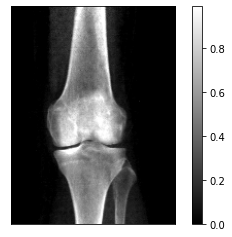

warped_image_B


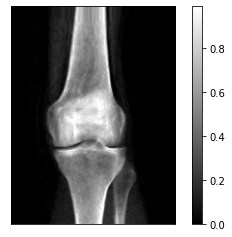

image_B


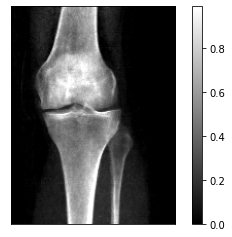

In [585]:
print("image_A")
show(image_A[5, 0])
print("warped_image_B")
show(netGrad.warped_image_B[5, 0])
print("image_B")
show(image_B[5, 0])

image_A


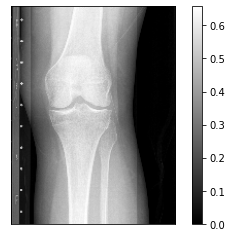

warped_image_B


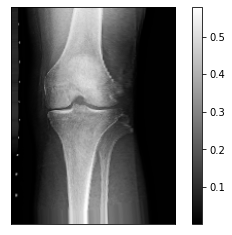

image_B


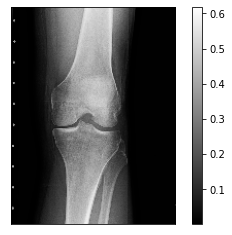

In [586]:
print("image_A")
show(image_A[7, 0])
print("warped_image_B")
show(netGrad.warped_image_B[7, 0])
print("image_B")
show(image_B[7, 0])

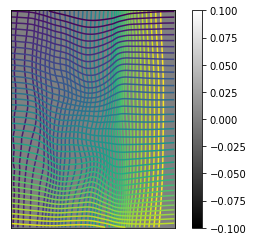

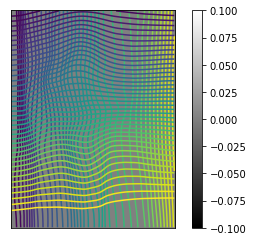

In [587]:
lines = np.arange(0, 1, 1/40)

plt.contour(netGrad.phi_AB_vectorfield[7, 1].detach().cpu(), lines)
plt.contour(netGrad.phi_AB_vectorfield[7, 0].detach().cpu(), lines)
show(image_A[0, 0] * 0)
plt.contour(netGrad.phi_BA_vectorfield[7, 1].detach().cpu(), lines)
plt.contour(netGrad.phi_BA_vectorfield[7, 0].detach().cpu(), lines)
show(image_A[0, 0] * 0)

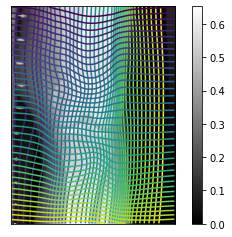

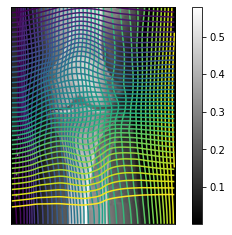

In [588]:
lines = np.arange(0, 1, 1/40)

plt.contour(netGrad.phi_AB_vectorfield[7, 1].detach().cpu(), lines)
plt.contour(netGrad.phi_AB_vectorfield[7, 0].detach().cpu(), lines)
show(netGrad.warped_image_A[7, 0])
plt.contour(netGrad.phi_BA_vectorfield[7, 1].detach().cpu(), lines)
plt.contour(netGrad.phi_BA_vectorfield[7, 0].detach().cpu(), lines)
show(netGrad.warped_image_B[7, 0])

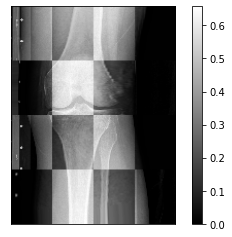

In [589]:
show(
    torch.tensor(
        itk.checker_board_image_filter(
            image_A[7, 0].cpu().numpy(), 
            netGrad.warped_image_B[7, 0].cpu().numpy()
        )
    )
)

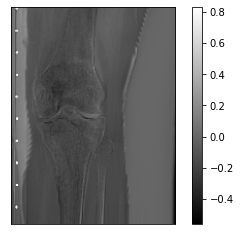

In [574]:
show((image_A[7, 0] - netGrad.warped_image_B[7, 0]))

In [25]:
atlas = torch.nn.Parameter(torch.randn(1, 1, 848 // 4, 640 // 4, device="cuda"))
with torch.no_grad():
    atlas[:] = torch.mean(radio_s, axis=0, keepdims=True)

atlas_exp = atlas.expand(BATCH_SIZE, -1, -1, -1).cuda()
params = [atlas]

In [26]:
optim = torch.optim.Adam(params, lr=.1)


In [27]:
for _ in range(1273):
    image_B = make_batch_radio()
    optim.zero_grad()
    loss_obj = netGrad(atlas_exp, image_B)
    disp_direction_loss = torch.mean(torch.mean(netGrad.phi_AB_vectorfield - netGrad.identity_map, axis=0)**2)
    print(disp_direction_loss)
    (loss_obj.all_loss + 300 * disp_direction_loss).backward()
    optim.step()
    print(icon.losses.to_floats(loss_obj))
    # a "regularizer"
    with torch.no_grad():
        atlas[:] = torch.clip(atlas, 0, .4)

tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.8791145086288452, inverse_consistency_loss=0.0067657241597771645, similarity_loss=0.8114572763442993, transform_magnitude=0.007392163388431072, flips=0.0)
tensor(0.0048, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=1.5089974403381348, inverse_consistency_loss=0.032811421900987625, similarity_loss=1.1808831691741943, transform_magnitude=0.008767806924879551, flips=0.0)
tensor(0.0024, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=1.4439669847488403, inverse_consistency_loss=0.02878803201019764, similarity_loss=1.1560866832733154, transform_magnitude=0.006772414781153202, flips=0.0)
tensor(0.0009, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=1.464040994644165, inverse_consistency_loss=0.027120016515254974, similarity_loss=1.192840814590454, transform_magnitude=0.004968055058270693, flips=0.0)
tensor(0.0008, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=1.4

tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.8130800127983093, inverse_consistency_loss=0.005707186181098223, similarity_loss=0.7560081481933594, transform_magnitude=0.005229318514466286, flips=0.0)
tensor(0.0004, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.7948391437530518, inverse_consistency_loss=0.00557319400832057, similarity_loss=0.7391071915626526, transform_magnitude=0.0055283415131270885, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.8227883577346802, inverse_consistency_loss=0.006324218586087227, similarity_loss=0.759546160697937, transform_magnitude=0.005218326114118099, flips=0.0)
tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.7911931276321411, inverse_consistency_loss=0.006309630814939737, similarity_loss=0.7280968427658081, transform_magnitude=0.004552942700684071, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.

tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.674349844455719, inverse_consistency_loss=0.00461682491004467, similarity_loss=0.6281815767288208, transform_magnitude=0.005384845193475485, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6912423372268677, inverse_consistency_loss=0.004506555385887623, similarity_loss=0.646176815032959, transform_magnitude=0.004602206405252218, flips=0.0)
tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6677278280258179, inverse_consistency_loss=0.0045693544670939445, similarity_loss=0.6220342516899109, transform_magnitude=0.0048891957849264145, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.7087218761444092, inverse_consistency_loss=0.004896113183349371, similarity_loss=0.6597607135772705, transform_magnitude=0.0049993544816970825, flips=0.0)
tensor(9.0799e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_lo

ICONLoss(all_loss=0.590269148349762, inverse_consistency_loss=0.0027489345520734787, similarity_loss=0.5627797842025757, transform_magnitude=0.004673313815146685, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6616223454475403, inverse_consistency_loss=0.0034715887159109116, similarity_loss=0.6269064545631409, transform_magnitude=0.005775857716798782, flips=0.0)
tensor(9.9376e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6382015943527222, inverse_consistency_loss=0.003595504444092512, similarity_loss=0.6022465229034424, transform_magnitude=0.004771085921674967, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6669324636459351, inverse_consistency_loss=0.0039232634007930756, similarity_loss=0.6276998519897461, transform_magnitude=0.005412478931248188, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6736152172088623, inverse_consistency_loss=0.00590

tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6385521292686462, inverse_consistency_loss=0.003915730863809586, similarity_loss=0.5993947982788086, transform_magnitude=0.004562855698168278, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.627952516078949, inverse_consistency_loss=0.003034548833966255, similarity_loss=0.5976070165634155, transform_magnitude=0.004955994430929422, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6385431289672852, inverse_consistency_loss=0.0038022310473024845, similarity_loss=0.6005208492279053, transform_magnitude=0.004659386817365885, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6189911365509033, inverse_consistency_loss=0.0034363819286227226, similarity_loss=0.5846273303031921, transform_magnitude=0.005111785605549812, flips=0.0)
tensor(0.0004, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=

ICONLoss(all_loss=0.6224154233932495, inverse_consistency_loss=0.0029393183067440987, similarity_loss=0.5930222272872925, transform_magnitude=0.005032031796872616, flips=0.0)
tensor(9.5819e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5989997386932373, inverse_consistency_loss=0.0029475190676748753, similarity_loss=0.5695245265960693, transform_magnitude=0.004913151729851961, flips=0.0)
tensor(6.0435e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5788047313690186, inverse_consistency_loss=0.0028923144564032555, similarity_loss=0.5498815774917603, transform_magnitude=0.004734055604785681, flips=0.0)
tensor(9.4833e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.594222366809845, inverse_consistency_loss=0.0029766387306153774, similarity_loss=0.5644559860229492, transform_magnitude=0.005079357884824276, flips=0.0)
tensor(9.6443e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5789621472358704, inverse_consistency

tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6153302788734436, inverse_consistency_loss=0.00302560324780643, similarity_loss=0.585074245929718, transform_magnitude=0.005279078148305416, flips=0.0)
tensor(5.4629e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5828320980072021, inverse_consistency_loss=0.0030882423743605614, similarity_loss=0.551949679851532, transform_magnitude=0.004981471225619316, flips=0.0)
tensor(8.8592e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5935240983963013, inverse_consistency_loss=0.0031033398117870092, similarity_loss=0.562490701675415, transform_magnitude=0.005057710222899914, flips=0.0)
tensor(8.3151e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5941188335418701, inverse_consistency_loss=0.0029612986836582422, similarity_loss=0.5645058751106262, transform_magnitude=0.0048668161034584045, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLos

ICONLoss(all_loss=0.5988141894340515, inverse_consistency_loss=0.00367316254414618, similarity_loss=0.5620825886726379, transform_magnitude=0.005390186328440905, flips=0.0)
tensor(9.4187e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.610052764415741, inverse_consistency_loss=0.003354114480316639, similarity_loss=0.5765116214752197, transform_magnitude=0.00506330793723464, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5930718779563904, inverse_consistency_loss=0.0030280319042503834, similarity_loss=0.5627915859222412, transform_magnitude=0.004443345125764608, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6065713167190552, inverse_consistency_loss=0.0030738143250346184, similarity_loss=0.5758332014083862, transform_magnitude=0.004728964064270258, flips=0.0)
tensor(8.2120e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.5897185802459717, inverse_consistency_loss=0.0029

tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6204323172569275, inverse_consistency_loss=0.0033095558173954487, similarity_loss=0.5873367786407471, transform_magnitude=0.00470039714127779, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6242038607597351, inverse_consistency_loss=0.0033465793821960688, similarity_loss=0.59073805809021, transform_magnitude=0.005072238389402628, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6404477953910828, inverse_consistency_loss=0.0033475104719400406, similarity_loss=0.6069726943969727, transform_magnitude=0.004843662492930889, flips=0.0)
tensor(0.0001, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6408640742301941, inverse_consistency_loss=0.00320735527202487, similarity_loss=0.6087905168533325, transform_magnitude=0.004756002686917782, flips=0.0)
tensor(8.5927e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_los

ICONLoss(all_loss=0.6202141642570496, inverse_consistency_loss=0.0033945473842322826, similarity_loss=0.5862686634063721, transform_magnitude=0.005265069659799337, flips=0.0)
tensor(5.3821e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6196324825286865, inverse_consistency_loss=0.0038748830556869507, similarity_loss=0.5808836817741394, transform_magnitude=0.0053601642139256, flips=0.0)
tensor(6.1398e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6178554892539978, inverse_consistency_loss=0.00329317944124341, similarity_loss=0.5849236845970154, transform_magnitude=0.00487609812989831, flips=0.0)
tensor(9.2613e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6250745058059692, inverse_consistency_loss=0.0035780020989477634, similarity_loss=0.5892944931983948, transform_magnitude=0.005309269763529301, flips=0.0)
tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6039912700653076, inverse_consistency_loss=0.

tensor(8.4881e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6399919986724854, inverse_consistency_loss=0.0036876662634313107, similarity_loss=0.6031153202056885, transform_magnitude=0.004987829830497503, flips=0.0)
tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6280912756919861, inverse_consistency_loss=0.003340950235724449, similarity_loss=0.5946817994117737, transform_magnitude=0.004575563129037619, flips=0.0)
tensor(6.6011e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.642682671546936, inverse_consistency_loss=0.003444089088588953, similarity_loss=0.6082417964935303, transform_magnitude=0.00471866549924016, flips=0.0)
tensor(7.3452e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICONLoss(all_loss=0.6207320094108582, inverse_consistency_loss=0.003270059358328581, similarity_loss=0.5880314111709595, transform_magnitude=0.005061828065663576, flips=0.0)
tensor(6.9953e-05, device='cuda:0', grad_fn=<MeanBackward0>)
ICON

KeyboardInterrupt: 

In [32]:
image_B = make_batch_radio()
N = 0
with torch.no_grad():
    netGrad(atlas.expand(128, -1, -1, -1).cuda(), image_B)

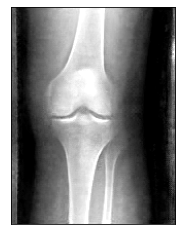

In [33]:
show(atlas[0, 0])

image


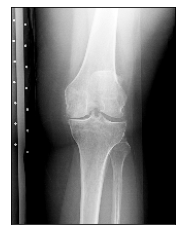

warped_atlas


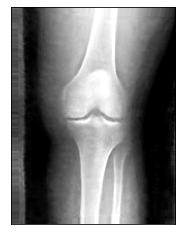

warped_image


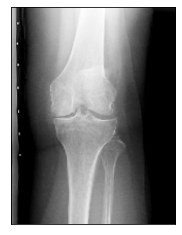

difference image


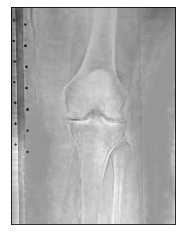

In [35]:
N += 1
N %= 128
print("image")
show(image_B[N, 0])
print("warped_atlas")
show(netGrad.warped_image_A[N, 0])
print("warped_image")
show(netGrad.warped_image_B[N, 0])
print("difference image")
show((netGrad.warped_image_A[N, 0]) - (image_B[N, 0]))

atlas_checkerboard


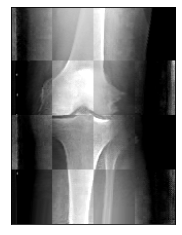

atlas_checkerboard


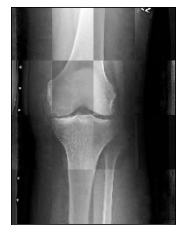

atlas_checkerboard


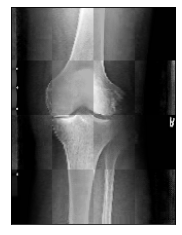

atlas_checkerboard


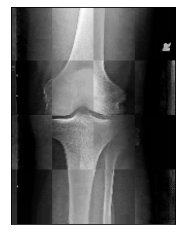

atlas_checkerboard


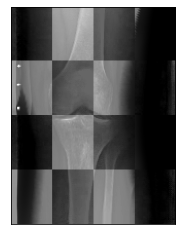

atlas_checkerboard


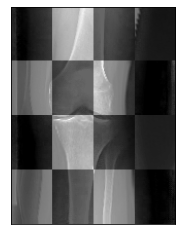

atlas_checkerboard


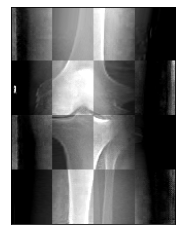

atlas_checkerboard


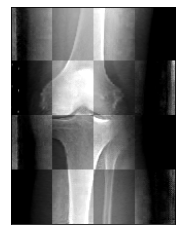

atlas_checkerboard


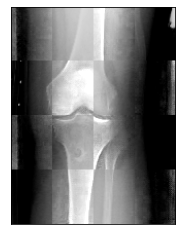

atlas_checkerboard


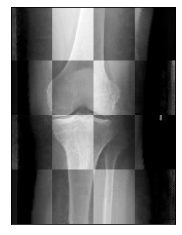

atlas_checkerboard


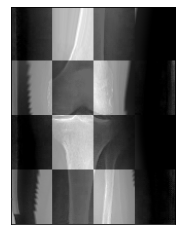

atlas_checkerboard


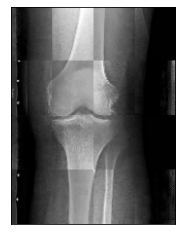

atlas_checkerboard


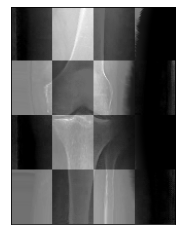

atlas_checkerboard


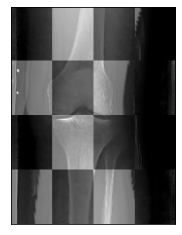

atlas_checkerboard


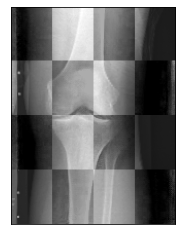

atlas_checkerboard


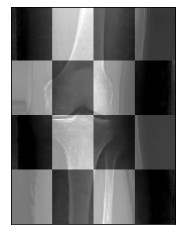

atlas_checkerboard


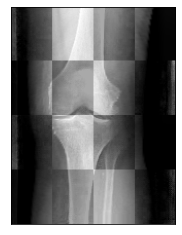

atlas_checkerboard


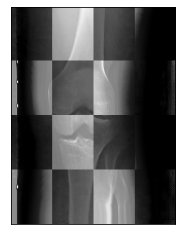

atlas_checkerboard


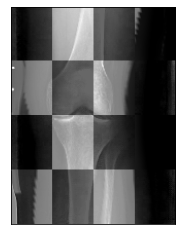

atlas_checkerboard


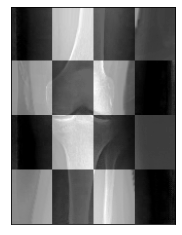

atlas_checkerboard


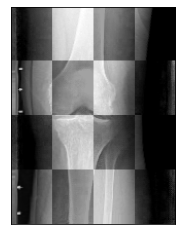

atlas_checkerboard


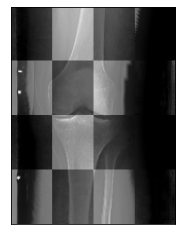

atlas_checkerboard


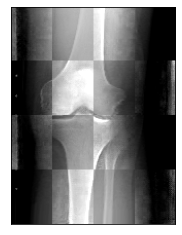

atlas_checkerboard


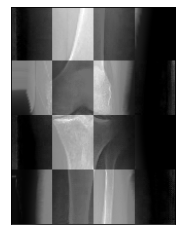

atlas_checkerboard


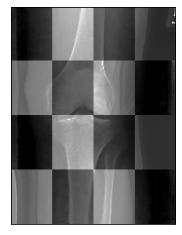

In [36]:
for _ in range(25):
    N += 1
    N %= 128
    print("atlas_checkerboard")
    show(
        torch.tensor(
            itk.checker_board_image_filter(
                atlas[0, 0].detach().cpu().numpy(), 
                netGrad.warped_image_B[N, 0].cpu().numpy()
            )
        )
    )

warped_image


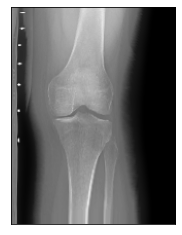

warped_image


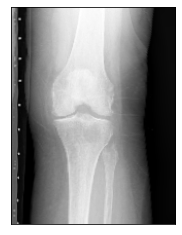

warped_image


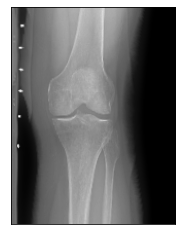

warped_image


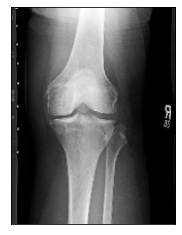

warped_image


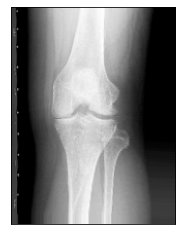

warped_image


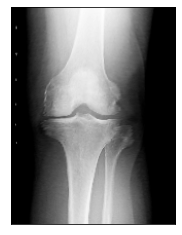

warped_image


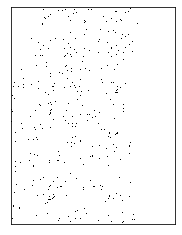

warped_image


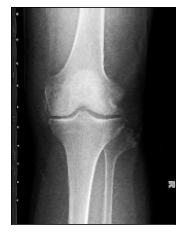

warped_image


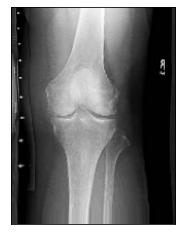

warped_image


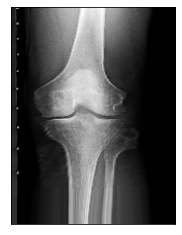

warped_image


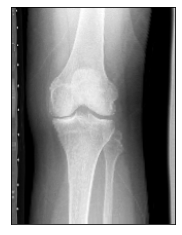

warped_image


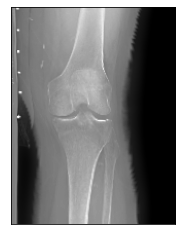

warped_image


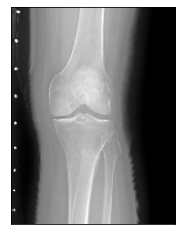

warped_image


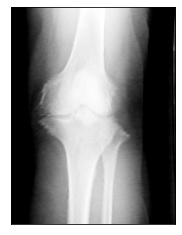

warped_image


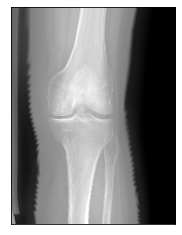

warped_image


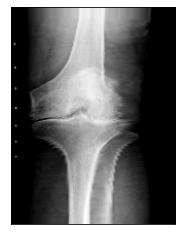

warped_image


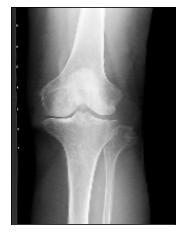

warped_image


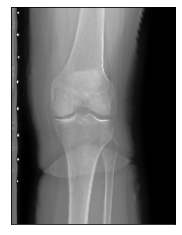

warped_image


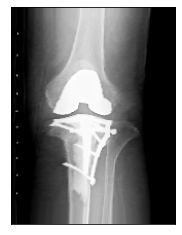

warped_image


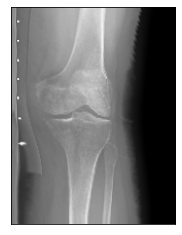

warped_image


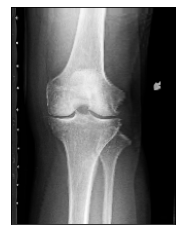

warped_image


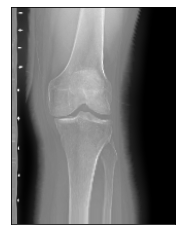

warped_image


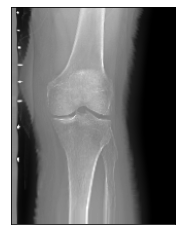

warped_image


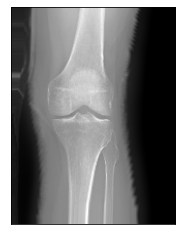

warped_image


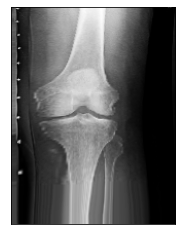

In [37]:
for _ in range(25):
    N += 1
    N %= 128
    print("warped_image")
    show(netGrad.warped_image_B[N, 0])

warped_image_grid


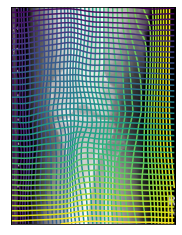

warped_image_grid


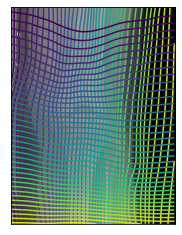

warped_image_grid


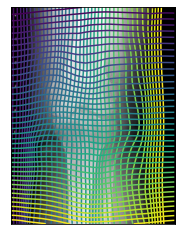

warped_image_grid


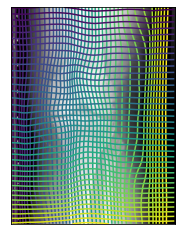

warped_image_grid


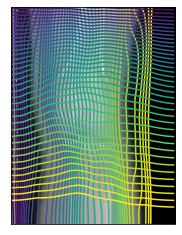

warped_image_grid


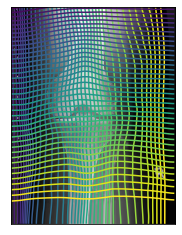

warped_image_grid


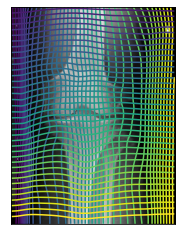

warped_image_grid


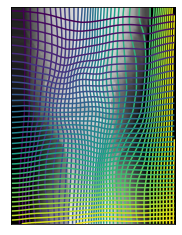

warped_image_grid


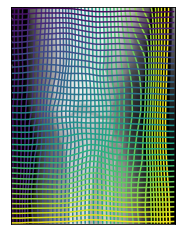

warped_image_grid


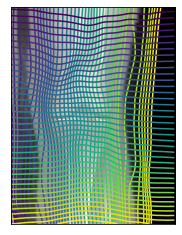

warped_image_grid


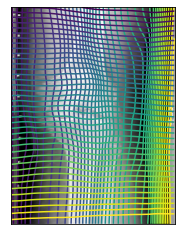

warped_image_grid


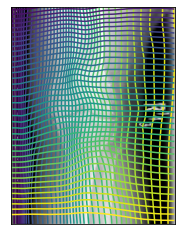

warped_image_grid


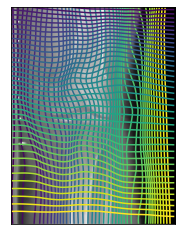

warped_image_grid


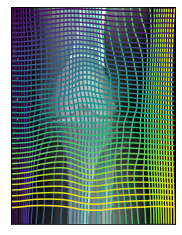

warped_image_grid


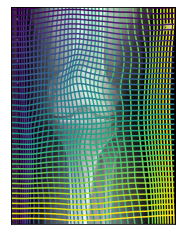

warped_image_grid


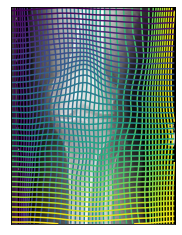

warped_image_grid


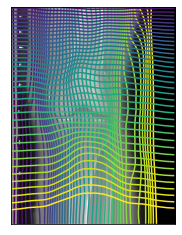

warped_image_grid


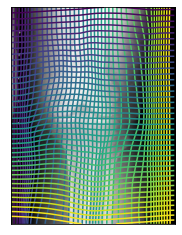

warped_image_grid


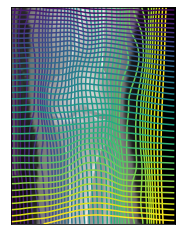

warped_image_grid


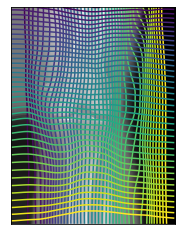

warped_image_grid


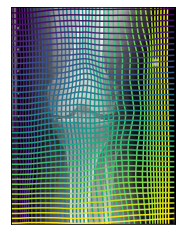

warped_image_grid


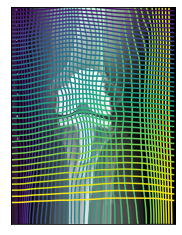

warped_image_grid


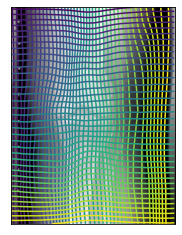

warped_image_grid


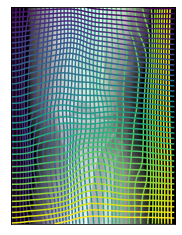

warped_image_grid


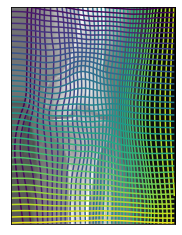

In [38]:
for _ in range(25):
    N += 1
    N %= 128

    print("warped_image_grid")
    lines = np.arange(0, 1, 1/40)

    plt.contour(netGrad.phi_BA_vectorfield[N, 1].detach().cpu(), lines)
    plt.contour(netGrad.phi_BA_vectorfield[N, 0].detach().cpu(), lines)

    show(netGrad.warped_image_B[N, 0])

In [602]:
atlas.shape

torch.Size([1, 1, 212, 160])

In [603]:
torch.mean(netGrad.warped_image_B, axis=0).shape

torch.Size([2, 212, 160])

In [ ]:
pip install antspyx

In [39]:
import ants
imageA_ants = ants.from_numpy(image_A[0, 0].detach().cpu().numpy())
imageB_ants = ants.from_numpy(image_B[0, 0].detach().cpu().numpy())

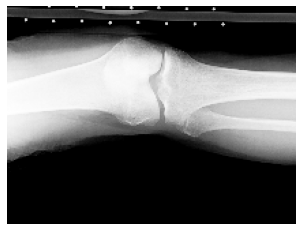

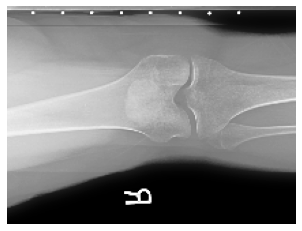

In [40]:
imageA_ants.plot()
imageB_ants.plot()

In [41]:
mytx = ants.registration(fixed=imageA_ants , moving=imageB_ants, type_of_transform='SyN' )

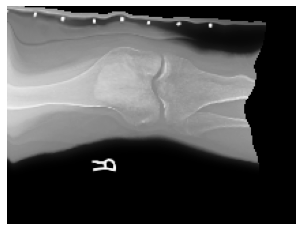

In [42]:
warped_moving = mytx['warpedmovout']
warped_moving.plot()

In [497]:
netGrad(image_A, image_B)

ICONLoss(all_loss=tensor(0.9428, device='cuda:0', grad_fn=<AddBackward0>), inverse_consistency_loss=tensor(0.0114, device='cuda:0', grad_fn=<AddBackward0>), similarity_loss=tensor(0.9086, device='cuda:0', grad_fn=<AddBackward0>), transform_magnitude=tensor(0.0086, device='cuda:0', grad_fn=<MeanBackward0>), flips=tensor(0.))

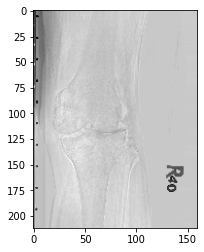

In [504]:
show(netGrad.warped_image_B[0, 0] - image_A[0, 0])

In [86]:
image_A.shape

torch.Size([128, 1, 212, 160])

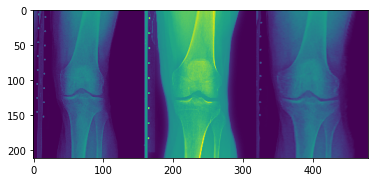

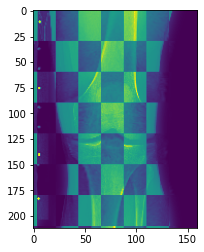

In [155]:
#N = (N -1) % 128
A = image_A[N, 0].cpu().detach().numpy()
B = image_B[N, 0].cpu().detach().numpy()
WA = netGrad.warped_image_A[N, 0].cpu().detach().numpy()

plt.imshow(np.concatenate([A, B, WA], 1))
plt.show()
plt.imshow(itk.checker_board_image_filter(B, WA, checker_pattern=7))

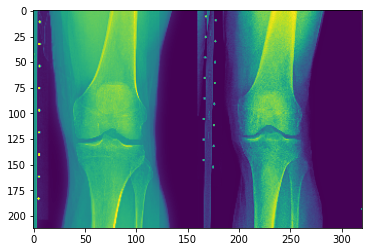

In [151]:
QQ = itk.histogram_matching_image_filter(B, A)
plt.imshow(np.concatenate([QQ, A], 1))

In [153]:
itk.checker_board_image_filter?

In [555]:
import torch.nn as nn
class UNet(nn.Module):
    def __init__(self, num_layers, channels, dimension):
        super().__init__()

        self.num_layers = num_layers
        down_channels = np.array(channels[0])
        up_channels_out = np.array(channels[1][1:])
        up_channels_in = down_channels[1:] + np.concatenate([up_channels_out[1:], [0]])
        self.downConvs = nn.ModuleList([])
        self.upConvs = nn.ModuleList([])

        for depth in range(self.num_layers):
            self.downConvs.append(
                nn.Conv2d(
                    down_channels[depth],
                    down_channels[depth + 1],
                    kernel_size=3,
                    padding=1,
                    stride=2,
                )
            )
            self.upConvs.append(
                nn.ConvTranspose2d(
                    up_channels_in[depth],
                    up_channels_out[depth],
                    kernel_size=4,
                    padding=1,
                    stride=2,
                )
            )

        self.lastConv = nn.Conv2d(17, channels[1][0], kernel_size=3, padding=1)

    def forward(self, x):
        skips = []
        for depth in range(self.num_layers):
            skips.append(x)
            x = F.gelu(self.downConvs[depth](x))
        for depth in reversed(range(self.num_layers)):
            x = F.gelu(self.upConvs[depth](x))

            x = x[:, :, : skips[depth].size()[2], : skips[depth].size()[3]]
            x = torch.cat([x, skips[depth]], 1)
        x = self.lastConv(x) / 10
        return x 

genA = UNet(5, [[1, 16, 32, 32, 32, 32], [1, 16, 32, 32, 32, 32]], 2)
discA = UNet(5, [[1, 16, 32, 32, 32, 32], [1, 16, 32, 32, 32, 32]], 2)

genB = UNet(5, [[1, 16, 32, 32, 32, 32], [1, 16, 32, 32, 32, 32]], 2)
discB = UNet(5, [[1, 16, 32, 32, 32, 32], [1, 16, 32, 32, 32, 32]], 2)

In [556]:


import torch.nn.functional as F
class Generator(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.cnvA = torch.nn.Conv2d(1, 64, 5, padding="same")
        self.cnvB = torch.nn.Conv2d(64, 64, 5, padding="same")
        self.cnvD = torch.nn.Conv2d(64, 64, 5, dilation=3, padding="same")
        self.cnvC = torch.nn.Conv2d(64, 1, 5, padding="same")
    def forward(self, x):
        x = torch.nn.functional.gelu(self.cnvA(x))
        x = torch.nn.functional.gelu(self.cnvD(x))
        x = torch.nn.functional.gelu(self.cnvB(x))
        x = self.cnvC(x)
        return x

#gen = Generator()
#disc = Generator()



genA.cuda()
discA.cuda()

genA_opt = torch.optim.Adam(genA.parameters(), lr=1e-4, betas=(0, .9))
discA_opt = torch.optim.Adam(discA.parameters(), lr=1e-3, betas=(0, .9))
genA_loss_list = []
discA_loss_list = []

discA_penalty_list = []

genB.cuda()
discB.cuda()

genB_opt = torch.optim.Adam(genB.parameters(), lr=1e-4, betas=(0, .9))
discB_opt = torch.optim.Adam(discB.parameters(), lr=1e-3, betas=(0, .9))
genB_loss_list = []
discB_loss_list = []

discB_penalty_list = []




In [337]:
BATCH_SIZE=16
import tqdm
for _ in tqdm.tqdm(range(800)):
  for _ in range(30):
    genA_opt.zero_grad()
    noise = make_batch_radio()
    fakes = genA(noise)
    scores = discA(fakes)

    gen_loss = torch.mean(F.softplus(-scores))
    genA_loss_list.append(gen_loss.item())

    gen_loss.backward()
    genA_opt.step()
    discA_opt.zero_grad()
    noise = make_batch_radio()
    fakes = gen(noise)
    batch = make_batch_dxa()
    batch.requires_grad=True

    
    scores_real = torch.mean(discA(batch), [1, 2, 3])
    scores_fake = torch.mean(discA(fakes), [1, 2, 3])


    score_gradient = torch.autograd.grad(
        scores_real, batch, torch.ones(scores_real.shape, device='cuda'), create_graph=True)

    disc_loss = torch.mean(F.softplus(scores_fake)) + torch.mean(F.softplus(-scores_real)) 
    #disc_loss = torch.mean((scores_fake)**2) + torch.mean((1 - scores_real)**2)
    disc_penalty = 30 * torch.sum((score_gradient[0])**2) / BATCH_SIZE
    discA_loss_list.append(disc_loss.item())
    discA_penalty_list.append(disc_penalty.item())
    (disc_loss + disc_penalty).backward()
    discA_opt.step()
    
    genB_opt.zero_grad()
    noise = make_batch_dxa()
    fakes = genB(noise)
    scores = discB(fakes)

    gen_loss = torch.mean(F.softplus(-scores))
    genB_loss_list.append(gen_loss.item())

    gen_loss.backward()
    genB_opt.step()
    discB_opt.zero_grad()
    noise = make_batch_dxa()
    fakes = genB(noise)
    batch = make_batch_radio()
    batch.requires_grad=True

    
    scores_real = torch.mean(discB(batch), [1, 2, 3])
    scores_fake = torch.mean(discB(fakes), [1, 2, 3])


    score_gradient = torch.autograd.grad(
        scores_real, batch, torch.ones(scores_real.shape, device='cuda'), create_graph=True)

    disc_loss = torch.mean(F.softplus(scores_fake)) + torch.mean(F.softplus(-scores_real)) 
    #disc_loss = torch.mean((scores_fake)**2) + torch.mean((1 - scores_real)**2)
    disc_penalty = 30 * torch.sum((score_gradient[0])**2) / BATCH_SIZE
    discB_loss_list.append(disc_loss.item())
    discB_penalty_list.append(disc_penalty.item())
    (disc_loss + disc_penalty).backward()
    discB_opt.step()
    
    
    # cycle consistency
    genB_opt.zero_grad()
    genA_opt.zero_grad()
    start = make_batch_radio()
    end = genB(genA(start))
    
    (30 * torch.mean((start - end)**2)).backward()
    
    start = make_batch_dxa()
    end = genA(genB(start))
    
    (30 * torch.mean((start - end)**2)).backward()
    
    genA_opt.step()
    genB_opt.step()
    

  4%|█▋                                      | 33/800 [05:54<2:17:09, 10.73s/it]


KeyboardInterrupt: 

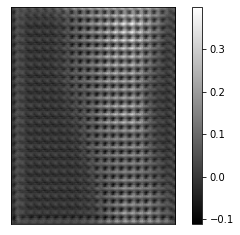

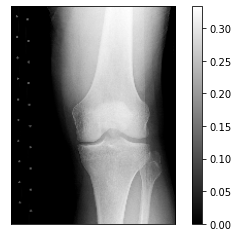

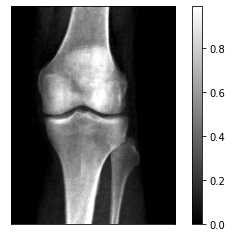

In [338]:
N += 1
N %= 16
show(fakes[N, 0])
show(noise[N, 0])
show(batch[N, 0])

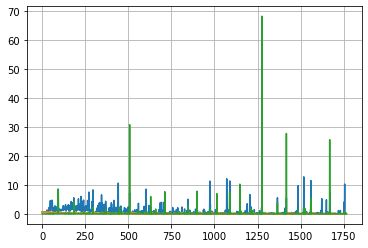

In [339]:
import numpy as np
plt.plot(genA_loss_list)
plt.plot(np.array(discA_loss_list) / 2)
plt.plot(np.array(discA_penalty_list))

plt.grid()

In [340]:
torch.nn.Conv2d?

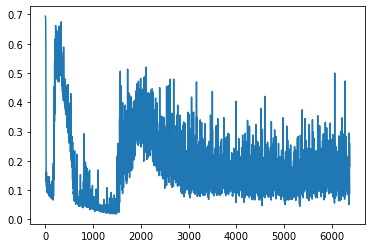

In [341]:
plt.plot(np.array(disc_loss_list) / 2)


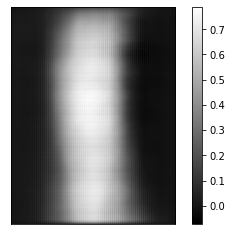

In [342]:
show(end[0, 0])

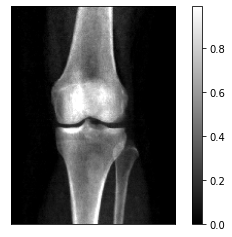

In [343]:
show(start[0, 0])

In [344]:
torch.mean((start - end)**2)

tensor(0.0218, device='cuda:0', grad_fn=<MeanBackward0>)

In [559]:
translator = UNet(4, [[1, 16, 32, 64, 128], [2, 16, 32, 64, 128]], 2)
#netGrad.similarity = lambda x, y: (5 * icon.losses.ssd(x, y) + .1  * icon.LNCC(sigma=5)(x, y))
netGrad.similarity = icon.LNCC(sigma=5)
#netGrad.similarity = icon.losses.ncc

In [560]:
translator.cuda()
trans_opt = torch.optim.Adam(translator.parameters(), lr=.001)

In [563]:
BATCH_SIZE=128
for _ in range(10000):
    trans_opt.zero_grad()
    batch_dxa = make_batch_dxa()
    batch_radio = make_batch_radio()
    
    trans_rescale = translator(batch_radio)
    
    scale = trans_rescale[:, 1:]
    shift = trans_rescale[:, :1]


    trans_batch_radio = scale * batch_radio + shift

    loss_obj = netGrad(batch_dxa, trans_batch_radio)
    #reg_loss = netGrad.similarity(trans_batch_radio, batch_radio)
    #print(reg_loss)
    #(loss_obj.all_loss + .1 * reg_loss).backward()
    loss_obj.all_loss.backward()
    print(icon.losses.to_floats(loss_obj))
    trans_opt.step()

ICONLoss(all_loss=1.2098509073257446, inverse_consistency_loss=0.02019738033413887, similarity_loss=1.0078771114349365, transform_magnitude=0.008352040313184261, flips=0.0)
ICONLoss(all_loss=1.2017418146133423, inverse_consistency_loss=0.019595742225646973, similarity_loss=1.0057843923568726, transform_magnitude=0.007557298522442579, flips=0.0)
ICONLoss(all_loss=1.2289094924926758, inverse_consistency_loss=0.020769089460372925, similarity_loss=1.0212185382843018, transform_magnitude=0.007844009436666965, flips=0.0)
ICONLoss(all_loss=1.2124404907226562, inverse_consistency_loss=0.020383834838867188, similarity_loss=1.0086021423339844, transform_magnitude=0.008108857087790966, flips=0.0)
ICONLoss(all_loss=1.204482078552246, inverse_consistency_loss=0.020749609917402267, similarity_loss=0.996985912322998, transform_magnitude=0.008191417902708054, flips=0.0)
ICONLoss(all_loss=1.2230195999145508, inverse_consistency_loss=0.02050580456852913, similarity_loss=1.0179615020751953, transform_mag

ICONLoss(all_loss=1.2105305194854736, inverse_consistency_loss=0.020617583766579628, similarity_loss=1.00435471534729, transform_magnitude=0.008229139260947704, flips=0.0)
ICONLoss(all_loss=1.176099181175232, inverse_consistency_loss=0.019935546442866325, similarity_loss=0.976743757724762, transform_magnitude=0.008606232702732086, flips=0.0)
ICONLoss(all_loss=1.1760430335998535, inverse_consistency_loss=0.019611956551671028, similarity_loss=0.97992342710495, transform_magnitude=0.007832749746739864, flips=0.0)
ICONLoss(all_loss=1.1871700286865234, inverse_consistency_loss=0.020221328362822533, similarity_loss=0.9849567413330078, transform_magnitude=0.008216588757932186, flips=0.0)
ICONLoss(all_loss=1.198843240737915, inverse_consistency_loss=0.021499957889318466, similarity_loss=0.9838436841964722, transform_magnitude=0.008001548238098621, flips=0.0)
ICONLoss(all_loss=1.1801289319992065, inverse_consistency_loss=0.02006535977125168, similarity_loss=0.9794753789901733, transform_magnitu

ICONLoss(all_loss=1.1717305183410645, inverse_consistency_loss=0.020717717707157135, similarity_loss=0.9645532965660095, transform_magnitude=0.008829278871417046, flips=0.0)
ICONLoss(all_loss=1.14816153049469, inverse_consistency_loss=0.018499424681067467, similarity_loss=0.9631672501564026, transform_magnitude=0.007471487391740084, flips=0.0)
ICONLoss(all_loss=1.1401859521865845, inverse_consistency_loss=0.01917348988354206, similarity_loss=0.948451042175293, transform_magnitude=0.009416359476745129, flips=0.0)
ICONLoss(all_loss=1.1538166999816895, inverse_consistency_loss=0.019863786175847054, similarity_loss=0.9551788568496704, transform_magnitude=0.00809532217681408, flips=0.0)
ICONLoss(all_loss=1.1720974445343018, inverse_consistency_loss=0.02099953591823578, similarity_loss=0.9621021151542664, transform_magnitude=0.00879280548542738, flips=0.0)
ICONLoss(all_loss=1.1412166357040405, inverse_consistency_loss=0.019546132534742355, similarity_loss=0.9457553029060364, transform_magnit

ICONLoss(all_loss=1.17962646484375, inverse_consistency_loss=0.020407244563102722, similarity_loss=0.9755540490150452, transform_magnitude=0.008840981870889664, flips=0.0)
ICONLoss(all_loss=1.1525870561599731, inverse_consistency_loss=0.019586611539125443, similarity_loss=0.9567209482192993, transform_magnitude=0.009002343751490116, flips=0.0)
ICONLoss(all_loss=1.1430469751358032, inverse_consistency_loss=0.019347110763192177, similarity_loss=0.9495759010314941, transform_magnitude=0.008581230416893959, flips=0.0)
ICONLoss(all_loss=1.1499665975570679, inverse_consistency_loss=0.019422871991991997, similarity_loss=0.955737829208374, transform_magnitude=0.007516368757933378, flips=0.0)
ICONLoss(all_loss=1.1503700017929077, inverse_consistency_loss=0.019110310822725296, similarity_loss=0.9592669010162354, transform_magnitude=0.009315598756074905, flips=0.0)
ICONLoss(all_loss=1.17416250705719, inverse_consistency_loss=0.019957268610596657, similarity_loss=0.9745898246765137, transform_magn

ICONLoss(all_loss=1.1416146755218506, inverse_consistency_loss=0.019302302971482277, similarity_loss=0.9485917091369629, transform_magnitude=0.00922243483364582, flips=0.0)
ICONLoss(all_loss=1.1211003065109253, inverse_consistency_loss=0.0188925638794899, similarity_loss=0.9321746826171875, transform_magnitude=0.008600802160799503, flips=0.0)
ICONLoss(all_loss=1.1113579273223877, inverse_consistency_loss=0.01923438347876072, similarity_loss=0.919014036655426, transform_magnitude=0.008949752897024155, flips=0.0)
ICONLoss(all_loss=1.128103256225586, inverse_consistency_loss=0.0195930078625679, similarity_loss=0.9321731328964233, transform_magnitude=0.009254046715795994, flips=0.0)
ICONLoss(all_loss=1.087834358215332, inverse_consistency_loss=0.017539625987410545, similarity_loss=0.9124380350112915, transform_magnitude=0.008330618031322956, flips=0.0)
ICONLoss(all_loss=1.1258325576782227, inverse_consistency_loss=0.019596630707383156, similarity_loss=0.9298663139343262, transform_magnitud

ICONLoss(all_loss=1.1384949684143066, inverse_consistency_loss=0.020066410303115845, similarity_loss=0.937830924987793, transform_magnitude=0.008570528589189053, flips=0.0)
ICONLoss(all_loss=1.102038860321045, inverse_consistency_loss=0.017661025747656822, similarity_loss=0.925428569316864, transform_magnitude=0.00870447512716055, flips=0.0)
ICONLoss(all_loss=1.1227461099624634, inverse_consistency_loss=0.01908443681895733, similarity_loss=0.9319016933441162, transform_magnitude=0.008296259678900242, flips=0.0)
ICONLoss(all_loss=1.1001150608062744, inverse_consistency_loss=0.0188948605209589, similarity_loss=0.9111664295196533, transform_magnitude=0.008198142983019352, flips=0.0)
ICONLoss(all_loss=1.1039228439331055, inverse_consistency_loss=0.018756218254566193, similarity_loss=0.91636061668396, transform_magnitude=0.008530665189027786, flips=0.0)
ICONLoss(all_loss=1.154091715812683, inverse_consistency_loss=0.02040666900575161, similarity_loss=0.9500250220298767, transform_magnitude=

ICONLoss(all_loss=1.0668796300888062, inverse_consistency_loss=0.016993960365653038, similarity_loss=0.8969399929046631, transform_magnitude=0.008408873341977596, flips=0.0)
ICONLoss(all_loss=1.1213788986206055, inverse_consistency_loss=0.019539177417755127, similarity_loss=0.9259871244430542, transform_magnitude=0.008565349504351616, flips=0.0)
ICONLoss(all_loss=1.0541867017745972, inverse_consistency_loss=0.016911879181861877, similarity_loss=0.8850679397583008, transform_magnitude=0.007904225029051304, flips=0.0)
ICONLoss(all_loss=1.091380000114441, inverse_consistency_loss=0.017472894862294197, similarity_loss=0.9166510105133057, transform_magnitude=0.008094457909464836, flips=0.0)
ICONLoss(all_loss=1.095097303390503, inverse_consistency_loss=0.017815202474594116, similarity_loss=0.9169453382492065, transform_magnitude=0.009086769074201584, flips=0.0)
ICONLoss(all_loss=1.0887057781219482, inverse_consistency_loss=0.017517494037747383, similarity_loss=0.9135308861732483, transform_m

ICONLoss(all_loss=1.0635665655136108, inverse_consistency_loss=0.01739650033414364, similarity_loss=0.8896015882492065, transform_magnitude=0.009520603343844414, flips=0.0)
ICONLoss(all_loss=1.0736875534057617, inverse_consistency_loss=0.0166500024497509, similarity_loss=0.9071875810623169, transform_magnitude=0.008507595397531986, flips=0.0)
ICONLoss(all_loss=1.054175615310669, inverse_consistency_loss=0.016667958348989487, similarity_loss=0.8874960541725159, transform_magnitude=0.00798735674470663, flips=0.0)
ICONLoss(all_loss=1.0731600522994995, inverse_consistency_loss=0.017569245770573616, similarity_loss=0.8974675536155701, transform_magnitude=0.008700655773282051, flips=0.0)
ICONLoss(all_loss=1.0763955116271973, inverse_consistency_loss=0.017468314617872238, similarity_loss=0.9017124176025391, transform_magnitude=0.008619560860097408, flips=0.0)
ICONLoss(all_loss=1.0736863613128662, inverse_consistency_loss=0.017090018838644028, similarity_loss=0.902786135673523, transform_magni

ICONLoss(all_loss=1.0758488178253174, inverse_consistency_loss=0.017448049038648605, similarity_loss=0.9013683795928955, transform_magnitude=0.009291357360780239, flips=0.0)
ICONLoss(all_loss=1.035730242729187, inverse_consistency_loss=0.015629900619387627, similarity_loss=0.8794312477111816, transform_magnitude=0.009160204790532589, flips=0.0)
ICONLoss(all_loss=1.0381742715835571, inverse_consistency_loss=0.016652747988700867, similarity_loss=0.8716467618942261, transform_magnitude=0.009255146607756615, flips=0.0)
ICONLoss(all_loss=1.0242291688919067, inverse_consistency_loss=0.015783164650201797, similarity_loss=0.8663975596427917, transform_magnitude=0.008518407121300697, flips=0.0)
ICONLoss(all_loss=1.0405511856079102, inverse_consistency_loss=0.01644488424062729, similarity_loss=0.8761023283004761, transform_magnitude=0.008756259456276894, flips=0.0)
ICONLoss(all_loss=1.0353351831436157, inverse_consistency_loss=0.016543574631214142, similarity_loss=0.8698994517326355, transform_m

ICONLoss(all_loss=1.0282014608383179, inverse_consistency_loss=0.01571907103061676, similarity_loss=0.8710107803344727, transform_magnitude=0.00980796292424202, flips=0.0)
ICONLoss(all_loss=1.0199470520019531, inverse_consistency_loss=0.01461879163980484, similarity_loss=0.8737591505050659, transform_magnitude=0.0086568184196949, flips=0.0)
ICONLoss(all_loss=1.037925124168396, inverse_consistency_loss=0.015673670917749405, similarity_loss=0.8811883926391602, transform_magnitude=0.009663218632340431, flips=0.0)
ICONLoss(all_loss=1.01828134059906, inverse_consistency_loss=0.015043117105960846, similarity_loss=0.8678501844406128, transform_magnitude=0.008061173371970654, flips=0.0)
ICONLoss(all_loss=1.029857873916626, inverse_consistency_loss=0.015873167663812637, similarity_loss=0.8711261749267578, transform_magnitude=0.00886804610490799, flips=0.0)
ICONLoss(all_loss=1.0308630466461182, inverse_consistency_loss=0.01629321277141571, similarity_loss=0.8679308891296387, transform_magnitude=

ICONLoss(all_loss=1.005329966545105, inverse_consistency_loss=0.014963839203119278, similarity_loss=0.8556915521621704, transform_magnitude=0.009010594338178635, flips=0.0)
ICONLoss(all_loss=1.0227349996566772, inverse_consistency_loss=0.016300061717629433, similarity_loss=0.8597344160079956, transform_magnitude=0.00954088382422924, flips=0.0)
ICONLoss(all_loss=1.0009243488311768, inverse_consistency_loss=0.015168738551437855, similarity_loss=0.8492370247840881, transform_magnitude=0.009082493372261524, flips=0.0)
ICONLoss(all_loss=1.005077838897705, inverse_consistency_loss=0.015032125636935234, similarity_loss=0.8547565937042236, transform_magnitude=0.008600374683737755, flips=0.0)
ICONLoss(all_loss=1.0256458520889282, inverse_consistency_loss=0.015561949461698532, similarity_loss=0.8700263500213623, transform_magnitude=0.009427919052541256, flips=0.0)
ICONLoss(all_loss=1.0157831907272339, inverse_consistency_loss=0.01528630405664444, similarity_loss=0.8629201650619507, transform_mag

ICONLoss(all_loss=0.9944558143615723, inverse_consistency_loss=0.014024140313267708, similarity_loss=0.8542144298553467, transform_magnitude=0.009175991639494896, flips=0.0)
ICONLoss(all_loss=1.014011263847351, inverse_consistency_loss=0.014592986553907394, similarity_loss=0.8680813908576965, transform_magnitude=0.008561341091990471, flips=0.0)
ICONLoss(all_loss=1.006079077720642, inverse_consistency_loss=0.014632686041295528, similarity_loss=0.8597521781921387, transform_magnitude=0.00951260607689619, flips=0.0)
ICONLoss(all_loss=0.9870186448097229, inverse_consistency_loss=0.014607245102524757, similarity_loss=0.8409461975097656, transform_magnitude=0.00881131924688816, flips=0.0)
ICONLoss(all_loss=1.0363916158676147, inverse_consistency_loss=0.015931710600852966, similarity_loss=0.8770745396614075, transform_magnitude=0.008970110677182674, flips=0.0)
ICONLoss(all_loss=0.9902804493904114, inverse_consistency_loss=0.01409890502691269, similarity_loss=0.8492913842201233, transform_magn

ICONLoss(all_loss=1.0088062286376953, inverse_consistency_loss=0.015281563624739647, similarity_loss=0.8559905886650085, transform_magnitude=0.009076048620045185, flips=0.0)
ICONLoss(all_loss=0.9841258525848389, inverse_consistency_loss=0.014811430126428604, similarity_loss=0.836011528968811, transform_magnitude=0.008596919476985931, flips=0.0)
ICONLoss(all_loss=0.9549310207366943, inverse_consistency_loss=0.013220613822340965, similarity_loss=0.8227248787879944, transform_magnitude=0.008234946988523006, flips=0.0)
ICONLoss(all_loss=0.9779950380325317, inverse_consistency_loss=0.014417257159948349, similarity_loss=0.83382248878479, transform_magnitude=0.008628166280686855, flips=0.0)
ICONLoss(all_loss=0.9744787812232971, inverse_consistency_loss=0.01462889276444912, similarity_loss=0.8281898498535156, transform_magnitude=0.008907751180231571, flips=0.0)
ICONLoss(all_loss=0.9645602107048035, inverse_consistency_loss=0.014343064278364182, similarity_loss=0.821129560470581, transform_magn

ICONLoss(all_loss=0.9612615704536438, inverse_consistency_loss=0.013520736247301102, similarity_loss=0.8260542154312134, transform_magnitude=0.008034627884626389, flips=0.0)
ICONLoss(all_loss=0.9622033834457397, inverse_consistency_loss=0.014246920123696327, similarity_loss=0.8197342157363892, transform_magnitude=0.008731095120310783, flips=0.0)
ICONLoss(all_loss=0.9651797413825989, inverse_consistency_loss=0.013775034807622433, similarity_loss=0.8274294137954712, transform_magnitude=0.008530936203897, flips=0.0)
ICONLoss(all_loss=0.9870506525039673, inverse_consistency_loss=0.014749553985893726, similarity_loss=0.8395551443099976, transform_magnitude=0.008996251970529556, flips=0.0)
ICONLoss(all_loss=0.9543725252151489, inverse_consistency_loss=0.013056639581918716, similarity_loss=0.8238061666488647, transform_magnitude=0.008256146684288979, flips=0.0)
ICONLoss(all_loss=0.9649345874786377, inverse_consistency_loss=0.01365562342107296, similarity_loss=0.8283783197402954, transform_mag

ICONLoss(all_loss=0.9638599157333374, inverse_consistency_loss=0.013830121606588364, similarity_loss=0.8255586624145508, transform_magnitude=0.008624497801065445, flips=0.0)
ICONLoss(all_loss=0.9348676800727844, inverse_consistency_loss=0.013230353593826294, similarity_loss=0.8025641441345215, transform_magnitude=0.008337976410984993, flips=0.0)
ICONLoss(all_loss=0.9652257561683655, inverse_consistency_loss=0.014036053791642189, similarity_loss=0.8248652219772339, transform_magnitude=0.008911644108593464, flips=0.0)
ICONLoss(all_loss=0.9521862268447876, inverse_consistency_loss=0.014173878356814384, similarity_loss=0.8104474544525146, transform_magnitude=0.009428543038666248, flips=0.0)
ICONLoss(all_loss=0.9448733925819397, inverse_consistency_loss=0.012859581038355827, similarity_loss=0.8162775635719299, transform_magnitude=0.008167450316250324, flips=0.0)
ICONLoss(all_loss=0.9744898676872253, inverse_consistency_loss=0.014443416148424149, similarity_loss=0.8300557136535645, transform

ICONLoss(all_loss=0.9557012319564819, inverse_consistency_loss=0.014008330181241035, similarity_loss=0.8156179189682007, transform_magnitude=0.008544671349227428, flips=0.0)
ICONLoss(all_loss=0.9400597214698792, inverse_consistency_loss=0.012877898290753365, similarity_loss=0.8112807273864746, transform_magnitude=0.008994828909635544, flips=0.0)
ICONLoss(all_loss=0.9575490951538086, inverse_consistency_loss=0.013819016516208649, similarity_loss=0.8193589448928833, transform_magnitude=0.009165078401565552, flips=0.0)
ICONLoss(all_loss=0.9358111619949341, inverse_consistency_loss=0.012867726385593414, similarity_loss=0.8071339130401611, transform_magnitude=0.008347696624696255, flips=0.0)
ICONLoss(all_loss=0.9479379653930664, inverse_consistency_loss=0.013537229038774967, similarity_loss=0.8125656843185425, transform_magnitude=0.00795629620552063, flips=0.0)
ICONLoss(all_loss=0.9346306324005127, inverse_consistency_loss=0.012931202538311481, similarity_loss=0.8053185939788818, transform_

ICONLoss(all_loss=0.9372754096984863, inverse_consistency_loss=0.012936454266309738, similarity_loss=0.8079108595848083, transform_magnitude=0.008492255583405495, flips=0.0)
ICONLoss(all_loss=0.9236048460006714, inverse_consistency_loss=0.012246171943843365, similarity_loss=0.8011431097984314, transform_magnitude=0.008694476447999477, flips=0.0)
ICONLoss(all_loss=0.9085639715194702, inverse_consistency_loss=0.012452233582735062, similarity_loss=0.7840416431427002, transform_magnitude=0.00786434207111597, flips=0.0)
ICONLoss(all_loss=0.9516215324401855, inverse_consistency_loss=0.013681676238775253, similarity_loss=0.8148047924041748, transform_magnitude=0.008566787466406822, flips=0.0)
ICONLoss(all_loss=0.9411002397537231, inverse_consistency_loss=0.013647815212607384, similarity_loss=0.8046220541000366, transform_magnitude=0.008634435012936592, flips=0.0)
ICONLoss(all_loss=0.9209805130958557, inverse_consistency_loss=0.012599866837263107, similarity_loss=0.794981837272644, transform_m

ICONLoss(all_loss=0.9324028491973877, inverse_consistency_loss=0.012082233093678951, similarity_loss=0.8115805387496948, transform_magnitude=0.007816617377102375, flips=0.0)
ICONLoss(all_loss=0.9445227384567261, inverse_consistency_loss=0.01274863351136446, similarity_loss=0.8170363903045654, transform_magnitude=0.008019287139177322, flips=0.0)
ICONLoss(all_loss=0.958593487739563, inverse_consistency_loss=0.013545408844947815, similarity_loss=0.8231393694877625, transform_magnitude=0.009195484220981598, flips=0.0)
ICONLoss(all_loss=0.9359164237976074, inverse_consistency_loss=0.012730935588479042, similarity_loss=0.8086071014404297, transform_magnitude=0.009042643941938877, flips=0.0)
ICONLoss(all_loss=0.9179208278656006, inverse_consistency_loss=0.012480179779231548, similarity_loss=0.7931190133094788, transform_magnitude=0.0088603924959898, flips=0.0)
ICONLoss(all_loss=0.9341907501220703, inverse_consistency_loss=0.013717436231672764, similarity_loss=0.7970163822174072, transform_mag

ICONLoss(all_loss=0.9342890977859497, inverse_consistency_loss=0.012903121300041676, similarity_loss=0.8052579164505005, transform_magnitude=0.008684837259352207, flips=0.0)
ICONLoss(all_loss=0.9418485760688782, inverse_consistency_loss=0.013321764767169952, similarity_loss=0.8086309432983398, transform_magnitude=0.008920327760279179, flips=0.0)
ICONLoss(all_loss=0.9379188418388367, inverse_consistency_loss=0.013466853648424149, similarity_loss=0.8032503128051758, transform_magnitude=0.0097249336540699, flips=0.0)
ICONLoss(all_loss=0.9458985924720764, inverse_consistency_loss=0.014056457206606865, similarity_loss=0.8053340315818787, transform_magnitude=0.00909592304378748, flips=0.0)
ICONLoss(all_loss=0.9156148433685303, inverse_consistency_loss=0.01189932320266962, similarity_loss=0.7966216206550598, transform_magnitude=0.00870174914598465, flips=0.0)
ICONLoss(all_loss=0.9150720238685608, inverse_consistency_loss=0.01245532650500536, similarity_loss=0.7905187606811523, transform_magni

ICONLoss(all_loss=0.9054898023605347, inverse_consistency_loss=0.01188909262418747, similarity_loss=0.7865988612174988, transform_magnitude=0.008126849308609962, flips=0.0)
ICONLoss(all_loss=0.903923749923706, inverse_consistency_loss=0.011872929520905018, similarity_loss=0.785194456577301, transform_magnitude=0.008370689116418362, flips=0.0)
ICONLoss(all_loss=0.9257023930549622, inverse_consistency_loss=0.0123814158141613, similarity_loss=0.8018882274627686, transform_magnitude=0.008421851322054863, flips=0.0)
ICONLoss(all_loss=0.9040445685386658, inverse_consistency_loss=0.012289172038435936, similarity_loss=0.7811528444290161, transform_magnitude=0.008658107370138168, flips=0.0)
ICONLoss(all_loss=0.9447143077850342, inverse_consistency_loss=0.01322280801832676, similarity_loss=0.8124862313270569, transform_magnitude=0.009040293283760548, flips=0.0)
ICONLoss(all_loss=0.8955707550048828, inverse_consistency_loss=0.012050101533532143, similarity_loss=0.7750697731971741, transform_magni

ICONLoss(all_loss=0.9232789278030396, inverse_consistency_loss=0.012972516939043999, similarity_loss=0.7935537695884705, transform_magnitude=0.009269374422729015, flips=0.0)
ICONLoss(all_loss=0.9110822081565857, inverse_consistency_loss=0.01221948117017746, similarity_loss=0.7888873815536499, transform_magnitude=0.008030139841139317, flips=0.0)
ICONLoss(all_loss=0.9164411425590515, inverse_consistency_loss=0.01216704212129116, similarity_loss=0.7947707176208496, transform_magnitude=0.007755056489259005, flips=0.0)
ICONLoss(all_loss=0.9034602642059326, inverse_consistency_loss=0.012333126738667488, similarity_loss=0.7801290154457092, transform_magnitude=0.008355589583516121, flips=0.0)
ICONLoss(all_loss=0.916854739189148, inverse_consistency_loss=0.012679495848715305, similarity_loss=0.7900598049163818, transform_magnitude=0.008448019623756409, flips=0.0)
ICONLoss(all_loss=0.9132916927337646, inverse_consistency_loss=0.0119962552562356, similarity_loss=0.793329119682312, transform_magni

ICONLoss(all_loss=0.8957086801528931, inverse_consistency_loss=0.012608207762241364, similarity_loss=0.7696266174316406, transform_magnitude=0.008783658035099506, flips=0.0)
ICONLoss(all_loss=0.905788779258728, inverse_consistency_loss=0.01276559941470623, similarity_loss=0.7781327962875366, transform_magnitude=0.008811427280306816, flips=0.0)
ICONLoss(all_loss=0.9137065410614014, inverse_consistency_loss=0.012334217317402363, similarity_loss=0.7903643846511841, transform_magnitude=0.009118062444031239, flips=0.0)
ICONLoss(all_loss=0.9081695079803467, inverse_consistency_loss=0.011657653376460075, similarity_loss=0.7915929555892944, transform_magnitude=0.007911335676908493, flips=0.0)
ICONLoss(all_loss=0.8922631144523621, inverse_consistency_loss=0.011228101328015327, similarity_loss=0.7799820899963379, transform_magnitude=0.008098953403532505, flips=0.0)
ICONLoss(all_loss=0.918329656124115, inverse_consistency_loss=0.012788468971848488, similarity_loss=0.7904449701309204, transform_ma

ICONLoss(all_loss=0.8961043357849121, inverse_consistency_loss=0.01158167328685522, similarity_loss=0.7802876234054565, transform_magnitude=0.008028058335185051, flips=0.0)
ICONLoss(all_loss=0.900613009929657, inverse_consistency_loss=0.011633365415036678, similarity_loss=0.7842793464660645, transform_magnitude=0.008259649388492107, flips=0.0)
ICONLoss(all_loss=0.8961588144302368, inverse_consistency_loss=0.01180624682456255, similarity_loss=0.7780963182449341, transform_magnitude=0.008681897073984146, flips=0.0)
ICONLoss(all_loss=0.9062922596931458, inverse_consistency_loss=0.012257438153028488, similarity_loss=0.7837178707122803, transform_magnitude=0.008756693452596664, flips=0.0)
ICONLoss(all_loss=0.931036651134491, inverse_consistency_loss=0.01257480401545763, similarity_loss=0.8052886128425598, transform_magnitude=0.008967557922005653, flips=0.0)
ICONLoss(all_loss=0.9001291990280151, inverse_consistency_loss=0.011693164706230164, similarity_loss=0.7831975221633911, transform_magn

ICONLoss(all_loss=0.9076231718063354, inverse_consistency_loss=0.012286804616451263, similarity_loss=0.7847551107406616, transform_magnitude=0.009204495698213577, flips=0.0)
ICONLoss(all_loss=0.917375385761261, inverse_consistency_loss=0.013053352013230324, similarity_loss=0.786841869354248, transform_magnitude=0.009677656926214695, flips=0.0)
ICONLoss(all_loss=0.8686817288398743, inverse_consistency_loss=0.010904783383011818, similarity_loss=0.7596338987350464, transform_magnitude=0.00802056398242712, flips=0.0)
ICONLoss(all_loss=0.9336153268814087, inverse_consistency_loss=0.012664773501455784, similarity_loss=0.806967556476593, transform_magnitude=0.009281587786972523, flips=0.0)
ICONLoss(all_loss=0.8976556062698364, inverse_consistency_loss=0.01185796968638897, similarity_loss=0.7790759205818176, transform_magnitude=0.008587636053562164, flips=0.0)
ICONLoss(all_loss=0.9034188389778137, inverse_consistency_loss=0.012062616646289825, similarity_loss=0.7827926874160767, transform_magn

ICONLoss(all_loss=0.8796378970146179, inverse_consistency_loss=0.01183335017412901, similarity_loss=0.7613043785095215, transform_magnitude=0.008111351169645786, flips=0.0)
ICONLoss(all_loss=0.8859133720397949, inverse_consistency_loss=0.012242978438735008, similarity_loss=0.7634835839271545, transform_magnitude=0.00758214108645916, flips=0.0)
ICONLoss(all_loss=0.8951265811920166, inverse_consistency_loss=0.012135432101786137, similarity_loss=0.7737722396850586, transform_magnitude=0.008461029268801212, flips=0.0)
ICONLoss(all_loss=0.8715960383415222, inverse_consistency_loss=0.011354927904903889, similarity_loss=0.7580467462539673, transform_magnitude=0.009252472780644894, flips=0.0)
ICONLoss(all_loss=0.8916724324226379, inverse_consistency_loss=0.01241951435804367, similarity_loss=0.76747727394104, transform_magnitude=0.008630307391285896, flips=0.0)
ICONLoss(all_loss=0.8926146030426025, inverse_consistency_loss=0.012700339779257774, similarity_loss=0.7656111717224121, transform_magn

ICONLoss(all_loss=0.8894033432006836, inverse_consistency_loss=0.012005439028143883, similarity_loss=0.7693489789962769, transform_magnitude=0.008441747166216373, flips=0.0)
ICONLoss(all_loss=0.8980243802070618, inverse_consistency_loss=0.011537034064531326, similarity_loss=0.7826540470123291, transform_magnitude=0.008018254302442074, flips=0.0)
ICONLoss(all_loss=0.8696247339248657, inverse_consistency_loss=0.011485384777188301, similarity_loss=0.7547708749771118, transform_magnitude=0.008728689514100552, flips=0.0)
ICONLoss(all_loss=0.8853760957717896, inverse_consistency_loss=0.011553225107491016, similarity_loss=0.7698438167572021, transform_magnitude=0.00812165904790163, flips=0.0)
ICONLoss(all_loss=0.9053683876991272, inverse_consistency_loss=0.011904332786798477, similarity_loss=0.7863250374794006, transform_magnitude=0.008840668946504593, flips=0.0)
ICONLoss(all_loss=0.881906270980835, inverse_consistency_loss=0.011790155433118343, similarity_loss=0.7640047073364258, transform_m

ICONLoss(all_loss=0.8823843002319336, inverse_consistency_loss=0.011545669287443161, similarity_loss=0.7669275999069214, transform_magnitude=0.009183399379253387, flips=0.0)
ICONLoss(all_loss=0.8988738656044006, inverse_consistency_loss=0.011867612600326538, similarity_loss=0.7801977396011353, transform_magnitude=0.009010382927954197, flips=0.0)
ICONLoss(all_loss=0.8701943755149841, inverse_consistency_loss=0.011219271458685398, similarity_loss=0.7580016851425171, transform_magnitude=0.008608137257397175, flips=0.0)
ICONLoss(all_loss=0.880781888961792, inverse_consistency_loss=0.011599843390285969, similarity_loss=0.7647834420204163, transform_magnitude=0.008662035688757896, flips=0.0)
ICONLoss(all_loss=0.8861069679260254, inverse_consistency_loss=0.011712417006492615, similarity_loss=0.7689828276634216, transform_magnitude=0.009088405407965183, flips=0.0)
ICONLoss(all_loss=0.8832153677940369, inverse_consistency_loss=0.01222352497279644, similarity_loss=0.7609801292419434, transform_m

ICONLoss(all_loss=0.9168035984039307, inverse_consistency_loss=0.013177454471588135, similarity_loss=0.7850290536880493, transform_magnitude=0.009642691351473331, flips=0.0)
ICONLoss(all_loss=0.8950316309928894, inverse_consistency_loss=0.011886948719620705, similarity_loss=0.7761621475219727, transform_magnitude=0.00940506998449564, flips=0.0)
ICONLoss(all_loss=0.8583210110664368, inverse_consistency_loss=0.010519076138734818, similarity_loss=0.7531302571296692, transform_magnitude=0.00831771269440651, flips=0.0)
ICONLoss(all_loss=0.8790066242218018, inverse_consistency_loss=0.010878240689635277, similarity_loss=0.7702242136001587, transform_magnitude=0.008163569495081902, flips=0.0)
ICONLoss(all_loss=0.8634492754936218, inverse_consistency_loss=0.010602039285004139, similarity_loss=0.7574288845062256, transform_magnitude=0.007767801638692617, flips=0.0)
ICONLoss(all_loss=0.8750267028808594, inverse_consistency_loss=0.011659177951514721, similarity_loss=0.7584348917007446, transform_m

ICONLoss(all_loss=0.8777461647987366, inverse_consistency_loss=0.011407997459173203, similarity_loss=0.7636662125587463, transform_magnitude=0.008981427177786827, flips=0.0)
ICONLoss(all_loss=0.8541173934936523, inverse_consistency_loss=0.010886041447520256, similarity_loss=0.7452569603919983, transform_magnitude=0.008013599552214146, flips=0.0)
ICONLoss(all_loss=0.8668258786201477, inverse_consistency_loss=0.010614234022796154, similarity_loss=0.760683536529541, transform_magnitude=0.007996127009391785, flips=0.0)
ICONLoss(all_loss=0.8774713277816772, inverse_consistency_loss=0.011113300919532776, similarity_loss=0.7663383483886719, transform_magnitude=0.008327365852892399, flips=0.0)
ICONLoss(all_loss=0.8746861815452576, inverse_consistency_loss=0.012308569625020027, similarity_loss=0.7516005039215088, transform_magnitude=0.009065468795597553, flips=0.0)
ICONLoss(all_loss=0.8576462268829346, inverse_consistency_loss=0.010983911342918873, similarity_loss=0.7478071451187134, transform_

ICONLoss(all_loss=0.8848216533660889, inverse_consistency_loss=0.011231543496251106, similarity_loss=0.7725062370300293, transform_magnitude=0.009629218839108944, flips=0.0)
ICONLoss(all_loss=0.90007483959198, inverse_consistency_loss=0.012179821729660034, similarity_loss=0.7782766222953796, transform_magnitude=0.009584353305399418, flips=0.0)
ICONLoss(all_loss=0.88584303855896, inverse_consistency_loss=0.011214031837880611, similarity_loss=0.7737027406692505, transform_magnitude=0.008147268556058407, flips=0.0)
ICONLoss(all_loss=0.9090887308120728, inverse_consistency_loss=0.012444880791008472, similarity_loss=0.7846399545669556, transform_magnitude=0.009744514711201191, flips=0.0)
ICONLoss(all_loss=0.8790983557701111, inverse_consistency_loss=0.01127050444483757, similarity_loss=0.7663933038711548, transform_magnitude=0.008901191875338554, flips=0.0)
ICONLoss(all_loss=0.881098747253418, inverse_consistency_loss=0.011199618689715862, similarity_loss=0.7691025733947754, transform_magni

ICONLoss(all_loss=0.8501991033554077, inverse_consistency_loss=0.010484183207154274, similarity_loss=0.7453572750091553, transform_magnitude=0.008557126857340336, flips=0.0)
ICONLoss(all_loss=0.8710577487945557, inverse_consistency_loss=0.010854062624275684, similarity_loss=0.7625170946121216, transform_magnitude=0.007997906766831875, flips=0.0)
ICONLoss(all_loss=0.873932421207428, inverse_consistency_loss=0.011431427672505379, similarity_loss=0.7596181631088257, transform_magnitude=0.008497409522533417, flips=0.0)
ICONLoss(all_loss=0.8699268102645874, inverse_consistency_loss=0.011480019427835941, similarity_loss=0.7551265954971313, transform_magnitude=0.009078038856387138, flips=0.0)
ICONLoss(all_loss=0.8740344643592834, inverse_consistency_loss=0.01092112623155117, similarity_loss=0.7648231983184814, transform_magnitude=0.008452887646853924, flips=0.0)
ICONLoss(all_loss=0.8546386957168579, inverse_consistency_loss=0.01053559873253107, similarity_loss=0.749282717704773, transform_mag

ICONLoss(all_loss=0.8691981434822083, inverse_consistency_loss=0.010762732475996017, similarity_loss=0.7615708112716675, transform_magnitude=0.008718408644199371, flips=0.0)
ICONLoss(all_loss=0.8738654255867004, inverse_consistency_loss=0.01099303551018238, similarity_loss=0.7639350891113281, transform_magnitude=0.009216317906975746, flips=0.0)
ICONLoss(all_loss=0.8825163841247559, inverse_consistency_loss=0.011425429955124855, similarity_loss=0.7682620882987976, transform_magnitude=0.008984441868960857, flips=0.0)
ICONLoss(all_loss=0.8376021385192871, inverse_consistency_loss=0.009915526956319809, similarity_loss=0.7384468913078308, transform_magnitude=0.007658182177692652, flips=0.0)
ICONLoss(all_loss=0.8981146812438965, inverse_consistency_loss=0.012335026636719704, similarity_loss=0.7747644186019897, transform_magnitude=0.00948953814804554, flips=0.0)
ICONLoss(all_loss=0.8561325669288635, inverse_consistency_loss=0.011397702619433403, similarity_loss=0.7421555519104004, transform_m

ICONLoss(all_loss=0.8774596452713013, inverse_consistency_loss=0.011189475655555725, similarity_loss=0.7655648589134216, transform_magnitude=0.00899693462997675, flips=0.0)
ICONLoss(all_loss=0.849640965461731, inverse_consistency_loss=0.010457396507263184, similarity_loss=0.7450670003890991, transform_magnitude=0.007976925931870937, flips=0.0)
ICONLoss(all_loss=0.8480625152587891, inverse_consistency_loss=0.010468315333127975, similarity_loss=0.7433793544769287, transform_magnitude=0.008763352409005165, flips=0.0)
ICONLoss(all_loss=0.8607063889503479, inverse_consistency_loss=0.010817432776093483, similarity_loss=0.7525320649147034, transform_magnitude=0.008824314922094345, flips=0.0)
ICONLoss(all_loss=0.8487111330032349, inverse_consistency_loss=0.010780036449432373, similarity_loss=0.7409107685089111, transform_magnitude=0.008933101780712605, flips=0.0)
ICONLoss(all_loss=0.8502182364463806, inverse_consistency_loss=0.010792344808578491, similarity_loss=0.7422947883605957, transform_m

ICONLoss(all_loss=0.8645690679550171, inverse_consistency_loss=0.010905751958489418, similarity_loss=0.7555115222930908, transform_magnitude=0.007997714914381504, flips=0.0)
ICONLoss(all_loss=0.8464577794075012, inverse_consistency_loss=0.010668594390153885, similarity_loss=0.739771842956543, transform_magnitude=0.007894535548985004, flips=0.0)
ICONLoss(all_loss=0.8544261455535889, inverse_consistency_loss=0.010617991909384727, similarity_loss=0.7482461929321289, transform_magnitude=0.00880247913300991, flips=0.0)
ICONLoss(all_loss=0.8853253126144409, inverse_consistency_loss=0.01102922111749649, similarity_loss=0.7750331163406372, transform_magnitude=0.008405298925936222, flips=0.0)
ICONLoss(all_loss=0.860772430896759, inverse_consistency_loss=0.011025683023035526, similarity_loss=0.7505155801773071, transform_magnitude=0.008415987715125084, flips=0.0)
ICONLoss(all_loss=0.8916193246841431, inverse_consistency_loss=0.011890184134244919, similarity_loss=0.7727174758911133, transform_mag

ICONLoss(all_loss=0.8581774830818176, inverse_consistency_loss=0.010602600872516632, similarity_loss=0.7521514892578125, transform_magnitude=0.008340848609805107, flips=0.0)
ICONLoss(all_loss=0.8446364402770996, inverse_consistency_loss=0.010729311034083366, similarity_loss=0.7373433113098145, transform_magnitude=0.008410383947193623, flips=0.0)
ICONLoss(all_loss=0.8369123339653015, inverse_consistency_loss=0.009964962489902973, similarity_loss=0.7372627258300781, transform_magnitude=0.007583959028124809, flips=0.0)
ICONLoss(all_loss=0.8748049139976501, inverse_consistency_loss=0.011486347764730453, similarity_loss=0.7599414587020874, transform_magnitude=0.008360587991774082, flips=0.0)
ICONLoss(all_loss=0.8562229871749878, inverse_consistency_loss=0.01114110928028822, similarity_loss=0.7448118925094604, transform_magnitude=0.008218097500503063, flips=0.0)
ICONLoss(all_loss=0.8779696226119995, inverse_consistency_loss=0.011427707970142365, similarity_loss=0.7636925578117371, transform_

ICONLoss(all_loss=0.8734495639801025, inverse_consistency_loss=0.011225661262869835, similarity_loss=0.7611929774284363, transform_magnitude=0.008912809193134308, flips=0.0)
ICONLoss(all_loss=0.8496648669242859, inverse_consistency_loss=0.010584156028926373, similarity_loss=0.7438232898712158, transform_magnitude=0.007967274636030197, flips=0.0)
ICONLoss(all_loss=0.833354115486145, inverse_consistency_loss=0.010533761233091354, similarity_loss=0.7280164957046509, transform_magnitude=0.00840019527822733, flips=0.0)
ICONLoss(all_loss=0.8569508194923401, inverse_consistency_loss=0.011046179570257664, similarity_loss=0.7464890480041504, transform_magnitude=0.0085211880505085, flips=0.0)
ICONLoss(all_loss=0.8719860315322876, inverse_consistency_loss=0.011653238907456398, similarity_loss=0.7554536461830139, transform_magnitude=0.00865311548113823, flips=0.0)
ICONLoss(all_loss=0.8538398742675781, inverse_consistency_loss=0.011158391833305359, similarity_loss=0.7422559857368469, transform_magn

ICONLoss(all_loss=0.8592756986618042, inverse_consistency_loss=0.010800790041685104, similarity_loss=0.7512677907943726, transform_magnitude=0.008967901580035686, flips=0.0)
ICONLoss(all_loss=0.8491171598434448, inverse_consistency_loss=0.011052264831960201, similarity_loss=0.7385945320129395, transform_magnitude=0.008683636784553528, flips=0.0)
ICONLoss(all_loss=0.8497354984283447, inverse_consistency_loss=0.010279514826834202, similarity_loss=0.7469403743743896, transform_magnitude=0.008520187810063362, flips=0.0)
ICONLoss(all_loss=0.8621068596839905, inverse_consistency_loss=0.011163907125592232, similarity_loss=0.7504677772521973, transform_magnitude=0.008602666668593884, flips=0.0)
ICONLoss(all_loss=0.8508473038673401, inverse_consistency_loss=0.010748236440122128, similarity_loss=0.7433649301528931, transform_magnitude=0.008218702860176563, flips=0.0)
ICONLoss(all_loss=0.8443434238433838, inverse_consistency_loss=0.00996365211904049, similarity_loss=0.744706928730011, transform_m

ICONLoss(all_loss=0.8647822141647339, inverse_consistency_loss=0.010991081595420837, similarity_loss=0.7548713684082031, transform_magnitude=0.009119863621890545, flips=0.0)
ICONLoss(all_loss=0.8363603949546814, inverse_consistency_loss=0.010208427906036377, similarity_loss=0.7342761158943176, transform_magnitude=0.007353684864938259, flips=0.0)
ICONLoss(all_loss=0.8663694262504578, inverse_consistency_loss=0.01084403321146965, similarity_loss=0.7579290866851807, transform_magnitude=0.008204865269362926, flips=0.0)
ICONLoss(all_loss=0.8684384822845459, inverse_consistency_loss=0.010935571044683456, similarity_loss=0.7590827941894531, transform_magnitude=0.009187296964228153, flips=0.0)
ICONLoss(all_loss=0.882969081401825, inverse_consistency_loss=0.012144158594310284, similarity_loss=0.7615274786949158, transform_magnitude=0.008717360906302929, flips=0.0)
ICONLoss(all_loss=0.849120557308197, inverse_consistency_loss=0.010824566707015038, similarity_loss=0.7408748865127563, transform_ma

ICONLoss(all_loss=0.8643798828125, inverse_consistency_loss=0.010748041793704033, similarity_loss=0.7568994760513306, transform_magnitude=0.00867540668696165, flips=0.0)
ICONLoss(all_loss=0.8714457154273987, inverse_consistency_loss=0.011496943421661854, similarity_loss=0.7564762830734253, transform_magnitude=0.009333906695246696, flips=0.0)
ICONLoss(all_loss=0.8659735321998596, inverse_consistency_loss=0.01131078228354454, similarity_loss=0.752865731716156, transform_magnitude=0.008596986532211304, flips=0.0)
ICONLoss(all_loss=0.8446420431137085, inverse_consistency_loss=0.010520287789404392, similarity_loss=0.7394391894340515, transform_magnitude=0.008337427861988544, flips=0.0)
ICONLoss(all_loss=0.8481442332267761, inverse_consistency_loss=0.0097264489158988, similarity_loss=0.7508797645568848, transform_magnitude=0.007657185196876526, flips=0.0)
ICONLoss(all_loss=0.8509829640388489, inverse_consistency_loss=0.010545684024691582, similarity_loss=0.745526134967804, transform_magnitud

ICONLoss(all_loss=0.855705738067627, inverse_consistency_loss=0.010616734623908997, similarity_loss=0.7495384216308594, transform_magnitude=0.00812214333564043, flips=0.0)
ICONLoss(all_loss=0.8132869005203247, inverse_consistency_loss=0.009773120284080505, similarity_loss=0.7155556678771973, transform_magnitude=0.008876107633113861, flips=0.0)
ICONLoss(all_loss=0.8495267629623413, inverse_consistency_loss=0.010580255649983883, similarity_loss=0.7437242269515991, transform_magnitude=0.008728886023163795, flips=0.0)
ICONLoss(all_loss=0.8589841723442078, inverse_consistency_loss=0.011494415812194347, similarity_loss=0.7440400123596191, transform_magnitude=0.010507653467357159, flips=0.0)
ICONLoss(all_loss=0.8327670693397522, inverse_consistency_loss=0.01013518963009119, similarity_loss=0.7314151525497437, transform_magnitude=0.008516230620443821, flips=0.0)
ICONLoss(all_loss=0.8527759909629822, inverse_consistency_loss=0.010787483304738998, similarity_loss=0.744901180267334, transform_mag

ICONLoss(all_loss=0.8405459523200989, inverse_consistency_loss=0.010523730888962746, similarity_loss=0.7353086471557617, transform_magnitude=0.008948642760515213, flips=0.0)
ICONLoss(all_loss=0.8327537775039673, inverse_consistency_loss=0.010074733756482601, similarity_loss=0.7320064306259155, transform_magnitude=0.00865376740694046, flips=0.0)
ICONLoss(all_loss=0.8628679513931274, inverse_consistency_loss=0.010468291118741035, similarity_loss=0.7581850290298462, transform_magnitude=0.009276911616325378, flips=0.0)
ICONLoss(all_loss=0.8470285534858704, inverse_consistency_loss=0.010449974797666073, similarity_loss=0.7425287961959839, transform_magnitude=0.008326674811542034, flips=0.0)
ICONLoss(all_loss=0.8440660834312439, inverse_consistency_loss=0.010000188834965229, similarity_loss=0.744064211845398, transform_magnitude=0.008058704435825348, flips=0.0)
ICONLoss(all_loss=0.855078935623169, inverse_consistency_loss=0.010814400389790535, similarity_loss=0.7469349503517151, transform_ma

ICONLoss(all_loss=0.8530088663101196, inverse_consistency_loss=0.010625766590237617, similarity_loss=0.7467511892318726, transform_magnitude=0.008354230783879757, flips=0.0)
ICONLoss(all_loss=0.8527835607528687, inverse_consistency_loss=0.010768592357635498, similarity_loss=0.7450976371765137, transform_magnitude=0.008289378136396408, flips=0.0)
ICONLoss(all_loss=0.8630378842353821, inverse_consistency_loss=0.011138658970594406, similarity_loss=0.7516512870788574, transform_magnitude=0.008950968272984028, flips=0.0)
ICONLoss(all_loss=0.852836012840271, inverse_consistency_loss=0.010382105596363544, similarity_loss=0.7490149736404419, transform_magnitude=0.008227353915572166, flips=0.0)
ICONLoss(all_loss=0.8655117154121399, inverse_consistency_loss=0.010747915133833885, similarity_loss=0.7580325603485107, transform_magnitude=0.008776011876761913, flips=0.0)
ICONLoss(all_loss=0.8696078062057495, inverse_consistency_loss=0.011130137369036674, similarity_loss=0.7583064436912537, transform_

ICONLoss(all_loss=0.8576990365982056, inverse_consistency_loss=0.010801473632454872, similarity_loss=0.7496843338012695, transform_magnitude=0.008168812841176987, flips=0.0)
ICONLoss(all_loss=0.8411388993263245, inverse_consistency_loss=0.010417250916361809, similarity_loss=0.7369663715362549, transform_magnitude=0.008266713470220566, flips=0.0)
ICONLoss(all_loss=0.8510621190071106, inverse_consistency_loss=0.01015568245202303, similarity_loss=0.7495052814483643, transform_magnitude=0.008257674984633923, flips=0.0)
ICONLoss(all_loss=0.8593127727508545, inverse_consistency_loss=0.010928928852081299, similarity_loss=0.7500234842300415, transform_magnitude=0.009052141569554806, flips=0.0)
ICONLoss(all_loss=0.8643868565559387, inverse_consistency_loss=0.011108679696917534, similarity_loss=0.7533000707626343, transform_magnitude=0.00928640365600586, flips=0.0)
ICONLoss(all_loss=0.8540570139884949, inverse_consistency_loss=0.010534731671214104, similarity_loss=0.7487096786499023, transform_m

ICONLoss(all_loss=0.8533046245574951, inverse_consistency_loss=0.010715126991271973, similarity_loss=0.7461533546447754, transform_magnitude=0.008857021108269691, flips=0.0)
ICONLoss(all_loss=0.8604329824447632, inverse_consistency_loss=0.01067722775042057, similarity_loss=0.7536606788635254, transform_magnitude=0.009098720736801624, flips=0.0)
ICONLoss(all_loss=0.8418115377426147, inverse_consistency_loss=0.009823525324463844, similarity_loss=0.7435762882232666, transform_magnitude=0.008871343918144703, flips=0.0)
ICONLoss(all_loss=0.8243579864501953, inverse_consistency_loss=0.009501919150352478, similarity_loss=0.7293387651443481, transform_magnitude=0.007741948124021292, flips=0.0)
ICONLoss(all_loss=0.8492414951324463, inverse_consistency_loss=0.010563147254288197, similarity_loss=0.7436100244522095, transform_magnitude=0.008410606533288956, flips=0.0)
ICONLoss(all_loss=0.8472740054130554, inverse_consistency_loss=0.01060560718178749, similarity_loss=0.7412179112434387, transform_m

ICONLoss(all_loss=0.8468444347381592, inverse_consistency_loss=0.010682061314582825, similarity_loss=0.7400238513946533, transform_magnitude=0.008781536482274532, flips=0.0)
ICONLoss(all_loss=0.8386804461479187, inverse_consistency_loss=0.010382099077105522, similarity_loss=0.7348594665527344, transform_magnitude=0.00932812225073576, flips=0.0)
ICONLoss(all_loss=0.8388603329658508, inverse_consistency_loss=0.010463551618158817, similarity_loss=0.734224796295166, transform_magnitude=0.008543158881366253, flips=0.0)
ICONLoss(all_loss=0.8365010619163513, inverse_consistency_loss=0.0105443075299263, similarity_loss=0.7310580015182495, transform_magnitude=0.009157102555036545, flips=0.0)
ICONLoss(all_loss=0.8521305918693542, inverse_consistency_loss=0.011040640994906425, similarity_loss=0.7417241930961609, transform_magnitude=0.009260856546461582, flips=0.0)
ICONLoss(all_loss=0.8320688009262085, inverse_consistency_loss=0.010335579514503479, similarity_loss=0.7287130355834961, transform_mag

ICONLoss(all_loss=0.8517442345619202, inverse_consistency_loss=0.010874126106500626, similarity_loss=0.7430029511451721, transform_magnitude=0.008906272239983082, flips=0.0)
ICONLoss(all_loss=0.8352436423301697, inverse_consistency_loss=0.010727218352258205, similarity_loss=0.7279714345932007, transform_magnitude=0.009157256223261356, flips=0.0)
ICONLoss(all_loss=0.8241237998008728, inverse_consistency_loss=0.009867106564342976, similarity_loss=0.725452721118927, transform_magnitude=0.008197009563446045, flips=0.0)
ICONLoss(all_loss=0.8407998085021973, inverse_consistency_loss=0.010036538355052471, similarity_loss=0.7404344081878662, transform_magnitude=0.00815857294946909, flips=0.0)
ICONLoss(all_loss=0.8316730856895447, inverse_consistency_loss=0.010538836009800434, similarity_loss=0.7262847423553467, transform_magnitude=0.009080139920115471, flips=0.0)
ICONLoss(all_loss=0.8329277038574219, inverse_consistency_loss=0.010406220331788063, similarity_loss=0.7288655042648315, transform_m

ICONLoss(all_loss=0.85773104429245, inverse_consistency_loss=0.010484718717634678, similarity_loss=0.7528838515281677, transform_magnitude=0.00817875750362873, flips=0.0)
ICONLoss(all_loss=0.8277390003204346, inverse_consistency_loss=0.009527057409286499, similarity_loss=0.7324684262275696, transform_magnitude=0.008132589049637318, flips=0.0)
ICONLoss(all_loss=0.8430707454681396, inverse_consistency_loss=0.010513811372220516, similarity_loss=0.7379326224327087, transform_magnitude=0.008019495755434036, flips=0.0)
ICONLoss(all_loss=0.8409727215766907, inverse_consistency_loss=0.010712225921452045, similarity_loss=0.7338504791259766, transform_magnitude=0.008191191591322422, flips=0.0)
ICONLoss(all_loss=0.8278051018714905, inverse_consistency_loss=0.009325017221271992, similarity_loss=0.7345549464225769, transform_magnitude=0.007836640812456608, flips=0.0)
ICONLoss(all_loss=0.8310885429382324, inverse_consistency_loss=0.010318255983293056, similarity_loss=0.7279059886932373, transform_ma

ICONLoss(all_loss=0.8253774046897888, inverse_consistency_loss=0.010098488070070744, similarity_loss=0.7243925333023071, transform_magnitude=0.008770965971052647, flips=0.0)
ICONLoss(all_loss=0.8401951789855957, inverse_consistency_loss=0.010788782499730587, similarity_loss=0.7323073744773865, transform_magnitude=0.008503054268658161, flips=0.0)
ICONLoss(all_loss=0.8316989541053772, inverse_consistency_loss=0.010330749675631523, similarity_loss=0.7283914685249329, transform_magnitude=0.00831648800522089, flips=0.0)
ICONLoss(all_loss=0.8421461582183838, inverse_consistency_loss=0.011000477708876133, similarity_loss=0.732141375541687, transform_magnitude=0.009582847356796265, flips=0.0)
ICONLoss(all_loss=0.8251457214355469, inverse_consistency_loss=0.010054447688162327, similarity_loss=0.7246012687683105, transform_magnitude=0.00794705655425787, flips=0.0)
ICONLoss(all_loss=0.8502059578895569, inverse_consistency_loss=0.010285814292728901, similarity_loss=0.7473478317260742, transform_ma

ICONLoss(all_loss=0.8474562764167786, inverse_consistency_loss=0.010450141504406929, similarity_loss=0.7429548501968384, transform_magnitude=0.008881284855306149, flips=0.0)
ICONLoss(all_loss=0.8508339524269104, inverse_consistency_loss=0.010808916762471199, similarity_loss=0.7427448034286499, transform_magnitude=0.00909541454166174, flips=0.0)
ICONLoss(all_loss=0.8562146425247192, inverse_consistency_loss=0.010396052151918411, similarity_loss=0.7522541284561157, transform_magnitude=0.008564798161387444, flips=0.0)
ICONLoss(all_loss=0.8520915508270264, inverse_consistency_loss=0.010279197245836258, similarity_loss=0.7492995858192444, transform_magnitude=0.009837588295340538, flips=0.0)
ICONLoss(all_loss=0.8307672739028931, inverse_consistency_loss=0.009703494608402252, similarity_loss=0.7337323427200317, transform_magnitude=0.008596337400376797, flips=0.0)
ICONLoss(all_loss=0.8383408784866333, inverse_consistency_loss=0.01005679089576006, similarity_loss=0.7377730011940002, transform_m

ICONLoss(all_loss=0.8297824859619141, inverse_consistency_loss=0.009971024468541145, similarity_loss=0.7300722599029541, transform_magnitude=0.008718069642782211, flips=0.0)
ICONLoss(all_loss=0.8417192101478577, inverse_consistency_loss=0.010075784288346767, similarity_loss=0.7409613728523254, transform_magnitude=0.008789989165961742, flips=0.0)
ICONLoss(all_loss=0.8384289145469666, inverse_consistency_loss=0.010168872773647308, similarity_loss=0.7367401719093323, transform_magnitude=0.00846794992685318, flips=0.0)
ICONLoss(all_loss=0.8219152092933655, inverse_consistency_loss=0.010126165114343166, similarity_loss=0.7206535339355469, transform_magnitude=0.008353588171303272, flips=0.0)
ICONLoss(all_loss=0.8354319334030151, inverse_consistency_loss=0.010133874602615833, similarity_loss=0.734093189239502, transform_magnitude=0.008512241765856743, flips=0.0)
ICONLoss(all_loss=0.8312803506851196, inverse_consistency_loss=0.009883370250463486, similarity_loss=0.7324466705322266, transform_m

ICONLoss(all_loss=0.846359133720398, inverse_consistency_loss=0.010244583711028099, similarity_loss=0.7439132928848267, transform_magnitude=0.008453529328107834, flips=0.0)
ICONLoss(all_loss=0.8338381052017212, inverse_consistency_loss=0.010578140616416931, similarity_loss=0.7280566692352295, transform_magnitude=0.008793093264102936, flips=0.0)
ICONLoss(all_loss=0.8421151638031006, inverse_consistency_loss=0.01128528080880642, similarity_loss=0.7292623519897461, transform_magnitude=0.009480515494942665, flips=0.0)
ICONLoss(all_loss=0.8492631912231445, inverse_consistency_loss=0.010719048790633678, similarity_loss=0.7420727014541626, transform_magnitude=0.008184784092009068, flips=0.0)
ICONLoss(all_loss=0.8389145135879517, inverse_consistency_loss=0.009809693321585655, similarity_loss=0.7408175468444824, transform_magnitude=0.008221637457609177, flips=0.0)
ICONLoss(all_loss=0.8108453750610352, inverse_consistency_loss=0.00926467590034008, similarity_loss=0.7181985974311829, transform_ma

ICONLoss(all_loss=0.8524300456047058, inverse_consistency_loss=0.010761672630906105, similarity_loss=0.7448133230209351, transform_magnitude=0.00924653373658657, flips=0.0)
ICONLoss(all_loss=0.8585293292999268, inverse_consistency_loss=0.011108778417110443, similarity_loss=0.7474415302276611, transform_magnitude=0.009051465429365635, flips=0.0)
ICONLoss(all_loss=0.8399238586425781, inverse_consistency_loss=0.010788527317345142, similarity_loss=0.7320386171340942, transform_magnitude=0.009092194028198719, flips=0.0)
ICONLoss(all_loss=0.826002836227417, inverse_consistency_loss=0.009994354099035263, similarity_loss=0.7260593175888062, transform_magnitude=0.008948208764195442, flips=0.0)
ICONLoss(all_loss=0.8289551138877869, inverse_consistency_loss=0.010206623002886772, similarity_loss=0.72688889503479, transform_magnitude=0.008666555397212505, flips=0.0)
ICONLoss(all_loss=0.8356249332427979, inverse_consistency_loss=0.01075683906674385, similarity_loss=0.7280565500259399, transform_magn

ICONLoss(all_loss=0.8307209610939026, inverse_consistency_loss=0.01029713824391365, similarity_loss=0.7277495861053467, transform_magnitude=0.00822083093225956, flips=0.0)
ICONLoss(all_loss=0.8392294645309448, inverse_consistency_loss=0.010189702734351158, similarity_loss=0.7373324036598206, transform_magnitude=0.008392958901822567, flips=0.0)
ICONLoss(all_loss=0.8277909159660339, inverse_consistency_loss=0.010258576832711697, similarity_loss=0.72520512342453, transform_magnitude=0.008465235121548176, flips=0.0)
ICONLoss(all_loss=0.8335299491882324, inverse_consistency_loss=0.009693840518593788, similarity_loss=0.7365915775299072, transform_magnitude=0.008285101503133774, flips=0.0)
ICONLoss(all_loss=0.8233210444450378, inverse_consistency_loss=0.010087919421494007, similarity_loss=0.7224418520927429, transform_magnitude=0.008419591002166271, flips=0.0)
ICONLoss(all_loss=0.8417899012565613, inverse_consistency_loss=0.010102503001689911, similarity_loss=0.740764856338501, transform_magn

ICONLoss(all_loss=0.8237996101379395, inverse_consistency_loss=0.010141576640307903, similarity_loss=0.7223838567733765, transform_magnitude=0.008514471352100372, flips=0.0)
ICONLoss(all_loss=0.8377227783203125, inverse_consistency_loss=0.010941881686449051, similarity_loss=0.7283039689064026, transform_magnitude=0.008882740512490273, flips=0.0)
ICONLoss(all_loss=0.848971962928772, inverse_consistency_loss=0.01017781626433134, similarity_loss=0.7471938133239746, transform_magnitude=0.009714053012430668, flips=0.0)
ICONLoss(all_loss=0.8572683930397034, inverse_consistency_loss=0.011153681203722954, similarity_loss=0.7457315921783447, transform_magnitude=0.009522086009383202, flips=0.0)
ICONLoss(all_loss=0.8314961791038513, inverse_consistency_loss=0.010298997163772583, similarity_loss=0.7285062074661255, transform_magnitude=0.008829019963741302, flips=0.0)
ICONLoss(all_loss=0.8483915328979492, inverse_consistency_loss=0.010745582170784473, similarity_loss=0.7409356832504272, transform_m

ICONLoss(all_loss=0.8347034454345703, inverse_consistency_loss=0.00935297179967165, similarity_loss=0.7411737442016602, transform_magnitude=0.008408663794398308, flips=0.0)
ICONLoss(all_loss=0.826861560344696, inverse_consistency_loss=0.010140424594283104, similarity_loss=0.7254573106765747, transform_magnitude=0.008924057707190514, flips=0.0)
ICONLoss(all_loss=0.8446705341339111, inverse_consistency_loss=0.0099986232817173, similarity_loss=0.7446842789649963, transform_magnitude=0.007894618436694145, flips=0.0)
ICONLoss(all_loss=0.831893265247345, inverse_consistency_loss=0.01016978733241558, similarity_loss=0.7301954030990601, transform_magnitude=0.008032985962927341, flips=0.0)
ICONLoss(all_loss=0.8136478662490845, inverse_consistency_loss=0.010257267393171787, similarity_loss=0.7110751867294312, transform_magnitude=0.008995146490633488, flips=0.0)
ICONLoss(all_loss=0.8586684465408325, inverse_consistency_loss=0.01032477430999279, similarity_loss=0.7554206848144531, transform_magnit

ICONLoss(all_loss=0.8214910626411438, inverse_consistency_loss=0.009547483175992966, similarity_loss=0.7260162234306335, transform_magnitude=0.008115953765809536, flips=0.0)
ICONLoss(all_loss=0.8353718519210815, inverse_consistency_loss=0.009847793728113174, similarity_loss=0.736893892288208, transform_magnitude=0.008294993080198765, flips=0.0)
ICONLoss(all_loss=0.8139935731887817, inverse_consistency_loss=0.009480143897235394, similarity_loss=0.7191921472549438, transform_magnitude=0.008535408414900303, flips=0.0)
ICONLoss(all_loss=0.8453666567802429, inverse_consistency_loss=0.010662490501999855, similarity_loss=0.7387417554855347, transform_magnitude=0.008603144437074661, flips=0.0)
ICONLoss(all_loss=0.8349313735961914, inverse_consistency_loss=0.009436206892132759, similarity_loss=0.7405692934989929, transform_magnitude=0.00840684026479721, flips=0.0)
ICONLoss(all_loss=0.8263728022575378, inverse_consistency_loss=0.010076707229018211, similarity_loss=0.7256057262420654, transform_m

ICONLoss(all_loss=0.8301368951797485, inverse_consistency_loss=0.009746139869093895, similarity_loss=0.7326754927635193, transform_magnitude=0.00939233973622322, flips=0.0)
ICONLoss(all_loss=0.8212100267410278, inverse_consistency_loss=0.009682144969701767, similarity_loss=0.724388599395752, transform_magnitude=0.008532880805432796, flips=0.0)
ICONLoss(all_loss=0.8182645440101624, inverse_consistency_loss=0.009600954130291939, similarity_loss=0.7222549915313721, transform_magnitude=0.008585555478930473, flips=0.0)
ICONLoss(all_loss=0.8084153532981873, inverse_consistency_loss=0.009650729596614838, similarity_loss=0.7119080424308777, transform_magnitude=0.008438490331172943, flips=0.0)
ICONLoss(all_loss=0.8326430916786194, inverse_consistency_loss=0.009943724609911442, similarity_loss=0.7332058548927307, transform_magnitude=0.008069266565144062, flips=0.0)
ICONLoss(all_loss=0.8207194209098816, inverse_consistency_loss=0.009454079903662205, similarity_loss=0.7261786460876465, transform_m

ICONLoss(all_loss=0.8444958925247192, inverse_consistency_loss=0.010417139157652855, similarity_loss=0.7403244972229004, transform_magnitude=0.009256449528038502, flips=0.0)
ICONLoss(all_loss=0.8386349678039551, inverse_consistency_loss=0.0098948422819376, similarity_loss=0.7396865487098694, transform_magnitude=0.009106790646910667, flips=0.0)
ICONLoss(all_loss=0.8238427639007568, inverse_consistency_loss=0.009557148441672325, similarity_loss=0.7282712459564209, transform_magnitude=0.008458283729851246, flips=0.0)
ICONLoss(all_loss=0.8130650520324707, inverse_consistency_loss=0.009790178388357162, similarity_loss=0.7151632905006409, transform_magnitude=0.008668231777846813, flips=0.0)
ICONLoss(all_loss=0.8383051156997681, inverse_consistency_loss=0.010432897135615349, similarity_loss=0.7339761257171631, transform_magnitude=0.008603928610682487, flips=0.0)
ICONLoss(all_loss=0.8302786350250244, inverse_consistency_loss=0.010044436901807785, similarity_loss=0.729834258556366, transform_ma

ICONLoss(all_loss=0.8249848484992981, inverse_consistency_loss=0.009881321340799332, similarity_loss=0.726171612739563, transform_magnitude=0.007943804375827312, flips=0.0)
ICONLoss(all_loss=0.8237473368644714, inverse_consistency_loss=0.010271232575178146, similarity_loss=0.7210350036621094, transform_magnitude=0.008378999307751656, flips=0.0)
ICONLoss(all_loss=0.8164402842521667, inverse_consistency_loss=0.008960563689470291, similarity_loss=0.7268346548080444, transform_magnitude=0.007420651614665985, flips=0.0)
ICONLoss(all_loss=0.8252833485603333, inverse_consistency_loss=0.009797709994018078, similarity_loss=0.7273062467575073, transform_magnitude=0.008682693354785442, flips=0.0)
ICONLoss(all_loss=0.8167741298675537, inverse_consistency_loss=0.009641383774578571, similarity_loss=0.720360279083252, transform_magnitude=0.008519008755683899, flips=0.0)
ICONLoss(all_loss=0.8218914270401001, inverse_consistency_loss=0.009865213185548782, similarity_loss=0.7232393026351929, transform_m

ICONLoss(all_loss=0.8232274055480957, inverse_consistency_loss=0.009835842996835709, similarity_loss=0.7248689532279968, transform_magnitude=0.008556528016924858, flips=0.0)
ICONLoss(all_loss=0.8481955528259277, inverse_consistency_loss=0.010701650753617287, similarity_loss=0.7411790490150452, transform_magnitude=0.009470130316913128, flips=0.0)
ICONLoss(all_loss=0.8330481052398682, inverse_consistency_loss=0.009593461640179157, similarity_loss=0.7371134757995605, transform_magnitude=0.008975143544375896, flips=0.0)
ICONLoss(all_loss=0.8244797587394714, inverse_consistency_loss=0.00968526117503643, similarity_loss=0.727627158164978, transform_magnitude=0.008234811015427113, flips=0.0)
ICONLoss(all_loss=0.8198391199111938, inverse_consistency_loss=0.009248746559023857, similarity_loss=0.7273516654968262, transform_magnitude=0.008264124393463135, flips=0.0)
ICONLoss(all_loss=0.8340491652488708, inverse_consistency_loss=0.009727321565151215, similarity_loss=0.7367759346961975, transform_m

ICONLoss(all_loss=0.8445959091186523, inverse_consistency_loss=0.00994618609547615, similarity_loss=0.7451340556144714, transform_magnitude=0.008996598422527313, flips=0.0)
ICONLoss(all_loss=0.8296636343002319, inverse_consistency_loss=0.010288885794579983, similarity_loss=0.7267747521400452, transform_magnitude=0.008759095333516598, flips=0.0)
ICONLoss(all_loss=0.8072567582130432, inverse_consistency_loss=0.009613793343305588, similarity_loss=0.7111188173294067, transform_magnitude=0.008347393944859505, flips=0.0)
ICONLoss(all_loss=0.8250262141227722, inverse_consistency_loss=0.010080624371767044, similarity_loss=0.7242199778556824, transform_magnitude=0.008390117436647415, flips=0.0)
ICONLoss(all_loss=0.8297821283340454, inverse_consistency_loss=0.009850958362221718, similarity_loss=0.7312725782394409, transform_magnitude=0.010190208442509174, flips=0.0)
ICONLoss(all_loss=0.8343656063079834, inverse_consistency_loss=0.010199705138802528, similarity_loss=0.7323685884475708, transform_

ICONLoss(all_loss=0.8157793879508972, inverse_consistency_loss=0.009742027148604393, similarity_loss=0.718359112739563, transform_magnitude=0.009260694496333599, flips=0.0)
ICONLoss(all_loss=0.8357194662094116, inverse_consistency_loss=0.010427349247038364, similarity_loss=0.7314459681510925, transform_magnitude=0.0087685352191329, flips=0.0)
ICONLoss(all_loss=0.8163118958473206, inverse_consistency_loss=0.009740044362843037, similarity_loss=0.7189114689826965, transform_magnitude=0.008371382020413876, flips=0.0)
ICONLoss(all_loss=0.8150959610939026, inverse_consistency_loss=0.00987190566956997, similarity_loss=0.7163769006729126, transform_magnitude=0.007940184324979782, flips=0.0)
ICONLoss(all_loss=0.8498706817626953, inverse_consistency_loss=0.010070321150124073, similarity_loss=0.7491674423217773, transform_magnitude=0.008670621551573277, flips=0.0)
ICONLoss(all_loss=0.8122991919517517, inverse_consistency_loss=0.009767121635377407, similarity_loss=0.7146279811859131, transform_mag

ICONLoss(all_loss=0.8246182799339294, inverse_consistency_loss=0.010003318078815937, similarity_loss=0.7245851159095764, transform_magnitude=0.008566323667764664, flips=0.0)
ICONLoss(all_loss=0.8373442888259888, inverse_consistency_loss=0.009985717944800854, similarity_loss=0.7374871373176575, transform_magnitude=0.0087392283603549, flips=0.0)
ICONLoss(all_loss=0.8305237293243408, inverse_consistency_loss=0.009944473393261433, similarity_loss=0.7310789823532104, transform_magnitude=0.00816152524203062, flips=0.0)
ICONLoss(all_loss=0.8001196384429932, inverse_consistency_loss=0.008720148354768753, similarity_loss=0.7129181623458862, transform_magnitude=0.007411913480609655, flips=0.0)
ICONLoss(all_loss=0.8204172253608704, inverse_consistency_loss=0.009932927787303925, similarity_loss=0.7210879325866699, transform_magnitude=0.00885703880339861, flips=0.0)
ICONLoss(all_loss=0.7994951009750366, inverse_consistency_loss=0.009468581527471542, similarity_loss=0.704809308052063, transform_magn

ICONLoss(all_loss=0.8061890602111816, inverse_consistency_loss=0.009085064753890038, similarity_loss=0.715338408946991, transform_magnitude=0.008504417724907398, flips=0.0)
ICONLoss(all_loss=0.8019951581954956, inverse_consistency_loss=0.008689436130225658, similarity_loss=0.7151008248329163, transform_magnitude=0.007598439697176218, flips=0.0)
ICONLoss(all_loss=0.815324604511261, inverse_consistency_loss=0.010055093094706535, similarity_loss=0.7147736549377441, transform_magnitude=0.008868137374520302, flips=0.0)
ICONLoss(all_loss=0.8475567698478699, inverse_consistency_loss=0.010485094040632248, similarity_loss=0.7427058219909668, transform_magnitude=0.008839569985866547, flips=0.0)
ICONLoss(all_loss=0.8264429569244385, inverse_consistency_loss=0.010065067559480667, similarity_loss=0.7257922887802124, transform_magnitude=0.008557942695915699, flips=0.0)
ICONLoss(all_loss=0.8244832754135132, inverse_consistency_loss=0.010103163309395313, similarity_loss=0.7234516739845276, transform_m

ICONLoss(all_loss=0.804070770740509, inverse_consistency_loss=0.009275548160076141, similarity_loss=0.7113152742385864, transform_magnitude=0.00790895614773035, flips=0.0)
ICONLoss(all_loss=0.8018529415130615, inverse_consistency_loss=0.009345674887299538, similarity_loss=0.7083961963653564, transform_magnitude=0.00909495074301958, flips=0.0)
ICONLoss(all_loss=0.8145568370819092, inverse_consistency_loss=0.009593406692147255, similarity_loss=0.7186227440834045, transform_magnitude=0.008613880723714828, flips=0.0)
ICONLoss(all_loss=0.8164542317390442, inverse_consistency_loss=0.009825829416513443, similarity_loss=0.718195915222168, transform_magnitude=0.009365596808493137, flips=0.0)
ICONLoss(all_loss=0.8223830461502075, inverse_consistency_loss=0.01015867106616497, similarity_loss=0.7207963466644287, transform_magnitude=0.009135248139500618, flips=0.0)
ICONLoss(all_loss=0.829965353012085, inverse_consistency_loss=0.00995950773358345, similarity_loss=0.730370283126831, transform_magnitu

ICONLoss(all_loss=0.8195172548294067, inverse_consistency_loss=0.009418368339538574, similarity_loss=0.725333571434021, transform_magnitude=0.007977345958352089, flips=0.0)
ICONLoss(all_loss=0.8307681083679199, inverse_consistency_loss=0.01086040772497654, similarity_loss=0.7221640348434448, transform_magnitude=0.009243059903383255, flips=0.0)
ICONLoss(all_loss=0.8059653639793396, inverse_consistency_loss=0.009409047663211823, similarity_loss=0.7118749022483826, transform_magnitude=0.007816136814653873, flips=0.0)
ICONLoss(all_loss=0.8093124628067017, inverse_consistency_loss=0.009668742306530476, similarity_loss=0.7126250267028809, transform_magnitude=0.009003610350191593, flips=0.0)
ICONLoss(all_loss=0.8196462392807007, inverse_consistency_loss=0.009276810102164745, similarity_loss=0.7268781661987305, transform_magnitude=0.00801925640553236, flips=0.0)
ICONLoss(all_loss=0.8369472622871399, inverse_consistency_loss=0.009583866223692894, similarity_loss=0.7411085963249207, transform_ma

ICONLoss(all_loss=0.800855278968811, inverse_consistency_loss=0.009106758050620556, similarity_loss=0.7097876667976379, transform_magnitude=0.007796572055667639, flips=0.0)
ICONLoss(all_loss=0.8146517872810364, inverse_consistency_loss=0.010177677497267723, similarity_loss=0.7128750085830688, transform_magnitude=0.0095299631357193, flips=0.0)
ICONLoss(all_loss=0.8109198808670044, inverse_consistency_loss=0.009311137720942497, similarity_loss=0.7178084850311279, transform_magnitude=0.008169392123818398, flips=0.0)
ICONLoss(all_loss=0.8279750347137451, inverse_consistency_loss=0.010269136168062687, similarity_loss=0.725283682346344, transform_magnitude=0.008349214680492878, flips=0.0)
ICONLoss(all_loss=0.8177072405815125, inverse_consistency_loss=0.010219489224255085, similarity_loss=0.7155123353004456, transform_magnitude=0.008362789638340473, flips=0.0)
ICONLoss(all_loss=0.8125424385070801, inverse_consistency_loss=0.009643496945500374, similarity_loss=0.7161074876785278, transform_mag

ICONLoss(all_loss=0.8070139288902283, inverse_consistency_loss=0.009172504767775536, similarity_loss=0.7152888774871826, transform_magnitude=0.007963472977280617, flips=0.0)
ICONLoss(all_loss=0.8230578899383545, inverse_consistency_loss=0.009719058871269226, similarity_loss=0.7258672714233398, transform_magnitude=0.0086551858112216, flips=0.0)
ICONLoss(all_loss=0.8183459043502808, inverse_consistency_loss=0.009750843979418278, similarity_loss=0.7208374738693237, transform_magnitude=0.008834016509354115, flips=0.0)
ICONLoss(all_loss=0.824006199836731, inverse_consistency_loss=0.0099883321672678, similarity_loss=0.7241228818893433, transform_magnitude=0.008891974575817585, flips=0.0)
ICONLoss(all_loss=0.811259925365448, inverse_consistency_loss=0.009477479383349419, similarity_loss=0.7164851427078247, transform_magnitude=0.009071857668459415, flips=0.0)
ICONLoss(all_loss=0.8144020438194275, inverse_consistency_loss=0.009771067649126053, similarity_loss=0.7166913747787476, transform_magni

ICONLoss(all_loss=0.8071630001068115, inverse_consistency_loss=0.009137985296547413, similarity_loss=0.7157831788063049, transform_magnitude=0.008207584731280804, flips=0.0)
ICONLoss(all_loss=0.8284308314323425, inverse_consistency_loss=0.01013793796300888, similarity_loss=0.7270514369010925, transform_magnitude=0.00854560174047947, flips=0.0)
ICONLoss(all_loss=0.8168096542358398, inverse_consistency_loss=0.009776392951607704, similarity_loss=0.7190457582473755, transform_magnitude=0.009432896971702576, flips=0.0)
ICONLoss(all_loss=0.8374755382537842, inverse_consistency_loss=0.010241924785077572, similarity_loss=0.7350562810897827, transform_magnitude=0.008972958661615849, flips=0.0)
ICONLoss(all_loss=0.8163822889328003, inverse_consistency_loss=0.00933908112347126, similarity_loss=0.7229914665222168, transform_magnitude=0.008128058165311813, flips=0.0)
ICONLoss(all_loss=0.8079910278320312, inverse_consistency_loss=0.009259238839149475, similarity_loss=0.7153986692428589, transform_ma

ICONLoss(all_loss=0.8041963577270508, inverse_consistency_loss=0.008975014090538025, similarity_loss=0.7144462466239929, transform_magnitude=0.007957122288644314, flips=0.0)
ICONLoss(all_loss=0.8205052614212036, inverse_consistency_loss=0.009023796766996384, similarity_loss=0.7302672863006592, transform_magnitude=0.008343289606273174, flips=0.0)
ICONLoss(all_loss=0.8065528273582458, inverse_consistency_loss=0.009316332638263702, similarity_loss=0.71338951587677, transform_magnitude=0.008643990382552147, flips=0.0)
ICONLoss(all_loss=0.8314723968505859, inverse_consistency_loss=0.010100865736603737, similarity_loss=0.7304637432098389, transform_magnitude=0.009902033023536205, flips=0.0)
ICONLoss(all_loss=0.8264607787132263, inverse_consistency_loss=0.009637836366891861, similarity_loss=0.7300823926925659, transform_magnitude=0.0081616947427392, flips=0.0)
ICONLoss(all_loss=0.8076686263084412, inverse_consistency_loss=0.009518720209598541, similarity_loss=0.7124814391136169, transform_mag

ICONLoss(all_loss=0.8055340647697449, inverse_consistency_loss=0.00933743268251419, similarity_loss=0.7121597528457642, transform_magnitude=0.008905825205147266, flips=0.0)
ICONLoss(all_loss=0.8145578503608704, inverse_consistency_loss=0.009777158498764038, similarity_loss=0.71678626537323, transform_magnitude=0.008996332064270973, flips=0.0)
ICONLoss(all_loss=0.8261095285415649, inverse_consistency_loss=0.009587248787283897, similarity_loss=0.7302370071411133, transform_magnitude=0.008209052495658398, flips=0.0)
ICONLoss(all_loss=0.8100659847259521, inverse_consistency_loss=0.00942744966596365, similarity_loss=0.7157914638519287, transform_magnitude=0.008193926885724068, flips=0.0)
ICONLoss(all_loss=0.8247618675231934, inverse_consistency_loss=0.009314881637692451, similarity_loss=0.731613039970398, transform_magnitude=0.008877605199813843, flips=0.0)
ICONLoss(all_loss=0.7986242771148682, inverse_consistency_loss=0.009118841961026192, similarity_loss=0.7074358463287354, transform_magn

ICONLoss(all_loss=0.8343698978424072, inverse_consistency_loss=0.010056162253022194, similarity_loss=0.7338082790374756, transform_magnitude=0.009035242721438408, flips=0.0)
ICONLoss(all_loss=0.8145403265953064, inverse_consistency_loss=0.009243648499250412, similarity_loss=0.7221038341522217, transform_magnitude=0.008377928286790848, flips=0.0)
ICONLoss(all_loss=0.8171944618225098, inverse_consistency_loss=0.010071538388729095, similarity_loss=0.7164790630340576, transform_magnitude=0.009264503605663776, flips=0.0)
ICONLoss(all_loss=0.8350521326065063, inverse_consistency_loss=0.009908568114042282, similarity_loss=0.7359664440155029, transform_magnitude=0.008422589860856533, flips=0.0)
ICONLoss(all_loss=0.8185175657272339, inverse_consistency_loss=0.009253820404410362, similarity_loss=0.7259793281555176, transform_magnitude=0.00872109830379486, flips=0.0)
ICONLoss(all_loss=0.8112491965293884, inverse_consistency_loss=0.009350710548460484, similarity_loss=0.7177420854568481, transform_

ICONLoss(all_loss=0.8150211572647095, inverse_consistency_loss=0.00977370049804449, similarity_loss=0.7172841429710388, transform_magnitude=0.009453176520764828, flips=0.0)
ICONLoss(all_loss=0.8159396052360535, inverse_consistency_loss=0.009481021203100681, similarity_loss=0.7211294174194336, transform_magnitude=0.008971910923719406, flips=0.0)
ICONLoss(all_loss=0.7891281247138977, inverse_consistency_loss=0.009369909763336182, similarity_loss=0.6954290270805359, transform_magnitude=0.008695235475897789, flips=0.0)
ICONLoss(all_loss=0.8212240934371948, inverse_consistency_loss=0.009580066427588463, similarity_loss=0.7254233956336975, transform_magnitude=0.007950452156364918, flips=0.0)
ICONLoss(all_loss=0.8247905969619751, inverse_consistency_loss=0.010101091116666794, similarity_loss=0.7237796783447266, transform_magnitude=0.007928840816020966, flips=0.0)
ICONLoss(all_loss=0.8322857618331909, inverse_consistency_loss=0.009955702349543571, similarity_loss=0.7327287197113037, transform_

ICONLoss(all_loss=0.8058091402053833, inverse_consistency_loss=0.008850190788507462, similarity_loss=0.7173072099685669, transform_magnitude=0.007651432417333126, flips=0.0)
ICONLoss(all_loss=0.8227789402008057, inverse_consistency_loss=0.010125554166734219, similarity_loss=0.7215234041213989, transform_magnitude=0.008670319803059101, flips=0.0)
ICONLoss(all_loss=0.8078424334526062, inverse_consistency_loss=0.00910292100161314, similarity_loss=0.7168132066726685, transform_magnitude=0.007311269640922546, flips=0.0)
ICONLoss(all_loss=0.8255801200866699, inverse_consistency_loss=0.010117743164300919, similarity_loss=0.724402666091919, transform_magnitude=0.00888858363032341, flips=0.0)
ICONLoss(all_loss=0.8086522817611694, inverse_consistency_loss=0.0098112802952528, similarity_loss=0.7105394601821899, transform_magnitude=0.008172288537025452, flips=0.0)
ICONLoss(all_loss=0.8056980967521667, inverse_consistency_loss=0.009361034259200096, similarity_loss=0.7120877504348755, transform_magn

ICONLoss(all_loss=0.8254859447479248, inverse_consistency_loss=0.009671247564256191, similarity_loss=0.7287734746932983, transform_magnitude=0.008462782949209213, flips=0.0)
ICONLoss(all_loss=0.8228036165237427, inverse_consistency_loss=0.009966935962438583, similarity_loss=0.7231342792510986, transform_magnitude=0.008900362998247147, flips=0.0)
ICONLoss(all_loss=0.8016370534896851, inverse_consistency_loss=0.009338835254311562, similarity_loss=0.7082487344741821, transform_magnitude=0.008027460426092148, flips=0.0)
ICONLoss(all_loss=0.8115283846855164, inverse_consistency_loss=0.009267978370189667, similarity_loss=0.7188485860824585, transform_magnitude=0.00854400359094143, flips=0.0)
ICONLoss(all_loss=0.7970524430274963, inverse_consistency_loss=0.00971710029989481, similarity_loss=0.6998814344406128, transform_magnitude=0.0087501909583807, flips=0.0)
ICONLoss(all_loss=0.802238941192627, inverse_consistency_loss=0.008983202278614044, similarity_loss=0.7124069333076477, transform_magn

ICONLoss(all_loss=0.8179051876068115, inverse_consistency_loss=0.009141914546489716, similarity_loss=0.7264860272407532, transform_magnitude=0.008595194667577744, flips=0.0)
ICONLoss(all_loss=0.8215080499649048, inverse_consistency_loss=0.009668561629951, similarity_loss=0.7248224020004272, transform_magnitude=0.008902657777071, flips=0.0)
ICONLoss(all_loss=0.8082376718521118, inverse_consistency_loss=0.009221824817359447, similarity_loss=0.7160193920135498, transform_magnitude=0.008667589165270329, flips=0.0)
ICONLoss(all_loss=0.8154792785644531, inverse_consistency_loss=0.009421548806130886, similarity_loss=0.7212637662887573, transform_magnitude=0.008578293025493622, flips=0.0)
ICONLoss(all_loss=0.8242125511169434, inverse_consistency_loss=0.009349046275019646, similarity_loss=0.7307220697402954, transform_magnitude=0.00904978159815073, flips=0.0)
ICONLoss(all_loss=0.8036413788795471, inverse_consistency_loss=0.009482486173510551, similarity_loss=0.7088165283203125, transform_magnit

ICONLoss(all_loss=0.8080684542655945, inverse_consistency_loss=0.00877563189715147, similarity_loss=0.7203121185302734, transform_magnitude=0.008026659488677979, flips=0.0)
ICONLoss(all_loss=0.7912362217903137, inverse_consistency_loss=0.00955473817884922, similarity_loss=0.6956888437271118, transform_magnitude=0.008604004979133606, flips=0.0)
ICONLoss(all_loss=0.8272522687911987, inverse_consistency_loss=0.009502910077571869, similarity_loss=0.7322231531143188, transform_magnitude=0.008995152078568935, flips=0.0)
ICONLoss(all_loss=0.7929587960243225, inverse_consistency_loss=0.00943850725889206, similarity_loss=0.6985737085342407, transform_magnitude=0.008429467678070068, flips=0.0)
ICONLoss(all_loss=0.8320446014404297, inverse_consistency_loss=0.009957090020179749, similarity_loss=0.7324737310409546, transform_magnitude=0.009089421480894089, flips=0.0)
ICONLoss(all_loss=0.817114531993866, inverse_consistency_loss=0.009616363793611526, similarity_loss=0.7209509015083313, transform_mag

ICONLoss(all_loss=0.8263719081878662, inverse_consistency_loss=0.009837028570473194, similarity_loss=0.728001594543457, transform_magnitude=0.009323403239250183, flips=0.0)
ICONLoss(all_loss=0.8021162152290344, inverse_consistency_loss=0.0095265693962574, similarity_loss=0.706850528717041, transform_magnitude=0.008642642758786678, flips=0.0)
ICONLoss(all_loss=0.806648850440979, inverse_consistency_loss=0.008932794444262981, similarity_loss=0.7173209190368652, transform_magnitude=0.007863572798669338, flips=0.0)
ICONLoss(all_loss=0.8077190518379211, inverse_consistency_loss=0.00960150733590126, similarity_loss=0.7117039561271667, transform_magnitude=0.008470206521451473, flips=0.0)
ICONLoss(all_loss=0.8269050121307373, inverse_consistency_loss=0.009870361536741257, similarity_loss=0.7282013893127441, transform_magnitude=0.008509875275194645, flips=0.0)
ICONLoss(all_loss=0.8301399946212769, inverse_consistency_loss=0.010678442195057869, similarity_loss=0.7233555912971497, transform_magni

ICONLoss(all_loss=0.8109297156333923, inverse_consistency_loss=0.00970950722694397, similarity_loss=0.7138346433639526, transform_magnitude=0.008578597567975521, flips=0.0)
ICONLoss(all_loss=0.8258898258209229, inverse_consistency_loss=0.009461893700063229, similarity_loss=0.7312709093093872, transform_magnitude=0.008628654293715954, flips=0.0)
ICONLoss(all_loss=0.8300062417984009, inverse_consistency_loss=0.00967247411608696, similarity_loss=0.7332814931869507, transform_magnitude=0.008521564304828644, flips=0.0)
ICONLoss(all_loss=0.809748113155365, inverse_consistency_loss=0.008663613349199295, similarity_loss=0.7231119871139526, transform_magnitude=0.008849330246448517, flips=0.0)
ICONLoss(all_loss=0.8107374310493469, inverse_consistency_loss=0.009109883569180965, similarity_loss=0.7196385860443115, transform_magnitude=0.007906023412942886, flips=0.0)
ICONLoss(all_loss=0.8371943235397339, inverse_consistency_loss=0.010517744347453117, similarity_loss=0.7320168614387512, transform_ma

ICONLoss(all_loss=0.8076751232147217, inverse_consistency_loss=0.009220041334629059, similarity_loss=0.7154747247695923, transform_magnitude=0.008844565600156784, flips=0.0)
ICONLoss(all_loss=0.8052583932876587, inverse_consistency_loss=0.009664046578109264, similarity_loss=0.7086179256439209, transform_magnitude=0.008989401161670685, flips=0.0)
ICONLoss(all_loss=0.8023167252540588, inverse_consistency_loss=0.009566659107804298, similarity_loss=0.7066501379013062, transform_magnitude=0.009155649691820145, flips=0.0)
ICONLoss(all_loss=0.8118031024932861, inverse_consistency_loss=0.009176039136946201, similarity_loss=0.7200427055358887, transform_magnitude=0.008480849675834179, flips=0.0)
ICONLoss(all_loss=0.8076799511909485, inverse_consistency_loss=0.009473090060055256, similarity_loss=0.7129490375518799, transform_magnitude=0.009058287367224693, flips=0.0)
ICONLoss(all_loss=0.7987200617790222, inverse_consistency_loss=0.009400224313139915, similarity_loss=0.7047178149223328, transform

ICONLoss(all_loss=0.8108694553375244, inverse_consistency_loss=0.009019721299409866, similarity_loss=0.7206722497940063, transform_magnitude=0.008554218336939812, flips=0.0)
ICONLoss(all_loss=0.8080215454101562, inverse_consistency_loss=0.009471744298934937, similarity_loss=0.7133041024208069, transform_magnitude=0.008614647202193737, flips=0.0)
ICONLoss(all_loss=0.7896606922149658, inverse_consistency_loss=0.009081265889108181, similarity_loss=0.6988480091094971, transform_magnitude=0.009091397747397423, flips=0.0)
ICONLoss(all_loss=0.8170629739761353, inverse_consistency_loss=0.009703375399112701, similarity_loss=0.7200292348861694, transform_magnitude=0.008312591351568699, flips=0.0)
ICONLoss(all_loss=0.7908982038497925, inverse_consistency_loss=0.009000483900308609, similarity_loss=0.7008933424949646, transform_magnitude=0.008511142805218697, flips=0.0)
ICONLoss(all_loss=0.8080737590789795, inverse_consistency_loss=0.00948262494057417, similarity_loss=0.713247537612915, transform_m

ICONLoss(all_loss=0.8111011385917664, inverse_consistency_loss=0.009569362737238407, similarity_loss=0.7154074907302856, transform_magnitude=0.00908730924129486, flips=0.0)
ICONLoss(all_loss=0.7877653241157532, inverse_consistency_loss=0.008946185931563377, similarity_loss=0.6983034610748291, transform_magnitude=0.008335954509675503, flips=0.0)
ICONLoss(all_loss=0.8190010786056519, inverse_consistency_loss=0.009669659659266472, similarity_loss=0.7223044633865356, transform_magnitude=0.009327967651188374, flips=0.0)
ICONLoss(all_loss=0.800374448299408, inverse_consistency_loss=0.009425735101103783, similarity_loss=0.7061170935630798, transform_magnitude=0.008930601179599762, flips=0.0)
ICONLoss(all_loss=0.8027744293212891, inverse_consistency_loss=0.009793681092560291, similarity_loss=0.7048376202583313, transform_magnitude=0.009133080951869488, flips=0.0)
ICONLoss(all_loss=0.828934907913208, inverse_consistency_loss=0.00963961984962225, similarity_loss=0.7325387001037598, transform_mag

ICONLoss(all_loss=0.8004028797149658, inverse_consistency_loss=0.00930073019117117, similarity_loss=0.7073955535888672, transform_magnitude=0.007795864716172218, flips=0.0)
ICONLoss(all_loss=0.8004987239837646, inverse_consistency_loss=0.008901581168174744, similarity_loss=0.7114828824996948, transform_magnitude=0.007682564668357372, flips=0.0)
ICONLoss(all_loss=0.795072078704834, inverse_consistency_loss=0.0087958425283432, similarity_loss=0.7071136832237244, transform_magnitude=0.007618616335093975, flips=0.0)
ICONLoss(all_loss=0.800358235836029, inverse_consistency_loss=0.009198274463415146, similarity_loss=0.7083755135536194, transform_magnitude=0.00871275831013918, flips=0.0)
ICONLoss(all_loss=0.8125476837158203, inverse_consistency_loss=0.009480239823460579, similarity_loss=0.717745304107666, transform_magnitude=0.009144267998635769, flips=0.0)
ICONLoss(all_loss=0.8033224940299988, inverse_consistency_loss=0.009222328662872314, similarity_loss=0.7110992074012756, transform_magnit

ICONLoss(all_loss=0.8013256788253784, inverse_consistency_loss=0.009191252291202545, similarity_loss=0.7094131708145142, transform_magnitude=0.008268752135336399, flips=0.0)
ICONLoss(all_loss=0.8241159915924072, inverse_consistency_loss=0.010051090270280838, similarity_loss=0.7236050963401794, transform_magnitude=0.009291878901422024, flips=0.0)
ICONLoss(all_loss=0.8147087097167969, inverse_consistency_loss=0.009563027881085873, similarity_loss=0.7190784215927124, transform_magnitude=0.009198402985930443, flips=0.0)
ICONLoss(all_loss=0.8068764209747314, inverse_consistency_loss=0.009106375277042389, similarity_loss=0.7158126831054688, transform_magnitude=0.008660928346216679, flips=0.0)
ICONLoss(all_loss=0.8260257244110107, inverse_consistency_loss=0.010271667502820492, similarity_loss=0.7233090400695801, transform_magnitude=0.008816194720566273, flips=0.0)
ICONLoss(all_loss=0.7963504195213318, inverse_consistency_loss=0.009765760973095894, similarity_loss=0.698692798614502, transform_

ICONLoss(all_loss=0.806397557258606, inverse_consistency_loss=0.009192738682031631, similarity_loss=0.7144701480865479, transform_magnitude=0.00842719804495573, flips=0.0)
ICONLoss(all_loss=0.8096274137496948, inverse_consistency_loss=0.008616182953119278, similarity_loss=0.7234655618667603, transform_magnitude=0.008044946938753128, flips=0.0)
ICONLoss(all_loss=0.8300779461860657, inverse_consistency_loss=0.009428496472537518, similarity_loss=0.7357929944992065, transform_magnitude=0.009212679229676723, flips=0.0)
ICONLoss(all_loss=0.8147497177124023, inverse_consistency_loss=0.0095787663012743, similarity_loss=0.7189620733261108, transform_magnitude=0.00842539593577385, flips=0.0)
ICONLoss(all_loss=0.806233286857605, inverse_consistency_loss=0.009415972977876663, similarity_loss=0.712073564529419, transform_magnitude=0.00803880114108324, flips=0.0)
ICONLoss(all_loss=0.8073298335075378, inverse_consistency_loss=0.009844773449003696, similarity_loss=0.7088820934295654, transform_magnitu

ICONLoss(all_loss=0.8076378107070923, inverse_consistency_loss=0.009846121072769165, similarity_loss=0.7091765999794006, transform_magnitude=0.009090167470276356, flips=0.0)
ICONLoss(all_loss=0.8052310347557068, inverse_consistency_loss=0.00928368978202343, similarity_loss=0.712394118309021, transform_magnitude=0.008607862517237663, flips=0.0)
ICONLoss(all_loss=0.8187560439109802, inverse_consistency_loss=0.009360344149172306, similarity_loss=0.7251526117324829, transform_magnitude=0.008539165370166302, flips=0.0)
ICONLoss(all_loss=0.8072061538696289, inverse_consistency_loss=0.008849317207932472, similarity_loss=0.7187129855155945, transform_magnitude=0.008447892032563686, flips=0.0)
ICONLoss(all_loss=0.7844590544700623, inverse_consistency_loss=0.008575145155191422, similarity_loss=0.6987075805664062, transform_magnitude=0.008229193277657032, flips=0.0)
ICONLoss(all_loss=0.8108493089675903, inverse_consistency_loss=0.009511125274002552, similarity_loss=0.71573805809021, transform_mag

ICONLoss(all_loss=0.8036545515060425, inverse_consistency_loss=0.008968958631157875, similarity_loss=0.7139649391174316, transform_magnitude=0.008493254892528057, flips=0.0)
ICONLoss(all_loss=0.8114667534828186, inverse_consistency_loss=0.008832823485136032, similarity_loss=0.7231385111808777, transform_magnitude=0.008588634431362152, flips=0.0)
ICONLoss(all_loss=0.8162463903427124, inverse_consistency_loss=0.00963809434324503, similarity_loss=0.7198654413223267, transform_magnitude=0.008306775242090225, flips=0.0)
ICONLoss(all_loss=0.7910200953483582, inverse_consistency_loss=0.009484918788075447, similarity_loss=0.6961709260940552, transform_magnitude=0.008604931645095348, flips=0.0)
ICONLoss(all_loss=0.8336641788482666, inverse_consistency_loss=0.010115240700542927, similarity_loss=0.7325117588043213, transform_magnitude=0.009304054081439972, flips=0.0)
ICONLoss(all_loss=0.8164939284324646, inverse_consistency_loss=0.009557526558637619, similarity_loss=0.7209186553955078, transform_

ICONLoss(all_loss=0.8033867478370667, inverse_consistency_loss=0.00918551068753004, similarity_loss=0.7115316390991211, transform_magnitude=0.00795451458543539, flips=0.0)
ICONLoss(all_loss=0.7976235151290894, inverse_consistency_loss=0.008765382692217827, similarity_loss=0.709969699382782, transform_magnitude=0.00808546133339405, flips=0.0)
ICONLoss(all_loss=0.8028977513313293, inverse_consistency_loss=0.00923573412001133, similarity_loss=0.7105404138565063, transform_magnitude=0.008448334410786629, flips=0.0)
ICONLoss(all_loss=0.8210263252258301, inverse_consistency_loss=0.008754887618124485, similarity_loss=0.7334774732589722, transform_magnitude=0.008353572338819504, flips=0.0)
ICONLoss(all_loss=0.8015803694725037, inverse_consistency_loss=0.009195487946271896, similarity_loss=0.7096254825592041, transform_magnitude=0.008267184719443321, flips=0.0)
ICONLoss(all_loss=0.8063789010047913, inverse_consistency_loss=0.009074181318283081, similarity_loss=0.7156370878219604, transform_magn

ICONLoss(all_loss=0.812935471534729, inverse_consistency_loss=0.00977303646504879, similarity_loss=0.7152050733566284, transform_magnitude=0.008739173412322998, flips=0.0)
ICONLoss(all_loss=0.820536196231842, inverse_consistency_loss=0.009936611168086529, similarity_loss=0.7211700677871704, transform_magnitude=0.00879152026027441, flips=0.0)
ICONLoss(all_loss=0.800536036491394, inverse_consistency_loss=0.009452855214476585, similarity_loss=0.7060074806213379, transform_magnitude=0.008924289606511593, flips=0.0)
ICONLoss(all_loss=0.8159066438674927, inverse_consistency_loss=0.009608949534595013, similarity_loss=0.7198171615600586, transform_magnitude=0.008601966314017773, flips=0.0)
ICONLoss(all_loss=0.8127871155738831, inverse_consistency_loss=0.00910201482474804, similarity_loss=0.7217669486999512, transform_magnitude=0.008494353853166103, flips=0.0)
ICONLoss(all_loss=0.7977168560028076, inverse_consistency_loss=0.008938217535614967, similarity_loss=0.7083346843719482, transform_magni

ICONLoss(all_loss=0.8030444383621216, inverse_consistency_loss=0.009015215560793877, similarity_loss=0.7128922939300537, transform_magnitude=0.007797198835760355, flips=0.0)
ICONLoss(all_loss=0.8136838674545288, inverse_consistency_loss=0.009594026021659374, similarity_loss=0.7177436351776123, transform_magnitude=0.009013124741613865, flips=0.0)
ICONLoss(all_loss=0.7914855480194092, inverse_consistency_loss=0.009180057793855667, similarity_loss=0.6996849775314331, transform_magnitude=0.008256716653704643, flips=0.0)
ICONLoss(all_loss=0.8001748919487, inverse_consistency_loss=0.009606126695871353, similarity_loss=0.7041136026382446, transform_magnitude=0.007990843616425991, flips=0.0)
ICONLoss(all_loss=0.8063176274299622, inverse_consistency_loss=0.009188526310026646, similarity_loss=0.7144323587417603, transform_magnitude=0.008738289587199688, flips=0.0)
ICONLoss(all_loss=0.819985568523407, inverse_consistency_loss=0.009376971051096916, similarity_loss=0.7262158393859863, transform_mag

ICONLoss(all_loss=0.7968693375587463, inverse_consistency_loss=0.00878749880939722, similarity_loss=0.7089943289756775, transform_magnitude=0.007624354679137468, flips=0.0)
ICONLoss(all_loss=0.8069799542427063, inverse_consistency_loss=0.00937921367585659, similarity_loss=0.7131878137588501, transform_magnitude=0.008764575235545635, flips=0.0)
ICONLoss(all_loss=0.7893058657646179, inverse_consistency_loss=0.008790572173893452, similarity_loss=0.7014001607894897, transform_magnitude=0.00786654558032751, flips=0.0)
ICONLoss(all_loss=0.793354332447052, inverse_consistency_loss=0.008809049613773823, similarity_loss=0.7052638530731201, transform_magnitude=0.008111387491226196, flips=0.0)
ICONLoss(all_loss=0.8105255961418152, inverse_consistency_loss=0.009752102196216583, similarity_loss=0.7130045890808105, transform_magnitude=0.008709036745131016, flips=0.0)
ICONLoss(all_loss=0.8187531232833862, inverse_consistency_loss=0.009724904783070087, similarity_loss=0.7215040922164917, transform_mag

ICONLoss(all_loss=0.8054121732711792, inverse_consistency_loss=0.009016118943691254, similarity_loss=0.7152509689331055, transform_magnitude=0.008735309354960918, flips=0.0)
ICONLoss(all_loss=0.7871030569076538, inverse_consistency_loss=0.009095082990825176, similarity_loss=0.6961522102355957, transform_magnitude=0.008202382363379002, flips=0.0)
ICONLoss(all_loss=0.7992714047431946, inverse_consistency_loss=0.009480427019298077, similarity_loss=0.7044671177864075, transform_magnitude=0.008702421560883522, flips=0.0)
ICONLoss(all_loss=0.8046934008598328, inverse_consistency_loss=0.009539991617202759, similarity_loss=0.7092934846878052, transform_magnitude=0.009000801481306553, flips=0.0)
ICONLoss(all_loss=0.7908257842063904, inverse_consistency_loss=0.008911756798624992, similarity_loss=0.701708197593689, transform_magnitude=0.008095473982393742, flips=0.0)
ICONLoss(all_loss=0.7870322465896606, inverse_consistency_loss=0.008784506469964981, similarity_loss=0.699187159538269, transform_m

ICONLoss(all_loss=0.7959256172180176, inverse_consistency_loss=0.009614154696464539, similarity_loss=0.6997840404510498, transform_magnitude=0.00923351664096117, flips=0.0)
ICONLoss(all_loss=0.8243029713630676, inverse_consistency_loss=0.009464148432016373, similarity_loss=0.7296614646911621, transform_magnitude=0.00910243485122919, flips=0.0)
ICONLoss(all_loss=0.8080567717552185, inverse_consistency_loss=0.009145719930529594, similarity_loss=0.7165995836257935, transform_magnitude=0.008437938056886196, flips=0.0)
ICONLoss(all_loss=0.8154760599136353, inverse_consistency_loss=0.009375406429171562, similarity_loss=0.7217220067977905, transform_magnitude=0.008892800658941269, flips=0.0)
ICONLoss(all_loss=0.7962400317192078, inverse_consistency_loss=0.009248381480574608, similarity_loss=0.7037562131881714, transform_magnitude=0.008844099007546902, flips=0.0)
ICONLoss(all_loss=0.7882996797561646, inverse_consistency_loss=0.009042272344231606, similarity_loss=0.6978769302368164, transform_m

ICONLoss(all_loss=0.7751559019088745, inverse_consistency_loss=0.008447708562016487, similarity_loss=0.6906788349151611, transform_magnitude=0.0082000233232975, flips=0.0)
ICONLoss(all_loss=0.8011557459831238, inverse_consistency_loss=0.0089449817314744, similarity_loss=0.7117059230804443, transform_magnitude=0.008264543488621712, flips=0.0)
ICONLoss(all_loss=0.8086707592010498, inverse_consistency_loss=0.009753702208399773, similarity_loss=0.7111337184906006, transform_magnitude=0.00870455615222454, flips=0.0)
ICONLoss(all_loss=0.7961662411689758, inverse_consistency_loss=0.009565540589392185, similarity_loss=0.7005108594894409, transform_magnitude=0.00830975640565157, flips=0.0)
ICONLoss(all_loss=0.8009916543960571, inverse_consistency_loss=0.008681991137564182, similarity_loss=0.7141717672348022, transform_magnitude=0.008613786660134792, flips=0.0)
ICONLoss(all_loss=0.8052108287811279, inverse_consistency_loss=0.009056447073817253, similarity_loss=0.7146463394165039, transform_magni

ICONLoss(all_loss=0.8142970204353333, inverse_consistency_loss=0.009439663961529732, similarity_loss=0.719900369644165, transform_magnitude=0.009448576718568802, flips=0.0)
ICONLoss(all_loss=0.8136330842971802, inverse_consistency_loss=0.009182831272482872, similarity_loss=0.7218047380447388, transform_magnitude=0.009007914923131466, flips=0.0)
ICONLoss(all_loss=0.8059132695198059, inverse_consistency_loss=0.009211587719619274, similarity_loss=0.713797390460968, transform_magnitude=0.008954806253314018, flips=0.0)
ICONLoss(all_loss=0.794262170791626, inverse_consistency_loss=0.008657922968268394, similarity_loss=0.7076829075813293, transform_magnitude=0.008001945912837982, flips=0.0)
ICONLoss(all_loss=0.8001657724380493, inverse_consistency_loss=0.009048059582710266, similarity_loss=0.709685206413269, transform_magnitude=0.008542240597307682, flips=0.0)
ICONLoss(all_loss=0.8163472414016724, inverse_consistency_loss=0.009530147537589073, similarity_loss=0.721045732498169, transform_magn

ICONLoss(all_loss=0.8178277611732483, inverse_consistency_loss=0.009757958352565765, similarity_loss=0.7202481627464294, transform_magnitude=0.00890238955616951, flips=0.0)
ICONLoss(all_loss=0.8042104840278625, inverse_consistency_loss=0.009169780649244785, similarity_loss=0.7125126719474792, transform_magnitude=0.008283194154500961, flips=0.0)
ICONLoss(all_loss=0.8037899136543274, inverse_consistency_loss=0.009466331452131271, similarity_loss=0.7091265916824341, transform_magnitude=0.008430319838225842, flips=0.0)
ICONLoss(all_loss=0.8207968473434448, inverse_consistency_loss=0.009202197194099426, similarity_loss=0.728774905204773, transform_magnitude=0.009081506170332432, flips=0.0)
ICONLoss(all_loss=0.8145256042480469, inverse_consistency_loss=0.009313554503023624, similarity_loss=0.7213900685310364, transform_magnitude=0.008561266586184502, flips=0.0)
ICONLoss(all_loss=0.8033351898193359, inverse_consistency_loss=0.00862583052366972, similarity_loss=0.7170768976211548, transform_ma

ICONLoss(all_loss=0.80657958984375, inverse_consistency_loss=0.009252225048840046, similarity_loss=0.7140573263168335, transform_magnitude=0.008441475220024586, flips=0.0)
ICONLoss(all_loss=0.7935061454772949, inverse_consistency_loss=0.008910717442631721, similarity_loss=0.7043989896774292, transform_magnitude=0.008034870959818363, flips=0.0)
ICONLoss(all_loss=0.8078409433364868, inverse_consistency_loss=0.008579058572649956, similarity_loss=0.7220503687858582, transform_magnitude=0.007806419860571623, flips=0.0)
ICONLoss(all_loss=0.7986776828765869, inverse_consistency_loss=0.00886146817356348, similarity_loss=0.7100629806518555, transform_magnitude=0.0076407939195632935, flips=0.0)
ICONLoss(all_loss=0.8142964243888855, inverse_consistency_loss=0.010175580158829689, similarity_loss=0.7125406265258789, transform_magnitude=0.009340091608464718, flips=0.0)
ICONLoss(all_loss=0.8018714785575867, inverse_consistency_loss=0.008952891454100609, similarity_loss=0.7123425602912903, transform_m

ICONLoss(all_loss=0.8317132592201233, inverse_consistency_loss=0.010038905777037144, similarity_loss=0.7313241958618164, transform_magnitude=0.008850869722664356, flips=0.0)
ICONLoss(all_loss=0.8025630116462708, inverse_consistency_loss=0.009688777849078178, similarity_loss=0.7056752443313599, transform_magnitude=0.009154300205409527, flips=0.0)
ICONLoss(all_loss=0.8098998069763184, inverse_consistency_loss=0.009390188381075859, similarity_loss=0.7159979343414307, transform_magnitude=0.008901113644242287, flips=0.0)
ICONLoss(all_loss=0.8112037777900696, inverse_consistency_loss=0.009235503152012825, similarity_loss=0.7188487648963928, transform_magnitude=0.008852184750139713, flips=0.0)
ICONLoss(all_loss=0.8004370927810669, inverse_consistency_loss=0.00860673375427723, similarity_loss=0.7143697738647461, transform_magnitude=0.00820966437458992, flips=0.0)
ICONLoss(all_loss=0.8188284039497375, inverse_consistency_loss=0.009573165327310562, similarity_loss=0.7230967283248901, transform_m

ICONLoss(all_loss=0.7987443804740906, inverse_consistency_loss=0.009149117395281792, similarity_loss=0.7072532176971436, transform_magnitude=0.008407333865761757, flips=0.0)
ICONLoss(all_loss=0.8134711980819702, inverse_consistency_loss=0.009686365723609924, similarity_loss=0.7166075706481934, transform_magnitude=0.009006338194012642, flips=0.0)
ICONLoss(all_loss=0.811129629611969, inverse_consistency_loss=0.009506051428616047, similarity_loss=0.7160691022872925, transform_magnitude=0.00912271998822689, flips=0.0)
ICONLoss(all_loss=0.8150679469108582, inverse_consistency_loss=0.00935237854719162, similarity_loss=0.7215441465377808, transform_magnitude=0.008481141179800034, flips=0.0)
ICONLoss(all_loss=0.8071198463439941, inverse_consistency_loss=0.009176553227007389, similarity_loss=0.715354323387146, transform_magnitude=0.008686666376888752, flips=0.0)
ICONLoss(all_loss=0.8239393830299377, inverse_consistency_loss=0.009596177376806736, similarity_loss=0.7279776334762573, transform_mag

ICONLoss(all_loss=0.8238273859024048, inverse_consistency_loss=0.009866250678896904, similarity_loss=0.7251648902893066, transform_magnitude=0.008635567501187325, flips=0.0)
ICONLoss(all_loss=0.8187316656112671, inverse_consistency_loss=0.009879505261778831, similarity_loss=0.7199366092681885, transform_magnitude=0.009363457560539246, flips=0.0)
ICONLoss(all_loss=0.7897607684135437, inverse_consistency_loss=0.008927389048039913, similarity_loss=0.7004868984222412, transform_magnitude=0.008517705835402012, flips=0.0)
ICONLoss(all_loss=0.8112804889678955, inverse_consistency_loss=0.009455285966396332, similarity_loss=0.716727614402771, transform_magnitude=0.00872222613543272, flips=0.0)
ICONLoss(all_loss=0.8073170185089111, inverse_consistency_loss=0.008960912004113197, similarity_loss=0.7177078723907471, transform_magnitude=0.008401496335864067, flips=0.0)
ICONLoss(all_loss=0.8211841583251953, inverse_consistency_loss=0.009429202415049076, similarity_loss=0.7268921136856079, transform_m

ICONLoss(all_loss=0.8173404335975647, inverse_consistency_loss=0.00963093712925911, similarity_loss=0.7210310697555542, transform_magnitude=0.009187628515064716, flips=0.0)
ICONLoss(all_loss=0.8024819493293762, inverse_consistency_loss=0.009060651063919067, similarity_loss=0.7118754386901855, transform_magnitude=0.008978953585028648, flips=0.0)
ICONLoss(all_loss=0.8071308135986328, inverse_consistency_loss=0.009169223718345165, similarity_loss=0.7154386043548584, transform_magnitude=0.009299841709434986, flips=0.0)
ICONLoss(all_loss=0.7934331297874451, inverse_consistency_loss=0.008660865016281605, similarity_loss=0.7068244814872742, transform_magnitude=0.008482078090310097, flips=0.0)
ICONLoss(all_loss=0.7807302474975586, inverse_consistency_loss=0.008915215730667114, similarity_loss=0.6915780901908875, transform_magnitude=0.008232954889535904, flips=0.0)
ICONLoss(all_loss=0.7805433869361877, inverse_consistency_loss=0.008554701693356037, similarity_loss=0.6949963569641113, transform_

ICONLoss(all_loss=0.7889471054077148, inverse_consistency_loss=0.008761575445532799, similarity_loss=0.7013313174247742, transform_magnitude=0.007886136882007122, flips=0.0)
ICONLoss(all_loss=0.789567232131958, inverse_consistency_loss=0.008995464071631432, similarity_loss=0.6996126174926758, transform_magnitude=0.00835710670799017, flips=0.0)
ICONLoss(all_loss=0.8220517635345459, inverse_consistency_loss=0.009936320595443249, similarity_loss=0.7226885557174683, transform_magnitude=0.010045865550637245, flips=0.0)
ICONLoss(all_loss=0.7951730489730835, inverse_consistency_loss=0.009023787453770638, similarity_loss=0.7049351930618286, transform_magnitude=0.007554082199931145, flips=0.0)
ICONLoss(all_loss=0.8134412169456482, inverse_consistency_loss=0.00958274956792593, similarity_loss=0.717613697052002, transform_magnitude=0.009443565271794796, flips=0.0)
ICONLoss(all_loss=0.788387656211853, inverse_consistency_loss=0.009008338674902916, similarity_loss=0.6983042359352112, transform_magn

ICONLoss(all_loss=0.8003362417221069, inverse_consistency_loss=0.009434284642338753, similarity_loss=0.7059934139251709, transform_magnitude=0.009733484126627445, flips=0.0)
ICONLoss(all_loss=0.801279604434967, inverse_consistency_loss=0.009463448077440262, similarity_loss=0.706645131111145, transform_magnitude=0.008887920528650284, flips=0.0)
ICONLoss(all_loss=0.8142868280410767, inverse_consistency_loss=0.009270918555557728, similarity_loss=0.7215776443481445, transform_magnitude=0.008345246315002441, flips=0.0)
ICONLoss(all_loss=0.7886934876441956, inverse_consistency_loss=0.00889554526656866, similarity_loss=0.6997380256652832, transform_magnitude=0.008476453833281994, flips=0.0)
ICONLoss(all_loss=0.81560218334198, inverse_consistency_loss=0.009592333808541298, similarity_loss=0.7196788787841797, transform_magnitude=0.009387439116835594, flips=0.0)
ICONLoss(all_loss=0.8033394813537598, inverse_consistency_loss=0.009368563070893288, similarity_loss=0.7096538543701172, transform_magn

ICONLoss(all_loss=0.8076318502426147, inverse_consistency_loss=0.009023716673254967, similarity_loss=0.7173947095870972, transform_magnitude=0.00848495215177536, flips=0.0)
ICONLoss(all_loss=0.7853646278381348, inverse_consistency_loss=0.008483571000397205, similarity_loss=0.7005289196968079, transform_magnitude=0.007398085203021765, flips=0.0)
ICONLoss(all_loss=0.8071728944778442, inverse_consistency_loss=0.009547069668769836, similarity_loss=0.7117022275924683, transform_magnitude=0.009238345548510551, flips=0.0)
ICONLoss(all_loss=0.7841256260871887, inverse_consistency_loss=0.008806649595499039, similarity_loss=0.6960591077804565, transform_magnitude=0.008168346248567104, flips=0.0)
ICONLoss(all_loss=0.7916707396507263, inverse_consistency_loss=0.008782845921814442, similarity_loss=0.703842282295227, transform_magnitude=0.00780491391196847, flips=0.0)
ICONLoss(all_loss=0.7858537435531616, inverse_consistency_loss=0.008809598162770271, similarity_loss=0.6977577805519104, transform_ma

ICONLoss(all_loss=0.8103991746902466, inverse_consistency_loss=0.009197329171001911, similarity_loss=0.7184258699417114, transform_magnitude=0.00856080837547779, flips=0.0)
ICONLoss(all_loss=0.8100102543830872, inverse_consistency_loss=0.009224818088114262, similarity_loss=0.7177620530128479, transform_magnitude=0.00832928717136383, flips=0.0)
ICONLoss(all_loss=0.8136136531829834, inverse_consistency_loss=0.009618854150176048, similarity_loss=0.7174251079559326, transform_magnitude=0.008554390631616116, flips=0.0)
ICONLoss(all_loss=0.7709105610847473, inverse_consistency_loss=0.008701171725988388, similarity_loss=0.6838988661766052, transform_magnitude=0.00824690517038107, flips=0.0)
ICONLoss(all_loss=0.8084620237350464, inverse_consistency_loss=0.00905830878764391, similarity_loss=0.7178789377212524, transform_magnitude=0.008400240913033485, flips=0.0)
ICONLoss(all_loss=0.7950550317764282, inverse_consistency_loss=0.008741962723433971, similarity_loss=0.7076354026794434, transform_mag

ICONLoss(all_loss=0.8120660185813904, inverse_consistency_loss=0.009138720110058784, similarity_loss=0.7206788063049316, transform_magnitude=0.00894935056567192, flips=0.0)
ICONLoss(all_loss=0.8095395565032959, inverse_consistency_loss=0.009264607913792133, similarity_loss=0.7168934941291809, transform_magnitude=0.008549523539841175, flips=0.0)
ICONLoss(all_loss=0.8053303360939026, inverse_consistency_loss=0.009395413100719452, similarity_loss=0.7113761901855469, transform_magnitude=0.00921398401260376, flips=0.0)
ICONLoss(all_loss=0.8033353090286255, inverse_consistency_loss=0.009358704090118408, similarity_loss=0.7097482681274414, transform_magnitude=0.009046873077750206, flips=0.0)
ICONLoss(all_loss=0.801407516002655, inverse_consistency_loss=0.009779887273907661, similarity_loss=0.7036086320877075, transform_magnitude=0.008671285584568977, flips=0.0)
ICONLoss(all_loss=0.8017355799674988, inverse_consistency_loss=0.009330679662525654, similarity_loss=0.7084288001060486, transform_ma

ICONLoss(all_loss=0.7896522283554077, inverse_consistency_loss=0.008906887844204903, similarity_loss=0.7005833387374878, transform_magnitude=0.008904574438929558, flips=0.0)
ICONLoss(all_loss=0.7873608469963074, inverse_consistency_loss=0.008659071289002895, similarity_loss=0.7007701396942139, transform_magnitude=0.008216200396418571, flips=0.0)
ICONLoss(all_loss=0.7932978868484497, inverse_consistency_loss=0.009643914178013802, similarity_loss=0.6968587636947632, transform_magnitude=0.009694264270365238, flips=0.0)
ICONLoss(all_loss=0.805040717124939, inverse_consistency_loss=0.00934584066271782, similarity_loss=0.7115823030471802, transform_magnitude=0.00969601608812809, flips=0.0)
ICONLoss(all_loss=0.7881531715393066, inverse_consistency_loss=0.008836655877530575, similarity_loss=0.6997866034507751, transform_magnitude=0.008501294068992138, flips=0.0)
ICONLoss(all_loss=0.7910265922546387, inverse_consistency_loss=0.008782187476754189, similarity_loss=0.7032047510147095, transform_ma

ICONLoss(all_loss=0.8030549883842468, inverse_consistency_loss=0.008971206843852997, similarity_loss=0.7133429050445557, transform_magnitude=0.008419863879680634, flips=0.0)
ICONLoss(all_loss=0.8046270608901978, inverse_consistency_loss=0.009011584334075451, similarity_loss=0.7145112156867981, transform_magnitude=0.008800499141216278, flips=0.0)
ICONLoss(all_loss=0.7946202158927917, inverse_consistency_loss=0.008807726204395294, similarity_loss=0.70654296875, transform_magnitude=0.00861918181180954, flips=0.0)
ICONLoss(all_loss=0.7972659468650818, inverse_consistency_loss=0.008854289539158344, similarity_loss=0.7087230682373047, transform_magnitude=0.008023107424378395, flips=0.0)
ICONLoss(all_loss=0.7883144617080688, inverse_consistency_loss=0.008942542597651482, similarity_loss=0.6988890171051025, transform_magnitude=0.009066089987754822, flips=0.0)
ICONLoss(all_loss=0.7915723323822021, inverse_consistency_loss=0.008660102263092995, similarity_loss=0.7049713134765625, transform_magni

ICONLoss(all_loss=0.7643742561340332, inverse_consistency_loss=0.00855826586484909, similarity_loss=0.6787915825843811, transform_magnitude=0.008225108496844769, flips=0.0)
ICONLoss(all_loss=0.8351237773895264, inverse_consistency_loss=0.009579073637723923, similarity_loss=0.7393330335617065, transform_magnitude=0.008644302375614643, flips=0.0)
ICONLoss(all_loss=0.8193778991699219, inverse_consistency_loss=0.009125003591179848, similarity_loss=0.7281278371810913, transform_magnitude=0.008573518134653568, flips=0.0)
ICONLoss(all_loss=0.7994441986083984, inverse_consistency_loss=0.00930014718323946, similarity_loss=0.7064427137374878, transform_magnitude=0.008412256836891174, flips=0.0)
ICONLoss(all_loss=0.7989976406097412, inverse_consistency_loss=0.009078708477318287, similarity_loss=0.7082105875015259, transform_magnitude=0.008211109787225723, flips=0.0)
ICONLoss(all_loss=0.8068829774856567, inverse_consistency_loss=0.009270335547626019, similarity_loss=0.7141796350479126, transform_m

ICONLoss(all_loss=0.7905430793762207, inverse_consistency_loss=0.008732178248465061, similarity_loss=0.703221321105957, transform_magnitude=0.008015408180654049, flips=0.0)
ICONLoss(all_loss=0.793727695941925, inverse_consistency_loss=0.008634150959551334, similarity_loss=0.7073861956596375, transform_magnitude=0.008813115768134594, flips=0.0)
ICONLoss(all_loss=0.8116046786308289, inverse_consistency_loss=0.009309721179306507, similarity_loss=0.7185074687004089, transform_magnitude=0.009074525907635689, flips=0.0)
ICONLoss(all_loss=0.7984501719474792, inverse_consistency_loss=0.008780596777796745, similarity_loss=0.7106441855430603, transform_magnitude=0.007626639679074287, flips=0.0)
ICONLoss(all_loss=0.8041942715644836, inverse_consistency_loss=0.00930289551615715, similarity_loss=0.7111653089523315, transform_magnitude=0.008332807570695877, flips=0.0)
ICONLoss(all_loss=0.7876468896865845, inverse_consistency_loss=0.008616998791694641, similarity_loss=0.7014769315719604, transform_ma

ICONLoss(all_loss=0.8101589679718018, inverse_consistency_loss=0.00898054987192154, similarity_loss=0.7203534841537476, transform_magnitude=0.008377926424145699, flips=0.0)
ICONLoss(all_loss=0.8040520548820496, inverse_consistency_loss=0.008933334611356258, similarity_loss=0.7147186994552612, transform_magnitude=0.008669734932482243, flips=0.0)
ICONLoss(all_loss=0.7942636609077454, inverse_consistency_loss=0.008979611098766327, similarity_loss=0.7044675350189209, transform_magnitude=0.009338954463601112, flips=0.0)
ICONLoss(all_loss=0.7977361679077148, inverse_consistency_loss=0.008634192869067192, similarity_loss=0.7113942503929138, transform_magnitude=0.007848610170185566, flips=0.0)
ICONLoss(all_loss=0.8043702840805054, inverse_consistency_loss=0.009493828751146793, similarity_loss=0.7094320058822632, transform_magnitude=0.00838456954807043, flips=0.0)
ICONLoss(all_loss=0.813241183757782, inverse_consistency_loss=0.00937008485198021, similarity_loss=0.7195403575897217, transform_mag

ICONLoss(all_loss=0.7812624573707581, inverse_consistency_loss=0.009037160314619541, similarity_loss=0.6908908486366272, transform_magnitude=0.008942641317844391, flips=0.0)
ICONLoss(all_loss=0.7938027381896973, inverse_consistency_loss=0.008822355419397354, similarity_loss=0.7055791616439819, transform_magnitude=0.008444351144134998, flips=0.0)
ICONLoss(all_loss=0.7819352746009827, inverse_consistency_loss=0.008478175848722458, similarity_loss=0.6971535086631775, transform_magnitude=0.00869438424706459, flips=0.0)
ICONLoss(all_loss=0.7768495082855225, inverse_consistency_loss=0.00840546004474163, similarity_loss=0.692794919013977, transform_magnitude=0.008350160904228687, flips=0.0)
ICONLoss(all_loss=0.7924659848213196, inverse_consistency_loss=0.008950301446020603, similarity_loss=0.7029629945755005, transform_magnitude=0.008384362794458866, flips=0.0)
ICONLoss(all_loss=0.8010401725769043, inverse_consistency_loss=0.009467149153351784, similarity_loss=0.7063686847686768, transform_ma

ICONLoss(all_loss=0.7824982404708862, inverse_consistency_loss=0.009373662061989307, similarity_loss=0.6887616515159607, transform_magnitude=0.008665036410093307, flips=0.0)
ICONLoss(all_loss=0.802046537399292, inverse_consistency_loss=0.009061778895556927, similarity_loss=0.7114287614822388, transform_magnitude=0.008593450300395489, flips=0.0)
ICONLoss(all_loss=0.7956029772758484, inverse_consistency_loss=0.009073725901544094, similarity_loss=0.7048656940460205, transform_magnitude=0.008240467868745327, flips=0.0)
ICONLoss(all_loss=0.7942166328430176, inverse_consistency_loss=0.009422269649803638, similarity_loss=0.6999939680099487, transform_magnitude=0.00814706739038229, flips=0.0)
ICONLoss(all_loss=0.7901910543441772, inverse_consistency_loss=0.008761713281273842, similarity_loss=0.7025738954544067, transform_magnitude=0.008069287985563278, flips=0.0)
ICONLoss(all_loss=0.8110266327857971, inverse_consistency_loss=0.00853294599801302, similarity_loss=0.7256971597671509, transform_ma

ICONLoss(all_loss=0.8048669099807739, inverse_consistency_loss=0.008732207119464874, similarity_loss=0.7175448536872864, transform_magnitude=0.00860113836824894, flips=0.0)
ICONLoss(all_loss=0.7794155478477478, inverse_consistency_loss=0.008983658626675606, similarity_loss=0.6895789504051208, transform_magnitude=0.008917499333620071, flips=0.0)
ICONLoss(all_loss=0.8014748096466064, inverse_consistency_loss=0.009183844551444054, similarity_loss=0.7096363306045532, transform_magnitude=0.009286151267588139, flips=0.0)
ICONLoss(all_loss=0.7870593070983887, inverse_consistency_loss=0.009116338565945625, similarity_loss=0.6958959102630615, transform_magnitude=0.008389508351683617, flips=0.0)
ICONLoss(all_loss=0.7992388606071472, inverse_consistency_loss=0.009193568490445614, similarity_loss=0.7073031663894653, transform_magnitude=0.008568810299038887, flips=0.0)
ICONLoss(all_loss=0.7901434302330017, inverse_consistency_loss=0.009094901382923126, similarity_loss=0.6991944313049316, transform_

ICONLoss(all_loss=0.7998030781745911, inverse_consistency_loss=0.008884076960384846, similarity_loss=0.7109622955322266, transform_magnitude=0.009104490280151367, flips=0.0)
ICONLoss(all_loss=0.7995257377624512, inverse_consistency_loss=0.009065195918083191, similarity_loss=0.7088737487792969, transform_magnitude=0.009082596749067307, flips=0.0)
ICONLoss(all_loss=0.817751407623291, inverse_consistency_loss=0.009141936898231506, similarity_loss=0.7263320684432983, transform_magnitude=0.008587024174630642, flips=0.0)
ICONLoss(all_loss=0.7997192740440369, inverse_consistency_loss=0.008956614881753922, similarity_loss=0.7101531028747559, transform_magnitude=0.00896003283560276, flips=0.0)
ICONLoss(all_loss=0.8033453226089478, inverse_consistency_loss=0.00923050194978714, similarity_loss=0.7110403180122375, transform_magnitude=0.008257333189249039, flips=0.0)
ICONLoss(all_loss=0.7987523078918457, inverse_consistency_loss=0.008807123638689518, similarity_loss=0.7106810808181763, transform_ma

ICONLoss(all_loss=0.8071749806404114, inverse_consistency_loss=0.00894895102828741, similarity_loss=0.7176854610443115, transform_magnitude=0.008262638002634048, flips=0.0)
ICONLoss(all_loss=0.804336667060852, inverse_consistency_loss=0.009746591560542583, similarity_loss=0.7068707346916199, transform_magnitude=0.008657727390527725, flips=0.0)
ICONLoss(all_loss=0.8148203492164612, inverse_consistency_loss=0.009284033440053463, similarity_loss=0.7219800353050232, transform_magnitude=0.009248677641153336, flips=0.0)
ICONLoss(all_loss=0.8065634965896606, inverse_consistency_loss=0.009841774590313435, similarity_loss=0.7081457376480103, transform_magnitude=0.00943734124302864, flips=0.0)
ICONLoss(all_loss=0.7949812412261963, inverse_consistency_loss=0.009022916667163372, similarity_loss=0.7047520875930786, transform_magnitude=0.008480495773255825, flips=0.0)
ICONLoss(all_loss=0.8125623464584351, inverse_consistency_loss=0.009463227353990078, similarity_loss=0.7179300785064697, transform_ma

ICONLoss(all_loss=0.804331362247467, inverse_consistency_loss=0.009244532324373722, similarity_loss=0.7118860483169556, transform_magnitude=0.008508222177624702, flips=0.0)
ICONLoss(all_loss=0.7803716063499451, inverse_consistency_loss=0.009042639285326004, similarity_loss=0.6899452209472656, transform_magnitude=0.00881931558251381, flips=0.0)
ICONLoss(all_loss=0.8102099895477295, inverse_consistency_loss=0.0099246297031641, similarity_loss=0.7109636664390564, transform_magnitude=0.009837916120886803, flips=0.0)
ICONLoss(all_loss=0.7917280793190002, inverse_consistency_loss=0.008709422312676907, similarity_loss=0.7046338319778442, transform_magnitude=0.008003613911569118, flips=0.0)
ICONLoss(all_loss=0.8046947717666626, inverse_consistency_loss=0.009311513975262642, similarity_loss=0.7115796208381653, transform_magnitude=0.0082708103582263, flips=0.0)
ICONLoss(all_loss=0.7889804244041443, inverse_consistency_loss=0.009087568148970604, similarity_loss=0.698104739189148, transform_magnit

ICONLoss(all_loss=0.7922007441520691, inverse_consistency_loss=0.009111862629652023, similarity_loss=0.7010821104049683, transform_magnitude=0.008129802532494068, flips=0.0)
ICONLoss(all_loss=0.8092126846313477, inverse_consistency_loss=0.009604099206626415, similarity_loss=0.713171660900116, transform_magnitude=0.009051909670233727, flips=0.0)
ICONLoss(all_loss=0.79859459400177, inverse_consistency_loss=0.008629760704934597, similarity_loss=0.7122969627380371, transform_magnitude=0.007987569086253643, flips=0.0)
ICONLoss(all_loss=0.7872599363327026, inverse_consistency_loss=0.008834603242576122, similarity_loss=0.6989139318466187, transform_magnitude=0.009011765010654926, flips=0.0)
ICONLoss(all_loss=0.7933440208435059, inverse_consistency_loss=0.008943784050643444, similarity_loss=0.7039061784744263, transform_magnitude=0.009040269069373608, flips=0.0)
ICONLoss(all_loss=0.8052293062210083, inverse_consistency_loss=0.009183110669255257, similarity_loss=0.7133982181549072, transform_ma

ICONLoss(all_loss=0.8161407709121704, inverse_consistency_loss=0.009793010540306568, similarity_loss=0.7182106971740723, transform_magnitude=0.00895160436630249, flips=0.0)
ICONLoss(all_loss=0.7960174679756165, inverse_consistency_loss=0.009348648600280285, similarity_loss=0.7025309801101685, transform_magnitude=0.008528961800038815, flips=0.0)
ICONLoss(all_loss=0.7804352045059204, inverse_consistency_loss=0.008651629090309143, similarity_loss=0.6939188838005066, transform_magnitude=0.00866710301488638, flips=0.0)
ICONLoss(all_loss=0.7900559306144714, inverse_consistency_loss=0.008792625740170479, similarity_loss=0.7021296620368958, transform_magnitude=0.008700326085090637, flips=0.0)
ICONLoss(all_loss=0.8006255626678467, inverse_consistency_loss=0.009281096048653126, similarity_loss=0.707814633846283, transform_magnitude=0.008427921682596207, flips=0.0)
ICONLoss(all_loss=0.7932851910591125, inverse_consistency_loss=0.009580736979842186, similarity_loss=0.6974778175354004, transform_ma

ICONLoss(all_loss=0.8221327066421509, inverse_consistency_loss=0.00964103639125824, similarity_loss=0.7257223129272461, transform_magnitude=0.009109130129218102, flips=0.0)
ICONLoss(all_loss=0.7765438556671143, inverse_consistency_loss=0.008577138185501099, similarity_loss=0.6907724738121033, transform_magnitude=0.008383745327591896, flips=0.0)
ICONLoss(all_loss=0.7814849019050598, inverse_consistency_loss=0.009215382859110832, similarity_loss=0.6893310546875, transform_magnitude=0.007816368713974953, flips=0.0)
ICONLoss(all_loss=0.7864966988563538, inverse_consistency_loss=0.00909811444580555, similarity_loss=0.6955155730247498, transform_magnitude=0.0073709082789719105, flips=0.0)
ICONLoss(all_loss=0.792827844619751, inverse_consistency_loss=0.009039445780217648, similarity_loss=0.7024334073066711, transform_magnitude=0.008751888759434223, flips=0.0)
ICONLoss(all_loss=0.7954474687576294, inverse_consistency_loss=0.00908651016652584, similarity_loss=0.7045823335647583, transform_magni

ICONLoss(all_loss=0.7837579250335693, inverse_consistency_loss=0.00854027271270752, similarity_loss=0.6983551979064941, transform_magnitude=0.007999553345143795, flips=0.0)
ICONLoss(all_loss=0.7932382225990295, inverse_consistency_loss=0.008665861561894417, similarity_loss=0.7065796256065369, transform_magnitude=0.008077426813542843, flips=0.0)
ICONLoss(all_loss=0.8031446933746338, inverse_consistency_loss=0.008854877203702927, similarity_loss=0.7145959138870239, transform_magnitude=0.008769873529672623, flips=0.0)
ICONLoss(all_loss=0.8050379753112793, inverse_consistency_loss=0.008671356365084648, similarity_loss=0.7183244228363037, transform_magnitude=0.008580569177865982, flips=0.0)
ICONLoss(all_loss=0.7975914478302002, inverse_consistency_loss=0.008964422158896923, similarity_loss=0.7079472541809082, transform_magnitude=0.008205676451325417, flips=0.0)
ICONLoss(all_loss=0.7895135879516602, inverse_consistency_loss=0.008930787444114685, similarity_loss=0.7002056837081909, transform_

ICONLoss(all_loss=0.8046895265579224, inverse_consistency_loss=0.009074714034795761, similarity_loss=0.7139424085617065, transform_magnitude=0.008398845791816711, flips=0.0)
ICONLoss(all_loss=0.8056365847587585, inverse_consistency_loss=0.009121006354689598, similarity_loss=0.7144265174865723, transform_magnitude=0.008520693518221378, flips=0.0)
ICONLoss(all_loss=0.7879076600074768, inverse_consistency_loss=0.008383155800402164, similarity_loss=0.7040761113166809, transform_magnitude=0.008039659820497036, flips=0.0)
ICONLoss(all_loss=0.8005895614624023, inverse_consistency_loss=0.009132876060903072, similarity_loss=0.7092608213424683, transform_magnitude=0.009249405935406685, flips=0.0)
ICONLoss(all_loss=0.7993862628936768, inverse_consistency_loss=0.009168371558189392, similarity_loss=0.7077025771141052, transform_magnitude=0.007958796806633472, flips=0.0)
ICONLoss(all_loss=0.8041408061981201, inverse_consistency_loss=0.0093375314027071, similarity_loss=0.7107654809951782, transform_m

ICONLoss(all_loss=0.7819634675979614, inverse_consistency_loss=0.00885339267551899, similarity_loss=0.6934295296669006, transform_magnitude=0.008983995765447617, flips=0.0)
ICONLoss(all_loss=0.8072411417961121, inverse_consistency_loss=0.009586010128259659, similarity_loss=0.7113810181617737, transform_magnitude=0.008476683869957924, flips=0.0)
ICONLoss(all_loss=0.7799966335296631, inverse_consistency_loss=0.008344044908881187, similarity_loss=0.6965562105178833, transform_magnitude=0.007902387529611588, flips=0.0)
ICONLoss(all_loss=0.7828890085220337, inverse_consistency_loss=0.00885159894824028, similarity_loss=0.6943730115890503, transform_magnitude=0.00830585416406393, flips=0.0)
ICONLoss(all_loss=0.8033589720726013, inverse_consistency_loss=0.009286855347454548, similarity_loss=0.7104904055595398, transform_magnitude=0.00831078551709652, flips=0.0)
ICONLoss(all_loss=0.7767733335494995, inverse_consistency_loss=0.008667613379657269, similarity_loss=0.6900972127914429, transform_mag

ICONLoss(all_loss=0.7955559492111206, inverse_consistency_loss=0.008664464578032494, similarity_loss=0.7089112997055054, transform_magnitude=0.008328305557370186, flips=0.0)
ICONLoss(all_loss=0.8179997801780701, inverse_consistency_loss=0.00914746057242155, similarity_loss=0.7265251874923706, transform_magnitude=0.00854969397187233, flips=0.0)
ICONLoss(all_loss=0.7670716047286987, inverse_consistency_loss=0.008112762123346329, similarity_loss=0.6859439611434937, transform_magnitude=0.00795335229486227, flips=0.0)
ICONLoss(all_loss=0.8114517331123352, inverse_consistency_loss=0.009214156307280064, similarity_loss=0.7193101644515991, transform_magnitude=0.008708063513040543, flips=0.0)
ICONLoss(all_loss=0.8067052960395813, inverse_consistency_loss=0.009651274420320988, similarity_loss=0.7101925611495972, transform_magnitude=0.009007817134261131, flips=0.0)
ICONLoss(all_loss=0.7980746626853943, inverse_consistency_loss=0.009164100512862206, similarity_loss=0.7064336538314819, transform_ma

ICONLoss(all_loss=0.7991794943809509, inverse_consistency_loss=0.008843747898936272, similarity_loss=0.7107419967651367, transform_magnitude=0.008846787735819817, flips=0.0)
ICONLoss(all_loss=0.7771629691123962, inverse_consistency_loss=0.008652502670884132, similarity_loss=0.6906379461288452, transform_magnitude=0.008321630768477917, flips=0.0)
ICONLoss(all_loss=0.8032907247543335, inverse_consistency_loss=0.009000105783343315, similarity_loss=0.7132896780967712, transform_magnitude=0.009136020205914974, flips=0.0)
ICONLoss(all_loss=0.7973737716674805, inverse_consistency_loss=0.009278831072151661, similarity_loss=0.7045854330062866, transform_magnitude=0.009353135712444782, flips=0.0)
ICONLoss(all_loss=0.8082824349403381, inverse_consistency_loss=0.009062117896974087, similarity_loss=0.7176612615585327, transform_magnitude=0.008153063245117664, flips=0.0)
ICONLoss(all_loss=0.7944793701171875, inverse_consistency_loss=0.009044674225151539, similarity_loss=0.7040326595306396, transform

ICONLoss(all_loss=0.8051186203956604, inverse_consistency_loss=0.009342867881059647, similarity_loss=0.7116899490356445, transform_magnitude=0.008683435618877411, flips=0.0)
ICONLoss(all_loss=0.8118647336959839, inverse_consistency_loss=0.009975037537515163, similarity_loss=0.7121143341064453, transform_magnitude=0.008682223968207836, flips=0.0)
ICONLoss(all_loss=0.7818214297294617, inverse_consistency_loss=0.008976994082331657, similarity_loss=0.6920514702796936, transform_magnitude=0.008214405737817287, flips=0.0)
ICONLoss(all_loss=0.7942044138908386, inverse_consistency_loss=0.008861664682626724, similarity_loss=0.7055877447128296, transform_magnitude=0.008976314216852188, flips=0.0)
ICONLoss(all_loss=0.7888333797454834, inverse_consistency_loss=0.008630635216832161, similarity_loss=0.7025270462036133, transform_magnitude=0.00925411842763424, flips=0.0)
ICONLoss(all_loss=0.7985949516296387, inverse_consistency_loss=0.008924451656639576, similarity_loss=0.7093504667282104, transform_

ICONLoss(all_loss=0.809792697429657, inverse_consistency_loss=0.009361239150166512, similarity_loss=0.7161803245544434, transform_magnitude=0.008732671849429607, flips=0.0)
ICONLoss(all_loss=0.8128887414932251, inverse_consistency_loss=0.009040207602083683, similarity_loss=0.722486674785614, transform_magnitude=0.00869789533317089, flips=0.0)
ICONLoss(all_loss=0.8050605058670044, inverse_consistency_loss=0.009110105223953724, similarity_loss=0.7139594554901123, transform_magnitude=0.009455272927880287, flips=0.0)
ICONLoss(all_loss=0.7659735679626465, inverse_consistency_loss=0.008488068357110023, similarity_loss=0.6810928583145142, transform_magnitude=0.008580217137932777, flips=0.0)
ICONLoss(all_loss=0.8018314838409424, inverse_consistency_loss=0.00939684733748436, similarity_loss=0.7078630328178406, transform_magnitude=0.009056517854332924, flips=0.0)
ICONLoss(all_loss=0.795833170413971, inverse_consistency_loss=0.008646351285278797, similarity_loss=0.7093696594238281, transform_magn

ICONLoss(all_loss=0.7816052436828613, inverse_consistency_loss=0.008701125159859657, similarity_loss=0.6945940256118774, transform_magnitude=0.008182203397154808, flips=0.0)
ICONLoss(all_loss=0.7911942601203918, inverse_consistency_loss=0.009244249202311039, similarity_loss=0.6987517476081848, transform_magnitude=0.008754154667258263, flips=0.0)
ICONLoss(all_loss=0.7861236929893494, inverse_consistency_loss=0.008197607472538948, similarity_loss=0.7041476368904114, transform_magnitude=0.008051012642681599, flips=0.0)
ICONLoss(all_loss=0.795109748840332, inverse_consistency_loss=0.008653376251459122, similarity_loss=0.708575963973999, transform_magnitude=0.008021549321711063, flips=0.0)
ICONLoss(all_loss=0.7852075099945068, inverse_consistency_loss=0.008475365117192268, similarity_loss=0.7004538774490356, transform_magnitude=0.008440505713224411, flips=0.0)
ICONLoss(all_loss=0.8037262558937073, inverse_consistency_loss=0.008848842233419418, similarity_loss=0.7152378559112549, transform_m

ICONLoss(all_loss=0.8207379579544067, inverse_consistency_loss=0.00904047954827547, similarity_loss=0.730333149433136, transform_magnitude=0.009136558510363102, flips=0.0)
ICONLoss(all_loss=0.794326901435852, inverse_consistency_loss=0.00903293862938881, similarity_loss=0.7039974927902222, transform_magnitude=0.008028781041502953, flips=0.0)
ICONLoss(all_loss=0.7884223461151123, inverse_consistency_loss=0.008573148399591446, similarity_loss=0.702690839767456, transform_magnitude=0.007004156708717346, flips=0.0)
ICONLoss(all_loss=0.7788419723510742, inverse_consistency_loss=0.008562270551919937, similarity_loss=0.6932192444801331, transform_magnitude=0.00844518281519413, flips=0.0)
ICONLoss(all_loss=0.8052802681922913, inverse_consistency_loss=0.00940585508942604, similarity_loss=0.7112216949462891, transform_magnitude=0.00915513001382351, flips=0.0)
ICONLoss(all_loss=0.791299045085907, inverse_consistency_loss=0.00835769809782505, similarity_loss=0.7077220678329468, transform_magnitude

ICONLoss(all_loss=0.79049152135849, inverse_consistency_loss=0.008740811608731747, similarity_loss=0.7030833959579468, transform_magnitude=0.007967822253704071, flips=0.0)
ICONLoss(all_loss=0.7997398972511292, inverse_consistency_loss=0.00906934030354023, similarity_loss=0.709046483039856, transform_magnitude=0.008577542379498482, flips=0.0)
ICONLoss(all_loss=0.7854584455490112, inverse_consistency_loss=0.00888840202242136, similarity_loss=0.6965744495391846, transform_magnitude=0.008821525610983372, flips=0.0)
ICONLoss(all_loss=0.7922205328941345, inverse_consistency_loss=0.008595423772931099, similarity_loss=0.7062662839889526, transform_magnitude=0.00795052107423544, flips=0.0)
ICONLoss(all_loss=0.797850489616394, inverse_consistency_loss=0.00904790312051773, similarity_loss=0.7073714733123779, transform_magnitude=0.008915062993764877, flips=0.0)
ICONLoss(all_loss=0.7797254920005798, inverse_consistency_loss=0.008736902847886086, similarity_loss=0.6923564672470093, transform_magnitu

ICONLoss(all_loss=0.7787857055664062, inverse_consistency_loss=0.008680302649736404, similarity_loss=0.6919826865196228, transform_magnitude=0.008288036100566387, flips=0.0)
ICONLoss(all_loss=0.8033024072647095, inverse_consistency_loss=0.009196147322654724, similarity_loss=0.7113409042358398, transform_magnitude=0.008965041488409042, flips=0.0)
ICONLoss(all_loss=0.7879447340965271, inverse_consistency_loss=0.009037560783326626, similarity_loss=0.6975691318511963, transform_magnitude=0.009205374866724014, flips=0.0)
ICONLoss(all_loss=0.7864173650741577, inverse_consistency_loss=0.00838530994951725, similarity_loss=0.7025642395019531, transform_magnitude=0.007853148505091667, flips=0.0)
ICONLoss(all_loss=0.7813291549682617, inverse_consistency_loss=0.008870040066540241, similarity_loss=0.6926287412643433, transform_magnitude=0.00886611919850111, flips=0.0)
ICONLoss(all_loss=0.772792398929596, inverse_consistency_loss=0.008279707282781601, similarity_loss=0.6899953484535217, transform_ma

ICONLoss(all_loss=0.8102079629898071, inverse_consistency_loss=0.009848310612142086, similarity_loss=0.7117248773574829, transform_magnitude=0.009644320234656334, flips=0.0)
ICONLoss(all_loss=0.7825216054916382, inverse_consistency_loss=0.008869387209415436, similarity_loss=0.693827748298645, transform_magnitude=0.008977054618299007, flips=0.0)
ICONLoss(all_loss=0.7929379940032959, inverse_consistency_loss=0.009479247964918613, similarity_loss=0.6981455087661743, transform_magnitude=0.0087355338037014, flips=0.0)
ICONLoss(all_loss=0.8016065359115601, inverse_consistency_loss=0.0089547885581851, similarity_loss=0.7120586633682251, transform_magnitude=0.008334348909556866, flips=0.0)
ICONLoss(all_loss=0.7784704566001892, inverse_consistency_loss=0.008936602622270584, similarity_loss=0.689104437828064, transform_magnitude=0.008280199952423573, flips=0.0)
ICONLoss(all_loss=0.7846267223358154, inverse_consistency_loss=0.00879187323153019, similarity_loss=0.6967080235481262, transform_magnit

ICONLoss(all_loss=0.7966475486755371, inverse_consistency_loss=0.009302735328674316, similarity_loss=0.703620195388794, transform_magnitude=0.008941013365983963, flips=0.0)
ICONLoss(all_loss=0.7897261381149292, inverse_consistency_loss=0.009100939147174358, similarity_loss=0.6987167596817017, transform_magnitude=0.00917995348572731, flips=0.0)
ICONLoss(all_loss=0.7957490086555481, inverse_consistency_loss=0.008584495633840561, similarity_loss=0.7099040746688843, transform_magnitude=0.00855078361928463, flips=0.0)
ICONLoss(all_loss=0.7800360918045044, inverse_consistency_loss=0.00812870729714632, similarity_loss=0.6987490057945251, transform_magnitude=0.007938690483570099, flips=0.0)
ICONLoss(all_loss=0.7853074669837952, inverse_consistency_loss=0.008811736479401588, similarity_loss=0.6971901059150696, transform_magnitude=0.008240570314228535, flips=0.0)
ICONLoss(all_loss=0.7650941610336304, inverse_consistency_loss=0.008094631135463715, similarity_loss=0.684147834777832, transform_magn

ICONLoss(all_loss=0.7779303193092346, inverse_consistency_loss=0.008487570099532604, similarity_loss=0.6930546164512634, transform_magnitude=0.008782882243394852, flips=0.0)
ICONLoss(all_loss=0.7788528203964233, inverse_consistency_loss=0.008373711258172989, similarity_loss=0.6951156854629517, transform_magnitude=0.0084220664575696, flips=0.0)
ICONLoss(all_loss=0.8052993416786194, inverse_consistency_loss=0.009374070912599564, similarity_loss=0.7115586400032043, transform_magnitude=0.009294957853853703, flips=0.0)
ICONLoss(all_loss=0.792185366153717, inverse_consistency_loss=0.008982764557003975, similarity_loss=0.7023577094078064, transform_magnitude=0.008000707253813744, flips=0.0)
ICONLoss(all_loss=0.7992658019065857, inverse_consistency_loss=0.0088825523853302, similarity_loss=0.7104402780532837, transform_magnitude=0.008532727137207985, flips=0.0)
ICONLoss(all_loss=0.7751362919807434, inverse_consistency_loss=0.0085005396977067, similarity_loss=0.690130889415741, transform_magnitu

ICONLoss(all_loss=0.7897934913635254, inverse_consistency_loss=0.008648036979138851, similarity_loss=0.7033131122589111, transform_magnitude=0.008639708161354065, flips=0.0)
ICONLoss(all_loss=0.7930325269699097, inverse_consistency_loss=0.009525683708488941, similarity_loss=0.6977757215499878, transform_magnitude=0.008916426450014114, flips=0.0)
ICONLoss(all_loss=0.7794783711433411, inverse_consistency_loss=0.008794659748673439, similarity_loss=0.691531777381897, transform_magnitude=0.008867231197655201, flips=0.0)
ICONLoss(all_loss=0.7920359373092651, inverse_consistency_loss=0.008648065850138664, similarity_loss=0.705555260181427, transform_magnitude=0.008583130314946175, flips=0.0)
ICONLoss(all_loss=0.801069438457489, inverse_consistency_loss=0.009007172659039497, similarity_loss=0.7109977006912231, transform_magnitude=0.008365455083549023, flips=0.0)
ICONLoss(all_loss=0.7995702028274536, inverse_consistency_loss=0.009221184067428112, similarity_loss=0.7073583602905273, transform_ma

ICONLoss(all_loss=0.8087033629417419, inverse_consistency_loss=0.009005719795823097, similarity_loss=0.7186461687088013, transform_magnitude=0.00836985744535923, flips=0.0)
ICONLoss(all_loss=0.7829915285110474, inverse_consistency_loss=0.008510550484061241, similarity_loss=0.6978859901428223, transform_magnitude=0.008392957970499992, flips=0.0)
ICONLoss(all_loss=0.8060746192932129, inverse_consistency_loss=0.009103282354772091, similarity_loss=0.7150418162345886, transform_magnitude=0.008772524073719978, flips=0.0)
ICONLoss(all_loss=0.8075170516967773, inverse_consistency_loss=0.009015249088406563, similarity_loss=0.7173645496368408, transform_magnitude=0.008673852309584618, flips=0.0)
ICONLoss(all_loss=0.7860203385353088, inverse_consistency_loss=0.00831555761396885, similarity_loss=0.7028647661209106, transform_magnitude=0.008474042639136314, flips=0.0)
ICONLoss(all_loss=0.7688287496566772, inverse_consistency_loss=0.008360267616808414, similarity_loss=0.6852260828018188, transform_m

ICONLoss(all_loss=0.790419340133667, inverse_consistency_loss=0.0085441330447793, similarity_loss=0.7049779891967773, transform_magnitude=0.008401565253734589, flips=0.0)
ICONLoss(all_loss=0.783397912979126, inverse_consistency_loss=0.008705651387572289, similarity_loss=0.6963413953781128, transform_magnitude=0.00817862432450056, flips=0.0)
ICONLoss(all_loss=0.7983779907226562, inverse_consistency_loss=0.008584486320614815, similarity_loss=0.7125331163406372, transform_magnitude=0.008398513309657574, flips=0.0)
ICONLoss(all_loss=0.7958860397338867, inverse_consistency_loss=0.008638696745038033, similarity_loss=0.7094990611076355, transform_magnitude=0.008466184139251709, flips=0.0)
ICONLoss(all_loss=0.7914716601371765, inverse_consistency_loss=0.008693388663232327, similarity_loss=0.7045377492904663, transform_magnitude=0.008268503472208977, flips=0.0)
ICONLoss(all_loss=0.8029535412788391, inverse_consistency_loss=0.00899218674749136, similarity_loss=0.7130316495895386, transform_magni

ICONLoss(all_loss=0.7952449321746826, inverse_consistency_loss=0.008682262152433395, similarity_loss=0.7084223031997681, transform_magnitude=0.008722593076527119, flips=0.0)
ICONLoss(all_loss=0.7797420024871826, inverse_consistency_loss=0.009157528169453144, similarity_loss=0.6881667375564575, transform_magnitude=0.009661443531513214, flips=0.0)
ICONLoss(all_loss=0.7889536619186401, inverse_consistency_loss=0.009077741764485836, similarity_loss=0.6981762647628784, transform_magnitude=0.008637470193207264, flips=0.0)
ICONLoss(all_loss=0.8018826842308044, inverse_consistency_loss=0.009198728948831558, similarity_loss=0.7098953723907471, transform_magnitude=0.009230419993400574, flips=0.0)
ICONLoss(all_loss=0.7758535146713257, inverse_consistency_loss=0.008950179442763329, similarity_loss=0.6863517165184021, transform_magnitude=0.008953845128417015, flips=0.0)
ICONLoss(all_loss=0.816096305847168, inverse_consistency_loss=0.009343098849058151, similarity_loss=0.7226653099060059, transform_

ICONLoss(all_loss=0.7889546155929565, inverse_consistency_loss=0.008511433377861977, similarity_loss=0.7038402557373047, transform_magnitude=0.008137362077832222, flips=0.0)
ICONLoss(all_loss=0.7884830832481384, inverse_consistency_loss=0.008269188925623894, similarity_loss=0.705791175365448, transform_magnitude=0.008037401363253593, flips=0.0)
ICONLoss(all_loss=0.7622906565666199, inverse_consistency_loss=0.007946467027068138, similarity_loss=0.6828259825706482, transform_magnitude=0.008975246921181679, flips=0.0)
ICONLoss(all_loss=0.7908501625061035, inverse_consistency_loss=0.008347265422344208, similarity_loss=0.7073774933815002, transform_magnitude=0.008585265837609768, flips=0.0)
ICONLoss(all_loss=0.7711184024810791, inverse_consistency_loss=0.008410753682255745, similarity_loss=0.6870108842849731, transform_magnitude=0.008650856092572212, flips=0.0)
ICONLoss(all_loss=0.78440260887146, inverse_consistency_loss=0.008605359122157097, similarity_loss=0.6983489990234375, transform_ma

ICONLoss(all_loss=0.7799440622329712, inverse_consistency_loss=0.00839218869805336, similarity_loss=0.6960221529006958, transform_magnitude=0.007622357923537493, flips=0.0)
ICONLoss(all_loss=0.790580153465271, inverse_consistency_loss=0.009111013263463974, similarity_loss=0.699470043182373, transform_magnitude=0.008430523797869682, flips=0.0)
ICONLoss(all_loss=0.7865372896194458, inverse_consistency_loss=0.009252275340259075, similarity_loss=0.6940145492553711, transform_magnitude=0.008753337897360325, flips=0.0)
ICONLoss(all_loss=0.8053786158561707, inverse_consistency_loss=0.009530131705105305, similarity_loss=0.7100772857666016, transform_magnitude=0.008695404976606369, flips=0.0)
ICONLoss(all_loss=0.7865626215934753, inverse_consistency_loss=0.008664892986416817, similarity_loss=0.6999136805534363, transform_magnitude=0.00862869806587696, flips=0.0)
ICONLoss(all_loss=0.8231766223907471, inverse_consistency_loss=0.009190693497657776, similarity_loss=0.7312697172164917, transform_mag

ICONLoss(all_loss=0.7789990305900574, inverse_consistency_loss=0.008816261775791645, similarity_loss=0.6908364295959473, transform_magnitude=0.008605423383414745, flips=0.0)
ICONLoss(all_loss=0.8042894601821899, inverse_consistency_loss=0.009038292802870274, similarity_loss=0.7139065265655518, transform_magnitude=0.00878830160945654, flips=0.0)
ICONLoss(all_loss=0.753607988357544, inverse_consistency_loss=0.007847094908356667, similarity_loss=0.6751370429992676, transform_magnitude=0.007682676427066326, flips=0.0)
ICONLoss(all_loss=0.7990838885307312, inverse_consistency_loss=0.009531063959002495, similarity_loss=0.7037732601165771, transform_magnitude=0.008413258008658886, flips=0.0)
ICONLoss(all_loss=0.7943861484527588, inverse_consistency_loss=0.008781072683632374, similarity_loss=0.7065754532814026, transform_magnitude=0.008742407895624638, flips=0.0)
ICONLoss(all_loss=0.7822244763374329, inverse_consistency_loss=0.008756215684115887, similarity_loss=0.69466233253479, transform_mag

ICONLoss(all_loss=0.7859214544296265, inverse_consistency_loss=0.008964051492512226, similarity_loss=0.6962809562683105, transform_magnitude=0.008166707120835781, flips=0.0)
ICONLoss(all_loss=0.7839339375495911, inverse_consistency_loss=0.008862047456204891, similarity_loss=0.6953134536743164, transform_magnitude=0.008970825932919979, flips=0.0)
ICONLoss(all_loss=0.812579870223999, inverse_consistency_loss=0.009470426477491856, similarity_loss=0.717875599861145, transform_magnitude=0.009177552536129951, flips=0.0)
ICONLoss(all_loss=0.8026208281517029, inverse_consistency_loss=0.009346481412649155, similarity_loss=0.7091560363769531, transform_magnitude=0.008608715608716011, flips=0.0)
ICONLoss(all_loss=0.791939377784729, inverse_consistency_loss=0.008895275183022022, similarity_loss=0.7029865980148315, transform_magnitude=0.0078032962046563625, flips=0.0)
ICONLoss(all_loss=0.7834295034408569, inverse_consistency_loss=0.00845678336918354, similarity_loss=0.6988616585731506, transform_ma

ICONLoss(all_loss=0.7643113732337952, inverse_consistency_loss=0.00855277106165886, similarity_loss=0.678783655166626, transform_magnitude=0.008230805397033691, flips=0.0)
ICONLoss(all_loss=0.8446286916732788, inverse_consistency_loss=0.010263358242809772, similarity_loss=0.741995096206665, transform_magnitude=0.008662671782076359, flips=0.0)
ICONLoss(all_loss=0.7806128263473511, inverse_consistency_loss=0.008880248293280602, similarity_loss=0.6918103694915771, transform_magnitude=0.008418718352913857, flips=0.0)
ICONLoss(all_loss=0.7883924841880798, inverse_consistency_loss=0.008863311260938644, similarity_loss=0.6997593641281128, transform_magnitude=0.008655375801026821, flips=0.0)
ICONLoss(all_loss=0.7798240184783936, inverse_consistency_loss=0.008860340341925621, similarity_loss=0.6912206411361694, transform_magnitude=0.009240996092557907, flips=0.0)
ICONLoss(all_loss=0.7899183630943298, inverse_consistency_loss=0.008569996803998947, similarity_loss=0.7042183876037598, transform_ma

ICONLoss(all_loss=0.8055882453918457, inverse_consistency_loss=0.00937124527990818, similarity_loss=0.7118757963180542, transform_magnitude=0.009692216292023659, flips=0.0)
ICONLoss(all_loss=0.8030833601951599, inverse_consistency_loss=0.009354311972856522, similarity_loss=0.7095402479171753, transform_magnitude=0.009158795699477196, flips=0.0)
ICONLoss(all_loss=0.781306266784668, inverse_consistency_loss=0.00861532986164093, similarity_loss=0.695152997970581, transform_magnitude=0.008934898301959038, flips=0.0)
ICONLoss(all_loss=0.7770323753356934, inverse_consistency_loss=0.008556927554309368, similarity_loss=0.6914631128311157, transform_magnitude=0.00840770173817873, flips=0.0)
ICONLoss(all_loss=0.8060383200645447, inverse_consistency_loss=0.008932657539844513, similarity_loss=0.7167117595672607, transform_magnitude=0.008583138696849346, flips=0.0)
ICONLoss(all_loss=0.8153130412101746, inverse_consistency_loss=0.009495370090007782, similarity_loss=0.7203593254089355, transform_magn

ICONLoss(all_loss=0.7795897722244263, inverse_consistency_loss=0.008711466565728188, similarity_loss=0.6924750804901123, transform_magnitude=0.007776962127536535, flips=0.0)
ICONLoss(all_loss=0.8079545497894287, inverse_consistency_loss=0.00883689895272255, similarity_loss=0.7195855379104614, transform_magnitude=0.008322196081280708, flips=0.0)
ICONLoss(all_loss=0.7831201553344727, inverse_consistency_loss=0.00882567185908556, similarity_loss=0.6948634386062622, transform_magnitude=0.008691598661243916, flips=0.0)
ICONLoss(all_loss=0.7772361040115356, inverse_consistency_loss=0.008482979610562325, similarity_loss=0.6924062967300415, transform_magnitude=0.008392933756113052, flips=0.0)
ICONLoss(all_loss=0.8009698390960693, inverse_consistency_loss=0.009210263378918171, similarity_loss=0.7088671922683716, transform_magnitude=0.008627800270915031, flips=0.0)
ICONLoss(all_loss=0.7780159115791321, inverse_consistency_loss=0.009378878399729729, similarity_loss=0.6842271089553833, transform_m

ICONLoss(all_loss=0.7866584658622742, inverse_consistency_loss=0.00878644548356533, similarity_loss=0.6987940073013306, transform_magnitude=0.008874425664544106, flips=0.0)
ICONLoss(all_loss=0.7848940491676331, inverse_consistency_loss=0.008877785876393318, similarity_loss=0.6961162090301514, transform_magnitude=0.008746984414756298, flips=0.0)
ICONLoss(all_loss=0.7879767417907715, inverse_consistency_loss=0.008483191952109337, similarity_loss=0.7031447887420654, transform_magnitude=0.008503245189785957, flips=0.0)
ICONLoss(all_loss=0.7827708721160889, inverse_consistency_loss=0.009311100468039513, similarity_loss=0.689659833908081, transform_magnitude=0.009473891928792, flips=0.0)
ICONLoss(all_loss=0.7845492362976074, inverse_consistency_loss=0.008393450640141964, similarity_loss=0.7006147503852844, transform_magnitude=0.008352724835276604, flips=0.0)
ICONLoss(all_loss=0.7715892195701599, inverse_consistency_loss=0.008855771273374557, similarity_loss=0.6830314993858337, transform_magn

ICONLoss(all_loss=0.784835159778595, inverse_consistency_loss=0.008466504514217377, similarity_loss=0.70017009973526, transform_magnitude=0.008512185886502266, flips=0.0)
ICONLoss(all_loss=0.7904133200645447, inverse_consistency_loss=0.008890784345567226, similarity_loss=0.7015054821968079, transform_magnitude=0.0090343551710248, flips=0.0)
ICONLoss(all_loss=0.7890626788139343, inverse_consistency_loss=0.008772570639848709, similarity_loss=0.7013369798660278, transform_magnitude=0.008747129701077938, flips=0.0)
ICONLoss(all_loss=0.7939797639846802, inverse_consistency_loss=0.008976591750979424, similarity_loss=0.7042138576507568, transform_magnitude=0.008806603029370308, flips=0.0)
ICONLoss(all_loss=0.7825091481208801, inverse_consistency_loss=0.008796457201242447, similarity_loss=0.6945445537567139, transform_magnitude=0.008762524463236332, flips=0.0)
ICONLoss(all_loss=0.7781734466552734, inverse_consistency_loss=0.008641068823635578, similarity_loss=0.6917627453804016, transform_magn

ICONLoss(all_loss=0.7915090322494507, inverse_consistency_loss=0.008861051872372627, similarity_loss=0.7028985023498535, transform_magnitude=0.00884581170976162, flips=0.0)
ICONLoss(all_loss=0.7699857950210571, inverse_consistency_loss=0.008385119959712029, similarity_loss=0.6861345767974854, transform_magnitude=0.008114919066429138, flips=0.0)
ICONLoss(all_loss=0.7752977609634399, inverse_consistency_loss=0.008410457521677017, similarity_loss=0.691193163394928, transform_magnitude=0.008842459879815578, flips=0.0)
ICONLoss(all_loss=0.7838214039802551, inverse_consistency_loss=0.008712084963917732, similarity_loss=0.6967005729675293, transform_magnitude=0.008746571838855743, flips=0.0)
ICONLoss(all_loss=0.7753896713256836, inverse_consistency_loss=0.008495979011058807, similarity_loss=0.6904298663139343, transform_magnitude=0.007930044084787369, flips=0.0)
ICONLoss(all_loss=0.8103486895561218, inverse_consistency_loss=0.009154194965958595, similarity_loss=0.7188067436218262, transform_m

ICONLoss(all_loss=0.8030160069465637, inverse_consistency_loss=0.008971747010946274, similarity_loss=0.7132985591888428, transform_magnitude=0.008050328120589256, flips=0.0)
ICONLoss(all_loss=0.7982409000396729, inverse_consistency_loss=0.008813418447971344, similarity_loss=0.7101067304611206, transform_magnitude=0.008816991001367569, flips=0.0)
ICONLoss(all_loss=0.7761201858520508, inverse_consistency_loss=0.008997888304293156, similarity_loss=0.686141312122345, transform_magnitude=0.007823684252798557, flips=0.0)
ICONLoss(all_loss=0.7811510562896729, inverse_consistency_loss=0.009196056984364986, similarity_loss=0.6891905069351196, transform_magnitude=0.008848647587001324, flips=0.0)
ICONLoss(all_loss=0.7892582416534424, inverse_consistency_loss=0.009173121303319931, similarity_loss=0.6975270509719849, transform_magnitude=0.008830157108604908, flips=0.0)
ICONLoss(all_loss=0.8176233172416687, inverse_consistency_loss=0.010321433655917645, similarity_loss=0.7144089937210083, transform_

ICONLoss(all_loss=0.7673682570457458, inverse_consistency_loss=0.008452360518276691, similarity_loss=0.6828446388244629, transform_magnitude=0.008697726763784885, flips=0.0)
ICONLoss(all_loss=0.7983510494232178, inverse_consistency_loss=0.009034835733473301, similarity_loss=0.7080026865005493, transform_magnitude=0.008321672677993774, flips=0.0)
ICONLoss(all_loss=0.8030138611793518, inverse_consistency_loss=0.009071891196072102, similarity_loss=0.7122949361801147, transform_magnitude=0.009351062588393688, flips=0.0)
ICONLoss(all_loss=0.7780864238739014, inverse_consistency_loss=0.008395909331738949, similarity_loss=0.6941273212432861, transform_magnitude=0.008406378328800201, flips=0.0)
ICONLoss(all_loss=0.8028953075408936, inverse_consistency_loss=0.009011518210172653, similarity_loss=0.7127801179885864, transform_magnitude=0.008834658190608025, flips=0.0)
ICONLoss(all_loss=0.7970287799835205, inverse_consistency_loss=0.009108245372772217, similarity_loss=0.7059463262557983, transform

ICONLoss(all_loss=0.7897530198097229, inverse_consistency_loss=0.008858398534357548, similarity_loss=0.7011690139770508, transform_magnitude=0.008985484950244427, flips=0.0)
ICONLoss(all_loss=0.7728295922279358, inverse_consistency_loss=0.008721869438886642, similarity_loss=0.6856108903884888, transform_magnitude=0.008572452701628208, flips=0.0)
ICONLoss(all_loss=0.808946430683136, inverse_consistency_loss=0.008920758962631226, similarity_loss=0.7197388410568237, transform_magnitude=0.008916239254176617, flips=0.0)
ICONLoss(all_loss=0.7826775908470154, inverse_consistency_loss=0.008939243853092194, similarity_loss=0.6932851672172546, transform_magnitude=0.00912948977202177, flips=0.0)
ICONLoss(all_loss=0.7838104963302612, inverse_consistency_loss=0.009021559730172157, similarity_loss=0.6935949325561523, transform_magnitude=0.009022415615618229, flips=0.0)
ICONLoss(all_loss=0.7915046215057373, inverse_consistency_loss=0.009136602282524109, similarity_loss=0.7001385688781738, transform_m

ICONLoss(all_loss=0.7884105443954468, inverse_consistency_loss=0.008652845397591591, similarity_loss=0.7018821239471436, transform_magnitude=0.008147601038217545, flips=0.0)
ICONLoss(all_loss=0.7955769300460815, inverse_consistency_loss=0.00859065167605877, similarity_loss=0.7096704244613647, transform_magnitude=0.008669998496770859, flips=0.0)
ICONLoss(all_loss=0.790000855922699, inverse_consistency_loss=0.009031426161527634, similarity_loss=0.699686586856842, transform_magnitude=0.00954223982989788, flips=0.0)
ICONLoss(all_loss=0.7989993095397949, inverse_consistency_loss=0.008791627362370491, similarity_loss=0.7110830545425415, transform_magnitude=0.009292080998420715, flips=0.0)
ICONLoss(all_loss=0.7821663022041321, inverse_consistency_loss=0.008733303286135197, similarity_loss=0.6948332786560059, transform_magnitude=0.009204821661114693, flips=0.0)
ICONLoss(all_loss=0.7953833341598511, inverse_consistency_loss=0.009179100394248962, similarity_loss=0.7035923004150391, transform_mag

ICONLoss(all_loss=0.8059532046318054, inverse_consistency_loss=0.009213929995894432, similarity_loss=0.7138139009475708, transform_magnitude=0.00925859808921814, flips=0.0)
ICONLoss(all_loss=0.7774428725242615, inverse_consistency_loss=0.008875173516571522, similarity_loss=0.6886911392211914, transform_magnitude=0.008688311092555523, flips=0.0)
ICONLoss(all_loss=0.7917516827583313, inverse_consistency_loss=0.008764581754803658, similarity_loss=0.7041058540344238, transform_magnitude=0.008351869881153107, flips=0.0)
ICONLoss(all_loss=0.7890197038650513, inverse_consistency_loss=0.00864649098366499, similarity_loss=0.7025548219680786, transform_magnitude=0.00860999058932066, flips=0.0)
ICONLoss(all_loss=0.777012050151825, inverse_consistency_loss=0.008724919520318508, similarity_loss=0.6897628307342529, transform_magnitude=0.008451581001281738, flips=0.0)
ICONLoss(all_loss=0.7775507569313049, inverse_consistency_loss=0.008991687558591366, similarity_loss=0.6876338720321655, transform_mag

ICONLoss(all_loss=0.783557653427124, inverse_consistency_loss=0.00857175700366497, similarity_loss=0.6978400945663452, transform_magnitude=0.007927186787128448, flips=0.0)
ICONLoss(all_loss=0.7891455292701721, inverse_consistency_loss=0.008930249139666557, similarity_loss=0.6998430490493774, transform_magnitude=0.007922610267996788, flips=0.0)
ICONLoss(all_loss=0.794287383556366, inverse_consistency_loss=0.009085743688046932, similarity_loss=0.7034299373626709, transform_magnitude=0.008375362493097782, flips=0.0)
ICONLoss(all_loss=0.798677921295166, inverse_consistency_loss=0.009025564417243004, similarity_loss=0.7084222435951233, transform_magnitude=0.009675309993326664, flips=0.0)
ICONLoss(all_loss=0.7928701043128967, inverse_consistency_loss=0.009104227647185326, similarity_loss=0.7018278241157532, transform_magnitude=0.009021935053169727, flips=0.0)
ICONLoss(all_loss=0.7744870781898499, inverse_consistency_loss=0.008319627493619919, similarity_loss=0.6912907958030701, transform_mag

ICONLoss(all_loss=0.782541036605835, inverse_consistency_loss=0.008273924700915813, similarity_loss=0.6998018026351929, transform_magnitude=0.007909880951046944, flips=0.0)
ICONLoss(all_loss=0.7810261249542236, inverse_consistency_loss=0.008548341691493988, similarity_loss=0.6955426931381226, transform_magnitude=0.008725631050765514, flips=0.0)
ICONLoss(all_loss=0.7776549458503723, inverse_consistency_loss=0.008708663284778595, similarity_loss=0.6905683279037476, transform_magnitude=0.00878309365361929, flips=0.0)
ICONLoss(all_loss=0.795644223690033, inverse_consistency_loss=0.008993337862193584, similarity_loss=0.7057108283042908, transform_magnitude=0.00868188962340355, flips=0.0)
ICONLoss(all_loss=0.8060676455497742, inverse_consistency_loss=0.009183494374155998, similarity_loss=0.7142326831817627, transform_magnitude=0.008892522193491459, flips=0.0)
ICONLoss(all_loss=0.8161323666572571, inverse_consistency_loss=0.009577537886798382, similarity_loss=0.7203570008277893, transform_mag

ICONLoss(all_loss=0.7822917103767395, inverse_consistency_loss=0.00872303731739521, similarity_loss=0.6950613260269165, transform_magnitude=0.008596044965088367, flips=0.0)
ICONLoss(all_loss=0.7735231518745422, inverse_consistency_loss=0.008141201920807362, similarity_loss=0.6921111345291138, transform_magnitude=0.007971666753292084, flips=0.0)
ICONLoss(all_loss=0.7919552326202393, inverse_consistency_loss=0.008735955692827702, similarity_loss=0.704595685005188, transform_magnitude=0.00829033087939024, flips=0.0)
ICONLoss(all_loss=0.7806481719017029, inverse_consistency_loss=0.008318252861499786, similarity_loss=0.6974656581878662, transform_magnitude=0.008085377514362335, flips=0.0)
ICONLoss(all_loss=0.7771556377410889, inverse_consistency_loss=0.008396206423640251, similarity_loss=0.6931935548782349, transform_magnitude=0.00852703582495451, flips=0.0)
ICONLoss(all_loss=0.7949537038803101, inverse_consistency_loss=0.008988351561129093, similarity_loss=0.7050701975822449, transform_mag

ICONLoss(all_loss=0.7694956064224243, inverse_consistency_loss=0.008127311244606972, similarity_loss=0.6882225275039673, transform_magnitude=0.00810961052775383, flips=0.0)
ICONLoss(all_loss=0.7985864877700806, inverse_consistency_loss=0.008809151127934456, similarity_loss=0.7104949951171875, transform_magnitude=0.008054220117628574, flips=0.0)
ICONLoss(all_loss=0.7810966372489929, inverse_consistency_loss=0.008804205805063248, similarity_loss=0.6930545568466187, transform_magnitude=0.008470872417092323, flips=0.0)
ICONLoss(all_loss=0.7723773717880249, inverse_consistency_loss=0.009020095691084862, similarity_loss=0.682176411151886, transform_magnitude=0.00862929131835699, flips=0.0)
ICONLoss(all_loss=0.7878875732421875, inverse_consistency_loss=0.008783692494034767, similarity_loss=0.7000506520271301, transform_magnitude=0.008464774116873741, flips=0.0)
ICONLoss(all_loss=0.7810908555984497, inverse_consistency_loss=0.00875888206064701, similarity_loss=0.6935020089149475, transform_mag

ICONLoss(all_loss=0.8011640310287476, inverse_consistency_loss=0.009426368400454521, similarity_loss=0.7069003582000732, transform_magnitude=0.008771317079663277, flips=0.0)
ICONLoss(all_loss=0.7869978547096252, inverse_consistency_loss=0.008351643569767475, similarity_loss=0.7034814357757568, transform_magnitude=0.008251982741057873, flips=0.0)
ICONLoss(all_loss=0.7793235778808594, inverse_consistency_loss=0.009126795455813408, similarity_loss=0.6880556344985962, transform_magnitude=0.009021272882819176, flips=0.0)
ICONLoss(all_loss=0.7791054844856262, inverse_consistency_loss=0.00903303176164627, similarity_loss=0.6887751817703247, transform_magnitude=0.008881338872015476, flips=0.0)
ICONLoss(all_loss=0.7996266484260559, inverse_consistency_loss=0.00864492729306221, similarity_loss=0.7131773829460144, transform_magnitude=0.008210212923586369, flips=0.0)
ICONLoss(all_loss=0.7940319776535034, inverse_consistency_loss=0.008968839421868324, similarity_loss=0.7043436169624329, transform_m

ICONLoss(all_loss=0.7980576753616333, inverse_consistency_loss=0.008775105699896812, similarity_loss=0.7103066444396973, transform_magnitude=0.008766046725213528, flips=0.0)
ICONLoss(all_loss=0.8039917945861816, inverse_consistency_loss=0.009036434814333916, similarity_loss=0.7136274576187134, transform_magnitude=0.008799009956419468, flips=0.0)
ICONLoss(all_loss=0.7972464561462402, inverse_consistency_loss=0.008927514776587486, similarity_loss=0.7079713344573975, transform_magnitude=0.009791063144803047, flips=0.0)
ICONLoss(all_loss=0.7891385555267334, inverse_consistency_loss=0.008971085771918297, similarity_loss=0.6994277238845825, transform_magnitude=0.009132340550422668, flips=0.0)
ICONLoss(all_loss=0.7893819808959961, inverse_consistency_loss=0.00913833174854517, similarity_loss=0.6979986429214478, transform_magnitude=0.009256967343389988, flips=0.0)
ICONLoss(all_loss=0.7770347595214844, inverse_consistency_loss=0.008169686421751976, similarity_loss=0.6953378915786743, transform_

ICONLoss(all_loss=0.7870991826057434, inverse_consistency_loss=0.008877228945493698, similarity_loss=0.6983268857002258, transform_magnitude=0.008101173676550388, flips=0.0)
ICONLoss(all_loss=0.7886044979095459, inverse_consistency_loss=0.008895913138985634, similarity_loss=0.6996454000473022, transform_magnitude=0.00855776946991682, flips=0.0)
ICONLoss(all_loss=0.7877137660980225, inverse_consistency_loss=0.008690536953508854, similarity_loss=0.7008084058761597, transform_magnitude=0.008285889402031898, flips=0.0)
ICONLoss(all_loss=0.7805806398391724, inverse_consistency_loss=0.009078755043447018, similarity_loss=0.6897931098937988, transform_magnitude=0.0098545728251338, flips=0.0)
ICONLoss(all_loss=0.7948572039604187, inverse_consistency_loss=0.00870541762560606, similarity_loss=0.7078030109405518, transform_magnitude=0.008717121556401253, flips=0.0)
ICONLoss(all_loss=0.8105915188789368, inverse_consistency_loss=0.008649474941194057, similarity_loss=0.7240967750549316, transform_mag

ICONLoss(all_loss=0.781504213809967, inverse_consistency_loss=0.008707365952432156, similarity_loss=0.6944305300712585, transform_magnitude=0.008787153288722038, flips=0.0)
ICONLoss(all_loss=0.7694238424301147, inverse_consistency_loss=0.008322641253471375, similarity_loss=0.6861974000930786, transform_magnitude=0.008703703060746193, flips=0.0)
ICONLoss(all_loss=0.7904771566390991, inverse_consistency_loss=0.00899211410433054, similarity_loss=0.7005560398101807, transform_magnitude=0.008549329824745655, flips=0.0)
ICONLoss(all_loss=0.7853401899337769, inverse_consistency_loss=0.008664000779390335, similarity_loss=0.6987001895904541, transform_magnitude=0.008451798930764198, flips=0.0)
ICONLoss(all_loss=0.7753818035125732, inverse_consistency_loss=0.008874448947608471, similarity_loss=0.6866373419761658, transform_magnitude=0.009070925414562225, flips=0.0)
ICONLoss(all_loss=0.7717204093933105, inverse_consistency_loss=0.008256935514509678, similarity_loss=0.6891510486602783, transform_m

ICONLoss(all_loss=0.79217129945755, inverse_consistency_loss=0.008872606791555882, similarity_loss=0.7034452557563782, transform_magnitude=0.008378473110496998, flips=0.0)
ICONLoss(all_loss=0.7881614565849304, inverse_consistency_loss=0.009197380393743515, similarity_loss=0.6961876749992371, transform_magnitude=0.008753303438425064, flips=0.0)
ICONLoss(all_loss=0.795594334602356, inverse_consistency_loss=0.00924546830356121, similarity_loss=0.7031396627426147, transform_magnitude=0.00950292032212019, flips=0.0)
ICONLoss(all_loss=0.7993683815002441, inverse_consistency_loss=0.009380831383168697, similarity_loss=0.7055600881576538, transform_magnitude=0.008690789341926575, flips=0.0)
ICONLoss(all_loss=0.7935370206832886, inverse_consistency_loss=0.008847229182720184, similarity_loss=0.7050647139549255, transform_magnitude=0.009213914163410664, flips=0.0)
ICONLoss(all_loss=0.797580361366272, inverse_consistency_loss=0.009004076942801476, similarity_loss=0.7075395584106445, transform_magni

ICONLoss(all_loss=0.7783666253089905, inverse_consistency_loss=0.008773927576839924, similarity_loss=0.6906273365020752, transform_magnitude=0.008749731816351414, flips=0.0)
ICONLoss(all_loss=0.7794756889343262, inverse_consistency_loss=0.008325454778969288, similarity_loss=0.696221113204956, transform_magnitude=0.008568789809942245, flips=0.0)
ICONLoss(all_loss=0.8006686568260193, inverse_consistency_loss=0.008895568549633026, similarity_loss=0.7117129564285278, transform_magnitude=0.008283620700240135, flips=0.0)
ICONLoss(all_loss=0.7633535265922546, inverse_consistency_loss=0.00791971106082201, similarity_loss=0.6841564178466797, transform_magnitude=0.007798794191330671, flips=0.0)
ICONLoss(all_loss=0.770398736000061, inverse_consistency_loss=0.008161031641066074, similarity_loss=0.6887884140014648, transform_magnitude=0.007921801880002022, flips=0.0)
ICONLoss(all_loss=0.8125549554824829, inverse_consistency_loss=0.00872956495732069, similarity_loss=0.7252593040466309, transform_mag

ICONLoss(all_loss=0.7922888398170471, inverse_consistency_loss=0.00893983244895935, similarity_loss=0.7028905153274536, transform_magnitude=0.008729777298867702, flips=0.0)
ICONLoss(all_loss=0.777304470539093, inverse_consistency_loss=0.008282732218503952, similarity_loss=0.6944771409034729, transform_magnitude=0.007925787940621376, flips=0.0)
ICONLoss(all_loss=0.79532790184021, inverse_consistency_loss=0.008701194077730179, similarity_loss=0.7083159685134888, transform_magnitude=0.008794732391834259, flips=0.0)
ICONLoss(all_loss=0.78316730260849, inverse_consistency_loss=0.00869644433259964, similarity_loss=0.6962028741836548, transform_magnitude=0.007964382879436016, flips=0.0)
ICONLoss(all_loss=0.7998982667922974, inverse_consistency_loss=0.008895997889339924, similarity_loss=0.7109382748603821, transform_magnitude=0.008477244526147842, flips=0.0)
ICONLoss(all_loss=0.8050264120101929, inverse_consistency_loss=0.008786085061728954, similarity_loss=0.7171655893325806, transform_magnit

ICONLoss(all_loss=0.7844703793525696, inverse_consistency_loss=0.009069519117474556, similarity_loss=0.6937751770019531, transform_magnitude=0.009134311228990555, flips=0.0)
ICONLoss(all_loss=0.7621451616287231, inverse_consistency_loss=0.008247291669249535, similarity_loss=0.6796722412109375, transform_magnitude=0.008722887374460697, flips=0.0)
ICONLoss(all_loss=0.7888335585594177, inverse_consistency_loss=0.00881327036768198, similarity_loss=0.7007008790969849, transform_magnitude=0.008772398345172405, flips=0.0)
ICONLoss(all_loss=0.7848597168922424, inverse_consistency_loss=0.008910119533538818, similarity_loss=0.6957585215568542, transform_magnitude=0.00910930521786213, flips=0.0)
ICONLoss(all_loss=0.7842401266098022, inverse_consistency_loss=0.008712181821465492, similarity_loss=0.6971182823181152, transform_magnitude=0.009156174026429653, flips=0.0)
ICONLoss(all_loss=0.7877288460731506, inverse_consistency_loss=0.008737118914723396, similarity_loss=0.7003576755523682, transform_m

ICONLoss(all_loss=0.7582008242607117, inverse_consistency_loss=0.00822469498962164, similarity_loss=0.6759538650512695, transform_magnitude=0.008067700080573559, flips=0.0)
ICONLoss(all_loss=0.7666513919830322, inverse_consistency_loss=0.008317274041473866, similarity_loss=0.6834786534309387, transform_magnitude=0.008672750554978848, flips=0.0)
ICONLoss(all_loss=0.7955188155174255, inverse_consistency_loss=0.008917080238461494, similarity_loss=0.7063480019569397, transform_magnitude=0.009024899452924728, flips=0.0)
ICONLoss(all_loss=0.7850942015647888, inverse_consistency_loss=0.00916990265250206, similarity_loss=0.69339519739151, transform_magnitude=0.009209850803017616, flips=0.0)
ICONLoss(all_loss=0.7810104489326477, inverse_consistency_loss=0.0089291175827384, similarity_loss=0.6917192935943604, transform_magnitude=0.008908705785870552, flips=0.0)
ICONLoss(all_loss=0.7865936160087585, inverse_consistency_loss=0.008706944063305855, similarity_loss=0.6995241641998291, transform_magni

ICONLoss(all_loss=0.7763619422912598, inverse_consistency_loss=0.008842199109494686, similarity_loss=0.6879399418830872, transform_magnitude=0.008779069408774376, flips=0.0)
ICONLoss(all_loss=0.779397189617157, inverse_consistency_loss=0.008994919247925282, similarity_loss=0.6894479990005493, transform_magnitude=0.008959432132542133, flips=0.0)
ICONLoss(all_loss=0.7662486433982849, inverse_consistency_loss=0.008100897073745728, similarity_loss=0.6852396726608276, transform_magnitude=0.007755385711789131, flips=0.0)
ICONLoss(all_loss=0.7697499394416809, inverse_consistency_loss=0.008350973948836327, similarity_loss=0.6862401962280273, transform_magnitude=0.008350439369678497, flips=0.0)
ICONLoss(all_loss=0.7781831622123718, inverse_consistency_loss=0.008246606215834618, similarity_loss=0.6957170963287354, transform_magnitude=0.007913349196314812, flips=0.0)
ICONLoss(all_loss=0.7759244441986084, inverse_consistency_loss=0.008261166512966156, similarity_loss=0.6933127641677856, transform_

ICONLoss(all_loss=0.7819706797599792, inverse_consistency_loss=0.008358126506209373, similarity_loss=0.6983894109725952, transform_magnitude=0.007603445556014776, flips=0.0)
ICONLoss(all_loss=0.773196816444397, inverse_consistency_loss=0.008491748943924904, similarity_loss=0.6882793307304382, transform_magnitude=0.008678586222231388, flips=0.0)
ICONLoss(all_loss=0.7994499206542969, inverse_consistency_loss=0.009611706249415874, similarity_loss=0.7033328413963318, transform_magnitude=0.009013274684548378, flips=0.0)
ICONLoss(all_loss=0.7814927101135254, inverse_consistency_loss=0.00877175759524107, similarity_loss=0.6937751173973083, transform_magnitude=0.009049131534993649, flips=0.0)
ICONLoss(all_loss=0.8000150322914124, inverse_consistency_loss=0.008757628500461578, similarity_loss=0.7124387621879578, transform_magnitude=0.008228386752307415, flips=0.0)
ICONLoss(all_loss=0.767842173576355, inverse_consistency_loss=0.008858989924192429, similarity_loss=0.6792522668838501, transform_ma

ICONLoss(all_loss=0.7740691900253296, inverse_consistency_loss=0.008786137215793133, similarity_loss=0.6862078309059143, transform_magnitude=0.009513911791145802, flips=0.0)
ICONLoss(all_loss=0.776526927947998, inverse_consistency_loss=0.008662305772304535, similarity_loss=0.6899038553237915, transform_magnitude=0.009251905605196953, flips=0.0)
ICONLoss(all_loss=0.7749686241149902, inverse_consistency_loss=0.008216705173254013, similarity_loss=0.6928015947341919, transform_magnitude=0.008384776301681995, flips=0.0)
ICONLoss(all_loss=0.7886258363723755, inverse_consistency_loss=0.008690819144248962, similarity_loss=0.7017176151275635, transform_magnitude=0.008830655366182327, flips=0.0)
ICONLoss(all_loss=0.7831867933273315, inverse_consistency_loss=0.008730171248316765, similarity_loss=0.6958850622177124, transform_magnitude=0.007969594560563564, flips=0.0)
ICONLoss(all_loss=0.7849453687667847, inverse_consistency_loss=0.008427980355918407, similarity_loss=0.7006655931472778, transform_

ICONLoss(all_loss=0.7650966644287109, inverse_consistency_loss=0.008413344621658325, similarity_loss=0.6809632182121277, transform_magnitude=0.008335738442838192, flips=0.0)
ICONLoss(all_loss=0.7814888954162598, inverse_consistency_loss=0.00862214621156454, similarity_loss=0.6952674388885498, transform_magnitude=0.009168087504804134, flips=0.0)
ICONLoss(all_loss=0.7740191221237183, inverse_consistency_loss=0.008305288851261139, similarity_loss=0.6909662485122681, transform_magnitude=0.008101513609290123, flips=0.0)
ICONLoss(all_loss=0.8048238754272461, inverse_consistency_loss=0.009423622861504555, similarity_loss=0.7105876207351685, transform_magnitude=0.00984705239534378, flips=0.0)
ICONLoss(all_loss=0.7758395671844482, inverse_consistency_loss=0.00878550112247467, similarity_loss=0.6879845857620239, transform_magnitude=0.009472262114286423, flips=0.0)
ICONLoss(all_loss=0.7861472964286804, inverse_consistency_loss=0.008821625262498856, similarity_loss=0.6979310512542725, transform_ma

ICONLoss(all_loss=0.8060296177864075, inverse_consistency_loss=0.008728953078389168, similarity_loss=0.7187401056289673, transform_magnitude=0.008236570283770561, flips=0.0)
ICONLoss(all_loss=0.7981215715408325, inverse_consistency_loss=0.0090365344658494, similarity_loss=0.7077562212944031, transform_magnitude=0.008893666788935661, flips=0.0)
ICONLoss(all_loss=0.7859936356544495, inverse_consistency_loss=0.008487854152917862, similarity_loss=0.701115071773529, transform_magnitude=0.008541087619960308, flips=0.0)
ICONLoss(all_loss=0.7876395583152771, inverse_consistency_loss=0.00830860622227192, similarity_loss=0.704553484916687, transform_magnitude=0.008233464322984219, flips=0.0)
ICONLoss(all_loss=0.7616283297538757, inverse_consistency_loss=0.008351987227797508, similarity_loss=0.6781084537506104, transform_magnitude=0.00867962371557951, flips=0.0)
ICONLoss(all_loss=0.7770987749099731, inverse_consistency_loss=0.008626541122794151, similarity_loss=0.690833330154419, transform_magnit

ICONLoss(all_loss=0.7907068729400635, inverse_consistency_loss=0.008888187818229198, similarity_loss=0.701824963092804, transform_magnitude=0.008642283268272877, flips=0.0)
ICONLoss(all_loss=0.7971320152282715, inverse_consistency_loss=0.009346963837742805, similarity_loss=0.7036623954772949, transform_magnitude=0.009135968051850796, flips=0.0)
ICONLoss(all_loss=0.7960096001625061, inverse_consistency_loss=0.008476730436086655, similarity_loss=0.7112423181533813, transform_magnitude=0.008689578622579575, flips=0.0)
ICONLoss(all_loss=0.8147717714309692, inverse_consistency_loss=0.009417030028998852, similarity_loss=0.7206014394760132, transform_magnitude=0.009166120551526546, flips=0.0)
ICONLoss(all_loss=0.7832637429237366, inverse_consistency_loss=0.008317781612277031, similarity_loss=0.7000859379768372, transform_magnitude=0.00816257018595934, flips=0.0)
ICONLoss(all_loss=0.7779728174209595, inverse_consistency_loss=0.008482514880597591, similarity_loss=0.6931476593017578, transform_m

ICONLoss(all_loss=0.790884256362915, inverse_consistency_loss=0.00866079144179821, similarity_loss=0.7042763233184814, transform_magnitude=0.00868934951722622, flips=0.0)
ICONLoss(all_loss=0.7895324230194092, inverse_consistency_loss=0.008454658091068268, similarity_loss=0.7049858570098877, transform_magnitude=0.008523701690137386, flips=0.0)
ICONLoss(all_loss=0.7865431308746338, inverse_consistency_loss=0.008199643343687057, similarity_loss=0.7045466899871826, transform_magnitude=0.008391090668737888, flips=0.0)
ICONLoss(all_loss=0.7705591917037964, inverse_consistency_loss=0.007862018421292305, similarity_loss=0.6919389963150024, transform_magnitude=0.007634889800101519, flips=0.0)
ICONLoss(all_loss=0.7941691875457764, inverse_consistency_loss=0.008642496541142464, similarity_loss=0.7077442407608032, transform_magnitude=0.008653842844069004, flips=0.0)
ICONLoss(all_loss=0.8023471832275391, inverse_consistency_loss=0.008716950193047523, similarity_loss=0.7151776552200317, transform_ma

ICONLoss(all_loss=0.7705098986625671, inverse_consistency_loss=0.008652587421238422, similarity_loss=0.6839840412139893, transform_magnitude=0.008132562041282654, flips=0.0)
ICONLoss(all_loss=0.8153255581855774, inverse_consistency_loss=0.008976063691079617, similarity_loss=0.7255648970603943, transform_magnitude=0.009428593330085278, flips=0.0)
ICONLoss(all_loss=0.7931070923805237, inverse_consistency_loss=0.008722071535885334, similarity_loss=0.7058863639831543, transform_magnitude=0.007680380251258612, flips=0.0)
ICONLoss(all_loss=0.7711583971977234, inverse_consistency_loss=0.008319700136780739, similarity_loss=0.6879613995552063, transform_magnitude=0.008300517685711384, flips=0.0)
ICONLoss(all_loss=0.7906322479248047, inverse_consistency_loss=0.008196888491511345, similarity_loss=0.7086633443832397, transform_magnitude=0.008622122928500175, flips=0.0)
ICONLoss(all_loss=0.7860269546508789, inverse_consistency_loss=0.008594595827162266, similarity_loss=0.7000809907913208, transform

ICONLoss(all_loss=0.7946195602416992, inverse_consistency_loss=0.009357908740639687, similarity_loss=0.701040506362915, transform_magnitude=0.008937263861298561, flips=0.0)
ICONLoss(all_loss=0.7890627980232239, inverse_consistency_loss=0.008843420073390007, similarity_loss=0.7006285786628723, transform_magnitude=0.009356976486742496, flips=0.0)
ICONLoss(all_loss=0.7850536108016968, inverse_consistency_loss=0.008907666429877281, similarity_loss=0.695976972579956, transform_magnitude=0.00849589891731739, flips=0.0)
ICONLoss(all_loss=0.7553086876869202, inverse_consistency_loss=0.008296460844576359, similarity_loss=0.6723440885543823, transform_magnitude=0.008710259571671486, flips=0.0)
ICONLoss(all_loss=0.7790097594261169, inverse_consistency_loss=0.007982317358255386, similarity_loss=0.6991865634918213, transform_magnitude=0.008052447810769081, flips=0.0)
ICONLoss(all_loss=0.7855255603790283, inverse_consistency_loss=0.008791778236627579, similarity_loss=0.6976077556610107, transform_ma

ICONLoss(all_loss=0.7658538222312927, inverse_consistency_loss=0.00837874785065651, similarity_loss=0.6820663213729858, transform_magnitude=0.008614391088485718, flips=0.0)
ICONLoss(all_loss=0.7961841821670532, inverse_consistency_loss=0.008857185021042824, similarity_loss=0.7076123356819153, transform_magnitude=0.009214303456246853, flips=0.0)
ICONLoss(all_loss=0.7829331755638123, inverse_consistency_loss=0.008843354880809784, similarity_loss=0.6944996118545532, transform_magnitude=0.008819028735160828, flips=0.0)
ICONLoss(all_loss=0.7669242024421692, inverse_consistency_loss=0.008566301316022873, similarity_loss=0.6812611818313599, transform_magnitude=0.00828894879668951, flips=0.0)
ICONLoss(all_loss=0.7708573341369629, inverse_consistency_loss=0.008692288771271706, similarity_loss=0.6839344501495361, transform_magnitude=0.009616213850677013, flips=0.0)
ICONLoss(all_loss=0.7859521508216858, inverse_consistency_loss=0.00894735474139452, similarity_loss=0.6964786052703857, transform_ma

ICONLoss(all_loss=0.799105167388916, inverse_consistency_loss=0.008921505883336067, similarity_loss=0.7098901271820068, transform_magnitude=0.008471835404634476, flips=0.0)
ICONLoss(all_loss=0.7766572833061218, inverse_consistency_loss=0.008436638861894608, similarity_loss=0.6922909021377563, transform_magnitude=0.00873748678714037, flips=0.0)
ICONLoss(all_loss=0.7972374558448792, inverse_consistency_loss=0.008892388083040714, similarity_loss=0.7083135843276978, transform_magnitude=0.008784405887126923, flips=0.0)
ICONLoss(all_loss=0.7948561310768127, inverse_consistency_loss=0.008648043498396873, similarity_loss=0.7083756923675537, transform_magnitude=0.008487210609018803, flips=0.0)
ICONLoss(all_loss=0.7859929203987122, inverse_consistency_loss=0.00849965400993824, similarity_loss=0.7009963989257812, transform_magnitude=0.00971856527030468, flips=0.0)
ICONLoss(all_loss=0.7915773391723633, inverse_consistency_loss=0.008593622595071793, similarity_loss=0.7056410908699036, transform_mag

ICONLoss(all_loss=0.7847967147827148, inverse_consistency_loss=0.008613847196102142, similarity_loss=0.6986582279205322, transform_magnitude=0.008051679469645023, flips=0.0)
ICONLoss(all_loss=0.7784898281097412, inverse_consistency_loss=0.008715726435184479, similarity_loss=0.6913325786590576, transform_magnitude=0.009019308723509312, flips=0.0)
ICONLoss(all_loss=0.778159499168396, inverse_consistency_loss=0.008750763721764088, similarity_loss=0.6906518936157227, transform_magnitude=0.008710184134542942, flips=0.0)
ICONLoss(all_loss=0.7980348467826843, inverse_consistency_loss=0.00847106333822012, similarity_loss=0.7133241891860962, transform_magnitude=0.008958039805293083, flips=0.0)
ICONLoss(all_loss=0.7659324407577515, inverse_consistency_loss=0.00872771069407463, similarity_loss=0.6786553263664246, transform_magnitude=0.008103715255856514, flips=0.0)
ICONLoss(all_loss=0.7798341512680054, inverse_consistency_loss=0.008655944839119911, similarity_loss=0.693274736404419, transform_mag

ICONLoss(all_loss=0.7866290211677551, inverse_consistency_loss=0.008877319283783436, similarity_loss=0.6978558301925659, transform_magnitude=0.00951619353145361, flips=0.0)
ICONLoss(all_loss=0.7727435827255249, inverse_consistency_loss=0.008721629157662392, similarity_loss=0.6855273246765137, transform_magnitude=0.009038849733769894, flips=0.0)
ICONLoss(all_loss=0.7843989729881287, inverse_consistency_loss=0.0087227588519454, similarity_loss=0.6971713900566101, transform_magnitude=0.008706909604370594, flips=0.0)
ICONLoss(all_loss=0.776675283908844, inverse_consistency_loss=0.008493379689753056, similarity_loss=0.6917414665222168, transform_magnitude=0.008515440858900547, flips=0.0)
ICONLoss(all_loss=0.7627165913581848, inverse_consistency_loss=0.008130664005875587, similarity_loss=0.6814099550247192, transform_magnitude=0.007851149886846542, flips=0.0)
ICONLoss(all_loss=0.7680162787437439, inverse_consistency_loss=0.00824873335659504, similarity_loss=0.6855289340019226, transform_magn

ICONLoss(all_loss=0.7866372466087341, inverse_consistency_loss=0.008792184293270111, similarity_loss=0.6987153887748718, transform_magnitude=0.008476046845316887, flips=0.0)
ICONLoss(all_loss=0.7721842527389526, inverse_consistency_loss=0.008957001380622387, similarity_loss=0.6826142072677612, transform_magnitude=0.008482742123305798, flips=0.0)
ICONLoss(all_loss=0.8005630373954773, inverse_consistency_loss=0.009072892367839813, similarity_loss=0.709834098815918, transform_magnitude=0.008880779147148132, flips=0.0)
ICONLoss(all_loss=0.7978479862213135, inverse_consistency_loss=0.008651360869407654, similarity_loss=0.7113343477249146, transform_magnitude=0.0091090127825737, flips=0.0)
ICONLoss(all_loss=0.7755565643310547, inverse_consistency_loss=0.008372807875275612, similarity_loss=0.6918284893035889, transform_magnitude=0.00841899961233139, flips=0.0)
ICONLoss(all_loss=0.7873433828353882, inverse_consistency_loss=0.008670995011925697, similarity_loss=0.7006334066390991, transform_mag

ICONLoss(all_loss=0.7776147723197937, inverse_consistency_loss=0.008694912306964397, similarity_loss=0.6906656622886658, transform_magnitude=0.00894197728484869, flips=0.0)
ICONLoss(all_loss=0.7895934581756592, inverse_consistency_loss=0.008760248310863972, similarity_loss=0.7019909620285034, transform_magnitude=0.00942539144307375, flips=0.0)
ICONLoss(all_loss=0.7862015962600708, inverse_consistency_loss=0.008781135082244873, similarity_loss=0.6983902454376221, transform_magnitude=0.008369393646717072, flips=0.0)
ICONLoss(all_loss=0.7758973836898804, inverse_consistency_loss=0.008472243323922157, similarity_loss=0.6911749243736267, transform_magnitude=0.009280486032366753, flips=0.0)
ICONLoss(all_loss=0.7678815126419067, inverse_consistency_loss=0.008494231849908829, similarity_loss=0.6829391717910767, transform_magnitude=0.007706885226070881, flips=0.0)
ICONLoss(all_loss=0.7763143181800842, inverse_consistency_loss=0.008158762939274311, similarity_loss=0.6947267055511475, transform_m

ICONLoss(all_loss=0.7757046818733215, inverse_consistency_loss=0.008629178628325462, similarity_loss=0.6894128918647766, transform_magnitude=0.008981441147625446, flips=0.0)
ICONLoss(all_loss=0.7697505950927734, inverse_consistency_loss=0.008612548932433128, similarity_loss=0.6836251020431519, transform_magnitude=0.00839139986783266, flips=0.0)
ICONLoss(all_loss=0.7747055292129517, inverse_consistency_loss=0.00861680693924427, similarity_loss=0.6885374784469604, transform_magnitude=0.008033299818634987, flips=0.0)
ICONLoss(all_loss=0.7689979076385498, inverse_consistency_loss=0.008688608184456825, similarity_loss=0.6821118593215942, transform_magnitude=0.008977297693490982, flips=0.0)
ICONLoss(all_loss=0.7825866341590881, inverse_consistency_loss=0.008578102104365826, similarity_loss=0.6968055963516235, transform_magnitude=0.008722137659788132, flips=0.0)
ICONLoss(all_loss=0.7709194421768188, inverse_consistency_loss=0.008113792166113853, similarity_loss=0.6897815465927124, transform_m

ICONLoss(all_loss=0.7755063772201538, inverse_consistency_loss=0.008646732196211815, similarity_loss=0.6890390515327454, transform_magnitude=0.009436960332095623, flips=0.0)
ICONLoss(all_loss=0.7787798643112183, inverse_consistency_loss=0.008437372744083405, similarity_loss=0.6944061517715454, transform_magnitude=0.007915081456303596, flips=0.0)
ICONLoss(all_loss=0.7693707346916199, inverse_consistency_loss=0.008653337135910988, similarity_loss=0.6828373670578003, transform_magnitude=0.009092060849070549, flips=0.0)
ICONLoss(all_loss=0.7664355635643005, inverse_consistency_loss=0.008614285849034786, similarity_loss=0.6802927255630493, transform_magnitude=0.008944165892899036, flips=0.0)
ICONLoss(all_loss=0.7733248472213745, inverse_consistency_loss=0.00817151926457882, similarity_loss=0.6916096210479736, transform_magnitude=0.00800297874957323, flips=0.0)
ICONLoss(all_loss=0.7719091176986694, inverse_consistency_loss=0.008606461808085442, similarity_loss=0.6858444809913635, transform_m

KeyboardInterrupt: 

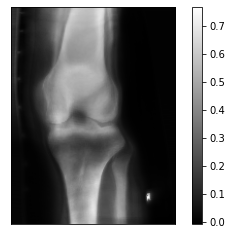

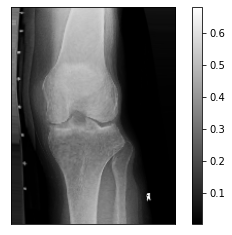

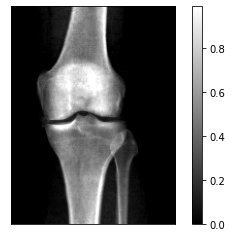

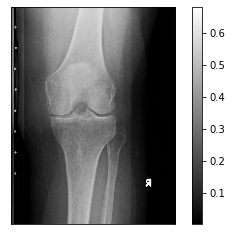

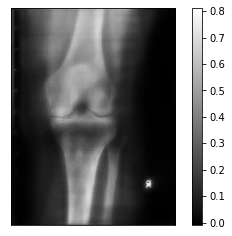

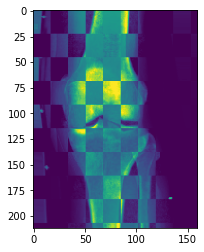

In [562]:
N += 1
show(netGrad.warped_image_B[N, 0])

true_warped = netGrad.as_function(batch_radio)(netGrad.phi_BA_vectorfield)
show(true_warped[N, 0])
show(batch_dxa[N, 0])

show(batch_radio[N, 0])
show(trans_batch_radio[N, 0])

check(true_warped[N, 0], batch_dxa[N, 0])

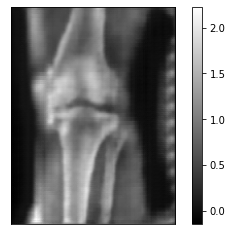

In [554]:
show(translator(batch_radio)[N, 0])

In [516]:
itk.checker_board_image_filter?

In [557]:
icon.losses.gaussian_blur?

In [566]:
import footsteps
footsteps.output_dir

'results/combined-no-cross/'